In [1]:
import tensorflow as tf

### Input Data: .wav -> Pitch contour (f0s), Harmonic spectral envelope (sps), Aperiodic spectral envelope (aps)

In [2]:
import numpy as np
import os
import time
import argparse
import librosa

In [3]:
from utils import *
from ops import *
# from model import CycleGAN

In [4]:
import librosa.display
from IPython.display import Audio
# import matplotlib
import matplotlib.pyplot as plt

In [5]:
%matplotlib inline
# matplotlib.rcParams['figure.figsize'] = (16, 4)

In [6]:
# train_A_dir = '/media/jg/H/data/VCC2016/vcc2016_training/SF1'
# train_B_dir = '/media/jg/H/data/VCC2016/vcc2016_training/TM2'
# validation_A_dir = '/media/jg/H/data/VCC2016/evaluation_all/SF1'
# validation_B_dir = '/media/jg/H/data/VCC2016/evaluation_all/TM2'

train_A_dir = './../../../Database/Emotion/hap_neu/hap'
train_B_dir = './../../../Database/Emotion/hap_neu/neu'
validation_A_dir = './../../../Database/Emotion/hap_neu/val_hap'
validation_B_dir = './../../../Database/Emotion/hap_neu/val_neu'

# model_name = 'hap2neu.ckpt'
# model_dir = './model/hap2neu'
# output_dir = './validation_output'

In [7]:
random_seed = 0
np.random.seed(random_seed)

In [8]:
# # CycleGAN training parameters
# num_epochs = 5000
# mini_batch_size = 1 # mini_batch_size = 1 is better
# generator_learning_rate = 0.0002
# generator_learning_rate_decay = generator_learning_rate / 200000
# discriminator_learning_rate = 0.0001
# discriminator_learning_rate_decay = discriminator_learning_rate / 200000
sampling_rate = 16000
frame_period = 5.0
num_mcep = 24
n_frames = 128
# lambda_cycle = 10
# lambda_identity = 5

In [9]:
# load audio waveform (xxx.wav)
wavs_A = load_wavs(wav_dir = train_A_dir, sr = sampling_rate)
wavs_B = load_wavs(wav_dir = train_B_dir, sr = sampling_rate)

Train_A has 100 audio waveforms, in folder ./../../../Database/Emotion/hap_neu/hap
Train_B has 128 audio waveforms, in folder ./../../../Database/Emotion/hap_neu/neu
Audio file index[0] in Train_A, 45760 frames, frame rate 16000, audio length 2.860 seconds


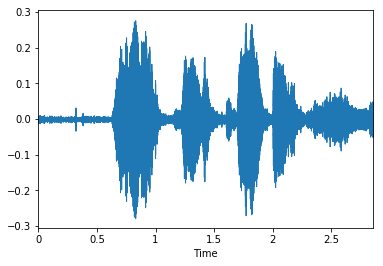

In [10]:
# Test Input Audio
print('Train_A has %d audio waveforms, in folder %s' %(np.shape(wavs_A)[0], train_A_dir))
print('Train_B has %d audio waveforms, in folder %s' %(np.shape(wavs_B)[0], train_B_dir))
idx = 0
x = wavs_A[idx]
print('Audio file index[%d] in Train_A, %d frames, frame rate %d, audio length %.3f seconds' %(idx, np.shape(x)[0], sampling_rate, np.shape(x)[0]/sampling_rate))
librosa.display.waveplot(x, sr=sampling_rate)
Audio(x, rate=sampling_rate)

In [11]:
# try on 7 audio waveforms each
# wavs_A = wavs_A[:7]
# wavs_B = wavs_B[:7]

In [12]:
# Extract Pitch contour (f0s), Harmonic spectral envelope (sps), Aperiodic spectral envelope (aps)
f0s_A, timeaxes_A, sps_A, aps_A, coded_sps_A = world_encode_data(wavs = wavs_A, fs = sampling_rate, frame_period = frame_period, coded_dim = num_mcep)
f0s_B, timeaxes_B, sps_B, aps_B, coded_sps_B = world_encode_data(wavs = wavs_B, fs = sampling_rate, frame_period = frame_period, coded_dim = num_mcep)

In [13]:
# f0s: prepare for log Gaussian Normalized Transform 
log_f0s_mean_A, log_f0s_std_A = logf0_statistics(f0s_A)
log_f0s_mean_B, log_f0s_std_B = logf0_statistics(f0s_B)
print('log f0 of Pitch A: Mean %f, Std %f' %(log_f0s_mean_A, log_f0s_std_A))
print('log f0 of Pitch B: Mean %f, Std %f' %(log_f0s_mean_B, log_f0s_std_B))

log f0 of Pitch A: Mean 5.355179, Std 0.363481
log f0 of Pitch B: Mean 5.242276, Std 0.283226


In [14]:
# sps: normalization
coded_sps_A_transposed = transpose_in_list(lst = coded_sps_A)
coded_sps_B_transposed = transpose_in_list(lst = coded_sps_B)
coded_sps_A_norm, coded_sps_A_mean, coded_sps_A_std = coded_sps_normalization_fit_transoform(coded_sps = coded_sps_A_transposed)
coded_sps_B_norm, coded_sps_B_mean, coded_sps_B_std = coded_sps_normalization_fit_transoform(coded_sps = coded_sps_B_transposed)
print("f0s_A: (%d,%d), f0s_B: (%d,%d), coded_sps_A_norm: (%d,%d,%d), coded_sps_B_norm: (%d,%d,%d)" %(len(f0s_A), len(f0s_A[0]), len(f0s_B), len(f0s_B[0]), len(coded_sps_A_norm), np.shape(coded_sps_A_norm[0])[0], np.shape(coded_sps_A_norm[0])[1], len(coded_sps_B_norm), np.shape(coded_sps_B_norm[0])[0], np.shape(coded_sps_B_norm[0])[1]))

f0s_A: (100,573), f0s_B: (128,390), coded_sps_A_norm: (100,24,573), coded_sps_B_norm: (128,24,390)


In [15]:
pool_A, pool_B, f0sA, f0sB  = list(coded_sps_A_norm), list(coded_sps_B_norm), list(f0s_A), list(f0s_B)
# dataset_A, dataset_B = sample_train_data(pool_A=pool_A, pool_B=pool_B, n_frames=n_frames, max_samples=1000)
dataset_A, dataset_B = sample_train_data(pool_A=pool_A, pool_B=pool_B, f0s_A=f0sA, f0s_B=f0sB, n_frames=n_frames, max_samples=1000)
print('Input data fixed: dataset_A', np.shape(dataset_A), 'dataset_B', np.shape(dataset_B))
print('Note: The first dimension is randomly chosen, ~= 3-4 times of the .wav files')

Input data fixed: dataset_A (416, 24, 128) dataset_B (416, 24, 128)
Note: The first dimension is randomly chosen, ~= 3-4 times of the .wav files


### Autoencoder: Style_Encoder, Content_Encoder, MLP, Decoder, discriminator

In [16]:
def Style_Encoder(inputs, style_dim=16, reuse=False, scope='style_encoder'):                                                            # [1, 24, 128] = [batch_size, feature_channel, time]

    inputs = tf.transpose(inputs, perm=[0, 2, 1], name='input_transpose')                                                               # [1, 128, 24] = [batch_size, time, feature_channel]

    with tf.variable_scope(scope, reuse=reuse):

        h1 = conv1d_layer(inputs=inputs, filters=128, kernel_size=15, strides=1, name='h1_conv')                                        # [1, 128, 128]
        h1_gates = conv1d_layer(inputs=inputs, filters=128, kernel_size=15, strides=1, name='h1_conv_gates')
        h1_glu = gated_linear_layer(inputs=h1, gates=h1_gates, name='h1_glu')

        # Downsample
        d1 = downsample1d_block_withoutIN(inputs=h1_glu, filters=256, kernel_size=5, strides=2, name_prefix='downsample1d_block1')      # [1, 64, 256]
        d2 = downsample1d_block_withoutIN(inputs=d1, filters=512, kernel_size=5, strides=2, name_prefix='downsample1d_block2')          # [1, 32, 512]

        d3 = downsample1d_block_withoutIN(inputs=d2, filters=512, kernel_size=3, strides=2, name_prefix='downsample1d_block3')          # [1, 16, 512]
        d4 = downsample1d_block_withoutIN(inputs=d3, filters=512, kernel_size=3, strides=2, name_prefix='downsample1d_block4')          # [1, 8, 512]

        # Global Average Pooling
        p1 = adaptive_avg_pooling(d4)                                                                                                   # [1, 1, 512]
        style = conv1d_layer(inputs=p1, filters=style_dim, kernel_size=1, strides=1, name='SE_logit')                                   # [1, 1, 16]

        return style                                                                                                                    # [1, 1, 16]


def Content_Encoder(inputs, reuse=False, scope='content_encoder'):
    # IN removes the original feature mean and variance that represent important style information
    inputs = tf.transpose(inputs, perm=[0, 2, 1], name='input_transpose')                                                               # [1, 24, 128] = [batch_size, time, feature_channel]

    with tf.variable_scope(scope, reuse=reuse):

        h1 = conv1d_layer(inputs=inputs, filters=128, kernel_size=15, strides=1, name='h1_conv')                                        # [1, 128, 128]
        h1_norm = instance_norm_layer(inputs=h1, name='h1_norm')
        h1_gates = conv1d_layer(inputs=inputs, filters=128, kernel_size=15, strides=1, name='h1_gates')
        h1_norm_gates = instance_norm_layer(inputs=h1_gates, name='h1_norm_gates')
        h1_glu = gated_linear_layer(inputs=h1_norm, gates=h1_norm_gates, name='h1_glu')

        # downsample
        d1 = downsample1d_block(inputs=h1_glu, filters=256, kernel_size=5, strides=2, name_prefix='downsample1d_block1')                # [1, 64, 256]
        d2 = downsample1d_block(inputs=d1, filters=512, kernel_size=5, strides=2, name_prefix='downsample1d_block2')                    # [1, 32, 512]
               
        # Residual blocks
        r1 = residual1d_block(inputs=d2, filters = 512, kernel_size=3, strides=1, name_prefix='residual1d_block1')                      # [1, 32, 512]
        r2 = residual1d_block(inputs=r1, filters = 512, kernel_size=3, strides=1, name_prefix='residual1d_block2')
        r3 = residual1d_block(inputs=r2, filters = 512, kernel_size=3, strides=1, name_prefix='residual1d_block3')
        content = residual1d_block(inputs=r3, filters=512, kernel_size=3, strides=1, name_prefix='residual1d_block4')

        return content                                                                                                                  # [1, 32, 512]


def MLP(style, reuse=False, scope='MLP'):                                                                                               # [1, 1, 16]

    with tf.variable_scope(scope, reuse=reuse):

        x1 = linear(style, 512, scope='linear_1')                                                                                       # [1, 1, 512]
        x1_gates = linear(x1, 512, scope='linear_1_gates')
        x1_glu = gated_linear_layer(inputs=x1, gates=x1_gates, name='x1_glu')

        x2 = linear(x1_glu, 512, scope='linear_2')
        x2_gates = linear(x2, 512, scope='linear_2_gates')
        x2_glu = gated_linear_layer(inputs=x2, gates=x2_gates, name='x2_glu')

        mu = linear(x2_glu, 512, scope='mu')
        sigma = linear(x2_glu, 512, scope='sigma')

        mu = tf.reshape(mu, shape=[-1, 1, 512])                                                                                         # [1, 1, 512]
        sigma = tf.reshape(sigma, shape=[-1, 1, 512])                                                                                   # [1, 1, 512]

        return mu, sigma                                                                                                                # [1, 1, 512]


def Decoder(content, style, reuse=False, scope="decoder"):

    with tf.variable_scope(scope, reuse=reuse):

        mu, sigma = MLP(style, reuse)                                                                                                   # [1, 1, 512]
        x = content                                                                                                                     # [1, 32, 512]

        # Adaptive Residual blocks
        r1 = residual1d_block_adaptive(inputs=x, filters=512, mu=mu, sigma=sigma, kernel_size=3, strides=1, name_prefix='residual1d_block1')        # [1, 32, 512]
        r2 = residual1d_block_adaptive(inputs=r1, filters=512, mu=mu, sigma=sigma, kernel_size=3, strides=1, name_prefix='residual1d_block2')
        r3 = residual1d_block_adaptive(inputs=r2, filters=512, mu=mu, sigma=sigma, kernel_size=3, strides=1, name_prefix='residual1d_block3')

        # Upsample
        u1 = upsample1d_block(inputs=r3, filters=512, kernel_size=5, strides=1, shuffle_size=2, name_prefix='upsample1d_block1')        # [1, 64, 512]
        u2 = upsample1d_block(inputs=u1, filters=256, kernel_size=5, strides=1, shuffle_size=2, name_prefix='upsample1d_block2')        # [1, 128, 256]

        # Output
        o1 = conv1d_layer(inputs=u2, filters=24, kernel_size=15, strides=1, name='o1_conv')                                             # [1, 128, 24]
        o2 = tf.transpose(o1, perm=[0, 2, 1], name='output_transpose')                                                                  # [1, 24, 128]

        return o2                                                                                                                       # [1, 24, 128] = [batch_size, feature_channel, time]


In [17]:
def Discriminator(inputs, reuse=False, scope='discriminator'):

    # inputs = [batch_size, num_features, time]
    # add channel for 2D convolution [batch_size, num_features, time, 1]
    inputs = tf.expand_dims(inputs, -1)                                                                                                 # [1, 24, 128, 1]

    with tf.variable_scope(scope, reuse=reuse):

        h1 = conv2d_layer(inputs=inputs, filters=128, kernel_size=[3, 3], strides=[1, 2], name='h1_conv')                               # [1, 24, 64, 128]
        h1_gates = conv2d_layer(inputs=inputs, filters=128, kernel_size=[3, 3], strides=[1, 2], name='h1_conv_gates')
        h1_glu = gated_linear_layer(inputs=h1, gates=h1_gates, name='h1_glu')

        # Downsample
        d1 = downsample2d_block(inputs=h1_glu, filters=256, kernel_size=[3, 3], strides=[2, 2], name_prefix='downsample2d_block1')      # [1, 12, 32, 256]
        d2 = downsample2d_block(inputs=d1, filters=512, kernel_size=[3, 3], strides=[2, 2], name_prefix='downsample2d_block2')          # [1, 6, 16, 512]
        d3 = downsample2d_block(inputs=d2, filters=1024, kernel_size=[6, 3], strides=[1, 2], name_prefix='downsample2d_block3')         # [1, 6, 8, 1024]

        # Output
        o1 = tf.layers.dense(inputs=d3, units=1, activation=tf.nn.sigmoid)

        return [o1]                                                                                                                       # [1, 6, 8, 1]


### Try on input data

In [18]:
# try_style_a = Style_Encoder(dataset_A[0:1])
# try_content_b = Content_Encoder(dataset_B[0:1])
# try_x_ab = Decoder(try_content_b, try_style_a)
# try_fake_A_logit = discriminator(try_x_ab)

# print('try_style_a:', try_style_a)
# print(try_content_b)
# print(try_x_ab)
# print(try_fake_A_logit)

### Autoencoder Model

In [19]:
##################################################################################
# Model
##################################################################################

def Encoder_A(x_A, reuse=False):
    style_A = Style_Encoder(x_A, reuse=reuse, scope='style_encoder_A')
    content_A = Content_Encoder(x_A, reuse=reuse, scope='content_encoder_A')

    return content_A, style_A

def Encoder_B(x_B, reuse=False):
    style_B = Style_Encoder(x_B, reuse=reuse, scope='style_encoder_B')
    content_B = Content_Encoder(x_B, reuse=reuse, scope='content_encoder_B')

    return content_B, style_B

def Decoder_A(content_B, style_A, reuse=False):
    x_ba = Decoder(content=content_B, style=style_A, reuse=reuse, scope='decoder_A')

    return x_ba

def Decoder_B(content_A, style_B, reuse=False):
    x_ab = Decoder(content=content_A, style=style_B, reuse=reuse, scope='decoder_B')

    return x_ab

def discriminate_real(x_A, x_B):
    real_A_logit = Discriminator(x_A, scope="discriminator_A")
    real_B_logit = Discriminator(x_B, scope="discriminator_B")

    return real_A_logit, real_B_logit

def discriminate_fake(x_ba, x_ab):
    fake_A_logit = Discriminator(x_ba, reuse=True, scope="discriminator_A")
    fake_B_logit = Discriminator(x_ab, reuse=True, scope="discriminator_B")

    return fake_A_logit, fake_B_logit

## Module: EmoMUNIT

In [20]:
class EmoMUNIT(object):
    def __init__(self, sess):
        
        self.batch_size = 1
        self.style_dim = 16
        
        self.Encoder_A = Encoder_A
        self.Encoder_B = Encoder_B
        self.Decoder_A = Decoder_A
        self.Decoder_B = Decoder_B
        self.discriminate_real = discriminate_real
        self.discriminate_fake = discriminate_fake
        
        self.recon_x_cyc_w = 0.0
        self.gan_type = 'lsgan'
        
        self.gan_w = 1.0
        
        self.recon_x_w = 10.0
        self.recon_s_w = 1.0
        self.recon_c_w = 1.0
        self.recon_x_cyc_w = 0.0
               
        self.audio_len = 128    # = n_frames, time_length
        self.audio_ch = 24      # = num_mcep, num_features
        
        self.direction = 'A2B'
        
        self.model_name = 'EmoMUNIT'
        self.gan_type = 'lsgan'
        self.dataset_name = 'hap2neu'
        self.log_dir = 'logs'
        self.sample_dir = 'samples'
        self.checkpoint_dir = 'checkpoint'
        self.iteration = 100000
        
        self.sess = sess
        self.epoch = 10
        self.init_lr = 0.0001
        
        self.print_freq = 1000
        self.save_freq = 1000
        
    
    def build_model(self):
        self.lr = tf.placeholder(tf.float32, name='learning_rate')
        
        # Iterate from dataset_A and dataset_B
        self.domain_A = tf.placeholder(tf.float32, shape=[self.batch_size, self.audio_ch, self.audio_len], name='domain_a')
        self.domain_B = tf.placeholder(tf.float32, shape=[self.batch_size, self.audio_ch, self.audio_len], name='domain_b')
    
        self.style_a = tf.placeholder(tf.float32, shape=[self.batch_size, 1, self.style_dim], name='style_a')
        self.style_b = tf.placeholder(tf.float32, shape=[self.batch_size, 1, self.style_dim], name='style_b')  
    
        # encode
        content_a, style_a_prime = self.Encoder_A(self.domain_A)
        content_b, style_b_prime = self.Encoder_B(self.domain_B)

        # decode (within domain)
        x_aa = self.Decoder_A(content_B=content_a, style_A=style_a_prime)
        x_bb = self.Decoder_B(content_A=content_b, style_B=style_b_prime)
    
        # decode (cross domain)
        x_ba = self.Decoder_A(content_B=content_b, style_A=self.style_a, reuse=True)
        x_ab = self.Decoder_B(content_A=content_a, style_B=self.style_b, reuse=True)   
    
        # encode again
        content_b_, style_a_ = self.Encoder_A(x_ba, reuse=True)
        content_a_, style_b_ = self.Encoder_B(x_ab, reuse=True)    
    
        # decode again (if needed)
        if self.recon_x_cyc_w > 0 :
            x_aba = self.Decoder_A(content_B=content_a_, style_A=style_a_prime, reuse=True)
            x_bab = self.Decoder_B(content_A=content_b_, style_B=style_b_prime, reuse=True)

            cyc_recon_A = L1_loss(x_aba, self.domain_A)
            cyc_recon_B = L1_loss(x_bab, self.domain_B)

        else :
            cyc_recon_A = 0.0
            cyc_recon_B = 0.0    
      
        real_A_logit, real_B_logit = self.discriminate_real(self.domain_A, self.domain_B)
        fake_A_logit, fake_B_logit = self.discriminate_fake(x_ba, x_ab)   
    
    
        """ Define Loss """
        # Adversarial Loss
        G_ad_loss_a = generator_loss(self.gan_type, fake_A_logit)
        G_ad_loss_b = generator_loss(self.gan_type, fake_B_logit)
    
        # Discrimination Loss (real/fake)
        D_ad_loss_a = discriminator_loss(self.gan_type, real_A_logit, fake_A_logit)
        D_ad_loss_b = discriminator_loss(self.gan_type, real_B_logit, fake_B_logit)
    
        # Reconstruction Loss
        recon_A = L1_loss(x_aa, self.domain_A) # reconstruction
        recon_B = L1_loss(x_bb, self.domain_B) # reconstruction   
    
        # Semi-CycleGAN Loss
        # For style, encourages diverse outputs given different style codes
        recon_style_A = L1_loss(style_a_, self.style_a)
        recon_style_B = L1_loss(style_b_, self.style_b)
    
        # For content, encourages the translated image to preserve semantic content of the input image
        recon_content_A = L1_loss(content_a_, content_a)
        recon_content_B = L1_loss(content_b_, content_b)   
    
        # Attacker Loss
        Generator_A_loss = self.gan_w * G_ad_loss_a + \
                                   self.recon_x_w * recon_A + \
                                   self.recon_s_w * recon_style_A + \
                                   self.recon_c_w * recon_content_A + \
                                   self.recon_x_cyc_w * cyc_recon_A

        Generator_B_loss = self.gan_w * G_ad_loss_b + \
                           self.recon_x_w * recon_B + \
                           self.recon_s_w * recon_style_B + \
                           self.recon_c_w * recon_content_B + \
                           self.recon_x_cyc_w * cyc_recon_B   
    
        # Defender Loss
        Discriminator_A_loss = self.gan_w * D_ad_loss_a
        Discriminator_B_loss = self.gan_w * D_ad_loss_b
    
        # Total Loss
        self.Generator_loss = Generator_A_loss + Generator_B_loss
        self.Discriminator_loss = Discriminator_A_loss + Discriminator_B_loss
    
    
        """ Training Variables """
        t_vars = tf.trainable_variables()
        G_vars = [var for var in t_vars if 'decoder' in var.name or 'encoder' in var.name]
        D_vars = [var for var in t_vars if 'discriminator' in var.name]
    
        self.G_optim = tf.train.AdamOptimizer(self.lr, beta1=0.5, beta2=0.999).minimize(self.Generator_loss, var_list=G_vars)
        self.D_optim = tf.train.AdamOptimizer(self.lr, beta1=0.5, beta2=0.999).minimize(self.Discriminator_loss, var_list=D_vars)
    
        """" Summary """
        self.all_G_loss = tf.summary.scalar("Generator_loss", self.Generator_loss)
        self.all_D_loss = tf.summary.scalar("Discriminator_loss", self.Discriminator_loss)
        self.G_A_loss = tf.summary.scalar("G_A_loss", Generator_A_loss)
        self.G_B_loss = tf.summary.scalar("G_B_loss", Generator_B_loss)
        self.D_A_loss = tf.summary.scalar("D_A_loss", Discriminator_A_loss)
        self.D_B_loss = tf.summary.scalar("D_B_loss", Discriminator_B_loss)

        self.G_loss = tf.summary.merge([self.G_A_loss, self.G_B_loss, self.all_G_loss])
        self.D_loss = tf.summary.merge([self.D_A_loss, self.D_B_loss, self.all_D_loss])    
    
    
        """ Speech: real and fake """
        self.real_A = self.domain_A
        self.real_B = self.domain_B

        self.fake_A = x_ba
        self.fake_B = x_ab 
    
        """ Test Variables """
        self.test_audio = tf.placeholder(tf.float32, [1, self.audio_ch, self.audio_len], name='test_audio') # [1 24 128]
        self.test_style = tf.placeholder(tf.float32, [1, 1, self.style_dim], name='test_style')             # [1 1 16]

        test_content_a, _ = self.Encoder_A(self.test_audio, reuse=True)
        test_content_b, _ = self.Encoder_B(self.test_audio, reuse=True)

        self.test_fake_A = self.Decoder_A(content_B=test_content_b, style_A=self.test_style, reuse=True)
        self.test_fake_B = self.Decoder_B(content_A=test_content_a, style_B=self.test_style, reuse=True)

        """ Guided Speech Translation """
        self.content_audio = tf.placeholder(tf.float32, [1, self.audio_ch, self.audio_len], name='content_audio')
        self.style_audio = tf.placeholder(tf.float32, [1, self.audio_ch, self.audio_len], name='guide_style_audio_ch')

        if self.direction == 'A2B' :
            guide_content_A, guide_style_A = self.Encoder_A(self.content_audio, reuse=True)
            guide_content_B, guide_style_B = self.Encoder_B(self.style_audio, reuse=True)

        else :
            guide_content_B, guide_style_B = self.Encoder_B(self.content_audio, reuse=True)
            guide_content_A, guide_style_A = self.Encoder_A(self.style_audio, reuse=True)

        self.guide_fake_A = self.Decoder_A(content_B=guide_content_B, style_A=guide_style_A, reuse=True)
        self.guide_fake_B = self.Decoder_B(content_A=guide_content_A, style_B=guide_style_B, reuse=True)
    
    
    
    def train(self):
        # initialize all variables
        tf.global_variables_initializer().run()
        
        # saver to save model
        self.saver = tf.train.Saver()
        
        # summary writer
        self.writer = tf.summary.FileWriter(self.log_dir + '/' + self.model_dir, self.sess.graph)
        
        # restore check-point if it exits
        could_load, checkpoint_counter = self.load(self.checkpoint_dir)
        if could_load:
            start_epoch = (int)(checkpoint_counter / self.iteration)
            start_batch_id = checkpoint_counter - start_epoch * self.iteration
            counter = checkpoint_counter
            print(" [*] Load SUCCESS")
        else:
            start_epoch = 0
            start_batch_id = 0
            counter = 1
            print(" [!] Load FAILED...")
            
        # training loop for epoch
        start_time = time.time()
        for epoch in range(start_epoch, self.epoch):
            
            lr = self.init_lr * pow(0.5, epoch)
            for idx in range(start_batch_id, self.iteration):
                style_a = np.random.normal(loc=0.0, scale=1.0, size=[self.batch_size, 1, self.style_dim])
                style_b = np.random.normal(loc=0.0, scale=1.0, size=[self.batch_size, 1, self.style_dim])
                
                idx_A = idx%len(dataset_A)
                idx_B = idx%len(dataset_B)
                domain_A = dataset_A[idx_A:idx_A+1].astype('float32')
                domain_B = dataset_B[idx_B:idx_B+1].astype('float32')
                
                train_feed_dict = {
                    self.style_a : style_a,
                    self.style_b : style_b,
                    self.lr : lr,
                    self.domain_A : domain_A,
                    self.domain_B : domain_B
                }
                
                # Update D
                _, d_loss, summary_str = self.sess.run([self.D_optim, self.Discriminator_loss, self.D_loss], feed_dict = train_feed_dict)
                self.writer.add_summary(summary_str, counter)
            
                # Update G
                batch_A_audios, batch_B_audios, fake_A, fake_B, _, g_loss, summary_str = \
                self.sess.run([self.real_A, self.real_B, self.fake_A, self.fake_B, self.G_optim, \
                               self.Generator_loss, self.G_loss], feed_dict = train_feed_dict)
                self.writer.add_summary(summary_str, counter)           
            
                # display training status
                counter += 1
                print("Epoch: [%2d] [%6d/%6d] time: %4.4f d_loss: %.8f, g_loss: %.8f" \
                      % (epoch, idx, self.iteration, time.time() - start_time, d_loss, g_loss))
            
                if np.mod(idx+1, self.print_freq) == 0 :
                    save_audios(batch_A_audios, self.batch_size,
                                './{}/real_A_{:02d}_{:06d}.npy'.format(self.sample_dir, epoch, idx+1))
                    # save_audios(batch_B_audios, self.batch_size,
                    #             './{}/real_B_{}_{:02d}_{:06d}.jpg'.format(self.sample_dir, gpu_id, epoch, idx+1))

                    # save_audios(fake_A, self.batch_size,
                    #             './{}/fake_A_{}_{:02d}_{:06d}.jpg'.format(self.sample_dir, gpu_id, epoch, idx+1))
                    save_audios(fake_B, self.batch_size,
                                './{}/fake_B_{:02d}_{:06d}.npy'.format(self.sample_dir, epoch, idx+1))          
                
                if np.mod(idx+1, self.save_freq) == 0 :
                    self.save(self.checkpoint_dir, counter)
        
            # After an epoch, start_batch_id reset to zero
            # non-zero value is only for the first epoch after loading pre-trained model
            start_batch_id = 0

            # save model for final step
            self.save(self.checkpoint_dir, counter)     
        
        
        
        
    @property
    def model_dir(self):
        return "{}_{}_{}".format(self.model_name, self.dataset_name, self.gan_type)
    
    
    def load(self, checkpoint_dir):
        import re
        print(" [*] Reading checkpoints...")
        checkpoint_dir = os.path.join(checkpoint_dir, self.model_dir)

        ckpt = tf.train.get_checkpoint_state(checkpoint_dir)
        if ckpt and ckpt.model_checkpoint_path:
            ckpt_name = os.path.basename(ckpt.model_checkpoint_path)
            self.saver.restore(self.sess, os.path.join(checkpoint_dir, ckpt_name))
            counter = int(next(re.finditer("(\d+)(?!.*\d)", ckpt_name)).group(0))
            print(" [*] Success to read {}".format(ckpt_name))
            return True, counter
        else:
            print(" [*] Failed to find a checkpoint")
            return False, 0
        
        
    def save(self, checkpoint_dir, step):
        checkpoint_dir = os.path.join(checkpoint_dir, self.model_dir)

        if not os.path.exists(checkpoint_dir):
            os.makedirs(checkpoint_dir)

        self.saver.save(self.sess, os.path.join(checkpoint_dir, self.model_name + '.model'), global_step=step)        
        
        
        
        

## Train

In [ ]:
with tf.Session(config=tf.ConfigProto(allow_soft_placement=True)) as sess:
    gan = EmoMUNIT(sess)
    gan.build_model()
    
    gan.train()
    print(" [*] Training finished!")

 [*] Reading checkpoints...
 [*] Failed to find a checkpoint
 [!] Load FAILED...
Epoch: [ 0] [     0/100000] time: 16.1470 d_loss: 1.14355969, g_loss: 25.90052032
Epoch: [ 0] [     1/100000] time: 16.3263 d_loss: 1.08175635, g_loss: 26.94687653
Epoch: [ 0] [     2/100000] time: 16.5039 d_loss: 1.07103670, g_loss: 26.77711105
Epoch: [ 0] [     3/100000] time: 16.6759 d_loss: 1.06038523, g_loss: 28.92706299
Epoch: [ 0] [     4/100000] time: 16.8523 d_loss: 1.08026004, g_loss: 27.77138138
Epoch: [ 0] [     5/100000] time: 17.0322 d_loss: 0.98020500, g_loss: 27.64330482
Epoch: [ 0] [     6/100000] time: 17.2093 d_loss: 1.02476859, g_loss: 25.52520370
Epoch: [ 0] [     7/100000] time: 17.3828 d_loss: 1.02286601, g_loss: 25.85219193
Epoch: [ 0] [     8/100000] time: 17.5595 d_loss: 0.97986579, g_loss: 26.55676270
Epoch: [ 0] [     9/100000] time: 17.7364 d_loss: 0.85458589, g_loss: 27.48296738
Epoch: [ 0] [    10/100000] time: 17.9133 d_loss: 0.88149184, g_loss: 25.94672585
Epoch: [ 0] [    

Epoch: [ 0] [    99/100000] time: 33.9323 d_loss: 0.62475359, g_loss: 21.99288940
Epoch: [ 0] [   100/100000] time: 34.1068 d_loss: 0.38419527, g_loss: 24.43306541
Epoch: [ 0] [   101/100000] time: 34.3046 d_loss: 0.44906920, g_loss: 21.03260040
Epoch: [ 0] [   102/100000] time: 34.4935 d_loss: 0.44051138, g_loss: 20.72445488
Epoch: [ 0] [   103/100000] time: 34.6787 d_loss: 0.53245682, g_loss: 21.77818298
Epoch: [ 0] [   104/100000] time: 34.8617 d_loss: 0.27305853, g_loss: 21.51599693
Epoch: [ 0] [   105/100000] time: 35.0374 d_loss: 0.63476974, g_loss: 20.75019073
Epoch: [ 0] [   106/100000] time: 35.2175 d_loss: 0.36348477, g_loss: 22.83116913
Epoch: [ 0] [   107/100000] time: 35.3942 d_loss: 0.39118937, g_loss: 22.26928329
Epoch: [ 0] [   108/100000] time: 35.5678 d_loss: 0.73285556, g_loss: 20.16478157
Epoch: [ 0] [   109/100000] time: 35.7569 d_loss: 0.48061222, g_loss: 22.65223312
Epoch: [ 0] [   110/100000] time: 35.9497 d_loss: 0.35624149, g_loss: 24.07117081
Epoch: [ 0] [   

Epoch: [ 0] [   199/100000] time: 51.9151 d_loss: 0.62163234, g_loss: 20.10370827
Epoch: [ 0] [   200/100000] time: 52.0898 d_loss: 0.39168060, g_loss: 19.51933289
Epoch: [ 0] [   201/100000] time: 52.2668 d_loss: 0.14475173, g_loss: 20.93457794
Epoch: [ 0] [   202/100000] time: 52.4429 d_loss: 0.19260031, g_loss: 20.33561707
Epoch: [ 0] [   203/100000] time: 52.6224 d_loss: 0.15214008, g_loss: 20.65936661
Epoch: [ 0] [   204/100000] time: 52.7979 d_loss: 0.29746011, g_loss: 19.90093613
Epoch: [ 0] [   205/100000] time: 52.9778 d_loss: 0.41057235, g_loss: 21.19214630
Epoch: [ 0] [   206/100000] time: 53.1577 d_loss: 0.40602642, g_loss: 21.33300400
Epoch: [ 0] [   207/100000] time: 53.3380 d_loss: 0.33759367, g_loss: 18.43487167
Epoch: [ 0] [   208/100000] time: 53.5121 d_loss: 0.14103952, g_loss: 19.63821030
Epoch: [ 0] [   209/100000] time: 53.6950 d_loss: 0.20635480, g_loss: 20.64687347
Epoch: [ 0] [   210/100000] time: 53.8695 d_loss: 0.31381136, g_loss: 19.84694099
Epoch: [ 0] [   

Epoch: [ 0] [   299/100000] time: 69.7373 d_loss: 0.29408056, g_loss: 18.32923126
Epoch: [ 0] [   300/100000] time: 69.9162 d_loss: 0.28512120, g_loss: 18.24057388
Epoch: [ 0] [   301/100000] time: 70.0941 d_loss: 0.20207484, g_loss: 18.09164619
Epoch: [ 0] [   302/100000] time: 70.2732 d_loss: 0.16415372, g_loss: 19.43075943
Epoch: [ 0] [   303/100000] time: 70.4533 d_loss: 0.14764977, g_loss: 18.16079330
Epoch: [ 0] [   304/100000] time: 70.6274 d_loss: 0.12003932, g_loss: 17.33506393
Epoch: [ 0] [   305/100000] time: 70.8039 d_loss: 0.13825066, g_loss: 17.18557358
Epoch: [ 0] [   306/100000] time: 70.9813 d_loss: 0.17924112, g_loss: 20.86369705
Epoch: [ 0] [   307/100000] time: 71.1580 d_loss: 0.08596950, g_loss: 18.77529144
Epoch: [ 0] [   308/100000] time: 71.3313 d_loss: 0.11015337, g_loss: 19.06946564
Epoch: [ 0] [   309/100000] time: 71.5077 d_loss: 0.21122822, g_loss: 19.60039330
Epoch: [ 0] [   310/100000] time: 71.6879 d_loss: 0.43444011, g_loss: 16.72487640
Epoch: [ 0] [   

Epoch: [ 0] [   399/100000] time: 87.5387 d_loss: 0.19877103, g_loss: 17.29380226
Epoch: [ 0] [   400/100000] time: 87.7148 d_loss: 0.14611861, g_loss: 16.55239487
Epoch: [ 0] [   401/100000] time: 87.8950 d_loss: 0.08516731, g_loss: 20.04742050
Epoch: [ 0] [   402/100000] time: 88.0739 d_loss: 0.14013208, g_loss: 17.60266876
Epoch: [ 0] [   403/100000] time: 88.2521 d_loss: 0.11448994, g_loss: 19.19112587
Epoch: [ 0] [   404/100000] time: 88.4271 d_loss: 0.08007230, g_loss: 16.76095200
Epoch: [ 0] [   405/100000] time: 88.6043 d_loss: 0.07554471, g_loss: 17.45531845
Epoch: [ 0] [   406/100000] time: 88.7804 d_loss: 0.29463178, g_loss: 17.18161774
Epoch: [ 0] [   407/100000] time: 88.9576 d_loss: 0.12979805, g_loss: 18.26000977
Epoch: [ 0] [   408/100000] time: 89.1391 d_loss: 0.31423330, g_loss: 15.78714943
Epoch: [ 0] [   409/100000] time: 89.3218 d_loss: 0.16556650, g_loss: 17.76692009
Epoch: [ 0] [   410/100000] time: 89.4965 d_loss: 0.14675142, g_loss: 17.93301582
Epoch: [ 0] [   

Epoch: [ 0] [   499/100000] time: 105.4712 d_loss: 0.08656322, g_loss: 17.33108521
Epoch: [ 0] [   500/100000] time: 105.6462 d_loss: 0.03593040, g_loss: 18.82135963
Epoch: [ 0] [   501/100000] time: 105.8232 d_loss: 0.05603549, g_loss: 16.99815750
Epoch: [ 0] [   502/100000] time: 106.0011 d_loss: 0.06640353, g_loss: 16.49951744
Epoch: [ 0] [   503/100000] time: 106.1778 d_loss: 0.13065487, g_loss: 16.07816505
Epoch: [ 0] [   504/100000] time: 106.3530 d_loss: 0.12892759, g_loss: 16.60912323
Epoch: [ 0] [   505/100000] time: 106.5339 d_loss: 0.05230040, g_loss: 16.63557053
Epoch: [ 0] [   506/100000] time: 106.7148 d_loss: 0.12828137, g_loss: 17.52065659
Epoch: [ 0] [   507/100000] time: 106.8925 d_loss: 0.09708834, g_loss: 17.45643806
Epoch: [ 0] [   508/100000] time: 107.0679 d_loss: 0.04801852, g_loss: 18.29268265
Epoch: [ 0] [   509/100000] time: 107.2456 d_loss: 0.03622612, g_loss: 18.20759583
Epoch: [ 0] [   510/100000] time: 107.4292 d_loss: 0.09563661, g_loss: 16.59348297
Epoc

Epoch: [ 0] [   599/100000] time: 123.2927 d_loss: 0.02877540, g_loss: 16.19794083
Epoch: [ 0] [   600/100000] time: 123.4674 d_loss: 0.11057363, g_loss: 18.01598740
Epoch: [ 0] [   601/100000] time: 123.6443 d_loss: 0.09054125, g_loss: 17.39025116
Epoch: [ 0] [   602/100000] time: 123.8195 d_loss: 0.05380155, g_loss: 16.86186600
Epoch: [ 0] [   603/100000] time: 124.0026 d_loss: 0.03980705, g_loss: 15.84919357
Epoch: [ 0] [   604/100000] time: 124.1816 d_loss: 0.03902729, g_loss: 16.20596504
Epoch: [ 0] [   605/100000] time: 124.3642 d_loss: 0.02794049, g_loss: 16.24948692
Epoch: [ 0] [   606/100000] time: 124.5396 d_loss: 0.02751234, g_loss: 22.84082794
Epoch: [ 0] [   607/100000] time: 124.7232 d_loss: 0.04535711, g_loss: 16.93547821
Epoch: [ 0] [   608/100000] time: 124.8987 d_loss: 0.05293044, g_loss: 18.77036667
Epoch: [ 0] [   609/100000] time: 125.0746 d_loss: 0.02829150, g_loss: 17.24005127
Epoch: [ 0] [   610/100000] time: 125.2536 d_loss: 0.00937653, g_loss: 16.73038483
Epoc

Epoch: [ 0] [   699/100000] time: 141.0645 d_loss: 0.07594783, g_loss: 15.64731407
Epoch: [ 0] [   700/100000] time: 141.2435 d_loss: 0.01771981, g_loss: 16.85264206
Epoch: [ 0] [   701/100000] time: 141.4232 d_loss: 0.06950043, g_loss: 15.75990868
Epoch: [ 0] [   702/100000] time: 141.5979 d_loss: 0.02276478, g_loss: 15.49721527
Epoch: [ 0] [   703/100000] time: 141.7744 d_loss: 0.00923763, g_loss: 17.00189781
Epoch: [ 0] [   704/100000] time: 141.9517 d_loss: 0.05359732, g_loss: 16.54334259
Epoch: [ 0] [   705/100000] time: 142.1295 d_loss: 0.02338540, g_loss: 17.55239868
Epoch: [ 0] [   706/100000] time: 142.3080 d_loss: 0.03213857, g_loss: 15.59629250
Epoch: [ 0] [   707/100000] time: 142.4850 d_loss: 0.03449768, g_loss: 16.54283714
Epoch: [ 0] [   708/100000] time: 142.6604 d_loss: 0.06495278, g_loss: 16.92748451
Epoch: [ 0] [   709/100000] time: 142.8432 d_loss: 0.01522631, g_loss: 15.86080170
Epoch: [ 0] [   710/100000] time: 143.0175 d_loss: 0.01383358, g_loss: 17.36674309
Epoc

Epoch: [ 0] [   799/100000] time: 159.0029 d_loss: 0.02089080, g_loss: 15.45254803
Epoch: [ 0] [   800/100000] time: 159.1803 d_loss: 0.06445568, g_loss: 15.22428513
Epoch: [ 0] [   801/100000] time: 159.3607 d_loss: 0.07765738, g_loss: 17.24767685
Epoch: [ 0] [   802/100000] time: 159.5357 d_loss: 0.04585450, g_loss: 18.01982117
Epoch: [ 0] [   803/100000] time: 159.7169 d_loss: 0.04748045, g_loss: 15.86221313
Epoch: [ 0] [   804/100000] time: 159.8958 d_loss: 0.02314067, g_loss: 15.04612255
Epoch: [ 0] [   805/100000] time: 160.0729 d_loss: 0.02377272, g_loss: 15.50638199
Epoch: [ 0] [   806/100000] time: 160.2544 d_loss: 0.05057519, g_loss: 17.27266693
Epoch: [ 0] [   807/100000] time: 160.4320 d_loss: 0.03795130, g_loss: 14.44001389
Epoch: [ 0] [   808/100000] time: 160.6120 d_loss: 0.01730960, g_loss: 17.19099045
Epoch: [ 0] [   809/100000] time: 160.7927 d_loss: 0.04028750, g_loss: 14.94785500
Epoch: [ 0] [   810/100000] time: 160.9676 d_loss: 0.02651894, g_loss: 15.37717628
Epoc

Epoch: [ 0] [   899/100000] time: 176.7921 d_loss: 0.03359911, g_loss: 16.04248428
Epoch: [ 0] [   900/100000] time: 176.9668 d_loss: 0.01974492, g_loss: 14.82348442
Epoch: [ 0] [   901/100000] time: 177.1436 d_loss: 0.00768371, g_loss: 15.49579048
Epoch: [ 0] [   902/100000] time: 177.3189 d_loss: 0.02692606, g_loss: 14.71969414
Epoch: [ 0] [   903/100000] time: 177.4997 d_loss: 0.00889046, g_loss: 14.74722481
Epoch: [ 0] [   904/100000] time: 177.6741 d_loss: 0.03495253, g_loss: 15.24921513
Epoch: [ 0] [   905/100000] time: 177.8560 d_loss: 0.02805909, g_loss: 16.29532051
Epoch: [ 0] [   906/100000] time: 178.0305 d_loss: 0.02809061, g_loss: 14.83526611
Epoch: [ 0] [   907/100000] time: 178.2069 d_loss: 0.06693912, g_loss: 14.69049644
Epoch: [ 0] [   908/100000] time: 178.3870 d_loss: 0.02166659, g_loss: 15.93640518
Epoch: [ 0] [   909/100000] time: 178.5646 d_loss: 0.01712787, g_loss: 14.31190300
Epoch: [ 0] [   910/100000] time: 178.7427 d_loss: 0.01488938, g_loss: 15.87544441
Epoc

Epoch: [ 0] [   998/100000] time: 194.9391 d_loss: 0.02553486, g_loss: 15.83743763
Epoch: [ 0] [   999/100000] time: 195.1239 d_loss: 0.03077180, g_loss: 15.06495190
(1, 24, 128) 1 ./samples/real_A_00_001000.npy
(1, 24, 128) 1 ./samples/fake_B_00_001000.npy
Epoch: [ 0] [  1000/100000] time: 204.1511 d_loss: 0.01369894, g_loss: 13.86261082
Epoch: [ 0] [  1001/100000] time: 204.3409 d_loss: 0.03207158, g_loss: 14.40600204
Epoch: [ 0] [  1002/100000] time: 204.5254 d_loss: 0.01429334, g_loss: 14.79137611
Epoch: [ 0] [  1003/100000] time: 204.7021 d_loss: 0.01219369, g_loss: 15.24311066
Epoch: [ 0] [  1004/100000] time: 204.8833 d_loss: 0.07383538, g_loss: 14.28926659
Epoch: [ 0] [  1005/100000] time: 205.0622 d_loss: 0.06733710, g_loss: 15.34026527
Epoch: [ 0] [  1006/100000] time: 205.2420 d_loss: 0.01626714, g_loss: 14.14274216
Epoch: [ 0] [  1007/100000] time: 205.4159 d_loss: 0.02418064, g_loss: 15.42350769
Epoch: [ 0] [  1008/100000] time: 205.5977 d_loss: 0.02286859, g_loss: 14.2966

Epoch: [ 0] [  1097/100000] time: 221.6991 d_loss: 0.02004561, g_loss: 14.91915512
Epoch: [ 0] [  1098/100000] time: 221.8926 d_loss: 0.05834200, g_loss: 14.18893242
Epoch: [ 0] [  1099/100000] time: 222.0697 d_loss: 0.02482797, g_loss: 13.80027580
Epoch: [ 0] [  1100/100000] time: 222.2468 d_loss: 0.08027644, g_loss: 14.24041367
Epoch: [ 0] [  1101/100000] time: 222.4322 d_loss: 0.02996877, g_loss: 14.05233383
Epoch: [ 0] [  1102/100000] time: 222.6126 d_loss: 0.07881965, g_loss: 14.83586216
Epoch: [ 0] [  1103/100000] time: 222.7915 d_loss: 0.03466142, g_loss: 15.50882721
Epoch: [ 0] [  1104/100000] time: 222.9800 d_loss: 0.02234254, g_loss: 14.97422123
Epoch: [ 0] [  1105/100000] time: 223.1733 d_loss: 0.05281041, g_loss: 13.88770294
Epoch: [ 0] [  1106/100000] time: 223.3627 d_loss: 0.04550867, g_loss: 15.78952026
Epoch: [ 0] [  1107/100000] time: 223.5643 d_loss: 0.22401164, g_loss: 13.38327599
Epoch: [ 0] [  1108/100000] time: 223.7425 d_loss: 0.04117035, g_loss: 14.66315174
Epoc

Epoch: [ 0] [  1197/100000] time: 240.1671 d_loss: 0.09298708, g_loss: 15.56746864
Epoch: [ 0] [  1198/100000] time: 240.3464 d_loss: 0.05600406, g_loss: 13.68950272
Epoch: [ 0] [  1199/100000] time: 240.5277 d_loss: 0.04851444, g_loss: 15.73422432
Epoch: [ 0] [  1200/100000] time: 240.7029 d_loss: 0.06709094, g_loss: 14.21887207
Epoch: [ 0] [  1201/100000] time: 240.8800 d_loss: 0.15081847, g_loss: 14.30269051
Epoch: [ 0] [  1202/100000] time: 241.0604 d_loss: 0.13141851, g_loss: 16.63576889
Epoch: [ 0] [  1203/100000] time: 241.2560 d_loss: 0.12026034, g_loss: 12.99932671
Epoch: [ 0] [  1204/100000] time: 241.4404 d_loss: 0.12433464, g_loss: 14.60144424
Epoch: [ 0] [  1205/100000] time: 241.6244 d_loss: 0.04560037, g_loss: 14.34842873
Epoch: [ 0] [  1206/100000] time: 241.8052 d_loss: 0.03298022, g_loss: 13.94536972
Epoch: [ 0] [  1207/100000] time: 241.9913 d_loss: 0.09457585, g_loss: 13.36055756
Epoch: [ 0] [  1208/100000] time: 242.1692 d_loss: 0.07372975, g_loss: 15.14031887
Epoc

Epoch: [ 0] [  1297/100000] time: 258.1851 d_loss: 0.06154962, g_loss: 15.07317638
Epoch: [ 0] [  1298/100000] time: 258.3675 d_loss: 0.04564129, g_loss: 14.34745979
Epoch: [ 0] [  1299/100000] time: 258.5488 d_loss: 0.03419352, g_loss: 13.32471848
Epoch: [ 0] [  1300/100000] time: 258.7367 d_loss: 0.12132424, g_loss: 15.75476933
Epoch: [ 0] [  1301/100000] time: 258.9149 d_loss: 0.07761478, g_loss: 13.81171799
Epoch: [ 0] [  1302/100000] time: 259.0931 d_loss: 0.06804243, g_loss: 12.97989464
Epoch: [ 0] [  1303/100000] time: 259.2737 d_loss: 0.01102620, g_loss: 13.30156898
Epoch: [ 0] [  1304/100000] time: 259.4488 d_loss: 0.12811179, g_loss: 13.60309982
Epoch: [ 0] [  1305/100000] time: 259.6298 d_loss: 0.04297958, g_loss: 13.84647369
Epoch: [ 0] [  1306/100000] time: 259.8097 d_loss: 0.08650625, g_loss: 14.25375366
Epoch: [ 0] [  1307/100000] time: 259.9914 d_loss: 0.02105290, g_loss: 14.33145905
Epoch: [ 0] [  1308/100000] time: 260.1644 d_loss: 0.05080577, g_loss: 14.07236671
Epoc

Epoch: [ 0] [  1397/100000] time: 276.2306 d_loss: 0.05689796, g_loss: 12.93213177
Epoch: [ 0] [  1398/100000] time: 276.4113 d_loss: 0.29433861, g_loss: 13.76359940
Epoch: [ 0] [  1399/100000] time: 276.5960 d_loss: 0.09110527, g_loss: 14.79943562
Epoch: [ 0] [  1400/100000] time: 276.7813 d_loss: 0.13822234, g_loss: 14.30358315
Epoch: [ 0] [  1401/100000] time: 276.9787 d_loss: 0.04901759, g_loss: 12.90942001
Epoch: [ 0] [  1402/100000] time: 277.1722 d_loss: 0.09675317, g_loss: 13.43861008
Epoch: [ 0] [  1403/100000] time: 277.3506 d_loss: 0.11367977, g_loss: 14.05112362
Epoch: [ 0] [  1404/100000] time: 277.5381 d_loss: 0.06498310, g_loss: 13.45466232
Epoch: [ 0] [  1405/100000] time: 277.7299 d_loss: 0.02498083, g_loss: 13.87615013
Epoch: [ 0] [  1406/100000] time: 277.9167 d_loss: 0.09000559, g_loss: 13.30045319
Epoch: [ 0] [  1407/100000] time: 278.1055 d_loss: 0.04195582, g_loss: 13.32876015
Epoch: [ 0] [  1408/100000] time: 278.2817 d_loss: 0.02657050, g_loss: 13.46201229
Epoc

Epoch: [ 0] [  1496/100000] time: 294.1633 d_loss: 0.13996907, g_loss: 13.58425426
Epoch: [ 0] [  1497/100000] time: 294.3424 d_loss: 0.08408982, g_loss: 14.02832985
Epoch: [ 0] [  1498/100000] time: 294.5220 d_loss: 0.05053695, g_loss: 13.70588875
Epoch: [ 0] [  1499/100000] time: 294.6984 d_loss: 0.43772665, g_loss: 13.00754738
Epoch: [ 0] [  1500/100000] time: 294.8795 d_loss: 0.15346682, g_loss: 13.38692284
Epoch: [ 0] [  1501/100000] time: 295.0548 d_loss: 0.07246534, g_loss: 13.24176979
Epoch: [ 0] [  1502/100000] time: 295.2324 d_loss: 0.12833042, g_loss: 12.21269226
Epoch: [ 0] [  1503/100000] time: 295.4076 d_loss: 0.12658052, g_loss: 13.90190887
Epoch: [ 0] [  1504/100000] time: 295.5880 d_loss: 0.06935522, g_loss: 12.94045162
Epoch: [ 0] [  1505/100000] time: 295.7663 d_loss: 0.07122861, g_loss: 13.91814995
Epoch: [ 0] [  1506/100000] time: 295.9423 d_loss: 0.24958864, g_loss: 14.12674141
Epoch: [ 0] [  1507/100000] time: 296.1159 d_loss: 0.09143685, g_loss: 13.67731380
Epoc

Epoch: [ 0] [  1596/100000] time: 312.0016 d_loss: 0.14820285, g_loss: 13.26441479
Epoch: [ 0] [  1597/100000] time: 312.1767 d_loss: 0.16494226, g_loss: 13.56373787
Epoch: [ 0] [  1598/100000] time: 312.3573 d_loss: 0.19214271, g_loss: 13.53219986
Epoch: [ 0] [  1599/100000] time: 312.5434 d_loss: 0.17095767, g_loss: 14.27035046
Epoch: [ 0] [  1600/100000] time: 312.7219 d_loss: 0.21652769, g_loss: 15.20988655
Epoch: [ 0] [  1601/100000] time: 312.9002 d_loss: 0.06350929, g_loss: 12.69044304
Epoch: [ 0] [  1602/100000] time: 313.0810 d_loss: 0.10012927, g_loss: 12.92582130
Epoch: [ 0] [  1603/100000] time: 313.2566 d_loss: 0.29805771, g_loss: 13.35340881
Epoch: [ 0] [  1604/100000] time: 313.4366 d_loss: 0.19152516, g_loss: 13.75392151
Epoch: [ 0] [  1605/100000] time: 313.6109 d_loss: 0.41177964, g_loss: 12.44757843
Epoch: [ 0] [  1606/100000] time: 313.7891 d_loss: 0.23621756, g_loss: 13.18846512
Epoch: [ 0] [  1607/100000] time: 313.9689 d_loss: 0.34927517, g_loss: 13.60733032
Epoc

Epoch: [ 0] [  1696/100000] time: 330.0633 d_loss: 0.17740038, g_loss: 13.31160355
Epoch: [ 0] [  1697/100000] time: 330.2386 d_loss: 0.09878695, g_loss: 12.16402817
Epoch: [ 0] [  1698/100000] time: 330.4172 d_loss: 0.25371125, g_loss: 13.79606438
Epoch: [ 0] [  1699/100000] time: 330.5967 d_loss: 0.09207876, g_loss: 13.05470848
Epoch: [ 0] [  1700/100000] time: 330.7829 d_loss: 0.14542215, g_loss: 13.46972084
Epoch: [ 0] [  1701/100000] time: 330.9611 d_loss: 0.43816090, g_loss: 13.70718288
Epoch: [ 0] [  1702/100000] time: 331.1373 d_loss: 0.25496495, g_loss: 14.24667549
Epoch: [ 0] [  1703/100000] time: 331.3167 d_loss: 0.28203821, g_loss: 14.88064766
Epoch: [ 0] [  1704/100000] time: 331.4919 d_loss: 0.29395685, g_loss: 13.56691647
Epoch: [ 0] [  1705/100000] time: 331.6666 d_loss: 0.36791193, g_loss: 12.51218128
Epoch: [ 0] [  1706/100000] time: 331.8416 d_loss: 0.26483917, g_loss: 12.87592697
Epoch: [ 0] [  1707/100000] time: 332.0222 d_loss: 0.24203020, g_loss: 13.27789497
Epoc

Epoch: [ 0] [  1796/100000] time: 347.8133 d_loss: 0.14573039, g_loss: 14.03750134
Epoch: [ 0] [  1797/100000] time: 347.9937 d_loss: 0.09566043, g_loss: 12.91805077
Epoch: [ 0] [  1798/100000] time: 348.1725 d_loss: 0.12022766, g_loss: 13.03473854
Epoch: [ 0] [  1799/100000] time: 348.3480 d_loss: 0.06061963, g_loss: 14.45320988
Epoch: [ 0] [  1800/100000] time: 348.5265 d_loss: 0.11614615, g_loss: 12.79532909
Epoch: [ 0] [  1801/100000] time: 348.7053 d_loss: 0.03636140, g_loss: 12.44757938
Epoch: [ 0] [  1802/100000] time: 348.8802 d_loss: 0.14564887, g_loss: 12.95076942
Epoch: [ 0] [  1803/100000] time: 349.0566 d_loss: 0.08448312, g_loss: 12.46856785
Epoch: [ 0] [  1804/100000] time: 349.2382 d_loss: 0.06274399, g_loss: 14.44375610
Epoch: [ 0] [  1805/100000] time: 349.4136 d_loss: 0.27371076, g_loss: 12.54518318
Epoch: [ 0] [  1806/100000] time: 349.5889 d_loss: 0.26668453, g_loss: 14.37123299
Epoch: [ 0] [  1807/100000] time: 349.7716 d_loss: 0.09416101, g_loss: 13.15722847
Epoc

Epoch: [ 0] [  1896/100000] time: 365.5626 d_loss: 0.24194984, g_loss: 12.31587982
Epoch: [ 0] [  1897/100000] time: 365.7399 d_loss: 0.15974995, g_loss: 12.94655418
Epoch: [ 0] [  1898/100000] time: 365.9210 d_loss: 0.17455840, g_loss: 11.99964142
Epoch: [ 0] [  1899/100000] time: 366.0965 d_loss: 0.15879545, g_loss: 13.15489483
Epoch: [ 0] [  1900/100000] time: 366.2717 d_loss: 0.34980068, g_loss: 13.31957912
Epoch: [ 0] [  1901/100000] time: 366.4505 d_loss: 0.11444730, g_loss: 12.56039810
Epoch: [ 0] [  1902/100000] time: 366.6286 d_loss: 0.24075975, g_loss: 13.10101795
Epoch: [ 0] [  1903/100000] time: 366.8061 d_loss: 0.10882115, g_loss: 12.66164112
Epoch: [ 0] [  1904/100000] time: 366.9816 d_loss: 0.18357916, g_loss: 12.70956039
Epoch: [ 0] [  1905/100000] time: 367.1569 d_loss: 0.37099606, g_loss: 12.83326340
Epoch: [ 0] [  1906/100000] time: 367.3357 d_loss: 0.28541461, g_loss: 12.25893021
Epoch: [ 0] [  1907/100000] time: 367.5101 d_loss: 0.14582102, g_loss: 13.01038837
Epoc

Epoch: [ 0] [  1996/100000] time: 383.2711 d_loss: 0.35270107, g_loss: 12.31468773
Epoch: [ 0] [  1997/100000] time: 383.4503 d_loss: 0.12792109, g_loss: 11.97970200
Epoch: [ 0] [  1998/100000] time: 383.6287 d_loss: 0.29332346, g_loss: 12.84320831
Epoch: [ 0] [  1999/100000] time: 383.8049 d_loss: 0.18733385, g_loss: 12.69171715
(1, 24, 128) 1 ./samples/real_A_00_002000.npy
(1, 24, 128) 1 ./samples/fake_B_00_002000.npy
Epoch: [ 0] [  2000/100000] time: 393.3696 d_loss: 0.12032638, g_loss: 12.82582855
Epoch: [ 0] [  2001/100000] time: 393.5619 d_loss: 0.11479302, g_loss: 12.30067158
Epoch: [ 0] [  2002/100000] time: 393.7492 d_loss: 0.14031658, g_loss: 12.82189560
Epoch: [ 0] [  2003/100000] time: 393.9292 d_loss: 0.23310044, g_loss: 12.05238533
Epoch: [ 0] [  2004/100000] time: 394.1068 d_loss: 0.05501537, g_loss: 11.86978722
Epoch: [ 0] [  2005/100000] time: 394.2795 d_loss: 0.30270702, g_loss: 12.33803558
Epoch: [ 0] [  2006/100000] time: 394.4570 d_loss: 0.38917428, g_loss: 12.6224

Epoch: [ 0] [  2094/100000] time: 410.0311 d_loss: 0.08734402, g_loss: 12.57653236
Epoch: [ 0] [  2095/100000] time: 410.2082 d_loss: 0.23668830, g_loss: 12.74752712
Epoch: [ 0] [  2096/100000] time: 410.3902 d_loss: 0.11387658, g_loss: 13.22256851
Epoch: [ 0] [  2097/100000] time: 410.5653 d_loss: 0.42357573, g_loss: 14.33912945
Epoch: [ 0] [  2098/100000] time: 410.7399 d_loss: 0.24074753, g_loss: 11.82849121
Epoch: [ 0] [  2099/100000] time: 410.9156 d_loss: 0.17543030, g_loss: 12.75847340
Epoch: [ 0] [  2100/100000] time: 411.0957 d_loss: 0.27297586, g_loss: 12.75238419
Epoch: [ 0] [  2101/100000] time: 411.2714 d_loss: 0.16459763, g_loss: 12.68414783
Epoch: [ 0] [  2102/100000] time: 411.4517 d_loss: 0.59668005, g_loss: 12.74282837
Epoch: [ 0] [  2103/100000] time: 411.6277 d_loss: 0.19030453, g_loss: 12.81016731
Epoch: [ 0] [  2104/100000] time: 411.8018 d_loss: 0.24810283, g_loss: 12.22969818
Epoch: [ 0] [  2105/100000] time: 411.9759 d_loss: 0.17829481, g_loss: 12.71188545
Epoc

Epoch: [ 0] [  2194/100000] time: 427.7613 d_loss: 0.13377871, g_loss: 11.82303238
Epoch: [ 0] [  2195/100000] time: 427.9387 d_loss: 0.13991258, g_loss: 11.65619278
Epoch: [ 0] [  2196/100000] time: 428.1197 d_loss: 0.12210292, g_loss: 11.97552681
Epoch: [ 0] [  2197/100000] time: 428.2931 d_loss: 0.11456542, g_loss: 12.80811501
Epoch: [ 0] [  2198/100000] time: 428.4703 d_loss: 0.11720534, g_loss: 11.47658730
Epoch: [ 0] [  2199/100000] time: 428.6451 d_loss: 0.18884155, g_loss: 11.67893028
Epoch: [ 0] [  2200/100000] time: 428.8263 d_loss: 0.21195945, g_loss: 11.74746037
Epoch: [ 0] [  2201/100000] time: 429.0060 d_loss: 0.24350539, g_loss: 12.13265991
Epoch: [ 0] [  2202/100000] time: 429.1858 d_loss: 0.08455327, g_loss: 12.58284092
Epoch: [ 0] [  2203/100000] time: 429.3600 d_loss: 0.31781900, g_loss: 13.91708946
Epoch: [ 0] [  2204/100000] time: 429.5348 d_loss: 0.29139727, g_loss: 12.40562057
Epoch: [ 0] [  2205/100000] time: 429.7156 d_loss: 0.14694872, g_loss: 12.06172943
Epoc

Epoch: [ 0] [  2294/100000] time: 445.5438 d_loss: 0.10975386, g_loss: 12.09555340
Epoch: [ 0] [  2295/100000] time: 445.7191 d_loss: 0.19481404, g_loss: 11.29045868
Epoch: [ 0] [  2296/100000] time: 445.8944 d_loss: 0.21130247, g_loss: 11.85981941
Epoch: [ 0] [  2297/100000] time: 446.0688 d_loss: 0.27940345, g_loss: 11.87889099
Epoch: [ 0] [  2298/100000] time: 446.2437 d_loss: 0.28856698, g_loss: 11.64075470
Epoch: [ 0] [  2299/100000] time: 446.4190 d_loss: 0.16041261, g_loss: 12.43117619
Epoch: [ 0] [  2300/100000] time: 446.5944 d_loss: 0.26155779, g_loss: 12.16376686
Epoch: [ 0] [  2301/100000] time: 446.7697 d_loss: 0.29804367, g_loss: 12.52039337
Epoch: [ 0] [  2302/100000] time: 446.9497 d_loss: 0.12738185, g_loss: 11.26430511
Epoch: [ 0] [  2303/100000] time: 447.1253 d_loss: 0.16419071, g_loss: 11.47154236
Epoch: [ 0] [  2304/100000] time: 447.3006 d_loss: 0.30018592, g_loss: 11.30551338
Epoch: [ 0] [  2305/100000] time: 447.4796 d_loss: 0.18285608, g_loss: 12.30308914
Epoc

Epoch: [ 0] [  2394/100000] time: 463.2519 d_loss: 0.27830786, g_loss: 11.47982121
Epoch: [ 0] [  2395/100000] time: 463.4271 d_loss: 0.33041370, g_loss: 11.79057407
Epoch: [ 0] [  2396/100000] time: 463.6022 d_loss: 0.15334786, g_loss: 11.46075535
Epoch: [ 0] [  2397/100000] time: 463.7773 d_loss: 0.13932627, g_loss: 12.61151600
Epoch: [ 0] [  2398/100000] time: 463.9551 d_loss: 0.28956121, g_loss: 13.59518242
Epoch: [ 0] [  2399/100000] time: 464.1296 d_loss: 0.23371948, g_loss: 11.52740669
Epoch: [ 0] [  2400/100000] time: 464.3129 d_loss: 0.11586598, g_loss: 11.45869064
Epoch: [ 0] [  2401/100000] time: 464.4878 d_loss: 0.28412908, g_loss: 11.55032921
Epoch: [ 0] [  2402/100000] time: 464.6631 d_loss: 0.25574955, g_loss: 11.79647827
Epoch: [ 0] [  2403/100000] time: 464.8418 d_loss: 0.30110681, g_loss: 12.02156258
Epoch: [ 0] [  2404/100000] time: 465.0171 d_loss: 0.38798192, g_loss: 12.10818100
Epoch: [ 0] [  2405/100000] time: 465.1928 d_loss: 0.13129652, g_loss: 12.70796967
Epoc

Epoch: [ 0] [  2494/100000] time: 480.9461 d_loss: 0.19992231, g_loss: 13.28734589
Epoch: [ 0] [  2495/100000] time: 481.1212 d_loss: 0.08639321, g_loss: 12.82678795
Epoch: [ 0] [  2496/100000] time: 481.3002 d_loss: 0.19949329, g_loss: 11.99529648
Epoch: [ 0] [  2497/100000] time: 481.4752 d_loss: 0.13285270, g_loss: 11.50588608
Epoch: [ 0] [  2498/100000] time: 481.6501 d_loss: 0.20400839, g_loss: 11.82618237
Epoch: [ 0] [  2499/100000] time: 481.8253 d_loss: 0.11599115, g_loss: 12.34554863
Epoch: [ 0] [  2500/100000] time: 482.0007 d_loss: 0.20044139, g_loss: 11.88443851
Epoch: [ 0] [  2501/100000] time: 482.1761 d_loss: 0.07245485, g_loss: 11.97077656
Epoch: [ 0] [  2502/100000] time: 482.3539 d_loss: 0.15298007, g_loss: 11.61695385
Epoch: [ 0] [  2503/100000] time: 482.5355 d_loss: 0.05094914, g_loss: 11.32797050
Epoch: [ 0] [  2504/100000] time: 482.7127 d_loss: 0.05348817, g_loss: 11.73670197
Epoch: [ 0] [  2505/100000] time: 482.8917 d_loss: 0.22751525, g_loss: 12.07265091
Epoc

Epoch: [ 0] [  2594/100000] time: 498.6930 d_loss: 0.18063326, g_loss: 12.20504475
Epoch: [ 0] [  2595/100000] time: 498.8738 d_loss: 0.35474995, g_loss: 11.49916267
Epoch: [ 0] [  2596/100000] time: 499.0526 d_loss: 0.11614116, g_loss: 13.03552055
Epoch: [ 0] [  2597/100000] time: 499.2269 d_loss: 0.15762872, g_loss: 11.47430706
Epoch: [ 0] [  2598/100000] time: 499.4003 d_loss: 0.26575202, g_loss: 11.18178749
Epoch: [ 0] [  2599/100000] time: 499.5778 d_loss: 0.15856946, g_loss: 11.04041004
Epoch: [ 0] [  2600/100000] time: 499.7556 d_loss: 0.18809113, g_loss: 11.35119343
Epoch: [ 0] [  2601/100000] time: 499.9307 d_loss: 0.11737227, g_loss: 10.78543472
Epoch: [ 0] [  2602/100000] time: 500.1059 d_loss: 0.21144606, g_loss: 11.48223114
Epoch: [ 0] [  2603/100000] time: 500.2853 d_loss: 0.27831951, g_loss: 11.53934574
Epoch: [ 0] [  2604/100000] time: 500.4610 d_loss: 0.07984158, g_loss: 11.14225006
Epoch: [ 0] [  2605/100000] time: 500.6401 d_loss: 0.27866143, g_loss: 11.34060669
Epoc

Epoch: [ 0] [  2694/100000] time: 516.4768 d_loss: 0.07794887, g_loss: 11.50461578
Epoch: [ 0] [  2695/100000] time: 516.6532 d_loss: 0.29984105, g_loss: 11.39217472
Epoch: [ 0] [  2696/100000] time: 516.8305 d_loss: 0.09776935, g_loss: 11.43120193
Epoch: [ 0] [  2697/100000] time: 517.0113 d_loss: 0.19247358, g_loss: 12.22722626
Epoch: [ 0] [  2698/100000] time: 517.1904 d_loss: 0.16560195, g_loss: 11.99650002
Epoch: [ 0] [  2699/100000] time: 517.3686 d_loss: 0.10441499, g_loss: 11.56145477
Epoch: [ 0] [  2700/100000] time: 517.5434 d_loss: 0.18912658, g_loss: 11.45046043
Epoch: [ 0] [  2701/100000] time: 517.7231 d_loss: 0.12773058, g_loss: 12.83813095
Epoch: [ 0] [  2702/100000] time: 517.9036 d_loss: 0.09461100, g_loss: 12.75564289
Epoch: [ 0] [  2703/100000] time: 518.0782 d_loss: 0.08227874, g_loss: 10.92560005
Epoch: [ 0] [  2704/100000] time: 518.2558 d_loss: 0.16343817, g_loss: 10.77089405
Epoch: [ 0] [  2705/100000] time: 518.4306 d_loss: 0.26566520, g_loss: 12.35622597
Epoc

Epoch: [ 0] [  2794/100000] time: 534.3266 d_loss: 0.33189595, g_loss: 11.58979988
Epoch: [ 0] [  2795/100000] time: 534.5022 d_loss: 0.14184369, g_loss: 11.10704422
Epoch: [ 0] [  2796/100000] time: 534.6775 d_loss: 0.24047463, g_loss: 11.27309704
Epoch: [ 0] [  2797/100000] time: 534.8567 d_loss: 0.08517956, g_loss: 10.99924374
Epoch: [ 0] [  2798/100000] time: 535.0347 d_loss: 0.17940935, g_loss: 11.37644005
Epoch: [ 0] [  2799/100000] time: 535.2128 d_loss: 0.14514896, g_loss: 11.22525597
Epoch: [ 0] [  2800/100000] time: 535.3888 d_loss: 0.09314246, g_loss: 10.69903088
Epoch: [ 0] [  2801/100000] time: 535.5646 d_loss: 0.24605975, g_loss: 11.07836151
Epoch: [ 0] [  2802/100000] time: 535.7405 d_loss: 0.23384652, g_loss: 12.34667397
Epoch: [ 0] [  2803/100000] time: 535.9200 d_loss: 0.17032848, g_loss: 11.24118423
Epoch: [ 0] [  2804/100000] time: 536.0987 d_loss: 0.14483650, g_loss: 11.49690056
Epoch: [ 0] [  2805/100000] time: 536.2809 d_loss: 0.13202728, g_loss: 11.62203026
Epoc

Epoch: [ 0] [  2894/100000] time: 552.1227 d_loss: 0.19898823, g_loss: 11.61592674
Epoch: [ 0] [  2895/100000] time: 552.2995 d_loss: 0.16090852, g_loss: 11.22700691
Epoch: [ 0] [  2896/100000] time: 552.4808 d_loss: 0.32991681, g_loss: 10.73694229
Epoch: [ 0] [  2897/100000] time: 552.6584 d_loss: 0.17917483, g_loss: 12.63652229
Epoch: [ 0] [  2898/100000] time: 552.8385 d_loss: 0.27650061, g_loss: 11.37764168
Epoch: [ 0] [  2899/100000] time: 553.0175 d_loss: 0.06924351, g_loss: 11.87397766
Epoch: [ 0] [  2900/100000] time: 553.1940 d_loss: 0.13350782, g_loss: 10.96191120
Epoch: [ 0] [  2901/100000] time: 553.3770 d_loss: 0.10424536, g_loss: 10.97234344
Epoch: [ 0] [  2902/100000] time: 553.5561 d_loss: 0.03466211, g_loss: 11.33201408
Epoch: [ 0] [  2903/100000] time: 553.7335 d_loss: 0.13374266, g_loss: 12.68336868
Epoch: [ 0] [  2904/100000] time: 553.9094 d_loss: 0.23537236, g_loss: 10.97634220
Epoch: [ 0] [  2905/100000] time: 554.0924 d_loss: 0.05079813, g_loss: 11.23442078
Epoc

Epoch: [ 0] [  2994/100000] time: 569.9104 d_loss: 0.29915068, g_loss: 11.28997707
Epoch: [ 0] [  2995/100000] time: 570.0907 d_loss: 0.19511268, g_loss: 11.21093559
Epoch: [ 0] [  2996/100000] time: 570.2665 d_loss: 0.31185156, g_loss: 11.58897972
Epoch: [ 0] [  2997/100000] time: 570.4479 d_loss: 0.12896611, g_loss: 11.53524780
Epoch: [ 0] [  2998/100000] time: 570.6217 d_loss: 0.22478752, g_loss: 11.25559998
Epoch: [ 0] [  2999/100000] time: 570.7982 d_loss: 0.44302469, g_loss: 10.36300468
(1, 24, 128) 1 ./samples/real_A_00_003000.npy
(1, 24, 128) 1 ./samples/fake_B_00_003000.npy
Epoch: [ 0] [  3000/100000] time: 579.8788 d_loss: 0.15479998, g_loss: 11.91901588
Epoch: [ 0] [  3001/100000] time: 580.0699 d_loss: 0.10867447, g_loss: 10.99640369
Epoch: [ 0] [  3002/100000] time: 580.2643 d_loss: 0.33761144, g_loss: 11.86970711
Epoch: [ 0] [  3003/100000] time: 580.4583 d_loss: 0.18940915, g_loss: 11.17280865
Epoch: [ 0] [  3004/100000] time: 580.6348 d_loss: 0.20927612, g_loss: 11.5804

Epoch: [ 0] [  3092/100000] time: 596.2122 d_loss: 0.22085409, g_loss: 10.34199524
Epoch: [ 0] [  3093/100000] time: 596.3928 d_loss: 0.13495788, g_loss: 11.69946289
Epoch: [ 0] [  3094/100000] time: 596.5717 d_loss: 0.15046278, g_loss: 10.84168720
Epoch: [ 0] [  3095/100000] time: 596.7463 d_loss: 0.11965622, g_loss: 10.88198280
Epoch: [ 0] [  3096/100000] time: 596.9218 d_loss: 0.31086949, g_loss: 13.43883705
Epoch: [ 0] [  3097/100000] time: 597.0972 d_loss: 0.14360081, g_loss: 11.26484394
Epoch: [ 0] [  3098/100000] time: 597.2722 d_loss: 0.05962410, g_loss: 11.69901085
Epoch: [ 0] [  3099/100000] time: 597.4568 d_loss: 0.11089379, g_loss: 11.19765091
Epoch: [ 0] [  3100/100000] time: 597.6350 d_loss: 0.18279396, g_loss: 10.73841858
Epoch: [ 0] [  3101/100000] time: 597.8100 d_loss: 0.26105696, g_loss: 10.76488686
Epoch: [ 0] [  3102/100000] time: 597.9909 d_loss: 0.25240451, g_loss: 13.17810631
Epoch: [ 0] [  3103/100000] time: 598.1675 d_loss: 0.18839140, g_loss: 12.04548550
Epoc

Epoch: [ 0] [  3192/100000] time: 613.9708 d_loss: 0.21683846, g_loss: 11.38773918
Epoch: [ 0] [  3193/100000] time: 614.1462 d_loss: 0.11129928, g_loss: 11.27875328
Epoch: [ 0] [  3194/100000] time: 614.3274 d_loss: 0.11692045, g_loss: 9.97563171
Epoch: [ 0] [  3195/100000] time: 614.5101 d_loss: 0.13826314, g_loss: 10.86116695
Epoch: [ 0] [  3196/100000] time: 614.6859 d_loss: 0.16444668, g_loss: 11.56516552
Epoch: [ 0] [  3197/100000] time: 614.8650 d_loss: 0.07098877, g_loss: 10.63938332
Epoch: [ 0] [  3198/100000] time: 615.0439 d_loss: 0.05010210, g_loss: 10.76305008
Epoch: [ 0] [  3199/100000] time: 615.2183 d_loss: 0.11987630, g_loss: 11.65044212
Epoch: [ 0] [  3200/100000] time: 615.3933 d_loss: 0.07765117, g_loss: 11.24145317
Epoch: [ 0] [  3201/100000] time: 615.5752 d_loss: 0.20045727, g_loss: 11.53677082
Epoch: [ 0] [  3202/100000] time: 615.7490 d_loss: 0.08701994, g_loss: 10.27329922
Epoch: [ 0] [  3203/100000] time: 615.9240 d_loss: 0.16142006, g_loss: 10.99197960
Epoch

Epoch: [ 0] [  3292/100000] time: 631.7079 d_loss: 0.06712789, g_loss: 10.63279343
Epoch: [ 0] [  3293/100000] time: 631.8841 d_loss: 0.08028141, g_loss: 10.72723198
Epoch: [ 0] [  3294/100000] time: 632.0624 d_loss: 0.12306059, g_loss: 11.17994404
Epoch: [ 0] [  3295/100000] time: 632.2441 d_loss: 0.07567511, g_loss: 10.93474674
Epoch: [ 0] [  3296/100000] time: 632.4235 d_loss: 0.09175278, g_loss: 10.48614120
Epoch: [ 0] [  3297/100000] time: 632.5990 d_loss: 0.12423571, g_loss: 11.41624069
Epoch: [ 0] [  3298/100000] time: 632.7777 d_loss: 0.06641822, g_loss: 12.17798042
Epoch: [ 0] [  3299/100000] time: 632.9527 d_loss: 0.11268827, g_loss: 10.93573952
Epoch: [ 0] [  3300/100000] time: 633.1276 d_loss: 0.02641114, g_loss: 10.13360691
Epoch: [ 0] [  3301/100000] time: 633.3084 d_loss: 0.05646684, g_loss: 11.19684410
Epoch: [ 0] [  3302/100000] time: 633.4847 d_loss: 0.26074642, g_loss: 11.51705456
Epoch: [ 0] [  3303/100000] time: 633.6642 d_loss: 0.24908036, g_loss: 10.61325073
Epoc

Epoch: [ 0] [  3392/100000] time: 649.5573 d_loss: 0.08559126, g_loss: 10.67339134
Epoch: [ 0] [  3393/100000] time: 649.7399 d_loss: 0.21497518, g_loss: 10.53645325
Epoch: [ 0] [  3394/100000] time: 649.9188 d_loss: 0.04659217, g_loss: 10.58422279
Epoch: [ 0] [  3395/100000] time: 650.1004 d_loss: 0.10355417, g_loss: 11.42927551
Epoch: [ 0] [  3396/100000] time: 650.2805 d_loss: 0.18538672, g_loss: 10.57212257
Epoch: [ 0] [  3397/100000] time: 650.4563 d_loss: 0.05993280, g_loss: 10.60507965
Epoch: [ 0] [  3398/100000] time: 650.6370 d_loss: 0.04610943, g_loss: 10.37392616
Epoch: [ 0] [  3399/100000] time: 650.8147 d_loss: 0.08364122, g_loss: 10.70797729
Epoch: [ 0] [  3400/100000] time: 650.9880 d_loss: 0.17359859, g_loss: 10.62397861
Epoch: [ 0] [  3401/100000] time: 651.1660 d_loss: 0.33519703, g_loss: 11.75714684
Epoch: [ 0] [  3402/100000] time: 651.3404 d_loss: 0.07263869, g_loss: 10.61336899
Epoch: [ 0] [  3403/100000] time: 651.5224 d_loss: 0.28679204, g_loss: 10.34283066
Epoc

Epoch: [ 0] [  3492/100000] time: 667.3412 d_loss: 0.11008072, g_loss: 10.89564133
Epoch: [ 0] [  3493/100000] time: 667.5172 d_loss: 0.12249363, g_loss: 10.64199066
Epoch: [ 0] [  3494/100000] time: 667.6965 d_loss: 0.07952785, g_loss: 11.09683990
Epoch: [ 0] [  3495/100000] time: 667.8730 d_loss: 0.22106352, g_loss: 10.97888374
Epoch: [ 0] [  3496/100000] time: 668.0488 d_loss: 0.09083320, g_loss: 9.76723480
Epoch: [ 0] [  3497/100000] time: 668.2248 d_loss: 0.04400623, g_loss: 10.52044010
Epoch: [ 0] [  3498/100000] time: 668.4072 d_loss: 0.03652638, g_loss: 10.38491440
Epoch: [ 0] [  3499/100000] time: 668.5853 d_loss: 0.02874266, g_loss: 11.17881584
Epoch: [ 0] [  3500/100000] time: 668.7689 d_loss: 0.06441269, g_loss: 10.50180244
Epoch: [ 0] [  3501/100000] time: 668.9452 d_loss: 0.08052046, g_loss: 10.87971783
Epoch: [ 0] [  3502/100000] time: 669.1207 d_loss: 0.01953686, g_loss: 9.85199261
Epoch: [ 0] [  3503/100000] time: 669.2968 d_loss: 0.02603370, g_loss: 10.22407341
Epoch:

Epoch: [ 0] [  3592/100000] time: 685.1856 d_loss: 0.04115185, g_loss: 9.90763855
Epoch: [ 0] [  3593/100000] time: 685.3610 d_loss: 0.00826825, g_loss: 10.49742699
Epoch: [ 0] [  3594/100000] time: 685.5362 d_loss: 0.09275286, g_loss: 10.52742100
Epoch: [ 0] [  3595/100000] time: 685.7118 d_loss: 0.03715448, g_loss: 9.63088989
Epoch: [ 0] [  3596/100000] time: 685.8938 d_loss: 0.05058213, g_loss: 10.29676437
Epoch: [ 0] [  3597/100000] time: 686.0696 d_loss: 0.03128301, g_loss: 10.30335045
Epoch: [ 0] [  3598/100000] time: 686.2548 d_loss: 0.06650168, g_loss: 10.93242645
Epoch: [ 0] [  3599/100000] time: 686.4322 d_loss: 0.06392036, g_loss: 11.44201946
Epoch: [ 0] [  3600/100000] time: 686.6107 d_loss: 0.06659194, g_loss: 10.19415665
Epoch: [ 0] [  3601/100000] time: 686.7888 d_loss: 0.03224236, g_loss: 9.78941917
Epoch: [ 0] [  3602/100000] time: 686.9694 d_loss: 0.06324128, g_loss: 10.52202225
Epoch: [ 0] [  3603/100000] time: 687.1485 d_loss: 0.02209350, g_loss: 10.29586315
Epoch: 

Epoch: [ 0] [  3692/100000] time: 703.0675 d_loss: 0.06240444, g_loss: 10.03540993
Epoch: [ 0] [  3693/100000] time: 703.2463 d_loss: 0.11234225, g_loss: 11.37204647
Epoch: [ 0] [  3694/100000] time: 703.4252 d_loss: 0.02104407, g_loss: 9.75574493
Epoch: [ 0] [  3695/100000] time: 703.6024 d_loss: 0.10165754, g_loss: 11.49774742
Epoch: [ 0] [  3696/100000] time: 703.7824 d_loss: 0.11013681, g_loss: 10.11052322
Epoch: [ 0] [  3697/100000] time: 703.9630 d_loss: 0.06801371, g_loss: 10.36824036
Epoch: [ 0] [  3698/100000] time: 704.1402 d_loss: 0.09856883, g_loss: 12.28906250
Epoch: [ 0] [  3699/100000] time: 704.3220 d_loss: 0.08453211, g_loss: 9.73759556
Epoch: [ 0] [  3700/100000] time: 704.5031 d_loss: 0.02068134, g_loss: 10.85492706
Epoch: [ 0] [  3701/100000] time: 704.6794 d_loss: 0.03060588, g_loss: 10.11965752
Epoch: [ 0] [  3702/100000] time: 704.8622 d_loss: 0.02465745, g_loss: 10.33631897
Epoch: [ 0] [  3703/100000] time: 705.0395 d_loss: 0.01612562, g_loss: 9.69431114
Epoch: 

Epoch: [ 0] [  3792/100000] time: 720.9159 d_loss: 0.06130704, g_loss: 11.40904808
Epoch: [ 0] [  3793/100000] time: 721.0932 d_loss: 0.02193989, g_loss: 10.42028046
Epoch: [ 0] [  3794/100000] time: 721.2689 d_loss: 0.01413828, g_loss: 10.44380379
Epoch: [ 0] [  3795/100000] time: 721.4498 d_loss: 0.15173942, g_loss: 9.95949078
Epoch: [ 0] [  3796/100000] time: 721.6270 d_loss: 0.14524078, g_loss: 11.46432877
Epoch: [ 0] [  3797/100000] time: 721.8073 d_loss: 0.16367154, g_loss: 10.81915760
Epoch: [ 0] [  3798/100000] time: 721.9825 d_loss: 0.14260472, g_loss: 9.96201611
Epoch: [ 0] [  3799/100000] time: 722.1597 d_loss: 0.03944056, g_loss: 10.28243828
Epoch: [ 0] [  3800/100000] time: 722.3378 d_loss: 0.10033685, g_loss: 10.05124092
Epoch: [ 0] [  3801/100000] time: 722.5164 d_loss: 0.08464183, g_loss: 10.02291870
Epoch: [ 0] [  3802/100000] time: 722.7004 d_loss: 0.02962460, g_loss: 10.60998344
Epoch: [ 0] [  3803/100000] time: 722.8814 d_loss: 0.15285832, g_loss: 9.90508747
Epoch: 

Epoch: [ 0] [  3892/100000] time: 738.7699 d_loss: 0.16476150, g_loss: 10.55586815
Epoch: [ 0] [  3893/100000] time: 738.9465 d_loss: 0.10501441, g_loss: 9.45502663
Epoch: [ 0] [  3894/100000] time: 739.1223 d_loss: 0.05452778, g_loss: 10.22177792
Epoch: [ 0] [  3895/100000] time: 739.3003 d_loss: 0.10409660, g_loss: 11.86416531
Epoch: [ 0] [  3896/100000] time: 739.4852 d_loss: 0.05523137, g_loss: 10.70540905
Epoch: [ 0] [  3897/100000] time: 739.6671 d_loss: 0.02065068, g_loss: 9.97482872
Epoch: [ 0] [  3898/100000] time: 739.8482 d_loss: 0.16534264, g_loss: 9.89737892
Epoch: [ 0] [  3899/100000] time: 740.0235 d_loss: 0.10063304, g_loss: 10.04779816
Epoch: [ 0] [  3900/100000] time: 740.2020 d_loss: 0.05435430, g_loss: 10.43815231
Epoch: [ 0] [  3901/100000] time: 740.3773 d_loss: 0.02401959, g_loss: 10.37667370
Epoch: [ 0] [  3902/100000] time: 740.5526 d_loss: 0.02171833, g_loss: 10.02381134
Epoch: [ 0] [  3903/100000] time: 740.7299 d_loss: 0.02204390, g_loss: 9.64468193
Epoch: [

Epoch: [ 0] [  3992/100000] time: 756.6425 d_loss: 0.03426681, g_loss: 9.99291611
Epoch: [ 0] [  3993/100000] time: 756.8187 d_loss: 0.08039711, g_loss: 10.46254730
Epoch: [ 0] [  3994/100000] time: 757.0004 d_loss: 0.04186836, g_loss: 9.87591839
Epoch: [ 0] [  3995/100000] time: 757.1884 d_loss: 0.03812030, g_loss: 9.72871208
Epoch: [ 0] [  3996/100000] time: 757.3695 d_loss: 0.05565443, g_loss: 9.99722195
Epoch: [ 0] [  3997/100000] time: 757.5457 d_loss: 0.03536676, g_loss: 9.86365032
Epoch: [ 0] [  3998/100000] time: 757.7222 d_loss: 0.19328049, g_loss: 9.69456100
Epoch: [ 0] [  3999/100000] time: 757.8990 d_loss: 0.08175579, g_loss: 9.93141174
(1, 24, 128) 1 ./samples/real_A_00_004000.npy
(1, 24, 128) 1 ./samples/fake_B_00_004000.npy
Epoch: [ 0] [  4000/100000] time: 767.8842 d_loss: 0.27393606, g_loss: 9.45778847
Epoch: [ 0] [  4001/100000] time: 768.0684 d_loss: 0.05641306, g_loss: 11.03717518
Epoch: [ 0] [  4002/100000] time: 768.2444 d_loss: 0.09101090, g_loss: 10.49102020
Epo

Epoch: [ 0] [  4092/100000] time: 784.2142 d_loss: 0.04025070, g_loss: 9.51763153
Epoch: [ 0] [  4093/100000] time: 784.3955 d_loss: 0.03584277, g_loss: 9.78221416
Epoch: [ 0] [  4094/100000] time: 784.5706 d_loss: 0.05168597, g_loss: 10.19941139
Epoch: [ 0] [  4095/100000] time: 784.7453 d_loss: 0.07576811, g_loss: 10.30134773
Epoch: [ 0] [  4096/100000] time: 784.9204 d_loss: 0.11061574, g_loss: 11.16035938
Epoch: [ 0] [  4097/100000] time: 785.1028 d_loss: 0.00487880, g_loss: 10.19962692
Epoch: [ 0] [  4098/100000] time: 785.2786 d_loss: 0.01983837, g_loss: 9.94497681
Epoch: [ 0] [  4099/100000] time: 785.4584 d_loss: 0.02653612, g_loss: 9.72934055
Epoch: [ 0] [  4100/100000] time: 785.6330 d_loss: 0.06281173, g_loss: 10.41842270
Epoch: [ 0] [  4101/100000] time: 785.8117 d_loss: 0.19130974, g_loss: 9.44246864
Epoch: [ 0] [  4102/100000] time: 785.9888 d_loss: 0.08085957, g_loss: 10.07301998
Epoch: [ 0] [  4103/100000] time: 786.1645 d_loss: 0.01840721, g_loss: 10.04228210
Epoch: [ 

Epoch: [ 0] [  4192/100000] time: 801.9631 d_loss: 0.07626006, g_loss: 9.54047966
Epoch: [ 0] [  4193/100000] time: 802.1386 d_loss: 0.04380891, g_loss: 9.27540302
Epoch: [ 0] [  4194/100000] time: 802.3135 d_loss: 0.10096758, g_loss: 10.26047802
Epoch: [ 0] [  4195/100000] time: 802.4923 d_loss: 0.07019506, g_loss: 9.76674461
Epoch: [ 0] [  4196/100000] time: 802.6672 d_loss: 0.07780032, g_loss: 10.06513405
Epoch: [ 0] [  4197/100000] time: 802.8464 d_loss: 0.12975869, g_loss: 10.86968327
Epoch: [ 0] [  4198/100000] time: 803.0218 d_loss: 0.05154110, g_loss: 10.83300781
Epoch: [ 0] [  4199/100000] time: 803.1974 d_loss: 0.06852279, g_loss: 11.03364754
Epoch: [ 0] [  4200/100000] time: 803.3752 d_loss: 0.02970171, g_loss: 11.17718124
Epoch: [ 0] [  4201/100000] time: 803.5486 d_loss: 0.12855558, g_loss: 9.72569275
Epoch: [ 0] [  4202/100000] time: 803.7289 d_loss: 0.05696399, g_loss: 9.35534286
Epoch: [ 0] [  4203/100000] time: 803.9044 d_loss: 0.04407568, g_loss: 9.85697174
Epoch: [ 0

Epoch: [ 0] [  4292/100000] time: 819.6743 d_loss: 0.13714388, g_loss: 10.78911781
Epoch: [ 0] [  4293/100000] time: 819.8510 d_loss: 0.04331153, g_loss: 9.86822987
Epoch: [ 0] [  4294/100000] time: 820.0300 d_loss: 0.11421835, g_loss: 9.85813522
Epoch: [ 0] [  4295/100000] time: 820.2130 d_loss: 0.04085001, g_loss: 10.74375916
Epoch: [ 0] [  4296/100000] time: 820.4166 d_loss: 0.13353448, g_loss: 9.79901505
Epoch: [ 0] [  4297/100000] time: 820.5946 d_loss: 0.01155538, g_loss: 9.47975349
Epoch: [ 0] [  4298/100000] time: 820.7733 d_loss: 0.01845960, g_loss: 10.07724953
Epoch: [ 0] [  4299/100000] time: 820.9483 d_loss: 0.03756872, g_loss: 9.59471130
Epoch: [ 0] [  4300/100000] time: 821.1262 d_loss: 0.07897670, g_loss: 10.25253773
Epoch: [ 0] [  4301/100000] time: 821.3017 d_loss: 0.06900890, g_loss: 10.38039112
Epoch: [ 0] [  4302/100000] time: 821.4803 d_loss: 0.06066769, g_loss: 10.72856712
Epoch: [ 0] [  4303/100000] time: 821.6659 d_loss: 0.02224704, g_loss: 10.14645195
Epoch: [ 

Epoch: [ 0] [  4392/100000] time: 837.5120 d_loss: 0.05612180, g_loss: 9.50684547
Epoch: [ 0] [  4393/100000] time: 837.6905 d_loss: 0.05431313, g_loss: 9.84416962
Epoch: [ 0] [  4394/100000] time: 837.8673 d_loss: 0.08753625, g_loss: 8.94510841
Epoch: [ 0] [  4395/100000] time: 838.0434 d_loss: 0.06055170, g_loss: 9.79739761
Epoch: [ 0] [  4396/100000] time: 838.2241 d_loss: 0.08300495, g_loss: 9.99124908
Epoch: [ 0] [  4397/100000] time: 838.4021 d_loss: 0.07726179, g_loss: 9.72916603
Epoch: [ 0] [  4398/100000] time: 838.5836 d_loss: 0.10240135, g_loss: 9.72825241
Epoch: [ 0] [  4399/100000] time: 838.7598 d_loss: 0.06793447, g_loss: 9.45094872
Epoch: [ 0] [  4400/100000] time: 838.9379 d_loss: 0.07691256, g_loss: 10.00973129
Epoch: [ 0] [  4401/100000] time: 839.1187 d_loss: 0.09200407, g_loss: 9.69830894
Epoch: [ 0] [  4402/100000] time: 839.2944 d_loss: 0.04459114, g_loss: 9.44114113
Epoch: [ 0] [  4403/100000] time: 839.4702 d_loss: 0.04999931, g_loss: 9.88283062
Epoch: [ 0] [  

Epoch: [ 0] [  4492/100000] time: 855.4476 d_loss: 0.17497732, g_loss: 9.05317497
Epoch: [ 0] [  4493/100000] time: 855.6243 d_loss: 0.04189165, g_loss: 9.44756031
Epoch: [ 0] [  4494/100000] time: 855.8015 d_loss: 0.03317621, g_loss: 10.44835663
Epoch: [ 0] [  4495/100000] time: 855.9808 d_loss: 0.05342733, g_loss: 9.76254940
Epoch: [ 0] [  4496/100000] time: 856.1657 d_loss: 0.04563066, g_loss: 10.18540192
Epoch: [ 0] [  4497/100000] time: 856.3438 d_loss: 0.04579470, g_loss: 9.91152477
Epoch: [ 0] [  4498/100000] time: 856.5226 d_loss: 0.07261449, g_loss: 9.77515030
Epoch: [ 0] [  4499/100000] time: 856.7014 d_loss: 0.05488982, g_loss: 9.02753162
Epoch: [ 0] [  4500/100000] time: 856.8823 d_loss: 0.03305530, g_loss: 9.31746483
Epoch: [ 0] [  4501/100000] time: 857.0587 d_loss: 0.04659978, g_loss: 9.84011269
Epoch: [ 0] [  4502/100000] time: 857.2351 d_loss: 0.04062246, g_loss: 9.57200050
Epoch: [ 0] [  4503/100000] time: 857.4167 d_loss: 0.00816478, g_loss: 9.99926567
Epoch: [ 0] [ 

Epoch: [ 0] [  4592/100000] time: 873.3176 d_loss: 0.02711527, g_loss: 10.00904846
Epoch: [ 0] [  4593/100000] time: 873.5012 d_loss: 0.09818001, g_loss: 10.97738075
Epoch: [ 0] [  4594/100000] time: 873.6789 d_loss: 0.03449427, g_loss: 8.94410992
Epoch: [ 0] [  4595/100000] time: 873.8555 d_loss: 0.08108764, g_loss: 9.84866238
Epoch: [ 0] [  4596/100000] time: 874.0315 d_loss: 0.05263823, g_loss: 10.24074936
Epoch: [ 0] [  4597/100000] time: 874.2157 d_loss: 0.06279983, g_loss: 9.91800976
Epoch: [ 0] [  4598/100000] time: 874.3966 d_loss: 0.01748845, g_loss: 11.18525505
Epoch: [ 0] [  4599/100000] time: 874.5798 d_loss: 0.02509183, g_loss: 10.45135975
Epoch: [ 0] [  4600/100000] time: 874.7627 d_loss: 0.13825530, g_loss: 10.37411880
Epoch: [ 0] [  4601/100000] time: 874.9462 d_loss: 0.04949542, g_loss: 9.75833893
Epoch: [ 0] [  4602/100000] time: 875.1210 d_loss: 0.07480238, g_loss: 10.14953709
Epoch: [ 0] [  4603/100000] time: 875.2962 d_loss: 0.04942184, g_loss: 10.03242779
Epoch: [

Epoch: [ 0] [  4692/100000] time: 891.2274 d_loss: 0.01002950, g_loss: 9.10842896
Epoch: [ 0] [  4693/100000] time: 891.4060 d_loss: 0.04320075, g_loss: 9.88748074
Epoch: [ 0] [  4694/100000] time: 891.5865 d_loss: 0.05457071, g_loss: 9.11845493
Epoch: [ 0] [  4695/100000] time: 891.7648 d_loss: 0.00357950, g_loss: 9.52651596
Epoch: [ 0] [  4696/100000] time: 891.9429 d_loss: 0.03589182, g_loss: 9.31484032
Epoch: [ 0] [  4697/100000] time: 892.1179 d_loss: 0.00896595, g_loss: 9.51104736
Epoch: [ 0] [  4698/100000] time: 892.2965 d_loss: 0.05639482, g_loss: 9.65194130
Epoch: [ 0] [  4699/100000] time: 892.4749 d_loss: 0.03327169, g_loss: 10.88614845
Epoch: [ 0] [  4700/100000] time: 892.6559 d_loss: 0.03494906, g_loss: 10.13642311
Epoch: [ 0] [  4701/100000] time: 892.8338 d_loss: 0.05953389, g_loss: 9.19244766
Epoch: [ 0] [  4702/100000] time: 893.0083 d_loss: 0.00680118, g_loss: 10.22244644
Epoch: [ 0] [  4703/100000] time: 893.1888 d_loss: 0.05039510, g_loss: 9.61890030
Epoch: [ 0] [

Epoch: [ 0] [  4792/100000] time: 909.0807 d_loss: 0.01983041, g_loss: 9.82769775
Epoch: [ 0] [  4793/100000] time: 909.2591 d_loss: 0.02914947, g_loss: 9.42191315
Epoch: [ 0] [  4794/100000] time: 909.4370 d_loss: 0.03793098, g_loss: 8.85778618
Epoch: [ 0] [  4795/100000] time: 909.6242 d_loss: 0.14755920, g_loss: 9.65007973
Epoch: [ 0] [  4796/100000] time: 909.8049 d_loss: 0.03152385, g_loss: 9.56868076
Epoch: [ 0] [  4797/100000] time: 909.9808 d_loss: 0.04620968, g_loss: 10.07327366
Epoch: [ 0] [  4798/100000] time: 910.1725 d_loss: 0.03341379, g_loss: 8.48852158
Epoch: [ 0] [  4799/100000] time: 910.3670 d_loss: 0.05992694, g_loss: 8.60507202
Epoch: [ 0] [  4800/100000] time: 910.5518 d_loss: 0.03424418, g_loss: 8.90157890
Epoch: [ 0] [  4801/100000] time: 910.7321 d_loss: 0.02642972, g_loss: 10.03203201
Epoch: [ 0] [  4802/100000] time: 910.9117 d_loss: 0.01475878, g_loss: 8.89395523
Epoch: [ 0] [  4803/100000] time: 911.0877 d_loss: 0.06597356, g_loss: 11.02127838
Epoch: [ 0] [

Epoch: [ 0] [  4892/100000] time: 926.9400 d_loss: 0.01379894, g_loss: 9.52581978
Epoch: [ 0] [  4893/100000] time: 927.1187 d_loss: 0.03055903, g_loss: 9.90542507
Epoch: [ 0] [  4894/100000] time: 927.2948 d_loss: 0.02659677, g_loss: 10.28655815
Epoch: [ 0] [  4895/100000] time: 927.4777 d_loss: 0.06994789, g_loss: 9.19129562
Epoch: [ 0] [  4896/100000] time: 927.6593 d_loss: 0.02215700, g_loss: 8.81551456
Epoch: [ 0] [  4897/100000] time: 927.8378 d_loss: 0.04684183, g_loss: 8.85241032
Epoch: [ 0] [  4898/100000] time: 928.0198 d_loss: 0.00630807, g_loss: 9.37505054
Epoch: [ 0] [  4899/100000] time: 928.2031 d_loss: 0.05809126, g_loss: 9.65590286
Epoch: [ 0] [  4900/100000] time: 928.3829 d_loss: 0.00534140, g_loss: 9.55205154
Epoch: [ 0] [  4901/100000] time: 928.5607 d_loss: 0.04313704, g_loss: 9.50286865
Epoch: [ 0] [  4902/100000] time: 928.7382 d_loss: 0.03593022, g_loss: 9.43234253
Epoch: [ 0] [  4903/100000] time: 928.9250 d_loss: 0.00872886, g_loss: 10.60099983
Epoch: [ 0] [ 

Epoch: [ 0] [  4992/100000] time: 944.8573 d_loss: 0.08188798, g_loss: 8.81472588
Epoch: [ 0] [  4993/100000] time: 945.0341 d_loss: 0.04723565, g_loss: 9.18709183
Epoch: [ 0] [  4994/100000] time: 945.2146 d_loss: 0.01288610, g_loss: 9.33679199
Epoch: [ 0] [  4995/100000] time: 945.3955 d_loss: 0.02587237, g_loss: 11.25202179
Epoch: [ 0] [  4996/100000] time: 945.5747 d_loss: 0.08061698, g_loss: 9.47728539
Epoch: [ 0] [  4997/100000] time: 945.7611 d_loss: 0.06145863, g_loss: 9.58601475
Epoch: [ 0] [  4998/100000] time: 945.9426 d_loss: 0.00863855, g_loss: 9.46133900
Epoch: [ 0] [  4999/100000] time: 946.1178 d_loss: 0.01980627, g_loss: 8.77693081
(1, 24, 128) 1 ./samples/real_A_00_005000.npy
(1, 24, 128) 1 ./samples/fake_B_00_005000.npy
Epoch: [ 0] [  5000/100000] time: 955.3460 d_loss: 0.00935905, g_loss: 9.65314960
Epoch: [ 0] [  5001/100000] time: 955.5322 d_loss: 0.12363730, g_loss: 9.38529587
Epoch: [ 0] [  5002/100000] time: 955.7066 d_loss: 0.01948416, g_loss: 8.91573715
Epoch

Epoch: [ 0] [  5092/100000] time: 971.6618 d_loss: 0.00331352, g_loss: 10.15784454
Epoch: [ 0] [  5093/100000] time: 971.8442 d_loss: 0.00928672, g_loss: 8.68389893
Epoch: [ 0] [  5094/100000] time: 972.0196 d_loss: 0.01381311, g_loss: 9.35072517
Epoch: [ 0] [  5095/100000] time: 972.1950 d_loss: 0.04290891, g_loss: 9.51694965
Epoch: [ 0] [  5096/100000] time: 972.3698 d_loss: 0.01219650, g_loss: 8.89606857
Epoch: [ 0] [  5097/100000] time: 972.5474 d_loss: 0.09476456, g_loss: 8.70944214
Epoch: [ 0] [  5098/100000] time: 972.7275 d_loss: 0.02138712, g_loss: 9.12121487
Epoch: [ 0] [  5099/100000] time: 972.9024 d_loss: 0.03504536, g_loss: 9.36586761
Epoch: [ 0] [  5100/100000] time: 973.0774 d_loss: 0.00713434, g_loss: 8.60123920
Epoch: [ 0] [  5101/100000] time: 973.2531 d_loss: 0.15663616, g_loss: 9.44320679
Epoch: [ 0] [  5102/100000] time: 973.4325 d_loss: 0.02266956, g_loss: 9.91210175
Epoch: [ 0] [  5103/100000] time: 973.6100 d_loss: 0.02263356, g_loss: 9.52041340
Epoch: [ 0] [  

Epoch: [ 0] [  5192/100000] time: 989.3673 d_loss: 0.06585095, g_loss: 9.16082573
Epoch: [ 0] [  5193/100000] time: 989.5430 d_loss: 0.00592938, g_loss: 10.59172058
Epoch: [ 0] [  5194/100000] time: 989.7274 d_loss: 0.01304882, g_loss: 9.64472103
Epoch: [ 0] [  5195/100000] time: 989.9068 d_loss: 0.06754120, g_loss: 9.33628750
Epoch: [ 0] [  5196/100000] time: 990.0822 d_loss: 0.04101736, g_loss: 9.02145958
Epoch: [ 0] [  5197/100000] time: 990.2573 d_loss: 0.06897817, g_loss: 10.30730057
Epoch: [ 0] [  5198/100000] time: 990.4356 d_loss: 0.01803532, g_loss: 9.95375156
Epoch: [ 0] [  5199/100000] time: 990.6105 d_loss: 0.03195197, g_loss: 9.04604530
Epoch: [ 0] [  5200/100000] time: 990.7860 d_loss: 0.00724899, g_loss: 9.40049362
Epoch: [ 0] [  5201/100000] time: 990.9616 d_loss: 0.12318384, g_loss: 10.20527267
Epoch: [ 0] [  5202/100000] time: 991.1418 d_loss: 0.00845764, g_loss: 9.37872887
Epoch: [ 0] [  5203/100000] time: 991.3172 d_loss: 0.10621737, g_loss: 9.40978909
Epoch: [ 0] [

Epoch: [ 0] [  5292/100000] time: 1007.2181 d_loss: 0.03405349, g_loss: 9.04214954
Epoch: [ 0] [  5293/100000] time: 1007.3935 d_loss: 0.00765916, g_loss: 8.84487152
Epoch: [ 0] [  5294/100000] time: 1007.5715 d_loss: 0.02195276, g_loss: 9.36009789
Epoch: [ 0] [  5295/100000] time: 1007.7493 d_loss: 0.12813357, g_loss: 8.67415619
Epoch: [ 0] [  5296/100000] time: 1007.9302 d_loss: 0.01772263, g_loss: 9.16879082
Epoch: [ 0] [  5297/100000] time: 1008.1102 d_loss: 0.05307378, g_loss: 9.15023041
Epoch: [ 0] [  5298/100000] time: 1008.2893 d_loss: 0.03522106, g_loss: 10.38453865
Epoch: [ 0] [  5299/100000] time: 1008.4662 d_loss: 0.01600027, g_loss: 9.10066700
Epoch: [ 0] [  5300/100000] time: 1008.6437 d_loss: 0.01125441, g_loss: 9.24278259
Epoch: [ 0] [  5301/100000] time: 1008.8207 d_loss: 0.08004948, g_loss: 9.64710808
Epoch: [ 0] [  5302/100000] time: 1008.9973 d_loss: 0.05997055, g_loss: 8.74335289
Epoch: [ 0] [  5303/100000] time: 1009.1741 d_loss: 0.06174691, g_loss: 9.10348988
Epo

Epoch: [ 0] [  5392/100000] time: 1025.0703 d_loss: 0.02210241, g_loss: 8.26193428
Epoch: [ 0] [  5393/100000] time: 1025.2483 d_loss: 0.01991467, g_loss: 10.37695503
Epoch: [ 0] [  5394/100000] time: 1025.4300 d_loss: 0.01260259, g_loss: 8.95836639
Epoch: [ 0] [  5395/100000] time: 1025.6092 d_loss: 0.01383555, g_loss: 9.65787506
Epoch: [ 0] [  5396/100000] time: 1025.7871 d_loss: 0.02128993, g_loss: 8.68846416
Epoch: [ 0] [  5397/100000] time: 1025.9655 d_loss: 0.02259691, g_loss: 8.95484924
Epoch: [ 0] [  5398/100000] time: 1026.1435 d_loss: 0.02382608, g_loss: 9.03001976
Epoch: [ 0] [  5399/100000] time: 1026.3202 d_loss: 0.17270821, g_loss: 9.94454956
Epoch: [ 0] [  5400/100000] time: 1026.5014 d_loss: 0.02243298, g_loss: 9.03104591
Epoch: [ 0] [  5401/100000] time: 1026.6757 d_loss: 0.09011757, g_loss: 9.04195595
Epoch: [ 0] [  5402/100000] time: 1026.8507 d_loss: 0.08791283, g_loss: 9.04715157
Epoch: [ 0] [  5403/100000] time: 1027.0277 d_loss: 0.05689677, g_loss: 10.18721390
Ep

Epoch: [ 0] [  5492/100000] time: 1042.9046 d_loss: 0.11235844, g_loss: 9.95832634
Epoch: [ 0] [  5493/100000] time: 1043.0825 d_loss: 0.01361054, g_loss: 9.86633301
Epoch: [ 0] [  5494/100000] time: 1043.2622 d_loss: 0.04162205, g_loss: 9.11531067
Epoch: [ 0] [  5495/100000] time: 1043.4425 d_loss: 0.01995107, g_loss: 8.93704033
Epoch: [ 0] [  5496/100000] time: 1043.6203 d_loss: 0.01915134, g_loss: 8.93271065
Epoch: [ 0] [  5497/100000] time: 1043.8007 d_loss: 0.01066964, g_loss: 8.47687531
Epoch: [ 0] [  5498/100000] time: 1043.9780 d_loss: 0.03368330, g_loss: 8.95356941
Epoch: [ 0] [  5499/100000] time: 1044.1529 d_loss: 0.03191815, g_loss: 8.70297337
Epoch: [ 0] [  5500/100000] time: 1044.3292 d_loss: 0.03032513, g_loss: 9.53200722
Epoch: [ 0] [  5501/100000] time: 1044.5087 d_loss: 0.01559625, g_loss: 9.55049324
Epoch: [ 0] [  5502/100000] time: 1044.6854 d_loss: 0.01149038, g_loss: 8.87111092
Epoch: [ 0] [  5503/100000] time: 1044.8665 d_loss: 0.03298965, g_loss: 9.47016335
Epoc

Epoch: [ 0] [  5592/100000] time: 1060.8398 d_loss: 0.02088219, g_loss: 9.52800560
Epoch: [ 0] [  5593/100000] time: 1061.0221 d_loss: 0.01804883, g_loss: 9.32832050
Epoch: [ 0] [  5594/100000] time: 1061.2031 d_loss: 0.01553450, g_loss: 9.14128876
Epoch: [ 0] [  5595/100000] time: 1061.3843 d_loss: 0.01853566, g_loss: 9.70455360
Epoch: [ 0] [  5596/100000] time: 1061.5612 d_loss: 0.02472796, g_loss: 9.66979790
Epoch: [ 0] [  5597/100000] time: 1061.7378 d_loss: 0.03304046, g_loss: 8.88901329
Epoch: [ 0] [  5598/100000] time: 1061.9145 d_loss: 0.00517853, g_loss: 12.20504761
Epoch: [ 0] [  5599/100000] time: 1062.0919 d_loss: 0.05050743, g_loss: 9.54627609
Epoch: [ 0] [  5600/100000] time: 1062.2744 d_loss: 0.03179673, g_loss: 9.55334663
Epoch: [ 0] [  5601/100000] time: 1062.4509 d_loss: 0.03632947, g_loss: 9.09740543
Epoch: [ 0] [  5602/100000] time: 1062.6278 d_loss: 0.01373359, g_loss: 9.31146049
Epoch: [ 0] [  5603/100000] time: 1062.8065 d_loss: 0.04674550, g_loss: 10.56580734
Ep

Epoch: [ 0] [  5692/100000] time: 1078.7386 d_loss: 0.02161514, g_loss: 9.44660568
Epoch: [ 0] [  5693/100000] time: 1078.9186 d_loss: 0.02333564, g_loss: 9.61304092
Epoch: [ 0] [  5694/100000] time: 1079.0934 d_loss: 0.02058392, g_loss: 8.58100891
Epoch: [ 0] [  5695/100000] time: 1079.2684 d_loss: 0.00735041, g_loss: 9.12941551
Epoch: [ 0] [  5696/100000] time: 1079.4444 d_loss: 0.05266553, g_loss: 9.50039482
Epoch: [ 0] [  5697/100000] time: 1079.6258 d_loss: 0.06296344, g_loss: 9.78127670
Epoch: [ 0] [  5698/100000] time: 1079.8070 d_loss: 0.01326513, g_loss: 8.91438484
Epoch: [ 0] [  5699/100000] time: 1079.9848 d_loss: 0.05559798, g_loss: 8.90579987
Epoch: [ 0] [  5700/100000] time: 1080.1628 d_loss: 0.01763119, g_loss: 9.52740097
Epoch: [ 0] [  5701/100000] time: 1080.3391 d_loss: 0.01549990, g_loss: 9.45052147
Epoch: [ 0] [  5702/100000] time: 1080.5159 d_loss: 0.01081841, g_loss: 9.03609467
Epoch: [ 0] [  5703/100000] time: 1080.6946 d_loss: 0.02754147, g_loss: 9.65582466
Epoc

Epoch: [ 0] [  5792/100000] time: 1096.6292 d_loss: 0.01156585, g_loss: 8.90598392
Epoch: [ 0] [  5793/100000] time: 1096.8070 d_loss: 0.02544182, g_loss: 9.66456795
Epoch: [ 0] [  5794/100000] time: 1096.9914 d_loss: 0.02208570, g_loss: 9.77717590
Epoch: [ 0] [  5795/100000] time: 1097.1742 d_loss: 0.03944627, g_loss: 8.93368530
Epoch: [ 0] [  5796/100000] time: 1097.3569 d_loss: 0.00708790, g_loss: 8.58507729
Epoch: [ 0] [  5797/100000] time: 1097.5375 d_loss: 0.03571301, g_loss: 8.82517910
Epoch: [ 0] [  5798/100000] time: 1097.7189 d_loss: 0.01545512, g_loss: 9.82530212
Epoch: [ 0] [  5799/100000] time: 1097.9022 d_loss: 0.00312742, g_loss: 8.19094181
Epoch: [ 0] [  5800/100000] time: 1098.0804 d_loss: 0.01605844, g_loss: 9.69242668
Epoch: [ 0] [  5801/100000] time: 1098.2598 d_loss: 0.01341362, g_loss: 8.31868935
Epoch: [ 0] [  5802/100000] time: 1098.4387 d_loss: 0.00836768, g_loss: 9.05721283
Epoch: [ 0] [  5803/100000] time: 1098.6170 d_loss: 0.00799135, g_loss: 8.74563789
Epoc

Epoch: [ 0] [  5892/100000] time: 1114.5277 d_loss: 0.00848527, g_loss: 8.86979294
Epoch: [ 0] [  5893/100000] time: 1114.7061 d_loss: 0.00253862, g_loss: 9.04193687
Epoch: [ 0] [  5894/100000] time: 1114.8869 d_loss: 0.00955878, g_loss: 8.73628235
Epoch: [ 0] [  5895/100000] time: 1115.0660 d_loss: 0.07351127, g_loss: 8.87072945
Epoch: [ 0] [  5896/100000] time: 1115.2410 d_loss: 0.02330278, g_loss: 8.80079460
Epoch: [ 0] [  5897/100000] time: 1115.4167 d_loss: 0.02946134, g_loss: 9.64141178
Epoch: [ 0] [  5898/100000] time: 1115.5966 d_loss: 0.03203344, g_loss: 8.46495628
Epoch: [ 0] [  5899/100000] time: 1115.7722 d_loss: 0.01304523, g_loss: 8.66546345
Epoch: [ 0] [  5900/100000] time: 1115.9542 d_loss: 0.02820660, g_loss: 9.73321819
Epoch: [ 0] [  5901/100000] time: 1116.1304 d_loss: 0.03027242, g_loss: 8.32837868
Epoch: [ 0] [  5902/100000] time: 1116.3070 d_loss: 0.01421647, g_loss: 9.10306549
Epoch: [ 0] [  5903/100000] time: 1116.4902 d_loss: 0.02417533, g_loss: 8.70900536
Epoc

Epoch: [ 0] [  5992/100000] time: 1132.4870 d_loss: 0.00843591, g_loss: 8.16550922
Epoch: [ 0] [  5993/100000] time: 1132.6626 d_loss: 0.04413253, g_loss: 8.69180679
Epoch: [ 0] [  5994/100000] time: 1132.8382 d_loss: 0.00493694, g_loss: 8.93598747
Epoch: [ 0] [  5995/100000] time: 1133.0179 d_loss: 0.02350900, g_loss: 9.04931355
Epoch: [ 0] [  5996/100000] time: 1133.1973 d_loss: 0.01617062, g_loss: 8.78544140
Epoch: [ 0] [  5997/100000] time: 1133.3727 d_loss: 0.01170096, g_loss: 9.30807877
Epoch: [ 0] [  5998/100000] time: 1133.5487 d_loss: 0.00545894, g_loss: 8.39648056
Epoch: [ 0] [  5999/100000] time: 1133.7356 d_loss: 0.02497318, g_loss: 9.29661560
(1, 24, 128) 1 ./samples/real_A_00_006000.npy
(1, 24, 128) 1 ./samples/fake_B_00_006000.npy
Epoch: [ 0] [  6000/100000] time: 1150.4272 d_loss: 0.00576641, g_loss: 9.24160004
Epoch: [ 0] [  6001/100000] time: 1150.6128 d_loss: 0.00225517, g_loss: 9.30007362
Epoch: [ 0] [  6002/100000] time: 1150.7910 d_loss: 0.00180224, g_loss: 8.8361

Epoch: [ 0] [  6090/100000] time: 1166.3248 d_loss: 0.00328777, g_loss: 8.64329052
Epoch: [ 0] [  6091/100000] time: 1166.4984 d_loss: 0.00611943, g_loss: 8.21588707
Epoch: [ 0] [  6092/100000] time: 1166.6745 d_loss: 0.01132927, g_loss: 8.52108955
Epoch: [ 0] [  6093/100000] time: 1166.8499 d_loss: 0.00394788, g_loss: 9.38128567
Epoch: [ 0] [  6094/100000] time: 1167.0253 d_loss: 0.00376848, g_loss: 8.60628700
Epoch: [ 0] [  6095/100000] time: 1167.2008 d_loss: 0.03760782, g_loss: 9.70925713
Epoch: [ 0] [  6096/100000] time: 1167.3826 d_loss: 0.01590725, g_loss: 8.55713081
Epoch: [ 0] [  6097/100000] time: 1167.5596 d_loss: 0.00756679, g_loss: 9.09497643
Epoch: [ 0] [  6098/100000] time: 1167.7378 d_loss: 0.01322773, g_loss: 9.48745728
Epoch: [ 0] [  6099/100000] time: 1167.9147 d_loss: 0.00378711, g_loss: 8.68408966
Epoch: [ 0] [  6100/100000] time: 1168.0888 d_loss: 0.01129652, g_loss: 8.52975464
Epoch: [ 0] [  6101/100000] time: 1168.2740 d_loss: 0.00177608, g_loss: 8.92555332
Epoc

Epoch: [ 0] [  6190/100000] time: 1184.0300 d_loss: 0.00621739, g_loss: 8.06103706
Epoch: [ 0] [  6191/100000] time: 1184.2049 d_loss: 0.02828861, g_loss: 10.02227402
Epoch: [ 0] [  6192/100000] time: 1184.3829 d_loss: 0.04360679, g_loss: 8.93674564
Epoch: [ 0] [  6193/100000] time: 1184.5667 d_loss: 0.04255965, g_loss: 9.02889252
Epoch: [ 0] [  6194/100000] time: 1184.7453 d_loss: 0.02925621, g_loss: 10.48262978
Epoch: [ 0] [  6195/100000] time: 1184.9242 d_loss: 0.03168822, g_loss: 8.04552746
Epoch: [ 0] [  6196/100000] time: 1185.1015 d_loss: 0.02518145, g_loss: 9.41915321
Epoch: [ 0] [  6197/100000] time: 1185.2768 d_loss: 0.04504938, g_loss: 8.64954376
Epoch: [ 0] [  6198/100000] time: 1185.4571 d_loss: 0.00515344, g_loss: 8.43685722
Epoch: [ 0] [  6199/100000] time: 1185.6355 d_loss: 0.00190138, g_loss: 8.44233704
Epoch: [ 0] [  6200/100000] time: 1185.8124 d_loss: 0.01597633, g_loss: 9.66353607
Epoch: [ 0] [  6201/100000] time: 1185.9874 d_loss: 0.03045895, g_loss: 8.97595978
Ep

Epoch: [ 0] [  6290/100000] time: 1201.7327 d_loss: 0.02666487, g_loss: 8.59104156
Epoch: [ 0] [  6291/100000] time: 1201.9113 d_loss: 0.04499376, g_loss: 8.39708710
Epoch: [ 0] [  6292/100000] time: 1202.0877 d_loss: 0.00517427, g_loss: 9.53232384
Epoch: [ 0] [  6293/100000] time: 1202.2668 d_loss: 0.01311086, g_loss: 9.58081436
Epoch: [ 0] [  6294/100000] time: 1202.4427 d_loss: 0.00321595, g_loss: 8.50298882
Epoch: [ 0] [  6295/100000] time: 1202.6186 d_loss: 0.03758445, g_loss: 8.66899300
Epoch: [ 0] [  6296/100000] time: 1202.7937 d_loss: 0.02004786, g_loss: 8.61458492
Epoch: [ 0] [  6297/100000] time: 1202.9725 d_loss: 0.00555074, g_loss: 8.18042564
Epoch: [ 0] [  6298/100000] time: 1203.1531 d_loss: 0.00827712, g_loss: 9.30819511
Epoch: [ 0] [  6299/100000] time: 1203.3311 d_loss: 0.02945239, g_loss: 8.55626106
Epoch: [ 0] [  6300/100000] time: 1203.5105 d_loss: 0.00929746, g_loss: 9.02806664
Epoch: [ 0] [  6301/100000] time: 1203.6840 d_loss: 0.01707872, g_loss: 9.30334282
Epoc

Epoch: [ 0] [  6390/100000] time: 1219.5980 d_loss: 0.01126179, g_loss: 8.50731373
Epoch: [ 0] [  6391/100000] time: 1219.7738 d_loss: 0.01644991, g_loss: 9.64215565
Epoch: [ 0] [  6392/100000] time: 1219.9494 d_loss: 0.04373758, g_loss: 8.61105442
Epoch: [ 0] [  6393/100000] time: 1220.1251 d_loss: 0.03961722, g_loss: 7.65856981
Epoch: [ 0] [  6394/100000] time: 1220.3008 d_loss: 0.01026040, g_loss: 8.09111214
Epoch: [ 0] [  6395/100000] time: 1220.4767 d_loss: 0.00928162, g_loss: 8.80396652
Epoch: [ 0] [  6396/100000] time: 1220.6537 d_loss: 0.00954819, g_loss: 8.47019005
Epoch: [ 0] [  6397/100000] time: 1220.8336 d_loss: 0.01169533, g_loss: 8.83762360
Epoch: [ 0] [  6398/100000] time: 1221.0109 d_loss: 0.02395414, g_loss: 9.24742889
Epoch: [ 0] [  6399/100000] time: 1221.1893 d_loss: 0.00291878, g_loss: 8.42518902
Epoch: [ 0] [  6400/100000] time: 1221.3702 d_loss: 0.04543273, g_loss: 7.93362761
Epoch: [ 0] [  6401/100000] time: 1221.5568 d_loss: 0.00951887, g_loss: 8.63008308
Epoc

Epoch: [ 0] [  6490/100000] time: 1237.4932 d_loss: 0.05417202, g_loss: 8.44092178
Epoch: [ 0] [  6491/100000] time: 1237.6743 d_loss: 0.01395296, g_loss: 8.37048340
Epoch: [ 0] [  6492/100000] time: 1237.8503 d_loss: 0.00557275, g_loss: 8.29180336
Epoch: [ 0] [  6493/100000] time: 1238.0254 d_loss: 0.02273832, g_loss: 8.30199146
Epoch: [ 0] [  6494/100000] time: 1238.2008 d_loss: 0.04222801, g_loss: 8.23309326
Epoch: [ 0] [  6495/100000] time: 1238.3774 d_loss: 0.00160161, g_loss: 8.58425903
Epoch: [ 0] [  6496/100000] time: 1238.5585 d_loss: 0.00670762, g_loss: 8.02094078
Epoch: [ 0] [  6497/100000] time: 1238.7353 d_loss: 0.02730715, g_loss: 8.72717762
Epoch: [ 0] [  6498/100000] time: 1238.9125 d_loss: 0.02212638, g_loss: 8.75159740
Epoch: [ 0] [  6499/100000] time: 1239.0933 d_loss: 0.01423065, g_loss: 8.39591312
Epoch: [ 0] [  6500/100000] time: 1239.2687 d_loss: 0.01514396, g_loss: 8.18277073
Epoch: [ 0] [  6501/100000] time: 1239.4448 d_loss: 0.02343384, g_loss: 8.23302078
Epoc

Epoch: [ 0] [  6590/100000] time: 1255.3684 d_loss: 0.07576469, g_loss: 8.24354553
Epoch: [ 0] [  6591/100000] time: 1255.5475 d_loss: 0.01039107, g_loss: 8.61835480
Epoch: [ 0] [  6592/100000] time: 1255.7272 d_loss: 0.02727873, g_loss: 9.79853535
Epoch: [ 0] [  6593/100000] time: 1255.9067 d_loss: 0.00322562, g_loss: 8.50090408
Epoch: [ 0] [  6594/100000] time: 1256.0848 d_loss: 0.06420163, g_loss: 8.09593201
Epoch: [ 0] [  6595/100000] time: 1256.2622 d_loss: 0.00839256, g_loss: 8.66375923
Epoch: [ 0] [  6596/100000] time: 1256.4411 d_loss: 0.03830574, g_loss: 8.14058685
Epoch: [ 0] [  6597/100000] time: 1256.6184 d_loss: 0.00326860, g_loss: 8.09688950
Epoch: [ 0] [  6598/100000] time: 1256.7978 d_loss: 0.03652923, g_loss: 8.42797756
Epoch: [ 0] [  6599/100000] time: 1256.9764 d_loss: 0.01193628, g_loss: 8.36153603
Epoch: [ 0] [  6600/100000] time: 1257.1605 d_loss: 0.01033075, g_loss: 8.01185799
Epoch: [ 0] [  6601/100000] time: 1257.3427 d_loss: 0.04189468, g_loss: 8.36899757
Epoc

Epoch: [ 0] [  6690/100000] time: 1273.3155 d_loss: 0.01830968, g_loss: 8.31293678
Epoch: [ 0] [  6691/100000] time: 1273.5004 d_loss: 0.05218351, g_loss: 7.94422150
Epoch: [ 0] [  6692/100000] time: 1273.6763 d_loss: 0.01267151, g_loss: 8.50674248
Epoch: [ 0] [  6693/100000] time: 1273.8534 d_loss: 0.01497857, g_loss: 9.09967041
Epoch: [ 0] [  6694/100000] time: 1274.0372 d_loss: 0.00694637, g_loss: 9.13834953
Epoch: [ 0] [  6695/100000] time: 1274.2189 d_loss: 0.03432032, g_loss: 9.17696762
Epoch: [ 0] [  6696/100000] time: 1274.3986 d_loss: 0.01358569, g_loss: 9.20582008
Epoch: [ 0] [  6697/100000] time: 1274.5751 d_loss: 0.04227040, g_loss: 8.29652119
Epoch: [ 0] [  6698/100000] time: 1274.7514 d_loss: 0.00776577, g_loss: 8.14174843
Epoch: [ 0] [  6699/100000] time: 1274.9318 d_loss: 0.01053374, g_loss: 8.29809952
Epoch: [ 0] [  6700/100000] time: 1275.1126 d_loss: 0.05249183, g_loss: 8.12164593
Epoch: [ 0] [  6701/100000] time: 1275.2965 d_loss: 0.00125976, g_loss: 8.37469101
Epoc

Epoch: [ 0] [  6790/100000] time: 1291.2476 d_loss: 0.01401746, g_loss: 8.14018631
Epoch: [ 0] [  6791/100000] time: 1291.4310 d_loss: 0.02557546, g_loss: 8.76841354
Epoch: [ 0] [  6792/100000] time: 1291.6137 d_loss: 0.00471631, g_loss: 8.49281311
Epoch: [ 0] [  6793/100000] time: 1291.7938 d_loss: 0.00669952, g_loss: 8.20691204
Epoch: [ 0] [  6794/100000] time: 1291.9756 d_loss: 0.08134089, g_loss: 8.07573700
Epoch: [ 0] [  6795/100000] time: 1292.1533 d_loss: 0.01280457, g_loss: 7.79222298
Epoch: [ 0] [  6796/100000] time: 1292.3344 d_loss: 0.02731351, g_loss: 9.02374840
Epoch: [ 0] [  6797/100000] time: 1292.5109 d_loss: 0.00815243, g_loss: 8.04115486
Epoch: [ 0] [  6798/100000] time: 1292.6865 d_loss: 0.01741229, g_loss: 9.47714615
Epoch: [ 0] [  6799/100000] time: 1292.8649 d_loss: 0.05851549, g_loss: 8.42805958
Epoch: [ 0] [  6800/100000] time: 1293.0425 d_loss: 0.01624683, g_loss: 8.27353096
Epoch: [ 0] [  6801/100000] time: 1293.2196 d_loss: 0.01369851, g_loss: 8.57219505
Epoc

Epoch: [ 0] [  6890/100000] time: 1309.1838 d_loss: 0.02058226, g_loss: 7.62575054
Epoch: [ 0] [  6891/100000] time: 1309.3608 d_loss: 0.02803919, g_loss: 8.77602196
Epoch: [ 0] [  6892/100000] time: 1309.5373 d_loss: 0.06171197, g_loss: 9.40274715
Epoch: [ 0] [  6893/100000] time: 1309.7197 d_loss: 0.01546731, g_loss: 8.47155571
Epoch: [ 0] [  6894/100000] time: 1309.8951 d_loss: 0.00634883, g_loss: 8.70290565
Epoch: [ 0] [  6895/100000] time: 1310.0706 d_loss: 0.00178547, g_loss: 8.25708008
Epoch: [ 0] [  6896/100000] time: 1310.2510 d_loss: 0.01106091, g_loss: 8.53520584
Epoch: [ 0] [  6897/100000] time: 1310.4284 d_loss: 0.00509384, g_loss: 8.16925335
Epoch: [ 0] [  6898/100000] time: 1310.6104 d_loss: 0.00270452, g_loss: 8.30291939
Epoch: [ 0] [  6899/100000] time: 1310.7904 d_loss: 0.01715599, g_loss: 8.46012306
Epoch: [ 0] [  6900/100000] time: 1310.9666 d_loss: 0.01864054, g_loss: 8.45476723
Epoch: [ 0] [  6901/100000] time: 1311.1434 d_loss: 0.06401370, g_loss: 8.33855057
Epoc

Epoch: [ 0] [  6990/100000] time: 1327.0789 d_loss: 0.04412679, g_loss: 8.18385220
Epoch: [ 0] [  6991/100000] time: 1327.2555 d_loss: 0.02482554, g_loss: 8.25796413
Epoch: [ 0] [  6992/100000] time: 1327.4361 d_loss: 0.00616311, g_loss: 8.70224190
Epoch: [ 0] [  6993/100000] time: 1327.6133 d_loss: 0.00132656, g_loss: 8.24548149
Epoch: [ 0] [  6994/100000] time: 1327.7904 d_loss: 0.00644549, g_loss: 8.89311409
Epoch: [ 0] [  6995/100000] time: 1327.9672 d_loss: 0.01691215, g_loss: 7.84170818
Epoch: [ 0] [  6996/100000] time: 1328.1505 d_loss: 0.00856251, g_loss: 7.97165871
Epoch: [ 0] [  6997/100000] time: 1328.3252 d_loss: 0.00198055, g_loss: 8.29765606
Epoch: [ 0] [  6998/100000] time: 1328.5013 d_loss: 0.06033133, g_loss: 8.37960148
Epoch: [ 0] [  6999/100000] time: 1328.6843 d_loss: 0.05650016, g_loss: 8.28613949
(1, 24, 128) 1 ./samples/real_A_00_007000.npy
(1, 24, 128) 1 ./samples/fake_B_00_007000.npy
Epoch: [ 0] [  7000/100000] time: 1338.3058 d_loss: 0.03657395, g_loss: 8.4652

Epoch: [ 0] [  7088/100000] time: 1353.9112 d_loss: 0.04446211, g_loss: 8.63426399
Epoch: [ 0] [  7089/100000] time: 1354.0868 d_loss: 0.00152319, g_loss: 9.71002960
Epoch: [ 0] [  7090/100000] time: 1354.2714 d_loss: 0.00544945, g_loss: 8.08083153
Epoch: [ 0] [  7091/100000] time: 1354.4461 d_loss: 0.00692121, g_loss: 8.42581749
Epoch: [ 0] [  7092/100000] time: 1354.6251 d_loss: 0.01368926, g_loss: 9.13783073
Epoch: [ 0] [  7093/100000] time: 1354.8044 d_loss: 0.01122232, g_loss: 8.46629429
Epoch: [ 0] [  7094/100000] time: 1354.9799 d_loss: 0.00744657, g_loss: 8.62658310
Epoch: [ 0] [  7095/100000] time: 1355.1594 d_loss: 0.00557495, g_loss: 8.81493282
Epoch: [ 0] [  7096/100000] time: 1355.3352 d_loss: 0.01426040, g_loss: 8.05415249
Epoch: [ 0] [  7097/100000] time: 1355.5193 d_loss: 0.02162920, g_loss: 8.11190414
Epoch: [ 0] [  7098/100000] time: 1355.6948 d_loss: 0.00420692, g_loss: 8.38011551
Epoch: [ 0] [  7099/100000] time: 1355.8698 d_loss: 0.00737465, g_loss: 8.54068756
Epoc

Epoch: [ 0] [  7188/100000] time: 1371.6710 d_loss: 0.00581983, g_loss: 8.37714672
Epoch: [ 0] [  7189/100000] time: 1371.8465 d_loss: 0.00093715, g_loss: 8.48059464
Epoch: [ 0] [  7190/100000] time: 1372.0233 d_loss: 0.00493010, g_loss: 7.88849258
Epoch: [ 0] [  7191/100000] time: 1372.1988 d_loss: 0.00824583, g_loss: 7.91738844
Epoch: [ 0] [  7192/100000] time: 1372.3741 d_loss: 0.00701211, g_loss: 7.63840485
Epoch: [ 0] [  7193/100000] time: 1372.5492 d_loss: 0.00088704, g_loss: 7.61451817
Epoch: [ 0] [  7194/100000] time: 1372.7244 d_loss: 0.01277252, g_loss: 8.68313789
Epoch: [ 0] [  7195/100000] time: 1372.8999 d_loss: 0.01031765, g_loss: 9.50540066
Epoch: [ 0] [  7196/100000] time: 1373.0794 d_loss: 0.01642596, g_loss: 8.88934135
Epoch: [ 0] [  7197/100000] time: 1373.2542 d_loss: 0.02507862, g_loss: 8.34916973
Epoch: [ 0] [  7198/100000] time: 1373.4322 d_loss: 0.00038891, g_loss: 8.55184174
Epoch: [ 0] [  7199/100000] time: 1373.6070 d_loss: 0.01705361, g_loss: 8.24502754
Epoc

Epoch: [ 0] [  7288/100000] time: 1389.5022 d_loss: 0.00090804, g_loss: 8.37873840
Epoch: [ 0] [  7289/100000] time: 1389.6774 d_loss: 0.01074799, g_loss: 7.91021633
Epoch: [ 0] [  7290/100000] time: 1389.8609 d_loss: 0.00786709, g_loss: 8.19473743
Epoch: [ 0] [  7291/100000] time: 1390.0356 d_loss: 0.00610986, g_loss: 8.67576885
Epoch: [ 0] [  7292/100000] time: 1390.2258 d_loss: 0.03953775, g_loss: 8.15278625
Epoch: [ 0] [  7293/100000] time: 1390.4126 d_loss: 0.05961842, g_loss: 8.12174129
Epoch: [ 0] [  7294/100000] time: 1390.5942 d_loss: 0.00130742, g_loss: 7.45950508
Epoch: [ 0] [  7295/100000] time: 1390.7688 d_loss: 0.01706053, g_loss: 8.09609985
Epoch: [ 0] [  7296/100000] time: 1390.9519 d_loss: 0.00473517, g_loss: 7.54143620
Epoch: [ 0] [  7297/100000] time: 1391.1336 d_loss: 0.01954034, g_loss: 7.84373188
Epoch: [ 0] [  7298/100000] time: 1391.3126 d_loss: 0.00782028, g_loss: 7.29645634
Epoch: [ 0] [  7299/100000] time: 1391.4969 d_loss: 0.18522924, g_loss: 9.30066776
Epoc

Epoch: [ 0] [  7388/100000] time: 1407.4215 d_loss: 0.00138326, g_loss: 8.09896278
Epoch: [ 0] [  7389/100000] time: 1407.5951 d_loss: 0.00243871, g_loss: 8.40931225
Epoch: [ 0] [  7390/100000] time: 1407.7767 d_loss: 0.04662617, g_loss: 9.16059971
Epoch: [ 0] [  7391/100000] time: 1407.9559 d_loss: 0.00836581, g_loss: 8.07966328
Epoch: [ 0] [  7392/100000] time: 1408.1398 d_loss: 0.00150102, g_loss: 7.94731712
Epoch: [ 0] [  7393/100000] time: 1408.3232 d_loss: 0.00163069, g_loss: 7.97262001
Epoch: [ 0] [  7394/100000] time: 1408.5067 d_loss: 0.00256568, g_loss: 8.40555859
Epoch: [ 0] [  7395/100000] time: 1408.6844 d_loss: 0.01663634, g_loss: 7.95123863
Epoch: [ 0] [  7396/100000] time: 1408.8654 d_loss: 0.01386268, g_loss: 7.94331074
Epoch: [ 0] [  7397/100000] time: 1409.0416 d_loss: 0.00048997, g_loss: 8.11048698
Epoch: [ 0] [  7398/100000] time: 1409.2227 d_loss: 0.00095179, g_loss: 8.72826576
Epoch: [ 0] [  7399/100000] time: 1409.4014 d_loss: 0.01838845, g_loss: 9.16134262
Epoc

Epoch: [ 0] [  7488/100000] time: 1425.3011 d_loss: 0.00135386, g_loss: 8.32737350
Epoch: [ 0] [  7489/100000] time: 1425.4803 d_loss: 0.00206859, g_loss: 8.06851959
Epoch: [ 0] [  7490/100000] time: 1425.6635 d_loss: 0.02302923, g_loss: 8.16129112
Epoch: [ 0] [  7491/100000] time: 1425.8423 d_loss: 0.00691919, g_loss: 8.71424961
Epoch: [ 0] [  7492/100000] time: 1426.0211 d_loss: 0.02654294, g_loss: 8.74020386
Epoch: [ 0] [  7493/100000] time: 1426.1977 d_loss: 0.00091927, g_loss: 8.24599075
Epoch: [ 0] [  7494/100000] time: 1426.3798 d_loss: 0.00568564, g_loss: 7.65164757
Epoch: [ 0] [  7495/100000] time: 1426.5574 d_loss: 0.00630731, g_loss: 7.46408367
Epoch: [ 0] [  7496/100000] time: 1426.7334 d_loss: 0.00027783, g_loss: 8.27746773
Epoch: [ 0] [  7497/100000] time: 1426.9104 d_loss: 0.00382913, g_loss: 8.43846607
Epoch: [ 0] [  7498/100000] time: 1427.0870 d_loss: 0.01199141, g_loss: 7.91779280
Epoch: [ 0] [  7499/100000] time: 1427.2649 d_loss: 0.00729504, g_loss: 7.84830093
Epoc

Epoch: [ 0] [  7588/100000] time: 1443.1671 d_loss: 0.02547162, g_loss: 9.38027954
Epoch: [ 0] [  7589/100000] time: 1443.3431 d_loss: 0.00491359, g_loss: 7.64206791
Epoch: [ 0] [  7590/100000] time: 1443.5222 d_loss: 0.00035989, g_loss: 7.76259470
Epoch: [ 0] [  7591/100000] time: 1443.7012 d_loss: 0.02099242, g_loss: 7.56195354
Epoch: [ 0] [  7592/100000] time: 1443.8782 d_loss: 0.00070506, g_loss: 7.89657593
Epoch: [ 0] [  7593/100000] time: 1444.0558 d_loss: 0.00957245, g_loss: 7.48432446
Epoch: [ 0] [  7594/100000] time: 1444.2333 d_loss: 0.01993132, g_loss: 7.97355032
Epoch: [ 0] [  7595/100000] time: 1444.4203 d_loss: 0.00221871, g_loss: 8.07211494
Epoch: [ 0] [  7596/100000] time: 1444.6017 d_loss: 0.00922722, g_loss: 7.61535549
Epoch: [ 0] [  7597/100000] time: 1444.7796 d_loss: 0.01352918, g_loss: 8.05912971
Epoch: [ 0] [  7598/100000] time: 1444.9579 d_loss: 0.02505545, g_loss: 8.82812119
Epoch: [ 0] [  7599/100000] time: 1445.1383 d_loss: 0.03070793, g_loss: 8.30745506
Epoc

Epoch: [ 0] [  7688/100000] time: 1461.1168 d_loss: 0.01354730, g_loss: 8.27531624
Epoch: [ 0] [  7689/100000] time: 1461.2937 d_loss: 0.01399054, g_loss: 7.92082882
Epoch: [ 0] [  7690/100000] time: 1461.4714 d_loss: 0.00426191, g_loss: 8.03300858
Epoch: [ 0] [  7691/100000] time: 1461.6489 d_loss: 0.00054255, g_loss: 8.09991169
Epoch: [ 0] [  7692/100000] time: 1461.8385 d_loss: 0.02999427, g_loss: 8.33190536
Epoch: [ 0] [  7693/100000] time: 1462.0250 d_loss: 0.02645745, g_loss: 8.99962997
Epoch: [ 0] [  7694/100000] time: 1462.2063 d_loss: 0.01358565, g_loss: 9.21290016
Epoch: [ 0] [  7695/100000] time: 1462.3853 d_loss: 0.00195771, g_loss: 7.79013681
Epoch: [ 0] [  7696/100000] time: 1462.5635 d_loss: 0.00180977, g_loss: 7.45732164
Epoch: [ 0] [  7697/100000] time: 1462.7488 d_loss: 0.03174698, g_loss: 8.58603287
Epoch: [ 0] [  7698/100000] time: 1462.9260 d_loss: 0.00223800, g_loss: 8.12448883
Epoch: [ 0] [  7699/100000] time: 1463.1065 d_loss: 0.00817923, g_loss: 7.89207697
Epoc

Epoch: [ 0] [  7788/100000] time: 1479.0559 d_loss: 0.00237401, g_loss: 7.85816574
Epoch: [ 0] [  7789/100000] time: 1479.2357 d_loss: 0.00330031, g_loss: 8.04091263
Epoch: [ 0] [  7790/100000] time: 1479.4172 d_loss: 0.00203664, g_loss: 8.28716469
Epoch: [ 0] [  7791/100000] time: 1479.5981 d_loss: 0.00545151, g_loss: 7.64498234
Epoch: [ 0] [  7792/100000] time: 1479.7809 d_loss: 0.00136837, g_loss: 7.79682541
Epoch: [ 0] [  7793/100000] time: 1479.9611 d_loss: 0.00217360, g_loss: 7.67528439
Epoch: [ 0] [  7794/100000] time: 1480.1434 d_loss: 0.00059126, g_loss: 8.75586891
Epoch: [ 0] [  7795/100000] time: 1480.3325 d_loss: 0.00027379, g_loss: 8.11360931
Epoch: [ 0] [  7796/100000] time: 1480.5184 d_loss: 0.00447733, g_loss: 8.17138481
Epoch: [ 0] [  7797/100000] time: 1480.6945 d_loss: 0.00591456, g_loss: 8.82247734
Epoch: [ 0] [  7798/100000] time: 1480.8742 d_loss: 0.00565247, g_loss: 7.85733700
Epoch: [ 0] [  7799/100000] time: 1481.0569 d_loss: 0.01430796, g_loss: 7.92420387
Epoc

Epoch: [ 0] [  7888/100000] time: 1496.9448 d_loss: 0.00098954, g_loss: 8.01793575
Epoch: [ 0] [  7889/100000] time: 1497.1260 d_loss: 0.00231040, g_loss: 9.31500435
Epoch: [ 0] [  7890/100000] time: 1497.3053 d_loss: 0.00312304, g_loss: 8.03244400
Epoch: [ 0] [  7891/100000] time: 1497.4805 d_loss: 0.02174047, g_loss: 8.46280003
Epoch: [ 0] [  7892/100000] time: 1497.6632 d_loss: 0.01585392, g_loss: 7.73803902
Epoch: [ 0] [  7893/100000] time: 1497.8401 d_loss: 0.00878938, g_loss: 8.43787956
Epoch: [ 0] [  7894/100000] time: 1498.0165 d_loss: 0.00778718, g_loss: 7.77230883
Epoch: [ 0] [  7895/100000] time: 1498.1934 d_loss: 0.00336757, g_loss: 8.61662865
Epoch: [ 0] [  7896/100000] time: 1498.3711 d_loss: 0.00086764, g_loss: 7.67617750
Epoch: [ 0] [  7897/100000] time: 1498.5491 d_loss: 0.00216183, g_loss: 7.81673384
Epoch: [ 0] [  7898/100000] time: 1498.7272 d_loss: 0.00465215, g_loss: 8.04812241
Epoch: [ 0] [  7899/100000] time: 1498.9030 d_loss: 0.01048425, g_loss: 8.68424606
Epoc

Epoch: [ 0] [  7988/100000] time: 1514.8789 d_loss: 0.01162469, g_loss: 8.55523300
Epoch: [ 0] [  7989/100000] time: 1515.0557 d_loss: 0.07505364, g_loss: 8.71909523
Epoch: [ 0] [  7990/100000] time: 1515.2373 d_loss: 0.01671774, g_loss: 7.56283379
Epoch: [ 0] [  7991/100000] time: 1515.4170 d_loss: 0.01116803, g_loss: 7.89887953
Epoch: [ 0] [  7992/100000] time: 1515.5945 d_loss: 0.00610062, g_loss: 8.43638802
Epoch: [ 0] [  7993/100000] time: 1515.7719 d_loss: 0.00323626, g_loss: 7.73664570
Epoch: [ 0] [  7994/100000] time: 1515.9513 d_loss: 0.01185969, g_loss: 8.14469337
Epoch: [ 0] [  7995/100000] time: 1516.1280 d_loss: 0.00293754, g_loss: 8.27388287
Epoch: [ 0] [  7996/100000] time: 1516.3102 d_loss: 0.00174152, g_loss: 8.27768612
Epoch: [ 0] [  7997/100000] time: 1516.4950 d_loss: 0.01157350, g_loss: 8.52148533
Epoch: [ 0] [  7998/100000] time: 1516.6743 d_loss: 0.00986601, g_loss: 8.03567696
Epoch: [ 0] [  7999/100000] time: 1516.8570 d_loss: 0.00480676, g_loss: 8.22580051
(1, 

Epoch: [ 0] [  8086/100000] time: 1541.6959 d_loss: 0.00868856, g_loss: 8.00382996
Epoch: [ 0] [  8087/100000] time: 1541.8754 d_loss: 0.00224815, g_loss: 7.76743698
Epoch: [ 0] [  8088/100000] time: 1542.0514 d_loss: 0.05856353, g_loss: 8.97173500
Epoch: [ 0] [  8089/100000] time: 1542.2268 d_loss: 0.03486391, g_loss: 8.72311974
Epoch: [ 0] [  8090/100000] time: 1542.4077 d_loss: 0.01588454, g_loss: 8.34624672
Epoch: [ 0] [  8091/100000] time: 1542.5813 d_loss: 0.02807477, g_loss: 8.01984787
Epoch: [ 0] [  8092/100000] time: 1542.7563 d_loss: 0.01012480, g_loss: 8.05335808
Epoch: [ 0] [  8093/100000] time: 1542.9298 d_loss: 0.00167790, g_loss: 8.00824928
Epoch: [ 0] [  8094/100000] time: 1543.1128 d_loss: 0.04879515, g_loss: 9.75986195
Epoch: [ 0] [  8095/100000] time: 1543.2909 d_loss: 0.03919049, g_loss: 7.83781719
Epoch: [ 0] [  8096/100000] time: 1543.4662 d_loss: 0.00738281, g_loss: 9.09388542
Epoch: [ 0] [  8097/100000] time: 1543.6414 d_loss: 0.00708107, g_loss: 8.00795937
Epoc

Epoch: [ 0] [  8186/100000] time: 1559.4270 d_loss: 0.00341555, g_loss: 7.40546560
Epoch: [ 0] [  8187/100000] time: 1559.6068 d_loss: 0.00189330, g_loss: 7.55962563
Epoch: [ 0] [  8188/100000] time: 1559.7808 d_loss: 0.00018957, g_loss: 8.04727554
Epoch: [ 0] [  8189/100000] time: 1559.9549 d_loss: 0.00491487, g_loss: 7.78836584
Epoch: [ 0] [  8190/100000] time: 1560.1345 d_loss: 0.00340480, g_loss: 7.79562998
Epoch: [ 0] [  8191/100000] time: 1560.3106 d_loss: 0.01078609, g_loss: 8.23758125
Epoch: [ 0] [  8192/100000] time: 1560.4907 d_loss: 0.02672203, g_loss: 8.39579201
Epoch: [ 0] [  8193/100000] time: 1560.6672 d_loss: 0.00858840, g_loss: 8.62184525
Epoch: [ 0] [  8194/100000] time: 1560.8463 d_loss: 0.04616450, g_loss: 7.41033745
Epoch: [ 0] [  8195/100000] time: 1561.0218 d_loss: 0.00139656, g_loss: 8.45354843
Epoch: [ 0] [  8196/100000] time: 1561.2060 d_loss: 0.03236223, g_loss: 8.31916523
Epoch: [ 0] [  8197/100000] time: 1561.3875 d_loss: 0.00286614, g_loss: 8.26933289
Epoc

Epoch: [ 0] [  8286/100000] time: 1577.2873 d_loss: 0.02267387, g_loss: 8.09705353
Epoch: [ 0] [  8287/100000] time: 1577.4713 d_loss: 0.00274457, g_loss: 7.58360195
Epoch: [ 0] [  8288/100000] time: 1577.6520 d_loss: 0.02274277, g_loss: 7.60857773
Epoch: [ 0] [  8289/100000] time: 1577.8355 d_loss: 0.00963204, g_loss: 8.33683968
Epoch: [ 0] [  8290/100000] time: 1578.0143 d_loss: 0.00270737, g_loss: 8.74608231
Epoch: [ 0] [  8291/100000] time: 1578.1906 d_loss: 0.00175786, g_loss: 7.76900673
Epoch: [ 0] [  8292/100000] time: 1578.3681 d_loss: 0.01491476, g_loss: 7.26347637
Epoch: [ 0] [  8293/100000] time: 1578.5462 d_loss: 0.01379986, g_loss: 8.00134659
Epoch: [ 0] [  8294/100000] time: 1578.7258 d_loss: 0.00564734, g_loss: 8.21367931
Epoch: [ 0] [  8295/100000] time: 1578.9008 d_loss: 0.00367200, g_loss: 7.49635410
Epoch: [ 0] [  8296/100000] time: 1579.0792 d_loss: 0.00934585, g_loss: 8.27302170
Epoch: [ 0] [  8297/100000] time: 1579.2581 d_loss: 0.01521494, g_loss: 7.20021248
Epoc

Epoch: [ 0] [  8386/100000] time: 1595.1671 d_loss: 0.00343341, g_loss: 8.18366718
Epoch: [ 0] [  8387/100000] time: 1595.3452 d_loss: 0.00639478, g_loss: 8.90990448
Epoch: [ 0] [  8388/100000] time: 1595.5240 d_loss: 0.00043838, g_loss: 8.44932747
Epoch: [ 0] [  8389/100000] time: 1595.6985 d_loss: 0.00294580, g_loss: 7.79974365
Epoch: [ 0] [  8390/100000] time: 1595.8734 d_loss: 0.00509080, g_loss: 8.04938316
Epoch: [ 0] [  8391/100000] time: 1596.0522 d_loss: 0.00325983, g_loss: 7.95664024
Epoch: [ 0] [  8392/100000] time: 1596.2293 d_loss: 0.02025998, g_loss: 7.70648813
Epoch: [ 0] [  8393/100000] time: 1596.4080 d_loss: 0.02855851, g_loss: 8.61572075
Epoch: [ 0] [  8394/100000] time: 1596.5840 d_loss: 0.00086643, g_loss: 7.97876549
Epoch: [ 0] [  8395/100000] time: 1596.7619 d_loss: 0.00653983, g_loss: 7.79305506
Epoch: [ 0] [  8396/100000] time: 1596.9394 d_loss: 0.03674255, g_loss: 8.19899368
Epoch: [ 0] [  8397/100000] time: 1597.1164 d_loss: 0.02228987, g_loss: 7.19629526
Epoc

Epoch: [ 0] [  8486/100000] time: 1613.1345 d_loss: 0.00067856, g_loss: 8.26912308
Epoch: [ 0] [  8487/100000] time: 1613.3115 d_loss: 0.00033766, g_loss: 7.72641087
Epoch: [ 0] [  8488/100000] time: 1613.4884 d_loss: 0.00446408, g_loss: 7.45604086
Epoch: [ 0] [  8489/100000] time: 1613.6649 d_loss: 0.00542356, g_loss: 7.46792793
Epoch: [ 0] [  8490/100000] time: 1613.8407 d_loss: 0.00019781, g_loss: 7.41858435
Epoch: [ 0] [  8491/100000] time: 1614.0167 d_loss: 0.00237638, g_loss: 8.40708542
Epoch: [ 0] [  8492/100000] time: 1614.1974 d_loss: 0.01038433, g_loss: 7.85120869
Epoch: [ 0] [  8493/100000] time: 1614.3765 d_loss: 0.00470470, g_loss: 7.71892977
Epoch: [ 0] [  8494/100000] time: 1614.5564 d_loss: 0.00049357, g_loss: 7.30697823
Epoch: [ 0] [  8495/100000] time: 1614.7329 d_loss: 0.01303512, g_loss: 7.69432259
Epoch: [ 0] [  8496/100000] time: 1614.9135 d_loss: 0.00620650, g_loss: 7.50163651
Epoch: [ 0] [  8497/100000] time: 1615.0952 d_loss: 0.00624323, g_loss: 8.11803913
Epoc

Epoch: [ 0] [  8586/100000] time: 1631.0475 d_loss: 0.08852989, g_loss: 7.26802349
Epoch: [ 0] [  8587/100000] time: 1631.2256 d_loss: 0.01249919, g_loss: 7.26881599
Epoch: [ 0] [  8588/100000] time: 1631.4038 d_loss: 0.03619747, g_loss: 7.66121817
Epoch: [ 0] [  8589/100000] time: 1631.5872 d_loss: 0.00453841, g_loss: 7.89434242
Epoch: [ 0] [  8590/100000] time: 1631.7630 d_loss: 0.00636634, g_loss: 7.94417858
Epoch: [ 0] [  8591/100000] time: 1631.9422 d_loss: 0.03894505, g_loss: 7.90433407
Epoch: [ 0] [  8592/100000] time: 1632.1178 d_loss: 0.00001005, g_loss: 8.51557350
Epoch: [ 0] [  8593/100000] time: 1632.2984 d_loss: 0.00099806, g_loss: 7.47918320
Epoch: [ 0] [  8594/100000] time: 1632.4734 d_loss: 0.01598468, g_loss: 8.40081501
Epoch: [ 0] [  8595/100000] time: 1632.6589 d_loss: 0.00191316, g_loss: 7.37339497
Epoch: [ 0] [  8596/100000] time: 1632.8429 d_loss: 0.02316713, g_loss: 7.84526157
Epoch: [ 0] [  8597/100000] time: 1633.0221 d_loss: 0.00658089, g_loss: 7.68589020
Epoc

Epoch: [ 0] [  8686/100000] time: 1648.9609 d_loss: 0.02256456, g_loss: 7.36330605
Epoch: [ 0] [  8687/100000] time: 1649.1409 d_loss: 0.03010374, g_loss: 8.72437286
Epoch: [ 0] [  8688/100000] time: 1649.3197 d_loss: 0.17999345, g_loss: 7.76772022
Epoch: [ 0] [  8689/100000] time: 1649.4973 d_loss: 0.02011309, g_loss: 7.65775824
Epoch: [ 0] [  8690/100000] time: 1649.6786 d_loss: 0.02008360, g_loss: 8.87085915
Epoch: [ 0] [  8691/100000] time: 1649.8603 d_loss: 0.00559628, g_loss: 7.30509853
Epoch: [ 0] [  8692/100000] time: 1650.0384 d_loss: 0.09692127, g_loss: 8.00411034
Epoch: [ 0] [  8693/100000] time: 1650.2243 d_loss: 0.01065339, g_loss: 8.07870960
Epoch: [ 0] [  8694/100000] time: 1650.4059 d_loss: 0.05990727, g_loss: 7.67164421
Epoch: [ 0] [  8695/100000] time: 1650.5887 d_loss: 0.01032785, g_loss: 7.38861084
Epoch: [ 0] [  8696/100000] time: 1650.7734 d_loss: 0.03661101, g_loss: 8.27624798
Epoch: [ 0] [  8697/100000] time: 1650.9530 d_loss: 0.09178840, g_loss: 7.58899879
Epoc

Epoch: [ 0] [  8786/100000] time: 1666.9271 d_loss: 0.00142630, g_loss: 7.78735256
Epoch: [ 0] [  8787/100000] time: 1667.1045 d_loss: 0.03219301, g_loss: 7.30249882
Epoch: [ 0] [  8788/100000] time: 1667.2856 d_loss: 0.01392820, g_loss: 8.62639618
Epoch: [ 0] [  8789/100000] time: 1667.4615 d_loss: 0.00657102, g_loss: 8.32188416
Epoch: [ 0] [  8790/100000] time: 1667.6415 d_loss: 0.00097694, g_loss: 7.30852652
Epoch: [ 0] [  8791/100000] time: 1667.8213 d_loss: 0.00673617, g_loss: 7.78946304
Epoch: [ 0] [  8792/100000] time: 1667.9974 d_loss: 0.00958585, g_loss: 7.56190395
Epoch: [ 0] [  8793/100000] time: 1668.1793 d_loss: 0.01266465, g_loss: 7.91898632
Epoch: [ 0] [  8794/100000] time: 1668.3586 d_loss: 0.01037911, g_loss: 8.39128304
Epoch: [ 0] [  8795/100000] time: 1668.5399 d_loss: 0.02942516, g_loss: 7.87642860
Epoch: [ 0] [  8796/100000] time: 1668.7242 d_loss: 0.00048012, g_loss: 7.92968798
Epoch: [ 0] [  8797/100000] time: 1668.9020 d_loss: 0.00702768, g_loss: 8.45807266
Epoc

Epoch: [ 0] [  8886/100000] time: 1684.8037 d_loss: 0.00990699, g_loss: 7.21473742
Epoch: [ 0] [  8887/100000] time: 1684.9822 d_loss: 0.02453549, g_loss: 8.63340950
Epoch: [ 0] [  8888/100000] time: 1685.1584 d_loss: 0.11902858, g_loss: 8.45501900
Epoch: [ 0] [  8889/100000] time: 1685.3358 d_loss: 0.00808764, g_loss: 7.23524284
Epoch: [ 0] [  8890/100000] time: 1685.5152 d_loss: 0.00020766, g_loss: 7.44541645
Epoch: [ 0] [  8891/100000] time: 1685.6916 d_loss: 0.00315574, g_loss: 7.44593573
Epoch: [ 0] [  8892/100000] time: 1685.8696 d_loss: 0.00941019, g_loss: 7.55993223
Epoch: [ 0] [  8893/100000] time: 1686.0528 d_loss: 0.00097630, g_loss: 7.73614502
Epoch: [ 0] [  8894/100000] time: 1686.2311 d_loss: 0.00294743, g_loss: 7.38329697
Epoch: [ 0] [  8895/100000] time: 1686.4137 d_loss: 0.00547384, g_loss: 7.03206635
Epoch: [ 0] [  8896/100000] time: 1686.5938 d_loss: 0.01971037, g_loss: 7.28334808
Epoch: [ 0] [  8897/100000] time: 1686.7685 d_loss: 0.00254661, g_loss: 7.82321358
Epoc

Epoch: [ 0] [  8986/100000] time: 1702.7629 d_loss: 0.00086047, g_loss: 7.71555805
Epoch: [ 0] [  8987/100000] time: 1702.9426 d_loss: 0.00052012, g_loss: 7.60045052
Epoch: [ 0] [  8988/100000] time: 1703.1191 d_loss: 0.00088515, g_loss: 7.97016144
Epoch: [ 0] [  8989/100000] time: 1703.3038 d_loss: 0.01777735, g_loss: 7.42117786
Epoch: [ 0] [  8990/100000] time: 1703.4866 d_loss: 0.00052746, g_loss: 7.43941116
Epoch: [ 0] [  8991/100000] time: 1703.6687 d_loss: 0.00083978, g_loss: 8.04476738
Epoch: [ 0] [  8992/100000] time: 1703.8513 d_loss: 0.00433735, g_loss: 7.09819412
Epoch: [ 0] [  8993/100000] time: 1704.0322 d_loss: 0.01213662, g_loss: 7.56288242
Epoch: [ 0] [  8994/100000] time: 1704.2104 d_loss: 0.00170408, g_loss: 7.56394958
Epoch: [ 0] [  8995/100000] time: 1704.3886 d_loss: 0.00297892, g_loss: 7.59652281
Epoch: [ 0] [  8996/100000] time: 1704.5654 d_loss: 0.00118766, g_loss: 7.45869446
Epoch: [ 0] [  8997/100000] time: 1704.7445 d_loss: 0.00730162, g_loss: 7.60320091
Epoc

Epoch: [ 0] [  9084/100000] time: 1729.5928 d_loss: 0.03732939, g_loss: 7.65222216
Epoch: [ 0] [  9085/100000] time: 1729.7669 d_loss: 0.02003173, g_loss: 7.41593504
Epoch: [ 0] [  9086/100000] time: 1729.9442 d_loss: 0.00615829, g_loss: 7.52266884
Epoch: [ 0] [  9087/100000] time: 1730.1196 d_loss: 0.01994668, g_loss: 7.97927427
Epoch: [ 0] [  9088/100000] time: 1730.2949 d_loss: 0.05203933, g_loss: 7.97895432
Epoch: [ 0] [  9089/100000] time: 1730.4700 d_loss: 0.00025656, g_loss: 7.82902527
Epoch: [ 0] [  9090/100000] time: 1730.6541 d_loss: 0.00068384, g_loss: 7.43023491
Epoch: [ 0] [  9091/100000] time: 1730.8282 d_loss: 0.01275100, g_loss: 7.72925091
Epoch: [ 0] [  9092/100000] time: 1731.0062 d_loss: 0.00296526, g_loss: 7.62694836
Epoch: [ 0] [  9093/100000] time: 1731.1811 d_loss: 0.06992233, g_loss: 7.00419283
Epoch: [ 0] [  9094/100000] time: 1731.3559 d_loss: 0.03019103, g_loss: 7.70446682
Epoch: [ 0] [  9095/100000] time: 1731.5368 d_loss: 0.00197831, g_loss: 7.92339182
Epoc

Epoch: [ 0] [  9184/100000] time: 1747.2751 d_loss: 0.04413588, g_loss: 7.72987080
Epoch: [ 0] [  9185/100000] time: 1747.4542 d_loss: 0.00543033, g_loss: 6.93921852
Epoch: [ 0] [  9186/100000] time: 1747.6317 d_loss: 0.02401087, g_loss: 7.83427811
Epoch: [ 0] [  9187/100000] time: 1747.8072 d_loss: 0.00446669, g_loss: 7.38789845
Epoch: [ 0] [  9188/100000] time: 1747.9858 d_loss: 0.01518342, g_loss: 7.33516645
Epoch: [ 0] [  9189/100000] time: 1748.1625 d_loss: 0.00549054, g_loss: 8.60227966
Epoch: [ 0] [  9190/100000] time: 1748.3408 d_loss: 0.00709931, g_loss: 8.15279865
Epoch: [ 0] [  9191/100000] time: 1748.5196 d_loss: 0.01471712, g_loss: 8.61777687
Epoch: [ 0] [  9192/100000] time: 1748.6932 d_loss: 0.00518375, g_loss: 8.39379978
Epoch: [ 0] [  9193/100000] time: 1748.8668 d_loss: 0.05838759, g_loss: 7.54035807
Epoch: [ 0] [  9194/100000] time: 1749.0432 d_loss: 0.00158541, g_loss: 6.98309851
Epoch: [ 0] [  9195/100000] time: 1749.2190 d_loss: 0.07211181, g_loss: 7.69581985
Epoc

Epoch: [ 0] [  9284/100000] time: 1765.1069 d_loss: 0.00657948, g_loss: 7.94948673
Epoch: [ 0] [  9285/100000] time: 1765.2839 d_loss: 0.01704554, g_loss: 7.23530960
Epoch: [ 0] [  9286/100000] time: 1765.4652 d_loss: 0.00463316, g_loss: 7.49261379
Epoch: [ 0] [  9287/100000] time: 1765.6459 d_loss: 0.00430945, g_loss: 7.82353878
Epoch: [ 0] [  9288/100000] time: 1765.8255 d_loss: 0.00489719, g_loss: 7.47665834
Epoch: [ 0] [  9289/100000] time: 1766.0031 d_loss: 0.00004777, g_loss: 7.05567360
Epoch: [ 0] [  9290/100000] time: 1766.1829 d_loss: 0.02409906, g_loss: 7.56753922
Epoch: [ 0] [  9291/100000] time: 1766.3650 d_loss: 0.00153657, g_loss: 7.58247948
Epoch: [ 0] [  9292/100000] time: 1766.5457 d_loss: 0.00006377, g_loss: 8.07446384
Epoch: [ 0] [  9293/100000] time: 1766.7261 d_loss: 0.00447947, g_loss: 7.31871605
Epoch: [ 0] [  9294/100000] time: 1766.9083 d_loss: 0.00579120, g_loss: 8.55536652
Epoch: [ 0] [  9295/100000] time: 1767.0829 d_loss: 0.00747984, g_loss: 7.91594887
Epoc

Epoch: [ 0] [  9384/100000] time: 1783.0377 d_loss: 0.00123347, g_loss: 7.41547680
Epoch: [ 0] [  9385/100000] time: 1783.2169 d_loss: 0.00061439, g_loss: 7.82688427
Epoch: [ 0] [  9386/100000] time: 1783.3924 d_loss: 0.01635301, g_loss: 7.09493494
Epoch: [ 0] [  9387/100000] time: 1783.5694 d_loss: 0.00132489, g_loss: 8.30088043
Epoch: [ 0] [  9388/100000] time: 1783.7465 d_loss: 0.00667690, g_loss: 8.10524464
Epoch: [ 0] [  9389/100000] time: 1783.9236 d_loss: 0.00036696, g_loss: 7.75999832
Epoch: [ 0] [  9390/100000] time: 1784.1039 d_loss: 0.00347540, g_loss: 7.17208147
Epoch: [ 0] [  9391/100000] time: 1784.2815 d_loss: 0.00012794, g_loss: 7.35563564
Epoch: [ 0] [  9392/100000] time: 1784.4643 d_loss: 0.01087252, g_loss: 7.55739212
Epoch: [ 0] [  9393/100000] time: 1784.6445 d_loss: 0.01614793, g_loss: 7.43318844
Epoch: [ 0] [  9394/100000] time: 1784.8190 d_loss: 0.00037201, g_loss: 7.30422878
Epoch: [ 0] [  9395/100000] time: 1785.0038 d_loss: 0.00308678, g_loss: 8.22994041
Epoc

Epoch: [ 0] [  9484/100000] time: 1800.9401 d_loss: 0.03384750, g_loss: 7.30336666
Epoch: [ 0] [  9485/100000] time: 1801.1154 d_loss: 0.02331238, g_loss: 7.03836536
Epoch: [ 0] [  9486/100000] time: 1801.2965 d_loss: 0.05790299, g_loss: 7.16851091
Epoch: [ 0] [  9487/100000] time: 1801.4757 d_loss: 0.00764808, g_loss: 7.52004385
Epoch: [ 0] [  9488/100000] time: 1801.6510 d_loss: 0.00223578, g_loss: 7.57299042
Epoch: [ 0] [  9489/100000] time: 1801.8268 d_loss: 0.00331950, g_loss: 7.25473595
Epoch: [ 0] [  9490/100000] time: 1802.0130 d_loss: 0.00519050, g_loss: 7.76018620
Epoch: [ 0] [  9491/100000] time: 1802.1932 d_loss: 0.01572905, g_loss: 7.27165318
Epoch: [ 0] [  9492/100000] time: 1802.3763 d_loss: 0.00433213, g_loss: 6.95596886
Epoch: [ 0] [  9493/100000] time: 1802.5673 d_loss: 0.01306629, g_loss: 7.35734367
Epoch: [ 0] [  9494/100000] time: 1802.7458 d_loss: 0.00130299, g_loss: 7.80317450
Epoch: [ 0] [  9495/100000] time: 1802.9237 d_loss: 0.00415177, g_loss: 7.07969189
Epoc

Epoch: [ 0] [  9584/100000] time: 1818.8732 d_loss: 0.01330705, g_loss: 8.45970726
Epoch: [ 0] [  9585/100000] time: 1819.0530 d_loss: 0.02674790, g_loss: 8.43284035
Epoch: [ 0] [  9586/100000] time: 1819.2318 d_loss: 0.00168876, g_loss: 7.17219925
Epoch: [ 0] [  9587/100000] time: 1819.4076 d_loss: 0.06055550, g_loss: 7.67075014
Epoch: [ 0] [  9588/100000] time: 1819.5897 d_loss: 0.00006848, g_loss: 8.26238537
Epoch: [ 0] [  9589/100000] time: 1819.7643 d_loss: 0.00004140, g_loss: 7.57919788
Epoch: [ 0] [  9590/100000] time: 1819.9384 d_loss: 0.00926520, g_loss: 7.84055376
Epoch: [ 0] [  9591/100000] time: 1820.1165 d_loss: 0.00904245, g_loss: 7.61565685
Epoch: [ 0] [  9592/100000] time: 1820.2931 d_loss: 0.01520153, g_loss: 8.06052399
Epoch: [ 0] [  9593/100000] time: 1820.4750 d_loss: 0.00020568, g_loss: 7.53691578
Epoch: [ 0] [  9594/100000] time: 1820.6519 d_loss: 0.00367086, g_loss: 7.43549061
Epoch: [ 0] [  9595/100000] time: 1820.8312 d_loss: 0.01221743, g_loss: 7.93178797
Epoc

Epoch: [ 0] [  9684/100000] time: 1836.7350 d_loss: 0.00305659, g_loss: 7.11608982
Epoch: [ 0] [  9685/100000] time: 1836.9097 d_loss: 0.01358237, g_loss: 7.99563313
Epoch: [ 0] [  9686/100000] time: 1837.0867 d_loss: 0.00009693, g_loss: 7.00155592
Epoch: [ 0] [  9687/100000] time: 1837.2631 d_loss: 0.00689420, g_loss: 7.32811975
Epoch: [ 0] [  9688/100000] time: 1837.4420 d_loss: 0.02205990, g_loss: 7.14611053
Epoch: [ 0] [  9689/100000] time: 1837.6178 d_loss: 0.00080252, g_loss: 7.43742275
Epoch: [ 0] [  9690/100000] time: 1837.7939 d_loss: 0.00261167, g_loss: 7.81468916
Epoch: [ 0] [  9691/100000] time: 1837.9717 d_loss: 0.00750958, g_loss: 8.29881859
Epoch: [ 0] [  9692/100000] time: 1838.1469 d_loss: 0.00115458, g_loss: 7.48090935
Epoch: [ 0] [  9693/100000] time: 1838.3247 d_loss: 0.00232278, g_loss: 7.39399958
Epoch: [ 0] [  9694/100000] time: 1838.5077 d_loss: 0.00412477, g_loss: 8.05989647
Epoch: [ 0] [  9695/100000] time: 1838.6877 d_loss: 0.00816097, g_loss: 7.79349947
Epoc

Epoch: [ 0] [  9784/100000] time: 1854.6223 d_loss: 0.00018793, g_loss: 7.18460417
Epoch: [ 0] [  9785/100000] time: 1854.8047 d_loss: 0.00499229, g_loss: 7.05511570
Epoch: [ 0] [  9786/100000] time: 1854.9858 d_loss: 0.01920357, g_loss: 6.74057198
Epoch: [ 0] [  9787/100000] time: 1855.1655 d_loss: 0.00030780, g_loss: 7.49490309
Epoch: [ 0] [  9788/100000] time: 1855.3440 d_loss: 0.00061182, g_loss: 7.51337910
Epoch: [ 0] [  9789/100000] time: 1855.5214 d_loss: 0.00760283, g_loss: 7.12331963
Epoch: [ 0] [  9790/100000] time: 1855.6975 d_loss: 0.00412579, g_loss: 6.71203899
Epoch: [ 0] [  9791/100000] time: 1855.8734 d_loss: 0.00094332, g_loss: 6.94755840
Epoch: [ 0] [  9792/100000] time: 1856.0496 d_loss: 0.00066780, g_loss: 6.84211063
Epoch: [ 0] [  9793/100000] time: 1856.2301 d_loss: 0.01851530, g_loss: 7.09908152
Epoch: [ 0] [  9794/100000] time: 1856.4084 d_loss: 0.00782688, g_loss: 6.53701067
Epoch: [ 0] [  9795/100000] time: 1856.5847 d_loss: 0.00570209, g_loss: 8.11209583
Epoc

Epoch: [ 0] [  9884/100000] time: 1872.5106 d_loss: 0.00456931, g_loss: 7.43985558
Epoch: [ 0] [  9885/100000] time: 1872.6888 d_loss: 0.00228369, g_loss: 7.18084621
Epoch: [ 0] [  9886/100000] time: 1872.8654 d_loss: 0.03721339, g_loss: 8.17939568
Epoch: [ 0] [  9887/100000] time: 1873.0428 d_loss: 0.04300924, g_loss: 7.12590885
Epoch: [ 0] [  9888/100000] time: 1873.2250 d_loss: 0.00023170, g_loss: 6.81803274
Epoch: [ 0] [  9889/100000] time: 1873.4041 d_loss: 0.00355703, g_loss: 6.80565977
Epoch: [ 0] [  9890/100000] time: 1873.5827 d_loss: 0.02431298, g_loss: 7.15052366
Epoch: [ 0] [  9891/100000] time: 1873.7625 d_loss: 0.00517175, g_loss: 7.49773264
Epoch: [ 0] [  9892/100000] time: 1873.9393 d_loss: 0.00052070, g_loss: 7.60435200
Epoch: [ 0] [  9893/100000] time: 1874.1247 d_loss: 0.02006597, g_loss: 7.25820637
Epoch: [ 0] [  9894/100000] time: 1874.3085 d_loss: 0.01019554, g_loss: 8.10063839
Epoch: [ 0] [  9895/100000] time: 1874.4920 d_loss: 0.02017844, g_loss: 7.75084591
Epoc

Epoch: [ 0] [  9984/100000] time: 1890.4161 d_loss: 0.01444179, g_loss: 6.79410219
Epoch: [ 0] [  9985/100000] time: 1890.5994 d_loss: 0.05976948, g_loss: 6.90160370
Epoch: [ 0] [  9986/100000] time: 1890.7812 d_loss: 0.00017517, g_loss: 7.38119650
Epoch: [ 0] [  9987/100000] time: 1890.9566 d_loss: 0.00824874, g_loss: 8.05645466
Epoch: [ 0] [  9988/100000] time: 1891.1351 d_loss: 0.00136667, g_loss: 7.60645199
Epoch: [ 0] [  9989/100000] time: 1891.3124 d_loss: 0.00562671, g_loss: 7.76562405
Epoch: [ 0] [  9990/100000] time: 1891.4895 d_loss: 0.00006913, g_loss: 7.45460701
Epoch: [ 0] [  9991/100000] time: 1891.6732 d_loss: 0.00020812, g_loss: 7.22740173
Epoch: [ 0] [  9992/100000] time: 1891.8529 d_loss: 0.00671058, g_loss: 7.28278255
Epoch: [ 0] [  9993/100000] time: 1892.0365 d_loss: 0.00022484, g_loss: 7.61345816
Epoch: [ 0] [  9994/100000] time: 1892.2177 d_loss: 0.00021595, g_loss: 7.15067387
Epoch: [ 0] [  9995/100000] time: 1892.3965 d_loss: 0.00861399, g_loss: 6.86604786
Epoc

Epoch: [ 0] [ 10082/100000] time: 1917.2330 d_loss: 0.01456952, g_loss: 7.37687397
Epoch: [ 0] [ 10083/100000] time: 1917.4266 d_loss: 0.02298452, g_loss: 7.01858664
Epoch: [ 0] [ 10084/100000] time: 1917.6079 d_loss: 0.00076469, g_loss: 8.14963722
Epoch: [ 0] [ 10085/100000] time: 1917.7814 d_loss: 0.00205228, g_loss: 6.70662212
Epoch: [ 0] [ 10086/100000] time: 1917.9584 d_loss: 0.00108228, g_loss: 6.89705563
Epoch: [ 0] [ 10087/100000] time: 1918.1342 d_loss: 0.00018976, g_loss: 7.00956726
Epoch: [ 0] [ 10088/100000] time: 1918.3136 d_loss: 0.00332108, g_loss: 7.30391979
Epoch: [ 0] [ 10089/100000] time: 1918.4891 d_loss: 0.00369333, g_loss: 6.65351677
Epoch: [ 0] [ 10090/100000] time: 1918.6650 d_loss: 0.00108566, g_loss: 7.58171511
Epoch: [ 0] [ 10091/100000] time: 1918.8406 d_loss: 0.00015809, g_loss: 7.29600859
Epoch: [ 0] [ 10092/100000] time: 1919.0158 d_loss: 0.02426605, g_loss: 6.55464649
Epoch: [ 0] [ 10093/100000] time: 1919.1912 d_loss: 0.05895564, g_loss: 7.18590641
Epoc

Epoch: [ 0] [ 10182/100000] time: 1934.9700 d_loss: 0.00024179, g_loss: 7.12506866
Epoch: [ 0] [ 10183/100000] time: 1935.1452 d_loss: 0.00280930, g_loss: 7.73765850
Epoch: [ 0] [ 10184/100000] time: 1935.3202 d_loss: 0.00008592, g_loss: 7.39245653
Epoch: [ 0] [ 10185/100000] time: 1935.4992 d_loss: 0.02097766, g_loss: 7.24605560
Epoch: [ 0] [ 10186/100000] time: 1935.6769 d_loss: 0.00085373, g_loss: 7.35728741
Epoch: [ 0] [ 10187/100000] time: 1935.8524 d_loss: 0.00393835, g_loss: 7.32213402
Epoch: [ 0] [ 10188/100000] time: 1936.0275 d_loss: 0.00630117, g_loss: 7.48093319
Epoch: [ 0] [ 10189/100000] time: 1936.2073 d_loss: 0.07535934, g_loss: 8.19610977
Epoch: [ 0] [ 10190/100000] time: 1936.3836 d_loss: 0.00067584, g_loss: 8.13782310
Epoch: [ 0] [ 10191/100000] time: 1936.5614 d_loss: 0.00382638, g_loss: 7.20811081
Epoch: [ 0] [ 10192/100000] time: 1936.7383 d_loss: 0.00519056, g_loss: 6.75129700
Epoch: [ 0] [ 10193/100000] time: 1936.9163 d_loss: 0.03157395, g_loss: 7.94188118
Epoc

Epoch: [ 0] [ 10282/100000] time: 1952.7368 d_loss: 0.00190506, g_loss: 7.61704493
Epoch: [ 0] [ 10283/100000] time: 1952.9134 d_loss: 0.01199203, g_loss: 7.31011105
Epoch: [ 0] [ 10284/100000] time: 1953.0897 d_loss: 0.00113754, g_loss: 7.07930470
Epoch: [ 0] [ 10285/100000] time: 1953.2671 d_loss: 0.00063151, g_loss: 6.97408485
Epoch: [ 0] [ 10286/100000] time: 1953.4433 d_loss: 0.00020097, g_loss: 7.62801647
Epoch: [ 0] [ 10287/100000] time: 1953.6226 d_loss: 0.00110787, g_loss: 7.20282269
Epoch: [ 0] [ 10288/100000] time: 1953.7979 d_loss: 0.00014412, g_loss: 7.19414425
Epoch: [ 0] [ 10289/100000] time: 1953.9748 d_loss: 0.00149718, g_loss: 6.91636753
Epoch: [ 0] [ 10290/100000] time: 1954.1582 d_loss: 0.00208157, g_loss: 7.69668674
Epoch: [ 0] [ 10291/100000] time: 1954.3356 d_loss: 0.00021547, g_loss: 7.25086021
Epoch: [ 0] [ 10292/100000] time: 1954.5136 d_loss: 0.00091524, g_loss: 7.15699673
Epoch: [ 0] [ 10293/100000] time: 1954.6943 d_loss: 0.00010279, g_loss: 7.91103363
Epoc

Epoch: [ 0] [ 10382/100000] time: 1970.6719 d_loss: 0.00136720, g_loss: 7.12480402
Epoch: [ 0] [ 10383/100000] time: 1970.8504 d_loss: 0.00007332, g_loss: 7.01781940
Epoch: [ 0] [ 10384/100000] time: 1971.0300 d_loss: 0.01571294, g_loss: 7.20364904
Epoch: [ 0] [ 10385/100000] time: 1971.2041 d_loss: 0.00085777, g_loss: 7.64848375
Epoch: [ 0] [ 10386/100000] time: 1971.3803 d_loss: 0.00073951, g_loss: 7.25851059
Epoch: [ 0] [ 10387/100000] time: 1971.5576 d_loss: 0.00011436, g_loss: 7.54820299
Epoch: [ 0] [ 10388/100000] time: 1971.7349 d_loss: 0.00191226, g_loss: 7.00458097
Epoch: [ 0] [ 10389/100000] time: 1971.9173 d_loss: 0.00010077, g_loss: 7.54522705
Epoch: [ 0] [ 10390/100000] time: 1972.0925 d_loss: 0.00021283, g_loss: 7.05024242
Epoch: [ 0] [ 10391/100000] time: 1972.2689 d_loss: 0.00083703, g_loss: 7.55158329
Epoch: [ 0] [ 10392/100000] time: 1972.4482 d_loss: 0.01499822, g_loss: 6.64983177
Epoch: [ 0] [ 10393/100000] time: 1972.6262 d_loss: 0.00067227, g_loss: 7.40073299
Epoc

Epoch: [ 0] [ 10482/100000] time: 1988.5480 d_loss: 0.00306387, g_loss: 7.46379089
Epoch: [ 0] [ 10483/100000] time: 1988.7259 d_loss: 0.01933099, g_loss: 7.70251656
Epoch: [ 0] [ 10484/100000] time: 1988.9011 d_loss: 0.00389559, g_loss: 7.86816645
Epoch: [ 0] [ 10485/100000] time: 1989.0788 d_loss: 0.00021992, g_loss: 7.42200756
Epoch: [ 0] [ 10486/100000] time: 1989.2586 d_loss: 0.02926114, g_loss: 6.85512543
Epoch: [ 0] [ 10487/100000] time: 1989.4377 d_loss: 0.00731471, g_loss: 6.77619553
Epoch: [ 0] [ 10488/100000] time: 1989.6191 d_loss: 0.00034679, g_loss: 7.33198023
Epoch: [ 0] [ 10489/100000] time: 1989.7985 d_loss: 0.00788846, g_loss: 6.94395256
Epoch: [ 0] [ 10490/100000] time: 1989.9795 d_loss: 0.00230458, g_loss: 7.92286634
Epoch: [ 0] [ 10491/100000] time: 1990.1643 d_loss: 0.01936588, g_loss: 7.31904602
Epoch: [ 0] [ 10492/100000] time: 1990.3502 d_loss: 0.00100007, g_loss: 7.76226330
Epoch: [ 0] [ 10493/100000] time: 1990.5402 d_loss: 0.00414062, g_loss: 7.65133572
Epoc

Epoch: [ 0] [ 10582/100000] time: 2006.4745 d_loss: 0.00356819, g_loss: 7.22405577
Epoch: [ 0] [ 10583/100000] time: 2006.6522 d_loss: 0.00072268, g_loss: 7.07630730
Epoch: [ 0] [ 10584/100000] time: 2006.8350 d_loss: 0.01694721, g_loss: 8.17395592
Epoch: [ 0] [ 10585/100000] time: 2007.0150 d_loss: 0.00346419, g_loss: 7.43289566
Epoch: [ 0] [ 10586/100000] time: 2007.1986 d_loss: 0.01419933, g_loss: 8.17216110
Epoch: [ 0] [ 10587/100000] time: 2007.3791 d_loss: 0.00525354, g_loss: 7.03771019
Epoch: [ 0] [ 10588/100000] time: 2007.5599 d_loss: 0.00333161, g_loss: 7.66724968
Epoch: [ 0] [ 10589/100000] time: 2007.7425 d_loss: 0.00151296, g_loss: 6.95121336
Epoch: [ 0] [ 10590/100000] time: 2007.9246 d_loss: 0.01300221, g_loss: 8.83479881
Epoch: [ 0] [ 10591/100000] time: 2008.1019 d_loss: 0.02474129, g_loss: 7.35381317
Epoch: [ 0] [ 10592/100000] time: 2008.2882 d_loss: 0.01980473, g_loss: 7.89453936
Epoch: [ 0] [ 10593/100000] time: 2008.4758 d_loss: 0.04112155, g_loss: 7.62431145
Epoc

Epoch: [ 0] [ 10682/100000] time: 2024.4057 d_loss: 0.03598326, g_loss: 7.11558247
Epoch: [ 0] [ 10683/100000] time: 2024.5943 d_loss: 0.00145319, g_loss: 7.06363297
Epoch: [ 0] [ 10684/100000] time: 2024.7751 d_loss: 0.02161609, g_loss: 7.34283352
Epoch: [ 0] [ 10685/100000] time: 2024.9552 d_loss: 0.01067608, g_loss: 7.51194286
Epoch: [ 0] [ 10686/100000] time: 2025.1364 d_loss: 0.02092707, g_loss: 7.10900879
Epoch: [ 0] [ 10687/100000] time: 2025.3193 d_loss: 0.00301233, g_loss: 7.11619759
Epoch: [ 0] [ 10688/100000] time: 2025.4963 d_loss: 0.01372942, g_loss: 7.52136517
Epoch: [ 0] [ 10689/100000] time: 2025.6782 d_loss: 0.00420806, g_loss: 7.90542507
Epoch: [ 0] [ 10690/100000] time: 2025.8582 d_loss: 0.00008266, g_loss: 7.17624474
Epoch: [ 0] [ 10691/100000] time: 2026.0361 d_loss: 0.01479545, g_loss: 7.79734993
Epoch: [ 0] [ 10692/100000] time: 2026.2140 d_loss: 0.00280243, g_loss: 7.15958786
Epoch: [ 0] [ 10693/100000] time: 2026.3936 d_loss: 0.00356406, g_loss: 7.19766140
Epoc

Epoch: [ 0] [ 10782/100000] time: 2042.2922 d_loss: 0.10773621, g_loss: 7.68694210
Epoch: [ 0] [ 10783/100000] time: 2042.4676 d_loss: 0.00645255, g_loss: 6.93741608
Epoch: [ 0] [ 10784/100000] time: 2042.6484 d_loss: 0.00438682, g_loss: 6.79905844
Epoch: [ 0] [ 10785/100000] time: 2042.8254 d_loss: 0.02155883, g_loss: 7.32931900
Epoch: [ 0] [ 10786/100000] time: 2043.0059 d_loss: 0.00445820, g_loss: 7.19166851
Epoch: [ 0] [ 10787/100000] time: 2043.1877 d_loss: 0.02279587, g_loss: 7.48904991
Epoch: [ 0] [ 10788/100000] time: 2043.3632 d_loss: 0.01398741, g_loss: 6.69074249
Epoch: [ 0] [ 10789/100000] time: 2043.5413 d_loss: 0.00166171, g_loss: 7.58381224
Epoch: [ 0] [ 10790/100000] time: 2043.7168 d_loss: 0.00874596, g_loss: 7.80642509
Epoch: [ 0] [ 10791/100000] time: 2043.8925 d_loss: 0.00041536, g_loss: 6.55383396
Epoch: [ 0] [ 10792/100000] time: 2044.0700 d_loss: 0.10634635, g_loss: 7.57385397
Epoch: [ 0] [ 10793/100000] time: 2044.2491 d_loss: 0.00054519, g_loss: 6.83458233
Epoc

Epoch: [ 0] [ 10881/100000] time: 2060.1369 d_loss: 0.02270673, g_loss: 7.03864241
Epoch: [ 0] [ 10882/100000] time: 2060.3162 d_loss: 0.01468403, g_loss: 7.90072346
Epoch: [ 0] [ 10883/100000] time: 2060.4978 d_loss: 0.01488750, g_loss: 7.68980694
Epoch: [ 0] [ 10884/100000] time: 2060.6754 d_loss: 0.00016460, g_loss: 7.11788893
Epoch: [ 0] [ 10885/100000] time: 2060.8572 d_loss: 0.00204364, g_loss: 7.36956453
Epoch: [ 0] [ 10886/100000] time: 2061.0383 d_loss: 0.00251554, g_loss: 7.23937178
Epoch: [ 0] [ 10887/100000] time: 2061.2156 d_loss: 0.00508225, g_loss: 6.98464823
Epoch: [ 0] [ 10888/100000] time: 2061.3984 d_loss: 0.00484898, g_loss: 7.15460777
Epoch: [ 0] [ 10889/100000] time: 2061.5803 d_loss: 0.00346319, g_loss: 7.99155426
Epoch: [ 0] [ 10890/100000] time: 2061.7561 d_loss: 0.00085569, g_loss: 7.07362652
Epoch: [ 0] [ 10891/100000] time: 2061.9330 d_loss: 0.03356824, g_loss: 7.39112997
Epoch: [ 0] [ 10892/100000] time: 2062.1115 d_loss: 0.01091507, g_loss: 7.71667814
Epoc

Epoch: [ 0] [ 10981/100000] time: 2078.0586 d_loss: 0.02024000, g_loss: 7.24935675
Epoch: [ 0] [ 10982/100000] time: 2078.2364 d_loss: 0.00720919, g_loss: 7.77118111
Epoch: [ 0] [ 10983/100000] time: 2078.4122 d_loss: 0.00210350, g_loss: 7.05612755
Epoch: [ 0] [ 10984/100000] time: 2078.5911 d_loss: 0.00035820, g_loss: 6.88420630
Epoch: [ 0] [ 10985/100000] time: 2078.7662 d_loss: 0.00012395, g_loss: 6.97340393
Epoch: [ 0] [ 10986/100000] time: 2078.9439 d_loss: 0.00017670, g_loss: 7.23540974
Epoch: [ 0] [ 10987/100000] time: 2079.1208 d_loss: 0.00008928, g_loss: 7.22105026
Epoch: [ 0] [ 10988/100000] time: 2079.2970 d_loss: 0.00579883, g_loss: 6.60182333
Epoch: [ 0] [ 10989/100000] time: 2079.4790 d_loss: 0.02983458, g_loss: 7.36248684
Epoch: [ 0] [ 10990/100000] time: 2079.6550 d_loss: 0.00382052, g_loss: 6.61488914
Epoch: [ 0] [ 10991/100000] time: 2079.8372 d_loss: 0.00013105, g_loss: 7.24224329
Epoch: [ 0] [ 10992/100000] time: 2080.0143 d_loss: 0.01727488, g_loss: 6.83957767
Epoc

Epoch: [ 0] [ 11079/100000] time: 2104.5928 d_loss: 0.00037136, g_loss: 7.74688721
Epoch: [ 0] [ 11080/100000] time: 2104.7721 d_loss: 0.00209845, g_loss: 7.01669216
Epoch: [ 0] [ 11081/100000] time: 2104.9494 d_loss: 0.00020414, g_loss: 7.04399109
Epoch: [ 0] [ 11082/100000] time: 2105.1249 d_loss: 0.00455149, g_loss: 6.55427265
Epoch: [ 0] [ 11083/100000] time: 2105.3037 d_loss: 0.00173544, g_loss: 6.39767170
Epoch: [ 0] [ 11084/100000] time: 2105.4789 d_loss: 0.00043851, g_loss: 7.07118797
Epoch: [ 0] [ 11085/100000] time: 2105.6567 d_loss: 0.00006123, g_loss: 7.06736994
Epoch: [ 0] [ 11086/100000] time: 2105.8320 d_loss: 0.00015856, g_loss: 7.00806808
Epoch: [ 0] [ 11087/100000] time: 2106.0081 d_loss: 0.01083698, g_loss: 7.52512836
Epoch: [ 0] [ 11088/100000] time: 2106.1852 d_loss: 0.00003467, g_loss: 6.82481384
Epoch: [ 0] [ 11089/100000] time: 2106.3609 d_loss: 0.00040783, g_loss: 7.04380894
Epoch: [ 0] [ 11090/100000] time: 2106.5386 d_loss: 0.00355070, g_loss: 7.69694901
Epoc

Epoch: [ 0] [ 11179/100000] time: 2122.3330 d_loss: 0.00004012, g_loss: 6.65907764
Epoch: [ 0] [ 11180/100000] time: 2122.5136 d_loss: 0.00641198, g_loss: 6.79975510
Epoch: [ 0] [ 11181/100000] time: 2122.6880 d_loss: 0.00082020, g_loss: 7.36289310
Epoch: [ 0] [ 11182/100000] time: 2122.8644 d_loss: 0.00128858, g_loss: 6.64699888
Epoch: [ 0] [ 11183/100000] time: 2123.0415 d_loss: 0.00087040, g_loss: 7.76809406
Epoch: [ 0] [ 11184/100000] time: 2123.2222 d_loss: 0.00312323, g_loss: 7.13378239
Epoch: [ 0] [ 11185/100000] time: 2123.3976 d_loss: 0.00034761, g_loss: 7.52360964
Epoch: [ 0] [ 11186/100000] time: 2123.5728 d_loss: 0.00062592, g_loss: 8.70773315
Epoch: [ 0] [ 11187/100000] time: 2123.7495 d_loss: 0.00027638, g_loss: 6.77339172
Epoch: [ 0] [ 11188/100000] time: 2123.9292 d_loss: 0.00271189, g_loss: 7.54049492
Epoch: [ 0] [ 11189/100000] time: 2124.1061 d_loss: 0.00321453, g_loss: 7.17370176
Epoch: [ 0] [ 11190/100000] time: 2124.2853 d_loss: 0.00882372, g_loss: 6.94812870
Epoc

Epoch: [ 0] [ 11279/100000] time: 2140.1613 d_loss: 0.01647289, g_loss: 7.31973553
Epoch: [ 0] [ 11280/100000] time: 2140.3496 d_loss: 0.00481940, g_loss: 7.40544939
Epoch: [ 0] [ 11281/100000] time: 2140.5369 d_loss: 0.00071518, g_loss: 7.18689060
Epoch: [ 0] [ 11282/100000] time: 2140.7125 d_loss: 0.00004822, g_loss: 7.05767202
Epoch: [ 0] [ 11283/100000] time: 2140.8906 d_loss: 0.06786108, g_loss: 6.97050190
Epoch: [ 0] [ 11284/100000] time: 2141.0664 d_loss: 0.00336158, g_loss: 7.74942493
Epoch: [ 0] [ 11285/100000] time: 2141.2478 d_loss: 0.00131881, g_loss: 7.48918533
Epoch: [ 0] [ 11286/100000] time: 2141.4276 d_loss: 0.01524220, g_loss: 6.62418175
Epoch: [ 0] [ 11287/100000] time: 2141.6122 d_loss: 0.00238175, g_loss: 6.91645956
Epoch: [ 0] [ 11288/100000] time: 2141.7916 d_loss: 0.00238617, g_loss: 6.99806595
Epoch: [ 0] [ 11289/100000] time: 2141.9753 d_loss: 0.00054293, g_loss: 7.03858089
Epoch: [ 0] [ 11290/100000] time: 2142.1574 d_loss: 0.00474210, g_loss: 7.13211107
Epoc

Epoch: [ 0] [ 11379/100000] time: 2158.0986 d_loss: 0.00001713, g_loss: 7.28734493
Epoch: [ 0] [ 11380/100000] time: 2158.2826 d_loss: 0.02663772, g_loss: 7.62316513
Epoch: [ 0] [ 11381/100000] time: 2158.4636 d_loss: 0.01651306, g_loss: 6.64091539
Epoch: [ 0] [ 11382/100000] time: 2158.6400 d_loss: 0.00654012, g_loss: 6.86909533
Epoch: [ 0] [ 11383/100000] time: 2158.8197 d_loss: 0.00006163, g_loss: 7.48891973
Epoch: [ 0] [ 11384/100000] time: 2158.9974 d_loss: 0.00490420, g_loss: 7.46915531
Epoch: [ 0] [ 11385/100000] time: 2159.1761 d_loss: 0.01217464, g_loss: 6.24331331
Epoch: [ 0] [ 11386/100000] time: 2159.3551 d_loss: 0.00536002, g_loss: 6.86359787
Epoch: [ 0] [ 11387/100000] time: 2159.5374 d_loss: 0.01279293, g_loss: 6.73194170
Epoch: [ 0] [ 11388/100000] time: 2159.7149 d_loss: 0.03196229, g_loss: 6.71200657
Epoch: [ 0] [ 11389/100000] time: 2159.8972 d_loss: 0.00011165, g_loss: 7.09007072
Epoch: [ 0] [ 11390/100000] time: 2160.0737 d_loss: 0.00061333, g_loss: 7.10731697
Epoc

Epoch: [ 0] [ 11479/100000] time: 2176.0259 d_loss: 0.00207840, g_loss: 6.91430378
Epoch: [ 0] [ 11480/100000] time: 2176.2061 d_loss: 0.00999133, g_loss: 6.99437523
Epoch: [ 0] [ 11481/100000] time: 2176.3887 d_loss: 0.02973790, g_loss: 6.86465359
Epoch: [ 0] [ 11482/100000] time: 2176.5696 d_loss: 0.00413366, g_loss: 6.88375521
Epoch: [ 0] [ 11483/100000] time: 2176.7500 d_loss: 0.00409381, g_loss: 6.80090761
Epoch: [ 0] [ 11484/100000] time: 2176.9255 d_loss: 0.00047306, g_loss: 6.99679995
Epoch: [ 0] [ 11485/100000] time: 2177.1008 d_loss: 0.00086044, g_loss: 6.81765747
Epoch: [ 0] [ 11486/100000] time: 2177.2786 d_loss: 0.02368651, g_loss: 6.73989868
Epoch: [ 0] [ 11487/100000] time: 2177.4549 d_loss: 0.00612007, g_loss: 6.74685955
Epoch: [ 0] [ 11488/100000] time: 2177.6332 d_loss: 0.02139067, g_loss: 6.23993778
Epoch: [ 0] [ 11489/100000] time: 2177.8157 d_loss: 0.00375492, g_loss: 7.10132790
Epoch: [ 0] [ 11490/100000] time: 2177.9954 d_loss: 0.01508780, g_loss: 7.11297989
Epoc

Epoch: [ 0] [ 11579/100000] time: 2193.9035 d_loss: 0.00055978, g_loss: 7.57734013
Epoch: [ 0] [ 11580/100000] time: 2194.0797 d_loss: 0.00001242, g_loss: 6.87222481
Epoch: [ 0] [ 11581/100000] time: 2194.2556 d_loss: 0.00185362, g_loss: 6.74488354
Epoch: [ 0] [ 11582/100000] time: 2194.4341 d_loss: 0.00271719, g_loss: 6.92191029
Epoch: [ 0] [ 11583/100000] time: 2194.6113 d_loss: 0.00147386, g_loss: 7.03437901
Epoch: [ 0] [ 11584/100000] time: 2194.7939 d_loss: 0.00022967, g_loss: 7.45021534
Epoch: [ 0] [ 11585/100000] time: 2194.9690 d_loss: 0.00010703, g_loss: 7.02911758
Epoch: [ 0] [ 11586/100000] time: 2195.1445 d_loss: 0.00922492, g_loss: 6.81577730
Epoch: [ 0] [ 11587/100000] time: 2195.3240 d_loss: 0.00048308, g_loss: 6.81135654
Epoch: [ 0] [ 11588/100000] time: 2195.4982 d_loss: 0.00960206, g_loss: 6.88069248
Epoch: [ 0] [ 11589/100000] time: 2195.6734 d_loss: 0.00015758, g_loss: 6.53114223
Epoch: [ 0] [ 11590/100000] time: 2195.8525 d_loss: 0.00058955, g_loss: 6.60395098
Epoc

Epoch: [ 0] [ 11679/100000] time: 2211.8101 d_loss: 0.00082909, g_loss: 6.89544392
Epoch: [ 0] [ 11680/100000] time: 2211.9879 d_loss: 0.00096770, g_loss: 7.65229082
Epoch: [ 0] [ 11681/100000] time: 2212.1647 d_loss: 0.00165527, g_loss: 6.47685432
Epoch: [ 0] [ 11682/100000] time: 2212.3417 d_loss: 0.00021775, g_loss: 7.17510033
Epoch: [ 0] [ 11683/100000] time: 2212.5251 d_loss: 0.00588596, g_loss: 6.55219698
Epoch: [ 0] [ 11684/100000] time: 2212.7048 d_loss: 0.00047260, g_loss: 6.85106087
Epoch: [ 0] [ 11685/100000] time: 2212.8813 d_loss: 0.00196544, g_loss: 7.42079496
Epoch: [ 0] [ 11686/100000] time: 2213.0591 d_loss: 0.00021159, g_loss: 7.23562956
Epoch: [ 0] [ 11687/100000] time: 2213.2393 d_loss: 0.00019352, g_loss: 7.19450760
Epoch: [ 0] [ 11688/100000] time: 2213.4217 d_loss: 0.00010373, g_loss: 7.33825970
Epoch: [ 0] [ 11689/100000] time: 2213.5990 d_loss: 0.02071563, g_loss: 7.35967159
Epoch: [ 0] [ 11690/100000] time: 2213.7801 d_loss: 0.00108201, g_loss: 7.00392866
Epoc

Epoch: [ 0] [ 11779/100000] time: 2229.6850 d_loss: 0.00033874, g_loss: 7.13840628
Epoch: [ 0] [ 11780/100000] time: 2229.8645 d_loss: 0.00005607, g_loss: 7.69697952
Epoch: [ 0] [ 11781/100000] time: 2230.0518 d_loss: 0.00027437, g_loss: 6.61539888
Epoch: [ 0] [ 11782/100000] time: 2230.2406 d_loss: 0.00384715, g_loss: 7.02332306
Epoch: [ 0] [ 11783/100000] time: 2230.4364 d_loss: 0.02912691, g_loss: 7.59189606
Epoch: [ 0] [ 11784/100000] time: 2230.6235 d_loss: 0.00296153, g_loss: 7.13377666
Epoch: [ 0] [ 11785/100000] time: 2230.8107 d_loss: 0.00278845, g_loss: 6.77638626
Epoch: [ 0] [ 11786/100000] time: 2230.9917 d_loss: 0.00001180, g_loss: 6.67405796
Epoch: [ 0] [ 11787/100000] time: 2231.1729 d_loss: 0.02953950, g_loss: 6.76795626
Epoch: [ 0] [ 11788/100000] time: 2231.3542 d_loss: 0.00048933, g_loss: 7.33110809
Epoch: [ 0] [ 11789/100000] time: 2231.5350 d_loss: 0.00314217, g_loss: 6.58242798
Epoch: [ 0] [ 11790/100000] time: 2231.7160 d_loss: 0.00134368, g_loss: 7.53485394
Epoc

Epoch: [ 0] [ 11879/100000] time: 2247.6368 d_loss: 0.00024259, g_loss: 7.33980560
Epoch: [ 0] [ 11880/100000] time: 2247.8145 d_loss: 0.00014290, g_loss: 6.78528929
Epoch: [ 0] [ 11881/100000] time: 2247.9918 d_loss: 0.02045415, g_loss: 7.27001667
Epoch: [ 0] [ 11882/100000] time: 2248.1695 d_loss: 0.00040858, g_loss: 6.38332748
Epoch: [ 0] [ 11883/100000] time: 2248.3481 d_loss: 0.00211575, g_loss: 7.24667931
Epoch: [ 0] [ 11884/100000] time: 2248.5256 d_loss: 0.00270978, g_loss: 8.72296524
Epoch: [ 0] [ 11885/100000] time: 2248.7059 d_loss: 0.02291788, g_loss: 6.95267963
Epoch: [ 0] [ 11886/100000] time: 2248.8835 d_loss: 0.00001115, g_loss: 6.69950008
Epoch: [ 0] [ 11887/100000] time: 2249.0607 d_loss: 0.00005066, g_loss: 6.79325533
Epoch: [ 0] [ 11888/100000] time: 2249.2413 d_loss: 0.00001222, g_loss: 6.84897137
Epoch: [ 0] [ 11889/100000] time: 2249.4198 d_loss: 0.02498759, g_loss: 6.90005302
Epoch: [ 0] [ 11890/100000] time: 2249.5939 d_loss: 0.00342234, g_loss: 6.51066160
Epoc

Epoch: [ 0] [ 11979/100000] time: 2265.5569 d_loss: 0.00005765, g_loss: 7.13803387
Epoch: [ 0] [ 11980/100000] time: 2265.7371 d_loss: 0.00687536, g_loss: 6.83136654
Epoch: [ 0] [ 11981/100000] time: 2265.9189 d_loss: 0.01207990, g_loss: 6.53255844
Epoch: [ 0] [ 11982/100000] time: 2266.0978 d_loss: 0.00013268, g_loss: 7.06080055
Epoch: [ 0] [ 11983/100000] time: 2266.2801 d_loss: 0.01612507, g_loss: 6.66532612
Epoch: [ 0] [ 11984/100000] time: 2266.4594 d_loss: 0.00003807, g_loss: 7.12500668
Epoch: [ 0] [ 11985/100000] time: 2266.6383 d_loss: 0.00009840, g_loss: 6.54351091
Epoch: [ 0] [ 11986/100000] time: 2266.8197 d_loss: 0.00017688, g_loss: 7.24740887
Epoch: [ 0] [ 11987/100000] time: 2267.0054 d_loss: 0.00037277, g_loss: 6.41832256
Epoch: [ 0] [ 11988/100000] time: 2267.1800 d_loss: 0.00006504, g_loss: 7.09482288
Epoch: [ 0] [ 11989/100000] time: 2267.3622 d_loss: 0.00013129, g_loss: 6.64729691
Epoch: [ 0] [ 11990/100000] time: 2267.5368 d_loss: 0.00019999, g_loss: 6.76830101
Epoc

Epoch: [ 0] [ 12078/100000] time: 2292.5449 d_loss: 0.04147069, g_loss: 7.00398922
Epoch: [ 0] [ 12079/100000] time: 2292.7199 d_loss: 0.00064976, g_loss: 7.27091217
Epoch: [ 0] [ 12080/100000] time: 2292.8952 d_loss: 0.00017257, g_loss: 7.35717487
Epoch: [ 0] [ 12081/100000] time: 2293.0759 d_loss: 0.00417537, g_loss: 7.39047241
Epoch: [ 0] [ 12082/100000] time: 2293.2525 d_loss: 0.00113650, g_loss: 6.68709278
Epoch: [ 0] [ 12083/100000] time: 2293.4281 d_loss: 0.00597494, g_loss: 7.30456448
Epoch: [ 0] [ 12084/100000] time: 2293.6034 d_loss: 0.00313837, g_loss: 7.43266964
Epoch: [ 0] [ 12085/100000] time: 2293.7814 d_loss: 0.00006557, g_loss: 6.62316847
Epoch: [ 0] [ 12086/100000] time: 2293.9597 d_loss: 0.00520376, g_loss: 6.99644852
Epoch: [ 0] [ 12087/100000] time: 2294.1407 d_loss: 0.00064863, g_loss: 7.09210205
Epoch: [ 0] [ 12088/100000] time: 2294.3192 d_loss: 0.00025645, g_loss: 7.24494696
Epoch: [ 0] [ 12089/100000] time: 2294.4988 d_loss: 0.00311325, g_loss: 6.63397026
Epoc

Epoch: [ 0] [ 12178/100000] time: 2310.2859 d_loss: 0.00022100, g_loss: 6.70085621
Epoch: [ 0] [ 12179/100000] time: 2310.4642 d_loss: 0.00017582, g_loss: 6.59863901
Epoch: [ 0] [ 12180/100000] time: 2310.6477 d_loss: 0.00081405, g_loss: 6.63629675
Epoch: [ 0] [ 12181/100000] time: 2310.8236 d_loss: 0.00017314, g_loss: 6.93314266
Epoch: [ 0] [ 12182/100000] time: 2311.0011 d_loss: 0.00064793, g_loss: 6.41446590
Epoch: [ 0] [ 12183/100000] time: 2311.1749 d_loss: 0.00071403, g_loss: 6.84589100
Epoch: [ 0] [ 12184/100000] time: 2311.3503 d_loss: 0.00113533, g_loss: 6.42188263
Epoch: [ 0] [ 12185/100000] time: 2311.5294 d_loss: 0.00005275, g_loss: 6.59916592
Epoch: [ 0] [ 12186/100000] time: 2311.7071 d_loss: 0.00001612, g_loss: 7.05453396
Epoch: [ 0] [ 12187/100000] time: 2311.8801 d_loss: 0.00133901, g_loss: 7.92635918
Epoch: [ 0] [ 12188/100000] time: 2312.0582 d_loss: 0.00033766, g_loss: 7.05478573
Epoch: [ 0] [ 12189/100000] time: 2312.2327 d_loss: 0.00006625, g_loss: 7.22948122
Epoc

Epoch: [ 0] [ 12278/100000] time: 2328.1742 d_loss: 0.00056363, g_loss: 6.59538984
Epoch: [ 0] [ 12279/100000] time: 2328.3534 d_loss: 0.00005885, g_loss: 6.60616350
Epoch: [ 0] [ 12280/100000] time: 2328.5336 d_loss: 0.00045837, g_loss: 6.61810684
Epoch: [ 0] [ 12281/100000] time: 2328.7127 d_loss: 0.00007375, g_loss: 6.66504002
Epoch: [ 0] [ 12282/100000] time: 2328.8969 d_loss: 0.01517885, g_loss: 6.25887632
Epoch: [ 0] [ 12283/100000] time: 2329.0805 d_loss: 0.00004329, g_loss: 7.67763996
Epoch: [ 0] [ 12284/100000] time: 2329.2612 d_loss: 0.00002566, g_loss: 6.86854076
Epoch: [ 0] [ 12285/100000] time: 2329.4409 d_loss: 0.00079730, g_loss: 6.66804314
Epoch: [ 0] [ 12286/100000] time: 2329.6178 d_loss: 0.00021578, g_loss: 6.18659592
Epoch: [ 0] [ 12287/100000] time: 2329.8020 d_loss: 0.00067562, g_loss: 6.25087452
Epoch: [ 0] [ 12288/100000] time: 2329.9824 d_loss: 0.00046772, g_loss: 6.57132244
Epoch: [ 0] [ 12289/100000] time: 2330.1654 d_loss: 0.00001209, g_loss: 7.02309990
Epoc

Epoch: [ 0] [ 12378/100000] time: 2346.1145 d_loss: 0.00000571, g_loss: 6.84608364
Epoch: [ 0] [ 12379/100000] time: 2346.2916 d_loss: 0.00037135, g_loss: 6.77586460
Epoch: [ 0] [ 12380/100000] time: 2346.4679 d_loss: 0.00005322, g_loss: 7.03480482
Epoch: [ 0] [ 12381/100000] time: 2346.6422 d_loss: 0.00004896, g_loss: 6.90048361
Epoch: [ 0] [ 12382/100000] time: 2346.8240 d_loss: 0.00001852, g_loss: 8.42232132
Epoch: [ 0] [ 12383/100000] time: 2347.0009 d_loss: 0.00023548, g_loss: 6.54216337
Epoch: [ 0] [ 12384/100000] time: 2347.1800 d_loss: 0.00001134, g_loss: 6.82665825
Epoch: [ 0] [ 12385/100000] time: 2347.3554 d_loss: 0.00000316, g_loss: 6.32678795
Epoch: [ 0] [ 12386/100000] time: 2347.5379 d_loss: 0.00002108, g_loss: 7.28764439
Epoch: [ 0] [ 12387/100000] time: 2347.7217 d_loss: 0.00071659, g_loss: 7.19853592
Epoch: [ 0] [ 12388/100000] time: 2347.8982 d_loss: 0.00018814, g_loss: 6.97155666
Epoch: [ 0] [ 12389/100000] time: 2348.0744 d_loss: 0.00004708, g_loss: 7.29738808
Epoc

Epoch: [ 0] [ 12478/100000] time: 2364.0274 d_loss: 0.00006594, g_loss: 7.81074142
Epoch: [ 0] [ 12479/100000] time: 2364.2092 d_loss: 0.00001813, g_loss: 6.62490368
Epoch: [ 0] [ 12480/100000] time: 2364.3917 d_loss: 0.00003272, g_loss: 6.58271074
Epoch: [ 0] [ 12481/100000] time: 2364.5747 d_loss: 0.01204061, g_loss: 6.80560875
Epoch: [ 0] [ 12482/100000] time: 2364.7539 d_loss: 0.00019468, g_loss: 6.99609756
Epoch: [ 0] [ 12483/100000] time: 2364.9336 d_loss: 0.00001344, g_loss: 7.72598743
Epoch: [ 0] [ 12484/100000] time: 2365.1184 d_loss: 0.00002916, g_loss: 7.24624968
Epoch: [ 0] [ 12485/100000] time: 2365.2959 d_loss: 0.00004254, g_loss: 6.95689297
Epoch: [ 0] [ 12486/100000] time: 2365.4719 d_loss: 0.00010447, g_loss: 6.77719593
Epoch: [ 0] [ 12487/100000] time: 2365.6513 d_loss: 0.00013950, g_loss: 6.78691959
Epoch: [ 0] [ 12488/100000] time: 2365.8302 d_loss: 0.00000494, g_loss: 7.02539873
Epoch: [ 0] [ 12489/100000] time: 2366.0077 d_loss: 0.00235159, g_loss: 7.00177193
Epoc

Epoch: [ 0] [ 12578/100000] time: 2381.9503 d_loss: 0.00004413, g_loss: 6.53055096
Epoch: [ 0] [ 12579/100000] time: 2382.1350 d_loss: 0.00014110, g_loss: 6.48122025
Epoch: [ 0] [ 12580/100000] time: 2382.3125 d_loss: 0.00000901, g_loss: 7.85563755
Epoch: [ 0] [ 12581/100000] time: 2382.4878 d_loss: 0.00007111, g_loss: 6.35361862
Epoch: [ 0] [ 12582/100000] time: 2382.6650 d_loss: 0.00002639, g_loss: 6.34075451
Epoch: [ 0] [ 12583/100000] time: 2382.8478 d_loss: 0.00045794, g_loss: 6.52343988
Epoch: [ 0] [ 12584/100000] time: 2383.0289 d_loss: 0.00007173, g_loss: 6.57275343
Epoch: [ 0] [ 12585/100000] time: 2383.2142 d_loss: 0.00115748, g_loss: 6.01845360
Epoch: [ 0] [ 12586/100000] time: 2383.3950 d_loss: 0.00005860, g_loss: 6.45082569
Epoch: [ 0] [ 12587/100000] time: 2383.5742 d_loss: 0.00000371, g_loss: 6.91327477
Epoch: [ 0] [ 12588/100000] time: 2383.7545 d_loss: 0.00054618, g_loss: 6.78000450
Epoch: [ 0] [ 12589/100000] time: 2383.9330 d_loss: 0.00181282, g_loss: 6.57938957
Epoc

Epoch: [ 0] [ 12678/100000] time: 2399.9037 d_loss: 0.00501975, g_loss: 6.77182007
Epoch: [ 0] [ 12679/100000] time: 2400.0849 d_loss: 0.00149083, g_loss: 6.94571686
Epoch: [ 0] [ 12680/100000] time: 2400.2664 d_loss: 0.00020996, g_loss: 6.91353798
Epoch: [ 0] [ 12681/100000] time: 2400.4490 d_loss: 0.01064986, g_loss: 7.51170397
Epoch: [ 0] [ 12682/100000] time: 2400.6360 d_loss: 0.00034391, g_loss: 7.23039675
Epoch: [ 0] [ 12683/100000] time: 2400.8144 d_loss: 0.00013848, g_loss: 6.68356800
Epoch: [ 0] [ 12684/100000] time: 2400.9980 d_loss: 0.00009283, g_loss: 7.25446367
Epoch: [ 0] [ 12685/100000] time: 2401.1779 d_loss: 0.01697498, g_loss: 7.86298943
Epoch: [ 0] [ 12686/100000] time: 2401.3620 d_loss: 0.00014636, g_loss: 7.22440815
Epoch: [ 0] [ 12687/100000] time: 2401.5409 d_loss: 0.03678977, g_loss: 6.17934132
Epoch: [ 0] [ 12688/100000] time: 2401.7189 d_loss: 0.00009268, g_loss: 6.27661991
Epoch: [ 0] [ 12689/100000] time: 2401.8998 d_loss: 0.00029105, g_loss: 7.09147263
Epoc

Epoch: [ 0] [ 12778/100000] time: 2417.8371 d_loss: 0.00221952, g_loss: 7.16931152
Epoch: [ 0] [ 12779/100000] time: 2418.0200 d_loss: 0.00004073, g_loss: 6.70373535
Epoch: [ 0] [ 12780/100000] time: 2418.2023 d_loss: 0.00655470, g_loss: 7.02516842
Epoch: [ 0] [ 12781/100000] time: 2418.3784 d_loss: 0.00412562, g_loss: 6.55187607
Epoch: [ 0] [ 12782/100000] time: 2418.5559 d_loss: 0.00004576, g_loss: 7.14971161
Epoch: [ 0] [ 12783/100000] time: 2418.7361 d_loss: 0.00009935, g_loss: 6.69756031
Epoch: [ 0] [ 12784/100000] time: 2418.9167 d_loss: 0.00008494, g_loss: 6.49977636
Epoch: [ 0] [ 12785/100000] time: 2419.0992 d_loss: 0.00004139, g_loss: 6.73507404
Epoch: [ 0] [ 12786/100000] time: 2419.2806 d_loss: 0.00000660, g_loss: 7.18796158
Epoch: [ 0] [ 12787/100000] time: 2419.4654 d_loss: 0.00004610, g_loss: 6.90845156
Epoch: [ 0] [ 12788/100000] time: 2419.6512 d_loss: 0.00000467, g_loss: 7.17952347
Epoch: [ 0] [ 12789/100000] time: 2419.8337 d_loss: 0.05843613, g_loss: 7.63375187
Epoc

Epoch: [ 0] [ 12878/100000] time: 2435.7960 d_loss: 0.00160192, g_loss: 6.97088242
Epoch: [ 0] [ 12879/100000] time: 2435.9774 d_loss: 0.00053532, g_loss: 7.23545074
Epoch: [ 0] [ 12880/100000] time: 2436.1590 d_loss: 0.00029731, g_loss: 6.53604794
Epoch: [ 0] [ 12881/100000] time: 2436.3356 d_loss: 0.00088742, g_loss: 7.55597925
Epoch: [ 0] [ 12882/100000] time: 2436.5126 d_loss: 0.00005313, g_loss: 7.04562426
Epoch: [ 0] [ 12883/100000] time: 2436.6914 d_loss: 0.00199740, g_loss: 7.42030907
Epoch: [ 0] [ 12884/100000] time: 2436.8699 d_loss: 0.02615763, g_loss: 6.39526558
Epoch: [ 0] [ 12885/100000] time: 2437.0476 d_loss: 0.00031657, g_loss: 7.15473652
Epoch: [ 0] [ 12886/100000] time: 2437.2292 d_loss: 0.00019393, g_loss: 6.52955675
Epoch: [ 0] [ 12887/100000] time: 2437.4059 d_loss: 0.00150015, g_loss: 6.93378639
Epoch: [ 0] [ 12888/100000] time: 2437.5856 d_loss: 0.00001602, g_loss: 6.26084518
Epoch: [ 0] [ 12889/100000] time: 2437.7635 d_loss: 0.00004787, g_loss: 6.77384090
Epoc

Epoch: [ 0] [ 12978/100000] time: 2453.7003 d_loss: 0.01666919, g_loss: 7.17558193
Epoch: [ 0] [ 12979/100000] time: 2453.8764 d_loss: 0.00045501, g_loss: 7.02847147
Epoch: [ 0] [ 12980/100000] time: 2454.0524 d_loss: 0.00166827, g_loss: 7.27990580
Epoch: [ 0] [ 12981/100000] time: 2454.2324 d_loss: 0.00007129, g_loss: 6.95697069
Epoch: [ 0] [ 12982/100000] time: 2454.4088 d_loss: 0.00584196, g_loss: 6.73183346
Epoch: [ 0] [ 12983/100000] time: 2454.5896 d_loss: 0.00454765, g_loss: 6.69333935
Epoch: [ 0] [ 12984/100000] time: 2454.7691 d_loss: 0.00002731, g_loss: 6.92084789
Epoch: [ 0] [ 12985/100000] time: 2454.9484 d_loss: 0.00027865, g_loss: 6.42425966
Epoch: [ 0] [ 12986/100000] time: 2455.1278 d_loss: 0.00116647, g_loss: 6.96328163
Epoch: [ 0] [ 12987/100000] time: 2455.3036 d_loss: 0.00003853, g_loss: 6.74111271
Epoch: [ 0] [ 12988/100000] time: 2455.4783 d_loss: 0.00010151, g_loss: 7.27941751
Epoch: [ 0] [ 12989/100000] time: 2455.6603 d_loss: 0.00164633, g_loss: 7.23459911
Epoc

Epoch: [ 0] [ 13076/100000] time: 2485.7673 d_loss: 0.00130869, g_loss: 6.79150963
Epoch: [ 0] [ 13077/100000] time: 2485.9481 d_loss: 0.00000440, g_loss: 6.83361149
Epoch: [ 0] [ 13078/100000] time: 2486.1222 d_loss: 0.00946470, g_loss: 6.94807434
Epoch: [ 0] [ 13079/100000] time: 2486.2996 d_loss: 0.00003797, g_loss: 6.41065741
Epoch: [ 0] [ 13080/100000] time: 2486.4743 d_loss: 0.00552663, g_loss: 7.46540928
Epoch: [ 0] [ 13081/100000] time: 2486.6524 d_loss: 0.00044858, g_loss: 6.78573132
Epoch: [ 0] [ 13082/100000] time: 2486.8260 d_loss: 0.00002097, g_loss: 7.11236143
Epoch: [ 0] [ 13083/100000] time: 2487.0007 d_loss: 0.00092254, g_loss: 6.49210501
Epoch: [ 0] [ 13084/100000] time: 2487.1764 d_loss: 0.01695667, g_loss: 6.54932404
Epoch: [ 0] [ 13085/100000] time: 2487.3554 d_loss: 0.00015778, g_loss: 7.16291332
Epoch: [ 0] [ 13086/100000] time: 2487.5308 d_loss: 0.00051715, g_loss: 8.88664532
Epoch: [ 0] [ 13087/100000] time: 2487.7106 d_loss: 0.00025296, g_loss: 6.72280598
Epoc

Epoch: [ 0] [ 13176/100000] time: 2503.5165 d_loss: 0.00000303, g_loss: 7.37526608
Epoch: [ 0] [ 13177/100000] time: 2503.6951 d_loss: 0.00047807, g_loss: 7.16897392
Epoch: [ 0] [ 13178/100000] time: 2503.8714 d_loss: 0.00006451, g_loss: 6.70274687
Epoch: [ 0] [ 13179/100000] time: 2504.0471 d_loss: 0.00004125, g_loss: 6.57755089
Epoch: [ 0] [ 13180/100000] time: 2504.2284 d_loss: 0.00002868, g_loss: 6.79028749
Epoch: [ 0] [ 13181/100000] time: 2504.4044 d_loss: 0.00035651, g_loss: 7.04308891
Epoch: [ 0] [ 13182/100000] time: 2504.5796 d_loss: 0.00007345, g_loss: 6.59823036
Epoch: [ 0] [ 13183/100000] time: 2504.7550 d_loss: 0.00941540, g_loss: 6.91298246
Epoch: [ 0] [ 13184/100000] time: 2504.9359 d_loss: 0.00104876, g_loss: 7.00880671
Epoch: [ 0] [ 13185/100000] time: 2505.1101 d_loss: 0.01418206, g_loss: 7.37490368
Epoch: [ 0] [ 13186/100000] time: 2505.2847 d_loss: 0.00000812, g_loss: 6.93640804
Epoch: [ 0] [ 13187/100000] time: 2505.4629 d_loss: 0.00021022, g_loss: 6.84068918
Epoc

Epoch: [ 0] [ 13276/100000] time: 2521.2537 d_loss: 0.00394781, g_loss: 6.47683096
Epoch: [ 0] [ 13277/100000] time: 2521.4321 d_loss: 0.00000752, g_loss: 6.88065147
Epoch: [ 0] [ 13278/100000] time: 2521.6087 d_loss: 0.00154260, g_loss: 7.44266987
Epoch: [ 0] [ 13279/100000] time: 2521.7848 d_loss: 0.00007777, g_loss: 6.74482822
Epoch: [ 0] [ 13280/100000] time: 2521.9609 d_loss: 0.00047405, g_loss: 6.38808823
Epoch: [ 0] [ 13281/100000] time: 2522.1398 d_loss: 0.00049845, g_loss: 6.91882372
Epoch: [ 0] [ 13282/100000] time: 2522.3207 d_loss: 0.00017548, g_loss: 7.58387184
Epoch: [ 0] [ 13283/100000] time: 2522.4971 d_loss: 0.02398776, g_loss: 6.65526581
Epoch: [ 0] [ 13284/100000] time: 2522.6799 d_loss: 0.00718478, g_loss: 6.18771601
Epoch: [ 0] [ 13285/100000] time: 2522.8550 d_loss: 0.00125539, g_loss: 6.89823532
Epoch: [ 0] [ 13286/100000] time: 2523.0385 d_loss: 0.00158619, g_loss: 7.32576036
Epoch: [ 0] [ 13287/100000] time: 2523.2148 d_loss: 0.00669613, g_loss: 6.05224609
Epoc

Epoch: [ 0] [ 13376/100000] time: 2539.1498 d_loss: 0.00678262, g_loss: 6.94043541
Epoch: [ 0] [ 13377/100000] time: 2539.3288 d_loss: 0.00174976, g_loss: 6.63121748
Epoch: [ 0] [ 13378/100000] time: 2539.5077 d_loss: 0.00016484, g_loss: 6.94065380
Epoch: [ 0] [ 13379/100000] time: 2539.6897 d_loss: 0.05164735, g_loss: 7.02379656
Epoch: [ 0] [ 13380/100000] time: 2539.8638 d_loss: 0.10471620, g_loss: 6.48724937
Epoch: [ 0] [ 13381/100000] time: 2540.0385 d_loss: 0.00020097, g_loss: 6.46121979
Epoch: [ 0] [ 13382/100000] time: 2540.2142 d_loss: 0.00305434, g_loss: 6.69538879
Epoch: [ 0] [ 13383/100000] time: 2540.3898 d_loss: 0.00604167, g_loss: 6.41819954
Epoch: [ 0] [ 13384/100000] time: 2540.5689 d_loss: 0.10795152, g_loss: 6.62142038
Epoch: [ 0] [ 13385/100000] time: 2540.7506 d_loss: 0.05896536, g_loss: 7.37320709
Epoch: [ 0] [ 13386/100000] time: 2540.9290 d_loss: 0.02992079, g_loss: 6.59075165
Epoch: [ 0] [ 13387/100000] time: 2541.1127 d_loss: 0.02406731, g_loss: 7.04264832
Epoc

Epoch: [ 0] [ 13476/100000] time: 2557.0445 d_loss: 0.00177847, g_loss: 6.62133598
Epoch: [ 0] [ 13477/100000] time: 2557.2196 d_loss: 0.01050954, g_loss: 6.93321419
Epoch: [ 0] [ 13478/100000] time: 2557.4015 d_loss: 0.02078261, g_loss: 7.08760643
Epoch: [ 0] [ 13479/100000] time: 2557.5766 d_loss: 0.00063520, g_loss: 6.62297058
Epoch: [ 0] [ 13480/100000] time: 2557.7514 d_loss: 0.02150718, g_loss: 6.33812141
Epoch: [ 0] [ 13481/100000] time: 2557.9317 d_loss: 0.00671915, g_loss: 6.51445580
Epoch: [ 0] [ 13482/100000] time: 2558.1079 d_loss: 0.00417189, g_loss: 6.59246922
Epoch: [ 0] [ 13483/100000] time: 2558.2845 d_loss: 0.00218467, g_loss: 6.95610857
Epoch: [ 0] [ 13484/100000] time: 2558.4656 d_loss: 0.01296415, g_loss: 6.17051172
Epoch: [ 0] [ 13485/100000] time: 2558.6456 d_loss: 0.00013935, g_loss: 7.11540985
Epoch: [ 0] [ 13486/100000] time: 2558.8250 d_loss: 0.03020338, g_loss: 6.11887074
Epoch: [ 0] [ 13487/100000] time: 2559.0076 d_loss: 0.00230899, g_loss: 7.40189838
Epoc

Epoch: [ 0] [ 13576/100000] time: 2574.9764 d_loss: 0.01289780, g_loss: 6.39212418
Epoch: [ 0] [ 13577/100000] time: 2575.1561 d_loss: 0.04188679, g_loss: 6.24870634
Epoch: [ 0] [ 13578/100000] time: 2575.3355 d_loss: 0.01360624, g_loss: 6.51579189
Epoch: [ 0] [ 13579/100000] time: 2575.5112 d_loss: 0.00000946, g_loss: 6.00867796
Epoch: [ 0] [ 13580/100000] time: 2575.6926 d_loss: 0.00158777, g_loss: 6.57103825
Epoch: [ 0] [ 13581/100000] time: 2575.8721 d_loss: 0.02047237, g_loss: 6.98012209
Epoch: [ 0] [ 13582/100000] time: 2576.0466 d_loss: 0.00028955, g_loss: 6.41123104
Epoch: [ 0] [ 13583/100000] time: 2576.2287 d_loss: 0.06447686, g_loss: 6.73665428
Epoch: [ 0] [ 13584/100000] time: 2576.4030 d_loss: 0.00205059, g_loss: 6.60540009
Epoch: [ 0] [ 13585/100000] time: 2576.5797 d_loss: 0.02803756, g_loss: 6.32367992
Epoch: [ 0] [ 13586/100000] time: 2576.7601 d_loss: 0.12961714, g_loss: 6.86514473
Epoch: [ 0] [ 13587/100000] time: 2576.9458 d_loss: 0.00026393, g_loss: 6.11195660
Epoc

Epoch: [ 0] [ 13676/100000] time: 2592.9567 d_loss: 0.00308658, g_loss: 6.35305500
Epoch: [ 0] [ 13677/100000] time: 2593.1322 d_loss: 0.00042932, g_loss: 6.95066452
Epoch: [ 0] [ 13678/100000] time: 2593.3120 d_loss: 0.00433286, g_loss: 6.08239937
Epoch: [ 0] [ 13679/100000] time: 2593.4942 d_loss: 0.01165687, g_loss: 7.46176863
Epoch: [ 0] [ 13680/100000] time: 2593.6725 d_loss: 0.01634006, g_loss: 6.60440207
Epoch: [ 0] [ 13681/100000] time: 2593.8527 d_loss: 0.02141678, g_loss: 6.68801785
Epoch: [ 0] [ 13682/100000] time: 2594.0307 d_loss: 0.00824730, g_loss: 7.84226465
Epoch: [ 0] [ 13683/100000] time: 2594.2140 d_loss: 0.00173128, g_loss: 6.32845688
Epoch: [ 0] [ 13684/100000] time: 2594.3921 d_loss: 0.00807028, g_loss: 6.43721771
Epoch: [ 0] [ 13685/100000] time: 2594.5770 d_loss: 0.04267551, g_loss: 6.44152880
Epoch: [ 0] [ 13686/100000] time: 2594.7524 d_loss: 0.00007762, g_loss: 6.63498497
Epoch: [ 0] [ 13687/100000] time: 2594.9358 d_loss: 0.00021189, g_loss: 5.88762712
Epoc

Epoch: [ 0] [ 13776/100000] time: 2610.8801 d_loss: 0.02086300, g_loss: 6.56978893
Epoch: [ 0] [ 13777/100000] time: 2611.0591 d_loss: 0.00016957, g_loss: 6.97704506
Epoch: [ 0] [ 13778/100000] time: 2611.2374 d_loss: 0.00003831, g_loss: 6.34325218
Epoch: [ 0] [ 13779/100000] time: 2611.4167 d_loss: 0.00002945, g_loss: 6.66454029
Epoch: [ 0] [ 13780/100000] time: 2611.5955 d_loss: 0.00394598, g_loss: 7.16151619
Epoch: [ 0] [ 13781/100000] time: 2611.7758 d_loss: 0.00007131, g_loss: 6.51630402
Epoch: [ 0] [ 13782/100000] time: 2611.9547 d_loss: 0.00007956, g_loss: 6.25070286
Epoch: [ 0] [ 13783/100000] time: 2612.1333 d_loss: 0.02131033, g_loss: 6.58423042
Epoch: [ 0] [ 13784/100000] time: 2612.3129 d_loss: 0.00545920, g_loss: 6.96866512
Epoch: [ 0] [ 13785/100000] time: 2612.4919 d_loss: 0.00039212, g_loss: 6.72242832
Epoch: [ 0] [ 13786/100000] time: 2612.6703 d_loss: 0.00007583, g_loss: 7.01219893
Epoch: [ 0] [ 13787/100000] time: 2612.8459 d_loss: 0.00347504, g_loss: 6.17454958
Epoc

Epoch: [ 0] [ 13876/100000] time: 2628.8233 d_loss: 0.00074973, g_loss: 7.00776577
Epoch: [ 0] [ 13877/100000] time: 2629.0007 d_loss: 0.00000875, g_loss: 5.92056656
Epoch: [ 0] [ 13878/100000] time: 2629.1775 d_loss: 0.00002891, g_loss: 6.50471020
Epoch: [ 0] [ 13879/100000] time: 2629.3593 d_loss: 0.00004012, g_loss: 7.10639095
Epoch: [ 0] [ 13880/100000] time: 2629.5337 d_loss: 0.01954052, g_loss: 6.63335609
Epoch: [ 0] [ 13881/100000] time: 2629.7089 d_loss: 0.00009370, g_loss: 6.03271866
Epoch: [ 0] [ 13882/100000] time: 2629.8836 d_loss: 0.00330041, g_loss: 6.40844727
Epoch: [ 0] [ 13883/100000] time: 2630.0590 d_loss: 0.00017050, g_loss: 6.35350037
Epoch: [ 0] [ 13884/100000] time: 2630.2410 d_loss: 0.00676403, g_loss: 6.86861038
Epoch: [ 0] [ 13885/100000] time: 2630.4245 d_loss: 0.01900943, g_loss: 6.38658047
Epoch: [ 0] [ 13886/100000] time: 2630.6064 d_loss: 0.00082256, g_loss: 6.58166409
Epoch: [ 0] [ 13887/100000] time: 2630.7838 d_loss: 0.00002408, g_loss: 6.19335127
Epoc

Epoch: [ 0] [ 13976/100000] time: 2646.6940 d_loss: 0.00188548, g_loss: 6.49162579
Epoch: [ 0] [ 13977/100000] time: 2646.8765 d_loss: 0.00002730, g_loss: 6.72337627
Epoch: [ 0] [ 13978/100000] time: 2647.0519 d_loss: 0.00004594, g_loss: 6.59764624
Epoch: [ 0] [ 13979/100000] time: 2647.2288 d_loss: 0.00003718, g_loss: 6.52195549
Epoch: [ 0] [ 13980/100000] time: 2647.4065 d_loss: 0.00000961, g_loss: 6.73590660
Epoch: [ 0] [ 13981/100000] time: 2647.5874 d_loss: 0.00390517, g_loss: 6.20576096
Epoch: [ 0] [ 13982/100000] time: 2647.7689 d_loss: 0.00081461, g_loss: 6.07734776
Epoch: [ 0] [ 13983/100000] time: 2647.9492 d_loss: 0.01556560, g_loss: 6.57616425
Epoch: [ 0] [ 13984/100000] time: 2648.1284 d_loss: 0.00068636, g_loss: 5.95043564
Epoch: [ 0] [ 13985/100000] time: 2648.3164 d_loss: 0.00297395, g_loss: 6.57193804
Epoch: [ 0] [ 13986/100000] time: 2648.4989 d_loss: 0.03642262, g_loss: 6.15024805
Epoch: [ 0] [ 13987/100000] time: 2648.6776 d_loss: 0.00107698, g_loss: 6.58801317
Epoc

Epoch: [ 0] [ 14074/100000] time: 2673.1350 d_loss: 0.02892246, g_loss: 6.32913113
Epoch: [ 0] [ 14075/100000] time: 2673.3103 d_loss: 0.00160752, g_loss: 6.75277805
Epoch: [ 0] [ 14076/100000] time: 2673.4954 d_loss: 0.00181933, g_loss: 6.41275311
Epoch: [ 0] [ 14077/100000] time: 2673.6765 d_loss: 0.02070788, g_loss: 6.98424435
Epoch: [ 0] [ 14078/100000] time: 2673.8541 d_loss: 0.00026020, g_loss: 6.64320564
Epoch: [ 0] [ 14079/100000] time: 2674.0278 d_loss: 0.00178311, g_loss: 6.61196136
Epoch: [ 0] [ 14080/100000] time: 2674.2022 d_loss: 0.00241562, g_loss: 7.22575235
Epoch: [ 0] [ 14081/100000] time: 2674.3810 d_loss: 0.00011062, g_loss: 6.47443390
Epoch: [ 0] [ 14082/100000] time: 2674.5558 d_loss: 0.00000737, g_loss: 6.28525352
Epoch: [ 0] [ 14083/100000] time: 2674.7307 d_loss: 0.00050953, g_loss: 6.17214823
Epoch: [ 0] [ 14084/100000] time: 2674.9092 d_loss: 0.01562314, g_loss: 6.88690186
Epoch: [ 0] [ 14085/100000] time: 2675.0895 d_loss: 0.00139834, g_loss: 6.24405670
Epoc

Epoch: [ 0] [ 14174/100000] time: 2690.9133 d_loss: 0.00441064, g_loss: 6.90051365
Epoch: [ 0] [ 14175/100000] time: 2691.0886 d_loss: 0.00013605, g_loss: 6.16218662
Epoch: [ 0] [ 14176/100000] time: 2691.2639 d_loss: 0.00096725, g_loss: 6.89238739
Epoch: [ 0] [ 14177/100000] time: 2691.4393 d_loss: 0.00007584, g_loss: 5.97457886
Epoch: [ 0] [ 14178/100000] time: 2691.6145 d_loss: 0.00317841, g_loss: 6.59871054
Epoch: [ 0] [ 14179/100000] time: 2691.7900 d_loss: 0.00223971, g_loss: 6.34798622
Epoch: [ 0] [ 14180/100000] time: 2691.9669 d_loss: 0.00001437, g_loss: 6.37478447
Epoch: [ 0] [ 14181/100000] time: 2692.1469 d_loss: 0.00018195, g_loss: 7.09597874
Epoch: [ 0] [ 14182/100000] time: 2692.3226 d_loss: 0.01049039, g_loss: 7.25519800
Epoch: [ 0] [ 14183/100000] time: 2692.5018 d_loss: 0.00169834, g_loss: 7.84248543
Epoch: [ 0] [ 14184/100000] time: 2692.6790 d_loss: 0.00040163, g_loss: 7.50204706
Epoch: [ 0] [ 14185/100000] time: 2692.8567 d_loss: 0.00114167, g_loss: 6.40695381
Epoc

Epoch: [ 0] [ 14274/100000] time: 2708.7606 d_loss: 0.00001123, g_loss: 6.44559574
Epoch: [ 0] [ 14275/100000] time: 2708.9385 d_loss: 0.00008118, g_loss: 6.41900253
Epoch: [ 0] [ 14276/100000] time: 2709.1144 d_loss: 0.00691113, g_loss: 7.13111687
Epoch: [ 0] [ 14277/100000] time: 2709.2959 d_loss: 0.01830688, g_loss: 6.14464855
Epoch: [ 0] [ 14278/100000] time: 2709.4761 d_loss: 0.00005737, g_loss: 6.53472900
Epoch: [ 0] [ 14279/100000] time: 2709.6540 d_loss: 0.00586700, g_loss: 6.85460234
Epoch: [ 0] [ 14280/100000] time: 2709.8316 d_loss: 0.01880861, g_loss: 6.30922413
Epoch: [ 0] [ 14281/100000] time: 2710.0089 d_loss: 0.00000950, g_loss: 6.35644341
Epoch: [ 0] [ 14282/100000] time: 2710.1947 d_loss: 0.00045121, g_loss: 6.21714687
Epoch: [ 0] [ 14283/100000] time: 2710.3911 d_loss: 0.00000315, g_loss: 6.39279461
Epoch: [ 0] [ 14284/100000] time: 2710.5684 d_loss: 0.00002311, g_loss: 6.88375187
Epoch: [ 0] [ 14285/100000] time: 2710.7461 d_loss: 0.00218275, g_loss: 6.37855101
Epoc

Epoch: [ 0] [ 14374/100000] time: 2726.7145 d_loss: 0.00012295, g_loss: 6.38801575
Epoch: [ 0] [ 14375/100000] time: 2726.8941 d_loss: 0.00094197, g_loss: 6.61591053
Epoch: [ 0] [ 14376/100000] time: 2727.0741 d_loss: 0.00109025, g_loss: 6.26912403
Epoch: [ 0] [ 14377/100000] time: 2727.2535 d_loss: 0.00031076, g_loss: 6.74516392
Epoch: [ 0] [ 14378/100000] time: 2727.4325 d_loss: 0.01318434, g_loss: 6.06562996
Epoch: [ 0] [ 14379/100000] time: 2727.6157 d_loss: 0.00038641, g_loss: 6.73932028
Epoch: [ 0] [ 14380/100000] time: 2727.7916 d_loss: 0.00027921, g_loss: 6.79526901
Epoch: [ 0] [ 14381/100000] time: 2727.9674 d_loss: 0.00069369, g_loss: 6.50922585
Epoch: [ 0] [ 14382/100000] time: 2728.1488 d_loss: 0.01312218, g_loss: 6.41270113
Epoch: [ 0] [ 14383/100000] time: 2728.3250 d_loss: 0.00000046, g_loss: 6.06843758
Epoch: [ 0] [ 14384/100000] time: 2728.5072 d_loss: 0.00921668, g_loss: 6.15198231
Epoch: [ 0] [ 14385/100000] time: 2728.6895 d_loss: 0.02751764, g_loss: 6.54731178
Epoc

Epoch: [ 0] [ 14474/100000] time: 2744.5891 d_loss: 0.00947356, g_loss: 6.75349522
Epoch: [ 0] [ 14475/100000] time: 2744.7641 d_loss: 0.00003210, g_loss: 6.33444881
Epoch: [ 0] [ 14476/100000] time: 2744.9393 d_loss: 0.00005027, g_loss: 6.22289371
Epoch: [ 0] [ 14477/100000] time: 2745.1185 d_loss: 0.01771872, g_loss: 6.13809824
Epoch: [ 0] [ 14478/100000] time: 2745.2954 d_loss: 0.00063673, g_loss: 6.55495167
Epoch: [ 0] [ 14479/100000] time: 2745.4708 d_loss: 0.00000665, g_loss: 6.72171068
Epoch: [ 0] [ 14480/100000] time: 2745.6461 d_loss: 0.00000458, g_loss: 6.60079622
Epoch: [ 0] [ 14481/100000] time: 2745.8291 d_loss: 0.01228988, g_loss: 6.08017635
Epoch: [ 0] [ 14482/100000] time: 2746.0128 d_loss: 0.00092271, g_loss: 6.59252262
Epoch: [ 0] [ 14483/100000] time: 2746.1879 d_loss: 0.00036419, g_loss: 6.22711468
Epoch: [ 0] [ 14484/100000] time: 2746.3668 d_loss: 0.00002425, g_loss: 6.36857796
Epoch: [ 0] [ 14485/100000] time: 2746.5482 d_loss: 0.00000113, g_loss: 6.53453159
Epoc

Epoch: [ 0] [ 14574/100000] time: 2762.5136 d_loss: 0.00009081, g_loss: 6.58069468
Epoch: [ 0] [ 14575/100000] time: 2762.6915 d_loss: 0.00041146, g_loss: 6.55389595
Epoch: [ 0] [ 14576/100000] time: 2762.8691 d_loss: 0.00000257, g_loss: 7.10573101
Epoch: [ 0] [ 14577/100000] time: 2763.0474 d_loss: 0.00001040, g_loss: 7.28683758
Epoch: [ 0] [ 14578/100000] time: 2763.2292 d_loss: 0.00041319, g_loss: 6.23534584
Epoch: [ 0] [ 14579/100000] time: 2763.4099 d_loss: 0.00000499, g_loss: 6.44282627
Epoch: [ 0] [ 14580/100000] time: 2763.5868 d_loss: 0.00006714, g_loss: 7.08141947
Epoch: [ 0] [ 14581/100000] time: 2763.7656 d_loss: 0.00000791, g_loss: 6.29199886
Epoch: [ 0] [ 14582/100000] time: 2763.9463 d_loss: 0.00008750, g_loss: 6.45752430
Epoch: [ 0] [ 14583/100000] time: 2764.1272 d_loss: 0.00646418, g_loss: 7.05572701
Epoch: [ 0] [ 14584/100000] time: 2764.3076 d_loss: 0.00025945, g_loss: 6.53278065
Epoch: [ 0] [ 14585/100000] time: 2764.4855 d_loss: 0.00001399, g_loss: 6.31880236
Epoc

Epoch: [ 0] [ 14674/100000] time: 2780.4707 d_loss: 0.00000301, g_loss: 6.59870052
Epoch: [ 0] [ 14675/100000] time: 2780.6537 d_loss: 0.00060985, g_loss: 5.78293562
Epoch: [ 0] [ 14676/100000] time: 2780.8329 d_loss: 0.00008696, g_loss: 6.52388859
Epoch: [ 0] [ 14677/100000] time: 2781.0087 d_loss: 0.00002222, g_loss: 6.67230129
Epoch: [ 0] [ 14678/100000] time: 2781.1876 d_loss: 0.00198355, g_loss: 6.10231113
Epoch: [ 0] [ 14679/100000] time: 2781.3712 d_loss: 0.00000327, g_loss: 5.90183258
Epoch: [ 0] [ 14680/100000] time: 2781.5468 d_loss: 0.00001765, g_loss: 6.45564365
Epoch: [ 0] [ 14681/100000] time: 2781.7224 d_loss: 0.00001566, g_loss: 7.01424026
Epoch: [ 0] [ 14682/100000] time: 2781.9023 d_loss: 0.00000339, g_loss: 6.80072689
Epoch: [ 0] [ 14683/100000] time: 2782.0834 d_loss: 0.00003781, g_loss: 7.64851332
Epoch: [ 0] [ 14684/100000] time: 2782.2634 d_loss: 0.00003453, g_loss: 6.83483219
Epoch: [ 0] [ 14685/100000] time: 2782.4403 d_loss: 0.00000373, g_loss: 6.70642948
Epoc

Epoch: [ 0] [ 14774/100000] time: 2798.3558 d_loss: 0.00001047, g_loss: 6.32599545
Epoch: [ 0] [ 14775/100000] time: 2798.5330 d_loss: 0.00001192, g_loss: 6.56672859
Epoch: [ 0] [ 14776/100000] time: 2798.7134 d_loss: 0.00001197, g_loss: 6.25606775
Epoch: [ 0] [ 14777/100000] time: 2798.8930 d_loss: 0.00004811, g_loss: 6.03920555
Epoch: [ 0] [ 14778/100000] time: 2799.0695 d_loss: 0.00043729, g_loss: 6.19226885
Epoch: [ 0] [ 14779/100000] time: 2799.2497 d_loss: 0.00000603, g_loss: 6.49991226
Epoch: [ 0] [ 14780/100000] time: 2799.4307 d_loss: 0.00000799, g_loss: 6.93905497
Epoch: [ 0] [ 14781/100000] time: 2799.6110 d_loss: 0.01457552, g_loss: 6.59199095
Epoch: [ 0] [ 14782/100000] time: 2799.7987 d_loss: 0.00085910, g_loss: 5.56879616
Epoch: [ 0] [ 14783/100000] time: 2799.9800 d_loss: 0.00015895, g_loss: 6.05957222
Epoch: [ 0] [ 14784/100000] time: 2800.1647 d_loss: 0.00010803, g_loss: 6.14940929
Epoch: [ 0] [ 14785/100000] time: 2800.3621 d_loss: 0.00003871, g_loss: 6.64605999
Epoc

Epoch: [ 0] [ 14874/100000] time: 2816.2985 d_loss: 0.00000058, g_loss: 6.26793385
Epoch: [ 0] [ 14875/100000] time: 2816.4789 d_loss: 0.00001873, g_loss: 6.37871075
Epoch: [ 0] [ 14876/100000] time: 2816.6558 d_loss: 0.00000840, g_loss: 6.41529179
Epoch: [ 0] [ 14877/100000] time: 2816.8315 d_loss: 0.00003468, g_loss: 6.35434866
Epoch: [ 0] [ 14878/100000] time: 2817.0105 d_loss: 0.00004643, g_loss: 7.37392235
Epoch: [ 0] [ 14879/100000] time: 2817.1951 d_loss: 0.00000332, g_loss: 6.46688795
Epoch: [ 0] [ 14880/100000] time: 2817.3749 d_loss: 0.00001456, g_loss: 5.97166443
Epoch: [ 0] [ 14881/100000] time: 2817.5530 d_loss: 0.00031372, g_loss: 5.91206646
Epoch: [ 0] [ 14882/100000] time: 2817.7344 d_loss: 0.00031143, g_loss: 6.48380566
Epoch: [ 0] [ 14883/100000] time: 2817.9123 d_loss: 0.00550995, g_loss: 6.40431786
Epoch: [ 0] [ 14884/100000] time: 2818.0893 d_loss: 0.00000073, g_loss: 6.65320587
Epoch: [ 0] [ 14885/100000] time: 2818.2684 d_loss: 0.00000100, g_loss: 6.57001686
Epoc

Epoch: [ 0] [ 14974/100000] time: 2834.2999 d_loss: 0.00001266, g_loss: 6.79817200
Epoch: [ 0] [ 14975/100000] time: 2834.4740 d_loss: 0.00000908, g_loss: 6.45361042
Epoch: [ 0] [ 14976/100000] time: 2834.6540 d_loss: 0.00000565, g_loss: 6.33596325
Epoch: [ 0] [ 14977/100000] time: 2834.8319 d_loss: 0.00000097, g_loss: 6.33979177
Epoch: [ 0] [ 14978/100000] time: 2835.0105 d_loss: 0.01262952, g_loss: 6.78940439
Epoch: [ 0] [ 14979/100000] time: 2835.1924 d_loss: 0.00000550, g_loss: 7.25596189
Epoch: [ 0] [ 14980/100000] time: 2835.3708 d_loss: 0.00018645, g_loss: 6.91879225
Epoch: [ 0] [ 14981/100000] time: 2835.5533 d_loss: 0.00011294, g_loss: 6.53806305
Epoch: [ 0] [ 14982/100000] time: 2835.7302 d_loss: 0.00038405, g_loss: 6.35002756
Epoch: [ 0] [ 14983/100000] time: 2835.9067 d_loss: 0.00027631, g_loss: 6.13842201
Epoch: [ 0] [ 14984/100000] time: 2836.0820 d_loss: 0.00026447, g_loss: 6.64789057
Epoch: [ 0] [ 14985/100000] time: 2836.2593 d_loss: 0.00009987, g_loss: 6.65234518
Epoc

Epoch: [ 0] [ 15072/100000] time: 2860.9876 d_loss: 0.00000106, g_loss: 6.73263359
Epoch: [ 0] [ 15073/100000] time: 2861.1678 d_loss: 0.00003059, g_loss: 6.15853405
Epoch: [ 0] [ 15074/100000] time: 2861.3439 d_loss: 0.00014405, g_loss: 6.41435337
Epoch: [ 0] [ 15075/100000] time: 2861.5197 d_loss: 0.00010579, g_loss: 6.35213947
Epoch: [ 0] [ 15076/100000] time: 2861.6998 d_loss: 0.00015659, g_loss: 7.20412922
Epoch: [ 0] [ 15077/100000] time: 2861.8772 d_loss: 0.00005736, g_loss: 6.07408142
Epoch: [ 0] [ 15078/100000] time: 2862.0524 d_loss: 0.00000066, g_loss: 5.97114515
Epoch: [ 0] [ 15079/100000] time: 2862.2277 d_loss: 0.00002899, g_loss: 6.50557947
Epoch: [ 0] [ 15080/100000] time: 2862.4057 d_loss: 0.00000082, g_loss: 6.12791586
Epoch: [ 0] [ 15081/100000] time: 2862.5791 d_loss: 0.00003344, g_loss: 5.72462368
Epoch: [ 0] [ 15082/100000] time: 2862.7588 d_loss: 0.00046101, g_loss: 6.43018913
Epoch: [ 0] [ 15083/100000] time: 2862.9433 d_loss: 0.00001510, g_loss: 6.28135014
Epoc

Epoch: [ 0] [ 15172/100000] time: 2878.7179 d_loss: 0.00000022, g_loss: 5.96228981
Epoch: [ 0] [ 15173/100000] time: 2878.8939 d_loss: 0.00000327, g_loss: 5.94049788
Epoch: [ 0] [ 15174/100000] time: 2879.0697 d_loss: 0.00000124, g_loss: 6.51857948
Epoch: [ 0] [ 15175/100000] time: 2879.2487 d_loss: 0.00092460, g_loss: 6.30253839
Epoch: [ 0] [ 15176/100000] time: 2879.4258 d_loss: 0.00000123, g_loss: 6.43954849
Epoch: [ 0] [ 15177/100000] time: 2879.6009 d_loss: 0.00000228, g_loss: 6.65137959
Epoch: [ 0] [ 15178/100000] time: 2879.7837 d_loss: 0.00003605, g_loss: 6.55786705
Epoch: [ 0] [ 15179/100000] time: 2879.9647 d_loss: 0.00002087, g_loss: 6.52627325
Epoch: [ 0] [ 15180/100000] time: 2880.1413 d_loss: 0.00039494, g_loss: 6.18054771
Epoch: [ 0] [ 15181/100000] time: 2880.3237 d_loss: 0.00010220, g_loss: 6.99056816
Epoch: [ 0] [ 15182/100000] time: 2880.5042 d_loss: 0.00007033, g_loss: 6.81311607
Epoch: [ 0] [ 15183/100000] time: 2880.6807 d_loss: 0.00001153, g_loss: 6.26210213
Epoc

Epoch: [ 0] [ 15272/100000] time: 2896.6070 d_loss: 0.00000613, g_loss: 6.29330921
Epoch: [ 0] [ 15273/100000] time: 2896.7861 d_loss: 0.00006344, g_loss: 6.20509434
Epoch: [ 0] [ 15274/100000] time: 2896.9631 d_loss: 0.00000823, g_loss: 6.51539612
Epoch: [ 0] [ 15275/100000] time: 2897.1408 d_loss: 0.00004913, g_loss: 6.15585995
Epoch: [ 0] [ 15276/100000] time: 2897.3173 d_loss: 0.00001199, g_loss: 6.23214054
Epoch: [ 0] [ 15277/100000] time: 2897.4948 d_loss: 0.00002292, g_loss: 5.90047646
Epoch: [ 0] [ 15278/100000] time: 2897.6741 d_loss: 0.00000035, g_loss: 6.47533035
Epoch: [ 0] [ 15279/100000] time: 2897.8545 d_loss: 0.00000995, g_loss: 6.19630194
Epoch: [ 0] [ 15280/100000] time: 2898.0341 d_loss: 0.00000018, g_loss: 6.27921295
Epoch: [ 0] [ 15281/100000] time: 2898.2133 d_loss: 0.00000164, g_loss: 6.59591579
Epoch: [ 0] [ 15282/100000] time: 2898.3908 d_loss: 0.00000538, g_loss: 6.94892740
Epoch: [ 0] [ 15283/100000] time: 2898.5677 d_loss: 0.00001146, g_loss: 6.18136406
Epoc

Epoch: [ 0] [ 15372/100000] time: 2914.5236 d_loss: 0.00000337, g_loss: 6.47654390
Epoch: [ 0] [ 15373/100000] time: 2914.7025 d_loss: 0.00001579, g_loss: 6.11191893
Epoch: [ 0] [ 15374/100000] time: 2914.8797 d_loss: 0.00019681, g_loss: 6.27585268
Epoch: [ 0] [ 15375/100000] time: 2915.0561 d_loss: 0.00000159, g_loss: 6.35138464
Epoch: [ 0] [ 15376/100000] time: 2915.2316 d_loss: 0.00001541, g_loss: 6.36798477
Epoch: [ 0] [ 15377/100000] time: 2915.4112 d_loss: 0.00376719, g_loss: 6.52343273
Epoch: [ 0] [ 15378/100000] time: 2915.5915 d_loss: 0.00034888, g_loss: 6.40470886
Epoch: [ 0] [ 15379/100000] time: 2915.7718 d_loss: 0.00001934, g_loss: 6.47304630
Epoch: [ 0] [ 15380/100000] time: 2915.9474 d_loss: 0.00003726, g_loss: 6.07898712
Epoch: [ 0] [ 15381/100000] time: 2916.1225 d_loss: 0.00000851, g_loss: 6.61891937
Epoch: [ 0] [ 15382/100000] time: 2916.3001 d_loss: 0.00011281, g_loss: 6.07879734
Epoch: [ 0] [ 15383/100000] time: 2916.4796 d_loss: 0.00451273, g_loss: 6.72656155
Epoc

Epoch: [ 0] [ 15472/100000] time: 2932.4157 d_loss: 0.00000308, g_loss: 6.77455330
Epoch: [ 0] [ 15473/100000] time: 2932.5956 d_loss: 0.00000347, g_loss: 6.48902845
Epoch: [ 0] [ 15474/100000] time: 2932.7736 d_loss: 0.00067317, g_loss: 6.26526880
Epoch: [ 0] [ 15475/100000] time: 2932.9495 d_loss: 0.00000184, g_loss: 6.73181486
Epoch: [ 0] [ 15476/100000] time: 2933.1290 d_loss: 0.00000030, g_loss: 6.38657379
Epoch: [ 0] [ 15477/100000] time: 2933.3052 d_loss: 0.00005087, g_loss: 6.69032955
Epoch: [ 0] [ 15478/100000] time: 2933.4825 d_loss: 0.00000160, g_loss: 6.33103657
Epoch: [ 0] [ 15479/100000] time: 2933.6574 d_loss: 0.00000716, g_loss: 6.05238199
Epoch: [ 0] [ 15480/100000] time: 2933.8386 d_loss: 0.00000727, g_loss: 6.18603802
Epoch: [ 0] [ 15481/100000] time: 2934.0205 d_loss: 0.00002188, g_loss: 5.95882034
Epoch: [ 0] [ 15482/100000] time: 2934.1957 d_loss: 0.00000073, g_loss: 6.27416039
Epoch: [ 0] [ 15483/100000] time: 2934.3724 d_loss: 0.00003998, g_loss: 6.12112045
Epoc

Epoch: [ 0] [ 15572/100000] time: 2950.2733 d_loss: 0.00001058, g_loss: 6.37489128
Epoch: [ 0] [ 15573/100000] time: 2950.4650 d_loss: 0.00000732, g_loss: 6.57538223
Epoch: [ 0] [ 15574/100000] time: 2950.6493 d_loss: 0.00000046, g_loss: 6.47033358
Epoch: [ 0] [ 15575/100000] time: 2950.8280 d_loss: 0.00001051, g_loss: 6.34277248
Epoch: [ 0] [ 15576/100000] time: 2951.0054 d_loss: 0.00000082, g_loss: 7.30276394
Epoch: [ 0] [ 15577/100000] time: 2951.1890 d_loss: 0.00000238, g_loss: 6.31939840
Epoch: [ 0] [ 15578/100000] time: 2951.3728 d_loss: 0.00003299, g_loss: 6.57370377
Epoch: [ 0] [ 15579/100000] time: 2951.5607 d_loss: 0.00000633, g_loss: 6.21862984
Epoch: [ 0] [ 15580/100000] time: 2951.7403 d_loss: 0.00000111, g_loss: 6.62357616
Epoch: [ 0] [ 15581/100000] time: 2951.9195 d_loss: 0.00000236, g_loss: 6.51684952
Epoch: [ 0] [ 15582/100000] time: 2952.1030 d_loss: 0.02063720, g_loss: 7.73773718
Epoch: [ 0] [ 15583/100000] time: 2952.2853 d_loss: 0.00002947, g_loss: 6.04647303
Epoc

Epoch: [ 0] [ 15672/100000] time: 2968.2411 d_loss: 0.00789799, g_loss: 6.96989536
Epoch: [ 0] [ 15673/100000] time: 2968.4167 d_loss: 0.00001199, g_loss: 6.92680407
Epoch: [ 0] [ 15674/100000] time: 2968.5919 d_loss: 0.00000761, g_loss: 6.31471348
Epoch: [ 0] [ 15675/100000] time: 2968.7777 d_loss: 0.00003073, g_loss: 6.03807735
Epoch: [ 0] [ 15676/100000] time: 2968.9611 d_loss: 0.00000384, g_loss: 6.23467827
Epoch: [ 0] [ 15677/100000] time: 2969.1390 d_loss: 0.00002268, g_loss: 6.10044575
Epoch: [ 0] [ 15678/100000] time: 2969.3252 d_loss: 0.00001077, g_loss: 6.05109692
Epoch: [ 0] [ 15679/100000] time: 2969.5044 d_loss: 0.00003123, g_loss: 6.89768553
Epoch: [ 0] [ 15680/100000] time: 2969.6849 d_loss: 0.00148215, g_loss: 6.90355921
Epoch: [ 0] [ 15681/100000] time: 2969.8651 d_loss: 0.00028054, g_loss: 6.35663414
Epoch: [ 0] [ 15682/100000] time: 2970.0403 d_loss: 0.00000160, g_loss: 6.30790710
Epoch: [ 0] [ 15683/100000] time: 2970.2202 d_loss: 0.00022745, g_loss: 6.13072491
Epoc

Epoch: [ 0] [ 15772/100000] time: 2986.1828 d_loss: 0.00001703, g_loss: 6.07468796
Epoch: [ 0] [ 15773/100000] time: 2986.3616 d_loss: 0.00000070, g_loss: 6.39492798
Epoch: [ 0] [ 15774/100000] time: 2986.5378 d_loss: 0.00000343, g_loss: 6.77126551
Epoch: [ 0] [ 15775/100000] time: 2986.7180 d_loss: 0.00000043, g_loss: 6.47328281
Epoch: [ 0] [ 15776/100000] time: 2986.9007 d_loss: 0.00002595, g_loss: 6.31073570
Epoch: [ 0] [ 15777/100000] time: 2987.0758 d_loss: 0.00004078, g_loss: 6.61392689
Epoch: [ 0] [ 15778/100000] time: 2987.2550 d_loss: 0.00031476, g_loss: 7.21840906
Epoch: [ 0] [ 15779/100000] time: 2987.4295 d_loss: 0.00000623, g_loss: 6.14374447
Epoch: [ 0] [ 15780/100000] time: 2987.6070 d_loss: 0.00006768, g_loss: 5.81475687
Epoch: [ 0] [ 15781/100000] time: 2987.7852 d_loss: 0.00279339, g_loss: 6.30059528
Epoch: [ 0] [ 15782/100000] time: 2987.9663 d_loss: 0.00000412, g_loss: 6.89324951
Epoch: [ 0] [ 15783/100000] time: 2988.1425 d_loss: 0.00000428, g_loss: 5.85935354
Epoc

Epoch: [ 0] [ 15872/100000] time: 3004.0816 d_loss: 0.00000930, g_loss: 7.16647625
Epoch: [ 0] [ 15873/100000] time: 3004.2668 d_loss: 0.00000101, g_loss: 6.14910507
Epoch: [ 0] [ 15874/100000] time: 3004.4428 d_loss: 0.01139582, g_loss: 6.75890541
Epoch: [ 0] [ 15875/100000] time: 3004.6232 d_loss: 0.00019921, g_loss: 6.45908451
Epoch: [ 0] [ 15876/100000] time: 3004.8029 d_loss: 0.00000231, g_loss: 6.33275557
Epoch: [ 0] [ 15877/100000] time: 3004.9847 d_loss: 0.00000671, g_loss: 6.31017780
Epoch: [ 0] [ 15878/100000] time: 3005.1615 d_loss: 0.00000675, g_loss: 6.60496330
Epoch: [ 0] [ 15879/100000] time: 3005.3358 d_loss: 0.00001221, g_loss: 6.42641449
Epoch: [ 0] [ 15880/100000] time: 3005.5106 d_loss: 0.00003218, g_loss: 6.15991879
Epoch: [ 0] [ 15881/100000] time: 3005.6865 d_loss: 0.00017849, g_loss: 6.99747467
Epoch: [ 0] [ 15882/100000] time: 3005.8619 d_loss: 0.00051979, g_loss: 6.24729204
Epoch: [ 0] [ 15883/100000] time: 3006.0386 d_loss: 0.00000853, g_loss: 6.92503548
Epoc

Epoch: [ 0] [ 15972/100000] time: 3021.9928 d_loss: 0.00001504, g_loss: 6.30769253
Epoch: [ 0] [ 15973/100000] time: 3022.1746 d_loss: 0.00004639, g_loss: 6.10356331
Epoch: [ 0] [ 15974/100000] time: 3022.3546 d_loss: 0.00003350, g_loss: 6.22942638
Epoch: [ 0] [ 15975/100000] time: 3022.5306 d_loss: 0.00004139, g_loss: 6.25227356
Epoch: [ 0] [ 15976/100000] time: 3022.7084 d_loss: 0.00000384, g_loss: 6.12047195
Epoch: [ 0] [ 15977/100000] time: 3022.8868 d_loss: 0.00004891, g_loss: 5.93689537
Epoch: [ 0] [ 15978/100000] time: 3023.0658 d_loss: 0.00225903, g_loss: 5.83771610
Epoch: [ 0] [ 15979/100000] time: 3023.2440 d_loss: 0.00267642, g_loss: 6.28880215
Epoch: [ 0] [ 15980/100000] time: 3023.4271 d_loss: 0.00000991, g_loss: 5.86987877
Epoch: [ 0] [ 15981/100000] time: 3023.6043 d_loss: 0.00000508, g_loss: 6.22274685
Epoch: [ 0] [ 15982/100000] time: 3023.7818 d_loss: 0.00000060, g_loss: 5.80522060
Epoch: [ 0] [ 15983/100000] time: 3023.9591 d_loss: 0.00010681, g_loss: 6.26934624
Epoc

Epoch: [ 0] [ 16070/100000] time: 3048.9632 d_loss: 0.00244165, g_loss: 6.62464571
Epoch: [ 0] [ 16071/100000] time: 3049.1389 d_loss: 0.01323534, g_loss: 6.56431866
Epoch: [ 0] [ 16072/100000] time: 3049.3214 d_loss: 0.00474143, g_loss: 6.18734407
Epoch: [ 0] [ 16073/100000] time: 3049.5016 d_loss: 0.00000739, g_loss: 6.25150967
Epoch: [ 0] [ 16074/100000] time: 3049.6758 d_loss: 0.00048794, g_loss: 6.07524300
Epoch: [ 0] [ 16075/100000] time: 3049.8498 d_loss: 0.03717892, g_loss: 5.89847851
Epoch: [ 0] [ 16076/100000] time: 3050.0286 d_loss: 0.00035895, g_loss: 6.08532333
Epoch: [ 0] [ 16077/100000] time: 3050.2033 d_loss: 0.00001276, g_loss: 6.35714149
Epoch: [ 0] [ 16078/100000] time: 3050.3782 d_loss: 0.00000178, g_loss: 6.87118530
Epoch: [ 0] [ 16079/100000] time: 3050.5525 d_loss: 0.01184703, g_loss: 6.30435705
Epoch: [ 0] [ 16080/100000] time: 3050.7275 d_loss: 0.00223417, g_loss: 5.86588621
Epoch: [ 0] [ 16081/100000] time: 3050.9079 d_loss: 0.00000157, g_loss: 6.14360809
Epoc

Epoch: [ 0] [ 16170/100000] time: 3066.6475 d_loss: 0.01184754, g_loss: 5.97766066
Epoch: [ 0] [ 16171/100000] time: 3066.8250 d_loss: 0.00000789, g_loss: 5.59388113
Epoch: [ 0] [ 16172/100000] time: 3066.9999 d_loss: 0.00026107, g_loss: 5.93004131
Epoch: [ 0] [ 16173/100000] time: 3067.1754 d_loss: 0.00832410, g_loss: 6.28839111
Epoch: [ 0] [ 16174/100000] time: 3067.3508 d_loss: 0.00007517, g_loss: 5.74823523
Epoch: [ 0] [ 16175/100000] time: 3067.5270 d_loss: 0.01319927, g_loss: 6.82844687
Epoch: [ 0] [ 16176/100000] time: 3067.7022 d_loss: 0.00251159, g_loss: 6.75711155
Epoch: [ 0] [ 16177/100000] time: 3067.8812 d_loss: 0.01964785, g_loss: 6.47675133
Epoch: [ 0] [ 16178/100000] time: 3068.0616 d_loss: 0.00054897, g_loss: 7.40696239
Epoch: [ 0] [ 16179/100000] time: 3068.2407 d_loss: 0.00003858, g_loss: 6.07647514
Epoch: [ 0] [ 16180/100000] time: 3068.4175 d_loss: 0.00000796, g_loss: 6.50751543
Epoch: [ 0] [ 16181/100000] time: 3068.5964 d_loss: 0.00205690, g_loss: 6.29401255
Epoc

Epoch: [ 0] [ 16270/100000] time: 3084.5419 d_loss: 0.00301672, g_loss: 6.44269037
Epoch: [ 0] [ 16271/100000] time: 3084.7191 d_loss: 0.00007801, g_loss: 7.15637636
Epoch: [ 0] [ 16272/100000] time: 3084.9010 d_loss: 0.00003517, g_loss: 6.32960653
Epoch: [ 0] [ 16273/100000] time: 3085.0801 d_loss: 0.00424274, g_loss: 6.67676163
Epoch: [ 0] [ 16274/100000] time: 3085.2588 d_loss: 0.00006576, g_loss: 5.93233395
Epoch: [ 0] [ 16275/100000] time: 3085.4380 d_loss: 0.00004776, g_loss: 6.01271343
Epoch: [ 0] [ 16276/100000] time: 3085.6181 d_loss: 0.01854149, g_loss: 7.56022549
Epoch: [ 0] [ 16277/100000] time: 3085.8003 d_loss: 0.00006983, g_loss: 6.73332024
Epoch: [ 0] [ 16278/100000] time: 3085.9806 d_loss: 0.00005419, g_loss: 5.94229937
Epoch: [ 0] [ 16279/100000] time: 3086.1560 d_loss: 0.00002249, g_loss: 6.57032013
Epoch: [ 0] [ 16280/100000] time: 3086.3326 d_loss: 0.00031426, g_loss: 6.60175133
Epoch: [ 0] [ 16281/100000] time: 3086.5110 d_loss: 0.01819487, g_loss: 6.55865002
Epoc

Epoch: [ 0] [ 16370/100000] time: 3102.4296 d_loss: 0.00889281, g_loss: 6.20175648
Epoch: [ 0] [ 16371/100000] time: 3102.6075 d_loss: 0.00056192, g_loss: 6.38192940
Epoch: [ 0] [ 16372/100000] time: 3102.7879 d_loss: 0.00488300, g_loss: 7.15256071
Epoch: [ 0] [ 16373/100000] time: 3102.9637 d_loss: 0.02488630, g_loss: 5.78070259
Epoch: [ 0] [ 16374/100000] time: 3103.1380 d_loss: 0.03550571, g_loss: 6.33877659
Epoch: [ 0] [ 16375/100000] time: 3103.3126 d_loss: 0.00670460, g_loss: 6.48354244
Epoch: [ 0] [ 16376/100000] time: 3103.4880 d_loss: 0.00027259, g_loss: 6.36102772
Epoch: [ 0] [ 16377/100000] time: 3103.6639 d_loss: 0.00089351, g_loss: 5.95878220
Epoch: [ 0] [ 16378/100000] time: 3103.8448 d_loss: 0.00031670, g_loss: 6.17428350
Epoch: [ 0] [ 16379/100000] time: 3104.0213 d_loss: 0.00103314, g_loss: 6.06510448
Epoch: [ 0] [ 16380/100000] time: 3104.1980 d_loss: 0.00013909, g_loss: 5.86748028
Epoch: [ 0] [ 16381/100000] time: 3104.3833 d_loss: 0.01578370, g_loss: 6.26652622
Epoc

Epoch: [ 0] [ 16470/100000] time: 3120.3310 d_loss: 0.00001478, g_loss: 6.01897812
Epoch: [ 0] [ 16471/100000] time: 3120.5167 d_loss: 0.00011153, g_loss: 5.96472168
Epoch: [ 0] [ 16472/100000] time: 3120.7052 d_loss: 0.00000973, g_loss: 5.80388260
Epoch: [ 0] [ 16473/100000] time: 3120.8873 d_loss: 0.02500530, g_loss: 6.34655094
Epoch: [ 0] [ 16474/100000] time: 3121.0655 d_loss: 0.00006331, g_loss: 6.83327341
Epoch: [ 0] [ 16475/100000] time: 3121.2459 d_loss: 0.00157410, g_loss: 6.26797009
Epoch: [ 0] [ 16476/100000] time: 3121.4260 d_loss: 0.00439934, g_loss: 5.98259926
Epoch: [ 0] [ 16477/100000] time: 3121.6075 d_loss: 0.00182192, g_loss: 6.63326025
Epoch: [ 0] [ 16478/100000] time: 3121.7857 d_loss: 0.01489577, g_loss: 5.77507973
Epoch: [ 0] [ 16479/100000] time: 3121.9641 d_loss: 0.00834532, g_loss: 6.53826571
Epoch: [ 0] [ 16480/100000] time: 3122.1498 d_loss: 0.00236855, g_loss: 5.66464949
Epoch: [ 0] [ 16481/100000] time: 3122.3292 d_loss: 0.00002367, g_loss: 6.51137066
Epoc

Epoch: [ 0] [ 16570/100000] time: 3138.3335 d_loss: 0.00248895, g_loss: 6.73454571
Epoch: [ 0] [ 16571/100000] time: 3138.5139 d_loss: 0.00000118, g_loss: 6.54221487
Epoch: [ 0] [ 16572/100000] time: 3138.6929 d_loss: 0.00003488, g_loss: 6.38171434
Epoch: [ 0] [ 16573/100000] time: 3138.8757 d_loss: 0.00022483, g_loss: 6.23304319
Epoch: [ 0] [ 16574/100000] time: 3139.0559 d_loss: 0.00098522, g_loss: 6.43166161
Epoch: [ 0] [ 16575/100000] time: 3139.2323 d_loss: 0.00000267, g_loss: 6.56549931
Epoch: [ 0] [ 16576/100000] time: 3139.4128 d_loss: 0.00005763, g_loss: 6.85442066
Epoch: [ 0] [ 16577/100000] time: 3139.5953 d_loss: 0.00117770, g_loss: 5.75931835
Epoch: [ 0] [ 16578/100000] time: 3139.7809 d_loss: 0.00024897, g_loss: 6.20911169
Epoch: [ 0] [ 16579/100000] time: 3139.9638 d_loss: 0.00098898, g_loss: 6.09519482
Epoch: [ 0] [ 16580/100000] time: 3140.1427 d_loss: 0.00006059, g_loss: 6.30580330
Epoch: [ 0] [ 16581/100000] time: 3140.3197 d_loss: 0.00010301, g_loss: 5.52802086
Epoc

Epoch: [ 0] [ 16670/100000] time: 3156.2457 d_loss: 0.01519770, g_loss: 6.63909435
Epoch: [ 0] [ 16671/100000] time: 3156.4220 d_loss: 0.00138570, g_loss: 6.01669502
Epoch: [ 0] [ 16672/100000] time: 3156.6013 d_loss: 0.00094249, g_loss: 6.25374126
Epoch: [ 0] [ 16673/100000] time: 3156.7856 d_loss: 0.00000071, g_loss: 5.84849358
Epoch: [ 0] [ 16674/100000] time: 3156.9652 d_loss: 0.00166400, g_loss: 6.59305191
Epoch: [ 0] [ 16675/100000] time: 3157.1443 d_loss: 0.00447690, g_loss: 5.73616695
Epoch: [ 0] [ 16676/100000] time: 3157.3221 d_loss: 0.00337818, g_loss: 5.73519802
Epoch: [ 0] [ 16677/100000] time: 3157.4998 d_loss: 0.01071179, g_loss: 6.83266687
Epoch: [ 0] [ 16678/100000] time: 3157.6802 d_loss: 0.00001435, g_loss: 6.09155464
Epoch: [ 0] [ 16679/100000] time: 3157.8619 d_loss: 0.00004827, g_loss: 6.93774700
Epoch: [ 0] [ 16680/100000] time: 3158.0395 d_loss: 0.00048480, g_loss: 6.60335970
Epoch: [ 0] [ 16681/100000] time: 3158.2218 d_loss: 0.00119938, g_loss: 5.99459076
Epoc

Epoch: [ 0] [ 16770/100000] time: 3174.1931 d_loss: 0.00116926, g_loss: 6.34616470
Epoch: [ 0] [ 16771/100000] time: 3174.3756 d_loss: 0.00017947, g_loss: 6.06374359
Epoch: [ 0] [ 16772/100000] time: 3174.5538 d_loss: 0.00000249, g_loss: 6.63633156
Epoch: [ 0] [ 16773/100000] time: 3174.7389 d_loss: 0.00006027, g_loss: 5.79409885
Epoch: [ 0] [ 16774/100000] time: 3174.9154 d_loss: 0.00000124, g_loss: 6.15162230
Epoch: [ 0] [ 16775/100000] time: 3175.0962 d_loss: 0.00000398, g_loss: 6.30102062
Epoch: [ 0] [ 16776/100000] time: 3175.2738 d_loss: 0.00031685, g_loss: 6.30389404
Epoch: [ 0] [ 16777/100000] time: 3175.4550 d_loss: 0.00002676, g_loss: 5.97224712
Epoch: [ 0] [ 16778/100000] time: 3175.6382 d_loss: 0.00000086, g_loss: 5.84378719
Epoch: [ 0] [ 16779/100000] time: 3175.8177 d_loss: 0.00000608, g_loss: 6.07077503
Epoch: [ 0] [ 16780/100000] time: 3176.0014 d_loss: 0.00011604, g_loss: 6.32045889
Epoch: [ 0] [ 16781/100000] time: 3176.1780 d_loss: 0.00095587, g_loss: 6.30251694
Epoc

Epoch: [ 0] [ 16870/100000] time: 3192.1283 d_loss: 0.01982497, g_loss: 6.03972530
Epoch: [ 0] [ 16871/100000] time: 3192.3035 d_loss: 0.00000142, g_loss: 6.66697693
Epoch: [ 0] [ 16872/100000] time: 3192.4787 d_loss: 0.00396817, g_loss: 5.93695641
Epoch: [ 0] [ 16873/100000] time: 3192.6553 d_loss: 0.00225914, g_loss: 6.17822123
Epoch: [ 0] [ 16874/100000] time: 3192.8372 d_loss: 0.00087121, g_loss: 5.35988569
Epoch: [ 0] [ 16875/100000] time: 3193.0201 d_loss: 0.00101143, g_loss: 6.41931438
Epoch: [ 0] [ 16876/100000] time: 3193.2046 d_loss: 0.00013530, g_loss: 6.61545849
Epoch: [ 0] [ 16877/100000] time: 3193.3811 d_loss: 0.00005950, g_loss: 6.21967077
Epoch: [ 0] [ 16878/100000] time: 3193.5626 d_loss: 0.00274558, g_loss: 6.19033527
Epoch: [ 0] [ 16879/100000] time: 3193.7438 d_loss: 0.00457351, g_loss: 6.08510637
Epoch: [ 0] [ 16880/100000] time: 3193.9260 d_loss: 0.01165755, g_loss: 5.88802910
Epoch: [ 0] [ 16881/100000] time: 3194.1069 d_loss: 0.00001900, g_loss: 6.05968380
Epoc

Epoch: [ 0] [ 16970/100000] time: 3210.0627 d_loss: 0.00042467, g_loss: 7.12239456
Epoch: [ 0] [ 16971/100000] time: 3210.2450 d_loss: 0.00035009, g_loss: 6.38790941
Epoch: [ 0] [ 16972/100000] time: 3210.4216 d_loss: 0.00000567, g_loss: 6.15284729
Epoch: [ 0] [ 16973/100000] time: 3210.6016 d_loss: 0.00460489, g_loss: 6.07701874
Epoch: [ 0] [ 16974/100000] time: 3210.7802 d_loss: 0.00002395, g_loss: 6.41615772
Epoch: [ 0] [ 16975/100000] time: 3210.9571 d_loss: 0.00004778, g_loss: 6.59258652
Epoch: [ 0] [ 16976/100000] time: 3211.1417 d_loss: 0.00035221, g_loss: 6.45696259
Epoch: [ 0] [ 16977/100000] time: 3211.3186 d_loss: 0.00038891, g_loss: 5.97572803
Epoch: [ 0] [ 16978/100000] time: 3211.4942 d_loss: 0.00079317, g_loss: 6.11096621
Epoch: [ 0] [ 16979/100000] time: 3211.6724 d_loss: 0.00003580, g_loss: 5.92106915
Epoch: [ 0] [ 16980/100000] time: 3211.8550 d_loss: 0.00331100, g_loss: 5.95743465
Epoch: [ 0] [ 16981/100000] time: 3212.0348 d_loss: 0.00001376, g_loss: 5.92031765
Epoc

Epoch: [ 0] [ 17068/100000] time: 3237.0016 d_loss: 0.00246088, g_loss: 6.97950172
Epoch: [ 0] [ 17069/100000] time: 3237.1811 d_loss: 0.00031960, g_loss: 6.64219952
Epoch: [ 0] [ 17070/100000] time: 3237.3565 d_loss: 0.00031817, g_loss: 6.13122034
Epoch: [ 0] [ 17071/100000] time: 3237.5319 d_loss: 0.00040468, g_loss: 6.39087963
Epoch: [ 0] [ 17072/100000] time: 3237.7126 d_loss: 0.00000161, g_loss: 7.05849171
Epoch: [ 0] [ 17073/100000] time: 3237.8923 d_loss: 0.00005960, g_loss: 6.56560612
Epoch: [ 0] [ 17074/100000] time: 3238.0682 d_loss: 0.00042642, g_loss: 6.08262157
Epoch: [ 0] [ 17075/100000] time: 3238.2436 d_loss: 0.02964986, g_loss: 6.16165352
Epoch: [ 0] [ 17076/100000] time: 3238.4186 d_loss: 0.00626581, g_loss: 6.70458221
Epoch: [ 0] [ 17077/100000] time: 3238.5943 d_loss: 0.00019332, g_loss: 6.28832531
Epoch: [ 0] [ 17078/100000] time: 3238.7723 d_loss: 0.00073245, g_loss: 6.79323912
Epoch: [ 0] [ 17079/100000] time: 3238.9460 d_loss: 0.00001945, g_loss: 6.51079798
Epoc

Epoch: [ 0] [ 17168/100000] time: 3254.7621 d_loss: 0.00028761, g_loss: 6.42446232
Epoch: [ 0] [ 17169/100000] time: 3254.9390 d_loss: 0.00000805, g_loss: 5.98410130
Epoch: [ 0] [ 17170/100000] time: 3255.1140 d_loss: 0.00286705, g_loss: 6.14209175
Epoch: [ 0] [ 17171/100000] time: 3255.2892 d_loss: 0.00000552, g_loss: 5.81131172
Epoch: [ 0] [ 17172/100000] time: 3255.4645 d_loss: 0.00003263, g_loss: 5.93151236
Epoch: [ 0] [ 17173/100000] time: 3255.6453 d_loss: 0.00019621, g_loss: 6.35154819
Epoch: [ 0] [ 17174/100000] time: 3255.8259 d_loss: 0.00000724, g_loss: 6.15648794
Epoch: [ 0] [ 17175/100000] time: 3256.0004 d_loss: 0.00010928, g_loss: 5.79524040
Epoch: [ 0] [ 17176/100000] time: 3256.1808 d_loss: 0.00000164, g_loss: 6.41920042
Epoch: [ 0] [ 17177/100000] time: 3256.3550 d_loss: 0.00001332, g_loss: 6.27645826
Epoch: [ 0] [ 17178/100000] time: 3256.5319 d_loss: 0.00001101, g_loss: 6.41220379
Epoch: [ 0] [ 17179/100000] time: 3256.7117 d_loss: 0.00048819, g_loss: 6.79142427
Epoc

Epoch: [ 0] [ 17268/100000] time: 3272.5507 d_loss: 0.00008755, g_loss: 6.01978827
Epoch: [ 0] [ 17269/100000] time: 3272.7312 d_loss: 0.00176429, g_loss: 5.96333694
Epoch: [ 0] [ 17270/100000] time: 3272.9095 d_loss: 0.00007729, g_loss: 5.98171186
Epoch: [ 0] [ 17271/100000] time: 3273.0936 d_loss: 0.00014388, g_loss: 6.12609291
Epoch: [ 0] [ 17272/100000] time: 3273.2767 d_loss: 0.00641627, g_loss: 6.08551216
Epoch: [ 0] [ 17273/100000] time: 3273.4542 d_loss: 0.00001358, g_loss: 5.69881296
Epoch: [ 0] [ 17274/100000] time: 3273.6311 d_loss: 0.00061274, g_loss: 5.85993958
Epoch: [ 0] [ 17275/100000] time: 3273.8126 d_loss: 0.00001147, g_loss: 6.44124413
Epoch: [ 0] [ 17276/100000] time: 3273.9914 d_loss: 0.00844724, g_loss: 6.36267328
Epoch: [ 0] [ 17277/100000] time: 3274.1696 d_loss: 0.00010507, g_loss: 5.90751886
Epoch: [ 0] [ 17278/100000] time: 3274.3446 d_loss: 0.00001532, g_loss: 5.64578056
Epoch: [ 0] [ 17279/100000] time: 3274.5253 d_loss: 0.00001510, g_loss: 5.99795437
Epoc

Epoch: [ 0] [ 17368/100000] time: 3290.4702 d_loss: 0.00064581, g_loss: 5.95215273
Epoch: [ 0] [ 17369/100000] time: 3290.6565 d_loss: 0.00012705, g_loss: 6.42209053
Epoch: [ 0] [ 17370/100000] time: 3290.8340 d_loss: 0.00004539, g_loss: 6.05852795
Epoch: [ 0] [ 17371/100000] time: 3291.0145 d_loss: 0.00000668, g_loss: 6.20726252
Epoch: [ 0] [ 17372/100000] time: 3291.1924 d_loss: 0.00000089, g_loss: 6.05453730
Epoch: [ 0] [ 17373/100000] time: 3291.3684 d_loss: 0.00059944, g_loss: 6.28547001
Epoch: [ 0] [ 17374/100000] time: 3291.5460 d_loss: 0.00718317, g_loss: 6.75011587
Epoch: [ 0] [ 17375/100000] time: 3291.7257 d_loss: 0.00561293, g_loss: 5.95604420
Epoch: [ 0] [ 17376/100000] time: 3291.9098 d_loss: 0.00000023, g_loss: 5.78917837
Epoch: [ 0] [ 17377/100000] time: 3292.0849 d_loss: 0.00022854, g_loss: 5.63573170
Epoch: [ 0] [ 17378/100000] time: 3292.2612 d_loss: 0.00000151, g_loss: 5.96988583
Epoch: [ 0] [ 17379/100000] time: 3292.4419 d_loss: 0.00632090, g_loss: 6.14548874
Epoc

Epoch: [ 0] [ 17468/100000] time: 3308.3708 d_loss: 0.00000815, g_loss: 6.41227818
Epoch: [ 0] [ 17469/100000] time: 3308.5508 d_loss: 0.00074673, g_loss: 6.19546938
Epoch: [ 0] [ 17470/100000] time: 3308.7304 d_loss: 0.00014376, g_loss: 6.89174652
Epoch: [ 0] [ 17471/100000] time: 3308.9108 d_loss: 0.00001817, g_loss: 6.11121082
Epoch: [ 0] [ 17472/100000] time: 3309.0940 d_loss: 0.00483736, g_loss: 6.05805302
Epoch: [ 0] [ 17473/100000] time: 3309.2718 d_loss: 0.00002939, g_loss: 6.04936552
Epoch: [ 0] [ 17474/100000] time: 3309.4573 d_loss: 0.00001249, g_loss: 5.97570515
Epoch: [ 0] [ 17475/100000] time: 3309.6378 d_loss: 0.00000080, g_loss: 6.38757181
Epoch: [ 0] [ 17476/100000] time: 3309.8142 d_loss: 0.00000094, g_loss: 6.37336493
Epoch: [ 0] [ 17477/100000] time: 3309.9921 d_loss: 0.00009709, g_loss: 6.33675289
Epoch: [ 0] [ 17478/100000] time: 3310.1761 d_loss: 0.00014407, g_loss: 6.06609535
Epoch: [ 0] [ 17479/100000] time: 3310.3684 d_loss: 0.00796576, g_loss: 5.66013908
Epoc

Epoch: [ 0] [ 17568/100000] time: 3326.3654 d_loss: 0.00000049, g_loss: 6.19058752
Epoch: [ 0] [ 17569/100000] time: 3326.5455 d_loss: 0.00000421, g_loss: 5.75028467
Epoch: [ 0] [ 17570/100000] time: 3326.7228 d_loss: 0.00005132, g_loss: 6.30700779
Epoch: [ 0] [ 17571/100000] time: 3326.9035 d_loss: 0.00005390, g_loss: 5.87297058
Epoch: [ 0] [ 17572/100000] time: 3327.0822 d_loss: 0.00003060, g_loss: 6.62204123
Epoch: [ 0] [ 17573/100000] time: 3327.2594 d_loss: 0.00000094, g_loss: 5.79144621
Epoch: [ 0] [ 17574/100000] time: 3327.4360 d_loss: 0.00683057, g_loss: 5.92967701
Epoch: [ 0] [ 17575/100000] time: 3327.6129 d_loss: 0.00010932, g_loss: 5.74858761
Epoch: [ 0] [ 17576/100000] time: 3327.7897 d_loss: 0.00003221, g_loss: 6.32022190
Epoch: [ 0] [ 17577/100000] time: 3327.9677 d_loss: 0.00003296, g_loss: 5.48695183
Epoch: [ 0] [ 17578/100000] time: 3328.1439 d_loss: 0.00050095, g_loss: 6.35532188
Epoch: [ 0] [ 17579/100000] time: 3328.3248 d_loss: 0.00001217, g_loss: 6.19895077
Epoc

Epoch: [ 0] [ 17668/100000] time: 3344.2942 d_loss: 0.00003865, g_loss: 5.46998024
Epoch: [ 0] [ 17669/100000] time: 3344.4678 d_loss: 0.00003127, g_loss: 6.20851517
Epoch: [ 0] [ 17670/100000] time: 3344.6453 d_loss: 0.00000371, g_loss: 5.80480099
Epoch: [ 0] [ 17671/100000] time: 3344.8199 d_loss: 0.00001488, g_loss: 5.96486855
Epoch: [ 0] [ 17672/100000] time: 3344.9969 d_loss: 0.00194404, g_loss: 5.99788952
Epoch: [ 0] [ 17673/100000] time: 3345.1739 d_loss: 0.00003086, g_loss: 6.17948055
Epoch: [ 0] [ 17674/100000] time: 3345.3557 d_loss: 0.00000390, g_loss: 6.12878180
Epoch: [ 0] [ 17675/100000] time: 3345.5311 d_loss: 0.00071461, g_loss: 6.13897133
Epoch: [ 0] [ 17676/100000] time: 3345.7079 d_loss: 0.01926498, g_loss: 5.88392878
Epoch: [ 0] [ 17677/100000] time: 3345.8844 d_loss: 0.00001845, g_loss: 6.51017380
Epoch: [ 0] [ 17678/100000] time: 3346.0614 d_loss: 0.00005394, g_loss: 6.28893185
Epoch: [ 0] [ 17679/100000] time: 3346.2401 d_loss: 0.00014745, g_loss: 5.66185427
Epoc

Epoch: [ 0] [ 17768/100000] time: 3362.1847 d_loss: 0.03672874, g_loss: 6.50324917
Epoch: [ 0] [ 17769/100000] time: 3362.3632 d_loss: 0.00004485, g_loss: 6.27090549
Epoch: [ 0] [ 17770/100000] time: 3362.5441 d_loss: 0.00011550, g_loss: 6.51325512
Epoch: [ 0] [ 17771/100000] time: 3362.7203 d_loss: 0.02339696, g_loss: 6.15272713
Epoch: [ 0] [ 17772/100000] time: 3362.8960 d_loss: 0.00029247, g_loss: 5.97093582
Epoch: [ 0] [ 17773/100000] time: 3363.0715 d_loss: 0.00265185, g_loss: 5.68200016
Epoch: [ 0] [ 17774/100000] time: 3363.2494 d_loss: 0.00001262, g_loss: 6.41681385
Epoch: [ 0] [ 17775/100000] time: 3363.4297 d_loss: 0.00000141, g_loss: 6.29091835
Epoch: [ 0] [ 17776/100000] time: 3363.6171 d_loss: 0.00185987, g_loss: 5.86128235
Epoch: [ 0] [ 17777/100000] time: 3363.8038 d_loss: 0.00000931, g_loss: 6.05584717
Epoch: [ 0] [ 17778/100000] time: 3363.9826 d_loss: 0.01330898, g_loss: 7.00319481
Epoch: [ 0] [ 17779/100000] time: 3364.1615 d_loss: 0.03600334, g_loss: 5.84417152
Epoc

Epoch: [ 0] [ 17868/100000] time: 3380.1135 d_loss: 0.00005179, g_loss: 6.13380909
Epoch: [ 0] [ 17869/100000] time: 3380.2899 d_loss: 0.00030444, g_loss: 5.85309601
Epoch: [ 0] [ 17870/100000] time: 3380.4712 d_loss: 0.00741407, g_loss: 5.92657471
Epoch: [ 0] [ 17871/100000] time: 3380.6500 d_loss: 0.00157010, g_loss: 6.54296494
Epoch: [ 0] [ 17872/100000] time: 3380.8349 d_loss: 0.00003003, g_loss: 6.12607193
Epoch: [ 0] [ 17873/100000] time: 3381.0154 d_loss: 0.00006832, g_loss: 6.54978657
Epoch: [ 0] [ 17874/100000] time: 3381.1929 d_loss: 0.00005082, g_loss: 6.27268600
Epoch: [ 0] [ 17875/100000] time: 3381.3697 d_loss: 0.00002841, g_loss: 6.23254871
Epoch: [ 0] [ 17876/100000] time: 3381.5486 d_loss: 0.00003221, g_loss: 5.95996952
Epoch: [ 0] [ 17877/100000] time: 3381.7287 d_loss: 0.00002335, g_loss: 6.60448980
Epoch: [ 0] [ 17878/100000] time: 3381.9083 d_loss: 0.00002831, g_loss: 5.99538994
Epoch: [ 0] [ 17879/100000] time: 3382.0881 d_loss: 0.00025523, g_loss: 6.39186573
Epoc

Epoch: [ 0] [ 17968/100000] time: 3398.0052 d_loss: 0.00019327, g_loss: 6.54483795
Epoch: [ 0] [ 17969/100000] time: 3398.1840 d_loss: 0.00000236, g_loss: 6.22177505
Epoch: [ 0] [ 17970/100000] time: 3398.3586 d_loss: 0.00006108, g_loss: 6.72886133
Epoch: [ 0] [ 17971/100000] time: 3398.5341 d_loss: 0.00001348, g_loss: 6.08716297
Epoch: [ 0] [ 17972/100000] time: 3398.7096 d_loss: 0.00021089, g_loss: 6.68988228
Epoch: [ 0] [ 17973/100000] time: 3398.8852 d_loss: 0.00147607, g_loss: 6.48923969
Epoch: [ 0] [ 17974/100000] time: 3399.0648 d_loss: 0.00144040, g_loss: 5.90319443
Epoch: [ 0] [ 17975/100000] time: 3399.2466 d_loss: 0.00001580, g_loss: 5.76543999
Epoch: [ 0] [ 17976/100000] time: 3399.4290 d_loss: 0.00000042, g_loss: 6.00717020
Epoch: [ 0] [ 17977/100000] time: 3399.6074 d_loss: 0.00023726, g_loss: 5.73320866
Epoch: [ 0] [ 17978/100000] time: 3399.7840 d_loss: 0.00000032, g_loss: 6.05382729
Epoch: [ 0] [ 17979/100000] time: 3399.9652 d_loss: 0.00000774, g_loss: 5.97596836
Epoc

Epoch: [ 0] [ 18066/100000] time: 3424.8975 d_loss: 0.00000649, g_loss: 6.02487373
Epoch: [ 0] [ 18067/100000] time: 3425.0733 d_loss: 0.00021343, g_loss: 5.77507591
Epoch: [ 0] [ 18068/100000] time: 3425.2490 d_loss: 0.00002604, g_loss: 6.02374935
Epoch: [ 0] [ 18069/100000] time: 3425.4347 d_loss: 0.00046900, g_loss: 6.06334400
Epoch: [ 0] [ 18070/100000] time: 3427.7591 d_loss: 0.00000323, g_loss: 5.92210293
Epoch: [ 0] [ 18071/100000] time: 3427.9377 d_loss: 0.00002774, g_loss: 5.86473370
Epoch: [ 0] [ 18072/100000] time: 3428.1164 d_loss: 0.00000991, g_loss: 6.24860382
Epoch: [ 0] [ 18073/100000] time: 3428.2919 d_loss: 0.00021462, g_loss: 6.13446951
Epoch: [ 0] [ 18074/100000] time: 3428.4672 d_loss: 0.00000743, g_loss: 6.37405205
Epoch: [ 0] [ 18075/100000] time: 3428.6510 d_loss: 0.00000571, g_loss: 6.02876568
Epoch: [ 0] [ 18076/100000] time: 3428.8254 d_loss: 0.00000298, g_loss: 5.91284561
Epoch: [ 0] [ 18077/100000] time: 3429.0003 d_loss: 0.00002062, g_loss: 5.82956600
Epoc

Epoch: [ 0] [ 18165/100000] time: 3444.6683 d_loss: 0.00001972, g_loss: 6.24348783
Epoch: [ 0] [ 18166/100000] time: 3444.8431 d_loss: 0.00009023, g_loss: 6.32505417
Epoch: [ 0] [ 18167/100000] time: 3445.0275 d_loss: 0.00000080, g_loss: 5.95060635
Epoch: [ 0] [ 18168/100000] time: 3445.2067 d_loss: 0.00029653, g_loss: 6.44281960
Epoch: [ 0] [ 18169/100000] time: 3445.3867 d_loss: 0.00004060, g_loss: 6.63810301
Epoch: [ 0] [ 18170/100000] time: 3445.5625 d_loss: 0.00000208, g_loss: 5.90970325
Epoch: [ 0] [ 18171/100000] time: 3445.7377 d_loss: 0.00001054, g_loss: 5.83820724
Epoch: [ 0] [ 18172/100000] time: 3445.9218 d_loss: 0.01305645, g_loss: 5.94595718
Epoch: [ 0] [ 18173/100000] time: 3446.0973 d_loss: 0.00000035, g_loss: 6.22898674
Epoch: [ 0] [ 18174/100000] time: 3446.2773 d_loss: 0.00000861, g_loss: 5.91985035
Epoch: [ 0] [ 18175/100000] time: 3446.4558 d_loss: 0.00075633, g_loss: 6.31623602
Epoch: [ 0] [ 18176/100000] time: 3446.6312 d_loss: 0.00000607, g_loss: 6.03794384
Epoc

Epoch: [ 0] [ 18265/100000] time: 3462.5063 d_loss: 0.00009325, g_loss: 5.98878479
Epoch: [ 0] [ 18266/100000] time: 3462.6849 d_loss: 0.00000006, g_loss: 6.13649845
Epoch: [ 0] [ 18267/100000] time: 3462.8696 d_loss: 0.00029635, g_loss: 5.88339043
Epoch: [ 0] [ 18268/100000] time: 3463.0457 d_loss: 0.00000082, g_loss: 5.61983299
Epoch: [ 0] [ 18269/100000] time: 3463.2239 d_loss: 0.00204396, g_loss: 5.81150579
Epoch: [ 0] [ 18270/100000] time: 3463.4031 d_loss: 0.00019406, g_loss: 6.35378838
Epoch: [ 0] [ 18271/100000] time: 3463.5843 d_loss: 0.00039450, g_loss: 5.84234619
Epoch: [ 0] [ 18272/100000] time: 3463.7622 d_loss: 0.00001971, g_loss: 5.80181122
Epoch: [ 0] [ 18273/100000] time: 3463.9403 d_loss: 0.00000089, g_loss: 6.68671131
Epoch: [ 0] [ 18274/100000] time: 3464.1236 d_loss: 0.02257448, g_loss: 6.65626526
Epoch: [ 0] [ 18275/100000] time: 3464.3006 d_loss: 0.00000623, g_loss: 6.44424438
Epoch: [ 0] [ 18276/100000] time: 3464.4787 d_loss: 0.00631122, g_loss: 6.23525047
Epoc

Epoch: [ 0] [ 18365/100000] time: 3480.4067 d_loss: 0.04439138, g_loss: 7.12396526
Epoch: [ 0] [ 18366/100000] time: 3480.5853 d_loss: 0.00023087, g_loss: 6.32359505
Epoch: [ 0] [ 18367/100000] time: 3480.7638 d_loss: 0.02595654, g_loss: 6.47852039
Epoch: [ 0] [ 18368/100000] time: 3480.9418 d_loss: 0.00000933, g_loss: 6.38034773
Epoch: [ 0] [ 18369/100000] time: 3481.1191 d_loss: 0.01450133, g_loss: 5.80221653
Epoch: [ 0] [ 18370/100000] time: 3481.3008 d_loss: 0.00041952, g_loss: 6.05659866
Epoch: [ 0] [ 18371/100000] time: 3481.4838 d_loss: 0.00017732, g_loss: 6.85978508
Epoch: [ 0] [ 18372/100000] time: 3481.6671 d_loss: 0.00031225, g_loss: 5.81174564
Epoch: [ 0] [ 18373/100000] time: 3481.8453 d_loss: 0.00301285, g_loss: 6.23050499
Epoch: [ 0] [ 18374/100000] time: 3482.0271 d_loss: 0.00001250, g_loss: 6.24782467
Epoch: [ 0] [ 18375/100000] time: 3482.2074 d_loss: 0.00005649, g_loss: 5.99551964
Epoch: [ 0] [ 18376/100000] time: 3482.3881 d_loss: 0.02393553, g_loss: 6.08386326
Epoc

Epoch: [ 0] [ 18465/100000] time: 3498.3313 d_loss: 0.00003199, g_loss: 5.96807480
Epoch: [ 0] [ 18466/100000] time: 3498.5099 d_loss: 0.00012882, g_loss: 6.10563850
Epoch: [ 0] [ 18467/100000] time: 3498.6889 d_loss: 0.00000328, g_loss: 5.95146847
Epoch: [ 0] [ 18468/100000] time: 3498.8700 d_loss: 0.02901184, g_loss: 6.24441719
Epoch: [ 0] [ 18469/100000] time: 3499.0496 d_loss: 0.00015545, g_loss: 6.14795017
Epoch: [ 0] [ 18470/100000] time: 3499.2277 d_loss: 0.00006896, g_loss: 6.12318230
Epoch: [ 0] [ 18471/100000] time: 3499.4049 d_loss: 0.00010031, g_loss: 6.07908440
Epoch: [ 0] [ 18472/100000] time: 3499.5840 d_loss: 0.00000795, g_loss: 5.93675423
Epoch: [ 0] [ 18473/100000] time: 3499.7595 d_loss: 0.00128939, g_loss: 6.02356052
Epoch: [ 0] [ 18474/100000] time: 3499.9363 d_loss: 0.00006321, g_loss: 5.99116802
Epoch: [ 0] [ 18475/100000] time: 3500.1135 d_loss: 0.10821814, g_loss: 5.81352806
Epoch: [ 0] [ 18476/100000] time: 3500.2901 d_loss: 0.01613886, g_loss: 5.94872665
Epoc

Epoch: [ 0] [ 18565/100000] time: 3516.1938 d_loss: 0.00153162, g_loss: 5.59068394
Epoch: [ 0] [ 18566/100000] time: 3516.3787 d_loss: 0.00003287, g_loss: 6.36125278
Epoch: [ 0] [ 18567/100000] time: 3516.5581 d_loss: 0.00006529, g_loss: 6.21604538
Epoch: [ 0] [ 18568/100000] time: 3516.7372 d_loss: 0.00324734, g_loss: 5.81891060
Epoch: [ 0] [ 18569/100000] time: 3516.9247 d_loss: 0.00143059, g_loss: 5.98093891
Epoch: [ 0] [ 18570/100000] time: 3517.1044 d_loss: 0.00002936, g_loss: 5.64498711
Epoch: [ 0] [ 18571/100000] time: 3517.2856 d_loss: 0.00007409, g_loss: 5.44872999
Epoch: [ 0] [ 18572/100000] time: 3517.4615 d_loss: 0.00000424, g_loss: 5.90289831
Epoch: [ 0] [ 18573/100000] time: 3517.6388 d_loss: 0.00003171, g_loss: 5.84521055
Epoch: [ 0] [ 18574/100000] time: 3517.8210 d_loss: 0.00007723, g_loss: 5.96841908
Epoch: [ 0] [ 18575/100000] time: 3518.0012 d_loss: 0.00005908, g_loss: 5.90396070
Epoch: [ 0] [ 18576/100000] time: 3518.1801 d_loss: 0.00000247, g_loss: 5.50318146
Epoc

Epoch: [ 0] [ 18665/100000] time: 3534.1625 d_loss: 0.00000705, g_loss: 6.18279457
Epoch: [ 0] [ 18666/100000] time: 3534.3435 d_loss: 0.00032624, g_loss: 5.65356255
Epoch: [ 0] [ 18667/100000] time: 3534.5273 d_loss: 0.00002754, g_loss: 5.64072800
Epoch: [ 0] [ 18668/100000] time: 3534.7041 d_loss: 0.00000482, g_loss: 5.50530577
Epoch: [ 0] [ 18669/100000] time: 3534.8825 d_loss: 0.00070715, g_loss: 6.13795710
Epoch: [ 0] [ 18670/100000] time: 3535.0607 d_loss: 0.00004186, g_loss: 5.54610348
Epoch: [ 0] [ 18671/100000] time: 3535.2434 d_loss: 0.00106568, g_loss: 6.93262815
Epoch: [ 0] [ 18672/100000] time: 3535.4214 d_loss: 0.00648131, g_loss: 5.81858730
Epoch: [ 0] [ 18673/100000] time: 3535.6022 d_loss: 0.00001571, g_loss: 6.23853111
Epoch: [ 0] [ 18674/100000] time: 3535.7807 d_loss: 0.00049670, g_loss: 7.05009842
Epoch: [ 0] [ 18675/100000] time: 3535.9624 d_loss: 0.00000239, g_loss: 5.50224686
Epoch: [ 0] [ 18676/100000] time: 3536.1447 d_loss: 0.00000028, g_loss: 6.36871195
Epoc

Epoch: [ 0] [ 18765/100000] time: 3552.1218 d_loss: 0.00000080, g_loss: 5.53322029
Epoch: [ 0] [ 18766/100000] time: 3552.3002 d_loss: 0.00006099, g_loss: 5.83167696
Epoch: [ 0] [ 18767/100000] time: 3552.4779 d_loss: 0.01779637, g_loss: 6.57572746
Epoch: [ 0] [ 18768/100000] time: 3552.6545 d_loss: 0.00000089, g_loss: 6.19818306
Epoch: [ 0] [ 18769/100000] time: 3552.8378 d_loss: 0.00076267, g_loss: 6.36031818
Epoch: [ 0] [ 18770/100000] time: 3553.0247 d_loss: 0.00000208, g_loss: 5.59284496
Epoch: [ 0] [ 18771/100000] time: 3553.2019 d_loss: 0.00001152, g_loss: 5.86583424
Epoch: [ 0] [ 18772/100000] time: 3553.3794 d_loss: 0.12722541, g_loss: 6.37369537
Epoch: [ 0] [ 18773/100000] time: 3553.5573 d_loss: 0.00011905, g_loss: 6.32211828
Epoch: [ 0] [ 18774/100000] time: 3553.7349 d_loss: 0.00000255, g_loss: 5.93022346
Epoch: [ 0] [ 18775/100000] time: 3553.9124 d_loss: 0.00204588, g_loss: 5.94471836
Epoch: [ 0] [ 18776/100000] time: 3554.0957 d_loss: 0.00007651, g_loss: 6.27505112
Epoc

Epoch: [ 0] [ 18865/100000] time: 3570.0394 d_loss: 0.00012037, g_loss: 6.29993343
Epoch: [ 0] [ 18866/100000] time: 3570.2157 d_loss: 0.00005778, g_loss: 6.32257652
Epoch: [ 0] [ 18867/100000] time: 3570.3976 d_loss: 0.00000157, g_loss: 6.32293320
Epoch: [ 0] [ 18868/100000] time: 3570.5768 d_loss: 0.00267778, g_loss: 6.60585213
Epoch: [ 0] [ 18869/100000] time: 3570.7558 d_loss: 0.08095908, g_loss: 5.34408188
Epoch: [ 0] [ 18870/100000] time: 3570.9344 d_loss: 0.02687537, g_loss: 5.70466614
Epoch: [ 0] [ 18871/100000] time: 3571.1123 d_loss: 0.00001484, g_loss: 6.82393885
Epoch: [ 0] [ 18872/100000] time: 3571.2941 d_loss: 0.00001280, g_loss: 6.17553234
Epoch: [ 0] [ 18873/100000] time: 3571.4744 d_loss: 0.00144121, g_loss: 5.47812176
Epoch: [ 0] [ 18874/100000] time: 3571.6500 d_loss: 0.00004264, g_loss: 5.57794380
Epoch: [ 0] [ 18875/100000] time: 3571.8274 d_loss: 0.00258654, g_loss: 6.02565575
Epoch: [ 0] [ 18876/100000] time: 3572.0073 d_loss: 0.00734257, g_loss: 6.10471058
Epoc

Epoch: [ 0] [ 18965/100000] time: 3587.9566 d_loss: 0.00009291, g_loss: 5.72988272
Epoch: [ 0] [ 18966/100000] time: 3588.1333 d_loss: 0.00001140, g_loss: 5.56400442
Epoch: [ 0] [ 18967/100000] time: 3588.3150 d_loss: 0.02041564, g_loss: 5.53960800
Epoch: [ 0] [ 18968/100000] time: 3588.4934 d_loss: 0.00200648, g_loss: 5.49269247
Epoch: [ 0] [ 18969/100000] time: 3588.6731 d_loss: 0.00000083, g_loss: 5.88663197
Epoch: [ 0] [ 18970/100000] time: 3588.8524 d_loss: 0.00540299, g_loss: 6.34801340
Epoch: [ 0] [ 18971/100000] time: 3589.0298 d_loss: 0.00002251, g_loss: 5.87702274
Epoch: [ 0] [ 18972/100000] time: 3589.2097 d_loss: 0.00003298, g_loss: 5.96834660
Epoch: [ 0] [ 18973/100000] time: 3589.3863 d_loss: 0.02506705, g_loss: 5.81620312
Epoch: [ 0] [ 18974/100000] time: 3589.5657 d_loss: 0.00004917, g_loss: 5.25109196
Epoch: [ 0] [ 18975/100000] time: 3589.7416 d_loss: 0.00000768, g_loss: 6.60281849
Epoch: [ 0] [ 18976/100000] time: 3589.9227 d_loss: 0.00008446, g_loss: 5.46344376
Epoc

Epoch: [ 0] [ 19064/100000] time: 3614.6656 d_loss: 0.00007479, g_loss: 6.09247255
Epoch: [ 0] [ 19065/100000] time: 3614.8408 d_loss: 0.00098042, g_loss: 6.50699329
Epoch: [ 0] [ 19066/100000] time: 3615.0176 d_loss: 0.00008127, g_loss: 5.97162294
Epoch: [ 0] [ 19067/100000] time: 3615.1932 d_loss: 0.00002105, g_loss: 6.00185204
Epoch: [ 0] [ 19068/100000] time: 3615.3735 d_loss: 0.00006561, g_loss: 5.67572308
Epoch: [ 0] [ 19069/100000] time: 3615.5530 d_loss: 0.00013877, g_loss: 5.76166821
Epoch: [ 0] [ 19070/100000] time: 3615.7278 d_loss: 0.00005284, g_loss: 5.98338366
Epoch: [ 0] [ 19071/100000] time: 3615.9074 d_loss: 0.00296293, g_loss: 5.79024601
Epoch: [ 0] [ 19072/100000] time: 3616.0861 d_loss: 0.00022016, g_loss: 6.24578381
Epoch: [ 0] [ 19073/100000] time: 3616.2598 d_loss: 0.00000096, g_loss: 5.86227226
Epoch: [ 0] [ 19074/100000] time: 3616.4350 d_loss: 0.00000128, g_loss: 5.84267616
Epoch: [ 0] [ 19075/100000] time: 3616.6103 d_loss: 0.00004785, g_loss: 6.22888994
Epoc

Epoch: [ 0] [ 19164/100000] time: 3632.3984 d_loss: 0.00000162, g_loss: 5.94064856
Epoch: [ 0] [ 19165/100000] time: 3632.5739 d_loss: 0.00000447, g_loss: 6.83539581
Epoch: [ 0] [ 19166/100000] time: 3632.7489 d_loss: 0.00000423, g_loss: 6.39237309
Epoch: [ 0] [ 19167/100000] time: 3632.9245 d_loss: 0.00002243, g_loss: 5.75697994
Epoch: [ 0] [ 19168/100000] time: 3633.1039 d_loss: 0.00001985, g_loss: 6.50768185
Epoch: [ 0] [ 19169/100000] time: 3633.2844 d_loss: 0.00000490, g_loss: 5.53077984
Epoch: [ 0] [ 19170/100000] time: 3633.4625 d_loss: 0.00027198, g_loss: 5.90101337
Epoch: [ 0] [ 19171/100000] time: 3633.6413 d_loss: 0.01579150, g_loss: 5.51635456
Epoch: [ 0] [ 19172/100000] time: 3633.8203 d_loss: 0.00000285, g_loss: 5.98140717
Epoch: [ 0] [ 19173/100000] time: 3633.9998 d_loss: 0.00001455, g_loss: 6.78925323
Epoch: [ 0] [ 19174/100000] time: 3634.1814 d_loss: 0.00284279, g_loss: 6.52314663
Epoch: [ 0] [ 19175/100000] time: 3634.3614 d_loss: 0.00000057, g_loss: 6.50837421
Epoc

Epoch: [ 0] [ 19264/100000] time: 3650.2900 d_loss: 0.00011454, g_loss: 6.56018257
Epoch: [ 0] [ 19265/100000] time: 3650.4696 d_loss: 0.00000217, g_loss: 6.27589607
Epoch: [ 0] [ 19266/100000] time: 3650.6514 d_loss: 0.00002823, g_loss: 6.01110268
Epoch: [ 0] [ 19267/100000] time: 3650.8303 d_loss: 0.00001878, g_loss: 5.77513981
Epoch: [ 0] [ 19268/100000] time: 3651.0144 d_loss: 0.00001394, g_loss: 6.67234898
Epoch: [ 0] [ 19269/100000] time: 3651.1919 d_loss: 0.00004054, g_loss: 5.71709633
Epoch: [ 0] [ 19270/100000] time: 3651.3686 d_loss: 0.00000019, g_loss: 5.94876051
Epoch: [ 0] [ 19271/100000] time: 3651.5448 d_loss: 0.00000029, g_loss: 6.11640978
Epoch: [ 0] [ 19272/100000] time: 3651.7247 d_loss: 0.00004731, g_loss: 6.11557674
Epoch: [ 0] [ 19273/100000] time: 3651.9021 d_loss: 0.00000643, g_loss: 5.75438976
Epoch: [ 0] [ 19274/100000] time: 3652.0898 d_loss: 0.00000035, g_loss: 5.71720505
Epoch: [ 0] [ 19275/100000] time: 3652.2679 d_loss: 0.00002102, g_loss: 5.98060989
Epoc

Epoch: [ 0] [ 19364/100000] time: 3668.1566 d_loss: 0.00004588, g_loss: 5.89138603
Epoch: [ 0] [ 19365/100000] time: 3668.3342 d_loss: 0.00021474, g_loss: 5.87443447
Epoch: [ 0] [ 19366/100000] time: 3668.5169 d_loss: 0.00000849, g_loss: 5.49181652
Epoch: [ 0] [ 19367/100000] time: 3668.6958 d_loss: 0.00026513, g_loss: 6.29619884
Epoch: [ 0] [ 19368/100000] time: 3668.8713 d_loss: 0.00005963, g_loss: 5.57280493
Epoch: [ 0] [ 19369/100000] time: 3669.0465 d_loss: 0.00001490, g_loss: 5.86182356
Epoch: [ 0] [ 19370/100000] time: 3669.2276 d_loss: 0.00000190, g_loss: 5.30294561
Epoch: [ 0] [ 19371/100000] time: 3669.4045 d_loss: 0.00589733, g_loss: 5.97088337
Epoch: [ 0] [ 19372/100000] time: 3669.5899 d_loss: 0.00000050, g_loss: 6.59387016
Epoch: [ 0] [ 19373/100000] time: 3669.7654 d_loss: 0.00000425, g_loss: 5.89431953
Epoch: [ 0] [ 19374/100000] time: 3669.9424 d_loss: 0.00002166, g_loss: 5.77724600
Epoch: [ 0] [ 19375/100000] time: 3670.1196 d_loss: 0.00000005, g_loss: 5.68788624
Epoc

Epoch: [ 0] [ 19464/100000] time: 3686.0560 d_loss: 0.00001468, g_loss: 6.29736900
Epoch: [ 0] [ 19465/100000] time: 3686.2318 d_loss: 0.00002081, g_loss: 5.84125233
Epoch: [ 0] [ 19466/100000] time: 3686.4092 d_loss: 0.00174979, g_loss: 6.65422153
Epoch: [ 0] [ 19467/100000] time: 3686.5922 d_loss: 0.00000193, g_loss: 6.19785881
Epoch: [ 0] [ 19468/100000] time: 3686.7711 d_loss: 0.00000056, g_loss: 5.77802706
Epoch: [ 0] [ 19469/100000] time: 3686.9482 d_loss: 0.00001042, g_loss: 5.49508286
Epoch: [ 0] [ 19470/100000] time: 3687.1254 d_loss: 0.00000184, g_loss: 6.03034592
Epoch: [ 0] [ 19471/100000] time: 3687.3056 d_loss: 0.00000076, g_loss: 6.08204603
Epoch: [ 0] [ 19472/100000] time: 3687.4835 d_loss: 0.00000001, g_loss: 5.79654503
Epoch: [ 0] [ 19473/100000] time: 3687.6629 d_loss: 0.00006213, g_loss: 5.38565683
Epoch: [ 0] [ 19474/100000] time: 3687.8425 d_loss: 0.00000035, g_loss: 6.46152353
Epoch: [ 0] [ 19475/100000] time: 3688.0225 d_loss: 0.00003582, g_loss: 5.44111347
Epoc

Epoch: [ 0] [ 19564/100000] time: 3703.9955 d_loss: 0.00000248, g_loss: 6.47493172
Epoch: [ 0] [ 19565/100000] time: 3704.1699 d_loss: 0.00000138, g_loss: 6.84678364
Epoch: [ 0] [ 19566/100000] time: 3704.3466 d_loss: 0.00003658, g_loss: 6.15249348
Epoch: [ 0] [ 19567/100000] time: 3704.5238 d_loss: 0.00002814, g_loss: 6.24544621
Epoch: [ 0] [ 19568/100000] time: 3704.7003 d_loss: 0.00000745, g_loss: 6.17878532
Epoch: [ 0] [ 19569/100000] time: 3704.8769 d_loss: 0.00000202, g_loss: 6.47930050
Epoch: [ 0] [ 19570/100000] time: 3705.0550 d_loss: 0.00000277, g_loss: 5.77300167
Epoch: [ 0] [ 19571/100000] time: 3705.2422 d_loss: 0.01506087, g_loss: 5.52564907
Epoch: [ 0] [ 19572/100000] time: 3705.4237 d_loss: 0.03775101, g_loss: 6.39903259
Epoch: [ 0] [ 19573/100000] time: 3705.5984 d_loss: 0.00000004, g_loss: 6.17401409
Epoch: [ 0] [ 19574/100000] time: 3705.7745 d_loss: 0.01148992, g_loss: 6.19062901
Epoch: [ 0] [ 19575/100000] time: 3705.9564 d_loss: 0.00016272, g_loss: 6.13624048
Epoc

Epoch: [ 0] [ 19664/100000] time: 3721.9453 d_loss: 0.00000813, g_loss: 5.76228714
Epoch: [ 0] [ 19665/100000] time: 3722.1217 d_loss: 0.00000071, g_loss: 5.84292698
Epoch: [ 0] [ 19666/100000] time: 3722.3040 d_loss: 0.00000001, g_loss: 5.71735716
Epoch: [ 0] [ 19667/100000] time: 3722.4841 d_loss: 0.00123427, g_loss: 5.26838112
Epoch: [ 0] [ 19668/100000] time: 3722.6609 d_loss: 0.00001729, g_loss: 5.95447063
Epoch: [ 0] [ 19669/100000] time: 3722.8398 d_loss: 0.00001323, g_loss: 6.11695385
Epoch: [ 0] [ 19670/100000] time: 3723.0189 d_loss: 0.00000035, g_loss: 5.69562531
Epoch: [ 0] [ 19671/100000] time: 3723.1968 d_loss: 0.00000191, g_loss: 5.58642960
Epoch: [ 0] [ 19672/100000] time: 3723.3772 d_loss: 0.00001414, g_loss: 5.86686277
Epoch: [ 0] [ 19673/100000] time: 3723.5591 d_loss: 0.00000409, g_loss: 5.73477650
Epoch: [ 0] [ 19674/100000] time: 3723.7364 d_loss: 0.00003455, g_loss: 6.03464603
Epoch: [ 0] [ 19675/100000] time: 3723.9141 d_loss: 0.00001465, g_loss: 6.59313107
Epoc

Epoch: [ 0] [ 19764/100000] time: 3739.9321 d_loss: 0.00002117, g_loss: 6.07379627
Epoch: [ 0] [ 19765/100000] time: 3740.1095 d_loss: 0.00091818, g_loss: 5.95613194
Epoch: [ 0] [ 19766/100000] time: 3740.2906 d_loss: 0.00016059, g_loss: 5.75581694
Epoch: [ 0] [ 19767/100000] time: 3740.4658 d_loss: 0.00000102, g_loss: 5.72840166
Epoch: [ 0] [ 19768/100000] time: 3740.6487 d_loss: 0.00000345, g_loss: 6.03164816
Epoch: [ 0] [ 19769/100000] time: 3740.8239 d_loss: 0.00013302, g_loss: 5.70528412
Epoch: [ 0] [ 19770/100000] time: 3740.9993 d_loss: 0.00000592, g_loss: 5.70126820
Epoch: [ 0] [ 19771/100000] time: 3741.1754 d_loss: 0.00000270, g_loss: 6.03079700
Epoch: [ 0] [ 19772/100000] time: 3741.3516 d_loss: 0.01537204, g_loss: 5.99244356
Epoch: [ 0] [ 19773/100000] time: 3741.5325 d_loss: 0.00331863, g_loss: 5.70125389
Epoch: [ 0] [ 19774/100000] time: 3741.7155 d_loss: 0.00000081, g_loss: 5.40096855
Epoch: [ 0] [ 19775/100000] time: 3741.9021 d_loss: 0.00000042, g_loss: 5.98152447
Epoc

Epoch: [ 0] [ 19864/100000] time: 3757.8387 d_loss: 0.00005464, g_loss: 6.10493469
Epoch: [ 0] [ 19865/100000] time: 3758.0144 d_loss: 0.00000012, g_loss: 6.08985233
Epoch: [ 0] [ 19866/100000] time: 3758.1905 d_loss: 0.00000252, g_loss: 6.12997246
Epoch: [ 0] [ 19867/100000] time: 3758.3654 d_loss: 0.00000048, g_loss: 6.28900814
Epoch: [ 0] [ 19868/100000] time: 3758.5443 d_loss: 0.00000677, g_loss: 5.80929947
Epoch: [ 0] [ 19869/100000] time: 3758.7206 d_loss: 0.00000005, g_loss: 5.67518282
Epoch: [ 0] [ 19870/100000] time: 3758.8993 d_loss: 0.00002531, g_loss: 6.45467186
Epoch: [ 0] [ 19871/100000] time: 3759.0772 d_loss: 0.00000055, g_loss: 5.81697464
Epoch: [ 0] [ 19872/100000] time: 3759.2552 d_loss: 0.00000016, g_loss: 5.55675411
Epoch: [ 0] [ 19873/100000] time: 3759.4365 d_loss: 0.00000144, g_loss: 5.29359055
Epoch: [ 0] [ 19874/100000] time: 3759.6187 d_loss: 0.00000259, g_loss: 5.96882725
Epoch: [ 0] [ 19875/100000] time: 3759.7960 d_loss: 0.00025929, g_loss: 5.89383221
Epoc

Epoch: [ 0] [ 19964/100000] time: 3775.7388 d_loss: 0.00001179, g_loss: 5.53106213
Epoch: [ 0] [ 19965/100000] time: 3775.9173 d_loss: 0.00001439, g_loss: 5.72549343
Epoch: [ 0] [ 19966/100000] time: 3776.0960 d_loss: 0.00000163, g_loss: 6.68465900
Epoch: [ 0] [ 19967/100000] time: 3776.2794 d_loss: 0.00000379, g_loss: 5.62727261
Epoch: [ 0] [ 19968/100000] time: 3776.4571 d_loss: 0.00000104, g_loss: 5.78536034
Epoch: [ 0] [ 19969/100000] time: 3776.6347 d_loss: 0.00827938, g_loss: 5.71689463
Epoch: [ 0] [ 19970/100000] time: 3776.8119 d_loss: 0.00003528, g_loss: 6.10795021
Epoch: [ 0] [ 19971/100000] time: 3776.9879 d_loss: 0.00000456, g_loss: 6.45330048
Epoch: [ 0] [ 19972/100000] time: 3777.1633 d_loss: 0.00000014, g_loss: 6.37274885
Epoch: [ 0] [ 19973/100000] time: 3777.3429 d_loss: 0.00000022, g_loss: 5.89193964
Epoch: [ 0] [ 19974/100000] time: 3777.5202 d_loss: 0.00000272, g_loss: 5.45973778
Epoch: [ 0] [ 19975/100000] time: 3777.7017 d_loss: 0.00001634, g_loss: 5.63862228
Epoc

Epoch: [ 0] [ 20062/100000] time: 3802.4862 d_loss: 0.00150366, g_loss: 5.94171715
Epoch: [ 0] [ 20063/100000] time: 3802.6615 d_loss: 0.00038107, g_loss: 5.88125992
Epoch: [ 0] [ 20064/100000] time: 3802.8403 d_loss: 0.00011938, g_loss: 5.59979153
Epoch: [ 0] [ 20065/100000] time: 3803.0188 d_loss: 0.00001427, g_loss: 5.30430603
Epoch: [ 0] [ 20066/100000] time: 3803.1938 d_loss: 0.00000672, g_loss: 5.79937363
Epoch: [ 0] [ 20067/100000] time: 3803.3673 d_loss: 0.00000229, g_loss: 5.74671459
Epoch: [ 0] [ 20068/100000] time: 3803.5417 d_loss: 0.00002388, g_loss: 6.80252457
Epoch: [ 0] [ 20069/100000] time: 3803.7167 d_loss: 0.00000044, g_loss: 5.51421356
Epoch: [ 0] [ 20070/100000] time: 3803.8918 d_loss: 0.00101464, g_loss: 5.60494137
Epoch: [ 0] [ 20071/100000] time: 3804.0708 d_loss: 0.00018642, g_loss: 5.57871199
Epoch: [ 0] [ 20072/100000] time: 3804.2482 d_loss: 0.00000102, g_loss: 5.94641590
Epoch: [ 0] [ 20073/100000] time: 3804.4271 d_loss: 0.02587792, g_loss: 5.00096607
Epoc

Epoch: [ 0] [ 20162/100000] time: 3820.2032 d_loss: 0.00001407, g_loss: 5.69121170
Epoch: [ 0] [ 20163/100000] time: 3820.3853 d_loss: 0.00000826, g_loss: 6.00112629
Epoch: [ 0] [ 20164/100000] time: 3820.5658 d_loss: 0.00000172, g_loss: 5.26398849
Epoch: [ 0] [ 20165/100000] time: 3820.7486 d_loss: 0.00000321, g_loss: 5.55911684
Epoch: [ 0] [ 20166/100000] time: 3820.9440 d_loss: 0.00002795, g_loss: 5.78878212
Epoch: [ 0] [ 20167/100000] time: 3821.1246 d_loss: 0.00001981, g_loss: 5.58021259
Epoch: [ 0] [ 20168/100000] time: 3821.3039 d_loss: 0.00027865, g_loss: 5.83971882
Epoch: [ 0] [ 20169/100000] time: 3821.4826 d_loss: 0.00000085, g_loss: 6.33672905
Epoch: [ 0] [ 20170/100000] time: 3821.6608 d_loss: 0.00015425, g_loss: 6.41204548
Epoch: [ 0] [ 20171/100000] time: 3821.8365 d_loss: 0.02098599, g_loss: 5.83325863
Epoch: [ 0] [ 20172/100000] time: 3822.0116 d_loss: 0.00002533, g_loss: 5.52517223
Epoch: [ 0] [ 20173/100000] time: 3822.1874 d_loss: 0.00955391, g_loss: 6.52149487
Epoc

Epoch: [ 0] [ 20262/100000] time: 3838.0506 d_loss: 0.00001349, g_loss: 5.91860867
Epoch: [ 0] [ 20263/100000] time: 3838.2330 d_loss: 0.00010462, g_loss: 6.01353216
Epoch: [ 0] [ 20264/100000] time: 3838.4138 d_loss: 0.00000060, g_loss: 5.79479504
Epoch: [ 0] [ 20265/100000] time: 3838.5901 d_loss: 0.00000675, g_loss: 5.88109255
Epoch: [ 0] [ 20266/100000] time: 3838.7710 d_loss: 0.00185938, g_loss: 5.86337852
Epoch: [ 0] [ 20267/100000] time: 3838.9519 d_loss: 0.00001014, g_loss: 6.01905632
Epoch: [ 0] [ 20268/100000] time: 3839.1314 d_loss: 0.00531106, g_loss: 5.61658764
Epoch: [ 0] [ 20269/100000] time: 3839.3070 d_loss: 0.00000232, g_loss: 5.81103420
Epoch: [ 0] [ 20270/100000] time: 3839.4822 d_loss: 0.00000024, g_loss: 6.29940033
Epoch: [ 0] [ 20271/100000] time: 3839.6578 d_loss: 0.00001272, g_loss: 5.66596651
Epoch: [ 0] [ 20272/100000] time: 3839.8332 d_loss: 0.01165177, g_loss: 5.67054224
Epoch: [ 0] [ 20273/100000] time: 3840.0101 d_loss: 0.00000067, g_loss: 5.80279922
Epoc

Epoch: [ 0] [ 20362/100000] time: 3855.9820 d_loss: 0.00000166, g_loss: 5.68704653
Epoch: [ 0] [ 20363/100000] time: 3856.1649 d_loss: 0.00248121, g_loss: 5.85123730
Epoch: [ 0] [ 20364/100000] time: 3856.3467 d_loss: 0.00044579, g_loss: 5.82878876
Epoch: [ 0] [ 20365/100000] time: 3856.5241 d_loss: 0.00000139, g_loss: 5.66868019
Epoch: [ 0] [ 20366/100000] time: 3856.7013 d_loss: 0.00000090, g_loss: 5.93772793
Epoch: [ 0] [ 20367/100000] time: 3856.8780 d_loss: 0.00000179, g_loss: 5.81420755
Epoch: [ 0] [ 20368/100000] time: 3857.0589 d_loss: 0.00000889, g_loss: 5.92873287
Epoch: [ 0] [ 20369/100000] time: 3857.2358 d_loss: 0.00014551, g_loss: 5.93701267
Epoch: [ 0] [ 20370/100000] time: 3857.4184 d_loss: 0.00007967, g_loss: 5.74849653
Epoch: [ 0] [ 20371/100000] time: 3857.5972 d_loss: 0.00001073, g_loss: 6.36947393
Epoch: [ 0] [ 20372/100000] time: 3857.7734 d_loss: 0.00003050, g_loss: 5.37292385
Epoch: [ 0] [ 20373/100000] time: 3857.9556 d_loss: 0.00000347, g_loss: 6.20296764
Epoc

Epoch: [ 0] [ 20462/100000] time: 3873.9360 d_loss: 0.00000063, g_loss: 6.02816582
Epoch: [ 0] [ 20463/100000] time: 3874.1137 d_loss: 0.00000109, g_loss: 5.89215136
Epoch: [ 0] [ 20464/100000] time: 3874.2905 d_loss: 0.00003198, g_loss: 6.00596809
Epoch: [ 0] [ 20465/100000] time: 3874.4742 d_loss: 0.00000050, g_loss: 6.02881336
Epoch: [ 0] [ 20466/100000] time: 3874.6552 d_loss: 0.00000589, g_loss: 6.34005642
Epoch: [ 0] [ 20467/100000] time: 3874.8369 d_loss: 0.00000033, g_loss: 5.87555027
Epoch: [ 0] [ 20468/100000] time: 3875.0158 d_loss: 0.00000256, g_loss: 5.89550114
Epoch: [ 0] [ 20469/100000] time: 3875.1942 d_loss: 0.00000018, g_loss: 6.20259857
Epoch: [ 0] [ 20470/100000] time: 3875.3734 d_loss: 0.00000031, g_loss: 5.54727936
Epoch: [ 0] [ 20471/100000] time: 3875.5502 d_loss: 0.00000121, g_loss: 5.38224220
Epoch: [ 0] [ 20472/100000] time: 3875.7257 d_loss: 0.00000015, g_loss: 5.74638510
Epoch: [ 0] [ 20473/100000] time: 3875.9020 d_loss: 0.00000057, g_loss: 6.20342159
Epoc

Epoch: [ 0] [ 20562/100000] time: 3891.8564 d_loss: 0.00000264, g_loss: 5.99561882
Epoch: [ 0] [ 20563/100000] time: 3892.0334 d_loss: 0.00035965, g_loss: 5.63201332
Epoch: [ 0] [ 20564/100000] time: 3892.2115 d_loss: 0.00009191, g_loss: 5.73538589
Epoch: [ 0] [ 20565/100000] time: 3892.3903 d_loss: 0.00228841, g_loss: 6.49526501
Epoch: [ 0] [ 20566/100000] time: 3892.5686 d_loss: 0.00000084, g_loss: 5.75239658
Epoch: [ 0] [ 20567/100000] time: 3892.7465 d_loss: 0.00000391, g_loss: 5.63395119
Epoch: [ 0] [ 20568/100000] time: 3892.9254 d_loss: 0.00000030, g_loss: 6.24791050
Epoch: [ 0] [ 20569/100000] time: 3893.1062 d_loss: 0.00000039, g_loss: 6.09605408
Epoch: [ 0] [ 20570/100000] time: 3893.2853 d_loss: 0.00000013, g_loss: 6.40882206
Epoch: [ 0] [ 20571/100000] time: 3893.4630 d_loss: 0.00000034, g_loss: 5.81115150
Epoch: [ 0] [ 20572/100000] time: 3893.6413 d_loss: 0.00000020, g_loss: 5.76908779
Epoch: [ 0] [ 20573/100000] time: 3893.8193 d_loss: 0.00729830, g_loss: 5.80771112
Epoc

Epoch: [ 0] [ 20662/100000] time: 3909.7898 d_loss: 0.00005695, g_loss: 5.58239365
Epoch: [ 0] [ 20663/100000] time: 3909.9715 d_loss: 0.00000048, g_loss: 5.98947906
Epoch: [ 0] [ 20664/100000] time: 3910.1553 d_loss: 0.00001971, g_loss: 6.04842424
Epoch: [ 0] [ 20665/100000] time: 3910.3516 d_loss: 0.00000075, g_loss: 6.06853962
Epoch: [ 0] [ 20666/100000] time: 3910.5399 d_loss: 0.00000085, g_loss: 5.72542286
Epoch: [ 0] [ 20667/100000] time: 3910.7211 d_loss: 0.00009443, g_loss: 5.45463753
Epoch: [ 0] [ 20668/100000] time: 3910.8966 d_loss: 0.00000427, g_loss: 5.79284000
Epoch: [ 0] [ 20669/100000] time: 3911.0763 d_loss: 0.00000015, g_loss: 5.93852043
Epoch: [ 0] [ 20670/100000] time: 3911.2631 d_loss: 0.00003741, g_loss: 5.55035734
Epoch: [ 0] [ 20671/100000] time: 3911.4390 d_loss: 0.00000258, g_loss: 5.83578777
Epoch: [ 0] [ 20672/100000] time: 3911.6190 d_loss: 0.00000179, g_loss: 5.72146511
Epoch: [ 0] [ 20673/100000] time: 3911.8023 d_loss: 0.00001741, g_loss: 6.31898880
Epoc

Epoch: [ 0] [ 20762/100000] time: 3927.7413 d_loss: 0.00010802, g_loss: 5.83713436
Epoch: [ 0] [ 20763/100000] time: 3927.9174 d_loss: 0.00001341, g_loss: 5.89264011
Epoch: [ 0] [ 20764/100000] time: 3928.0967 d_loss: 0.00000031, g_loss: 5.52834892
Epoch: [ 0] [ 20765/100000] time: 3928.2821 d_loss: 0.00000071, g_loss: 5.65831709
Epoch: [ 0] [ 20766/100000] time: 3928.4628 d_loss: 0.00782568, g_loss: 6.35983419
Epoch: [ 0] [ 20767/100000] time: 3928.6424 d_loss: 0.02157248, g_loss: 5.58740616
Epoch: [ 0] [ 20768/100000] time: 3928.8287 d_loss: 0.00001251, g_loss: 5.55367184
Epoch: [ 0] [ 20769/100000] time: 3929.0111 d_loss: 0.00013292, g_loss: 6.20856857
Epoch: [ 0] [ 20770/100000] time: 3929.1910 d_loss: 0.00002746, g_loss: 6.26001263
Epoch: [ 0] [ 20771/100000] time: 3929.3720 d_loss: 0.00000881, g_loss: 5.78209782
Epoch: [ 0] [ 20772/100000] time: 3929.5523 d_loss: 0.00000310, g_loss: 5.36137962
Epoch: [ 0] [ 20773/100000] time: 3929.7405 d_loss: 0.00065721, g_loss: 6.24146843
Epoc

Epoch: [ 0] [ 20862/100000] time: 3946.1655 d_loss: 0.00019982, g_loss: 6.40682125
Epoch: [ 0] [ 20863/100000] time: 3946.3431 d_loss: 0.00023164, g_loss: 5.99004364
Epoch: [ 0] [ 20864/100000] time: 3946.5166 d_loss: 0.00003930, g_loss: 6.00908756
Epoch: [ 0] [ 20865/100000] time: 3946.6897 d_loss: 0.00000121, g_loss: 5.59992027
Epoch: [ 0] [ 20866/100000] time: 3946.8662 d_loss: 0.00000033, g_loss: 5.97527170
Epoch: [ 0] [ 20867/100000] time: 3947.0414 d_loss: 0.00006994, g_loss: 6.25417995
Epoch: [ 0] [ 20868/100000] time: 3947.2166 d_loss: 0.00000021, g_loss: 5.43339396
Epoch: [ 0] [ 20869/100000] time: 3947.3950 d_loss: 0.00000263, g_loss: 5.68544865
Epoch: [ 0] [ 20870/100000] time: 3947.5713 d_loss: 0.00379683, g_loss: 5.77813244
Epoch: [ 0] [ 20871/100000] time: 3947.7491 d_loss: 0.00000094, g_loss: 5.55418491
Epoch: [ 0] [ 20872/100000] time: 3947.9273 d_loss: 0.00000934, g_loss: 5.77224970
Epoch: [ 0] [ 20873/100000] time: 3948.1046 d_loss: 0.00000432, g_loss: 6.05722332
Epoc

Epoch: [ 0] [ 20962/100000] time: 3963.9957 d_loss: 0.00000061, g_loss: 6.05764580
Epoch: [ 0] [ 20963/100000] time: 3964.1736 d_loss: 0.00000070, g_loss: 5.60597801
Epoch: [ 0] [ 20964/100000] time: 3964.3577 d_loss: 0.00341619, g_loss: 5.78469086
Epoch: [ 0] [ 20965/100000] time: 3964.5323 d_loss: 0.00067652, g_loss: 5.69670010
Epoch: [ 0] [ 20966/100000] time: 3964.7110 d_loss: 0.00000359, g_loss: 6.46841717
Epoch: [ 0] [ 20967/100000] time: 3964.8901 d_loss: 0.00753039, g_loss: 5.71334553
Epoch: [ 0] [ 20968/100000] time: 3965.0655 d_loss: 0.00000111, g_loss: 5.70803738
Epoch: [ 0] [ 20969/100000] time: 3965.2407 d_loss: 0.00000079, g_loss: 5.66536713
Epoch: [ 0] [ 20970/100000] time: 3965.4198 d_loss: 0.00001175, g_loss: 5.49453354
Epoch: [ 0] [ 20971/100000] time: 3965.5992 d_loss: 0.00000877, g_loss: 5.87936878
Epoch: [ 0] [ 20972/100000] time: 3965.7743 d_loss: 0.00000042, g_loss: 5.62655258
Epoch: [ 0] [ 20973/100000] time: 3965.9539 d_loss: 0.00000151, g_loss: 5.58995008
Epoc

Epoch: [ 0] [ 21060/100000] time: 3991.2066 d_loss: 0.00008045, g_loss: 5.69629908
Epoch: [ 0] [ 21061/100000] time: 3991.3823 d_loss: 0.00035730, g_loss: 5.73534775
Epoch: [ 0] [ 21062/100000] time: 3991.5624 d_loss: 0.00016037, g_loss: 6.90146255
Epoch: [ 0] [ 21063/100000] time: 3991.7378 d_loss: 0.00246868, g_loss: 5.79681826
Epoch: [ 0] [ 21064/100000] time: 3991.9181 d_loss: 0.00295887, g_loss: 5.54266071
Epoch: [ 0] [ 21065/100000] time: 3992.0971 d_loss: 0.00060916, g_loss: 6.05690050
Epoch: [ 0] [ 21066/100000] time: 3992.2758 d_loss: 0.00000017, g_loss: 5.75280380
Epoch: [ 0] [ 21067/100000] time: 3992.4514 d_loss: 0.00003153, g_loss: 5.43461514
Epoch: [ 0] [ 21068/100000] time: 3992.6315 d_loss: 0.00336650, g_loss: 5.70910740
Epoch: [ 0] [ 21069/100000] time: 3992.8048 d_loss: 0.00312339, g_loss: 6.14276218
Epoch: [ 0] [ 21070/100000] time: 3992.9827 d_loss: 0.00003748, g_loss: 5.94599247
Epoch: [ 0] [ 21071/100000] time: 3993.1657 d_loss: 0.00062202, g_loss: 6.33464241
Epoc

Epoch: [ 0] [ 21160/100000] time: 4008.9484 d_loss: 0.00000361, g_loss: 5.33386660
Epoch: [ 0] [ 21161/100000] time: 4009.1244 d_loss: 0.00049195, g_loss: 5.58248615
Epoch: [ 0] [ 21162/100000] time: 4009.3021 d_loss: 0.00012031, g_loss: 5.30223656
Epoch: [ 0] [ 21163/100000] time: 4009.4807 d_loss: 0.13862163, g_loss: 5.28032780
Epoch: [ 0] [ 21164/100000] time: 4009.6548 d_loss: 0.00067452, g_loss: 5.30044937
Epoch: [ 0] [ 21165/100000] time: 4009.8355 d_loss: 0.00045897, g_loss: 5.55901432
Epoch: [ 0] [ 21166/100000] time: 4010.0129 d_loss: 0.02185132, g_loss: 5.39965820
Epoch: [ 0] [ 21167/100000] time: 4010.1953 d_loss: 0.30105376, g_loss: 6.12992525
Epoch: [ 0] [ 21168/100000] time: 4010.3708 d_loss: 0.04151464, g_loss: 5.75084114
Epoch: [ 0] [ 21169/100000] time: 4010.5459 d_loss: 0.14574672, g_loss: 5.99088573
Epoch: [ 0] [ 21170/100000] time: 4010.7248 d_loss: 0.03382880, g_loss: 6.63434172
Epoch: [ 0] [ 21171/100000] time: 4010.9100 d_loss: 0.03821076, g_loss: 5.31198215
Epoc

Epoch: [ 0] [ 21260/100000] time: 4026.7246 d_loss: 0.00258160, g_loss: 5.50611925
Epoch: [ 0] [ 21261/100000] time: 4026.8996 d_loss: 0.00017968, g_loss: 5.40308237
Epoch: [ 0] [ 21262/100000] time: 4027.0750 d_loss: 0.00145744, g_loss: 6.07377052
Epoch: [ 0] [ 21263/100000] time: 4027.2582 d_loss: 0.00024569, g_loss: 6.27867889
Epoch: [ 0] [ 21264/100000] time: 4027.4331 d_loss: 0.00005304, g_loss: 5.69444609
Epoch: [ 0] [ 21265/100000] time: 4027.6098 d_loss: 0.00090431, g_loss: 5.95109701
Epoch: [ 0] [ 21266/100000] time: 4027.7878 d_loss: 0.00000080, g_loss: 5.40787411
Epoch: [ 0] [ 21267/100000] time: 4027.9697 d_loss: 0.03961083, g_loss: 5.36480427
Epoch: [ 0] [ 21268/100000] time: 4028.1478 d_loss: 0.00016134, g_loss: 6.19060373
Epoch: [ 0] [ 21269/100000] time: 4028.3261 d_loss: 0.00181734, g_loss: 6.34110785
Epoch: [ 0] [ 21270/100000] time: 4028.5085 d_loss: 0.01015442, g_loss: 5.37097883
Epoch: [ 0] [ 21271/100000] time: 4028.6897 d_loss: 0.02379126, g_loss: 5.71179295
Epoc

Epoch: [ 0] [ 21360/100000] time: 4044.5273 d_loss: 0.00063730, g_loss: 5.87277985
Epoch: [ 0] [ 21361/100000] time: 4044.7024 d_loss: 0.00027411, g_loss: 5.72745609
Epoch: [ 0] [ 21362/100000] time: 4044.8843 d_loss: 0.00061067, g_loss: 6.53332329
Epoch: [ 0] [ 21363/100000] time: 4045.0610 d_loss: 0.00011964, g_loss: 5.75233173
Epoch: [ 0] [ 21364/100000] time: 4045.2412 d_loss: 0.00007711, g_loss: 6.29806185
Epoch: [ 0] [ 21365/100000] time: 4045.4210 d_loss: 0.00065067, g_loss: 5.05022287
Epoch: [ 0] [ 21366/100000] time: 4045.6026 d_loss: 0.00121949, g_loss: 5.79719067
Epoch: [ 0] [ 21367/100000] time: 4045.7848 d_loss: 0.00001680, g_loss: 6.14040184
Epoch: [ 0] [ 21368/100000] time: 4045.9705 d_loss: 0.00000423, g_loss: 6.12891340
Epoch: [ 0] [ 21369/100000] time: 4046.1532 d_loss: 0.00007533, g_loss: 5.31246281
Epoch: [ 0] [ 21370/100000] time: 4046.3300 d_loss: 0.00002235, g_loss: 5.46269131
Epoch: [ 0] [ 21371/100000] time: 4046.5060 d_loss: 0.00149545, g_loss: 5.54895306
Epoc

Epoch: [ 0] [ 21460/100000] time: 4062.4264 d_loss: 0.00000013, g_loss: 5.45250893
Epoch: [ 0] [ 21461/100000] time: 4062.6127 d_loss: 0.00000563, g_loss: 5.33244228
Epoch: [ 0] [ 21462/100000] time: 4062.7931 d_loss: 0.00463972, g_loss: 5.65688658
Epoch: [ 0] [ 21463/100000] time: 4062.9733 d_loss: 0.00562053, g_loss: 5.51057482
Epoch: [ 0] [ 21464/100000] time: 4063.1492 d_loss: 0.00586220, g_loss: 5.79228449
Epoch: [ 0] [ 21465/100000] time: 4063.3280 d_loss: 0.00001796, g_loss: 5.62801218
Epoch: [ 0] [ 21466/100000] time: 4063.5030 d_loss: 0.00006287, g_loss: 5.62509346
Epoch: [ 0] [ 21467/100000] time: 4063.6842 d_loss: 0.00005171, g_loss: 5.53390598
Epoch: [ 0] [ 21468/100000] time: 4063.8642 d_loss: 0.00000059, g_loss: 5.90609932
Epoch: [ 0] [ 21469/100000] time: 4064.0410 d_loss: 0.00000003, g_loss: 5.70159245
Epoch: [ 0] [ 21470/100000] time: 4064.2187 d_loss: 0.00001234, g_loss: 5.44088268
Epoch: [ 0] [ 21471/100000] time: 4064.3962 d_loss: 0.00000349, g_loss: 5.83833647
Epoc

Epoch: [ 0] [ 21560/100000] time: 4080.3288 d_loss: 0.00000004, g_loss: 5.74355173
Epoch: [ 0] [ 21561/100000] time: 4080.5112 d_loss: 0.00529013, g_loss: 5.98221302
Epoch: [ 0] [ 21562/100000] time: 4080.6904 d_loss: 0.00035163, g_loss: 5.72265339
Epoch: [ 0] [ 21563/100000] time: 4080.8699 d_loss: 0.00000062, g_loss: 6.30778217
Epoch: [ 0] [ 21564/100000] time: 4081.0557 d_loss: 0.00001379, g_loss: 5.47803307
Epoch: [ 0] [ 21565/100000] time: 4081.2370 d_loss: 0.00003051, g_loss: 5.75223255
Epoch: [ 0] [ 21566/100000] time: 4081.4144 d_loss: 0.00000113, g_loss: 5.67748022
Epoch: [ 0] [ 21567/100000] time: 4081.5900 d_loss: 0.00255361, g_loss: 5.70795202
Epoch: [ 0] [ 21568/100000] time: 4081.7709 d_loss: 0.00000305, g_loss: 5.79643202
Epoch: [ 0] [ 21569/100000] time: 4081.9461 d_loss: 0.00003246, g_loss: 5.40122318
Epoch: [ 0] [ 21570/100000] time: 4082.1262 d_loss: 0.00000296, g_loss: 5.44943285
Epoch: [ 0] [ 21571/100000] time: 4082.3098 d_loss: 0.00000171, g_loss: 5.62926579
Epoc

Epoch: [ 0] [ 21660/100000] time: 4098.2800 d_loss: 0.00006397, g_loss: 5.72395182
Epoch: [ 0] [ 21661/100000] time: 4098.4548 d_loss: 0.00000868, g_loss: 6.26463175
Epoch: [ 0] [ 21662/100000] time: 4098.6395 d_loss: 0.00001122, g_loss: 5.91430378
Epoch: [ 0] [ 21663/100000] time: 4098.8201 d_loss: 0.00000021, g_loss: 5.77894211
Epoch: [ 0] [ 21664/100000] time: 4098.9947 d_loss: 0.00000523, g_loss: 5.93378544
Epoch: [ 0] [ 21665/100000] time: 4099.1747 d_loss: 0.00010277, g_loss: 5.34792805
Epoch: [ 0] [ 21666/100000] time: 4099.3536 d_loss: 0.00001616, g_loss: 5.93382454
Epoch: [ 0] [ 21667/100000] time: 4099.5290 d_loss: 0.00011556, g_loss: 5.53416538
Epoch: [ 0] [ 21668/100000] time: 4099.7118 d_loss: 0.00000230, g_loss: 5.59105682
Epoch: [ 0] [ 21669/100000] time: 4099.8978 d_loss: 0.01783982, g_loss: 6.15498066
Epoch: [ 0] [ 21670/100000] time: 4100.0789 d_loss: 0.00006396, g_loss: 5.97991323
Epoch: [ 0] [ 21671/100000] time: 4100.2544 d_loss: 0.09239090, g_loss: 6.18738937
Epoc

Epoch: [ 0] [ 21760/100000] time: 4116.1494 d_loss: 0.00643286, g_loss: 6.15747356
Epoch: [ 0] [ 21761/100000] time: 4116.3297 d_loss: 0.00000234, g_loss: 5.62093163
Epoch: [ 0] [ 21762/100000] time: 4116.5075 d_loss: 0.00056367, g_loss: 5.76389408
Epoch: [ 0] [ 21763/100000] time: 4116.6896 d_loss: 0.00000124, g_loss: 5.44431305
Epoch: [ 0] [ 21764/100000] time: 4116.8769 d_loss: 0.00000479, g_loss: 5.77851295
Epoch: [ 0] [ 21765/100000] time: 4117.0525 d_loss: 0.00006859, g_loss: 5.66639185
Epoch: [ 0] [ 21766/100000] time: 4117.2297 d_loss: 0.00535564, g_loss: 5.31657028
Epoch: [ 0] [ 21767/100000] time: 4117.4093 d_loss: 0.00001937, g_loss: 5.81626511
Epoch: [ 0] [ 21768/100000] time: 4117.5847 d_loss: 0.00000513, g_loss: 5.52870369
Epoch: [ 0] [ 21769/100000] time: 4117.7621 d_loss: 0.00000133, g_loss: 5.55418205
Epoch: [ 0] [ 21770/100000] time: 4117.9403 d_loss: 0.00765656, g_loss: 5.26527023
Epoch: [ 0] [ 21771/100000] time: 4118.1208 d_loss: 0.00058225, g_loss: 5.34023046
Epoc

Epoch: [ 0] [ 21860/100000] time: 4134.0638 d_loss: 0.00000054, g_loss: 5.46226263
Epoch: [ 0] [ 21861/100000] time: 4134.2495 d_loss: 0.00000076, g_loss: 5.49093533
Epoch: [ 0] [ 21862/100000] time: 4134.4281 d_loss: 0.00008103, g_loss: 5.59551811
Epoch: [ 0] [ 21863/100000] time: 4134.6054 d_loss: 0.00000013, g_loss: 5.97467756
Epoch: [ 0] [ 21864/100000] time: 4134.7860 d_loss: 0.00010604, g_loss: 5.66630554
Epoch: [ 0] [ 21865/100000] time: 4134.9686 d_loss: 0.00001375, g_loss: 5.71508789
Epoch: [ 0] [ 21866/100000] time: 4135.1446 d_loss: 0.00006141, g_loss: 5.01416063
Epoch: [ 0] [ 21867/100000] time: 4135.3200 d_loss: 0.00003529, g_loss: 5.92516470
Epoch: [ 0] [ 21868/100000] time: 4135.4951 d_loss: 0.00000367, g_loss: 6.14406109
Epoch: [ 0] [ 21869/100000] time: 4135.6702 d_loss: 0.00013053, g_loss: 5.89249182
Epoch: [ 0] [ 21870/100000] time: 4135.8454 d_loss: 0.00000076, g_loss: 5.69087410
Epoch: [ 0] [ 21871/100000] time: 4136.0206 d_loss: 0.00000024, g_loss: 5.84296417
Epoc

Epoch: [ 0] [ 21959/100000] time: 4151.7648 d_loss: 0.00000970, g_loss: 6.22230101
Epoch: [ 0] [ 21960/100000] time: 4151.9433 d_loss: 0.00000080, g_loss: 6.16105366
Epoch: [ 0] [ 21961/100000] time: 4152.1253 d_loss: 0.00000099, g_loss: 5.76192045
Epoch: [ 0] [ 21962/100000] time: 4152.3037 d_loss: 0.00000155, g_loss: 6.13305950
Epoch: [ 0] [ 21963/100000] time: 4152.4808 d_loss: 0.00000453, g_loss: 5.77805471
Epoch: [ 0] [ 21964/100000] time: 4152.6572 d_loss: 0.00001575, g_loss: 5.45442820
Epoch: [ 0] [ 21965/100000] time: 4152.8326 d_loss: 0.00000088, g_loss: 5.72445679
Epoch: [ 0] [ 21966/100000] time: 4153.0088 d_loss: 0.00001016, g_loss: 5.65722799
Epoch: [ 0] [ 21967/100000] time: 4153.1853 d_loss: 0.00000025, g_loss: 5.47606468
Epoch: [ 0] [ 21968/100000] time: 4153.3649 d_loss: 0.00000014, g_loss: 5.95695210
Epoch: [ 0] [ 21969/100000] time: 4153.5411 d_loss: 0.00081340, g_loss: 5.34525776
Epoch: [ 0] [ 21970/100000] time: 4153.7200 d_loss: 0.00000638, g_loss: 5.58824158
Epoc

Epoch: [ 0] [ 22058/100000] time: 4178.1296 d_loss: 0.00000365, g_loss: 5.36928082
Epoch: [ 0] [ 22059/100000] time: 4178.3054 d_loss: 0.00072813, g_loss: 5.41914797
Epoch: [ 0] [ 22060/100000] time: 4178.4811 d_loss: 0.00536656, g_loss: 6.07665539
Epoch: [ 0] [ 22061/100000] time: 4178.6563 d_loss: 0.00000765, g_loss: 5.72208023
Epoch: [ 0] [ 22062/100000] time: 4178.8314 d_loss: 0.00000586, g_loss: 5.46415520
Epoch: [ 0] [ 22063/100000] time: 4179.0106 d_loss: 0.00000308, g_loss: 5.73573112
Epoch: [ 0] [ 22064/100000] time: 4179.1918 d_loss: 0.00000437, g_loss: 5.65857935
Epoch: [ 0] [ 22065/100000] time: 4179.3684 d_loss: 0.00012890, g_loss: 6.21769524
Epoch: [ 0] [ 22066/100000] time: 4179.5468 d_loss: 0.00021149, g_loss: 5.16123581
Epoch: [ 0] [ 22067/100000] time: 4179.7224 d_loss: 0.00000050, g_loss: 6.06779814
Epoch: [ 0] [ 22068/100000] time: 4179.8978 d_loss: 0.00019410, g_loss: 6.27955198
Epoch: [ 0] [ 22069/100000] time: 4180.0731 d_loss: 0.00000010, g_loss: 5.73353720
Epoc

Epoch: [ 0] [ 22158/100000] time: 4195.8485 d_loss: 0.00042551, g_loss: 5.77162170
Epoch: [ 0] [ 22159/100000] time: 4196.0237 d_loss: 0.00949894, g_loss: 6.21000862
Epoch: [ 0] [ 22160/100000] time: 4196.1990 d_loss: 0.00000492, g_loss: 5.52660418
Epoch: [ 0] [ 22161/100000] time: 4196.3780 d_loss: 0.00000690, g_loss: 5.33723259
Epoch: [ 0] [ 22162/100000] time: 4196.5570 d_loss: 0.00000007, g_loss: 5.32664204
Epoch: [ 0] [ 22163/100000] time: 4196.7307 d_loss: 0.00000013, g_loss: 4.98566055
Epoch: [ 0] [ 22164/100000] time: 4196.9051 d_loss: 0.00000071, g_loss: 5.48845100
Epoch: [ 0] [ 22165/100000] time: 4197.0848 d_loss: 0.00000085, g_loss: 5.70652676
Epoch: [ 0] [ 22166/100000] time: 4197.2604 d_loss: 0.00000309, g_loss: 5.27964067
Epoch: [ 0] [ 22167/100000] time: 4197.4357 d_loss: 0.00000395, g_loss: 5.55970573
Epoch: [ 0] [ 22168/100000] time: 4197.6110 d_loss: 0.00004939, g_loss: 5.39706087
Epoch: [ 0] [ 22169/100000] time: 4197.7869 d_loss: 0.00000050, g_loss: 5.35184050
Epoc

Epoch: [ 0] [ 22258/100000] time: 4213.6194 d_loss: 0.00000006, g_loss: 5.55969048
Epoch: [ 0] [ 22259/100000] time: 4213.7955 d_loss: 0.00043402, g_loss: 5.82108164
Epoch: [ 0] [ 22260/100000] time: 4213.9764 d_loss: 0.00044472, g_loss: 5.68688202
Epoch: [ 0] [ 22261/100000] time: 4214.1532 d_loss: 0.03370866, g_loss: 5.40510845
Epoch: [ 0] [ 22262/100000] time: 4214.3345 d_loss: 0.00000170, g_loss: 5.33610725
Epoch: [ 0] [ 22263/100000] time: 4214.5142 d_loss: 0.00000045, g_loss: 5.47273731
Epoch: [ 0] [ 22264/100000] time: 4214.6926 d_loss: 0.00000172, g_loss: 5.65241671
Epoch: [ 0] [ 22265/100000] time: 4214.8674 d_loss: 0.00005104, g_loss: 5.48821926
Epoch: [ 0] [ 22266/100000] time: 4215.0454 d_loss: 0.00002675, g_loss: 5.41703176
Epoch: [ 0] [ 22267/100000] time: 4215.2247 d_loss: 0.00000155, g_loss: 6.29373264
Epoch: [ 0] [ 22268/100000] time: 4215.4020 d_loss: 0.00000469, g_loss: 5.44598389
Epoch: [ 0] [ 22269/100000] time: 4215.5763 d_loss: 0.00006988, g_loss: 5.42889547
Epoc

Epoch: [ 0] [ 22358/100000] time: 4231.4525 d_loss: 0.00059800, g_loss: 5.18314266
Epoch: [ 0] [ 22359/100000] time: 4231.6315 d_loss: 0.00000007, g_loss: 5.34927130
Epoch: [ 0] [ 22360/100000] time: 4231.8087 d_loss: 0.00011610, g_loss: 5.58212471
Epoch: [ 0] [ 22361/100000] time: 4231.9917 d_loss: 0.00002119, g_loss: 5.61108351
Epoch: [ 0] [ 22362/100000] time: 4232.1707 d_loss: 0.00000486, g_loss: 5.91189861
Epoch: [ 0] [ 22363/100000] time: 4232.3497 d_loss: 0.00000015, g_loss: 6.06053734
Epoch: [ 0] [ 22364/100000] time: 4232.5332 d_loss: 0.00000006, g_loss: 5.56654215
Epoch: [ 0] [ 22365/100000] time: 4232.7103 d_loss: 0.00000034, g_loss: 5.49602604
Epoch: [ 0] [ 22366/100000] time: 4232.8867 d_loss: 0.00000020, g_loss: 6.35248566
Epoch: [ 0] [ 22367/100000] time: 4233.0622 d_loss: 0.00000708, g_loss: 5.30963564
Epoch: [ 0] [ 22368/100000] time: 4233.2398 d_loss: 0.00000004, g_loss: 5.29949427
Epoch: [ 0] [ 22369/100000] time: 4233.4266 d_loss: 0.00122925, g_loss: 5.11385489
Epoc

Epoch: [ 0] [ 22458/100000] time: 4249.3438 d_loss: 0.00000089, g_loss: 5.85188484
Epoch: [ 0] [ 22459/100000] time: 4249.5177 d_loss: 0.00000302, g_loss: 5.78691292
Epoch: [ 0] [ 22460/100000] time: 4249.6952 d_loss: 0.00000050, g_loss: 5.76767778
Epoch: [ 0] [ 22461/100000] time: 4249.8747 d_loss: 0.07003285, g_loss: 5.48226357
Epoch: [ 0] [ 22462/100000] time: 4250.0579 d_loss: 0.00000091, g_loss: 6.31944275
Epoch: [ 0] [ 22463/100000] time: 4250.2354 d_loss: 0.00000873, g_loss: 5.88889790
Epoch: [ 0] [ 22464/100000] time: 4250.4146 d_loss: 0.00101295, g_loss: 5.36908150
Epoch: [ 0] [ 22465/100000] time: 4250.5925 d_loss: 0.00614056, g_loss: 5.53312683
Epoch: [ 0] [ 22466/100000] time: 4250.7774 d_loss: 0.00918130, g_loss: 6.01846457
Epoch: [ 0] [ 22467/100000] time: 4250.9534 d_loss: 0.00000330, g_loss: 6.59272337
Epoch: [ 0] [ 22468/100000] time: 4251.1280 d_loss: 0.00000346, g_loss: 6.24501371
Epoch: [ 0] [ 22469/100000] time: 4251.3033 d_loss: 0.00004383, g_loss: 5.65660286
Epoc

Epoch: [ 0] [ 22558/100000] time: 4267.1690 d_loss: 0.00000430, g_loss: 5.44936657
Epoch: [ 0] [ 22559/100000] time: 4267.3462 d_loss: 0.00000111, g_loss: 5.80796862
Epoch: [ 0] [ 22560/100000] time: 4267.5229 d_loss: 0.00000256, g_loss: 5.66111851
Epoch: [ 0] [ 22561/100000] time: 4267.7025 d_loss: 0.00000243, g_loss: 5.27284384
Epoch: [ 0] [ 22562/100000] time: 4267.8845 d_loss: 0.00000310, g_loss: 5.48097610
Epoch: [ 0] [ 22563/100000] time: 4268.0669 d_loss: 0.00001692, g_loss: 5.75369740
Epoch: [ 0] [ 22564/100000] time: 4268.2464 d_loss: 0.00000153, g_loss: 6.24684620
Epoch: [ 0] [ 22565/100000] time: 4268.4259 d_loss: 0.00000092, g_loss: 5.42819023
Epoch: [ 0] [ 22566/100000] time: 4268.6052 d_loss: 0.00000003, g_loss: 5.60800409
Epoch: [ 0] [ 22567/100000] time: 4268.7856 d_loss: 0.00028686, g_loss: 5.37605000
Epoch: [ 0] [ 22568/100000] time: 4268.9646 d_loss: 0.00000001, g_loss: 5.41300440
Epoch: [ 0] [ 22569/100000] time: 4269.1414 d_loss: 0.00001523, g_loss: 5.14541435
Epoc

Epoch: [ 0] [ 22658/100000] time: 4285.0941 d_loss: 0.00080203, g_loss: 5.90082169
Epoch: [ 0] [ 22659/100000] time: 4285.2697 d_loss: 0.00002523, g_loss: 6.36577320
Epoch: [ 0] [ 22660/100000] time: 4285.4457 d_loss: 0.00028392, g_loss: 5.06785488
Epoch: [ 0] [ 22661/100000] time: 4285.6255 d_loss: 0.00002121, g_loss: 6.00405693
Epoch: [ 0] [ 22662/100000] time: 4285.8068 d_loss: 0.00000267, g_loss: 5.63081503
Epoch: [ 0] [ 22663/100000] time: 4285.9815 d_loss: 0.00000101, g_loss: 5.74001598
Epoch: [ 0] [ 22664/100000] time: 4286.1633 d_loss: 0.00000249, g_loss: 5.61409760
Epoch: [ 0] [ 22665/100000] time: 4286.3387 d_loss: 0.00019462, g_loss: 6.30108929
Epoch: [ 0] [ 22666/100000] time: 4286.5179 d_loss: 0.00001269, g_loss: 5.56498718
Epoch: [ 0] [ 22667/100000] time: 4286.6960 d_loss: 0.00237955, g_loss: 5.51842594
Epoch: [ 0] [ 22668/100000] time: 4286.8749 d_loss: 0.00000831, g_loss: 5.99993801
Epoch: [ 0] [ 22669/100000] time: 4287.0540 d_loss: 0.00000591, g_loss: 6.04246712
Epoc

Epoch: [ 0] [ 22758/100000] time: 4303.0288 d_loss: 0.00000177, g_loss: 5.97555828
Epoch: [ 0] [ 22759/100000] time: 4303.2070 d_loss: 0.00000432, g_loss: 5.70873690
Epoch: [ 0] [ 22760/100000] time: 4303.3869 d_loss: 0.00000008, g_loss: 5.99006653
Epoch: [ 0] [ 22761/100000] time: 4303.5671 d_loss: 0.00510289, g_loss: 5.42581177
Epoch: [ 0] [ 22762/100000] time: 4303.7435 d_loss: 0.00119350, g_loss: 5.85972595
Epoch: [ 0] [ 22763/100000] time: 4303.9214 d_loss: 0.00938689, g_loss: 5.46738625
Epoch: [ 0] [ 22764/100000] time: 4304.0971 d_loss: 0.00007139, g_loss: 5.40190601
Epoch: [ 0] [ 22765/100000] time: 4304.2721 d_loss: 0.00102241, g_loss: 5.14190578
Epoch: [ 0] [ 22766/100000] time: 4304.4473 d_loss: 0.00000052, g_loss: 5.68048525
Epoch: [ 0] [ 22767/100000] time: 4304.6277 d_loss: 0.00000221, g_loss: 5.29108143
Epoch: [ 0] [ 22768/100000] time: 4304.8010 d_loss: 0.00000125, g_loss: 5.61146736
Epoch: [ 0] [ 22769/100000] time: 4304.9777 d_loss: 0.00120855, g_loss: 5.31656361
Epoc

Epoch: [ 0] [ 22858/100000] time: 4320.9158 d_loss: 0.00000003, g_loss: 5.51579094
Epoch: [ 0] [ 22859/100000] time: 4321.0924 d_loss: 0.00000270, g_loss: 5.54178047
Epoch: [ 0] [ 22860/100000] time: 4321.2757 d_loss: 0.00000159, g_loss: 5.82042408
Epoch: [ 0] [ 22861/100000] time: 4321.4596 d_loss: 0.00000504, g_loss: 5.46163321
Epoch: [ 0] [ 22862/100000] time: 4321.6366 d_loss: 0.00016020, g_loss: 6.04575872
Epoch: [ 0] [ 22863/100000] time: 4321.8130 d_loss: 0.00000007, g_loss: 5.47724247
Epoch: [ 0] [ 22864/100000] time: 4321.9918 d_loss: 0.00000391, g_loss: 5.66309547
Epoch: [ 0] [ 22865/100000] time: 4322.1746 d_loss: 0.00000192, g_loss: 5.80116367
Epoch: [ 0] [ 22866/100000] time: 4322.3543 d_loss: 0.00000003, g_loss: 5.71923923
Epoch: [ 0] [ 22867/100000] time: 4322.5291 d_loss: 0.00000136, g_loss: 5.93053818
Epoch: [ 0] [ 22868/100000] time: 4322.7045 d_loss: 0.00000023, g_loss: 5.54743576
Epoch: [ 0] [ 22869/100000] time: 4322.8778 d_loss: 0.00001339, g_loss: 5.89322329
Epoc

Epoch: [ 0] [ 22958/100000] time: 4338.7915 d_loss: 0.00014470, g_loss: 6.01943588
Epoch: [ 0] [ 22959/100000] time: 4338.9701 d_loss: 0.00000223, g_loss: 5.62361336
Epoch: [ 0] [ 22960/100000] time: 4339.1456 d_loss: 0.00000639, g_loss: 5.93345451
Epoch: [ 0] [ 22961/100000] time: 4339.3247 d_loss: 0.00000175, g_loss: 5.36775017
Epoch: [ 0] [ 22962/100000] time: 4339.5008 d_loss: 0.00000135, g_loss: 6.06155300
Epoch: [ 0] [ 22963/100000] time: 4339.6833 d_loss: 0.00000137, g_loss: 6.15321064
Epoch: [ 0] [ 22964/100000] time: 4339.8624 d_loss: 0.01293265, g_loss: 5.91267920
Epoch: [ 0] [ 22965/100000] time: 4340.0393 d_loss: 0.00000116, g_loss: 5.65644121
Epoch: [ 0] [ 22966/100000] time: 4340.2208 d_loss: 0.00000030, g_loss: 5.65837860
Epoch: [ 0] [ 22967/100000] time: 4340.3996 d_loss: 0.00002230, g_loss: 5.18090200
Epoch: [ 0] [ 22968/100000] time: 4340.5775 d_loss: 0.00000514, g_loss: 5.52111721
Epoch: [ 0] [ 22969/100000] time: 4340.7558 d_loss: 0.00000175, g_loss: 5.19431067
Epoc

Epoch: [ 0] [ 23056/100000] time: 4365.5309 d_loss: 0.00000003, g_loss: 5.58922672
Epoch: [ 0] [ 23057/100000] time: 4365.7127 d_loss: 0.00000033, g_loss: 5.95777321
Epoch: [ 0] [ 23058/100000] time: 4365.8925 d_loss: 0.00000461, g_loss: 5.95559597
Epoch: [ 0] [ 23059/100000] time: 4366.0678 d_loss: 0.00000002, g_loss: 5.28066540
Epoch: [ 0] [ 23060/100000] time: 4366.2433 d_loss: 0.00000992, g_loss: 5.77395821
Epoch: [ 0] [ 23061/100000] time: 4366.4205 d_loss: 0.00000396, g_loss: 6.40229416
Epoch: [ 0] [ 23062/100000] time: 4366.5962 d_loss: 0.00000708, g_loss: 5.40223074
Epoch: [ 0] [ 23063/100000] time: 4366.7712 d_loss: 0.00059567, g_loss: 5.67117691
Epoch: [ 0] [ 23064/100000] time: 4366.9457 d_loss: 0.00000013, g_loss: 6.19037628
Epoch: [ 0] [ 23065/100000] time: 4367.1211 d_loss: 0.00030492, g_loss: 5.87572193
Epoch: [ 0] [ 23066/100000] time: 4367.3003 d_loss: 0.00000257, g_loss: 5.81280231
Epoch: [ 0] [ 23067/100000] time: 4367.4757 d_loss: 0.02724458, g_loss: 5.43653297
Epoc

Epoch: [ 0] [ 23156/100000] time: 4383.3365 d_loss: 0.00000425, g_loss: 5.28987455
Epoch: [ 0] [ 23157/100000] time: 4383.5135 d_loss: 0.00000146, g_loss: 6.32640553
Epoch: [ 0] [ 23158/100000] time: 4383.6867 d_loss: 0.00001312, g_loss: 5.60551262
Epoch: [ 0] [ 23159/100000] time: 4383.8634 d_loss: 0.00000127, g_loss: 5.39758396
Epoch: [ 0] [ 23160/100000] time: 4384.0386 d_loss: 0.00000347, g_loss: 5.75712490
Epoch: [ 0] [ 23161/100000] time: 4384.2191 d_loss: 0.00000066, g_loss: 6.19296646
Epoch: [ 0] [ 23162/100000] time: 4384.3949 d_loss: 0.00000069, g_loss: 5.43808937
Epoch: [ 0] [ 23163/100000] time: 4384.5704 d_loss: 0.00000476, g_loss: 5.29002762
Epoch: [ 0] [ 23164/100000] time: 4384.7456 d_loss: 0.00000029, g_loss: 5.33882952
Epoch: [ 0] [ 23165/100000] time: 4384.9205 d_loss: 0.00000004, g_loss: 5.81514931
Epoch: [ 0] [ 23166/100000] time: 4385.0959 d_loss: 0.00000163, g_loss: 5.53931189
Epoch: [ 0] [ 23167/100000] time: 4385.2717 d_loss: 0.00000089, g_loss: 5.64881420
Epoc

Epoch: [ 0] [ 23256/100000] time: 4401.1110 d_loss: 0.00002396, g_loss: 6.44981527
Epoch: [ 0] [ 23257/100000] time: 4401.2869 d_loss: 0.00010027, g_loss: 5.90086746
Epoch: [ 0] [ 23258/100000] time: 4401.4668 d_loss: 0.00001467, g_loss: 5.90661907
Epoch: [ 0] [ 23259/100000] time: 4401.6491 d_loss: 0.00002317, g_loss: 5.54965401
Epoch: [ 0] [ 23260/100000] time: 4401.8292 d_loss: 0.00000023, g_loss: 5.27168989
Epoch: [ 0] [ 23261/100000] time: 4402.0047 d_loss: 0.00022925, g_loss: 5.32104015
Epoch: [ 0] [ 23262/100000] time: 4402.1866 d_loss: 0.00100468, g_loss: 5.94036674
Epoch: [ 0] [ 23263/100000] time: 4402.3640 d_loss: 0.00000624, g_loss: 5.34684467
Epoch: [ 0] [ 23264/100000] time: 4402.5398 d_loss: 0.00000119, g_loss: 5.11446714
Epoch: [ 0] [ 23265/100000] time: 4402.7155 d_loss: 0.00339018, g_loss: 5.90087175
Epoch: [ 0] [ 23266/100000] time: 4402.8964 d_loss: 0.00001254, g_loss: 6.39851761
Epoch: [ 0] [ 23267/100000] time: 4403.0727 d_loss: 0.00000007, g_loss: 5.82972765
Epoc

Epoch: [ 0] [ 23356/100000] time: 4418.9692 d_loss: 0.00000344, g_loss: 5.63051605
Epoch: [ 0] [ 23357/100000] time: 4419.1500 d_loss: 0.01238399, g_loss: 6.60066032
Epoch: [ 0] [ 23358/100000] time: 4419.3252 d_loss: 0.00000060, g_loss: 5.90679169
Epoch: [ 0] [ 23359/100000] time: 4419.5003 d_loss: 0.00000038, g_loss: 6.15966702
Epoch: [ 0] [ 23360/100000] time: 4419.6792 d_loss: 0.00000168, g_loss: 6.37226105
Epoch: [ 0] [ 23361/100000] time: 4419.8541 d_loss: 0.00003710, g_loss: 5.43913937
Epoch: [ 0] [ 23362/100000] time: 4420.0340 d_loss: 0.00455572, g_loss: 5.75015926
Epoch: [ 0] [ 23363/100000] time: 4420.2263 d_loss: 0.00001097, g_loss: 6.28621721
Epoch: [ 0] [ 23364/100000] time: 4420.4203 d_loss: 0.01979943, g_loss: 5.45922279
Epoch: [ 0] [ 23365/100000] time: 4420.6033 d_loss: 0.00000045, g_loss: 5.81021309
Epoch: [ 0] [ 23366/100000] time: 4420.7819 d_loss: 0.00004528, g_loss: 5.69106293
Epoch: [ 0] [ 23367/100000] time: 4420.9593 d_loss: 0.00000102, g_loss: 5.47996664
Epoc

Epoch: [ 0] [ 23456/100000] time: 4436.8749 d_loss: 0.00000026, g_loss: 5.25814533
Epoch: [ 0] [ 23457/100000] time: 4437.0531 d_loss: 0.07683760, g_loss: 5.39775562
Epoch: [ 0] [ 23458/100000] time: 4437.2399 d_loss: 0.00000003, g_loss: 5.65174150
Epoch: [ 0] [ 23459/100000] time: 4437.4189 d_loss: 0.00005469, g_loss: 5.79085302
Epoch: [ 0] [ 23460/100000] time: 4437.6032 d_loss: 0.00000125, g_loss: 5.59404278
Epoch: [ 0] [ 23461/100000] time: 4437.7824 d_loss: 0.00000156, g_loss: 5.67991257
Epoch: [ 0] [ 23462/100000] time: 4437.9622 d_loss: 0.00035368, g_loss: 5.61766911
Epoch: [ 0] [ 23463/100000] time: 4438.1371 d_loss: 0.00000338, g_loss: 5.66119576
Epoch: [ 0] [ 23464/100000] time: 4438.3162 d_loss: 0.00000038, g_loss: 5.52175617
Epoch: [ 0] [ 23465/100000] time: 4438.4912 d_loss: 0.00050585, g_loss: 5.18994713
Epoch: [ 0] [ 23466/100000] time: 4438.6688 d_loss: 0.00033127, g_loss: 5.74100256
Epoch: [ 0] [ 23467/100000] time: 4438.8471 d_loss: 0.00165056, g_loss: 5.46194744
Epoc

Epoch: [ 0] [ 23556/100000] time: 4454.7932 d_loss: 0.00001103, g_loss: 5.25273561
Epoch: [ 0] [ 23557/100000] time: 4454.9714 d_loss: 0.00000900, g_loss: 5.43917131
Epoch: [ 0] [ 23558/100000] time: 4455.1490 d_loss: 0.00002902, g_loss: 5.99483204
Epoch: [ 0] [ 23559/100000] time: 4455.3294 d_loss: 0.00141001, g_loss: 5.55958605
Epoch: [ 0] [ 23560/100000] time: 4455.5071 d_loss: 0.01405500, g_loss: 5.69657040
Epoch: [ 0] [ 23561/100000] time: 4455.6893 d_loss: 0.00189615, g_loss: 5.43023396
Epoch: [ 0] [ 23562/100000] time: 4455.8721 d_loss: 0.00000306, g_loss: 5.47047138
Epoch: [ 0] [ 23563/100000] time: 4456.0515 d_loss: 0.00000009, g_loss: 4.97481918
Epoch: [ 0] [ 23564/100000] time: 4456.2323 d_loss: 0.00000135, g_loss: 5.79433060
Epoch: [ 0] [ 23565/100000] time: 4456.4149 d_loss: 0.00023710, g_loss: 5.72539902
Epoch: [ 0] [ 23566/100000] time: 4456.5934 d_loss: 0.00000014, g_loss: 5.63131618
Epoch: [ 0] [ 23567/100000] time: 4456.7774 d_loss: 0.00000843, g_loss: 6.10398102
Epoc

Epoch: [ 0] [ 23656/100000] time: 4472.6970 d_loss: 0.00005261, g_loss: 5.05979633
Epoch: [ 0] [ 23657/100000] time: 4472.8731 d_loss: 0.00001036, g_loss: 5.70131350
Epoch: [ 0] [ 23658/100000] time: 4473.0543 d_loss: 0.00000005, g_loss: 5.03633022
Epoch: [ 0] [ 23659/100000] time: 4473.2366 d_loss: 0.01018581, g_loss: 5.06027222
Epoch: [ 0] [ 23660/100000] time: 4473.4140 d_loss: 0.00035522, g_loss: 5.12820530
Epoch: [ 0] [ 23661/100000] time: 4473.5925 d_loss: 0.00000152, g_loss: 5.53206730
Epoch: [ 0] [ 23662/100000] time: 4473.7712 d_loss: 0.00000826, g_loss: 5.25239277
Epoch: [ 0] [ 23663/100000] time: 4473.9533 d_loss: 0.00000066, g_loss: 5.92556286
Epoch: [ 0] [ 23664/100000] time: 4474.1298 d_loss: 0.06282103, g_loss: 5.67388535
Epoch: [ 0] [ 23665/100000] time: 4474.3059 d_loss: 0.00000071, g_loss: 5.75966358
Epoch: [ 0] [ 23666/100000] time: 4474.4843 d_loss: 0.00020634, g_loss: 6.56625462
Epoch: [ 0] [ 23667/100000] time: 4474.6640 d_loss: 0.00000151, g_loss: 5.31121540
Epoc

Epoch: [ 0] [ 23756/100000] time: 4490.6234 d_loss: 0.00000013, g_loss: 5.40614891
Epoch: [ 0] [ 23757/100000] time: 4490.8006 d_loss: 0.00000003, g_loss: 5.04705715
Epoch: [ 0] [ 23758/100000] time: 4490.9770 d_loss: 0.00245155, g_loss: 5.72007942
Epoch: [ 0] [ 23759/100000] time: 4491.1581 d_loss: 0.00006056, g_loss: 6.21067905
Epoch: [ 0] [ 23760/100000] time: 4491.3365 d_loss: 0.00000013, g_loss: 5.52910042
Epoch: [ 0] [ 23761/100000] time: 4491.5152 d_loss: 0.00007880, g_loss: 6.28264999
Epoch: [ 0] [ 23762/100000] time: 4491.6898 d_loss: 0.00000003, g_loss: 5.55829477
Epoch: [ 0] [ 23763/100000] time: 4491.8639 d_loss: 0.00000011, g_loss: 5.38694620
Epoch: [ 0] [ 23764/100000] time: 4492.0386 d_loss: 0.00559059, g_loss: 6.31735754
Epoch: [ 0] [ 23765/100000] time: 4492.2137 d_loss: 0.00000002, g_loss: 5.99773598
Epoch: [ 0] [ 23766/100000] time: 4492.3901 d_loss: 0.00006823, g_loss: 5.22487450
Epoch: [ 0] [ 23767/100000] time: 4492.5710 d_loss: 0.00000184, g_loss: 5.81486797
Epoc

Epoch: [ 0] [ 23856/100000] time: 4508.5002 d_loss: 0.00000016, g_loss: 5.56454563
Epoch: [ 0] [ 23857/100000] time: 4508.6829 d_loss: 0.00498221, g_loss: 5.66016102
Epoch: [ 0] [ 23858/100000] time: 4508.8670 d_loss: 0.00001147, g_loss: 5.85147333
Epoch: [ 0] [ 23859/100000] time: 4509.0463 d_loss: 0.00001105, g_loss: 5.58326721
Epoch: [ 0] [ 23860/100000] time: 4509.2250 d_loss: 0.00000440, g_loss: 5.93125582
Epoch: [ 0] [ 23861/100000] time: 4509.4013 d_loss: 0.00094675, g_loss: 4.99391842
Epoch: [ 0] [ 23862/100000] time: 4509.5767 d_loss: 0.00135106, g_loss: 5.63038254
Epoch: [ 0] [ 23863/100000] time: 4509.7548 d_loss: 0.07682484, g_loss: 5.95754623
Epoch: [ 0] [ 23864/100000] time: 4509.9371 d_loss: 0.00000174, g_loss: 5.79630041
Epoch: [ 0] [ 23865/100000] time: 4510.1135 d_loss: 0.00000015, g_loss: 5.24366331
Epoch: [ 0] [ 23866/100000] time: 4510.3021 d_loss: 0.00878017, g_loss: 5.51346731
Epoch: [ 0] [ 23867/100000] time: 4510.4896 d_loss: 0.00001254, g_loss: 5.35339499
Epoc

Epoch: [ 0] [ 23956/100000] time: 4526.3895 d_loss: 0.00000070, g_loss: 5.60968018
Epoch: [ 0] [ 23957/100000] time: 4526.5655 d_loss: 0.00000968, g_loss: 5.34670782
Epoch: [ 0] [ 23958/100000] time: 4526.7506 d_loss: 0.00000921, g_loss: 5.45686531
Epoch: [ 0] [ 23959/100000] time: 4526.9336 d_loss: 0.00004057, g_loss: 5.31100655
Epoch: [ 0] [ 23960/100000] time: 4527.1152 d_loss: 0.00011653, g_loss: 5.35866165
Epoch: [ 0] [ 23961/100000] time: 4527.2940 d_loss: 0.00000013, g_loss: 5.93390179
Epoch: [ 0] [ 23962/100000] time: 4527.4717 d_loss: 0.00000170, g_loss: 5.62217903
Epoch: [ 0] [ 23963/100000] time: 4527.6500 d_loss: 0.00002577, g_loss: 5.25716543
Epoch: [ 0] [ 23964/100000] time: 4527.8331 d_loss: 0.00000001, g_loss: 5.45839071
Epoch: [ 0] [ 23965/100000] time: 4528.0119 d_loss: 0.00000012, g_loss: 5.55405998
Epoch: [ 0] [ 23966/100000] time: 4528.1930 d_loss: 0.01070516, g_loss: 5.11966610
Epoch: [ 0] [ 23967/100000] time: 4528.3704 d_loss: 0.00001657, g_loss: 5.97109842
Epoc

Epoch: [ 0] [ 24054/100000] time: 4553.3242 d_loss: 0.01306691, g_loss: 5.38240337
Epoch: [ 0] [ 24055/100000] time: 4553.5087 d_loss: 0.00000005, g_loss: 5.17610264
Epoch: [ 0] [ 24056/100000] time: 4553.6839 d_loss: 0.00000048, g_loss: 5.94845867
Epoch: [ 0] [ 24057/100000] time: 4553.8625 d_loss: 0.00000351, g_loss: 5.64754486
Epoch: [ 0] [ 24058/100000] time: 4554.0394 d_loss: 0.00000242, g_loss: 6.12082815
Epoch: [ 0] [ 24059/100000] time: 4554.2144 d_loss: 0.00000035, g_loss: 5.53261471
Epoch: [ 0] [ 24060/100000] time: 4554.3894 d_loss: 0.00000012, g_loss: 5.21372318
Epoch: [ 0] [ 24061/100000] time: 4554.5672 d_loss: 0.00000045, g_loss: 5.65458202
Epoch: [ 0] [ 24062/100000] time: 4554.7432 d_loss: 0.00000037, g_loss: 5.65537405
Epoch: [ 0] [ 24063/100000] time: 4554.9186 d_loss: 0.00002830, g_loss: 5.63210011
Epoch: [ 0] [ 24064/100000] time: 4555.0994 d_loss: 0.00008235, g_loss: 5.98802137
Epoch: [ 0] [ 24065/100000] time: 4555.2782 d_loss: 0.00000068, g_loss: 5.28415012
Epoc

Epoch: [ 0] [ 24154/100000] time: 4571.0661 d_loss: 0.00580626, g_loss: 5.66260719
Epoch: [ 0] [ 24155/100000] time: 4571.2417 d_loss: 0.00002635, g_loss: 5.87140369
Epoch: [ 0] [ 24156/100000] time: 4571.4228 d_loss: 0.00000090, g_loss: 5.70299721
Epoch: [ 0] [ 24157/100000] time: 4571.6004 d_loss: 0.00010551, g_loss: 6.20040035
Epoch: [ 0] [ 24158/100000] time: 4571.7803 d_loss: 0.00002410, g_loss: 6.15435648
Epoch: [ 0] [ 24159/100000] time: 4571.9545 d_loss: 0.00020024, g_loss: 5.42764282
Epoch: [ 0] [ 24160/100000] time: 4572.1357 d_loss: 0.00300905, g_loss: 6.10166645
Epoch: [ 0] [ 24161/100000] time: 4572.3118 d_loss: 0.00000088, g_loss: 5.17771244
Epoch: [ 0] [ 24162/100000] time: 4572.4870 d_loss: 0.00000027, g_loss: 5.60898685
Epoch: [ 0] [ 24163/100000] time: 4572.6621 d_loss: 0.00000797, g_loss: 4.96860027
Epoch: [ 0] [ 24164/100000] time: 4572.8433 d_loss: 0.00001730, g_loss: 5.69491577
Epoch: [ 0] [ 24165/100000] time: 4573.0190 d_loss: 0.00253768, g_loss: 6.01246357
Epoc

Epoch: [ 0] [ 24254/100000] time: 4588.8096 d_loss: 0.00008830, g_loss: 5.83495617
Epoch: [ 0] [ 24255/100000] time: 4588.9897 d_loss: 0.00034981, g_loss: 5.73720455
Epoch: [ 0] [ 24256/100000] time: 4589.1693 d_loss: 0.00217606, g_loss: 5.73511362
Epoch: [ 0] [ 24257/100000] time: 4589.3526 d_loss: 0.00000089, g_loss: 5.40586662
Epoch: [ 0] [ 24258/100000] time: 4589.5310 d_loss: 0.00011156, g_loss: 5.60396338
Epoch: [ 0] [ 24259/100000] time: 4589.7117 d_loss: 0.00011028, g_loss: 5.26274061
Epoch: [ 0] [ 24260/100000] time: 4589.8879 d_loss: 0.01046246, g_loss: 5.87122536
Epoch: [ 0] [ 24261/100000] time: 4590.0635 d_loss: 0.00007074, g_loss: 5.31258869
Epoch: [ 0] [ 24262/100000] time: 4590.2396 d_loss: 0.00001279, g_loss: 5.31369019
Epoch: [ 0] [ 24263/100000] time: 4590.4172 d_loss: 0.00004010, g_loss: 5.53520203
Epoch: [ 0] [ 24264/100000] time: 4590.5960 d_loss: 0.00000077, g_loss: 5.48543549
Epoch: [ 0] [ 24265/100000] time: 4590.7743 d_loss: 0.00000013, g_loss: 5.17924547
Epoc

Epoch: [ 0] [ 24354/100000] time: 4606.6918 d_loss: 0.00000015, g_loss: 5.03124237
Epoch: [ 0] [ 24355/100000] time: 4606.8715 d_loss: 0.00003417, g_loss: 6.37380791
Epoch: [ 0] [ 24356/100000] time: 4607.0510 d_loss: 0.00000001, g_loss: 5.41475391
Epoch: [ 0] [ 24357/100000] time: 4607.2290 d_loss: 0.00000173, g_loss: 5.28990412
Epoch: [ 0] [ 24358/100000] time: 4607.4053 d_loss: 0.00000059, g_loss: 5.38320637
Epoch: [ 0] [ 24359/100000] time: 4607.5832 d_loss: 0.00000009, g_loss: 5.76820374
Epoch: [ 0] [ 24360/100000] time: 4607.7589 d_loss: 0.00001705, g_loss: 5.61149025
Epoch: [ 0] [ 24361/100000] time: 4607.9356 d_loss: 0.00000019, g_loss: 5.60080051
Epoch: [ 0] [ 24362/100000] time: 4608.1145 d_loss: 0.00000115, g_loss: 4.98000240
Epoch: [ 0] [ 24363/100000] time: 4608.2916 d_loss: 0.00002603, g_loss: 5.80790043
Epoch: [ 0] [ 24364/100000] time: 4608.4687 d_loss: 0.00000037, g_loss: 6.25192642
Epoch: [ 0] [ 24365/100000] time: 4608.6453 d_loss: 0.00000159, g_loss: 5.53882504
Epoc

Epoch: [ 0] [ 24454/100000] time: 4624.5798 d_loss: 0.00000245, g_loss: 5.50315285
Epoch: [ 0] [ 24455/100000] time: 4624.7572 d_loss: 0.00000008, g_loss: 5.92836380
Epoch: [ 0] [ 24456/100000] time: 4624.9342 d_loss: 0.00000262, g_loss: 5.82251024
Epoch: [ 0] [ 24457/100000] time: 4625.1127 d_loss: 0.00000143, g_loss: 5.43576813
Epoch: [ 0] [ 24458/100000] time: 4625.2906 d_loss: 0.00000074, g_loss: 6.36703682
Epoch: [ 0] [ 24459/100000] time: 4625.4672 d_loss: 0.00000002, g_loss: 5.67234421
Epoch: [ 0] [ 24460/100000] time: 4625.6532 d_loss: 0.00001189, g_loss: 5.30663252
Epoch: [ 0] [ 24461/100000] time: 4625.8291 d_loss: 0.00000117, g_loss: 5.10984325
Epoch: [ 0] [ 24462/100000] time: 4626.0066 d_loss: 0.00000037, g_loss: 5.36951780
Epoch: [ 0] [ 24463/100000] time: 4626.1857 d_loss: 0.00000354, g_loss: 5.41844273
Epoch: [ 0] [ 24464/100000] time: 4626.3611 d_loss: 0.00000041, g_loss: 5.36795044
Epoch: [ 0] [ 24465/100000] time: 4626.5503 d_loss: 0.00001563, g_loss: 5.24467993
Epoc

Epoch: [ 0] [ 24554/100000] time: 4642.5248 d_loss: 0.00000115, g_loss: 5.63632584
Epoch: [ 0] [ 24555/100000] time: 4642.7001 d_loss: 0.00000661, g_loss: 5.36962509
Epoch: [ 0] [ 24556/100000] time: 4642.8821 d_loss: 0.00000297, g_loss: 5.74346876
Epoch: [ 0] [ 24557/100000] time: 4643.0646 d_loss: 0.00000079, g_loss: 5.91269779
Epoch: [ 0] [ 24558/100000] time: 4643.2440 d_loss: 0.00000124, g_loss: 5.27571297
Epoch: [ 0] [ 24559/100000] time: 4643.4267 d_loss: 0.00002800, g_loss: 5.86368275
Epoch: [ 0] [ 24560/100000] time: 4643.6055 d_loss: 0.00000095, g_loss: 5.77611876
Epoch: [ 0] [ 24561/100000] time: 4643.7892 d_loss: 0.00000005, g_loss: 6.01239872
Epoch: [ 0] [ 24562/100000] time: 4643.9710 d_loss: 0.00000110, g_loss: 5.30351162
Epoch: [ 0] [ 24563/100000] time: 4644.1511 d_loss: 0.00002917, g_loss: 5.90593243
Epoch: [ 0] [ 24564/100000] time: 4644.3285 d_loss: 0.00000058, g_loss: 6.06466770
Epoch: [ 0] [ 24565/100000] time: 4644.5068 d_loss: 0.00000014, g_loss: 5.26935482
Epoc

Epoch: [ 0] [ 24654/100000] time: 4660.4799 d_loss: 0.00000091, g_loss: 5.80858135
Epoch: [ 0] [ 24655/100000] time: 4660.6587 d_loss: 0.00000137, g_loss: 5.85038519
Epoch: [ 0] [ 24656/100000] time: 4660.8394 d_loss: 0.00000032, g_loss: 5.16741085
Epoch: [ 0] [ 24657/100000] time: 4661.0159 d_loss: 0.00000204, g_loss: 5.13960838
Epoch: [ 0] [ 24658/100000] time: 4661.1921 d_loss: 0.00000298, g_loss: 5.49831200
Epoch: [ 0] [ 24659/100000] time: 4661.3681 d_loss: 0.00000284, g_loss: 4.84180689
Epoch: [ 0] [ 24660/100000] time: 4661.5433 d_loss: 0.00000007, g_loss: 5.36718750
Epoch: [ 0] [ 24661/100000] time: 4661.7186 d_loss: 0.00000043, g_loss: 5.84217978
Epoch: [ 0] [ 24662/100000] time: 4661.8956 d_loss: 0.00000003, g_loss: 5.25511837
Epoch: [ 0] [ 24663/100000] time: 4662.0731 d_loss: 0.00000110, g_loss: 5.29408503
Epoch: [ 0] [ 24664/100000] time: 4662.2581 d_loss: 0.00000207, g_loss: 5.38292122
Epoch: [ 0] [ 24665/100000] time: 4662.4372 d_loss: 0.00000001, g_loss: 5.83818245
Epoc

Epoch: [ 0] [ 24754/100000] time: 4678.3623 d_loss: 0.00000008, g_loss: 5.73844147
Epoch: [ 0] [ 24755/100000] time: 4678.5384 d_loss: 0.00000108, g_loss: 5.35488224
Epoch: [ 0] [ 24756/100000] time: 4678.7144 d_loss: 0.00000003, g_loss: 5.49676132
Epoch: [ 0] [ 24757/100000] time: 4678.8950 d_loss: 0.00000595, g_loss: 5.40522385
Epoch: [ 0] [ 24758/100000] time: 4679.0740 d_loss: 0.00000003, g_loss: 5.37519312
Epoch: [ 0] [ 24759/100000] time: 4679.2535 d_loss: 0.00000091, g_loss: 5.34059572
Epoch: [ 0] [ 24760/100000] time: 4679.4341 d_loss: 0.00000074, g_loss: 5.19354820
Epoch: [ 0] [ 24761/100000] time: 4679.6112 d_loss: 0.00000031, g_loss: 4.97631454
Epoch: [ 0] [ 24762/100000] time: 4679.7864 d_loss: 0.00000049, g_loss: 5.28928709
Epoch: [ 0] [ 24763/100000] time: 4679.9644 d_loss: 0.00000006, g_loss: 5.76606178
Epoch: [ 0] [ 24764/100000] time: 4680.1410 d_loss: 0.00000047, g_loss: 5.47338486
Epoch: [ 0] [ 24765/100000] time: 4680.3226 d_loss: 0.00005660, g_loss: 5.69920015
Epoc

Epoch: [ 0] [ 24854/100000] time: 4696.2581 d_loss: 0.00000903, g_loss: 5.66674185
Epoch: [ 0] [ 24855/100000] time: 4696.4392 d_loss: 0.00000306, g_loss: 4.97943783
Epoch: [ 0] [ 24856/100000] time: 4696.6163 d_loss: 0.00355212, g_loss: 5.62058067
Epoch: [ 0] [ 24857/100000] time: 4696.7930 d_loss: 0.00000066, g_loss: 5.70134735
Epoch: [ 0] [ 24858/100000] time: 4696.9692 d_loss: 0.00000191, g_loss: 5.37734604
Epoch: [ 0] [ 24859/100000] time: 4697.1495 d_loss: 0.00001940, g_loss: 5.83142090
Epoch: [ 0] [ 24860/100000] time: 4697.3311 d_loss: 0.00000089, g_loss: 5.30918312
Epoch: [ 0] [ 24861/100000] time: 4697.5127 d_loss: 0.00000001, g_loss: 5.22080231
Epoch: [ 0] [ 24862/100000] time: 4697.6961 d_loss: 0.00008319, g_loss: 6.38175869
Epoch: [ 0] [ 24863/100000] time: 4697.8761 d_loss: 0.00000067, g_loss: 5.24922562
Epoch: [ 0] [ 24864/100000] time: 4698.0566 d_loss: 0.00001971, g_loss: 5.08251286
Epoch: [ 0] [ 24865/100000] time: 4698.2320 d_loss: 0.00000061, g_loss: 5.10690308
Epoc

Epoch: [ 0] [ 24954/100000] time: 4714.0930 d_loss: 0.01803706, g_loss: 5.63870573
Epoch: [ 0] [ 24955/100000] time: 4714.2733 d_loss: 0.00000020, g_loss: 5.59199715
Epoch: [ 0] [ 24956/100000] time: 4714.4543 d_loss: 0.00000639, g_loss: 5.64214802
Epoch: [ 0] [ 24957/100000] time: 4714.6296 d_loss: 0.00000371, g_loss: 5.56462336
Epoch: [ 0] [ 24958/100000] time: 4714.8044 d_loss: 0.00000025, g_loss: 6.14223099
Epoch: [ 0] [ 24959/100000] time: 4714.9830 d_loss: 0.00002592, g_loss: 5.27379608
Epoch: [ 0] [ 24960/100000] time: 4715.1598 d_loss: 0.00001371, g_loss: 5.18699646
Epoch: [ 0] [ 24961/100000] time: 4715.3403 d_loss: 0.00113469, g_loss: 5.46229219
Epoch: [ 0] [ 24962/100000] time: 4715.5182 d_loss: 0.01304327, g_loss: 5.46531773
Epoch: [ 0] [ 24963/100000] time: 4715.6987 d_loss: 0.00005422, g_loss: 5.73072147
Epoch: [ 0] [ 24964/100000] time: 4715.8751 d_loss: 0.00001036, g_loss: 5.78514481
Epoch: [ 0] [ 24965/100000] time: 4716.0518 d_loss: 0.00000006, g_loss: 5.53749561
Epoc

Epoch: [ 0] [ 25052/100000] time: 4740.9317 d_loss: 0.00010473, g_loss: 5.49144363
Epoch: [ 0] [ 25053/100000] time: 4741.1118 d_loss: 0.01397093, g_loss: 5.79967213
Epoch: [ 0] [ 25054/100000] time: 4741.2939 d_loss: 0.00085558, g_loss: 5.67636681
Epoch: [ 0] [ 25055/100000] time: 4741.4723 d_loss: 0.00000667, g_loss: 5.52904415
Epoch: [ 0] [ 25056/100000] time: 4741.6463 d_loss: 0.00000224, g_loss: 5.37705994
Epoch: [ 0] [ 25057/100000] time: 4749.2882 d_loss: 0.00003388, g_loss: 5.48971558
Epoch: [ 0] [ 25058/100000] time: 4749.4691 d_loss: 0.00003412, g_loss: 5.52715683
Epoch: [ 0] [ 25059/100000] time: 4749.6456 d_loss: 0.00007683, g_loss: 5.16780758
Epoch: [ 0] [ 25060/100000] time: 4749.8193 d_loss: 0.00000109, g_loss: 5.83697271
Epoch: [ 0] [ 25061/100000] time: 4749.9940 d_loss: 0.00000347, g_loss: 5.33543253
Epoch: [ 0] [ 25062/100000] time: 4750.1795 d_loss: 0.00030866, g_loss: 5.59369230
Epoch: [ 0] [ 25063/100000] time: 4750.3713 d_loss: 0.00000010, g_loss: 5.51006889
Epoc

Epoch: [ 0] [ 25151/100000] time: 4765.9574 d_loss: 0.00001165, g_loss: 5.35675430
Epoch: [ 0] [ 25152/100000] time: 4766.1328 d_loss: 0.00000048, g_loss: 6.44241810
Epoch: [ 0] [ 25153/100000] time: 4766.3164 d_loss: 0.00000010, g_loss: 5.47243690
Epoch: [ 0] [ 25154/100000] time: 4766.4917 d_loss: 0.04958951, g_loss: 5.40516663
Epoch: [ 0] [ 25155/100000] time: 4766.6658 d_loss: 0.00018044, g_loss: 6.66839027
Epoch: [ 0] [ 25156/100000] time: 4766.8443 d_loss: 0.01583672, g_loss: 5.26997185
Epoch: [ 0] [ 25157/100000] time: 4767.0195 d_loss: 0.00212250, g_loss: 5.30541325
Epoch: [ 0] [ 25158/100000] time: 4767.1950 d_loss: 0.00000053, g_loss: 5.57692671
Epoch: [ 0] [ 25159/100000] time: 4767.3707 d_loss: 0.00141733, g_loss: 5.60247517
Epoch: [ 0] [ 25160/100000] time: 4767.5519 d_loss: 0.00000003, g_loss: 5.19415569
Epoch: [ 0] [ 25161/100000] time: 4767.7325 d_loss: 0.02580071, g_loss: 5.63448143
Epoch: [ 0] [ 25162/100000] time: 4767.9076 d_loss: 0.01327562, g_loss: 5.88886452
Epoc

Epoch: [ 0] [ 25251/100000] time: 4783.6883 d_loss: 0.00157505, g_loss: 5.35677433
Epoch: [ 0] [ 25252/100000] time: 4783.8637 d_loss: 0.00000071, g_loss: 5.54181576
Epoch: [ 0] [ 25253/100000] time: 4784.0475 d_loss: 0.00000031, g_loss: 5.22995901
Epoch: [ 0] [ 25254/100000] time: 4784.2218 d_loss: 0.00001508, g_loss: 5.62930107
Epoch: [ 0] [ 25255/100000] time: 4784.3997 d_loss: 0.00000306, g_loss: 5.40681076
Epoch: [ 0] [ 25256/100000] time: 4784.5754 d_loss: 0.00000005, g_loss: 5.36587238
Epoch: [ 0] [ 25257/100000] time: 4784.7542 d_loss: 0.01395627, g_loss: 5.51800251
Epoch: [ 0] [ 25258/100000] time: 4784.9326 d_loss: 0.00063960, g_loss: 5.51105976
Epoch: [ 0] [ 25259/100000] time: 4785.1135 d_loss: 0.00003072, g_loss: 5.58717966
Epoch: [ 0] [ 25260/100000] time: 4785.2891 d_loss: 0.02935104, g_loss: 5.12663078
Epoch: [ 0] [ 25261/100000] time: 4785.4678 d_loss: 0.00064191, g_loss: 5.33596516
Epoch: [ 0] [ 25262/100000] time: 4785.6434 d_loss: 0.00001519, g_loss: 5.60752106
Epoc

Epoch: [ 0] [ 25351/100000] time: 4801.4800 d_loss: 0.00000023, g_loss: 5.12500048
Epoch: [ 0] [ 25352/100000] time: 4801.6590 d_loss: 0.00001938, g_loss: 6.02642727
Epoch: [ 0] [ 25353/100000] time: 4801.8333 d_loss: 0.00314275, g_loss: 4.93035316
Epoch: [ 0] [ 25354/100000] time: 4802.0069 d_loss: 0.00001301, g_loss: 5.33282375
Epoch: [ 0] [ 25355/100000] time: 4802.1824 d_loss: 0.00000504, g_loss: 5.44280100
Epoch: [ 0] [ 25356/100000] time: 4802.3602 d_loss: 0.00000134, g_loss: 5.42383385
Epoch: [ 0] [ 25357/100000] time: 4802.5412 d_loss: 0.00009869, g_loss: 5.36244202
Epoch: [ 0] [ 25358/100000] time: 4802.7183 d_loss: 0.01687512, g_loss: 5.39200497
Epoch: [ 0] [ 25359/100000] time: 4802.8978 d_loss: 0.00168705, g_loss: 5.54699421
Epoch: [ 0] [ 25360/100000] time: 4803.0738 d_loss: 0.00000026, g_loss: 5.20001745
Epoch: [ 0] [ 25361/100000] time: 4803.2533 d_loss: 0.00007630, g_loss: 5.65372849
Epoch: [ 0] [ 25362/100000] time: 4803.4364 d_loss: 0.00000010, g_loss: 5.52337170
Epoc

Epoch: [ 0] [ 25451/100000] time: 4819.3862 d_loss: 0.00000050, g_loss: 5.85075331
Epoch: [ 0] [ 25452/100000] time: 4819.5632 d_loss: 0.00000734, g_loss: 6.10940075
Epoch: [ 0] [ 25453/100000] time: 4819.7401 d_loss: 0.00000007, g_loss: 5.27593231
Epoch: [ 0] [ 25454/100000] time: 4819.9203 d_loss: 0.00001964, g_loss: 5.58336782
Epoch: [ 0] [ 25455/100000] time: 4820.0979 d_loss: 0.00000183, g_loss: 5.23878860
Epoch: [ 0] [ 25456/100000] time: 4820.2735 d_loss: 0.00000259, g_loss: 5.82422113
Epoch: [ 0] [ 25457/100000] time: 4820.4527 d_loss: 0.00003502, g_loss: 5.47671700
Epoch: [ 0] [ 25458/100000] time: 4820.6292 d_loss: 0.00000809, g_loss: 5.55140495
Epoch: [ 0] [ 25459/100000] time: 4820.8066 d_loss: 0.00000109, g_loss: 5.89808941
Epoch: [ 0] [ 25460/100000] time: 4820.9853 d_loss: 0.00011879, g_loss: 5.32420921
Epoch: [ 0] [ 25461/100000] time: 4821.1640 d_loss: 0.00479185, g_loss: 5.77353811
Epoch: [ 0] [ 25462/100000] time: 4821.3396 d_loss: 0.00000418, g_loss: 5.59020090
Epoc

Epoch: [ 0] [ 25551/100000] time: 4837.2740 d_loss: 0.01974127, g_loss: 5.35819006
Epoch: [ 0] [ 25552/100000] time: 4837.4500 d_loss: 0.00000032, g_loss: 5.33492565
Epoch: [ 0] [ 25553/100000] time: 4837.6290 d_loss: 0.02035598, g_loss: 5.24520636
Epoch: [ 0] [ 25554/100000] time: 4837.8099 d_loss: 0.00054241, g_loss: 5.72418737
Epoch: [ 0] [ 25555/100000] time: 4837.9885 d_loss: 0.00014852, g_loss: 5.47111511
Epoch: [ 0] [ 25556/100000] time: 4838.1688 d_loss: 0.00637404, g_loss: 5.28850079
Epoch: [ 0] [ 25557/100000] time: 4838.3517 d_loss: 0.00000191, g_loss: 5.87483454
Epoch: [ 0] [ 25558/100000] time: 4838.5312 d_loss: 0.01732519, g_loss: 4.99953079
Epoch: [ 0] [ 25559/100000] time: 4838.7104 d_loss: 0.00000015, g_loss: 5.29862881
Epoch: [ 0] [ 25560/100000] time: 4838.8884 d_loss: 0.00000008, g_loss: 6.05237675
Epoch: [ 0] [ 25561/100000] time: 4839.0651 d_loss: 0.00033689, g_loss: 5.63604641
Epoch: [ 0] [ 25562/100000] time: 4839.2411 d_loss: 0.00000922, g_loss: 5.69732857
Epoc

Epoch: [ 0] [ 25651/100000] time: 4855.1877 d_loss: 0.00000010, g_loss: 5.05513382
Epoch: [ 0] [ 25652/100000] time: 4855.3713 d_loss: 0.00006279, g_loss: 5.11277819
Epoch: [ 0] [ 25653/100000] time: 4855.5534 d_loss: 0.00000819, g_loss: 5.29401016
Epoch: [ 0] [ 25654/100000] time: 4855.7320 d_loss: 0.00307414, g_loss: 5.45079422
Epoch: [ 0] [ 25655/100000] time: 4855.9099 d_loss: 0.00000007, g_loss: 5.00722599
Epoch: [ 0] [ 25656/100000] time: 4856.0865 d_loss: 0.00001015, g_loss: 5.67382050
Epoch: [ 0] [ 25657/100000] time: 4856.2626 d_loss: 0.00000020, g_loss: 5.81088161
Epoch: [ 0] [ 25658/100000] time: 4856.4403 d_loss: 0.00000960, g_loss: 5.62748718
Epoch: [ 0] [ 25659/100000] time: 4856.6199 d_loss: 0.00160577, g_loss: 5.08151722
Epoch: [ 0] [ 25660/100000] time: 4856.7972 d_loss: 0.00000061, g_loss: 5.61204720
Epoch: [ 0] [ 25661/100000] time: 4856.9734 d_loss: 0.00000018, g_loss: 5.25459051
Epoch: [ 0] [ 25662/100000] time: 4857.1639 d_loss: 0.00007125, g_loss: 5.14001513
Epoc

Epoch: [ 0] [ 25751/100000] time: 4873.1370 d_loss: 0.00000004, g_loss: 4.99589062
Epoch: [ 0] [ 25752/100000] time: 4873.3225 d_loss: 0.00000089, g_loss: 6.06575298
Epoch: [ 0] [ 25753/100000] time: 4873.5047 d_loss: 0.01412710, g_loss: 5.25620985
Epoch: [ 0] [ 25754/100000] time: 4873.6812 d_loss: 0.00066971, g_loss: 5.55889988
Epoch: [ 0] [ 25755/100000] time: 4873.8656 d_loss: 0.00000197, g_loss: 5.38391304
Epoch: [ 0] [ 25756/100000] time: 4874.0465 d_loss: 0.00007889, g_loss: 5.02260780
Epoch: [ 0] [ 25757/100000] time: 4874.2320 d_loss: 0.00000001, g_loss: 5.38295221
Epoch: [ 0] [ 25758/100000] time: 4874.4095 d_loss: 0.00000047, g_loss: 5.63865566
Epoch: [ 0] [ 25759/100000] time: 4874.5854 d_loss: 0.00001840, g_loss: 5.39893818
Epoch: [ 0] [ 25760/100000] time: 4874.7613 d_loss: 0.00007412, g_loss: 5.04693794
Epoch: [ 0] [ 25761/100000] time: 4874.9408 d_loss: 0.00000085, g_loss: 5.58942318
Epoch: [ 0] [ 25762/100000] time: 4875.1196 d_loss: 0.00002263, g_loss: 5.98857069
Epoc

Epoch: [ 0] [ 25851/100000] time: 4890.9797 d_loss: 0.00017610, g_loss: 5.00518703
Epoch: [ 0] [ 25852/100000] time: 4891.1615 d_loss: 0.00000083, g_loss: 5.80818176
Epoch: [ 0] [ 25853/100000] time: 4891.3442 d_loss: 0.00176948, g_loss: 6.62335587
Epoch: [ 0] [ 25854/100000] time: 4891.5193 d_loss: 0.00001234, g_loss: 6.07679319
Epoch: [ 0] [ 25855/100000] time: 4891.6972 d_loss: 0.00003836, g_loss: 5.68287086
Epoch: [ 0] [ 25856/100000] time: 4891.8729 d_loss: 0.00000195, g_loss: 5.89263153
Epoch: [ 0] [ 25857/100000] time: 4892.0562 d_loss: 0.00005932, g_loss: 5.21416903
Epoch: [ 0] [ 25858/100000] time: 4892.2335 d_loss: 0.00000246, g_loss: 5.35586166
Epoch: [ 0] [ 25859/100000] time: 4892.4155 d_loss: 0.00001626, g_loss: 5.98695087
Epoch: [ 0] [ 25860/100000] time: 4892.5887 d_loss: 0.00152802, g_loss: 5.34278965
Epoch: [ 0] [ 25861/100000] time: 4892.7665 d_loss: 0.00003090, g_loss: 5.49754143
Epoch: [ 0] [ 25862/100000] time: 4892.9431 d_loss: 0.00005831, g_loss: 5.37673807
Epoc

Epoch: [ 0] [ 25951/100000] time: 4908.8843 d_loss: 0.00000177, g_loss: 5.27830696
Epoch: [ 0] [ 25952/100000] time: 4909.0680 d_loss: 0.00000434, g_loss: 5.19707966
Epoch: [ 0] [ 25953/100000] time: 4909.2485 d_loss: 0.00000000, g_loss: 5.57236290
Epoch: [ 0] [ 25954/100000] time: 4909.4283 d_loss: 0.00000093, g_loss: 5.35995007
Epoch: [ 0] [ 25955/100000] time: 4909.6122 d_loss: 0.00000035, g_loss: 5.31205130
Epoch: [ 0] [ 25956/100000] time: 4909.7898 d_loss: 0.00002350, g_loss: 5.42617369
Epoch: [ 0] [ 25957/100000] time: 4909.9681 d_loss: 0.00028157, g_loss: 5.47749329
Epoch: [ 0] [ 25958/100000] time: 4910.1471 d_loss: 0.00000081, g_loss: 5.34826756
Epoch: [ 0] [ 25959/100000] time: 4910.3253 d_loss: 0.00000394, g_loss: 5.30686426
Epoch: [ 0] [ 25960/100000] time: 4910.5065 d_loss: 0.00002376, g_loss: 5.21334171
Epoch: [ 0] [ 25961/100000] time: 4910.6869 d_loss: 0.00000750, g_loss: 5.02455711
Epoch: [ 0] [ 25962/100000] time: 4910.8631 d_loss: 0.00000017, g_loss: 5.35586643
Epoc

Epoch: [ 0] [ 26050/100000] time: 4936.2693 d_loss: 0.00043122, g_loss: 5.26144123
Epoch: [ 0] [ 26051/100000] time: 4936.4505 d_loss: 0.00000035, g_loss: 5.74077606
Epoch: [ 0] [ 26052/100000] time: 4936.6271 d_loss: 0.00062812, g_loss: 5.53248024
Epoch: [ 0] [ 26053/100000] time: 4936.8062 d_loss: 0.00007161, g_loss: 5.18768692
Epoch: [ 0] [ 26054/100000] time: 4936.9823 d_loss: 0.00160474, g_loss: 5.55458164
Epoch: [ 0] [ 26055/100000] time: 4937.1649 d_loss: 0.00000102, g_loss: 5.39663410
Epoch: [ 0] [ 26056/100000] time: 4937.3423 d_loss: 0.00008495, g_loss: 5.38303471
Epoch: [ 0] [ 26057/100000] time: 4937.5176 d_loss: 0.00002225, g_loss: 5.42637396
Epoch: [ 0] [ 26058/100000] time: 4937.6924 d_loss: 0.00001884, g_loss: 5.16417980
Epoch: [ 0] [ 26059/100000] time: 4937.8676 d_loss: 0.00000024, g_loss: 4.92756939
Epoch: [ 0] [ 26060/100000] time: 4938.0448 d_loss: 0.00006393, g_loss: 5.47782612
Epoch: [ 0] [ 26061/100000] time: 4938.2210 d_loss: 0.00000018, g_loss: 5.39402819
Epoc

Epoch: [ 0] [ 26150/100000] time: 4953.9506 d_loss: 0.00000412, g_loss: 5.41929340
Epoch: [ 0] [ 26151/100000] time: 4954.1250 d_loss: 0.00000062, g_loss: 5.42031670
Epoch: [ 0] [ 26152/100000] time: 4954.2999 d_loss: 0.00000060, g_loss: 4.97094154
Epoch: [ 0] [ 26153/100000] time: 4954.4753 d_loss: 0.00000009, g_loss: 5.16363859
Epoch: [ 0] [ 26154/100000] time: 4954.6567 d_loss: 0.00000020, g_loss: 4.92473888
Epoch: [ 0] [ 26155/100000] time: 4954.8363 d_loss: 0.00000065, g_loss: 4.84620571
Epoch: [ 0] [ 26156/100000] time: 4955.0133 d_loss: 0.00000002, g_loss: 5.14732170
Epoch: [ 0] [ 26157/100000] time: 4955.1915 d_loss: 0.00000038, g_loss: 5.46477127
Epoch: [ 0] [ 26158/100000] time: 4955.3653 d_loss: 0.00009257, g_loss: 4.93911648
Epoch: [ 0] [ 26159/100000] time: 4955.5400 d_loss: 0.00000004, g_loss: 5.69855976
Epoch: [ 0] [ 26160/100000] time: 4955.7209 d_loss: 0.00001246, g_loss: 5.49797297
Epoch: [ 0] [ 26161/100000] time: 4955.8999 d_loss: 0.00000077, g_loss: 5.73234844
Epoc

Epoch: [ 0] [ 26250/100000] time: 4971.7498 d_loss: 0.00000088, g_loss: 5.38982582
Epoch: [ 0] [ 26251/100000] time: 4971.9267 d_loss: 0.00000571, g_loss: 5.31412411
Epoch: [ 0] [ 26252/100000] time: 4972.1035 d_loss: 0.00001742, g_loss: 5.22448111
Epoch: [ 0] [ 26253/100000] time: 4972.2803 d_loss: 0.00000006, g_loss: 5.15341902
Epoch: [ 0] [ 26254/100000] time: 4972.4590 d_loss: 0.00000224, g_loss: 5.38288307
Epoch: [ 0] [ 26255/100000] time: 4972.6340 d_loss: 0.00000890, g_loss: 5.58522892
Epoch: [ 0] [ 26256/100000] time: 4972.8091 d_loss: 0.00000012, g_loss: 5.71775436
Epoch: [ 0] [ 26257/100000] time: 4972.9902 d_loss: 0.00000013, g_loss: 5.68440819
Epoch: [ 0] [ 26258/100000] time: 4973.1658 d_loss: 0.00000109, g_loss: 5.30464268
Epoch: [ 0] [ 26259/100000] time: 4973.3411 d_loss: 0.00000938, g_loss: 4.92983723
Epoch: [ 0] [ 26260/100000] time: 4973.5176 d_loss: 0.00001961, g_loss: 6.08925056
Epoch: [ 0] [ 26261/100000] time: 4973.6949 d_loss: 0.00000010, g_loss: 5.54404688
Epoc

Epoch: [ 0] [ 26350/100000] time: 4989.6012 d_loss: 0.00028886, g_loss: 5.65575314
Epoch: [ 0] [ 26351/100000] time: 4989.7807 d_loss: 0.00210770, g_loss: 5.22224140
Epoch: [ 0] [ 26352/100000] time: 4989.9596 d_loss: 0.00000465, g_loss: 5.30549479
Epoch: [ 0] [ 26353/100000] time: 4990.1435 d_loss: 0.00061499, g_loss: 5.43902206
Epoch: [ 0] [ 26354/100000] time: 4990.3413 d_loss: 0.00016590, g_loss: 5.60999107
Epoch: [ 0] [ 26355/100000] time: 4990.5287 d_loss: 0.00011896, g_loss: 5.56215525
Epoch: [ 0] [ 26356/100000] time: 4990.7034 d_loss: 0.00000084, g_loss: 5.76939869
Epoch: [ 0] [ 26357/100000] time: 4990.8786 d_loss: 0.00001026, g_loss: 4.85799837
Epoch: [ 0] [ 26358/100000] time: 4991.0611 d_loss: 0.00007384, g_loss: 5.09603214
Epoch: [ 0] [ 26359/100000] time: 4991.2372 d_loss: 0.00371145, g_loss: 5.60523748
Epoch: [ 0] [ 26360/100000] time: 4991.4137 d_loss: 0.00013619, g_loss: 5.15862036
Epoch: [ 0] [ 26361/100000] time: 4991.5901 d_loss: 0.00000178, g_loss: 4.98106670
Epoc

Epoch: [ 0] [ 26450/100000] time: 5007.5093 d_loss: 0.00000307, g_loss: 5.19517231
Epoch: [ 0] [ 26451/100000] time: 5007.6843 d_loss: 0.00002072, g_loss: 5.33237505
Epoch: [ 0] [ 26452/100000] time: 5007.8601 d_loss: 0.00000019, g_loss: 5.32754087
Epoch: [ 0] [ 26453/100000] time: 5008.0462 d_loss: 0.00000004, g_loss: 5.17615128
Epoch: [ 0] [ 26454/100000] time: 5008.2241 d_loss: 0.00000050, g_loss: 5.02094221
Epoch: [ 0] [ 26455/100000] time: 5008.4029 d_loss: 0.00000016, g_loss: 5.16497517
Epoch: [ 0] [ 26456/100000] time: 5008.5819 d_loss: 0.00000067, g_loss: 5.28099871
Epoch: [ 0] [ 26457/100000] time: 5008.7602 d_loss: 0.00000002, g_loss: 5.63880682
Epoch: [ 0] [ 26458/100000] time: 5008.9376 d_loss: 0.00000882, g_loss: 5.28223372
Epoch: [ 0] [ 26459/100000] time: 5009.1183 d_loss: 0.00000061, g_loss: 5.38653040
Epoch: [ 0] [ 26460/100000] time: 5009.2960 d_loss: 0.00000021, g_loss: 5.13306522
Epoch: [ 0] [ 26461/100000] time: 5009.4743 d_loss: 0.00000004, g_loss: 5.51108837
Epoc

Epoch: [ 0] [ 26550/100000] time: 5025.4485 d_loss: 0.00000326, g_loss: 5.32626915
Epoch: [ 0] [ 26551/100000] time: 5025.6327 d_loss: 0.00000003, g_loss: 5.27654266
Epoch: [ 0] [ 26552/100000] time: 5025.8133 d_loss: 0.00000046, g_loss: 5.50588226
Epoch: [ 0] [ 26553/100000] time: 5025.9992 d_loss: 0.00000014, g_loss: 5.59377575
Epoch: [ 0] [ 26554/100000] time: 5026.1784 d_loss: 0.00001973, g_loss: 5.81150341
Epoch: [ 0] [ 26555/100000] time: 5026.3574 d_loss: 0.00000009, g_loss: 5.33423710
Epoch: [ 0] [ 26556/100000] time: 5026.5381 d_loss: 0.00000001, g_loss: 4.98459673
Epoch: [ 0] [ 26557/100000] time: 5026.7201 d_loss: 0.00005086, g_loss: 5.32339382
Epoch: [ 0] [ 26558/100000] time: 5026.8963 d_loss: 0.00000005, g_loss: 5.45997238
Epoch: [ 0] [ 26559/100000] time: 5027.0834 d_loss: 0.00000000, g_loss: 5.32017803
Epoch: [ 0] [ 26560/100000] time: 5027.2626 d_loss: 0.00000004, g_loss: 5.48585510
Epoch: [ 0] [ 26561/100000] time: 5027.4397 d_loss: 0.00000004, g_loss: 5.36651707
Epoc

Epoch: [ 0] [ 26650/100000] time: 5043.3755 d_loss: 0.00000026, g_loss: 5.13874769
Epoch: [ 0] [ 26651/100000] time: 5043.5521 d_loss: 0.00000036, g_loss: 5.43522263
Epoch: [ 0] [ 26652/100000] time: 5043.7281 d_loss: 0.00000022, g_loss: 5.57859707
Epoch: [ 0] [ 26653/100000] time: 5043.9042 d_loss: 0.00000071, g_loss: 6.13599682
Epoch: [ 0] [ 26654/100000] time: 5044.0798 d_loss: 0.00000019, g_loss: 5.78741741
Epoch: [ 0] [ 26655/100000] time: 5044.2645 d_loss: 0.00000008, g_loss: 5.00444508
Epoch: [ 0] [ 26656/100000] time: 5044.4399 d_loss: 0.00000346, g_loss: 5.97729301
Epoch: [ 0] [ 26657/100000] time: 5044.6148 d_loss: 0.00000004, g_loss: 4.96204853
Epoch: [ 0] [ 26658/100000] time: 5044.7897 d_loss: 0.00000075, g_loss: 5.64805317
Epoch: [ 0] [ 26659/100000] time: 5044.9673 d_loss: 0.00000120, g_loss: 5.05544996
Epoch: [ 0] [ 26660/100000] time: 5045.1449 d_loss: 0.00000000, g_loss: 5.55823898
Epoch: [ 0] [ 26661/100000] time: 5045.3217 d_loss: 0.00000683, g_loss: 6.01630068
Epoc

Epoch: [ 0] [ 26750/100000] time: 5061.2757 d_loss: 0.00000002, g_loss: 5.38061476
Epoch: [ 0] [ 26751/100000] time: 5061.4619 d_loss: 0.00000027, g_loss: 5.37203360
Epoch: [ 0] [ 26752/100000] time: 5061.6401 d_loss: 0.00000049, g_loss: 5.61719799
Epoch: [ 0] [ 26753/100000] time: 5061.8177 d_loss: 0.00000024, g_loss: 5.51535845
Epoch: [ 0] [ 26754/100000] time: 5061.9947 d_loss: 0.00000054, g_loss: 5.51777744
Epoch: [ 0] [ 26755/100000] time: 5062.1759 d_loss: 0.00000333, g_loss: 5.28388500
Epoch: [ 0] [ 26756/100000] time: 5062.3520 d_loss: 0.00000203, g_loss: 5.85833693
Epoch: [ 0] [ 26757/100000] time: 5062.5300 d_loss: 0.00000101, g_loss: 4.93363953
Epoch: [ 0] [ 26758/100000] time: 5062.7065 d_loss: 0.00001508, g_loss: 5.25061893
Epoch: [ 0] [ 26759/100000] time: 5062.8845 d_loss: 0.00000010, g_loss: 5.47508383
Epoch: [ 0] [ 26760/100000] time: 5063.0637 d_loss: 0.00000120, g_loss: 5.26819420
Epoch: [ 0] [ 26761/100000] time: 5063.2512 d_loss: 0.00000189, g_loss: 5.07162476
Epoc

Epoch: [ 0] [ 26850/100000] time: 5079.1378 d_loss: 0.00000011, g_loss: 4.77663803
Epoch: [ 0] [ 26851/100000] time: 5079.3161 d_loss: 0.00000020, g_loss: 6.33017874
Epoch: [ 0] [ 26852/100000] time: 5079.4959 d_loss: 0.00000014, g_loss: 4.98824453
Epoch: [ 0] [ 26853/100000] time: 5079.6772 d_loss: 0.00000110, g_loss: 5.14198494
Epoch: [ 0] [ 26854/100000] time: 5079.8611 d_loss: 0.00000012, g_loss: 5.31781244
Epoch: [ 0] [ 26855/100000] time: 5080.0390 d_loss: 0.00000003, g_loss: 5.56449699
Epoch: [ 0] [ 26856/100000] time: 5080.2245 d_loss: 0.00000470, g_loss: 5.20709085
Epoch: [ 0] [ 26857/100000] time: 5080.4184 d_loss: 0.00000067, g_loss: 5.58786774
Epoch: [ 0] [ 26858/100000] time: 5080.5984 d_loss: 0.00000002, g_loss: 5.03364182
Epoch: [ 0] [ 26859/100000] time: 5080.7746 d_loss: 0.00001876, g_loss: 5.17197943
Epoch: [ 0] [ 26860/100000] time: 5080.9565 d_loss: 0.00000371, g_loss: 5.93494129
Epoch: [ 0] [ 26861/100000] time: 5081.1353 d_loss: 0.00000001, g_loss: 5.59188843
Epoc

Epoch: [ 0] [ 26950/100000] time: 5097.0786 d_loss: 0.00000000, g_loss: 5.43572998
Epoch: [ 0] [ 26951/100000] time: 5097.2544 d_loss: 0.00000030, g_loss: 5.98376894
Epoch: [ 0] [ 26952/100000] time: 5097.4280 d_loss: 0.00000062, g_loss: 5.43397427
Epoch: [ 0] [ 26953/100000] time: 5097.6030 d_loss: 0.00001465, g_loss: 5.41836166
Epoch: [ 0] [ 26954/100000] time: 5097.7788 d_loss: 0.00000007, g_loss: 6.02087498
Epoch: [ 0] [ 26955/100000] time: 5097.9561 d_loss: 0.00000143, g_loss: 5.14838409
Epoch: [ 0] [ 26956/100000] time: 5098.1402 d_loss: 0.00000053, g_loss: 5.23789787
Epoch: [ 0] [ 26957/100000] time: 5098.3229 d_loss: 0.00000010, g_loss: 5.11080885
Epoch: [ 0] [ 26958/100000] time: 5098.5045 d_loss: 0.00000011, g_loss: 5.53226376
Epoch: [ 0] [ 26959/100000] time: 5098.6851 d_loss: 0.00000006, g_loss: 5.89077950
Epoch: [ 0] [ 26960/100000] time: 5098.8653 d_loss: 0.00000005, g_loss: 5.30349445
Epoch: [ 0] [ 26961/100000] time: 5099.0449 d_loss: 0.00000062, g_loss: 5.05518723
Epoc

Epoch: [ 0] [ 27048/100000] time: 5123.6652 d_loss: 0.00000007, g_loss: 5.25806046
Epoch: [ 0] [ 27049/100000] time: 5123.8439 d_loss: 0.00000378, g_loss: 5.68550825
Epoch: [ 0] [ 27050/100000] time: 5124.0186 d_loss: 0.00001864, g_loss: 5.65324640
Epoch: [ 0] [ 27051/100000] time: 5124.1936 d_loss: 0.00000516, g_loss: 5.15877581
Epoch: [ 0] [ 27052/100000] time: 5124.3686 d_loss: 0.00000291, g_loss: 5.69439220
Epoch: [ 0] [ 27053/100000] time: 5124.5436 d_loss: 0.00000002, g_loss: 5.68798065
Epoch: [ 0] [ 27054/100000] time: 5124.7185 d_loss: 0.00000056, g_loss: 5.11540413
Epoch: [ 0] [ 27055/100000] time: 5124.8934 d_loss: 0.00000020, g_loss: 5.34758091
Epoch: [ 0] [ 27056/100000] time: 5125.0744 d_loss: 0.00000126, g_loss: 5.68558025
Epoch: [ 0] [ 27057/100000] time: 5125.2495 d_loss: 0.00000245, g_loss: 5.88925409
Epoch: [ 0] [ 27058/100000] time: 5125.4309 d_loss: 0.00000009, g_loss: 5.40972805
Epoch: [ 0] [ 27059/100000] time: 5125.6047 d_loss: 0.00000031, g_loss: 5.12772560
Epoc

Epoch: [ 0] [ 27148/100000] time: 5141.4225 d_loss: 0.00000012, g_loss: 4.98278141
Epoch: [ 0] [ 27149/100000] time: 5141.5982 d_loss: 0.00000096, g_loss: 5.45875454
Epoch: [ 0] [ 27150/100000] time: 5141.7827 d_loss: 0.00000071, g_loss: 5.46649122
Epoch: [ 0] [ 27151/100000] time: 5141.9624 d_loss: 0.00000766, g_loss: 5.67753029
Epoch: [ 0] [ 27152/100000] time: 5142.1434 d_loss: 0.00000065, g_loss: 5.44312334
Epoch: [ 0] [ 27153/100000] time: 5142.3210 d_loss: 0.00000030, g_loss: 5.01052475
Epoch: [ 0] [ 27154/100000] time: 5142.4967 d_loss: 0.00000011, g_loss: 5.45064831
Epoch: [ 0] [ 27155/100000] time: 5142.6732 d_loss: 0.00000005, g_loss: 4.86654663
Epoch: [ 0] [ 27156/100000] time: 5142.8476 d_loss: 0.00000057, g_loss: 5.15471935
Epoch: [ 0] [ 27157/100000] time: 5143.0286 d_loss: 0.00000004, g_loss: 5.64677906
Epoch: [ 0] [ 27158/100000] time: 5143.2039 d_loss: 0.00000001, g_loss: 5.48066902
Epoch: [ 0] [ 27159/100000] time: 5143.3792 d_loss: 0.00000448, g_loss: 5.25011826
Epoc

Epoch: [ 0] [ 27248/100000] time: 5159.1711 d_loss: 0.00000368, g_loss: 5.16186142
Epoch: [ 0] [ 27249/100000] time: 5159.3530 d_loss: 0.00000002, g_loss: 5.91403723
Epoch: [ 0] [ 27250/100000] time: 5159.5366 d_loss: 0.00000043, g_loss: 5.22904205
Epoch: [ 0] [ 27251/100000] time: 5159.7127 d_loss: 0.00000228, g_loss: 5.31452751
Epoch: [ 0] [ 27252/100000] time: 5159.8919 d_loss: 0.00000035, g_loss: 5.40871763
Epoch: [ 0] [ 27253/100000] time: 5160.0716 d_loss: 0.00000006, g_loss: 5.03989887
Epoch: [ 0] [ 27254/100000] time: 5160.2468 d_loss: 0.00000016, g_loss: 5.09771156
Epoch: [ 0] [ 27255/100000] time: 5160.4262 d_loss: 0.00000001, g_loss: 5.49000645
Epoch: [ 0] [ 27256/100000] time: 5160.6052 d_loss: 0.00000001, g_loss: 5.10420132
Epoch: [ 0] [ 27257/100000] time: 5160.7843 d_loss: 0.00000011, g_loss: 4.81277180
Epoch: [ 0] [ 27258/100000] time: 5160.9655 d_loss: 0.00000133, g_loss: 5.13443708
Epoch: [ 0] [ 27259/100000] time: 5161.1446 d_loss: 0.00000088, g_loss: 5.60343361
Epoc

Epoch: [ 0] [ 27348/100000] time: 5177.1109 d_loss: 0.00000004, g_loss: 5.51892281
Epoch: [ 0] [ 27349/100000] time: 5177.2957 d_loss: 0.00000024, g_loss: 5.61902761
Epoch: [ 0] [ 27350/100000] time: 5177.4758 d_loss: 0.00000526, g_loss: 5.06653643
Epoch: [ 0] [ 27351/100000] time: 5177.6578 d_loss: 0.00001244, g_loss: 5.78342915
Epoch: [ 0] [ 27352/100000] time: 5177.8390 d_loss: 0.00003626, g_loss: 5.35011292
Epoch: [ 0] [ 27353/100000] time: 5178.0213 d_loss: 0.00000000, g_loss: 5.54430389
Epoch: [ 0] [ 27354/100000] time: 5178.1977 d_loss: 0.00000007, g_loss: 5.10068703
Epoch: [ 0] [ 27355/100000] time: 5178.3749 d_loss: 0.00000001, g_loss: 5.69705439
Epoch: [ 0] [ 27356/100000] time: 5178.5522 d_loss: 0.00000054, g_loss: 5.45501995
Epoch: [ 0] [ 27357/100000] time: 5178.7290 d_loss: 0.00000001, g_loss: 5.09307098
Epoch: [ 0] [ 27358/100000] time: 5178.9129 d_loss: 0.00000133, g_loss: 6.48023510
Epoch: [ 0] [ 27359/100000] time: 5179.0928 d_loss: 0.00000139, g_loss: 5.13737631
Epoc

Epoch: [ 0] [ 27448/100000] time: 5194.9681 d_loss: 0.00000004, g_loss: 5.10118771
Epoch: [ 0] [ 27449/100000] time: 5195.1436 d_loss: 0.00000027, g_loss: 5.31826735
Epoch: [ 0] [ 27450/100000] time: 5195.3191 d_loss: 0.00000001, g_loss: 5.50447273
Epoch: [ 0] [ 27451/100000] time: 5195.4993 d_loss: 0.00000008, g_loss: 5.42480278
Epoch: [ 0] [ 27452/100000] time: 5195.6751 d_loss: 0.00000104, g_loss: 5.43590403
Epoch: [ 0] [ 27453/100000] time: 5195.8529 d_loss: 0.00000018, g_loss: 5.28096867
Epoch: [ 0] [ 27454/100000] time: 5196.0353 d_loss: 0.00000030, g_loss: 6.13404846
Epoch: [ 0] [ 27455/100000] time: 5196.2249 d_loss: 0.00000011, g_loss: 5.15405941
Epoch: [ 0] [ 27456/100000] time: 5196.4062 d_loss: 0.00000481, g_loss: 5.09602833
Epoch: [ 0] [ 27457/100000] time: 5196.5839 d_loss: 0.00000004, g_loss: 5.16237926
Epoch: [ 0] [ 27458/100000] time: 5196.7617 d_loss: 0.00000074, g_loss: 5.43427801
Epoch: [ 0] [ 27459/100000] time: 5196.9437 d_loss: 0.00000019, g_loss: 5.64215279
Epoc

Epoch: [ 0] [ 27548/100000] time: 5212.9291 d_loss: 0.00000232, g_loss: 5.76525688
Epoch: [ 0] [ 27549/100000] time: 5213.1048 d_loss: 0.00000181, g_loss: 5.28723812
Epoch: [ 0] [ 27550/100000] time: 5213.2814 d_loss: 0.00000271, g_loss: 5.22380733
Epoch: [ 0] [ 27551/100000] time: 5213.4621 d_loss: 0.00005325, g_loss: 5.32356358
Epoch: [ 0] [ 27552/100000] time: 5213.6414 d_loss: 0.00000014, g_loss: 5.22103643
Epoch: [ 0] [ 27553/100000] time: 5213.8210 d_loss: 0.00000185, g_loss: 5.25387573
Epoch: [ 0] [ 27554/100000] time: 5213.9995 d_loss: 0.00000747, g_loss: 5.14093304
Epoch: [ 0] [ 27555/100000] time: 5214.1815 d_loss: 0.00000202, g_loss: 5.09101534
Epoch: [ 0] [ 27556/100000] time: 5214.3601 d_loss: 0.00000014, g_loss: 5.95046711
Epoch: [ 0] [ 27557/100000] time: 5214.5349 d_loss: 0.00000913, g_loss: 4.86608076
Epoch: [ 0] [ 27558/100000] time: 5214.7145 d_loss: 0.00000001, g_loss: 5.14555359
Epoch: [ 0] [ 27559/100000] time: 5214.8899 d_loss: 0.00000028, g_loss: 4.86018944
Epoc

Epoch: [ 0] [ 27648/100000] time: 5230.8459 d_loss: 0.00000001, g_loss: 5.77396488
Epoch: [ 0] [ 27649/100000] time: 5231.0303 d_loss: 0.00000044, g_loss: 5.78729916
Epoch: [ 0] [ 27650/100000] time: 5231.2090 d_loss: 0.00000158, g_loss: 5.31515789
Epoch: [ 0] [ 27651/100000] time: 5231.3899 d_loss: 0.00000006, g_loss: 5.93468761
Epoch: [ 0] [ 27652/100000] time: 5231.5706 d_loss: 0.00000002, g_loss: 4.64201117
Epoch: [ 0] [ 27653/100000] time: 5231.7485 d_loss: 0.00000026, g_loss: 5.41054535
Epoch: [ 0] [ 27654/100000] time: 5231.9283 d_loss: 0.00000005, g_loss: 5.58740044
Epoch: [ 0] [ 27655/100000] time: 5232.1066 d_loss: 0.00000051, g_loss: 5.20796394
Epoch: [ 0] [ 27656/100000] time: 5232.2856 d_loss: 0.00000006, g_loss: 5.16042805
Epoch: [ 0] [ 27657/100000] time: 5232.4613 d_loss: 0.00000001, g_loss: 5.32963753
Epoch: [ 0] [ 27658/100000] time: 5232.6388 d_loss: 0.00000162, g_loss: 5.53743458
Epoch: [ 0] [ 27659/100000] time: 5232.8142 d_loss: 0.00000201, g_loss: 5.14055824
Epoc

Epoch: [ 0] [ 27748/100000] time: 5248.7782 d_loss: 0.00000149, g_loss: 5.25472641
Epoch: [ 0] [ 27749/100000] time: 5248.9536 d_loss: 0.00000019, g_loss: 5.27054596
Epoch: [ 0] [ 27750/100000] time: 5249.1358 d_loss: 0.00000005, g_loss: 5.34799910
Epoch: [ 0] [ 27751/100000] time: 5249.3176 d_loss: 0.00000064, g_loss: 5.30909872
Epoch: [ 0] [ 27752/100000] time: 5249.4979 d_loss: 0.00000003, g_loss: 5.46874142
Epoch: [ 0] [ 27753/100000] time: 5249.6780 d_loss: 0.00000039, g_loss: 5.26575756
Epoch: [ 0] [ 27754/100000] time: 5249.8610 d_loss: 0.00000173, g_loss: 5.41022444
Epoch: [ 0] [ 27755/100000] time: 5250.0376 d_loss: 0.00000624, g_loss: 5.29057312
Epoch: [ 0] [ 27756/100000] time: 5250.2161 d_loss: 0.00000050, g_loss: 5.57240200
Epoch: [ 0] [ 27757/100000] time: 5250.3930 d_loss: 0.00003875, g_loss: 4.97932816
Epoch: [ 0] [ 27758/100000] time: 5250.5691 d_loss: 0.00000002, g_loss: 5.34636688
Epoch: [ 0] [ 27759/100000] time: 5250.7444 d_loss: 0.00000402, g_loss: 5.22839642
Epoc

Epoch: [ 0] [ 27848/100000] time: 5266.6582 d_loss: 0.00000023, g_loss: 5.29056931
Epoch: [ 0] [ 27849/100000] time: 5266.8404 d_loss: 0.00000016, g_loss: 4.85754967
Epoch: [ 0] [ 27850/100000] time: 5267.0178 d_loss: 0.00000383, g_loss: 4.94554424
Epoch: [ 0] [ 27851/100000] time: 5267.1943 d_loss: 0.00000007, g_loss: 5.11249256
Epoch: [ 0] [ 27852/100000] time: 5267.3784 d_loss: 0.00000167, g_loss: 5.27632141
Epoch: [ 0] [ 27853/100000] time: 5267.5536 d_loss: 0.00000002, g_loss: 5.24854040
Epoch: [ 0] [ 27854/100000] time: 5267.7289 d_loss: 0.00000088, g_loss: 5.14508295
Epoch: [ 0] [ 27855/100000] time: 5267.9050 d_loss: 0.00000000, g_loss: 5.15252304
Epoch: [ 0] [ 27856/100000] time: 5268.0864 d_loss: 0.00000119, g_loss: 5.36528921
Epoch: [ 0] [ 27857/100000] time: 5268.2617 d_loss: 0.00000034, g_loss: 5.59290886
Epoch: [ 0] [ 27858/100000] time: 5268.4407 d_loss: 0.00000007, g_loss: 5.26713037
Epoch: [ 0] [ 27859/100000] time: 5268.6231 d_loss: 0.00000135, g_loss: 5.70029259
Epoc

Epoch: [ 0] [ 27948/100000] time: 5284.5673 d_loss: 0.00000930, g_loss: 5.57424021
Epoch: [ 0] [ 27949/100000] time: 5284.7477 d_loss: 0.00000052, g_loss: 4.85313702
Epoch: [ 0] [ 27950/100000] time: 5284.9257 d_loss: 0.00000016, g_loss: 5.24763393
Epoch: [ 0] [ 27951/100000] time: 5285.1067 d_loss: 0.00000017, g_loss: 5.50811481
Epoch: [ 0] [ 27952/100000] time: 5285.2809 d_loss: 0.00000007, g_loss: 5.81321049
Epoch: [ 0] [ 27953/100000] time: 5285.4643 d_loss: 0.00002350, g_loss: 5.09485626
Epoch: [ 0] [ 27954/100000] time: 5285.6407 d_loss: 0.00000003, g_loss: 5.68485928
Epoch: [ 0] [ 27955/100000] time: 5285.8204 d_loss: 0.00000004, g_loss: 5.32317352
Epoch: [ 0] [ 27956/100000] time: 5285.9981 d_loss: 0.00000063, g_loss: 5.54983330
Epoch: [ 0] [ 27957/100000] time: 5286.1775 d_loss: 0.00000001, g_loss: 5.48870754
Epoch: [ 0] [ 27958/100000] time: 5286.3622 d_loss: 0.00000093, g_loss: 5.35341835
Epoch: [ 0] [ 27959/100000] time: 5286.5393 d_loss: 0.00000073, g_loss: 5.10916853
Epoc

Epoch: [ 0] [ 28046/100000] time: 5311.4114 d_loss: 0.00000004, g_loss: 4.98224831
Epoch: [ 0] [ 28047/100000] time: 5311.5870 d_loss: 0.00000389, g_loss: 5.21650314
Epoch: [ 0] [ 28048/100000] time: 5311.7662 d_loss: 0.00000018, g_loss: 5.05408001
Epoch: [ 0] [ 28049/100000] time: 5311.9441 d_loss: 0.00000039, g_loss: 4.95770025
Epoch: [ 0] [ 28050/100000] time: 5312.1216 d_loss: 0.00000068, g_loss: 5.28902721
Epoch: [ 0] [ 28051/100000] time: 5312.2968 d_loss: 0.00000021, g_loss: 5.01295662
Epoch: [ 0] [ 28052/100000] time: 5312.4797 d_loss: 0.00000019, g_loss: 5.25728989
Epoch: [ 0] [ 28053/100000] time: 5312.6545 d_loss: 0.00000016, g_loss: 5.52901220
Epoch: [ 0] [ 28054/100000] time: 5312.8340 d_loss: 0.00000022, g_loss: 4.84539127
Epoch: [ 0] [ 28055/100000] time: 5313.0188 d_loss: 0.00000002, g_loss: 4.94135809
Epoch: [ 0] [ 28056/100000] time: 5313.1942 d_loss: 0.00000000, g_loss: 5.52727413
Epoch: [ 0] [ 28057/100000] time: 5313.3728 d_loss: 0.00000002, g_loss: 5.07971382
Epoc

Epoch: [ 0] [ 28146/100000] time: 5329.1664 d_loss: 0.00000023, g_loss: 5.42529774
Epoch: [ 0] [ 28147/100000] time: 5329.3487 d_loss: 0.00000001, g_loss: 5.13285303
Epoch: [ 0] [ 28148/100000] time: 5329.5276 d_loss: 0.00000059, g_loss: 5.28522682
Epoch: [ 0] [ 28149/100000] time: 5329.7023 d_loss: 0.00000003, g_loss: 5.22157764
Epoch: [ 0] [ 28150/100000] time: 5329.8780 d_loss: 0.00001549, g_loss: 5.16456366
Epoch: [ 0] [ 28151/100000] time: 5330.0537 d_loss: 0.00000023, g_loss: 4.94526577
Epoch: [ 0] [ 28152/100000] time: 5330.2293 d_loss: 0.00000021, g_loss: 5.43944550
Epoch: [ 0] [ 28153/100000] time: 5330.4044 d_loss: 0.00000000, g_loss: 5.64352942
Epoch: [ 0] [ 28154/100000] time: 5330.5825 d_loss: 0.00000001, g_loss: 5.23513603
Epoch: [ 0] [ 28155/100000] time: 5330.7635 d_loss: 0.00000111, g_loss: 5.09829712
Epoch: [ 0] [ 28156/100000] time: 5330.9401 d_loss: 0.00174891, g_loss: 5.31322002
Epoch: [ 0] [ 28157/100000] time: 5331.1171 d_loss: 0.00000035, g_loss: 5.37543392
Epoc

Epoch: [ 0] [ 28246/100000] time: 5346.8929 d_loss: 0.00000006, g_loss: 5.28947258
Epoch: [ 0] [ 28247/100000] time: 5347.0717 d_loss: 0.00000004, g_loss: 4.85301590
Epoch: [ 0] [ 28248/100000] time: 5347.2482 d_loss: 0.00092109, g_loss: 5.98539639
Epoch: [ 0] [ 28249/100000] time: 5347.4243 d_loss: 0.00000691, g_loss: 5.24951982
Epoch: [ 0] [ 28250/100000] time: 5347.6133 d_loss: 0.00002354, g_loss: 5.08865166
Epoch: [ 0] [ 28251/100000] time: 5347.7957 d_loss: 0.00000005, g_loss: 5.34757614
Epoch: [ 0] [ 28252/100000] time: 5347.9787 d_loss: 0.00000037, g_loss: 4.93227911
Epoch: [ 0] [ 28253/100000] time: 5348.1586 d_loss: 0.00000037, g_loss: 5.29324627
Epoch: [ 0] [ 28254/100000] time: 5348.3374 d_loss: 0.00074318, g_loss: 5.81101751
Epoch: [ 0] [ 28255/100000] time: 5348.5151 d_loss: 0.00000208, g_loss: 5.27215576
Epoch: [ 0] [ 28256/100000] time: 5348.6945 d_loss: 0.00281407, g_loss: 4.97189140
Epoch: [ 0] [ 28257/100000] time: 5348.8694 d_loss: 0.00000000, g_loss: 5.53130054
Epoc

Epoch: [ 0] [ 28346/100000] time: 5364.8105 d_loss: 0.01795114, g_loss: 5.62794065
Epoch: [ 0] [ 28347/100000] time: 5364.9882 d_loss: 0.00591723, g_loss: 5.15391445
Epoch: [ 0] [ 28348/100000] time: 5365.1658 d_loss: 0.01422025, g_loss: 5.07786703
Epoch: [ 0] [ 28349/100000] time: 5365.3511 d_loss: 0.00000620, g_loss: 5.71019745
Epoch: [ 0] [ 28350/100000] time: 5365.5248 d_loss: 0.07631142, g_loss: 5.53184128
Epoch: [ 0] [ 28351/100000] time: 5365.7004 d_loss: 0.00002952, g_loss: 5.43910837
Epoch: [ 0] [ 28352/100000] time: 5365.8779 d_loss: 0.00002541, g_loss: 5.57902813
Epoch: [ 0] [ 28353/100000] time: 5366.0576 d_loss: 0.11902177, g_loss: 5.08885765
Epoch: [ 0] [ 28354/100000] time: 5366.2348 d_loss: 0.00000146, g_loss: 5.46238136
Epoch: [ 0] [ 28355/100000] time: 5366.4123 d_loss: 0.00541775, g_loss: 6.13958359
Epoch: [ 0] [ 28356/100000] time: 5366.5921 d_loss: 0.00000005, g_loss: 5.35213566
Epoch: [ 0] [ 28357/100000] time: 5366.7711 d_loss: 0.00000274, g_loss: 5.27650595
Epoc

Epoch: [ 0] [ 28446/100000] time: 5382.7540 d_loss: 0.00000108, g_loss: 4.95706892
Epoch: [ 0] [ 28447/100000] time: 5382.9357 d_loss: 0.00000149, g_loss: 4.99744225
Epoch: [ 0] [ 28448/100000] time: 5383.1159 d_loss: 0.00000080, g_loss: 5.09882498
Epoch: [ 0] [ 28449/100000] time: 5383.2913 d_loss: 0.00008706, g_loss: 5.10610104
Epoch: [ 0] [ 28450/100000] time: 5383.4670 d_loss: 0.00000037, g_loss: 5.03039122
Epoch: [ 0] [ 28451/100000] time: 5383.6493 d_loss: 0.00000134, g_loss: 5.04932451
Epoch: [ 0] [ 28452/100000] time: 5383.8305 d_loss: 0.00000274, g_loss: 5.33915091
Epoch: [ 0] [ 28453/100000] time: 5384.0081 d_loss: 0.01406278, g_loss: 5.17956972
Epoch: [ 0] [ 28454/100000] time: 5384.1924 d_loss: 0.00020525, g_loss: 5.16011238
Epoch: [ 0] [ 28455/100000] time: 5384.3713 d_loss: 0.00000289, g_loss: 5.09126949
Epoch: [ 0] [ 28456/100000] time: 5384.5475 d_loss: 0.00000355, g_loss: 4.96258497
Epoch: [ 0] [ 28457/100000] time: 5384.7244 d_loss: 0.02412399, g_loss: 5.06199026
Epoc

Epoch: [ 0] [ 28546/100000] time: 5400.6146 d_loss: 0.00000130, g_loss: 5.00956869
Epoch: [ 0] [ 28547/100000] time: 5400.7960 d_loss: 0.00008170, g_loss: 5.24025965
Epoch: [ 0] [ 28548/100000] time: 5400.9720 d_loss: 0.00001595, g_loss: 5.06616020
Epoch: [ 0] [ 28549/100000] time: 5401.1515 d_loss: 0.00120686, g_loss: 5.11224365
Epoch: [ 0] [ 28550/100000] time: 5401.3293 d_loss: 0.00000036, g_loss: 5.85399580
Epoch: [ 0] [ 28551/100000] time: 5401.5159 d_loss: 0.00002147, g_loss: 5.48897076
Epoch: [ 0] [ 28552/100000] time: 5401.6925 d_loss: 0.00002750, g_loss: 5.03769207
Epoch: [ 0] [ 28553/100000] time: 5401.8735 d_loss: 0.00000233, g_loss: 5.02722406
Epoch: [ 0] [ 28554/100000] time: 5402.0523 d_loss: 0.00000004, g_loss: 4.82701302
Epoch: [ 0] [ 28555/100000] time: 5402.2310 d_loss: 0.00000000, g_loss: 4.76383018
Epoch: [ 0] [ 28556/100000] time: 5402.4097 d_loss: 0.00001040, g_loss: 5.28070450
Epoch: [ 0] [ 28557/100000] time: 5402.5866 d_loss: 0.00000070, g_loss: 5.16958618
Epoc

Epoch: [ 0] [ 28646/100000] time: 5418.4281 d_loss: 0.00004472, g_loss: 4.93179655
Epoch: [ 0] [ 28647/100000] time: 5418.6089 d_loss: 0.00000304, g_loss: 5.14846992
Epoch: [ 0] [ 28648/100000] time: 5418.7859 d_loss: 0.00024993, g_loss: 5.08115292
Epoch: [ 0] [ 28649/100000] time: 5418.9623 d_loss: 0.00000047, g_loss: 4.95704222
Epoch: [ 0] [ 28650/100000] time: 5419.1471 d_loss: 0.00000003, g_loss: 5.02285862
Epoch: [ 0] [ 28651/100000] time: 5419.3232 d_loss: 0.00000005, g_loss: 4.73933411
Epoch: [ 0] [ 28652/100000] time: 5419.4994 d_loss: 0.00000021, g_loss: 5.26767921
Epoch: [ 0] [ 28653/100000] time: 5419.6778 d_loss: 0.00000021, g_loss: 5.33534098
Epoch: [ 0] [ 28654/100000] time: 5419.8563 d_loss: 0.00000352, g_loss: 4.79996872
Epoch: [ 0] [ 28655/100000] time: 5420.0339 d_loss: 0.00000052, g_loss: 5.89376545
Epoch: [ 0] [ 28656/100000] time: 5420.2169 d_loss: 0.00002241, g_loss: 5.39572525
Epoch: [ 0] [ 28657/100000] time: 5420.3939 d_loss: 0.00000015, g_loss: 5.23895168
Epoc

Epoch: [ 0] [ 28746/100000] time: 5436.3258 d_loss: 0.00001199, g_loss: 5.40713310
Epoch: [ 0] [ 28747/100000] time: 5436.5012 d_loss: 0.00002947, g_loss: 5.07856464
Epoch: [ 0] [ 28748/100000] time: 5436.6802 d_loss: 0.00000029, g_loss: 5.11363029
Epoch: [ 0] [ 28749/100000] time: 5436.8553 d_loss: 0.00000354, g_loss: 4.75799894
Epoch: [ 0] [ 28750/100000] time: 5437.0310 d_loss: 0.00000069, g_loss: 5.22746849
Epoch: [ 0] [ 28751/100000] time: 5437.2111 d_loss: 0.00103179, g_loss: 5.83022690
Epoch: [ 0] [ 28752/100000] time: 5437.3874 d_loss: 0.00000104, g_loss: 5.31230688
Epoch: [ 0] [ 28753/100000] time: 5437.5631 d_loss: 0.00001060, g_loss: 5.46499395
Epoch: [ 0] [ 28754/100000] time: 5437.7405 d_loss: 0.00000011, g_loss: 4.98574734
Epoch: [ 0] [ 28755/100000] time: 5437.9255 d_loss: 0.00000614, g_loss: 5.09254646
Epoch: [ 0] [ 28756/100000] time: 5438.1070 d_loss: 0.00647145, g_loss: 6.07680225
Epoch: [ 0] [ 28757/100000] time: 5438.2898 d_loss: 0.00000784, g_loss: 5.45706463
Epoc

Epoch: [ 0] [ 28846/100000] time: 5454.3094 d_loss: 0.02135982, g_loss: 5.59386110
Epoch: [ 0] [ 28847/100000] time: 5454.4894 d_loss: 0.00000855, g_loss: 5.36420536
Epoch: [ 0] [ 28848/100000] time: 5454.6656 d_loss: 0.00012908, g_loss: 5.14898491
Epoch: [ 0] [ 28849/100000] time: 5454.8447 d_loss: 0.00494749, g_loss: 5.17887592
Epoch: [ 0] [ 28850/100000] time: 5455.0246 d_loss: 0.00000684, g_loss: 5.41691303
Epoch: [ 0] [ 28851/100000] time: 5455.2051 d_loss: 0.00000592, g_loss: 5.48600292
Epoch: [ 0] [ 28852/100000] time: 5455.3838 d_loss: 0.00336104, g_loss: 5.28862286
Epoch: [ 0] [ 28853/100000] time: 5455.5657 d_loss: 0.00020866, g_loss: 4.66539621
Epoch: [ 0] [ 28854/100000] time: 5455.7446 d_loss: 0.00077443, g_loss: 5.05644274
Epoch: [ 0] [ 28855/100000] time: 5455.9195 d_loss: 0.00000004, g_loss: 5.85650158
Epoch: [ 0] [ 28856/100000] time: 5456.0939 d_loss: 0.00000141, g_loss: 5.61119318
Epoch: [ 0] [ 28857/100000] time: 5456.2723 d_loss: 0.00181903, g_loss: 4.87671471
Epoc

Epoch: [ 0] [ 28946/100000] time: 5472.2145 d_loss: 0.00000002, g_loss: 4.97159433
Epoch: [ 0] [ 28947/100000] time: 5472.3919 d_loss: 0.00000421, g_loss: 5.00699329
Epoch: [ 0] [ 28948/100000] time: 5472.5716 d_loss: 0.00000003, g_loss: 5.41152048
Epoch: [ 0] [ 28949/100000] time: 5472.7520 d_loss: 0.02351201, g_loss: 4.84861946
Epoch: [ 0] [ 28950/100000] time: 5472.9353 d_loss: 0.00000139, g_loss: 5.26917267
Epoch: [ 0] [ 28951/100000] time: 5473.1186 d_loss: 0.00000942, g_loss: 5.01146507
Epoch: [ 0] [ 28952/100000] time: 5473.2992 d_loss: 0.00000914, g_loss: 5.03479195
Epoch: [ 0] [ 28953/100000] time: 5473.4766 d_loss: 0.00065825, g_loss: 5.21006393
Epoch: [ 0] [ 28954/100000] time: 5473.6538 d_loss: 0.00000606, g_loss: 5.35831642
Epoch: [ 0] [ 28955/100000] time: 5473.8318 d_loss: 0.00448163, g_loss: 5.34810734
Epoch: [ 0] [ 28956/100000] time: 5474.0087 d_loss: 0.01501406, g_loss: 5.04991484
Epoch: [ 0] [ 28957/100000] time: 5474.1930 d_loss: 0.00000032, g_loss: 5.27932024
Epoc

Epoch: [ 0] [ 29044/100000] time: 5498.9669 d_loss: 0.00001184, g_loss: 4.89686775
Epoch: [ 0] [ 29045/100000] time: 5499.1457 d_loss: 0.00000001, g_loss: 5.24294472
Epoch: [ 0] [ 29046/100000] time: 5499.3298 d_loss: 0.00000066, g_loss: 5.33970547
Epoch: [ 0] [ 29047/100000] time: 5499.5109 d_loss: 0.00000125, g_loss: 5.06798983
Epoch: [ 0] [ 29048/100000] time: 5499.6853 d_loss: 0.00006343, g_loss: 5.25733948
Epoch: [ 0] [ 29049/100000] time: 5499.8604 d_loss: 0.00000011, g_loss: 5.43113899
Epoch: [ 0] [ 29050/100000] time: 5500.0377 d_loss: 0.00001914, g_loss: 5.22207165
Epoch: [ 0] [ 29051/100000] time: 5500.2263 d_loss: 0.00000018, g_loss: 5.41432762
Epoch: [ 0] [ 29052/100000] time: 5500.4171 d_loss: 0.00000051, g_loss: 5.09164524
Epoch: [ 0] [ 29053/100000] time: 5500.5938 d_loss: 0.00003661, g_loss: 5.16989660
Epoch: [ 0] [ 29054/100000] time: 5500.7705 d_loss: 0.00062974, g_loss: 5.40700436
Epoch: [ 0] [ 29055/100000] time: 5500.9530 d_loss: 0.00000032, g_loss: 5.15959597
Epoc

Epoch: [ 0] [ 29144/100000] time: 5516.7278 d_loss: 0.00000081, g_loss: 5.69008923
Epoch: [ 0] [ 29145/100000] time: 5516.9014 d_loss: 0.00000067, g_loss: 5.06223297
Epoch: [ 0] [ 29146/100000] time: 5517.0761 d_loss: 0.00001611, g_loss: 5.30783749
Epoch: [ 0] [ 29147/100000] time: 5517.2513 d_loss: 0.00000103, g_loss: 5.27227068
Epoch: [ 0] [ 29148/100000] time: 5517.4265 d_loss: 0.00000254, g_loss: 5.36987305
Epoch: [ 0] [ 29149/100000] time: 5517.6055 d_loss: 0.05820850, g_loss: 5.66558361
Epoch: [ 0] [ 29150/100000] time: 5517.7805 d_loss: 0.00000100, g_loss: 5.45288181
Epoch: [ 0] [ 29151/100000] time: 5517.9570 d_loss: 0.00000392, g_loss: 5.20716000
Epoch: [ 0] [ 29152/100000] time: 5518.1372 d_loss: 0.00000053, g_loss: 5.60049295
Epoch: [ 0] [ 29153/100000] time: 5518.3104 d_loss: 0.00005166, g_loss: 5.07068062
Epoch: [ 0] [ 29154/100000] time: 5518.4863 d_loss: 0.00025955, g_loss: 5.43385315
Epoch: [ 0] [ 29155/100000] time: 5518.6608 d_loss: 0.00045051, g_loss: 4.93463802
Epoc

Epoch: [ 0] [ 29244/100000] time: 5534.5230 d_loss: 0.00000125, g_loss: 5.14058113
Epoch: [ 0] [ 29245/100000] time: 5534.7049 d_loss: 0.00005107, g_loss: 5.00806665
Epoch: [ 0] [ 29246/100000] time: 5534.8862 d_loss: 0.00019665, g_loss: 5.28154945
Epoch: [ 0] [ 29247/100000] time: 5535.0663 d_loss: 0.00001534, g_loss: 5.27122402
Epoch: [ 0] [ 29248/100000] time: 5535.2418 d_loss: 0.00000050, g_loss: 5.73390722
Epoch: [ 0] [ 29249/100000] time: 5535.4170 d_loss: 0.00000000, g_loss: 5.34215355
Epoch: [ 0] [ 29250/100000] time: 5535.5984 d_loss: 0.00000040, g_loss: 5.19859982
Epoch: [ 0] [ 29251/100000] time: 5535.7814 d_loss: 0.00000030, g_loss: 4.90506077
Epoch: [ 0] [ 29252/100000] time: 5535.9575 d_loss: 0.00005922, g_loss: 5.55864811
Epoch: [ 0] [ 29253/100000] time: 5536.1352 d_loss: 0.00004553, g_loss: 4.95196724
Epoch: [ 0] [ 29254/100000] time: 5536.3155 d_loss: 0.00012972, g_loss: 5.22559309
Epoch: [ 0] [ 29255/100000] time: 5536.4906 d_loss: 0.00052498, g_loss: 5.08289433
Epoc

Epoch: [ 0] [ 29344/100000] time: 5552.3966 d_loss: 0.00000022, g_loss: 4.85646057
Epoch: [ 0] [ 29345/100000] time: 5552.5723 d_loss: 0.00001663, g_loss: 5.18955326
Epoch: [ 0] [ 29346/100000] time: 5552.7465 d_loss: 0.02249988, g_loss: 4.88430214
Epoch: [ 0] [ 29347/100000] time: 5552.9272 d_loss: 0.00000747, g_loss: 5.84250498
Epoch: [ 0] [ 29348/100000] time: 5553.1012 d_loss: 0.00000006, g_loss: 4.98487186
Epoch: [ 0] [ 29349/100000] time: 5553.2766 d_loss: 0.00000058, g_loss: 5.03360558
Epoch: [ 0] [ 29350/100000] time: 5553.4570 d_loss: 0.00014733, g_loss: 4.77548742
Epoch: [ 0] [ 29351/100000] time: 5553.6385 d_loss: 0.01833932, g_loss: 5.22701025
Epoch: [ 0] [ 29352/100000] time: 5553.8176 d_loss: 0.00000152, g_loss: 4.92339897
Epoch: [ 0] [ 29353/100000] time: 5553.9936 d_loss: 0.00000070, g_loss: 5.23817825
Epoch: [ 0] [ 29354/100000] time: 5554.1717 d_loss: 0.00037513, g_loss: 4.50291824
Epoch: [ 0] [ 29355/100000] time: 5554.3524 d_loss: 0.00522591, g_loss: 5.26345062
Epoc

Epoch: [ 0] [ 29444/100000] time: 5570.2807 d_loss: 0.00000008, g_loss: 5.15121365
Epoch: [ 0] [ 29445/100000] time: 5570.4616 d_loss: 0.00000002, g_loss: 5.39079571
Epoch: [ 0] [ 29446/100000] time: 5570.6397 d_loss: 0.00002438, g_loss: 5.46518469
Epoch: [ 0] [ 29447/100000] time: 5570.8242 d_loss: 0.00000212, g_loss: 5.52903461
Epoch: [ 0] [ 29448/100000] time: 5571.0036 d_loss: 0.00416810, g_loss: 5.24945021
Epoch: [ 0] [ 29449/100000] time: 5571.1910 d_loss: 0.00005868, g_loss: 4.99215221
Epoch: [ 0] [ 29450/100000] time: 5571.3702 d_loss: 0.00000774, g_loss: 5.53374529
Epoch: [ 0] [ 29451/100000] time: 5571.5481 d_loss: 0.00000905, g_loss: 5.09754276
Epoch: [ 0] [ 29452/100000] time: 5571.7254 d_loss: 0.00000134, g_loss: 5.09088230
Epoch: [ 0] [ 29453/100000] time: 5571.9026 d_loss: 0.00000221, g_loss: 4.86328506
Epoch: [ 0] [ 29454/100000] time: 5572.0795 d_loss: 0.00012417, g_loss: 5.52115631
Epoch: [ 0] [ 29455/100000] time: 5572.2564 d_loss: 0.00001070, g_loss: 5.40562534
Epoc

Epoch: [ 0] [ 29544/100000] time: 5588.2025 d_loss: 0.00000060, g_loss: 5.35149193
Epoch: [ 0] [ 29545/100000] time: 5588.3866 d_loss: 0.00004657, g_loss: 5.55153084
Epoch: [ 0] [ 29546/100000] time: 5588.5639 d_loss: 0.00000000, g_loss: 5.22442722
Epoch: [ 0] [ 29547/100000] time: 5588.7426 d_loss: 0.00000337, g_loss: 5.10804892
Epoch: [ 0] [ 29548/100000] time: 5588.9191 d_loss: 0.00432052, g_loss: 5.85027885
Epoch: [ 0] [ 29549/100000] time: 5589.0964 d_loss: 0.00000635, g_loss: 5.77310085
Epoch: [ 0] [ 29550/100000] time: 5589.2781 d_loss: 0.00224346, g_loss: 5.17967749
Epoch: [ 0] [ 29551/100000] time: 5589.4584 d_loss: 0.00103951, g_loss: 5.15435314
Epoch: [ 0] [ 29552/100000] time: 5589.6381 d_loss: 0.00000050, g_loss: 5.65473938
Epoch: [ 0] [ 29553/100000] time: 5589.8223 d_loss: 0.00000002, g_loss: 5.53408766
Epoch: [ 0] [ 29554/100000] time: 5590.0040 d_loss: 0.00000003, g_loss: 4.81053829
Epoch: [ 0] [ 29555/100000] time: 5590.1923 d_loss: 0.00000038, g_loss: 5.37159777
Epoc

Epoch: [ 0] [ 29644/100000] time: 5606.1014 d_loss: 0.00000008, g_loss: 4.71905184
Epoch: [ 0] [ 29645/100000] time: 5606.2780 d_loss: 0.00000101, g_loss: 5.10872698
Epoch: [ 0] [ 29646/100000] time: 5606.4541 d_loss: 0.00000003, g_loss: 6.37511063
Epoch: [ 0] [ 29647/100000] time: 5606.6338 d_loss: 0.00001791, g_loss: 5.82779503
Epoch: [ 0] [ 29648/100000] time: 5606.8140 d_loss: 0.00000064, g_loss: 5.07056046
Epoch: [ 0] [ 29649/100000] time: 5606.9931 d_loss: 0.00000003, g_loss: 5.06869125
Epoch: [ 0] [ 29650/100000] time: 5607.1681 d_loss: 0.00000025, g_loss: 5.55081463
Epoch: [ 0] [ 29651/100000] time: 5607.3462 d_loss: 0.00000013, g_loss: 4.78436089
Epoch: [ 0] [ 29652/100000] time: 5607.5221 d_loss: 0.00000002, g_loss: 5.03716707
Epoch: [ 0] [ 29653/100000] time: 5607.6984 d_loss: 0.00000009, g_loss: 5.53043890
Epoch: [ 0] [ 29654/100000] time: 5607.8754 d_loss: 0.00000430, g_loss: 4.87643623
Epoch: [ 0] [ 29655/100000] time: 5608.0515 d_loss: 0.00000004, g_loss: 5.14258862
Epoc

Epoch: [ 0] [ 29744/100000] time: 5624.0332 d_loss: 0.00000213, g_loss: 5.11594915
Epoch: [ 0] [ 29745/100000] time: 5624.2147 d_loss: 0.00000032, g_loss: 5.53895807
Epoch: [ 0] [ 29746/100000] time: 5624.3923 d_loss: 0.00027756, g_loss: 5.33806801
Epoch: [ 0] [ 29747/100000] time: 5624.5717 d_loss: 0.00000004, g_loss: 5.13414764
Epoch: [ 0] [ 29748/100000] time: 5624.7496 d_loss: 0.00000018, g_loss: 5.16825533
Epoch: [ 0] [ 29749/100000] time: 5624.9251 d_loss: 0.00000226, g_loss: 4.87513638
Epoch: [ 0] [ 29750/100000] time: 5625.1055 d_loss: 0.00015180, g_loss: 4.95179081
Epoch: [ 0] [ 29751/100000] time: 5625.2835 d_loss: 0.00000001, g_loss: 5.12418556
Epoch: [ 0] [ 29752/100000] time: 5625.4638 d_loss: 0.00163011, g_loss: 4.97019958
Epoch: [ 0] [ 29753/100000] time: 5625.6412 d_loss: 0.00000068, g_loss: 4.88414001
Epoch: [ 0] [ 29754/100000] time: 5625.8177 d_loss: 0.00000041, g_loss: 4.75261784
Epoch: [ 0] [ 29755/100000] time: 5625.9950 d_loss: 0.00000002, g_loss: 5.06271935
Epoc

Epoch: [ 0] [ 29844/100000] time: 5641.9090 d_loss: 0.00000146, g_loss: 5.43258905
Epoch: [ 0] [ 29845/100000] time: 5642.0848 d_loss: 0.00004411, g_loss: 5.56106520
Epoch: [ 0] [ 29846/100000] time: 5642.2621 d_loss: 0.00000073, g_loss: 5.06085157
Epoch: [ 0] [ 29847/100000] time: 5642.4368 d_loss: 0.00013576, g_loss: 4.97958374
Epoch: [ 0] [ 29848/100000] time: 5642.6113 d_loss: 0.00000199, g_loss: 5.29076958
Epoch: [ 0] [ 29849/100000] time: 5642.7876 d_loss: 0.00000001, g_loss: 5.58124113
Epoch: [ 0] [ 29850/100000] time: 5642.9688 d_loss: 0.00000162, g_loss: 4.96331215
Epoch: [ 0] [ 29851/100000] time: 5643.1525 d_loss: 0.00000000, g_loss: 5.19521570
Epoch: [ 0] [ 29852/100000] time: 5643.3350 d_loss: 0.00000002, g_loss: 5.20579147
Epoch: [ 0] [ 29853/100000] time: 5643.5144 d_loss: 0.00000003, g_loss: 5.01198578
Epoch: [ 0] [ 29854/100000] time: 5643.6944 d_loss: 0.00000039, g_loss: 5.75804234
Epoch: [ 0] [ 29855/100000] time: 5643.8721 d_loss: 0.00000011, g_loss: 5.05828428
Epoc

Epoch: [ 0] [ 29944/100000] time: 5659.8076 d_loss: 0.00000054, g_loss: 5.04685879
Epoch: [ 0] [ 29945/100000] time: 5659.9849 d_loss: 0.00002834, g_loss: 5.27950478
Epoch: [ 0] [ 29946/100000] time: 5660.1619 d_loss: 0.00000046, g_loss: 5.39275455
Epoch: [ 0] [ 29947/100000] time: 5660.3442 d_loss: 0.00000231, g_loss: 5.31923723
Epoch: [ 0] [ 29948/100000] time: 5660.5238 d_loss: 0.00000036, g_loss: 5.18257713
Epoch: [ 0] [ 29949/100000] time: 5660.7031 d_loss: 0.00000398, g_loss: 5.56857300
Epoch: [ 0] [ 29950/100000] time: 5660.8811 d_loss: 0.00000017, g_loss: 6.05218458
Epoch: [ 0] [ 29951/100000] time: 5661.0605 d_loss: 0.00000136, g_loss: 5.16514874
Epoch: [ 0] [ 29952/100000] time: 5661.2368 d_loss: 0.00000131, g_loss: 5.27892733
Epoch: [ 0] [ 29953/100000] time: 5661.4198 d_loss: 0.00000107, g_loss: 5.00198841
Epoch: [ 0] [ 29954/100000] time: 5661.5982 d_loss: 0.00000252, g_loss: 5.38992977
Epoch: [ 0] [ 29955/100000] time: 5661.7784 d_loss: 0.00001843, g_loss: 5.32878017
Epoc

Epoch: [ 0] [ 30042/100000] time: 5686.7243 d_loss: 0.00356999, g_loss: 5.17739582
Epoch: [ 0] [ 30043/100000] time: 5686.9008 d_loss: 0.00000000, g_loss: 5.45986080
Epoch: [ 0] [ 30044/100000] time: 5687.0744 d_loss: 0.00000065, g_loss: 5.50550652
Epoch: [ 0] [ 30045/100000] time: 5687.2477 d_loss: 0.00001127, g_loss: 5.11597347
Epoch: [ 0] [ 30046/100000] time: 5687.4274 d_loss: 0.00007340, g_loss: 4.97967291
Epoch: [ 0] [ 30047/100000] time: 5687.6060 d_loss: 0.00007057, g_loss: 5.19338226
Epoch: [ 0] [ 30048/100000] time: 5687.7822 d_loss: 0.00000062, g_loss: 5.52350140
Epoch: [ 0] [ 30049/100000] time: 5687.9572 d_loss: 0.00000034, g_loss: 4.74404144
Epoch: [ 0] [ 30050/100000] time: 5688.1353 d_loss: 0.00004499, g_loss: 4.88258743
Epoch: [ 0] [ 30051/100000] time: 5688.3119 d_loss: 0.00000664, g_loss: 4.91866732
Epoch: [ 0] [ 30052/100000] time: 5688.4869 d_loss: 0.00000003, g_loss: 5.36681795
Epoch: [ 0] [ 30053/100000] time: 5688.6608 d_loss: 0.00000084, g_loss: 4.79597616
Epoc

Epoch: [ 0] [ 30142/100000] time: 5704.4451 d_loss: 0.08489724, g_loss: 6.51663208
Epoch: [ 0] [ 30143/100000] time: 5704.6238 d_loss: 0.00131463, g_loss: 5.08604288
Epoch: [ 0] [ 30144/100000] time: 5704.7981 d_loss: 0.00002275, g_loss: 5.47937489
Epoch: [ 0] [ 30145/100000] time: 5704.9732 d_loss: 0.01576032, g_loss: 5.30965519
Epoch: [ 0] [ 30146/100000] time: 5705.1516 d_loss: 0.01721975, g_loss: 5.13481522
Epoch: [ 0] [ 30147/100000] time: 5705.3305 d_loss: 0.00385177, g_loss: 5.50582409
Epoch: [ 0] [ 30148/100000] time: 5705.5055 d_loss: 0.00000211, g_loss: 4.86276913
Epoch: [ 0] [ 30149/100000] time: 5705.6816 d_loss: 0.00000048, g_loss: 5.23096943
Epoch: [ 0] [ 30150/100000] time: 5705.8567 d_loss: 0.00000540, g_loss: 5.09377193
Epoch: [ 0] [ 30151/100000] time: 5706.0358 d_loss: 0.00001816, g_loss: 4.78634405
Epoch: [ 0] [ 30152/100000] time: 5706.2112 d_loss: 0.00007349, g_loss: 5.02945566
Epoch: [ 0] [ 30153/100000] time: 5706.3861 d_loss: 0.01994999, g_loss: 5.06848907
Epoc

Epoch: [ 0] [ 30242/100000] time: 5722.2422 d_loss: 0.00000199, g_loss: 5.14364481
Epoch: [ 0] [ 30243/100000] time: 5722.4175 d_loss: 0.00000298, g_loss: 5.16149712
Epoch: [ 0] [ 30244/100000] time: 5722.5945 d_loss: 0.00102151, g_loss: 5.02842331
Epoch: [ 0] [ 30245/100000] time: 5722.7778 d_loss: 0.00000407, g_loss: 5.52996445
Epoch: [ 0] [ 30246/100000] time: 5722.9548 d_loss: 0.00052879, g_loss: 5.37821579
Epoch: [ 0] [ 30247/100000] time: 5723.1336 d_loss: 0.00000180, g_loss: 5.01333284
Epoch: [ 0] [ 30248/100000] time: 5723.3115 d_loss: 0.00000000, g_loss: 5.23283005
Epoch: [ 0] [ 30249/100000] time: 5723.4918 d_loss: 0.00424167, g_loss: 5.15976048
Epoch: [ 0] [ 30250/100000] time: 5723.6677 d_loss: 0.00020641, g_loss: 5.17852592
Epoch: [ 0] [ 30251/100000] time: 5723.8471 d_loss: 0.00000050, g_loss: 4.91924286
Epoch: [ 0] [ 30252/100000] time: 5724.0246 d_loss: 0.00000141, g_loss: 4.99977875
Epoch: [ 0] [ 30253/100000] time: 5724.2037 d_loss: 0.00002563, g_loss: 5.09581184
Epoc

Epoch: [ 0] [ 30342/100000] time: 5740.1073 d_loss: 0.00003030, g_loss: 5.58439493
Epoch: [ 0] [ 30343/100000] time: 5740.2937 d_loss: 0.00000000, g_loss: 4.80081463
Epoch: [ 0] [ 30344/100000] time: 5740.4850 d_loss: 0.00000689, g_loss: 5.56967449
Epoch: [ 0] [ 30345/100000] time: 5740.6611 d_loss: 0.00000002, g_loss: 4.89347649
Epoch: [ 0] [ 30346/100000] time: 5740.8374 d_loss: 0.00027262, g_loss: 4.91566086
Epoch: [ 0] [ 30347/100000] time: 5741.0149 d_loss: 0.00002297, g_loss: 4.83835411
Epoch: [ 0] [ 30348/100000] time: 5741.1942 d_loss: 0.00000028, g_loss: 5.14484024
Epoch: [ 0] [ 30349/100000] time: 5741.3711 d_loss: 0.00000651, g_loss: 5.23178434
Epoch: [ 0] [ 30350/100000] time: 5741.5466 d_loss: 0.01577373, g_loss: 5.31070614
Epoch: [ 0] [ 30351/100000] time: 5741.7267 d_loss: 0.00000298, g_loss: 5.79303169
Epoch: [ 0] [ 30352/100000] time: 5741.9022 d_loss: 0.00000051, g_loss: 5.13006401
Epoch: [ 0] [ 30353/100000] time: 5742.0811 d_loss: 0.00001807, g_loss: 5.31573200
Epoc

Epoch: [ 0] [ 30442/100000] time: 5757.9998 d_loss: 0.00000004, g_loss: 5.35576344
Epoch: [ 0] [ 30443/100000] time: 5758.1805 d_loss: 0.00000190, g_loss: 5.39539051
Epoch: [ 0] [ 30444/100000] time: 5758.3567 d_loss: 0.00010221, g_loss: 5.63278389
Epoch: [ 0] [ 30445/100000] time: 5758.5317 d_loss: 0.00000587, g_loss: 4.92219162
Epoch: [ 0] [ 30446/100000] time: 5758.7136 d_loss: 0.00000071, g_loss: 5.46829224
Epoch: [ 0] [ 30447/100000] time: 5758.8934 d_loss: 0.00000002, g_loss: 5.40156364
Epoch: [ 0] [ 30448/100000] time: 5759.0685 d_loss: 0.00000049, g_loss: 5.52265549
Epoch: [ 0] [ 30449/100000] time: 5759.2451 d_loss: 0.00000147, g_loss: 5.14051533
Epoch: [ 0] [ 30450/100000] time: 5759.4221 d_loss: 0.00000006, g_loss: 5.65073013
Epoch: [ 0] [ 30451/100000] time: 5759.6014 d_loss: 0.00001598, g_loss: 5.21550179
Epoch: [ 0] [ 30452/100000] time: 5759.7783 d_loss: 0.00002265, g_loss: 5.18600178
Epoch: [ 0] [ 30453/100000] time: 5759.9607 d_loss: 0.00000046, g_loss: 5.34949493
Epoc

Epoch: [ 0] [ 30542/100000] time: 5775.8880 d_loss: 0.00000009, g_loss: 4.63436890
Epoch: [ 0] [ 30543/100000] time: 5776.0658 d_loss: 0.00000001, g_loss: 5.25458002
Epoch: [ 0] [ 30544/100000] time: 5776.2504 d_loss: 0.00000095, g_loss: 4.95215988
Epoch: [ 0] [ 30545/100000] time: 5776.4303 d_loss: 0.00000014, g_loss: 5.12475014
Epoch: [ 0] [ 30546/100000] time: 5776.6094 d_loss: 0.00052724, g_loss: 5.36543608
Epoch: [ 0] [ 30547/100000] time: 5776.7929 d_loss: 0.00000038, g_loss: 4.98356104
Epoch: [ 0] [ 30548/100000] time: 5776.9696 d_loss: 0.00000030, g_loss: 5.26467228
Epoch: [ 0] [ 30549/100000] time: 5777.1467 d_loss: 0.00000018, g_loss: 5.28973866
Epoch: [ 0] [ 30550/100000] time: 5777.3236 d_loss: 0.00000323, g_loss: 4.93882275
Epoch: [ 0] [ 30551/100000] time: 5777.5040 d_loss: 0.00000030, g_loss: 5.01897812
Epoch: [ 0] [ 30552/100000] time: 5777.6835 d_loss: 0.00000001, g_loss: 5.52299309
Epoch: [ 0] [ 30553/100000] time: 5777.8726 d_loss: 0.00000065, g_loss: 5.32860279
Epoc

Epoch: [ 0] [ 30642/100000] time: 5793.7703 d_loss: 0.00000026, g_loss: 5.84883976
Epoch: [ 0] [ 30643/100000] time: 5793.9459 d_loss: 0.00000030, g_loss: 4.89020061
Epoch: [ 0] [ 30644/100000] time: 5794.1215 d_loss: 0.00004620, g_loss: 5.01025343
Epoch: [ 0] [ 30645/100000] time: 5794.3036 d_loss: 0.00000101, g_loss: 5.29451275
Epoch: [ 0] [ 30646/100000] time: 5794.4818 d_loss: 0.00000040, g_loss: 5.34929562
Epoch: [ 0] [ 30647/100000] time: 5794.6648 d_loss: 0.00000103, g_loss: 4.85822821
Epoch: [ 0] [ 30648/100000] time: 5794.8518 d_loss: 0.00001217, g_loss: 5.61861372
Epoch: [ 0] [ 30649/100000] time: 5795.0302 d_loss: 0.00000357, g_loss: 5.86022282
Epoch: [ 0] [ 30650/100000] time: 5795.2118 d_loss: 0.00000033, g_loss: 5.05500317
Epoch: [ 0] [ 30651/100000] time: 5795.3945 d_loss: 0.00000540, g_loss: 4.74584770
Epoch: [ 0] [ 30652/100000] time: 5795.5758 d_loss: 0.00003945, g_loss: 5.31342840
Epoch: [ 0] [ 30653/100000] time: 5795.7571 d_loss: 0.00000028, g_loss: 5.29316521
Epoc

Epoch: [ 0] [ 30741/100000] time: 5811.5799 d_loss: 0.00002344, g_loss: 5.25829697
Epoch: [ 0] [ 30742/100000] time: 5811.7565 d_loss: 0.00000019, g_loss: 5.01868343
Epoch: [ 0] [ 30743/100000] time: 5811.9418 d_loss: 0.00000004, g_loss: 4.74612522
Epoch: [ 0] [ 30744/100000] time: 5812.1176 d_loss: 0.00000001, g_loss: 5.65765762
Epoch: [ 0] [ 30745/100000] time: 5812.2989 d_loss: 0.00000006, g_loss: 5.14501476
Epoch: [ 0] [ 30746/100000] time: 5812.4759 d_loss: 0.00028713, g_loss: 5.44355392
Epoch: [ 0] [ 30747/100000] time: 5812.6610 d_loss: 0.00000001, g_loss: 5.10131454
Epoch: [ 0] [ 30748/100000] time: 5812.8363 d_loss: 0.00000025, g_loss: 5.04455280
Epoch: [ 0] [ 30749/100000] time: 5813.0135 d_loss: 0.00001124, g_loss: 4.84555817
Epoch: [ 0] [ 30750/100000] time: 5813.1881 d_loss: 0.00000365, g_loss: 5.52902126
Epoch: [ 0] [ 30751/100000] time: 5813.3628 d_loss: 0.00000034, g_loss: 5.29541254
Epoch: [ 0] [ 30752/100000] time: 5813.5473 d_loss: 0.00000458, g_loss: 4.91631126
Epoc

Epoch: [ 0] [ 30841/100000] time: 5829.4803 d_loss: 0.00026103, g_loss: 5.16977930
Epoch: [ 0] [ 30842/100000] time: 5829.6558 d_loss: 0.00001259, g_loss: 5.25523663
Epoch: [ 0] [ 30843/100000] time: 5829.8307 d_loss: 0.01706651, g_loss: 5.06592274
Epoch: [ 0] [ 30844/100000] time: 5830.0085 d_loss: 0.00000888, g_loss: 5.17668152
Epoch: [ 0] [ 30845/100000] time: 5830.1885 d_loss: 0.00000739, g_loss: 5.90622044
Epoch: [ 0] [ 30846/100000] time: 5830.3828 d_loss: 0.00000722, g_loss: 5.39559650
Epoch: [ 0] [ 30847/100000] time: 5830.5705 d_loss: 0.00155506, g_loss: 5.64845276
Epoch: [ 0] [ 30848/100000] time: 5830.7526 d_loss: 0.00001062, g_loss: 5.40626860
Epoch: [ 0] [ 30849/100000] time: 5830.9326 d_loss: 0.00000122, g_loss: 5.49646759
Epoch: [ 0] [ 30850/100000] time: 5831.1124 d_loss: 0.00000128, g_loss: 5.43728065
Epoch: [ 0] [ 30851/100000] time: 5831.2918 d_loss: 0.00004438, g_loss: 5.16968250
Epoch: [ 0] [ 30852/100000] time: 5831.4788 d_loss: 0.00000000, g_loss: 4.93979454
Epoc

Epoch: [ 0] [ 30941/100000] time: 5847.4042 d_loss: 0.00000137, g_loss: 5.33512020
Epoch: [ 0] [ 30942/100000] time: 5847.5892 d_loss: 0.00000003, g_loss: 4.87579823
Epoch: [ 0] [ 30943/100000] time: 5847.7691 d_loss: 0.00081849, g_loss: 4.87772036
Epoch: [ 0] [ 30944/100000] time: 5847.9472 d_loss: 0.00007901, g_loss: 4.94543934
Epoch: [ 0] [ 30945/100000] time: 5848.1239 d_loss: 0.00000008, g_loss: 5.52709579
Epoch: [ 0] [ 30946/100000] time: 5848.3041 d_loss: 0.00000008, g_loss: 5.17072010
Epoch: [ 0] [ 30947/100000] time: 5848.4791 d_loss: 0.00007134, g_loss: 5.39373398
Epoch: [ 0] [ 30948/100000] time: 5848.6541 d_loss: 0.00000477, g_loss: 5.41701889
Epoch: [ 0] [ 30949/100000] time: 5848.8310 d_loss: 0.00000155, g_loss: 5.20811939
Epoch: [ 0] [ 30950/100000] time: 5849.0106 d_loss: 0.00000012, g_loss: 5.28668690
Epoch: [ 0] [ 30951/100000] time: 5849.1912 d_loss: 0.00000023, g_loss: 4.85089397
Epoch: [ 0] [ 30952/100000] time: 5849.3794 d_loss: 0.00000373, g_loss: 5.00706577
Epoc

Epoch: [ 0] [ 31040/100000] time: 5874.6837 d_loss: 0.00000006, g_loss: 5.16722965
Epoch: [ 0] [ 31041/100000] time: 5874.8581 d_loss: 0.00003495, g_loss: 5.22078228
Epoch: [ 0] [ 31042/100000] time: 5875.0334 d_loss: 0.00004244, g_loss: 4.76367903
Epoch: [ 0] [ 31043/100000] time: 5875.2121 d_loss: 0.00000045, g_loss: 5.17350292
Epoch: [ 0] [ 31044/100000] time: 5875.3874 d_loss: 0.00008194, g_loss: 4.83149433
Epoch: [ 0] [ 31045/100000] time: 5875.5663 d_loss: 0.00002911, g_loss: 4.92126369
Epoch: [ 0] [ 31046/100000] time: 5875.7460 d_loss: 0.00000002, g_loss: 5.43853760
Epoch: [ 0] [ 31047/100000] time: 5875.9226 d_loss: 0.00000015, g_loss: 5.20473099
Epoch: [ 0] [ 31048/100000] time: 5876.1055 d_loss: 0.00004355, g_loss: 5.56965065
Epoch: [ 0] [ 31049/100000] time: 5876.2823 d_loss: 0.00000007, g_loss: 5.33341360
Epoch: [ 0] [ 31050/100000] time: 5876.4577 d_loss: 0.00000006, g_loss: 4.93292999
Epoch: [ 0] [ 31051/100000] time: 5876.6326 d_loss: 0.00000000, g_loss: 4.61218071
Epoc

Epoch: [ 0] [ 31140/100000] time: 5892.4552 d_loss: 0.00000031, g_loss: 4.93981457
Epoch: [ 0] [ 31141/100000] time: 5892.6306 d_loss: 0.00000005, g_loss: 4.66418362
Epoch: [ 0] [ 31142/100000] time: 5892.8078 d_loss: 0.00002069, g_loss: 5.02401543
Epoch: [ 0] [ 31143/100000] time: 5892.9831 d_loss: 0.00000038, g_loss: 4.95497894
Epoch: [ 0] [ 31144/100000] time: 5893.1590 d_loss: 0.00000070, g_loss: 4.79021454
Epoch: [ 0] [ 31145/100000] time: 5893.3388 d_loss: 0.00001227, g_loss: 4.74776411
Epoch: [ 0] [ 31146/100000] time: 5893.5141 d_loss: 0.00000003, g_loss: 4.68826962
Epoch: [ 0] [ 31147/100000] time: 5893.6906 d_loss: 0.00000084, g_loss: 4.60579872
Epoch: [ 0] [ 31148/100000] time: 5893.8657 d_loss: 0.00000001, g_loss: 4.80216122
Epoch: [ 0] [ 31149/100000] time: 5894.0412 d_loss: 0.00000163, g_loss: 4.93840694
Epoch: [ 0] [ 31150/100000] time: 5894.2213 d_loss: 0.00000021, g_loss: 4.54428720
Epoch: [ 0] [ 31151/100000] time: 5894.3965 d_loss: 0.00000408, g_loss: 5.72698879
Epoc

Epoch: [ 0] [ 31240/100000] time: 5910.2275 d_loss: 0.00000035, g_loss: 5.87043715
Epoch: [ 0] [ 31241/100000] time: 5910.4037 d_loss: 0.00000073, g_loss: 4.96249199
Epoch: [ 0] [ 31242/100000] time: 5910.5856 d_loss: 0.00000867, g_loss: 4.94402838
Epoch: [ 0] [ 31243/100000] time: 5910.7648 d_loss: 0.00000612, g_loss: 4.93699980
Epoch: [ 0] [ 31244/100000] time: 5910.9472 d_loss: 0.00000013, g_loss: 4.72317219
Epoch: [ 0] [ 31245/100000] time: 5911.1254 d_loss: 0.00000003, g_loss: 4.74128914
Epoch: [ 0] [ 31246/100000] time: 5911.3056 d_loss: 0.00000003, g_loss: 5.27838945
Epoch: [ 0] [ 31247/100000] time: 5911.4836 d_loss: 0.00000009, g_loss: 5.83632946
Epoch: [ 0] [ 31248/100000] time: 5911.6636 d_loss: 0.00000003, g_loss: 5.38222218
Epoch: [ 0] [ 31249/100000] time: 5911.8392 d_loss: 0.00000001, g_loss: 5.28965187
Epoch: [ 0] [ 31250/100000] time: 5912.0148 d_loss: 0.00000000, g_loss: 4.93503046
Epoch: [ 0] [ 31251/100000] time: 5912.1938 d_loss: 0.00000041, g_loss: 5.02076292
Epoc

Epoch: [ 0] [ 31340/100000] time: 5928.1071 d_loss: 0.00000007, g_loss: 5.26159954
Epoch: [ 0] [ 31341/100000] time: 5928.2845 d_loss: 0.00001581, g_loss: 4.93954134
Epoch: [ 0] [ 31342/100000] time: 5928.4645 d_loss: 0.00003438, g_loss: 5.45599270
Epoch: [ 0] [ 31343/100000] time: 5928.6493 d_loss: 0.00000018, g_loss: 5.30320978
Epoch: [ 0] [ 31344/100000] time: 5928.8368 d_loss: 0.00007938, g_loss: 5.00625992
Epoch: [ 0] [ 31345/100000] time: 5929.0217 d_loss: 0.00000168, g_loss: 5.07688475
Epoch: [ 0] [ 31346/100000] time: 5929.2017 d_loss: 0.00000055, g_loss: 5.11246967
Epoch: [ 0] [ 31347/100000] time: 5929.3837 d_loss: 0.00000795, g_loss: 5.11756992
Epoch: [ 0] [ 31348/100000] time: 5929.5632 d_loss: 0.00000234, g_loss: 5.62236786
Epoch: [ 0] [ 31349/100000] time: 5929.7410 d_loss: 0.00000001, g_loss: 4.72346687
Epoch: [ 0] [ 31350/100000] time: 5929.9224 d_loss: 0.00000035, g_loss: 5.19862890
Epoch: [ 0] [ 31351/100000] time: 5930.0987 d_loss: 0.00000159, g_loss: 5.11278772
Epoc

Epoch: [ 0] [ 31440/100000] time: 5946.0518 d_loss: 0.00000120, g_loss: 5.25671005
Epoch: [ 0] [ 31441/100000] time: 5946.2282 d_loss: 0.00000942, g_loss: 5.30410290
Epoch: [ 0] [ 31442/100000] time: 5946.4065 d_loss: 0.00000011, g_loss: 4.51795626
Epoch: [ 0] [ 31443/100000] time: 5946.5818 d_loss: 0.00000016, g_loss: 5.18984318
Epoch: [ 0] [ 31444/100000] time: 5946.7560 d_loss: 0.00024293, g_loss: 5.00930882
Epoch: [ 0] [ 31445/100000] time: 5946.9315 d_loss: 0.00000011, g_loss: 4.75669670
Epoch: [ 0] [ 31446/100000] time: 5947.1077 d_loss: 0.00000159, g_loss: 5.00666237
Epoch: [ 0] [ 31447/100000] time: 5947.2839 d_loss: 0.00000019, g_loss: 5.03515959
Epoch: [ 0] [ 31448/100000] time: 5947.4631 d_loss: 0.00000003, g_loss: 5.03362370
Epoch: [ 0] [ 31449/100000] time: 5947.6403 d_loss: 0.00000020, g_loss: 5.09405899
Epoch: [ 0] [ 31450/100000] time: 5947.8159 d_loss: 0.00000390, g_loss: 5.12834740
Epoch: [ 0] [ 31451/100000] time: 5947.9917 d_loss: 0.00000003, g_loss: 4.80039358
Epoc

Epoch: [ 0] [ 31540/100000] time: 5963.9354 d_loss: 0.00000330, g_loss: 4.79945278
Epoch: [ 0] [ 31541/100000] time: 5964.1109 d_loss: 0.00000000, g_loss: 4.90328979
Epoch: [ 0] [ 31542/100000] time: 5964.2861 d_loss: 0.00000015, g_loss: 4.90430403
Epoch: [ 0] [ 31543/100000] time: 5964.4687 d_loss: 0.00000001, g_loss: 5.00483513
Epoch: [ 0] [ 31544/100000] time: 5964.6564 d_loss: 0.00000001, g_loss: 5.13954544
Epoch: [ 0] [ 31545/100000] time: 5964.8325 d_loss: 0.00000172, g_loss: 5.18137074
Epoch: [ 0] [ 31546/100000] time: 5965.0098 d_loss: 0.00001199, g_loss: 5.25922871
Epoch: [ 0] [ 31547/100000] time: 5965.1935 d_loss: 0.00001181, g_loss: 5.07312584
Epoch: [ 0] [ 31548/100000] time: 5965.3716 d_loss: 0.00000309, g_loss: 4.98373985
Epoch: [ 0] [ 31549/100000] time: 5965.5460 d_loss: 0.00000068, g_loss: 5.08924961
Epoch: [ 0] [ 31550/100000] time: 5965.7208 d_loss: 0.00000362, g_loss: 5.08872223
Epoch: [ 0] [ 31551/100000] time: 5965.8972 d_loss: 0.00000001, g_loss: 5.25843573
Epoc

Epoch: [ 0] [ 31640/100000] time: 5981.8234 d_loss: 0.00000157, g_loss: 5.23701382
Epoch: [ 0] [ 31641/100000] time: 5981.9988 d_loss: 0.00000063, g_loss: 5.07893848
Epoch: [ 0] [ 31642/100000] time: 5982.1751 d_loss: 0.00000015, g_loss: 5.19217968
Epoch: [ 0] [ 31643/100000] time: 5982.3507 d_loss: 0.00000112, g_loss: 5.15327835
Epoch: [ 0] [ 31644/100000] time: 5982.5260 d_loss: 0.00000026, g_loss: 5.44644547
Epoch: [ 0] [ 31645/100000] time: 5982.7043 d_loss: 0.00015387, g_loss: 5.65892076
Epoch: [ 0] [ 31646/100000] time: 5982.8836 d_loss: 0.00003620, g_loss: 5.19155216
Epoch: [ 0] [ 31647/100000] time: 5983.0635 d_loss: 0.00000157, g_loss: 4.97168732
Epoch: [ 0] [ 31648/100000] time: 5983.2417 d_loss: 0.00000009, g_loss: 5.32186460
Epoch: [ 0] [ 31649/100000] time: 5983.4200 d_loss: 0.00000039, g_loss: 4.90762138
Epoch: [ 0] [ 31650/100000] time: 5983.6065 d_loss: 0.00000107, g_loss: 5.37493944
Epoch: [ 0] [ 31651/100000] time: 5983.7849 d_loss: 0.00132922, g_loss: 4.65209389
Epoc

Epoch: [ 0] [ 31740/100000] time: 5999.7568 d_loss: 0.00000216, g_loss: 5.37363625
Epoch: [ 0] [ 31741/100000] time: 5999.9331 d_loss: 0.00016486, g_loss: 5.45629978
Epoch: [ 0] [ 31742/100000] time: 6000.1114 d_loss: 0.00000542, g_loss: 5.15614605
Epoch: [ 0] [ 31743/100000] time: 6000.2909 d_loss: 0.00000065, g_loss: 5.34058571
Epoch: [ 0] [ 31744/100000] time: 6000.4697 d_loss: 0.00042851, g_loss: 5.50484657
Epoch: [ 0] [ 31745/100000] time: 6000.6532 d_loss: 0.00000002, g_loss: 4.96904659
Epoch: [ 0] [ 31746/100000] time: 6000.8350 d_loss: 0.00000029, g_loss: 5.16859913
Epoch: [ 0] [ 31747/100000] time: 6001.0111 d_loss: 0.00000096, g_loss: 5.21645403
Epoch: [ 0] [ 31748/100000] time: 6001.1864 d_loss: 0.00000568, g_loss: 5.61106777
Epoch: [ 0] [ 31749/100000] time: 6001.3636 d_loss: 0.00001630, g_loss: 4.87510872
Epoch: [ 0] [ 31750/100000] time: 6001.5409 d_loss: 0.00000076, g_loss: 5.15860081
Epoch: [ 0] [ 31751/100000] time: 6001.7233 d_loss: 0.00000016, g_loss: 5.34799957
Epoc

Epoch: [ 0] [ 31840/100000] time: 6017.6937 d_loss: 0.00000005, g_loss: 4.78477097
Epoch: [ 0] [ 31841/100000] time: 6017.8693 d_loss: 0.00000485, g_loss: 5.22279358
Epoch: [ 0] [ 31842/100000] time: 6018.0481 d_loss: 0.00000165, g_loss: 4.64389896
Epoch: [ 0] [ 31843/100000] time: 6018.2255 d_loss: 0.00001211, g_loss: 5.55986643
Epoch: [ 0] [ 31844/100000] time: 6018.4116 d_loss: 0.00000044, g_loss: 4.82220936
Epoch: [ 0] [ 31845/100000] time: 6018.5890 d_loss: 0.00001279, g_loss: 5.27121925
Epoch: [ 0] [ 31846/100000] time: 6018.7701 d_loss: 0.00000078, g_loss: 4.86735344
Epoch: [ 0] [ 31847/100000] time: 6018.9518 d_loss: 0.00000739, g_loss: 5.29786873
Epoch: [ 0] [ 31848/100000] time: 6019.1315 d_loss: 0.00000319, g_loss: 4.82334232
Epoch: [ 0] [ 31849/100000] time: 6019.3099 d_loss: 0.00000060, g_loss: 5.16630077
Epoch: [ 0] [ 31850/100000] time: 6019.4868 d_loss: 0.00000002, g_loss: 4.52121067
Epoch: [ 0] [ 31851/100000] time: 6019.6641 d_loss: 0.00000058, g_loss: 5.47340965
Epoc

Epoch: [ 0] [ 31940/100000] time: 6035.5935 d_loss: 0.00000000, g_loss: 4.86890125
Epoch: [ 0] [ 31941/100000] time: 6035.7782 d_loss: 0.00001272, g_loss: 5.24909687
Epoch: [ 0] [ 31942/100000] time: 6035.9539 d_loss: 0.00000007, g_loss: 5.61562634
Epoch: [ 0] [ 31943/100000] time: 6036.1311 d_loss: 0.00000541, g_loss: 5.16702175
Epoch: [ 0] [ 31944/100000] time: 6036.3117 d_loss: 0.00000387, g_loss: 5.13757515
Epoch: [ 0] [ 31945/100000] time: 6036.4889 d_loss: 0.00000131, g_loss: 4.81737947
Epoch: [ 0] [ 31946/100000] time: 6036.6637 d_loss: 0.00000059, g_loss: 6.12024975
Epoch: [ 0] [ 31947/100000] time: 6036.8388 d_loss: 0.00000891, g_loss: 5.05488873
Epoch: [ 0] [ 31948/100000] time: 6037.0142 d_loss: 0.00001507, g_loss: 4.90054512
Epoch: [ 0] [ 31949/100000] time: 6037.1899 d_loss: 0.00000012, g_loss: 4.63360977
Epoch: [ 0] [ 31950/100000] time: 6037.3709 d_loss: 0.00000008, g_loss: 5.34394026
Epoch: [ 0] [ 31951/100000] time: 6037.5480 d_loss: 0.00000018, g_loss: 5.09346581
Epoc

Epoch: [ 0] [ 32039/100000] time: 6070.3629 d_loss: 0.00008452, g_loss: 4.94843674
Epoch: [ 0] [ 32040/100000] time: 6070.5446 d_loss: 0.00000006, g_loss: 5.16020823
Epoch: [ 0] [ 32041/100000] time: 6070.7196 d_loss: 0.00000079, g_loss: 5.23293400
Epoch: [ 0] [ 32042/100000] time: 6070.8981 d_loss: 0.00000032, g_loss: 5.16093159
Epoch: [ 0] [ 32043/100000] time: 6071.0737 d_loss: 0.00000022, g_loss: 4.84944439
Epoch: [ 0] [ 32044/100000] time: 6071.2532 d_loss: 0.00000003, g_loss: 5.24330664
Epoch: [ 0] [ 32045/100000] time: 6071.4329 d_loss: 0.00000014, g_loss: 5.16272640
Epoch: [ 0] [ 32046/100000] time: 6071.6076 d_loss: 0.00000265, g_loss: 5.22421360
Epoch: [ 0] [ 32047/100000] time: 6071.7822 d_loss: 0.00001836, g_loss: 5.22310400
Epoch: [ 0] [ 32048/100000] time: 6071.9581 d_loss: 0.00000144, g_loss: 5.46305418
Epoch: [ 0] [ 32049/100000] time: 6072.1334 d_loss: 0.00010310, g_loss: 5.43837547
Epoch: [ 0] [ 32050/100000] time: 6072.3112 d_loss: 0.00020430, g_loss: 4.81891346
Epoc

Epoch: [ 0] [ 32139/100000] time: 6088.0832 d_loss: 0.00000396, g_loss: 5.09093332
Epoch: [ 0] [ 32140/100000] time: 6088.2582 d_loss: 0.00000020, g_loss: 4.79030848
Epoch: [ 0] [ 32141/100000] time: 6088.4391 d_loss: 0.00001252, g_loss: 4.89163828
Epoch: [ 0] [ 32142/100000] time: 6088.6127 d_loss: 0.00000025, g_loss: 5.60344696
Epoch: [ 0] [ 32143/100000] time: 6088.7860 d_loss: 0.00000041, g_loss: 5.61006165
Epoch: [ 0] [ 32144/100000] time: 6088.9665 d_loss: 0.00000011, g_loss: 5.12140894
Epoch: [ 0] [ 32145/100000] time: 6089.1423 d_loss: 0.00000003, g_loss: 5.02731466
Epoch: [ 0] [ 32146/100000] time: 6089.3200 d_loss: 0.00000001, g_loss: 5.12206936
Epoch: [ 0] [ 32147/100000] time: 6089.4951 d_loss: 0.00000186, g_loss: 4.68487024
Epoch: [ 0] [ 32148/100000] time: 6089.6761 d_loss: 0.00000002, g_loss: 5.07426071
Epoch: [ 0] [ 32149/100000] time: 6089.8545 d_loss: 0.00000118, g_loss: 5.24525452
Epoch: [ 0] [ 32150/100000] time: 6090.0306 d_loss: 0.00000038, g_loss: 4.69956684
Epoc

Epoch: [ 0] [ 32239/100000] time: 6105.8331 d_loss: 0.00002742, g_loss: 4.73734283
Epoch: [ 0] [ 32240/100000] time: 6106.0112 d_loss: 0.00000142, g_loss: 4.96830463
Epoch: [ 0] [ 32241/100000] time: 6106.1868 d_loss: 0.00074272, g_loss: 5.16908503
Epoch: [ 0] [ 32242/100000] time: 6106.3621 d_loss: 0.00000025, g_loss: 5.18749619
Epoch: [ 0] [ 32243/100000] time: 6106.5419 d_loss: 0.00000694, g_loss: 5.01077938
Epoch: [ 0] [ 32244/100000] time: 6106.7230 d_loss: 0.00000008, g_loss: 5.06037045
Epoch: [ 0] [ 32245/100000] time: 6106.9011 d_loss: 0.00000027, g_loss: 4.85825157
Epoch: [ 0] [ 32246/100000] time: 6107.0752 d_loss: 0.00000109, g_loss: 4.83701897
Epoch: [ 0] [ 32247/100000] time: 6107.2527 d_loss: 0.00002304, g_loss: 4.70835114
Epoch: [ 0] [ 32248/100000] time: 6107.4364 d_loss: 0.00000003, g_loss: 4.90251112
Epoch: [ 0] [ 32249/100000] time: 6107.6123 d_loss: 0.00003374, g_loss: 5.05728436
Epoch: [ 0] [ 32250/100000] time: 6107.7919 d_loss: 0.00002632, g_loss: 4.70447445
Epoc

Epoch: [ 0] [ 32339/100000] time: 6123.6361 d_loss: 0.00000237, g_loss: 4.94162273
Epoch: [ 0] [ 32340/100000] time: 6123.8113 d_loss: 0.00000947, g_loss: 4.86777020
Epoch: [ 0] [ 32341/100000] time: 6123.9917 d_loss: 0.00000025, g_loss: 5.15500069
Epoch: [ 0] [ 32342/100000] time: 6124.1726 d_loss: 0.00000376, g_loss: 5.03428745
Epoch: [ 0] [ 32343/100000] time: 6124.3494 d_loss: 0.00000641, g_loss: 4.95361614
Epoch: [ 0] [ 32344/100000] time: 6124.5314 d_loss: 0.00000835, g_loss: 5.29837990
Epoch: [ 0] [ 32345/100000] time: 6124.7104 d_loss: 0.00000024, g_loss: 5.33405304
Epoch: [ 0] [ 32346/100000] time: 6124.8880 d_loss: 0.00000000, g_loss: 5.01447439
Epoch: [ 0] [ 32347/100000] time: 6125.0643 d_loss: 0.01110755, g_loss: 5.45138454
Epoch: [ 0] [ 32348/100000] time: 6125.2424 d_loss: 0.00000008, g_loss: 4.89103413
Epoch: [ 0] [ 32349/100000] time: 6125.4242 d_loss: 0.00089015, g_loss: 4.69840240
Epoch: [ 0] [ 32350/100000] time: 6125.6023 d_loss: 0.00000001, g_loss: 5.46437359
Epoc

Epoch: [ 0] [ 32439/100000] time: 6141.5048 d_loss: 0.04994494, g_loss: 5.69531631
Epoch: [ 0] [ 32440/100000] time: 6141.6813 d_loss: 0.00154569, g_loss: 4.76191568
Epoch: [ 0] [ 32441/100000] time: 6141.8570 d_loss: 0.00000413, g_loss: 5.18417358
Epoch: [ 0] [ 32442/100000] time: 6142.0344 d_loss: 0.00013537, g_loss: 5.06413937
Epoch: [ 0] [ 32443/100000] time: 6142.2125 d_loss: 0.00000060, g_loss: 5.05112410
Epoch: [ 0] [ 32444/100000] time: 6142.3896 d_loss: 0.00000048, g_loss: 5.14544106
Epoch: [ 0] [ 32445/100000] time: 6142.5697 d_loss: 0.00004491, g_loss: 5.03139210
Epoch: [ 0] [ 32446/100000] time: 6142.7464 d_loss: 0.00000002, g_loss: 5.89688587
Epoch: [ 0] [ 32447/100000] time: 6142.9276 d_loss: 0.01955109, g_loss: 4.86276436
Epoch: [ 0] [ 32448/100000] time: 6143.1105 d_loss: 0.01156778, g_loss: 4.82392597
Epoch: [ 0] [ 32449/100000] time: 6143.2915 d_loss: 0.00001605, g_loss: 5.04286289
Epoch: [ 0] [ 32450/100000] time: 6143.4697 d_loss: 0.00003721, g_loss: 4.97610760
Epoc

Epoch: [ 0] [ 32539/100000] time: 6159.4122 d_loss: 0.00000000, g_loss: 5.13181686
Epoch: [ 0] [ 32540/100000] time: 6159.5980 d_loss: 0.00028087, g_loss: 5.39627695
Epoch: [ 0] [ 32541/100000] time: 6159.7822 d_loss: 0.00104930, g_loss: 5.03686714
Epoch: [ 0] [ 32542/100000] time: 6159.9604 d_loss: 0.00000025, g_loss: 4.98382282
Epoch: [ 0] [ 32543/100000] time: 6160.1395 d_loss: 0.01417656, g_loss: 4.91146421
Epoch: [ 0] [ 32544/100000] time: 6160.3286 d_loss: 0.00003036, g_loss: 4.93310738
Epoch: [ 0] [ 32545/100000] time: 6160.5231 d_loss: 0.00006080, g_loss: 4.72761965
Epoch: [ 0] [ 32546/100000] time: 6160.7018 d_loss: 0.00000153, g_loss: 4.94876480
Epoch: [ 0] [ 32547/100000] time: 6160.8805 d_loss: 0.00272609, g_loss: 4.68751669
Epoch: [ 0] [ 32548/100000] time: 6161.0605 d_loss: 0.00000228, g_loss: 5.63347530
Epoch: [ 0] [ 32549/100000] time: 6161.2400 d_loss: 0.00000066, g_loss: 4.77205276
Epoch: [ 0] [ 32550/100000] time: 6161.4249 d_loss: 0.00000001, g_loss: 5.10811615
Epoc

Epoch: [ 0] [ 32639/100000] time: 6177.3384 d_loss: 0.00004783, g_loss: 4.86132336
Epoch: [ 0] [ 32640/100000] time: 6177.5152 d_loss: 0.00000010, g_loss: 5.92459393
Epoch: [ 0] [ 32641/100000] time: 6177.6906 d_loss: 0.00000017, g_loss: 5.19406033
Epoch: [ 0] [ 32642/100000] time: 6177.8676 d_loss: 0.00000054, g_loss: 4.91914892
Epoch: [ 0] [ 32643/100000] time: 6178.0454 d_loss: 0.01380127, g_loss: 5.35424423
Epoch: [ 0] [ 32644/100000] time: 6178.2223 d_loss: 0.00000103, g_loss: 4.67270422
Epoch: [ 0] [ 32645/100000] time: 6178.4049 d_loss: 0.00014248, g_loss: 5.14383745
Epoch: [ 0] [ 32646/100000] time: 6178.5856 d_loss: 0.00096761, g_loss: 4.70578384
Epoch: [ 0] [ 32647/100000] time: 6178.7651 d_loss: 0.00001730, g_loss: 4.93168449
Epoch: [ 0] [ 32648/100000] time: 6178.9447 d_loss: 0.00000000, g_loss: 4.96498394
Epoch: [ 0] [ 32649/100000] time: 6179.1213 d_loss: 0.00000013, g_loss: 5.51953220
Epoch: [ 0] [ 32650/100000] time: 6179.3007 d_loss: 0.00003875, g_loss: 5.34671879
Epoc

Epoch: [ 0] [ 32738/100000] time: 6195.0928 d_loss: 0.00000028, g_loss: 5.31758451
Epoch: [ 0] [ 32739/100000] time: 6195.2717 d_loss: 0.00005251, g_loss: 4.96010208
Epoch: [ 0] [ 32740/100000] time: 6195.4528 d_loss: 0.00001861, g_loss: 4.97823048
Epoch: [ 0] [ 32741/100000] time: 6195.6309 d_loss: 0.00067447, g_loss: 5.02050972
Epoch: [ 0] [ 32742/100000] time: 6195.8086 d_loss: 0.00000103, g_loss: 5.16346073
Epoch: [ 0] [ 32743/100000] time: 6195.9877 d_loss: 0.00000776, g_loss: 4.99345732
Epoch: [ 0] [ 32744/100000] time: 6196.1674 d_loss: 0.00000106, g_loss: 5.10496092
Epoch: [ 0] [ 32745/100000] time: 6196.3464 d_loss: 0.00000004, g_loss: 4.75549984
Epoch: [ 0] [ 32746/100000] time: 6196.5255 d_loss: 0.00000274, g_loss: 5.13395596
Epoch: [ 0] [ 32747/100000] time: 6196.7105 d_loss: 0.00035631, g_loss: 4.88649559
Epoch: [ 0] [ 32748/100000] time: 6196.8932 d_loss: 0.00016352, g_loss: 4.80548477
Epoch: [ 0] [ 32749/100000] time: 6197.0702 d_loss: 0.00000022, g_loss: 5.03263283
Epoc

Epoch: [ 0] [ 32838/100000] time: 6212.9992 d_loss: 0.00000002, g_loss: 6.08307314
Epoch: [ 0] [ 32839/100000] time: 6213.1843 d_loss: 0.00000001, g_loss: 4.87562466
Epoch: [ 0] [ 32840/100000] time: 6213.3629 d_loss: 0.00000016, g_loss: 5.23469353
Epoch: [ 0] [ 32841/100000] time: 6213.5361 d_loss: 0.00000112, g_loss: 4.81386948
Epoch: [ 0] [ 32842/100000] time: 6213.7145 d_loss: 0.00000001, g_loss: 4.87070847
Epoch: [ 0] [ 32843/100000] time: 6213.8911 d_loss: 0.00000005, g_loss: 5.03840256
Epoch: [ 0] [ 32844/100000] time: 6214.0735 d_loss: 0.00000021, g_loss: 5.30178738
Epoch: [ 0] [ 32845/100000] time: 6214.2536 d_loss: 0.00000001, g_loss: 5.24563408
Epoch: [ 0] [ 32846/100000] time: 6214.4303 d_loss: 0.00000008, g_loss: 5.39326382
Epoch: [ 0] [ 32847/100000] time: 6214.6122 d_loss: 0.00044562, g_loss: 5.45940781
Epoch: [ 0] [ 32848/100000] time: 6214.7882 d_loss: 0.00000009, g_loss: 5.31369209
Epoch: [ 0] [ 32849/100000] time: 6214.9632 d_loss: 0.00000143, g_loss: 5.11729050
Epoc

Epoch: [ 0] [ 32938/100000] time: 6230.8994 d_loss: 0.00000425, g_loss: 4.99768257
Epoch: [ 0] [ 32939/100000] time: 6231.0815 d_loss: 0.00006930, g_loss: 4.99126148
Epoch: [ 0] [ 32940/100000] time: 6231.2627 d_loss: 0.00004817, g_loss: 5.45049429
Epoch: [ 0] [ 32941/100000] time: 6231.4431 d_loss: 0.00000032, g_loss: 4.86626053
Epoch: [ 0] [ 32942/100000] time: 6231.6197 d_loss: 0.00000005, g_loss: 5.35874081
Epoch: [ 0] [ 32943/100000] time: 6231.7963 d_loss: 0.00000062, g_loss: 4.95568085
Epoch: [ 0] [ 32944/100000] time: 6231.9753 d_loss: 0.00000029, g_loss: 5.25128174
Epoch: [ 0] [ 32945/100000] time: 6232.1523 d_loss: 0.00000458, g_loss: 4.97840500
Epoch: [ 0] [ 32946/100000] time: 6232.3313 d_loss: 0.00001693, g_loss: 5.50514555
Epoch: [ 0] [ 32947/100000] time: 6232.5097 d_loss: 0.00000025, g_loss: 5.31120205
Epoch: [ 0] [ 32948/100000] time: 6232.6880 d_loss: 0.00016633, g_loss: 5.05331373
Epoch: [ 0] [ 32949/100000] time: 6232.8709 d_loss: 0.00000196, g_loss: 5.49300909
Epoc

Epoch: [ 0] [ 33036/100000] time: 6257.4458 d_loss: 0.00000048, g_loss: 4.68599319
Epoch: [ 0] [ 33037/100000] time: 6257.6203 d_loss: 0.00000230, g_loss: 5.32939291
Epoch: [ 0] [ 33038/100000] time: 6257.7954 d_loss: 0.00000013, g_loss: 4.89054966
Epoch: [ 0] [ 33039/100000] time: 6257.9704 d_loss: 0.00000000, g_loss: 4.96694374
Epoch: [ 0] [ 33040/100000] time: 6258.1541 d_loss: 0.00018989, g_loss: 4.70203447
Epoch: [ 0] [ 33041/100000] time: 6258.3328 d_loss: 0.00005803, g_loss: 5.43266058
Epoch: [ 0] [ 33042/100000] time: 6258.5124 d_loss: 0.00000186, g_loss: 5.13443947
Epoch: [ 0] [ 33043/100000] time: 6258.6912 d_loss: 0.00019721, g_loss: 5.00647259
Epoch: [ 0] [ 33044/100000] time: 6258.8670 d_loss: 0.00000708, g_loss: 5.05799294
Epoch: [ 0] [ 33045/100000] time: 6259.0422 d_loss: 0.00000011, g_loss: 5.39786625
Epoch: [ 0] [ 33046/100000] time: 6259.2274 d_loss: 0.00000009, g_loss: 4.80175400
Epoch: [ 0] [ 33047/100000] time: 6259.4077 d_loss: 0.00000005, g_loss: 4.73620510
Epoc

Epoch: [ 0] [ 33136/100000] time: 6275.1949 d_loss: 0.00000082, g_loss: 4.98470449
Epoch: [ 0] [ 33137/100000] time: 6275.3711 d_loss: 0.00000196, g_loss: 4.54671383
Epoch: [ 0] [ 33138/100000] time: 6275.5479 d_loss: 0.00006372, g_loss: 5.25196171
Epoch: [ 0] [ 33139/100000] time: 6275.7290 d_loss: 0.00000054, g_loss: 4.49675274
Epoch: [ 0] [ 33140/100000] time: 6275.9069 d_loss: 0.00008878, g_loss: 5.08766651
Epoch: [ 0] [ 33141/100000] time: 6276.0893 d_loss: 0.00000001, g_loss: 4.97852135
Epoch: [ 0] [ 33142/100000] time: 6276.2646 d_loss: 0.00002601, g_loss: 4.87217474
Epoch: [ 0] [ 33143/100000] time: 6276.4400 d_loss: 0.00000387, g_loss: 5.23431921
Epoch: [ 0] [ 33144/100000] time: 6276.6180 d_loss: 0.00000308, g_loss: 5.47715425
Epoch: [ 0] [ 33145/100000] time: 6276.7972 d_loss: 0.00000048, g_loss: 5.45375586
Epoch: [ 0] [ 33146/100000] time: 6276.9751 d_loss: 0.00042788, g_loss: 5.21907139
Epoch: [ 0] [ 33147/100000] time: 6277.1505 d_loss: 0.00000001, g_loss: 4.92332745
Epoc

Epoch: [ 0] [ 33236/100000] time: 6292.9762 d_loss: 0.00000005, g_loss: 5.04828167
Epoch: [ 0] [ 33237/100000] time: 6293.1518 d_loss: 0.00000110, g_loss: 4.98734522
Epoch: [ 0] [ 33238/100000] time: 6293.3268 d_loss: 0.00000003, g_loss: 4.87811136
Epoch: [ 0] [ 33239/100000] time: 6293.5078 d_loss: 0.00000001, g_loss: 4.78912449
Epoch: [ 0] [ 33240/100000] time: 6293.6886 d_loss: 0.00000487, g_loss: 5.82986212
Epoch: [ 0] [ 33241/100000] time: 6293.8636 d_loss: 0.00000022, g_loss: 4.88103771
Epoch: [ 0] [ 33242/100000] time: 6294.0392 d_loss: 0.00000810, g_loss: 5.13178444
Epoch: [ 0] [ 33243/100000] time: 6294.2155 d_loss: 0.00000000, g_loss: 5.17960262
Epoch: [ 0] [ 33244/100000] time: 6294.3904 d_loss: 0.00000011, g_loss: 4.66639614
Epoch: [ 0] [ 33245/100000] time: 6294.5655 d_loss: 0.00000178, g_loss: 4.74158907
Epoch: [ 0] [ 33246/100000] time: 6294.7407 d_loss: 0.00000231, g_loss: 5.26822615
Epoch: [ 0] [ 33247/100000] time: 6294.9171 d_loss: 0.00000004, g_loss: 4.99102116
Epoc

Epoch: [ 0] [ 33336/100000] time: 6310.8657 d_loss: 0.00000001, g_loss: 5.16623497
Epoch: [ 0] [ 33337/100000] time: 6311.0413 d_loss: 0.00000002, g_loss: 5.46826267
Epoch: [ 0] [ 33338/100000] time: 6311.2168 d_loss: 0.00100347, g_loss: 5.16887760
Epoch: [ 0] [ 33339/100000] time: 6311.3921 d_loss: 0.00014342, g_loss: 4.86858940
Epoch: [ 0] [ 33340/100000] time: 6311.5680 d_loss: 0.00000012, g_loss: 5.16528606
Epoch: [ 0] [ 33341/100000] time: 6311.7466 d_loss: 0.00000091, g_loss: 5.40098333
Epoch: [ 0] [ 33342/100000] time: 6311.9260 d_loss: 0.00000315, g_loss: 5.46477604
Epoch: [ 0] [ 33343/100000] time: 6312.1056 d_loss: 0.00000152, g_loss: 5.35140896
Epoch: [ 0] [ 33344/100000] time: 6312.2826 d_loss: 0.00000415, g_loss: 5.58036518
Epoch: [ 0] [ 33345/100000] time: 6312.4615 d_loss: 0.00000495, g_loss: 5.14101791
Epoch: [ 0] [ 33346/100000] time: 6312.6400 d_loss: 0.00000008, g_loss: 5.17561531
Epoch: [ 0] [ 33347/100000] time: 6312.8184 d_loss: 0.00000014, g_loss: 5.37095070
Epoc

Epoch: [ 0] [ 33436/100000] time: 6328.7459 d_loss: 0.00000145, g_loss: 4.75176716
Epoch: [ 0] [ 33437/100000] time: 6328.9267 d_loss: 0.00000011, g_loss: 4.83497000
Epoch: [ 0] [ 33438/100000] time: 6329.1046 d_loss: 0.00000001, g_loss: 4.82470894
Epoch: [ 0] [ 33439/100000] time: 6329.2819 d_loss: 0.00000327, g_loss: 4.78737831
Epoch: [ 0] [ 33440/100000] time: 6329.4640 d_loss: 0.00000993, g_loss: 4.84613848
Epoch: [ 0] [ 33441/100000] time: 6329.6414 d_loss: 0.00000020, g_loss: 5.02304983
Epoch: [ 0] [ 33442/100000] time: 6329.8217 d_loss: 0.00000001, g_loss: 4.88396263
Epoch: [ 0] [ 33443/100000] time: 6329.9993 d_loss: 0.00025680, g_loss: 4.91105843
Epoch: [ 0] [ 33444/100000] time: 6330.1757 d_loss: 0.00000040, g_loss: 5.09071970
Epoch: [ 0] [ 33445/100000] time: 6330.3540 d_loss: 0.00000008, g_loss: 5.26939964
Epoch: [ 0] [ 33446/100000] time: 6330.5306 d_loss: 0.00000015, g_loss: 5.10624981
Epoch: [ 0] [ 33447/100000] time: 6330.7106 d_loss: 0.00000013, g_loss: 5.21526814
Epoc

Epoch: [ 0] [ 33536/100000] time: 6346.6804 d_loss: 0.00000025, g_loss: 4.53867626
Epoch: [ 0] [ 33537/100000] time: 6346.8597 d_loss: 0.00000821, g_loss: 5.14215946
Epoch: [ 0] [ 33538/100000] time: 6347.0371 d_loss: 0.00000432, g_loss: 5.08096600
Epoch: [ 0] [ 33539/100000] time: 6347.2172 d_loss: 0.00000159, g_loss: 5.23165131
Epoch: [ 0] [ 33540/100000] time: 6347.3935 d_loss: 0.00005337, g_loss: 4.88639069
Epoch: [ 0] [ 33541/100000] time: 6347.5730 d_loss: 0.00004222, g_loss: 5.23760033
Epoch: [ 0] [ 33542/100000] time: 6347.7514 d_loss: 0.00000025, g_loss: 5.61364555
Epoch: [ 0] [ 33543/100000] time: 6347.9355 d_loss: 0.00000018, g_loss: 5.06817150
Epoch: [ 0] [ 33544/100000] time: 6348.1146 d_loss: 0.00000239, g_loss: 5.08722782
Epoch: [ 0] [ 33545/100000] time: 6348.2963 d_loss: 0.00000006, g_loss: 5.13961697
Epoch: [ 0] [ 33546/100000] time: 6348.4749 d_loss: 0.00000095, g_loss: 4.97121716
Epoch: [ 0] [ 33547/100000] time: 6348.6524 d_loss: 0.00000002, g_loss: 4.90391159
Epoc

Epoch: [ 0] [ 33636/100000] time: 6364.5921 d_loss: 0.00001405, g_loss: 4.84761620
Epoch: [ 0] [ 33637/100000] time: 6364.7711 d_loss: 0.00000166, g_loss: 4.65157890
Epoch: [ 0] [ 33638/100000] time: 6364.9497 d_loss: 0.00000337, g_loss: 4.94917297
Epoch: [ 0] [ 33639/100000] time: 6365.1300 d_loss: 0.00000012, g_loss: 4.79876423
Epoch: [ 0] [ 33640/100000] time: 6365.3102 d_loss: 0.00000115, g_loss: 4.61783123
Epoch: [ 0] [ 33641/100000] time: 6365.4910 d_loss: 0.00001040, g_loss: 4.92108536
Epoch: [ 0] [ 33642/100000] time: 6365.6792 d_loss: 0.00000179, g_loss: 4.54600000
Epoch: [ 0] [ 33643/100000] time: 6365.8650 d_loss: 0.00009933, g_loss: 4.45166111
Epoch: [ 0] [ 33644/100000] time: 6366.0460 d_loss: 0.00000019, g_loss: 4.71152067
Epoch: [ 0] [ 33645/100000] time: 6366.2264 d_loss: 0.00000511, g_loss: 5.11368275
Epoch: [ 0] [ 33646/100000] time: 6366.4111 d_loss: 0.00000319, g_loss: 4.60477066
Epoch: [ 0] [ 33647/100000] time: 6366.5885 d_loss: 0.00000355, g_loss: 5.38397884
Epoc

Epoch: [ 0] [ 33736/100000] time: 6382.4924 d_loss: 0.00000001, g_loss: 5.27514410
Epoch: [ 0] [ 33737/100000] time: 6382.6734 d_loss: 0.00002403, g_loss: 4.90146875
Epoch: [ 0] [ 33738/100000] time: 6382.8541 d_loss: 0.00003254, g_loss: 4.92468834
Epoch: [ 0] [ 33739/100000] time: 6383.0299 d_loss: 0.00000053, g_loss: 4.69387245
Epoch: [ 0] [ 33740/100000] time: 6383.2099 d_loss: 0.00001791, g_loss: 4.66782379
Epoch: [ 0] [ 33741/100000] time: 6383.3856 d_loss: 0.00000001, g_loss: 4.57515812
Epoch: [ 0] [ 33742/100000] time: 6383.5653 d_loss: 0.00000005, g_loss: 5.03667212
Epoch: [ 0] [ 33743/100000] time: 6383.7481 d_loss: 0.00000986, g_loss: 5.22104836
Epoch: [ 0] [ 33744/100000] time: 6383.9252 d_loss: 0.00000002, g_loss: 5.30157757
Epoch: [ 0] [ 33745/100000] time: 6384.1111 d_loss: 0.00001483, g_loss: 5.18950462
Epoch: [ 0] [ 33746/100000] time: 6384.2896 d_loss: 0.00000014, g_loss: 4.88924026
Epoch: [ 0] [ 33747/100000] time: 6384.4728 d_loss: 0.00000012, g_loss: 4.70175076
Epoc

Epoch: [ 0] [ 33836/100000] time: 6400.3969 d_loss: 0.00000000, g_loss: 4.97630215
Epoch: [ 0] [ 33837/100000] time: 6400.5785 d_loss: 0.00000107, g_loss: 4.82872105
Epoch: [ 0] [ 33838/100000] time: 6400.7551 d_loss: 0.00000001, g_loss: 5.47097492
Epoch: [ 0] [ 33839/100000] time: 6400.9315 d_loss: 0.00000065, g_loss: 5.27589989
Epoch: [ 0] [ 33840/100000] time: 6401.1090 d_loss: 0.00000002, g_loss: 4.97251225
Epoch: [ 0] [ 33841/100000] time: 6401.2905 d_loss: 0.00000003, g_loss: 5.17247915
Epoch: [ 0] [ 33842/100000] time: 6401.4680 d_loss: 0.00000083, g_loss: 5.29198360
Epoch: [ 0] [ 33843/100000] time: 6401.6448 d_loss: 0.00000034, g_loss: 5.14364433
Epoch: [ 0] [ 33844/100000] time: 6401.8216 d_loss: 0.00000043, g_loss: 5.26667213
Epoch: [ 0] [ 33845/100000] time: 6401.9983 d_loss: 0.00000002, g_loss: 4.69081116
Epoch: [ 0] [ 33846/100000] time: 6402.1753 d_loss: 0.00000013, g_loss: 4.83734798
Epoch: [ 0] [ 33847/100000] time: 6402.3562 d_loss: 0.00000001, g_loss: 5.48568821
Epoc

Epoch: [ 0] [ 33936/100000] time: 6418.2381 d_loss: 0.00000580, g_loss: 5.18712997
Epoch: [ 0] [ 33937/100000] time: 6418.4226 d_loss: 0.00011923, g_loss: 4.99185801
Epoch: [ 0] [ 33938/100000] time: 6418.6071 d_loss: 0.00000004, g_loss: 4.79900694
Epoch: [ 0] [ 33939/100000] time: 6418.7907 d_loss: 0.00001308, g_loss: 5.20324039
Epoch: [ 0] [ 33940/100000] time: 6418.9706 d_loss: 0.00000001, g_loss: 4.98987865
Epoch: [ 0] [ 33941/100000] time: 6419.1490 d_loss: 0.00000000, g_loss: 4.56919765
Epoch: [ 0] [ 33942/100000] time: 6419.3290 d_loss: 0.00000017, g_loss: 5.09759521
Epoch: [ 0] [ 33943/100000] time: 6419.5083 d_loss: 0.00000224, g_loss: 4.79039669
Epoch: [ 0] [ 33944/100000] time: 6419.6889 d_loss: 0.00000022, g_loss: 5.01371193
Epoch: [ 0] [ 33945/100000] time: 6419.8679 d_loss: 0.00000007, g_loss: 5.00303078
Epoch: [ 0] [ 33946/100000] time: 6420.0462 d_loss: 0.00000029, g_loss: 4.83814859
Epoch: [ 0] [ 33947/100000] time: 6420.2273 d_loss: 0.00000002, g_loss: 5.07042789
Epoc

Epoch: [ 0] [ 34034/100000] time: 6445.2945 d_loss: 0.00000145, g_loss: 5.71801853
Epoch: [ 0] [ 34035/100000] time: 6445.4710 d_loss: 0.00000002, g_loss: 4.65317440
Epoch: [ 0] [ 34036/100000] time: 6445.6464 d_loss: 0.00000014, g_loss: 4.72093487
Epoch: [ 0] [ 34037/100000] time: 6445.8246 d_loss: 0.00000000, g_loss: 5.11801863
Epoch: [ 0] [ 34038/100000] time: 6445.9991 d_loss: 0.00000000, g_loss: 4.93964577
Epoch: [ 0] [ 34039/100000] time: 6446.1787 d_loss: 0.00000000, g_loss: 4.82193089
Epoch: [ 0] [ 34040/100000] time: 6446.3532 d_loss: 0.00000002, g_loss: 5.11048603
Epoch: [ 0] [ 34041/100000] time: 6446.5284 d_loss: 0.00000055, g_loss: 5.17517185
Epoch: [ 0] [ 34042/100000] time: 6446.7075 d_loss: 0.00000014, g_loss: 5.21181583
Epoch: [ 0] [ 34043/100000] time: 6446.8861 d_loss: 0.00000001, g_loss: 5.15614700
Epoch: [ 0] [ 34044/100000] time: 6447.0622 d_loss: 0.00000002, g_loss: 4.70474339
Epoch: [ 0] [ 34045/100000] time: 6447.2375 d_loss: 0.00000009, g_loss: 5.14285612
Epoc

Epoch: [ 0] [ 34134/100000] time: 6463.0026 d_loss: 0.00000001, g_loss: 5.51800346
Epoch: [ 0] [ 34135/100000] time: 6463.1817 d_loss: 0.00000008, g_loss: 5.18748331
Epoch: [ 0] [ 34136/100000] time: 6463.3573 d_loss: 0.00000015, g_loss: 5.33715343
Epoch: [ 0] [ 34137/100000] time: 6463.5326 d_loss: 0.00005294, g_loss: 4.72670174
Epoch: [ 0] [ 34138/100000] time: 6463.7073 d_loss: 0.00000004, g_loss: 4.97141361
Epoch: [ 0] [ 34139/100000] time: 6463.8822 d_loss: 0.00001413, g_loss: 4.86874866
Epoch: [ 0] [ 34140/100000] time: 6464.0572 d_loss: 0.00000000, g_loss: 5.49774361
Epoch: [ 0] [ 34141/100000] time: 6464.2325 d_loss: 0.00000099, g_loss: 5.40059948
Epoch: [ 0] [ 34142/100000] time: 6464.4078 d_loss: 0.00003163, g_loss: 5.35721922
Epoch: [ 0] [ 34143/100000] time: 6464.5887 d_loss: 0.00000004, g_loss: 4.64666939
Epoch: [ 0] [ 34144/100000] time: 6464.7645 d_loss: 0.00000001, g_loss: 5.13443279
Epoch: [ 0] [ 34145/100000] time: 6464.9470 d_loss: 0.00000001, g_loss: 4.72166348
Epoc

Epoch: [ 0] [ 34234/100000] time: 6480.7305 d_loss: 0.00001577, g_loss: 5.12098885
Epoch: [ 0] [ 34235/100000] time: 6480.9089 d_loss: 0.00001179, g_loss: 5.67292881
Epoch: [ 0] [ 34236/100000] time: 6481.0868 d_loss: 0.02092832, g_loss: 5.09850788
Epoch: [ 0] [ 34237/100000] time: 6481.2621 d_loss: 0.00005432, g_loss: 5.25478840
Epoch: [ 0] [ 34238/100000] time: 6481.4373 d_loss: 0.00000019, g_loss: 5.00693369
Epoch: [ 0] [ 34239/100000] time: 6481.6122 d_loss: 0.00000010, g_loss: 4.94522953
Epoch: [ 0] [ 34240/100000] time: 6481.7871 d_loss: 0.00000014, g_loss: 5.60308266
Epoch: [ 0] [ 34241/100000] time: 6481.9623 d_loss: 0.00000337, g_loss: 5.03141117
Epoch: [ 0] [ 34242/100000] time: 6482.1417 d_loss: 0.00000020, g_loss: 5.00946760
Epoch: [ 0] [ 34243/100000] time: 6482.3243 d_loss: 0.00000006, g_loss: 4.73787785
Epoch: [ 0] [ 34244/100000] time: 6482.5029 d_loss: 0.00017601, g_loss: 5.31491661
Epoch: [ 0] [ 34245/100000] time: 6482.6818 d_loss: 0.00000009, g_loss: 4.62173271
Epoc

Epoch: [ 0] [ 34334/100000] time: 6498.5937 d_loss: 0.00000008, g_loss: 4.50283480
Epoch: [ 0] [ 34335/100000] time: 6498.7761 d_loss: 0.00000033, g_loss: 5.04302311
Epoch: [ 0] [ 34336/100000] time: 6498.9558 d_loss: 0.00000030, g_loss: 4.59818697
Epoch: [ 0] [ 34337/100000] time: 6499.1317 d_loss: 0.00000151, g_loss: 5.21697426
Epoch: [ 0] [ 34338/100000] time: 6499.3132 d_loss: 0.00000293, g_loss: 4.54024887
Epoch: [ 0] [ 34339/100000] time: 6499.4926 d_loss: 0.00008820, g_loss: 5.46877527
Epoch: [ 0] [ 34340/100000] time: 6499.6672 d_loss: 0.00000006, g_loss: 4.57646227
Epoch: [ 0] [ 34341/100000] time: 6499.8444 d_loss: 0.00000000, g_loss: 5.21337318
Epoch: [ 0] [ 34342/100000] time: 6500.0205 d_loss: 0.00000423, g_loss: 4.77232552
Epoch: [ 0] [ 34343/100000] time: 6500.2007 d_loss: 0.01730791, g_loss: 5.28129768
Epoch: [ 0] [ 34344/100000] time: 6500.3799 d_loss: 0.00000000, g_loss: 4.87604809
Epoch: [ 0] [ 34345/100000] time: 6500.5545 d_loss: 0.00000009, g_loss: 5.01927662
Epoc

Epoch: [ 0] [ 34434/100000] time: 6516.5125 d_loss: 0.00000019, g_loss: 5.19765425
Epoch: [ 0] [ 34435/100000] time: 6516.6886 d_loss: 0.00000099, g_loss: 4.94129848
Epoch: [ 0] [ 34436/100000] time: 6516.8644 d_loss: 0.00000016, g_loss: 4.85701847
Epoch: [ 0] [ 34437/100000] time: 6517.0432 d_loss: 0.00000000, g_loss: 5.23288918
Epoch: [ 0] [ 34438/100000] time: 6517.2260 d_loss: 0.00001535, g_loss: 4.87951374
Epoch: [ 0] [ 34439/100000] time: 6517.4081 d_loss: 0.00000007, g_loss: 5.51861191
Epoch: [ 0] [ 34440/100000] time: 6517.5891 d_loss: 0.00000022, g_loss: 5.11489296
Epoch: [ 0] [ 34441/100000] time: 6517.7739 d_loss: 0.00000162, g_loss: 5.13910007
Epoch: [ 0] [ 34442/100000] time: 6517.9503 d_loss: 0.00000025, g_loss: 5.42934990
Epoch: [ 0] [ 34443/100000] time: 6518.1311 d_loss: 0.00000000, g_loss: 4.90230179
Epoch: [ 0] [ 34444/100000] time: 6518.3130 d_loss: 0.00015987, g_loss: 4.64675999
Epoch: [ 0] [ 34445/100000] time: 6518.4905 d_loss: 0.00002959, g_loss: 4.55642223
Epoc

Epoch: [ 0] [ 34534/100000] time: 6534.4681 d_loss: 0.00000000, g_loss: 4.89515305
Epoch: [ 0] [ 34535/100000] time: 6534.6468 d_loss: 0.00000000, g_loss: 4.85450363
Epoch: [ 0] [ 34536/100000] time: 6534.8259 d_loss: 0.00000148, g_loss: 5.29456806
Epoch: [ 0] [ 34537/100000] time: 6535.0015 d_loss: 0.00008972, g_loss: 5.15472603
Epoch: [ 0] [ 34538/100000] time: 6535.1817 d_loss: 0.00000001, g_loss: 5.17560625
Epoch: [ 0] [ 34539/100000] time: 6535.3595 d_loss: 0.00000005, g_loss: 4.68444920
Epoch: [ 0] [ 34540/100000] time: 6535.5397 d_loss: 0.00000000, g_loss: 5.52921963
Epoch: [ 0] [ 34541/100000] time: 6535.7146 d_loss: 0.00000016, g_loss: 5.45920086
Epoch: [ 0] [ 34542/100000] time: 6535.8935 d_loss: 0.00219043, g_loss: 4.69619799
Epoch: [ 0] [ 34543/100000] time: 6536.0737 d_loss: 0.00000063, g_loss: 5.10482883
Epoch: [ 0] [ 34544/100000] time: 6536.2537 d_loss: 0.00000002, g_loss: 5.39918709
Epoch: [ 0] [ 34545/100000] time: 6536.4319 d_loss: 0.00000002, g_loss: 5.71640587
Epoc

Epoch: [ 0] [ 34634/100000] time: 6552.3539 d_loss: 0.00006588, g_loss: 4.79868412
Epoch: [ 0] [ 34635/100000] time: 6552.5328 d_loss: 0.00000119, g_loss: 4.89404964
Epoch: [ 0] [ 34636/100000] time: 6552.7104 d_loss: 0.00000500, g_loss: 4.61550713
Epoch: [ 0] [ 34637/100000] time: 6552.8927 d_loss: 0.00000477, g_loss: 4.63112450
Epoch: [ 0] [ 34638/100000] time: 6553.0777 d_loss: 0.00000001, g_loss: 5.29558468
Epoch: [ 0] [ 34639/100000] time: 6553.2573 d_loss: 0.00016554, g_loss: 5.63401127
Epoch: [ 0] [ 34640/100000] time: 6553.4432 d_loss: 0.00000186, g_loss: 4.82344627
Epoch: [ 0] [ 34641/100000] time: 6553.6288 d_loss: 0.00000271, g_loss: 4.60666370
Epoch: [ 0] [ 34642/100000] time: 6553.8089 d_loss: 0.00000016, g_loss: 4.86760426
Epoch: [ 0] [ 34643/100000] time: 6553.9885 d_loss: 0.00001113, g_loss: 4.41925526
Epoch: [ 0] [ 34644/100000] time: 6554.1702 d_loss: 0.00000000, g_loss: 5.04585457
Epoch: [ 0] [ 34645/100000] time: 6554.3456 d_loss: 0.00000090, g_loss: 5.09071064
Epoc

Epoch: [ 0] [ 34734/100000] time: 6570.2505 d_loss: 0.00000002, g_loss: 5.32027245
Epoch: [ 0] [ 34735/100000] time: 6570.4285 d_loss: 0.00035793, g_loss: 4.71585560
Epoch: [ 0] [ 34736/100000] time: 6570.6059 d_loss: 0.00000292, g_loss: 4.79690027
Epoch: [ 0] [ 34737/100000] time: 6570.7837 d_loss: 0.02884964, g_loss: 5.06216097
Epoch: [ 0] [ 34738/100000] time: 6570.9612 d_loss: 0.00000004, g_loss: 4.96100426
Epoch: [ 0] [ 34739/100000] time: 6571.1432 d_loss: 0.00000330, g_loss: 4.97382164
Epoch: [ 0] [ 34740/100000] time: 6571.3191 d_loss: 0.00000160, g_loss: 5.12499475
Epoch: [ 0] [ 34741/100000] time: 6571.4955 d_loss: 0.01622651, g_loss: 4.96226454
Epoch: [ 0] [ 34742/100000] time: 6571.6744 d_loss: 0.00000009, g_loss: 4.88528728
Epoch: [ 0] [ 34743/100000] time: 6571.8510 d_loss: 0.00000022, g_loss: 4.61255169
Epoch: [ 0] [ 34744/100000] time: 6572.0302 d_loss: 0.00004235, g_loss: 4.68135405
Epoch: [ 0] [ 34745/100000] time: 6572.2070 d_loss: 0.00000061, g_loss: 4.95293808
Epoc

Epoch: [ 0] [ 34834/100000] time: 6588.1951 d_loss: 0.00769885, g_loss: 5.35657406
Epoch: [ 0] [ 34835/100000] time: 6588.3792 d_loss: 0.00033818, g_loss: 4.88535786
Epoch: [ 0] [ 34836/100000] time: 6588.5574 d_loss: 0.00000006, g_loss: 4.94896221
Epoch: [ 0] [ 34837/100000] time: 6588.7352 d_loss: 0.00003559, g_loss: 5.41041851
Epoch: [ 0] [ 34838/100000] time: 6588.9152 d_loss: 0.01983877, g_loss: 4.79580069
Epoch: [ 0] [ 34839/100000] time: 6589.0978 d_loss: 0.00000205, g_loss: 4.75941277
Epoch: [ 0] [ 34840/100000] time: 6589.2797 d_loss: 0.00000002, g_loss: 5.13094234
Epoch: [ 0] [ 34841/100000] time: 6589.4553 d_loss: 0.00040867, g_loss: 5.28491592
Epoch: [ 0] [ 34842/100000] time: 6589.6310 d_loss: 0.00000012, g_loss: 4.88551235
Epoch: [ 0] [ 34843/100000] time: 6589.8075 d_loss: 0.02171259, g_loss: 5.09689808
Epoch: [ 0] [ 34844/100000] time: 6589.9819 d_loss: 0.00000012, g_loss: 5.02661514
Epoch: [ 0] [ 34845/100000] time: 6590.1642 d_loss: 0.00000008, g_loss: 4.51433468
Epoc

Epoch: [ 0] [ 34934/100000] time: 6606.1341 d_loss: 0.00000000, g_loss: 4.91488266
Epoch: [ 0] [ 34935/100000] time: 6606.3182 d_loss: 0.00000697, g_loss: 5.06560707
Epoch: [ 0] [ 34936/100000] time: 6606.5017 d_loss: 0.00000926, g_loss: 4.77431774
Epoch: [ 0] [ 34937/100000] time: 6606.6875 d_loss: 0.00000001, g_loss: 5.17960358
Epoch: [ 0] [ 34938/100000] time: 6606.8684 d_loss: 0.00000022, g_loss: 4.90821648
Epoch: [ 0] [ 34939/100000] time: 6607.0480 d_loss: 0.00000240, g_loss: 5.06980228
Epoch: [ 0] [ 34940/100000] time: 6607.2276 d_loss: 0.00000010, g_loss: 5.24106884
Epoch: [ 0] [ 34941/100000] time: 6607.4046 d_loss: 0.00001181, g_loss: 4.89591026
Epoch: [ 0] [ 34942/100000] time: 6607.5848 d_loss: 0.00000024, g_loss: 5.51571560
Epoch: [ 0] [ 34943/100000] time: 6607.7663 d_loss: 0.00377358, g_loss: 4.76193237
Epoch: [ 0] [ 34944/100000] time: 6607.9455 d_loss: 0.00000047, g_loss: 4.71846199
Epoch: [ 0] [ 34945/100000] time: 6608.1258 d_loss: 0.00000010, g_loss: 4.70680141
Epoc

Epoch: [ 0] [ 35032/100000] time: 6633.1487 d_loss: 0.00000014, g_loss: 4.94972706
Epoch: [ 0] [ 35033/100000] time: 6633.3248 d_loss: 0.00001299, g_loss: 4.72239590
Epoch: [ 0] [ 35034/100000] time: 6633.5062 d_loss: 0.00000019, g_loss: 5.11501360
Epoch: [ 0] [ 35035/100000] time: 6633.6802 d_loss: 0.00000025, g_loss: 4.94581842
Epoch: [ 0] [ 35036/100000] time: 6633.8540 d_loss: 0.01818079, g_loss: 5.13843536
Epoch: [ 0] [ 35037/100000] time: 6634.0292 d_loss: 0.00000002, g_loss: 5.41821766
Epoch: [ 0] [ 35038/100000] time: 6634.2130 d_loss: 0.00000009, g_loss: 5.01371288
Epoch: [ 0] [ 35039/100000] time: 6634.3944 d_loss: 0.00000804, g_loss: 5.03858089
Epoch: [ 0] [ 35040/100000] time: 6634.5726 d_loss: 0.00000182, g_loss: 4.99835920
Epoch: [ 0] [ 35041/100000] time: 6634.7468 d_loss: 0.00000003, g_loss: 4.76528692
Epoch: [ 0] [ 35042/100000] time: 6634.9216 d_loss: 0.00000665, g_loss: 4.80717278
Epoch: [ 0] [ 35043/100000] time: 6635.0964 d_loss: 0.00000040, g_loss: 4.66913509
Epoc

Epoch: [ 0] [ 35132/100000] time: 6650.8851 d_loss: 0.00007394, g_loss: 5.00618267
Epoch: [ 0] [ 35133/100000] time: 6651.0605 d_loss: 0.00000088, g_loss: 4.58031321
Epoch: [ 0] [ 35134/100000] time: 6651.2359 d_loss: 0.00000738, g_loss: 5.90509987
Epoch: [ 0] [ 35135/100000] time: 6651.4110 d_loss: 0.00304276, g_loss: 4.84415293
Epoch: [ 0] [ 35136/100000] time: 6651.5863 d_loss: 0.00001043, g_loss: 5.08266354
Epoch: [ 0] [ 35137/100000] time: 6651.7675 d_loss: 0.00000009, g_loss: 5.20160103
Epoch: [ 0] [ 35138/100000] time: 6651.9465 d_loss: 0.00000067, g_loss: 5.06397629
Epoch: [ 0] [ 35139/100000] time: 6652.1266 d_loss: 0.00775133, g_loss: 5.82399940
Epoch: [ 0] [ 35140/100000] time: 6652.3011 d_loss: 0.00026606, g_loss: 4.36468983
Epoch: [ 0] [ 35141/100000] time: 6652.4761 d_loss: 0.00000044, g_loss: 4.72028589
Epoch: [ 0] [ 35142/100000] time: 6652.6512 d_loss: 0.00000148, g_loss: 4.81747532
Epoch: [ 0] [ 35143/100000] time: 6652.8299 d_loss: 0.00000619, g_loss: 4.84783983
Epoc

Epoch: [ 0] [ 35232/100000] time: 6668.5996 d_loss: 0.00642628, g_loss: 5.10088301
Epoch: [ 0] [ 35233/100000] time: 6668.7806 d_loss: 0.00014451, g_loss: 5.43579769
Epoch: [ 0] [ 35234/100000] time: 6668.9599 d_loss: 0.00000016, g_loss: 4.78453159
Epoch: [ 0] [ 35235/100000] time: 6669.1389 d_loss: 0.00000026, g_loss: 5.42269564
Epoch: [ 0] [ 35236/100000] time: 6669.3176 d_loss: 0.00000167, g_loss: 4.85930252
Epoch: [ 0] [ 35237/100000] time: 6669.4999 d_loss: 0.00000001, g_loss: 4.97382832
Epoch: [ 0] [ 35238/100000] time: 6669.6762 d_loss: 0.00001536, g_loss: 5.16104794
Epoch: [ 0] [ 35239/100000] time: 6669.8557 d_loss: 0.00005593, g_loss: 4.77144194
Epoch: [ 0] [ 35240/100000] time: 6670.0311 d_loss: 0.00000054, g_loss: 5.01915836
Epoch: [ 0] [ 35241/100000] time: 6670.2117 d_loss: 0.00000048, g_loss: 4.66193247
Epoch: [ 0] [ 35242/100000] time: 6670.4153 d_loss: 0.00000267, g_loss: 5.10557747
Epoch: [ 0] [ 35243/100000] time: 6670.5958 d_loss: 0.00000007, g_loss: 4.80452251
Epoc

Epoch: [ 0] [ 35332/100000] time: 6686.4969 d_loss: 0.00000019, g_loss: 4.60856152
Epoch: [ 0] [ 35333/100000] time: 6686.6723 d_loss: 0.00016892, g_loss: 5.49899960
Epoch: [ 0] [ 35334/100000] time: 6686.8491 d_loss: 0.00000911, g_loss: 5.62033272
Epoch: [ 0] [ 35335/100000] time: 6687.0291 d_loss: 0.00000010, g_loss: 4.64822340
Epoch: [ 0] [ 35336/100000] time: 6687.2083 d_loss: 0.00000055, g_loss: 5.17501259
Epoch: [ 0] [ 35337/100000] time: 6687.3914 d_loss: 0.00001339, g_loss: 4.61496735
Epoch: [ 0] [ 35338/100000] time: 6687.5710 d_loss: 0.00000005, g_loss: 4.81339788
Epoch: [ 0] [ 35339/100000] time: 6687.7500 d_loss: 0.00000003, g_loss: 4.57143497
Epoch: [ 0] [ 35340/100000] time: 6687.9269 d_loss: 0.00000002, g_loss: 4.90977049
Epoch: [ 0] [ 35341/100000] time: 6688.1037 d_loss: 0.00000018, g_loss: 4.78393507
Epoch: [ 0] [ 35342/100000] time: 6688.2805 d_loss: 0.00000627, g_loss: 4.79052067
Epoch: [ 0] [ 35343/100000] time: 6688.4589 d_loss: 0.00000039, g_loss: 4.95325947
Epoc

Epoch: [ 0] [ 35432/100000] time: 6704.4304 d_loss: 0.00000209, g_loss: 4.93841600
Epoch: [ 0] [ 35433/100000] time: 6704.6094 d_loss: 0.00000009, g_loss: 5.17100143
Epoch: [ 0] [ 35434/100000] time: 6704.7895 d_loss: 0.00000234, g_loss: 4.79558563
Epoch: [ 0] [ 35435/100000] time: 6704.9709 d_loss: 0.00004400, g_loss: 5.16737556
Epoch: [ 0] [ 35436/100000] time: 6705.1464 d_loss: 0.00000812, g_loss: 5.44559145
Epoch: [ 0] [ 35437/100000] time: 6705.3238 d_loss: 0.00000081, g_loss: 4.56423616
Epoch: [ 0] [ 35438/100000] time: 6705.5007 d_loss: 0.00012146, g_loss: 5.21518803
Epoch: [ 0] [ 35439/100000] time: 6705.6877 d_loss: 0.00000035, g_loss: 4.91713333
Epoch: [ 0] [ 35440/100000] time: 6705.8696 d_loss: 0.00000002, g_loss: 5.50317764
Epoch: [ 0] [ 35441/100000] time: 6706.0526 d_loss: 0.00002185, g_loss: 5.13332081
Epoch: [ 0] [ 35442/100000] time: 6706.2377 d_loss: 0.00000329, g_loss: 5.11951256
Epoch: [ 0] [ 35443/100000] time: 6706.4167 d_loss: 0.00000003, g_loss: 4.95469618
Epoc

Epoch: [ 0] [ 35532/100000] time: 6722.3193 d_loss: 0.00000009, g_loss: 4.82698631
Epoch: [ 0] [ 35533/100000] time: 6722.4976 d_loss: 0.00000020, g_loss: 5.22905254
Epoch: [ 0] [ 35534/100000] time: 6722.6732 d_loss: 0.00000118, g_loss: 4.47928238
Epoch: [ 0] [ 35535/100000] time: 6722.8573 d_loss: 0.00002144, g_loss: 5.09818125
Epoch: [ 0] [ 35536/100000] time: 6723.0373 d_loss: 0.00149499, g_loss: 4.75131655
Epoch: [ 0] [ 35537/100000] time: 6723.2206 d_loss: 0.00011742, g_loss: 5.00680685
Epoch: [ 0] [ 35538/100000] time: 6723.3954 d_loss: 0.00015978, g_loss: 4.96802521
Epoch: [ 0] [ 35539/100000] time: 6723.5750 d_loss: 0.00000000, g_loss: 4.84097958
Epoch: [ 0] [ 35540/100000] time: 6723.7599 d_loss: 0.00034427, g_loss: 4.84841347
Epoch: [ 0] [ 35541/100000] time: 6723.9351 d_loss: 0.00000022, g_loss: 4.99898720
Epoch: [ 0] [ 35542/100000] time: 6724.1168 d_loss: 0.00000002, g_loss: 4.84246349
Epoch: [ 0] [ 35543/100000] time: 6724.2992 d_loss: 0.00000005, g_loss: 4.94010878
Epoc

Epoch: [ 0] [ 35632/100000] time: 6740.2589 d_loss: 0.00000864, g_loss: 4.64649725
Epoch: [ 0] [ 35633/100000] time: 6740.4370 d_loss: 0.00001047, g_loss: 4.52768135
Epoch: [ 0] [ 35634/100000] time: 6740.6151 d_loss: 0.00001054, g_loss: 5.34451008
Epoch: [ 0] [ 35635/100000] time: 6740.7979 d_loss: 0.00000004, g_loss: 4.66623020
Epoch: [ 0] [ 35636/100000] time: 6740.9757 d_loss: 0.00000330, g_loss: 4.86491299
Epoch: [ 0] [ 35637/100000] time: 6741.1554 d_loss: 0.00000059, g_loss: 4.97305584
Epoch: [ 0] [ 35638/100000] time: 6741.3344 d_loss: 0.00000619, g_loss: 5.21730709
Epoch: [ 0] [ 35639/100000] time: 6741.5102 d_loss: 0.00000043, g_loss: 4.82363415
Epoch: [ 0] [ 35640/100000] time: 6741.6886 d_loss: 0.00000944, g_loss: 5.40490770
Epoch: [ 0] [ 35641/100000] time: 6741.8682 d_loss: 0.00000000, g_loss: 5.23628616
Epoch: [ 0] [ 35642/100000] time: 6742.0474 d_loss: 0.00103238, g_loss: 5.03903580
Epoch: [ 0] [ 35643/100000] time: 6742.2239 d_loss: 0.00000467, g_loss: 4.76245260
Epoc

Epoch: [ 0] [ 35732/100000] time: 6758.1212 d_loss: 0.01642276, g_loss: 5.16466141
Epoch: [ 0] [ 35733/100000] time: 6758.3039 d_loss: 0.00004737, g_loss: 4.97916985
Epoch: [ 0] [ 35734/100000] time: 6758.4817 d_loss: 0.00000005, g_loss: 4.80736589
Epoch: [ 0] [ 35735/100000] time: 6758.6599 d_loss: 0.00000007, g_loss: 4.47188520
Epoch: [ 0] [ 35736/100000] time: 6758.8356 d_loss: 0.00012972, g_loss: 5.38081074
Epoch: [ 0] [ 35737/100000] time: 6759.0111 d_loss: 0.00000003, g_loss: 4.88779974
Epoch: [ 0] [ 35738/100000] time: 6759.1868 d_loss: 0.00000148, g_loss: 4.92603016
Epoch: [ 0] [ 35739/100000] time: 6759.3632 d_loss: 0.00000024, g_loss: 4.74486876
Epoch: [ 0] [ 35740/100000] time: 6759.5450 d_loss: 0.00000374, g_loss: 4.58739376
Epoch: [ 0] [ 35741/100000] time: 6759.7237 d_loss: 0.00000001, g_loss: 4.67230892
Epoch: [ 0] [ 35742/100000] time: 6759.9019 d_loss: 0.00000002, g_loss: 5.19408894
Epoch: [ 0] [ 35743/100000] time: 6760.0885 d_loss: 0.00000011, g_loss: 4.89601660
Epoc

Epoch: [ 0] [ 35832/100000] time: 6776.0740 d_loss: 0.00000000, g_loss: 4.97251844
Epoch: [ 0] [ 35833/100000] time: 6776.2542 d_loss: 0.00000008, g_loss: 4.84914494
Epoch: [ 0] [ 35834/100000] time: 6776.4313 d_loss: 0.00000001, g_loss: 5.06745338
Epoch: [ 0] [ 35835/100000] time: 6776.6068 d_loss: 0.03357228, g_loss: 4.54823017
Epoch: [ 0] [ 35836/100000] time: 6776.7843 d_loss: 0.00000338, g_loss: 4.95721722
Epoch: [ 0] [ 35837/100000] time: 6776.9582 d_loss: 0.00146169, g_loss: 5.54917622
Epoch: [ 0] [ 35838/100000] time: 6777.1350 d_loss: 0.00003001, g_loss: 4.93802643
Epoch: [ 0] [ 35839/100000] time: 6777.3159 d_loss: 0.00000047, g_loss: 5.34461689
Epoch: [ 0] [ 35840/100000] time: 6777.4986 d_loss: 0.00009845, g_loss: 5.32630348
Epoch: [ 0] [ 35841/100000] time: 6777.6720 d_loss: 0.00990055, g_loss: 4.78454781
Epoch: [ 0] [ 35842/100000] time: 6777.8498 d_loss: 0.00003387, g_loss: 5.23966074
Epoch: [ 0] [ 35843/100000] time: 6778.0246 d_loss: 0.00000004, g_loss: 5.47071934
Epoc

Epoch: [ 0] [ 35932/100000] time: 6794.0271 d_loss: 0.00000006, g_loss: 4.99264288
Epoch: [ 0] [ 35933/100000] time: 6794.2043 d_loss: 0.00000002, g_loss: 4.83197832
Epoch: [ 0] [ 35934/100000] time: 6794.3827 d_loss: 0.00000000, g_loss: 4.69403934
Epoch: [ 0] [ 35935/100000] time: 6794.5581 d_loss: 0.00007277, g_loss: 4.64103937
Epoch: [ 0] [ 35936/100000] time: 6794.7353 d_loss: 0.00001848, g_loss: 4.60493708
Epoch: [ 0] [ 35937/100000] time: 6794.9121 d_loss: 0.00000106, g_loss: 4.68947411
Epoch: [ 0] [ 35938/100000] time: 6795.0862 d_loss: 0.00000000, g_loss: 4.65664911
Epoch: [ 0] [ 35939/100000] time: 6795.2606 d_loss: 0.00000062, g_loss: 5.11047745
Epoch: [ 0] [ 35940/100000] time: 6795.4440 d_loss: 0.00000001, g_loss: 4.93271732
Epoch: [ 0] [ 35941/100000] time: 6795.6226 d_loss: 0.00000036, g_loss: 4.74105692
Epoch: [ 0] [ 35942/100000] time: 6795.8006 d_loss: 0.00000012, g_loss: 4.88559771
Epoch: [ 0] [ 35943/100000] time: 6795.9796 d_loss: 0.00000122, g_loss: 4.74124527
Epoc

Epoch: [ 0] [ 36030/100000] time: 6820.8421 d_loss: 0.00000052, g_loss: 4.58479214
Epoch: [ 0] [ 36031/100000] time: 6821.0275 d_loss: 0.00000006, g_loss: 4.93070984
Epoch: [ 0] [ 36032/100000] time: 6821.2029 d_loss: 0.00000106, g_loss: 4.44346714
Epoch: [ 0] [ 36033/100000] time: 6821.3780 d_loss: 0.00000029, g_loss: 5.12235689
Epoch: [ 0] [ 36034/100000] time: 6821.5531 d_loss: 0.00027774, g_loss: 4.79905653
Epoch: [ 0] [ 36035/100000] time: 6821.7286 d_loss: 0.00000558, g_loss: 4.99071407
Epoch: [ 0] [ 36036/100000] time: 6821.9076 d_loss: 0.00001290, g_loss: 4.95786047
Epoch: [ 0] [ 36037/100000] time: 6822.0833 d_loss: 0.00015336, g_loss: 4.77196217
Epoch: [ 0] [ 36038/100000] time: 6822.2589 d_loss: 0.00000000, g_loss: 5.54308939
Epoch: [ 0] [ 36039/100000] time: 6822.4339 d_loss: 0.00000063, g_loss: 5.14618397
Epoch: [ 0] [ 36040/100000] time: 6822.6101 d_loss: 0.00000036, g_loss: 4.65295029
Epoch: [ 0] [ 36041/100000] time: 6822.7899 d_loss: 0.00000018, g_loss: 4.90103102
Epoc

Epoch: [ 0] [ 36130/100000] time: 6838.5411 d_loss: 0.00002031, g_loss: 4.92050171
Epoch: [ 0] [ 36131/100000] time: 6838.7163 d_loss: 0.00000215, g_loss: 5.01615715
Epoch: [ 0] [ 36132/100000] time: 6838.8914 d_loss: 0.00000018, g_loss: 5.07472181
Epoch: [ 0] [ 36133/100000] time: 6839.0666 d_loss: 0.00000000, g_loss: 4.66494751
Epoch: [ 0] [ 36134/100000] time: 6839.2449 d_loss: 0.00012271, g_loss: 5.23553848
Epoch: [ 0] [ 36135/100000] time: 6839.4268 d_loss: 0.00000026, g_loss: 4.71011782
Epoch: [ 0] [ 36136/100000] time: 6839.6029 d_loss: 0.00185647, g_loss: 4.77510262
Epoch: [ 0] [ 36137/100000] time: 6839.7776 d_loss: 0.00000004, g_loss: 5.12606812
Epoch: [ 0] [ 36138/100000] time: 6839.9529 d_loss: 0.00000116, g_loss: 4.50450230
Epoch: [ 0] [ 36139/100000] time: 6840.1361 d_loss: 0.00000001, g_loss: 4.53840065
Epoch: [ 0] [ 36140/100000] time: 6840.3177 d_loss: 0.00000002, g_loss: 4.81548500
Epoch: [ 0] [ 36141/100000] time: 6840.4944 d_loss: 0.00001023, g_loss: 4.97134113
Epoc

Epoch: [ 0] [ 36230/100000] time: 6856.2818 d_loss: 0.00000002, g_loss: 4.96327209
Epoch: [ 0] [ 36231/100000] time: 6856.4587 d_loss: 0.00000003, g_loss: 5.81444025
Epoch: [ 0] [ 36232/100000] time: 6856.6348 d_loss: 0.00000003, g_loss: 5.44658184
Epoch: [ 0] [ 36233/100000] time: 6856.8134 d_loss: 0.00000061, g_loss: 4.78259325
Epoch: [ 0] [ 36234/100000] time: 6856.9911 d_loss: 0.00000373, g_loss: 4.83158731
Epoch: [ 0] [ 36235/100000] time: 6857.1718 d_loss: 0.00000004, g_loss: 4.80387735
Epoch: [ 0] [ 36236/100000] time: 6857.3471 d_loss: 0.00000017, g_loss: 4.50318432
Epoch: [ 0] [ 36237/100000] time: 6857.5224 d_loss: 0.00000003, g_loss: 4.62856865
Epoch: [ 0] [ 36238/100000] time: 6857.6988 d_loss: 0.00000022, g_loss: 5.07931423
Epoch: [ 0] [ 36239/100000] time: 6857.8791 d_loss: 0.00069584, g_loss: 5.33035755
Epoch: [ 0] [ 36240/100000] time: 6858.0546 d_loss: 0.00000093, g_loss: 5.18359566
Epoch: [ 0] [ 36241/100000] time: 6858.2405 d_loss: 0.00000001, g_loss: 5.32847261
Epoc

Epoch: [ 0] [ 36330/100000] time: 6874.1041 d_loss: 0.00000006, g_loss: 4.54514170
Epoch: [ 0] [ 36331/100000] time: 6874.2804 d_loss: 0.00000732, g_loss: 4.68927336
Epoch: [ 0] [ 36332/100000] time: 6874.4563 d_loss: 0.00000000, g_loss: 4.99298382
Epoch: [ 0] [ 36333/100000] time: 6874.6330 d_loss: 0.00000001, g_loss: 4.94655991
Epoch: [ 0] [ 36334/100000] time: 6874.8108 d_loss: 0.00000002, g_loss: 5.29883766
Epoch: [ 0] [ 36335/100000] time: 6874.9920 d_loss: 0.00000029, g_loss: 5.05263805
Epoch: [ 0] [ 36336/100000] time: 6875.1694 d_loss: 0.00000038, g_loss: 5.07821560
Epoch: [ 0] [ 36337/100000] time: 6875.3474 d_loss: 0.00000650, g_loss: 4.96442080
Epoch: [ 0] [ 36338/100000] time: 6875.5263 d_loss: 0.00000010, g_loss: 5.04491901
Epoch: [ 0] [ 36339/100000] time: 6875.7017 d_loss: 0.00000059, g_loss: 4.78966427
Epoch: [ 0] [ 36340/100000] time: 6875.8830 d_loss: 0.00000039, g_loss: 5.39206648
Epoch: [ 0] [ 36341/100000] time: 6876.0656 d_loss: 0.00000027, g_loss: 4.59079981
Epoc

Epoch: [ 0] [ 36429/100000] time: 6891.8369 d_loss: 0.00000036, g_loss: 4.83385372
Epoch: [ 0] [ 36430/100000] time: 6892.0153 d_loss: 0.00000015, g_loss: 5.06574535
Epoch: [ 0] [ 36431/100000] time: 6892.1987 d_loss: 0.00000141, g_loss: 4.75855732
Epoch: [ 0] [ 36432/100000] time: 6892.3765 d_loss: 0.00011998, g_loss: 5.43857002
Epoch: [ 0] [ 36433/100000] time: 6892.5563 d_loss: 0.00000020, g_loss: 5.05656433
Epoch: [ 0] [ 36434/100000] time: 6892.7334 d_loss: 0.00000225, g_loss: 4.64208031
Epoch: [ 0] [ 36435/100000] time: 6892.9102 d_loss: 0.00000001, g_loss: 4.98426914
Epoch: [ 0] [ 36436/100000] time: 6893.0887 d_loss: 0.00000000, g_loss: 5.01041698
Epoch: [ 0] [ 36437/100000] time: 6893.2688 d_loss: 0.00000116, g_loss: 4.80959702
Epoch: [ 0] [ 36438/100000] time: 6893.4479 d_loss: 0.00000200, g_loss: 4.77352953
Epoch: [ 0] [ 36439/100000] time: 6893.6226 d_loss: 0.00000064, g_loss: 4.62863016
Epoch: [ 0] [ 36440/100000] time: 6893.8041 d_loss: 0.00000042, g_loss: 4.65747499
Epoc

Epoch: [ 0] [ 36529/100000] time: 6909.7145 d_loss: 0.00000332, g_loss: 4.52173758
Epoch: [ 0] [ 36530/100000] time: 6909.8910 d_loss: 0.00000079, g_loss: 4.93184757
Epoch: [ 0] [ 36531/100000] time: 6910.0687 d_loss: 0.00000003, g_loss: 4.53089905
Epoch: [ 0] [ 36532/100000] time: 6910.2535 d_loss: 0.00000002, g_loss: 4.67355680
Epoch: [ 0] [ 36533/100000] time: 6910.4507 d_loss: 0.00000012, g_loss: 4.65004969
Epoch: [ 0] [ 36534/100000] time: 6910.6322 d_loss: 0.00000003, g_loss: 4.90267086
Epoch: [ 0] [ 36535/100000] time: 6910.8094 d_loss: 0.00000202, g_loss: 4.70079136
Epoch: [ 0] [ 36536/100000] time: 6910.9856 d_loss: 0.00000003, g_loss: 4.99147320
Epoch: [ 0] [ 36537/100000] time: 6911.1681 d_loss: 0.00000422, g_loss: 5.00261497
Epoch: [ 0] [ 36538/100000] time: 6911.3448 d_loss: 0.00000524, g_loss: 5.13691854
Epoch: [ 0] [ 36539/100000] time: 6911.5254 d_loss: 0.00000001, g_loss: 4.85931206
Epoch: [ 0] [ 36540/100000] time: 6911.7015 d_loss: 0.00000051, g_loss: 4.63385248
Epoc

Epoch: [ 0] [ 36629/100000] time: 6927.6188 d_loss: 0.00000054, g_loss: 5.02939701
Epoch: [ 0] [ 36630/100000] time: 6927.7936 d_loss: 0.00000010, g_loss: 4.96445751
Epoch: [ 0] [ 36631/100000] time: 6927.9771 d_loss: 0.00017837, g_loss: 5.17679453
Epoch: [ 0] [ 36632/100000] time: 6928.1525 d_loss: 0.00000030, g_loss: 5.00356007
Epoch: [ 0] [ 36633/100000] time: 6928.3286 d_loss: 0.00000006, g_loss: 4.82742214
Epoch: [ 0] [ 36634/100000] time: 6928.5043 d_loss: 0.00002989, g_loss: 4.85623837
Epoch: [ 0] [ 36635/100000] time: 6928.6888 d_loss: 0.00002515, g_loss: 4.96296978
Epoch: [ 0] [ 36636/100000] time: 6928.8661 d_loss: 0.00000253, g_loss: 4.92068338
Epoch: [ 0] [ 36637/100000] time: 6929.0488 d_loss: 0.00000238, g_loss: 5.26094580
Epoch: [ 0] [ 36638/100000] time: 6929.2247 d_loss: 0.00000001, g_loss: 5.03002262
Epoch: [ 0] [ 36639/100000] time: 6929.3999 d_loss: 0.00000234, g_loss: 4.70356560
Epoch: [ 0] [ 36640/100000] time: 6929.5753 d_loss: 0.00015351, g_loss: 5.25038338
Epoc

Epoch: [ 0] [ 36729/100000] time: 6945.5503 d_loss: 0.00000003, g_loss: 4.75626945
Epoch: [ 0] [ 36730/100000] time: 6945.7335 d_loss: 0.00000000, g_loss: 4.77590227
Epoch: [ 0] [ 36731/100000] time: 6945.9092 d_loss: 0.00000003, g_loss: 5.31575584
Epoch: [ 0] [ 36732/100000] time: 6946.0870 d_loss: 0.00000156, g_loss: 5.34211159
Epoch: [ 0] [ 36733/100000] time: 6946.2620 d_loss: 0.00000727, g_loss: 4.84512806
Epoch: [ 0] [ 36734/100000] time: 6946.4424 d_loss: 0.00000009, g_loss: 5.06307793
Epoch: [ 0] [ 36735/100000] time: 6946.6222 d_loss: 0.00000009, g_loss: 5.01001406
Epoch: [ 0] [ 36736/100000] time: 6946.7999 d_loss: 0.00000029, g_loss: 5.25337505
Epoch: [ 0] [ 36737/100000] time: 6946.9766 d_loss: 0.00000000, g_loss: 4.83180809
Epoch: [ 0] [ 36738/100000] time: 6947.1580 d_loss: 0.00000183, g_loss: 4.87020111
Epoch: [ 0] [ 36739/100000] time: 6947.3440 d_loss: 0.00000066, g_loss: 5.07488632
Epoch: [ 0] [ 36740/100000] time: 6947.5291 d_loss: 0.00059239, g_loss: 5.04538155
Epoc

Epoch: [ 0] [ 36829/100000] time: 6963.4890 d_loss: 0.00000001, g_loss: 4.67628288
Epoch: [ 0] [ 36830/100000] time: 6963.6661 d_loss: 0.00000002, g_loss: 4.54227829
Epoch: [ 0] [ 36831/100000] time: 6963.8467 d_loss: 0.00000010, g_loss: 4.64767027
Epoch: [ 0] [ 36832/100000] time: 6964.0307 d_loss: 0.00000014, g_loss: 4.52210045
Epoch: [ 0] [ 36833/100000] time: 6964.2135 d_loss: 0.00000003, g_loss: 4.92652607
Epoch: [ 0] [ 36834/100000] time: 6964.3945 d_loss: 0.00007936, g_loss: 4.39145947
Epoch: [ 0] [ 36835/100000] time: 6964.5737 d_loss: 0.00000039, g_loss: 5.40992117
Epoch: [ 0] [ 36836/100000] time: 6964.7510 d_loss: 0.00000000, g_loss: 4.77145672
Epoch: [ 0] [ 36837/100000] time: 6964.9276 d_loss: 0.00000000, g_loss: 4.63377094
Epoch: [ 0] [ 36838/100000] time: 6965.1060 d_loss: 0.00000260, g_loss: 4.91880512
Epoch: [ 0] [ 36839/100000] time: 6965.2878 d_loss: 0.00000009, g_loss: 5.09693575
Epoch: [ 0] [ 36840/100000] time: 6965.4664 d_loss: 0.00000038, g_loss: 4.84702587
Epoc

Epoch: [ 0] [ 36929/100000] time: 6981.4453 d_loss: 0.00000000, g_loss: 4.36161852
Epoch: [ 0] [ 36930/100000] time: 6981.6279 d_loss: 0.00000042, g_loss: 4.88111019
Epoch: [ 0] [ 36931/100000] time: 6981.8047 d_loss: 0.00000037, g_loss: 4.77025223
Epoch: [ 0] [ 36932/100000] time: 6981.9813 d_loss: 0.00000000, g_loss: 4.82929754
Epoch: [ 0] [ 36933/100000] time: 6982.1574 d_loss: 0.00000029, g_loss: 4.89441442
Epoch: [ 0] [ 36934/100000] time: 6982.3363 d_loss: 0.00000020, g_loss: 4.82462120
Epoch: [ 0] [ 36935/100000] time: 6982.5196 d_loss: 0.00000057, g_loss: 5.32867336
Epoch: [ 0] [ 36936/100000] time: 6982.6975 d_loss: 0.00000021, g_loss: 5.19380188
Epoch: [ 0] [ 36937/100000] time: 6982.8715 d_loss: 0.00000019, g_loss: 4.77495861
Epoch: [ 0] [ 36938/100000] time: 6983.0536 d_loss: 0.00000666, g_loss: 5.46557283
Epoch: [ 0] [ 36939/100000] time: 6983.2278 d_loss: 0.00000150, g_loss: 4.92519951
Epoch: [ 0] [ 36940/100000] time: 6983.4024 d_loss: 0.00000002, g_loss: 4.92609787
Epoc

Epoch: [ 0] [ 37028/100000] time: 7008.2816 d_loss: 0.00000001, g_loss: 4.98331165
Epoch: [ 0] [ 37029/100000] time: 7008.4647 d_loss: 0.00000000, g_loss: 4.97401428
Epoch: [ 0] [ 37030/100000] time: 7008.6396 d_loss: 0.00000011, g_loss: 4.84186935
Epoch: [ 0] [ 37031/100000] time: 7008.8140 d_loss: 0.00000001, g_loss: 4.69250011
Epoch: [ 0] [ 37032/100000] time: 7008.9988 d_loss: 0.00000002, g_loss: 4.95781422
Epoch: [ 0] [ 37033/100000] time: 7009.1744 d_loss: 0.01334941, g_loss: 5.25360870
Epoch: [ 0] [ 37034/100000] time: 7009.3524 d_loss: 0.00000000, g_loss: 4.91982174
Epoch: [ 0] [ 37035/100000] time: 7009.5315 d_loss: 0.00000004, g_loss: 4.54401731
Epoch: [ 0] [ 37036/100000] time: 7009.7068 d_loss: 0.00000011, g_loss: 5.42672443
Epoch: [ 0] [ 37037/100000] time: 7009.8877 d_loss: 0.00000007, g_loss: 5.25347567
Epoch: [ 0] [ 37038/100000] time: 7010.0666 d_loss: 0.00000056, g_loss: 5.06426144
Epoch: [ 0] [ 37039/100000] time: 7010.2419 d_loss: 0.00000052, g_loss: 5.08912563
Epoc

Epoch: [ 0] [ 37128/100000] time: 7025.9983 d_loss: 0.00000003, g_loss: 4.79431534
Epoch: [ 0] [ 37129/100000] time: 7026.1745 d_loss: 0.00000023, g_loss: 4.37594032
Epoch: [ 0] [ 37130/100000] time: 7026.3502 d_loss: 0.00000278, g_loss: 4.93001556
Epoch: [ 0] [ 37131/100000] time: 7026.5255 d_loss: 0.00000001, g_loss: 5.24930906
Epoch: [ 0] [ 37132/100000] time: 7026.7067 d_loss: 0.00000193, g_loss: 4.89501333
Epoch: [ 0] [ 37133/100000] time: 7026.8869 d_loss: 0.00000596, g_loss: 5.13740921
Epoch: [ 0] [ 37134/100000] time: 7027.0632 d_loss: 0.00053836, g_loss: 5.13347960
Epoch: [ 0] [ 37135/100000] time: 7027.2426 d_loss: 0.00000002, g_loss: 5.08849049
Epoch: [ 0] [ 37136/100000] time: 7027.4184 d_loss: 0.00000466, g_loss: 4.97959328
Epoch: [ 0] [ 37137/100000] time: 7027.5974 d_loss: 0.00000025, g_loss: 4.54306030
Epoch: [ 0] [ 37138/100000] time: 7027.7797 d_loss: 0.00000014, g_loss: 4.64218330
Epoch: [ 0] [ 37139/100000] time: 7027.9561 d_loss: 0.00000006, g_loss: 4.48011732
Epoc

Epoch: [ 0] [ 37228/100000] time: 7043.7396 d_loss: 0.00000004, g_loss: 4.87376118
Epoch: [ 0] [ 37229/100000] time: 7043.9149 d_loss: 0.00000049, g_loss: 5.32229376
Epoch: [ 0] [ 37230/100000] time: 7044.0941 d_loss: 0.00000026, g_loss: 5.11489868
Epoch: [ 0] [ 37231/100000] time: 7044.2730 d_loss: 0.00001370, g_loss: 4.53922606
Epoch: [ 0] [ 37232/100000] time: 7044.4551 d_loss: 0.00000074, g_loss: 4.83471680
Epoch: [ 0] [ 37233/100000] time: 7044.6303 d_loss: 0.00000001, g_loss: 5.14315891
Epoch: [ 0] [ 37234/100000] time: 7044.8072 d_loss: 0.00000001, g_loss: 4.79252052
Epoch: [ 0] [ 37235/100000] time: 7044.9878 d_loss: 0.00000002, g_loss: 4.95562649
Epoch: [ 0] [ 37236/100000] time: 7045.1668 d_loss: 0.00000079, g_loss: 4.85998440
Epoch: [ 0] [ 37237/100000] time: 7045.3418 d_loss: 0.00000075, g_loss: 4.64350080
Epoch: [ 0] [ 37238/100000] time: 7045.5225 d_loss: 0.00017666, g_loss: 4.69943619
Epoch: [ 0] [ 37239/100000] time: 7045.6989 d_loss: 0.00000001, g_loss: 4.74806690
Epoc

Epoch: [ 0] [ 37328/100000] time: 7061.6782 d_loss: 0.00000209, g_loss: 4.56162024
Epoch: [ 0] [ 37329/100000] time: 7061.8614 d_loss: 0.00000000, g_loss: 4.67156601
Epoch: [ 0] [ 37330/100000] time: 7062.0471 d_loss: 0.00000015, g_loss: 5.15192318
Epoch: [ 0] [ 37331/100000] time: 7062.2262 d_loss: 0.00001672, g_loss: 4.92403269
Epoch: [ 0] [ 37332/100000] time: 7062.4051 d_loss: 0.00000003, g_loss: 4.80153751
Epoch: [ 0] [ 37333/100000] time: 7062.5886 d_loss: 0.00000014, g_loss: 5.21361256
Epoch: [ 0] [ 37334/100000] time: 7062.7734 d_loss: 0.00000014, g_loss: 4.78897381
Epoch: [ 0] [ 37335/100000] time: 7062.9525 d_loss: 0.00000031, g_loss: 4.73818970
Epoch: [ 0] [ 37336/100000] time: 7063.1377 d_loss: 0.00000032, g_loss: 4.84340429
Epoch: [ 0] [ 37337/100000] time: 7063.3164 d_loss: 0.00000000, g_loss: 5.09519577
Epoch: [ 0] [ 37338/100000] time: 7063.4956 d_loss: 0.00000434, g_loss: 4.72908115
Epoch: [ 0] [ 37339/100000] time: 7063.6754 d_loss: 0.00000001, g_loss: 5.14084768
Epoc

Epoch: [ 0] [ 37428/100000] time: 7079.6301 d_loss: 0.00000490, g_loss: 4.61237431
Epoch: [ 0] [ 37429/100000] time: 7079.8054 d_loss: 0.00000081, g_loss: 5.04686546
Epoch: [ 0] [ 37430/100000] time: 7079.9805 d_loss: 0.00000000, g_loss: 4.58758354
Epoch: [ 0] [ 37431/100000] time: 7080.1558 d_loss: 0.00000003, g_loss: 5.07151890
Epoch: [ 0] [ 37432/100000] time: 7080.3342 d_loss: 0.00000008, g_loss: 4.47476768
Epoch: [ 0] [ 37433/100000] time: 7080.5088 d_loss: 0.00000477, g_loss: 4.72374725
Epoch: [ 0] [ 37434/100000] time: 7080.6874 d_loss: 0.00000021, g_loss: 4.79236794
Epoch: [ 0] [ 37435/100000] time: 7080.8642 d_loss: 0.00000001, g_loss: 4.79730415
Epoch: [ 0] [ 37436/100000] time: 7081.0471 d_loss: 0.00000023, g_loss: 4.69716024
Epoch: [ 0] [ 37437/100000] time: 7081.2270 d_loss: 0.00000008, g_loss: 4.92481422
Epoch: [ 0] [ 37438/100000] time: 7081.4028 d_loss: 0.00000000, g_loss: 5.40405083
Epoch: [ 0] [ 37439/100000] time: 7081.5821 d_loss: 0.00000159, g_loss: 4.73691463
Epoc

Epoch: [ 0] [ 37528/100000] time: 7097.5431 d_loss: 0.00000041, g_loss: 4.64019585
Epoch: [ 0] [ 37529/100000] time: 7097.7211 d_loss: 0.00000002, g_loss: 4.46193027
Epoch: [ 0] [ 37530/100000] time: 7097.8969 d_loss: 0.00000010, g_loss: 4.96903992
Epoch: [ 0] [ 37531/100000] time: 7098.0745 d_loss: 0.00000000, g_loss: 4.67657042
Epoch: [ 0] [ 37532/100000] time: 7098.2537 d_loss: 0.00000051, g_loss: 4.96671391
Epoch: [ 0] [ 37533/100000] time: 7098.4321 d_loss: 0.00005192, g_loss: 4.88519192
Epoch: [ 0] [ 37534/100000] time: 7098.6106 d_loss: 0.00000092, g_loss: 4.87425900
Epoch: [ 0] [ 37535/100000] time: 7098.7883 d_loss: 0.00000033, g_loss: 5.04606533
Epoch: [ 0] [ 37536/100000] time: 7098.9661 d_loss: 0.00001364, g_loss: 4.74113512
Epoch: [ 0] [ 37537/100000] time: 7099.1507 d_loss: 0.00000001, g_loss: 4.48681688
Epoch: [ 0] [ 37538/100000] time: 7099.3273 d_loss: 0.00000037, g_loss: 4.92491436
Epoch: [ 0] [ 37539/100000] time: 7099.5047 d_loss: 0.01175604, g_loss: 4.53266430
Epoc

Epoch: [ 0] [ 37628/100000] time: 7115.4072 d_loss: 0.00000165, g_loss: 4.96349716
Epoch: [ 0] [ 37629/100000] time: 7115.5861 d_loss: 0.00000066, g_loss: 4.75526619
Epoch: [ 0] [ 37630/100000] time: 7115.7635 d_loss: 0.00006330, g_loss: 6.30361128
Epoch: [ 0] [ 37631/100000] time: 7115.9419 d_loss: 0.00000272, g_loss: 4.72769356
Epoch: [ 0] [ 37632/100000] time: 7116.1210 d_loss: 0.00000002, g_loss: 5.21842957
Epoch: [ 0] [ 37633/100000] time: 7116.2962 d_loss: 0.00000046, g_loss: 4.79215527
Epoch: [ 0] [ 37634/100000] time: 7116.4814 d_loss: 0.00000030, g_loss: 4.72424221
Epoch: [ 0] [ 37635/100000] time: 7116.6622 d_loss: 0.00000022, g_loss: 5.47899675
Epoch: [ 0] [ 37636/100000] time: 7116.8463 d_loss: 0.00000014, g_loss: 4.46598864
Epoch: [ 0] [ 37637/100000] time: 7117.0251 d_loss: 0.00001142, g_loss: 4.87398243
Epoch: [ 0] [ 37638/100000] time: 7117.2049 d_loss: 0.00000026, g_loss: 4.87075520
Epoch: [ 0] [ 37639/100000] time: 7117.3898 d_loss: 0.00000286, g_loss: 4.77515221
Epoc

Epoch: [ 0] [ 37728/100000] time: 7133.3416 d_loss: 0.00000001, g_loss: 4.94366455
Epoch: [ 0] [ 37729/100000] time: 7133.5182 d_loss: 0.00000015, g_loss: 4.86115170
Epoch: [ 0] [ 37730/100000] time: 7133.6967 d_loss: 0.00000027, g_loss: 4.62593603
Epoch: [ 0] [ 37731/100000] time: 7133.8841 d_loss: 0.00000033, g_loss: 5.09353161
Epoch: [ 0] [ 37732/100000] time: 7134.0601 d_loss: 0.00000777, g_loss: 4.73069906
Epoch: [ 0] [ 37733/100000] time: 7134.2391 d_loss: 0.00000027, g_loss: 4.93092251
Epoch: [ 0] [ 37734/100000] time: 7134.4190 d_loss: 0.00000000, g_loss: 5.00336456
Epoch: [ 0] [ 37735/100000] time: 7134.5921 d_loss: 0.00000129, g_loss: 4.71326780
Epoch: [ 0] [ 37736/100000] time: 7134.7660 d_loss: 0.00000008, g_loss: 4.75162315
Epoch: [ 0] [ 37737/100000] time: 7134.9461 d_loss: 0.00035463, g_loss: 4.83260441
Epoch: [ 0] [ 37738/100000] time: 7135.1278 d_loss: 0.00001713, g_loss: 4.85601139
Epoch: [ 0] [ 37739/100000] time: 7135.3079 d_loss: 0.00000076, g_loss: 4.62516022
Epoc

Epoch: [ 0] [ 37828/100000] time: 7151.3276 d_loss: 0.00000094, g_loss: 4.46827412
Epoch: [ 0] [ 37829/100000] time: 7151.5063 d_loss: 0.00000010, g_loss: 4.98899937
Epoch: [ 0] [ 37830/100000] time: 7151.6891 d_loss: 0.00000026, g_loss: 5.14488697
Epoch: [ 0] [ 37831/100000] time: 7151.8665 d_loss: 0.00000000, g_loss: 4.55770397
Epoch: [ 0] [ 37832/100000] time: 7152.0479 d_loss: 0.00000022, g_loss: 5.48676968
Epoch: [ 0] [ 37833/100000] time: 7152.2259 d_loss: 0.00000100, g_loss: 4.36764812
Epoch: [ 0] [ 37834/100000] time: 7152.4035 d_loss: 0.00000210, g_loss: 4.79231787
Epoch: [ 0] [ 37835/100000] time: 7152.5804 d_loss: 0.00000002, g_loss: 4.50120831
Epoch: [ 0] [ 37836/100000] time: 7152.7578 d_loss: 0.00000045, g_loss: 4.61618471
Epoch: [ 0] [ 37837/100000] time: 7152.9356 d_loss: 0.00000001, g_loss: 4.81759834
Epoch: [ 0] [ 37838/100000] time: 7153.1127 d_loss: 0.00000083, g_loss: 5.15306139
Epoch: [ 0] [ 37839/100000] time: 7153.2896 d_loss: 0.00000000, g_loss: 4.77771950
Epoc

Epoch: [ 0] [ 37928/100000] time: 7169.2159 d_loss: 0.00000201, g_loss: 4.96828175
Epoch: [ 0] [ 37929/100000] time: 7169.3944 d_loss: 0.00000008, g_loss: 5.12744522
Epoch: [ 0] [ 37930/100000] time: 7169.5777 d_loss: 0.00001211, g_loss: 4.62126207
Epoch: [ 0] [ 37931/100000] time: 7169.7608 d_loss: 0.00000028, g_loss: 4.78193665
Epoch: [ 0] [ 37932/100000] time: 7169.9397 d_loss: 0.00006851, g_loss: 5.60025120
Epoch: [ 0] [ 37933/100000] time: 7170.1198 d_loss: 0.00000020, g_loss: 4.44371367
Epoch: [ 0] [ 37934/100000] time: 7170.3035 d_loss: 0.00000001, g_loss: 5.44411755
Epoch: [ 0] [ 37935/100000] time: 7170.4803 d_loss: 0.00000003, g_loss: 4.70456791
Epoch: [ 0] [ 37936/100000] time: 7170.6609 d_loss: 0.00000002, g_loss: 5.09122992
Epoch: [ 0] [ 37937/100000] time: 7170.8452 d_loss: 0.00000029, g_loss: 4.66780376
Epoch: [ 0] [ 37938/100000] time: 7171.0263 d_loss: 0.00000011, g_loss: 5.12821054
Epoch: [ 0] [ 37939/100000] time: 7171.2088 d_loss: 0.00000000, g_loss: 4.96021223
Epoc

Epoch: [ 0] [ 38026/100000] time: 7195.8527 d_loss: 0.00000001, g_loss: 4.79485989
Epoch: [ 0] [ 38027/100000] time: 7196.0318 d_loss: 0.00000000, g_loss: 5.12804794
Epoch: [ 0] [ 38028/100000] time: 7196.2064 d_loss: 0.00000003, g_loss: 4.68434715
Epoch: [ 0] [ 38029/100000] time: 7196.3853 d_loss: 0.00000001, g_loss: 4.91039753
Epoch: [ 0] [ 38030/100000] time: 7196.5656 d_loss: 0.00000002, g_loss: 4.69812632
Epoch: [ 0] [ 38031/100000] time: 7196.7416 d_loss: 0.00000075, g_loss: 5.19583559
Epoch: [ 0] [ 38032/100000] time: 7196.9231 d_loss: 0.00000001, g_loss: 4.84050512
Epoch: [ 0] [ 38033/100000] time: 7197.1031 d_loss: 0.00000179, g_loss: 4.86120319
Epoch: [ 0] [ 38034/100000] time: 7197.2769 d_loss: 0.00000006, g_loss: 5.01471567
Epoch: [ 0] [ 38035/100000] time: 7197.4558 d_loss: 0.00000000, g_loss: 4.73727751
Epoch: [ 0] [ 38036/100000] time: 7197.6300 d_loss: 0.00000001, g_loss: 4.97616673
Epoch: [ 0] [ 38037/100000] time: 7197.8037 d_loss: 0.00000000, g_loss: 5.12964630
Epoc

Epoch: [ 0] [ 38126/100000] time: 7213.5953 d_loss: 0.00000006, g_loss: 4.65196133
Epoch: [ 0] [ 38127/100000] time: 7213.7738 d_loss: 0.00003087, g_loss: 5.28297234
Epoch: [ 0] [ 38128/100000] time: 7213.9489 d_loss: 0.00000001, g_loss: 4.61841917
Epoch: [ 0] [ 38129/100000] time: 7214.1289 d_loss: 0.00000081, g_loss: 4.49448538
Epoch: [ 0] [ 38130/100000] time: 7214.3032 d_loss: 0.00000011, g_loss: 5.19642448
Epoch: [ 0] [ 38131/100000] time: 7214.4775 d_loss: 0.00000012, g_loss: 4.58784389
Epoch: [ 0] [ 38132/100000] time: 7214.6535 d_loss: 0.00000292, g_loss: 4.90892410
Epoch: [ 0] [ 38133/100000] time: 7214.8281 d_loss: 0.00000006, g_loss: 4.91861439
Epoch: [ 0] [ 38134/100000] time: 7215.0034 d_loss: 0.00000011, g_loss: 5.01346779
Epoch: [ 0] [ 38135/100000] time: 7215.1778 d_loss: 0.00000128, g_loss: 4.77756310
Epoch: [ 0] [ 38136/100000] time: 7215.3590 d_loss: 0.00000000, g_loss: 5.33154011
Epoch: [ 0] [ 38137/100000] time: 7215.5337 d_loss: 0.00000007, g_loss: 5.32164478
Epoc

Epoch: [ 0] [ 38226/100000] time: 7231.3430 d_loss: 0.00000663, g_loss: 5.19609118
Epoch: [ 0] [ 38227/100000] time: 7231.5184 d_loss: 0.00000000, g_loss: 4.51169777
Epoch: [ 0] [ 38228/100000] time: 7231.6941 d_loss: 0.00000384, g_loss: 5.00637960
Epoch: [ 0] [ 38229/100000] time: 7231.8779 d_loss: 0.00000001, g_loss: 4.80222559
Epoch: [ 0] [ 38230/100000] time: 7232.0570 d_loss: 0.00000004, g_loss: 4.58844757
Epoch: [ 0] [ 38231/100000] time: 7232.2348 d_loss: 0.00000019, g_loss: 4.61548519
Epoch: [ 0] [ 38232/100000] time: 7232.4128 d_loss: 0.00000000, g_loss: 5.18252754
Epoch: [ 0] [ 38233/100000] time: 7232.5872 d_loss: 0.00007041, g_loss: 4.96354866
Epoch: [ 0] [ 38234/100000] time: 7232.7689 d_loss: 0.00000009, g_loss: 4.71419716
Epoch: [ 0] [ 38235/100000] time: 7232.9478 d_loss: 0.00000000, g_loss: 4.60115004
Epoch: [ 0] [ 38236/100000] time: 7233.1290 d_loss: 0.00000001, g_loss: 4.44737530
Epoch: [ 0] [ 38237/100000] time: 7233.3038 d_loss: 0.00000003, g_loss: 4.67627716
Epoc

Epoch: [ 0] [ 38326/100000] time: 7249.2322 d_loss: 0.00000033, g_loss: 4.74896336
Epoch: [ 0] [ 38327/100000] time: 7249.4175 d_loss: 0.00000005, g_loss: 4.70008993
Epoch: [ 0] [ 38328/100000] time: 7249.5936 d_loss: 0.00000000, g_loss: 4.89726782
Epoch: [ 0] [ 38329/100000] time: 7249.7721 d_loss: 0.00000058, g_loss: 5.01373816
Epoch: [ 0] [ 38330/100000] time: 7249.9483 d_loss: 0.00000001, g_loss: 5.04738045
Epoch: [ 0] [ 38331/100000] time: 7250.1242 d_loss: 0.00000007, g_loss: 4.68250751
Epoch: [ 0] [ 38332/100000] time: 7250.3023 d_loss: 0.00000002, g_loss: 4.85175800
Epoch: [ 0] [ 38333/100000] time: 7250.4822 d_loss: 0.00000000, g_loss: 5.04622269
Epoch: [ 0] [ 38334/100000] time: 7250.6598 d_loss: 0.00000028, g_loss: 5.05208683
Epoch: [ 0] [ 38335/100000] time: 7250.8423 d_loss: 0.00000000, g_loss: 4.95980835
Epoch: [ 0] [ 38336/100000] time: 7251.0247 d_loss: 0.00000003, g_loss: 5.64055443
Epoch: [ 0] [ 38337/100000] time: 7251.2064 d_loss: 0.00000001, g_loss: 4.85666466
Epoc

Epoch: [ 0] [ 38426/100000] time: 7267.1416 d_loss: 0.00001725, g_loss: 4.34967422
Epoch: [ 0] [ 38427/100000] time: 7267.3175 d_loss: 0.00000070, g_loss: 4.82882500
Epoch: [ 0] [ 38428/100000] time: 7267.4983 d_loss: 0.00000000, g_loss: 4.65463018
Epoch: [ 0] [ 38429/100000] time: 7267.6767 d_loss: 0.00000255, g_loss: 4.64641905
Epoch: [ 0] [ 38430/100000] time: 7267.8537 d_loss: 0.01973249, g_loss: 4.71276855
Epoch: [ 0] [ 38431/100000] time: 7268.0315 d_loss: 0.00000072, g_loss: 4.42007351
Epoch: [ 0] [ 38432/100000] time: 7268.2140 d_loss: 0.00000114, g_loss: 4.69066715
Epoch: [ 0] [ 38433/100000] time: 7268.3950 d_loss: 0.00000187, g_loss: 4.74351883
Epoch: [ 0] [ 38434/100000] time: 7268.5748 d_loss: 0.00000170, g_loss: 5.05599499
Epoch: [ 0] [ 38435/100000] time: 7268.7535 d_loss: 0.00003174, g_loss: 4.75122976
Epoch: [ 0] [ 38436/100000] time: 7268.9345 d_loss: 0.00000047, g_loss: 4.81072998
Epoch: [ 0] [ 38437/100000] time: 7269.1118 d_loss: 0.00000138, g_loss: 4.79619408
Epoc

Epoch: [ 0] [ 38526/100000] time: 7285.0761 d_loss: 0.00000648, g_loss: 4.48098946
Epoch: [ 0] [ 38527/100000] time: 7285.2538 d_loss: 0.00000046, g_loss: 5.01996374
Epoch: [ 0] [ 38528/100000] time: 7285.4351 d_loss: 0.00000011, g_loss: 4.61480808
Epoch: [ 0] [ 38529/100000] time: 7285.6162 d_loss: 0.00016551, g_loss: 4.93164158
Epoch: [ 0] [ 38530/100000] time: 7285.7930 d_loss: 0.02032925, g_loss: 4.86748219
Epoch: [ 0] [ 38531/100000] time: 7285.9723 d_loss: 0.00018699, g_loss: 4.83549547
Epoch: [ 0] [ 38532/100000] time: 7286.1506 d_loss: 0.00000918, g_loss: 4.76137257
Epoch: [ 0] [ 38533/100000] time: 7286.3302 d_loss: 0.00624140, g_loss: 4.70011616
Epoch: [ 0] [ 38534/100000] time: 7286.5099 d_loss: 0.00000952, g_loss: 5.59857798
Epoch: [ 0] [ 38535/100000] time: 7286.6844 d_loss: 0.00018411, g_loss: 4.72363853
Epoch: [ 0] [ 38536/100000] time: 7286.8610 d_loss: 0.00015107, g_loss: 4.62080574
Epoch: [ 0] [ 38537/100000] time: 7287.0389 d_loss: 0.00000009, g_loss: 4.94805384
Epoc

Epoch: [ 0] [ 38626/100000] time: 7302.9859 d_loss: 0.00021948, g_loss: 4.51596737
Epoch: [ 0] [ 38627/100000] time: 7303.1693 d_loss: 0.00000109, g_loss: 4.75115490
Epoch: [ 0] [ 38628/100000] time: 7303.3483 d_loss: 0.00035483, g_loss: 5.16857100
Epoch: [ 0] [ 38629/100000] time: 7303.5337 d_loss: 0.00000007, g_loss: 4.25010681
Epoch: [ 0] [ 38630/100000] time: 7303.7117 d_loss: 0.00057235, g_loss: 4.59157276
Epoch: [ 0] [ 38631/100000] time: 7303.8915 d_loss: 0.01881425, g_loss: 4.89852476
Epoch: [ 0] [ 38632/100000] time: 7304.0682 d_loss: 0.01565362, g_loss: 4.51987314
Epoch: [ 0] [ 38633/100000] time: 7304.2509 d_loss: 0.00000028, g_loss: 4.95372009
Epoch: [ 0] [ 38634/100000] time: 7304.4270 d_loss: 0.00009606, g_loss: 4.40289068
Epoch: [ 0] [ 38635/100000] time: 7304.6085 d_loss: 0.00000126, g_loss: 4.42249107
Epoch: [ 0] [ 38636/100000] time: 7304.7826 d_loss: 0.00000010, g_loss: 4.74976540
Epoch: [ 0] [ 38637/100000] time: 7304.9599 d_loss: 0.01512786, g_loss: 5.17352819
Epoc

Epoch: [ 0] [ 38726/100000] time: 7320.9515 d_loss: 0.00000089, g_loss: 5.05661011
Epoch: [ 0] [ 38727/100000] time: 7321.1281 d_loss: 0.00000954, g_loss: 5.38432407
Epoch: [ 0] [ 38728/100000] time: 7321.3098 d_loss: 0.00000025, g_loss: 5.34102345
Epoch: [ 0] [ 38729/100000] time: 7321.4877 d_loss: 0.00004904, g_loss: 4.82817936
Epoch: [ 0] [ 38730/100000] time: 7321.6648 d_loss: 0.00264641, g_loss: 4.64183760
Epoch: [ 0] [ 38731/100000] time: 7321.8466 d_loss: 0.00062411, g_loss: 4.69162178
Epoch: [ 0] [ 38732/100000] time: 7322.0295 d_loss: 0.00000520, g_loss: 4.68219709
Epoch: [ 0] [ 38733/100000] time: 7322.2068 d_loss: 0.00000007, g_loss: 4.48149967
Epoch: [ 0] [ 38734/100000] time: 7322.3842 d_loss: 0.00000003, g_loss: 4.92869759
Epoch: [ 0] [ 38735/100000] time: 7322.5634 d_loss: 0.00000002, g_loss: 5.42584753
Epoch: [ 0] [ 38736/100000] time: 7322.7444 d_loss: 0.00002663, g_loss: 4.97142029
Epoch: [ 0] [ 38737/100000] time: 7322.9235 d_loss: 0.00000065, g_loss: 4.90915871
Epoc

Epoch: [ 0] [ 38826/100000] time: 7338.8511 d_loss: 0.00000040, g_loss: 4.62575245
Epoch: [ 0] [ 38827/100000] time: 7339.0298 d_loss: 0.07623746, g_loss: 4.64400053
Epoch: [ 0] [ 38828/100000] time: 7339.2056 d_loss: 0.00000000, g_loss: 4.80638409
Epoch: [ 0] [ 38829/100000] time: 7339.3821 d_loss: 0.00007424, g_loss: 4.73072624
Epoch: [ 0] [ 38830/100000] time: 7339.5622 d_loss: 0.00000025, g_loss: 4.90748549
Epoch: [ 0] [ 38831/100000] time: 7339.7456 d_loss: 0.00124547, g_loss: 5.09427357
Epoch: [ 0] [ 38832/100000] time: 7339.9250 d_loss: 0.00030280, g_loss: 4.72831726
Epoch: [ 0] [ 38833/100000] time: 7340.1016 d_loss: 0.00000885, g_loss: 4.84128523
Epoch: [ 0] [ 38834/100000] time: 7340.2834 d_loss: 0.00764999, g_loss: 5.36676502
Epoch: [ 0] [ 38835/100000] time: 7340.4597 d_loss: 0.00110994, g_loss: 4.95644665
Epoch: [ 0] [ 38836/100000] time: 7340.6363 d_loss: 0.04746287, g_loss: 5.13530540
Epoch: [ 0] [ 38837/100000] time: 7340.8132 d_loss: 0.00000039, g_loss: 4.36100960
Epoc

Epoch: [ 0] [ 38926/100000] time: 7356.7771 d_loss: 0.00002863, g_loss: 4.58536100
Epoch: [ 0] [ 38927/100000] time: 7356.9567 d_loss: 0.00000002, g_loss: 4.58516169
Epoch: [ 0] [ 38928/100000] time: 7357.1347 d_loss: 0.00002915, g_loss: 4.83780718
Epoch: [ 0] [ 38929/100000] time: 7357.3197 d_loss: 0.00591735, g_loss: 4.97360134
Epoch: [ 0] [ 38930/100000] time: 7357.4959 d_loss: 0.00000001, g_loss: 4.49428749
Epoch: [ 0] [ 38931/100000] time: 7357.6732 d_loss: 0.00015020, g_loss: 4.73948193
Epoch: [ 0] [ 38932/100000] time: 7357.8530 d_loss: 0.00000001, g_loss: 4.67524672
Epoch: [ 0] [ 38933/100000] time: 7358.0332 d_loss: 0.00000047, g_loss: 4.55999565
Epoch: [ 0] [ 38934/100000] time: 7358.2132 d_loss: 0.00000000, g_loss: 4.82251167
Epoch: [ 0] [ 38935/100000] time: 7358.3892 d_loss: 0.00002481, g_loss: 4.80994701
Epoch: [ 0] [ 38936/100000] time: 7358.5696 d_loss: 0.00000396, g_loss: 4.70979500
Epoch: [ 0] [ 38937/100000] time: 7358.7445 d_loss: 0.00000363, g_loss: 4.69471979
Epoc

Epoch: [ 0] [ 39024/100000] time: 7383.1729 d_loss: 0.00000000, g_loss: 4.94732380
Epoch: [ 0] [ 39025/100000] time: 7383.3516 d_loss: 0.00000949, g_loss: 4.52388668
Epoch: [ 0] [ 39026/100000] time: 7383.5261 d_loss: 0.00003322, g_loss: 4.93540764
Epoch: [ 0] [ 39027/100000] time: 7383.7028 d_loss: 0.00000002, g_loss: 4.51567078
Epoch: [ 0] [ 39028/100000] time: 7383.8825 d_loss: 0.00000042, g_loss: 4.47085238
Epoch: [ 0] [ 39029/100000] time: 7384.0573 d_loss: 0.00000001, g_loss: 4.78213406
Epoch: [ 0] [ 39030/100000] time: 7384.2390 d_loss: 0.00000275, g_loss: 5.05225277
Epoch: [ 0] [ 39031/100000] time: 7384.4180 d_loss: 0.00000078, g_loss: 4.52412987
Epoch: [ 0] [ 39032/100000] time: 7384.5925 d_loss: 0.00000009, g_loss: 4.94165039
Epoch: [ 0] [ 39033/100000] time: 7384.7677 d_loss: 0.00000346, g_loss: 5.29408646
Epoch: [ 0] [ 39034/100000] time: 7384.9485 d_loss: 0.01671313, g_loss: 5.20505524
Epoch: [ 0] [ 39035/100000] time: 7389.4636 d_loss: 0.00000005, g_loss: 4.78826332
Epoc

Epoch: [ 0] [ 39123/100000] time: 7405.1077 d_loss: 0.00000034, g_loss: 4.97795343
Epoch: [ 0] [ 39124/100000] time: 7405.2823 d_loss: 0.00000056, g_loss: 5.63198853
Epoch: [ 0] [ 39125/100000] time: 7405.4574 d_loss: 0.00000009, g_loss: 4.76452446
Epoch: [ 0] [ 39126/100000] time: 7405.6329 d_loss: 0.00000057, g_loss: 5.11555290
Epoch: [ 0] [ 39127/100000] time: 7405.8085 d_loss: 0.00000001, g_loss: 5.00155926
Epoch: [ 0] [ 39128/100000] time: 7405.9866 d_loss: 0.00000311, g_loss: 5.44378948
Epoch: [ 0] [ 39129/100000] time: 7406.1661 d_loss: 0.00018814, g_loss: 4.80603600
Epoch: [ 0] [ 39130/100000] time: 7406.3449 d_loss: 0.00000104, g_loss: 4.92285490
Epoch: [ 0] [ 39131/100000] time: 7406.5249 d_loss: 0.00000015, g_loss: 5.20526361
Epoch: [ 0] [ 39132/100000] time: 7406.7019 d_loss: 0.00000003, g_loss: 4.94783878
Epoch: [ 0] [ 39133/100000] time: 7406.8772 d_loss: 0.00000010, g_loss: 5.30339146
Epoch: [ 0] [ 39134/100000] time: 7407.0522 d_loss: 0.00000059, g_loss: 5.20720863
Epoc

Epoch: [ 0] [ 39223/100000] time: 7422.8105 d_loss: 0.00000207, g_loss: 4.85079670
Epoch: [ 0] [ 39224/100000] time: 7422.9898 d_loss: 0.00000130, g_loss: 4.89061928
Epoch: [ 0] [ 39225/100000] time: 7423.1639 d_loss: 0.00000396, g_loss: 4.73914671
Epoch: [ 0] [ 39226/100000] time: 7423.3389 d_loss: 0.00000045, g_loss: 4.71143055
Epoch: [ 0] [ 39227/100000] time: 7423.5166 d_loss: 0.00359208, g_loss: 5.48338604
Epoch: [ 0] [ 39228/100000] time: 7423.6903 d_loss: 0.00000104, g_loss: 5.11233997
Epoch: [ 0] [ 39229/100000] time: 7423.8652 d_loss: 0.00000019, g_loss: 4.98591137
Epoch: [ 0] [ 39230/100000] time: 7424.0406 d_loss: 0.00000048, g_loss: 4.84360123
Epoch: [ 0] [ 39231/100000] time: 7424.2159 d_loss: 0.00000001, g_loss: 4.78413105
Epoch: [ 0] [ 39232/100000] time: 7424.3949 d_loss: 0.00003046, g_loss: 4.98892450
Epoch: [ 0] [ 39233/100000] time: 7424.5699 d_loss: 0.00000091, g_loss: 5.11432076
Epoch: [ 0] [ 39234/100000] time: 7424.7487 d_loss: 0.00000000, g_loss: 4.73475647
Epoc

Epoch: [ 0] [ 39323/100000] time: 7440.5625 d_loss: 0.00000001, g_loss: 5.00797033
Epoch: [ 0] [ 39324/100000] time: 7440.7398 d_loss: 0.00000061, g_loss: 4.82412720
Epoch: [ 0] [ 39325/100000] time: 7440.9185 d_loss: 0.00001060, g_loss: 4.68579388
Epoch: [ 0] [ 39326/100000] time: 7441.1014 d_loss: 0.00000072, g_loss: 4.33234501
Epoch: [ 0] [ 39327/100000] time: 7441.2832 d_loss: 0.00000034, g_loss: 4.74676895
Epoch: [ 0] [ 39328/100000] time: 7441.4642 d_loss: 0.00000117, g_loss: 4.65251541
Epoch: [ 0] [ 39329/100000] time: 7441.6436 d_loss: 0.00000022, g_loss: 4.81079626
Epoch: [ 0] [ 39330/100000] time: 7441.8200 d_loss: 0.00000107, g_loss: 4.34559059
Epoch: [ 0] [ 39331/100000] time: 7441.9957 d_loss: 0.00000014, g_loss: 5.52914190
Epoch: [ 0] [ 39332/100000] time: 7442.1734 d_loss: 0.00000014, g_loss: 4.54899168
Epoch: [ 0] [ 39333/100000] time: 7442.3507 d_loss: 0.00000242, g_loss: 4.57437420
Epoch: [ 0] [ 39334/100000] time: 7442.5284 d_loss: 0.00000124, g_loss: 4.90541267
Epoc

Epoch: [ 0] [ 39423/100000] time: 7458.5018 d_loss: 0.00000405, g_loss: 4.50250340
Epoch: [ 0] [ 39424/100000] time: 7458.6876 d_loss: 0.00000038, g_loss: 4.58383036
Epoch: [ 0] [ 39425/100000] time: 7458.8628 d_loss: 0.00000029, g_loss: 4.34415150
Epoch: [ 0] [ 39426/100000] time: 7459.0379 d_loss: 0.00323344, g_loss: 4.52166271
Epoch: [ 0] [ 39427/100000] time: 7459.2178 d_loss: 0.00000010, g_loss: 4.82745457
Epoch: [ 0] [ 39428/100000] time: 7459.3937 d_loss: 0.00000000, g_loss: 4.94128990
Epoch: [ 0] [ 39429/100000] time: 7459.5689 d_loss: 0.00000008, g_loss: 5.22500896
Epoch: [ 0] [ 39430/100000] time: 7459.7459 d_loss: 0.00000134, g_loss: 5.20758533
Epoch: [ 0] [ 39431/100000] time: 7459.9224 d_loss: 0.00000001, g_loss: 5.17588282
Epoch: [ 0] [ 39432/100000] time: 7460.1023 d_loss: 0.00000000, g_loss: 4.80158520
Epoch: [ 0] [ 39433/100000] time: 7460.2780 d_loss: 0.00000148, g_loss: 4.85142326
Epoch: [ 0] [ 39434/100000] time: 7460.4565 d_loss: 0.00000000, g_loss: 5.44379044
Epoc

Epoch: [ 0] [ 39523/100000] time: 7476.3423 d_loss: 0.00000000, g_loss: 5.58117771
Epoch: [ 0] [ 39524/100000] time: 7476.5227 d_loss: 0.00000486, g_loss: 5.05252600
Epoch: [ 0] [ 39525/100000] time: 7476.7007 d_loss: 0.00000000, g_loss: 4.73574066
Epoch: [ 0] [ 39526/100000] time: 7476.8780 d_loss: 0.00000079, g_loss: 4.76443052
Epoch: [ 0] [ 39527/100000] time: 7477.0581 d_loss: 0.00045675, g_loss: 4.72415161
Epoch: [ 0] [ 39528/100000] time: 7477.2357 d_loss: 0.00000153, g_loss: 4.75779963
Epoch: [ 0] [ 39529/100000] time: 7477.4110 d_loss: 0.00000157, g_loss: 4.80704594
Epoch: [ 0] [ 39530/100000] time: 7477.5889 d_loss: 0.00000103, g_loss: 4.81599903
Epoch: [ 0] [ 39531/100000] time: 7477.7657 d_loss: 0.00000580, g_loss: 4.62091827
Epoch: [ 0] [ 39532/100000] time: 7477.9436 d_loss: 0.00000027, g_loss: 5.42011929
Epoch: [ 0] [ 39533/100000] time: 7478.1240 d_loss: 0.00000017, g_loss: 5.42638969
Epoch: [ 0] [ 39534/100000] time: 7478.3007 d_loss: 0.00000006, g_loss: 4.60525131
Epoc

Epoch: [ 0] [ 39623/100000] time: 7494.2321 d_loss: 0.00000307, g_loss: 4.65457821
Epoch: [ 0] [ 39624/100000] time: 7494.4118 d_loss: 0.00000000, g_loss: 4.84383297
Epoch: [ 0] [ 39625/100000] time: 7494.5869 d_loss: 0.00000147, g_loss: 4.29397869
Epoch: [ 0] [ 39626/100000] time: 7494.7659 d_loss: 0.00000612, g_loss: 4.76633120
Epoch: [ 0] [ 39627/100000] time: 7494.9400 d_loss: 0.00000231, g_loss: 4.73106384
Epoch: [ 0] [ 39628/100000] time: 7495.1148 d_loss: 0.00000001, g_loss: 4.57073402
Epoch: [ 0] [ 39629/100000] time: 7495.2901 d_loss: 0.00000032, g_loss: 4.65720749
Epoch: [ 0] [ 39630/100000] time: 7495.4645 d_loss: 0.00000013, g_loss: 4.90307951
Epoch: [ 0] [ 39631/100000] time: 7495.6390 d_loss: 0.00000031, g_loss: 5.41807938
Epoch: [ 0] [ 39632/100000] time: 7495.8131 d_loss: 0.00003967, g_loss: 4.61220169
Epoch: [ 0] [ 39633/100000] time: 7495.9882 d_loss: 0.00000068, g_loss: 4.68297672
Epoch: [ 0] [ 39634/100000] time: 7496.1635 d_loss: 0.00000001, g_loss: 4.85573196
Epoc

Epoch: [ 0] [ 39723/100000] time: 7512.1879 d_loss: 0.00000954, g_loss: 4.55050755
Epoch: [ 0] [ 39724/100000] time: 7512.3661 d_loss: 0.00000196, g_loss: 4.63191986
Epoch: [ 0] [ 39725/100000] time: 7512.5414 d_loss: 0.00000006, g_loss: 5.24914598
Epoch: [ 0] [ 39726/100000] time: 7512.7167 d_loss: 0.00000010, g_loss: 5.13196611
Epoch: [ 0] [ 39727/100000] time: 7512.8930 d_loss: 0.00000551, g_loss: 4.55791569
Epoch: [ 0] [ 39728/100000] time: 7513.0694 d_loss: 0.00000430, g_loss: 4.54864216
Epoch: [ 0] [ 39729/100000] time: 7513.2515 d_loss: 0.00000001, g_loss: 4.73277473
Epoch: [ 0] [ 39730/100000] time: 7513.4289 d_loss: 0.00000003, g_loss: 4.70961285
Epoch: [ 0] [ 39731/100000] time: 7513.6101 d_loss: 0.00000001, g_loss: 4.79848862
Epoch: [ 0] [ 39732/100000] time: 7513.7922 d_loss: 0.00000014, g_loss: 4.76484537
Epoch: [ 0] [ 39733/100000] time: 7513.9727 d_loss: 0.00000045, g_loss: 4.52640581
Epoch: [ 0] [ 39734/100000] time: 7514.1520 d_loss: 0.00000006, g_loss: 4.73250580
Epoc

Epoch: [ 0] [ 39823/100000] time: 7530.0597 d_loss: 0.00000008, g_loss: 4.77082872
Epoch: [ 0] [ 39824/100000] time: 7530.2368 d_loss: 0.00000001, g_loss: 4.44780350
Epoch: [ 0] [ 39825/100000] time: 7530.4171 d_loss: 0.00000000, g_loss: 4.55114317
Epoch: [ 0] [ 39826/100000] time: 7530.5983 d_loss: 0.00000018, g_loss: 5.14090729
Epoch: [ 0] [ 39827/100000] time: 7530.7803 d_loss: 0.00000007, g_loss: 4.50192738
Epoch: [ 0] [ 39828/100000] time: 7530.9585 d_loss: 0.00002682, g_loss: 4.70575714
Epoch: [ 0] [ 39829/100000] time: 7531.1384 d_loss: 0.00000000, g_loss: 4.91807461
Epoch: [ 0] [ 39830/100000] time: 7531.3134 d_loss: 0.00000050, g_loss: 4.44550800
Epoch: [ 0] [ 39831/100000] time: 7531.4952 d_loss: 0.00000042, g_loss: 4.68211794
Epoch: [ 0] [ 39832/100000] time: 7531.6714 d_loss: 0.00000608, g_loss: 4.91214943
Epoch: [ 0] [ 39833/100000] time: 7531.8488 d_loss: 0.00000020, g_loss: 5.16040802
Epoch: [ 0] [ 39834/100000] time: 7532.0278 d_loss: 0.00000000, g_loss: 5.23880100
Epoc

Epoch: [ 0] [ 39923/100000] time: 7547.9913 d_loss: 0.00000022, g_loss: 5.17021036
Epoch: [ 0] [ 39924/100000] time: 7548.1676 d_loss: 0.00136653, g_loss: 4.60384941
Epoch: [ 0] [ 39925/100000] time: 7548.3489 d_loss: 0.00012910, g_loss: 4.94998837
Epoch: [ 0] [ 39926/100000] time: 7548.5245 d_loss: 0.00000014, g_loss: 4.50820255
Epoch: [ 0] [ 39927/100000] time: 7548.7045 d_loss: 0.00000010, g_loss: 4.99987698
Epoch: [ 0] [ 39928/100000] time: 7548.8813 d_loss: 0.00000011, g_loss: 4.77813959
Epoch: [ 0] [ 39929/100000] time: 7549.0637 d_loss: 0.00000196, g_loss: 4.89831638
Epoch: [ 0] [ 39930/100000] time: 7549.2477 d_loss: 0.00000001, g_loss: 4.76029062
Epoch: [ 0] [ 39931/100000] time: 7549.4347 d_loss: 0.00000000, g_loss: 4.92576981
Epoch: [ 0] [ 39932/100000] time: 7549.6152 d_loss: 0.00000007, g_loss: 4.76895046
Epoch: [ 0] [ 39933/100000] time: 7549.7999 d_loss: 0.00000091, g_loss: 4.72181654
Epoch: [ 0] [ 39934/100000] time: 7549.9780 d_loss: 0.00000004, g_loss: 5.23545599
Epoc

Epoch: [ 0] [ 40022/100000] time: 7575.1294 d_loss: 0.00000032, g_loss: 4.53282118
Epoch: [ 0] [ 40023/100000] time: 7575.3050 d_loss: 0.00000007, g_loss: 4.75031757
Epoch: [ 0] [ 40024/100000] time: 7575.4831 d_loss: 0.00000016, g_loss: 4.89184570
Epoch: [ 0] [ 40025/100000] time: 7575.6577 d_loss: 0.00000001, g_loss: 4.61692381
Epoch: [ 0] [ 40026/100000] time: 7575.8359 d_loss: 0.00005449, g_loss: 4.74385452
Epoch: [ 0] [ 40027/100000] time: 7576.0114 d_loss: 0.00000000, g_loss: 5.04941463
Epoch: [ 0] [ 40028/100000] time: 7576.1872 d_loss: 0.00000005, g_loss: 5.08929396
Epoch: [ 0] [ 40029/100000] time: 7576.3628 d_loss: 0.00000005, g_loss: 4.90569210
Epoch: [ 0] [ 40030/100000] time: 7576.5387 d_loss: 0.00000053, g_loss: 4.62534618
Epoch: [ 0] [ 40031/100000] time: 7576.7144 d_loss: 0.00000012, g_loss: 5.00350761
Epoch: [ 0] [ 40032/100000] time: 7576.8920 d_loss: 0.00000016, g_loss: 5.05633211
Epoch: [ 0] [ 40033/100000] time: 7577.0736 d_loss: 0.00000008, g_loss: 4.47451782
Epoc

Epoch: [ 0] [ 40122/100000] time: 7592.8462 d_loss: 0.00000000, g_loss: 4.84438515
Epoch: [ 0] [ 40123/100000] time: 7593.0213 d_loss: 0.00000004, g_loss: 4.53151035
Epoch: [ 0] [ 40124/100000] time: 7593.2006 d_loss: 0.00000002, g_loss: 4.81388903
Epoch: [ 0] [ 40125/100000] time: 7593.3795 d_loss: 0.00000000, g_loss: 4.61957264
Epoch: [ 0] [ 40126/100000] time: 7593.5546 d_loss: 0.00000001, g_loss: 5.40758133
Epoch: [ 0] [ 40127/100000] time: 7593.7309 d_loss: 0.00000481, g_loss: 4.47573280
Epoch: [ 0] [ 40128/100000] time: 7593.9081 d_loss: 0.00000000, g_loss: 5.43127060
Epoch: [ 0] [ 40129/100000] time: 7594.0862 d_loss: 0.00000453, g_loss: 4.80837631
Epoch: [ 0] [ 40130/100000] time: 7594.2598 d_loss: 0.00000011, g_loss: 4.86060143
Epoch: [ 0] [ 40131/100000] time: 7594.4367 d_loss: 0.00000964, g_loss: 4.99023056
Epoch: [ 0] [ 40132/100000] time: 7594.6180 d_loss: 0.00000073, g_loss: 4.40141869
Epoch: [ 0] [ 40133/100000] time: 7594.7927 d_loss: 0.00000000, g_loss: 4.80353546
Epoc

Epoch: [ 0] [ 40222/100000] time: 7610.5817 d_loss: 0.00000002, g_loss: 4.53218031
Epoch: [ 0] [ 40223/100000] time: 7610.7603 d_loss: 0.00000097, g_loss: 4.94129562
Epoch: [ 0] [ 40224/100000] time: 7610.9365 d_loss: 0.00001595, g_loss: 4.60274982
Epoch: [ 0] [ 40225/100000] time: 7611.1158 d_loss: 0.00000002, g_loss: 5.00576782
Epoch: [ 0] [ 40226/100000] time: 7611.2992 d_loss: 0.00000003, g_loss: 4.69059181
Epoch: [ 0] [ 40227/100000] time: 7611.4774 d_loss: 0.00000556, g_loss: 4.87030315
Epoch: [ 0] [ 40228/100000] time: 7611.6558 d_loss: 0.00000020, g_loss: 4.83314276
Epoch: [ 0] [ 40229/100000] time: 7611.8338 d_loss: 0.00000007, g_loss: 4.71474361
Epoch: [ 0] [ 40230/100000] time: 7612.0201 d_loss: 0.00000000, g_loss: 4.55400467
Epoch: [ 0] [ 40231/100000] time: 7612.2019 d_loss: 0.00000827, g_loss: 4.52886963
Epoch: [ 0] [ 40232/100000] time: 7612.3775 d_loss: 0.00000622, g_loss: 4.73083019
Epoch: [ 0] [ 40233/100000] time: 7612.5521 d_loss: 0.00000511, g_loss: 4.72544813
Epoc

Epoch: [ 0] [ 40322/100000] time: 7628.4894 d_loss: 0.00000089, g_loss: 5.35439920
Epoch: [ 0] [ 40323/100000] time: 7628.6668 d_loss: 0.00000045, g_loss: 4.98391819
Epoch: [ 0] [ 40324/100000] time: 7628.8461 d_loss: 0.00000001, g_loss: 4.40255785
Epoch: [ 0] [ 40325/100000] time: 7629.0266 d_loss: 0.00000110, g_loss: 4.66369915
Epoch: [ 0] [ 40326/100000] time: 7629.2037 d_loss: 0.00000015, g_loss: 5.18835926
Epoch: [ 0] [ 40327/100000] time: 7629.3801 d_loss: 0.00000057, g_loss: 4.19757748
Epoch: [ 0] [ 40328/100000] time: 7629.5572 d_loss: 0.00000054, g_loss: 5.53374910
Epoch: [ 0] [ 40329/100000] time: 7629.7385 d_loss: 0.00000001, g_loss: 4.25080681
Epoch: [ 0] [ 40330/100000] time: 7629.9181 d_loss: 0.00000000, g_loss: 4.58230829
Epoch: [ 0] [ 40331/100000] time: 7630.0963 d_loss: 0.00000001, g_loss: 4.71413708
Epoch: [ 0] [ 40332/100000] time: 7630.2842 d_loss: 0.00000240, g_loss: 4.60142994
Epoch: [ 0] [ 40333/100000] time: 7630.4767 d_loss: 0.00088465, g_loss: 4.79255295
Epoc

Epoch: [ 0] [ 40422/100000] time: 7646.4323 d_loss: 0.00000004, g_loss: 4.75295353
Epoch: [ 0] [ 40423/100000] time: 7646.6120 d_loss: 0.00000008, g_loss: 4.76885557
Epoch: [ 0] [ 40424/100000] time: 7646.7882 d_loss: 0.00248583, g_loss: 4.86241531
Epoch: [ 0] [ 40425/100000] time: 7646.9721 d_loss: 0.00001664, g_loss: 5.44129038
Epoch: [ 0] [ 40426/100000] time: 7647.1485 d_loss: 0.00000010, g_loss: 4.54321766
Epoch: [ 0] [ 40427/100000] time: 7647.3248 d_loss: 0.00003386, g_loss: 4.59765387
Epoch: [ 0] [ 40428/100000] time: 7647.5014 d_loss: 0.00005538, g_loss: 5.12750053
Epoch: [ 0] [ 40429/100000] time: 7647.6810 d_loss: 0.00000027, g_loss: 4.73761463
Epoch: [ 0] [ 40430/100000] time: 7647.8593 d_loss: 0.00000011, g_loss: 5.04470348
Epoch: [ 0] [ 40431/100000] time: 7648.0384 d_loss: 0.00004628, g_loss: 4.80217505
Epoch: [ 0] [ 40432/100000] time: 7648.2154 d_loss: 0.00000673, g_loss: 4.78851032
Epoch: [ 0] [ 40433/100000] time: 7648.3980 d_loss: 0.00000003, g_loss: 4.68389177
Epoc

Epoch: [ 0] [ 40522/100000] time: 7664.3713 d_loss: 0.00000001, g_loss: 4.69436646
Epoch: [ 0] [ 40523/100000] time: 7664.5503 d_loss: 0.00000118, g_loss: 4.73694229
Epoch: [ 0] [ 40524/100000] time: 7664.7287 d_loss: 0.00001121, g_loss: 4.41447973
Epoch: [ 0] [ 40525/100000] time: 7664.9080 d_loss: 0.00000013, g_loss: 5.13692665
Epoch: [ 0] [ 40526/100000] time: 7665.0911 d_loss: 0.00000043, g_loss: 4.36638260
Epoch: [ 0] [ 40527/100000] time: 7665.2683 d_loss: 0.00000211, g_loss: 5.02823114
Epoch: [ 0] [ 40528/100000] time: 7665.4463 d_loss: 0.00008047, g_loss: 4.26974106
Epoch: [ 0] [ 40529/100000] time: 7665.6239 d_loss: 0.00000777, g_loss: 4.91314316
Epoch: [ 0] [ 40530/100000] time: 7665.8001 d_loss: 0.00011300, g_loss: 4.80316353
Epoch: [ 0] [ 40531/100000] time: 7665.9770 d_loss: 0.00000024, g_loss: 4.49233437
Epoch: [ 0] [ 40532/100000] time: 7666.1543 d_loss: 0.00000001, g_loss: 4.53193045
Epoch: [ 0] [ 40533/100000] time: 7666.3303 d_loss: 0.00007464, g_loss: 4.98856068
Epoc

Epoch: [ 0] [ 40622/100000] time: 7682.2509 d_loss: 0.00000020, g_loss: 4.55721092
Epoch: [ 0] [ 40623/100000] time: 7682.4283 d_loss: 0.00000003, g_loss: 4.90064192
Epoch: [ 0] [ 40624/100000] time: 7682.6070 d_loss: 0.00000000, g_loss: 4.91651154
Epoch: [ 0] [ 40625/100000] time: 7682.7904 d_loss: 0.00000002, g_loss: 4.31208086
Epoch: [ 0] [ 40626/100000] time: 7682.9677 d_loss: 0.00000010, g_loss: 5.25613165
Epoch: [ 0] [ 40627/100000] time: 7683.1455 d_loss: 0.00000000, g_loss: 4.77741051
Epoch: [ 0] [ 40628/100000] time: 7683.3287 d_loss: 0.00018837, g_loss: 4.75840282
Epoch: [ 0] [ 40629/100000] time: 7683.5065 d_loss: 0.00000000, g_loss: 5.00950336
Epoch: [ 0] [ 40630/100000] time: 7683.6910 d_loss: 0.00000138, g_loss: 4.73196507
Epoch: [ 0] [ 40631/100000] time: 7683.8725 d_loss: 0.00000000, g_loss: 4.68760109
Epoch: [ 0] [ 40632/100000] time: 7684.0554 d_loss: 0.00000210, g_loss: 5.29392815
Epoch: [ 0] [ 40633/100000] time: 7684.2379 d_loss: 0.00000024, g_loss: 4.96066189
Epoc

Epoch: [ 0] [ 40722/100000] time: 7700.1498 d_loss: 0.00000018, g_loss: 5.27505589
Epoch: [ 0] [ 40723/100000] time: 7700.3285 d_loss: 0.00000007, g_loss: 4.40466118
Epoch: [ 0] [ 40724/100000] time: 7700.5057 d_loss: 0.00000003, g_loss: 4.77260971
Epoch: [ 0] [ 40725/100000] time: 7700.6837 d_loss: 0.00000216, g_loss: 4.63765907
Epoch: [ 0] [ 40726/100000] time: 7700.8607 d_loss: 0.00000000, g_loss: 4.77220869
Epoch: [ 0] [ 40727/100000] time: 7701.0363 d_loss: 0.00000000, g_loss: 4.45757055
Epoch: [ 0] [ 40728/100000] time: 7701.2217 d_loss: 0.00000014, g_loss: 5.38650703
Epoch: [ 0] [ 40729/100000] time: 7701.4048 d_loss: 0.00000098, g_loss: 4.71958303
Epoch: [ 0] [ 40730/100000] time: 7701.5873 d_loss: 0.00000040, g_loss: 4.77987957
Epoch: [ 0] [ 40731/100000] time: 7701.7645 d_loss: 0.00000037, g_loss: 4.87166071
Epoch: [ 0] [ 40732/100000] time: 7701.9428 d_loss: 0.00000001, g_loss: 4.89776754
Epoch: [ 0] [ 40733/100000] time: 7702.1245 d_loss: 0.00000461, g_loss: 4.50443029
Epoc

Epoch: [ 0] [ 40822/100000] time: 7718.0595 d_loss: 0.00000015, g_loss: 4.66380072
Epoch: [ 0] [ 40823/100000] time: 7718.2409 d_loss: 0.00000084, g_loss: 4.63317013
Epoch: [ 0] [ 40824/100000] time: 7718.4232 d_loss: 0.00000000, g_loss: 4.71945953
Epoch: [ 0] [ 40825/100000] time: 7718.6060 d_loss: 0.00000000, g_loss: 4.92199993
Epoch: [ 0] [ 40826/100000] time: 7718.7825 d_loss: 0.00000003, g_loss: 5.03934193
Epoch: [ 0] [ 40827/100000] time: 7718.9625 d_loss: 0.00000242, g_loss: 4.62859011
Epoch: [ 0] [ 40828/100000] time: 7719.1394 d_loss: 0.00000005, g_loss: 4.71718597
Epoch: [ 0] [ 40829/100000] time: 7719.3165 d_loss: 0.00000004, g_loss: 5.18250561
Epoch: [ 0] [ 40830/100000] time: 7719.4941 d_loss: 0.00000006, g_loss: 5.02806520
Epoch: [ 0] [ 40831/100000] time: 7719.6715 d_loss: 0.00000476, g_loss: 4.88126040
Epoch: [ 0] [ 40832/100000] time: 7719.8545 d_loss: 0.00000001, g_loss: 4.94192886
Epoch: [ 0] [ 40833/100000] time: 7720.0391 d_loss: 0.00000003, g_loss: 4.58369303
Epoc

Epoch: [ 0] [ 40922/100000] time: 7736.0552 d_loss: 0.00000006, g_loss: 4.56318474
Epoch: [ 0] [ 40923/100000] time: 7736.2303 d_loss: 0.00000718, g_loss: 4.65699530
Epoch: [ 0] [ 40924/100000] time: 7736.4074 d_loss: 0.00000000, g_loss: 4.93558025
Epoch: [ 0] [ 40925/100000] time: 7736.5840 d_loss: 0.00000003, g_loss: 4.41762829
Epoch: [ 0] [ 40926/100000] time: 7736.7603 d_loss: 0.00000000, g_loss: 4.49546289
Epoch: [ 0] [ 40927/100000] time: 7736.9395 d_loss: 0.00000000, g_loss: 4.84982967
Epoch: [ 0] [ 40928/100000] time: 7737.1201 d_loss: 0.00000255, g_loss: 4.30351496
Epoch: [ 0] [ 40929/100000] time: 7737.3021 d_loss: 0.00000001, g_loss: 4.63538122
Epoch: [ 0] [ 40930/100000] time: 7737.4791 d_loss: 0.00000001, g_loss: 4.72769451
Epoch: [ 0] [ 40931/100000] time: 7737.6608 d_loss: 0.00000000, g_loss: 5.01243305
Epoch: [ 0] [ 40932/100000] time: 7737.8415 d_loss: 0.00000000, g_loss: 4.69540310
Epoch: [ 0] [ 40933/100000] time: 7738.0173 d_loss: 0.00000027, g_loss: 4.94623375
Epoc

Epoch: [ 0] [ 41020/100000] time: 7762.5794 d_loss: 0.00000000, g_loss: 4.68712234
Epoch: [ 0] [ 41021/100000] time: 7762.7589 d_loss: 0.00000006, g_loss: 4.66274929
Epoch: [ 0] [ 41022/100000] time: 7762.9350 d_loss: 0.00000012, g_loss: 4.33558559
Epoch: [ 0] [ 41023/100000] time: 7763.1119 d_loss: 0.00000019, g_loss: 4.94130516
Epoch: [ 0] [ 41024/100000] time: 7763.2883 d_loss: 0.00000051, g_loss: 4.50261259
Epoch: [ 0] [ 41025/100000] time: 7763.4624 d_loss: 0.00000145, g_loss: 4.58134460
Epoch: [ 0] [ 41026/100000] time: 7763.6357 d_loss: 0.00000002, g_loss: 4.71893024
Epoch: [ 0] [ 41027/100000] time: 7763.8127 d_loss: 0.00000506, g_loss: 4.70070219
Epoch: [ 0] [ 41028/100000] time: 7763.9871 d_loss: 0.00000005, g_loss: 4.65258694
Epoch: [ 0] [ 41029/100000] time: 7764.1668 d_loss: 0.00000262, g_loss: 4.52141762
Epoch: [ 0] [ 41030/100000] time: 7764.3419 d_loss: 0.00000008, g_loss: 5.26875591
Epoch: [ 0] [ 41031/100000] time: 7764.5167 d_loss: 0.00000002, g_loss: 4.79063320
Epoc

Epoch: [ 0] [ 41120/100000] time: 7780.2839 d_loss: 0.00000012, g_loss: 4.75284719
Epoch: [ 0] [ 41121/100000] time: 7780.4694 d_loss: 0.00000095, g_loss: 4.51369047
Epoch: [ 0] [ 41122/100000] time: 7780.6441 d_loss: 0.00000001, g_loss: 4.66939163
Epoch: [ 0] [ 41123/100000] time: 7780.8188 d_loss: 0.00000005, g_loss: 4.62321997
Epoch: [ 0] [ 41124/100000] time: 7780.9957 d_loss: 0.00000014, g_loss: 4.66941071
Epoch: [ 0] [ 41125/100000] time: 7781.1755 d_loss: 0.00000005, g_loss: 4.56160402
Epoch: [ 0] [ 41126/100000] time: 7781.3513 d_loss: 0.00000314, g_loss: 4.73653364
Epoch: [ 0] [ 41127/100000] time: 7781.5270 d_loss: 0.00000002, g_loss: 4.71450043
Epoch: [ 0] [ 41128/100000] time: 7781.7027 d_loss: 0.00000019, g_loss: 4.45394897
Epoch: [ 0] [ 41129/100000] time: 7781.8837 d_loss: 0.00000001, g_loss: 5.07505846
Epoch: [ 0] [ 41130/100000] time: 7782.0611 d_loss: 0.00000066, g_loss: 4.21705151
Epoch: [ 0] [ 41131/100000] time: 7782.2434 d_loss: 0.00000021, g_loss: 4.56539726
Epoc

Epoch: [ 0] [ 41220/100000] time: 7798.0294 d_loss: 0.00000000, g_loss: 4.77567101
Epoch: [ 0] [ 41221/100000] time: 7798.2101 d_loss: 0.00000027, g_loss: 5.13434839
Epoch: [ 0] [ 41222/100000] time: 7798.3853 d_loss: 0.00000039, g_loss: 4.99093914
Epoch: [ 0] [ 41223/100000] time: 7798.5642 d_loss: 0.00000038, g_loss: 5.10916805
Epoch: [ 0] [ 41224/100000] time: 7798.7451 d_loss: 0.04636648, g_loss: 5.01707554
Epoch: [ 0] [ 41225/100000] time: 7798.9221 d_loss: 0.00000789, g_loss: 5.01036739
Epoch: [ 0] [ 41226/100000] time: 7799.0999 d_loss: 0.00020876, g_loss: 4.86383820
Epoch: [ 0] [ 41227/100000] time: 7799.2771 d_loss: 0.00000006, g_loss: 4.77406645
Epoch: [ 0] [ 41228/100000] time: 7799.4544 d_loss: 0.00000007, g_loss: 4.54583454
Epoch: [ 0] [ 41229/100000] time: 7799.6306 d_loss: 0.00000000, g_loss: 4.57382584
Epoch: [ 0] [ 41230/100000] time: 7799.8141 d_loss: 0.00000000, g_loss: 4.61763573
Epoch: [ 0] [ 41231/100000] time: 7799.9985 d_loss: 0.00002647, g_loss: 5.00505924
Epoc

Epoch: [ 0] [ 41320/100000] time: 7815.8780 d_loss: 0.00000134, g_loss: 5.03100395
Epoch: [ 0] [ 41321/100000] time: 7816.0556 d_loss: 0.00000063, g_loss: 4.46058559
Epoch: [ 0] [ 41322/100000] time: 7816.2333 d_loss: 0.00000001, g_loss: 4.33112192
Epoch: [ 0] [ 41323/100000] time: 7816.4134 d_loss: 0.00000002, g_loss: 4.60072613
Epoch: [ 0] [ 41324/100000] time: 7816.5946 d_loss: 0.00000000, g_loss: 4.63505554
Epoch: [ 0] [ 41325/100000] time: 7816.7714 d_loss: 0.00002530, g_loss: 4.46293592
Epoch: [ 0] [ 41326/100000] time: 7816.9523 d_loss: 0.00000001, g_loss: 4.88706017
Epoch: [ 0] [ 41327/100000] time: 7817.1331 d_loss: 0.00000003, g_loss: 4.76016998
Epoch: [ 0] [ 41328/100000] time: 7817.3097 d_loss: 0.00010288, g_loss: 4.55905724
Epoch: [ 0] [ 41329/100000] time: 7817.4895 d_loss: 0.00000002, g_loss: 5.02385759
Epoch: [ 0] [ 41330/100000] time: 7817.6664 d_loss: 0.00000001, g_loss: 5.07207680
Epoch: [ 0] [ 41331/100000] time: 7817.8445 d_loss: 0.00447213, g_loss: 4.96209335
Epoc

Epoch: [ 0] [ 41420/100000] time: 7833.7630 d_loss: 0.00000051, g_loss: 5.07293987
Epoch: [ 0] [ 41421/100000] time: 7833.9414 d_loss: 0.00000008, g_loss: 4.88976479
Epoch: [ 0] [ 41422/100000] time: 7834.1195 d_loss: 0.00000001, g_loss: 4.79923344
Epoch: [ 0] [ 41423/100000] time: 7834.3067 d_loss: 0.00000011, g_loss: 4.80986118
Epoch: [ 0] [ 41424/100000] time: 7834.4852 d_loss: 0.00000710, g_loss: 4.92332649
Epoch: [ 0] [ 41425/100000] time: 7834.6631 d_loss: 0.00000010, g_loss: 4.76453829
Epoch: [ 0] [ 41426/100000] time: 7834.8486 d_loss: 0.00000000, g_loss: 4.36818790
Epoch: [ 0] [ 41427/100000] time: 7835.0292 d_loss: 0.00394187, g_loss: 4.69063473
Epoch: [ 0] [ 41428/100000] time: 7835.2094 d_loss: 0.00000001, g_loss: 4.45837164
Epoch: [ 0] [ 41429/100000] time: 7835.3916 d_loss: 0.00000000, g_loss: 4.31617451
Epoch: [ 0] [ 41430/100000] time: 7835.5749 d_loss: 0.00000007, g_loss: 4.83205509
Epoch: [ 0] [ 41431/100000] time: 7835.7527 d_loss: 0.00167057, g_loss: 4.79492092
Epoc

Epoch: [ 0] [ 41520/100000] time: 7851.6806 d_loss: 0.00000000, g_loss: 4.80384159
Epoch: [ 0] [ 41521/100000] time: 7851.8557 d_loss: 0.00000002, g_loss: 4.47175407
Epoch: [ 0] [ 41522/100000] time: 7852.0306 d_loss: 0.00022363, g_loss: 4.81768036
Epoch: [ 0] [ 41523/100000] time: 7852.2119 d_loss: 0.00000003, g_loss: 4.42900085
Epoch: [ 0] [ 41524/100000] time: 7852.3917 d_loss: 0.00000001, g_loss: 4.78090668
Epoch: [ 0] [ 41525/100000] time: 7852.5714 d_loss: 0.00000000, g_loss: 4.51053047
Epoch: [ 0] [ 41526/100000] time: 7852.7549 d_loss: 0.00000004, g_loss: 4.81767797
Epoch: [ 0] [ 41527/100000] time: 7852.9321 d_loss: 0.00000001, g_loss: 4.62523365
Epoch: [ 0] [ 41528/100000] time: 7853.1090 d_loss: 0.00000006, g_loss: 4.82079124
Epoch: [ 0] [ 41529/100000] time: 7853.2935 d_loss: 0.00000507, g_loss: 4.83381462
Epoch: [ 0] [ 41530/100000] time: 7853.4768 d_loss: 0.00000121, g_loss: 4.71610880
Epoch: [ 0] [ 41531/100000] time: 7853.6537 d_loss: 0.00000000, g_loss: 4.95072222
Epoc

Epoch: [ 0] [ 41620/100000] time: 7869.5806 d_loss: 0.00000002, g_loss: 5.12811804
Epoch: [ 0] [ 41621/100000] time: 7869.7567 d_loss: 0.00000000, g_loss: 4.79083824
Epoch: [ 0] [ 41622/100000] time: 7869.9329 d_loss: 0.00000005, g_loss: 4.88518906
Epoch: [ 0] [ 41623/100000] time: 7870.1090 d_loss: 0.00000000, g_loss: 4.74692345
Epoch: [ 0] [ 41624/100000] time: 7870.3006 d_loss: 0.00056797, g_loss: 4.91580009
Epoch: [ 0] [ 41625/100000] time: 7870.4961 d_loss: 0.00000001, g_loss: 4.52148819
Epoch: [ 0] [ 41626/100000] time: 7870.6705 d_loss: 0.00000006, g_loss: 4.73106289
Epoch: [ 0] [ 41627/100000] time: 7870.8439 d_loss: 0.00000021, g_loss: 4.75096226
Epoch: [ 0] [ 41628/100000] time: 7871.0175 d_loss: 0.00000075, g_loss: 4.87722778
Epoch: [ 0] [ 41629/100000] time: 7871.1944 d_loss: 0.00000695, g_loss: 4.90251923
Epoch: [ 0] [ 41630/100000] time: 7871.3747 d_loss: 0.00000022, g_loss: 5.01531458
Epoch: [ 0] [ 41631/100000] time: 7871.5524 d_loss: 0.02094095, g_loss: 4.49944925
Epoc

Epoch: [ 0] [ 41720/100000] time: 7887.5166 d_loss: 0.00000024, g_loss: 4.65896893
Epoch: [ 0] [ 41721/100000] time: 7887.6938 d_loss: 0.00000030, g_loss: 4.50882339
Epoch: [ 0] [ 41722/100000] time: 7887.8734 d_loss: 0.00000005, g_loss: 4.93390274
Epoch: [ 0] [ 41723/100000] time: 7888.0522 d_loss: 0.00000001, g_loss: 5.47600651
Epoch: [ 0] [ 41724/100000] time: 7888.2278 d_loss: 0.00000002, g_loss: 4.77201605
Epoch: [ 0] [ 41725/100000] time: 7888.4033 d_loss: 0.00000108, g_loss: 4.76280499
Epoch: [ 0] [ 41726/100000] time: 7888.5789 d_loss: 0.00000001, g_loss: 4.85875559
Epoch: [ 0] [ 41727/100000] time: 7888.7589 d_loss: 0.00332585, g_loss: 4.86276913
Epoch: [ 0] [ 41728/100000] time: 7888.9349 d_loss: 0.00000034, g_loss: 4.77303553
Epoch: [ 0] [ 41729/100000] time: 7889.1145 d_loss: 0.00000008, g_loss: 4.62535143
Epoch: [ 0] [ 41730/100000] time: 7889.2919 d_loss: 0.00000000, g_loss: 4.55951023
Epoch: [ 0] [ 41731/100000] time: 7889.4719 d_loss: 0.00000001, g_loss: 4.58829594
Epoc

Epoch: [ 0] [ 41820/100000] time: 7905.4292 d_loss: 0.00000003, g_loss: 4.76108742
Epoch: [ 0] [ 41821/100000] time: 7905.6057 d_loss: 0.00000004, g_loss: 4.58389473
Epoch: [ 0] [ 41822/100000] time: 7905.7865 d_loss: 0.00000002, g_loss: 4.25925064
Epoch: [ 0] [ 41823/100000] time: 7905.9631 d_loss: 0.00000002, g_loss: 4.65620947
Epoch: [ 0] [ 41824/100000] time: 7906.1402 d_loss: 0.00000000, g_loss: 4.57469845
Epoch: [ 0] [ 41825/100000] time: 7906.3218 d_loss: 0.00000001, g_loss: 4.66444969
Epoch: [ 0] [ 41826/100000] time: 7906.4991 d_loss: 0.00000000, g_loss: 4.33359146
Epoch: [ 0] [ 41827/100000] time: 7906.6762 d_loss: 0.00000007, g_loss: 5.41302252
Epoch: [ 0] [ 41828/100000] time: 7906.8622 d_loss: 0.00000006, g_loss: 4.64286375
Epoch: [ 0] [ 41829/100000] time: 7907.0402 d_loss: 0.00000001, g_loss: 4.44847584
Epoch: [ 0] [ 41830/100000] time: 7907.2260 d_loss: 0.00000026, g_loss: 4.56737089
Epoch: [ 0] [ 41831/100000] time: 7907.4035 d_loss: 0.00000005, g_loss: 4.98786259
Epoc

Epoch: [ 0] [ 41920/100000] time: 7923.3371 d_loss: 0.00000000, g_loss: 4.70171070
Epoch: [ 0] [ 41921/100000] time: 7923.5160 d_loss: 0.00000125, g_loss: 4.31772900
Epoch: [ 0] [ 41922/100000] time: 7923.6916 d_loss: 0.00005667, g_loss: 4.75468206
Epoch: [ 0] [ 41923/100000] time: 7923.8672 d_loss: 0.00000000, g_loss: 4.72602177
Epoch: [ 0] [ 41924/100000] time: 7924.0469 d_loss: 0.00000000, g_loss: 4.68588638
Epoch: [ 0] [ 41925/100000] time: 7924.2278 d_loss: 0.00000000, g_loss: 4.72388792
Epoch: [ 0] [ 41926/100000] time: 7924.4070 d_loss: 0.00000000, g_loss: 4.64225578
Epoch: [ 0] [ 41927/100000] time: 7924.5841 d_loss: 0.00000001, g_loss: 5.02711391
Epoch: [ 0] [ 41928/100000] time: 7924.7616 d_loss: 0.00000072, g_loss: 4.98380470
Epoch: [ 0] [ 41929/100000] time: 7924.9390 d_loss: 0.00000058, g_loss: 4.67117023
Epoch: [ 0] [ 41930/100000] time: 7925.1211 d_loss: 0.00000030, g_loss: 5.14360762
Epoch: [ 0] [ 41931/100000] time: 7925.2996 d_loss: 0.00000072, g_loss: 4.70590305
Epoc

Epoch: [ 0] [ 42018/100000] time: 7949.9868 d_loss: 0.00000001, g_loss: 4.84580231
Epoch: [ 0] [ 42019/100000] time: 7950.1648 d_loss: 0.00000000, g_loss: 4.95912075
Epoch: [ 0] [ 42020/100000] time: 7950.3464 d_loss: 0.00000000, g_loss: 5.10500908
Epoch: [ 0] [ 42021/100000] time: 7950.5234 d_loss: 0.00000000, g_loss: 4.62519646
Epoch: [ 0] [ 42022/100000] time: 7950.6989 d_loss: 0.00000003, g_loss: 4.76024628
Epoch: [ 0] [ 42023/100000] time: 7950.8811 d_loss: 0.00000003, g_loss: 4.54800034
Epoch: [ 0] [ 42024/100000] time: 7951.0552 d_loss: 0.00000001, g_loss: 4.81206894
Epoch: [ 0] [ 42025/100000] time: 7951.2306 d_loss: 0.00001660, g_loss: 5.10121536
Epoch: [ 0] [ 42026/100000] time: 7951.4096 d_loss: 0.00000005, g_loss: 4.89785433
Epoch: [ 0] [ 42027/100000] time: 7951.5846 d_loss: 0.00000000, g_loss: 4.69216919
Epoch: [ 0] [ 42028/100000] time: 7951.7689 d_loss: 0.00000001, g_loss: 4.85324001
Epoch: [ 0] [ 42029/100000] time: 7951.9432 d_loss: 0.00000032, g_loss: 5.15942144
Epoc

Epoch: [ 0] [ 42118/100000] time: 7967.7224 d_loss: 0.00000000, g_loss: 4.66967487
Epoch: [ 0] [ 42119/100000] time: 7967.9023 d_loss: 0.00000005, g_loss: 4.78843641
Epoch: [ 0] [ 42120/100000] time: 7968.0779 d_loss: 0.00000000, g_loss: 4.71428776
Epoch: [ 0] [ 42121/100000] time: 7968.2567 d_loss: 0.00000462, g_loss: 4.10196352
Epoch: [ 0] [ 42122/100000] time: 7968.4330 d_loss: 0.00000152, g_loss: 5.01863194
Epoch: [ 0] [ 42123/100000] time: 7968.6095 d_loss: 0.00000004, g_loss: 4.56506634
Epoch: [ 0] [ 42124/100000] time: 7968.7882 d_loss: 0.00000002, g_loss: 4.46074915
Epoch: [ 0] [ 42125/100000] time: 7968.9694 d_loss: 0.00000083, g_loss: 4.71454668
Epoch: [ 0] [ 42126/100000] time: 7969.1462 d_loss: 0.00000775, g_loss: 5.17071295
Epoch: [ 0] [ 42127/100000] time: 7969.3205 d_loss: 0.00000460, g_loss: 5.19664097
Epoch: [ 0] [ 42128/100000] time: 7969.4998 d_loss: 0.00000033, g_loss: 4.86251163
Epoch: [ 0] [ 42129/100000] time: 7969.6752 d_loss: 0.00000000, g_loss: 4.62422752
Epoc

Epoch: [ 0] [ 42218/100000] time: 7985.4949 d_loss: 0.00000568, g_loss: 4.77536011
Epoch: [ 0] [ 42219/100000] time: 7985.6710 d_loss: 0.00000006, g_loss: 4.85171127
Epoch: [ 0] [ 42220/100000] time: 7985.8472 d_loss: 0.00003468, g_loss: 4.47949982
Epoch: [ 0] [ 42221/100000] time: 7986.0319 d_loss: 0.00000006, g_loss: 5.01441908
Epoch: [ 0] [ 42222/100000] time: 7986.2123 d_loss: 0.00000543, g_loss: 4.94039917
Epoch: [ 0] [ 42223/100000] time: 7986.3897 d_loss: 0.00000014, g_loss: 4.41267395
Epoch: [ 0] [ 42224/100000] time: 7986.5632 d_loss: 0.00000061, g_loss: 4.60311604
Epoch: [ 0] [ 42225/100000] time: 7986.7367 d_loss: 0.00000000, g_loss: 4.86794281
Epoch: [ 0] [ 42226/100000] time: 7986.9143 d_loss: 0.00000001, g_loss: 4.72163439
Epoch: [ 0] [ 42227/100000] time: 7987.0894 d_loss: 0.00000046, g_loss: 4.71680212
Epoch: [ 0] [ 42228/100000] time: 7987.2686 d_loss: 0.00000005, g_loss: 4.59551048
Epoch: [ 0] [ 42229/100000] time: 7987.4445 d_loss: 0.00000171, g_loss: 4.67003250
Epoc

Epoch: [ 0] [ 42318/100000] time: 8003.3486 d_loss: 0.00000000, g_loss: 4.80292559
Epoch: [ 0] [ 42319/100000] time: 8003.5269 d_loss: 0.00000000, g_loss: 4.48659325
Epoch: [ 0] [ 42320/100000] time: 8003.7001 d_loss: 0.00000000, g_loss: 4.73561573
Epoch: [ 0] [ 42321/100000] time: 8003.8802 d_loss: 0.00000124, g_loss: 4.38300991
Epoch: [ 0] [ 42322/100000] time: 8004.0582 d_loss: 0.00000024, g_loss: 4.93870258
Epoch: [ 0] [ 42323/100000] time: 8004.2402 d_loss: 0.00000001, g_loss: 4.83098602
Epoch: [ 0] [ 42324/100000] time: 8004.4158 d_loss: 0.00000223, g_loss: 4.77646542
Epoch: [ 0] [ 42325/100000] time: 8004.5924 d_loss: 0.00000002, g_loss: 5.01965618
Epoch: [ 0] [ 42326/100000] time: 8004.7678 d_loss: 0.00000013, g_loss: 4.52312660
Epoch: [ 0] [ 42327/100000] time: 8004.9469 d_loss: 0.00000829, g_loss: 4.69369125
Epoch: [ 0] [ 42328/100000] time: 8005.1246 d_loss: 0.00000145, g_loss: 4.80268288
Epoch: [ 0] [ 42329/100000] time: 8005.3066 d_loss: 0.00000000, g_loss: 4.93963718
Epoc

Epoch: [ 0] [ 42418/100000] time: 8021.2559 d_loss: 0.00000262, g_loss: 4.71225357
Epoch: [ 0] [ 42419/100000] time: 8021.4354 d_loss: 0.00000002, g_loss: 4.84667969
Epoch: [ 0] [ 42420/100000] time: 8021.6116 d_loss: 0.00000001, g_loss: 4.66347218
Epoch: [ 0] [ 42421/100000] time: 8021.7894 d_loss: 0.00000668, g_loss: 4.97469711
Epoch: [ 0] [ 42422/100000] time: 8021.9702 d_loss: 0.00000001, g_loss: 4.68898726
Epoch: [ 0] [ 42423/100000] time: 8022.1455 d_loss: 0.00000000, g_loss: 4.90175152
Epoch: [ 0] [ 42424/100000] time: 8022.3215 d_loss: 0.00000015, g_loss: 4.67392921
Epoch: [ 0] [ 42425/100000] time: 8022.4972 d_loss: 0.00000207, g_loss: 4.93396807
Epoch: [ 0] [ 42426/100000] time: 8022.6744 d_loss: 0.00000273, g_loss: 4.78250599
Epoch: [ 0] [ 42427/100000] time: 8022.8535 d_loss: 0.00000013, g_loss: 4.72704220
Epoch: [ 0] [ 42428/100000] time: 8023.0287 d_loss: 0.00020724, g_loss: 4.81810284
Epoch: [ 0] [ 42429/100000] time: 8023.2082 d_loss: 0.00000001, g_loss: 4.77650833
Epoc

Epoch: [ 0] [ 42518/100000] time: 8039.1490 d_loss: 0.00000015, g_loss: 4.44291210
Epoch: [ 0] [ 42519/100000] time: 8039.3255 d_loss: 0.00001232, g_loss: 4.41191721
Epoch: [ 0] [ 42520/100000] time: 8039.5022 d_loss: 0.00000005, g_loss: 4.87824488
Epoch: [ 0] [ 42521/100000] time: 8039.6787 d_loss: 0.00000099, g_loss: 4.60641003
Epoch: [ 0] [ 42522/100000] time: 8039.8578 d_loss: 0.00000181, g_loss: 4.51496983
Epoch: [ 0] [ 42523/100000] time: 8040.0378 d_loss: 0.00000003, g_loss: 4.64334965
Epoch: [ 0] [ 42524/100000] time: 8040.2127 d_loss: 0.00000067, g_loss: 4.70204735
Epoch: [ 0] [ 42525/100000] time: 8040.3909 d_loss: 0.04985560, g_loss: 4.66018343
Epoch: [ 0] [ 42526/100000] time: 8040.5668 d_loss: 0.00000003, g_loss: 4.58514500
Epoch: [ 0] [ 42527/100000] time: 8040.7445 d_loss: 0.00000291, g_loss: 4.74013996
Epoch: [ 0] [ 42528/100000] time: 8040.9277 d_loss: 0.00000000, g_loss: 4.81710434
Epoch: [ 0] [ 42529/100000] time: 8041.1081 d_loss: 0.00002345, g_loss: 4.33712053
Epoc

Epoch: [ 0] [ 42618/100000] time: 8057.0840 d_loss: 0.00004199, g_loss: 4.98795128
Epoch: [ 0] [ 42619/100000] time: 8057.2620 d_loss: 0.00000043, g_loss: 4.54192734
Epoch: [ 0] [ 42620/100000] time: 8057.4393 d_loss: 0.01476916, g_loss: 4.79947948
Epoch: [ 0] [ 42621/100000] time: 8057.6154 d_loss: 0.00000000, g_loss: 4.42205143
Epoch: [ 0] [ 42622/100000] time: 8057.7939 d_loss: 0.00000004, g_loss: 5.92941570
Epoch: [ 0] [ 42623/100000] time: 8057.9731 d_loss: 0.01317962, g_loss: 4.68094444
Epoch: [ 0] [ 42624/100000] time: 8058.1601 d_loss: 0.00000008, g_loss: 5.18907118
Epoch: [ 0] [ 42625/100000] time: 8058.3411 d_loss: 0.00000001, g_loss: 5.17331553
Epoch: [ 0] [ 42626/100000] time: 8058.5196 d_loss: 0.00000004, g_loss: 4.57514906
Epoch: [ 0] [ 42627/100000] time: 8058.7018 d_loss: 0.00000089, g_loss: 4.84020710
Epoch: [ 0] [ 42628/100000] time: 8058.8785 d_loss: 0.00000000, g_loss: 4.45078468
Epoch: [ 0] [ 42629/100000] time: 8059.0556 d_loss: 0.00001043, g_loss: 4.80085278
Epoc

Epoch: [ 0] [ 42718/100000] time: 8074.9292 d_loss: 0.00001637, g_loss: 4.44220495
Epoch: [ 0] [ 42719/100000] time: 8075.1111 d_loss: 0.00000623, g_loss: 5.11346054
Epoch: [ 0] [ 42720/100000] time: 8075.2880 d_loss: 0.00051075, g_loss: 4.90387678
Epoch: [ 0] [ 42721/100000] time: 8075.4680 d_loss: 0.00000241, g_loss: 5.32034588
Epoch: [ 0] [ 42722/100000] time: 8075.6445 d_loss: 0.00000120, g_loss: 4.66155005
Epoch: [ 0] [ 42723/100000] time: 8075.8273 d_loss: 0.00090226, g_loss: 4.92497730
Epoch: [ 0] [ 42724/100000] time: 8076.0077 d_loss: 0.00005521, g_loss: 4.65876579
Epoch: [ 0] [ 42725/100000] time: 8076.1897 d_loss: 0.03330884, g_loss: 4.64955616
Epoch: [ 0] [ 42726/100000] time: 8076.3706 d_loss: 0.00001411, g_loss: 4.77715206
Epoch: [ 0] [ 42727/100000] time: 8076.5528 d_loss: 0.00002460, g_loss: 4.75281858
Epoch: [ 0] [ 42728/100000] time: 8076.7359 d_loss: 0.00000042, g_loss: 4.58014870
Epoch: [ 0] [ 42729/100000] time: 8076.9129 d_loss: 0.00000512, g_loss: 4.41894817
Epoc

Epoch: [ 0] [ 42817/100000] time: 8092.7134 d_loss: 0.00000050, g_loss: 4.86738729
Epoch: [ 0] [ 42818/100000] time: 8092.8933 d_loss: 0.00000184, g_loss: 5.10193729
Epoch: [ 0] [ 42819/100000] time: 8093.0682 d_loss: 0.00000006, g_loss: 5.01247215
Epoch: [ 0] [ 42820/100000] time: 8093.2445 d_loss: 0.00000616, g_loss: 4.32674837
Epoch: [ 0] [ 42821/100000] time: 8093.4234 d_loss: 0.00004090, g_loss: 4.80999947
Epoch: [ 0] [ 42822/100000] time: 8093.6022 d_loss: 0.00000035, g_loss: 4.91860867
Epoch: [ 0] [ 42823/100000] time: 8093.7828 d_loss: 0.00002727, g_loss: 4.40519905
Epoch: [ 0] [ 42824/100000] time: 8093.9672 d_loss: 0.00000426, g_loss: 4.88754749
Epoch: [ 0] [ 42825/100000] time: 8094.1480 d_loss: 0.00000291, g_loss: 4.24611664
Epoch: [ 0] [ 42826/100000] time: 8094.3303 d_loss: 0.00000043, g_loss: 4.44025183
Epoch: [ 0] [ 42827/100000] time: 8094.5128 d_loss: 0.00000062, g_loss: 4.57559395
Epoch: [ 0] [ 42828/100000] time: 8094.6891 d_loss: 0.00000021, g_loss: 4.74368095
Epoc

Epoch: [ 0] [ 42917/100000] time: 8110.6398 d_loss: 0.00000171, g_loss: 4.68402195
Epoch: [ 0] [ 42918/100000] time: 8110.8184 d_loss: 0.00000006, g_loss: 4.67165375
Epoch: [ 0] [ 42919/100000] time: 8110.9968 d_loss: 0.00000039, g_loss: 4.48761177
Epoch: [ 0] [ 42920/100000] time: 8111.1831 d_loss: 0.00000113, g_loss: 4.52169943
Epoch: [ 0] [ 42921/100000] time: 8111.3717 d_loss: 0.00000014, g_loss: 5.19924450
Epoch: [ 0] [ 42922/100000] time: 8111.5509 d_loss: 0.00000052, g_loss: 4.80148029
Epoch: [ 0] [ 42923/100000] time: 8111.7253 d_loss: 0.00019985, g_loss: 4.85626507
Epoch: [ 0] [ 42924/100000] time: 8111.8996 d_loss: 0.05633922, g_loss: 4.84093857
Epoch: [ 0] [ 42925/100000] time: 8112.0792 d_loss: 0.00000042, g_loss: 4.36170530
Epoch: [ 0] [ 42926/100000] time: 8112.2590 d_loss: 0.00000008, g_loss: 4.81682682
Epoch: [ 0] [ 42927/100000] time: 8112.4365 d_loss: 0.00000613, g_loss: 4.56885052
Epoch: [ 0] [ 42928/100000] time: 8112.6194 d_loss: 0.00075889, g_loss: 4.87119961
Epoc

Epoch: [ 0] [ 43016/100000] time: 8137.7480 d_loss: 0.00000003, g_loss: 4.62069321
Epoch: [ 0] [ 43017/100000] time: 8137.9266 d_loss: 0.00000135, g_loss: 4.65952587
Epoch: [ 0] [ 43018/100000] time: 8138.1003 d_loss: 0.00000054, g_loss: 4.53032875
Epoch: [ 0] [ 43019/100000] time: 8138.2735 d_loss: 0.00000015, g_loss: 4.87624168
Epoch: [ 0] [ 43020/100000] time: 8138.4468 d_loss: 0.00000001, g_loss: 4.35097265
Epoch: [ 0] [ 43021/100000] time: 8138.6277 d_loss: 0.00000002, g_loss: 4.97128439
Epoch: [ 0] [ 43022/100000] time: 8138.8018 d_loss: 0.00000001, g_loss: 4.33039522
Epoch: [ 0] [ 43023/100000] time: 8138.9850 d_loss: 0.00006776, g_loss: 4.79123306
Epoch: [ 0] [ 43024/100000] time: 8139.1628 d_loss: 0.00013991, g_loss: 4.35320473
Epoch: [ 0] [ 43025/100000] time: 8139.3401 d_loss: 0.00000012, g_loss: 4.63675261
Epoch: [ 0] [ 43026/100000] time: 8139.5189 d_loss: 0.00000264, g_loss: 4.56580019
Epoch: [ 0] [ 43027/100000] time: 8139.6934 d_loss: 0.00000013, g_loss: 4.51422405
Epoc

Epoch: [ 0] [ 43116/100000] time: 8155.4906 d_loss: 0.00000022, g_loss: 4.67504978
Epoch: [ 0] [ 43117/100000] time: 8155.6698 d_loss: 0.00000001, g_loss: 4.94045496
Epoch: [ 0] [ 43118/100000] time: 8155.8470 d_loss: 0.00001920, g_loss: 4.52865410
Epoch: [ 0] [ 43119/100000] time: 8156.0270 d_loss: 0.00008248, g_loss: 4.78273487
Epoch: [ 0] [ 43120/100000] time: 8156.2083 d_loss: 0.00000002, g_loss: 4.58165646
Epoch: [ 0] [ 43121/100000] time: 8156.3862 d_loss: 0.00000025, g_loss: 4.45342255
Epoch: [ 0] [ 43122/100000] time: 8156.5613 d_loss: 0.00000176, g_loss: 4.77893114
Epoch: [ 0] [ 43123/100000] time: 8156.7369 d_loss: 0.00000000, g_loss: 4.60721588
Epoch: [ 0] [ 43124/100000] time: 8156.9167 d_loss: 0.00110561, g_loss: 4.48690081
Epoch: [ 0] [ 43125/100000] time: 8157.0954 d_loss: 0.00000001, g_loss: 4.78814983
Epoch: [ 0] [ 43126/100000] time: 8157.2700 d_loss: 0.00003335, g_loss: 4.73199415
Epoch: [ 0] [ 43127/100000] time: 8157.4454 d_loss: 0.00000168, g_loss: 4.45445204
Epoc

Epoch: [ 0] [ 43216/100000] time: 8173.2940 d_loss: 0.00000001, g_loss: 4.51602888
Epoch: [ 0] [ 43217/100000] time: 8173.4696 d_loss: 0.00012666, g_loss: 5.10208321
Epoch: [ 0] [ 43218/100000] time: 8173.6489 d_loss: 0.00000013, g_loss: 5.49594164
Epoch: [ 0] [ 43219/100000] time: 8173.8265 d_loss: 0.00000001, g_loss: 4.45911169
Epoch: [ 0] [ 43220/100000] time: 8174.0079 d_loss: 0.00000018, g_loss: 4.92187691
Epoch: [ 0] [ 43221/100000] time: 8174.1876 d_loss: 0.00000095, g_loss: 4.67593670
Epoch: [ 0] [ 43222/100000] time: 8174.3637 d_loss: 0.00000003, g_loss: 4.47707987
Epoch: [ 0] [ 43223/100000] time: 8174.5411 d_loss: 0.00000000, g_loss: 4.30892897
Epoch: [ 0] [ 43224/100000] time: 8174.7183 d_loss: 0.00000001, g_loss: 4.74199963
Epoch: [ 0] [ 43225/100000] time: 8174.8972 d_loss: 0.00005816, g_loss: 4.77360916
Epoch: [ 0] [ 43226/100000] time: 8175.0756 d_loss: 0.00000959, g_loss: 4.71264935
Epoch: [ 0] [ 43227/100000] time: 8175.2563 d_loss: 0.00000005, g_loss: 4.55333424
Epoc

Epoch: [ 0] [ 43316/100000] time: 8191.1687 d_loss: 0.00000023, g_loss: 5.73277569
Epoch: [ 0] [ 43317/100000] time: 8191.3512 d_loss: 0.00000003, g_loss: 4.95098400
Epoch: [ 0] [ 43318/100000] time: 8191.5321 d_loss: 0.00000000, g_loss: 4.58361053
Epoch: [ 0] [ 43319/100000] time: 8191.7155 d_loss: 0.00008883, g_loss: 4.89837170
Epoch: [ 0] [ 43320/100000] time: 8191.8935 d_loss: 0.00000045, g_loss: 4.92611980
Epoch: [ 0] [ 43321/100000] time: 8192.0721 d_loss: 0.00000000, g_loss: 4.60799456
Epoch: [ 0] [ 43322/100000] time: 8192.2500 d_loss: 0.00001128, g_loss: 4.74334908
Epoch: [ 0] [ 43323/100000] time: 8192.4271 d_loss: 0.00000360, g_loss: 4.75128365
Epoch: [ 0] [ 43324/100000] time: 8192.6036 d_loss: 0.00000017, g_loss: 4.95873451
Epoch: [ 0] [ 43325/100000] time: 8192.7790 d_loss: 0.00000014, g_loss: 5.00389385
Epoch: [ 0] [ 43326/100000] time: 8192.9541 d_loss: 0.00000924, g_loss: 4.92591619
Epoch: [ 0] [ 43327/100000] time: 8193.1294 d_loss: 0.00000022, g_loss: 4.79607677
Epoc

Epoch: [ 0] [ 43416/100000] time: 8209.0875 d_loss: 0.00000000, g_loss: 4.82495308
Epoch: [ 0] [ 43417/100000] time: 8209.2626 d_loss: 0.00243679, g_loss: 4.28081131
Epoch: [ 0] [ 43418/100000] time: 8209.4375 d_loss: 0.00000004, g_loss: 4.74229622
Epoch: [ 0] [ 43419/100000] time: 8209.6185 d_loss: 0.00339646, g_loss: 4.67920589
Epoch: [ 0] [ 43420/100000] time: 8209.7938 d_loss: 0.00000002, g_loss: 4.54214096
Epoch: [ 0] [ 43421/100000] time: 8209.9737 d_loss: 0.00000118, g_loss: 4.37494659
Epoch: [ 0] [ 43422/100000] time: 8210.1513 d_loss: 0.00000001, g_loss: 4.80336142
Epoch: [ 0] [ 43423/100000] time: 8210.3284 d_loss: 0.00005363, g_loss: 4.29846954
Epoch: [ 0] [ 43424/100000] time: 8210.5067 d_loss: 0.00000021, g_loss: 4.47260094
Epoch: [ 0] [ 43425/100000] time: 8210.6838 d_loss: 0.00000000, g_loss: 4.45503330
Epoch: [ 0] [ 43426/100000] time: 8210.8658 d_loss: 0.00000000, g_loss: 4.59073353
Epoch: [ 0] [ 43427/100000] time: 8211.0432 d_loss: 0.00000226, g_loss: 4.75338364
Epoc

Epoch: [ 0] [ 43516/100000] time: 8226.9801 d_loss: 0.01992064, g_loss: 4.59303808
Epoch: [ 0] [ 43517/100000] time: 8227.1620 d_loss: 0.00001523, g_loss: 4.76339245
Epoch: [ 0] [ 43518/100000] time: 8227.3412 d_loss: 0.01264231, g_loss: 4.39049435
Epoch: [ 0] [ 43519/100000] time: 8227.5213 d_loss: 0.00000089, g_loss: 4.57709980
Epoch: [ 0] [ 43520/100000] time: 8227.7027 d_loss: 0.00000486, g_loss: 4.20686531
Epoch: [ 0] [ 43521/100000] time: 8227.8827 d_loss: 0.00002260, g_loss: 4.68931007
Epoch: [ 0] [ 43522/100000] time: 8228.0597 d_loss: 0.00000336, g_loss: 4.67193985
Epoch: [ 0] [ 43523/100000] time: 8228.2391 d_loss: 0.00000004, g_loss: 4.82518768
Epoch: [ 0] [ 43524/100000] time: 8228.4144 d_loss: 0.00000125, g_loss: 4.46301556
Epoch: [ 0] [ 43525/100000] time: 8228.5940 d_loss: 0.00000164, g_loss: 4.74333000
Epoch: [ 0] [ 43526/100000] time: 8228.7748 d_loss: 0.00000000, g_loss: 5.16625309
Epoch: [ 0] [ 43527/100000] time: 8228.9523 d_loss: 0.00000001, g_loss: 4.93728065
Epoc

Epoch: [ 0] [ 43616/100000] time: 8244.8721 d_loss: 0.00000001, g_loss: 4.87526274
Epoch: [ 0] [ 43617/100000] time: 8245.0471 d_loss: 0.00000000, g_loss: 4.48053265
Epoch: [ 0] [ 43618/100000] time: 8245.2263 d_loss: 0.00000006, g_loss: 4.45377874
Epoch: [ 0] [ 43619/100000] time: 8245.4017 d_loss: 0.00000153, g_loss: 4.71748829
Epoch: [ 0] [ 43620/100000] time: 8245.5837 d_loss: 0.00000000, g_loss: 4.78847790
Epoch: [ 0] [ 43621/100000] time: 8245.7609 d_loss: 0.00000003, g_loss: 4.30777454
Epoch: [ 0] [ 43622/100000] time: 8245.9391 d_loss: 0.00000004, g_loss: 4.43815660
Epoch: [ 0] [ 43623/100000] time: 8246.1164 d_loss: 0.00001037, g_loss: 4.69581413
Epoch: [ 0] [ 43624/100000] time: 8246.2923 d_loss: 0.00003858, g_loss: 4.46912670
Epoch: [ 0] [ 43625/100000] time: 8246.4669 d_loss: 0.00000000, g_loss: 4.65896416
Epoch: [ 0] [ 43626/100000] time: 8246.6416 d_loss: 0.00000000, g_loss: 4.41352177
Epoch: [ 0] [ 43627/100000] time: 8246.8238 d_loss: 0.00000001, g_loss: 4.21627235
Epoc

Epoch: [ 0] [ 43716/100000] time: 8262.7503 d_loss: 0.00000000, g_loss: 4.66797161
Epoch: [ 0] [ 43717/100000] time: 8262.9320 d_loss: 0.00000055, g_loss: 4.79867220
Epoch: [ 0] [ 43718/100000] time: 8263.1090 d_loss: 0.00000037, g_loss: 4.53038883
Epoch: [ 0] [ 43719/100000] time: 8263.2861 d_loss: 0.00000358, g_loss: 5.01685810
Epoch: [ 0] [ 43720/100000] time: 8263.4626 d_loss: 0.00000003, g_loss: 5.30644417
Epoch: [ 0] [ 43721/100000] time: 8263.6388 d_loss: 0.00004094, g_loss: 4.54638481
Epoch: [ 0] [ 43722/100000] time: 8263.8226 d_loss: 0.00000009, g_loss: 4.62847996
Epoch: [ 0] [ 43723/100000] time: 8264.0020 d_loss: 0.00032376, g_loss: 4.45106173
Epoch: [ 0] [ 43724/100000] time: 8264.1860 d_loss: 0.00000001, g_loss: 4.54679203
Epoch: [ 0] [ 43725/100000] time: 8264.3698 d_loss: 0.00000475, g_loss: 4.44958878
Epoch: [ 0] [ 43726/100000] time: 8264.5474 d_loss: 0.00000001, g_loss: 4.48540735
Epoch: [ 0] [ 43727/100000] time: 8264.7222 d_loss: 0.00000006, g_loss: 5.20015717
Epoc

Epoch: [ 0] [ 43816/100000] time: 8280.6439 d_loss: 0.00000001, g_loss: 5.00121689
Epoch: [ 0] [ 43817/100000] time: 8280.8261 d_loss: 0.00000001, g_loss: 4.28626537
Epoch: [ 0] [ 43818/100000] time: 8281.0102 d_loss: 0.00000001, g_loss: 4.42400360
Epoch: [ 0] [ 43819/100000] time: 8281.1916 d_loss: 0.00000087, g_loss: 4.76428318
Epoch: [ 0] [ 43820/100000] time: 8281.3718 d_loss: 0.00000019, g_loss: 4.68785667
Epoch: [ 0] [ 43821/100000] time: 8281.5486 d_loss: 0.00000010, g_loss: 4.65162420
Epoch: [ 0] [ 43822/100000] time: 8281.7291 d_loss: 0.00000003, g_loss: 4.81876564
Epoch: [ 0] [ 43823/100000] time: 8281.9035 d_loss: 0.00000002, g_loss: 4.80216312
Epoch: [ 0] [ 43824/100000] time: 8282.0790 d_loss: 0.00000001, g_loss: 4.65113926
Epoch: [ 0] [ 43825/100000] time: 8282.2560 d_loss: 0.00000002, g_loss: 4.58784580
Epoch: [ 0] [ 43826/100000] time: 8282.4365 d_loss: 0.00000000, g_loss: 5.18444824
Epoch: [ 0] [ 43827/100000] time: 8282.6140 d_loss: 0.00000005, g_loss: 4.70626450
Epoc

Epoch: [ 0] [ 43916/100000] time: 8298.5455 d_loss: 0.00000048, g_loss: 4.91672564
Epoch: [ 0] [ 43917/100000] time: 8298.7232 d_loss: 0.00000013, g_loss: 4.59869289
Epoch: [ 0] [ 43918/100000] time: 8298.9002 d_loss: 0.00000001, g_loss: 4.73791218
Epoch: [ 0] [ 43919/100000] time: 8299.0772 d_loss: 0.00000005, g_loss: 4.45024014
Epoch: [ 0] [ 43920/100000] time: 8299.2587 d_loss: 0.00000116, g_loss: 4.92727089
Epoch: [ 0] [ 43921/100000] time: 8299.4380 d_loss: 0.00000043, g_loss: 4.37114906
Epoch: [ 0] [ 43922/100000] time: 8299.6176 d_loss: 0.00000000, g_loss: 4.54560852
Epoch: [ 0] [ 43923/100000] time: 8299.7997 d_loss: 0.00000001, g_loss: 4.89342117
Epoch: [ 0] [ 43924/100000] time: 8299.9760 d_loss: 0.00000003, g_loss: 4.48039722
Epoch: [ 0] [ 43925/100000] time: 8300.1600 d_loss: 0.00000000, g_loss: 4.25759792
Epoch: [ 0] [ 43926/100000] time: 8300.3356 d_loss: 0.00000000, g_loss: 4.59079361
Epoch: [ 0] [ 43927/100000] time: 8300.5136 d_loss: 0.00029262, g_loss: 4.57364750
Epoc

Epoch: [ 0] [ 44014/100000] time: 8325.5571 d_loss: 0.00000002, g_loss: 4.59303570
Epoch: [ 0] [ 44015/100000] time: 8325.7322 d_loss: 0.00001585, g_loss: 4.75709152
Epoch: [ 0] [ 44016/100000] time: 8325.9069 d_loss: 0.00000000, g_loss: 4.57162523
Epoch: [ 0] [ 44017/100000] time: 8326.0847 d_loss: 0.00002523, g_loss: 4.61631584
Epoch: [ 0] [ 44018/100000] time: 8326.2635 d_loss: 0.00000082, g_loss: 5.04201651
Epoch: [ 0] [ 44019/100000] time: 8326.4394 d_loss: 0.00000047, g_loss: 4.33737373
Epoch: [ 0] [ 44020/100000] time: 8326.6156 d_loss: 0.00000002, g_loss: 4.48276997
Epoch: [ 0] [ 44021/100000] time: 8326.7908 d_loss: 0.00000004, g_loss: 4.68041039
Epoch: [ 0] [ 44022/100000] time: 8326.9657 d_loss: 0.00026520, g_loss: 4.51196575
Epoch: [ 0] [ 44023/100000] time: 8327.1406 d_loss: 0.00000014, g_loss: 4.60557175
Epoch: [ 0] [ 44024/100000] time: 8327.3195 d_loss: 0.00000003, g_loss: 4.70241451
Epoch: [ 0] [ 44025/100000] time: 8327.4986 d_loss: 0.00001606, g_loss: 4.80556011
Epoc

Epoch: [ 0] [ 44114/100000] time: 8343.2942 d_loss: 0.00000034, g_loss: 4.36058283
Epoch: [ 0] [ 44115/100000] time: 8343.4688 d_loss: 0.00000001, g_loss: 4.59346485
Epoch: [ 0] [ 44116/100000] time: 8343.6465 d_loss: 0.00000005, g_loss: 4.93076754
Epoch: [ 0] [ 44117/100000] time: 8343.8282 d_loss: 0.00000004, g_loss: 4.82383966
Epoch: [ 0] [ 44118/100000] time: 8344.0034 d_loss: 0.00000005, g_loss: 4.66604948
Epoch: [ 0] [ 44119/100000] time: 8344.1782 d_loss: 0.00000015, g_loss: 4.62361240
Epoch: [ 0] [ 44120/100000] time: 8344.3532 d_loss: 0.00003722, g_loss: 5.24532843
Epoch: [ 0] [ 44121/100000] time: 8344.5284 d_loss: 0.00000001, g_loss: 4.32943773
Epoch: [ 0] [ 44122/100000] time: 8344.7073 d_loss: 0.00000000, g_loss: 4.61036587
Epoch: [ 0] [ 44123/100000] time: 8344.8831 d_loss: 0.00000222, g_loss: 4.91004181
Epoch: [ 0] [ 44124/100000] time: 8345.0583 d_loss: 0.00000001, g_loss: 4.76652145
Epoch: [ 0] [ 44125/100000] time: 8345.2334 d_loss: 0.00000418, g_loss: 5.06584358
Epoc

Epoch: [ 0] [ 44214/100000] time: 8360.9757 d_loss: 0.00000001, g_loss: 4.53127384
Epoch: [ 0] [ 44215/100000] time: 8361.1514 d_loss: 0.00000390, g_loss: 4.40337849
Epoch: [ 0] [ 44216/100000] time: 8361.3274 d_loss: 0.00000349, g_loss: 4.42363262
Epoch: [ 0] [ 44217/100000] time: 8361.5051 d_loss: 0.00000001, g_loss: 4.83209276
Epoch: [ 0] [ 44218/100000] time: 8361.6835 d_loss: 0.00074427, g_loss: 4.65061808
Epoch: [ 0] [ 44219/100000] time: 8361.8613 d_loss: 0.00000003, g_loss: 5.26888561
Epoch: [ 0] [ 44220/100000] time: 8362.0380 d_loss: 0.00000074, g_loss: 4.75709438
Epoch: [ 0] [ 44221/100000] time: 8362.2144 d_loss: 0.00000036, g_loss: 4.74118614
Epoch: [ 0] [ 44222/100000] time: 8362.3902 d_loss: 0.00065846, g_loss: 5.14500237
Epoch: [ 0] [ 44223/100000] time: 8362.5673 d_loss: 0.00000104, g_loss: 4.68007755
Epoch: [ 0] [ 44224/100000] time: 8362.7429 d_loss: 0.00010371, g_loss: 5.01815891
Epoch: [ 0] [ 44225/100000] time: 8362.9211 d_loss: 0.00000007, g_loss: 4.84871435
Epoc

Epoch: [ 0] [ 44314/100000] time: 8378.8131 d_loss: 0.00000000, g_loss: 4.40368700
Epoch: [ 0] [ 44315/100000] time: 8378.9901 d_loss: 0.00000861, g_loss: 4.61306477
Epoch: [ 0] [ 44316/100000] time: 8379.1718 d_loss: 0.00000010, g_loss: 4.94301701
Epoch: [ 0] [ 44317/100000] time: 8379.3477 d_loss: 0.00000000, g_loss: 4.83216953
Epoch: [ 0] [ 44318/100000] time: 8379.5230 d_loss: 0.00000322, g_loss: 4.34024715
Epoch: [ 0] [ 44319/100000] time: 8379.6986 d_loss: 0.00000032, g_loss: 4.26319313
Epoch: [ 0] [ 44320/100000] time: 8379.8796 d_loss: 0.00000006, g_loss: 4.39451694
Epoch: [ 0] [ 44321/100000] time: 8380.0580 d_loss: 0.00000014, g_loss: 4.66558218
Epoch: [ 0] [ 44322/100000] time: 8380.2389 d_loss: 0.00000767, g_loss: 4.33837318
Epoch: [ 0] [ 44323/100000] time: 8380.4314 d_loss: 0.00000001, g_loss: 5.25395393
Epoch: [ 0] [ 44324/100000] time: 8380.6103 d_loss: 0.00000013, g_loss: 4.61912632
Epoch: [ 0] [ 44325/100000] time: 8380.7863 d_loss: 0.00000041, g_loss: 4.51446772
Epoc

Epoch: [ 0] [ 44414/100000] time: 8396.7498 d_loss: 0.00005067, g_loss: 5.45306396
Epoch: [ 0] [ 44415/100000] time: 8396.9286 d_loss: 0.00000145, g_loss: 4.62821198
Epoch: [ 0] [ 44416/100000] time: 8397.1064 d_loss: 0.00000121, g_loss: 4.58435917
Epoch: [ 0] [ 44417/100000] time: 8397.2892 d_loss: 0.00000001, g_loss: 4.33495617
Epoch: [ 0] [ 44418/100000] time: 8397.4657 d_loss: 0.00000000, g_loss: 4.72784233
Epoch: [ 0] [ 44419/100000] time: 8397.6414 d_loss: 0.00000000, g_loss: 4.49358463
Epoch: [ 0] [ 44420/100000] time: 8397.8255 d_loss: 0.00000000, g_loss: 4.82559013
Epoch: [ 0] [ 44421/100000] time: 8398.0029 d_loss: 0.00000003, g_loss: 5.03303909
Epoch: [ 0] [ 44422/100000] time: 8398.1783 d_loss: 0.00156536, g_loss: 4.80085421
Epoch: [ 0] [ 44423/100000] time: 8398.3543 d_loss: 0.01459449, g_loss: 4.88955593
Epoch: [ 0] [ 44424/100000] time: 8398.5323 d_loss: 0.00000000, g_loss: 4.88608313
Epoch: [ 0] [ 44425/100000] time: 8398.7162 d_loss: 0.00000083, g_loss: 4.52318668
Epoc

Epoch: [ 0] [ 44514/100000] time: 8414.6943 d_loss: 0.00000006, g_loss: 4.54361391
Epoch: [ 0] [ 44515/100000] time: 8414.8750 d_loss: 0.00000001, g_loss: 5.00349140
Epoch: [ 0] [ 44516/100000] time: 8415.0537 d_loss: 0.00000002, g_loss: 4.75116730
Epoch: [ 0] [ 44517/100000] time: 8415.2341 d_loss: 0.00000004, g_loss: 5.11140347
Epoch: [ 0] [ 44518/100000] time: 8415.4175 d_loss: 0.00000212, g_loss: 4.35279655
Epoch: [ 0] [ 44519/100000] time: 8415.5970 d_loss: 0.00000002, g_loss: 4.50126171
Epoch: [ 0] [ 44520/100000] time: 8415.7767 d_loss: 0.00000007, g_loss: 4.84200954
Epoch: [ 0] [ 44521/100000] time: 8415.9572 d_loss: 0.00000435, g_loss: 4.63266802
Epoch: [ 0] [ 44522/100000] time: 8416.1393 d_loss: 0.00000002, g_loss: 4.66468000
Epoch: [ 0] [ 44523/100000] time: 8416.3173 d_loss: 0.00000241, g_loss: 4.51943111
Epoch: [ 0] [ 44524/100000] time: 8416.4993 d_loss: 0.00000001, g_loss: 5.01360846
Epoch: [ 0] [ 44525/100000] time: 8416.6801 d_loss: 0.00000024, g_loss: 5.08222008
Epoc

Epoch: [ 0] [ 44614/100000] time: 8432.5993 d_loss: 0.00000000, g_loss: 4.54212332
Epoch: [ 0] [ 44615/100000] time: 8432.7842 d_loss: 0.00000007, g_loss: 4.56349945
Epoch: [ 0] [ 44616/100000] time: 8432.9652 d_loss: 0.00000004, g_loss: 4.47139120
Epoch: [ 0] [ 44617/100000] time: 8433.1461 d_loss: 0.00000001, g_loss: 4.32191277
Epoch: [ 0] [ 44618/100000] time: 8433.3267 d_loss: 0.00000319, g_loss: 4.76236391
Epoch: [ 0] [ 44619/100000] time: 8433.5054 d_loss: 0.00000006, g_loss: 4.50874901
Epoch: [ 0] [ 44620/100000] time: 8433.6840 d_loss: 0.00000000, g_loss: 4.15068817
Epoch: [ 0] [ 44621/100000] time: 8433.8610 d_loss: 0.00000322, g_loss: 4.51811314
Epoch: [ 0] [ 44622/100000] time: 8434.0418 d_loss: 0.00000021, g_loss: 4.87698174
Epoch: [ 0] [ 44623/100000] time: 8434.2245 d_loss: 0.00000001, g_loss: 4.84449863
Epoch: [ 0] [ 44624/100000] time: 8434.4090 d_loss: 0.00003897, g_loss: 4.50434875
Epoch: [ 0] [ 44625/100000] time: 8434.5918 d_loss: 0.00000003, g_loss: 4.24118376
Epoc

Epoch: [ 0] [ 44714/100000] time: 8450.5581 d_loss: 0.00000054, g_loss: 4.44065809
Epoch: [ 0] [ 44715/100000] time: 8450.7369 d_loss: 0.00000504, g_loss: 4.60912609
Epoch: [ 0] [ 44716/100000] time: 8450.9126 d_loss: 0.00000029, g_loss: 4.36024761
Epoch: [ 0] [ 44717/100000] time: 8451.0886 d_loss: 0.00000078, g_loss: 5.12552071
Epoch: [ 0] [ 44718/100000] time: 8451.2712 d_loss: 0.00000095, g_loss: 4.91319561
Epoch: [ 0] [ 44719/100000] time: 8451.4463 d_loss: 0.00000014, g_loss: 4.44599152
Epoch: [ 0] [ 44720/100000] time: 8451.6212 d_loss: 0.00000122, g_loss: 4.39600658
Epoch: [ 0] [ 44721/100000] time: 8451.7988 d_loss: 0.00000000, g_loss: 4.83485746
Epoch: [ 0] [ 44722/100000] time: 8451.9745 d_loss: 0.00000000, g_loss: 4.42258501
Epoch: [ 0] [ 44723/100000] time: 8452.1544 d_loss: 0.00007191, g_loss: 4.56202984
Epoch: [ 0] [ 44724/100000] time: 8452.3306 d_loss: 0.00000025, g_loss: 4.32391691
Epoch: [ 0] [ 44725/100000] time: 8452.5077 d_loss: 0.00000181, g_loss: 4.30425072
Epoc

Epoch: [ 0] [ 44814/100000] time: 8468.4232 d_loss: 0.00000000, g_loss: 4.96797371
Epoch: [ 0] [ 44815/100000] time: 8468.6058 d_loss: 0.00000117, g_loss: 4.57253456
Epoch: [ 0] [ 44816/100000] time: 8468.7823 d_loss: 0.00000000, g_loss: 4.67557526
Epoch: [ 0] [ 44817/100000] time: 8468.9635 d_loss: 0.00000048, g_loss: 4.49650717
Epoch: [ 0] [ 44818/100000] time: 8469.1389 d_loss: 0.00000004, g_loss: 5.11289787
Epoch: [ 0] [ 44819/100000] time: 8469.3188 d_loss: 0.00000000, g_loss: 4.40243244
Epoch: [ 0] [ 44820/100000] time: 8469.4958 d_loss: 0.00000001, g_loss: 4.63352203
Epoch: [ 0] [ 44821/100000] time: 8469.6759 d_loss: 0.00000000, g_loss: 5.09387350
Epoch: [ 0] [ 44822/100000] time: 8469.8572 d_loss: 0.00000008, g_loss: 4.67160797
Epoch: [ 0] [ 44823/100000] time: 8470.0346 d_loss: 0.00000002, g_loss: 4.65731049
Epoch: [ 0] [ 44824/100000] time: 8470.2198 d_loss: 0.00000003, g_loss: 4.68041897
Epoch: [ 0] [ 44825/100000] time: 8470.4166 d_loss: 0.00000000, g_loss: 4.98372555
Epoc

Epoch: [ 0] [ 44914/100000] time: 8486.3388 d_loss: 0.00000001, g_loss: 4.64027977
Epoch: [ 0] [ 44915/100000] time: 8486.5165 d_loss: 0.00000010, g_loss: 4.86432171
Epoch: [ 0] [ 44916/100000] time: 8486.6930 d_loss: 0.00000007, g_loss: 4.43575621
Epoch: [ 0] [ 44917/100000] time: 8486.8691 d_loss: 0.00000019, g_loss: 4.51397514
Epoch: [ 0] [ 44918/100000] time: 8487.0549 d_loss: 0.00000004, g_loss: 4.61270237
Epoch: [ 0] [ 44919/100000] time: 8487.2317 d_loss: 0.00000001, g_loss: 4.87757492
Epoch: [ 0] [ 44920/100000] time: 8487.4080 d_loss: 0.00000001, g_loss: 4.38634872
Epoch: [ 0] [ 44921/100000] time: 8487.5882 d_loss: 0.00141574, g_loss: 4.67054987
Epoch: [ 0] [ 44922/100000] time: 8487.7650 d_loss: 0.00000011, g_loss: 4.58712101
Epoch: [ 0] [ 44923/100000] time: 8487.9440 d_loss: 0.00002628, g_loss: 4.64575911
Epoch: [ 0] [ 44924/100000] time: 8488.1227 d_loss: 0.00000000, g_loss: 4.81185818
Epoch: [ 0] [ 44925/100000] time: 8488.3029 d_loss: 0.00000028, g_loss: 4.76282406
Epoc

Epoch: [ 0] [ 45012/100000] time: 8513.4626 d_loss: 0.00000006, g_loss: 4.63749886
Epoch: [ 0] [ 45013/100000] time: 8513.6361 d_loss: 0.00000000, g_loss: 4.85917091
Epoch: [ 0] [ 45014/100000] time: 8513.8102 d_loss: 0.00000001, g_loss: 4.24806833
Epoch: [ 0] [ 45015/100000] time: 8513.9842 d_loss: 0.00000001, g_loss: 4.82726669
Epoch: [ 0] [ 45016/100000] time: 8514.1592 d_loss: 0.00000002, g_loss: 4.32010412
Epoch: [ 0] [ 45017/100000] time: 8514.3343 d_loss: 0.00000004, g_loss: 4.39684963
Epoch: [ 0] [ 45018/100000] time: 8514.5143 d_loss: 0.00000001, g_loss: 4.75586033
Epoch: [ 0] [ 45019/100000] time: 8514.6900 d_loss: 0.00000000, g_loss: 4.50097561
Epoch: [ 0] [ 45020/100000] time: 8514.8689 d_loss: 0.00000000, g_loss: 4.77326107
Epoch: [ 0] [ 45021/100000] time: 8515.0425 d_loss: 0.00000001, g_loss: 4.75125790
Epoch: [ 0] [ 45022/100000] time: 8515.2212 d_loss: 0.00000011, g_loss: 4.77210331
Epoch: [ 0] [ 45023/100000] time: 8515.3974 d_loss: 0.00000000, g_loss: 4.62086964
Epoc

Epoch: [ 0] [ 45112/100000] time: 8531.1795 d_loss: 0.00000000, g_loss: 4.70916128
Epoch: [ 0] [ 45113/100000] time: 8531.3553 d_loss: 0.00000007, g_loss: 4.71186113
Epoch: [ 0] [ 45114/100000] time: 8531.5306 d_loss: 0.00000274, g_loss: 4.71103764
Epoch: [ 0] [ 45115/100000] time: 8531.7104 d_loss: 0.00000002, g_loss: 4.47401142
Epoch: [ 0] [ 45116/100000] time: 8531.8856 d_loss: 0.00000000, g_loss: 4.78478050
Epoch: [ 0] [ 45117/100000] time: 8532.0626 d_loss: 0.00000001, g_loss: 4.57251787
Epoch: [ 0] [ 45118/100000] time: 8532.2424 d_loss: 0.00000004, g_loss: 5.59404469
Epoch: [ 0] [ 45119/100000] time: 8532.4251 d_loss: 0.00004045, g_loss: 4.78808880
Epoch: [ 0] [ 45120/100000] time: 8532.6089 d_loss: 0.00000158, g_loss: 4.98522091
Epoch: [ 0] [ 45121/100000] time: 8532.7842 d_loss: 0.00000006, g_loss: 4.40882301
Epoch: [ 0] [ 45122/100000] time: 8532.9598 d_loss: 0.00000039, g_loss: 4.61396503
Epoch: [ 0] [ 45123/100000] time: 8533.1352 d_loss: 0.00001279, g_loss: 5.02404928
Epoc

Epoch: [ 0] [ 45212/100000] time: 8548.9162 d_loss: 0.00000001, g_loss: 4.85658646
Epoch: [ 0] [ 45213/100000] time: 8549.0977 d_loss: 0.00000001, g_loss: 4.63097095
Epoch: [ 0] [ 45214/100000] time: 8549.2722 d_loss: 0.00000002, g_loss: 4.47171879
Epoch: [ 0] [ 45215/100000] time: 8549.4469 d_loss: 0.00000001, g_loss: 5.02020645
Epoch: [ 0] [ 45216/100000] time: 8549.6223 d_loss: 0.00000001, g_loss: 4.55285263
Epoch: [ 0] [ 45217/100000] time: 8549.8037 d_loss: 0.00012624, g_loss: 4.98918438
Epoch: [ 0] [ 45218/100000] time: 8549.9824 d_loss: 0.00000001, g_loss: 4.60509014
Epoch: [ 0] [ 45219/100000] time: 8550.1580 d_loss: 0.00000044, g_loss: 4.77162838
Epoch: [ 0] [ 45220/100000] time: 8550.3372 d_loss: 0.00000009, g_loss: 4.73742199
Epoch: [ 0] [ 45221/100000] time: 8550.5151 d_loss: 0.00000000, g_loss: 4.65528154
Epoch: [ 0] [ 45222/100000] time: 8550.6927 d_loss: 0.00000006, g_loss: 4.69164753
Epoch: [ 0] [ 45223/100000] time: 8550.8697 d_loss: 0.00000097, g_loss: 4.99455166
Epoc

Epoch: [ 0] [ 45312/100000] time: 8566.8148 d_loss: 0.00000011, g_loss: 4.29883194
Epoch: [ 0] [ 45313/100000] time: 8566.9897 d_loss: 0.00000009, g_loss: 5.02051640
Epoch: [ 0] [ 45314/100000] time: 8567.1648 d_loss: 0.00000017, g_loss: 4.98119068
Epoch: [ 0] [ 45315/100000] time: 8567.3450 d_loss: 0.00000370, g_loss: 4.79183435
Epoch: [ 0] [ 45316/100000] time: 8567.5260 d_loss: 0.00000045, g_loss: 4.35933161
Epoch: [ 0] [ 45317/100000] time: 8567.7058 d_loss: 0.00000002, g_loss: 4.78884506
Epoch: [ 0] [ 45318/100000] time: 8567.8855 d_loss: 0.00000468, g_loss: 5.16373730
Epoch: [ 0] [ 45319/100000] time: 8568.0609 d_loss: 0.00000042, g_loss: 4.13161850
Epoch: [ 0] [ 45320/100000] time: 8568.2372 d_loss: 0.00000001, g_loss: 4.97279596
Epoch: [ 0] [ 45321/100000] time: 8568.4130 d_loss: 0.00000184, g_loss: 4.17638588
Epoch: [ 0] [ 45322/100000] time: 8568.5971 d_loss: 0.00000047, g_loss: 4.39542389
Epoch: [ 0] [ 45323/100000] time: 8568.7759 d_loss: 0.00000012, g_loss: 4.42119026
Epoc

Epoch: [ 0] [ 45412/100000] time: 8584.7404 d_loss: 0.00000000, g_loss: 4.52471828
Epoch: [ 0] [ 45413/100000] time: 8584.9188 d_loss: 0.00000136, g_loss: 4.60954666
Epoch: [ 0] [ 45414/100000] time: 8585.1006 d_loss: 0.00000003, g_loss: 4.81850719
Epoch: [ 0] [ 45415/100000] time: 8585.2772 d_loss: 0.00000012, g_loss: 4.36365509
Epoch: [ 0] [ 45416/100000] time: 8585.4535 d_loss: 0.00000000, g_loss: 4.94929171
Epoch: [ 0] [ 45417/100000] time: 8585.6297 d_loss: 0.00000002, g_loss: 4.84571075
Epoch: [ 0] [ 45418/100000] time: 8585.8078 d_loss: 0.00001377, g_loss: 4.48894501
Epoch: [ 0] [ 45419/100000] time: 8585.9823 d_loss: 0.00000001, g_loss: 4.69650793
Epoch: [ 0] [ 45420/100000] time: 8586.1650 d_loss: 0.00000009, g_loss: 4.87149239
Epoch: [ 0] [ 45421/100000] time: 8586.3412 d_loss: 0.00000006, g_loss: 4.33711481
Epoch: [ 0] [ 45422/100000] time: 8586.5245 d_loss: 0.00000033, g_loss: 5.02914762
Epoch: [ 0] [ 45423/100000] time: 8586.7023 d_loss: 0.00000008, g_loss: 4.86411858
Epoc

Epoch: [ 0] [ 45512/100000] time: 8602.6254 d_loss: 0.00000009, g_loss: 4.37957001
Epoch: [ 0] [ 45513/100000] time: 8602.8049 d_loss: 0.00000001, g_loss: 4.71321201
Epoch: [ 0] [ 45514/100000] time: 8602.9820 d_loss: 0.00000007, g_loss: 4.66896248
Epoch: [ 0] [ 45515/100000] time: 8603.1587 d_loss: 0.00000035, g_loss: 4.98630428
Epoch: [ 0] [ 45516/100000] time: 8603.3355 d_loss: 0.00000003, g_loss: 4.67268372
Epoch: [ 0] [ 45517/100000] time: 8603.5129 d_loss: 0.00000114, g_loss: 5.02090740
Epoch: [ 0] [ 45518/100000] time: 8603.6935 d_loss: 0.00000002, g_loss: 4.65302515
Epoch: [ 0] [ 45519/100000] time: 8603.8751 d_loss: 0.00000000, g_loss: 4.64585400
Epoch: [ 0] [ 45520/100000] time: 8604.0550 d_loss: 0.00000033, g_loss: 4.53468943
Epoch: [ 0] [ 45521/100000] time: 8604.2362 d_loss: 0.00000077, g_loss: 4.77451324
Epoch: [ 0] [ 45522/100000] time: 8604.4138 d_loss: 0.00000001, g_loss: 4.87824726
Epoch: [ 0] [ 45523/100000] time: 8604.5918 d_loss: 0.00000000, g_loss: 4.38017750
Epoc

Epoch: [ 0] [ 45612/100000] time: 8620.5509 d_loss: 0.00000095, g_loss: 4.46352577
Epoch: [ 0] [ 45613/100000] time: 8620.7303 d_loss: 0.00000000, g_loss: 4.61758137
Epoch: [ 0] [ 45614/100000] time: 8620.9144 d_loss: 0.00000001, g_loss: 4.53823566
Epoch: [ 0] [ 45615/100000] time: 8621.0907 d_loss: 0.00000034, g_loss: 4.89871788
Epoch: [ 0] [ 45616/100000] time: 8621.2713 d_loss: 0.00000001, g_loss: 4.56299210
Epoch: [ 0] [ 45617/100000] time: 8621.4458 d_loss: 0.00000023, g_loss: 4.26116943
Epoch: [ 0] [ 45618/100000] time: 8621.6302 d_loss: 0.00000324, g_loss: 4.69858265
Epoch: [ 0] [ 45619/100000] time: 8621.8106 d_loss: 0.00000004, g_loss: 4.39420605
Epoch: [ 0] [ 45620/100000] time: 8621.9882 d_loss: 0.00327467, g_loss: 4.78133297
Epoch: [ 0] [ 45621/100000] time: 8622.1729 d_loss: 0.00000002, g_loss: 4.92430782
Epoch: [ 0] [ 45622/100000] time: 8622.3527 d_loss: 0.00011345, g_loss: 4.76471901
Epoch: [ 0] [ 45623/100000] time: 8622.5297 d_loss: 0.00233578, g_loss: 4.24733973
Epoc

Epoch: [ 0] [ 45712/100000] time: 8638.4864 d_loss: 0.00000003, g_loss: 4.77928925
Epoch: [ 0] [ 45713/100000] time: 8638.6696 d_loss: 0.00000621, g_loss: 4.51724148
Epoch: [ 0] [ 45714/100000] time: 8638.8507 d_loss: 0.00002944, g_loss: 5.06933212
Epoch: [ 0] [ 45715/100000] time: 8639.0274 d_loss: 0.00000000, g_loss: 4.35119534
Epoch: [ 0] [ 45716/100000] time: 8639.2073 d_loss: 0.00000188, g_loss: 4.41811466
Epoch: [ 0] [ 45717/100000] time: 8639.3820 d_loss: 0.00000017, g_loss: 4.52178240
Epoch: [ 0] [ 45718/100000] time: 8639.5571 d_loss: 0.00000000, g_loss: 4.42050219
Epoch: [ 0] [ 45719/100000] time: 8639.7379 d_loss: 0.00002424, g_loss: 4.29412556
Epoch: [ 0] [ 45720/100000] time: 8639.9181 d_loss: 0.00000022, g_loss: 5.02995825
Epoch: [ 0] [ 45721/100000] time: 8640.0995 d_loss: 0.00000009, g_loss: 4.59889889
Epoch: [ 0] [ 45722/100000] time: 8640.2754 d_loss: 0.00000008, g_loss: 4.43331337
Epoch: [ 0] [ 45723/100000] time: 8640.4571 d_loss: 0.00000001, g_loss: 4.51853991
Epoc

Epoch: [ 0] [ 45812/100000] time: 8656.3781 d_loss: 0.00000016, g_loss: 5.14204693
Epoch: [ 0] [ 45813/100000] time: 8656.5553 d_loss: 0.00000916, g_loss: 4.77398682
Epoch: [ 0] [ 45814/100000] time: 8656.7327 d_loss: 0.00000000, g_loss: 4.42746830
Epoch: [ 0] [ 45815/100000] time: 8656.9161 d_loss: 0.00000837, g_loss: 4.96217918
Epoch: [ 0] [ 45816/100000] time: 8657.0952 d_loss: 0.00000005, g_loss: 4.72559834
Epoch: [ 0] [ 45817/100000] time: 8657.2755 d_loss: 0.00000000, g_loss: 4.64080715
Epoch: [ 0] [ 45818/100000] time: 8657.4527 d_loss: 0.00000035, g_loss: 4.78441572
Epoch: [ 0] [ 45819/100000] time: 8657.6296 d_loss: 0.00000003, g_loss: 4.49966717
Epoch: [ 0] [ 45820/100000] time: 8657.8054 d_loss: 0.00000029, g_loss: 4.91554546
Epoch: [ 0] [ 45821/100000] time: 8657.9857 d_loss: 0.00000189, g_loss: 5.03064632
Epoch: [ 0] [ 45822/100000] time: 8658.1636 d_loss: 0.00132958, g_loss: 5.00447941
Epoch: [ 0] [ 45823/100000] time: 8658.3430 d_loss: 0.00000001, g_loss: 4.80548573
Epoc

Epoch: [ 0] [ 45912/100000] time: 8674.2940 d_loss: 0.00000000, g_loss: 4.89125824
Epoch: [ 0] [ 45913/100000] time: 8674.4741 d_loss: 0.00000002, g_loss: 4.17902613
Epoch: [ 0] [ 45914/100000] time: 8674.6510 d_loss: 0.00000014, g_loss: 4.37092686
Epoch: [ 0] [ 45915/100000] time: 8674.8309 d_loss: 0.00000018, g_loss: 4.45478821
Epoch: [ 0] [ 45916/100000] time: 8675.0107 d_loss: 0.00000830, g_loss: 4.31910229
Epoch: [ 0] [ 45917/100000] time: 8675.1908 d_loss: 0.00000000, g_loss: 4.27512503
Epoch: [ 0] [ 45918/100000] time: 8675.3673 d_loss: 0.00000021, g_loss: 4.42999983
Epoch: [ 0] [ 45919/100000] time: 8675.5434 d_loss: 0.00003088, g_loss: 4.29074192
Epoch: [ 0] [ 45920/100000] time: 8675.7199 d_loss: 0.00000410, g_loss: 4.21978569
Epoch: [ 0] [ 45921/100000] time: 8675.9018 d_loss: 0.00000073, g_loss: 4.87825775
Epoch: [ 0] [ 45922/100000] time: 8676.0816 d_loss: 0.00000001, g_loss: 4.54817772
Epoch: [ 0] [ 45923/100000] time: 8676.2601 d_loss: 0.00000114, g_loss: 4.82305050
Epoc

Epoch: [ 0] [ 46010/100000] time: 8701.4089 d_loss: 0.00000216, g_loss: 4.65304804
Epoch: [ 0] [ 46011/100000] time: 8701.5849 d_loss: 0.00000024, g_loss: 4.56317806
Epoch: [ 0] [ 46012/100000] time: 8701.7602 d_loss: 0.00000000, g_loss: 4.63802052
Epoch: [ 0] [ 46013/100000] time: 8701.9404 d_loss: 0.00000001, g_loss: 4.53991795
Epoch: [ 0] [ 46014/100000] time: 8702.1188 d_loss: 0.00000001, g_loss: 4.42086029
Epoch: [ 0] [ 46015/100000] time: 8702.2984 d_loss: 0.00000000, g_loss: 5.05945587
Epoch: [ 0] [ 46016/100000] time: 8704.1583 d_loss: 0.00000008, g_loss: 4.33515835
Epoch: [ 0] [ 46017/100000] time: 8704.3358 d_loss: 0.00001554, g_loss: 4.62725449
Epoch: [ 0] [ 46018/100000] time: 8704.5147 d_loss: 0.00000017, g_loss: 4.56937551
Epoch: [ 0] [ 46019/100000] time: 8704.6941 d_loss: 0.00000110, g_loss: 4.53744793
Epoch: [ 0] [ 46020/100000] time: 8704.8693 d_loss: 0.00000006, g_loss: 4.69221210
Epoch: [ 0] [ 46021/100000] time: 8705.0480 d_loss: 0.00000325, g_loss: 4.38267517
Epoc

Epoch: [ 0] [ 46109/100000] time: 8720.6501 d_loss: 0.00000001, g_loss: 4.82149982
Epoch: [ 0] [ 46110/100000] time: 8720.8268 d_loss: 0.00056264, g_loss: 4.58082008
Epoch: [ 0] [ 46111/100000] time: 8721.0021 d_loss: 0.00000003, g_loss: 4.80217266
Epoch: [ 0] [ 46112/100000] time: 8721.1806 d_loss: 0.00000006, g_loss: 4.66471863
Epoch: [ 0] [ 46113/100000] time: 8721.3596 d_loss: 0.00000008, g_loss: 4.37173271
Epoch: [ 0] [ 46114/100000] time: 8721.5396 d_loss: 0.00000005, g_loss: 4.72569275
Epoch: [ 0] [ 46115/100000] time: 8721.7174 d_loss: 0.00041882, g_loss: 4.45972538
Epoch: [ 0] [ 46116/100000] time: 8721.9021 d_loss: 0.00001251, g_loss: 4.64183712
Epoch: [ 0] [ 46117/100000] time: 8722.0788 d_loss: 0.00031965, g_loss: 4.06148624
Epoch: [ 0] [ 46118/100000] time: 8722.2559 d_loss: 0.00023223, g_loss: 4.38545799
Epoch: [ 0] [ 46119/100000] time: 8722.4312 d_loss: 0.00000001, g_loss: 4.59062195
Epoch: [ 0] [ 46120/100000] time: 8722.6063 d_loss: 0.00000408, g_loss: 4.54512310
Epoc

Epoch: [ 0] [ 46209/100000] time: 8738.3820 d_loss: 0.00000016, g_loss: 4.20008898
Epoch: [ 0] [ 46210/100000] time: 8738.5658 d_loss: 0.00925582, g_loss: 4.78963375
Epoch: [ 0] [ 46211/100000] time: 8738.7463 d_loss: 0.00000039, g_loss: 4.13194895
Epoch: [ 0] [ 46212/100000] time: 8738.9206 d_loss: 0.00001606, g_loss: 4.53702450
Epoch: [ 0] [ 46213/100000] time: 8739.1044 d_loss: 0.00000002, g_loss: 4.67046595
Epoch: [ 0] [ 46214/100000] time: 8739.2813 d_loss: 0.00000002, g_loss: 4.72566080
Epoch: [ 0] [ 46215/100000] time: 8739.4576 d_loss: 0.00000009, g_loss: 5.06507683
Epoch: [ 0] [ 46216/100000] time: 8739.6372 d_loss: 0.00000010, g_loss: 4.68114662
Epoch: [ 0] [ 46217/100000] time: 8739.8185 d_loss: 0.00000014, g_loss: 4.67190838
Epoch: [ 0] [ 46218/100000] time: 8739.9968 d_loss: 0.00000002, g_loss: 4.48133326
Epoch: [ 0] [ 46219/100000] time: 8740.1813 d_loss: 0.00008535, g_loss: 4.60057735
Epoch: [ 0] [ 46220/100000] time: 8740.3753 d_loss: 0.00000002, g_loss: 4.35690880
Epoc

Epoch: [ 0] [ 46309/100000] time: 8756.2733 d_loss: 0.00000682, g_loss: 4.36874294
Epoch: [ 0] [ 46310/100000] time: 8756.4497 d_loss: 0.00000000, g_loss: 4.56568050
Epoch: [ 0] [ 46311/100000] time: 8756.6248 d_loss: 0.00000002, g_loss: 4.67377520
Epoch: [ 0] [ 46312/100000] time: 8756.8008 d_loss: 0.01705129, g_loss: 4.41909313
Epoch: [ 0] [ 46313/100000] time: 8756.9779 d_loss: 0.00000009, g_loss: 4.45373297
Epoch: [ 0] [ 46314/100000] time: 8757.1561 d_loss: 0.00000001, g_loss: 4.35692930
Epoch: [ 0] [ 46315/100000] time: 8757.3374 d_loss: 0.00000000, g_loss: 4.62511349
Epoch: [ 0] [ 46316/100000] time: 8757.5230 d_loss: 0.00000005, g_loss: 4.75654650
Epoch: [ 0] [ 46317/100000] time: 8757.7017 d_loss: 0.00000003, g_loss: 4.36020374
Epoch: [ 0] [ 46318/100000] time: 8757.8849 d_loss: 0.00000000, g_loss: 5.04246569
Epoch: [ 0] [ 46319/100000] time: 8758.0605 d_loss: 0.00021294, g_loss: 4.46278286
Epoch: [ 0] [ 46320/100000] time: 8758.2371 d_loss: 0.00000000, g_loss: 4.35414505
Epoc

Epoch: [ 0] [ 46409/100000] time: 8774.1927 d_loss: 0.00000006, g_loss: 4.74347401
Epoch: [ 0] [ 46410/100000] time: 8774.3806 d_loss: 0.00000135, g_loss: 4.00546551
Epoch: [ 0] [ 46411/100000] time: 8774.5588 d_loss: 0.00000031, g_loss: 4.49123907
Epoch: [ 0] [ 46412/100000] time: 8774.7361 d_loss: 0.00001969, g_loss: 5.01400948
Epoch: [ 0] [ 46413/100000] time: 8774.9129 d_loss: 0.00000014, g_loss: 4.78977871
Epoch: [ 0] [ 46414/100000] time: 8775.0927 d_loss: 0.00000003, g_loss: 4.68017769
Epoch: [ 0] [ 46415/100000] time: 8775.2689 d_loss: 0.00000000, g_loss: 4.35438728
Epoch: [ 0] [ 46416/100000] time: 8775.4515 d_loss: 0.00000280, g_loss: 4.49111462
Epoch: [ 0] [ 46417/100000] time: 8775.6278 d_loss: 0.00010082, g_loss: 4.85138893
Epoch: [ 0] [ 46418/100000] time: 8775.8064 d_loss: 0.00000070, g_loss: 4.20132399
Epoch: [ 0] [ 46419/100000] time: 8775.9851 d_loss: 0.00000002, g_loss: 4.75188446
Epoch: [ 0] [ 46420/100000] time: 8776.1611 d_loss: 0.00000001, g_loss: 4.55723286
Epoc

Epoch: [ 0] [ 46509/100000] time: 8792.0727 d_loss: 0.00000026, g_loss: 4.25266552
Epoch: [ 0] [ 46510/100000] time: 8792.2490 d_loss: 0.00000985, g_loss: 4.48721600
Epoch: [ 0] [ 46511/100000] time: 8792.4240 d_loss: 0.00492659, g_loss: 4.56311655
Epoch: [ 0] [ 46512/100000] time: 8792.6050 d_loss: 0.00000021, g_loss: 4.76676846
Epoch: [ 0] [ 46513/100000] time: 8792.7804 d_loss: 0.00048209, g_loss: 4.55129814
Epoch: [ 0] [ 46514/100000] time: 8792.9562 d_loss: 0.00000048, g_loss: 4.78140831
Epoch: [ 0] [ 46515/100000] time: 8793.1326 d_loss: 0.00000000, g_loss: 4.43201399
Epoch: [ 0] [ 46516/100000] time: 8793.3082 d_loss: 0.00000020, g_loss: 4.45203209
Epoch: [ 0] [ 46517/100000] time: 8793.4920 d_loss: 0.00000002, g_loss: 4.44526577
Epoch: [ 0] [ 46518/100000] time: 8793.6731 d_loss: 0.00000181, g_loss: 4.49329615
Epoch: [ 0] [ 46519/100000] time: 8793.8518 d_loss: 0.00000079, g_loss: 4.32628632
Epoch: [ 0] [ 46520/100000] time: 8794.0325 d_loss: 0.00000011, g_loss: 4.80347633
Epoc

Epoch: [ 0] [ 46609/100000] time: 8810.0406 d_loss: 0.00000048, g_loss: 4.92217445
Epoch: [ 0] [ 46610/100000] time: 8810.2198 d_loss: 0.00000050, g_loss: 4.35681391
Epoch: [ 0] [ 46611/100000] time: 8810.3976 d_loss: 0.00000009, g_loss: 4.34679699
Epoch: [ 0] [ 46612/100000] time: 8810.5742 d_loss: 0.00000013, g_loss: 4.83097410
Epoch: [ 0] [ 46613/100000] time: 8810.7498 d_loss: 0.00000015, g_loss: 4.68973160
Epoch: [ 0] [ 46614/100000] time: 8810.9278 d_loss: 0.00000012, g_loss: 4.77073669
Epoch: [ 0] [ 46615/100000] time: 8811.1049 d_loss: 0.00000000, g_loss: 4.96203423
Epoch: [ 0] [ 46616/100000] time: 8811.2815 d_loss: 0.00000057, g_loss: 5.20738411
Epoch: [ 0] [ 46617/100000] time: 8811.4635 d_loss: 0.00000018, g_loss: 4.31833649
Epoch: [ 0] [ 46618/100000] time: 8811.6421 d_loss: 0.00000001, g_loss: 4.66376400
Epoch: [ 0] [ 46619/100000] time: 8811.8225 d_loss: 0.00000034, g_loss: 4.60241652
Epoch: [ 0] [ 46620/100000] time: 8812.0000 d_loss: 0.00348236, g_loss: 4.56326103
Epoc

Epoch: [ 0] [ 46709/100000] time: 8827.9600 d_loss: 0.00006262, g_loss: 4.78384590
Epoch: [ 0] [ 46710/100000] time: 8828.1392 d_loss: 0.00000000, g_loss: 4.33004665
Epoch: [ 0] [ 46711/100000] time: 8828.3174 d_loss: 0.00000003, g_loss: 4.48770285
Epoch: [ 0] [ 46712/100000] time: 8828.4915 d_loss: 0.00000451, g_loss: 4.20316124
Epoch: [ 0] [ 46713/100000] time: 8828.6691 d_loss: 0.00000022, g_loss: 4.59195232
Epoch: [ 0] [ 46714/100000] time: 8828.8463 d_loss: 0.00000058, g_loss: 4.52375555
Epoch: [ 0] [ 46715/100000] time: 8829.0217 d_loss: 0.00000005, g_loss: 4.84726810
Epoch: [ 0] [ 46716/100000] time: 8829.1977 d_loss: 0.00001247, g_loss: 4.83421612
Epoch: [ 0] [ 46717/100000] time: 8829.3739 d_loss: 0.00000053, g_loss: 4.79955959
Epoch: [ 0] [ 46718/100000] time: 8829.5487 d_loss: 0.00000983, g_loss: 4.62388659
Epoch: [ 0] [ 46719/100000] time: 8829.7232 d_loss: 0.00001584, g_loss: 4.54463673
Epoch: [ 0] [ 46720/100000] time: 8829.8995 d_loss: 0.00000019, g_loss: 4.90183544
Epoc

Epoch: [ 0] [ 46809/100000] time: 8845.8837 d_loss: 0.00109303, g_loss: 4.31338644
Epoch: [ 0] [ 46810/100000] time: 8846.0675 d_loss: 0.00000033, g_loss: 4.49046612
Epoch: [ 0] [ 46811/100000] time: 8846.2483 d_loss: 0.00000334, g_loss: 4.97712135
Epoch: [ 0] [ 46812/100000] time: 8846.4251 d_loss: 0.00000000, g_loss: 4.69683981
Epoch: [ 0] [ 46813/100000] time: 8846.6074 d_loss: 0.00000009, g_loss: 4.58701134
Epoch: [ 0] [ 46814/100000] time: 8846.7822 d_loss: 0.00000150, g_loss: 4.18919849
Epoch: [ 0] [ 46815/100000] time: 8846.9636 d_loss: 0.00000503, g_loss: 4.55381680
Epoch: [ 0] [ 46816/100000] time: 8847.1385 d_loss: 0.00000005, g_loss: 4.34457779
Epoch: [ 0] [ 46817/100000] time: 8847.3181 d_loss: 0.00000081, g_loss: 4.65920162
Epoch: [ 0] [ 46818/100000] time: 8847.4938 d_loss: 0.00000619, g_loss: 4.15648079
Epoch: [ 0] [ 46819/100000] time: 8847.6728 d_loss: 0.00120387, g_loss: 5.45063019
Epoch: [ 0] [ 46820/100000] time: 8847.8497 d_loss: 0.00000000, g_loss: 4.18172741
Epoc

Epoch: [ 0] [ 46909/100000] time: 8863.8133 d_loss: 0.00000051, g_loss: 4.51821995
Epoch: [ 0] [ 46910/100000] time: 8863.9919 d_loss: 0.00000000, g_loss: 4.99382114
Epoch: [ 0] [ 46911/100000] time: 8864.1680 d_loss: 0.00000001, g_loss: 4.57432365
Epoch: [ 0] [ 46912/100000] time: 8864.3447 d_loss: 0.00000047, g_loss: 4.30614853
Epoch: [ 0] [ 46913/100000] time: 8864.5227 d_loss: 0.00000038, g_loss: 4.01121426
Epoch: [ 0] [ 46914/100000] time: 8864.7028 d_loss: 0.00806246, g_loss: 4.56369066
Epoch: [ 0] [ 46915/100000] time: 8864.8839 d_loss: 0.00000096, g_loss: 4.55283546
Epoch: [ 0] [ 46916/100000] time: 8865.0670 d_loss: 0.00000810, g_loss: 4.39068604
Epoch: [ 0] [ 46917/100000] time: 8865.2546 d_loss: 0.00000006, g_loss: 4.50915623
Epoch: [ 0] [ 46918/100000] time: 8865.4327 d_loss: 0.00000010, g_loss: 4.71928406
Epoch: [ 0] [ 46919/100000] time: 8865.6088 d_loss: 0.00024420, g_loss: 5.03157711
Epoch: [ 0] [ 46920/100000] time: 8865.7879 d_loss: 0.00000144, g_loss: 4.83185863
Epoc

Epoch: [ 0] [ 47008/100000] time: 8890.9976 d_loss: 0.00000023, g_loss: 4.43692303
Epoch: [ 0] [ 47009/100000] time: 8891.1767 d_loss: 0.00000046, g_loss: 4.57253265
Epoch: [ 0] [ 47010/100000] time: 8891.3613 d_loss: 0.00000002, g_loss: 4.62248373
Epoch: [ 0] [ 47011/100000] time: 8891.5374 d_loss: 0.00000049, g_loss: 5.18054581
Epoch: [ 0] [ 47012/100000] time: 8891.7136 d_loss: 0.00000015, g_loss: 4.70866966
Epoch: [ 0] [ 47013/100000] time: 8891.8886 d_loss: 0.00000017, g_loss: 4.72778845
Epoch: [ 0] [ 47014/100000] time: 8892.0638 d_loss: 0.00000029, g_loss: 4.62271976
Epoch: [ 0] [ 47015/100000] time: 8892.2483 d_loss: 0.00000023, g_loss: 4.26029539
Epoch: [ 0] [ 47016/100000] time: 8892.4239 d_loss: 0.00000003, g_loss: 4.43252754
Epoch: [ 0] [ 47017/100000] time: 8892.5989 d_loss: 0.00000645, g_loss: 4.71894073
Epoch: [ 0] [ 47018/100000] time: 8892.7781 d_loss: 0.00000000, g_loss: 4.58613300
Epoch: [ 0] [ 47019/100000] time: 8892.9611 d_loss: 0.00000507, g_loss: 4.42380190
Epoc

Epoch: [ 0] [ 47108/100000] time: 8908.7354 d_loss: 0.00000009, g_loss: 4.71827030
Epoch: [ 0] [ 47109/100000] time: 8908.9184 d_loss: 0.00000033, g_loss: 4.19057274
Epoch: [ 0] [ 47110/100000] time: 8909.0939 d_loss: 0.00000030, g_loss: 4.46474838
Epoch: [ 0] [ 47111/100000] time: 8909.2723 d_loss: 0.00000094, g_loss: 4.43350172
Epoch: [ 0] [ 47112/100000] time: 8909.4530 d_loss: 0.00000001, g_loss: 4.50112534
Epoch: [ 0] [ 47113/100000] time: 8909.6277 d_loss: 0.00000002, g_loss: 4.05491924
Epoch: [ 0] [ 47114/100000] time: 8909.8067 d_loss: 0.00000009, g_loss: 4.69489288
Epoch: [ 0] [ 47115/100000] time: 8909.9822 d_loss: 0.00044961, g_loss: 4.70237923
Epoch: [ 0] [ 47116/100000] time: 8910.1578 d_loss: 0.00000009, g_loss: 4.10022831
Epoch: [ 0] [ 47117/100000] time: 8910.3332 d_loss: 0.00000004, g_loss: 4.62347031
Epoch: [ 0] [ 47118/100000] time: 8910.5123 d_loss: 0.00000168, g_loss: 4.77349281
Epoch: [ 0] [ 47119/100000] time: 8910.6874 d_loss: 0.00000024, g_loss: 4.93179178
Epoc

Epoch: [ 0] [ 47208/100000] time: 8926.4523 d_loss: 0.00003034, g_loss: 4.51005745
Epoch: [ 0] [ 47209/100000] time: 8926.6260 d_loss: 0.00000000, g_loss: 5.06216860
Epoch: [ 0] [ 47210/100000] time: 8926.8096 d_loss: 0.00000027, g_loss: 4.54172421
Epoch: [ 0] [ 47211/100000] time: 8926.9887 d_loss: 0.00000254, g_loss: 4.68685341
Epoch: [ 0] [ 47212/100000] time: 8927.1661 d_loss: 0.00000007, g_loss: 4.30580521
Epoch: [ 0] [ 47213/100000] time: 8927.3454 d_loss: 0.00000000, g_loss: 4.90409422
Epoch: [ 0] [ 47214/100000] time: 8927.5255 d_loss: 0.01757554, g_loss: 4.90976620
Epoch: [ 0] [ 47215/100000] time: 8927.7035 d_loss: 0.00000001, g_loss: 4.32443714
Epoch: [ 0] [ 47216/100000] time: 8927.8782 d_loss: 0.00000002, g_loss: 4.33484030
Epoch: [ 0] [ 47217/100000] time: 8928.0536 d_loss: 0.00000000, g_loss: 4.77453709
Epoch: [ 0] [ 47218/100000] time: 8928.2361 d_loss: 0.00000000, g_loss: 4.46168613
Epoch: [ 0] [ 47219/100000] time: 8928.4152 d_loss: 0.00005083, g_loss: 4.61583710
Epoc

Epoch: [ 0] [ 47308/100000] time: 8944.3403 d_loss: 0.00000009, g_loss: 4.38699913
Epoch: [ 0] [ 47309/100000] time: 8944.5214 d_loss: 0.00000006, g_loss: 4.36860085
Epoch: [ 0] [ 47310/100000] time: 8944.7012 d_loss: 0.00000000, g_loss: 4.62531996
Epoch: [ 0] [ 47311/100000] time: 8944.8815 d_loss: 0.00000000, g_loss: 4.51413536
Epoch: [ 0] [ 47312/100000] time: 8945.0605 d_loss: 0.00000000, g_loss: 4.50879669
Epoch: [ 0] [ 47313/100000] time: 8945.2388 d_loss: 0.00000000, g_loss: 4.35706139
Epoch: [ 0] [ 47314/100000] time: 8945.4212 d_loss: 0.00000112, g_loss: 4.90732479
Epoch: [ 0] [ 47315/100000] time: 8945.5958 d_loss: 0.00000000, g_loss: 4.57471704
Epoch: [ 0] [ 47316/100000] time: 8945.7707 d_loss: 0.00000004, g_loss: 4.72908449
Epoch: [ 0] [ 47317/100000] time: 8945.9526 d_loss: 0.00000001, g_loss: 4.97395706
Epoch: [ 0] [ 47318/100000] time: 8946.1286 d_loss: 0.01063288, g_loss: 4.54412270
Epoch: [ 0] [ 47319/100000] time: 8946.3094 d_loss: 0.00000022, g_loss: 4.45821857
Epoc

Epoch: [ 0] [ 47408/100000] time: 8962.2685 d_loss: 0.00000000, g_loss: 4.66087914
Epoch: [ 0] [ 47409/100000] time: 8962.4442 d_loss: 0.00000001, g_loss: 5.15480900
Epoch: [ 0] [ 47410/100000] time: 8962.6269 d_loss: 0.00000001, g_loss: 4.81551647
Epoch: [ 0] [ 47411/100000] time: 8962.8019 d_loss: 0.00000002, g_loss: 4.87980080
Epoch: [ 0] [ 47412/100000] time: 8962.9779 d_loss: 0.00000001, g_loss: 4.44627762
Epoch: [ 0] [ 47413/100000] time: 8963.1535 d_loss: 0.00000000, g_loss: 4.67671108
Epoch: [ 0] [ 47414/100000] time: 8963.3339 d_loss: 0.00000002, g_loss: 4.46410608
Epoch: [ 0] [ 47415/100000] time: 8963.5114 d_loss: 0.00000030, g_loss: 4.68251514
Epoch: [ 0] [ 47416/100000] time: 8963.6885 d_loss: 0.00000030, g_loss: 4.32240963
Epoch: [ 0] [ 47417/100000] time: 8963.8661 d_loss: 0.00000011, g_loss: 4.64077663
Epoch: [ 0] [ 47418/100000] time: 8964.0434 d_loss: 0.00000046, g_loss: 4.43444252
Epoch: [ 0] [ 47419/100000] time: 8964.2266 d_loss: 0.00000006, g_loss: 4.74815655
Epoc

Epoch: [ 0] [ 47508/100000] time: 8980.1767 d_loss: 0.00000042, g_loss: 4.51148129
Epoch: [ 0] [ 47509/100000] time: 8980.3687 d_loss: 0.00000001, g_loss: 4.77280712
Epoch: [ 0] [ 47510/100000] time: 8980.5568 d_loss: 0.00000006, g_loss: 4.26304436
Epoch: [ 0] [ 47511/100000] time: 8980.7408 d_loss: 0.00000001, g_loss: 4.37122107
Epoch: [ 0] [ 47512/100000] time: 8980.9210 d_loss: 0.00000002, g_loss: 4.33572960
Epoch: [ 0] [ 47513/100000] time: 8981.0980 d_loss: 0.00000878, g_loss: 4.44490814
Epoch: [ 0] [ 47514/100000] time: 8981.2741 d_loss: 0.00000000, g_loss: 4.57512856
Epoch: [ 0] [ 47515/100000] time: 8981.4501 d_loss: 0.00000002, g_loss: 4.43847752
Epoch: [ 0] [ 47516/100000] time: 8981.6299 d_loss: 0.00000001, g_loss: 4.64432907
Epoch: [ 0] [ 47517/100000] time: 8981.8090 d_loss: 0.00000000, g_loss: 4.75265169
Epoch: [ 0] [ 47518/100000] time: 8981.9842 d_loss: 0.00000000, g_loss: 4.51436234
Epoch: [ 0] [ 47519/100000] time: 8982.1599 d_loss: 0.00000000, g_loss: 4.68419075
Epoc

Epoch: [ 0] [ 47608/100000] time: 8998.0893 d_loss: 0.00000002, g_loss: 4.75360966
Epoch: [ 0] [ 47609/100000] time: 8998.2672 d_loss: 0.00000002, g_loss: 4.73689604
Epoch: [ 0] [ 47610/100000] time: 8998.4427 d_loss: 0.00000040, g_loss: 4.52145195
Epoch: [ 0] [ 47611/100000] time: 8998.6238 d_loss: 0.00000001, g_loss: 4.33943129
Epoch: [ 0] [ 47612/100000] time: 8998.8040 d_loss: 0.00000003, g_loss: 4.62632751
Epoch: [ 0] [ 47613/100000] time: 8998.9791 d_loss: 0.00000003, g_loss: 4.91062164
Epoch: [ 0] [ 47614/100000] time: 8999.1605 d_loss: 0.00079846, g_loss: 5.44529724
Epoch: [ 0] [ 47615/100000] time: 8999.3414 d_loss: 0.00000260, g_loss: 4.58094692
Epoch: [ 0] [ 47616/100000] time: 8999.5177 d_loss: 0.00000000, g_loss: 5.15933323
Epoch: [ 0] [ 47617/100000] time: 8999.6944 d_loss: 0.00000002, g_loss: 4.65816689
Epoch: [ 0] [ 47618/100000] time: 8999.8718 d_loss: 0.00000000, g_loss: 4.76493454
Epoch: [ 0] [ 47619/100000] time: 9000.0494 d_loss: 0.00000000, g_loss: 4.73587894
Epoc

Epoch: [ 0] [ 47708/100000] time: 9016.0166 d_loss: 0.00000000, g_loss: 4.45648050
Epoch: [ 0] [ 47709/100000] time: 9016.1967 d_loss: 0.00000011, g_loss: 4.58184338
Epoch: [ 0] [ 47710/100000] time: 9016.3740 d_loss: 0.00000202, g_loss: 4.36576939
Epoch: [ 0] [ 47711/100000] time: 9016.5493 d_loss: 0.00000001, g_loss: 4.91287041
Epoch: [ 0] [ 47712/100000] time: 9016.7254 d_loss: 0.00000000, g_loss: 4.57761240
Epoch: [ 0] [ 47713/100000] time: 9016.9024 d_loss: 0.00000001, g_loss: 4.79649448
Epoch: [ 0] [ 47714/100000] time: 9017.0847 d_loss: 0.00000000, g_loss: 4.79549217
Epoch: [ 0] [ 47715/100000] time: 9017.2642 d_loss: 0.00000011, g_loss: 4.90929127
Epoch: [ 0] [ 47716/100000] time: 9017.4404 d_loss: 0.00000000, g_loss: 4.50159931
Epoch: [ 0] [ 47717/100000] time: 9017.6185 d_loss: 0.00000000, g_loss: 4.56453371
Epoch: [ 0] [ 47718/100000] time: 9017.7949 d_loss: 0.00000003, g_loss: 4.68360329
Epoch: [ 0] [ 47719/100000] time: 9017.9735 d_loss: 0.00000054, g_loss: 4.56953239
Epoc

Epoch: [ 0] [ 47808/100000] time: 9033.9638 d_loss: 0.00000000, g_loss: 4.55790901
Epoch: [ 0] [ 47809/100000] time: 9034.1453 d_loss: 0.00000000, g_loss: 4.66591597
Epoch: [ 0] [ 47810/100000] time: 9034.3204 d_loss: 0.00000033, g_loss: 5.12540436
Epoch: [ 0] [ 47811/100000] time: 9034.4974 d_loss: 0.00000000, g_loss: 4.68495846
Epoch: [ 0] [ 47812/100000] time: 9034.6760 d_loss: 0.00000025, g_loss: 4.38727188
Epoch: [ 0] [ 47813/100000] time: 9034.8542 d_loss: 0.00000084, g_loss: 4.71518040
Epoch: [ 0] [ 47814/100000] time: 9035.0318 d_loss: 0.00000000, g_loss: 5.14333439
Epoch: [ 0] [ 47815/100000] time: 9035.2149 d_loss: 0.00000003, g_loss: 4.13562393
Epoch: [ 0] [ 47816/100000] time: 9035.3994 d_loss: 0.00000001, g_loss: 4.89607906
Epoch: [ 0] [ 47817/100000] time: 9035.5800 d_loss: 0.00000033, g_loss: 4.19397449
Epoch: [ 0] [ 47818/100000] time: 9035.7560 d_loss: 0.00000002, g_loss: 4.32155609
Epoch: [ 0] [ 47819/100000] time: 9035.9381 d_loss: 0.00000000, g_loss: 4.41514969
Epoc

Epoch: [ 0] [ 47908/100000] time: 9051.8687 d_loss: 0.00000000, g_loss: 4.25631809
Epoch: [ 0] [ 47909/100000] time: 9052.0440 d_loss: 0.00000002, g_loss: 4.75355816
Epoch: [ 0] [ 47910/100000] time: 9052.2211 d_loss: 0.00000005, g_loss: 4.67859030
Epoch: [ 0] [ 47911/100000] time: 9052.3991 d_loss: 0.00000003, g_loss: 4.51599312
Epoch: [ 0] [ 47912/100000] time: 9052.5761 d_loss: 0.00000001, g_loss: 4.70410061
Epoch: [ 0] [ 47913/100000] time: 9052.7563 d_loss: 0.00000001, g_loss: 5.03964520
Epoch: [ 0] [ 47914/100000] time: 9052.9355 d_loss: 0.00000000, g_loss: 4.45345640
Epoch: [ 0] [ 47915/100000] time: 9053.1212 d_loss: 0.00000002, g_loss: 4.80222511
Epoch: [ 0] [ 47916/100000] time: 9053.3006 d_loss: 0.00000006, g_loss: 5.35757732
Epoch: [ 0] [ 47917/100000] time: 9053.4883 d_loss: 0.00000060, g_loss: 4.15658426
Epoch: [ 0] [ 47918/100000] time: 9053.6678 d_loss: 0.00000000, g_loss: 4.82758141
Epoch: [ 0] [ 47919/100000] time: 9053.8473 d_loss: 0.00000024, g_loss: 4.35822010
Epoc

Epoch: [ 0] [ 48006/100000] time: 9078.9718 d_loss: 0.00000176, g_loss: 4.67951107
Epoch: [ 0] [ 48007/100000] time: 9079.1475 d_loss: 0.00000028, g_loss: 4.53102875
Epoch: [ 0] [ 48008/100000] time: 9079.3244 d_loss: 0.00000086, g_loss: 4.47170115
Epoch: [ 0] [ 48009/100000] time: 9079.5032 d_loss: 0.00000005, g_loss: 4.51279259
Epoch: [ 0] [ 48010/100000] time: 9079.6823 d_loss: 0.00000000, g_loss: 4.60216284
Epoch: [ 0] [ 48011/100000] time: 9079.8609 d_loss: 0.00000024, g_loss: 4.82046461
Epoch: [ 0] [ 48012/100000] time: 9080.0411 d_loss: 0.00012430, g_loss: 4.44988632
Epoch: [ 0] [ 48013/100000] time: 9080.2168 d_loss: 0.00000050, g_loss: 4.80981112
Epoch: [ 0] [ 48014/100000] time: 9080.3968 d_loss: 0.00000054, g_loss: 4.38123703
Epoch: [ 0] [ 48015/100000] time: 9080.5717 d_loss: 0.00000009, g_loss: 4.92455864
Epoch: [ 0] [ 48016/100000] time: 9080.7498 d_loss: 0.00000001, g_loss: 4.54082108
Epoch: [ 0] [ 48017/100000] time: 9080.9242 d_loss: 0.00000005, g_loss: 4.39534235
Epoc

Epoch: [ 0] [ 48106/100000] time: 9096.6871 d_loss: 0.00000002, g_loss: 4.22285891
Epoch: [ 0] [ 48107/100000] time: 9096.8612 d_loss: 0.00000015, g_loss: 4.20658827
Epoch: [ 0] [ 48108/100000] time: 9097.0360 d_loss: 0.00000001, g_loss: 4.49062395
Epoch: [ 0] [ 48109/100000] time: 9097.2113 d_loss: 0.00000000, g_loss: 4.34746552
Epoch: [ 0] [ 48110/100000] time: 9097.3919 d_loss: 0.00000001, g_loss: 4.49280882
Epoch: [ 0] [ 48111/100000] time: 9097.5721 d_loss: 0.00000005, g_loss: 4.86358452
Epoch: [ 0] [ 48112/100000] time: 9097.7464 d_loss: 0.00003820, g_loss: 4.50838852
Epoch: [ 0] [ 48113/100000] time: 9097.9216 d_loss: 0.00003612, g_loss: 4.34191990
Epoch: [ 0] [ 48114/100000] time: 9098.0972 d_loss: 0.00000000, g_loss: 4.92045021
Epoch: [ 0] [ 48115/100000] time: 9098.2784 d_loss: 0.00000000, g_loss: 4.21951103
Epoch: [ 0] [ 48116/100000] time: 9098.4557 d_loss: 0.00000035, g_loss: 4.34167385
Epoch: [ 0] [ 48117/100000] time: 9098.6340 d_loss: 0.00000001, g_loss: 4.52775383
Epoc

Epoch: [ 0] [ 48206/100000] time: 9114.4250 d_loss: 0.00000058, g_loss: 4.15727043
Epoch: [ 0] [ 48207/100000] time: 9114.6006 d_loss: 0.00000110, g_loss: 4.93803358
Epoch: [ 0] [ 48208/100000] time: 9114.7811 d_loss: 0.00000000, g_loss: 4.30519581
Epoch: [ 0] [ 48209/100000] time: 9114.9566 d_loss: 0.00000000, g_loss: 5.04157257
Epoch: [ 0] [ 48210/100000] time: 9115.1343 d_loss: 0.00001863, g_loss: 5.22172594
Epoch: [ 0] [ 48211/100000] time: 9115.3077 d_loss: 0.00000000, g_loss: 4.23250961
Epoch: [ 0] [ 48212/100000] time: 9115.4857 d_loss: 0.00000003, g_loss: 4.78801537
Epoch: [ 0] [ 48213/100000] time: 9115.6668 d_loss: 0.00000681, g_loss: 4.42016888
Epoch: [ 0] [ 48214/100000] time: 9115.8410 d_loss: 0.00000000, g_loss: 4.64789200
Epoch: [ 0] [ 48215/100000] time: 9116.0170 d_loss: 0.00000002, g_loss: 4.24330235
Epoch: [ 0] [ 48216/100000] time: 9116.1949 d_loss: 0.00000001, g_loss: 4.92618465
Epoch: [ 0] [ 48217/100000] time: 9116.3728 d_loss: 0.00000004, g_loss: 4.57750225
Epoc

Epoch: [ 0] [ 48306/100000] time: 9132.3076 d_loss: 0.00000000, g_loss: 4.55288315
Epoch: [ 0] [ 48307/100000] time: 9132.4906 d_loss: 0.00000000, g_loss: 4.39756203
Epoch: [ 0] [ 48308/100000] time: 9132.6686 d_loss: 0.00000006, g_loss: 5.19749641
Epoch: [ 0] [ 48309/100000] time: 9132.8459 d_loss: 0.00000002, g_loss: 5.10353184
Epoch: [ 0] [ 48310/100000] time: 9133.0228 d_loss: 0.00000000, g_loss: 4.35077477
Epoch: [ 0] [ 48311/100000] time: 9133.2023 d_loss: 0.00000001, g_loss: 4.49766254
Epoch: [ 0] [ 48312/100000] time: 9133.3878 d_loss: 0.00000015, g_loss: 4.53189278
Epoch: [ 0] [ 48313/100000] time: 9133.5620 d_loss: 0.00000022, g_loss: 4.51259661
Epoch: [ 0] [ 48314/100000] time: 9133.7378 d_loss: 0.00000052, g_loss: 4.54467964
Epoch: [ 0] [ 48315/100000] time: 9133.9167 d_loss: 0.00000001, g_loss: 4.36429977
Epoch: [ 0] [ 48316/100000] time: 9134.0937 d_loss: 0.00000013, g_loss: 4.47008038
Epoch: [ 0] [ 48317/100000] time: 9134.2685 d_loss: 0.00000009, g_loss: 5.15459204
Epoc

Epoch: [ 0] [ 48406/100000] time: 9150.1942 d_loss: 0.00000044, g_loss: 4.53748417
Epoch: [ 0] [ 48407/100000] time: 9150.3742 d_loss: 0.00000002, g_loss: 5.01215076
Epoch: [ 0] [ 48408/100000] time: 9150.5501 d_loss: 0.00000001, g_loss: 4.63387012
Epoch: [ 0] [ 48409/100000] time: 9150.7265 d_loss: 0.00000033, g_loss: 4.26075935
Epoch: [ 0] [ 48410/100000] time: 9150.9081 d_loss: 0.00000264, g_loss: 4.39039707
Epoch: [ 0] [ 48411/100000] time: 9151.0876 d_loss: 0.00001664, g_loss: 4.71358776
Epoch: [ 0] [ 48412/100000] time: 9151.2653 d_loss: 0.00000000, g_loss: 4.53301620
Epoch: [ 0] [ 48413/100000] time: 9151.4444 d_loss: 0.00000000, g_loss: 4.67194939
Epoch: [ 0] [ 48414/100000] time: 9151.6226 d_loss: 0.00000082, g_loss: 4.48201466
Epoch: [ 0] [ 48415/100000] time: 9151.8014 d_loss: 0.00000019, g_loss: 4.30762196
Epoch: [ 0] [ 48416/100000] time: 9151.9786 d_loss: 0.00000003, g_loss: 4.40636635
Epoch: [ 0] [ 48417/100000] time: 9152.1587 d_loss: 0.00000001, g_loss: 4.69471931
Epoc

Epoch: [ 0] [ 48506/100000] time: 9168.0954 d_loss: 0.00000430, g_loss: 4.63674212
Epoch: [ 0] [ 48507/100000] time: 9168.2743 d_loss: 0.00000024, g_loss: 4.66311741
Epoch: [ 0] [ 48508/100000] time: 9168.4523 d_loss: 0.00000028, g_loss: 4.50541592
Epoch: [ 0] [ 48509/100000] time: 9168.6374 d_loss: 0.00000000, g_loss: 4.61114168
Epoch: [ 0] [ 48510/100000] time: 9168.8143 d_loss: 0.00000000, g_loss: 4.48637438
Epoch: [ 0] [ 48511/100000] time: 9168.9896 d_loss: 0.00000001, g_loss: 4.78648472
Epoch: [ 0] [ 48512/100000] time: 9169.1675 d_loss: 0.00000010, g_loss: 4.13046265
Epoch: [ 0] [ 48513/100000] time: 9169.3415 d_loss: 0.00000018, g_loss: 4.68094540
Epoch: [ 0] [ 48514/100000] time: 9169.5171 d_loss: 0.00000008, g_loss: 4.12471294
Epoch: [ 0] [ 48515/100000] time: 9169.6974 d_loss: 0.00729269, g_loss: 4.80664635
Epoch: [ 0] [ 48516/100000] time: 9169.8743 d_loss: 0.00000005, g_loss: 4.39844608
Epoch: [ 0] [ 48517/100000] time: 9170.0511 d_loss: 0.00003228, g_loss: 4.53555441
Epoc

Epoch: [ 0] [ 48606/100000] time: 9186.0431 d_loss: 0.00000114, g_loss: 4.59343815
Epoch: [ 0] [ 48607/100000] time: 9186.2345 d_loss: 0.00000003, g_loss: 4.82929707
Epoch: [ 0] [ 48608/100000] time: 9186.4143 d_loss: 0.00000001, g_loss: 4.57142496
Epoch: [ 0] [ 48609/100000] time: 9186.5936 d_loss: 0.00000002, g_loss: 4.21864891
Epoch: [ 0] [ 48610/100000] time: 9186.7723 d_loss: 0.00000011, g_loss: 4.32096529
Epoch: [ 0] [ 48611/100000] time: 9186.9505 d_loss: 0.00000078, g_loss: 4.44180107
Epoch: [ 0] [ 48612/100000] time: 9187.1297 d_loss: 0.00000864, g_loss: 4.52188873
Epoch: [ 0] [ 48613/100000] time: 9187.3075 d_loss: 0.00000875, g_loss: 4.10936737
Epoch: [ 0] [ 48614/100000] time: 9187.4915 d_loss: 0.00000000, g_loss: 4.49875975
Epoch: [ 0] [ 48615/100000] time: 9187.6712 d_loss: 0.00000078, g_loss: 4.37760544
Epoch: [ 0] [ 48616/100000] time: 9187.8539 d_loss: 0.00000000, g_loss: 4.16269302
Epoch: [ 0] [ 48617/100000] time: 9188.0298 d_loss: 0.00000000, g_loss: 4.62535143
Epoc

Epoch: [ 0] [ 48706/100000] time: 9204.0071 d_loss: 0.00000072, g_loss: 4.89214134
Epoch: [ 0] [ 48707/100000] time: 9204.1844 d_loss: 0.00000000, g_loss: 4.24293518
Epoch: [ 0] [ 48708/100000] time: 9204.3667 d_loss: 0.00000005, g_loss: 4.39049244
Epoch: [ 0] [ 48709/100000] time: 9204.5448 d_loss: 0.00000006, g_loss: 4.71821022
Epoch: [ 0] [ 48710/100000] time: 9204.7256 d_loss: 0.00007461, g_loss: 4.57594442
Epoch: [ 0] [ 48711/100000] time: 9204.9080 d_loss: 0.00000052, g_loss: 5.22187662
Epoch: [ 0] [ 48712/100000] time: 9205.0827 d_loss: 0.00000000, g_loss: 4.56245756
Epoch: [ 0] [ 48713/100000] time: 9205.2707 d_loss: 0.00000027, g_loss: 4.67719746
Epoch: [ 0] [ 48714/100000] time: 9205.4465 d_loss: 0.00000007, g_loss: 4.58055592
Epoch: [ 0] [ 48715/100000] time: 9205.6290 d_loss: 0.00000002, g_loss: 4.37854481
Epoch: [ 0] [ 48716/100000] time: 9205.8053 d_loss: 0.00003679, g_loss: 4.29737949
Epoch: [ 0] [ 48717/100000] time: 9205.9814 d_loss: 0.00000242, g_loss: 4.43334579
Epoc

Epoch: [ 0] [ 48806/100000] time: 9221.9416 d_loss: 0.00000000, g_loss: 4.75622368
Epoch: [ 0] [ 48807/100000] time: 9222.1200 d_loss: 0.00000365, g_loss: 4.70616817
Epoch: [ 0] [ 48808/100000] time: 9222.3042 d_loss: 0.00000001, g_loss: 4.77501345
Epoch: [ 0] [ 48809/100000] time: 9222.4897 d_loss: 0.00000001, g_loss: 4.28729630
Epoch: [ 0] [ 48810/100000] time: 9222.6719 d_loss: 0.00000000, g_loss: 4.45725727
Epoch: [ 0] [ 48811/100000] time: 9222.8536 d_loss: 0.00000001, g_loss: 4.36889267
Epoch: [ 0] [ 48812/100000] time: 9223.0304 d_loss: 0.00000000, g_loss: 4.50710821
Epoch: [ 0] [ 48813/100000] time: 9223.2070 d_loss: 0.00001295, g_loss: 4.35398245
Epoch: [ 0] [ 48814/100000] time: 9223.3843 d_loss: 0.00000000, g_loss: 4.92148781
Epoch: [ 0] [ 48815/100000] time: 9223.5643 d_loss: 0.00000065, g_loss: 4.57135201
Epoch: [ 0] [ 48816/100000] time: 9223.7418 d_loss: 0.00017673, g_loss: 4.50585413
Epoch: [ 0] [ 48817/100000] time: 9223.9225 d_loss: 0.00000033, g_loss: 4.51317406
Epoc

Epoch: [ 0] [ 48906/100000] time: 9239.8349 d_loss: 0.00000436, g_loss: 4.12743759
Epoch: [ 0] [ 48907/100000] time: 9240.0132 d_loss: 0.00000012, g_loss: 4.69584846
Epoch: [ 0] [ 48908/100000] time: 9240.1929 d_loss: 0.00000005, g_loss: 4.87009811
Epoch: [ 0] [ 48909/100000] time: 9240.3679 d_loss: 0.00000003, g_loss: 4.54943275
Epoch: [ 0] [ 48910/100000] time: 9240.5493 d_loss: 0.00000000, g_loss: 4.49203968
Epoch: [ 0] [ 48911/100000] time: 9240.7272 d_loss: 0.00000003, g_loss: 4.34213257
Epoch: [ 0] [ 48912/100000] time: 9240.9089 d_loss: 0.00000003, g_loss: 4.53558064
Epoch: [ 0] [ 48913/100000] time: 9241.0946 d_loss: 0.00000005, g_loss: 4.58253193
Epoch: [ 0] [ 48914/100000] time: 9241.2783 d_loss: 0.00000000, g_loss: 4.17225790
Epoch: [ 0] [ 48915/100000] time: 9241.4635 d_loss: 0.00000002, g_loss: 4.75695705
Epoch: [ 0] [ 48916/100000] time: 9241.6393 d_loss: 0.00000000, g_loss: 4.30467701
Epoch: [ 0] [ 48917/100000] time: 9241.8227 d_loss: 0.00000000, g_loss: 4.42669487
Epoc

Epoch: [ 0] [ 49004/100000] time: 9266.2006 d_loss: 0.00003308, g_loss: 4.30365658
Epoch: [ 0] [ 49005/100000] time: 9266.3737 d_loss: 0.00408750, g_loss: 4.23017740
Epoch: [ 0] [ 49006/100000] time: 9266.5491 d_loss: 0.01724578, g_loss: 4.43244648
Epoch: [ 0] [ 49007/100000] time: 9266.7269 d_loss: 0.00000001, g_loss: 4.45248508
Epoch: [ 0] [ 49008/100000] time: 9266.9019 d_loss: 0.00000303, g_loss: 4.78367519
Epoch: [ 0] [ 49009/100000] time: 9267.0771 d_loss: 0.00000235, g_loss: 4.43382788
Epoch: [ 0] [ 49010/100000] time: 9267.2527 d_loss: 0.00000016, g_loss: 4.68507099
Epoch: [ 0] [ 49011/100000] time: 9267.4282 d_loss: 0.00000138, g_loss: 4.23550081
Epoch: [ 0] [ 49012/100000] time: 9267.6071 d_loss: 0.00028050, g_loss: 4.28481388
Epoch: [ 0] [ 49013/100000] time: 9267.7825 d_loss: 0.00000275, g_loss: 4.50676155
Epoch: [ 0] [ 49014/100000] time: 9267.9617 d_loss: 0.00000007, g_loss: 4.35447168
Epoch: [ 0] [ 49015/100000] time: 9268.1458 d_loss: 0.00000008, g_loss: 4.18121433
Epoc

Epoch: [ 0] [ 49104/100000] time: 9283.9378 d_loss: 0.00000000, g_loss: 5.03310347
Epoch: [ 0] [ 49105/100000] time: 9284.1135 d_loss: 0.00000454, g_loss: 4.66438723
Epoch: [ 0] [ 49106/100000] time: 9284.2950 d_loss: 0.00000054, g_loss: 4.21392727
Epoch: [ 0] [ 49107/100000] time: 9284.4727 d_loss: 0.00037945, g_loss: 4.41351223
Epoch: [ 0] [ 49108/100000] time: 9284.6462 d_loss: 0.00000003, g_loss: 4.59718037
Epoch: [ 0] [ 49109/100000] time: 9284.8216 d_loss: 0.00000049, g_loss: 4.32375622
Epoch: [ 0] [ 49110/100000] time: 9284.9971 d_loss: 0.00001541, g_loss: 4.47578144
Epoch: [ 0] [ 49111/100000] time: 9285.1750 d_loss: 0.00000000, g_loss: 4.51500511
Epoch: [ 0] [ 49112/100000] time: 9285.3503 d_loss: 0.00000982, g_loss: 4.44656372
Epoch: [ 0] [ 49113/100000] time: 9285.5292 d_loss: 0.00000009, g_loss: 4.40761709
Epoch: [ 0] [ 49114/100000] time: 9285.7047 d_loss: 0.00000000, g_loss: 4.23005867
Epoch: [ 0] [ 49115/100000] time: 9285.8838 d_loss: 0.00000006, g_loss: 4.57190132
Epoc

Epoch: [ 0] [ 49204/100000] time: 9301.6570 d_loss: 0.00000016, g_loss: 4.58986092
Epoch: [ 0] [ 49205/100000] time: 9301.8346 d_loss: 0.00000000, g_loss: 4.62345314
Epoch: [ 0] [ 49206/100000] time: 9302.0124 d_loss: 0.00000003, g_loss: 4.41930437
Epoch: [ 0] [ 49207/100000] time: 9302.1912 d_loss: 0.00000237, g_loss: 4.45381451
Epoch: [ 0] [ 49208/100000] time: 9302.3704 d_loss: 0.00000078, g_loss: 4.51037598
Epoch: [ 0] [ 49209/100000] time: 9302.5458 d_loss: 0.00000001, g_loss: 4.52921677
Epoch: [ 0] [ 49210/100000] time: 9302.7256 d_loss: 0.00000002, g_loss: 4.57057667
Epoch: [ 0] [ 49211/100000] time: 9302.9041 d_loss: 0.00000002, g_loss: 4.98841190
Epoch: [ 0] [ 49212/100000] time: 9303.0856 d_loss: 0.00000000, g_loss: 4.56223679
Epoch: [ 0] [ 49213/100000] time: 9303.2629 d_loss: 0.00000013, g_loss: 4.50874567
Epoch: [ 0] [ 49214/100000] time: 9303.4439 d_loss: 0.00000001, g_loss: 4.64129257
Epoch: [ 0] [ 49215/100000] time: 9303.6213 d_loss: 0.00000000, g_loss: 4.45941830
Epoc

Epoch: [ 0] [ 49304/100000] time: 9319.5314 d_loss: 0.00000001, g_loss: 4.57561874
Epoch: [ 0] [ 49305/100000] time: 9319.7092 d_loss: 0.00000028, g_loss: 4.37969160
Epoch: [ 0] [ 49306/100000] time: 9319.8867 d_loss: 0.00000061, g_loss: 4.43121147
Epoch: [ 0] [ 49307/100000] time: 9320.0685 d_loss: 0.00000001, g_loss: 4.69651270
Epoch: [ 0] [ 49308/100000] time: 9320.2443 d_loss: 0.00001853, g_loss: 4.50203323
Epoch: [ 0] [ 49309/100000] time: 9320.4210 d_loss: 0.00000000, g_loss: 4.57089329
Epoch: [ 0] [ 49310/100000] time: 9320.6014 d_loss: 0.00000002, g_loss: 4.10842514
Epoch: [ 0] [ 49311/100000] time: 9320.7787 d_loss: 0.00000000, g_loss: 4.47288609
Epoch: [ 0] [ 49312/100000] time: 9320.9609 d_loss: 0.00000000, g_loss: 4.29896688
Epoch: [ 0] [ 49313/100000] time: 9321.1375 d_loss: 0.00000001, g_loss: 4.67591858
Epoch: [ 0] [ 49314/100000] time: 9321.3194 d_loss: 0.00000001, g_loss: 4.23387289
Epoch: [ 0] [ 49315/100000] time: 9321.4950 d_loss: 0.00000006, g_loss: 5.30886030
Epoc

Epoch: [ 0] [ 49404/100000] time: 9337.4232 d_loss: 0.00000000, g_loss: 4.52582550
Epoch: [ 0] [ 49405/100000] time: 9337.6006 d_loss: 0.00000004, g_loss: 4.51165199
Epoch: [ 0] [ 49406/100000] time: 9337.7824 d_loss: 0.00000001, g_loss: 4.69455957
Epoch: [ 0] [ 49407/100000] time: 9337.9618 d_loss: 0.00000738, g_loss: 4.31219482
Epoch: [ 0] [ 49408/100000] time: 9338.1385 d_loss: 0.00000001, g_loss: 4.35257292
Epoch: [ 0] [ 49409/100000] time: 9338.3159 d_loss: 0.00000223, g_loss: 4.06894398
Epoch: [ 0] [ 49410/100000] time: 9338.4935 d_loss: 0.00000164, g_loss: 4.46338749
Epoch: [ 0] [ 49411/100000] time: 9338.6717 d_loss: 0.00000194, g_loss: 4.56333733
Epoch: [ 0] [ 49412/100000] time: 9338.8495 d_loss: 0.00000280, g_loss: 4.40822983
Epoch: [ 0] [ 49413/100000] time: 9339.0277 d_loss: 0.00000036, g_loss: 4.69096947
Epoch: [ 0] [ 49414/100000] time: 9339.2052 d_loss: 0.00000023, g_loss: 4.55587864
Epoch: [ 0] [ 49415/100000] time: 9339.3870 d_loss: 0.00000031, g_loss: 4.81496429
Epoc

Epoch: [ 0] [ 49504/100000] time: 9355.3518 d_loss: 0.00003549, g_loss: 4.44440413
Epoch: [ 0] [ 49505/100000] time: 9355.5290 d_loss: 0.00000097, g_loss: 4.55516720
Epoch: [ 0] [ 49506/100000] time: 9355.7069 d_loss: 0.00004066, g_loss: 4.54607487
Epoch: [ 0] [ 49507/100000] time: 9355.8909 d_loss: 0.00000001, g_loss: 4.67124653
Epoch: [ 0] [ 49508/100000] time: 9356.0757 d_loss: 0.00002000, g_loss: 4.55830002
Epoch: [ 0] [ 49509/100000] time: 9356.2595 d_loss: 0.00000000, g_loss: 4.66829109
Epoch: [ 0] [ 49510/100000] time: 9356.4402 d_loss: 0.01032952, g_loss: 4.23395157
Epoch: [ 0] [ 49511/100000] time: 9356.6258 d_loss: 0.00000360, g_loss: 4.27847481
Epoch: [ 0] [ 49512/100000] time: 9356.8025 d_loss: 0.00000032, g_loss: 4.74053288
Epoch: [ 0] [ 49513/100000] time: 9356.9807 d_loss: 0.00054383, g_loss: 4.65446377
Epoch: [ 0] [ 49514/100000] time: 9357.1568 d_loss: 0.00000586, g_loss: 4.38692808
Epoch: [ 0] [ 49515/100000] time: 9357.3336 d_loss: 0.00630973, g_loss: 4.20432472
Epoc

Epoch: [ 0] [ 49604/100000] time: 9373.2942 d_loss: 0.00000008, g_loss: 4.95747948
Epoch: [ 0] [ 49605/100000] time: 9373.4772 d_loss: 0.00000077, g_loss: 4.31125259
Epoch: [ 0] [ 49606/100000] time: 9373.6572 d_loss: 0.00000002, g_loss: 4.19102764
Epoch: [ 0] [ 49607/100000] time: 9373.8424 d_loss: 0.00009841, g_loss: 4.58492994
Epoch: [ 0] [ 49608/100000] time: 9374.0190 d_loss: 0.00000260, g_loss: 4.35874748
Epoch: [ 0] [ 49609/100000] time: 9374.1997 d_loss: 0.00000055, g_loss: 4.06057072
Epoch: [ 0] [ 49610/100000] time: 9374.3766 d_loss: 0.00000002, g_loss: 4.87345648
Epoch: [ 0] [ 49611/100000] time: 9374.5606 d_loss: 0.00000000, g_loss: 4.59298277
Epoch: [ 0] [ 49612/100000] time: 9374.7425 d_loss: 0.00000001, g_loss: 4.31541538
Epoch: [ 0] [ 49613/100000] time: 9374.9218 d_loss: 0.00000076, g_loss: 4.54868984
Epoch: [ 0] [ 49614/100000] time: 9375.0999 d_loss: 0.00000001, g_loss: 4.72206354
Epoch: [ 0] [ 49615/100000] time: 9375.2852 d_loss: 0.00003444, g_loss: 4.75848722
Epoc

Epoch: [ 0] [ 49704/100000] time: 9391.2336 d_loss: 0.00000012, g_loss: 4.47341442
Epoch: [ 0] [ 49705/100000] time: 9391.4126 d_loss: 0.00000014, g_loss: 4.73595572
Epoch: [ 0] [ 49706/100000] time: 9391.5880 d_loss: 0.00000002, g_loss: 4.46429920
Epoch: [ 0] [ 49707/100000] time: 9391.7632 d_loss: 0.00000001, g_loss: 4.53651237
Epoch: [ 0] [ 49708/100000] time: 9391.9419 d_loss: 0.00000165, g_loss: 4.23631382
Epoch: [ 0] [ 49709/100000] time: 9392.1274 d_loss: 0.00000016, g_loss: 4.69922829
Epoch: [ 0] [ 49710/100000] time: 9392.3119 d_loss: 0.00000001, g_loss: 4.64006329
Epoch: [ 0] [ 49711/100000] time: 9392.4929 d_loss: 0.00003572, g_loss: 4.33561897
Epoch: [ 0] [ 49712/100000] time: 9392.6747 d_loss: 0.00000048, g_loss: 4.21228123
Epoch: [ 0] [ 49713/100000] time: 9392.8552 d_loss: 0.00001755, g_loss: 4.90884399
Epoch: [ 0] [ 49714/100000] time: 9393.0344 d_loss: 0.00000000, g_loss: 4.36726093
Epoch: [ 0] [ 49715/100000] time: 9393.2178 d_loss: 0.00009301, g_loss: 4.45753860
Epoc

Epoch: [ 0] [ 49804/100000] time: 9409.1929 d_loss: 0.00000003, g_loss: 4.36586857
Epoch: [ 0] [ 49805/100000] time: 9409.3690 d_loss: 0.00000031, g_loss: 4.41229868
Epoch: [ 0] [ 49806/100000] time: 9409.5450 d_loss: 0.00000000, g_loss: 4.79355049
Epoch: [ 0] [ 49807/100000] time: 9409.7234 d_loss: 0.00000000, g_loss: 4.42300081
Epoch: [ 0] [ 49808/100000] time: 9409.9014 d_loss: 0.00000002, g_loss: 4.23893499
Epoch: [ 0] [ 49809/100000] time: 9410.0766 d_loss: 0.00000001, g_loss: 4.21662521
Epoch: [ 0] [ 49810/100000] time: 9410.2520 d_loss: 0.00000012, g_loss: 4.53043079
Epoch: [ 0] [ 49811/100000] time: 9410.4272 d_loss: 0.00000001, g_loss: 4.44548225
Epoch: [ 0] [ 49812/100000] time: 9410.6040 d_loss: 0.00000605, g_loss: 4.64985180
Epoch: [ 0] [ 49813/100000] time: 9410.7807 d_loss: 0.00000002, g_loss: 4.72178888
Epoch: [ 0] [ 49814/100000] time: 9410.9621 d_loss: 0.00000009, g_loss: 4.32444000
Epoch: [ 0] [ 49815/100000] time: 9411.1418 d_loss: 0.00000105, g_loss: 4.43160486
Epoc

Epoch: [ 0] [ 49904/100000] time: 9427.0864 d_loss: 0.00000000, g_loss: 4.61191559
Epoch: [ 0] [ 49905/100000] time: 9427.2664 d_loss: 0.00000000, g_loss: 4.58720112
Epoch: [ 0] [ 49906/100000] time: 9427.4478 d_loss: 0.00000002, g_loss: 4.58087635
Epoch: [ 0] [ 49907/100000] time: 9427.6298 d_loss: 0.00000006, g_loss: 5.00906610
Epoch: [ 0] [ 49908/100000] time: 9427.8061 d_loss: 0.00000001, g_loss: 4.53596210
Epoch: [ 0] [ 49909/100000] time: 9427.9865 d_loss: 0.00000018, g_loss: 4.55297089
Epoch: [ 0] [ 49910/100000] time: 9428.1637 d_loss: 0.00000000, g_loss: 4.38877106
Epoch: [ 0] [ 49911/100000] time: 9428.3496 d_loss: 0.00000000, g_loss: 4.79142332
Epoch: [ 0] [ 49912/100000] time: 9428.5360 d_loss: 0.00000131, g_loss: 4.20413017
Epoch: [ 0] [ 49913/100000] time: 9428.7147 d_loss: 0.00000051, g_loss: 4.54611969
Epoch: [ 0] [ 49914/100000] time: 9428.8930 d_loss: 0.00000103, g_loss: 4.46125221
Epoch: [ 0] [ 49915/100000] time: 9429.0722 d_loss: 0.00000000, g_loss: 4.61868143
Epoc

Epoch: [ 0] [ 50002/100000] time: 9453.9716 d_loss: 0.00000001, g_loss: 4.74500656
Epoch: [ 0] [ 50003/100000] time: 9454.1497 d_loss: 0.00000031, g_loss: 4.84528160
Epoch: [ 0] [ 50004/100000] time: 9454.3250 d_loss: 0.00000198, g_loss: 4.49395084
Epoch: [ 0] [ 50005/100000] time: 9454.4999 d_loss: 0.10073250, g_loss: 4.65972424
Epoch: [ 0] [ 50006/100000] time: 9454.6743 d_loss: 0.00000001, g_loss: 4.26761913
Epoch: [ 0] [ 50007/100000] time: 9454.8526 d_loss: 0.00001118, g_loss: 4.43215656
Epoch: [ 0] [ 50008/100000] time: 9455.0277 d_loss: 0.00012828, g_loss: 4.23002768
Epoch: [ 0] [ 50009/100000] time: 9455.2119 d_loss: 0.01115287, g_loss: 4.26879406
Epoch: [ 0] [ 50010/100000] time: 9455.3917 d_loss: 0.01864124, g_loss: 4.60940933
Epoch: [ 0] [ 50011/100000] time: 9455.5656 d_loss: 0.00008761, g_loss: 4.52868891
Epoch: [ 0] [ 50012/100000] time: 9455.7428 d_loss: 0.00006017, g_loss: 4.80530930
Epoch: [ 0] [ 50013/100000] time: 9455.9187 d_loss: 0.00000070, g_loss: 4.97133636
Epoc

Epoch: [ 0] [ 50102/100000] time: 9471.7214 d_loss: 0.00063129, g_loss: 4.29388523
Epoch: [ 0] [ 50103/100000] time: 9471.8966 d_loss: 0.00000004, g_loss: 4.38689375
Epoch: [ 0] [ 50104/100000] time: 9472.0719 d_loss: 0.00000001, g_loss: 4.88635206
Epoch: [ 0] [ 50105/100000] time: 9472.2516 d_loss: 0.00000303, g_loss: 4.45912027
Epoch: [ 0] [ 50106/100000] time: 9472.4304 d_loss: 0.00004508, g_loss: 4.56084251
Epoch: [ 0] [ 50107/100000] time: 9472.6059 d_loss: 0.00000012, g_loss: 4.39974594
Epoch: [ 0] [ 50108/100000] time: 9472.7812 d_loss: 0.00000113, g_loss: 4.45671654
Epoch: [ 0] [ 50109/100000] time: 9472.9568 d_loss: 0.00000017, g_loss: 4.43645144
Epoch: [ 0] [ 50110/100000] time: 9473.1387 d_loss: 0.00000004, g_loss: 5.26235008
Epoch: [ 0] [ 50111/100000] time: 9473.3148 d_loss: 0.00001544, g_loss: 4.53274059
Epoch: [ 0] [ 50112/100000] time: 9473.4898 d_loss: 0.00000001, g_loss: 4.95945168
Epoch: [ 0] [ 50113/100000] time: 9473.6692 d_loss: 0.00000003, g_loss: 4.73096561
Epoc

Epoch: [ 0] [ 50202/100000] time: 9489.4382 d_loss: 0.00000003, g_loss: 4.55841351
Epoch: [ 0] [ 50203/100000] time: 9489.6146 d_loss: 0.00000048, g_loss: 4.19356346
Epoch: [ 0] [ 50204/100000] time: 9489.7927 d_loss: 0.00000111, g_loss: 4.40323734
Epoch: [ 0] [ 50205/100000] time: 9489.9731 d_loss: 0.01606940, g_loss: 4.49186611
Epoch: [ 0] [ 50206/100000] time: 9490.1492 d_loss: 0.00000005, g_loss: 4.40379238
Epoch: [ 0] [ 50207/100000] time: 9490.3360 d_loss: 0.00000004, g_loss: 4.66623878
Epoch: [ 0] [ 50208/100000] time: 9490.5211 d_loss: 0.00030217, g_loss: 4.62068653
Epoch: [ 0] [ 50209/100000] time: 9490.6988 d_loss: 0.00000248, g_loss: 4.66931725
Epoch: [ 0] [ 50210/100000] time: 9490.8752 d_loss: 0.00000003, g_loss: 4.37356567
Epoch: [ 0] [ 50211/100000] time: 9491.0557 d_loss: 0.00000001, g_loss: 4.44766998
Epoch: [ 0] [ 50212/100000] time: 9491.2303 d_loss: 0.00000000, g_loss: 4.37992191
Epoch: [ 0] [ 50213/100000] time: 9491.4091 d_loss: 0.00000001, g_loss: 4.65116405
Epoc

Epoch: [ 0] [ 50302/100000] time: 9507.2443 d_loss: 0.00009259, g_loss: 4.61074114
Epoch: [ 0] [ 50303/100000] time: 9507.4239 d_loss: 0.00000689, g_loss: 4.53838491
Epoch: [ 0] [ 50304/100000] time: 9507.6015 d_loss: 0.00000000, g_loss: 4.39209604
Epoch: [ 0] [ 50305/100000] time: 9507.7798 d_loss: 0.00000106, g_loss: 4.77491570
Epoch: [ 0] [ 50306/100000] time: 9507.9577 d_loss: 0.00000002, g_loss: 5.14609528
Epoch: [ 0] [ 50307/100000] time: 9508.1409 d_loss: 0.00000288, g_loss: 4.65345287
Epoch: [ 0] [ 50308/100000] time: 9508.3172 d_loss: 0.00000001, g_loss: 4.23380375
Epoch: [ 0] [ 50309/100000] time: 9508.4916 d_loss: 0.00000016, g_loss: 4.40778494
Epoch: [ 0] [ 50310/100000] time: 9508.6686 d_loss: 0.00000039, g_loss: 4.76704693
Epoch: [ 0] [ 50311/100000] time: 9508.8482 d_loss: 0.00000032, g_loss: 4.13551807
Epoch: [ 0] [ 50312/100000] time: 9509.0221 d_loss: 0.00000026, g_loss: 4.74553967
Epoch: [ 0] [ 50313/100000] time: 9509.1970 d_loss: 0.00000000, g_loss: 4.19497585
Epoc

Epoch: [ 0] [ 50402/100000] time: 9525.1494 d_loss: 0.00000026, g_loss: 4.71704292
Epoch: [ 0] [ 50403/100000] time: 9525.3271 d_loss: 0.00000008, g_loss: 4.35718727
Epoch: [ 0] [ 50404/100000] time: 9525.5113 d_loss: 0.00004328, g_loss: 4.39863777
Epoch: [ 0] [ 50405/100000] time: 9525.6934 d_loss: 0.00000111, g_loss: 4.31075001
Epoch: [ 0] [ 50406/100000] time: 9525.8704 d_loss: 0.00000000, g_loss: 4.56602955
Epoch: [ 0] [ 50407/100000] time: 9526.0477 d_loss: 0.00000001, g_loss: 4.37253094
Epoch: [ 0] [ 50408/100000] time: 9526.2246 d_loss: 0.00000003, g_loss: 4.41318035
Epoch: [ 0] [ 50409/100000] time: 9526.4050 d_loss: 0.00000161, g_loss: 5.11893845
Epoch: [ 0] [ 50410/100000] time: 9526.5891 d_loss: 0.00000033, g_loss: 4.58855057
Epoch: [ 0] [ 50411/100000] time: 9526.7704 d_loss: 0.00000001, g_loss: 4.78148270
Epoch: [ 0] [ 50412/100000] time: 9526.9454 d_loss: 0.01625074, g_loss: 4.74339867
Epoch: [ 0] [ 50413/100000] time: 9527.1236 d_loss: 0.00000632, g_loss: 4.09754801
Epoc

Epoch: [ 0] [ 50502/100000] time: 9543.0237 d_loss: 0.00000000, g_loss: 4.70425892
Epoch: [ 0] [ 50503/100000] time: 9543.2030 d_loss: 0.00000226, g_loss: 4.31209469
Epoch: [ 0] [ 50504/100000] time: 9543.3786 d_loss: 0.00000000, g_loss: 4.20529366
Epoch: [ 0] [ 50505/100000] time: 9543.5538 d_loss: 0.00000055, g_loss: 4.38954926
Epoch: [ 0] [ 50506/100000] time: 9543.7303 d_loss: 0.00000001, g_loss: 4.40155029
Epoch: [ 0] [ 50507/100000] time: 9543.9068 d_loss: 0.00000000, g_loss: 4.52851582
Epoch: [ 0] [ 50508/100000] time: 9544.0831 d_loss: 0.00000003, g_loss: 4.23890686
Epoch: [ 0] [ 50509/100000] time: 9544.2664 d_loss: 0.00000062, g_loss: 4.72742844
Epoch: [ 0] [ 50510/100000] time: 9544.4526 d_loss: 0.00000000, g_loss: 4.36386299
Epoch: [ 0] [ 50511/100000] time: 9544.6329 d_loss: 0.00000001, g_loss: 4.69874668
Epoch: [ 0] [ 50512/100000] time: 9544.8105 d_loss: 0.00000003, g_loss: 4.53141403
Epoch: [ 0] [ 50513/100000] time: 9544.9869 d_loss: 0.00000249, g_loss: 4.55653000
Epoc

Epoch: [ 0] [ 50602/100000] time: 9560.9287 d_loss: 0.00000017, g_loss: 4.26222277
Epoch: [ 0] [ 50603/100000] time: 9561.1075 d_loss: 0.00000000, g_loss: 4.19123602
Epoch: [ 0] [ 50604/100000] time: 9561.2899 d_loss: 0.00000004, g_loss: 4.35049343
Epoch: [ 0] [ 50605/100000] time: 9561.4751 d_loss: 0.00000007, g_loss: 4.66497850
Epoch: [ 0] [ 50606/100000] time: 9561.6559 d_loss: 0.00000004, g_loss: 4.49429512
Epoch: [ 0] [ 50607/100000] time: 9561.8362 d_loss: 0.00000006, g_loss: 4.74773645
Epoch: [ 0] [ 50608/100000] time: 9562.0141 d_loss: 0.00000070, g_loss: 4.40559483
Epoch: [ 0] [ 50609/100000] time: 9562.1911 d_loss: 0.00000000, g_loss: 4.25888252
Epoch: [ 0] [ 50610/100000] time: 9562.3668 d_loss: 0.00000000, g_loss: 4.96639299
Epoch: [ 0] [ 50611/100000] time: 9562.5458 d_loss: 0.00000000, g_loss: 4.41540956
Epoch: [ 0] [ 50612/100000] time: 9562.7202 d_loss: 0.00000003, g_loss: 4.55991507
Epoch: [ 0] [ 50613/100000] time: 9562.8965 d_loss: 0.00000000, g_loss: 4.63941574
Epoc

Epoch: [ 0] [ 50702/100000] time: 9578.8600 d_loss: 0.00000001, g_loss: 4.11873388
Epoch: [ 0] [ 50703/100000] time: 9579.0412 d_loss: 0.00000000, g_loss: 5.04510975
Epoch: [ 0] [ 50704/100000] time: 9579.2166 d_loss: 0.00000001, g_loss: 4.54300880
Epoch: [ 0] [ 50705/100000] time: 9579.3962 d_loss: 0.00000543, g_loss: 4.37145329
Epoch: [ 0] [ 50706/100000] time: 9579.5755 d_loss: 0.00257583, g_loss: 5.19556332
Epoch: [ 0] [ 50707/100000] time: 9579.7519 d_loss: 0.00000000, g_loss: 4.26408195
Epoch: [ 0] [ 50708/100000] time: 9579.9318 d_loss: 0.00000000, g_loss: 4.59830570
Epoch: [ 0] [ 50709/100000] time: 9580.1112 d_loss: 0.00001317, g_loss: 4.33753681
Epoch: [ 0] [ 50710/100000] time: 9580.2973 d_loss: 0.00000001, g_loss: 4.30103302
Epoch: [ 0] [ 50711/100000] time: 9580.4876 d_loss: 0.00000009, g_loss: 4.21858883
Epoch: [ 0] [ 50712/100000] time: 9580.6649 d_loss: 0.00000017, g_loss: 4.83989286
Epoch: [ 0] [ 50713/100000] time: 9580.8405 d_loss: 0.00000030, g_loss: 4.69925404
Epoc

Epoch: [ 0] [ 50802/100000] time: 9596.7476 d_loss: 0.00000000, g_loss: 4.39935017
Epoch: [ 0] [ 50803/100000] time: 9596.9285 d_loss: 0.00287364, g_loss: 4.25433254
Epoch: [ 0] [ 50804/100000] time: 9597.1056 d_loss: 0.00000815, g_loss: 4.90318680
Epoch: [ 0] [ 50805/100000] time: 9597.2859 d_loss: 0.00000444, g_loss: 4.48122406
Epoch: [ 0] [ 50806/100000] time: 9597.4605 d_loss: 0.00000002, g_loss: 4.51153231
Epoch: [ 0] [ 50807/100000] time: 9597.6370 d_loss: 0.00000020, g_loss: 4.52046871
Epoch: [ 0] [ 50808/100000] time: 9597.8183 d_loss: 0.00000000, g_loss: 4.51715565
Epoch: [ 0] [ 50809/100000] time: 9597.9970 d_loss: 0.00000000, g_loss: 4.40322399
Epoch: [ 0] [ 50810/100000] time: 9598.1800 d_loss: 0.00000009, g_loss: 4.85241222
Epoch: [ 0] [ 50811/100000] time: 9598.3586 d_loss: 0.00000150, g_loss: 4.53190708
Epoch: [ 0] [ 50812/100000] time: 9598.5384 d_loss: 0.00000066, g_loss: 4.82360697
Epoch: [ 0] [ 50813/100000] time: 9598.7153 d_loss: 0.00001250, g_loss: 5.18037319
Epoc

Epoch: [ 0] [ 50902/100000] time: 9614.7042 d_loss: 0.00000010, g_loss: 4.53675079
Epoch: [ 0] [ 50903/100000] time: 9614.8868 d_loss: 0.00000000, g_loss: 4.73070669
Epoch: [ 0] [ 50904/100000] time: 9615.0617 d_loss: 0.00000000, g_loss: 4.68589401
Epoch: [ 0] [ 50905/100000] time: 9615.2374 d_loss: 0.00000062, g_loss: 4.22191238
Epoch: [ 0] [ 50906/100000] time: 9615.4190 d_loss: 0.00000000, g_loss: 4.13461685
Epoch: [ 0] [ 50907/100000] time: 9615.5929 d_loss: 0.00000589, g_loss: 4.35938263
Epoch: [ 0] [ 50908/100000] time: 9615.7681 d_loss: 0.00000039, g_loss: 4.53213835
Epoch: [ 0] [ 50909/100000] time: 9615.9448 d_loss: 0.00000000, g_loss: 4.42121410
Epoch: [ 0] [ 50910/100000] time: 9616.1272 d_loss: 0.00000000, g_loss: 4.40109539
Epoch: [ 0] [ 50911/100000] time: 9616.3024 d_loss: 0.00001328, g_loss: 4.31885052
Epoch: [ 0] [ 50912/100000] time: 9616.4814 d_loss: 0.00000174, g_loss: 4.34849596
Epoch: [ 0] [ 50913/100000] time: 9616.6604 d_loss: 0.00000001, g_loss: 4.40451288
Epoc

Epoch: [ 0] [ 51000/100000] time: 9641.5458 d_loss: 0.00000308, g_loss: 4.26675749
Epoch: [ 0] [ 51001/100000] time: 9641.7320 d_loss: 0.00000001, g_loss: 4.48353100
Epoch: [ 0] [ 51002/100000] time: 9641.9092 d_loss: 0.00001419, g_loss: 4.36316967
Epoch: [ 0] [ 51003/100000] time: 9642.0848 d_loss: 0.00000009, g_loss: 4.50148964
Epoch: [ 0] [ 51004/100000] time: 9642.2606 d_loss: 0.00000001, g_loss: 4.51825047
Epoch: [ 0] [ 51005/100000] time: 9642.4360 d_loss: 0.00000003, g_loss: 4.89038754
Epoch: [ 0] [ 51006/100000] time: 9642.6176 d_loss: 0.00000126, g_loss: 4.31853819
Epoch: [ 0] [ 51007/100000] time: 9642.7924 d_loss: 0.00000000, g_loss: 4.43334293
Epoch: [ 0] [ 51008/100000] time: 9642.9699 d_loss: 0.00000000, g_loss: 4.09042978
Epoch: [ 0] [ 51009/100000] time: 9643.1481 d_loss: 0.00000073, g_loss: 4.44015217
Epoch: [ 0] [ 51010/100000] time: 9643.3293 d_loss: 0.00000034, g_loss: 4.37519360
Epoch: [ 0] [ 51011/100000] time: 9643.5051 d_loss: 0.00000023, g_loss: 4.79562950
Epoc

Epoch: [ 0] [ 51100/100000] time: 9659.2829 d_loss: 0.00000000, g_loss: 4.10636282
Epoch: [ 0] [ 51101/100000] time: 9659.4566 d_loss: 0.00000012, g_loss: 4.39754915
Epoch: [ 0] [ 51102/100000] time: 9659.6316 d_loss: 0.00000000, g_loss: 4.39932156
Epoch: [ 0] [ 51103/100000] time: 9659.8061 d_loss: 0.00000003, g_loss: 4.63229561
Epoch: [ 0] [ 51104/100000] time: 9659.9813 d_loss: 0.00000001, g_loss: 4.71212006
Epoch: [ 0] [ 51105/100000] time: 9660.1568 d_loss: 0.00000000, g_loss: 4.23505592
Epoch: [ 0] [ 51106/100000] time: 9660.3358 d_loss: 0.00000002, g_loss: 4.15463114
Epoch: [ 0] [ 51107/100000] time: 9660.5145 d_loss: 0.00000140, g_loss: 4.41047382
Epoch: [ 0] [ 51108/100000] time: 9660.6901 d_loss: 0.00000943, g_loss: 4.49145794
Epoch: [ 0] [ 51109/100000] time: 9660.8653 d_loss: 0.00000000, g_loss: 4.02596092
Epoch: [ 0] [ 51110/100000] time: 9661.0406 d_loss: 0.00000001, g_loss: 4.42893982
Epoch: [ 0] [ 51111/100000] time: 9661.2191 d_loss: 0.00000013, g_loss: 4.45818567
Epoc

Epoch: [ 0] [ 51200/100000] time: 9677.0226 d_loss: 0.00000011, g_loss: 4.83005190
Epoch: [ 0] [ 51201/100000] time: 9677.1989 d_loss: 0.00000031, g_loss: 4.12435579
Epoch: [ 0] [ 51202/100000] time: 9677.3740 d_loss: 0.00000018, g_loss: 4.92561865
Epoch: [ 0] [ 51203/100000] time: 9677.5493 d_loss: 0.00000317, g_loss: 4.34832478
Epoch: [ 0] [ 51204/100000] time: 9677.7283 d_loss: 0.00000011, g_loss: 4.51495552
Epoch: [ 0] [ 51205/100000] time: 9677.9074 d_loss: 0.00000024, g_loss: 4.97606325
Epoch: [ 0] [ 51206/100000] time: 9678.0826 d_loss: 0.00000597, g_loss: 4.71018887
Epoch: [ 0] [ 51207/100000] time: 9678.2605 d_loss: 0.00000165, g_loss: 4.81661129
Epoch: [ 0] [ 51208/100000] time: 9678.4371 d_loss: 0.00000000, g_loss: 4.56906700
Epoch: [ 0] [ 51209/100000] time: 9678.6157 d_loss: 0.00000043, g_loss: 4.53589821
Epoch: [ 0] [ 51210/100000] time: 9678.7966 d_loss: 0.00000005, g_loss: 4.49047709
Epoch: [ 0] [ 51211/100000] time: 9678.9739 d_loss: 0.00000013, g_loss: 4.29212856
Epoc

Epoch: [ 0] [ 51300/100000] time: 9694.8677 d_loss: 0.00000359, g_loss: 5.03698349
Epoch: [ 0] [ 51301/100000] time: 9695.0460 d_loss: 0.00000028, g_loss: 4.41955471
Epoch: [ 0] [ 51302/100000] time: 9695.2270 d_loss: 0.00000001, g_loss: 4.28495121
Epoch: [ 0] [ 51303/100000] time: 9695.4059 d_loss: 0.00000034, g_loss: 4.51025677
Epoch: [ 0] [ 51304/100000] time: 9695.5896 d_loss: 0.00000023, g_loss: 4.77291679
Epoch: [ 0] [ 51305/100000] time: 9695.7684 d_loss: 0.00000000, g_loss: 4.35151863
Epoch: [ 0] [ 51306/100000] time: 9695.9510 d_loss: 0.00000001, g_loss: 4.14802456
Epoch: [ 0] [ 51307/100000] time: 9696.1284 d_loss: 0.00000310, g_loss: 4.09919596
Epoch: [ 0] [ 51308/100000] time: 9696.3057 d_loss: 0.00002305, g_loss: 4.51444101
Epoch: [ 0] [ 51309/100000] time: 9696.4816 d_loss: 0.00000006, g_loss: 4.52251339
Epoch: [ 0] [ 51310/100000] time: 9696.6565 d_loss: 0.00000003, g_loss: 4.70078945
Epoch: [ 0] [ 51311/100000] time: 9696.8386 d_loss: 0.00000001, g_loss: 4.53490829
Epoc

Epoch: [ 0] [ 51400/100000] time: 9712.8100 d_loss: 0.00000000, g_loss: 4.56786823
Epoch: [ 0] [ 51401/100000] time: 9712.9922 d_loss: 0.00000001, g_loss: 4.66497183
Epoch: [ 0] [ 51402/100000] time: 9713.1728 d_loss: 0.00000095, g_loss: 3.96613932
Epoch: [ 0] [ 51403/100000] time: 9713.3542 d_loss: 0.00000253, g_loss: 4.52333450
Epoch: [ 0] [ 51404/100000] time: 9713.5363 d_loss: 0.00000033, g_loss: 4.77597427
Epoch: [ 0] [ 51405/100000] time: 9713.7122 d_loss: 0.00000001, g_loss: 4.44123459
Epoch: [ 0] [ 51406/100000] time: 9713.8876 d_loss: 0.00000006, g_loss: 4.42774010
Epoch: [ 0] [ 51407/100000] time: 9714.0633 d_loss: 0.00000000, g_loss: 4.21895170
Epoch: [ 0] [ 51408/100000] time: 9714.2491 d_loss: 0.00000490, g_loss: 4.67699146
Epoch: [ 0] [ 51409/100000] time: 9714.4261 d_loss: 0.00008178, g_loss: 4.41001129
Epoch: [ 0] [ 51410/100000] time: 9714.6028 d_loss: 0.00000001, g_loss: 4.28443766
Epoch: [ 0] [ 51411/100000] time: 9714.7830 d_loss: 0.00000035, g_loss: 4.63856792
Epoc

Epoch: [ 0] [ 51500/100000] time: 9730.7398 d_loss: 0.00000000, g_loss: 4.45667410
Epoch: [ 0] [ 51501/100000] time: 9730.9204 d_loss: 0.00000495, g_loss: 4.25673199
Epoch: [ 0] [ 51502/100000] time: 9731.0977 d_loss: 0.00000001, g_loss: 4.51108074
Epoch: [ 0] [ 51503/100000] time: 9731.2747 d_loss: 0.00000015, g_loss: 4.51272106
Epoch: [ 0] [ 51504/100000] time: 9731.4562 d_loss: 0.00000087, g_loss: 4.51985455
Epoch: [ 0] [ 51505/100000] time: 9731.6342 d_loss: 0.00000365, g_loss: 4.26931763
Epoch: [ 0] [ 51506/100000] time: 9731.8123 d_loss: 0.00000000, g_loss: 4.67982578
Epoch: [ 0] [ 51507/100000] time: 9731.9899 d_loss: 0.00000000, g_loss: 4.15108204
Epoch: [ 0] [ 51508/100000] time: 9732.1673 d_loss: 0.00000043, g_loss: 4.10587788
Epoch: [ 0] [ 51509/100000] time: 9732.3449 d_loss: 0.00000001, g_loss: 4.36462879
Epoch: [ 0] [ 51510/100000] time: 9732.5269 d_loss: 0.00000000, g_loss: 4.26098537
Epoch: [ 0] [ 51511/100000] time: 9732.7101 d_loss: 0.00000248, g_loss: 4.26855469
Epoc

Epoch: [ 0] [ 51600/100000] time: 9748.7002 d_loss: 0.00000001, g_loss: 4.51573372
Epoch: [ 0] [ 51601/100000] time: 9748.8827 d_loss: 0.00000003, g_loss: 4.97282696
Epoch: [ 0] [ 51602/100000] time: 9749.0682 d_loss: 0.00000023, g_loss: 4.28219032
Epoch: [ 0] [ 51603/100000] time: 9749.2482 d_loss: 0.00000008, g_loss: 4.64651346
Epoch: [ 0] [ 51604/100000] time: 9749.4297 d_loss: 0.00000002, g_loss: 4.61620569
Epoch: [ 0] [ 51605/100000] time: 9749.6132 d_loss: 0.00000000, g_loss: 4.49428368
Epoch: [ 0] [ 51606/100000] time: 9749.7926 d_loss: 0.00000002, g_loss: 4.81334400
Epoch: [ 0] [ 51607/100000] time: 9749.9742 d_loss: 0.00000023, g_loss: 4.60615015
Epoch: [ 0] [ 51608/100000] time: 9750.1595 d_loss: 0.00000167, g_loss: 4.60212135
Epoch: [ 0] [ 51609/100000] time: 9750.3348 d_loss: 0.00000040, g_loss: 4.54802704
Epoch: [ 0] [ 51610/100000] time: 9750.5108 d_loss: 0.00000101, g_loss: 4.60634804
Epoch: [ 0] [ 51611/100000] time: 9750.6930 d_loss: 0.00000001, g_loss: 4.55859566
Epoc

Epoch: [ 0] [ 51700/100000] time: 9766.6541 d_loss: 0.00000033, g_loss: 4.29447222
Epoch: [ 0] [ 51701/100000] time: 9766.8322 d_loss: 0.00000004, g_loss: 4.57528400
Epoch: [ 0] [ 51702/100000] time: 9767.0082 d_loss: 0.00000341, g_loss: 4.07690907
Epoch: [ 0] [ 51703/100000] time: 9767.1835 d_loss: 0.00000001, g_loss: 4.29444695
Epoch: [ 0] [ 51704/100000] time: 9767.3640 d_loss: 0.00000027, g_loss: 4.13863277
Epoch: [ 0] [ 51705/100000] time: 9767.5402 d_loss: 0.00000002, g_loss: 4.25030470
Epoch: [ 0] [ 51706/100000] time: 9767.7215 d_loss: 0.00000000, g_loss: 4.49848461
Epoch: [ 0] [ 51707/100000] time: 9767.9036 d_loss: 0.00000019, g_loss: 5.10059929
Epoch: [ 0] [ 51708/100000] time: 9768.0863 d_loss: 0.00000009, g_loss: 4.54852152
Epoch: [ 0] [ 51709/100000] time: 9768.2651 d_loss: 0.00000101, g_loss: 4.50685835
Epoch: [ 0] [ 51710/100000] time: 9768.4488 d_loss: 0.00000001, g_loss: 4.60853720
Epoch: [ 0] [ 51711/100000] time: 9768.6293 d_loss: 0.00000002, g_loss: 4.76208830
Epoc

Epoch: [ 0] [ 51800/100000] time: 9784.5554 d_loss: 0.00000001, g_loss: 4.43678188
Epoch: [ 0] [ 51801/100000] time: 9784.7321 d_loss: 0.00000005, g_loss: 4.12457466
Epoch: [ 0] [ 51802/100000] time: 9784.9083 d_loss: 0.00000734, g_loss: 4.02983189
Epoch: [ 0] [ 51803/100000] time: 9785.0844 d_loss: 0.00156813, g_loss: 4.46990871
Epoch: [ 0] [ 51804/100000] time: 9785.2601 d_loss: 0.00000000, g_loss: 4.51615143
Epoch: [ 0] [ 51805/100000] time: 9785.4397 d_loss: 0.00000000, g_loss: 4.50241089
Epoch: [ 0] [ 51806/100000] time: 9785.6169 d_loss: 0.00000002, g_loss: 4.07421923
Epoch: [ 0] [ 51807/100000] time: 9785.7930 d_loss: 0.00000001, g_loss: 4.42572403
Epoch: [ 0] [ 51808/100000] time: 9785.9690 d_loss: 0.00000000, g_loss: 4.40316677
Epoch: [ 0] [ 51809/100000] time: 9786.1465 d_loss: 0.00000001, g_loss: 4.56674004
Epoch: [ 0] [ 51810/100000] time: 9786.3306 d_loss: 0.00000006, g_loss: 4.02460718
Epoch: [ 0] [ 51811/100000] time: 9786.5090 d_loss: 0.00000001, g_loss: 4.96479702
Epoc

Epoch: [ 0] [ 51900/100000] time: 9802.4990 d_loss: 0.00000000, g_loss: 4.53613281
Epoch: [ 0] [ 51901/100000] time: 9802.6768 d_loss: 0.00000000, g_loss: 4.58231878
Epoch: [ 0] [ 51902/100000] time: 9802.8540 d_loss: 0.00000001, g_loss: 5.27284908
Epoch: [ 0] [ 51903/100000] time: 9803.0332 d_loss: 0.00000188, g_loss: 4.32508278
Epoch: [ 0] [ 51904/100000] time: 9803.2126 d_loss: 0.00000001, g_loss: 4.40682507
Epoch: [ 0] [ 51905/100000] time: 9803.3871 d_loss: 0.00000010, g_loss: 3.86389399
Epoch: [ 0] [ 51906/100000] time: 9803.5609 d_loss: 0.00000009, g_loss: 4.44218159
Epoch: [ 0] [ 51907/100000] time: 9803.7354 d_loss: 0.00000001, g_loss: 4.46717787
Epoch: [ 0] [ 51908/100000] time: 9803.9171 d_loss: 0.00000001, g_loss: 4.37281179
Epoch: [ 0] [ 51909/100000] time: 9804.0923 d_loss: 0.00000000, g_loss: 4.57034588
Epoch: [ 0] [ 51910/100000] time: 9804.2765 d_loss: 0.00000005, g_loss: 4.44371939
Epoch: [ 0] [ 51911/100000] time: 9804.4533 d_loss: 0.00000568, g_loss: 4.70497799
Epoc

Epoch: [ 0] [ 52000/100000] time: 9829.9030 d_loss: 0.00000003, g_loss: 4.21626472
Epoch: [ 0] [ 52001/100000] time: 9830.0829 d_loss: 0.00000006, g_loss: 4.29513168
Epoch: [ 0] [ 52002/100000] time: 9830.2595 d_loss: 0.00000019, g_loss: 4.32088184
Epoch: [ 0] [ 52003/100000] time: 9830.4400 d_loss: 0.00000000, g_loss: 5.01668262
Epoch: [ 0] [ 52004/100000] time: 9830.6133 d_loss: 0.00000000, g_loss: 4.69912434
Epoch: [ 0] [ 52005/100000] time: 9830.7937 d_loss: 0.00000001, g_loss: 4.67270374
Epoch: [ 0] [ 52006/100000] time: 9830.9731 d_loss: 0.00000001, g_loss: 4.10593557
Epoch: [ 0] [ 52007/100000] time: 9831.1520 d_loss: 0.00000000, g_loss: 4.36398983
Epoch: [ 0] [ 52008/100000] time: 9831.3329 d_loss: 0.00000000, g_loss: 4.74615288
Epoch: [ 0] [ 52009/100000] time: 9831.5076 d_loss: 0.00000006, g_loss: 4.59722090
Epoch: [ 0] [ 52010/100000] time: 9831.6851 d_loss: 0.00000000, g_loss: 4.70885754
Epoch: [ 0] [ 52011/100000] time: 9831.8586 d_loss: 0.00000104, g_loss: 4.25771046
Epoc

Epoch: [ 0] [ 52100/100000] time: 9847.6088 d_loss: 0.00000000, g_loss: 4.71663046
Epoch: [ 0] [ 52101/100000] time: 9847.7863 d_loss: 0.00000001, g_loss: 4.20816040
Epoch: [ 0] [ 52102/100000] time: 9847.9599 d_loss: 0.00000000, g_loss: 4.26454639
Epoch: [ 0] [ 52103/100000] time: 9848.1346 d_loss: 0.00000004, g_loss: 4.27743578
Epoch: [ 0] [ 52104/100000] time: 9848.3101 d_loss: 0.00000000, g_loss: 4.31362677
Epoch: [ 0] [ 52105/100000] time: 9848.4855 d_loss: 0.00000825, g_loss: 3.88008738
Epoch: [ 0] [ 52106/100000] time: 9848.6604 d_loss: 0.00000504, g_loss: 4.41132355
Epoch: [ 0] [ 52107/100000] time: 9848.8358 d_loss: 0.00000000, g_loss: 4.24614239
Epoch: [ 0] [ 52108/100000] time: 9849.0121 d_loss: 0.00000441, g_loss: 4.06178522
Epoch: [ 0] [ 52109/100000] time: 9849.1877 d_loss: 0.00000478, g_loss: 4.38156033
Epoch: [ 0] [ 52110/100000] time: 9849.3631 d_loss: 0.00000000, g_loss: 4.66601944
Epoch: [ 0] [ 52111/100000] time: 9849.5382 d_loss: 0.00000008, g_loss: 4.52987480
Epoc

Epoch: [ 0] [ 52200/100000] time: 9865.3700 d_loss: 0.00000000, g_loss: 4.25174809
Epoch: [ 0] [ 52201/100000] time: 9865.5445 d_loss: 0.00000340, g_loss: 4.82393837
Epoch: [ 0] [ 52202/100000] time: 9865.7253 d_loss: 0.00000004, g_loss: 4.46534538
Epoch: [ 0] [ 52203/100000] time: 9865.9050 d_loss: 0.00000046, g_loss: 4.40346527
Epoch: [ 0] [ 52204/100000] time: 9866.0821 d_loss: 0.00000002, g_loss: 4.26509857
Epoch: [ 0] [ 52205/100000] time: 9866.2586 d_loss: 0.00000002, g_loss: 4.74037838
Epoch: [ 0] [ 52206/100000] time: 9866.4401 d_loss: 0.00000014, g_loss: 4.71410370
Epoch: [ 0] [ 52207/100000] time: 9866.6213 d_loss: 0.00000021, g_loss: 4.05163956
Epoch: [ 0] [ 52208/100000] time: 9866.8027 d_loss: 0.00000002, g_loss: 4.24776649
Epoch: [ 0] [ 52209/100000] time: 9866.9851 d_loss: 0.00000000, g_loss: 4.54322815
Epoch: [ 0] [ 52210/100000] time: 9867.1636 d_loss: 0.00000000, g_loss: 4.49133587
Epoch: [ 0] [ 52211/100000] time: 9867.3448 d_loss: 0.00000002, g_loss: 4.61048317
Epoc

Epoch: [ 0] [ 52300/100000] time: 9883.2306 d_loss: 0.00000130, g_loss: 4.50321579
Epoch: [ 0] [ 52301/100000] time: 9883.4073 d_loss: 0.00000052, g_loss: 4.35540819
Epoch: [ 0] [ 52302/100000] time: 9883.5891 d_loss: 0.00000000, g_loss: 4.41672039
Epoch: [ 0] [ 52303/100000] time: 9883.7693 d_loss: 0.00000001, g_loss: 4.21734333
Epoch: [ 0] [ 52304/100000] time: 9883.9465 d_loss: 0.00000002, g_loss: 4.25616264
Epoch: [ 0] [ 52305/100000] time: 9884.1278 d_loss: 0.00000117, g_loss: 4.48256016
Epoch: [ 0] [ 52306/100000] time: 9884.3062 d_loss: 0.00000045, g_loss: 4.60218620
Epoch: [ 0] [ 52307/100000] time: 9884.4845 d_loss: 0.00000082, g_loss: 4.32558870
Epoch: [ 0] [ 52308/100000] time: 9884.6595 d_loss: 0.00000004, g_loss: 4.46508884
Epoch: [ 0] [ 52309/100000] time: 9884.8346 d_loss: 0.00000002, g_loss: 4.47551632
Epoch: [ 0] [ 52310/100000] time: 9885.0142 d_loss: 0.00000006, g_loss: 4.42500687
Epoch: [ 0] [ 52311/100000] time: 9885.1903 d_loss: 0.00000015, g_loss: 4.51782322
Epoc

Epoch: [ 0] [ 52400/100000] time: 9901.1624 d_loss: 0.00000149, g_loss: 4.32090282
Epoch: [ 0] [ 52401/100000] time: 9901.3442 d_loss: 0.00000005, g_loss: 4.43233395
Epoch: [ 0] [ 52402/100000] time: 9901.5220 d_loss: 0.00000000, g_loss: 4.45024014
Epoch: [ 0] [ 52403/100000] time: 9901.7004 d_loss: 0.00000000, g_loss: 5.01058197
Epoch: [ 0] [ 52404/100000] time: 9901.8766 d_loss: 0.00000001, g_loss: 4.19802570
Epoch: [ 0] [ 52405/100000] time: 9902.0533 d_loss: 0.00000056, g_loss: 4.67581987
Epoch: [ 0] [ 52406/100000] time: 9902.2311 d_loss: 0.00000000, g_loss: 4.30008841
Epoch: [ 0] [ 52407/100000] time: 9902.4087 d_loss: 0.00000000, g_loss: 4.49794483
Epoch: [ 0] [ 52408/100000] time: 9902.5859 d_loss: 0.00000008, g_loss: 4.38376045
Epoch: [ 0] [ 52409/100000] time: 9902.7623 d_loss: 0.00000253, g_loss: 4.32012749
Epoch: [ 0] [ 52410/100000] time: 9902.9387 d_loss: 0.00000004, g_loss: 4.48429775
Epoch: [ 0] [ 52411/100000] time: 9903.1178 d_loss: 0.00000001, g_loss: 4.58603001
Epoc

Epoch: [ 0] [ 52500/100000] time: 9919.0488 d_loss: 0.00000028, g_loss: 4.44623470
Epoch: [ 0] [ 52501/100000] time: 9919.2253 d_loss: 0.00000000, g_loss: 4.72236919
Epoch: [ 0] [ 52502/100000] time: 9919.4043 d_loss: 0.00000001, g_loss: 4.31726408
Epoch: [ 0] [ 52503/100000] time: 9919.5847 d_loss: 0.00000032, g_loss: 4.28475332
Epoch: [ 0] [ 52504/100000] time: 9919.7579 d_loss: 0.00000012, g_loss: 4.36647367
Epoch: [ 0] [ 52505/100000] time: 9919.9321 d_loss: 0.00000005, g_loss: 4.18576527
Epoch: [ 0] [ 52506/100000] time: 9920.1059 d_loss: 0.00000011, g_loss: 4.37519026
Epoch: [ 0] [ 52507/100000] time: 9920.2825 d_loss: 0.00000000, g_loss: 4.36253357
Epoch: [ 0] [ 52508/100000] time: 9920.4648 d_loss: 0.00000003, g_loss: 4.68763065
Epoch: [ 0] [ 52509/100000] time: 9920.6440 d_loss: 0.00000000, g_loss: 4.60161829
Epoch: [ 0] [ 52510/100000] time: 9920.8250 d_loss: 0.00000001, g_loss: 4.28883982
Epoch: [ 0] [ 52511/100000] time: 9921.0048 d_loss: 0.00000099, g_loss: 4.49890995
Epoc

Epoch: [ 0] [ 52600/100000] time: 9936.9679 d_loss: 0.00000003, g_loss: 4.81266689
Epoch: [ 0] [ 52601/100000] time: 9937.1496 d_loss: 0.00000001, g_loss: 4.50398874
Epoch: [ 0] [ 52602/100000] time: 9937.3265 d_loss: 0.00000023, g_loss: 4.57353592
Epoch: [ 0] [ 52603/100000] time: 9937.5057 d_loss: 0.00000024, g_loss: 4.34023190
Epoch: [ 0] [ 52604/100000] time: 9937.6838 d_loss: 0.00000000, g_loss: 4.43716383
Epoch: [ 0] [ 52605/100000] time: 9937.8667 d_loss: 0.00000003, g_loss: 4.37899446
Epoch: [ 0] [ 52606/100000] time: 9938.0508 d_loss: 0.00000001, g_loss: 5.11416435
Epoch: [ 0] [ 52607/100000] time: 9938.2298 d_loss: 0.00000043, g_loss: 4.51093197
Epoch: [ 0] [ 52608/100000] time: 9938.4066 d_loss: 0.00000001, g_loss: 5.05563164
Epoch: [ 0] [ 52609/100000] time: 9938.5887 d_loss: 0.00000000, g_loss: 4.62200451
Epoch: [ 0] [ 52610/100000] time: 9938.7685 d_loss: 0.00000118, g_loss: 4.62872791
Epoch: [ 0] [ 52611/100000] time: 9938.9521 d_loss: 0.00000088, g_loss: 4.64126396
Epoc

Epoch: [ 0] [ 52700/100000] time: 9954.9038 d_loss: 0.00000003, g_loss: 4.37499714
Epoch: [ 0] [ 52701/100000] time: 9955.0873 d_loss: 0.00000000, g_loss: 4.63304710
Epoch: [ 0] [ 52702/100000] time: 9955.2647 d_loss: 0.00000598, g_loss: 4.33820248
Epoch: [ 0] [ 52703/100000] time: 9955.4410 d_loss: 0.00000001, g_loss: 4.43104649
Epoch: [ 0] [ 52704/100000] time: 9955.6203 d_loss: 0.00000021, g_loss: 4.39270639
Epoch: [ 0] [ 52705/100000] time: 9955.7952 d_loss: 0.00000168, g_loss: 4.79932213
Epoch: [ 0] [ 52706/100000] time: 9955.9698 d_loss: 0.00000003, g_loss: 4.29352665
Epoch: [ 0] [ 52707/100000] time: 9956.1496 d_loss: 0.00000211, g_loss: 4.54021740
Epoch: [ 0] [ 52708/100000] time: 9956.3341 d_loss: 0.00000000, g_loss: 4.42292166
Epoch: [ 0] [ 52709/100000] time: 9956.5093 d_loss: 0.00000931, g_loss: 4.30461407
Epoch: [ 0] [ 52710/100000] time: 9956.6935 d_loss: 0.00000197, g_loss: 4.50492764
Epoch: [ 0] [ 52711/100000] time: 9956.8742 d_loss: 0.00000012, g_loss: 4.22836351
Epoc

Epoch: [ 0] [ 52800/100000] time: 9972.8108 d_loss: 0.00000000, g_loss: 4.43459511
Epoch: [ 0] [ 52801/100000] time: 9972.9894 d_loss: 0.00000605, g_loss: 4.75160217
Epoch: [ 0] [ 52802/100000] time: 9973.1680 d_loss: 0.00000002, g_loss: 4.96250820
Epoch: [ 0] [ 52803/100000] time: 9973.3535 d_loss: 0.00000006, g_loss: 4.77882862
Epoch: [ 0] [ 52804/100000] time: 9973.5336 d_loss: 0.00000006, g_loss: 4.14230347
Epoch: [ 0] [ 52805/100000] time: 9973.7108 d_loss: 0.00000023, g_loss: 4.46747494
Epoch: [ 0] [ 52806/100000] time: 9973.8944 d_loss: 0.00000168, g_loss: 4.64908075
Epoch: [ 0] [ 52807/100000] time: 9974.0694 d_loss: 0.00000001, g_loss: 4.21806145
Epoch: [ 0] [ 52808/100000] time: 9974.2496 d_loss: 0.00000000, g_loss: 4.99514866
Epoch: [ 0] [ 52809/100000] time: 9974.4287 d_loss: 0.00000000, g_loss: 3.98307371
Epoch: [ 0] [ 52810/100000] time: 9974.6126 d_loss: 0.00000000, g_loss: 4.38382530
Epoch: [ 0] [ 52811/100000] time: 9974.7930 d_loss: 0.00000015, g_loss: 4.25724220
Epoc

Epoch: [ 0] [ 52900/100000] time: 9990.7568 d_loss: 0.00001102, g_loss: 4.19608593
Epoch: [ 0] [ 52901/100000] time: 9990.9416 d_loss: 0.00000000, g_loss: 4.55008698
Epoch: [ 0] [ 52902/100000] time: 9991.1288 d_loss: 0.00000000, g_loss: 4.39507484
Epoch: [ 0] [ 52903/100000] time: 9991.3072 d_loss: 0.00000001, g_loss: 4.30931902
Epoch: [ 0] [ 52904/100000] time: 9991.4867 d_loss: 0.00000014, g_loss: 4.41583347
Epoch: [ 0] [ 52905/100000] time: 9991.6646 d_loss: 0.00000043, g_loss: 4.71743250
Epoch: [ 0] [ 52906/100000] time: 9991.8465 d_loss: 0.00000000, g_loss: 4.33719587
Epoch: [ 0] [ 52907/100000] time: 9992.0219 d_loss: 0.00000021, g_loss: 4.47700596
Epoch: [ 0] [ 52908/100000] time: 9992.1971 d_loss: 0.00000365, g_loss: 4.69972849
Epoch: [ 0] [ 52909/100000] time: 9992.3797 d_loss: 0.00000000, g_loss: 4.35238743
Epoch: [ 0] [ 52910/100000] time: 9992.5556 d_loss: 0.00000000, g_loss: 4.87602997
Epoch: [ 0] [ 52911/100000] time: 9992.7347 d_loss: 0.00000001, g_loss: 4.41161823
Epoc

Epoch: [ 0] [ 53000/100000] time: 10018.1326 d_loss: 0.00000000, g_loss: 4.17949295
Epoch: [ 0] [ 53001/100000] time: 10018.3144 d_loss: 0.00000045, g_loss: 4.56745529
Epoch: [ 0] [ 53002/100000] time: 10018.4909 d_loss: 0.00000005, g_loss: 4.39416265
Epoch: [ 0] [ 53003/100000] time: 10018.6673 d_loss: 0.00000001, g_loss: 4.37221336
Epoch: [ 0] [ 53004/100000] time: 10018.8483 d_loss: 0.00000000, g_loss: 4.32294846
Epoch: [ 0] [ 53005/100000] time: 10019.0224 d_loss: 0.00000006, g_loss: 4.45025301
Epoch: [ 0] [ 53006/100000] time: 10019.1983 d_loss: 0.00000000, g_loss: 4.16815376
Epoch: [ 0] [ 53007/100000] time: 10019.3722 d_loss: 0.00000021, g_loss: 4.81425905
Epoch: [ 0] [ 53008/100000] time: 10019.5467 d_loss: 0.00000002, g_loss: 4.33768559
Epoch: [ 0] [ 53009/100000] time: 10019.7218 d_loss: 0.00000010, g_loss: 4.50803518
Epoch: [ 0] [ 53010/100000] time: 10019.9010 d_loss: 0.00000007, g_loss: 4.79961109
Epoch: [ 0] [ 53011/100000] time: 10020.0762 d_loss: 0.00000003, g_loss: 4.1

Epoch: [ 0] [ 53098/100000] time: 10042.5089 d_loss: 0.00000045, g_loss: 4.28595543
Epoch: [ 0] [ 53099/100000] time: 10042.6845 d_loss: 0.00000000, g_loss: 3.97593141
Epoch: [ 0] [ 53100/100000] time: 10042.8600 d_loss: 0.00000002, g_loss: 4.24499798
Epoch: [ 0] [ 53101/100000] time: 10043.0358 d_loss: 0.00000003, g_loss: 4.28196526
Epoch: [ 0] [ 53102/100000] time: 10043.2114 d_loss: 0.00000023, g_loss: 4.28922796
Epoch: [ 0] [ 53103/100000] time: 10043.3867 d_loss: 0.00000008, g_loss: 4.34776449
Epoch: [ 0] [ 53104/100000] time: 10043.5619 d_loss: 0.00000000, g_loss: 4.45576000
Epoch: [ 0] [ 53105/100000] time: 10043.7410 d_loss: 0.00000001, g_loss: 4.09025955
Epoch: [ 0] [ 53106/100000] time: 10043.9218 d_loss: 0.00000003, g_loss: 4.78616190
Epoch: [ 0] [ 53107/100000] time: 10044.1010 d_loss: 0.00000000, g_loss: 4.29226589
Epoch: [ 0] [ 53108/100000] time: 10044.2784 d_loss: 0.00000000, g_loss: 4.29305315
Epoch: [ 0] [ 53109/100000] time: 10044.4599 d_loss: 0.00000000, g_loss: 4.5

Epoch: [ 0] [ 53196/100000] time: 10059.8950 d_loss: 0.00000006, g_loss: 4.04993248
Epoch: [ 0] [ 53197/100000] time: 10060.0702 d_loss: 0.00147196, g_loss: 4.69837952
Epoch: [ 0] [ 53198/100000] time: 10060.2515 d_loss: 0.00000001, g_loss: 4.12376165
Epoch: [ 0] [ 53199/100000] time: 10060.4395 d_loss: 0.00000000, g_loss: 5.10827923
Epoch: [ 0] [ 53200/100000] time: 10060.6218 d_loss: 0.00000005, g_loss: 4.37731361
Epoch: [ 0] [ 53201/100000] time: 10060.7989 d_loss: 0.00000051, g_loss: 4.60608912
Epoch: [ 0] [ 53202/100000] time: 10060.9737 d_loss: 0.00000001, g_loss: 4.88569069
Epoch: [ 0] [ 53203/100000] time: 10061.1492 d_loss: 0.00000000, g_loss: 4.25013399
Epoch: [ 0] [ 53204/100000] time: 10061.3321 d_loss: 0.00000002, g_loss: 4.63280773
Epoch: [ 0] [ 53205/100000] time: 10061.5073 d_loss: 0.00000054, g_loss: 4.60950279
Epoch: [ 0] [ 53206/100000] time: 10061.6861 d_loss: 0.00003191, g_loss: 4.26522827
Epoch: [ 0] [ 53207/100000] time: 10061.8624 d_loss: 0.00000002, g_loss: 4.0

Epoch: [ 0] [ 53294/100000] time: 10077.2962 d_loss: 0.00000000, g_loss: 4.54945469
Epoch: [ 0] [ 53295/100000] time: 10077.4761 d_loss: 0.00000002, g_loss: 4.98485088
Epoch: [ 0] [ 53296/100000] time: 10077.6565 d_loss: 0.00000002, g_loss: 4.74587107
Epoch: [ 0] [ 53297/100000] time: 10077.8337 d_loss: 0.00000692, g_loss: 4.70719814
Epoch: [ 0] [ 53298/100000] time: 10078.0127 d_loss: 0.00000000, g_loss: 4.11222172
Epoch: [ 0] [ 53299/100000] time: 10078.1902 d_loss: 0.00000000, g_loss: 4.17098713
Epoch: [ 0] [ 53300/100000] time: 10078.3668 d_loss: 0.00000098, g_loss: 4.94685745
Epoch: [ 0] [ 53301/100000] time: 10078.5462 d_loss: 0.00000005, g_loss: 4.57650566
Epoch: [ 0] [ 53302/100000] time: 10078.7215 d_loss: 0.00000000, g_loss: 4.39956284
Epoch: [ 0] [ 53303/100000] time: 10078.9001 d_loss: 0.00000004, g_loss: 4.24619007
Epoch: [ 0] [ 53304/100000] time: 10079.0759 d_loss: 0.00000000, g_loss: 4.65509987
Epoch: [ 0] [ 53305/100000] time: 10079.2559 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 53392/100000] time: 10094.8079 d_loss: 0.00000139, g_loss: 4.27631855
Epoch: [ 0] [ 53393/100000] time: 10094.9916 d_loss: 0.00000061, g_loss: 4.41225576
Epoch: [ 0] [ 53394/100000] time: 10095.1746 d_loss: 0.00000005, g_loss: 4.78345013
Epoch: [ 0] [ 53395/100000] time: 10095.3554 d_loss: 0.00000010, g_loss: 4.54996490
Epoch: [ 0] [ 53396/100000] time: 10095.5352 d_loss: 0.00000001, g_loss: 4.67713833
Epoch: [ 0] [ 53397/100000] time: 10095.7178 d_loss: 0.00000003, g_loss: 4.06041241
Epoch: [ 0] [ 53398/100000] time: 10095.9010 d_loss: 0.00000008, g_loss: 4.60781860
Epoch: [ 0] [ 53399/100000] time: 10096.0802 d_loss: 0.00000000, g_loss: 4.73200035
Epoch: [ 0] [ 53400/100000] time: 10096.2710 d_loss: 0.00000001, g_loss: 4.65610790
Epoch: [ 0] [ 53401/100000] time: 10096.4560 d_loss: 0.00000522, g_loss: 4.08974457
Epoch: [ 0] [ 53402/100000] time: 10096.6387 d_loss: 0.00000003, g_loss: 4.18174267
Epoch: [ 0] [ 53403/100000] time: 10096.8176 d_loss: 0.00057797, g_loss: 4.2

Epoch: [ 0] [ 53490/100000] time: 10112.3817 d_loss: 0.00014546, g_loss: 3.98823214
Epoch: [ 0] [ 53491/100000] time: 10112.5593 d_loss: 0.00000159, g_loss: 4.29935646
Epoch: [ 0] [ 53492/100000] time: 10112.7347 d_loss: 0.00000000, g_loss: 4.21435356
Epoch: [ 0] [ 53493/100000] time: 10112.9099 d_loss: 0.00000001, g_loss: 4.12424088
Epoch: [ 0] [ 53494/100000] time: 10113.0864 d_loss: 0.00000000, g_loss: 4.34203148
Epoch: [ 0] [ 53495/100000] time: 10113.2638 d_loss: 0.00000001, g_loss: 4.18202782
Epoch: [ 0] [ 53496/100000] time: 10113.4461 d_loss: 0.00000034, g_loss: 4.16150570
Epoch: [ 0] [ 53497/100000] time: 10113.6261 d_loss: 0.00000000, g_loss: 4.46396589
Epoch: [ 0] [ 53498/100000] time: 10113.8075 d_loss: 0.00000009, g_loss: 4.44848490
Epoch: [ 0] [ 53499/100000] time: 10113.9880 d_loss: 0.00000041, g_loss: 4.46510983
Epoch: [ 0] [ 53500/100000] time: 10114.1672 d_loss: 0.00000000, g_loss: 4.51079082
Epoch: [ 0] [ 53501/100000] time: 10114.3483 d_loss: 0.00000001, g_loss: 4.7

Epoch: [ 0] [ 53588/100000] time: 10129.9358 d_loss: 0.00000001, g_loss: 4.37668419
Epoch: [ 0] [ 53589/100000] time: 10130.1112 d_loss: 0.00000000, g_loss: 4.19987679
Epoch: [ 0] [ 53590/100000] time: 10130.2861 d_loss: 0.00000002, g_loss: 4.33400345
Epoch: [ 0] [ 53591/100000] time: 10130.4614 d_loss: 0.00000001, g_loss: 4.10038137
Epoch: [ 0] [ 53592/100000] time: 10130.6439 d_loss: 0.00000001, g_loss: 4.41388273
Epoch: [ 0] [ 53593/100000] time: 10130.8241 d_loss: 0.00000023, g_loss: 4.51479197
Epoch: [ 0] [ 53594/100000] time: 10130.9997 d_loss: 0.00000048, g_loss: 4.61366463
Epoch: [ 0] [ 53595/100000] time: 10131.1827 d_loss: 0.00000001, g_loss: 4.34916019
Epoch: [ 0] [ 53596/100000] time: 10131.3658 d_loss: 0.00000000, g_loss: 4.14529467
Epoch: [ 0] [ 53597/100000] time: 10131.5423 d_loss: 0.00000003, g_loss: 4.27401829
Epoch: [ 0] [ 53598/100000] time: 10131.7224 d_loss: 0.00000000, g_loss: 4.38508797
Epoch: [ 0] [ 53599/100000] time: 10131.9006 d_loss: 0.00000003, g_loss: 4.7

Epoch: [ 0] [ 53686/100000] time: 10147.4596 d_loss: 0.00000008, g_loss: 4.45579910
Epoch: [ 0] [ 53687/100000] time: 10147.6363 d_loss: 0.00000000, g_loss: 4.52760410
Epoch: [ 0] [ 53688/100000] time: 10147.8209 d_loss: 0.00000012, g_loss: 4.71319008
Epoch: [ 0] [ 53689/100000] time: 10148.0115 d_loss: 0.00000010, g_loss: 4.39563084
Epoch: [ 0] [ 53690/100000] time: 10148.1921 d_loss: 0.00000418, g_loss: 4.37111616
Epoch: [ 0] [ 53691/100000] time: 10148.3755 d_loss: 0.00000000, g_loss: 4.85357618
Epoch: [ 0] [ 53692/100000] time: 10148.5531 d_loss: 0.00000011, g_loss: 4.75465202
Epoch: [ 0] [ 53693/100000] time: 10148.7339 d_loss: 0.00000013, g_loss: 4.68035126
Epoch: [ 0] [ 53694/100000] time: 10148.9160 d_loss: 0.00000003, g_loss: 4.38519478
Epoch: [ 0] [ 53695/100000] time: 10149.0956 d_loss: 0.00000004, g_loss: 4.20145893
Epoch: [ 0] [ 53696/100000] time: 10149.2759 d_loss: 0.00000051, g_loss: 4.65052891
Epoch: [ 0] [ 53697/100000] time: 10149.4589 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 53784/100000] time: 10165.0515 d_loss: 0.00000011, g_loss: 4.17648220
Epoch: [ 0] [ 53785/100000] time: 10165.2319 d_loss: 0.00000000, g_loss: 4.56947756
Epoch: [ 0] [ 53786/100000] time: 10165.4120 d_loss: 0.00000000, g_loss: 4.57744312
Epoch: [ 0] [ 53787/100000] time: 10165.5931 d_loss: 0.00000001, g_loss: 4.88845396
Epoch: [ 0] [ 53788/100000] time: 10165.7665 d_loss: 0.00000021, g_loss: 4.31139278
Epoch: [ 0] [ 53789/100000] time: 10165.9446 d_loss: 0.00000001, g_loss: 4.65765238
Epoch: [ 0] [ 53790/100000] time: 10166.1225 d_loss: 0.00000004, g_loss: 4.62287188
Epoch: [ 0] [ 53791/100000] time: 10166.3014 d_loss: 0.00000407, g_loss: 4.74864531
Epoch: [ 0] [ 53792/100000] time: 10166.4782 d_loss: 0.00000006, g_loss: 4.57753944
Epoch: [ 0] [ 53793/100000] time: 10166.6618 d_loss: 0.00000001, g_loss: 4.47334480
Epoch: [ 0] [ 53794/100000] time: 10166.8388 d_loss: 0.00000042, g_loss: 4.52515268
Epoch: [ 0] [ 53795/100000] time: 10167.0157 d_loss: 0.00000002, g_loss: 4.2

Epoch: [ 0] [ 53882/100000] time: 10182.6164 d_loss: 0.00007352, g_loss: 4.34848785
Epoch: [ 0] [ 53883/100000] time: 10182.7974 d_loss: 0.00002397, g_loss: 4.68555546
Epoch: [ 0] [ 53884/100000] time: 10182.9739 d_loss: 0.00000020, g_loss: 4.33430767
Epoch: [ 0] [ 53885/100000] time: 10183.1517 d_loss: 0.00000007, g_loss: 4.28019428
Epoch: [ 0] [ 53886/100000] time: 10183.3282 d_loss: 0.00003292, g_loss: 4.09882402
Epoch: [ 0] [ 53887/100000] time: 10183.5042 d_loss: 0.00000000, g_loss: 4.39004326
Epoch: [ 0] [ 53888/100000] time: 10183.6810 d_loss: 0.00000000, g_loss: 4.07919312
Epoch: [ 0] [ 53889/100000] time: 10183.8635 d_loss: 0.00000128, g_loss: 4.44352436
Epoch: [ 0] [ 53890/100000] time: 10184.0508 d_loss: 0.00004556, g_loss: 3.93500781
Epoch: [ 0] [ 53891/100000] time: 10184.2378 d_loss: 0.00000166, g_loss: 5.00729847
Epoch: [ 0] [ 53892/100000] time: 10184.4163 d_loss: 0.00000000, g_loss: 4.18009663
Epoch: [ 0] [ 53893/100000] time: 10184.5942 d_loss: 0.00000118, g_loss: 4.0

Epoch: [ 0] [ 53980/100000] time: 10200.1649 d_loss: 0.00000008, g_loss: 4.17408848
Epoch: [ 0] [ 53981/100000] time: 10200.3417 d_loss: 0.00000000, g_loss: 4.29570436
Epoch: [ 0] [ 53982/100000] time: 10200.5181 d_loss: 0.00000008, g_loss: 4.80111742
Epoch: [ 0] [ 53983/100000] time: 10200.6960 d_loss: 0.00050152, g_loss: 4.17266560
Epoch: [ 0] [ 53984/100000] time: 10200.8735 d_loss: 0.00000000, g_loss: 4.33696461
Epoch: [ 0] [ 53985/100000] time: 10201.0567 d_loss: 0.00001465, g_loss: 4.01703644
Epoch: [ 0] [ 53986/100000] time: 10201.2463 d_loss: 0.00000008, g_loss: 4.23478174
Epoch: [ 0] [ 53987/100000] time: 10201.4286 d_loss: 0.00000009, g_loss: 4.47692490
Epoch: [ 0] [ 53988/100000] time: 10201.6057 d_loss: 0.00000001, g_loss: 4.28172874
Epoch: [ 0] [ 53989/100000] time: 10201.7856 d_loss: 0.00000002, g_loss: 4.45423698
Epoch: [ 0] [ 53990/100000] time: 10201.9613 d_loss: 0.00000040, g_loss: 4.63438463
Epoch: [ 0] [ 53991/100000] time: 10202.1387 d_loss: 0.00000070, g_loss: 4.6

Epoch: [ 0] [ 54078/100000] time: 10226.7371 d_loss: 0.00000005, g_loss: 4.63851404
Epoch: [ 0] [ 54079/100000] time: 10226.9124 d_loss: 0.00636994, g_loss: 4.20525837
Epoch: [ 0] [ 54080/100000] time: 10227.0866 d_loss: 0.00000003, g_loss: 4.15034866
Epoch: [ 0] [ 54081/100000] time: 10227.2604 d_loss: 0.00000019, g_loss: 4.17971230
Epoch: [ 0] [ 54082/100000] time: 10227.4382 d_loss: 0.00000001, g_loss: 4.41202450
Epoch: [ 0] [ 54083/100000] time: 10227.6123 d_loss: 0.00000000, g_loss: 4.71627378
Epoch: [ 0] [ 54084/100000] time: 10227.7912 d_loss: 0.00000000, g_loss: 4.74786615
Epoch: [ 0] [ 54085/100000] time: 10227.9650 d_loss: 0.00000013, g_loss: 4.51749802
Epoch: [ 0] [ 54086/100000] time: 10228.1464 d_loss: 0.00000058, g_loss: 4.29976749
Epoch: [ 0] [ 54087/100000] time: 10228.3226 d_loss: 0.00000017, g_loss: 4.08712339
Epoch: [ 0] [ 54088/100000] time: 10228.5003 d_loss: 0.00000037, g_loss: 4.40784740
Epoch: [ 0] [ 54089/100000] time: 10228.6737 d_loss: 0.00000002, g_loss: 4.7

Epoch: [ 0] [ 54176/100000] time: 10244.0620 d_loss: 0.00000009, g_loss: 4.55161047
Epoch: [ 0] [ 54177/100000] time: 10244.2380 d_loss: 0.00000003, g_loss: 4.31701231
Epoch: [ 0] [ 54178/100000] time: 10244.4134 d_loss: 0.00000007, g_loss: 4.51231480
Epoch: [ 0] [ 54179/100000] time: 10244.5876 d_loss: 0.00000047, g_loss: 4.21542358
Epoch: [ 0] [ 54180/100000] time: 10244.7656 d_loss: 0.00000586, g_loss: 5.11644840
Epoch: [ 0] [ 54181/100000] time: 10244.9454 d_loss: 0.00000000, g_loss: 4.20821905
Epoch: [ 0] [ 54182/100000] time: 10245.1277 d_loss: 0.00000002, g_loss: 4.25386238
Epoch: [ 0] [ 54183/100000] time: 10245.3042 d_loss: 0.00000000, g_loss: 4.30342960
Epoch: [ 0] [ 54184/100000] time: 10245.4890 d_loss: 0.00000000, g_loss: 4.30704212
Epoch: [ 0] [ 54185/100000] time: 10245.6640 d_loss: 0.00808585, g_loss: 4.07718992
Epoch: [ 0] [ 54186/100000] time: 10245.8390 d_loss: 0.00000000, g_loss: 4.53028870
Epoch: [ 0] [ 54187/100000] time: 10246.0128 d_loss: 0.00000283, g_loss: 4.5

Epoch: [ 0] [ 54274/100000] time: 10261.5226 d_loss: 0.00000006, g_loss: 4.55567455
Epoch: [ 0] [ 54275/100000] time: 10261.7053 d_loss: 0.00024800, g_loss: 4.70115089
Epoch: [ 0] [ 54276/100000] time: 10261.8885 d_loss: 0.00000013, g_loss: 4.07596064
Epoch: [ 0] [ 54277/100000] time: 10262.0707 d_loss: 0.00000000, g_loss: 4.40990973
Epoch: [ 0] [ 54278/100000] time: 10262.2521 d_loss: 0.00000010, g_loss: 4.25014830
Epoch: [ 0] [ 54279/100000] time: 10262.4348 d_loss: 0.00000370, g_loss: 4.50028276
Epoch: [ 0] [ 54280/100000] time: 10262.6185 d_loss: 0.00000000, g_loss: 4.29707527
Epoch: [ 0] [ 54281/100000] time: 10262.7983 d_loss: 0.00000005, g_loss: 4.62673807
Epoch: [ 0] [ 54282/100000] time: 10262.9745 d_loss: 0.00000775, g_loss: 4.31553078
Epoch: [ 0] [ 54283/100000] time: 10263.1552 d_loss: 0.00000068, g_loss: 4.41583920
Epoch: [ 0] [ 54284/100000] time: 10263.3352 d_loss: 0.00012068, g_loss: 4.36423492
Epoch: [ 0] [ 54285/100000] time: 10263.5139 d_loss: 0.00000061, g_loss: 4.6

Epoch: [ 0] [ 54372/100000] time: 10279.0541 d_loss: 0.00000013, g_loss: 4.37567139
Epoch: [ 0] [ 54373/100000] time: 10279.2345 d_loss: 0.00000000, g_loss: 4.40302086
Epoch: [ 0] [ 54374/100000] time: 10279.4197 d_loss: 0.00000001, g_loss: 4.34483957
Epoch: [ 0] [ 54375/100000] time: 10279.6017 d_loss: 0.00000049, g_loss: 4.18229675
Epoch: [ 0] [ 54376/100000] time: 10279.7783 d_loss: 0.00000002, g_loss: 4.39017868
Epoch: [ 0] [ 54377/100000] time: 10279.9545 d_loss: 0.00000156, g_loss: 4.43609905
Epoch: [ 0] [ 54378/100000] time: 10280.1368 d_loss: 0.00002111, g_loss: 4.50840759
Epoch: [ 0] [ 54379/100000] time: 10280.3130 d_loss: 0.00000001, g_loss: 4.31187248
Epoch: [ 0] [ 54380/100000] time: 10280.4891 d_loss: 0.00000000, g_loss: 4.40771198
Epoch: [ 0] [ 54381/100000] time: 10280.6628 d_loss: 0.00000005, g_loss: 4.28438616
Epoch: [ 0] [ 54382/100000] time: 10280.8382 d_loss: 0.00000000, g_loss: 4.44192457
Epoch: [ 0] [ 54383/100000] time: 10281.0180 d_loss: 0.00000062, g_loss: 4.1

Epoch: [ 0] [ 54470/100000] time: 10296.5305 d_loss: 0.00001739, g_loss: 4.59056091
Epoch: [ 0] [ 54471/100000] time: 10296.7118 d_loss: 0.00000000, g_loss: 3.95388913
Epoch: [ 0] [ 54472/100000] time: 10296.8918 d_loss: 0.00000009, g_loss: 4.63168287
Epoch: [ 0] [ 54473/100000] time: 10297.0755 d_loss: 0.00000005, g_loss: 4.15023518
Epoch: [ 0] [ 54474/100000] time: 10297.2544 d_loss: 0.00000002, g_loss: 4.13374186
Epoch: [ 0] [ 54475/100000] time: 10297.4385 d_loss: 0.00000049, g_loss: 4.13005352
Epoch: [ 0] [ 54476/100000] time: 10297.6148 d_loss: 0.00000184, g_loss: 4.51770639
Epoch: [ 0] [ 54477/100000] time: 10297.7910 d_loss: 0.00000003, g_loss: 4.24935246
Epoch: [ 0] [ 54478/100000] time: 10297.9709 d_loss: 0.00000083, g_loss: 4.50159407
Epoch: [ 0] [ 54479/100000] time: 10298.1515 d_loss: 0.00000111, g_loss: 4.43040752
Epoch: [ 0] [ 54480/100000] time: 10298.3274 d_loss: 0.00043888, g_loss: 4.28459835
Epoch: [ 0] [ 54481/100000] time: 10298.5044 d_loss: 0.00000014, g_loss: 4.3

Epoch: [ 0] [ 54568/100000] time: 10314.0738 d_loss: 0.00000005, g_loss: 4.52521801
Epoch: [ 0] [ 54569/100000] time: 10314.2528 d_loss: 0.00000006, g_loss: 4.90275574
Epoch: [ 0] [ 54570/100000] time: 10314.4310 d_loss: 0.00000001, g_loss: 4.50955391
Epoch: [ 0] [ 54571/100000] time: 10314.6152 d_loss: 0.00000002, g_loss: 4.44690895
Epoch: [ 0] [ 54572/100000] time: 10314.7915 d_loss: 0.00000000, g_loss: 4.75597525
Epoch: [ 0] [ 54573/100000] time: 10314.9682 d_loss: 0.00000006, g_loss: 4.36097288
Epoch: [ 0] [ 54574/100000] time: 10315.1469 d_loss: 0.00000223, g_loss: 4.95819092
Epoch: [ 0] [ 54575/100000] time: 10315.3272 d_loss: 0.00000001, g_loss: 4.46362782
Epoch: [ 0] [ 54576/100000] time: 10315.5118 d_loss: 0.00000152, g_loss: 4.54485416
Epoch: [ 0] [ 54577/100000] time: 10315.6909 d_loss: 0.00000000, g_loss: 4.36379147
Epoch: [ 0] [ 54578/100000] time: 10315.8694 d_loss: 0.00000013, g_loss: 4.54163122
Epoch: [ 0] [ 54579/100000] time: 10316.0456 d_loss: 0.00000001, g_loss: 4.6

Epoch: [ 0] [ 54666/100000] time: 10331.6358 d_loss: 0.00000000, g_loss: 4.51513100
Epoch: [ 0] [ 54667/100000] time: 10331.8129 d_loss: 0.00001388, g_loss: 4.60477448
Epoch: [ 0] [ 54668/100000] time: 10331.9929 d_loss: 0.00000006, g_loss: 4.03545570
Epoch: [ 0] [ 54669/100000] time: 10332.1679 d_loss: 0.00000715, g_loss: 4.56055069
Epoch: [ 0] [ 54670/100000] time: 10332.3448 d_loss: 0.00000000, g_loss: 4.16151619
Epoch: [ 0] [ 54671/100000] time: 10332.5219 d_loss: 0.00000156, g_loss: 4.56612206
Epoch: [ 0] [ 54672/100000] time: 10332.7023 d_loss: 0.00000001, g_loss: 4.33911514
Epoch: [ 0] [ 54673/100000] time: 10332.8778 d_loss: 0.00209641, g_loss: 4.36284399
Epoch: [ 0] [ 54674/100000] time: 10333.0585 d_loss: 0.00000095, g_loss: 4.40843582
Epoch: [ 0] [ 54675/100000] time: 10333.2395 d_loss: 0.00000001, g_loss: 4.30227518
Epoch: [ 0] [ 54676/100000] time: 10333.4163 d_loss: 0.00000014, g_loss: 4.62121677
Epoch: [ 0] [ 54677/100000] time: 10333.5993 d_loss: 0.00000190, g_loss: 4.6

Epoch: [ 0] [ 54764/100000] time: 10349.1205 d_loss: 0.00000001, g_loss: 4.57713175
Epoch: [ 0] [ 54765/100000] time: 10349.2968 d_loss: 0.00000000, g_loss: 4.27044201
Epoch: [ 0] [ 54766/100000] time: 10349.4762 d_loss: 0.00002180, g_loss: 4.33253193
Epoch: [ 0] [ 54767/100000] time: 10349.6566 d_loss: 0.00000017, g_loss: 4.86267948
Epoch: [ 0] [ 54768/100000] time: 10349.8339 d_loss: 0.00000032, g_loss: 4.20305681
Epoch: [ 0] [ 54769/100000] time: 10350.0156 d_loss: 0.00003222, g_loss: 4.11937046
Epoch: [ 0] [ 54770/100000] time: 10350.1922 d_loss: 0.00000128, g_loss: 4.38639069
Epoch: [ 0] [ 54771/100000] time: 10350.3708 d_loss: 0.00000003, g_loss: 3.98664713
Epoch: [ 0] [ 54772/100000] time: 10350.5512 d_loss: 0.00000096, g_loss: 4.46116161
Epoch: [ 0] [ 54773/100000] time: 10350.7311 d_loss: 0.00000000, g_loss: 4.34823608
Epoch: [ 0] [ 54774/100000] time: 10350.9103 d_loss: 0.00000033, g_loss: 4.67949963
Epoch: [ 0] [ 54775/100000] time: 10351.0967 d_loss: 0.00000009, g_loss: 4.2

Epoch: [ 0] [ 54862/100000] time: 10366.6567 d_loss: 0.00000002, g_loss: 3.96590710
Epoch: [ 0] [ 54863/100000] time: 10366.8316 d_loss: 0.00000003, g_loss: 4.41719627
Epoch: [ 0] [ 54864/100000] time: 10367.0061 d_loss: 0.00000002, g_loss: 4.63334656
Epoch: [ 0] [ 54865/100000] time: 10367.1880 d_loss: 0.00000002, g_loss: 4.55694103
Epoch: [ 0] [ 54866/100000] time: 10367.3661 d_loss: 0.00000001, g_loss: 4.94812822
Epoch: [ 0] [ 54867/100000] time: 10367.5435 d_loss: 0.00000000, g_loss: 4.14460850
Epoch: [ 0] [ 54868/100000] time: 10367.7249 d_loss: 0.00000014, g_loss: 4.39957952
Epoch: [ 0] [ 54869/100000] time: 10367.9006 d_loss: 0.00000000, g_loss: 4.29947186
Epoch: [ 0] [ 54870/100000] time: 10368.0758 d_loss: 0.00000005, g_loss: 4.40128994
Epoch: [ 0] [ 54871/100000] time: 10368.2565 d_loss: 0.00000000, g_loss: 4.00918293
Epoch: [ 0] [ 54872/100000] time: 10368.4303 d_loss: 0.00817834, g_loss: 4.78102112
Epoch: [ 0] [ 54873/100000] time: 10368.6093 d_loss: 0.00000001, g_loss: 4.7

Epoch: [ 0] [ 54960/100000] time: 10384.2067 d_loss: 0.01239871, g_loss: 4.16629457
Epoch: [ 0] [ 54961/100000] time: 10384.3876 d_loss: 0.00000028, g_loss: 4.82941151
Epoch: [ 0] [ 54962/100000] time: 10384.5696 d_loss: 0.00000008, g_loss: 4.26536036
Epoch: [ 0] [ 54963/100000] time: 10384.7484 d_loss: 0.00000001, g_loss: 4.24417782
Epoch: [ 0] [ 54964/100000] time: 10384.9268 d_loss: 0.01683018, g_loss: 5.36173725
Epoch: [ 0] [ 54965/100000] time: 10385.1069 d_loss: 0.00000000, g_loss: 4.44604778
Epoch: [ 0] [ 54966/100000] time: 10385.2839 d_loss: 0.00000006, g_loss: 4.39445686
Epoch: [ 0] [ 54967/100000] time: 10385.4600 d_loss: 0.00000001, g_loss: 4.45738935
Epoch: [ 0] [ 54968/100000] time: 10385.6461 d_loss: 0.00000386, g_loss: 4.51836681
Epoch: [ 0] [ 54969/100000] time: 10385.8243 d_loss: 0.00000003, g_loss: 4.26487732
Epoch: [ 0] [ 54970/100000] time: 10386.0038 d_loss: 0.00000443, g_loss: 4.70946503
Epoch: [ 0] [ 54971/100000] time: 10386.1858 d_loss: 0.00000459, g_loss: 4.3

Epoch: [ 0] [ 55058/100000] time: 10411.5995 d_loss: 0.00000265, g_loss: 4.65775681
Epoch: [ 0] [ 55059/100000] time: 10411.7770 d_loss: 0.00000005, g_loss: 4.51459312
Epoch: [ 0] [ 55060/100000] time: 10411.9547 d_loss: 0.00000000, g_loss: 4.63659573
Epoch: [ 0] [ 55061/100000] time: 10412.1290 d_loss: 0.00000000, g_loss: 3.90664887
Epoch: [ 0] [ 55062/100000] time: 10412.3040 d_loss: 0.00000004, g_loss: 4.23663664
Epoch: [ 0] [ 55063/100000] time: 10412.4789 d_loss: 0.00000000, g_loss: 4.64924383
Epoch: [ 0] [ 55064/100000] time: 10412.6598 d_loss: 0.00000003, g_loss: 4.42727089
Epoch: [ 0] [ 55065/100000] time: 10412.8376 d_loss: 0.03771179, g_loss: 4.15471077
Epoch: [ 0] [ 55066/100000] time: 10413.0137 d_loss: 0.00000001, g_loss: 4.13598394
Epoch: [ 0] [ 55067/100000] time: 10413.1913 d_loss: 0.00050897, g_loss: 4.26696014
Epoch: [ 0] [ 55068/100000] time: 10413.3667 d_loss: 0.00000000, g_loss: 4.65679026
Epoch: [ 0] [ 55069/100000] time: 10413.5421 d_loss: 0.00000006, g_loss: 4.2

Epoch: [ 0] [ 55156/100000] time: 10428.9412 d_loss: 0.00000000, g_loss: 4.35739994
Epoch: [ 0] [ 55157/100000] time: 10429.1179 d_loss: 0.00000002, g_loss: 4.08191204
Epoch: [ 0] [ 55158/100000] time: 10429.2929 d_loss: 0.00000782, g_loss: 4.36772346
Epoch: [ 0] [ 55159/100000] time: 10429.4721 d_loss: 0.00000012, g_loss: 4.35602617
Epoch: [ 0] [ 55160/100000] time: 10429.6501 d_loss: 0.00005410, g_loss: 4.56965828
Epoch: [ 0] [ 55161/100000] time: 10429.8256 d_loss: 0.00000001, g_loss: 4.69453430
Epoch: [ 0] [ 55162/100000] time: 10430.0012 d_loss: 0.00000057, g_loss: 4.19821262
Epoch: [ 0] [ 55163/100000] time: 10430.1802 d_loss: 0.00000053, g_loss: 4.30729008
Epoch: [ 0] [ 55164/100000] time: 10430.3591 d_loss: 0.00000062, g_loss: 4.33181000
Epoch: [ 0] [ 55165/100000] time: 10430.5346 d_loss: 0.00000002, g_loss: 4.13404942
Epoch: [ 0] [ 55166/100000] time: 10430.7134 d_loss: 0.00000026, g_loss: 4.41873169
Epoch: [ 0] [ 55167/100000] time: 10430.8889 d_loss: 0.00000000, g_loss: 4.6

Epoch: [ 0] [ 55254/100000] time: 10446.3375 d_loss: 0.00000002, g_loss: 4.44262600
Epoch: [ 0] [ 55255/100000] time: 10446.5218 d_loss: 0.00000006, g_loss: 4.31906414
Epoch: [ 0] [ 55256/100000] time: 10446.7008 d_loss: 0.00000001, g_loss: 4.42312622
Epoch: [ 0] [ 55257/100000] time: 10446.8764 d_loss: 0.00000025, g_loss: 4.42362499
Epoch: [ 0] [ 55258/100000] time: 10447.0519 d_loss: 0.00000008, g_loss: 4.62655067
Epoch: [ 0] [ 55259/100000] time: 10447.2312 d_loss: 0.00000000, g_loss: 4.65632629
Epoch: [ 0] [ 55260/100000] time: 10447.4087 d_loss: 0.00000452, g_loss: 4.18120766
Epoch: [ 0] [ 55261/100000] time: 10447.5838 d_loss: 0.00000086, g_loss: 4.49806881
Epoch: [ 0] [ 55262/100000] time: 10447.7589 d_loss: 0.00000004, g_loss: 4.46284771
Epoch: [ 0] [ 55263/100000] time: 10447.9342 d_loss: 0.00000002, g_loss: 4.48492241
Epoch: [ 0] [ 55264/100000] time: 10448.1099 d_loss: 0.00000000, g_loss: 4.69510269
Epoch: [ 0] [ 55265/100000] time: 10448.2904 d_loss: 0.00000012, g_loss: 4.0

Epoch: [ 0] [ 55352/100000] time: 10463.9086 d_loss: 0.00000057, g_loss: 4.77688217
Epoch: [ 0] [ 55353/100000] time: 10464.0831 d_loss: 0.00038179, g_loss: 4.16500187
Epoch: [ 0] [ 55354/100000] time: 10464.2600 d_loss: 0.00000001, g_loss: 4.34317398
Epoch: [ 0] [ 55355/100000] time: 10464.4366 d_loss: 0.00000002, g_loss: 4.45231199
Epoch: [ 0] [ 55356/100000] time: 10464.6120 d_loss: 0.00000007, g_loss: 4.40113449
Epoch: [ 0] [ 55357/100000] time: 10464.7879 d_loss: 0.00001301, g_loss: 4.89006233
Epoch: [ 0] [ 55358/100000] time: 10464.9653 d_loss: 0.00000103, g_loss: 4.50461674
Epoch: [ 0] [ 55359/100000] time: 10465.1461 d_loss: 0.00000001, g_loss: 4.33161736
Epoch: [ 0] [ 55360/100000] time: 10465.3232 d_loss: 0.00000106, g_loss: 4.79185963
Epoch: [ 0] [ 55361/100000] time: 10465.5008 d_loss: 0.00000000, g_loss: 4.06247902
Epoch: [ 0] [ 55362/100000] time: 10465.6810 d_loss: 0.00000003, g_loss: 4.67379522
Epoch: [ 0] [ 55363/100000] time: 10465.8592 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 55450/100000] time: 10481.4480 d_loss: 0.00000003, g_loss: 4.48039627
Epoch: [ 0] [ 55451/100000] time: 10481.6264 d_loss: 0.00000122, g_loss: 5.33932304
Epoch: [ 0] [ 55452/100000] time: 10481.8093 d_loss: 0.00000056, g_loss: 4.37673855
Epoch: [ 0] [ 55453/100000] time: 10481.9883 d_loss: 0.00000000, g_loss: 4.63998795
Epoch: [ 0] [ 55454/100000] time: 10482.1695 d_loss: 0.00000000, g_loss: 4.43573856
Epoch: [ 0] [ 55455/100000] time: 10482.3497 d_loss: 0.00000000, g_loss: 4.43123055
Epoch: [ 0] [ 55456/100000] time: 10482.5314 d_loss: 0.00000000, g_loss: 4.86971760
Epoch: [ 0] [ 55457/100000] time: 10482.7133 d_loss: 0.00000024, g_loss: 4.43547201
Epoch: [ 0] [ 55458/100000] time: 10482.8955 d_loss: 0.00000006, g_loss: 4.39831209
Epoch: [ 0] [ 55459/100000] time: 10483.0783 d_loss: 0.00000066, g_loss: 4.25809288
Epoch: [ 0] [ 55460/100000] time: 10483.2546 d_loss: 0.00000000, g_loss: 4.86428452
Epoch: [ 0] [ 55461/100000] time: 10483.4302 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 55548/100000] time: 10499.0260 d_loss: 0.00000002, g_loss: 4.41857815
Epoch: [ 0] [ 55549/100000] time: 10499.2039 d_loss: 0.00000002, g_loss: 4.36912584
Epoch: [ 0] [ 55550/100000] time: 10499.3887 d_loss: 0.00000015, g_loss: 4.15822124
Epoch: [ 0] [ 55551/100000] time: 10499.5676 d_loss: 0.00000000, g_loss: 4.36040878
Epoch: [ 0] [ 55552/100000] time: 10499.7499 d_loss: 0.00000033, g_loss: 4.04271317
Epoch: [ 0] [ 55553/100000] time: 10499.9283 d_loss: 0.00000002, g_loss: 4.52254868
Epoch: [ 0] [ 55554/100000] time: 10500.1088 d_loss: 0.00000104, g_loss: 4.02205324
Epoch: [ 0] [ 55555/100000] time: 10500.2903 d_loss: 0.00000002, g_loss: 5.15997744
Epoch: [ 0] [ 55556/100000] time: 10500.4682 d_loss: 0.00000049, g_loss: 4.13375282
Epoch: [ 0] [ 55557/100000] time: 10500.6540 d_loss: 0.00000000, g_loss: 4.23825932
Epoch: [ 0] [ 55558/100000] time: 10500.8344 d_loss: 0.00000064, g_loss: 4.45348215
Epoch: [ 0] [ 55559/100000] time: 10501.0165 d_loss: 0.00000000, g_loss: 4.6

Epoch: [ 0] [ 55646/100000] time: 10516.6124 d_loss: 0.00000001, g_loss: 4.55207682
Epoch: [ 0] [ 55647/100000] time: 10516.7878 d_loss: 0.00000002, g_loss: 4.19292831
Epoch: [ 0] [ 55648/100000] time: 10516.9667 d_loss: 0.00000000, g_loss: 4.32645130
Epoch: [ 0] [ 55649/100000] time: 10517.1419 d_loss: 0.00000000, g_loss: 4.03642273
Epoch: [ 0] [ 55650/100000] time: 10517.3189 d_loss: 0.00008705, g_loss: 4.21912193
Epoch: [ 0] [ 55651/100000] time: 10517.5034 d_loss: 0.00000006, g_loss: 4.39603615
Epoch: [ 0] [ 55652/100000] time: 10517.6833 d_loss: 0.00000000, g_loss: 4.34760380
Epoch: [ 0] [ 55653/100000] time: 10517.8624 d_loss: 0.00000002, g_loss: 4.37740850
Epoch: [ 0] [ 55654/100000] time: 10518.0450 d_loss: 0.00000048, g_loss: 4.73815536
Epoch: [ 0] [ 55655/100000] time: 10518.2253 d_loss: 0.00000000, g_loss: 4.55043221
Epoch: [ 0] [ 55656/100000] time: 10518.4011 d_loss: 0.00000014, g_loss: 4.49539375
Epoch: [ 0] [ 55657/100000] time: 10518.5767 d_loss: 0.00000005, g_loss: 4.3

Epoch: [ 0] [ 55744/100000] time: 10534.1481 d_loss: 0.00000237, g_loss: 4.28928566
Epoch: [ 0] [ 55745/100000] time: 10534.3239 d_loss: 0.00003499, g_loss: 4.18992901
Epoch: [ 0] [ 55746/100000] time: 10534.5002 d_loss: 0.00000000, g_loss: 4.58769608
Epoch: [ 0] [ 55747/100000] time: 10534.6780 d_loss: 0.00000000, g_loss: 5.03049326
Epoch: [ 0] [ 55748/100000] time: 10534.8545 d_loss: 0.00000000, g_loss: 4.72209263
Epoch: [ 0] [ 55749/100000] time: 10535.0342 d_loss: 0.00000052, g_loss: 4.53582239
Epoch: [ 0] [ 55750/100000] time: 10535.2111 d_loss: 0.00000000, g_loss: 4.39746761
Epoch: [ 0] [ 55751/100000] time: 10535.3876 d_loss: 0.00000001, g_loss: 4.10556507
Epoch: [ 0] [ 55752/100000] time: 10535.5670 d_loss: 0.00000002, g_loss: 4.49230480
Epoch: [ 0] [ 55753/100000] time: 10535.7465 d_loss: 0.00000003, g_loss: 4.73189259
Epoch: [ 0] [ 55754/100000] time: 10535.9249 d_loss: 0.00000001, g_loss: 4.54225683
Epoch: [ 0] [ 55755/100000] time: 10536.1082 d_loss: 0.00000378, g_loss: 4.3

Epoch: [ 0] [ 55843/100000] time: 10551.9537 d_loss: 0.00000000, g_loss: 4.20245504
Epoch: [ 0] [ 55844/100000] time: 10552.1356 d_loss: 0.00000010, g_loss: 4.68385887
Epoch: [ 0] [ 55845/100000] time: 10552.3155 d_loss: 0.01633445, g_loss: 4.19729328
Epoch: [ 0] [ 55846/100000] time: 10552.5051 d_loss: 0.00000000, g_loss: 4.40114641
Epoch: [ 0] [ 55847/100000] time: 10552.6854 d_loss: 0.00000004, g_loss: 4.23087788
Epoch: [ 0] [ 55848/100000] time: 10552.8660 d_loss: 0.00000004, g_loss: 4.54571295
Epoch: [ 0] [ 55849/100000] time: 10553.0471 d_loss: 0.00430598, g_loss: 3.97120118
Epoch: [ 0] [ 55850/100000] time: 10553.2303 d_loss: 0.00002691, g_loss: 4.82739401
Epoch: [ 0] [ 55851/100000] time: 10553.4129 d_loss: 0.00000000, g_loss: 4.34290600
Epoch: [ 0] [ 55852/100000] time: 10553.5896 d_loss: 0.00001423, g_loss: 4.00986958
Epoch: [ 0] [ 55853/100000] time: 10553.7704 d_loss: 0.00062191, g_loss: 4.43476295
Epoch: [ 0] [ 55854/100000] time: 10553.9473 d_loss: 0.00000020, g_loss: 4.4

Epoch: [ 0] [ 55941/100000] time: 10569.5305 d_loss: 0.00000001, g_loss: 4.32348824
Epoch: [ 0] [ 55942/100000] time: 10569.7052 d_loss: 0.00000110, g_loss: 4.14599228
Epoch: [ 0] [ 55943/100000] time: 10569.8811 d_loss: 0.00000001, g_loss: 4.63446999
Epoch: [ 0] [ 55944/100000] time: 10570.0638 d_loss: 0.00007993, g_loss: 4.22383213
Epoch: [ 0] [ 55945/100000] time: 10570.2532 d_loss: 0.00000000, g_loss: 4.61213732
Epoch: [ 0] [ 55946/100000] time: 10570.4492 d_loss: 0.00000000, g_loss: 4.42313337
Epoch: [ 0] [ 55947/100000] time: 10570.6340 d_loss: 0.00002154, g_loss: 4.35201406
Epoch: [ 0] [ 55948/100000] time: 10570.8141 d_loss: 0.00011790, g_loss: 4.10636950
Epoch: [ 0] [ 55949/100000] time: 10570.9993 d_loss: 0.00219839, g_loss: 4.78303385
Epoch: [ 0] [ 55950/100000] time: 10571.1798 d_loss: 0.00000007, g_loss: 4.52630138
Epoch: [ 0] [ 55951/100000] time: 10571.3581 d_loss: 0.00001028, g_loss: 4.02817726
Epoch: [ 0] [ 55952/100000] time: 10571.5348 d_loss: 0.00000081, g_loss: 4.1

Epoch: [ 0] [ 56038/100000] time: 10595.6480 d_loss: 0.00001246, g_loss: 4.52913761
Epoch: [ 0] [ 56039/100000] time: 10595.8228 d_loss: 0.00000001, g_loss: 4.30561447
Epoch: [ 0] [ 56040/100000] time: 10596.0004 d_loss: 0.00000008, g_loss: 4.48281813
Epoch: [ 0] [ 56041/100000] time: 10596.1776 d_loss: 0.00572296, g_loss: 4.48882294
Epoch: [ 0] [ 56042/100000] time: 10596.3535 d_loss: 0.00000011, g_loss: 4.26497555
Epoch: [ 0] [ 56043/100000] time: 10596.5288 d_loss: 0.00000005, g_loss: 4.50624704
Epoch: [ 0] [ 56044/100000] time: 10596.7075 d_loss: 0.00274859, g_loss: 4.40587616
Epoch: [ 0] [ 56045/100000] time: 10596.8864 d_loss: 0.00000001, g_loss: 4.36400318
Epoch: [ 0] [ 56046/100000] time: 10597.0617 d_loss: 0.00000000, g_loss: 4.68027306
Epoch: [ 0] [ 56047/100000] time: 10597.2366 d_loss: 0.00000000, g_loss: 4.35113573
Epoch: [ 0] [ 56048/100000] time: 10597.4117 d_loss: 0.00000000, g_loss: 4.09720516
Epoch: [ 0] [ 56049/100000] time: 10597.5867 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 56136/100000] time: 10613.0055 d_loss: 0.00000007, g_loss: 4.56823635
Epoch: [ 0] [ 56137/100000] time: 10613.1810 d_loss: 0.00000002, g_loss: 4.01576185
Epoch: [ 0] [ 56138/100000] time: 10613.3567 d_loss: 0.00000002, g_loss: 4.24521828
Epoch: [ 0] [ 56139/100000] time: 10613.5372 d_loss: 0.00007261, g_loss: 4.05873919
Epoch: [ 0] [ 56140/100000] time: 10613.7175 d_loss: 0.01630415, g_loss: 4.61108303
Epoch: [ 0] [ 56141/100000] time: 10613.8936 d_loss: 0.00000094, g_loss: 4.34787750
Epoch: [ 0] [ 56142/100000] time: 10614.0690 d_loss: 0.00000056, g_loss: 4.31801987
Epoch: [ 0] [ 56143/100000] time: 10614.2446 d_loss: 0.00000206, g_loss: 4.26339149
Epoch: [ 0] [ 56144/100000] time: 10614.4234 d_loss: 0.00000176, g_loss: 4.13765907
Epoch: [ 0] [ 56145/100000] time: 10614.5996 d_loss: 0.00000408, g_loss: 4.50938988
Epoch: [ 0] [ 56146/100000] time: 10614.7752 d_loss: 0.00000000, g_loss: 4.37111473
Epoch: [ 0] [ 56147/100000] time: 10614.9564 d_loss: 0.00000579, g_loss: 4.4

Epoch: [ 0] [ 56234/100000] time: 10630.4823 d_loss: 0.00000000, g_loss: 4.42540312
Epoch: [ 0] [ 56235/100000] time: 10630.6573 d_loss: 0.00000053, g_loss: 4.24023342
Epoch: [ 0] [ 56236/100000] time: 10630.8350 d_loss: 0.00000000, g_loss: 4.59263754
Epoch: [ 0] [ 56237/100000] time: 10631.0145 d_loss: 0.00000000, g_loss: 4.15647411
Epoch: [ 0] [ 56238/100000] time: 10631.1945 d_loss: 0.00000006, g_loss: 4.77377129
Epoch: [ 0] [ 56239/100000] time: 10631.3735 d_loss: 0.00000060, g_loss: 4.40212297
Epoch: [ 0] [ 56240/100000] time: 10631.5536 d_loss: 0.00000018, g_loss: 4.58607674
Epoch: [ 0] [ 56241/100000] time: 10631.7349 d_loss: 0.00000016, g_loss: 4.33203268
Epoch: [ 0] [ 56242/100000] time: 10631.9119 d_loss: 0.00000000, g_loss: 4.52558517
Epoch: [ 0] [ 56243/100000] time: 10632.0888 d_loss: 0.00000002, g_loss: 4.52162313
Epoch: [ 0] [ 56244/100000] time: 10632.2739 d_loss: 0.00000010, g_loss: 4.42630672
Epoch: [ 0] [ 56245/100000] time: 10632.4493 d_loss: 0.00000011, g_loss: 4.8

Epoch: [ 0] [ 56332/100000] time: 10647.9955 d_loss: 0.00000027, g_loss: 4.25242996
Epoch: [ 0] [ 56333/100000] time: 10648.1724 d_loss: 0.00000000, g_loss: 4.52768326
Epoch: [ 0] [ 56334/100000] time: 10648.3537 d_loss: 0.00000000, g_loss: 4.06468964
Epoch: [ 0] [ 56335/100000] time: 10648.5309 d_loss: 0.00000003, g_loss: 4.25320721
Epoch: [ 0] [ 56336/100000] time: 10648.7095 d_loss: 0.00000000, g_loss: 4.30704546
Epoch: [ 0] [ 56337/100000] time: 10648.8889 d_loss: 0.00000000, g_loss: 4.41319752
Epoch: [ 0] [ 56338/100000] time: 10649.0693 d_loss: 0.00000000, g_loss: 4.41244745
Epoch: [ 0] [ 56339/100000] time: 10649.2536 d_loss: 0.00000029, g_loss: 4.27483368
Epoch: [ 0] [ 56340/100000] time: 10649.4312 d_loss: 0.00000002, g_loss: 4.49398804
Epoch: [ 0] [ 56341/100000] time: 10649.6082 d_loss: 0.00000003, g_loss: 4.56631804
Epoch: [ 0] [ 56342/100000] time: 10649.7889 d_loss: 0.00000000, g_loss: 4.23513651
Epoch: [ 0] [ 56343/100000] time: 10649.9670 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 56430/100000] time: 10665.5963 d_loss: 0.00000011, g_loss: 4.15911198
Epoch: [ 0] [ 56431/100000] time: 10665.7733 d_loss: 0.00000052, g_loss: 4.64706135
Epoch: [ 0] [ 56432/100000] time: 10665.9533 d_loss: 0.00000000, g_loss: 4.22433138
Epoch: [ 0] [ 56433/100000] time: 10666.1319 d_loss: 0.00000615, g_loss: 4.08300114
Epoch: [ 0] [ 56434/100000] time: 10666.3076 d_loss: 0.00000002, g_loss: 4.36547899
Epoch: [ 0] [ 56435/100000] time: 10666.4831 d_loss: 0.00000000, g_loss: 4.05352211
Epoch: [ 0] [ 56436/100000] time: 10666.6584 d_loss: 0.00000062, g_loss: 4.54200268
Epoch: [ 0] [ 56437/100000] time: 10666.8379 d_loss: 0.00000002, g_loss: 4.57880163
Epoch: [ 0] [ 56438/100000] time: 10667.0188 d_loss: 0.00000017, g_loss: 4.58385086
Epoch: [ 0] [ 56439/100000] time: 10667.1974 d_loss: 0.00000001, g_loss: 4.15524578
Epoch: [ 0] [ 56440/100000] time: 10667.3762 d_loss: 0.00000701, g_loss: 4.63680744
Epoch: [ 0] [ 56441/100000] time: 10667.5633 d_loss: 0.00000195, g_loss: 4.8

Epoch: [ 0] [ 56528/100000] time: 10683.1616 d_loss: 0.00000003, g_loss: 4.39373875
Epoch: [ 0] [ 56529/100000] time: 10683.3405 d_loss: 0.00000001, g_loss: 4.49302769
Epoch: [ 0] [ 56530/100000] time: 10683.5180 d_loss: 0.00000020, g_loss: 4.88581753
Epoch: [ 0] [ 56531/100000] time: 10683.6969 d_loss: 0.00000000, g_loss: 4.10263729
Epoch: [ 0] [ 56532/100000] time: 10683.8755 d_loss: 0.00000000, g_loss: 4.67261887
Epoch: [ 0] [ 56533/100000] time: 10684.0558 d_loss: 0.00000001, g_loss: 4.37082386
Epoch: [ 0] [ 56534/100000] time: 10684.2385 d_loss: 0.00000000, g_loss: 4.33912659
Epoch: [ 0] [ 56535/100000] time: 10684.4151 d_loss: 0.00000003, g_loss: 4.12391186
Epoch: [ 0] [ 56536/100000] time: 10684.5917 d_loss: 0.15450422, g_loss: 4.43395567
Epoch: [ 0] [ 56537/100000] time: 10684.7715 d_loss: 0.00022217, g_loss: 4.45114803
Epoch: [ 0] [ 56538/100000] time: 10684.9532 d_loss: 0.01995325, g_loss: 4.61432648
Epoch: [ 0] [ 56539/100000] time: 10685.1288 d_loss: 0.00021232, g_loss: 4.2

Epoch: [ 0] [ 56626/100000] time: 10700.7301 d_loss: 0.00005633, g_loss: 4.12973499
Epoch: [ 0] [ 56627/100000] time: 10700.9057 d_loss: 0.00000002, g_loss: 4.28517914
Epoch: [ 0] [ 56628/100000] time: 10701.0873 d_loss: 0.00000375, g_loss: 4.81501961
Epoch: [ 0] [ 56629/100000] time: 10701.2728 d_loss: 0.00000365, g_loss: 4.60401535
Epoch: [ 0] [ 56630/100000] time: 10701.4492 d_loss: 0.00005732, g_loss: 4.20423222
Epoch: [ 0] [ 56631/100000] time: 10701.6302 d_loss: 0.00000987, g_loss: 4.28247452
Epoch: [ 0] [ 56632/100000] time: 10701.8113 d_loss: 0.00000004, g_loss: 4.48779726
Epoch: [ 0] [ 56633/100000] time: 10701.9918 d_loss: 0.00000000, g_loss: 4.11697865
Epoch: [ 0] [ 56634/100000] time: 10702.1708 d_loss: 0.00000000, g_loss: 4.62366199
Epoch: [ 0] [ 56635/100000] time: 10702.3465 d_loss: 0.00000030, g_loss: 4.22657394
Epoch: [ 0] [ 56636/100000] time: 10702.5223 d_loss: 0.00000010, g_loss: 4.34389734
Epoch: [ 0] [ 56637/100000] time: 10702.6975 d_loss: 0.00010811, g_loss: 4.6

Epoch: [ 0] [ 56724/100000] time: 10718.3247 d_loss: 0.00000000, g_loss: 4.79206085
Epoch: [ 0] [ 56725/100000] time: 10718.5028 d_loss: 0.00000000, g_loss: 4.09719706
Epoch: [ 0] [ 56726/100000] time: 10718.6829 d_loss: 0.00000760, g_loss: 4.60011196
Epoch: [ 0] [ 56727/100000] time: 10718.8645 d_loss: 0.00000000, g_loss: 5.03120565
Epoch: [ 0] [ 56728/100000] time: 10719.0388 d_loss: 0.00000096, g_loss: 4.51180172
Epoch: [ 0] [ 56729/100000] time: 10719.2184 d_loss: 0.00000513, g_loss: 4.22588921
Epoch: [ 0] [ 56730/100000] time: 10719.3956 d_loss: 0.00000001, g_loss: 4.26793194
Epoch: [ 0] [ 56731/100000] time: 10719.5735 d_loss: 0.00000003, g_loss: 4.48400450
Epoch: [ 0] [ 56732/100000] time: 10719.7512 d_loss: 0.00057427, g_loss: 4.45112133
Epoch: [ 0] [ 56733/100000] time: 10719.9294 d_loss: 0.00000010, g_loss: 4.01716137
Epoch: [ 0] [ 56734/100000] time: 10720.1126 d_loss: 0.00000000, g_loss: 4.41092300
Epoch: [ 0] [ 56735/100000] time: 10720.3035 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 56822/100000] time: 10735.8904 d_loss: 0.00000013, g_loss: 4.47780132
Epoch: [ 0] [ 56823/100000] time: 10736.0667 d_loss: 0.00000001, g_loss: 4.33175468
Epoch: [ 0] [ 56824/100000] time: 10736.2449 d_loss: 0.00000006, g_loss: 4.47481346
Epoch: [ 0] [ 56825/100000] time: 10736.4248 d_loss: 0.00000001, g_loss: 4.25794888
Epoch: [ 0] [ 56826/100000] time: 10736.6057 d_loss: 0.00000471, g_loss: 4.30585194
Epoch: [ 0] [ 56827/100000] time: 10736.7890 d_loss: 0.00000004, g_loss: 4.18937016
Epoch: [ 0] [ 56828/100000] time: 10736.9681 d_loss: 0.00000000, g_loss: 4.39638090
Epoch: [ 0] [ 56829/100000] time: 10737.1497 d_loss: 0.00000002, g_loss: 4.22801971
Epoch: [ 0] [ 56830/100000] time: 10737.3281 d_loss: 0.00000000, g_loss: 4.25252533
Epoch: [ 0] [ 56831/100000] time: 10737.5089 d_loss: 0.00000036, g_loss: 4.68591309
Epoch: [ 0] [ 56832/100000] time: 10737.6854 d_loss: 0.00000000, g_loss: 4.06149244
Epoch: [ 0] [ 56833/100000] time: 10737.8620 d_loss: 0.00000008, g_loss: 4.5

Epoch: [ 0] [ 56920/100000] time: 10753.4518 d_loss: 0.00000000, g_loss: 4.44454193
Epoch: [ 0] [ 56921/100000] time: 10753.6326 d_loss: 0.00000497, g_loss: 4.60003853
Epoch: [ 0] [ 56922/100000] time: 10753.8134 d_loss: 0.00010639, g_loss: 4.42610693
Epoch: [ 0] [ 56923/100000] time: 10753.9923 d_loss: 0.00000000, g_loss: 4.39931870
Epoch: [ 0] [ 56924/100000] time: 10754.1705 d_loss: 0.00000006, g_loss: 4.16892481
Epoch: [ 0] [ 56925/100000] time: 10754.3527 d_loss: 0.00000009, g_loss: 4.34738398
Epoch: [ 0] [ 56926/100000] time: 10754.5338 d_loss: 0.00000026, g_loss: 4.33266497
Epoch: [ 0] [ 56927/100000] time: 10754.7106 d_loss: 0.00000000, g_loss: 4.22144985
Epoch: [ 0] [ 56928/100000] time: 10754.8857 d_loss: 0.00000000, g_loss: 4.59422016
Epoch: [ 0] [ 56929/100000] time: 10755.0651 d_loss: 0.00000001, g_loss: 4.10684586
Epoch: [ 0] [ 56930/100000] time: 10755.2443 d_loss: 0.00000029, g_loss: 4.16564322
Epoch: [ 0] [ 56931/100000] time: 10755.4183 d_loss: 0.00000003, g_loss: 4.3

Epoch: [ 0] [ 57018/100000] time: 10780.4541 d_loss: 0.00000006, g_loss: 4.26927280
Epoch: [ 0] [ 57019/100000] time: 10780.6345 d_loss: 0.00000006, g_loss: 4.51309538
Epoch: [ 0] [ 57020/100000] time: 10780.8175 d_loss: 0.00000014, g_loss: 4.48622513
Epoch: [ 0] [ 57021/100000] time: 10780.9946 d_loss: 0.00003227, g_loss: 4.67372513
Epoch: [ 0] [ 57022/100000] time: 10781.1743 d_loss: 0.00000000, g_loss: 4.59854794
Epoch: [ 0] [ 57023/100000] time: 10781.3499 d_loss: 0.00000007, g_loss: 4.09618950
Epoch: [ 0] [ 57024/100000] time: 10781.5341 d_loss: 0.00002967, g_loss: 4.60180092
Epoch: [ 0] [ 57025/100000] time: 10781.7096 d_loss: 0.00000000, g_loss: 4.06297112
Epoch: [ 0] [ 57026/100000] time: 10781.8851 d_loss: 0.00000030, g_loss: 4.56632805
Epoch: [ 0] [ 57027/100000] time: 10782.0598 d_loss: 0.00000001, g_loss: 4.17386723
Epoch: [ 0] [ 57028/100000] time: 10782.2349 d_loss: 0.00000001, g_loss: 4.30685139
Epoch: [ 0] [ 57029/100000] time: 10782.4152 d_loss: 0.00000001, g_loss: 4.6

Epoch: [ 0] [ 57116/100000] time: 10797.8444 d_loss: 0.00003287, g_loss: 4.53539801
Epoch: [ 0] [ 57117/100000] time: 10798.0201 d_loss: 0.00000012, g_loss: 4.43207455
Epoch: [ 0] [ 57118/100000] time: 10798.1955 d_loss: 0.00000003, g_loss: 4.61874342
Epoch: [ 0] [ 57119/100000] time: 10798.3711 d_loss: 0.00000010, g_loss: 4.53625584
Epoch: [ 0] [ 57120/100000] time: 10798.5499 d_loss: 0.00000002, g_loss: 4.90292835
Epoch: [ 0] [ 57121/100000] time: 10798.7259 d_loss: 0.00000000, g_loss: 4.35923386
Epoch: [ 0] [ 57122/100000] time: 10798.9047 d_loss: 0.00000000, g_loss: 4.21050406
Epoch: [ 0] [ 57123/100000] time: 10799.0804 d_loss: 0.00000000, g_loss: 4.02312183
Epoch: [ 0] [ 57124/100000] time: 10799.2561 d_loss: 0.00000000, g_loss: 4.57808018
Epoch: [ 0] [ 57125/100000] time: 10799.4318 d_loss: 0.00000000, g_loss: 4.06452370
Epoch: [ 0] [ 57126/100000] time: 10799.6074 d_loss: 0.00000001, g_loss: 4.29654789
Epoch: [ 0] [ 57127/100000] time: 10799.7832 d_loss: 0.00000357, g_loss: 4.1

Epoch: [ 0] [ 57214/100000] time: 10815.2268 d_loss: 0.00000012, g_loss: 3.96559763
Epoch: [ 0] [ 57215/100000] time: 10815.4068 d_loss: 0.00000235, g_loss: 4.08960247
Epoch: [ 0] [ 57216/100000] time: 10815.5809 d_loss: 0.00000045, g_loss: 4.30438805
Epoch: [ 0] [ 57217/100000] time: 10815.7552 d_loss: 0.00000324, g_loss: 4.48809338
Epoch: [ 0] [ 57218/100000] time: 10815.9301 d_loss: 0.00000074, g_loss: 3.88901901
Epoch: [ 0] [ 57219/100000] time: 10816.1051 d_loss: 0.00000000, g_loss: 4.74400377
Epoch: [ 0] [ 57220/100000] time: 10816.2822 d_loss: 0.00000001, g_loss: 4.02183723
Epoch: [ 0] [ 57221/100000] time: 10816.4573 d_loss: 0.00000004, g_loss: 4.20767498
Epoch: [ 0] [ 57222/100000] time: 10816.6330 d_loss: 0.00000003, g_loss: 4.27327251
Epoch: [ 0] [ 57223/100000] time: 10816.8122 d_loss: 0.00000013, g_loss: 4.72799206
Epoch: [ 0] [ 57224/100000] time: 10816.9945 d_loss: 0.00000003, g_loss: 4.12159824
Epoch: [ 0] [ 57225/100000] time: 10817.1700 d_loss: 0.00000001, g_loss: 4.5

Epoch: [ 0] [ 57312/100000] time: 10832.7687 d_loss: 0.00000006, g_loss: 4.24597168
Epoch: [ 0] [ 57313/100000] time: 10832.9440 d_loss: 0.00003913, g_loss: 3.83125257
Epoch: [ 0] [ 57314/100000] time: 10833.1205 d_loss: 0.00000046, g_loss: 4.39625263
Epoch: [ 0] [ 57315/100000] time: 10833.2990 d_loss: 0.00000000, g_loss: 4.43248987
Epoch: [ 0] [ 57316/100000] time: 10833.4794 d_loss: 0.00000000, g_loss: 4.28218699
Epoch: [ 0] [ 57317/100000] time: 10833.6599 d_loss: 0.00000000, g_loss: 4.44685173
Epoch: [ 0] [ 57318/100000] time: 10833.8387 d_loss: 0.00000004, g_loss: 4.74400997
Epoch: [ 0] [ 57319/100000] time: 10834.0148 d_loss: 0.00000003, g_loss: 4.90524864
Epoch: [ 0] [ 57320/100000] time: 10834.1947 d_loss: 0.00000000, g_loss: 4.46293163
Epoch: [ 0] [ 57321/100000] time: 10834.3722 d_loss: 0.00000022, g_loss: 4.27502108
Epoch: [ 0] [ 57322/100000] time: 10834.5516 d_loss: 0.00000005, g_loss: 4.86360455
Epoch: [ 0] [ 57323/100000] time: 10834.7318 d_loss: 0.00000083, g_loss: 4.1

Epoch: [ 0] [ 57410/100000] time: 10850.3110 d_loss: 0.00000000, g_loss: 4.46832085
Epoch: [ 0] [ 57411/100000] time: 10850.4975 d_loss: 0.00000000, g_loss: 4.95379448
Epoch: [ 0] [ 57412/100000] time: 10850.6806 d_loss: 0.00000007, g_loss: 4.60806608
Epoch: [ 0] [ 57413/100000] time: 10850.8624 d_loss: 0.00000002, g_loss: 4.59342670
Epoch: [ 0] [ 57414/100000] time: 10851.0453 d_loss: 0.00000002, g_loss: 4.20372868
Epoch: [ 0] [ 57415/100000] time: 10851.2303 d_loss: 0.00000472, g_loss: 4.06366253
Epoch: [ 0] [ 57416/100000] time: 10851.4123 d_loss: 0.00000001, g_loss: 4.44344330
Epoch: [ 0] [ 57417/100000] time: 10851.5932 d_loss: 0.00000048, g_loss: 4.73345661
Epoch: [ 0] [ 57418/100000] time: 10851.7756 d_loss: 0.00000000, g_loss: 4.43811512
Epoch: [ 0] [ 57419/100000] time: 10851.9557 d_loss: 0.00000238, g_loss: 4.00341940
Epoch: [ 0] [ 57420/100000] time: 10852.1325 d_loss: 0.00001340, g_loss: 5.15286541
Epoch: [ 0] [ 57421/100000] time: 10852.3092 d_loss: 0.00000002, g_loss: 4.7

Epoch: [ 0] [ 57508/100000] time: 10867.8850 d_loss: 0.00000002, g_loss: 4.84333706
Epoch: [ 0] [ 57509/100000] time: 10868.0607 d_loss: 0.00000006, g_loss: 3.96349382
Epoch: [ 0] [ 57510/100000] time: 10868.2392 d_loss: 0.00000001, g_loss: 4.29460621
Epoch: [ 0] [ 57511/100000] time: 10868.4226 d_loss: 0.00000000, g_loss: 4.14164448
Epoch: [ 0] [ 57512/100000] time: 10868.6046 d_loss: 0.00000000, g_loss: 4.34620047
Epoch: [ 0] [ 57513/100000] time: 10868.7816 d_loss: 0.00000003, g_loss: 3.92080331
Epoch: [ 0] [ 57514/100000] time: 10868.9646 d_loss: 0.00000019, g_loss: 4.44780779
Epoch: [ 0] [ 57515/100000] time: 10869.1468 d_loss: 0.00000012, g_loss: 4.26817179
Epoch: [ 0] [ 57516/100000] time: 10869.3264 d_loss: 0.00000001, g_loss: 3.86675119
Epoch: [ 0] [ 57517/100000] time: 10869.5066 d_loss: 0.00000018, g_loss: 4.36805534
Epoch: [ 0] [ 57518/100000] time: 10869.6839 d_loss: 0.00000935, g_loss: 4.57830715
Epoch: [ 0] [ 57519/100000] time: 10869.8684 d_loss: 0.00000057, g_loss: 4.5

Epoch: [ 0] [ 57606/100000] time: 10885.4665 d_loss: 0.00000024, g_loss: 4.21978474
Epoch: [ 0] [ 57607/100000] time: 10885.6448 d_loss: 0.00000000, g_loss: 4.44353008
Epoch: [ 0] [ 57608/100000] time: 10885.8186 d_loss: 0.00000000, g_loss: 4.35802412
Epoch: [ 0] [ 57609/100000] time: 10885.9950 d_loss: 0.00000000, g_loss: 4.41521072
Epoch: [ 0] [ 57610/100000] time: 10886.1694 d_loss: 0.00000000, g_loss: 4.39067268
Epoch: [ 0] [ 57611/100000] time: 10886.3460 d_loss: 0.00000018, g_loss: 4.16736794
Epoch: [ 0] [ 57612/100000] time: 10886.5264 d_loss: 0.00000004, g_loss: 4.12339401
Epoch: [ 0] [ 57613/100000] time: 10886.7017 d_loss: 0.00000001, g_loss: 4.59503984
Epoch: [ 0] [ 57614/100000] time: 10886.8869 d_loss: 0.00000011, g_loss: 4.48855591
Epoch: [ 0] [ 57615/100000] time: 10887.0638 d_loss: 0.00000009, g_loss: 4.13529110
Epoch: [ 0] [ 57616/100000] time: 10887.2483 d_loss: 0.00000001, g_loss: 4.33152580
Epoch: [ 0] [ 57617/100000] time: 10887.4327 d_loss: 0.00000189, g_loss: 4.4

Epoch: [ 0] [ 57704/100000] time: 10903.0837 d_loss: 0.00000767, g_loss: 4.42640877
Epoch: [ 0] [ 57705/100000] time: 10903.2604 d_loss: 0.00000006, g_loss: 4.15181112
Epoch: [ 0] [ 57706/100000] time: 10903.4378 d_loss: 0.00000057, g_loss: 4.14840460
Epoch: [ 0] [ 57707/100000] time: 10903.6145 d_loss: 0.00000583, g_loss: 4.31347513
Epoch: [ 0] [ 57708/100000] time: 10903.7942 d_loss: 0.00000281, g_loss: 4.18956470
Epoch: [ 0] [ 57709/100000] time: 10903.9712 d_loss: 0.00000000, g_loss: 4.34200573
Epoch: [ 0] [ 57710/100000] time: 10904.1468 d_loss: 0.00000000, g_loss: 4.42627335
Epoch: [ 0] [ 57711/100000] time: 10904.3259 d_loss: 0.00000000, g_loss: 4.24505615
Epoch: [ 0] [ 57712/100000] time: 10904.5022 d_loss: 0.00000000, g_loss: 4.28769684
Epoch: [ 0] [ 57713/100000] time: 10904.6817 d_loss: 0.00000000, g_loss: 4.34741926
Epoch: [ 0] [ 57714/100000] time: 10904.8590 d_loss: 0.00000000, g_loss: 4.74395657
Epoch: [ 0] [ 57715/100000] time: 10905.0407 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 57802/100000] time: 10920.6132 d_loss: 0.00000082, g_loss: 4.17115879
Epoch: [ 0] [ 57803/100000] time: 10920.7870 d_loss: 0.00000056, g_loss: 4.05444622
Epoch: [ 0] [ 57804/100000] time: 10920.9639 d_loss: 0.00000021, g_loss: 4.55852604
Epoch: [ 0] [ 57805/100000] time: 10921.1471 d_loss: 0.00004636, g_loss: 4.16808224
Epoch: [ 0] [ 57806/100000] time: 10921.3239 d_loss: 0.00001684, g_loss: 4.39197826
Epoch: [ 0] [ 57807/100000] time: 10921.5017 d_loss: 0.00007621, g_loss: 4.17120743
Epoch: [ 0] [ 57808/100000] time: 10921.6785 d_loss: 0.00355095, g_loss: 4.10919285
Epoch: [ 0] [ 57809/100000] time: 10921.8551 d_loss: 0.00001497, g_loss: 4.56055832
Epoch: [ 0] [ 57810/100000] time: 10922.0320 d_loss: 0.00000001, g_loss: 4.24731922
Epoch: [ 0] [ 57811/100000] time: 10922.2115 d_loss: 0.00000677, g_loss: 4.53459215
Epoch: [ 0] [ 57812/100000] time: 10922.3931 d_loss: 0.00000000, g_loss: 4.19352341
Epoch: [ 0] [ 57813/100000] time: 10922.5680 d_loss: 0.00000008, g_loss: 4.5

Epoch: [ 0] [ 57900/100000] time: 10938.1801 d_loss: 0.00000001, g_loss: 4.84681845
Epoch: [ 0] [ 57901/100000] time: 10938.3615 d_loss: 0.00000002, g_loss: 3.98529005
Epoch: [ 0] [ 57902/100000] time: 10938.5417 d_loss: 0.00000000, g_loss: 4.48212242
Epoch: [ 0] [ 57903/100000] time: 10938.7188 d_loss: 0.00000009, g_loss: 4.28183937
Epoch: [ 0] [ 57904/100000] time: 10938.8955 d_loss: 0.00000004, g_loss: 4.49037027
Epoch: [ 0] [ 57905/100000] time: 10939.0737 d_loss: 0.00000060, g_loss: 4.31342793
Epoch: [ 0] [ 57906/100000] time: 10939.2570 d_loss: 0.00000000, g_loss: 4.35478115
Epoch: [ 0] [ 57907/100000] time: 10939.4330 d_loss: 0.00000000, g_loss: 4.38248158
Epoch: [ 0] [ 57908/100000] time: 10939.6101 d_loss: 0.00000568, g_loss: 4.53119373
Epoch: [ 0] [ 57909/100000] time: 10939.7892 d_loss: 0.00000001, g_loss: 4.49442005
Epoch: [ 0] [ 57910/100000] time: 10939.9677 d_loss: 0.00000000, g_loss: 4.31057692
Epoch: [ 0] [ 57911/100000] time: 10940.1540 d_loss: 0.00000011, g_loss: 4.2

Epoch: [ 0] [ 57998/100000] time: 10955.7310 d_loss: 0.00000005, g_loss: 4.36090899
Epoch: [ 0] [ 57999/100000] time: 10955.9080 d_loss: 0.00000000, g_loss: 4.28319788
(1, 24, 128) 1 ./samples/real_A_00_058000.npy
(1, 24, 128) 1 ./samples/fake_B_00_058000.npy
Epoch: [ 0] [ 58000/100000] time: 10965.5043 d_loss: 0.00000000, g_loss: 4.24878311
Epoch: [ 0] [ 58001/100000] time: 10965.6866 d_loss: 0.00000001, g_loss: 4.31969929
Epoch: [ 0] [ 58002/100000] time: 10965.8678 d_loss: 0.00000001, g_loss: 4.54936028
Epoch: [ 0] [ 58003/100000] time: 10966.0454 d_loss: 0.00000001, g_loss: 4.16796780
Epoch: [ 0] [ 58004/100000] time: 10966.2268 d_loss: 0.00000002, g_loss: 4.25672817
Epoch: [ 0] [ 58005/100000] time: 10966.4013 d_loss: 0.00000001, g_loss: 4.69159222
Epoch: [ 0] [ 58006/100000] time: 10966.5760 d_loss: 0.00000003, g_loss: 4.24298000
Epoch: [ 0] [ 58007/100000] time: 10966.7513 d_loss: 0.00000006, g_loss: 4.27225065
Epoch: [ 0] [ 58008/100000] time: 10966.9303 d_loss: 0.00000000, g_l

Epoch: [ 0] [ 58096/100000] time: 10982.5054 d_loss: 0.00000000, g_loss: 4.18953466
Epoch: [ 0] [ 58097/100000] time: 10982.6807 d_loss: 0.00000000, g_loss: 4.25207663
Epoch: [ 0] [ 58098/100000] time: 10982.8625 d_loss: 0.00000043, g_loss: 4.38541126
Epoch: [ 0] [ 58099/100000] time: 10983.0444 d_loss: 0.04800468, g_loss: 3.91342783
Epoch: [ 0] [ 58100/100000] time: 10983.2199 d_loss: 0.00000004, g_loss: 4.31213760
Epoch: [ 0] [ 58101/100000] time: 10983.3958 d_loss: 0.00000004, g_loss: 4.43347073
Epoch: [ 0] [ 58102/100000] time: 10983.5698 d_loss: 0.00000326, g_loss: 4.14908981
Epoch: [ 0] [ 58103/100000] time: 10983.7436 d_loss: 0.00000023, g_loss: 4.21993351
Epoch: [ 0] [ 58104/100000] time: 10983.9174 d_loss: 0.00016490, g_loss: 4.58559465
Epoch: [ 0] [ 58105/100000] time: 10984.0951 d_loss: 0.00000314, g_loss: 4.55832911
Epoch: [ 0] [ 58106/100000] time: 10984.2697 d_loss: 0.00865267, g_loss: 4.40022755
Epoch: [ 0] [ 58107/100000] time: 10984.4502 d_loss: 0.00006801, g_loss: 4.2

Epoch: [ 0] [ 58194/100000] time: 10999.8820 d_loss: 0.02002870, g_loss: 4.89631462
Epoch: [ 0] [ 58195/100000] time: 11000.0580 d_loss: 0.00000000, g_loss: 4.29617119
Epoch: [ 0] [ 58196/100000] time: 11000.2356 d_loss: 0.00000050, g_loss: 4.51016140
Epoch: [ 0] [ 58197/100000] time: 11000.4131 d_loss: 0.00000000, g_loss: 4.30294561
Epoch: [ 0] [ 58198/100000] time: 11000.5884 d_loss: 0.00000001, g_loss: 4.22370386
Epoch: [ 0] [ 58199/100000] time: 11000.7684 d_loss: 0.00000000, g_loss: 4.10077429
Epoch: [ 0] [ 58200/100000] time: 11000.9423 d_loss: 0.00000008, g_loss: 4.81696939
Epoch: [ 0] [ 58201/100000] time: 11001.1177 d_loss: 0.00000001, g_loss: 4.44032907
Epoch: [ 0] [ 58202/100000] time: 11001.3009 d_loss: 0.00003752, g_loss: 4.57899284
Epoch: [ 0] [ 58203/100000] time: 11001.4764 d_loss: 0.00000381, g_loss: 4.23907948
Epoch: [ 0] [ 58204/100000] time: 11001.6519 d_loss: 0.00000198, g_loss: 4.09309912
Epoch: [ 0] [ 58205/100000] time: 11001.8296 d_loss: 0.00000106, g_loss: 4.1

Epoch: [ 0] [ 58292/100000] time: 11017.3539 d_loss: 0.00000001, g_loss: 5.03181362
Epoch: [ 0] [ 58293/100000] time: 11017.5329 d_loss: 0.00000004, g_loss: 4.42277813
Epoch: [ 0] [ 58294/100000] time: 11017.7091 d_loss: 0.00000002, g_loss: 4.07394409
Epoch: [ 0] [ 58295/100000] time: 11017.8950 d_loss: 0.00000000, g_loss: 4.33974457
Epoch: [ 0] [ 58296/100000] time: 11018.0736 d_loss: 0.00000004, g_loss: 4.36256123
Epoch: [ 0] [ 58297/100000] time: 11018.2542 d_loss: 0.00000014, g_loss: 4.36923027
Epoch: [ 0] [ 58298/100000] time: 11018.4375 d_loss: 0.00000000, g_loss: 4.39911079
Epoch: [ 0] [ 58299/100000] time: 11018.6167 d_loss: 0.00003956, g_loss: 4.24098015
Epoch: [ 0] [ 58300/100000] time: 11018.7951 d_loss: 0.00000004, g_loss: 4.71639061
Epoch: [ 0] [ 58301/100000] time: 11018.9727 d_loss: 0.00684856, g_loss: 4.81114864
Epoch: [ 0] [ 58302/100000] time: 11019.1510 d_loss: 0.00000005, g_loss: 4.58642101
Epoch: [ 0] [ 58303/100000] time: 11019.3306 d_loss: 0.01726307, g_loss: 4.7

Epoch: [ 0] [ 58390/100000] time: 11034.9366 d_loss: 0.00000016, g_loss: 4.16051579
Epoch: [ 0] [ 58391/100000] time: 11035.1120 d_loss: 0.00000007, g_loss: 4.46847248
Epoch: [ 0] [ 58392/100000] time: 11035.2872 d_loss: 0.00000000, g_loss: 4.26013279
Epoch: [ 0] [ 58393/100000] time: 11035.4643 d_loss: 0.00000228, g_loss: 3.97651958
Epoch: [ 0] [ 58394/100000] time: 11035.6447 d_loss: 0.00000000, g_loss: 4.10784960
Epoch: [ 0] [ 58395/100000] time: 11035.8241 d_loss: 0.00000000, g_loss: 4.29528236
Epoch: [ 0] [ 58396/100000] time: 11036.0033 d_loss: 0.00000136, g_loss: 4.20790291
Epoch: [ 0] [ 58397/100000] time: 11036.1788 d_loss: 0.00000001, g_loss: 4.04256105
Epoch: [ 0] [ 58398/100000] time: 11036.3608 d_loss: 0.00000000, g_loss: 4.04978752
Epoch: [ 0] [ 58399/100000] time: 11036.5367 d_loss: 0.00000000, g_loss: 4.05995750
Epoch: [ 0] [ 58400/100000] time: 11036.7128 d_loss: 0.00000004, g_loss: 4.23326111
Epoch: [ 0] [ 58401/100000] time: 11036.8991 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 58488/100000] time: 11052.4892 d_loss: 0.00000000, g_loss: 4.41742277
Epoch: [ 0] [ 58489/100000] time: 11052.6656 d_loss: 0.00000023, g_loss: 4.43102932
Epoch: [ 0] [ 58490/100000] time: 11052.8473 d_loss: 0.00000016, g_loss: 4.44893456
Epoch: [ 0] [ 58491/100000] time: 11053.0270 d_loss: 0.00001561, g_loss: 4.13586283
Epoch: [ 0] [ 58492/100000] time: 11053.2066 d_loss: 0.00000000, g_loss: 4.31990337
Epoch: [ 0] [ 58493/100000] time: 11053.3865 d_loss: 0.00000000, g_loss: 4.44064426
Epoch: [ 0] [ 58494/100000] time: 11053.5695 d_loss: 0.00000000, g_loss: 4.35884142
Epoch: [ 0] [ 58495/100000] time: 11053.7543 d_loss: 0.00000412, g_loss: 4.77193308
Epoch: [ 0] [ 58496/100000] time: 11053.9356 d_loss: 0.00000000, g_loss: 4.18226528
Epoch: [ 0] [ 58497/100000] time: 11054.1212 d_loss: 0.00000000, g_loss: 4.36325455
Epoch: [ 0] [ 58498/100000] time: 11054.3047 d_loss: 0.00000058, g_loss: 4.28265715
Epoch: [ 0] [ 58499/100000] time: 11054.4874 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 58586/100000] time: 11070.0571 d_loss: 0.00000094, g_loss: 4.49868679
Epoch: [ 0] [ 58587/100000] time: 11070.2432 d_loss: 0.00000001, g_loss: 4.30917358
Epoch: [ 0] [ 58588/100000] time: 11070.4225 d_loss: 0.00000000, g_loss: 4.19713354
Epoch: [ 0] [ 58589/100000] time: 11070.6006 d_loss: 0.00000002, g_loss: 4.45839691
Epoch: [ 0] [ 58590/100000] time: 11070.7781 d_loss: 0.00000000, g_loss: 4.59493923
Epoch: [ 0] [ 58591/100000] time: 11070.9576 d_loss: 0.00000001, g_loss: 4.46309185
Epoch: [ 0] [ 58592/100000] time: 11071.1343 d_loss: 0.00000000, g_loss: 4.35036087
Epoch: [ 0] [ 58593/100000] time: 11071.3112 d_loss: 0.00000000, g_loss: 4.22640800
Epoch: [ 0] [ 58594/100000] time: 11071.4863 d_loss: 0.00000001, g_loss: 4.05686569
Epoch: [ 0] [ 58595/100000] time: 11071.6620 d_loss: 0.00000020, g_loss: 4.18905354
Epoch: [ 0] [ 58596/100000] time: 11071.8365 d_loss: 0.00000000, g_loss: 4.33714771
Epoch: [ 0] [ 58597/100000] time: 11072.0127 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 58684/100000] time: 11087.6400 d_loss: 0.00000062, g_loss: 4.62935638
Epoch: [ 0] [ 58685/100000] time: 11087.8170 d_loss: 0.00000002, g_loss: 4.80598450
Epoch: [ 0] [ 58686/100000] time: 11087.9943 d_loss: 0.00000008, g_loss: 4.54392433
Epoch: [ 0] [ 58687/100000] time: 11088.1703 d_loss: 0.00000000, g_loss: 4.16388702
Epoch: [ 0] [ 58688/100000] time: 11088.3477 d_loss: 0.00000412, g_loss: 4.47003460
Epoch: [ 0] [ 58689/100000] time: 11088.5259 d_loss: 0.00000000, g_loss: 4.06430054
Epoch: [ 0] [ 58690/100000] time: 11088.7024 d_loss: 0.00000526, g_loss: 4.44712448
Epoch: [ 0] [ 58691/100000] time: 11088.8784 d_loss: 0.00000000, g_loss: 4.05477428
Epoch: [ 0] [ 58692/100000] time: 11089.0545 d_loss: 0.00000000, g_loss: 4.38559961
Epoch: [ 0] [ 58693/100000] time: 11089.2301 d_loss: 0.00000026, g_loss: 4.60928249
Epoch: [ 0] [ 58694/100000] time: 11089.4116 d_loss: 0.00000000, g_loss: 4.30556774
Epoch: [ 0] [ 58695/100000] time: 11089.5871 d_loss: 0.00000000, g_loss: 4.5

Epoch: [ 0] [ 58782/100000] time: 11105.1647 d_loss: 0.00000000, g_loss: 4.34251213
Epoch: [ 0] [ 58783/100000] time: 11105.3413 d_loss: 0.00000002, g_loss: 4.49203968
Epoch: [ 0] [ 58784/100000] time: 11105.5233 d_loss: 0.00000000, g_loss: 4.73256588
Epoch: [ 0] [ 58785/100000] time: 11105.7061 d_loss: 0.00000000, g_loss: 4.47950268
Epoch: [ 0] [ 58786/100000] time: 11105.8874 d_loss: 0.00000005, g_loss: 4.05115891
Epoch: [ 0] [ 58787/100000] time: 11106.0710 d_loss: 0.00000000, g_loss: 3.90149546
Epoch: [ 0] [ 58788/100000] time: 11106.2462 d_loss: 0.00000000, g_loss: 4.50608826
Epoch: [ 0] [ 58789/100000] time: 11106.4211 d_loss: 0.00000001, g_loss: 4.28994608
Epoch: [ 0] [ 58790/100000] time: 11106.5995 d_loss: 0.00000003, g_loss: 4.27887583
Epoch: [ 0] [ 58791/100000] time: 11106.7744 d_loss: 0.00000000, g_loss: 4.46922779
Epoch: [ 0] [ 58792/100000] time: 11106.9555 d_loss: 0.00000052, g_loss: 4.43597794
Epoch: [ 0] [ 58793/100000] time: 11107.1348 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 58880/100000] time: 11122.7213 d_loss: 0.00000001, g_loss: 4.19335985
Epoch: [ 0] [ 58881/100000] time: 11122.9020 d_loss: 0.00000227, g_loss: 4.33018208
Epoch: [ 0] [ 58882/100000] time: 11123.0774 d_loss: 0.00000003, g_loss: 4.08804703
Epoch: [ 0] [ 58883/100000] time: 11123.2529 d_loss: 0.00000003, g_loss: 4.87243748
Epoch: [ 0] [ 58884/100000] time: 11123.4281 d_loss: 0.00000000, g_loss: 3.98817015
Epoch: [ 0] [ 58885/100000] time: 11123.6046 d_loss: 0.00000000, g_loss: 4.21103382
Epoch: [ 0] [ 58886/100000] time: 11123.7807 d_loss: 0.00000149, g_loss: 4.37574005
Epoch: [ 0] [ 58887/100000] time: 11123.9630 d_loss: 0.00000000, g_loss: 4.54532957
Epoch: [ 0] [ 58888/100000] time: 11124.1467 d_loss: 0.00000000, g_loss: 4.21594429
Epoch: [ 0] [ 58889/100000] time: 11124.3306 d_loss: 0.00000000, g_loss: 4.51831579
Epoch: [ 0] [ 58890/100000] time: 11124.5142 d_loss: 0.00000000, g_loss: 3.88455153
Epoch: [ 0] [ 58891/100000] time: 11124.6920 d_loss: 0.00000295, g_loss: 4.5

Epoch: [ 0] [ 58978/100000] time: 11140.3107 d_loss: 0.00000001, g_loss: 4.34034014
Epoch: [ 0] [ 58979/100000] time: 11140.4992 d_loss: 0.00000000, g_loss: 4.29600191
Epoch: [ 0] [ 58980/100000] time: 11140.6758 d_loss: 0.00012824, g_loss: 4.10077763
Epoch: [ 0] [ 58981/100000] time: 11140.8518 d_loss: 0.00000000, g_loss: 4.29382801
Epoch: [ 0] [ 58982/100000] time: 11141.0288 d_loss: 0.00000001, g_loss: 4.27852821
Epoch: [ 0] [ 58983/100000] time: 11141.2065 d_loss: 0.00000001, g_loss: 4.35704184
Epoch: [ 0] [ 58984/100000] time: 11141.3842 d_loss: 0.00000001, g_loss: 4.37014198
Epoch: [ 0] [ 58985/100000] time: 11141.5618 d_loss: 0.00000027, g_loss: 4.07823658
Epoch: [ 0] [ 58986/100000] time: 11141.7395 d_loss: 0.00000000, g_loss: 4.76273584
Epoch: [ 0] [ 58987/100000] time: 11141.9197 d_loss: 0.00000002, g_loss: 4.21612263
Epoch: [ 0] [ 58988/100000] time: 11142.0959 d_loss: 0.00000004, g_loss: 4.33115005
Epoch: [ 0] [ 58989/100000] time: 11142.2789 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 59076/100000] time: 11166.8626 d_loss: 0.00000000, g_loss: 4.42252350
Epoch: [ 0] [ 59077/100000] time: 11167.0421 d_loss: 0.00000005, g_loss: 4.34026146
Epoch: [ 0] [ 59078/100000] time: 11167.2224 d_loss: 0.00000003, g_loss: 4.28445148
Epoch: [ 0] [ 59079/100000] time: 11167.4047 d_loss: 0.00002489, g_loss: 4.17506599
Epoch: [ 0] [ 59080/100000] time: 11167.5796 d_loss: 0.00000000, g_loss: 4.45796871
Epoch: [ 0] [ 59081/100000] time: 11167.7551 d_loss: 0.00000018, g_loss: 4.45303965
Epoch: [ 0] [ 59082/100000] time: 11167.9304 d_loss: 0.00000003, g_loss: 4.52412844
Epoch: [ 0] [ 59083/100000] time: 11168.1096 d_loss: 0.00001736, g_loss: 4.02902794
Epoch: [ 0] [ 59084/100000] time: 11168.2850 d_loss: 0.00000358, g_loss: 4.78059292
Epoch: [ 0] [ 59085/100000] time: 11168.4649 d_loss: 0.00000001, g_loss: 5.01881886
Epoch: [ 0] [ 59086/100000] time: 11168.6460 d_loss: 0.00000248, g_loss: 4.32990599
Epoch: [ 0] [ 59087/100000] time: 11168.8210 d_loss: 0.00000083, g_loss: 4.3

Epoch: [ 0] [ 59174/100000] time: 11184.2597 d_loss: 0.00000000, g_loss: 4.27700329
Epoch: [ 0] [ 59175/100000] time: 11184.4372 d_loss: 0.00000049, g_loss: 4.13737679
Epoch: [ 0] [ 59176/100000] time: 11184.6123 d_loss: 0.00000000, g_loss: 4.31902122
Epoch: [ 0] [ 59177/100000] time: 11184.7855 d_loss: 0.00000021, g_loss: 3.77443600
Epoch: [ 0] [ 59178/100000] time: 11184.9602 d_loss: 0.00000122, g_loss: 4.37355614
Epoch: [ 0] [ 59179/100000] time: 11185.1334 d_loss: 0.00000002, g_loss: 4.22182941
Epoch: [ 0] [ 59180/100000] time: 11185.3136 d_loss: 0.00000000, g_loss: 4.00587177
Epoch: [ 0] [ 59181/100000] time: 11185.4891 d_loss: 0.00000048, g_loss: 4.30750370
Epoch: [ 0] [ 59182/100000] time: 11185.6690 d_loss: 0.00000001, g_loss: 4.65772820
Epoch: [ 0] [ 59183/100000] time: 11185.8465 d_loss: 0.00000551, g_loss: 4.61713505
Epoch: [ 0] [ 59184/100000] time: 11186.0257 d_loss: 0.00000244, g_loss: 4.20428658
Epoch: [ 0] [ 59185/100000] time: 11186.2086 d_loss: 0.00000016, g_loss: 3.9

Epoch: [ 0] [ 59272/100000] time: 11201.7210 d_loss: 0.00000001, g_loss: 4.08875561
Epoch: [ 0] [ 59273/100000] time: 11201.8972 d_loss: 0.00021483, g_loss: 4.60309696
Epoch: [ 0] [ 59274/100000] time: 11202.0743 d_loss: 0.00014822, g_loss: 4.40510702
Epoch: [ 0] [ 59275/100000] time: 11202.2589 d_loss: 0.00000047, g_loss: 4.30230093
Epoch: [ 0] [ 59276/100000] time: 11202.4362 d_loss: 0.00000024, g_loss: 4.05243683
Epoch: [ 0] [ 59277/100000] time: 11202.6187 d_loss: 0.00000001, g_loss: 4.52702475
Epoch: [ 0] [ 59278/100000] time: 11202.7972 d_loss: 0.00000014, g_loss: 4.37124729
Epoch: [ 0] [ 59279/100000] time: 11202.9807 d_loss: 0.00000001, g_loss: 3.96811533
Epoch: [ 0] [ 59280/100000] time: 11203.1606 d_loss: 0.00000866, g_loss: 4.01039410
Epoch: [ 0] [ 59281/100000] time: 11203.3366 d_loss: 0.00000000, g_loss: 4.66630554
Epoch: [ 0] [ 59282/100000] time: 11203.5125 d_loss: 0.00000001, g_loss: 4.34174442
Epoch: [ 0] [ 59283/100000] time: 11203.6881 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 59370/100000] time: 11219.2396 d_loss: 0.00000001, g_loss: 4.12752533
Epoch: [ 0] [ 59371/100000] time: 11219.4182 d_loss: 0.00000000, g_loss: 4.27052307
Epoch: [ 0] [ 59372/100000] time: 11219.5971 d_loss: 0.00002101, g_loss: 4.29880142
Epoch: [ 0] [ 59373/100000] time: 11219.7780 d_loss: 0.00000117, g_loss: 4.32019138
Epoch: [ 0] [ 59374/100000] time: 11219.9551 d_loss: 0.00000000, g_loss: 4.28585148
Epoch: [ 0] [ 59375/100000] time: 11220.1307 d_loss: 0.00000001, g_loss: 4.26518631
Epoch: [ 0] [ 59376/100000] time: 11220.3065 d_loss: 0.00000000, g_loss: 4.01856947
Epoch: [ 0] [ 59377/100000] time: 11220.4831 d_loss: 0.00000000, g_loss: 4.17432117
Epoch: [ 0] [ 59378/100000] time: 11220.6629 d_loss: 0.00000054, g_loss: 4.56319904
Epoch: [ 0] [ 59379/100000] time: 11220.8415 d_loss: 0.00000000, g_loss: 4.20120716
Epoch: [ 0] [ 59380/100000] time: 11221.0182 d_loss: 0.00000014, g_loss: 4.30587196
Epoch: [ 0] [ 59381/100000] time: 11221.1962 d_loss: 0.00000008, g_loss: 4.4

Epoch: [ 0] [ 59468/100000] time: 11236.8067 d_loss: 0.00000000, g_loss: 4.26731300
Epoch: [ 0] [ 59469/100000] time: 11236.9862 d_loss: 0.00000001, g_loss: 4.01723385
Epoch: [ 0] [ 59470/100000] time: 11237.1618 d_loss: 0.00000001, g_loss: 4.39008236
Epoch: [ 0] [ 59471/100000] time: 11237.3453 d_loss: 0.00000001, g_loss: 4.15367985
Epoch: [ 0] [ 59472/100000] time: 11237.5259 d_loss: 0.00000002, g_loss: 4.34816074
Epoch: [ 0] [ 59473/100000] time: 11237.7013 d_loss: 0.00000010, g_loss: 4.78988075
Epoch: [ 0] [ 59474/100000] time: 11237.8800 d_loss: 0.00000000, g_loss: 4.38123703
Epoch: [ 0] [ 59475/100000] time: 11238.0599 d_loss: 0.00000002, g_loss: 4.20833206
Epoch: [ 0] [ 59476/100000] time: 11238.2350 d_loss: 0.00000007, g_loss: 4.06139803
Epoch: [ 0] [ 59477/100000] time: 11238.4141 d_loss: 0.00000010, g_loss: 4.62734413
Epoch: [ 0] [ 59478/100000] time: 11238.5959 d_loss: 0.00000000, g_loss: 4.15616035
Epoch: [ 0] [ 59479/100000] time: 11238.7733 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 59566/100000] time: 11254.3384 d_loss: 0.00000000, g_loss: 4.87315702
Epoch: [ 0] [ 59567/100000] time: 11254.5217 d_loss: 0.00000001, g_loss: 4.32955265
Epoch: [ 0] [ 59568/100000] time: 11254.7019 d_loss: 0.00000085, g_loss: 4.68074656
Epoch: [ 0] [ 59569/100000] time: 11254.8793 d_loss: 0.00000001, g_loss: 4.28058720
Epoch: [ 0] [ 59570/100000] time: 11255.0560 d_loss: 0.00000001, g_loss: 4.46063519
Epoch: [ 0] [ 59571/100000] time: 11255.2360 d_loss: 0.00000000, g_loss: 4.43216324
Epoch: [ 0] [ 59572/100000] time: 11255.4184 d_loss: 0.00000285, g_loss: 4.44283104
Epoch: [ 0] [ 59573/100000] time: 11255.5971 d_loss: 0.00000025, g_loss: 4.77233791
Epoch: [ 0] [ 59574/100000] time: 11255.7805 d_loss: 0.00000001, g_loss: 4.26146698
Epoch: [ 0] [ 59575/100000] time: 11255.9612 d_loss: 0.00000014, g_loss: 4.11878395
Epoch: [ 0] [ 59576/100000] time: 11256.1375 d_loss: 0.00000005, g_loss: 4.18477631
Epoch: [ 0] [ 59577/100000] time: 11256.3138 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 59664/100000] time: 11271.9040 d_loss: 0.00000969, g_loss: 4.16367722
Epoch: [ 0] [ 59665/100000] time: 11272.0812 d_loss: 0.00000000, g_loss: 4.28365231
Epoch: [ 0] [ 59666/100000] time: 11272.2619 d_loss: 0.00000001, g_loss: 4.45718193
Epoch: [ 0] [ 59667/100000] time: 11272.4438 d_loss: 0.00000000, g_loss: 4.13300800
Epoch: [ 0] [ 59668/100000] time: 11272.6251 d_loss: 0.00000005, g_loss: 4.26579571
Epoch: [ 0] [ 59669/100000] time: 11272.8054 d_loss: 0.00000080, g_loss: 4.65694952
Epoch: [ 0] [ 59670/100000] time: 11272.9896 d_loss: 0.00000002, g_loss: 4.27972174
Epoch: [ 0] [ 59671/100000] time: 11273.1703 d_loss: 0.00000028, g_loss: 4.23505831
Epoch: [ 0] [ 59672/100000] time: 11273.3475 d_loss: 0.00000002, g_loss: 4.55177975
Epoch: [ 0] [ 59673/100000] time: 11273.5234 d_loss: 0.00000018, g_loss: 4.64324665
Epoch: [ 0] [ 59674/100000] time: 11273.6992 d_loss: 0.00000001, g_loss: 4.39745378
Epoch: [ 0] [ 59675/100000] time: 11273.8847 d_loss: 0.00000003, g_loss: 3.9

Epoch: [ 0] [ 59762/100000] time: 11289.4776 d_loss: 0.00000000, g_loss: 4.47411728
Epoch: [ 0] [ 59763/100000] time: 11289.6626 d_loss: 0.00000000, g_loss: 4.07407427
Epoch: [ 0] [ 59764/100000] time: 11289.8393 d_loss: 0.00000005, g_loss: 4.48736000
Epoch: [ 0] [ 59765/100000] time: 11290.0205 d_loss: 0.00000004, g_loss: 4.19352531
Epoch: [ 0] [ 59766/100000] time: 11290.2016 d_loss: 0.00000001, g_loss: 4.46242523
Epoch: [ 0] [ 59767/100000] time: 11290.3949 d_loss: 0.00000000, g_loss: 4.22866297
Epoch: [ 0] [ 59768/100000] time: 11290.5796 d_loss: 0.00000009, g_loss: 4.56178665
Epoch: [ 0] [ 59769/100000] time: 11290.7592 d_loss: 0.00000000, g_loss: 4.54195976
Epoch: [ 0] [ 59770/100000] time: 11290.9405 d_loss: 0.00000000, g_loss: 4.30874729
Epoch: [ 0] [ 59771/100000] time: 11291.1215 d_loss: 0.00000031, g_loss: 4.14251709
Epoch: [ 0] [ 59772/100000] time: 11291.3044 d_loss: 0.00000000, g_loss: 4.41298580
Epoch: [ 0] [ 59773/100000] time: 11291.4871 d_loss: 0.00000000, g_loss: 4.6

Epoch: [ 0] [ 59860/100000] time: 11307.0673 d_loss: 0.00000013, g_loss: 4.49074125
Epoch: [ 0] [ 59861/100000] time: 11307.2533 d_loss: 0.00000000, g_loss: 4.21929836
Epoch: [ 0] [ 59862/100000] time: 11307.4314 d_loss: 0.00000001, g_loss: 4.16488600
Epoch: [ 0] [ 59863/100000] time: 11307.6089 d_loss: 0.00000133, g_loss: 3.96601534
Epoch: [ 0] [ 59864/100000] time: 11307.7860 d_loss: 0.00000011, g_loss: 4.65801239
Epoch: [ 0] [ 59865/100000] time: 11307.9620 d_loss: 0.00000000, g_loss: 4.45555973
Epoch: [ 0] [ 59866/100000] time: 11308.1408 d_loss: 0.00000000, g_loss: 4.87537003
Epoch: [ 0] [ 59867/100000] time: 11308.3217 d_loss: 0.00000000, g_loss: 4.38510036
Epoch: [ 0] [ 59868/100000] time: 11308.4986 d_loss: 0.00000000, g_loss: 4.05340862
Epoch: [ 0] [ 59869/100000] time: 11308.6791 d_loss: 0.00000004, g_loss: 4.54014874
Epoch: [ 0] [ 59870/100000] time: 11308.8618 d_loss: 0.00000048, g_loss: 4.95956182
Epoch: [ 0] [ 59871/100000] time: 11309.0466 d_loss: 0.00000701, g_loss: 4.4

Epoch: [ 0] [ 59958/100000] time: 11324.7173 d_loss: 0.00000000, g_loss: 4.17110920
Epoch: [ 0] [ 59959/100000] time: 11324.8928 d_loss: 0.00000000, g_loss: 4.58457470
Epoch: [ 0] [ 59960/100000] time: 11325.0686 d_loss: 0.00000108, g_loss: 4.26258087
Epoch: [ 0] [ 59961/100000] time: 11325.2449 d_loss: 0.00000000, g_loss: 4.36698532
Epoch: [ 0] [ 59962/100000] time: 11325.4206 d_loss: 0.00000002, g_loss: 4.46524811
Epoch: [ 0] [ 59963/100000] time: 11325.5959 d_loss: 0.00000000, g_loss: 4.41165495
Epoch: [ 0] [ 59964/100000] time: 11325.7797 d_loss: 0.00000004, g_loss: 4.29285240
Epoch: [ 0] [ 59965/100000] time: 11325.9563 d_loss: 0.00000000, g_loss: 5.10214329
Epoch: [ 0] [ 59966/100000] time: 11326.1384 d_loss: 0.00000001, g_loss: 4.59584570
Epoch: [ 0] [ 59967/100000] time: 11326.3140 d_loss: 0.00000002, g_loss: 4.67369175
Epoch: [ 0] [ 59968/100000] time: 11326.4940 d_loss: 0.00000010, g_loss: 4.84658766
Epoch: [ 0] [ 59969/100000] time: 11326.6782 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 60056/100000] time: 11356.7962 d_loss: 0.00000002, g_loss: 4.60682297
Epoch: [ 0] [ 60057/100000] time: 11356.9717 d_loss: 0.00000000, g_loss: 4.04346466
Epoch: [ 0] [ 60058/100000] time: 11357.1512 d_loss: 0.00000000, g_loss: 4.00165606
Epoch: [ 0] [ 60059/100000] time: 11357.3322 d_loss: 0.00000001, g_loss: 4.23813009
Epoch: [ 0] [ 60060/100000] time: 11357.5132 d_loss: 0.00000004, g_loss: 4.19901657
Epoch: [ 0] [ 60061/100000] time: 11357.6878 d_loss: 0.00000552, g_loss: 4.22640419
Epoch: [ 0] [ 60062/100000] time: 11357.8630 d_loss: 0.00000004, g_loss: 4.07008982
Epoch: [ 0] [ 60063/100000] time: 11358.0384 d_loss: 0.00000000, g_loss: 4.06082630
Epoch: [ 0] [ 60064/100000] time: 11358.2140 d_loss: 0.00000243, g_loss: 4.08046150
Epoch: [ 0] [ 60065/100000] time: 11358.3893 d_loss: 0.00000000, g_loss: 4.15042591
Epoch: [ 0] [ 60066/100000] time: 11358.5684 d_loss: 0.00000001, g_loss: 4.33018494
Epoch: [ 0] [ 60067/100000] time: 11358.7437 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 60154/100000] time: 11374.1425 d_loss: 0.00000084, g_loss: 4.36167908
Epoch: [ 0] [ 60155/100000] time: 11374.3174 d_loss: 0.00000002, g_loss: 4.28734875
Epoch: [ 0] [ 60156/100000] time: 11374.4972 d_loss: 0.00000000, g_loss: 4.20392895
Epoch: [ 0] [ 60157/100000] time: 11374.6764 d_loss: 0.00000000, g_loss: 4.49612904
Epoch: [ 0] [ 60158/100000] time: 11374.8513 d_loss: 0.00000003, g_loss: 4.44795036
Epoch: [ 0] [ 60159/100000] time: 11375.0266 d_loss: 0.00000003, g_loss: 4.47833776
Epoch: [ 0] [ 60160/100000] time: 11375.2055 d_loss: 0.00000000, g_loss: 3.97528362
Epoch: [ 0] [ 60161/100000] time: 11375.3887 d_loss: 0.00000000, g_loss: 4.34332514
Epoch: [ 0] [ 60162/100000] time: 11375.5651 d_loss: 0.00000003, g_loss: 4.09868908
Epoch: [ 0] [ 60163/100000] time: 11375.7417 d_loss: 0.00000070, g_loss: 4.14988518
Epoch: [ 0] [ 60164/100000] time: 11375.9228 d_loss: 0.00000000, g_loss: 4.34649277
Epoch: [ 0] [ 60165/100000] time: 11376.0982 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 60252/100000] time: 11391.5466 d_loss: 0.00000000, g_loss: 4.08768320
Epoch: [ 0] [ 60253/100000] time: 11391.7219 d_loss: 0.00000000, g_loss: 4.33035374
Epoch: [ 0] [ 60254/100000] time: 11391.8987 d_loss: 0.00000000, g_loss: 4.24602270
Epoch: [ 0] [ 60255/100000] time: 11392.0741 d_loss: 0.00000000, g_loss: 4.73121452
Epoch: [ 0] [ 60256/100000] time: 11392.2493 d_loss: 0.00000000, g_loss: 4.57651043
Epoch: [ 0] [ 60257/100000] time: 11392.4296 d_loss: 0.00000000, g_loss: 3.97324991
Epoch: [ 0] [ 60258/100000] time: 11392.6059 d_loss: 0.00000007, g_loss: 4.33841228
Epoch: [ 0] [ 60259/100000] time: 11392.7817 d_loss: 0.00000007, g_loss: 4.16497469
Epoch: [ 0] [ 60260/100000] time: 11392.9575 d_loss: 0.00000000, g_loss: 4.16957092
Epoch: [ 0] [ 60261/100000] time: 11393.1336 d_loss: 0.00000002, g_loss: 3.91056824
Epoch: [ 0] [ 60262/100000] time: 11393.3138 d_loss: 0.00482533, g_loss: 4.24597597
Epoch: [ 0] [ 60263/100000] time: 11393.4892 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 60350/100000] time: 11408.9983 d_loss: 0.00000012, g_loss: 4.16700935
Epoch: [ 0] [ 60351/100000] time: 11409.1769 d_loss: 0.00000062, g_loss: 4.14753437
Epoch: [ 0] [ 60352/100000] time: 11409.3545 d_loss: 0.00000098, g_loss: 4.78191376
Epoch: [ 0] [ 60353/100000] time: 11409.5408 d_loss: 0.00000005, g_loss: 3.92760444
Epoch: [ 0] [ 60354/100000] time: 11409.7172 d_loss: 0.00000006, g_loss: 4.67546701
Epoch: [ 0] [ 60355/100000] time: 11409.8937 d_loss: 0.00000000, g_loss: 3.88426638
Epoch: [ 0] [ 60356/100000] time: 11410.0740 d_loss: 0.00000000, g_loss: 4.19729900
Epoch: [ 0] [ 60357/100000] time: 11410.2569 d_loss: 0.00000018, g_loss: 4.43169737
Epoch: [ 0] [ 60358/100000] time: 11410.4543 d_loss: 0.00000001, g_loss: 4.54352570
Epoch: [ 0] [ 60359/100000] time: 11410.6361 d_loss: 0.00000000, g_loss: 4.44970703
Epoch: [ 0] [ 60360/100000] time: 11410.8185 d_loss: 0.00000001, g_loss: 4.32816029
Epoch: [ 0] [ 60361/100000] time: 11410.9942 d_loss: 0.00000003, g_loss: 4.4

Epoch: [ 0] [ 60448/100000] time: 11426.5258 d_loss: 0.00000004, g_loss: 4.68678665
Epoch: [ 0] [ 60449/100000] time: 11426.7049 d_loss: 0.00000000, g_loss: 4.19839859
Epoch: [ 0] [ 60450/100000] time: 11426.8856 d_loss: 0.00000002, g_loss: 4.12286472
Epoch: [ 0] [ 60451/100000] time: 11427.0622 d_loss: 0.00000001, g_loss: 4.28792286
Epoch: [ 0] [ 60452/100000] time: 11427.2391 d_loss: 0.00000001, g_loss: 4.75181866
Epoch: [ 0] [ 60453/100000] time: 11427.4205 d_loss: 0.00000420, g_loss: 4.20291138
Epoch: [ 0] [ 60454/100000] time: 11427.5966 d_loss: 0.00000000, g_loss: 4.32623529
Epoch: [ 0] [ 60455/100000] time: 11427.7728 d_loss: 0.00000075, g_loss: 4.30113220
Epoch: [ 0] [ 60456/100000] time: 11427.9541 d_loss: 0.00000051, g_loss: 4.35023165
Epoch: [ 0] [ 60457/100000] time: 11428.1358 d_loss: 0.00000000, g_loss: 4.00454330
Epoch: [ 0] [ 60458/100000] time: 11428.3133 d_loss: 0.00000000, g_loss: 4.07403708
Epoch: [ 0] [ 60459/100000] time: 11428.4921 d_loss: 0.00000035, g_loss: 4.0

Epoch: [ 0] [ 60546/100000] time: 11444.0675 d_loss: 0.00000001, g_loss: 3.88195920
Epoch: [ 0] [ 60547/100000] time: 11444.2455 d_loss: 0.00000000, g_loss: 4.90143394
Epoch: [ 0] [ 60548/100000] time: 11444.4249 d_loss: 0.00000001, g_loss: 4.07499409
Epoch: [ 0] [ 60549/100000] time: 11444.6063 d_loss: 0.00000001, g_loss: 4.14362144
Epoch: [ 0] [ 60550/100000] time: 11444.7832 d_loss: 0.00000000, g_loss: 4.43829203
Epoch: [ 0] [ 60551/100000] time: 11444.9635 d_loss: 0.00000000, g_loss: 4.36807585
Epoch: [ 0] [ 60552/100000] time: 11445.1406 d_loss: 0.00000001, g_loss: 4.26535797
Epoch: [ 0] [ 60553/100000] time: 11445.3212 d_loss: 0.00000000, g_loss: 4.40017796
Epoch: [ 0] [ 60554/100000] time: 11445.4987 d_loss: 0.00000000, g_loss: 3.97000408
Epoch: [ 0] [ 60555/100000] time: 11445.6778 d_loss: 0.00000125, g_loss: 4.42523956
Epoch: [ 0] [ 60556/100000] time: 11445.8542 d_loss: 0.00000000, g_loss: 4.72957468
Epoch: [ 0] [ 60557/100000] time: 11446.0332 d_loss: 0.00000002, g_loss: 4.3

Epoch: [ 0] [ 60644/100000] time: 11461.6215 d_loss: 0.00000000, g_loss: 4.26371050
Epoch: [ 0] [ 60645/100000] time: 11461.8006 d_loss: 0.00000000, g_loss: 4.38571692
Epoch: [ 0] [ 60646/100000] time: 11461.9768 d_loss: 0.00000002, g_loss: 4.27761269
Epoch: [ 0] [ 60647/100000] time: 11462.1571 d_loss: 0.00000000, g_loss: 4.59370804
Epoch: [ 0] [ 60648/100000] time: 11462.3369 d_loss: 0.00000000, g_loss: 4.28033447
Epoch: [ 0] [ 60649/100000] time: 11462.5132 d_loss: 0.00000023, g_loss: 4.27206612
Epoch: [ 0] [ 60650/100000] time: 11462.6914 d_loss: 0.00000001, g_loss: 4.70435190
Epoch: [ 0] [ 60651/100000] time: 11462.8708 d_loss: 0.00000023, g_loss: 4.30085993
Epoch: [ 0] [ 60652/100000] time: 11463.0531 d_loss: 0.00000006, g_loss: 4.05956364
Epoch: [ 0] [ 60653/100000] time: 11463.2312 d_loss: 0.00000020, g_loss: 4.13289690
Epoch: [ 0] [ 60654/100000] time: 11463.4116 d_loss: 0.00000001, g_loss: 4.24426603
Epoch: [ 0] [ 60655/100000] time: 11463.5884 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 60742/100000] time: 11479.1480 d_loss: 0.00000025, g_loss: 3.99442387
Epoch: [ 0] [ 60743/100000] time: 11479.3317 d_loss: 0.00000000, g_loss: 3.94644165
Epoch: [ 0] [ 60744/100000] time: 11479.5073 d_loss: 0.00000001, g_loss: 4.23449230
Epoch: [ 0] [ 60745/100000] time: 11479.6840 d_loss: 0.00000003, g_loss: 4.55877113
Epoch: [ 0] [ 60746/100000] time: 11479.8613 d_loss: 0.00000000, g_loss: 4.33840036
Epoch: [ 0] [ 60747/100000] time: 11480.0434 d_loss: 0.00000001, g_loss: 4.08572769
Epoch: [ 0] [ 60748/100000] time: 11480.2202 d_loss: 0.00000108, g_loss: 4.83562565
Epoch: [ 0] [ 60749/100000] time: 11480.3980 d_loss: 0.00000001, g_loss: 4.64920855
Epoch: [ 0] [ 60750/100000] time: 11480.5782 d_loss: 0.00000000, g_loss: 4.32622433
Epoch: [ 0] [ 60751/100000] time: 11480.7592 d_loss: 0.00000001, g_loss: 4.33825588
Epoch: [ 0] [ 60752/100000] time: 11480.9338 d_loss: 0.00000005, g_loss: 4.66707611
Epoch: [ 0] [ 60753/100000] time: 11481.1111 d_loss: 0.00000011, g_loss: 4.6

Epoch: [ 0] [ 60840/100000] time: 11496.6502 d_loss: 0.00000000, g_loss: 4.27955914
Epoch: [ 0] [ 60841/100000] time: 11496.8284 d_loss: 0.00000111, g_loss: 3.98608780
Epoch: [ 0] [ 60842/100000] time: 11497.0080 d_loss: 0.00000001, g_loss: 4.35284424
Epoch: [ 0] [ 60843/100000] time: 11497.1871 d_loss: 0.00000000, g_loss: 4.33772278
Epoch: [ 0] [ 60844/100000] time: 11497.3712 d_loss: 0.00000001, g_loss: 3.85828114
Epoch: [ 0] [ 60845/100000] time: 11497.5485 d_loss: 0.00000004, g_loss: 4.29322720
Epoch: [ 0] [ 60846/100000] time: 11497.7291 d_loss: 0.00000002, g_loss: 4.36906290
Epoch: [ 0] [ 60847/100000] time: 11497.9098 d_loss: 0.00000003, g_loss: 4.60626602
Epoch: [ 0] [ 60848/100000] time: 11498.0925 d_loss: 0.00000022, g_loss: 4.09116554
Epoch: [ 0] [ 60849/100000] time: 11498.2715 d_loss: 0.00000000, g_loss: 4.02226067
Epoch: [ 0] [ 60850/100000] time: 11498.4496 d_loss: 0.00000000, g_loss: 4.32333469
Epoch: [ 0] [ 60851/100000] time: 11498.6264 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 60938/100000] time: 11514.2752 d_loss: 0.00000008, g_loss: 4.23988056
Epoch: [ 0] [ 60939/100000] time: 11514.4549 d_loss: 0.00000011, g_loss: 4.45788765
Epoch: [ 0] [ 60940/100000] time: 11514.6339 d_loss: 0.00000017, g_loss: 4.08828163
Epoch: [ 0] [ 60941/100000] time: 11514.8172 d_loss: 0.00000000, g_loss: 4.88298607
Epoch: [ 0] [ 60942/100000] time: 11514.9961 d_loss: 0.00000011, g_loss: 4.55211067
Epoch: [ 0] [ 60943/100000] time: 11515.1783 d_loss: 0.00000045, g_loss: 3.93003225
Epoch: [ 0] [ 60944/100000] time: 11515.3555 d_loss: 0.00000000, g_loss: 4.23074245
Epoch: [ 0] [ 60945/100000] time: 11515.5358 d_loss: 0.00000000, g_loss: 4.36764431
Epoch: [ 0] [ 60946/100000] time: 11515.7151 d_loss: 0.00000000, g_loss: 4.14448929
Epoch: [ 0] [ 60947/100000] time: 11515.8986 d_loss: 0.00000000, g_loss: 4.17427111
Epoch: [ 0] [ 60948/100000] time: 11516.0784 d_loss: 0.00000000, g_loss: 4.26886749
Epoch: [ 0] [ 60949/100000] time: 11516.2636 d_loss: 0.00000002, g_loss: 4.1

Epoch: [ 0] [ 61036/100000] time: 11541.2532 d_loss: 0.00000044, g_loss: 4.31782007
Epoch: [ 0] [ 61037/100000] time: 11541.4326 d_loss: 0.00000268, g_loss: 4.05512381
Epoch: [ 0] [ 61038/100000] time: 11541.6075 d_loss: 0.00000003, g_loss: 4.23889208
Epoch: [ 0] [ 61039/100000] time: 11541.7830 d_loss: 0.00000017, g_loss: 4.46228552
Epoch: [ 0] [ 61040/100000] time: 11541.9583 d_loss: 0.00000000, g_loss: 4.09098625
Epoch: [ 0] [ 61041/100000] time: 11542.1383 d_loss: 0.00000001, g_loss: 4.11049843
Epoch: [ 0] [ 61042/100000] time: 11542.3224 d_loss: 0.00000009, g_loss: 4.59375381
Epoch: [ 0] [ 61043/100000] time: 11542.4967 d_loss: 0.00000000, g_loss: 4.28189754
Epoch: [ 0] [ 61044/100000] time: 11542.6718 d_loss: 0.00000136, g_loss: 4.26387882
Epoch: [ 0] [ 61045/100000] time: 11542.8475 d_loss: 0.00000041, g_loss: 4.58554363
Epoch: [ 0] [ 61046/100000] time: 11543.0238 d_loss: 0.00000001, g_loss: 4.13766289
Epoch: [ 0] [ 61047/100000] time: 11543.2021 d_loss: 0.00000004, g_loss: 4.3

Epoch: [ 0] [ 61134/100000] time: 11558.5957 d_loss: 0.00000032, g_loss: 4.09098959
Epoch: [ 0] [ 61135/100000] time: 11558.7702 d_loss: 0.00000001, g_loss: 4.25859833
Epoch: [ 0] [ 61136/100000] time: 11558.9537 d_loss: 0.00000799, g_loss: 4.21118450
Epoch: [ 0] [ 61137/100000] time: 11559.1329 d_loss: 0.00000764, g_loss: 4.56839657
Epoch: [ 0] [ 61138/100000] time: 11559.3085 d_loss: 0.00000000, g_loss: 4.18071461
Epoch: [ 0] [ 61139/100000] time: 11559.4831 d_loss: 0.00738213, g_loss: 4.54239273
Epoch: [ 0] [ 61140/100000] time: 11559.6626 d_loss: 0.00000000, g_loss: 4.17695951
Epoch: [ 0] [ 61141/100000] time: 11559.8374 d_loss: 0.00000008, g_loss: 4.58234739
Epoch: [ 0] [ 61142/100000] time: 11560.0124 d_loss: 0.00000001, g_loss: 4.10112286
Epoch: [ 0] [ 61143/100000] time: 11560.1866 d_loss: 0.00000022, g_loss: 4.38434124
Epoch: [ 0] [ 61144/100000] time: 11560.3738 d_loss: 0.01253131, g_loss: 4.17435694
Epoch: [ 0] [ 61145/100000] time: 11560.5568 d_loss: 0.00168816, g_loss: 4.3

Epoch: [ 0] [ 61232/100000] time: 11575.9690 d_loss: 0.00001429, g_loss: 4.36039448
Epoch: [ 0] [ 61233/100000] time: 11576.1448 d_loss: 0.00000002, g_loss: 4.13064575
Epoch: [ 0] [ 61234/100000] time: 11576.3212 d_loss: 0.00000013, g_loss: 4.45225859
Epoch: [ 0] [ 61235/100000] time: 11576.4979 d_loss: 0.00000000, g_loss: 4.28282928
Epoch: [ 0] [ 61236/100000] time: 11576.6795 d_loss: 0.00000531, g_loss: 4.29613209
Epoch: [ 0] [ 61237/100000] time: 11576.8564 d_loss: 0.00000000, g_loss: 4.64136887
Epoch: [ 0] [ 61238/100000] time: 11577.0351 d_loss: 0.00000001, g_loss: 4.17941713
Epoch: [ 0] [ 61239/100000] time: 11577.2109 d_loss: 0.00003207, g_loss: 4.02941608
Epoch: [ 0] [ 61240/100000] time: 11577.3916 d_loss: 0.00000014, g_loss: 4.15972948
Epoch: [ 0] [ 61241/100000] time: 11577.5704 d_loss: 0.00000019, g_loss: 4.08773994
Epoch: [ 0] [ 61242/100000] time: 11577.7505 d_loss: 0.00000001, g_loss: 4.25253344
Epoch: [ 0] [ 61243/100000] time: 11577.9300 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 61330/100000] time: 11593.4658 d_loss: 0.00000001, g_loss: 4.41341114
Epoch: [ 0] [ 61331/100000] time: 11593.6432 d_loss: 0.00000032, g_loss: 4.13893986
Epoch: [ 0] [ 61332/100000] time: 11593.8209 d_loss: 0.00000042, g_loss: 4.16374969
Epoch: [ 0] [ 61333/100000] time: 11594.0009 d_loss: 0.00000077, g_loss: 4.59089661
Epoch: [ 0] [ 61334/100000] time: 11594.1808 d_loss: 0.00000162, g_loss: 4.02876282
Epoch: [ 0] [ 61335/100000] time: 11594.3563 d_loss: 0.00000288, g_loss: 4.14062881
Epoch: [ 0] [ 61336/100000] time: 11594.5344 d_loss: 0.00000105, g_loss: 4.46612644
Epoch: [ 0] [ 61337/100000] time: 11594.7115 d_loss: 0.00000009, g_loss: 4.43894434
Epoch: [ 0] [ 61338/100000] time: 11594.8847 d_loss: 0.00000002, g_loss: 4.43403053
Epoch: [ 0] [ 61339/100000] time: 11595.0624 d_loss: 0.00000000, g_loss: 4.13500500
Epoch: [ 0] [ 61340/100000] time: 11595.2386 d_loss: 0.00000001, g_loss: 4.36881113
Epoch: [ 0] [ 61341/100000] time: 11595.4167 d_loss: 0.00000006, g_loss: 4.0

Epoch: [ 0] [ 61428/100000] time: 11610.9553 d_loss: 0.00000378, g_loss: 4.17141390
Epoch: [ 0] [ 61429/100000] time: 11611.1403 d_loss: 0.00000000, g_loss: 4.23616695
Epoch: [ 0] [ 61430/100000] time: 11611.3229 d_loss: 0.00000018, g_loss: 4.33418036
Epoch: [ 0] [ 61431/100000] time: 11611.5044 d_loss: 0.00000348, g_loss: 4.11447859
Epoch: [ 0] [ 61432/100000] time: 11611.6828 d_loss: 0.00000126, g_loss: 4.38106728
Epoch: [ 0] [ 61433/100000] time: 11611.8608 d_loss: 0.00000006, g_loss: 4.61329508
Epoch: [ 0] [ 61434/100000] time: 11612.0411 d_loss: 0.00000002, g_loss: 4.09243679
Epoch: [ 0] [ 61435/100000] time: 11612.2206 d_loss: 0.00000018, g_loss: 4.09870815
Epoch: [ 0] [ 61436/100000] time: 11612.3967 d_loss: 0.00000014, g_loss: 4.33045578
Epoch: [ 0] [ 61437/100000] time: 11612.5739 d_loss: 0.00000011, g_loss: 4.14005661
Epoch: [ 0] [ 61438/100000] time: 11612.7502 d_loss: 0.00000063, g_loss: 4.30183887
Epoch: [ 0] [ 61439/100000] time: 11612.9289 d_loss: 0.00000002, g_loss: 4.4

Epoch: [ 0] [ 61526/100000] time: 11628.5743 d_loss: 0.00000010, g_loss: 4.13509798
Epoch: [ 0] [ 61527/100000] time: 11628.7514 d_loss: 0.00000001, g_loss: 4.10090446
Epoch: [ 0] [ 61528/100000] time: 11628.9301 d_loss: 0.00001020, g_loss: 4.51612759
Epoch: [ 0] [ 61529/100000] time: 11629.1086 d_loss: 0.00000008, g_loss: 4.19001675
Epoch: [ 0] [ 61530/100000] time: 11629.2902 d_loss: 0.00000056, g_loss: 4.55267048
Epoch: [ 0] [ 61531/100000] time: 11629.4680 d_loss: 0.00000001, g_loss: 4.30600405
Epoch: [ 0] [ 61532/100000] time: 11629.6437 d_loss: 0.00000001, g_loss: 4.30319023
Epoch: [ 0] [ 61533/100000] time: 11629.8206 d_loss: 0.00001130, g_loss: 4.09357166
Epoch: [ 0] [ 61534/100000] time: 11630.0056 d_loss: 0.00000005, g_loss: 4.23373032
Epoch: [ 0] [ 61535/100000] time: 11630.1829 d_loss: 0.00000007, g_loss: 4.14989138
Epoch: [ 0] [ 61536/100000] time: 11630.3608 d_loss: 0.00000002, g_loss: 3.93576050
Epoch: [ 0] [ 61537/100000] time: 11630.5397 d_loss: 0.00000000, g_loss: 4.6

Epoch: [ 0] [ 61624/100000] time: 11646.1196 d_loss: 0.00000001, g_loss: 4.32344007
Epoch: [ 0] [ 61625/100000] time: 11646.2949 d_loss: 0.00000000, g_loss: 4.49188709
Epoch: [ 0] [ 61626/100000] time: 11646.4703 d_loss: 0.00000001, g_loss: 4.27750301
Epoch: [ 0] [ 61627/100000] time: 11646.6458 d_loss: 0.00000015, g_loss: 4.64049482
Epoch: [ 0] [ 61628/100000] time: 11646.8319 d_loss: 0.00000002, g_loss: 4.43405104
Epoch: [ 0] [ 61629/100000] time: 11647.0088 d_loss: 0.00000014, g_loss: 4.92879295
Epoch: [ 0] [ 61630/100000] time: 11647.1865 d_loss: 0.00000003, g_loss: 4.51552486
Epoch: [ 0] [ 61631/100000] time: 11647.3636 d_loss: 0.00000204, g_loss: 4.52600431
Epoch: [ 0] [ 61632/100000] time: 11647.5456 d_loss: 0.00000014, g_loss: 4.80276155
Epoch: [ 0] [ 61633/100000] time: 11647.7217 d_loss: 0.00000000, g_loss: 4.38014984
Epoch: [ 0] [ 61634/100000] time: 11647.9016 d_loss: 0.00000897, g_loss: 4.33134365
Epoch: [ 0] [ 61635/100000] time: 11648.0784 d_loss: 0.00000001, g_loss: 4.6

Epoch: [ 0] [ 61722/100000] time: 11663.6744 d_loss: 0.00000000, g_loss: 3.97465944
Epoch: [ 0] [ 61723/100000] time: 11663.8530 d_loss: 0.00000002, g_loss: 4.28133583
Epoch: [ 0] [ 61724/100000] time: 11664.0281 d_loss: 0.00000001, g_loss: 4.30818462
Epoch: [ 0] [ 61725/100000] time: 11664.2048 d_loss: 0.00000001, g_loss: 4.11197376
Epoch: [ 0] [ 61726/100000] time: 11664.3862 d_loss: 0.00000000, g_loss: 4.21188354
Epoch: [ 0] [ 61727/100000] time: 11664.5633 d_loss: 0.00003599, g_loss: 4.04334450
Epoch: [ 0] [ 61728/100000] time: 11664.7416 d_loss: 0.00000001, g_loss: 3.99673557
Epoch: [ 0] [ 61729/100000] time: 11664.9181 d_loss: 0.00000000, g_loss: 4.13617754
Epoch: [ 0] [ 61730/100000] time: 11665.0991 d_loss: 0.00000001, g_loss: 4.21838856
Epoch: [ 0] [ 61731/100000] time: 11665.2853 d_loss: 0.00000009, g_loss: 4.19556522
Epoch: [ 0] [ 61732/100000] time: 11665.4646 d_loss: 0.00000000, g_loss: 4.30190849
Epoch: [ 0] [ 61733/100000] time: 11665.6471 d_loss: 0.00000054, g_loss: 4.3

Epoch: [ 0] [ 61820/100000] time: 11681.2436 d_loss: 0.00000001, g_loss: 4.15584278
Epoch: [ 0] [ 61821/100000] time: 11681.4219 d_loss: 0.00000000, g_loss: 4.39518881
Epoch: [ 0] [ 61822/100000] time: 11681.6035 d_loss: 0.00000036, g_loss: 4.27482319
Epoch: [ 0] [ 61823/100000] time: 11681.7821 d_loss: 0.00000040, g_loss: 4.47504234
Epoch: [ 0] [ 61824/100000] time: 11681.9587 d_loss: 0.00001563, g_loss: 4.04284620
Epoch: [ 0] [ 61825/100000] time: 11682.1387 d_loss: 0.00002749, g_loss: 4.06486988
Epoch: [ 0] [ 61826/100000] time: 11682.3152 d_loss: 0.00000800, g_loss: 4.43345356
Epoch: [ 0] [ 61827/100000] time: 11682.4967 d_loss: 0.00000018, g_loss: 4.34157467
Epoch: [ 0] [ 61828/100000] time: 11682.6784 d_loss: 0.00000061, g_loss: 4.14504910
Epoch: [ 0] [ 61829/100000] time: 11682.8563 d_loss: 0.00001071, g_loss: 3.97497153
Epoch: [ 0] [ 61830/100000] time: 11683.0342 d_loss: 0.00000274, g_loss: 4.77652454
Epoch: [ 0] [ 61831/100000] time: 11683.2128 d_loss: 0.00000081, g_loss: 4.2

Epoch: [ 0] [ 61918/100000] time: 11698.7838 d_loss: 0.00000005, g_loss: 4.65736866
Epoch: [ 0] [ 61919/100000] time: 11698.9597 d_loss: 0.00011703, g_loss: 4.36130667
Epoch: [ 0] [ 61920/100000] time: 11699.1397 d_loss: 0.00000000, g_loss: 4.61353254
Epoch: [ 0] [ 61921/100000] time: 11699.3168 d_loss: 0.00000000, g_loss: 3.97182083
Epoch: [ 0] [ 61922/100000] time: 11699.4961 d_loss: 0.00000032, g_loss: 4.06634474
Epoch: [ 0] [ 61923/100000] time: 11699.6778 d_loss: 0.00000094, g_loss: 4.21824694
Epoch: [ 0] [ 61924/100000] time: 11699.8550 d_loss: 0.00000006, g_loss: 4.16079617
Epoch: [ 0] [ 61925/100000] time: 11700.0329 d_loss: 0.00000006, g_loss: 3.80066109
Epoch: [ 0] [ 61926/100000] time: 11700.2119 d_loss: 0.00000001, g_loss: 4.15625620
Epoch: [ 0] [ 61927/100000] time: 11700.3902 d_loss: 0.00000015, g_loss: 4.36234856
Epoch: [ 0] [ 61928/100000] time: 11700.5725 d_loss: 0.02546633, g_loss: 4.17124319
Epoch: [ 0] [ 61929/100000] time: 11700.7478 d_loss: 0.00000001, g_loss: 4.3

Epoch: [ 0] [ 62016/100000] time: 11725.6923 d_loss: 0.00000019, g_loss: 4.66569805
Epoch: [ 0] [ 62017/100000] time: 11725.8656 d_loss: 0.00000001, g_loss: 4.05158091
Epoch: [ 0] [ 62018/100000] time: 11726.0410 d_loss: 0.00000022, g_loss: 4.83675671
Epoch: [ 0] [ 62019/100000] time: 11726.2230 d_loss: 0.00000000, g_loss: 4.07214308
Epoch: [ 0] [ 62020/100000] time: 11726.4068 d_loss: 0.00000025, g_loss: 4.19023418
Epoch: [ 0] [ 62021/100000] time: 11726.5842 d_loss: 0.00000004, g_loss: 4.91420937
Epoch: [ 0] [ 62022/100000] time: 11726.7604 d_loss: 0.00000000, g_loss: 4.31387091
Epoch: [ 0] [ 62023/100000] time: 11726.9344 d_loss: 0.00006046, g_loss: 4.53159189
Epoch: [ 0] [ 62024/100000] time: 11727.1109 d_loss: 0.00000000, g_loss: 4.47621012
Epoch: [ 0] [ 62025/100000] time: 11727.2867 d_loss: 0.00014118, g_loss: 4.52090073
Epoch: [ 0] [ 62026/100000] time: 11727.4658 d_loss: 0.00000001, g_loss: 4.41290855
Epoch: [ 0] [ 62027/100000] time: 11727.6418 d_loss: 0.00000001, g_loss: 4.2

Epoch: [ 0] [ 62114/100000] time: 11743.1102 d_loss: 0.00000004, g_loss: 4.15779972
Epoch: [ 0] [ 62115/100000] time: 11743.2837 d_loss: 0.00000000, g_loss: 3.88505316
Epoch: [ 0] [ 62116/100000] time: 11743.4648 d_loss: 0.00000980, g_loss: 4.51303434
Epoch: [ 0] [ 62117/100000] time: 11743.6452 d_loss: 0.00000882, g_loss: 4.17516470
Epoch: [ 0] [ 62118/100000] time: 11743.8284 d_loss: 0.00000000, g_loss: 4.25571394
Epoch: [ 0] [ 62119/100000] time: 11744.0029 d_loss: 0.00000160, g_loss: 4.26244354
Epoch: [ 0] [ 62120/100000] time: 11744.1844 d_loss: 0.00000013, g_loss: 4.25464153
Epoch: [ 0] [ 62121/100000] time: 11744.3648 d_loss: 0.00000035, g_loss: 4.15579414
Epoch: [ 0] [ 62122/100000] time: 11744.5436 d_loss: 0.00000022, g_loss: 3.94815516
Epoch: [ 0] [ 62123/100000] time: 11744.7184 d_loss: 0.00000002, g_loss: 4.24011755
Epoch: [ 0] [ 62124/100000] time: 11744.8935 d_loss: 0.00000000, g_loss: 4.26542234
Epoch: [ 0] [ 62125/100000] time: 11745.0685 d_loss: 0.00000041, g_loss: 4.0

Epoch: [ 0] [ 62212/100000] time: 11760.5110 d_loss: 0.00000013, g_loss: 4.00137138
Epoch: [ 0] [ 62213/100000] time: 11760.6867 d_loss: 0.00000216, g_loss: 3.96580648
Epoch: [ 0] [ 62214/100000] time: 11760.8637 d_loss: 0.00000010, g_loss: 4.23636007
Epoch: [ 0] [ 62215/100000] time: 11761.0388 d_loss: 0.00339858, g_loss: 4.33214188
Epoch: [ 0] [ 62216/100000] time: 11761.2149 d_loss: 0.00000003, g_loss: 4.17456722
Epoch: [ 0] [ 62217/100000] time: 11761.3944 d_loss: 0.00000001, g_loss: 4.16211700
Epoch: [ 0] [ 62218/100000] time: 11761.5717 d_loss: 0.00000002, g_loss: 3.81547523
Epoch: [ 0] [ 62219/100000] time: 11761.7477 d_loss: 0.00001444, g_loss: 4.42861319
Epoch: [ 0] [ 62220/100000] time: 11761.9319 d_loss: 0.00122419, g_loss: 4.65465021
Epoch: [ 0] [ 62221/100000] time: 11762.1074 d_loss: 0.00000004, g_loss: 4.18296099
Epoch: [ 0] [ 62222/100000] time: 11762.2829 d_loss: 0.00000000, g_loss: 4.39659691
Epoch: [ 0] [ 62223/100000] time: 11762.4583 d_loss: 0.00000002, g_loss: 4.0

Epoch: [ 0] [ 62310/100000] time: 11778.0352 d_loss: 0.00000013, g_loss: 4.42411566
Epoch: [ 0] [ 62311/100000] time: 11778.2107 d_loss: 0.00000000, g_loss: 4.45509911
Epoch: [ 0] [ 62312/100000] time: 11778.3877 d_loss: 0.00000000, g_loss: 4.33760548
Epoch: [ 0] [ 62313/100000] time: 11778.5676 d_loss: 0.00000093, g_loss: 4.34050274
Epoch: [ 0] [ 62314/100000] time: 11778.7470 d_loss: 0.10422774, g_loss: 4.83919001
Epoch: [ 0] [ 62315/100000] time: 11778.9227 d_loss: 0.00000000, g_loss: 4.33218336
Epoch: [ 0] [ 62316/100000] time: 11779.1046 d_loss: 0.00000610, g_loss: 4.14305973
Epoch: [ 0] [ 62317/100000] time: 11779.2830 d_loss: 0.00001115, g_loss: 4.16616249
Epoch: [ 0] [ 62318/100000] time: 11779.4614 d_loss: 0.00001454, g_loss: 4.25340033
Epoch: [ 0] [ 62319/100000] time: 11779.6405 d_loss: 0.00000024, g_loss: 4.24593878
Epoch: [ 0] [ 62320/100000] time: 11779.8188 d_loss: 0.00000609, g_loss: 4.39261961
Epoch: [ 0] [ 62321/100000] time: 11779.9957 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 62408/100000] time: 11795.5439 d_loss: 0.00000014, g_loss: 4.17354965
Epoch: [ 0] [ 62409/100000] time: 11795.7187 d_loss: 0.00000010, g_loss: 4.68448067
Epoch: [ 0] [ 62410/100000] time: 11795.8960 d_loss: 0.00000348, g_loss: 4.22378016
Epoch: [ 0] [ 62411/100000] time: 11796.0819 d_loss: 0.00000003, g_loss: 4.03575611
Epoch: [ 0] [ 62412/100000] time: 11796.2669 d_loss: 0.00000007, g_loss: 4.99399376
Epoch: [ 0] [ 62413/100000] time: 11796.4440 d_loss: 0.00000019, g_loss: 4.37948418
Epoch: [ 0] [ 62414/100000] time: 11796.6212 d_loss: 0.00000009, g_loss: 4.16899967
Epoch: [ 0] [ 62415/100000] time: 11796.7988 d_loss: 0.00004695, g_loss: 4.41604376
Epoch: [ 0] [ 62416/100000] time: 11796.9748 d_loss: 0.00000024, g_loss: 4.25150013
Epoch: [ 0] [ 62417/100000] time: 11797.1560 d_loss: 0.00000013, g_loss: 4.59533119
Epoch: [ 0] [ 62418/100000] time: 11797.3381 d_loss: 0.00000077, g_loss: 3.89141154
Epoch: [ 0] [ 62419/100000] time: 11797.5189 d_loss: 0.00000024, g_loss: 4.1

Epoch: [ 0] [ 62506/100000] time: 11813.1311 d_loss: 0.00000001, g_loss: 4.43523026
Epoch: [ 0] [ 62507/100000] time: 11813.3131 d_loss: 0.00000001, g_loss: 4.09696722
Epoch: [ 0] [ 62508/100000] time: 11813.4931 d_loss: 0.00000094, g_loss: 3.80219626
Epoch: [ 0] [ 62509/100000] time: 11813.6692 d_loss: 0.00006133, g_loss: 4.35106802
Epoch: [ 0] [ 62510/100000] time: 11813.8448 d_loss: 0.00000006, g_loss: 4.56783676
Epoch: [ 0] [ 62511/100000] time: 11814.0199 d_loss: 0.00009803, g_loss: 4.69123173
Epoch: [ 0] [ 62512/100000] time: 11814.1984 d_loss: 0.00030015, g_loss: 4.24253178
Epoch: [ 0] [ 62513/100000] time: 11814.3732 d_loss: 0.00000001, g_loss: 4.06840324
Epoch: [ 0] [ 62514/100000] time: 11814.5533 d_loss: 0.00000000, g_loss: 4.15114307
Epoch: [ 0] [ 62515/100000] time: 11814.7314 d_loss: 0.00000000, g_loss: 3.92230415
Epoch: [ 0] [ 62516/100000] time: 11814.9101 d_loss: 0.00000003, g_loss: 4.50488567
Epoch: [ 0] [ 62517/100000] time: 11815.0862 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 62604/100000] time: 11830.6561 d_loss: 0.00000050, g_loss: 4.10230064
Epoch: [ 0] [ 62605/100000] time: 11830.8355 d_loss: 0.00000013, g_loss: 4.37907314
Epoch: [ 0] [ 62606/100000] time: 11831.0121 d_loss: 0.00000004, g_loss: 4.61007738
Epoch: [ 0] [ 62607/100000] time: 11831.1931 d_loss: 0.00000011, g_loss: 3.89022732
Epoch: [ 0] [ 62608/100000] time: 11831.3706 d_loss: 0.00000001, g_loss: 4.19273901
Epoch: [ 0] [ 62609/100000] time: 11831.5517 d_loss: 0.00000108, g_loss: 4.21815777
Epoch: [ 0] [ 62610/100000] time: 11831.7320 d_loss: 0.00000003, g_loss: 4.14883947
Epoch: [ 0] [ 62611/100000] time: 11831.9097 d_loss: 0.00000002, g_loss: 4.41263199
Epoch: [ 0] [ 62612/100000] time: 11832.0853 d_loss: 0.00000000, g_loss: 4.30967617
Epoch: [ 0] [ 62613/100000] time: 11832.2607 d_loss: 0.00000815, g_loss: 3.95305872
Epoch: [ 0] [ 62614/100000] time: 11832.4424 d_loss: 0.00000000, g_loss: 4.02209949
Epoch: [ 0] [ 62615/100000] time: 11832.6174 d_loss: 0.00000006, g_loss: 3.9

Epoch: [ 0] [ 62702/100000] time: 11848.1924 d_loss: 0.00000000, g_loss: 4.18463802
Epoch: [ 0] [ 62703/100000] time: 11848.3699 d_loss: 0.00000000, g_loss: 4.18621397
Epoch: [ 0] [ 62704/100000] time: 11848.5496 d_loss: 0.00000000, g_loss: 4.23820972
Epoch: [ 0] [ 62705/100000] time: 11848.7293 d_loss: 0.00000000, g_loss: 4.09097576
Epoch: [ 0] [ 62706/100000] time: 11848.9089 d_loss: 0.00000052, g_loss: 4.37302780
Epoch: [ 0] [ 62707/100000] time: 11849.0883 d_loss: 0.00000001, g_loss: 4.40274763
Epoch: [ 0] [ 62708/100000] time: 11849.2678 d_loss: 0.00000001, g_loss: 4.37032461
Epoch: [ 0] [ 62709/100000] time: 11849.4504 d_loss: 0.00000000, g_loss: 4.47589064
Epoch: [ 0] [ 62710/100000] time: 11849.6313 d_loss: 0.00000044, g_loss: 3.96037531
Epoch: [ 0] [ 62711/100000] time: 11849.8081 d_loss: 0.00000002, g_loss: 4.05571556
Epoch: [ 0] [ 62712/100000] time: 11849.9827 d_loss: 0.00000881, g_loss: 4.37901402
Epoch: [ 0] [ 62713/100000] time: 11850.1631 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 62800/100000] time: 11865.7448 d_loss: 0.00000006, g_loss: 4.27904510
Epoch: [ 0] [ 62801/100000] time: 11865.9224 d_loss: 0.00000001, g_loss: 4.55921555
Epoch: [ 0] [ 62802/100000] time: 11866.1013 d_loss: 0.00000001, g_loss: 4.29676247
Epoch: [ 0] [ 62803/100000] time: 11866.2769 d_loss: 0.00386055, g_loss: 4.64691973
Epoch: [ 0] [ 62804/100000] time: 11866.4520 d_loss: 0.00000013, g_loss: 4.10149097
Epoch: [ 0] [ 62805/100000] time: 11866.6257 d_loss: 0.00000086, g_loss: 4.44376707
Epoch: [ 0] [ 62806/100000] time: 11866.8017 d_loss: 0.00000000, g_loss: 4.07104778
Epoch: [ 0] [ 62807/100000] time: 11866.9769 d_loss: 0.00000000, g_loss: 4.46747017
Epoch: [ 0] [ 62808/100000] time: 11867.1558 d_loss: 0.00000000, g_loss: 4.14037514
Epoch: [ 0] [ 62809/100000] time: 11867.3330 d_loss: 0.00000723, g_loss: 4.35318613
Epoch: [ 0] [ 62810/100000] time: 11867.5079 d_loss: 0.00000017, g_loss: 4.20474768
Epoch: [ 0] [ 62811/100000] time: 11867.6894 d_loss: 0.00000001, g_loss: 4.3

Epoch: [ 0] [ 62898/100000] time: 11883.2390 d_loss: 0.00000000, g_loss: 4.63037872
Epoch: [ 0] [ 62899/100000] time: 11883.4156 d_loss: 0.00000000, g_loss: 4.40320826
Epoch: [ 0] [ 62900/100000] time: 11883.6022 d_loss: 0.00000005, g_loss: 4.33641815
Epoch: [ 0] [ 62901/100000] time: 11883.7793 d_loss: 0.00000000, g_loss: 4.54046249
Epoch: [ 0] [ 62902/100000] time: 11883.9611 d_loss: 0.00000007, g_loss: 3.98678708
Epoch: [ 0] [ 62903/100000] time: 11884.1389 d_loss: 0.00000002, g_loss: 4.06864548
Epoch: [ 0] [ 62904/100000] time: 11884.3150 d_loss: 0.00000000, g_loss: 4.07480955
Epoch: [ 0] [ 62905/100000] time: 11884.4965 d_loss: 0.00000057, g_loss: 3.99116778
Epoch: [ 0] [ 62906/100000] time: 11884.6757 d_loss: 0.00000000, g_loss: 4.27897644
Epoch: [ 0] [ 62907/100000] time: 11884.8517 d_loss: 0.00000254, g_loss: 4.24272823
Epoch: [ 0] [ 62908/100000] time: 11885.0274 d_loss: 0.00000000, g_loss: 4.23792362
Epoch: [ 0] [ 62909/100000] time: 11885.2051 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 62996/100000] time: 11900.8218 d_loss: 0.00000006, g_loss: 4.19081593
Epoch: [ 0] [ 62997/100000] time: 11900.9975 d_loss: 0.00000147, g_loss: 4.54738045
Epoch: [ 0] [ 62998/100000] time: 11901.1773 d_loss: 0.00000059, g_loss: 4.03126287
Epoch: [ 0] [ 62999/100000] time: 11901.3552 d_loss: 0.00000005, g_loss: 4.14054203
(1, 24, 128) 1 ./samples/real_A_00_063000.npy
(1, 24, 128) 1 ./samples/fake_B_00_063000.npy
Epoch: [ 0] [ 63000/100000] time: 11911.0619 d_loss: 0.00000007, g_loss: 4.31843901
Epoch: [ 0] [ 63001/100000] time: 11911.2531 d_loss: 0.00000981, g_loss: 4.45068741
Epoch: [ 0] [ 63002/100000] time: 11911.4346 d_loss: 0.00000083, g_loss: 4.34951496
Epoch: [ 0] [ 63003/100000] time: 11911.6104 d_loss: 0.00000786, g_loss: 3.92387462
Epoch: [ 0] [ 63004/100000] time: 11911.7853 d_loss: 0.00000008, g_loss: 4.14073706
Epoch: [ 0] [ 63005/100000] time: 11911.9646 d_loss: 0.00000000, g_loss: 4.18729687
Epoch: [ 0] [ 63006/100000] time: 11912.1398 d_loss: 0.00000106, g_l

Epoch: [ 0] [ 63094/100000] time: 11927.7596 d_loss: 0.00000013, g_loss: 4.24971247
Epoch: [ 0] [ 63095/100000] time: 11927.9355 d_loss: 0.00000565, g_loss: 3.93559241
Epoch: [ 0] [ 63096/100000] time: 11928.1111 d_loss: 0.00000105, g_loss: 4.60478973
Epoch: [ 0] [ 63097/100000] time: 11928.2910 d_loss: 0.00002516, g_loss: 4.60044765
Epoch: [ 0] [ 63098/100000] time: 11928.4695 d_loss: 0.00000001, g_loss: 4.16788006
Epoch: [ 0] [ 63099/100000] time: 11928.6433 d_loss: 0.00000155, g_loss: 4.23724365
Epoch: [ 0] [ 63100/100000] time: 11928.8175 d_loss: 0.00000000, g_loss: 4.14907551
Epoch: [ 0] [ 63101/100000] time: 11928.9935 d_loss: 0.00000058, g_loss: 4.28103542
Epoch: [ 0] [ 63102/100000] time: 11929.1693 d_loss: 0.00000033, g_loss: 4.11122084
Epoch: [ 0] [ 63103/100000] time: 11929.3456 d_loss: 0.00000403, g_loss: 4.40426111
Epoch: [ 0] [ 63104/100000] time: 11929.5252 d_loss: 0.00000000, g_loss: 4.22071362
Epoch: [ 0] [ 63105/100000] time: 11929.7001 d_loss: 0.00012223, g_loss: 4.3

Epoch: [ 0] [ 63192/100000] time: 11945.1100 d_loss: 0.00000005, g_loss: 4.43315125
Epoch: [ 0] [ 63193/100000] time: 11945.2916 d_loss: 0.00001007, g_loss: 4.32641315
Epoch: [ 0] [ 63194/100000] time: 11945.4684 d_loss: 0.00000738, g_loss: 4.34961176
Epoch: [ 0] [ 63195/100000] time: 11945.6438 d_loss: 0.00000002, g_loss: 4.22483015
Epoch: [ 0] [ 63196/100000] time: 11945.8217 d_loss: 0.00000002, g_loss: 3.83800769
Epoch: [ 0] [ 63197/100000] time: 11945.9970 d_loss: 0.00000006, g_loss: 4.26085472
Epoch: [ 0] [ 63198/100000] time: 11946.1723 d_loss: 0.00000003, g_loss: 4.74086761
Epoch: [ 0] [ 63199/100000] time: 11946.3474 d_loss: 0.00000005, g_loss: 4.23042870
Epoch: [ 0] [ 63200/100000] time: 11946.5227 d_loss: 0.00000001, g_loss: 4.03393888
Epoch: [ 0] [ 63201/100000] time: 11946.7007 d_loss: 0.00000003, g_loss: 4.35874939
Epoch: [ 0] [ 63202/100000] time: 11946.8750 d_loss: 0.00000004, g_loss: 4.70249557
Epoch: [ 0] [ 63203/100000] time: 11947.0520 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 63290/100000] time: 11962.5989 d_loss: 0.00003392, g_loss: 4.33663845
Epoch: [ 0] [ 63291/100000] time: 11962.7786 d_loss: 0.00000009, g_loss: 4.16160202
Epoch: [ 0] [ 63292/100000] time: 11962.9566 d_loss: 0.00000297, g_loss: 4.20367718
Epoch: [ 0] [ 63293/100000] time: 11963.1386 d_loss: 0.00000113, g_loss: 4.61877918
Epoch: [ 0] [ 63294/100000] time: 11963.3141 d_loss: 0.00000006, g_loss: 4.55379009
Epoch: [ 0] [ 63295/100000] time: 11963.4906 d_loss: 0.00006516, g_loss: 4.28691196
Epoch: [ 0] [ 63296/100000] time: 11963.6734 d_loss: 0.00000043, g_loss: 4.53687572
Epoch: [ 0] [ 63297/100000] time: 11963.8510 d_loss: 0.00000034, g_loss: 4.18085670
Epoch: [ 0] [ 63298/100000] time: 11964.0299 d_loss: 0.00000000, g_loss: 4.18492270
Epoch: [ 0] [ 63299/100000] time: 11964.2121 d_loss: 0.00000108, g_loss: 4.54977703
Epoch: [ 0] [ 63300/100000] time: 11964.3907 d_loss: 0.00000000, g_loss: 4.11433268
Epoch: [ 0] [ 63301/100000] time: 11964.5679 d_loss: 0.00000003, g_loss: 4.4

Epoch: [ 0] [ 63388/100000] time: 11980.1888 d_loss: 0.00003121, g_loss: 4.20077848
Epoch: [ 0] [ 63389/100000] time: 11980.3779 d_loss: 0.00000009, g_loss: 4.14113617
Epoch: [ 0] [ 63390/100000] time: 11980.5671 d_loss: 0.00000001, g_loss: 4.00624180
Epoch: [ 0] [ 63391/100000] time: 11980.7447 d_loss: 0.00002270, g_loss: 4.03479052
Epoch: [ 0] [ 63392/100000] time: 11980.9209 d_loss: 0.00000008, g_loss: 3.99182892
Epoch: [ 0] [ 63393/100000] time: 11981.0998 d_loss: 0.00000002, g_loss: 4.15769577
Epoch: [ 0] [ 63394/100000] time: 11981.2820 d_loss: 0.00000000, g_loss: 4.22138786
Epoch: [ 0] [ 63395/100000] time: 11981.4585 d_loss: 0.00000001, g_loss: 4.15376711
Epoch: [ 0] [ 63396/100000] time: 11981.6378 d_loss: 0.00000001, g_loss: 4.18414831
Epoch: [ 0] [ 63397/100000] time: 11981.8217 d_loss: 0.00000003, g_loss: 4.36797142
Epoch: [ 0] [ 63398/100000] time: 11981.9974 d_loss: 0.00000028, g_loss: 4.34096003
Epoch: [ 0] [ 63399/100000] time: 11982.1786 d_loss: 0.00000007, g_loss: 4.1

Epoch: [ 0] [ 63486/100000] time: 11997.7681 d_loss: 0.00000208, g_loss: 4.14817047
Epoch: [ 0] [ 63487/100000] time: 11997.9452 d_loss: 0.00000538, g_loss: 4.49410439
Epoch: [ 0] [ 63488/100000] time: 11998.1222 d_loss: 0.00000000, g_loss: 4.08190250
Epoch: [ 0] [ 63489/100000] time: 11998.3030 d_loss: 0.00000003, g_loss: 4.34347630
Epoch: [ 0] [ 63490/100000] time: 11998.4826 d_loss: 0.00000333, g_loss: 4.21721220
Epoch: [ 0] [ 63491/100000] time: 11998.6596 d_loss: 0.00000056, g_loss: 4.25503540
Epoch: [ 0] [ 63492/100000] time: 11998.8402 d_loss: 0.00000008, g_loss: 4.17260170
Epoch: [ 0] [ 63493/100000] time: 11999.0214 d_loss: 0.00000148, g_loss: 4.16298723
Epoch: [ 0] [ 63494/100000] time: 11999.2042 d_loss: 0.00000001, g_loss: 4.48961449
Epoch: [ 0] [ 63495/100000] time: 11999.3833 d_loss: 0.00000018, g_loss: 4.35440540
Epoch: [ 0] [ 63496/100000] time: 11999.5585 d_loss: 0.00000056, g_loss: 4.57252836
Epoch: [ 0] [ 63497/100000] time: 11999.7376 d_loss: 0.00000008, g_loss: 4.3

Epoch: [ 0] [ 63585/100000] time: 12015.4982 d_loss: 0.00000000, g_loss: 4.05245018
Epoch: [ 0] [ 63586/100000] time: 12015.6824 d_loss: 0.00000069, g_loss: 4.08968592
Epoch: [ 0] [ 63587/100000] time: 12015.8619 d_loss: 0.00000481, g_loss: 4.39109993
Epoch: [ 0] [ 63588/100000] time: 12016.0433 d_loss: 0.00000001, g_loss: 4.05941963
Epoch: [ 0] [ 63589/100000] time: 12016.2240 d_loss: 0.00000000, g_loss: 3.87282968
Epoch: [ 0] [ 63590/100000] time: 12016.4066 d_loss: 0.00000000, g_loss: 4.09563494
Epoch: [ 0] [ 63591/100000] time: 12016.5843 d_loss: 0.00000003, g_loss: 4.22051525
Epoch: [ 0] [ 63592/100000] time: 12016.7647 d_loss: 0.00000617, g_loss: 4.03384495
Epoch: [ 0] [ 63593/100000] time: 12016.9411 d_loss: 0.00000000, g_loss: 4.31769562
Epoch: [ 0] [ 63594/100000] time: 12017.1168 d_loss: 0.00000000, g_loss: 3.86077070
Epoch: [ 0] [ 63595/100000] time: 12017.3000 d_loss: 0.00000002, g_loss: 3.87203979
Epoch: [ 0] [ 63596/100000] time: 12017.4759 d_loss: 0.00000002, g_loss: 4.1

Epoch: [ 0] [ 63683/100000] time: 12033.0417 d_loss: 0.00000000, g_loss: 3.91356444
Epoch: [ 0] [ 63684/100000] time: 12033.2226 d_loss: 0.00000001, g_loss: 4.18942928
Epoch: [ 0] [ 63685/100000] time: 12033.4041 d_loss: 0.00000000, g_loss: 4.74423885
Epoch: [ 0] [ 63686/100000] time: 12033.5781 d_loss: 0.00000009, g_loss: 4.36363506
Epoch: [ 0] [ 63687/100000] time: 12033.7522 d_loss: 0.00000030, g_loss: 4.86550331
Epoch: [ 0] [ 63688/100000] time: 12033.9263 d_loss: 0.00000000, g_loss: 4.67425632
Epoch: [ 0] [ 63689/100000] time: 12034.1014 d_loss: 0.00000498, g_loss: 4.27108669
Epoch: [ 0] [ 63690/100000] time: 12034.2777 d_loss: 0.00000223, g_loss: 4.16104746
Epoch: [ 0] [ 63691/100000] time: 12034.4574 d_loss: 0.00000000, g_loss: 4.31322336
Epoch: [ 0] [ 63692/100000] time: 12034.6375 d_loss: 0.00000012, g_loss: 3.93550825
Epoch: [ 0] [ 63693/100000] time: 12034.8138 d_loss: 0.00000021, g_loss: 3.91614199
Epoch: [ 0] [ 63694/100000] time: 12034.9909 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 63781/100000] time: 12050.5937 d_loss: 0.00000022, g_loss: 4.02667093
Epoch: [ 0] [ 63782/100000] time: 12050.7729 d_loss: 0.00000028, g_loss: 4.45750713
Epoch: [ 0] [ 63783/100000] time: 12050.9488 d_loss: 0.00000353, g_loss: 4.48068142
Epoch: [ 0] [ 63784/100000] time: 12051.1299 d_loss: 0.00000113, g_loss: 4.41532612
Epoch: [ 0] [ 63785/100000] time: 12051.3104 d_loss: 0.00000000, g_loss: 4.04066420
Epoch: [ 0] [ 63786/100000] time: 12051.4889 d_loss: 0.00000126, g_loss: 3.97384024
Epoch: [ 0] [ 63787/100000] time: 12051.6743 d_loss: 0.00000001, g_loss: 4.06163597
Epoch: [ 0] [ 63788/100000] time: 12051.8596 d_loss: 0.00000000, g_loss: 4.42630768
Epoch: [ 0] [ 63789/100000] time: 12052.0372 d_loss: 0.00001426, g_loss: 4.41372585
Epoch: [ 0] [ 63790/100000] time: 12052.2178 d_loss: 0.00000007, g_loss: 4.44093847
Epoch: [ 0] [ 63791/100000] time: 12052.3981 d_loss: 0.00000003, g_loss: 4.43560505
Epoch: [ 0] [ 63792/100000] time: 12052.5744 d_loss: 0.00000001, g_loss: 4.2

Epoch: [ 0] [ 63879/100000] time: 12068.1721 d_loss: 0.00000071, g_loss: 4.47041988
Epoch: [ 0] [ 63880/100000] time: 12068.3477 d_loss: 0.00000001, g_loss: 4.09765148
Epoch: [ 0] [ 63881/100000] time: 12068.5229 d_loss: 0.00006242, g_loss: 4.25298595
Epoch: [ 0] [ 63882/100000] time: 12068.7015 d_loss: 0.00000006, g_loss: 3.79933357
Epoch: [ 0] [ 63883/100000] time: 12068.8881 d_loss: 0.00000410, g_loss: 4.52394390
Epoch: [ 0] [ 63884/100000] time: 12069.0665 d_loss: 0.00000000, g_loss: 4.40941620
Epoch: [ 0] [ 63885/100000] time: 12069.2436 d_loss: 0.00000002, g_loss: 4.27157736
Epoch: [ 0] [ 63886/100000] time: 12069.4228 d_loss: 0.00000000, g_loss: 4.45220041
Epoch: [ 0] [ 63887/100000] time: 12069.5988 d_loss: 0.00000007, g_loss: 4.07374859
Epoch: [ 0] [ 63888/100000] time: 12069.7753 d_loss: 0.00000000, g_loss: 4.43676567
Epoch: [ 0] [ 63889/100000] time: 12069.9495 d_loss: 0.00000000, g_loss: 4.08028412
Epoch: [ 0] [ 63890/100000] time: 12070.1264 d_loss: 0.00000076, g_loss: 3.8

Epoch: [ 0] [ 63977/100000] time: 12085.7380 d_loss: 0.00000000, g_loss: 4.24106312
Epoch: [ 0] [ 63978/100000] time: 12085.9150 d_loss: 0.00000000, g_loss: 4.69080400
Epoch: [ 0] [ 63979/100000] time: 12086.1016 d_loss: 0.00000027, g_loss: 4.34812117
Epoch: [ 0] [ 63980/100000] time: 12086.2787 d_loss: 0.00000003, g_loss: 4.07714176
Epoch: [ 0] [ 63981/100000] time: 12086.4561 d_loss: 0.00000186, g_loss: 4.03478336
Epoch: [ 0] [ 63982/100000] time: 12086.6331 d_loss: 0.00000001, g_loss: 4.00951004
Epoch: [ 0] [ 63983/100000] time: 12086.8129 d_loss: 0.00000001, g_loss: 4.22662020
Epoch: [ 0] [ 63984/100000] time: 12086.9884 d_loss: 0.00000001, g_loss: 4.01040840
Epoch: [ 0] [ 63985/100000] time: 12087.1666 d_loss: 0.00000003, g_loss: 3.97827911
Epoch: [ 0] [ 63986/100000] time: 12087.3441 d_loss: 0.00000000, g_loss: 4.45323849
Epoch: [ 0] [ 63987/100000] time: 12087.5227 d_loss: 0.00000000, g_loss: 4.01233673
Epoch: [ 0] [ 63988/100000] time: 12087.7035 d_loss: 0.00000003, g_loss: 4.0

Epoch: [ 0] [ 64074/100000] time: 12112.4239 d_loss: 0.00000010, g_loss: 4.33714485
Epoch: [ 0] [ 64075/100000] time: 12112.5996 d_loss: 0.00000004, g_loss: 3.96933627
Epoch: [ 0] [ 64076/100000] time: 12112.7780 d_loss: 0.00000010, g_loss: 4.50021839
Epoch: [ 0] [ 64077/100000] time: 12112.9524 d_loss: 0.00000100, g_loss: 4.51414013
Epoch: [ 0] [ 64078/100000] time: 12113.1275 d_loss: 0.00000000, g_loss: 4.23898220
Epoch: [ 0] [ 64079/100000] time: 12113.3031 d_loss: 0.00000005, g_loss: 4.22872257
Epoch: [ 0] [ 64080/100000] time: 12113.4790 d_loss: 0.00000000, g_loss: 4.34111643
Epoch: [ 0] [ 64081/100000] time: 12113.6548 d_loss: 0.00000001, g_loss: 4.73145008
Epoch: [ 0] [ 64082/100000] time: 12113.8342 d_loss: 0.00000005, g_loss: 4.12987614
Epoch: [ 0] [ 64083/100000] time: 12114.0100 d_loss: 0.00000001, g_loss: 4.17081070
Epoch: [ 0] [ 64084/100000] time: 12114.1859 d_loss: 0.00000000, g_loss: 4.78559113
Epoch: [ 0] [ 64085/100000] time: 12114.3618 d_loss: 0.00000002, g_loss: 4.1

Epoch: [ 0] [ 64172/100000] time: 12129.7979 d_loss: 0.00000003, g_loss: 3.85254645
Epoch: [ 0] [ 64173/100000] time: 12129.9742 d_loss: 0.00000567, g_loss: 4.31257725
Epoch: [ 0] [ 64174/100000] time: 12130.1536 d_loss: 0.00000000, g_loss: 4.24216890
Epoch: [ 0] [ 64175/100000] time: 12130.3391 d_loss: 0.00000044, g_loss: 4.68697834
Epoch: [ 0] [ 64176/100000] time: 12130.5262 d_loss: 0.00000003, g_loss: 4.39582920
Epoch: [ 0] [ 64177/100000] time: 12130.7010 d_loss: 0.00000000, g_loss: 3.98589921
Epoch: [ 0] [ 64178/100000] time: 12130.8795 d_loss: 0.00000001, g_loss: 4.22488976
Epoch: [ 0] [ 64179/100000] time: 12131.0608 d_loss: 0.00000006, g_loss: 3.95313382
Epoch: [ 0] [ 64180/100000] time: 12131.2363 d_loss: 0.00000011, g_loss: 4.03667307
Epoch: [ 0] [ 64181/100000] time: 12131.4206 d_loss: 0.00000000, g_loss: 4.55718517
Epoch: [ 0] [ 64182/100000] time: 12131.5964 d_loss: 0.00000000, g_loss: 4.05474615
Epoch: [ 0] [ 64183/100000] time: 12131.7799 d_loss: 0.00000014, g_loss: 4.1

Epoch: [ 0] [ 64270/100000] time: 12147.2800 d_loss: 0.00000000, g_loss: 4.49537802
Epoch: [ 0] [ 64271/100000] time: 12147.4551 d_loss: 0.00000001, g_loss: 3.82150173
Epoch: [ 0] [ 64272/100000] time: 12147.6310 d_loss: 0.00000006, g_loss: 4.26978970
Epoch: [ 0] [ 64273/100000] time: 12147.8096 d_loss: 0.00000000, g_loss: 4.26990604
Epoch: [ 0] [ 64274/100000] time: 12147.9843 d_loss: 0.00000000, g_loss: 4.22384834
Epoch: [ 0] [ 64275/100000] time: 12148.1621 d_loss: 0.00000002, g_loss: 4.40211248
Epoch: [ 0] [ 64276/100000] time: 12148.3388 d_loss: 0.00000001, g_loss: 4.26986122
Epoch: [ 0] [ 64277/100000] time: 12148.5143 d_loss: 0.00000003, g_loss: 4.06265926
Epoch: [ 0] [ 64278/100000] time: 12148.6905 d_loss: 0.00000010, g_loss: 4.08698940
Epoch: [ 0] [ 64279/100000] time: 12148.8720 d_loss: 0.00000000, g_loss: 4.08887291
Epoch: [ 0] [ 64280/100000] time: 12149.0530 d_loss: 0.00000003, g_loss: 4.16753531
Epoch: [ 0] [ 64281/100000] time: 12149.2319 d_loss: 0.00000025, g_loss: 4.1

Epoch: [ 0] [ 64368/100000] time: 12164.8295 d_loss: 0.00000000, g_loss: 4.10018682
Epoch: [ 0] [ 64369/100000] time: 12165.0060 d_loss: 0.00000000, g_loss: 3.97842574
Epoch: [ 0] [ 64370/100000] time: 12165.1876 d_loss: 0.00000001, g_loss: 4.69250393
Epoch: [ 0] [ 64371/100000] time: 12165.3701 d_loss: 0.00000000, g_loss: 4.06713104
Epoch: [ 0] [ 64372/100000] time: 12165.5509 d_loss: 0.00000365, g_loss: 4.12559223
Epoch: [ 0] [ 64373/100000] time: 12165.7281 d_loss: 0.00000000, g_loss: 4.39952564
Epoch: [ 0] [ 64374/100000] time: 12165.9070 d_loss: 0.00000003, g_loss: 4.22683907
Epoch: [ 0] [ 64375/100000] time: 12166.0824 d_loss: 0.00000408, g_loss: 4.15068054
Epoch: [ 0] [ 64376/100000] time: 12166.2604 d_loss: 0.00000002, g_loss: 4.32456970
Epoch: [ 0] [ 64377/100000] time: 12166.4401 d_loss: 0.00000000, g_loss: 4.31773233
Epoch: [ 0] [ 64378/100000] time: 12166.6180 d_loss: 0.00000000, g_loss: 4.06649160
Epoch: [ 0] [ 64379/100000] time: 12166.7949 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 64466/100000] time: 12182.3962 d_loss: 0.00000000, g_loss: 4.28062057
Epoch: [ 0] [ 64467/100000] time: 12182.5751 d_loss: 0.00000000, g_loss: 4.31634426
Epoch: [ 0] [ 64468/100000] time: 12182.7555 d_loss: 0.00000018, g_loss: 4.07728910
Epoch: [ 0] [ 64469/100000] time: 12182.9336 d_loss: 0.00000339, g_loss: 4.44190598
Epoch: [ 0] [ 64470/100000] time: 12183.1105 d_loss: 0.00000001, g_loss: 4.03302193
Epoch: [ 0] [ 64471/100000] time: 12183.2863 d_loss: 0.00000118, g_loss: 4.48589134
Epoch: [ 0] [ 64472/100000] time: 12183.4623 d_loss: 0.00000000, g_loss: 4.10748482
Epoch: [ 0] [ 64473/100000] time: 12183.6434 d_loss: 0.00000066, g_loss: 4.47812510
Epoch: [ 0] [ 64474/100000] time: 12183.8194 d_loss: 0.00000002, g_loss: 4.22103977
Epoch: [ 0] [ 64475/100000] time: 12183.9966 d_loss: 0.00000013, g_loss: 4.20779991
Epoch: [ 0] [ 64476/100000] time: 12184.1785 d_loss: 0.00000013, g_loss: 4.13282490
Epoch: [ 0] [ 64477/100000] time: 12184.3596 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 64564/100000] time: 12199.9582 d_loss: 0.00000000, g_loss: 4.52442360
Epoch: [ 0] [ 64565/100000] time: 12200.1392 d_loss: 0.00000000, g_loss: 4.44646645
Epoch: [ 0] [ 64566/100000] time: 12200.3192 d_loss: 0.00000001, g_loss: 4.19869518
Epoch: [ 0] [ 64567/100000] time: 12200.4979 d_loss: 0.00000003, g_loss: 4.05674267
Epoch: [ 0] [ 64568/100000] time: 12200.6752 d_loss: 0.00000000, g_loss: 4.22155142
Epoch: [ 0] [ 64569/100000] time: 12200.8605 d_loss: 0.00000023, g_loss: 4.01178837
Epoch: [ 0] [ 64570/100000] time: 12201.0358 d_loss: 0.00000001, g_loss: 4.17154646
Epoch: [ 0] [ 64571/100000] time: 12201.2174 d_loss: 0.00028986, g_loss: 4.21748734
Epoch: [ 0] [ 64572/100000] time: 12201.3959 d_loss: 0.00000000, g_loss: 4.44653320
Epoch: [ 0] [ 64573/100000] time: 12201.5740 d_loss: 0.00000000, g_loss: 4.31330204
Epoch: [ 0] [ 64574/100000] time: 12201.7538 d_loss: 0.00000001, g_loss: 4.21632576
Epoch: [ 0] [ 64575/100000] time: 12201.9303 d_loss: 0.00000009, g_loss: 4.0

Epoch: [ 0] [ 64662/100000] time: 12217.4900 d_loss: 0.00000001, g_loss: 4.00353765
Epoch: [ 0] [ 64663/100000] time: 12217.6710 d_loss: 0.00000002, g_loss: 3.94165945
Epoch: [ 0] [ 64664/100000] time: 12217.8472 d_loss: 0.00000000, g_loss: 4.31990004
Epoch: [ 0] [ 64665/100000] time: 12218.0268 d_loss: 0.00000137, g_loss: 4.69533539
Epoch: [ 0] [ 64666/100000] time: 12218.2070 d_loss: 0.00000003, g_loss: 4.19593143
Epoch: [ 0] [ 64667/100000] time: 12218.3906 d_loss: 0.00000000, g_loss: 4.22378254
Epoch: [ 0] [ 64668/100000] time: 12218.5730 d_loss: 0.00000000, g_loss: 3.99531698
Epoch: [ 0] [ 64669/100000] time: 12218.7491 d_loss: 0.00000002, g_loss: 4.11068439
Epoch: [ 0] [ 64670/100000] time: 12218.9264 d_loss: 0.00000056, g_loss: 5.13811159
Epoch: [ 0] [ 64671/100000] time: 12219.1016 d_loss: 0.00002275, g_loss: 4.19671249
Epoch: [ 0] [ 64672/100000] time: 12219.2766 d_loss: 0.00000001, g_loss: 4.73784065
Epoch: [ 0] [ 64673/100000] time: 12219.4578 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 64760/100000] time: 12235.0690 d_loss: 0.00000001, g_loss: 4.47347450
Epoch: [ 0] [ 64761/100000] time: 12235.2453 d_loss: 0.00008258, g_loss: 4.61301994
Epoch: [ 0] [ 64762/100000] time: 12235.4226 d_loss: 0.00000000, g_loss: 4.15909290
Epoch: [ 0] [ 64763/100000] time: 12235.6050 d_loss: 0.00000013, g_loss: 4.04619646
Epoch: [ 0] [ 64764/100000] time: 12235.7825 d_loss: 0.00000001, g_loss: 4.20117426
Epoch: [ 0] [ 64765/100000] time: 12235.9666 d_loss: 0.00000000, g_loss: 4.08074379
Epoch: [ 0] [ 64766/100000] time: 12236.1509 d_loss: 0.00000025, g_loss: 3.96519995
Epoch: [ 0] [ 64767/100000] time: 12236.3300 d_loss: 0.00000041, g_loss: 4.44442844
Epoch: [ 0] [ 64768/100000] time: 12236.5086 d_loss: 0.00000000, g_loss: 4.33775091
Epoch: [ 0] [ 64769/100000] time: 12236.6918 d_loss: 0.00000078, g_loss: 4.59952354
Epoch: [ 0] [ 64770/100000] time: 12236.8716 d_loss: 0.00000000, g_loss: 4.18783379
Epoch: [ 0] [ 64771/100000] time: 12237.0562 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 64858/100000] time: 12252.6524 d_loss: 0.00000852, g_loss: 4.25350857
Epoch: [ 0] [ 64859/100000] time: 12252.8286 d_loss: 0.00000000, g_loss: 4.25860548
Epoch: [ 0] [ 64860/100000] time: 12253.0085 d_loss: 0.00000002, g_loss: 4.07922983
Epoch: [ 0] [ 64861/100000] time: 12253.1858 d_loss: 0.00000003, g_loss: 3.95588779
Epoch: [ 0] [ 64862/100000] time: 12253.3617 d_loss: 0.00000000, g_loss: 4.39987564
Epoch: [ 0] [ 64863/100000] time: 12253.5437 d_loss: 0.00000003, g_loss: 4.34345055
Epoch: [ 0] [ 64864/100000] time: 12253.7279 d_loss: 0.00000000, g_loss: 3.80441523
Epoch: [ 0] [ 64865/100000] time: 12253.9103 d_loss: 0.00000000, g_loss: 4.31386042
Epoch: [ 0] [ 64866/100000] time: 12254.0882 d_loss: 0.00000005, g_loss: 4.39456701
Epoch: [ 0] [ 64867/100000] time: 12254.2652 d_loss: 0.00000001, g_loss: 4.44154930
Epoch: [ 0] [ 64868/100000] time: 12254.4459 d_loss: 0.00000039, g_loss: 4.12068462
Epoch: [ 0] [ 64869/100000] time: 12254.6253 d_loss: 0.00000010, g_loss: 4.2

Epoch: [ 0] [ 64956/100000] time: 12270.1623 d_loss: 0.00000068, g_loss: 4.42917824
Epoch: [ 0] [ 64957/100000] time: 12270.3373 d_loss: 0.00000007, g_loss: 4.68971348
Epoch: [ 0] [ 64958/100000] time: 12270.5135 d_loss: 0.00000073, g_loss: 4.56274796
Epoch: [ 0] [ 64959/100000] time: 12270.6886 d_loss: 0.00000003, g_loss: 4.28964567
Epoch: [ 0] [ 64960/100000] time: 12270.8722 d_loss: 0.00000049, g_loss: 4.29534054
Epoch: [ 0] [ 64961/100000] time: 12271.0502 d_loss: 0.00000009, g_loss: 4.06622744
Epoch: [ 0] [ 64962/100000] time: 12271.2280 d_loss: 0.00000000, g_loss: 4.24757576
Epoch: [ 0] [ 64963/100000] time: 12271.4082 d_loss: 0.00000002, g_loss: 4.92947292
Epoch: [ 0] [ 64964/100000] time: 12271.5844 d_loss: 0.00000000, g_loss: 4.27490902
Epoch: [ 0] [ 64965/100000] time: 12271.7608 d_loss: 0.00000002, g_loss: 4.11974859
Epoch: [ 0] [ 64966/100000] time: 12271.9421 d_loss: 0.00000000, g_loss: 4.09022522
Epoch: [ 0] [ 64967/100000] time: 12272.1187 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 65054/100000] time: 12297.0978 d_loss: 0.00000000, g_loss: 4.37357903
Epoch: [ 0] [ 65055/100000] time: 12297.2773 d_loss: 0.00000007, g_loss: 3.97402096
Epoch: [ 0] [ 65056/100000] time: 12297.4584 d_loss: 0.00000004, g_loss: 4.24279499
Epoch: [ 0] [ 65057/100000] time: 12297.6358 d_loss: 0.00000000, g_loss: 4.30511427
Epoch: [ 0] [ 65058/100000] time: 12297.8148 d_loss: 0.00000000, g_loss: 3.91389656
Epoch: [ 0] [ 65059/100000] time: 12297.9925 d_loss: 0.00000000, g_loss: 4.64672899
Epoch: [ 0] [ 65060/100000] time: 12298.1667 d_loss: 0.00000000, g_loss: 4.18777466
Epoch: [ 0] [ 65061/100000] time: 12298.3475 d_loss: 0.00000002, g_loss: 4.16600847
Epoch: [ 0] [ 65062/100000] time: 12298.5243 d_loss: 0.00000008, g_loss: 4.37870836
Epoch: [ 0] [ 65063/100000] time: 12298.6978 d_loss: 0.00000004, g_loss: 4.34348965
Epoch: [ 0] [ 65064/100000] time: 12298.8715 d_loss: 0.00000001, g_loss: 4.01550913
Epoch: [ 0] [ 65065/100000] time: 12299.0450 d_loss: 0.00000378, g_loss: 4.1

Epoch: [ 0] [ 65152/100000] time: 12314.4875 d_loss: 0.00000007, g_loss: 4.34386587
Epoch: [ 0] [ 65153/100000] time: 12314.6680 d_loss: 0.00000174, g_loss: 4.40734196
Epoch: [ 0] [ 65154/100000] time: 12314.8443 d_loss: 0.00000044, g_loss: 3.98624897
Epoch: [ 0] [ 65155/100000] time: 12315.0247 d_loss: 0.00000006, g_loss: 4.20267916
Epoch: [ 0] [ 65156/100000] time: 12315.2032 d_loss: 0.00000005, g_loss: 4.08164024
Epoch: [ 0] [ 65157/100000] time: 12315.3800 d_loss: 0.00000077, g_loss: 4.11951303
Epoch: [ 0] [ 65158/100000] time: 12315.5553 d_loss: 0.00000003, g_loss: 4.45676231
Epoch: [ 0] [ 65159/100000] time: 12315.7306 d_loss: 0.00000077, g_loss: 4.46932030
Epoch: [ 0] [ 65160/100000] time: 12315.9057 d_loss: 0.00000013, g_loss: 4.44205093
Epoch: [ 0] [ 65161/100000] time: 12316.0811 d_loss: 0.00000001, g_loss: 4.14543533
Epoch: [ 0] [ 65162/100000] time: 12316.2561 d_loss: 0.00000107, g_loss: 4.04462910
Epoch: [ 0] [ 65163/100000] time: 12316.4368 d_loss: 0.00000019, g_loss: 3.9

Epoch: [ 0] [ 65250/100000] time: 12331.9339 d_loss: 0.00000145, g_loss: 4.07544899
Epoch: [ 0] [ 65251/100000] time: 12332.1100 d_loss: 0.00000311, g_loss: 4.08642149
Epoch: [ 0] [ 65252/100000] time: 12332.2878 d_loss: 0.00000000, g_loss: 4.09626055
Epoch: [ 0] [ 65253/100000] time: 12332.4714 d_loss: 0.00000065, g_loss: 3.97734070
Epoch: [ 0] [ 65254/100000] time: 12332.6528 d_loss: 0.00000001, g_loss: 4.04246235
Epoch: [ 0] [ 65255/100000] time: 12332.8316 d_loss: 0.00000014, g_loss: 4.22123623
Epoch: [ 0] [ 65256/100000] time: 12333.0074 d_loss: 0.00000230, g_loss: 3.94178987
Epoch: [ 0] [ 65257/100000] time: 12333.1829 d_loss: 0.00000000, g_loss: 4.04770899
Epoch: [ 0] [ 65258/100000] time: 12333.3583 d_loss: 0.00000004, g_loss: 3.80520010
Epoch: [ 0] [ 65259/100000] time: 12333.5337 d_loss: 0.00000003, g_loss: 3.87470889
Epoch: [ 0] [ 65260/100000] time: 12333.7161 d_loss: 0.00000001, g_loss: 3.84910250
Epoch: [ 0] [ 65261/100000] time: 12333.8948 d_loss: 0.00000000, g_loss: 4.4

Epoch: [ 0] [ 65348/100000] time: 12349.4543 d_loss: 0.00000000, g_loss: 4.30417824
Epoch: [ 0] [ 65349/100000] time: 12349.6308 d_loss: 0.00000002, g_loss: 4.58446789
Epoch: [ 0] [ 65350/100000] time: 12349.8081 d_loss: 0.00000001, g_loss: 4.39483452
Epoch: [ 0] [ 65351/100000] time: 12349.9846 d_loss: 0.00000089, g_loss: 4.70778084
Epoch: [ 0] [ 65352/100000] time: 12350.1612 d_loss: 0.00000000, g_loss: 4.43844986
Epoch: [ 0] [ 65353/100000] time: 12350.3370 d_loss: 0.00000142, g_loss: 4.18264771
Epoch: [ 0] [ 65354/100000] time: 12350.5192 d_loss: 0.00000001, g_loss: 4.20055962
Epoch: [ 0] [ 65355/100000] time: 12350.6974 d_loss: 0.00000007, g_loss: 4.20543098
Epoch: [ 0] [ 65356/100000] time: 12350.8751 d_loss: 0.00000009, g_loss: 4.09224367
Epoch: [ 0] [ 65357/100000] time: 12351.0522 d_loss: 0.00000024, g_loss: 3.98917627
Epoch: [ 0] [ 65358/100000] time: 12351.2289 d_loss: 0.00000002, g_loss: 4.48370838
Epoch: [ 0] [ 65359/100000] time: 12351.4052 d_loss: 0.00000005, g_loss: 4.5

Epoch: [ 0] [ 65446/100000] time: 12366.9332 d_loss: 0.00097888, g_loss: 4.09276295
Epoch: [ 0] [ 65447/100000] time: 12367.1102 d_loss: 0.00000138, g_loss: 4.33379841
Epoch: [ 0] [ 65448/100000] time: 12367.2913 d_loss: 0.00000003, g_loss: 4.19795561
Epoch: [ 0] [ 65449/100000] time: 12367.4705 d_loss: 0.00000000, g_loss: 3.96197128
Epoch: [ 0] [ 65450/100000] time: 12367.6443 d_loss: 0.00000043, g_loss: 3.86552930
Epoch: [ 0] [ 65451/100000] time: 12367.8177 d_loss: 0.00000001, g_loss: 4.10662270
Epoch: [ 0] [ 65452/100000] time: 12367.9936 d_loss: 0.00003054, g_loss: 4.47156811
Epoch: [ 0] [ 65453/100000] time: 12368.1747 d_loss: 0.00000380, g_loss: 4.03035164
Epoch: [ 0] [ 65454/100000] time: 12368.3501 d_loss: 0.00000000, g_loss: 4.40005589
Epoch: [ 0] [ 65455/100000] time: 12368.5262 d_loss: 0.00000246, g_loss: 4.25946236
Epoch: [ 0] [ 65456/100000] time: 12368.7057 d_loss: 0.00000000, g_loss: 4.14767933
Epoch: [ 0] [ 65457/100000] time: 12368.8807 d_loss: 0.00000035, g_loss: 4.2

Epoch: [ 0] [ 65544/100000] time: 12384.4853 d_loss: 0.00000072, g_loss: 4.08713245
Epoch: [ 0] [ 65545/100000] time: 12384.6690 d_loss: 0.00013175, g_loss: 4.50849915
Epoch: [ 0] [ 65546/100000] time: 12384.8482 d_loss: 0.00000001, g_loss: 3.79578304
Epoch: [ 0] [ 65547/100000] time: 12385.0252 d_loss: 0.00291289, g_loss: 4.39503479
Epoch: [ 0] [ 65548/100000] time: 12385.2041 d_loss: 0.00000149, g_loss: 4.60496235
Epoch: [ 0] [ 65549/100000] time: 12385.3865 d_loss: 0.00000458, g_loss: 4.39263582
Epoch: [ 0] [ 65550/100000] time: 12385.5616 d_loss: 0.00000002, g_loss: 4.16017914
Epoch: [ 0] [ 65551/100000] time: 12385.7405 d_loss: 0.00000013, g_loss: 4.22324562
Epoch: [ 0] [ 65552/100000] time: 12385.9190 d_loss: 0.00000019, g_loss: 4.31539345
Epoch: [ 0] [ 65553/100000] time: 12386.1004 d_loss: 0.00000001, g_loss: 4.36400127
Epoch: [ 0] [ 65554/100000] time: 12386.2820 d_loss: 0.00000622, g_loss: 3.94765663
Epoch: [ 0] [ 65555/100000] time: 12386.4615 d_loss: 0.00000022, g_loss: 4.0

Epoch: [ 0] [ 65642/100000] time: 12402.0599 d_loss: 0.00000020, g_loss: 4.50377274
Epoch: [ 0] [ 65643/100000] time: 12402.2405 d_loss: 0.00000001, g_loss: 4.18481874
Epoch: [ 0] [ 65644/100000] time: 12402.4162 d_loss: 0.00000005, g_loss: 3.97745514
Epoch: [ 0] [ 65645/100000] time: 12402.5921 d_loss: 0.00000180, g_loss: 3.97630405
Epoch: [ 0] [ 65646/100000] time: 12402.7680 d_loss: 0.00000088, g_loss: 4.26645660
Epoch: [ 0] [ 65647/100000] time: 12402.9450 d_loss: 0.00000001, g_loss: 4.29028702
Epoch: [ 0] [ 65648/100000] time: 12403.1230 d_loss: 0.00000000, g_loss: 4.56829739
Epoch: [ 0] [ 65649/100000] time: 12403.3005 d_loss: 0.00000004, g_loss: 4.24626827
Epoch: [ 0] [ 65650/100000] time: 12403.4812 d_loss: 0.00000001, g_loss: 4.49608994
Epoch: [ 0] [ 65651/100000] time: 12403.6646 d_loss: 0.00000002, g_loss: 3.85164762
Epoch: [ 0] [ 65652/100000] time: 12403.8396 d_loss: 0.00000005, g_loss: 4.02749157
Epoch: [ 0] [ 65653/100000] time: 12404.0146 d_loss: 0.00000031, g_loss: 4.1

Epoch: [ 0] [ 65740/100000] time: 12419.5622 d_loss: 0.00000003, g_loss: 4.34694386
Epoch: [ 0] [ 65741/100000] time: 12419.7378 d_loss: 0.00000000, g_loss: 4.57332516
Epoch: [ 0] [ 65742/100000] time: 12419.9169 d_loss: 0.00000058, g_loss: 4.20576239
Epoch: [ 0] [ 65743/100000] time: 12420.0947 d_loss: 0.00000005, g_loss: 4.30167389
Epoch: [ 0] [ 65744/100000] time: 12420.2700 d_loss: 0.00000000, g_loss: 4.29647303
Epoch: [ 0] [ 65745/100000] time: 12420.4475 d_loss: 0.00000000, g_loss: 4.54294586
Epoch: [ 0] [ 65746/100000] time: 12420.6247 d_loss: 0.00000002, g_loss: 3.92710447
Epoch: [ 0] [ 65747/100000] time: 12420.8007 d_loss: 0.00000000, g_loss: 4.14551258
Epoch: [ 0] [ 65748/100000] time: 12420.9792 d_loss: 0.00000000, g_loss: 4.31297684
Epoch: [ 0] [ 65749/100000] time: 12421.1580 d_loss: 0.00000000, g_loss: 4.14791584
Epoch: [ 0] [ 65750/100000] time: 12421.3509 d_loss: 0.00000003, g_loss: 4.30371475
Epoch: [ 0] [ 65751/100000] time: 12421.5290 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 65838/100000] time: 12437.1571 d_loss: 0.00000221, g_loss: 4.45183229
Epoch: [ 0] [ 65839/100000] time: 12437.3379 d_loss: 0.00000074, g_loss: 4.51521158
Epoch: [ 0] [ 65840/100000] time: 12437.5183 d_loss: 0.00000001, g_loss: 4.18870544
Epoch: [ 0] [ 65841/100000] time: 12437.7014 d_loss: 0.00000000, g_loss: 3.97911644
Epoch: [ 0] [ 65842/100000] time: 12437.8818 d_loss: 0.00000000, g_loss: 4.18102551
Epoch: [ 0] [ 65843/100000] time: 12438.0582 d_loss: 0.00000001, g_loss: 3.86944342
Epoch: [ 0] [ 65844/100000] time: 12438.2342 d_loss: 0.00000000, g_loss: 4.18434429
Epoch: [ 0] [ 65845/100000] time: 12438.4092 d_loss: 0.00000000, g_loss: 4.38634682
Epoch: [ 0] [ 65846/100000] time: 12438.5858 d_loss: 0.00000007, g_loss: 4.05120039
Epoch: [ 0] [ 65847/100000] time: 12438.7631 d_loss: 0.00000000, g_loss: 4.05827904
Epoch: [ 0] [ 65848/100000] time: 12438.9447 d_loss: 0.00000415, g_loss: 3.92999840
Epoch: [ 0] [ 65849/100000] time: 12439.1225 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 65936/100000] time: 12454.6761 d_loss: 0.00000017, g_loss: 3.91231847
Epoch: [ 0] [ 65937/100000] time: 12454.8535 d_loss: 0.00000000, g_loss: 4.75576019
Epoch: [ 0] [ 65938/100000] time: 12455.0365 d_loss: 0.00000000, g_loss: 4.14602900
Epoch: [ 0] [ 65939/100000] time: 12455.2137 d_loss: 0.00000002, g_loss: 4.37077951
Epoch: [ 0] [ 65940/100000] time: 12455.3893 d_loss: 0.00000001, g_loss: 4.36569786
Epoch: [ 0] [ 65941/100000] time: 12455.5676 d_loss: 0.00000001, g_loss: 4.20134687
Epoch: [ 0] [ 65942/100000] time: 12455.7456 d_loss: 0.00000000, g_loss: 4.14773512
Epoch: [ 0] [ 65943/100000] time: 12455.9289 d_loss: 0.00000070, g_loss: 4.00575399
Epoch: [ 0] [ 65944/100000] time: 12456.1039 d_loss: 0.00000000, g_loss: 4.36136770
Epoch: [ 0] [ 65945/100000] time: 12456.2797 d_loss: 0.00000031, g_loss: 4.01172447
Epoch: [ 0] [ 65946/100000] time: 12456.4557 d_loss: 0.00000003, g_loss: 4.01384687
Epoch: [ 0] [ 65947/100000] time: 12456.6394 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 66034/100000] time: 12481.7333 d_loss: 0.00000003, g_loss: 4.39092350
Epoch: [ 0] [ 66035/100000] time: 12481.9145 d_loss: 0.00000001, g_loss: 4.15300941
Epoch: [ 0] [ 66036/100000] time: 12482.0898 d_loss: 0.00000092, g_loss: 4.33909988
Epoch: [ 0] [ 66037/100000] time: 12482.2649 d_loss: 0.00000000, g_loss: 4.45352745
Epoch: [ 0] [ 66038/100000] time: 12482.4404 d_loss: 0.00000002, g_loss: 4.11564493
Epoch: [ 0] [ 66039/100000] time: 12482.6168 d_loss: 0.00000232, g_loss: 4.00492287
Epoch: [ 0] [ 66040/100000] time: 12482.7925 d_loss: 0.00000004, g_loss: 4.30524778
Epoch: [ 0] [ 66041/100000] time: 12482.9742 d_loss: 0.00000000, g_loss: 4.54495764
Epoch: [ 0] [ 66042/100000] time: 12483.1542 d_loss: 0.00000032, g_loss: 4.12016773
Epoch: [ 0] [ 66043/100000] time: 12483.3288 d_loss: 0.00000000, g_loss: 4.27248669
Epoch: [ 0] [ 66044/100000] time: 12483.5040 d_loss: 0.00000000, g_loss: 4.29463291
Epoch: [ 0] [ 66045/100000] time: 12483.6786 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 66132/100000] time: 12499.1387 d_loss: 0.00000015, g_loss: 4.05161047
Epoch: [ 0] [ 66133/100000] time: 12499.3144 d_loss: 0.00000087, g_loss: 4.44029617
Epoch: [ 0] [ 66134/100000] time: 12499.4934 d_loss: 0.00000000, g_loss: 4.19246006
Epoch: [ 0] [ 66135/100000] time: 12499.6752 d_loss: 0.00000000, g_loss: 4.59444332
Epoch: [ 0] [ 66136/100000] time: 12499.8494 d_loss: 0.00000000, g_loss: 3.90644646
Epoch: [ 0] [ 66137/100000] time: 12500.0231 d_loss: 0.00001264, g_loss: 4.16525412
Epoch: [ 0] [ 66138/100000] time: 12500.1977 d_loss: 0.00000002, g_loss: 4.06568766
Epoch: [ 0] [ 66139/100000] time: 12500.3725 d_loss: 0.00000010, g_loss: 4.21557617
Epoch: [ 0] [ 66140/100000] time: 12500.5524 d_loss: 0.00000012, g_loss: 4.06445837
Epoch: [ 0] [ 66141/100000] time: 12500.7279 d_loss: 0.00000078, g_loss: 4.17201996
Epoch: [ 0] [ 66142/100000] time: 12500.9033 d_loss: 0.00000000, g_loss: 4.61488581
Epoch: [ 0] [ 66143/100000] time: 12501.0825 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 66230/100000] time: 12516.5077 d_loss: 0.00000001, g_loss: 3.92968798
Epoch: [ 0] [ 66231/100000] time: 12516.6836 d_loss: 0.00000002, g_loss: 4.00062513
Epoch: [ 0] [ 66232/100000] time: 12516.8587 d_loss: 0.00000005, g_loss: 4.18484449
Epoch: [ 0] [ 66233/100000] time: 12517.0357 d_loss: 0.00000025, g_loss: 4.02079010
Epoch: [ 0] [ 66234/100000] time: 12517.2108 d_loss: 0.00000001, g_loss: 4.38765812
Epoch: [ 0] [ 66235/100000] time: 12517.3883 d_loss: 0.00000017, g_loss: 4.18430185
Epoch: [ 0] [ 66236/100000] time: 12517.5672 d_loss: 0.00000000, g_loss: 4.20043182
Epoch: [ 0] [ 66237/100000] time: 12517.7411 d_loss: 0.00000001, g_loss: 4.18911362
Epoch: [ 0] [ 66238/100000] time: 12517.9166 d_loss: 0.00000003, g_loss: 4.17623520
Epoch: [ 0] [ 66239/100000] time: 12518.0957 d_loss: 0.00000002, g_loss: 4.04753542
Epoch: [ 0] [ 66240/100000] time: 12518.2747 d_loss: 0.00000000, g_loss: 4.33665085
Epoch: [ 0] [ 66241/100000] time: 12518.4545 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 66328/100000] time: 12534.0079 d_loss: 0.00000000, g_loss: 4.55913258
Epoch: [ 0] [ 66329/100000] time: 12534.1875 d_loss: 0.00000008, g_loss: 4.42292261
Epoch: [ 0] [ 66330/100000] time: 12534.3663 d_loss: 0.00000002, g_loss: 4.27066755
Epoch: [ 0] [ 66331/100000] time: 12534.5483 d_loss: 0.00000020, g_loss: 4.13488483
Epoch: [ 0] [ 66332/100000] time: 12534.7271 d_loss: 0.00000001, g_loss: 4.33970547
Epoch: [ 0] [ 66333/100000] time: 12534.9035 d_loss: 0.00000000, g_loss: 4.07639790
Epoch: [ 0] [ 66334/100000] time: 12535.0794 d_loss: 0.00000001, g_loss: 5.14393139
Epoch: [ 0] [ 66335/100000] time: 12535.2561 d_loss: 0.00000169, g_loss: 4.16176224
Epoch: [ 0] [ 66336/100000] time: 12535.4358 d_loss: 0.00000000, g_loss: 4.89675331
Epoch: [ 0] [ 66337/100000] time: 12535.6111 d_loss: 0.00000000, g_loss: 4.49942207
Epoch: [ 0] [ 66338/100000] time: 12535.7900 d_loss: 0.00000000, g_loss: 4.38739967
Epoch: [ 0] [ 66339/100000] time: 12535.9669 d_loss: 0.00000002, g_loss: 4.3

Epoch: [ 0] [ 66426/100000] time: 12551.5399 d_loss: 0.00000000, g_loss: 4.36247349
Epoch: [ 0] [ 66427/100000] time: 12551.7162 d_loss: 0.00000001, g_loss: 3.85792875
Epoch: [ 0] [ 66428/100000] time: 12551.8960 d_loss: 0.00000025, g_loss: 4.28505325
Epoch: [ 0] [ 66429/100000] time: 12552.0752 d_loss: 0.00000000, g_loss: 4.15828419
Epoch: [ 0] [ 66430/100000] time: 12552.2572 d_loss: 0.00000000, g_loss: 4.04282665
Epoch: [ 0] [ 66431/100000] time: 12552.4399 d_loss: 0.00000000, g_loss: 4.53262615
Epoch: [ 0] [ 66432/100000] time: 12552.6174 d_loss: 0.00000151, g_loss: 4.29955864
Epoch: [ 0] [ 66433/100000] time: 12552.7979 d_loss: 0.00036663, g_loss: 4.44204569
Epoch: [ 0] [ 66434/100000] time: 12552.9751 d_loss: 0.00000000, g_loss: 4.20149565
Epoch: [ 0] [ 66435/100000] time: 12553.1576 d_loss: 0.00000000, g_loss: 4.08936977
Epoch: [ 0] [ 66436/100000] time: 12553.3443 d_loss: 0.00000010, g_loss: 4.08684778
Epoch: [ 0] [ 66437/100000] time: 12553.5254 d_loss: 0.00000002, g_loss: 4.2

Epoch: [ 0] [ 66524/100000] time: 12569.0574 d_loss: 0.00000002, g_loss: 4.21116257
Epoch: [ 0] [ 66525/100000] time: 12569.2387 d_loss: 0.00000000, g_loss: 3.98457289
Epoch: [ 0] [ 66526/100000] time: 12569.4201 d_loss: 0.00000000, g_loss: 4.59094048
Epoch: [ 0] [ 66527/100000] time: 12569.5991 d_loss: 0.00000002, g_loss: 4.09087181
Epoch: [ 0] [ 66528/100000] time: 12569.7777 d_loss: 0.00000000, g_loss: 3.87495351
Epoch: [ 0] [ 66529/100000] time: 12569.9549 d_loss: 0.00000000, g_loss: 4.63557196
Epoch: [ 0] [ 66530/100000] time: 12570.1379 d_loss: 0.00000003, g_loss: 4.67183352
Epoch: [ 0] [ 66531/100000] time: 12570.3141 d_loss: 0.00000000, g_loss: 4.30935860
Epoch: [ 0] [ 66532/100000] time: 12570.4896 d_loss: 0.00000024, g_loss: 3.91836882
Epoch: [ 0] [ 66533/100000] time: 12570.6666 d_loss: 0.00000003, g_loss: 4.17129898
Epoch: [ 0] [ 66534/100000] time: 12570.8523 d_loss: 0.00000175, g_loss: 4.57087755
Epoch: [ 0] [ 66535/100000] time: 12571.0314 d_loss: 0.00000001, g_loss: 3.7

Epoch: [ 0] [ 66622/100000] time: 12586.6419 d_loss: 0.00000000, g_loss: 4.36312962
Epoch: [ 0] [ 66623/100000] time: 12586.8211 d_loss: 0.00000001, g_loss: 4.37842941
Epoch: [ 0] [ 66624/100000] time: 12586.9987 d_loss: 0.00000022, g_loss: 4.41840363
Epoch: [ 0] [ 66625/100000] time: 12587.1766 d_loss: 0.00000007, g_loss: 4.19663811
Epoch: [ 0] [ 66626/100000] time: 12587.3562 d_loss: 0.00000000, g_loss: 4.29799080
Epoch: [ 0] [ 66627/100000] time: 12587.5329 d_loss: 0.00000014, g_loss: 4.75614548
Epoch: [ 0] [ 66628/100000] time: 12587.7124 d_loss: 0.00000000, g_loss: 3.94503546
Epoch: [ 0] [ 66629/100000] time: 12587.8886 d_loss: 0.00000001, g_loss: 4.29134607
Epoch: [ 0] [ 66630/100000] time: 12588.0699 d_loss: 0.00000000, g_loss: 4.30746651
Epoch: [ 0] [ 66631/100000] time: 12588.2495 d_loss: 0.00000004, g_loss: 4.01753902
Epoch: [ 0] [ 66632/100000] time: 12588.4322 d_loss: 0.00000004, g_loss: 4.28706026
Epoch: [ 0] [ 66633/100000] time: 12588.6097 d_loss: 0.00000084, g_loss: 4.7

Epoch: [ 0] [ 66720/100000] time: 12604.1751 d_loss: 0.00000002, g_loss: 3.77933288
Epoch: [ 0] [ 66721/100000] time: 12604.3567 d_loss: 0.00000000, g_loss: 4.06960869
Epoch: [ 0] [ 66722/100000] time: 12604.5358 d_loss: 0.00000010, g_loss: 4.19926548
Epoch: [ 0] [ 66723/100000] time: 12604.7151 d_loss: 0.00000000, g_loss: 4.16384792
Epoch: [ 0] [ 66724/100000] time: 12604.8968 d_loss: 0.00000000, g_loss: 4.17157555
Epoch: [ 0] [ 66725/100000] time: 12605.0757 d_loss: 0.00000000, g_loss: 4.24656200
Epoch: [ 0] [ 66726/100000] time: 12605.2583 d_loss: 0.00000007, g_loss: 4.20194006
Epoch: [ 0] [ 66727/100000] time: 12605.4337 d_loss: 0.00000003, g_loss: 4.33425140
Epoch: [ 0] [ 66728/100000] time: 12605.6104 d_loss: 0.00000001, g_loss: 3.97309685
Epoch: [ 0] [ 66729/100000] time: 12605.7876 d_loss: 0.00000114, g_loss: 4.18668842
Epoch: [ 0] [ 66730/100000] time: 12605.9649 d_loss: 0.00000000, g_loss: 4.09317780
Epoch: [ 0] [ 66731/100000] time: 12606.1426 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 66818/100000] time: 12621.7016 d_loss: 0.00000022, g_loss: 4.23694324
Epoch: [ 0] [ 66819/100000] time: 12621.8857 d_loss: 0.00000001, g_loss: 4.25767994
Epoch: [ 0] [ 66820/100000] time: 12622.0695 d_loss: 0.00000000, g_loss: 4.21608210
Epoch: [ 0] [ 66821/100000] time: 12622.2527 d_loss: 0.00000012, g_loss: 4.08264208
Epoch: [ 0] [ 66822/100000] time: 12622.4345 d_loss: 0.00000000, g_loss: 4.62438440
Epoch: [ 0] [ 66823/100000] time: 12622.6167 d_loss: 0.00000038, g_loss: 4.11698723
Epoch: [ 0] [ 66824/100000] time: 12622.7992 d_loss: 0.00000009, g_loss: 4.18666649
Epoch: [ 0] [ 66825/100000] time: 12622.9796 d_loss: 0.00000399, g_loss: 4.08137894
Epoch: [ 0] [ 66826/100000] time: 12623.1653 d_loss: 0.00000959, g_loss: 3.99707747
Epoch: [ 0] [ 66827/100000] time: 12623.3418 d_loss: 0.00000000, g_loss: 3.92477274
Epoch: [ 0] [ 66828/100000] time: 12623.5190 d_loss: 0.00000006, g_loss: 3.98983097
Epoch: [ 0] [ 66829/100000] time: 12623.6968 d_loss: 0.00000002, g_loss: 4.2

Epoch: [ 0] [ 66916/100000] time: 12639.2301 d_loss: 0.00000000, g_loss: 4.15842247
Epoch: [ 0] [ 66917/100000] time: 12639.4120 d_loss: 0.00000001, g_loss: 3.80179381
Epoch: [ 0] [ 66918/100000] time: 12639.5887 d_loss: 0.00000001, g_loss: 4.23254490
Epoch: [ 0] [ 66919/100000] time: 12639.7659 d_loss: 0.00000248, g_loss: 4.13786507
Epoch: [ 0] [ 66920/100000] time: 12639.9470 d_loss: 0.00000059, g_loss: 4.04531765
Epoch: [ 0] [ 66921/100000] time: 12640.1244 d_loss: 0.00000000, g_loss: 4.14121246
Epoch: [ 0] [ 66922/100000] time: 12640.3105 d_loss: 0.00000000, g_loss: 4.15102005
Epoch: [ 0] [ 66923/100000] time: 12640.5040 d_loss: 0.00000001, g_loss: 3.84007454
Epoch: [ 0] [ 66924/100000] time: 12640.6841 d_loss: 0.00000001, g_loss: 4.16945267
Epoch: [ 0] [ 66925/100000] time: 12640.8619 d_loss: 0.00000001, g_loss: 4.20629501
Epoch: [ 0] [ 66926/100000] time: 12641.0420 d_loss: 0.00000002, g_loss: 3.99962473
Epoch: [ 0] [ 66927/100000] time: 12641.2197 d_loss: 0.00000000, g_loss: 4.5

Epoch: [ 0] [ 67014/100000] time: 12672.8069 d_loss: 0.00000000, g_loss: 4.36963367
Epoch: [ 0] [ 67015/100000] time: 12672.9839 d_loss: 0.00000064, g_loss: 4.56261539
Epoch: [ 0] [ 67016/100000] time: 12673.1570 d_loss: 0.00000000, g_loss: 4.27961731
Epoch: [ 0] [ 67017/100000] time: 12673.3336 d_loss: 0.00000029, g_loss: 4.27452326
Epoch: [ 0] [ 67018/100000] time: 12673.5116 d_loss: 0.00000048, g_loss: 4.08377457
Epoch: [ 0] [ 67019/100000] time: 12673.6863 d_loss: 0.00000000, g_loss: 4.15150738
Epoch: [ 0] [ 67020/100000] time: 12673.8617 d_loss: 0.00000007, g_loss: 4.02749300
Epoch: [ 0] [ 67021/100000] time: 12674.0394 d_loss: 0.00000001, g_loss: 3.97371602
Epoch: [ 0] [ 67022/100000] time: 12674.2156 d_loss: 0.00000000, g_loss: 4.36102772
Epoch: [ 0] [ 67023/100000] time: 12674.3903 d_loss: 0.00000000, g_loss: 4.54212570
Epoch: [ 0] [ 67024/100000] time: 12674.5706 d_loss: 0.00000213, g_loss: 4.64433575
Epoch: [ 0] [ 67025/100000] time: 12674.7438 d_loss: 0.00000028, g_loss: 4.3

Epoch: [ 0] [ 67112/100000] time: 12690.1527 d_loss: 0.00000012, g_loss: 4.73793888
Epoch: [ 0] [ 67113/100000] time: 12690.3307 d_loss: 0.00000000, g_loss: 4.02790308
Epoch: [ 0] [ 67114/100000] time: 12690.5103 d_loss: 0.00000031, g_loss: 3.98954034
Epoch: [ 0] [ 67115/100000] time: 12690.6925 d_loss: 0.00000011, g_loss: 4.05356789
Epoch: [ 0] [ 67116/100000] time: 12690.8716 d_loss: 0.00000000, g_loss: 4.17872667
Epoch: [ 0] [ 67117/100000] time: 12691.0458 d_loss: 0.00000337, g_loss: 4.15042686
Epoch: [ 0] [ 67118/100000] time: 12691.2228 d_loss: 0.00000000, g_loss: 4.49169540
Epoch: [ 0] [ 67119/100000] time: 12691.3980 d_loss: 0.00000020, g_loss: 4.25450611
Epoch: [ 0] [ 67120/100000] time: 12691.5766 d_loss: 0.00000000, g_loss: 4.01671934
Epoch: [ 0] [ 67121/100000] time: 12691.7542 d_loss: 0.00000087, g_loss: 4.35844803
Epoch: [ 0] [ 67122/100000] time: 12691.9315 d_loss: 0.00000025, g_loss: 4.39758110
Epoch: [ 0] [ 67123/100000] time: 12692.1060 d_loss: 0.00000104, g_loss: 4.3

Epoch: [ 0] [ 67210/100000] time: 12707.5384 d_loss: 0.00000053, g_loss: 3.60488105
Epoch: [ 0] [ 67211/100000] time: 12707.7176 d_loss: 0.00000045, g_loss: 4.24652767
Epoch: [ 0] [ 67212/100000] time: 12707.8927 d_loss: 0.00000002, g_loss: 4.37908363
Epoch: [ 0] [ 67213/100000] time: 12708.0680 d_loss: 0.00000001, g_loss: 3.88816118
Epoch: [ 0] [ 67214/100000] time: 12708.2459 d_loss: 0.00000000, g_loss: 4.28060913
Epoch: [ 0] [ 67215/100000] time: 12708.4200 d_loss: 0.00000014, g_loss: 3.88273787
Epoch: [ 0] [ 67216/100000] time: 12708.5944 d_loss: 0.00000000, g_loss: 4.19672775
Epoch: [ 0] [ 67217/100000] time: 12708.7680 d_loss: 0.00000000, g_loss: 4.18693972
Epoch: [ 0] [ 67218/100000] time: 12708.9418 d_loss: 0.00000011, g_loss: 3.95066309
Epoch: [ 0] [ 67219/100000] time: 12709.1207 d_loss: 0.00000001, g_loss: 4.14729214
Epoch: [ 0] [ 67220/100000] time: 12709.2961 d_loss: 0.00000001, g_loss: 4.17323256
Epoch: [ 0] [ 67221/100000] time: 12709.4699 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 67308/100000] time: 12724.9034 d_loss: 0.00000000, g_loss: 4.07314301
Epoch: [ 0] [ 67309/100000] time: 12725.0808 d_loss: 0.00000001, g_loss: 3.94869900
Epoch: [ 0] [ 67310/100000] time: 12725.2556 d_loss: 0.00000000, g_loss: 4.02430201
Epoch: [ 0] [ 67311/100000] time: 12725.4305 d_loss: 0.00000004, g_loss: 4.16305161
Epoch: [ 0] [ 67312/100000] time: 12725.6090 d_loss: 0.00000000, g_loss: 4.49241257
Epoch: [ 0] [ 67313/100000] time: 12725.7922 d_loss: 0.00000891, g_loss: 4.03555250
Epoch: [ 0] [ 67314/100000] time: 12725.9705 d_loss: 0.00000106, g_loss: 4.25811100
Epoch: [ 0] [ 67315/100000] time: 12726.1476 d_loss: 0.00000001, g_loss: 4.01031733
Epoch: [ 0] [ 67316/100000] time: 12726.3263 d_loss: 0.00000001, g_loss: 3.89897871
Epoch: [ 0] [ 67317/100000] time: 12726.5072 d_loss: 0.00000037, g_loss: 4.21891308
Epoch: [ 0] [ 67318/100000] time: 12726.6863 d_loss: 0.00000000, g_loss: 4.27562189
Epoch: [ 0] [ 67319/100000] time: 12726.8647 d_loss: 0.00000056, g_loss: 4.3

Epoch: [ 0] [ 67406/100000] time: 12742.4682 d_loss: 0.00000180, g_loss: 4.15888834
Epoch: [ 0] [ 67407/100000] time: 12742.6442 d_loss: 0.00000022, g_loss: 4.27580452
Epoch: [ 0] [ 67408/100000] time: 12742.8250 d_loss: 0.00000000, g_loss: 4.51384735
Epoch: [ 0] [ 67409/100000] time: 12743.0046 d_loss: 0.00000001, g_loss: 4.39712429
Epoch: [ 0] [ 67410/100000] time: 12743.1807 d_loss: 0.00000020, g_loss: 3.91983318
Epoch: [ 0] [ 67411/100000] time: 12743.3600 d_loss: 0.00000005, g_loss: 4.22630453
Epoch: [ 0] [ 67412/100000] time: 12743.5378 d_loss: 0.00000000, g_loss: 4.25577259
Epoch: [ 0] [ 67413/100000] time: 12743.7165 d_loss: 0.00000001, g_loss: 4.33237839
Epoch: [ 0] [ 67414/100000] time: 12743.8945 d_loss: 0.00000002, g_loss: 4.19801760
Epoch: [ 0] [ 67415/100000] time: 12744.0756 d_loss: 0.00000049, g_loss: 4.24942112
Epoch: [ 0] [ 67416/100000] time: 12744.2540 d_loss: 0.00000013, g_loss: 4.37686110
Epoch: [ 0] [ 67417/100000] time: 12744.4299 d_loss: 0.00000001, g_loss: 4.0

Epoch: [ 0] [ 67504/100000] time: 12760.0081 d_loss: 0.00000000, g_loss: 4.17379570
Epoch: [ 0] [ 67505/100000] time: 12760.1903 d_loss: 0.00000030, g_loss: 4.06033516
Epoch: [ 0] [ 67506/100000] time: 12760.3793 d_loss: 0.00000000, g_loss: 4.34413147
Epoch: [ 0] [ 67507/100000] time: 12760.5664 d_loss: 0.00000001, g_loss: 3.99722719
Epoch: [ 0] [ 67508/100000] time: 12760.7452 d_loss: 0.00000011, g_loss: 4.16711617
Epoch: [ 0] [ 67509/100000] time: 12760.9309 d_loss: 0.00000000, g_loss: 4.48758984
Epoch: [ 0] [ 67510/100000] time: 12761.1166 d_loss: 0.00000027, g_loss: 4.09928322
Epoch: [ 0] [ 67511/100000] time: 12761.2978 d_loss: 0.00000301, g_loss: 3.84046316
Epoch: [ 0] [ 67512/100000] time: 12761.4805 d_loss: 0.00000129, g_loss: 4.13975906
Epoch: [ 0] [ 67513/100000] time: 12761.6605 d_loss: 0.00000000, g_loss: 4.17844486
Epoch: [ 0] [ 67514/100000] time: 12761.8399 d_loss: 0.00000000, g_loss: 4.09857273
Epoch: [ 0] [ 67515/100000] time: 12762.0162 d_loss: 0.00000047, g_loss: 4.8

Epoch: [ 0] [ 67602/100000] time: 12777.6130 d_loss: 0.00000003, g_loss: 4.27711058
Epoch: [ 0] [ 67603/100000] time: 12777.7963 d_loss: 0.00000006, g_loss: 4.39227867
Epoch: [ 0] [ 67604/100000] time: 12777.9752 d_loss: 0.00000061, g_loss: 4.03590250
Epoch: [ 0] [ 67605/100000] time: 12778.1588 d_loss: 0.03947122, g_loss: 3.99659514
Epoch: [ 0] [ 67606/100000] time: 12778.3355 d_loss: 0.00000047, g_loss: 4.05150795
Epoch: [ 0] [ 67607/100000] time: 12778.5146 d_loss: 0.00000165, g_loss: 3.95876312
Epoch: [ 0] [ 67608/100000] time: 12778.6899 d_loss: 0.03822565, g_loss: 4.00825930
Epoch: [ 0] [ 67609/100000] time: 12778.8651 d_loss: 0.05140509, g_loss: 4.06073856
Epoch: [ 0] [ 67610/100000] time: 12779.0444 d_loss: 0.00000004, g_loss: 4.02532578
Epoch: [ 0] [ 67611/100000] time: 12779.2232 d_loss: 0.00000021, g_loss: 4.25455570
Epoch: [ 0] [ 67612/100000] time: 12779.4065 d_loss: 0.00000001, g_loss: 4.16606045
Epoch: [ 0] [ 67613/100000] time: 12779.5859 d_loss: 0.00572611, g_loss: 4.1

Epoch: [ 0] [ 67700/100000] time: 12795.2160 d_loss: 0.00000001, g_loss: 4.33625603
Epoch: [ 0] [ 67701/100000] time: 12795.3974 d_loss: 0.00000001, g_loss: 4.26957703
Epoch: [ 0] [ 67702/100000] time: 12795.5810 d_loss: 0.00185765, g_loss: 4.17733574
Epoch: [ 0] [ 67703/100000] time: 12795.7589 d_loss: 0.00000001, g_loss: 4.37286806
Epoch: [ 0] [ 67704/100000] time: 12795.9341 d_loss: 0.00000001, g_loss: 4.39290714
Epoch: [ 0] [ 67705/100000] time: 12796.1080 d_loss: 0.00000038, g_loss: 4.35971594
Epoch: [ 0] [ 67706/100000] time: 12796.2830 d_loss: 0.00000071, g_loss: 4.00190210
Epoch: [ 0] [ 67707/100000] time: 12796.4584 d_loss: 0.00000000, g_loss: 4.45700741
Epoch: [ 0] [ 67708/100000] time: 12796.6384 d_loss: 0.00000000, g_loss: 4.19351292
Epoch: [ 0] [ 67709/100000] time: 12796.8129 d_loss: 0.00000000, g_loss: 4.08288956
Epoch: [ 0] [ 67710/100000] time: 12796.9907 d_loss: 0.00000015, g_loss: 4.28278303
Epoch: [ 0] [ 67711/100000] time: 12797.1683 d_loss: 0.00000453, g_loss: 3.9

Epoch: [ 0] [ 67798/100000] time: 12812.7662 d_loss: 0.00000001, g_loss: 3.78689599
Epoch: [ 0] [ 67799/100000] time: 12812.9466 d_loss: 0.00000001, g_loss: 4.58934402
Epoch: [ 0] [ 67800/100000] time: 12813.1295 d_loss: 0.00000001, g_loss: 3.90850878
Epoch: [ 0] [ 67801/100000] time: 12813.3114 d_loss: 0.00000749, g_loss: 4.24293518
Epoch: [ 0] [ 67802/100000] time: 12813.4891 d_loss: 0.00000000, g_loss: 4.24749470
Epoch: [ 0] [ 67803/100000] time: 12813.6693 d_loss: 0.00000099, g_loss: 4.25055647
Epoch: [ 0] [ 67804/100000] time: 12813.8499 d_loss: 0.00000033, g_loss: 4.34145021
Epoch: [ 0] [ 67805/100000] time: 12814.0258 d_loss: 0.00000002, g_loss: 4.14643812
Epoch: [ 0] [ 67806/100000] time: 12814.2051 d_loss: 0.00000061, g_loss: 4.63334751
Epoch: [ 0] [ 67807/100000] time: 12814.3879 d_loss: 0.00000000, g_loss: 3.99241781
Epoch: [ 0] [ 67808/100000] time: 12814.5654 d_loss: 0.00000019, g_loss: 4.03250217
Epoch: [ 0] [ 67809/100000] time: 12814.7457 d_loss: 0.00000107, g_loss: 3.9

Epoch: [ 0] [ 67896/100000] time: 12830.3325 d_loss: 0.00000000, g_loss: 4.12329435
Epoch: [ 0] [ 67897/100000] time: 12830.5109 d_loss: 0.00000000, g_loss: 4.21780014
Epoch: [ 0] [ 67898/100000] time: 12830.6875 d_loss: 0.00000015, g_loss: 4.54502249
Epoch: [ 0] [ 67899/100000] time: 12830.8639 d_loss: 0.00000002, g_loss: 3.95686650
Epoch: [ 0] [ 67900/100000] time: 12831.0397 d_loss: 0.00000092, g_loss: 4.52005959
Epoch: [ 0] [ 67901/100000] time: 12831.2185 d_loss: 0.00002075, g_loss: 4.43933153
Epoch: [ 0] [ 67902/100000] time: 12831.3958 d_loss: 0.00000002, g_loss: 4.32504368
Epoch: [ 0] [ 67903/100000] time: 12831.5729 d_loss: 0.00000004, g_loss: 4.10421467
Epoch: [ 0] [ 67904/100000] time: 12831.7492 d_loss: 0.00000132, g_loss: 4.29970551
Epoch: [ 0] [ 67905/100000] time: 12831.9299 d_loss: 0.00000094, g_loss: 3.97987843
Epoch: [ 0] [ 67906/100000] time: 12832.1099 d_loss: 0.00000006, g_loss: 3.98625994
Epoch: [ 0] [ 67907/100000] time: 12832.2900 d_loss: 0.00001277, g_loss: 4.0

Epoch: [ 0] [ 67994/100000] time: 12847.8555 d_loss: 0.00000002, g_loss: 4.28629684
Epoch: [ 0] [ 67995/100000] time: 12848.0413 d_loss: 0.00000034, g_loss: 4.12908554
Epoch: [ 0] [ 67996/100000] time: 12848.2227 d_loss: 0.00014600, g_loss: 4.12533283
Epoch: [ 0] [ 67997/100000] time: 12848.3999 d_loss: 0.00000000, g_loss: 4.27126598
Epoch: [ 0] [ 67998/100000] time: 12848.5767 d_loss: 0.00000217, g_loss: 5.21000767
Epoch: [ 0] [ 67999/100000] time: 12848.7532 d_loss: 0.00000018, g_loss: 4.04647207
(1, 24, 128) 1 ./samples/real_A_00_068000.npy
(1, 24, 128) 1 ./samples/fake_B_00_068000.npy
Epoch: [ 0] [ 68000/100000] time: 12858.2598 d_loss: 0.00000024, g_loss: 4.50023365
Epoch: [ 0] [ 68001/100000] time: 12858.4346 d_loss: 0.00000000, g_loss: 4.13398457
Epoch: [ 0] [ 68002/100000] time: 12858.6139 d_loss: 0.00000159, g_loss: 4.06021595
Epoch: [ 0] [ 68003/100000] time: 12858.7901 d_loss: 0.00000052, g_loss: 4.59674215
Epoch: [ 0] [ 68004/100000] time: 12858.9657 d_loss: 0.00000000, g_l

Epoch: [ 0] [ 68092/100000] time: 12874.5690 d_loss: 0.00000029, g_loss: 4.04667091
Epoch: [ 0] [ 68093/100000] time: 12874.7443 d_loss: 0.00000000, g_loss: 4.17610168
Epoch: [ 0] [ 68094/100000] time: 12874.9245 d_loss: 0.00000004, g_loss: 3.95246720
Epoch: [ 0] [ 68095/100000] time: 12875.1002 d_loss: 0.00000001, g_loss: 4.47562695
Epoch: [ 0] [ 68096/100000] time: 12875.2753 d_loss: 0.00000214, g_loss: 4.21388340
Epoch: [ 0] [ 68097/100000] time: 12875.4543 d_loss: 0.00000042, g_loss: 4.15045023
Epoch: [ 0] [ 68098/100000] time: 12875.6295 d_loss: 0.00000002, g_loss: 4.44866562
Epoch: [ 0] [ 68099/100000] time: 12875.8085 d_loss: 0.00000005, g_loss: 4.40638161
Epoch: [ 0] [ 68100/100000] time: 12875.9897 d_loss: 0.00000000, g_loss: 4.08359432
Epoch: [ 0] [ 68101/100000] time: 12876.1646 d_loss: 0.00000043, g_loss: 4.29434299
Epoch: [ 0] [ 68102/100000] time: 12876.3380 d_loss: 0.00000004, g_loss: 4.28408813
Epoch: [ 0] [ 68103/100000] time: 12876.5139 d_loss: 0.03716880, g_loss: 4.0

Epoch: [ 0] [ 68190/100000] time: 12891.9548 d_loss: 0.00020294, g_loss: 4.39628506
Epoch: [ 0] [ 68191/100000] time: 12892.1317 d_loss: 0.00000001, g_loss: 4.19451141
Epoch: [ 0] [ 68192/100000] time: 12892.3114 d_loss: 0.00000001, g_loss: 3.82197380
Epoch: [ 0] [ 68193/100000] time: 12892.4884 d_loss: 0.00000000, g_loss: 4.56996346
Epoch: [ 0] [ 68194/100000] time: 12892.6646 d_loss: 0.00000023, g_loss: 4.53304577
Epoch: [ 0] [ 68195/100000] time: 12892.8402 d_loss: 0.00000000, g_loss: 4.56091261
Epoch: [ 0] [ 68196/100000] time: 12893.0158 d_loss: 0.00000008, g_loss: 3.93925285
Epoch: [ 0] [ 68197/100000] time: 12893.1957 d_loss: 0.00000001, g_loss: 4.14006901
Epoch: [ 0] [ 68198/100000] time: 12893.3746 d_loss: 0.00000000, g_loss: 4.39485598
Epoch: [ 0] [ 68199/100000] time: 12893.5505 d_loss: 0.00000000, g_loss: 3.92621446
Epoch: [ 0] [ 68200/100000] time: 12893.7271 d_loss: 0.00000001, g_loss: 4.30232382
Epoch: [ 0] [ 68201/100000] time: 12893.9080 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 68288/100000] time: 12909.4530 d_loss: 0.00000001, g_loss: 4.19950485
Epoch: [ 0] [ 68289/100000] time: 12909.6334 d_loss: 0.00000115, g_loss: 4.08591223
Epoch: [ 0] [ 68290/100000] time: 12909.8091 d_loss: 0.00000000, g_loss: 4.24159575
Epoch: [ 0] [ 68291/100000] time: 12909.9889 d_loss: 0.00000000, g_loss: 4.28762913
Epoch: [ 0] [ 68292/100000] time: 12910.1668 d_loss: 0.00000005, g_loss: 3.99989796
Epoch: [ 0] [ 68293/100000] time: 12910.3641 d_loss: 0.00000052, g_loss: 4.04303694
Epoch: [ 0] [ 68294/100000] time: 12910.5528 d_loss: 0.00000017, g_loss: 4.43498230
Epoch: [ 0] [ 68295/100000] time: 12910.7304 d_loss: 0.00000000, g_loss: 4.05633068
Epoch: [ 0] [ 68296/100000] time: 12910.9079 d_loss: 0.00000002, g_loss: 4.31240892
Epoch: [ 0] [ 68297/100000] time: 12911.0844 d_loss: 0.00000035, g_loss: 4.59156275
Epoch: [ 0] [ 68298/100000] time: 12911.2669 d_loss: 0.00000564, g_loss: 4.14194393
Epoch: [ 0] [ 68299/100000] time: 12911.4464 d_loss: 0.00000001, g_loss: 4.3

Epoch: [ 0] [ 68386/100000] time: 12926.9535 d_loss: 0.00000000, g_loss: 4.00587034
Epoch: [ 0] [ 68387/100000] time: 12927.1385 d_loss: 0.00000001, g_loss: 4.12581110
Epoch: [ 0] [ 68388/100000] time: 12927.3158 d_loss: 0.00000000, g_loss: 4.07573032
Epoch: [ 0] [ 68389/100000] time: 12927.4908 d_loss: 0.00000001, g_loss: 4.41034412
Epoch: [ 0] [ 68390/100000] time: 12927.6668 d_loss: 0.00000042, g_loss: 4.07607889
Epoch: [ 0] [ 68391/100000] time: 12927.8440 d_loss: 0.00000001, g_loss: 4.29766607
Epoch: [ 0] [ 68392/100000] time: 12928.0218 d_loss: 0.00000001, g_loss: 3.91304350
Epoch: [ 0] [ 68393/100000] time: 12928.2012 d_loss: 0.00000160, g_loss: 4.04329872
Epoch: [ 0] [ 68394/100000] time: 12928.3773 d_loss: 0.00000000, g_loss: 4.23919964
Epoch: [ 0] [ 68395/100000] time: 12928.5565 d_loss: 0.00000000, g_loss: 4.18485737
Epoch: [ 0] [ 68396/100000] time: 12928.7333 d_loss: 0.00401214, g_loss: 3.86294317
Epoch: [ 0] [ 68397/100000] time: 12928.9184 d_loss: 0.00000509, g_loss: 4.3

Epoch: [ 0] [ 68484/100000] time: 12944.5468 d_loss: 0.00000000, g_loss: 4.03985596
Epoch: [ 0] [ 68485/100000] time: 12944.7242 d_loss: 0.00000010, g_loss: 4.02349281
Epoch: [ 0] [ 68486/100000] time: 12944.9040 d_loss: 0.00000001, g_loss: 4.32090282
Epoch: [ 0] [ 68487/100000] time: 12945.0834 d_loss: 0.00000230, g_loss: 3.99595118
Epoch: [ 0] [ 68488/100000] time: 12945.2607 d_loss: 0.00000147, g_loss: 4.11807251
Epoch: [ 0] [ 68489/100000] time: 12945.4388 d_loss: 0.00000001, g_loss: 3.98601151
Epoch: [ 0] [ 68490/100000] time: 12945.6163 d_loss: 0.00000004, g_loss: 4.01011133
Epoch: [ 0] [ 68491/100000] time: 12945.7934 d_loss: 0.00000000, g_loss: 3.83066368
Epoch: [ 0] [ 68492/100000] time: 12945.9695 d_loss: 0.00000000, g_loss: 4.03228283
Epoch: [ 0] [ 68493/100000] time: 12946.1445 d_loss: 0.00000000, g_loss: 4.17960453
Epoch: [ 0] [ 68494/100000] time: 12946.3236 d_loss: 0.00000028, g_loss: 3.96537018
Epoch: [ 0] [ 68495/100000] time: 12946.5012 d_loss: 0.00000005, g_loss: 4.2

Epoch: [ 0] [ 68582/100000] time: 12962.1048 d_loss: 0.00000018, g_loss: 4.03156281
Epoch: [ 0] [ 68583/100000] time: 12962.2827 d_loss: 0.00000000, g_loss: 4.04517603
Epoch: [ 0] [ 68584/100000] time: 12962.4642 d_loss: 0.00000012, g_loss: 3.86418676
Epoch: [ 0] [ 68585/100000] time: 12962.6419 d_loss: 0.00000003, g_loss: 4.16279936
Epoch: [ 0] [ 68586/100000] time: 12962.8187 d_loss: 0.00000001, g_loss: 3.96807218
Epoch: [ 0] [ 68587/100000] time: 12962.9946 d_loss: 0.00000028, g_loss: 3.82199264
Epoch: [ 0] [ 68588/100000] time: 12963.1709 d_loss: 0.00000001, g_loss: 3.95897651
Epoch: [ 0] [ 68589/100000] time: 12963.3518 d_loss: 0.00000001, g_loss: 4.22529602
Epoch: [ 0] [ 68590/100000] time: 12963.5272 d_loss: 0.00000007, g_loss: 3.81578732
Epoch: [ 0] [ 68591/100000] time: 12963.7043 d_loss: 0.00000001, g_loss: 4.50725222
Epoch: [ 0] [ 68592/100000] time: 12963.8865 d_loss: 0.00000000, g_loss: 4.20368052
Epoch: [ 0] [ 68593/100000] time: 12964.0621 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 68680/100000] time: 12979.6927 d_loss: 0.00000003, g_loss: 4.56476879
Epoch: [ 0] [ 68681/100000] time: 12979.8744 d_loss: 0.00000011, g_loss: 4.15464783
Epoch: [ 0] [ 68682/100000] time: 12980.0546 d_loss: 0.00000002, g_loss: 4.15973330
Epoch: [ 0] [ 68683/100000] time: 12980.2360 d_loss: 0.00000000, g_loss: 4.07563925
Epoch: [ 0] [ 68684/100000] time: 12980.4100 d_loss: 0.00000010, g_loss: 3.98990631
Epoch: [ 0] [ 68685/100000] time: 12980.5929 d_loss: 0.00000001, g_loss: 3.90456057
Epoch: [ 0] [ 68686/100000] time: 12980.7683 d_loss: 0.00000000, g_loss: 4.38919115
Epoch: [ 0] [ 68687/100000] time: 12980.9475 d_loss: 0.00000168, g_loss: 4.44090557
Epoch: [ 0] [ 68688/100000] time: 12981.1348 d_loss: 0.00000000, g_loss: 4.23646402
Epoch: [ 0] [ 68689/100000] time: 12981.3182 d_loss: 0.00000000, g_loss: 4.58461380
Epoch: [ 0] [ 68690/100000] time: 12981.4951 d_loss: 0.00000054, g_loss: 3.98182011
Epoch: [ 0] [ 68691/100000] time: 12981.6731 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 68778/100000] time: 12997.2592 d_loss: 0.00000004, g_loss: 3.85026479
Epoch: [ 0] [ 68779/100000] time: 12997.4414 d_loss: 0.00000002, g_loss: 3.96807837
Epoch: [ 0] [ 68780/100000] time: 12997.6212 d_loss: 0.00000091, g_loss: 4.30062675
Epoch: [ 0] [ 68781/100000] time: 12997.7988 d_loss: 0.00000009, g_loss: 4.03552914
Epoch: [ 0] [ 68782/100000] time: 12997.9860 d_loss: 0.00000000, g_loss: 4.34324265
Epoch: [ 0] [ 68783/100000] time: 12998.1710 d_loss: 0.00000008, g_loss: 4.43064737
Epoch: [ 0] [ 68784/100000] time: 12998.3462 d_loss: 0.00000000, g_loss: 4.13441944
Epoch: [ 0] [ 68785/100000] time: 12998.5254 d_loss: 0.00000147, g_loss: 4.21193647
Epoch: [ 0] [ 68786/100000] time: 12998.7031 d_loss: 0.00000009, g_loss: 4.46174812
Epoch: [ 0] [ 68787/100000] time: 12998.8807 d_loss: 0.00000014, g_loss: 4.21296024
Epoch: [ 0] [ 68788/100000] time: 12999.0610 d_loss: 0.00000084, g_loss: 4.35504627
Epoch: [ 0] [ 68789/100000] time: 12999.2437 d_loss: 0.00000002, g_loss: 3.8

Epoch: [ 0] [ 68876/100000] time: 13014.8694 d_loss: 0.00000000, g_loss: 4.71739674
Epoch: [ 0] [ 68877/100000] time: 13015.0444 d_loss: 0.00000001, g_loss: 4.18589067
Epoch: [ 0] [ 68878/100000] time: 13015.2228 d_loss: 0.00000000, g_loss: 4.27972651
Epoch: [ 0] [ 68879/100000] time: 13015.3999 d_loss: 0.00000006, g_loss: 4.17547607
Epoch: [ 0] [ 68880/100000] time: 13015.5760 d_loss: 0.00000002, g_loss: 4.42636204
Epoch: [ 0] [ 68881/100000] time: 13015.7564 d_loss: 0.00000003, g_loss: 4.19024038
Epoch: [ 0] [ 68882/100000] time: 13015.9396 d_loss: 0.00000000, g_loss: 4.06094694
Epoch: [ 0] [ 68883/100000] time: 13016.1231 d_loss: 0.00000003, g_loss: 4.42481041
Epoch: [ 0] [ 68884/100000] time: 13016.3019 d_loss: 0.00000001, g_loss: 4.03939581
Epoch: [ 0] [ 68885/100000] time: 13016.4835 d_loss: 0.00000001, g_loss: 3.81061888
Epoch: [ 0] [ 68886/100000] time: 13016.6677 d_loss: 0.00000000, g_loss: 4.03372622
Epoch: [ 0] [ 68887/100000] time: 13016.8451 d_loss: 0.00000019, g_loss: 4.1

Epoch: [ 0] [ 68974/100000] time: 13032.4409 d_loss: 0.00000062, g_loss: 4.04686594
Epoch: [ 0] [ 68975/100000] time: 13032.6239 d_loss: 0.00000000, g_loss: 4.20742559
Epoch: [ 0] [ 68976/100000] time: 13032.7992 d_loss: 0.00000000, g_loss: 4.36224747
Epoch: [ 0] [ 68977/100000] time: 13032.9788 d_loss: 0.00000085, g_loss: 4.01598740
Epoch: [ 0] [ 68978/100000] time: 13033.1543 d_loss: 0.00000086, g_loss: 4.37643671
Epoch: [ 0] [ 68979/100000] time: 13033.3350 d_loss: 0.00000001, g_loss: 3.88425016
Epoch: [ 0] [ 68980/100000] time: 13033.5127 d_loss: 0.00000005, g_loss: 3.86025190
Epoch: [ 0] [ 68981/100000] time: 13033.6978 d_loss: 0.00000000, g_loss: 4.08600378
Epoch: [ 0] [ 68982/100000] time: 13033.8736 d_loss: 0.00000000, g_loss: 4.04618454
Epoch: [ 0] [ 68983/100000] time: 13034.0542 d_loss: 0.00000002, g_loss: 3.93775797
Epoch: [ 0] [ 68984/100000] time: 13034.2297 d_loss: 0.00000015, g_loss: 4.38189936
Epoch: [ 0] [ 68985/100000] time: 13034.4107 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 69072/100000] time: 13059.2042 d_loss: 0.00000165, g_loss: 4.29295683
Epoch: [ 0] [ 69073/100000] time: 13059.3836 d_loss: 0.00000000, g_loss: 4.60896444
Epoch: [ 0] [ 69074/100000] time: 13059.5589 d_loss: 0.00000013, g_loss: 3.81823730
Epoch: [ 0] [ 69075/100000] time: 13059.7340 d_loss: 0.00000081, g_loss: 4.05577755
Epoch: [ 0] [ 69076/100000] time: 13059.9094 d_loss: 0.00000000, g_loss: 4.32785940
Epoch: [ 0] [ 69077/100000] time: 13060.0878 d_loss: 0.00000000, g_loss: 4.28814602
Epoch: [ 0] [ 69078/100000] time: 13060.2780 d_loss: 0.00000003, g_loss: 4.31530952
Epoch: [ 0] [ 69079/100000] time: 13060.4703 d_loss: 0.00000012, g_loss: 4.21657228
Epoch: [ 0] [ 69080/100000] time: 13060.6504 d_loss: 0.00000001, g_loss: 4.76219082
Epoch: [ 0] [ 69081/100000] time: 13060.8263 d_loss: 0.00000000, g_loss: 3.99307013
Epoch: [ 0] [ 69082/100000] time: 13061.0018 d_loss: 0.00000028, g_loss: 3.97849989
Epoch: [ 0] [ 69083/100000] time: 13061.1812 d_loss: 0.00000004, g_loss: 4.2

Epoch: [ 0] [ 69170/100000] time: 13076.6061 d_loss: 0.00000000, g_loss: 3.91904807
Epoch: [ 0] [ 69171/100000] time: 13076.7860 d_loss: 0.00000001, g_loss: 3.76134968
Epoch: [ 0] [ 69172/100000] time: 13076.9604 d_loss: 0.00000059, g_loss: 4.14754486
Epoch: [ 0] [ 69173/100000] time: 13077.1393 d_loss: 0.00000000, g_loss: 4.31526089
Epoch: [ 0] [ 69174/100000] time: 13077.3153 d_loss: 0.00000206, g_loss: 4.20014143
Epoch: [ 0] [ 69175/100000] time: 13077.4906 d_loss: 0.00000000, g_loss: 4.01812458
Epoch: [ 0] [ 69176/100000] time: 13077.6658 d_loss: 0.00000016, g_loss: 3.76433802
Epoch: [ 0] [ 69177/100000] time: 13077.8447 d_loss: 0.00000000, g_loss: 4.11045265
Epoch: [ 0] [ 69178/100000] time: 13078.0198 d_loss: 0.00000000, g_loss: 4.01576710
Epoch: [ 0] [ 69179/100000] time: 13078.1968 d_loss: 0.00000002, g_loss: 4.70014715
Epoch: [ 0] [ 69180/100000] time: 13078.3718 d_loss: 0.00000000, g_loss: 4.10816097
Epoch: [ 0] [ 69181/100000] time: 13078.5457 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 69268/100000] time: 13094.0466 d_loss: 0.00000000, g_loss: 4.14616203
Epoch: [ 0] [ 69269/100000] time: 13094.2243 d_loss: 0.00000328, g_loss: 3.94023561
Epoch: [ 0] [ 69270/100000] time: 13094.4014 d_loss: 0.00000003, g_loss: 4.15198994
Epoch: [ 0] [ 69271/100000] time: 13094.5773 d_loss: 0.00000001, g_loss: 4.01838303
Epoch: [ 0] [ 69272/100000] time: 13094.7578 d_loss: 0.00000000, g_loss: 3.91478682
Epoch: [ 0] [ 69273/100000] time: 13094.9361 d_loss: 0.00000031, g_loss: 4.01544333
Epoch: [ 0] [ 69274/100000] time: 13095.1137 d_loss: 0.00000034, g_loss: 3.99269056
Epoch: [ 0] [ 69275/100000] time: 13095.2914 d_loss: 0.00000002, g_loss: 4.25225115
Epoch: [ 0] [ 69276/100000] time: 13095.4732 d_loss: 0.00000000, g_loss: 4.09153509
Epoch: [ 0] [ 69277/100000] time: 13095.6488 d_loss: 0.00001242, g_loss: 4.06767273
Epoch: [ 0] [ 69278/100000] time: 13095.8238 d_loss: 0.00000025, g_loss: 3.66330814
Epoch: [ 0] [ 69279/100000] time: 13096.0028 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 69366/100000] time: 13111.5768 d_loss: 0.00000001, g_loss: 3.91735768
Epoch: [ 0] [ 69367/100000] time: 13111.7530 d_loss: 0.00000002, g_loss: 3.85804915
Epoch: [ 0] [ 69368/100000] time: 13111.9288 d_loss: 0.00000005, g_loss: 4.34404659
Epoch: [ 0] [ 69369/100000] time: 13112.1047 d_loss: 0.00000001, g_loss: 4.25359440
Epoch: [ 0] [ 69370/100000] time: 13112.2854 d_loss: 0.00000008, g_loss: 4.18954611
Epoch: [ 0] [ 69371/100000] time: 13112.4623 d_loss: 0.00000000, g_loss: 4.29573917
Epoch: [ 0] [ 69372/100000] time: 13112.6459 d_loss: 0.00000000, g_loss: 4.35410309
Epoch: [ 0] [ 69373/100000] time: 13112.8277 d_loss: 0.00000002, g_loss: 3.97870517
Epoch: [ 0] [ 69374/100000] time: 13113.0080 d_loss: 0.00000002, g_loss: 4.35246992
Epoch: [ 0] [ 69375/100000] time: 13113.1873 d_loss: 0.00000097, g_loss: 4.27866745
Epoch: [ 0] [ 69376/100000] time: 13113.3649 d_loss: 0.00000000, g_loss: 4.01096821
Epoch: [ 0] [ 69377/100000] time: 13113.5395 d_loss: 0.00000000, g_loss: 3.6

Epoch: [ 0] [ 69464/100000] time: 13129.1130 d_loss: 0.00000000, g_loss: 4.12625504
Epoch: [ 0] [ 69465/100000] time: 13129.2947 d_loss: 0.00000000, g_loss: 3.96392226
Epoch: [ 0] [ 69466/100000] time: 13129.4734 d_loss: 0.00000000, g_loss: 4.40470982
Epoch: [ 0] [ 69467/100000] time: 13129.6498 d_loss: 0.00000004, g_loss: 4.32190657
Epoch: [ 0] [ 69468/100000] time: 13129.8291 d_loss: 0.00000032, g_loss: 4.35371161
Epoch: [ 0] [ 69469/100000] time: 13130.0097 d_loss: 0.00000001, g_loss: 4.11806965
Epoch: [ 0] [ 69470/100000] time: 13130.1888 d_loss: 0.00000001, g_loss: 4.45726109
Epoch: [ 0] [ 69471/100000] time: 13130.3693 d_loss: 0.00000000, g_loss: 3.98003960
Epoch: [ 0] [ 69472/100000] time: 13130.5536 d_loss: 0.00000008, g_loss: 4.01673603
Epoch: [ 0] [ 69473/100000] time: 13130.7324 d_loss: 0.00000030, g_loss: 3.99338698
Epoch: [ 0] [ 69474/100000] time: 13130.9103 d_loss: 0.00000005, g_loss: 4.29898930
Epoch: [ 0] [ 69475/100000] time: 13131.0911 d_loss: 0.00000000, g_loss: 4.4

Epoch: [ 0] [ 69562/100000] time: 13146.6341 d_loss: 0.00000004, g_loss: 4.22095203
Epoch: [ 0] [ 69563/100000] time: 13146.8165 d_loss: 0.00000190, g_loss: 4.05854988
Epoch: [ 0] [ 69564/100000] time: 13146.9928 d_loss: 0.00000001, g_loss: 4.46312332
Epoch: [ 0] [ 69565/100000] time: 13147.1684 d_loss: 0.00000225, g_loss: 4.12876511
Epoch: [ 0] [ 69566/100000] time: 13147.3439 d_loss: 0.00000009, g_loss: 4.30188942
Epoch: [ 0] [ 69567/100000] time: 13147.5192 d_loss: 0.00000029, g_loss: 4.07808208
Epoch: [ 0] [ 69568/100000] time: 13147.7014 d_loss: 0.00000032, g_loss: 4.53095007
Epoch: [ 0] [ 69569/100000] time: 13147.8752 d_loss: 0.00000021, g_loss: 3.85965633
Epoch: [ 0] [ 69570/100000] time: 13148.0581 d_loss: 0.00000085, g_loss: 4.05651379
Epoch: [ 0] [ 69571/100000] time: 13148.2367 d_loss: 0.00000063, g_loss: 4.04091311
Epoch: [ 0] [ 69572/100000] time: 13148.4169 d_loss: 0.00000037, g_loss: 4.40060329
Epoch: [ 0] [ 69573/100000] time: 13148.5986 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 69660/100000] time: 13164.2635 d_loss: 0.00000000, g_loss: 4.07813501
Epoch: [ 0] [ 69661/100000] time: 13164.4391 d_loss: 0.00000000, g_loss: 4.07973719
Epoch: [ 0] [ 69662/100000] time: 13164.6163 d_loss: 0.00000050, g_loss: 5.26013803
Epoch: [ 0] [ 69663/100000] time: 13164.7913 d_loss: 0.00000022, g_loss: 4.08823061
Epoch: [ 0] [ 69664/100000] time: 13164.9688 d_loss: 0.00000000, g_loss: 4.87364054
Epoch: [ 0] [ 69665/100000] time: 13165.1444 d_loss: 0.00000603, g_loss: 4.39882994
Epoch: [ 0] [ 69666/100000] time: 13165.3188 d_loss: 0.00000012, g_loss: 4.30531502
Epoch: [ 0] [ 69667/100000] time: 13165.4933 d_loss: 0.00000001, g_loss: 4.51050186
Epoch: [ 0] [ 69668/100000] time: 13165.6690 d_loss: 0.00000000, g_loss: 4.03196621
Epoch: [ 0] [ 69669/100000] time: 13165.8468 d_loss: 0.00000063, g_loss: 4.34979630
Epoch: [ 0] [ 69670/100000] time: 13166.0243 d_loss: 0.00000000, g_loss: 4.15183735
Epoch: [ 0] [ 69671/100000] time: 13166.2023 d_loss: 0.00000040, g_loss: 4.1

Epoch: [ 0] [ 69758/100000] time: 13181.8043 d_loss: 0.00000003, g_loss: 4.08992052
Epoch: [ 0] [ 69759/100000] time: 13181.9845 d_loss: 0.00000000, g_loss: 4.28393078
Epoch: [ 0] [ 69760/100000] time: 13182.1669 d_loss: 0.00000048, g_loss: 4.30899143
Epoch: [ 0] [ 69761/100000] time: 13182.3493 d_loss: 0.00000011, g_loss: 4.52044201
Epoch: [ 0] [ 69762/100000] time: 13182.5258 d_loss: 0.00000002, g_loss: 4.10368443
Epoch: [ 0] [ 69763/100000] time: 13182.7108 d_loss: 0.00000001, g_loss: 4.12992764
Epoch: [ 0] [ 69764/100000] time: 13182.8890 d_loss: 0.00000000, g_loss: 4.30447102
Epoch: [ 0] [ 69765/100000] time: 13183.0648 d_loss: 0.00000096, g_loss: 3.96230173
Epoch: [ 0] [ 69766/100000] time: 13183.2440 d_loss: 0.00000004, g_loss: 4.34179783
Epoch: [ 0] [ 69767/100000] time: 13183.4190 d_loss: 0.00000023, g_loss: 3.86585951
Epoch: [ 0] [ 69768/100000] time: 13183.5983 d_loss: 0.00000000, g_loss: 4.11575317
Epoch: [ 0] [ 69769/100000] time: 13183.7735 d_loss: 0.00000003, g_loss: 3.9

Epoch: [ 0] [ 69856/100000] time: 13199.3318 d_loss: 0.00000000, g_loss: 4.04381180
Epoch: [ 0] [ 69857/100000] time: 13199.5115 d_loss: 0.00000000, g_loss: 4.37325668
Epoch: [ 0] [ 69858/100000] time: 13199.6947 d_loss: 0.00000001, g_loss: 4.41954708
Epoch: [ 0] [ 69859/100000] time: 13199.8744 d_loss: 0.00000000, g_loss: 4.32702923
Epoch: [ 0] [ 69860/100000] time: 13200.0531 d_loss: 0.00000006, g_loss: 4.02524996
Epoch: [ 0] [ 69861/100000] time: 13200.2287 d_loss: 0.00000000, g_loss: 4.02862740
Epoch: [ 0] [ 69862/100000] time: 13200.4079 d_loss: 0.00000000, g_loss: 4.34093094
Epoch: [ 0] [ 69863/100000] time: 13200.5899 d_loss: 0.00000000, g_loss: 3.83033323
Epoch: [ 0] [ 69864/100000] time: 13200.7685 d_loss: 0.00000001, g_loss: 4.54191637
Epoch: [ 0] [ 69865/100000] time: 13200.9479 d_loss: 0.00000000, g_loss: 3.93970680
Epoch: [ 0] [ 69866/100000] time: 13201.1295 d_loss: 0.00000002, g_loss: 3.93389845
Epoch: [ 0] [ 69867/100000] time: 13201.3077 d_loss: 0.00000008, g_loss: 3.7

Epoch: [ 0] [ 69954/100000] time: 13216.9210 d_loss: 0.00000000, g_loss: 4.13388348
Epoch: [ 0] [ 69955/100000] time: 13217.1011 d_loss: 0.00000000, g_loss: 4.48629951
Epoch: [ 0] [ 69956/100000] time: 13217.2828 d_loss: 0.00000001, g_loss: 4.17275620
Epoch: [ 0] [ 69957/100000] time: 13217.4594 d_loss: 0.00000019, g_loss: 3.98468876
Epoch: [ 0] [ 69958/100000] time: 13217.6387 d_loss: 0.00000008, g_loss: 4.12443829
Epoch: [ 0] [ 69959/100000] time: 13217.8201 d_loss: 0.00000000, g_loss: 3.89238882
Epoch: [ 0] [ 69960/100000] time: 13217.9991 d_loss: 0.00000002, g_loss: 4.07679129
Epoch: [ 0] [ 69961/100000] time: 13218.1851 d_loss: 0.00000003, g_loss: 4.45484066
Epoch: [ 0] [ 69962/100000] time: 13218.3630 d_loss: 0.00000422, g_loss: 3.91682744
Epoch: [ 0] [ 69963/100000] time: 13218.5366 d_loss: 0.00000001, g_loss: 4.40227127
Epoch: [ 0] [ 69964/100000] time: 13218.7198 d_loss: 0.00000003, g_loss: 4.48168659
Epoch: [ 0] [ 69965/100000] time: 13218.8982 d_loss: 0.00000008, g_loss: 3.7

Epoch: [ 0] [ 70052/100000] time: 13244.0005 d_loss: 0.00000000, g_loss: 4.12251568
Epoch: [ 0] [ 70053/100000] time: 13244.1746 d_loss: 0.00000000, g_loss: 4.19866371
Epoch: [ 0] [ 70054/100000] time: 13244.3504 d_loss: 0.00000001, g_loss: 4.30852509
Epoch: [ 0] [ 70055/100000] time: 13244.5263 d_loss: 0.00000000, g_loss: 4.02127457
Epoch: [ 0] [ 70056/100000] time: 13244.7020 d_loss: 0.00000002, g_loss: 4.01057863
Epoch: [ 0] [ 70057/100000] time: 13244.8779 d_loss: 0.00000080, g_loss: 4.04065037
Epoch: [ 0] [ 70058/100000] time: 13245.0557 d_loss: 0.00000000, g_loss: 4.05225515
Epoch: [ 0] [ 70059/100000] time: 13245.2296 d_loss: 0.00000000, g_loss: 4.20115662
Epoch: [ 0] [ 70060/100000] time: 13245.4055 d_loss: 0.00000002, g_loss: 4.05626059
Epoch: [ 0] [ 70061/100000] time: 13245.5813 d_loss: 0.00000117, g_loss: 4.19583845
Epoch: [ 0] [ 70062/100000] time: 13245.7573 d_loss: 0.00000015, g_loss: 3.85856748
Epoch: [ 0] [ 70063/100000] time: 13245.9331 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 70150/100000] time: 13261.3551 d_loss: 0.00000000, g_loss: 4.47084713
Epoch: [ 0] [ 70151/100000] time: 13261.5313 d_loss: 0.00000424, g_loss: 4.16243362
Epoch: [ 0] [ 70152/100000] time: 13261.7114 d_loss: 0.00000159, g_loss: 4.12189198
Epoch: [ 0] [ 70153/100000] time: 13261.8924 d_loss: 0.00000001, g_loss: 4.04852724
Epoch: [ 0] [ 70154/100000] time: 13262.0666 d_loss: 0.00000000, g_loss: 4.25214195
Epoch: [ 0] [ 70155/100000] time: 13262.2426 d_loss: 0.00000000, g_loss: 3.81436300
Epoch: [ 0] [ 70156/100000] time: 13262.4230 d_loss: 0.00000003, g_loss: 4.17993736
Epoch: [ 0] [ 70157/100000] time: 13262.6074 d_loss: 0.00000005, g_loss: 4.21515274
Epoch: [ 0] [ 70158/100000] time: 13262.7813 d_loss: 0.00000004, g_loss: 4.21999931
Epoch: [ 0] [ 70159/100000] time: 13262.9588 d_loss: 0.00000006, g_loss: 4.45183039
Epoch: [ 0] [ 70160/100000] time: 13263.1339 d_loss: 0.00000001, g_loss: 3.90838671
Epoch: [ 0] [ 70161/100000] time: 13263.3137 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 70248/100000] time: 13278.7862 d_loss: 0.00000013, g_loss: 4.08049679
Epoch: [ 0] [ 70249/100000] time: 13278.9640 d_loss: 0.00000002, g_loss: 4.03847027
Epoch: [ 0] [ 70250/100000] time: 13279.1412 d_loss: 0.00000001, g_loss: 3.73066092
Epoch: [ 0] [ 70251/100000] time: 13279.3181 d_loss: 0.00000054, g_loss: 3.77096891
Epoch: [ 0] [ 70252/100000] time: 13279.5013 d_loss: 0.00000029, g_loss: 3.97549558
Epoch: [ 0] [ 70253/100000] time: 13279.6813 d_loss: 0.00000001, g_loss: 4.39997911
Epoch: [ 0] [ 70254/100000] time: 13279.8674 d_loss: 0.00000004, g_loss: 3.91007137
Epoch: [ 0] [ 70255/100000] time: 13280.0487 d_loss: 0.00000000, g_loss: 4.44975758
Epoch: [ 0] [ 70256/100000] time: 13280.2297 d_loss: 0.00000000, g_loss: 4.23434925
Epoch: [ 0] [ 70257/100000] time: 13280.4055 d_loss: 0.00000000, g_loss: 4.25645924
Epoch: [ 0] [ 70258/100000] time: 13280.5810 d_loss: 0.00000000, g_loss: 4.73541737
Epoch: [ 0] [ 70259/100000] time: 13280.7570 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 70346/100000] time: 13296.3156 d_loss: 0.00000002, g_loss: 4.06037092
Epoch: [ 0] [ 70347/100000] time: 13296.4937 d_loss: 0.00000003, g_loss: 4.31512356
Epoch: [ 0] [ 70348/100000] time: 13296.6773 d_loss: 0.00000005, g_loss: 3.89388132
Epoch: [ 0] [ 70349/100000] time: 13296.8572 d_loss: 0.00000007, g_loss: 3.92737722
Epoch: [ 0] [ 70350/100000] time: 13297.0399 d_loss: 0.00000001, g_loss: 4.01708841
Epoch: [ 0] [ 70351/100000] time: 13297.2146 d_loss: 0.00000053, g_loss: 4.85881233
Epoch: [ 0] [ 70352/100000] time: 13297.3916 d_loss: 0.00000000, g_loss: 4.41344500
Epoch: [ 0] [ 70353/100000] time: 13297.5736 d_loss: 0.00000001, g_loss: 4.10146332
Epoch: [ 0] [ 70354/100000] time: 13297.7517 d_loss: 0.00000001, g_loss: 4.07700634
Epoch: [ 0] [ 70355/100000] time: 13297.9337 d_loss: 0.00000005, g_loss: 3.82507324
Epoch: [ 0] [ 70356/100000] time: 13298.1206 d_loss: 0.00000035, g_loss: 4.67295551
Epoch: [ 0] [ 70357/100000] time: 13298.3031 d_loss: 0.00000023, g_loss: 4.3

Epoch: [ 0] [ 70444/100000] time: 13313.9125 d_loss: 0.00000005, g_loss: 4.02886105
Epoch: [ 0] [ 70445/100000] time: 13314.0935 d_loss: 0.00000148, g_loss: 4.23925495
Epoch: [ 0] [ 70446/100000] time: 13314.2723 d_loss: 0.00000003, g_loss: 4.50576878
Epoch: [ 0] [ 70447/100000] time: 13314.4523 d_loss: 0.00000005, g_loss: 4.09987879
Epoch: [ 0] [ 70448/100000] time: 13314.6373 d_loss: 0.00000000, g_loss: 4.07694817
Epoch: [ 0] [ 70449/100000] time: 13314.8136 d_loss: 0.00000062, g_loss: 4.04943323
Epoch: [ 0] [ 70450/100000] time: 13314.9918 d_loss: 0.00000640, g_loss: 4.36800289
Epoch: [ 0] [ 70451/100000] time: 13315.1745 d_loss: 0.00000195, g_loss: 4.03263569
Epoch: [ 0] [ 70452/100000] time: 13315.3576 d_loss: 0.00000052, g_loss: 4.34232426
Epoch: [ 0] [ 70453/100000] time: 13315.5350 d_loss: 0.00000001, g_loss: 3.96284246
Epoch: [ 0] [ 70454/100000] time: 13315.7166 d_loss: 0.00000443, g_loss: 4.12437248
Epoch: [ 0] [ 70455/100000] time: 13315.8992 d_loss: 0.00000001, g_loss: 4.0

Epoch: [ 0] [ 70542/100000] time: 13331.4975 d_loss: 0.00000000, g_loss: 4.11968279
Epoch: [ 0] [ 70543/100000] time: 13331.6834 d_loss: 0.00000003, g_loss: 4.12851334
Epoch: [ 0] [ 70544/100000] time: 13331.8681 d_loss: 0.00000004, g_loss: 4.23795033
Epoch: [ 0] [ 70545/100000] time: 13332.0452 d_loss: 0.00000003, g_loss: 4.00759935
Epoch: [ 0] [ 70546/100000] time: 13332.2276 d_loss: 0.00000000, g_loss: 3.76715612
Epoch: [ 0] [ 70547/100000] time: 13332.4059 d_loss: 0.00000000, g_loss: 4.10242367
Epoch: [ 0] [ 70548/100000] time: 13332.5841 d_loss: 0.00000000, g_loss: 3.96606159
Epoch: [ 0] [ 70549/100000] time: 13332.7620 d_loss: 0.00000001, g_loss: 3.78628397
Epoch: [ 0] [ 70550/100000] time: 13332.9404 d_loss: 0.00000001, g_loss: 3.92006159
Epoch: [ 0] [ 70551/100000] time: 13333.1182 d_loss: 0.00000333, g_loss: 4.18854237
Epoch: [ 0] [ 70552/100000] time: 13333.2981 d_loss: 0.00000018, g_loss: 3.95862770
Epoch: [ 0] [ 70553/100000] time: 13333.4732 d_loss: 0.00000043, g_loss: 4.0

Epoch: [ 0] [ 70640/100000] time: 13349.0469 d_loss: 0.00000000, g_loss: 4.42052650
Epoch: [ 0] [ 70641/100000] time: 13349.2283 d_loss: 0.00000053, g_loss: 3.88572836
Epoch: [ 0] [ 70642/100000] time: 13349.4046 d_loss: 0.00000118, g_loss: 4.15514183
Epoch: [ 0] [ 70643/100000] time: 13349.5804 d_loss: 0.00000000, g_loss: 3.82794428
Epoch: [ 0] [ 70644/100000] time: 13349.7584 d_loss: 0.00000006, g_loss: 3.90427685
Epoch: [ 0] [ 70645/100000] time: 13349.9425 d_loss: 0.00000000, g_loss: 3.98944664
Epoch: [ 0] [ 70646/100000] time: 13350.1209 d_loss: 0.00000000, g_loss: 4.06528378
Epoch: [ 0] [ 70647/100000] time: 13350.3031 d_loss: 0.00000001, g_loss: 4.02161074
Epoch: [ 0] [ 70648/100000] time: 13350.4848 d_loss: 0.00001715, g_loss: 4.39501858
Epoch: [ 0] [ 70649/100000] time: 13350.6622 d_loss: 0.00000001, g_loss: 4.30331659
Epoch: [ 0] [ 70650/100000] time: 13350.8436 d_loss: 0.00000094, g_loss: 4.40969133
Epoch: [ 0] [ 70651/100000] time: 13351.0170 d_loss: 0.00002342, g_loss: 4.1

Epoch: [ 0] [ 70738/100000] time: 13366.6622 d_loss: 0.00000067, g_loss: 3.87901926
Epoch: [ 0] [ 70739/100000] time: 13366.8424 d_loss: 0.00000020, g_loss: 4.11474562
Epoch: [ 0] [ 70740/100000] time: 13367.0255 d_loss: 0.00000000, g_loss: 4.37611008
Epoch: [ 0] [ 70741/100000] time: 13367.2028 d_loss: 0.00000001, g_loss: 4.17055607
Epoch: [ 0] [ 70742/100000] time: 13367.3838 d_loss: 0.00000002, g_loss: 4.25754642
Epoch: [ 0] [ 70743/100000] time: 13367.5618 d_loss: 0.00000009, g_loss: 4.23273945
Epoch: [ 0] [ 70744/100000] time: 13367.7382 d_loss: 0.00000000, g_loss: 4.17944908
Epoch: [ 0] [ 70745/100000] time: 13367.9153 d_loss: 0.00000010, g_loss: 3.88825846
Epoch: [ 0] [ 70746/100000] time: 13368.0964 d_loss: 0.00000020, g_loss: 3.90047312
Epoch: [ 0] [ 70747/100000] time: 13368.2734 d_loss: 0.00000003, g_loss: 4.27622795
Epoch: [ 0] [ 70748/100000] time: 13368.4487 d_loss: 0.00000004, g_loss: 4.24384594
Epoch: [ 0] [ 70749/100000] time: 13368.6235 d_loss: 0.00000062, g_loss: 4.4

Epoch: [ 0] [ 70836/100000] time: 13384.2254 d_loss: 0.00000089, g_loss: 4.29094315
Epoch: [ 0] [ 70837/100000] time: 13384.4011 d_loss: 0.00000000, g_loss: 4.17144823
Epoch: [ 0] [ 70838/100000] time: 13384.5781 d_loss: 0.00000000, g_loss: 4.02089882
Epoch: [ 0] [ 70839/100000] time: 13384.7593 d_loss: 0.00000000, g_loss: 3.95546794
Epoch: [ 0] [ 70840/100000] time: 13384.9447 d_loss: 0.00000049, g_loss: 3.96352577
Epoch: [ 0] [ 70841/100000] time: 13385.1227 d_loss: 0.00000000, g_loss: 4.28252697
Epoch: [ 0] [ 70842/100000] time: 13385.2992 d_loss: 0.00000000, g_loss: 4.29763174
Epoch: [ 0] [ 70843/100000] time: 13385.4759 d_loss: 0.00000075, g_loss: 4.64741421
Epoch: [ 0] [ 70844/100000] time: 13385.6538 d_loss: 0.00000000, g_loss: 4.19905186
Epoch: [ 0] [ 70845/100000] time: 13385.8371 d_loss: 0.00000001, g_loss: 4.18812609
Epoch: [ 0] [ 70846/100000] time: 13386.0143 d_loss: 0.00000024, g_loss: 4.29081059
Epoch: [ 0] [ 70847/100000] time: 13386.1924 d_loss: 0.00000010, g_loss: 4.0

Epoch: [ 0] [ 70934/100000] time: 13401.8066 d_loss: 0.00000013, g_loss: 4.12667084
Epoch: [ 0] [ 70935/100000] time: 13401.9896 d_loss: 0.00000006, g_loss: 3.97712469
Epoch: [ 0] [ 70936/100000] time: 13402.1722 d_loss: 0.00000000, g_loss: 3.97119188
Epoch: [ 0] [ 70937/100000] time: 13402.3500 d_loss: 0.00000007, g_loss: 4.10381413
Epoch: [ 0] [ 70938/100000] time: 13402.5354 d_loss: 0.00017372, g_loss: 3.86692095
Epoch: [ 0] [ 70939/100000] time: 13402.7164 d_loss: 0.00000001, g_loss: 4.31081057
Epoch: [ 0] [ 70940/100000] time: 13402.8929 d_loss: 0.00000000, g_loss: 4.18571949
Epoch: [ 0] [ 70941/100000] time: 13403.0680 d_loss: 0.00000214, g_loss: 4.17314959
Epoch: [ 0] [ 70942/100000] time: 13403.2480 d_loss: 0.00000038, g_loss: 3.86589837
Epoch: [ 0] [ 70943/100000] time: 13403.4248 d_loss: 0.00000000, g_loss: 4.26700974
Epoch: [ 0] [ 70944/100000] time: 13403.6026 d_loss: 0.00000000, g_loss: 4.06618786
Epoch: [ 0] [ 70945/100000] time: 13403.7875 d_loss: 0.00000002, g_loss: 4.4

Epoch: [ 0] [ 71032/100000] time: 13428.8975 d_loss: 0.00000050, g_loss: 4.28916264
Epoch: [ 0] [ 71033/100000] time: 13429.0716 d_loss: 0.00000004, g_loss: 4.38619757
Epoch: [ 0] [ 71034/100000] time: 13429.2467 d_loss: 0.00000006, g_loss: 4.00356722
Epoch: [ 0] [ 71035/100000] time: 13429.4306 d_loss: 0.00000000, g_loss: 4.28148079
Epoch: [ 0] [ 71036/100000] time: 13429.6065 d_loss: 0.00000000, g_loss: 4.13302135
Epoch: [ 0] [ 71037/100000] time: 13429.7857 d_loss: 0.00000001, g_loss: 4.04821301
Epoch: [ 0] [ 71038/100000] time: 13429.9611 d_loss: 0.00000004, g_loss: 4.55426836
Epoch: [ 0] [ 71039/100000] time: 13430.1362 d_loss: 0.00000329, g_loss: 3.97501755
Epoch: [ 0] [ 71040/100000] time: 13430.3150 d_loss: 0.00000000, g_loss: 3.89915562
Epoch: [ 0] [ 71041/100000] time: 13430.4895 d_loss: 0.00000000, g_loss: 3.85086489
Epoch: [ 0] [ 71042/100000] time: 13430.6648 d_loss: 0.00000028, g_loss: 4.16276455
Epoch: [ 0] [ 71043/100000] time: 13430.8394 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 71130/100000] time: 13446.2595 d_loss: 0.00000000, g_loss: 4.10953712
Epoch: [ 0] [ 71131/100000] time: 13446.4347 d_loss: 0.00000003, g_loss: 4.27333927
Epoch: [ 0] [ 71132/100000] time: 13446.6159 d_loss: 0.00000100, g_loss: 4.09689522
Epoch: [ 0] [ 71133/100000] time: 13446.7971 d_loss: 0.00000102, g_loss: 4.18383455
Epoch: [ 0] [ 71134/100000] time: 13446.9772 d_loss: 0.00000000, g_loss: 4.38432217
Epoch: [ 0] [ 71135/100000] time: 13447.1583 d_loss: 0.00000000, g_loss: 3.98798680
Epoch: [ 0] [ 71136/100000] time: 13447.3344 d_loss: 0.00000025, g_loss: 3.97613764
Epoch: [ 0] [ 71137/100000] time: 13447.5108 d_loss: 0.00000021, g_loss: 4.07110262
Epoch: [ 0] [ 71138/100000] time: 13447.6919 d_loss: 0.00000004, g_loss: 4.07506466
Epoch: [ 0] [ 71139/100000] time: 13447.8696 d_loss: 0.00000000, g_loss: 4.36334610
Epoch: [ 0] [ 71140/100000] time: 13448.0442 d_loss: 0.00000000, g_loss: 4.21701050
Epoch: [ 0] [ 71141/100000] time: 13448.2227 d_loss: 0.00000001, g_loss: 4.2

Epoch: [ 0] [ 71228/100000] time: 13463.6705 d_loss: 0.00000001, g_loss: 4.29011250
Epoch: [ 0] [ 71229/100000] time: 13463.8475 d_loss: 0.00000001, g_loss: 4.25481987
Epoch: [ 0] [ 71230/100000] time: 13464.0292 d_loss: 0.00000001, g_loss: 3.98497915
Epoch: [ 0] [ 71231/100000] time: 13464.2102 d_loss: 0.00000022, g_loss: 4.03283548
Epoch: [ 0] [ 71232/100000] time: 13464.3907 d_loss: 0.00000012, g_loss: 4.10103416
Epoch: [ 0] [ 71233/100000] time: 13464.5672 d_loss: 0.00000175, g_loss: 3.88089728
Epoch: [ 0] [ 71234/100000] time: 13464.7524 d_loss: 0.00000049, g_loss: 3.95700455
Epoch: [ 0] [ 71235/100000] time: 13464.9279 d_loss: 0.00020961, g_loss: 4.05378151
Epoch: [ 0] [ 71236/100000] time: 13465.1067 d_loss: 0.00000008, g_loss: 4.46022511
Epoch: [ 0] [ 71237/100000] time: 13465.2823 d_loss: 0.00000000, g_loss: 3.81878901
Epoch: [ 0] [ 71238/100000] time: 13465.4651 d_loss: 0.00000000, g_loss: 3.94762564
Epoch: [ 0] [ 71239/100000] time: 13465.6493 d_loss: 0.00000002, g_loss: 3.9

Epoch: [ 0] [ 71326/100000] time: 13481.2255 d_loss: 0.00000112, g_loss: 4.94195652
Epoch: [ 0] [ 71327/100000] time: 13481.4042 d_loss: 0.00000338, g_loss: 4.10342360
Epoch: [ 0] [ 71328/100000] time: 13481.5865 d_loss: 0.00000002, g_loss: 4.63311768
Epoch: [ 0] [ 71329/100000] time: 13481.7627 d_loss: 0.00000000, g_loss: 4.33104420
Epoch: [ 0] [ 71330/100000] time: 13481.9385 d_loss: 0.00000001, g_loss: 4.10675716
Epoch: [ 0] [ 71331/100000] time: 13482.1146 d_loss: 0.00000007, g_loss: 4.31024170
Epoch: [ 0] [ 71332/100000] time: 13482.2899 d_loss: 0.00000000, g_loss: 3.85400677
Epoch: [ 0] [ 71333/100000] time: 13482.4664 d_loss: 0.00000009, g_loss: 4.14280939
Epoch: [ 0] [ 71334/100000] time: 13482.6444 d_loss: 0.00000000, g_loss: 4.24092054
Epoch: [ 0] [ 71335/100000] time: 13482.8201 d_loss: 0.00000009, g_loss: 4.17009068
Epoch: [ 0] [ 71336/100000] time: 13482.9960 d_loss: 0.00000000, g_loss: 4.10264874
Epoch: [ 0] [ 71337/100000] time: 13483.1754 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 71424/100000] time: 13498.7840 d_loss: 0.00000007, g_loss: 4.12101173
Epoch: [ 0] [ 71425/100000] time: 13498.9636 d_loss: 0.00000463, g_loss: 4.46786118
Epoch: [ 0] [ 71426/100000] time: 13499.1413 d_loss: 0.00000002, g_loss: 4.03318644
Epoch: [ 0] [ 71427/100000] time: 13499.3221 d_loss: 0.00000001, g_loss: 4.16739845
Epoch: [ 0] [ 71428/100000] time: 13499.4986 d_loss: 0.00000020, g_loss: 4.43971062
Epoch: [ 0] [ 71429/100000] time: 13499.6771 d_loss: 0.00000174, g_loss: 4.02148724
Epoch: [ 0] [ 71430/100000] time: 13499.8569 d_loss: 0.00000008, g_loss: 4.29248762
Epoch: [ 0] [ 71431/100000] time: 13500.0364 d_loss: 0.00000013, g_loss: 4.13480282
Epoch: [ 0] [ 71432/100000] time: 13500.2144 d_loss: 0.00000000, g_loss: 4.11952591
Epoch: [ 0] [ 71433/100000] time: 13500.3919 d_loss: 0.00000003, g_loss: 4.20829296
Epoch: [ 0] [ 71434/100000] time: 13500.5693 d_loss: 0.00000002, g_loss: 3.92240000
Epoch: [ 0] [ 71435/100000] time: 13500.7504 d_loss: 0.00000015, g_loss: 4.1

Epoch: [ 0] [ 71522/100000] time: 13516.3774 d_loss: 0.00000001, g_loss: 4.67716503
Epoch: [ 0] [ 71523/100000] time: 13516.5528 d_loss: 0.00000001, g_loss: 4.21761227
Epoch: [ 0] [ 71524/100000] time: 13516.7356 d_loss: 0.00000170, g_loss: 3.85465527
Epoch: [ 0] [ 71525/100000] time: 13516.9096 d_loss: 0.00000001, g_loss: 4.25046206
Epoch: [ 0] [ 71526/100000] time: 13517.0884 d_loss: 0.00000000, g_loss: 4.38746643
Epoch: [ 0] [ 71527/100000] time: 13517.2679 d_loss: 0.00000000, g_loss: 3.73162961
Epoch: [ 0] [ 71528/100000] time: 13517.4473 d_loss: 0.00000000, g_loss: 4.30326033
Epoch: [ 0] [ 71529/100000] time: 13517.6267 d_loss: 0.00000000, g_loss: 3.89580965
Epoch: [ 0] [ 71530/100000] time: 13517.8085 d_loss: 0.00000000, g_loss: 3.98205709
Epoch: [ 0] [ 71531/100000] time: 13517.9835 d_loss: 0.00000019, g_loss: 3.96765661
Epoch: [ 0] [ 71532/100000] time: 13518.1622 d_loss: 0.00000001, g_loss: 4.21396160
Epoch: [ 0] [ 71533/100000] time: 13518.3381 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 71620/100000] time: 13533.8852 d_loss: 0.00000001, g_loss: 4.20639610
Epoch: [ 0] [ 71621/100000] time: 13534.0632 d_loss: 0.00000006, g_loss: 4.03988457
Epoch: [ 0] [ 71622/100000] time: 13534.2413 d_loss: 0.00000009, g_loss: 4.36496830
Epoch: [ 0] [ 71623/100000] time: 13534.4226 d_loss: 0.00000000, g_loss: 4.24115705
Epoch: [ 0] [ 71624/100000] time: 13534.6052 d_loss: 0.00000005, g_loss: 4.08207273
Epoch: [ 0] [ 71625/100000] time: 13534.7853 d_loss: 0.00000018, g_loss: 4.37904072
Epoch: [ 0] [ 71626/100000] time: 13534.9610 d_loss: 0.00000015, g_loss: 4.20367813
Epoch: [ 0] [ 71627/100000] time: 13535.1374 d_loss: 0.00000001, g_loss: 4.19531918
Epoch: [ 0] [ 71628/100000] time: 13535.3164 d_loss: 0.00000002, g_loss: 4.61873531
Epoch: [ 0] [ 71629/100000] time: 13535.4938 d_loss: 0.00000002, g_loss: 3.80360556
Epoch: [ 0] [ 71630/100000] time: 13535.6708 d_loss: 0.00000001, g_loss: 4.50239420
Epoch: [ 0] [ 71631/100000] time: 13535.8495 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 71718/100000] time: 13551.4954 d_loss: 0.00000006, g_loss: 4.22867012
Epoch: [ 0] [ 71719/100000] time: 13551.6735 d_loss: 0.00000006, g_loss: 4.02851009
Epoch: [ 0] [ 71720/100000] time: 13551.8507 d_loss: 0.00000007, g_loss: 3.95312548
Epoch: [ 0] [ 71721/100000] time: 13552.0310 d_loss: 0.00000138, g_loss: 4.02408600
Epoch: [ 0] [ 71722/100000] time: 13552.2127 d_loss: 0.00000000, g_loss: 3.95848227
Epoch: [ 0] [ 71723/100000] time: 13552.3876 d_loss: 0.00000028, g_loss: 4.19905949
Epoch: [ 0] [ 71724/100000] time: 13552.5632 d_loss: 0.00000004, g_loss: 3.84950638
Epoch: [ 0] [ 71725/100000] time: 13552.7425 d_loss: 0.00000049, g_loss: 4.24281311
Epoch: [ 0] [ 71726/100000] time: 13552.9209 d_loss: 0.00000000, g_loss: 3.94684124
Epoch: [ 0] [ 71727/100000] time: 13553.0980 d_loss: 0.00000000, g_loss: 4.24903774
Epoch: [ 0] [ 71728/100000] time: 13553.2838 d_loss: 0.00000000, g_loss: 3.84908676
Epoch: [ 0] [ 71729/100000] time: 13553.4653 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 71816/100000] time: 13569.0749 d_loss: 0.00000162, g_loss: 4.18658113
Epoch: [ 0] [ 71817/100000] time: 13569.2525 d_loss: 0.00000003, g_loss: 4.16099596
Epoch: [ 0] [ 71818/100000] time: 13569.4299 d_loss: 0.00000000, g_loss: 4.06665421
Epoch: [ 0] [ 71819/100000] time: 13569.6082 d_loss: 0.00000000, g_loss: 3.90442300
Epoch: [ 0] [ 71820/100000] time: 13569.7849 d_loss: 0.00000000, g_loss: 3.98930264
Epoch: [ 0] [ 71821/100000] time: 13569.9611 d_loss: 0.00000000, g_loss: 3.95474410
Epoch: [ 0] [ 71822/100000] time: 13570.1442 d_loss: 0.00000011, g_loss: 3.98136520
Epoch: [ 0] [ 71823/100000] time: 13570.3356 d_loss: 0.00000000, g_loss: 4.07708263
Epoch: [ 0] [ 71824/100000] time: 13570.5227 d_loss: 0.00000001, g_loss: 3.88148999
Epoch: [ 0] [ 71825/100000] time: 13570.6993 d_loss: 0.00000000, g_loss: 3.86378193
Epoch: [ 0] [ 71826/100000] time: 13570.8762 d_loss: 0.00000005, g_loss: 4.19706726
Epoch: [ 0] [ 71827/100000] time: 13571.0582 d_loss: 0.00000005, g_loss: 3.9

Epoch: [ 0] [ 71914/100000] time: 13586.6323 d_loss: 0.00000000, g_loss: 3.87661839
Epoch: [ 0] [ 71915/100000] time: 13586.8128 d_loss: 0.00000065, g_loss: 3.90333414
Epoch: [ 0] [ 71916/100000] time: 13586.9906 d_loss: 0.00000000, g_loss: 4.06867790
Epoch: [ 0] [ 71917/100000] time: 13587.1649 d_loss: 0.00000000, g_loss: 4.08924627
Epoch: [ 0] [ 71918/100000] time: 13587.3474 d_loss: 0.00000002, g_loss: 4.04404354
Epoch: [ 0] [ 71919/100000] time: 13587.5227 d_loss: 0.00000000, g_loss: 4.25183630
Epoch: [ 0] [ 71920/100000] time: 13587.7066 d_loss: 0.00000001, g_loss: 4.12092304
Epoch: [ 0] [ 71921/100000] time: 13587.8821 d_loss: 0.00000032, g_loss: 4.23875237
Epoch: [ 0] [ 71922/100000] time: 13588.0581 d_loss: 0.00000020, g_loss: 4.62605286
Epoch: [ 0] [ 71923/100000] time: 13588.2358 d_loss: 0.00000000, g_loss: 3.88817120
Epoch: [ 0] [ 71924/100000] time: 13588.4184 d_loss: 0.00000000, g_loss: 4.14806366
Epoch: [ 0] [ 71925/100000] time: 13588.5963 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 72012/100000] time: 13612.8486 d_loss: 0.00000000, g_loss: 3.92155266
Epoch: [ 0] [ 72013/100000] time: 13613.0265 d_loss: 0.00000000, g_loss: 3.89635801
Epoch: [ 0] [ 72014/100000] time: 13613.2002 d_loss: 0.00000000, g_loss: 4.01126099
Epoch: [ 0] [ 72015/100000] time: 13613.3746 d_loss: 0.00000001, g_loss: 4.17578316
Epoch: [ 0] [ 72016/100000] time: 13613.5501 d_loss: 0.00000000, g_loss: 4.20442772
Epoch: [ 0] [ 72017/100000] time: 13613.7342 d_loss: 0.00000000, g_loss: 4.17371082
Epoch: [ 0] [ 72018/100000] time: 13613.9099 d_loss: 0.00000001, g_loss: 3.95756483
Epoch: [ 0] [ 72019/100000] time: 13614.0851 d_loss: 0.00000000, g_loss: 4.04356575
Epoch: [ 0] [ 72020/100000] time: 13614.2605 d_loss: 0.00000006, g_loss: 4.60067320
Epoch: [ 0] [ 72021/100000] time: 13614.4397 d_loss: 0.00000000, g_loss: 4.42942667
Epoch: [ 0] [ 72022/100000] time: 13614.6238 d_loss: 0.00000001, g_loss: 3.97073483
Epoch: [ 0] [ 72023/100000] time: 13614.7991 d_loss: 0.00000000, g_loss: 4.3

Epoch: [ 0] [ 72110/100000] time: 13636.9068 d_loss: 0.00000000, g_loss: 4.32361412
Epoch: [ 0] [ 72111/100000] time: 13637.0829 d_loss: 0.00000000, g_loss: 3.99674797
Epoch: [ 0] [ 72112/100000] time: 13637.2587 d_loss: 0.00000000, g_loss: 4.11955261
Epoch: [ 0] [ 72113/100000] time: 13637.4376 d_loss: 0.00000013, g_loss: 4.17560005
Epoch: [ 0] [ 72114/100000] time: 13637.6187 d_loss: 0.00000134, g_loss: 4.57413578
Epoch: [ 0] [ 72115/100000] time: 13637.7948 d_loss: 0.00000066, g_loss: 4.12871122
Epoch: [ 0] [ 72116/100000] time: 13637.9755 d_loss: 0.00000001, g_loss: 4.66522503
Epoch: [ 0] [ 72117/100000] time: 13638.1525 d_loss: 0.00000048, g_loss: 3.90235162
Epoch: [ 0] [ 72118/100000] time: 13638.3271 d_loss: 0.00000182, g_loss: 4.24696589
Epoch: [ 0] [ 72119/100000] time: 13638.5046 d_loss: 0.00000006, g_loss: 4.68570328
Epoch: [ 0] [ 72120/100000] time: 13638.6783 d_loss: 0.00000000, g_loss: 4.21880436
Epoch: [ 0] [ 72121/100000] time: 13638.8555 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 72208/100000] time: 13654.2682 d_loss: 0.00000014, g_loss: 4.27839422
Epoch: [ 0] [ 72209/100000] time: 13654.4437 d_loss: 0.00000044, g_loss: 4.13389015
Epoch: [ 0] [ 72210/100000] time: 13654.6246 d_loss: 0.00000000, g_loss: 3.92488670
Epoch: [ 0] [ 72211/100000] time: 13654.8000 d_loss: 0.00000001, g_loss: 4.07910442
Epoch: [ 0] [ 72212/100000] time: 13654.9776 d_loss: 0.00000000, g_loss: 4.03126669
Epoch: [ 0] [ 72213/100000] time: 13655.1509 d_loss: 0.00000001, g_loss: 3.86520052
Epoch: [ 0] [ 72214/100000] time: 13655.3252 d_loss: 0.00000000, g_loss: 4.10818672
Epoch: [ 0] [ 72215/100000] time: 13655.5089 d_loss: 0.00000072, g_loss: 4.02176857
Epoch: [ 0] [ 72216/100000] time: 13655.6845 d_loss: 0.00000000, g_loss: 4.06400681
Epoch: [ 0] [ 72217/100000] time: 13655.8674 d_loss: 0.00000022, g_loss: 4.54223347
Epoch: [ 0] [ 72218/100000] time: 13656.0434 d_loss: 0.00000046, g_loss: 4.02762413
Epoch: [ 0] [ 72219/100000] time: 13656.2188 d_loss: 0.00000034, g_loss: 3.9

Epoch: [ 0] [ 72306/100000] time: 13671.6956 d_loss: 0.00000006, g_loss: 4.02420902
Epoch: [ 0] [ 72307/100000] time: 13671.8801 d_loss: 0.00000000, g_loss: 3.94828200
Epoch: [ 0] [ 72308/100000] time: 13672.0646 d_loss: 0.00000003, g_loss: 4.18499470
Epoch: [ 0] [ 72309/100000] time: 13672.2438 d_loss: 0.00000000, g_loss: 4.04023933
Epoch: [ 0] [ 72310/100000] time: 13672.4193 d_loss: 0.00000000, g_loss: 4.03797340
Epoch: [ 0] [ 72311/100000] time: 13672.5953 d_loss: 0.00000001, g_loss: 3.94081759
Epoch: [ 0] [ 72312/100000] time: 13672.7764 d_loss: 0.00000088, g_loss: 4.12947464
Epoch: [ 0] [ 72313/100000] time: 13672.9579 d_loss: 0.00000001, g_loss: 4.47876549
Epoch: [ 0] [ 72314/100000] time: 13673.1396 d_loss: 0.00000098, g_loss: 4.19504786
Epoch: [ 0] [ 72315/100000] time: 13673.3150 d_loss: 0.00000000, g_loss: 4.31159925
Epoch: [ 0] [ 72316/100000] time: 13673.4907 d_loss: 0.00000000, g_loss: 4.02793407
Epoch: [ 0] [ 72317/100000] time: 13673.6698 d_loss: 0.00000003, g_loss: 4.1

Epoch: [ 0] [ 72404/100000] time: 13689.2271 d_loss: 0.00000174, g_loss: 4.26215172
Epoch: [ 0] [ 72405/100000] time: 13689.4037 d_loss: 0.00000054, g_loss: 4.09716702
Epoch: [ 0] [ 72406/100000] time: 13689.5790 d_loss: 0.00000001, g_loss: 4.26166153
Epoch: [ 0] [ 72407/100000] time: 13689.7561 d_loss: 0.00000001, g_loss: 4.36290646
Epoch: [ 0] [ 72408/100000] time: 13689.9392 d_loss: 0.00000000, g_loss: 4.10057831
Epoch: [ 0] [ 72409/100000] time: 13690.1234 d_loss: 0.00000000, g_loss: 4.12703514
Epoch: [ 0] [ 72410/100000] time: 13690.3078 d_loss: 0.00000065, g_loss: 4.00733376
Epoch: [ 0] [ 72411/100000] time: 13690.4974 d_loss: 0.00000001, g_loss: 4.08878374
Epoch: [ 0] [ 72412/100000] time: 13690.6811 d_loss: 0.00000000, g_loss: 4.35270262
Epoch: [ 0] [ 72413/100000] time: 13690.8578 d_loss: 0.00000039, g_loss: 4.44990158
Epoch: [ 0] [ 72414/100000] time: 13691.0337 d_loss: 0.00000041, g_loss: 4.17936993
Epoch: [ 0] [ 72415/100000] time: 13691.2102 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 72502/100000] time: 13706.7722 d_loss: 0.00000001, g_loss: 4.05400085
Epoch: [ 0] [ 72503/100000] time: 13706.9485 d_loss: 0.00000002, g_loss: 3.85396433
Epoch: [ 0] [ 72504/100000] time: 13707.1309 d_loss: 0.00000044, g_loss: 3.97748327
Epoch: [ 0] [ 72505/100000] time: 13707.3095 d_loss: 0.00000000, g_loss: 3.92239904
Epoch: [ 0] [ 72506/100000] time: 13707.4918 d_loss: 0.00000000, g_loss: 4.16293716
Epoch: [ 0] [ 72507/100000] time: 13707.6691 d_loss: 0.00000047, g_loss: 4.40811157
Epoch: [ 0] [ 72508/100000] time: 13707.8470 d_loss: 0.00000000, g_loss: 4.32700682
Epoch: [ 0] [ 72509/100000] time: 13708.0304 d_loss: 0.00000001, g_loss: 4.12199020
Epoch: [ 0] [ 72510/100000] time: 13708.2078 d_loss: 0.00000000, g_loss: 4.27108955
Epoch: [ 0] [ 72511/100000] time: 13708.3843 d_loss: 0.00000000, g_loss: 4.14496326
Epoch: [ 0] [ 72512/100000] time: 13708.5669 d_loss: 0.00000002, g_loss: 4.71755028
Epoch: [ 0] [ 72513/100000] time: 13708.7417 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 72600/100000] time: 13724.3582 d_loss: 0.00000002, g_loss: 3.98509645
Epoch: [ 0] [ 72601/100000] time: 13724.5359 d_loss: 0.00004678, g_loss: 4.12613297
Epoch: [ 0] [ 72602/100000] time: 13724.7133 d_loss: 0.00026052, g_loss: 3.88016558
Epoch: [ 0] [ 72603/100000] time: 13724.8934 d_loss: 0.00013862, g_loss: 4.14832115
Epoch: [ 0] [ 72604/100000] time: 13725.0711 d_loss: 0.00001528, g_loss: 3.90616846
Epoch: [ 0] [ 72605/100000] time: 13725.2492 d_loss: 0.00000098, g_loss: 4.04378605
Epoch: [ 0] [ 72606/100000] time: 13725.4277 d_loss: 0.00000012, g_loss: 3.79067230
Epoch: [ 0] [ 72607/100000] time: 13725.6053 d_loss: 0.00000000, g_loss: 4.24517345
Epoch: [ 0] [ 72608/100000] time: 13725.7847 d_loss: 0.00000047, g_loss: 3.97990227
Epoch: [ 0] [ 72609/100000] time: 13725.9679 d_loss: 0.00000006, g_loss: 4.14364719
Epoch: [ 0] [ 72610/100000] time: 13726.1474 d_loss: 0.00003553, g_loss: 3.66992855
Epoch: [ 0] [ 72611/100000] time: 13726.3252 d_loss: 0.00000012, g_loss: 4.4

Epoch: [ 0] [ 72698/100000] time: 13741.9388 d_loss: 0.00000001, g_loss: 4.18390083
Epoch: [ 0] [ 72699/100000] time: 13742.1226 d_loss: 0.00000002, g_loss: 4.40344381
Epoch: [ 0] [ 72700/100000] time: 13742.3016 d_loss: 0.00000000, g_loss: 3.91540909
Epoch: [ 0] [ 72701/100000] time: 13742.4796 d_loss: 0.00000000, g_loss: 3.97016692
Epoch: [ 0] [ 72702/100000] time: 13742.6565 d_loss: 0.00000000, g_loss: 4.57321358
Epoch: [ 0] [ 72703/100000] time: 13742.8399 d_loss: 0.00003039, g_loss: 4.05417442
Epoch: [ 0] [ 72704/100000] time: 13743.0183 d_loss: 0.00000000, g_loss: 3.86782813
Epoch: [ 0] [ 72705/100000] time: 13743.1972 d_loss: 0.00000000, g_loss: 3.78630352
Epoch: [ 0] [ 72706/100000] time: 13743.3783 d_loss: 0.00013515, g_loss: 4.13549042
Epoch: [ 0] [ 72707/100000] time: 13743.5578 d_loss: 0.00000001, g_loss: 4.10726357
Epoch: [ 0] [ 72708/100000] time: 13743.7354 d_loss: 0.00000000, g_loss: 4.08560085
Epoch: [ 0] [ 72709/100000] time: 13743.9183 d_loss: 0.00000002, g_loss: 4.1

Epoch: [ 0] [ 72796/100000] time: 13759.5474 d_loss: 0.00000008, g_loss: 3.96713638
Epoch: [ 0] [ 72797/100000] time: 13759.7227 d_loss: 0.00000002, g_loss: 4.00416279
Epoch: [ 0] [ 72798/100000] time: 13759.8983 d_loss: 0.00000000, g_loss: 4.54979515
Epoch: [ 0] [ 72799/100000] time: 13760.0743 d_loss: 0.00000001, g_loss: 4.12280178
Epoch: [ 0] [ 72800/100000] time: 13760.2538 d_loss: 0.00000033, g_loss: 4.12243128
Epoch: [ 0] [ 72801/100000] time: 13760.4296 d_loss: 0.00000008, g_loss: 4.06061077
Epoch: [ 0] [ 72802/100000] time: 13760.6145 d_loss: 0.00002109, g_loss: 4.00156212
Epoch: [ 0] [ 72803/100000] time: 13760.7989 d_loss: 0.00000008, g_loss: 4.35559177
Epoch: [ 0] [ 72804/100000] time: 13760.9764 d_loss: 0.00000000, g_loss: 4.32968521
Epoch: [ 0] [ 72805/100000] time: 13761.1566 d_loss: 0.00000000, g_loss: 4.01847458
Epoch: [ 0] [ 72806/100000] time: 13761.3355 d_loss: 0.00000002, g_loss: 3.91377544
Epoch: [ 0] [ 72807/100000] time: 13761.5140 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 72894/100000] time: 13777.0674 d_loss: 0.01921333, g_loss: 3.99067521
Epoch: [ 0] [ 72895/100000] time: 13777.2480 d_loss: 0.00000339, g_loss: 4.23735619
Epoch: [ 0] [ 72896/100000] time: 13777.4331 d_loss: 0.00000000, g_loss: 4.17527962
Epoch: [ 0] [ 72897/100000] time: 13777.6144 d_loss: 0.00000001, g_loss: 3.94362688
Epoch: [ 0] [ 72898/100000] time: 13777.7979 d_loss: 0.00000013, g_loss: 4.03024006
Epoch: [ 0] [ 72899/100000] time: 13777.9753 d_loss: 0.00000001, g_loss: 4.10919666
Epoch: [ 0] [ 72900/100000] time: 13778.1528 d_loss: 0.00000001, g_loss: 4.38814068
Epoch: [ 0] [ 72901/100000] time: 13778.3294 d_loss: 0.00000147, g_loss: 4.12858582
Epoch: [ 0] [ 72902/100000] time: 13778.5062 d_loss: 0.00000002, g_loss: 3.84364510
Epoch: [ 0] [ 72903/100000] time: 13778.6832 d_loss: 0.00000003, g_loss: 3.98900080
Epoch: [ 0] [ 72904/100000] time: 13778.8648 d_loss: 0.00000008, g_loss: 3.99023247
Epoch: [ 0] [ 72905/100000] time: 13779.0449 d_loss: 0.00000094, g_loss: 3.7

Epoch: [ 0] [ 72992/100000] time: 13794.6791 d_loss: 0.00000000, g_loss: 4.39666796
Epoch: [ 0] [ 72993/100000] time: 13794.8604 d_loss: 0.00000044, g_loss: 4.20245695
Epoch: [ 0] [ 72994/100000] time: 13795.0368 d_loss: 0.00000014, g_loss: 4.16567421
Epoch: [ 0] [ 72995/100000] time: 13795.2231 d_loss: 0.00000002, g_loss: 4.52500772
Epoch: [ 0] [ 72996/100000] time: 13795.4035 d_loss: 0.00000001, g_loss: 3.77444458
Epoch: [ 0] [ 72997/100000] time: 13795.5881 d_loss: 0.00000009, g_loss: 4.13916063
Epoch: [ 0] [ 72998/100000] time: 13795.7701 d_loss: 0.00000031, g_loss: 4.24608707
Epoch: [ 0] [ 72999/100000] time: 13795.9478 d_loss: 0.00000018, g_loss: 4.08883715
(1, 24, 128) 1 ./samples/real_A_00_073000.npy
(1, 24, 128) 1 ./samples/fake_B_00_073000.npy
Epoch: [ 0] [ 73000/100000] time: 13805.3076 d_loss: 0.00000000, g_loss: 4.01710749
Epoch: [ 0] [ 73001/100000] time: 13805.4948 d_loss: 0.00001049, g_loss: 4.45372677
Epoch: [ 0] [ 73002/100000] time: 13805.6776 d_loss: 0.00000033, g_l

Epoch: [ 0] [ 73090/100000] time: 13821.3220 d_loss: 0.00000019, g_loss: 4.07919312
Epoch: [ 0] [ 73091/100000] time: 13821.4966 d_loss: 0.00000000, g_loss: 4.35962009
Epoch: [ 0] [ 73092/100000] time: 13821.6736 d_loss: 0.00001127, g_loss: 4.13224125
Epoch: [ 0] [ 73093/100000] time: 13821.8485 d_loss: 0.00000000, g_loss: 4.29065037
Epoch: [ 0] [ 73094/100000] time: 13822.0238 d_loss: 0.00000010, g_loss: 4.18133354
Epoch: [ 0] [ 73095/100000] time: 13822.1990 d_loss: 0.00035639, g_loss: 4.12684441
Epoch: [ 0] [ 73096/100000] time: 13822.3780 d_loss: 0.00000000, g_loss: 4.35565758
Epoch: [ 0] [ 73097/100000] time: 13822.5532 d_loss: 0.00000002, g_loss: 3.88806915
Epoch: [ 0] [ 73098/100000] time: 13822.7286 d_loss: 0.00000000, g_loss: 4.15209150
Epoch: [ 0] [ 73099/100000] time: 13822.9037 d_loss: 0.00000239, g_loss: 4.06337643
Epoch: [ 0] [ 73100/100000] time: 13823.0887 d_loss: 0.00000002, g_loss: 4.09467888
Epoch: [ 0] [ 73101/100000] time: 13823.2695 d_loss: 0.00000003, g_loss: 4.0

Epoch: [ 0] [ 73188/100000] time: 13838.6853 d_loss: 0.00000010, g_loss: 3.73303270
Epoch: [ 0] [ 73189/100000] time: 13838.8611 d_loss: 0.00000101, g_loss: 4.06565857
Epoch: [ 0] [ 73190/100000] time: 13839.0402 d_loss: 0.00000085, g_loss: 4.31650877
Epoch: [ 0] [ 73191/100000] time: 13839.2189 d_loss: 0.00000094, g_loss: 3.67744184
Epoch: [ 0] [ 73192/100000] time: 13839.3975 d_loss: 0.00001261, g_loss: 4.31977034
Epoch: [ 0] [ 73193/100000] time: 13839.5788 d_loss: 0.00001576, g_loss: 3.86660600
Epoch: [ 0] [ 73194/100000] time: 13839.7544 d_loss: 0.00000000, g_loss: 3.84159946
Epoch: [ 0] [ 73195/100000] time: 13839.9303 d_loss: 0.00020607, g_loss: 3.94872212
Epoch: [ 0] [ 73196/100000] time: 13840.1061 d_loss: 0.00003306, g_loss: 4.23022890
Epoch: [ 0] [ 73197/100000] time: 13840.2936 d_loss: 0.00000001, g_loss: 4.09846115
Epoch: [ 0] [ 73198/100000] time: 13840.4915 d_loss: 0.00000058, g_loss: 4.07598114
Epoch: [ 0] [ 73199/100000] time: 13840.6731 d_loss: 0.00000001, g_loss: 4.0

Epoch: [ 0] [ 73286/100000] time: 13856.2482 d_loss: 0.00000140, g_loss: 4.16538906
Epoch: [ 0] [ 73287/100000] time: 13856.4257 d_loss: 0.00000439, g_loss: 4.01017714
Epoch: [ 0] [ 73288/100000] time: 13856.6018 d_loss: 0.00000009, g_loss: 4.16626358
Epoch: [ 0] [ 73289/100000] time: 13856.7804 d_loss: 0.00000001, g_loss: 4.48192978
Epoch: [ 0] [ 73290/100000] time: 13856.9621 d_loss: 0.00000000, g_loss: 3.88882113
Epoch: [ 0] [ 73291/100000] time: 13857.1394 d_loss: 0.00000004, g_loss: 4.07449341
Epoch: [ 0] [ 73292/100000] time: 13857.3213 d_loss: 0.00000006, g_loss: 4.43287992
Epoch: [ 0] [ 73293/100000] time: 13857.5047 d_loss: 0.00000000, g_loss: 3.77447772
Epoch: [ 0] [ 73294/100000] time: 13857.6823 d_loss: 0.00000000, g_loss: 4.27394533
Epoch: [ 0] [ 73295/100000] time: 13857.8620 d_loss: 0.00000002, g_loss: 4.14824867
Epoch: [ 0] [ 73296/100000] time: 13858.0375 d_loss: 0.00000002, g_loss: 4.24761105
Epoch: [ 0] [ 73297/100000] time: 13858.2168 d_loss: 0.00000024, g_loss: 3.9

Epoch: [ 0] [ 73384/100000] time: 13873.8732 d_loss: 0.00000008, g_loss: 3.93529415
Epoch: [ 0] [ 73385/100000] time: 13874.0510 d_loss: 0.00000080, g_loss: 4.03123236
Epoch: [ 0] [ 73386/100000] time: 13874.2262 d_loss: 0.00000000, g_loss: 4.09838200
Epoch: [ 0] [ 73387/100000] time: 13874.4010 d_loss: 0.00000002, g_loss: 4.06515121
Epoch: [ 0] [ 73388/100000] time: 13874.5818 d_loss: 0.00000000, g_loss: 3.80999064
Epoch: [ 0] [ 73389/100000] time: 13874.7578 d_loss: 0.00000001, g_loss: 4.34058571
Epoch: [ 0] [ 73390/100000] time: 13874.9348 d_loss: 0.00009988, g_loss: 3.74000907
Epoch: [ 0] [ 73391/100000] time: 13875.1164 d_loss: 0.00000000, g_loss: 4.05622387
Epoch: [ 0] [ 73392/100000] time: 13875.2981 d_loss: 0.00000002, g_loss: 4.01100254
Epoch: [ 0] [ 73393/100000] time: 13875.4790 d_loss: 0.00000001, g_loss: 3.92589712
Epoch: [ 0] [ 73394/100000] time: 13875.6592 d_loss: 0.00000001, g_loss: 4.09110975
Epoch: [ 0] [ 73395/100000] time: 13875.8441 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 73482/100000] time: 13891.4189 d_loss: 0.00000005, g_loss: 3.98249054
Epoch: [ 0] [ 73483/100000] time: 13891.5963 d_loss: 0.00000000, g_loss: 3.87708378
Epoch: [ 0] [ 73484/100000] time: 13891.7757 d_loss: 0.00000001, g_loss: 3.92018151
Epoch: [ 0] [ 73485/100000] time: 13891.9581 d_loss: 0.00000098, g_loss: 4.18884802
Epoch: [ 0] [ 73486/100000] time: 13892.1340 d_loss: 0.00000021, g_loss: 4.28008032
Epoch: [ 0] [ 73487/100000] time: 13892.3097 d_loss: 0.00000129, g_loss: 4.23806810
Epoch: [ 0] [ 73488/100000] time: 13892.4906 d_loss: 0.09512078, g_loss: 3.96243668
Epoch: [ 0] [ 73489/100000] time: 13892.6710 d_loss: 0.00000841, g_loss: 3.85839605
Epoch: [ 0] [ 73490/100000] time: 13892.8463 d_loss: 0.01456507, g_loss: 4.19260836
Epoch: [ 0] [ 73491/100000] time: 13893.0241 d_loss: 0.00727502, g_loss: 4.00796270
Epoch: [ 0] [ 73492/100000] time: 13893.1999 d_loss: 0.00004300, g_loss: 4.06967306
Epoch: [ 0] [ 73493/100000] time: 13893.3754 d_loss: 0.00061797, g_loss: 4.1

Epoch: [ 0] [ 73580/100000] time: 13909.0158 d_loss: 0.00000000, g_loss: 3.91692734
Epoch: [ 0] [ 73581/100000] time: 13909.1928 d_loss: 0.00000210, g_loss: 4.14665890
Epoch: [ 0] [ 73582/100000] time: 13909.3700 d_loss: 0.00000022, g_loss: 3.76633978
Epoch: [ 0] [ 73583/100000] time: 13909.5493 d_loss: 0.00000000, g_loss: 4.17578697
Epoch: [ 0] [ 73584/100000] time: 13909.7243 d_loss: 0.00000000, g_loss: 4.19469166
Epoch: [ 0] [ 73585/100000] time: 13909.9052 d_loss: 0.00000004, g_loss: 4.28471947
Epoch: [ 0] [ 73586/100000] time: 13910.0865 d_loss: 0.00000000, g_loss: 4.58919716
Epoch: [ 0] [ 73587/100000] time: 13910.2643 d_loss: 0.00000000, g_loss: 4.12742186
Epoch: [ 0] [ 73588/100000] time: 13910.4464 d_loss: 0.00000098, g_loss: 4.04981518
Epoch: [ 0] [ 73589/100000] time: 13910.6256 d_loss: 0.00007431, g_loss: 4.05039167
Epoch: [ 0] [ 73590/100000] time: 13910.8025 d_loss: 0.00000000, g_loss: 4.06321526
Epoch: [ 0] [ 73591/100000] time: 13910.9788 d_loss: 0.00000001, g_loss: 3.7

Epoch: [ 0] [ 73678/100000] time: 13926.5721 d_loss: 0.00000008, g_loss: 4.10685825
Epoch: [ 0] [ 73679/100000] time: 13926.7476 d_loss: 0.00000169, g_loss: 4.62556362
Epoch: [ 0] [ 73680/100000] time: 13926.9318 d_loss: 0.00000000, g_loss: 4.22026920
Epoch: [ 0] [ 73681/100000] time: 13927.1101 d_loss: 0.00033574, g_loss: 4.15824413
Epoch: [ 0] [ 73682/100000] time: 13927.2929 d_loss: 0.00000000, g_loss: 3.85379934
Epoch: [ 0] [ 73683/100000] time: 13927.4717 d_loss: 0.00000003, g_loss: 4.07318354
Epoch: [ 0] [ 73684/100000] time: 13927.6551 d_loss: 0.00000000, g_loss: 4.73057461
Epoch: [ 0] [ 73685/100000] time: 13927.8337 d_loss: 0.00000001, g_loss: 3.92853093
Epoch: [ 0] [ 73686/100000] time: 13928.0110 d_loss: 0.00000002, g_loss: 4.03697205
Epoch: [ 0] [ 73687/100000] time: 13928.1966 d_loss: 0.00000000, g_loss: 4.13628483
Epoch: [ 0] [ 73688/100000] time: 13928.3724 d_loss: 0.00000099, g_loss: 3.98830557
Epoch: [ 0] [ 73689/100000] time: 13928.5488 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 73776/100000] time: 13944.1264 d_loss: 0.00000002, g_loss: 4.07259274
Epoch: [ 0] [ 73777/100000] time: 13944.3030 d_loss: 0.00000001, g_loss: 4.11217260
Epoch: [ 0] [ 73778/100000] time: 13944.4833 d_loss: 0.00000002, g_loss: 4.35445261
Epoch: [ 0] [ 73779/100000] time: 13944.6591 d_loss: 0.00001241, g_loss: 4.10302830
Epoch: [ 0] [ 73780/100000] time: 13944.8355 d_loss: 0.00000000, g_loss: 4.27132607
Epoch: [ 0] [ 73781/100000] time: 13945.0125 d_loss: 0.00000000, g_loss: 3.80397367
Epoch: [ 0] [ 73782/100000] time: 13945.1963 d_loss: 0.00000123, g_loss: 4.06995058
Epoch: [ 0] [ 73783/100000] time: 13945.3747 d_loss: 0.00000000, g_loss: 4.14812660
Epoch: [ 0] [ 73784/100000] time: 13945.5497 d_loss: 0.00000001, g_loss: 4.18966866
Epoch: [ 0] [ 73785/100000] time: 13945.7280 d_loss: 0.00000009, g_loss: 3.85807657
Epoch: [ 0] [ 73786/100000] time: 13945.9063 d_loss: 0.00000161, g_loss: 3.92108369
Epoch: [ 0] [ 73787/100000] time: 13946.0854 d_loss: 0.00000005, g_loss: 3.9

Epoch: [ 0] [ 73874/100000] time: 13961.6853 d_loss: 0.00000011, g_loss: 3.72557783
Epoch: [ 0] [ 73875/100000] time: 13961.8634 d_loss: 0.00032520, g_loss: 4.33441353
Epoch: [ 0] [ 73876/100000] time: 13962.0408 d_loss: 0.00000000, g_loss: 3.96733761
Epoch: [ 0] [ 73877/100000] time: 13962.2223 d_loss: 0.00000602, g_loss: 3.87831211
Epoch: [ 0] [ 73878/100000] time: 13962.4003 d_loss: 0.00000002, g_loss: 3.99073792
Epoch: [ 0] [ 73879/100000] time: 13962.5810 d_loss: 0.00000001, g_loss: 4.09246254
Epoch: [ 0] [ 73880/100000] time: 13962.7595 d_loss: 0.00000276, g_loss: 3.79248810
Epoch: [ 0] [ 73881/100000] time: 13962.9400 d_loss: 0.00000001, g_loss: 4.30241680
Epoch: [ 0] [ 73882/100000] time: 13963.1142 d_loss: 0.00000003, g_loss: 4.06552124
Epoch: [ 0] [ 73883/100000] time: 13963.2881 d_loss: 0.00000004, g_loss: 4.12650061
Epoch: [ 0] [ 73884/100000] time: 13963.4621 d_loss: 0.00000012, g_loss: 4.03171825
Epoch: [ 0] [ 73885/100000] time: 13963.6369 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 73972/100000] time: 13979.1914 d_loss: 0.00000916, g_loss: 3.84240937
Epoch: [ 0] [ 73973/100000] time: 13979.3667 d_loss: 0.00000004, g_loss: 4.10847855
Epoch: [ 0] [ 73974/100000] time: 13979.5432 d_loss: 0.00000000, g_loss: 4.22201061
Epoch: [ 0] [ 73975/100000] time: 13979.7200 d_loss: 0.00000014, g_loss: 3.73452902
Epoch: [ 0] [ 73976/100000] time: 13979.8962 d_loss: 0.00000001, g_loss: 4.30660200
Epoch: [ 0] [ 73977/100000] time: 13980.0720 d_loss: 0.00000001, g_loss: 4.16014576
Epoch: [ 0] [ 73978/100000] time: 13980.2482 d_loss: 0.00000001, g_loss: 4.11520767
Epoch: [ 0] [ 73979/100000] time: 13980.4242 d_loss: 0.00000001, g_loss: 4.30454588
Epoch: [ 0] [ 73980/100000] time: 13980.6004 d_loss: 0.00000035, g_loss: 3.80694771
Epoch: [ 0] [ 73981/100000] time: 13980.7768 d_loss: 0.00000000, g_loss: 4.06646013
Epoch: [ 0] [ 73982/100000] time: 13980.9551 d_loss: 0.00000003, g_loss: 4.03932285
Epoch: [ 0] [ 73983/100000] time: 13981.1380 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 74070/100000] time: 14005.7740 d_loss: 0.00000000, g_loss: 4.06943798
Epoch: [ 0] [ 74071/100000] time: 14005.9520 d_loss: 0.00000000, g_loss: 4.24359703
Epoch: [ 0] [ 74072/100000] time: 14006.1274 d_loss: 0.00000007, g_loss: 4.27925205
Epoch: [ 0] [ 74073/100000] time: 14006.3044 d_loss: 0.00000012, g_loss: 3.82617283
Epoch: [ 0] [ 74074/100000] time: 14006.4813 d_loss: 0.00000000, g_loss: 4.00828743
Epoch: [ 0] [ 74075/100000] time: 14006.6565 d_loss: 0.00000059, g_loss: 4.08958721
Epoch: [ 0] [ 74076/100000] time: 14006.8331 d_loss: 0.00000001, g_loss: 4.21362114
Epoch: [ 0] [ 74077/100000] time: 14007.0087 d_loss: 0.00000000, g_loss: 4.41064882
Epoch: [ 0] [ 74078/100000] time: 14007.1839 d_loss: 0.00000049, g_loss: 4.21704197
Epoch: [ 0] [ 74079/100000] time: 14007.3591 d_loss: 0.00000006, g_loss: 3.77788329
Epoch: [ 0] [ 74080/100000] time: 14007.5342 d_loss: 0.00000017, g_loss: 4.16095304
Epoch: [ 0] [ 74081/100000] time: 14007.7132 d_loss: 0.00000011, g_loss: 3.6

Epoch: [ 0] [ 74168/100000] time: 14023.1516 d_loss: 0.00000016, g_loss: 4.01342964
Epoch: [ 0] [ 74169/100000] time: 14023.3299 d_loss: 0.00000014, g_loss: 4.24734116
Epoch: [ 0] [ 74170/100000] time: 14023.5048 d_loss: 0.00000000, g_loss: 3.97254491
Epoch: [ 0] [ 74171/100000] time: 14023.6807 d_loss: 0.00000002, g_loss: 4.54378510
Epoch: [ 0] [ 74172/100000] time: 14023.8578 d_loss: 0.00000003, g_loss: 4.03279209
Epoch: [ 0] [ 74173/100000] time: 14024.0330 d_loss: 0.00000000, g_loss: 4.24623394
Epoch: [ 0] [ 74174/100000] time: 14024.2132 d_loss: 0.00000000, g_loss: 4.10129309
Epoch: [ 0] [ 74175/100000] time: 14024.3941 d_loss: 0.00000004, g_loss: 4.29827118
Epoch: [ 0] [ 74176/100000] time: 14024.5681 d_loss: 0.00000000, g_loss: 4.83535957
Epoch: [ 0] [ 74177/100000] time: 14024.7433 d_loss: 0.00000000, g_loss: 4.15865326
Epoch: [ 0] [ 74178/100000] time: 14024.9233 d_loss: 0.00000000, g_loss: 4.22351837
Epoch: [ 0] [ 74179/100000] time: 14025.1019 d_loss: 0.00000019, g_loss: 3.8

Epoch: [ 0] [ 74266/100000] time: 14040.6428 d_loss: 0.00000000, g_loss: 3.72300625
Epoch: [ 0] [ 74267/100000] time: 14040.8234 d_loss: 0.00000000, g_loss: 4.16040897
Epoch: [ 0] [ 74268/100000] time: 14041.0051 d_loss: 0.00000001, g_loss: 4.41375351
Epoch: [ 0] [ 74269/100000] time: 14041.1856 d_loss: 0.00000001, g_loss: 4.04320812
Epoch: [ 0] [ 74270/100000] time: 14041.3657 d_loss: 0.00000002, g_loss: 3.75165462
Epoch: [ 0] [ 74271/100000] time: 14041.5468 d_loss: 0.00000174, g_loss: 4.02199554
Epoch: [ 0] [ 74272/100000] time: 14041.7260 d_loss: 0.00000000, g_loss: 4.00964451
Epoch: [ 0] [ 74273/100000] time: 14041.9073 d_loss: 0.00000006, g_loss: 4.22044373
Epoch: [ 0] [ 74274/100000] time: 14042.0894 d_loss: 0.00000010, g_loss: 3.85056591
Epoch: [ 0] [ 74275/100000] time: 14042.2666 d_loss: 0.00000007, g_loss: 4.64100552
Epoch: [ 0] [ 74276/100000] time: 14042.4461 d_loss: 0.00000001, g_loss: 4.02711153
Epoch: [ 0] [ 74277/100000] time: 14042.6302 d_loss: 0.00000045, g_loss: 4.0

Epoch: [ 0] [ 74364/100000] time: 14058.2038 d_loss: 0.00000003, g_loss: 4.03485203
Epoch: [ 0] [ 74365/100000] time: 14058.3775 d_loss: 0.00000001, g_loss: 4.09872532
Epoch: [ 0] [ 74366/100000] time: 14058.5515 d_loss: 0.00000000, g_loss: 4.29113770
Epoch: [ 0] [ 74367/100000] time: 14058.7269 d_loss: 0.00000002, g_loss: 4.06161118
Epoch: [ 0] [ 74368/100000] time: 14058.9037 d_loss: 0.00000001, g_loss: 3.98466206
Epoch: [ 0] [ 74369/100000] time: 14059.0799 d_loss: 0.00055155, g_loss: 3.68392062
Epoch: [ 0] [ 74370/100000] time: 14059.2631 d_loss: 0.00132104, g_loss: 4.24249077
Epoch: [ 0] [ 74371/100000] time: 14059.4422 d_loss: 0.00000000, g_loss: 4.14959860
Epoch: [ 0] [ 74372/100000] time: 14059.6235 d_loss: 0.00000000, g_loss: 4.14645863
Epoch: [ 0] [ 74373/100000] time: 14059.8074 d_loss: 0.00000002, g_loss: 4.09565496
Epoch: [ 0] [ 74374/100000] time: 14059.9886 d_loss: 0.00000293, g_loss: 4.17866135
Epoch: [ 0] [ 74375/100000] time: 14060.1720 d_loss: 0.00000001, g_loss: 4.5

Epoch: [ 0] [ 74462/100000] time: 14075.7659 d_loss: 0.00000000, g_loss: 4.37344790
Epoch: [ 0] [ 74463/100000] time: 14075.9452 d_loss: 0.00000000, g_loss: 4.04705715
Epoch: [ 0] [ 74464/100000] time: 14076.1273 d_loss: 0.00000062, g_loss: 3.84717512
Epoch: [ 0] [ 74465/100000] time: 14076.3099 d_loss: 0.00000003, g_loss: 4.05224133
Epoch: [ 0] [ 74466/100000] time: 14076.4865 d_loss: 0.00000279, g_loss: 4.08443356
Epoch: [ 0] [ 74467/100000] time: 14076.6657 d_loss: 0.00000001, g_loss: 4.20443726
Epoch: [ 0] [ 74468/100000] time: 14076.8469 d_loss: 0.00000001, g_loss: 4.31755257
Epoch: [ 0] [ 74469/100000] time: 14077.0315 d_loss: 0.00000023, g_loss: 4.21223402
Epoch: [ 0] [ 74470/100000] time: 14077.2138 d_loss: 0.00000003, g_loss: 3.82954788
Epoch: [ 0] [ 74471/100000] time: 14077.3964 d_loss: 0.00000003, g_loss: 3.83247876
Epoch: [ 0] [ 74472/100000] time: 14077.5816 d_loss: 0.00000017, g_loss: 4.26622915
Epoch: [ 0] [ 74473/100000] time: 14077.7647 d_loss: 0.00000114, g_loss: 4.2

Epoch: [ 0] [ 74560/100000] time: 14093.4189 d_loss: 0.00000001, g_loss: 4.06420279
Epoch: [ 0] [ 74561/100000] time: 14093.5956 d_loss: 0.00000001, g_loss: 3.93596029
Epoch: [ 0] [ 74562/100000] time: 14093.7764 d_loss: 0.00000001, g_loss: 4.13101244
Epoch: [ 0] [ 74563/100000] time: 14093.9615 d_loss: 0.00000002, g_loss: 3.97727156
Epoch: [ 0] [ 74564/100000] time: 14094.1374 d_loss: 0.00000021, g_loss: 4.25471973
Epoch: [ 0] [ 74565/100000] time: 14094.3131 d_loss: 0.00000009, g_loss: 4.06962872
Epoch: [ 0] [ 74566/100000] time: 14094.4991 d_loss: 0.00000000, g_loss: 4.33053875
Epoch: [ 0] [ 74567/100000] time: 14094.6778 d_loss: 0.00000001, g_loss: 3.99257183
Epoch: [ 0] [ 74568/100000] time: 14094.8550 d_loss: 0.00000000, g_loss: 3.96660876
Epoch: [ 0] [ 74569/100000] time: 14095.0347 d_loss: 0.00000004, g_loss: 3.61685705
Epoch: [ 0] [ 74570/100000] time: 14095.2170 d_loss: 0.00000001, g_loss: 4.35071850
Epoch: [ 0] [ 74571/100000] time: 14095.3982 d_loss: 0.00000057, g_loss: 4.0

Epoch: [ 0] [ 74658/100000] time: 14111.0093 d_loss: 0.00000001, g_loss: 4.05996323
Epoch: [ 0] [ 74659/100000] time: 14111.1889 d_loss: 0.00000000, g_loss: 4.34945488
Epoch: [ 0] [ 74660/100000] time: 14111.3715 d_loss: 0.00000001, g_loss: 3.80689788
Epoch: [ 0] [ 74661/100000] time: 14111.5502 d_loss: 0.00000000, g_loss: 4.05722713
Epoch: [ 0] [ 74662/100000] time: 14111.7340 d_loss: 0.00000006, g_loss: 4.04229069
Epoch: [ 0] [ 74663/100000] time: 14111.9145 d_loss: 0.00000000, g_loss: 4.03909540
Epoch: [ 0] [ 74664/100000] time: 14112.0965 d_loss: 0.00000000, g_loss: 4.01172829
Epoch: [ 0] [ 74665/100000] time: 14112.2757 d_loss: 0.00000015, g_loss: 4.05719280
Epoch: [ 0] [ 74666/100000] time: 14112.4555 d_loss: 0.00000002, g_loss: 4.35634327
Epoch: [ 0] [ 74667/100000] time: 14112.6388 d_loss: 0.00000014, g_loss: 4.01972866
Epoch: [ 0] [ 74668/100000] time: 14112.8224 d_loss: 0.00000000, g_loss: 3.90932345
Epoch: [ 0] [ 74669/100000] time: 14113.0001 d_loss: 0.00000006, g_loss: 4.3

Epoch: [ 0] [ 74756/100000] time: 14128.5999 d_loss: 0.00000001, g_loss: 4.05480099
Epoch: [ 0] [ 74757/100000] time: 14128.7761 d_loss: 0.00005953, g_loss: 4.21726894
Epoch: [ 0] [ 74758/100000] time: 14128.9517 d_loss: 0.00000007, g_loss: 4.19009113
Epoch: [ 0] [ 74759/100000] time: 14129.1361 d_loss: 0.00000249, g_loss: 3.88726068
Epoch: [ 0] [ 74760/100000] time: 14129.3162 d_loss: 0.00000140, g_loss: 4.00342274
Epoch: [ 0] [ 74761/100000] time: 14129.4930 d_loss: 0.00000183, g_loss: 4.29693890
Epoch: [ 0] [ 74762/100000] time: 14129.6693 d_loss: 0.00000001, g_loss: 3.99874687
Epoch: [ 0] [ 74763/100000] time: 14129.8508 d_loss: 0.00000007, g_loss: 4.21627426
Epoch: [ 0] [ 74764/100000] time: 14130.0304 d_loss: 0.00000045, g_loss: 4.01486588
Epoch: [ 0] [ 74765/100000] time: 14130.2066 d_loss: 0.00000000, g_loss: 3.90388393
Epoch: [ 0] [ 74766/100000] time: 14130.3877 d_loss: 0.00000000, g_loss: 4.20505905
Epoch: [ 0] [ 74767/100000] time: 14130.5642 d_loss: 0.00001373, g_loss: 3.9

Epoch: [ 0] [ 74854/100000] time: 14146.1476 d_loss: 0.00000021, g_loss: 4.40517616
Epoch: [ 0] [ 74855/100000] time: 14146.3244 d_loss: 0.00000000, g_loss: 3.89870834
Epoch: [ 0] [ 74856/100000] time: 14146.5013 d_loss: 0.00000016, g_loss: 4.20548248
Epoch: [ 0] [ 74857/100000] time: 14146.6768 d_loss: 0.00000000, g_loss: 3.77144790
Epoch: [ 0] [ 74858/100000] time: 14146.8539 d_loss: 0.00000329, g_loss: 3.94766378
Epoch: [ 0] [ 74859/100000] time: 14147.0323 d_loss: 0.00000146, g_loss: 3.70263433
Epoch: [ 0] [ 74860/100000] time: 14147.2132 d_loss: 0.00000009, g_loss: 4.04433775
Epoch: [ 0] [ 74861/100000] time: 14147.3970 d_loss: 0.00000093, g_loss: 4.19666290
Epoch: [ 0] [ 74862/100000] time: 14147.5740 d_loss: 0.00000142, g_loss: 4.18596363
Epoch: [ 0] [ 74863/100000] time: 14147.7568 d_loss: 0.00000003, g_loss: 4.05053043
Epoch: [ 0] [ 74864/100000] time: 14147.9325 d_loss: 0.00000000, g_loss: 4.08333492
Epoch: [ 0] [ 74865/100000] time: 14148.1140 d_loss: 0.00000006, g_loss: 4.1

Epoch: [ 0] [ 74952/100000] time: 14163.6922 d_loss: 0.00000220, g_loss: 4.30458641
Epoch: [ 0] [ 74953/100000] time: 14163.8749 d_loss: 0.00000002, g_loss: 4.54559326
Epoch: [ 0] [ 74954/100000] time: 14164.0569 d_loss: 0.00000000, g_loss: 4.26413059
Epoch: [ 0] [ 74955/100000] time: 14164.2350 d_loss: 0.00001013, g_loss: 4.10440350
Epoch: [ 0] [ 74956/100000] time: 14164.4123 d_loss: 0.00000586, g_loss: 4.43493700
Epoch: [ 0] [ 74957/100000] time: 14164.5899 d_loss: 0.00000000, g_loss: 3.70268154
Epoch: [ 0] [ 74958/100000] time: 14164.7697 d_loss: 0.00000000, g_loss: 4.34800243
Epoch: [ 0] [ 74959/100000] time: 14164.9482 d_loss: 0.00000014, g_loss: 4.00465679
Epoch: [ 0] [ 74960/100000] time: 14165.1260 d_loss: 0.00000081, g_loss: 4.19759321
Epoch: [ 0] [ 74961/100000] time: 14165.3102 d_loss: 0.00000012, g_loss: 4.17001057
Epoch: [ 0] [ 74962/100000] time: 14165.4947 d_loss: 0.00000000, g_loss: 4.24620152
Epoch: [ 0] [ 74963/100000] time: 14165.6779 d_loss: 0.00000028, g_loss: 4.0

Epoch: [ 0] [ 75050/100000] time: 14190.5016 d_loss: 0.00000000, g_loss: 4.14455843
Epoch: [ 0] [ 75051/100000] time: 14190.6769 d_loss: 0.00000000, g_loss: 4.08157444
Epoch: [ 0] [ 75052/100000] time: 14190.8572 d_loss: 0.00010256, g_loss: 3.78118157
Epoch: [ 0] [ 75053/100000] time: 14191.0360 d_loss: 0.00539474, g_loss: 4.69682980
Epoch: [ 0] [ 75054/100000] time: 14191.2163 d_loss: 0.00000091, g_loss: 3.70990777
Epoch: [ 0] [ 75055/100000] time: 14191.3902 d_loss: 0.00000000, g_loss: 4.37967968
Epoch: [ 0] [ 75056/100000] time: 14191.5650 d_loss: 0.00000002, g_loss: 3.90434599
Epoch: [ 0] [ 75057/100000] time: 14191.7439 d_loss: 0.00000000, g_loss: 4.12999868
Epoch: [ 0] [ 75058/100000] time: 14191.9248 d_loss: 0.00217162, g_loss: 4.19225168
Epoch: [ 0] [ 75059/100000] time: 14192.1054 d_loss: 0.00000000, g_loss: 4.03915691
Epoch: [ 0] [ 75060/100000] time: 14192.2850 d_loss: 0.00000066, g_loss: 3.89210463
Epoch: [ 0] [ 75061/100000] time: 14192.4649 d_loss: 0.00000013, g_loss: 4.0

Epoch: [ 0] [ 75148/100000] time: 14207.9174 d_loss: 0.00000028, g_loss: 4.08752394
Epoch: [ 0] [ 75149/100000] time: 14208.0928 d_loss: 0.00040000, g_loss: 4.28103209
Epoch: [ 0] [ 75150/100000] time: 14208.2712 d_loss: 0.00000001, g_loss: 3.87322068
Epoch: [ 0] [ 75151/100000] time: 14208.4493 d_loss: 0.00000001, g_loss: 4.21840382
Epoch: [ 0] [ 75152/100000] time: 14208.6254 d_loss: 0.00000000, g_loss: 4.06362152
Epoch: [ 0] [ 75153/100000] time: 14208.7989 d_loss: 0.00000000, g_loss: 4.07219315
Epoch: [ 0] [ 75154/100000] time: 14208.9734 d_loss: 0.00000003, g_loss: 4.37869501
Epoch: [ 0] [ 75155/100000] time: 14209.1478 d_loss: 0.00000001, g_loss: 3.84164047
Epoch: [ 0] [ 75156/100000] time: 14209.3229 d_loss: 0.00000001, g_loss: 4.39019156
Epoch: [ 0] [ 75157/100000] time: 14209.4975 d_loss: 0.00000000, g_loss: 4.20669603
Epoch: [ 0] [ 75158/100000] time: 14209.6724 d_loss: 0.00000002, g_loss: 4.27783108
Epoch: [ 0] [ 75159/100000] time: 14209.8476 d_loss: 0.00000002, g_loss: 4.0

Epoch: [ 0] [ 75246/100000] time: 14225.3145 d_loss: 0.00000011, g_loss: 3.76711750
Epoch: [ 0] [ 75247/100000] time: 14225.4920 d_loss: 0.00159182, g_loss: 4.37921619
Epoch: [ 0] [ 75248/100000] time: 14225.6724 d_loss: 0.00000000, g_loss: 4.06592178
Epoch: [ 0] [ 75249/100000] time: 14225.8515 d_loss: 0.00000014, g_loss: 4.21377230
Epoch: [ 0] [ 75250/100000] time: 14226.0353 d_loss: 0.00000001, g_loss: 4.51049423
Epoch: [ 0] [ 75251/100000] time: 14226.2189 d_loss: 0.00000000, g_loss: 3.81958771
Epoch: [ 0] [ 75252/100000] time: 14226.3955 d_loss: 0.00000005, g_loss: 4.06801844
Epoch: [ 0] [ 75253/100000] time: 14226.5719 d_loss: 0.00000004, g_loss: 4.02811289
Epoch: [ 0] [ 75254/100000] time: 14226.7501 d_loss: 0.00009169, g_loss: 4.09936333
Epoch: [ 0] [ 75255/100000] time: 14226.9297 d_loss: 0.00000000, g_loss: 3.84045219
Epoch: [ 0] [ 75256/100000] time: 14227.1086 d_loss: 0.00000000, g_loss: 4.19600868
Epoch: [ 0] [ 75257/100000] time: 14227.2863 d_loss: 0.00000017, g_loss: 3.9

Epoch: [ 0] [ 75344/100000] time: 14242.8495 d_loss: 0.00000003, g_loss: 4.06048679
Epoch: [ 0] [ 75345/100000] time: 14243.0256 d_loss: 0.00000011, g_loss: 4.11113167
Epoch: [ 0] [ 75346/100000] time: 14243.2016 d_loss: 0.00000000, g_loss: 3.90747261
Epoch: [ 0] [ 75347/100000] time: 14243.3868 d_loss: 0.00000000, g_loss: 3.83332109
Epoch: [ 0] [ 75348/100000] time: 14243.5649 d_loss: 0.00000573, g_loss: 4.61489010
Epoch: [ 0] [ 75349/100000] time: 14243.7418 d_loss: 0.00000000, g_loss: 4.23366833
Epoch: [ 0] [ 75350/100000] time: 14243.9216 d_loss: 0.00000011, g_loss: 3.90779686
Epoch: [ 0] [ 75351/100000] time: 14244.1032 d_loss: 0.00000000, g_loss: 4.07995749
Epoch: [ 0] [ 75352/100000] time: 14244.2829 d_loss: 0.00000002, g_loss: 4.16810036
Epoch: [ 0] [ 75353/100000] time: 14244.4620 d_loss: 0.00000000, g_loss: 4.35732841
Epoch: [ 0] [ 75354/100000] time: 14244.6409 d_loss: 0.00000002, g_loss: 4.15927505
Epoch: [ 0] [ 75355/100000] time: 14244.8211 d_loss: 0.00000031, g_loss: 4.0

Epoch: [ 0] [ 75442/100000] time: 14260.4191 d_loss: 0.00000117, g_loss: 4.45048428
Epoch: [ 0] [ 75443/100000] time: 14260.6052 d_loss: 0.00000162, g_loss: 4.15160370
Epoch: [ 0] [ 75444/100000] time: 14260.7821 d_loss: 0.00023444, g_loss: 4.40967274
Epoch: [ 0] [ 75445/100000] time: 14260.9631 d_loss: 0.00000574, g_loss: 3.71283937
Epoch: [ 0] [ 75446/100000] time: 14261.1415 d_loss: 0.00000003, g_loss: 4.03924751
Epoch: [ 0] [ 75447/100000] time: 14261.3195 d_loss: 0.00000000, g_loss: 4.21867561
Epoch: [ 0] [ 75448/100000] time: 14261.4946 d_loss: 0.00000000, g_loss: 4.14364958
Epoch: [ 0] [ 75449/100000] time: 14261.6700 d_loss: 0.00000080, g_loss: 3.83034706
Epoch: [ 0] [ 75450/100000] time: 14261.8506 d_loss: 0.00000027, g_loss: 3.93704486
Epoch: [ 0] [ 75451/100000] time: 14262.0319 d_loss: 0.00000429, g_loss: 3.94438553
Epoch: [ 0] [ 75452/100000] time: 14262.2075 d_loss: 0.00000000, g_loss: 3.90766597
Epoch: [ 0] [ 75453/100000] time: 14262.3839 d_loss: 0.00000005, g_loss: 3.8

Epoch: [ 0] [ 75540/100000] time: 14277.9197 d_loss: 0.00000000, g_loss: 3.86554909
Epoch: [ 0] [ 75541/100000] time: 14278.0969 d_loss: 0.00000002, g_loss: 4.14436293
Epoch: [ 0] [ 75542/100000] time: 14278.2789 d_loss: 0.00000051, g_loss: 3.89012098
Epoch: [ 0] [ 75543/100000] time: 14278.4593 d_loss: 0.00000001, g_loss: 3.99021482
Epoch: [ 0] [ 75544/100000] time: 14278.6336 d_loss: 0.00000053, g_loss: 4.02711582
Epoch: [ 0] [ 75545/100000] time: 14278.8170 d_loss: 0.00000000, g_loss: 4.09068108
Epoch: [ 0] [ 75546/100000] time: 14278.9921 d_loss: 0.00000001, g_loss: 4.20679760
Epoch: [ 0] [ 75547/100000] time: 14279.1725 d_loss: 0.00000008, g_loss: 4.03369856
Epoch: [ 0] [ 75548/100000] time: 14279.3550 d_loss: 0.00000001, g_loss: 4.11052895
Epoch: [ 0] [ 75549/100000] time: 14279.5332 d_loss: 0.00000001, g_loss: 4.02439404
Epoch: [ 0] [ 75550/100000] time: 14279.7145 d_loss: 0.00000000, g_loss: 4.01836061
Epoch: [ 0] [ 75551/100000] time: 14279.8997 d_loss: 0.00000164, g_loss: 4.1

Epoch: [ 0] [ 75638/100000] time: 14295.5451 d_loss: 0.00000000, g_loss: 4.08908272
Epoch: [ 0] [ 75639/100000] time: 14295.7238 d_loss: 0.00000002, g_loss: 3.95433259
Epoch: [ 0] [ 75640/100000] time: 14295.9014 d_loss: 0.00000000, g_loss: 4.04110146
Epoch: [ 0] [ 75641/100000] time: 14296.0822 d_loss: 0.00004849, g_loss: 4.22713947
Epoch: [ 0] [ 75642/100000] time: 14296.2598 d_loss: 0.00005773, g_loss: 4.11655378
Epoch: [ 0] [ 75643/100000] time: 14296.4370 d_loss: 0.00000000, g_loss: 4.11835098
Epoch: [ 0] [ 75644/100000] time: 14296.6140 d_loss: 0.00000002, g_loss: 3.80363941
Epoch: [ 0] [ 75645/100000] time: 14296.7946 d_loss: 0.00000000, g_loss: 4.04082394
Epoch: [ 0] [ 75646/100000] time: 14296.9710 d_loss: 0.00000007, g_loss: 4.01545382
Epoch: [ 0] [ 75647/100000] time: 14297.1486 d_loss: 0.00000002, g_loss: 4.05635214
Epoch: [ 0] [ 75648/100000] time: 14297.3276 d_loss: 0.00000000, g_loss: 4.19937134
Epoch: [ 0] [ 75649/100000] time: 14297.5031 d_loss: 0.00008110, g_loss: 4.0

Epoch: [ 0] [ 75736/100000] time: 14313.0395 d_loss: 0.00000043, g_loss: 3.93591976
Epoch: [ 0] [ 75737/100000] time: 14313.2170 d_loss: 0.00005108, g_loss: 3.97031546
Epoch: [ 0] [ 75738/100000] time: 14313.3947 d_loss: 0.00000041, g_loss: 3.90822268
Epoch: [ 0] [ 75739/100000] time: 14313.5771 d_loss: 0.00000004, g_loss: 4.16641426
Epoch: [ 0] [ 75740/100000] time: 14313.7570 d_loss: 0.00000000, g_loss: 4.29555607
Epoch: [ 0] [ 75741/100000] time: 14313.9362 d_loss: 0.00000031, g_loss: 4.27785063
Epoch: [ 0] [ 75742/100000] time: 14314.1124 d_loss: 0.00000071, g_loss: 4.34526157
Epoch: [ 0] [ 75743/100000] time: 14314.2921 d_loss: 0.00000281, g_loss: 4.00415897
Epoch: [ 0] [ 75744/100000] time: 14314.4693 d_loss: 0.00000011, g_loss: 4.19768620
Epoch: [ 0] [ 75745/100000] time: 14314.6449 d_loss: 0.00000000, g_loss: 3.75604653
Epoch: [ 0] [ 75746/100000] time: 14314.8264 d_loss: 0.00000003, g_loss: 4.24008369
Epoch: [ 0] [ 75747/100000] time: 14315.0036 d_loss: 0.00000001, g_loss: 3.7

Epoch: [ 0] [ 75834/100000] time: 14330.6277 d_loss: 0.00000000, g_loss: 4.11719608
Epoch: [ 0] [ 75835/100000] time: 14330.8090 d_loss: 0.00000000, g_loss: 4.27819824
Epoch: [ 0] [ 75836/100000] time: 14330.9919 d_loss: 0.00000066, g_loss: 4.07590485
Epoch: [ 0] [ 75837/100000] time: 14331.1727 d_loss: 0.00000000, g_loss: 4.08523846
Epoch: [ 0] [ 75838/100000] time: 14331.3538 d_loss: 0.00000000, g_loss: 3.98462367
Epoch: [ 0] [ 75839/100000] time: 14331.5361 d_loss: 0.00000009, g_loss: 4.27047253
Epoch: [ 0] [ 75840/100000] time: 14331.7149 d_loss: 0.00000000, g_loss: 4.33909130
Epoch: [ 0] [ 75841/100000] time: 14331.8965 d_loss: 0.00000000, g_loss: 4.16910458
Epoch: [ 0] [ 75842/100000] time: 14332.0738 d_loss: 0.00000000, g_loss: 3.99434972
Epoch: [ 0] [ 75843/100000] time: 14332.2530 d_loss: 0.00000001, g_loss: 4.03731918
Epoch: [ 0] [ 75844/100000] time: 14332.4317 d_loss: 0.00000303, g_loss: 4.27459049
Epoch: [ 0] [ 75845/100000] time: 14332.6073 d_loss: 0.00000001, g_loss: 3.7

Epoch: [ 0] [ 75932/100000] time: 14348.1765 d_loss: 0.00000001, g_loss: 4.22439766
Epoch: [ 0] [ 75933/100000] time: 14348.3570 d_loss: 0.00000005, g_loss: 4.17548656
Epoch: [ 0] [ 75934/100000] time: 14348.5382 d_loss: 0.00000000, g_loss: 3.87188315
Epoch: [ 0] [ 75935/100000] time: 14348.7151 d_loss: 0.00000127, g_loss: 3.99138546
Epoch: [ 0] [ 75936/100000] time: 14348.8941 d_loss: 0.00000000, g_loss: 3.97966957
Epoch: [ 0] [ 75937/100000] time: 14349.0767 d_loss: 0.00000000, g_loss: 4.05004978
Epoch: [ 0] [ 75938/100000] time: 14349.2548 d_loss: 0.00000027, g_loss: 3.67761493
Epoch: [ 0] [ 75939/100000] time: 14349.4320 d_loss: 0.00000000, g_loss: 4.76056862
Epoch: [ 0] [ 75940/100000] time: 14349.6103 d_loss: 0.00000000, g_loss: 3.76409006
Epoch: [ 0] [ 75941/100000] time: 14349.7914 d_loss: 0.00000194, g_loss: 4.01604319
Epoch: [ 0] [ 75942/100000] time: 14349.9739 d_loss: 0.00000000, g_loss: 3.94166136
Epoch: [ 0] [ 75943/100000] time: 14350.1567 d_loss: 0.00000002, g_loss: 4.3

Epoch: [ 0] [ 76030/100000] time: 14375.1187 d_loss: 0.00000000, g_loss: 4.43593025
Epoch: [ 0] [ 76031/100000] time: 14375.2965 d_loss: 0.00000001, g_loss: 3.98258686
Epoch: [ 0] [ 76032/100000] time: 14375.4722 d_loss: 0.00000000, g_loss: 3.70744228
Epoch: [ 0] [ 76033/100000] time: 14375.6469 d_loss: 0.00000000, g_loss: 3.74202108
Epoch: [ 0] [ 76034/100000] time: 14375.8242 d_loss: 0.00000105, g_loss: 4.06201458
Epoch: [ 0] [ 76035/100000] time: 14376.0064 d_loss: 0.00000000, g_loss: 3.98131871
Epoch: [ 0] [ 76036/100000] time: 14376.1837 d_loss: 0.00000000, g_loss: 3.91744018
Epoch: [ 0] [ 76037/100000] time: 14376.3602 d_loss: 0.00000002, g_loss: 4.19875860
Epoch: [ 0] [ 76038/100000] time: 14376.5394 d_loss: 0.00000003, g_loss: 4.15348053
Epoch: [ 0] [ 76039/100000] time: 14376.7198 d_loss: 0.00000013, g_loss: 4.42401886
Epoch: [ 0] [ 76040/100000] time: 14376.8999 d_loss: 0.00000001, g_loss: 4.21567440
Epoch: [ 0] [ 76041/100000] time: 14377.0747 d_loss: 0.00000009, g_loss: 3.9

Epoch: [ 0] [ 76128/100000] time: 14392.4787 d_loss: 0.00000055, g_loss: 3.90559745
Epoch: [ 0] [ 76129/100000] time: 14392.6540 d_loss: 0.00000001, g_loss: 3.86339808
Epoch: [ 0] [ 76130/100000] time: 14392.8294 d_loss: 0.00000000, g_loss: 4.15960789
Epoch: [ 0] [ 76131/100000] time: 14393.0085 d_loss: 0.00000000, g_loss: 4.29277039
Epoch: [ 0] [ 76132/100000] time: 14393.1838 d_loss: 0.00000001, g_loss: 4.19220352
Epoch: [ 0] [ 76133/100000] time: 14393.3588 d_loss: 0.00000003, g_loss: 4.04540396
Epoch: [ 0] [ 76134/100000] time: 14393.5339 d_loss: 0.00000002, g_loss: 3.97148252
Epoch: [ 0] [ 76135/100000] time: 14393.7092 d_loss: 0.00000001, g_loss: 3.75149465
Epoch: [ 0] [ 76136/100000] time: 14393.8844 d_loss: 0.00000000, g_loss: 3.88362718
Epoch: [ 0] [ 76137/100000] time: 14394.0597 d_loss: 0.00000013, g_loss: 4.22985029
Epoch: [ 0] [ 76138/100000] time: 14394.2404 d_loss: 0.00000001, g_loss: 4.13602924
Epoch: [ 0] [ 76139/100000] time: 14394.4156 d_loss: 0.00000002, g_loss: 3.9

Epoch: [ 0] [ 76226/100000] time: 14409.8969 d_loss: 0.00000000, g_loss: 4.22317219
Epoch: [ 0] [ 76227/100000] time: 14410.0768 d_loss: 0.00000003, g_loss: 3.92982006
Epoch: [ 0] [ 76228/100000] time: 14410.2585 d_loss: 0.00000005, g_loss: 4.37733936
Epoch: [ 0] [ 76229/100000] time: 14410.4549 d_loss: 0.00000000, g_loss: 3.83563662
Epoch: [ 0] [ 76230/100000] time: 14410.6470 d_loss: 0.00000000, g_loss: 3.83681417
Epoch: [ 0] [ 76231/100000] time: 14410.8270 d_loss: 0.00000012, g_loss: 3.87220621
Epoch: [ 0] [ 76232/100000] time: 14411.0084 d_loss: 0.00000005, g_loss: 4.04698467
Epoch: [ 0] [ 76233/100000] time: 14411.1891 d_loss: 0.00000000, g_loss: 3.65151978
Epoch: [ 0] [ 76234/100000] time: 14411.3686 d_loss: 0.00000000, g_loss: 4.10281467
Epoch: [ 0] [ 76235/100000] time: 14411.5493 d_loss: 0.00000001, g_loss: 3.93241405
Epoch: [ 0] [ 76236/100000] time: 14411.7239 d_loss: 0.00000084, g_loss: 3.53010798
Epoch: [ 0] [ 76237/100000] time: 14411.8979 d_loss: 0.00000005, g_loss: 3.8

Epoch: [ 0] [ 76324/100000] time: 14427.4366 d_loss: 0.00000002, g_loss: 3.83163977
Epoch: [ 0] [ 76325/100000] time: 14427.6140 d_loss: 0.00000000, g_loss: 4.06813574
Epoch: [ 0] [ 76326/100000] time: 14427.7957 d_loss: 0.00000002, g_loss: 4.20418167
Epoch: [ 0] [ 76327/100000] time: 14427.9759 d_loss: 0.00000000, g_loss: 4.03631115
Epoch: [ 0] [ 76328/100000] time: 14428.1519 d_loss: 0.00000001, g_loss: 3.97531080
Epoch: [ 0] [ 76329/100000] time: 14428.3323 d_loss: 0.00000000, g_loss: 4.36845636
Epoch: [ 0] [ 76330/100000] time: 14428.5067 d_loss: 0.00000003, g_loss: 4.23597527
Epoch: [ 0] [ 76331/100000] time: 14428.6844 d_loss: 0.00000202, g_loss: 4.01273394
Epoch: [ 0] [ 76332/100000] time: 14428.8661 d_loss: 0.00000001, g_loss: 3.87546420
Epoch: [ 0] [ 76333/100000] time: 14429.0414 d_loss: 0.00000010, g_loss: 4.33043242
Epoch: [ 0] [ 76334/100000] time: 14429.2217 d_loss: 0.00000002, g_loss: 4.20923996
Epoch: [ 0] [ 76335/100000] time: 14429.3956 d_loss: 0.00000004, g_loss: 3.8

Epoch: [ 0] [ 76422/100000] time: 14445.0375 d_loss: 0.00000001, g_loss: 4.14983273
Epoch: [ 0] [ 76423/100000] time: 14445.2170 d_loss: 0.00000014, g_loss: 4.22558594
Epoch: [ 0] [ 76424/100000] time: 14445.4017 d_loss: 0.00000002, g_loss: 4.15130329
Epoch: [ 0] [ 76425/100000] time: 14445.5771 d_loss: 0.00000015, g_loss: 4.00224400
Epoch: [ 0] [ 76426/100000] time: 14445.7546 d_loss: 0.00000003, g_loss: 4.04462147
Epoch: [ 0] [ 76427/100000] time: 14445.9389 d_loss: 0.00000000, g_loss: 3.94504690
Epoch: [ 0] [ 76428/100000] time: 14446.1224 d_loss: 0.00000001, g_loss: 3.89060354
Epoch: [ 0] [ 76429/100000] time: 14446.2989 d_loss: 0.00000000, g_loss: 3.98236990
Epoch: [ 0] [ 76430/100000] time: 14446.4798 d_loss: 0.00000000, g_loss: 4.13091993
Epoch: [ 0] [ 76431/100000] time: 14446.6597 d_loss: 0.00000000, g_loss: 3.94168377
Epoch: [ 0] [ 76432/100000] time: 14446.8373 d_loss: 0.00000003, g_loss: 4.02927208
Epoch: [ 0] [ 76433/100000] time: 14447.0131 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 76520/100000] time: 14462.5887 d_loss: 0.00000000, g_loss: 4.23847055
Epoch: [ 0] [ 76521/100000] time: 14462.7698 d_loss: 0.00000000, g_loss: 3.85085106
Epoch: [ 0] [ 76522/100000] time: 14462.9465 d_loss: 0.00000000, g_loss: 3.87134933
Epoch: [ 0] [ 76523/100000] time: 14463.1263 d_loss: 0.00000000, g_loss: 3.78989148
Epoch: [ 0] [ 76524/100000] time: 14463.3019 d_loss: 0.00000002, g_loss: 4.15067291
Epoch: [ 0] [ 76525/100000] time: 14463.4775 d_loss: 0.00000018, g_loss: 4.02643728
Epoch: [ 0] [ 76526/100000] time: 14463.6533 d_loss: 0.00000001, g_loss: 4.08947515
Epoch: [ 0] [ 76527/100000] time: 14463.8288 d_loss: 0.00000000, g_loss: 3.97298956
Epoch: [ 0] [ 76528/100000] time: 14464.0079 d_loss: 0.00000002, g_loss: 3.87133574
Epoch: [ 0] [ 76529/100000] time: 14464.1864 d_loss: 0.00000006, g_loss: 4.41654587
Epoch: [ 0] [ 76530/100000] time: 14464.3617 d_loss: 0.00000002, g_loss: 4.19650078
Epoch: [ 0] [ 76531/100000] time: 14464.5446 d_loss: 0.00000003, g_loss: 4.1

Epoch: [ 0] [ 76618/100000] time: 14480.1882 d_loss: 0.00000000, g_loss: 4.08299923
Epoch: [ 0] [ 76619/100000] time: 14480.3656 d_loss: 0.00000029, g_loss: 4.12797165
Epoch: [ 0] [ 76620/100000] time: 14480.5456 d_loss: 0.00000017, g_loss: 4.41992950
Epoch: [ 0] [ 76621/100000] time: 14480.7207 d_loss: 0.00000001, g_loss: 3.83459234
Epoch: [ 0] [ 76622/100000] time: 14480.9034 d_loss: 0.00000000, g_loss: 4.26447773
Epoch: [ 0] [ 76623/100000] time: 14481.0812 d_loss: 0.00000000, g_loss: 4.10331345
Epoch: [ 0] [ 76624/100000] time: 14481.2585 d_loss: 0.00000296, g_loss: 4.36211538
Epoch: [ 0] [ 76625/100000] time: 14481.4429 d_loss: 0.00000031, g_loss: 4.01655865
Epoch: [ 0] [ 76626/100000] time: 14481.6248 d_loss: 0.00000000, g_loss: 4.29436874
Epoch: [ 0] [ 76627/100000] time: 14481.7997 d_loss: 0.00000121, g_loss: 4.02630806
Epoch: [ 0] [ 76628/100000] time: 14481.9776 d_loss: 0.00000004, g_loss: 4.27772236
Epoch: [ 0] [ 76629/100000] time: 14482.1518 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 76716/100000] time: 14497.7321 d_loss: 0.00000005, g_loss: 3.99817801
Epoch: [ 0] [ 76717/100000] time: 14497.9123 d_loss: 0.00000680, g_loss: 4.25892830
Epoch: [ 0] [ 76718/100000] time: 14498.0930 d_loss: 0.00001275, g_loss: 3.84130502
Epoch: [ 0] [ 76719/100000] time: 14498.2744 d_loss: 0.00000004, g_loss: 4.17193031
Epoch: [ 0] [ 76720/100000] time: 14498.4534 d_loss: 0.00000015, g_loss: 3.79258013
Epoch: [ 0] [ 76721/100000] time: 14498.6286 d_loss: 0.00000000, g_loss: 4.05539274
Epoch: [ 0] [ 76722/100000] time: 14498.8038 d_loss: 0.00002157, g_loss: 4.12964725
Epoch: [ 0] [ 76723/100000] time: 14498.9885 d_loss: 0.00000001, g_loss: 3.94305634
Epoch: [ 0] [ 76724/100000] time: 14499.1643 d_loss: 0.00000000, g_loss: 4.03785610
Epoch: [ 0] [ 76725/100000] time: 14499.3415 d_loss: 0.00000001, g_loss: 4.39466143
Epoch: [ 0] [ 76726/100000] time: 14499.5191 d_loss: 0.00000000, g_loss: 3.77407146
Epoch: [ 0] [ 76727/100000] time: 14499.7001 d_loss: 0.00001028, g_loss: 3.8

Epoch: [ 0] [ 76814/100000] time: 14515.3162 d_loss: 0.00000011, g_loss: 3.98515034
Epoch: [ 0] [ 76815/100000] time: 14515.4926 d_loss: 0.00000003, g_loss: 4.12937784
Epoch: [ 0] [ 76816/100000] time: 14515.6717 d_loss: 0.00000215, g_loss: 4.24098110
Epoch: [ 0] [ 76817/100000] time: 14515.8514 d_loss: 0.00000002, g_loss: 3.66217279
Epoch: [ 0] [ 76818/100000] time: 14516.0357 d_loss: 0.00000110, g_loss: 4.43632078
Epoch: [ 0] [ 76819/100000] time: 14516.2174 d_loss: 0.00000005, g_loss: 3.81606579
Epoch: [ 0] [ 76820/100000] time: 14516.3967 d_loss: 0.00000002, g_loss: 4.01712227
Epoch: [ 0] [ 76821/100000] time: 14516.5747 d_loss: 0.00000000, g_loss: 4.18841553
Epoch: [ 0] [ 76822/100000] time: 14516.7517 d_loss: 0.00000000, g_loss: 4.31630087
Epoch: [ 0] [ 76823/100000] time: 14516.9305 d_loss: 0.00000001, g_loss: 4.00611782
Epoch: [ 0] [ 76824/100000] time: 14517.1103 d_loss: 0.00000000, g_loss: 4.30582523
Epoch: [ 0] [ 76825/100000] time: 14517.2941 d_loss: 0.00000039, g_loss: 4.3

Epoch: [ 0] [ 76912/100000] time: 14532.8691 d_loss: 0.00000003, g_loss: 4.24678421
Epoch: [ 0] [ 76913/100000] time: 14533.0476 d_loss: 0.00000002, g_loss: 4.15334988
Epoch: [ 0] [ 76914/100000] time: 14533.2274 d_loss: 0.00000001, g_loss: 4.82160282
Epoch: [ 0] [ 76915/100000] time: 14533.4059 d_loss: 0.00000006, g_loss: 3.98102713
Epoch: [ 0] [ 76916/100000] time: 14533.5837 d_loss: 0.00000000, g_loss: 3.94707727
Epoch: [ 0] [ 76917/100000] time: 14533.7616 d_loss: 0.00000004, g_loss: 3.98040509
Epoch: [ 0] [ 76918/100000] time: 14533.9418 d_loss: 0.00000212, g_loss: 4.18437815
Epoch: [ 0] [ 76919/100000] time: 14534.1191 d_loss: 0.00000000, g_loss: 3.85707283
Epoch: [ 0] [ 76920/100000] time: 14534.2956 d_loss: 0.00000000, g_loss: 4.26958561
Epoch: [ 0] [ 76921/100000] time: 14534.4721 d_loss: 0.00000000, g_loss: 4.13360214
Epoch: [ 0] [ 76922/100000] time: 14534.6488 d_loss: 0.00000000, g_loss: 4.21208668
Epoch: [ 0] [ 76923/100000] time: 14534.8241 d_loss: 0.00000007, g_loss: 4.0

Epoch: [ 0] [ 77010/100000] time: 14559.7473 d_loss: 0.00000002, g_loss: 3.77480197
Epoch: [ 0] [ 77011/100000] time: 14559.9261 d_loss: 0.00000000, g_loss: 3.89199781
Epoch: [ 0] [ 77012/100000] time: 14560.1012 d_loss: 0.00000001, g_loss: 4.52209282
Epoch: [ 0] [ 77013/100000] time: 14560.2806 d_loss: 0.00000000, g_loss: 4.51477051
Epoch: [ 0] [ 77014/100000] time: 14560.4703 d_loss: 0.00000001, g_loss: 3.91360664
Epoch: [ 0] [ 77015/100000] time: 14560.6526 d_loss: 0.00000000, g_loss: 3.92177391
Epoch: [ 0] [ 77016/100000] time: 14560.8320 d_loss: 0.00000000, g_loss: 4.08265305
Epoch: [ 0] [ 77017/100000] time: 14561.0134 d_loss: 0.00000000, g_loss: 4.04859209
Epoch: [ 0] [ 77018/100000] time: 14561.1890 d_loss: 0.00000045, g_loss: 4.19321442
Epoch: [ 0] [ 77019/100000] time: 14561.3656 d_loss: 0.00000066, g_loss: 4.05634212
Epoch: [ 0] [ 77020/100000] time: 14561.5409 d_loss: 0.00000000, g_loss: 4.04622078
Epoch: [ 0] [ 77021/100000] time: 14561.7161 d_loss: 0.00000120, g_loss: 4.4

Epoch: [ 0] [ 77108/100000] time: 14577.1544 d_loss: 0.00000021, g_loss: 4.15486622
Epoch: [ 0] [ 77109/100000] time: 14577.3294 d_loss: 0.00000004, g_loss: 3.90513444
Epoch: [ 0] [ 77110/100000] time: 14577.5049 d_loss: 0.00000107, g_loss: 3.99869061
Epoch: [ 0] [ 77111/100000] time: 14577.6807 d_loss: 0.00000000, g_loss: 4.56123972
Epoch: [ 0] [ 77112/100000] time: 14577.8581 d_loss: 0.00000000, g_loss: 4.00709486
Epoch: [ 0] [ 77113/100000] time: 14578.0335 d_loss: 0.00000010, g_loss: 3.89392138
Epoch: [ 0] [ 77114/100000] time: 14578.2092 d_loss: 0.00000002, g_loss: 3.79168844
Epoch: [ 0] [ 77115/100000] time: 14578.3904 d_loss: 0.00000017, g_loss: 4.11420918
Epoch: [ 0] [ 77116/100000] time: 14578.5677 d_loss: 0.00000000, g_loss: 3.92869139
Epoch: [ 0] [ 77117/100000] time: 14578.7429 d_loss: 0.00000006, g_loss: 3.89426756
Epoch: [ 0] [ 77118/100000] time: 14578.9181 d_loss: 0.00000004, g_loss: 3.93374109
Epoch: [ 0] [ 77119/100000] time: 14579.0947 d_loss: 0.00000007, g_loss: 3.9

Epoch: [ 0] [ 77206/100000] time: 14594.5451 d_loss: 0.00325740, g_loss: 4.07374239
Epoch: [ 0] [ 77207/100000] time: 14594.7225 d_loss: 0.00000001, g_loss: 4.11850643
Epoch: [ 0] [ 77208/100000] time: 14594.9027 d_loss: 0.00049157, g_loss: 4.02401781
Epoch: [ 0] [ 77209/100000] time: 14595.0830 d_loss: 0.00000003, g_loss: 4.30660629
Epoch: [ 0] [ 77210/100000] time: 14595.2596 d_loss: 0.00000405, g_loss: 4.02255964
Epoch: [ 0] [ 77211/100000] time: 14595.4370 d_loss: 0.00000000, g_loss: 3.98994541
Epoch: [ 0] [ 77212/100000] time: 14595.6127 d_loss: 0.00000000, g_loss: 3.94992256
Epoch: [ 0] [ 77213/100000] time: 14595.7923 d_loss: 0.00000000, g_loss: 4.05145168
Epoch: [ 0] [ 77214/100000] time: 14595.9726 d_loss: 0.00000001, g_loss: 3.98433185
Epoch: [ 0] [ 77215/100000] time: 14596.1521 d_loss: 0.00000058, g_loss: 3.99759817
Epoch: [ 0] [ 77216/100000] time: 14596.3280 d_loss: 0.00979472, g_loss: 3.91581631
Epoch: [ 0] [ 77217/100000] time: 14596.5038 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 77304/100000] time: 14612.0420 d_loss: 0.00000000, g_loss: 4.11657906
Epoch: [ 0] [ 77305/100000] time: 14612.2193 d_loss: 0.00054318, g_loss: 4.12038708
Epoch: [ 0] [ 77306/100000] time: 14612.3997 d_loss: 0.00012707, g_loss: 4.19166040
Epoch: [ 0] [ 77307/100000] time: 14612.5802 d_loss: 0.00000005, g_loss: 4.21468258
Epoch: [ 0] [ 77308/100000] time: 14612.7569 d_loss: 0.00000000, g_loss: 3.90275884
Epoch: [ 0] [ 77309/100000] time: 14612.9323 d_loss: 0.00000005, g_loss: 3.99578595
Epoch: [ 0] [ 77310/100000] time: 14613.1074 d_loss: 0.00000122, g_loss: 4.06898260
Epoch: [ 0] [ 77311/100000] time: 14613.2872 d_loss: 0.00000029, g_loss: 4.18203545
Epoch: [ 0] [ 77312/100000] time: 14613.4704 d_loss: 0.00000000, g_loss: 4.10493565
Epoch: [ 0] [ 77313/100000] time: 14613.6450 d_loss: 0.00000000, g_loss: 3.91758752
Epoch: [ 0] [ 77314/100000] time: 14613.8219 d_loss: 0.00164642, g_loss: 3.95485401
Epoch: [ 0] [ 77315/100000] time: 14613.9998 d_loss: 0.00000006, g_loss: 4.0

Epoch: [ 0] [ 77402/100000] time: 14629.6128 d_loss: 0.00000000, g_loss: 4.00171423
Epoch: [ 0] [ 77403/100000] time: 14629.7958 d_loss: 0.00000000, g_loss: 4.11506033
Epoch: [ 0] [ 77404/100000] time: 14629.9739 d_loss: 0.00000001, g_loss: 4.12042332
Epoch: [ 0] [ 77405/100000] time: 14630.1523 d_loss: 0.00000022, g_loss: 4.52889252
Epoch: [ 0] [ 77406/100000] time: 14630.3319 d_loss: 0.00000000, g_loss: 4.12804174
Epoch: [ 0] [ 77407/100000] time: 14630.5119 d_loss: 0.00000125, g_loss: 3.94708419
Epoch: [ 0] [ 77408/100000] time: 14630.6937 d_loss: 0.00000002, g_loss: 4.24032021
Epoch: [ 0] [ 77409/100000] time: 14630.8748 d_loss: 0.00000000, g_loss: 3.70804763
Epoch: [ 0] [ 77410/100000] time: 14631.0540 d_loss: 0.00000001, g_loss: 4.25251055
Epoch: [ 0] [ 77411/100000] time: 14631.2363 d_loss: 0.00000003, g_loss: 3.77034426
Epoch: [ 0] [ 77412/100000] time: 14631.4160 d_loss: 0.00003079, g_loss: 3.76514816
Epoch: [ 0] [ 77413/100000] time: 14631.5956 d_loss: 0.00773276, g_loss: 4.2

Epoch: [ 0] [ 77500/100000] time: 14647.1566 d_loss: 0.00000016, g_loss: 4.07251835
Epoch: [ 0] [ 77501/100000] time: 14647.3362 d_loss: 0.00000001, g_loss: 3.94331884
Epoch: [ 0] [ 77502/100000] time: 14647.5115 d_loss: 0.00000000, g_loss: 3.98499060
Epoch: [ 0] [ 77503/100000] time: 14647.6871 d_loss: 0.00000000, g_loss: 3.93967533
Epoch: [ 0] [ 77504/100000] time: 14647.8632 d_loss: 0.00000000, g_loss: 4.12869358
Epoch: [ 0] [ 77505/100000] time: 14648.0404 d_loss: 0.00000000, g_loss: 3.95648241
Epoch: [ 0] [ 77506/100000] time: 14648.2189 d_loss: 0.00000000, g_loss: 3.93263388
Epoch: [ 0] [ 77507/100000] time: 14648.3992 d_loss: 0.00000001, g_loss: 3.85081315
Epoch: [ 0] [ 77508/100000] time: 14648.5816 d_loss: 0.00000181, g_loss: 4.11949730
Epoch: [ 0] [ 77509/100000] time: 14648.7611 d_loss: 0.00000000, g_loss: 3.79579020
Epoch: [ 0] [ 77510/100000] time: 14648.9390 d_loss: 0.00000000, g_loss: 4.03827620
Epoch: [ 0] [ 77511/100000] time: 14649.1217 d_loss: 0.00000002, g_loss: 3.9

Epoch: [ 0] [ 77598/100000] time: 14664.7160 d_loss: 0.00000000, g_loss: 3.49714208
Epoch: [ 0] [ 77599/100000] time: 14664.8929 d_loss: 0.00000075, g_loss: 4.00616360
Epoch: [ 0] [ 77600/100000] time: 14665.0703 d_loss: 0.00000000, g_loss: 3.97404957
Epoch: [ 0] [ 77601/100000] time: 14665.2516 d_loss: 0.00000000, g_loss: 4.13493156
Epoch: [ 0] [ 77602/100000] time: 14665.4289 d_loss: 0.00000003, g_loss: 3.79597855
Epoch: [ 0] [ 77603/100000] time: 14665.6110 d_loss: 0.00000001, g_loss: 4.26798153
Epoch: [ 0] [ 77604/100000] time: 14665.7888 d_loss: 0.00000000, g_loss: 3.91118455
Epoch: [ 0] [ 77605/100000] time: 14665.9640 d_loss: 0.00000000, g_loss: 3.82669783
Epoch: [ 0] [ 77606/100000] time: 14666.1411 d_loss: 0.00000000, g_loss: 3.90098953
Epoch: [ 0] [ 77607/100000] time: 14666.3182 d_loss: 0.00000001, g_loss: 4.12144470
Epoch: [ 0] [ 77608/100000] time: 14666.4923 d_loss: 0.00000070, g_loss: 3.95529366
Epoch: [ 0] [ 77609/100000] time: 14666.6707 d_loss: 0.00000046, g_loss: 4.1

Epoch: [ 0] [ 77696/100000] time: 14682.2729 d_loss: 0.00000000, g_loss: 3.81806040
Epoch: [ 0] [ 77697/100000] time: 14682.4534 d_loss: 0.00000000, g_loss: 3.82288337
Epoch: [ 0] [ 77698/100000] time: 14682.6342 d_loss: 0.00000000, g_loss: 4.17377234
Epoch: [ 0] [ 77699/100000] time: 14682.8215 d_loss: 0.00000000, g_loss: 4.26730537
Epoch: [ 0] [ 77700/100000] time: 14683.0059 d_loss: 0.00000635, g_loss: 3.78238106
Epoch: [ 0] [ 77701/100000] time: 14683.1848 d_loss: 0.00000001, g_loss: 4.17212677
Epoch: [ 0] [ 77702/100000] time: 14683.3668 d_loss: 0.00000000, g_loss: 4.04737568
Epoch: [ 0] [ 77703/100000] time: 14683.5455 d_loss: 0.00000000, g_loss: 4.29253864
Epoch: [ 0] [ 77704/100000] time: 14683.7202 d_loss: 0.00000000, g_loss: 4.08483696
Epoch: [ 0] [ 77705/100000] time: 14683.8944 d_loss: 0.00000008, g_loss: 3.97676110
Epoch: [ 0] [ 77706/100000] time: 14684.0735 d_loss: 0.00000013, g_loss: 4.22482395
Epoch: [ 0] [ 77707/100000] time: 14684.2590 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 77794/100000] time: 14699.8715 d_loss: 0.00000000, g_loss: 4.02174950
Epoch: [ 0] [ 77795/100000] time: 14700.0515 d_loss: 0.00000000, g_loss: 4.39426708
Epoch: [ 0] [ 77796/100000] time: 14700.2364 d_loss: 0.00000000, g_loss: 4.22395706
Epoch: [ 0] [ 77797/100000] time: 14700.4162 d_loss: 0.00000004, g_loss: 4.32321978
Epoch: [ 0] [ 77798/100000] time: 14700.5995 d_loss: 0.00000002, g_loss: 4.04826403
Epoch: [ 0] [ 77799/100000] time: 14700.7770 d_loss: 0.00000000, g_loss: 3.95713449
Epoch: [ 0] [ 77800/100000] time: 14700.9595 d_loss: 0.00000000, g_loss: 4.10576773
Epoch: [ 0] [ 77801/100000] time: 14701.1385 d_loss: 0.00000009, g_loss: 4.10063028
Epoch: [ 0] [ 77802/100000] time: 14701.3209 d_loss: 0.00000000, g_loss: 4.23915291
Epoch: [ 0] [ 77803/100000] time: 14701.5010 d_loss: 0.00000014, g_loss: 3.84121752
Epoch: [ 0] [ 77804/100000] time: 14701.6817 d_loss: 0.00000020, g_loss: 4.58452702
Epoch: [ 0] [ 77805/100000] time: 14701.8600 d_loss: 0.00000159, g_loss: 4.5

Epoch: [ 0] [ 77892/100000] time: 14717.4552 d_loss: 0.00000000, g_loss: 4.46304131
Epoch: [ 0] [ 77893/100000] time: 14717.6310 d_loss: 0.00000006, g_loss: 3.94812870
Epoch: [ 0] [ 77894/100000] time: 14717.8049 d_loss: 0.00000000, g_loss: 3.94166994
Epoch: [ 0] [ 77895/100000] time: 14717.9850 d_loss: 0.00000000, g_loss: 4.02802467
Epoch: [ 0] [ 77896/100000] time: 14718.1618 d_loss: 0.00000000, g_loss: 3.74636674
Epoch: [ 0] [ 77897/100000] time: 14718.3355 d_loss: 0.00000000, g_loss: 3.62995195
Epoch: [ 0] [ 77898/100000] time: 14718.5111 d_loss: 0.00000001, g_loss: 4.16762590
Epoch: [ 0] [ 77899/100000] time: 14718.6980 d_loss: 0.00000000, g_loss: 4.11864042
Epoch: [ 0] [ 77900/100000] time: 14718.8844 d_loss: 0.00000000, g_loss: 3.81346512
Epoch: [ 0] [ 77901/100000] time: 14719.0638 d_loss: 0.00000001, g_loss: 3.97637701
Epoch: [ 0] [ 77902/100000] time: 14719.2427 d_loss: 0.00000001, g_loss: 4.41156960
Epoch: [ 0] [ 77903/100000] time: 14719.4215 d_loss: 0.00000007, g_loss: 4.3

Epoch: [ 0] [ 77990/100000] time: 14734.9851 d_loss: 0.00000000, g_loss: 3.96758461
Epoch: [ 0] [ 77991/100000] time: 14735.1613 d_loss: 0.00000000, g_loss: 3.97895861
Epoch: [ 0] [ 77992/100000] time: 14735.3374 d_loss: 0.00000002, g_loss: 3.80611658
Epoch: [ 0] [ 77993/100000] time: 14735.5135 d_loss: 0.00000008, g_loss: 4.34007645
Epoch: [ 0] [ 77994/100000] time: 14735.7016 d_loss: 0.00000000, g_loss: 3.94526720
Epoch: [ 0] [ 77995/100000] time: 14735.8823 d_loss: 0.00000229, g_loss: 4.20337677
Epoch: [ 0] [ 77996/100000] time: 14736.0688 d_loss: 0.00000001, g_loss: 3.89436889
Epoch: [ 0] [ 77997/100000] time: 14736.2539 d_loss: 0.00000014, g_loss: 4.35316801
Epoch: [ 0] [ 77998/100000] time: 14736.4380 d_loss: 0.00000002, g_loss: 4.30648375
Epoch: [ 0] [ 77999/100000] time: 14736.6253 d_loss: 0.00000000, g_loss: 3.72745275
(1, 24, 128) 1 ./samples/real_A_00_078000.npy
(1, 24, 128) 1 ./samples/fake_B_00_078000.npy
Epoch: [ 0] [ 78000/100000] time: 14746.2325 d_loss: 0.00000000, g_l

Epoch: [ 0] [ 78088/100000] time: 14761.7993 d_loss: 0.00000000, g_loss: 3.94071627
Epoch: [ 0] [ 78089/100000] time: 14761.9754 d_loss: 0.00000001, g_loss: 3.99873972
Epoch: [ 0] [ 78090/100000] time: 14762.1513 d_loss: 0.00000004, g_loss: 4.02392817
Epoch: [ 0] [ 78091/100000] time: 14762.3276 d_loss: 0.00000000, g_loss: 4.02419329
Epoch: [ 0] [ 78092/100000] time: 14762.5034 d_loss: 0.00000001, g_loss: 3.95946264
Epoch: [ 0] [ 78093/100000] time: 14762.6812 d_loss: 0.00000001, g_loss: 3.91411996
Epoch: [ 0] [ 78094/100000] time: 14762.8593 d_loss: 0.00000000, g_loss: 4.13117409
Epoch: [ 0] [ 78095/100000] time: 14763.0331 d_loss: 0.00000000, g_loss: 4.02737999
Epoch: [ 0] [ 78096/100000] time: 14763.2084 d_loss: 0.00000001, g_loss: 4.01150894
Epoch: [ 0] [ 78097/100000] time: 14763.3834 d_loss: 0.00000000, g_loss: 3.70658445
Epoch: [ 0] [ 78098/100000] time: 14763.5575 d_loss: 0.00000000, g_loss: 4.14104462
Epoch: [ 0] [ 78099/100000] time: 14763.7364 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 78186/100000] time: 14779.1218 d_loss: 0.00000000, g_loss: 3.73703003
Epoch: [ 0] [ 78187/100000] time: 14779.3010 d_loss: 0.00000000, g_loss: 3.88369203
Epoch: [ 0] [ 78188/100000] time: 14779.4808 d_loss: 0.00000001, g_loss: 4.30412388
Epoch: [ 0] [ 78189/100000] time: 14779.6546 d_loss: 0.00000012, g_loss: 3.93951011
Epoch: [ 0] [ 78190/100000] time: 14779.8297 d_loss: 0.00000002, g_loss: 4.10857725
Epoch: [ 0] [ 78191/100000] time: 14780.0116 d_loss: 0.00000008, g_loss: 3.91955376
Epoch: [ 0] [ 78192/100000] time: 14780.1901 d_loss: 0.00000000, g_loss: 3.86922216
Epoch: [ 0] [ 78193/100000] time: 14780.3736 d_loss: 0.00000008, g_loss: 4.41037846
Epoch: [ 0] [ 78194/100000] time: 14780.5552 d_loss: 0.00000000, g_loss: 4.01580143
Epoch: [ 0] [ 78195/100000] time: 14780.7340 d_loss: 0.00000000, g_loss: 4.11182976
Epoch: [ 0] [ 78196/100000] time: 14780.9093 d_loss: 0.00000000, g_loss: 3.84989977
Epoch: [ 0] [ 78197/100000] time: 14781.0829 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 78284/100000] time: 14796.6071 d_loss: 0.00000000, g_loss: 4.47309685
Epoch: [ 0] [ 78285/100000] time: 14796.7829 d_loss: 0.00000001, g_loss: 3.75346184
Epoch: [ 0] [ 78286/100000] time: 14796.9595 d_loss: 0.00000000, g_loss: 4.31938839
Epoch: [ 0] [ 78287/100000] time: 14797.1374 d_loss: 0.00000000, g_loss: 3.99428034
Epoch: [ 0] [ 78288/100000] time: 14797.3168 d_loss: 0.00000120, g_loss: 4.01063919
Epoch: [ 0] [ 78289/100000] time: 14797.5018 d_loss: 0.00000024, g_loss: 4.09639931
Epoch: [ 0] [ 78290/100000] time: 14797.6851 d_loss: 0.00000000, g_loss: 4.37634373
Epoch: [ 0] [ 78291/100000] time: 14797.8720 d_loss: 0.00000000, g_loss: 4.26141882
Epoch: [ 0] [ 78292/100000] time: 14798.0524 d_loss: 0.00000001, g_loss: 4.16475105
Epoch: [ 0] [ 78293/100000] time: 14798.2322 d_loss: 0.00000001, g_loss: 4.16664839
Epoch: [ 0] [ 78294/100000] time: 14798.4134 d_loss: 0.00000000, g_loss: 4.01990843
Epoch: [ 0] [ 78295/100000] time: 14798.5883 d_loss: 0.00000549, g_loss: 3.9

Epoch: [ 0] [ 78382/100000] time: 14814.1990 d_loss: 0.00000000, g_loss: 3.74059772
Epoch: [ 0] [ 78383/100000] time: 14814.3769 d_loss: 0.00000002, g_loss: 4.22042608
Epoch: [ 0] [ 78384/100000] time: 14814.5577 d_loss: 0.00000000, g_loss: 3.93746376
Epoch: [ 0] [ 78385/100000] time: 14814.7352 d_loss: 0.00000000, g_loss: 3.99285173
Epoch: [ 0] [ 78386/100000] time: 14814.9155 d_loss: 0.00000001, g_loss: 4.11127186
Epoch: [ 0] [ 78387/100000] time: 14815.0952 d_loss: 0.00000000, g_loss: 3.84876442
Epoch: [ 0] [ 78388/100000] time: 14815.2770 d_loss: 0.00000000, g_loss: 3.96003914
Epoch: [ 0] [ 78389/100000] time: 14815.4538 d_loss: 0.00000001, g_loss: 3.99709797
Epoch: [ 0] [ 78390/100000] time: 14815.6371 d_loss: 0.00000000, g_loss: 3.85479116
Epoch: [ 0] [ 78391/100000] time: 14815.8135 d_loss: 0.00000000, g_loss: 4.24149752
Epoch: [ 0] [ 78392/100000] time: 14815.9891 d_loss: 0.00000000, g_loss: 4.26270294
Epoch: [ 0] [ 78393/100000] time: 14816.1683 d_loss: 0.00000012, g_loss: 4.2

Epoch: [ 0] [ 78480/100000] time: 14831.7997 d_loss: 0.00000002, g_loss: 3.89853525
Epoch: [ 0] [ 78481/100000] time: 14831.9780 d_loss: 0.00000004, g_loss: 3.75736618
Epoch: [ 0] [ 78482/100000] time: 14832.1556 d_loss: 0.00000003, g_loss: 4.25044203
Epoch: [ 0] [ 78483/100000] time: 14832.3335 d_loss: 0.00000000, g_loss: 3.80354595
Epoch: [ 0] [ 78484/100000] time: 14832.5167 d_loss: 0.00000000, g_loss: 4.06561565
Epoch: [ 0] [ 78485/100000] time: 14832.6938 d_loss: 0.00000000, g_loss: 4.19800949
Epoch: [ 0] [ 78486/100000] time: 14832.8713 d_loss: 0.00000000, g_loss: 4.39886856
Epoch: [ 0] [ 78487/100000] time: 14833.0493 d_loss: 0.00000002, g_loss: 3.70304060
Epoch: [ 0] [ 78488/100000] time: 14833.2295 d_loss: 0.00000000, g_loss: 4.19778824
Epoch: [ 0] [ 78489/100000] time: 14833.4057 d_loss: 0.00000001, g_loss: 4.49267769
Epoch: [ 0] [ 78490/100000] time: 14833.5826 d_loss: 0.00000061, g_loss: 3.97401381
Epoch: [ 0] [ 78491/100000] time: 14833.7666 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 78578/100000] time: 14849.3088 d_loss: 0.00000011, g_loss: 4.39530516
Epoch: [ 0] [ 78579/100000] time: 14849.4897 d_loss: 0.00000000, g_loss: 3.79179859
Epoch: [ 0] [ 78580/100000] time: 14849.6702 d_loss: 0.00000001, g_loss: 4.01600218
Epoch: [ 0] [ 78581/100000] time: 14849.8480 d_loss: 0.00000000, g_loss: 3.96569681
Epoch: [ 0] [ 78582/100000] time: 14850.0292 d_loss: 0.00000000, g_loss: 3.99092817
Epoch: [ 0] [ 78583/100000] time: 14850.2098 d_loss: 0.00000000, g_loss: 3.77489424
Epoch: [ 0] [ 78584/100000] time: 14850.3844 d_loss: 0.00000000, g_loss: 4.14008713
Epoch: [ 0] [ 78585/100000] time: 14850.5597 d_loss: 0.00000001, g_loss: 4.00532770
Epoch: [ 0] [ 78586/100000] time: 14850.7352 d_loss: 0.00000001, g_loss: 3.88675547
Epoch: [ 0] [ 78587/100000] time: 14850.9105 d_loss: 0.00000000, g_loss: 3.97708607
Epoch: [ 0] [ 78588/100000] time: 14851.0861 d_loss: 0.00000022, g_loss: 3.70976019
Epoch: [ 0] [ 78589/100000] time: 14851.2693 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 78676/100000] time: 14866.8688 d_loss: 0.00000005, g_loss: 4.68383312
Epoch: [ 0] [ 78677/100000] time: 14867.0485 d_loss: 0.00000013, g_loss: 4.14066076
Epoch: [ 0] [ 78678/100000] time: 14867.2249 d_loss: 0.00000234, g_loss: 4.06980324
Epoch: [ 0] [ 78679/100000] time: 14867.4001 d_loss: 0.00000000, g_loss: 3.88804531
Epoch: [ 0] [ 78680/100000] time: 14867.5773 d_loss: 0.00000041, g_loss: 3.87080574
Epoch: [ 0] [ 78681/100000] time: 14867.7586 d_loss: 0.00000000, g_loss: 4.04443979
Epoch: [ 0] [ 78682/100000] time: 14867.9366 d_loss: 0.00005014, g_loss: 4.11769390
Epoch: [ 0] [ 78683/100000] time: 14868.1230 d_loss: 0.00000002, g_loss: 3.88206673
Epoch: [ 0] [ 78684/100000] time: 14868.3019 d_loss: 0.00000030, g_loss: 4.20228529
Epoch: [ 0] [ 78685/100000] time: 14868.4806 d_loss: 0.00000001, g_loss: 4.30305481
Epoch: [ 0] [ 78686/100000] time: 14868.6598 d_loss: 0.00000085, g_loss: 4.25679255
Epoch: [ 0] [ 78687/100000] time: 14868.8419 d_loss: 0.00103505, g_loss: 4.0

Epoch: [ 0] [ 78774/100000] time: 14884.3938 d_loss: 0.00000033, g_loss: 4.01734018
Epoch: [ 0] [ 78775/100000] time: 14884.5710 d_loss: 0.00000003, g_loss: 4.21307993
Epoch: [ 0] [ 78776/100000] time: 14884.7481 d_loss: 0.00000011, g_loss: 3.99424291
Epoch: [ 0] [ 78777/100000] time: 14884.9251 d_loss: 0.00000009, g_loss: 3.84439278
Epoch: [ 0] [ 78778/100000] time: 14885.1022 d_loss: 0.00006094, g_loss: 3.71591640
Epoch: [ 0] [ 78779/100000] time: 14885.2854 d_loss: 0.00099635, g_loss: 3.97956800
Epoch: [ 0] [ 78780/100000] time: 14885.4700 d_loss: 0.00000000, g_loss: 3.82176590
Epoch: [ 0] [ 78781/100000] time: 14885.6534 d_loss: 0.00000000, g_loss: 3.74678802
Epoch: [ 0] [ 78782/100000] time: 14885.8300 d_loss: 0.00000000, g_loss: 3.80664253
Epoch: [ 0] [ 78783/100000] time: 14886.0089 d_loss: 0.00000001, g_loss: 3.69505930
Epoch: [ 0] [ 78784/100000] time: 14886.1908 d_loss: 0.00000032, g_loss: 3.68510246
Epoch: [ 0] [ 78785/100000] time: 14886.3703 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 78872/100000] time: 14901.9935 d_loss: 0.00000000, g_loss: 3.93632746
Epoch: [ 0] [ 78873/100000] time: 14902.1739 d_loss: 0.00000000, g_loss: 4.06409407
Epoch: [ 0] [ 78874/100000] time: 14902.3502 d_loss: 0.00000001, g_loss: 3.91093683
Epoch: [ 0] [ 78875/100000] time: 14902.5302 d_loss: 0.00000000, g_loss: 3.87546253
Epoch: [ 0] [ 78876/100000] time: 14902.7067 d_loss: 0.00000000, g_loss: 3.89528036
Epoch: [ 0] [ 78877/100000] time: 14902.8861 d_loss: 0.00000000, g_loss: 4.08812666
Epoch: [ 0] [ 78878/100000] time: 14903.0629 d_loss: 0.00000081, g_loss: 3.87197828
Epoch: [ 0] [ 78879/100000] time: 14903.2394 d_loss: 0.00000043, g_loss: 4.31796694
Epoch: [ 0] [ 78880/100000] time: 14903.4161 d_loss: 0.00000785, g_loss: 3.77857637
Epoch: [ 0] [ 78881/100000] time: 14903.5948 d_loss: 0.00000000, g_loss: 4.08788824
Epoch: [ 0] [ 78882/100000] time: 14903.7710 d_loss: 0.00000002, g_loss: 3.89969683
Epoch: [ 0] [ 78883/100000] time: 14903.9484 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 78970/100000] time: 14919.5319 d_loss: 0.00000014, g_loss: 4.07968616
Epoch: [ 0] [ 78971/100000] time: 14919.7141 d_loss: 0.00000001, g_loss: 4.01695395
Epoch: [ 0] [ 78972/100000] time: 14919.8890 d_loss: 0.00000002, g_loss: 3.81925821
Epoch: [ 0] [ 78973/100000] time: 14920.0645 d_loss: 0.00000000, g_loss: 3.99691653
Epoch: [ 0] [ 78974/100000] time: 14920.2472 d_loss: 0.00000000, g_loss: 4.08864164
Epoch: [ 0] [ 78975/100000] time: 14920.4338 d_loss: 0.00000001, g_loss: 4.09192944
Epoch: [ 0] [ 78976/100000] time: 14920.6179 d_loss: 0.00000001, g_loss: 4.17985630
Epoch: [ 0] [ 78977/100000] time: 14920.7958 d_loss: 0.00000000, g_loss: 3.91163492
Epoch: [ 0] [ 78978/100000] time: 14920.9777 d_loss: 0.00000000, g_loss: 3.80593920
Epoch: [ 0] [ 78979/100000] time: 14921.1558 d_loss: 0.00000006, g_loss: 4.00846338
Epoch: [ 0] [ 78980/100000] time: 14921.3373 d_loss: 0.00000000, g_loss: 3.95398712
Epoch: [ 0] [ 78981/100000] time: 14921.5143 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 79068/100000] time: 14946.2853 d_loss: 0.00000000, g_loss: 4.17198277
Epoch: [ 0] [ 79069/100000] time: 14946.4602 d_loss: 0.00000220, g_loss: 4.42494297
Epoch: [ 0] [ 79070/100000] time: 14946.6392 d_loss: 0.00000003, g_loss: 4.12118053
Epoch: [ 0] [ 79071/100000] time: 14946.8172 d_loss: 0.00000004, g_loss: 3.86312103
Epoch: [ 0] [ 79072/100000] time: 14946.9916 d_loss: 0.00000005, g_loss: 4.36976337
Epoch: [ 0] [ 79073/100000] time: 14947.1662 d_loss: 0.00000000, g_loss: 3.85042810
Epoch: [ 0] [ 79074/100000] time: 14947.3417 d_loss: 0.00000000, g_loss: 4.14835072
Epoch: [ 0] [ 79075/100000] time: 14947.5171 d_loss: 0.00000004, g_loss: 3.73435926
Epoch: [ 0] [ 79076/100000] time: 14947.6925 d_loss: 0.00000000, g_loss: 3.97061276
Epoch: [ 0] [ 79077/100000] time: 14947.8681 d_loss: 0.00000000, g_loss: 4.55123234
Epoch: [ 0] [ 79078/100000] time: 14948.0490 d_loss: 0.00000016, g_loss: 4.08105564
Epoch: [ 0] [ 79079/100000] time: 14948.2301 d_loss: 0.00000000, g_loss: 4.4

Epoch: [ 0] [ 79166/100000] time: 14963.6362 d_loss: 0.00000000, g_loss: 4.12044334
Epoch: [ 0] [ 79167/100000] time: 14963.8117 d_loss: 0.00000001, g_loss: 4.22124577
Epoch: [ 0] [ 79168/100000] time: 14963.9911 d_loss: 0.00000001, g_loss: 4.01226330
Epoch: [ 0] [ 79169/100000] time: 14964.1698 d_loss: 0.00000000, g_loss: 4.15322018
Epoch: [ 0] [ 79170/100000] time: 14964.3448 d_loss: 0.00000000, g_loss: 4.13119507
Epoch: [ 0] [ 79171/100000] time: 14964.5196 d_loss: 0.00000025, g_loss: 3.91380143
Epoch: [ 0] [ 79172/100000] time: 14964.6946 d_loss: 0.00000771, g_loss: 4.24907589
Epoch: [ 0] [ 79173/100000] time: 14964.8699 d_loss: 0.00000008, g_loss: 3.97282743
Epoch: [ 0] [ 79174/100000] time: 14965.0455 d_loss: 0.00000000, g_loss: 3.85703969
Epoch: [ 0] [ 79175/100000] time: 14965.2210 d_loss: 0.00000011, g_loss: 3.96621943
Epoch: [ 0] [ 79176/100000] time: 14965.3962 d_loss: 0.00000012, g_loss: 4.07952213
Epoch: [ 0] [ 79177/100000] time: 14965.5770 d_loss: 0.00000001, g_loss: 3.8

Epoch: [ 0] [ 79264/100000] time: 14981.1347 d_loss: 0.00000000, g_loss: 3.92259336
Epoch: [ 0] [ 79265/100000] time: 14981.3103 d_loss: 0.00000000, g_loss: 4.07665157
Epoch: [ 0] [ 79266/100000] time: 14981.4855 d_loss: 0.00000005, g_loss: 3.72017574
Epoch: [ 0] [ 79267/100000] time: 14981.6608 d_loss: 0.00000015, g_loss: 4.28771687
Epoch: [ 0] [ 79268/100000] time: 14981.8397 d_loss: 0.00000001, g_loss: 3.78987360
Epoch: [ 0] [ 79269/100000] time: 14982.0190 d_loss: 0.00000004, g_loss: 3.75132775
Epoch: [ 0] [ 79270/100000] time: 14982.1949 d_loss: 0.00000000, g_loss: 3.94081140
Epoch: [ 0] [ 79271/100000] time: 14982.3740 d_loss: 0.00000000, g_loss: 4.02968502
Epoch: [ 0] [ 79272/100000] time: 14982.5517 d_loss: 0.00000001, g_loss: 3.88506460
Epoch: [ 0] [ 79273/100000] time: 14982.7317 d_loss: 0.00000379, g_loss: 4.15958500
Epoch: [ 0] [ 79274/100000] time: 14982.9079 d_loss: 0.00000009, g_loss: 3.56187439
Epoch: [ 0] [ 79275/100000] time: 14983.0811 d_loss: 0.00000049, g_loss: 4.1

Epoch: [ 0] [ 79362/100000] time: 14998.5811 d_loss: 0.00000133, g_loss: 4.06554127
Epoch: [ 0] [ 79363/100000] time: 14998.7600 d_loss: 0.00000000, g_loss: 4.09938097
Epoch: [ 0] [ 79364/100000] time: 14998.9432 d_loss: 0.00000000, g_loss: 3.93014431
Epoch: [ 0] [ 79365/100000] time: 14999.1173 d_loss: 0.00000000, g_loss: 4.03688765
Epoch: [ 0] [ 79366/100000] time: 14999.2911 d_loss: 0.00000000, g_loss: 4.11589718
Epoch: [ 0] [ 79367/100000] time: 14999.4689 d_loss: 0.00000000, g_loss: 4.08828735
Epoch: [ 0] [ 79368/100000] time: 14999.6449 d_loss: 0.00000000, g_loss: 4.18304873
Epoch: [ 0] [ 79369/100000] time: 14999.8207 d_loss: 0.00000002, g_loss: 3.94737196
Epoch: [ 0] [ 79370/100000] time: 14999.9979 d_loss: 0.00000000, g_loss: 4.34239292
Epoch: [ 0] [ 79371/100000] time: 15000.1789 d_loss: 0.00000030, g_loss: 4.08923769
Epoch: [ 0] [ 79372/100000] time: 15000.3557 d_loss: 0.00000028, g_loss: 3.90773106
Epoch: [ 0] [ 79373/100000] time: 15000.5356 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 79460/100000] time: 15016.1817 d_loss: 0.00000002, g_loss: 4.28148842
Epoch: [ 0] [ 79461/100000] time: 15016.3601 d_loss: 0.00000000, g_loss: 4.07519865
Epoch: [ 0] [ 79462/100000] time: 15016.5356 d_loss: 0.00000008, g_loss: 3.82681942
Epoch: [ 0] [ 79463/100000] time: 15016.7126 d_loss: 0.00000000, g_loss: 3.79771900
Epoch: [ 0] [ 79464/100000] time: 15016.8923 d_loss: 0.00000000, g_loss: 4.24937248
Epoch: [ 0] [ 79465/100000] time: 15017.0715 d_loss: 0.00000002, g_loss: 4.17419195
Epoch: [ 0] [ 79466/100000] time: 15017.2523 d_loss: 0.00000000, g_loss: 4.00115871
Epoch: [ 0] [ 79467/100000] time: 15017.4272 d_loss: 0.00000109, g_loss: 3.80251813
Epoch: [ 0] [ 79468/100000] time: 15017.6064 d_loss: 0.00000965, g_loss: 4.37991333
Epoch: [ 0] [ 79469/100000] time: 15017.7797 d_loss: 0.00000212, g_loss: 4.13579273
Epoch: [ 0] [ 79470/100000] time: 15017.9531 d_loss: 0.00000000, g_loss: 3.94234753
Epoch: [ 0] [ 79471/100000] time: 15018.1367 d_loss: 0.00000002, g_loss: 4.0

Epoch: [ 0] [ 79558/100000] time: 15033.7022 d_loss: 0.00000000, g_loss: 3.87593365
Epoch: [ 0] [ 79559/100000] time: 15033.8842 d_loss: 0.00000000, g_loss: 3.85573912
Epoch: [ 0] [ 79560/100000] time: 15034.0712 d_loss: 0.00000000, g_loss: 4.04306793
Epoch: [ 0] [ 79561/100000] time: 15034.2577 d_loss: 0.00000017, g_loss: 3.74890733
Epoch: [ 0] [ 79562/100000] time: 15034.4406 d_loss: 0.00000038, g_loss: 4.36941576
Epoch: [ 0] [ 79563/100000] time: 15034.6196 d_loss: 0.00000000, g_loss: 4.04453802
Epoch: [ 0] [ 79564/100000] time: 15034.8012 d_loss: 0.00000022, g_loss: 3.67042971
Epoch: [ 0] [ 79565/100000] time: 15034.9822 d_loss: 0.00000006, g_loss: 4.00836325
Epoch: [ 0] [ 79566/100000] time: 15035.1632 d_loss: 0.00000000, g_loss: 4.06859016
Epoch: [ 0] [ 79567/100000] time: 15035.3396 d_loss: 0.00000077, g_loss: 4.14560032
Epoch: [ 0] [ 79568/100000] time: 15035.5187 d_loss: 0.00000027, g_loss: 3.98365998
Epoch: [ 0] [ 79569/100000] time: 15035.7035 d_loss: 0.00000016, g_loss: 3.9

Epoch: [ 0] [ 79657/100000] time: 15051.4829 d_loss: 0.00000003, g_loss: 4.27913475
Epoch: [ 0] [ 79658/100000] time: 15051.6633 d_loss: 0.00000003, g_loss: 4.07499886
Epoch: [ 0] [ 79659/100000] time: 15051.8439 d_loss: 0.00000003, g_loss: 3.88760424
Epoch: [ 0] [ 79660/100000] time: 15052.0242 d_loss: 0.00000003, g_loss: 3.85877895
Epoch: [ 0] [ 79661/100000] time: 15052.2053 d_loss: 0.00000137, g_loss: 4.20190620
Epoch: [ 0] [ 79662/100000] time: 15052.3804 d_loss: 0.00000000, g_loss: 4.09765100
Epoch: [ 0] [ 79663/100000] time: 15052.5561 d_loss: 0.00000000, g_loss: 3.73152161
Epoch: [ 0] [ 79664/100000] time: 15052.7320 d_loss: 0.00000009, g_loss: 3.89020848
Epoch: [ 0] [ 79665/100000] time: 15052.9089 d_loss: 0.00000000, g_loss: 4.05936861
Epoch: [ 0] [ 79666/100000] time: 15053.0904 d_loss: 0.00000030, g_loss: 4.10812378
Epoch: [ 0] [ 79667/100000] time: 15053.2672 d_loss: 0.00000000, g_loss: 3.94705534
Epoch: [ 0] [ 79668/100000] time: 15053.4424 d_loss: 0.00000001, g_loss: 3.8

Epoch: [ 0] [ 79755/100000] time: 15068.9946 d_loss: 0.00000000, g_loss: 3.95388699
Epoch: [ 0] [ 79756/100000] time: 15069.1718 d_loss: 0.00000002, g_loss: 3.95141745
Epoch: [ 0] [ 79757/100000] time: 15069.3477 d_loss: 0.00000000, g_loss: 3.81979895
Epoch: [ 0] [ 79758/100000] time: 15069.5254 d_loss: 0.00000000, g_loss: 4.11243916
Epoch: [ 0] [ 79759/100000] time: 15069.7005 d_loss: 0.00000015, g_loss: 3.94966674
Epoch: [ 0] [ 79760/100000] time: 15069.8785 d_loss: 0.00000046, g_loss: 3.88088369
Epoch: [ 0] [ 79761/100000] time: 15070.0540 d_loss: 0.00000000, g_loss: 3.89284468
Epoch: [ 0] [ 79762/100000] time: 15070.2372 d_loss: 0.00000000, g_loss: 4.13957500
Epoch: [ 0] [ 79763/100000] time: 15070.4284 d_loss: 0.00000000, g_loss: 3.87374139
Epoch: [ 0] [ 79764/100000] time: 15070.6155 d_loss: 0.00000001, g_loss: 4.12525940
Epoch: [ 0] [ 79765/100000] time: 15070.7928 d_loss: 0.00000004, g_loss: 4.18285465
Epoch: [ 0] [ 79766/100000] time: 15070.9692 d_loss: 0.00000043, g_loss: 3.9

Epoch: [ 0] [ 79853/100000] time: 15086.5682 d_loss: 0.00000000, g_loss: 3.99864483
Epoch: [ 0] [ 79854/100000] time: 15086.7437 d_loss: 0.00000018, g_loss: 4.08322954
Epoch: [ 0] [ 79855/100000] time: 15086.9247 d_loss: 0.00000001, g_loss: 3.89524388
Epoch: [ 0] [ 79856/100000] time: 15087.1058 d_loss: 0.00000040, g_loss: 3.78615665
Epoch: [ 0] [ 79857/100000] time: 15087.2831 d_loss: 0.00000043, g_loss: 4.10479164
Epoch: [ 0] [ 79858/100000] time: 15087.4596 d_loss: 0.00000117, g_loss: 4.09381580
Epoch: [ 0] [ 79859/100000] time: 15087.6379 d_loss: 0.00000000, g_loss: 4.35248137
Epoch: [ 0] [ 79860/100000] time: 15087.8164 d_loss: 0.00000000, g_loss: 3.87017298
Epoch: [ 0] [ 79861/100000] time: 15087.9994 d_loss: 0.00000004, g_loss: 4.03125286
Epoch: [ 0] [ 79862/100000] time: 15088.1788 d_loss: 0.00000001, g_loss: 3.77343082
Epoch: [ 0] [ 79863/100000] time: 15088.3569 d_loss: 0.00000001, g_loss: 4.05002975
Epoch: [ 0] [ 79864/100000] time: 15088.5427 d_loss: 0.00000017, g_loss: 3.6

Epoch: [ 0] [ 79951/100000] time: 15104.1824 d_loss: 0.00000000, g_loss: 3.92632961
Epoch: [ 0] [ 79952/100000] time: 15104.3605 d_loss: 0.00000002, g_loss: 4.02573395
Epoch: [ 0] [ 79953/100000] time: 15104.5388 d_loss: 0.00000012, g_loss: 3.90945721
Epoch: [ 0] [ 79954/100000] time: 15104.7192 d_loss: 0.00000000, g_loss: 4.23912334
Epoch: [ 0] [ 79955/100000] time: 15104.8951 d_loss: 0.00000002, g_loss: 4.11462212
Epoch: [ 0] [ 79956/100000] time: 15105.0757 d_loss: 0.00000011, g_loss: 4.10825443
Epoch: [ 0] [ 79957/100000] time: 15105.2582 d_loss: 0.00000000, g_loss: 4.31185770
Epoch: [ 0] [ 79958/100000] time: 15105.4342 d_loss: 0.00000052, g_loss: 3.70309138
Epoch: [ 0] [ 79959/100000] time: 15105.6130 d_loss: 0.00000005, g_loss: 3.87162805
Epoch: [ 0] [ 79960/100000] time: 15105.7889 d_loss: 0.00000000, g_loss: 3.91727734
Epoch: [ 0] [ 79961/100000] time: 15105.9662 d_loss: 0.00000002, g_loss: 3.91670156
Epoch: [ 0] [ 79962/100000] time: 15106.1491 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 80048/100000] time: 15130.8727 d_loss: 0.00000005, g_loss: 3.69210672
Epoch: [ 0] [ 80049/100000] time: 15131.0523 d_loss: 0.00000000, g_loss: 4.11806679
Epoch: [ 0] [ 80050/100000] time: 15131.2314 d_loss: 0.00006996, g_loss: 4.21583176
Epoch: [ 0] [ 80051/100000] time: 15131.4070 d_loss: 0.17890175, g_loss: 3.85841775
Epoch: [ 0] [ 80052/100000] time: 15131.5837 d_loss: 0.00000001, g_loss: 4.11387062
Epoch: [ 0] [ 80053/100000] time: 15131.7641 d_loss: 0.00001324, g_loss: 4.02534533
Epoch: [ 0] [ 80054/100000] time: 15131.9373 d_loss: 0.02534922, g_loss: 3.90125585
Epoch: [ 0] [ 80055/100000] time: 15132.1130 d_loss: 0.03263098, g_loss: 3.88946486
Epoch: [ 0] [ 80056/100000] time: 15132.2932 d_loss: 0.01513103, g_loss: 4.32359505
Epoch: [ 0] [ 80057/100000] time: 15132.4772 d_loss: 0.00000275, g_loss: 4.25683928
Epoch: [ 0] [ 80058/100000] time: 15132.6512 d_loss: 0.00579596, g_loss: 4.02781391
Epoch: [ 0] [ 80059/100000] time: 15132.8308 d_loss: 0.00000009, g_loss: 3.8

Epoch: [ 0] [ 80146/100000] time: 15148.2318 d_loss: 0.00000002, g_loss: 4.13113165
Epoch: [ 0] [ 80147/100000] time: 15148.4069 d_loss: 0.00000000, g_loss: 3.73896074
Epoch: [ 0] [ 80148/100000] time: 15148.5885 d_loss: 0.00000000, g_loss: 4.13402653
Epoch: [ 0] [ 80149/100000] time: 15148.7642 d_loss: 0.00000000, g_loss: 4.05521870
Epoch: [ 0] [ 80150/100000] time: 15148.9426 d_loss: 0.00001108, g_loss: 3.88256454
Epoch: [ 0] [ 80151/100000] time: 15149.1197 d_loss: 0.00000000, g_loss: 3.92838097
Epoch: [ 0] [ 80152/100000] time: 15149.2950 d_loss: 0.00000060, g_loss: 4.38066530
Epoch: [ 0] [ 80153/100000] time: 15149.4727 d_loss: 0.00000000, g_loss: 4.26159477
Epoch: [ 0] [ 80154/100000] time: 15149.6460 d_loss: 0.00000001, g_loss: 3.92260623
Epoch: [ 0] [ 80155/100000] time: 15149.8204 d_loss: 0.00000000, g_loss: 3.84028101
Epoch: [ 0] [ 80156/100000] time: 15149.9957 d_loss: 0.00000000, g_loss: 3.90491295
Epoch: [ 0] [ 80157/100000] time: 15150.1710 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 80244/100000] time: 15165.6315 d_loss: 0.00000000, g_loss: 3.99127483
Epoch: [ 0] [ 80245/100000] time: 15165.8101 d_loss: 0.00000001, g_loss: 3.96592021
Epoch: [ 0] [ 80246/100000] time: 15165.9877 d_loss: 0.00000000, g_loss: 3.92956352
Epoch: [ 0] [ 80247/100000] time: 15166.1666 d_loss: 0.00000000, g_loss: 3.74380493
Epoch: [ 0] [ 80248/100000] time: 15166.3540 d_loss: 0.00000000, g_loss: 4.30468082
Epoch: [ 0] [ 80249/100000] time: 15166.5322 d_loss: 0.00000005, g_loss: 3.97664356
Epoch: [ 0] [ 80250/100000] time: 15166.7173 d_loss: 0.00000001, g_loss: 4.23782158
Epoch: [ 0] [ 80251/100000] time: 15166.8945 d_loss: 0.00000000, g_loss: 3.98933458
Epoch: [ 0] [ 80252/100000] time: 15167.0707 d_loss: 0.00000000, g_loss: 3.77362347
Epoch: [ 0] [ 80253/100000] time: 15167.2501 d_loss: 0.00000001, g_loss: 3.93429136
Epoch: [ 0] [ 80254/100000] time: 15167.4253 d_loss: 0.00000074, g_loss: 4.49638653
Epoch: [ 0] [ 80255/100000] time: 15167.6097 d_loss: 0.00000001, g_loss: 3.8

Epoch: [ 0] [ 80342/100000] time: 15183.1364 d_loss: 0.00000002, g_loss: 3.80223680
Epoch: [ 0] [ 80343/100000] time: 15183.3162 d_loss: 0.00000000, g_loss: 4.04681778
Epoch: [ 0] [ 80344/100000] time: 15183.4922 d_loss: 0.00000090, g_loss: 3.94312358
Epoch: [ 0] [ 80345/100000] time: 15183.6750 d_loss: 0.00000088, g_loss: 3.86087418
Epoch: [ 0] [ 80346/100000] time: 15183.8598 d_loss: 0.00000000, g_loss: 4.21194172
Epoch: [ 0] [ 80347/100000] time: 15184.0353 d_loss: 0.00000004, g_loss: 3.89179373
Epoch: [ 0] [ 80348/100000] time: 15184.2157 d_loss: 0.00000000, g_loss: 4.12046242
Epoch: [ 0] [ 80349/100000] time: 15184.3929 d_loss: 0.00000001, g_loss: 4.41723824
Epoch: [ 0] [ 80350/100000] time: 15184.5700 d_loss: 0.00000062, g_loss: 4.30634165
Epoch: [ 0] [ 80351/100000] time: 15184.7478 d_loss: 0.00000001, g_loss: 4.21362209
Epoch: [ 0] [ 80352/100000] time: 15184.9300 d_loss: 0.00000441, g_loss: 4.18747807
Epoch: [ 0] [ 80353/100000] time: 15185.1073 d_loss: 0.00000007, g_loss: 3.8

Epoch: [ 0] [ 80440/100000] time: 15200.7255 d_loss: 0.00000004, g_loss: 4.31454468
Epoch: [ 0] [ 80441/100000] time: 15200.9045 d_loss: 0.00000000, g_loss: 3.76787138
Epoch: [ 0] [ 80442/100000] time: 15201.0807 d_loss: 0.00000011, g_loss: 3.81647348
Epoch: [ 0] [ 80443/100000] time: 15201.2565 d_loss: 0.00000003, g_loss: 3.94259357
Epoch: [ 0] [ 80444/100000] time: 15201.4318 d_loss: 0.00000000, g_loss: 3.86534882
Epoch: [ 0] [ 80445/100000] time: 15201.6086 d_loss: 0.00000000, g_loss: 3.83036113
Epoch: [ 0] [ 80446/100000] time: 15201.7856 d_loss: 0.00000035, g_loss: 4.01309061
Epoch: [ 0] [ 80447/100000] time: 15201.9625 d_loss: 0.00000020, g_loss: 3.73066664
Epoch: [ 0] [ 80448/100000] time: 15202.1449 d_loss: 0.00000000, g_loss: 3.66623831
Epoch: [ 0] [ 80449/100000] time: 15202.3251 d_loss: 0.00000000, g_loss: 3.88722992
Epoch: [ 0] [ 80450/100000] time: 15202.5028 d_loss: 0.00000000, g_loss: 3.91082859
Epoch: [ 0] [ 80451/100000] time: 15202.6778 d_loss: 0.00008160, g_loss: 3.9

Epoch: [ 0] [ 80538/100000] time: 15218.3012 d_loss: 0.00000275, g_loss: 3.99982309
Epoch: [ 0] [ 80539/100000] time: 15218.4781 d_loss: 0.00000001, g_loss: 3.96823835
Epoch: [ 0] [ 80540/100000] time: 15218.6608 d_loss: 0.00000000, g_loss: 4.05080080
Epoch: [ 0] [ 80541/100000] time: 15218.8371 d_loss: 0.00000000, g_loss: 4.26448774
Epoch: [ 0] [ 80542/100000] time: 15219.0171 d_loss: 0.00000111, g_loss: 3.73728824
Epoch: [ 0] [ 80543/100000] time: 15219.1934 d_loss: 0.00000031, g_loss: 4.27512217
Epoch: [ 0] [ 80544/100000] time: 15219.3700 d_loss: 0.00000000, g_loss: 3.86742878
Epoch: [ 0] [ 80545/100000] time: 15219.5504 d_loss: 0.00000001, g_loss: 4.19015789
Epoch: [ 0] [ 80546/100000] time: 15219.7280 d_loss: 0.00000001, g_loss: 4.07608223
Epoch: [ 0] [ 80547/100000] time: 15219.9106 d_loss: 0.00000000, g_loss: 3.98907995
Epoch: [ 0] [ 80548/100000] time: 15220.0863 d_loss: 0.00000001, g_loss: 3.96429920
Epoch: [ 0] [ 80549/100000] time: 15220.2721 d_loss: 0.00000003, g_loss: 3.8

Epoch: [ 0] [ 80636/100000] time: 15235.8095 d_loss: 0.00000001, g_loss: 3.87198544
Epoch: [ 0] [ 80637/100000] time: 15235.9899 d_loss: 0.00000001, g_loss: 4.05570126
Epoch: [ 0] [ 80638/100000] time: 15236.1701 d_loss: 0.00000045, g_loss: 3.89554119
Epoch: [ 0] [ 80639/100000] time: 15236.3502 d_loss: 0.00000006, g_loss: 4.04790783
Epoch: [ 0] [ 80640/100000] time: 15236.5289 d_loss: 0.00000001, g_loss: 4.16874790
Epoch: [ 0] [ 80641/100000] time: 15236.7061 d_loss: 0.00000001, g_loss: 3.73917055
Epoch: [ 0] [ 80642/100000] time: 15236.8830 d_loss: 0.00000000, g_loss: 4.19742298
Epoch: [ 0] [ 80643/100000] time: 15237.0625 d_loss: 0.00000000, g_loss: 3.90505362
Epoch: [ 0] [ 80644/100000] time: 15237.2458 d_loss: 0.00000003, g_loss: 4.03147697
Epoch: [ 0] [ 80645/100000] time: 15237.4217 d_loss: 0.00000000, g_loss: 3.62853193
Epoch: [ 0] [ 80646/100000] time: 15237.6050 d_loss: 0.00001503, g_loss: 3.85632706
Epoch: [ 0] [ 80647/100000] time: 15237.7828 d_loss: 0.00000017, g_loss: 4.0

Epoch: [ 0] [ 80734/100000] time: 15253.3952 d_loss: 0.00000004, g_loss: 3.99659824
Epoch: [ 0] [ 80735/100000] time: 15253.5753 d_loss: 0.00000001, g_loss: 3.74160385
Epoch: [ 0] [ 80736/100000] time: 15253.7529 d_loss: 0.00000290, g_loss: 4.20104361
Epoch: [ 0] [ 80737/100000] time: 15253.9334 d_loss: 0.00000003, g_loss: 3.80651760
Epoch: [ 0] [ 80738/100000] time: 15254.1101 d_loss: 0.00016085, g_loss: 4.20152140
Epoch: [ 0] [ 80739/100000] time: 15254.2882 d_loss: 0.00000000, g_loss: 3.93982172
Epoch: [ 0] [ 80740/100000] time: 15254.4642 d_loss: 0.00000000, g_loss: 4.11660004
Epoch: [ 0] [ 80741/100000] time: 15254.6425 d_loss: 0.00000002, g_loss: 4.40805531
Epoch: [ 0] [ 80742/100000] time: 15254.8190 d_loss: 0.00000001, g_loss: 3.92467022
Epoch: [ 0] [ 80743/100000] time: 15255.0033 d_loss: 0.00000000, g_loss: 4.53797007
Epoch: [ 0] [ 80744/100000] time: 15255.1814 d_loss: 0.00000003, g_loss: 4.17896652
Epoch: [ 0] [ 80745/100000] time: 15255.3643 d_loss: 0.00001423, g_loss: 4.1

Epoch: [ 0] [ 80832/100000] time: 15270.9700 d_loss: 0.00000000, g_loss: 4.52241611
Epoch: [ 0] [ 80833/100000] time: 15271.1539 d_loss: 0.00000000, g_loss: 3.99311829
Epoch: [ 0] [ 80834/100000] time: 15271.3297 d_loss: 0.00000000, g_loss: 4.02195263
Epoch: [ 0] [ 80835/100000] time: 15271.5053 d_loss: 0.00000000, g_loss: 3.94798636
Epoch: [ 0] [ 80836/100000] time: 15271.6814 d_loss: 0.00000011, g_loss: 4.17626858
Epoch: [ 0] [ 80837/100000] time: 15271.8587 d_loss: 0.00000026, g_loss: 3.82869220
Epoch: [ 0] [ 80838/100000] time: 15272.0401 d_loss: 0.00000000, g_loss: 4.02753019
Epoch: [ 0] [ 80839/100000] time: 15272.2176 d_loss: 0.00037025, g_loss: 4.03054333
Epoch: [ 0] [ 80840/100000] time: 15272.3991 d_loss: 0.00000017, g_loss: 3.99391985
Epoch: [ 0] [ 80841/100000] time: 15272.5752 d_loss: 0.00000000, g_loss: 3.73853326
Epoch: [ 0] [ 80842/100000] time: 15272.7508 d_loss: 0.00000000, g_loss: 3.84560823
Epoch: [ 0] [ 80843/100000] time: 15272.9304 d_loss: 0.00000001, g_loss: 4.0

Epoch: [ 0] [ 80930/100000] time: 15288.5908 d_loss: 0.00004848, g_loss: 3.57655740
Epoch: [ 0] [ 80931/100000] time: 15288.7701 d_loss: 0.00000002, g_loss: 4.42207623
Epoch: [ 0] [ 80932/100000] time: 15288.9528 d_loss: 0.00000007, g_loss: 3.76957917
Epoch: [ 0] [ 80933/100000] time: 15289.1368 d_loss: 0.00000000, g_loss: 3.82132316
Epoch: [ 0] [ 80934/100000] time: 15289.3212 d_loss: 0.00000009, g_loss: 3.85846853
Epoch: [ 0] [ 80935/100000] time: 15289.4981 d_loss: 0.00000000, g_loss: 4.05681849
Epoch: [ 0] [ 80936/100000] time: 15289.6744 d_loss: 0.02565470, g_loss: 3.85264492
Epoch: [ 0] [ 80937/100000] time: 15289.8502 d_loss: 0.00000000, g_loss: 4.21343708
Epoch: [ 0] [ 80938/100000] time: 15290.0261 d_loss: 0.00000005, g_loss: 3.76963210
Epoch: [ 0] [ 80939/100000] time: 15290.2050 d_loss: 0.00000049, g_loss: 4.10019493
Epoch: [ 0] [ 80940/100000] time: 15290.3863 d_loss: 0.00000001, g_loss: 4.07495165
Epoch: [ 0] [ 80941/100000] time: 15290.5603 d_loss: 0.00000002, g_loss: 3.9

Epoch: [ 0] [ 81028/100000] time: 15316.5931 d_loss: 0.00000000, g_loss: 3.94581795
Epoch: [ 0] [ 81029/100000] time: 15316.7685 d_loss: 0.00000000, g_loss: 4.11018324
Epoch: [ 0] [ 81030/100000] time: 15316.9438 d_loss: 0.00000001, g_loss: 4.17336130
Epoch: [ 0] [ 81031/100000] time: 15317.1191 d_loss: 0.00000000, g_loss: 4.21146870
Epoch: [ 0] [ 81032/100000] time: 15317.2943 d_loss: 0.00004546, g_loss: 4.18725014
Epoch: [ 0] [ 81033/100000] time: 15317.4753 d_loss: 0.00000001, g_loss: 4.10545349
Epoch: [ 0] [ 81034/100000] time: 15317.6487 d_loss: 0.00000000, g_loss: 4.44595623
Epoch: [ 0] [ 81035/100000] time: 15317.8229 d_loss: 0.00000000, g_loss: 4.18539762
Epoch: [ 0] [ 81036/100000] time: 15318.0037 d_loss: 0.00000003, g_loss: 3.81290317
Epoch: [ 0] [ 81037/100000] time: 15318.1782 d_loss: 0.00000000, g_loss: 3.72242308
Epoch: [ 0] [ 81038/100000] time: 15318.3557 d_loss: 0.00000007, g_loss: 4.17833328
Epoch: [ 0] [ 81039/100000] time: 15318.5301 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 81126/100000] time: 15333.9515 d_loss: 0.00000000, g_loss: 4.08151531
Epoch: [ 0] [ 81127/100000] time: 15334.1293 d_loss: 0.00000000, g_loss: 3.73450637
Epoch: [ 0] [ 81128/100000] time: 15334.3091 d_loss: 0.00000001, g_loss: 3.97730899
Epoch: [ 0] [ 81129/100000] time: 15334.4874 d_loss: 0.00000000, g_loss: 4.25342274
Epoch: [ 0] [ 81130/100000] time: 15334.6683 d_loss: 0.00000000, g_loss: 4.20122528
Epoch: [ 0] [ 81131/100000] time: 15334.8442 d_loss: 0.00000009, g_loss: 3.72626662
Epoch: [ 0] [ 81132/100000] time: 15335.0236 d_loss: 0.00000007, g_loss: 4.33662891
Epoch: [ 0] [ 81133/100000] time: 15335.2024 d_loss: 0.00000115, g_loss: 4.27617693
Epoch: [ 0] [ 81134/100000] time: 15335.3803 d_loss: 0.00000002, g_loss: 3.91968727
Epoch: [ 0] [ 81135/100000] time: 15335.5552 d_loss: 0.00000000, g_loss: 4.04373169
Epoch: [ 0] [ 81136/100000] time: 15335.7306 d_loss: 0.00000000, g_loss: 4.34887552
Epoch: [ 0] [ 81137/100000] time: 15335.9062 d_loss: 0.00000057, g_loss: 4.3

Epoch: [ 0] [ 81224/100000] time: 15351.3422 d_loss: 0.00000000, g_loss: 3.95174098
Epoch: [ 0] [ 81225/100000] time: 15351.5231 d_loss: 0.00000001, g_loss: 3.69262600
Epoch: [ 0] [ 81226/100000] time: 15351.7008 d_loss: 0.00000000, g_loss: 4.18596935
Epoch: [ 0] [ 81227/100000] time: 15351.8788 d_loss: 0.00000001, g_loss: 3.95670080
Epoch: [ 0] [ 81228/100000] time: 15352.0596 d_loss: 0.00000000, g_loss: 3.84455204
Epoch: [ 0] [ 81229/100000] time: 15352.2385 d_loss: 0.00000001, g_loss: 3.92554736
Epoch: [ 0] [ 81230/100000] time: 15352.4179 d_loss: 0.00000001, g_loss: 4.22404623
Epoch: [ 0] [ 81231/100000] time: 15352.5947 d_loss: 0.00000000, g_loss: 4.19662380
Epoch: [ 0] [ 81232/100000] time: 15352.7703 d_loss: 0.00000006, g_loss: 4.10751534
Epoch: [ 0] [ 81233/100000] time: 15352.9472 d_loss: 0.00000232, g_loss: 3.72577143
Epoch: [ 0] [ 81234/100000] time: 15353.1228 d_loss: 0.00000000, g_loss: 4.03051805
Epoch: [ 0] [ 81235/100000] time: 15353.3005 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 81322/100000] time: 15368.8452 d_loss: 0.00000006, g_loss: 4.08831596
Epoch: [ 0] [ 81323/100000] time: 15369.0242 d_loss: 0.00000003, g_loss: 3.89819717
Epoch: [ 0] [ 81324/100000] time: 15369.2021 d_loss: 0.00000532, g_loss: 3.86624241
Epoch: [ 0] [ 81325/100000] time: 15369.3811 d_loss: 0.00000889, g_loss: 4.14154434
Epoch: [ 0] [ 81326/100000] time: 15369.5638 d_loss: 0.00000001, g_loss: 4.09922457
Epoch: [ 0] [ 81327/100000] time: 15369.7418 d_loss: 0.00000000, g_loss: 3.62093186
Epoch: [ 0] [ 81328/100000] time: 15369.9217 d_loss: 0.00000053, g_loss: 3.94867992
Epoch: [ 0] [ 81329/100000] time: 15370.1002 d_loss: 0.00000000, g_loss: 4.16942263
Epoch: [ 0] [ 81330/100000] time: 15370.2838 d_loss: 0.00000000, g_loss: 4.06182957
Epoch: [ 0] [ 81331/100000] time: 15370.4706 d_loss: 0.00000001, g_loss: 4.05352783
Epoch: [ 0] [ 81332/100000] time: 15370.6508 d_loss: 0.00000000, g_loss: 4.04644394
Epoch: [ 0] [ 81333/100000] time: 15370.8263 d_loss: 0.00000067, g_loss: 3.7

Epoch: [ 0] [ 81420/100000] time: 15386.3734 d_loss: 0.00000001, g_loss: 3.95051336
Epoch: [ 0] [ 81421/100000] time: 15386.5556 d_loss: 0.00000000, g_loss: 3.92528510
Epoch: [ 0] [ 81422/100000] time: 15386.7325 d_loss: 0.00000000, g_loss: 4.08101606
Epoch: [ 0] [ 81423/100000] time: 15386.9142 d_loss: 0.00000001, g_loss: 3.80859351
Epoch: [ 0] [ 81424/100000] time: 15387.0905 d_loss: 0.00000086, g_loss: 3.97744131
Epoch: [ 0] [ 81425/100000] time: 15387.2667 d_loss: 0.00000000, g_loss: 3.83797908
Epoch: [ 0] [ 81426/100000] time: 15387.4423 d_loss: 0.00000000, g_loss: 4.51437855
Epoch: [ 0] [ 81427/100000] time: 15387.6175 d_loss: 0.00000000, g_loss: 3.84855723
Epoch: [ 0] [ 81428/100000] time: 15387.7988 d_loss: 0.00000001, g_loss: 4.02487326
Epoch: [ 0] [ 81429/100000] time: 15387.9811 d_loss: 0.00000006, g_loss: 4.16400337
Epoch: [ 0] [ 81430/100000] time: 15388.1651 d_loss: 0.00000203, g_loss: 3.99695754
Epoch: [ 0] [ 81431/100000] time: 15388.3432 d_loss: 0.00000003, g_loss: 3.8

Epoch: [ 0] [ 81518/100000] time: 15403.9451 d_loss: 0.00000000, g_loss: 4.02405596
Epoch: [ 0] [ 81519/100000] time: 15404.1335 d_loss: 0.00000000, g_loss: 4.11790657
Epoch: [ 0] [ 81520/100000] time: 15404.3139 d_loss: 0.00000191, g_loss: 3.93280506
Epoch: [ 0] [ 81521/100000] time: 15404.4937 d_loss: 0.00000030, g_loss: 4.31079483
Epoch: [ 0] [ 81522/100000] time: 15404.6743 d_loss: 0.00000000, g_loss: 3.98800993
Epoch: [ 0] [ 81523/100000] time: 15404.8558 d_loss: 0.00000000, g_loss: 4.15385866
Epoch: [ 0] [ 81524/100000] time: 15405.0421 d_loss: 0.00000000, g_loss: 3.82644844
Epoch: [ 0] [ 81525/100000] time: 15405.2260 d_loss: 0.00000002, g_loss: 4.06226683
Epoch: [ 0] [ 81526/100000] time: 15405.4028 d_loss: 0.00000000, g_loss: 3.97621441
Epoch: [ 0] [ 81527/100000] time: 15405.5807 d_loss: 0.00000000, g_loss: 4.23430634
Epoch: [ 0] [ 81528/100000] time: 15405.7587 d_loss: 0.00000000, g_loss: 3.66160846
Epoch: [ 0] [ 81529/100000] time: 15405.9409 d_loss: 0.00000021, g_loss: 4.2

Epoch: [ 0] [ 81616/100000] time: 15421.5265 d_loss: 0.00000001, g_loss: 4.21522141
Epoch: [ 0] [ 81617/100000] time: 15421.7078 d_loss: 0.00000102, g_loss: 3.83875608
Epoch: [ 0] [ 81618/100000] time: 15421.8843 d_loss: 0.00000000, g_loss: 4.22576237
Epoch: [ 0] [ 81619/100000] time: 15422.0622 d_loss: 0.00000000, g_loss: 4.19462013
Epoch: [ 0] [ 81620/100000] time: 15422.2445 d_loss: 0.00000001, g_loss: 4.05035114
Epoch: [ 0] [ 81621/100000] time: 15422.4196 d_loss: 0.00000000, g_loss: 4.20856094
Epoch: [ 0] [ 81622/100000] time: 15422.6024 d_loss: 0.00000000, g_loss: 3.79014349
Epoch: [ 0] [ 81623/100000] time: 15422.7827 d_loss: 0.00000027, g_loss: 3.74827194
Epoch: [ 0] [ 81624/100000] time: 15422.9600 d_loss: 0.00000000, g_loss: 3.91777658
Epoch: [ 0] [ 81625/100000] time: 15423.1359 d_loss: 0.00000000, g_loss: 3.85629869
Epoch: [ 0] [ 81626/100000] time: 15423.3119 d_loss: 0.00000000, g_loss: 4.18362331
Epoch: [ 0] [ 81627/100000] time: 15423.4883 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 81714/100000] time: 15439.0391 d_loss: 0.00000004, g_loss: 4.04711914
Epoch: [ 0] [ 81715/100000] time: 15439.2276 d_loss: 0.00000000, g_loss: 3.95303011
Epoch: [ 0] [ 81716/100000] time: 15439.4071 d_loss: 0.00000177, g_loss: 3.98997045
Epoch: [ 0] [ 81717/100000] time: 15439.5875 d_loss: 0.00000002, g_loss: 4.18095684
Epoch: [ 0] [ 81718/100000] time: 15439.7670 d_loss: 0.00000000, g_loss: 3.79059196
Epoch: [ 0] [ 81719/100000] time: 15439.9496 d_loss: 0.00000000, g_loss: 3.94937181
Epoch: [ 0] [ 81720/100000] time: 15440.1309 d_loss: 0.00000000, g_loss: 4.04062462
Epoch: [ 0] [ 81721/100000] time: 15440.3126 d_loss: 0.00000005, g_loss: 3.99905205
Epoch: [ 0] [ 81722/100000] time: 15440.4896 d_loss: 0.00000001, g_loss: 3.90711832
Epoch: [ 0] [ 81723/100000] time: 15440.6673 d_loss: 0.00000007, g_loss: 3.89419842
Epoch: [ 0] [ 81724/100000] time: 15440.8452 d_loss: 0.00000000, g_loss: 4.34302282
Epoch: [ 0] [ 81725/100000] time: 15441.0223 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 81812/100000] time: 15456.5831 d_loss: 0.00000013, g_loss: 4.11796331
Epoch: [ 0] [ 81813/100000] time: 15456.7598 d_loss: 0.00000000, g_loss: 4.16782713
Epoch: [ 0] [ 81814/100000] time: 15456.9354 d_loss: 0.00000810, g_loss: 4.00740719
Epoch: [ 0] [ 81815/100000] time: 15457.1117 d_loss: 0.00000000, g_loss: 4.02178240
Epoch: [ 0] [ 81816/100000] time: 15457.2925 d_loss: 0.00000000, g_loss: 4.20592928
Epoch: [ 0] [ 81817/100000] time: 15457.4696 d_loss: 0.00000000, g_loss: 4.67612743
Epoch: [ 0] [ 81818/100000] time: 15457.6464 d_loss: 0.00000002, g_loss: 3.97514987
Epoch: [ 0] [ 81819/100000] time: 15457.8246 d_loss: 0.00000000, g_loss: 3.79084754
Epoch: [ 0] [ 81820/100000] time: 15458.0096 d_loss: 0.00000000, g_loss: 3.95774364
Epoch: [ 0] [ 81821/100000] time: 15458.1877 d_loss: 0.00000000, g_loss: 4.05531120
Epoch: [ 0] [ 81822/100000] time: 15458.3697 d_loss: 0.00000061, g_loss: 3.85591125
Epoch: [ 0] [ 81823/100000] time: 15458.5481 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 81910/100000] time: 15474.1650 d_loss: 0.00000000, g_loss: 3.78400755
Epoch: [ 0] [ 81911/100000] time: 15474.3414 d_loss: 0.00000000, g_loss: 3.77152300
Epoch: [ 0] [ 81912/100000] time: 15474.5222 d_loss: 0.00000000, g_loss: 4.21415138
Epoch: [ 0] [ 81913/100000] time: 15474.6992 d_loss: 0.00000000, g_loss: 4.02369976
Epoch: [ 0] [ 81914/100000] time: 15474.8828 d_loss: 0.00000001, g_loss: 3.94678020
Epoch: [ 0] [ 81915/100000] time: 15475.0679 d_loss: 0.00000000, g_loss: 3.93560076
Epoch: [ 0] [ 81916/100000] time: 15475.2451 d_loss: 0.00000000, g_loss: 3.63996410
Epoch: [ 0] [ 81917/100000] time: 15475.4281 d_loss: 0.00000000, g_loss: 3.70602322
Epoch: [ 0] [ 81918/100000] time: 15475.6107 d_loss: 0.00000011, g_loss: 4.16423321
Epoch: [ 0] [ 81919/100000] time: 15475.7934 d_loss: 0.00000000, g_loss: 3.99871540
Epoch: [ 0] [ 81920/100000] time: 15475.9746 d_loss: 0.00000000, g_loss: 3.90238142
Epoch: [ 0] [ 81921/100000] time: 15476.1510 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 82008/100000] time: 15501.1419 d_loss: 0.00000000, g_loss: 4.12138939
Epoch: [ 0] [ 82009/100000] time: 15501.3173 d_loss: 0.00000000, g_loss: 3.83252621
Epoch: [ 0] [ 82010/100000] time: 15501.4921 d_loss: 0.00000001, g_loss: 4.21372223
Epoch: [ 0] [ 82011/100000] time: 15501.6676 d_loss: 0.00000053, g_loss: 3.88725758
Epoch: [ 0] [ 82012/100000] time: 15501.8465 d_loss: 0.00000000, g_loss: 4.06110954
Epoch: [ 0] [ 82013/100000] time: 15502.0259 d_loss: 0.00000000, g_loss: 4.59237766
Epoch: [ 0] [ 82014/100000] time: 15502.2020 d_loss: 0.00000000, g_loss: 4.74013615
Epoch: [ 0] [ 82015/100000] time: 15502.3778 d_loss: 0.00000057, g_loss: 4.14158058
Epoch: [ 0] [ 82016/100000] time: 15502.5545 d_loss: 0.00000000, g_loss: 4.37894106
Epoch: [ 0] [ 82017/100000] time: 15502.7318 d_loss: 0.00000000, g_loss: 4.02023268
Epoch: [ 0] [ 82018/100000] time: 15502.9061 d_loss: 0.00000003, g_loss: 3.96732569
Epoch: [ 0] [ 82019/100000] time: 15503.0890 d_loss: 0.00000000, g_loss: 4.4

Epoch: [ 0] [ 82106/100000] time: 15518.5332 d_loss: 0.00000020, g_loss: 3.70788383
Epoch: [ 0] [ 82107/100000] time: 15518.7121 d_loss: 0.00000068, g_loss: 3.86883187
Epoch: [ 0] [ 82108/100000] time: 15518.8917 d_loss: 0.00000000, g_loss: 3.84133625
Epoch: [ 0] [ 82109/100000] time: 15519.0674 d_loss: 0.00000000, g_loss: 3.93918347
Epoch: [ 0] [ 82110/100000] time: 15519.2460 d_loss: 0.00000000, g_loss: 3.87229562
Epoch: [ 0] [ 82111/100000] time: 15519.4212 d_loss: 0.00000000, g_loss: 3.83957839
Epoch: [ 0] [ 82112/100000] time: 15519.5964 d_loss: 0.00000000, g_loss: 3.80868435
Epoch: [ 0] [ 82113/100000] time: 15519.7765 d_loss: 0.00000000, g_loss: 3.93243837
Epoch: [ 0] [ 82114/100000] time: 15519.9540 d_loss: 0.00000000, g_loss: 3.90290594
Epoch: [ 0] [ 82115/100000] time: 15520.1379 d_loss: 0.00000000, g_loss: 3.85316896
Epoch: [ 0] [ 82116/100000] time: 15520.3218 d_loss: 0.00000000, g_loss: 3.92100239
Epoch: [ 0] [ 82117/100000] time: 15520.5071 d_loss: 0.00000237, g_loss: 3.9

Epoch: [ 0] [ 82204/100000] time: 15535.9490 d_loss: 0.00000000, g_loss: 3.84159184
Epoch: [ 0] [ 82205/100000] time: 15536.1235 d_loss: 0.00000000, g_loss: 4.22218180
Epoch: [ 0] [ 82206/100000] time: 15536.2995 d_loss: 0.00000064, g_loss: 4.08824587
Epoch: [ 0] [ 82207/100000] time: 15536.4801 d_loss: 0.00000107, g_loss: 4.14339447
Epoch: [ 0] [ 82208/100000] time: 15536.6630 d_loss: 0.00000000, g_loss: 3.66722488
Epoch: [ 0] [ 82209/100000] time: 15536.8472 d_loss: 0.00000012, g_loss: 4.06092548
Epoch: [ 0] [ 82210/100000] time: 15537.0263 d_loss: 0.00000001, g_loss: 3.91331315
Epoch: [ 0] [ 82211/100000] time: 15537.2008 d_loss: 0.00000048, g_loss: 3.98285222
Epoch: [ 0] [ 82212/100000] time: 15537.3764 d_loss: 0.00000031, g_loss: 3.97268057
Epoch: [ 0] [ 82213/100000] time: 15537.5584 d_loss: 0.00000003, g_loss: 3.81714439
Epoch: [ 0] [ 82214/100000] time: 15537.7340 d_loss: 0.00000024, g_loss: 4.40322113
Epoch: [ 0] [ 82215/100000] time: 15537.9134 d_loss: 0.00000460, g_loss: 3.9

Epoch: [ 0] [ 82302/100000] time: 15553.5188 d_loss: 0.00000000, g_loss: 4.09388638
Epoch: [ 0] [ 82303/100000] time: 15553.6952 d_loss: 0.00000000, g_loss: 4.13917255
Epoch: [ 0] [ 82304/100000] time: 15553.8833 d_loss: 0.00000000, g_loss: 4.10867643
Epoch: [ 0] [ 82305/100000] time: 15554.0636 d_loss: 0.00000001, g_loss: 4.04111242
Epoch: [ 0] [ 82306/100000] time: 15554.2428 d_loss: 0.00000001, g_loss: 3.70862341
Epoch: [ 0] [ 82307/100000] time: 15554.4207 d_loss: 0.00000000, g_loss: 3.93264484
Epoch: [ 0] [ 82308/100000] time: 15554.6027 d_loss: 0.00000000, g_loss: 3.93641663
Epoch: [ 0] [ 82309/100000] time: 15554.7882 d_loss: 0.00000000, g_loss: 3.70642114
Epoch: [ 0] [ 82310/100000] time: 15554.9692 d_loss: 0.00000253, g_loss: 3.99421620
Epoch: [ 0] [ 82311/100000] time: 15555.1452 d_loss: 0.00000000, g_loss: 4.02517366
Epoch: [ 0] [ 82312/100000] time: 15555.3243 d_loss: 0.00000000, g_loss: 3.88802981
Epoch: [ 0] [ 82313/100000] time: 15555.5026 d_loss: 0.00000030, g_loss: 3.9

Epoch: [ 0] [ 82400/100000] time: 15571.0183 d_loss: 0.00000003, g_loss: 4.07019424
Epoch: [ 0] [ 82401/100000] time: 15571.1953 d_loss: 0.00000000, g_loss: 3.77667522
Epoch: [ 0] [ 82402/100000] time: 15571.3717 d_loss: 0.00000095, g_loss: 4.28307533
Epoch: [ 0] [ 82403/100000] time: 15571.5533 d_loss: 0.00000001, g_loss: 3.72251129
Epoch: [ 0] [ 82404/100000] time: 15571.7292 d_loss: 0.00000000, g_loss: 3.97120261
Epoch: [ 0] [ 82405/100000] time: 15571.9102 d_loss: 0.00000000, g_loss: 4.16166782
Epoch: [ 0] [ 82406/100000] time: 15572.0865 d_loss: 0.00000000, g_loss: 4.07128143
Epoch: [ 0] [ 82407/100000] time: 15572.2625 d_loss: 0.00000002, g_loss: 4.29615784
Epoch: [ 0] [ 82408/100000] time: 15572.4381 d_loss: 0.00000018, g_loss: 4.10116673
Epoch: [ 0] [ 82409/100000] time: 15572.6194 d_loss: 0.00000166, g_loss: 4.02058029
Epoch: [ 0] [ 82410/100000] time: 15572.7962 d_loss: 0.00000001, g_loss: 3.79223347
Epoch: [ 0] [ 82411/100000] time: 15572.9734 d_loss: 0.00000082, g_loss: 4.0

Epoch: [ 0] [ 82498/100000] time: 15588.5459 d_loss: 0.00000000, g_loss: 3.96077871
Epoch: [ 0] [ 82499/100000] time: 15588.7229 d_loss: 0.00000003, g_loss: 4.04956579
Epoch: [ 0] [ 82500/100000] time: 15588.9066 d_loss: 0.00000000, g_loss: 4.07134342
Epoch: [ 0] [ 82501/100000] time: 15589.0852 d_loss: 0.00000171, g_loss: 3.74501300
Epoch: [ 0] [ 82502/100000] time: 15589.2662 d_loss: 0.00000010, g_loss: 3.76481318
Epoch: [ 0] [ 82503/100000] time: 15589.4478 d_loss: 0.00000069, g_loss: 3.95124102
Epoch: [ 0] [ 82504/100000] time: 15589.6262 d_loss: 0.00000004, g_loss: 4.10996723
Epoch: [ 0] [ 82505/100000] time: 15589.8022 d_loss: 0.00000001, g_loss: 3.97073603
Epoch: [ 0] [ 82506/100000] time: 15589.9772 d_loss: 0.02093701, g_loss: 3.71212292
Epoch: [ 0] [ 82507/100000] time: 15590.1531 d_loss: 0.00000000, g_loss: 3.83903670
Epoch: [ 0] [ 82508/100000] time: 15590.3342 d_loss: 0.00000000, g_loss: 4.13627577
Epoch: [ 0] [ 82509/100000] time: 15590.5113 d_loss: 0.00000007, g_loss: 4.0

Epoch: [ 0] [ 82596/100000] time: 15606.0943 d_loss: 0.00000001, g_loss: 3.90879655
Epoch: [ 0] [ 82597/100000] time: 15606.2730 d_loss: 0.00000000, g_loss: 3.92034793
Epoch: [ 0] [ 82598/100000] time: 15606.4516 d_loss: 0.00000036, g_loss: 4.03281927
Epoch: [ 0] [ 82599/100000] time: 15606.6303 d_loss: 0.00000000, g_loss: 4.09628963
Epoch: [ 0] [ 82600/100000] time: 15606.8067 d_loss: 0.00000001, g_loss: 3.98103619
Epoch: [ 0] [ 82601/100000] time: 15606.9878 d_loss: 0.00000000, g_loss: 4.09644985
Epoch: [ 0] [ 82602/100000] time: 15607.1667 d_loss: 0.00000014, g_loss: 3.64882565
Epoch: [ 0] [ 82603/100000] time: 15607.3464 d_loss: 0.00000077, g_loss: 4.02612400
Epoch: [ 0] [ 82604/100000] time: 15607.5305 d_loss: 0.00000001, g_loss: 4.28812695
Epoch: [ 0] [ 82605/100000] time: 15607.7104 d_loss: 0.00000001, g_loss: 4.14167118
Epoch: [ 0] [ 82606/100000] time: 15607.8888 d_loss: 0.00000000, g_loss: 3.98439026
Epoch: [ 0] [ 82607/100000] time: 15608.0667 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 82694/100000] time: 15623.6617 d_loss: 0.00000001, g_loss: 4.11396599
Epoch: [ 0] [ 82695/100000] time: 15623.8369 d_loss: 0.00000000, g_loss: 4.09618473
Epoch: [ 0] [ 82696/100000] time: 15624.0178 d_loss: 0.00000164, g_loss: 4.12182236
Epoch: [ 0] [ 82697/100000] time: 15624.1942 d_loss: 0.00000003, g_loss: 4.06398916
Epoch: [ 0] [ 82698/100000] time: 15624.3733 d_loss: 0.00000003, g_loss: 4.34726954
Epoch: [ 0] [ 82699/100000] time: 15624.5581 d_loss: 0.00000000, g_loss: 4.06456041
Epoch: [ 0] [ 82700/100000] time: 15624.7398 d_loss: 0.00000001, g_loss: 4.06404591
Epoch: [ 0] [ 82701/100000] time: 15624.9187 d_loss: 0.00000000, g_loss: 3.75920463
Epoch: [ 0] [ 82702/100000] time: 15625.0995 d_loss: 0.00000002, g_loss: 3.95378804
Epoch: [ 0] [ 82703/100000] time: 15625.2792 d_loss: 0.00000009, g_loss: 4.09319115
Epoch: [ 0] [ 82704/100000] time: 15625.4565 d_loss: 0.00000000, g_loss: 3.83325958
Epoch: [ 0] [ 82705/100000] time: 15625.6358 d_loss: 0.00000109, g_loss: 3.9

Epoch: [ 0] [ 82792/100000] time: 15641.2004 d_loss: 0.00000000, g_loss: 3.89307666
Epoch: [ 0] [ 82793/100000] time: 15641.3804 d_loss: 0.00000000, g_loss: 4.32391977
Epoch: [ 0] [ 82794/100000] time: 15641.5602 d_loss: 0.00000000, g_loss: 3.93936110
Epoch: [ 0] [ 82795/100000] time: 15641.7380 d_loss: 0.00000144, g_loss: 3.75974607
Epoch: [ 0] [ 82796/100000] time: 15641.9208 d_loss: 0.00000001, g_loss: 4.12745285
Epoch: [ 0] [ 82797/100000] time: 15642.1072 d_loss: 0.00001413, g_loss: 4.49107075
Epoch: [ 0] [ 82798/100000] time: 15642.2846 d_loss: 0.00000010, g_loss: 3.96013308
Epoch: [ 0] [ 82799/100000] time: 15642.4616 d_loss: 0.00000001, g_loss: 4.09582424
Epoch: [ 0] [ 82800/100000] time: 15642.6466 d_loss: 0.00000000, g_loss: 4.26504993
Epoch: [ 0] [ 82801/100000] time: 15642.8228 d_loss: 0.00000172, g_loss: 4.40321636
Epoch: [ 0] [ 82802/100000] time: 15643.0027 d_loss: 0.00000009, g_loss: 3.77405643
Epoch: [ 0] [ 82803/100000] time: 15643.1803 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 82890/100000] time: 15658.7712 d_loss: 0.00000003, g_loss: 4.06015682
Epoch: [ 0] [ 82891/100000] time: 15658.9502 d_loss: 0.00000000, g_loss: 4.03680801
Epoch: [ 0] [ 82892/100000] time: 15659.1272 d_loss: 0.00000000, g_loss: 3.67672682
Epoch: [ 0] [ 82893/100000] time: 15659.3077 d_loss: 0.00000000, g_loss: 3.88262486
Epoch: [ 0] [ 82894/100000] time: 15659.4877 d_loss: 0.00000000, g_loss: 4.00860500
Epoch: [ 0] [ 82895/100000] time: 15659.6659 d_loss: 0.00000000, g_loss: 4.19117832
Epoch: [ 0] [ 82896/100000] time: 15659.8490 d_loss: 0.00000002, g_loss: 3.97521758
Epoch: [ 0] [ 82897/100000] time: 15660.0296 d_loss: 0.00000109, g_loss: 3.64767838
Epoch: [ 0] [ 82898/100000] time: 15660.2090 d_loss: 0.00000000, g_loss: 3.97789478
Epoch: [ 0] [ 82899/100000] time: 15660.3924 d_loss: 0.00000000, g_loss: 3.78917360
Epoch: [ 0] [ 82900/100000] time: 15660.5715 d_loss: 0.00000000, g_loss: 3.96009660
Epoch: [ 0] [ 82901/100000] time: 15660.7480 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 82988/100000] time: 15676.3664 d_loss: 0.00000090, g_loss: 3.88317299
Epoch: [ 0] [ 82989/100000] time: 15676.5460 d_loss: 0.00000008, g_loss: 4.31430674
Epoch: [ 0] [ 82990/100000] time: 15676.7273 d_loss: 0.00000001, g_loss: 4.18291950
Epoch: [ 0] [ 82991/100000] time: 15676.9029 d_loss: 0.00000000, g_loss: 3.81147289
Epoch: [ 0] [ 82992/100000] time: 15677.0794 d_loss: 0.00000017, g_loss: 3.86459398
Epoch: [ 0] [ 82993/100000] time: 15677.2566 d_loss: 0.00000000, g_loss: 4.01606464
Epoch: [ 0] [ 82994/100000] time: 15677.4333 d_loss: 0.00000000, g_loss: 3.78414488
Epoch: [ 0] [ 82995/100000] time: 15677.6156 d_loss: 0.00000003, g_loss: 3.84756351
Epoch: [ 0] [ 82996/100000] time: 15677.8031 d_loss: 0.00000000, g_loss: 3.86128926
Epoch: [ 0] [ 82997/100000] time: 15677.9865 d_loss: 0.00000013, g_loss: 3.87934017
Epoch: [ 0] [ 82998/100000] time: 15678.1667 d_loss: 0.00000001, g_loss: 4.00698757
Epoch: [ 0] [ 82999/100000] time: 15678.3496 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 83086/100000] time: 15703.2970 d_loss: 0.00000000, g_loss: 4.09864807
Epoch: [ 0] [ 83087/100000] time: 15703.4722 d_loss: 0.00000001, g_loss: 3.82446074
Epoch: [ 0] [ 83088/100000] time: 15703.6507 d_loss: 0.00000029, g_loss: 4.18103361
Epoch: [ 0] [ 83089/100000] time: 15703.8257 d_loss: 0.00000000, g_loss: 3.75877500
Epoch: [ 0] [ 83090/100000] time: 15704.0009 d_loss: 0.00000000, g_loss: 4.12658119
Epoch: [ 0] [ 83091/100000] time: 15704.1762 d_loss: 0.00000000, g_loss: 3.88155365
Epoch: [ 0] [ 83092/100000] time: 15704.3551 d_loss: 0.00000006, g_loss: 4.09955692
Epoch: [ 0] [ 83093/100000] time: 15704.5333 d_loss: 0.00000005, g_loss: 4.13228798
Epoch: [ 0] [ 83094/100000] time: 15704.7067 d_loss: 0.00000177, g_loss: 3.93984652
Epoch: [ 0] [ 83095/100000] time: 15704.8865 d_loss: 0.00000001, g_loss: 4.05544853
Epoch: [ 0] [ 83096/100000] time: 15705.0651 d_loss: 0.00000032, g_loss: 4.07284117
Epoch: [ 0] [ 83097/100000] time: 15705.2484 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 83184/100000] time: 15720.6671 d_loss: 0.00000130, g_loss: 3.79541731
Epoch: [ 0] [ 83185/100000] time: 15720.8451 d_loss: 0.00000010, g_loss: 4.24011469
Epoch: [ 0] [ 83186/100000] time: 15721.0281 d_loss: 0.00000000, g_loss: 3.96486521
Epoch: [ 0] [ 83187/100000] time: 15721.2032 d_loss: 0.00000000, g_loss: 4.04941845
Epoch: [ 0] [ 83188/100000] time: 15721.3785 d_loss: 0.00000000, g_loss: 3.76908374
Epoch: [ 0] [ 83189/100000] time: 15721.5560 d_loss: 0.00000002, g_loss: 4.14446735
Epoch: [ 0] [ 83190/100000] time: 15721.7300 d_loss: 0.00000000, g_loss: 3.90698862
Epoch: [ 0] [ 83191/100000] time: 15721.9048 d_loss: 0.00000000, g_loss: 3.96626806
Epoch: [ 0] [ 83192/100000] time: 15722.0801 d_loss: 0.00000000, g_loss: 3.81130552
Epoch: [ 0] [ 83193/100000] time: 15722.2646 d_loss: 0.00000009, g_loss: 4.17166233
Epoch: [ 0] [ 83194/100000] time: 15722.4422 d_loss: 0.00000001, g_loss: 3.85952401
Epoch: [ 0] [ 83195/100000] time: 15722.6257 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 83283/100000] time: 15738.3765 d_loss: 0.00000000, g_loss: 3.98193741
Epoch: [ 0] [ 83284/100000] time: 15738.5573 d_loss: 0.00000002, g_loss: 4.05868816
Epoch: [ 0] [ 83285/100000] time: 15738.7350 d_loss: 0.00000000, g_loss: 4.22898674
Epoch: [ 0] [ 83286/100000] time: 15738.9129 d_loss: 0.00000001, g_loss: 4.02591276
Epoch: [ 0] [ 83287/100000] time: 15739.0902 d_loss: 0.00000017, g_loss: 3.78974962
Epoch: [ 0] [ 83288/100000] time: 15739.2674 d_loss: 0.00000000, g_loss: 3.86954260
Epoch: [ 0] [ 83289/100000] time: 15739.4422 d_loss: 0.00000001, g_loss: 3.73795557
Epoch: [ 0] [ 83290/100000] time: 15739.6194 d_loss: 0.00000000, g_loss: 4.16638660
Epoch: [ 0] [ 83291/100000] time: 15739.8003 d_loss: 0.00000000, g_loss: 3.74219608
Epoch: [ 0] [ 83292/100000] time: 15739.9790 d_loss: 0.00000000, g_loss: 4.01076269
Epoch: [ 0] [ 83293/100000] time: 15740.1563 d_loss: 0.00000010, g_loss: 4.00205135
Epoch: [ 0] [ 83294/100000] time: 15740.3335 d_loss: 0.00000003, g_loss: 3.9

Epoch: [ 0] [ 83381/100000] time: 15755.9018 d_loss: 0.00000001, g_loss: 4.11600780
Epoch: [ 0] [ 83382/100000] time: 15756.0810 d_loss: 0.00000000, g_loss: 3.59089518
Epoch: [ 0] [ 83383/100000] time: 15756.2569 d_loss: 0.00000003, g_loss: 3.79169559
Epoch: [ 0] [ 83384/100000] time: 15756.4348 d_loss: 0.00000000, g_loss: 4.10843372
Epoch: [ 0] [ 83385/100000] time: 15756.6138 d_loss: 0.00000007, g_loss: 4.00834608
Epoch: [ 0] [ 83386/100000] time: 15756.8004 d_loss: 0.00000000, g_loss: 3.98514223
Epoch: [ 0] [ 83387/100000] time: 15756.9813 d_loss: 0.00000006, g_loss: 3.79401207
Epoch: [ 0] [ 83388/100000] time: 15757.1595 d_loss: 0.00000000, g_loss: 3.97515297
Epoch: [ 0] [ 83389/100000] time: 15757.3443 d_loss: 0.00000000, g_loss: 3.86019015
Epoch: [ 0] [ 83390/100000] time: 15757.5205 d_loss: 0.00000000, g_loss: 4.75687695
Epoch: [ 0] [ 83391/100000] time: 15757.6971 d_loss: 0.00000016, g_loss: 3.99324560
Epoch: [ 0] [ 83392/100000] time: 15757.8789 d_loss: 0.00000000, g_loss: 4.7

Epoch: [ 0] [ 83479/100000] time: 15773.4939 d_loss: 0.00000000, g_loss: 3.79467773
Epoch: [ 0] [ 83480/100000] time: 15773.6759 d_loss: 0.00000000, g_loss: 4.15546703
Epoch: [ 0] [ 83481/100000] time: 15773.8527 d_loss: 0.00000000, g_loss: 4.54722977
Epoch: [ 0] [ 83482/100000] time: 15774.0370 d_loss: 0.00000000, g_loss: 3.95400238
Epoch: [ 0] [ 83483/100000] time: 15774.2179 d_loss: 0.00000000, g_loss: 3.84821987
Epoch: [ 0] [ 83484/100000] time: 15774.3981 d_loss: 0.00000000, g_loss: 4.02285004
Epoch: [ 0] [ 83485/100000] time: 15774.5779 d_loss: 0.00000000, g_loss: 4.15611649
Epoch: [ 0] [ 83486/100000] time: 15774.7566 d_loss: 0.00000049, g_loss: 3.97655821
Epoch: [ 0] [ 83487/100000] time: 15774.9339 d_loss: 0.00000000, g_loss: 4.24818516
Epoch: [ 0] [ 83488/100000] time: 15775.1110 d_loss: 0.00000000, g_loss: 4.08712196
Epoch: [ 0] [ 83489/100000] time: 15775.2912 d_loss: 0.00000001, g_loss: 4.03975630
Epoch: [ 0] [ 83490/100000] time: 15775.4737 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 83577/100000] time: 15791.0808 d_loss: 0.00000000, g_loss: 3.95879912
Epoch: [ 0] [ 83578/100000] time: 15791.2622 d_loss: 0.00000003, g_loss: 4.10606718
Epoch: [ 0] [ 83579/100000] time: 15791.4482 d_loss: 0.00000000, g_loss: 3.98429751
Epoch: [ 0] [ 83580/100000] time: 15791.6345 d_loss: 0.00000001, g_loss: 3.65247822
Epoch: [ 0] [ 83581/100000] time: 15791.8161 d_loss: 0.00000000, g_loss: 3.79749322
Epoch: [ 0] [ 83582/100000] time: 15791.9937 d_loss: 0.00000005, g_loss: 4.06023073
Epoch: [ 0] [ 83583/100000] time: 15792.1766 d_loss: 0.00000000, g_loss: 3.80729580
Epoch: [ 0] [ 83584/100000] time: 15792.3535 d_loss: 0.00000001, g_loss: 3.71368504
Epoch: [ 0] [ 83585/100000] time: 15792.5295 d_loss: 0.00000000, g_loss: 4.07561016
Epoch: [ 0] [ 83586/100000] time: 15792.7098 d_loss: 0.00000401, g_loss: 4.19430828
Epoch: [ 0] [ 83587/100000] time: 15792.8919 d_loss: 0.00000031, g_loss: 4.02627563
Epoch: [ 0] [ 83588/100000] time: 15793.0714 d_loss: 0.00000001, g_loss: 3.8

Epoch: [ 0] [ 83675/100000] time: 15808.6414 d_loss: 0.00000027, g_loss: 4.01278782
Epoch: [ 0] [ 83676/100000] time: 15808.8202 d_loss: 0.00000000, g_loss: 4.06310987
Epoch: [ 0] [ 83677/100000] time: 15809.0039 d_loss: 0.00000000, g_loss: 4.52030134
Epoch: [ 0] [ 83678/100000] time: 15809.1825 d_loss: 0.00000000, g_loss: 4.11841536
Epoch: [ 0] [ 83679/100000] time: 15809.3572 d_loss: 0.00000032, g_loss: 4.09235668
Epoch: [ 0] [ 83680/100000] time: 15809.5344 d_loss: 0.00000001, g_loss: 4.17243481
Epoch: [ 0] [ 83681/100000] time: 15809.7092 d_loss: 0.00000000, g_loss: 4.02036762
Epoch: [ 0] [ 83682/100000] time: 15809.8866 d_loss: 0.00000001, g_loss: 4.05988693
Epoch: [ 0] [ 83683/100000] time: 15810.0652 d_loss: 0.00000000, g_loss: 4.17528248
Epoch: [ 0] [ 83684/100000] time: 15810.2463 d_loss: 0.00000000, g_loss: 3.89095521
Epoch: [ 0] [ 83685/100000] time: 15810.4251 d_loss: 0.00000001, g_loss: 3.89744473
Epoch: [ 0] [ 83686/100000] time: 15810.6012 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 83773/100000] time: 15826.2805 d_loss: 0.00000000, g_loss: 3.74006033
Epoch: [ 0] [ 83774/100000] time: 15826.4611 d_loss: 0.00000000, g_loss: 4.04795456
Epoch: [ 0] [ 83775/100000] time: 15826.6418 d_loss: 0.00000000, g_loss: 3.87970209
Epoch: [ 0] [ 83776/100000] time: 15826.8213 d_loss: 0.00000000, g_loss: 3.82519293
Epoch: [ 0] [ 83777/100000] time: 15827.0032 d_loss: 0.00000000, g_loss: 4.04266310
Epoch: [ 0] [ 83778/100000] time: 15827.1834 d_loss: 0.00000000, g_loss: 4.01441383
Epoch: [ 0] [ 83779/100000] time: 15827.3654 d_loss: 0.00000000, g_loss: 3.83657503
Epoch: [ 0] [ 83780/100000] time: 15827.5411 d_loss: 0.00000000, g_loss: 4.01067829
Epoch: [ 0] [ 83781/100000] time: 15827.7214 d_loss: 0.00000079, g_loss: 4.07765102
Epoch: [ 0] [ 83782/100000] time: 15827.9025 d_loss: 0.00000002, g_loss: 4.06781006
Epoch: [ 0] [ 83783/100000] time: 15828.0806 d_loss: 0.00000000, g_loss: 3.85492373
Epoch: [ 0] [ 83784/100000] time: 15828.2585 d_loss: 0.00000003, g_loss: 3.6

Epoch: [ 0] [ 83871/100000] time: 15843.7760 d_loss: 0.00000082, g_loss: 4.14817619
Epoch: [ 0] [ 83872/100000] time: 15843.9570 d_loss: 0.00000000, g_loss: 3.88950777
Epoch: [ 0] [ 83873/100000] time: 15844.1338 d_loss: 0.00000013, g_loss: 4.13607216
Epoch: [ 0] [ 83874/100000] time: 15844.3147 d_loss: 0.00000000, g_loss: 3.82218122
Epoch: [ 0] [ 83875/100000] time: 15844.4990 d_loss: 0.00000036, g_loss: 3.98987436
Epoch: [ 0] [ 83876/100000] time: 15844.6769 d_loss: 0.00000025, g_loss: 3.80260229
Epoch: [ 0] [ 83877/100000] time: 15844.8558 d_loss: 0.00000003, g_loss: 3.84162974
Epoch: [ 0] [ 83878/100000] time: 15845.0318 d_loss: 0.00000025, g_loss: 4.31164360
Epoch: [ 0] [ 83879/100000] time: 15845.2101 d_loss: 0.00000185, g_loss: 3.89546442
Epoch: [ 0] [ 83880/100000] time: 15845.3905 d_loss: 0.00000001, g_loss: 3.91550541
Epoch: [ 0] [ 83881/100000] time: 15845.5672 d_loss: 0.00000003, g_loss: 3.88566947
Epoch: [ 0] [ 83882/100000] time: 15845.7445 d_loss: 0.00000004, g_loss: 3.7

Epoch: [ 0] [ 83969/100000] time: 15861.3619 d_loss: 0.00000001, g_loss: 3.90718365
Epoch: [ 0] [ 83970/100000] time: 15861.5365 d_loss: 0.00000000, g_loss: 3.76384115
Epoch: [ 0] [ 83971/100000] time: 15861.7131 d_loss: 0.00000000, g_loss: 4.03021240
Epoch: [ 0] [ 83972/100000] time: 15861.8943 d_loss: 0.00000000, g_loss: 3.98491931
Epoch: [ 0] [ 83973/100000] time: 15862.0763 d_loss: 0.00000000, g_loss: 3.75043440
Epoch: [ 0] [ 83974/100000] time: 15862.2584 d_loss: 0.00000095, g_loss: 3.95263720
Epoch: [ 0] [ 83975/100000] time: 15862.4348 d_loss: 0.00000000, g_loss: 3.97256494
Epoch: [ 0] [ 83976/100000] time: 15862.6115 d_loss: 0.00000001, g_loss: 3.72802448
Epoch: [ 0] [ 83977/100000] time: 15862.7921 d_loss: 0.00000025, g_loss: 4.02570534
Epoch: [ 0] [ 83978/100000] time: 15862.9778 d_loss: 0.00000000, g_loss: 3.66602087
Epoch: [ 0] [ 83979/100000] time: 15863.1560 d_loss: 0.00000002, g_loss: 3.65126181
Epoch: [ 0] [ 83980/100000] time: 15863.3415 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 84066/100000] time: 15887.7405 d_loss: 0.00000049, g_loss: 4.08491373
Epoch: [ 0] [ 84067/100000] time: 15887.9155 d_loss: 0.00000001, g_loss: 3.65978575
Epoch: [ 0] [ 84068/100000] time: 15888.0953 d_loss: 0.00000000, g_loss: 3.86769819
Epoch: [ 0] [ 84069/100000] time: 15888.2749 d_loss: 0.00000001, g_loss: 4.22983885
Epoch: [ 0] [ 84070/100000] time: 15888.4533 d_loss: 0.00000000, g_loss: 4.04262304
Epoch: [ 0] [ 84071/100000] time: 15888.6283 d_loss: 0.00000002, g_loss: 4.21289587
Epoch: [ 0] [ 84072/100000] time: 15888.8072 d_loss: 0.00000018, g_loss: 4.27141094
Epoch: [ 0] [ 84073/100000] time: 15888.9859 d_loss: 0.00000108, g_loss: 3.91758776
Epoch: [ 0] [ 84074/100000] time: 15889.1616 d_loss: 0.00000001, g_loss: 3.79150963
Epoch: [ 0] [ 84075/100000] time: 15889.3400 d_loss: 0.00000022, g_loss: 3.95402718
Epoch: [ 0] [ 84076/100000] time: 15889.5153 d_loss: 0.00000000, g_loss: 3.80537248
Epoch: [ 0] [ 84077/100000] time: 15889.6942 d_loss: 0.00000001, g_loss: 3.7

Epoch: [ 0] [ 84164/100000] time: 15905.1023 d_loss: 0.00000000, g_loss: 4.09541082
Epoch: [ 0] [ 84165/100000] time: 15905.2778 d_loss: 0.00000129, g_loss: 3.70834112
Epoch: [ 0] [ 84166/100000] time: 15905.4531 d_loss: 0.00000002, g_loss: 3.80046463
Epoch: [ 0] [ 84167/100000] time: 15905.6320 d_loss: 0.00000045, g_loss: 3.87108135
Epoch: [ 0] [ 84168/100000] time: 15905.8077 d_loss: 0.00000003, g_loss: 4.22851944
Epoch: [ 0] [ 84169/100000] time: 15905.9844 d_loss: 0.00000003, g_loss: 3.76880240
Epoch: [ 0] [ 84170/100000] time: 15906.1590 d_loss: 0.00000000, g_loss: 3.72077417
Epoch: [ 0] [ 84171/100000] time: 15906.3355 d_loss: 0.00000000, g_loss: 3.94921803
Epoch: [ 0] [ 84172/100000] time: 15906.5131 d_loss: 0.00000000, g_loss: 3.76422238
Epoch: [ 0] [ 84173/100000] time: 15906.6895 d_loss: 0.00000005, g_loss: 3.73410130
Epoch: [ 0] [ 84174/100000] time: 15906.8681 d_loss: 0.00000000, g_loss: 4.12355995
Epoch: [ 0] [ 84175/100000] time: 15907.0447 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 84262/100000] time: 15922.5938 d_loss: 0.00000015, g_loss: 3.86683226
Epoch: [ 0] [ 84263/100000] time: 15922.7714 d_loss: 0.00000000, g_loss: 3.91501451
Epoch: [ 0] [ 84264/100000] time: 15922.9481 d_loss: 0.00000001, g_loss: 3.89101553
Epoch: [ 0] [ 84265/100000] time: 15923.1334 d_loss: 0.00000000, g_loss: 4.23384571
Epoch: [ 0] [ 84266/100000] time: 15923.3138 d_loss: 0.00000009, g_loss: 3.63870549
Epoch: [ 0] [ 84267/100000] time: 15923.4917 d_loss: 0.00000038, g_loss: 4.02741671
Epoch: [ 0] [ 84268/100000] time: 15923.6694 d_loss: 0.00000001, g_loss: 4.24317598
Epoch: [ 0] [ 84269/100000] time: 15923.8447 d_loss: 0.00000001, g_loss: 4.05216408
Epoch: [ 0] [ 84270/100000] time: 15924.0241 d_loss: 0.00000000, g_loss: 4.20789433
Epoch: [ 0] [ 84271/100000] time: 15924.2010 d_loss: 0.00000000, g_loss: 3.82937574
Epoch: [ 0] [ 84272/100000] time: 15924.3777 d_loss: 0.00000093, g_loss: 3.98887491
Epoch: [ 0] [ 84273/100000] time: 15924.5548 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 84360/100000] time: 15940.1256 d_loss: 0.00000056, g_loss: 4.19832897
Epoch: [ 0] [ 84361/100000] time: 15940.3089 d_loss: 0.00000002, g_loss: 3.84765148
Epoch: [ 0] [ 84362/100000] time: 15940.5020 d_loss: 0.00000003, g_loss: 4.63294744
Epoch: [ 0] [ 84363/100000] time: 15940.6837 d_loss: 0.00000000, g_loss: 4.08126593
Epoch: [ 0] [ 84364/100000] time: 15940.8605 d_loss: 0.00000000, g_loss: 3.69032502
Epoch: [ 0] [ 84365/100000] time: 15941.0387 d_loss: 0.00000000, g_loss: 3.78745604
Epoch: [ 0] [ 84366/100000] time: 15941.2155 d_loss: 0.00000002, g_loss: 3.96977973
Epoch: [ 0] [ 84367/100000] time: 15941.3951 d_loss: 0.00000006, g_loss: 3.88825464
Epoch: [ 0] [ 84368/100000] time: 15941.5757 d_loss: 0.00000000, g_loss: 4.02191830
Epoch: [ 0] [ 84369/100000] time: 15941.7545 d_loss: 0.00000030, g_loss: 3.74727106
Epoch: [ 0] [ 84370/100000] time: 15941.9337 d_loss: 0.00000032, g_loss: 4.10872841
Epoch: [ 0] [ 84371/100000] time: 15942.1153 d_loss: 0.00000001, g_loss: 3.8

Epoch: [ 0] [ 84458/100000] time: 15957.7380 d_loss: 0.00000000, g_loss: 4.03112507
Epoch: [ 0] [ 84459/100000] time: 15957.9172 d_loss: 0.00000075, g_loss: 3.78098226
Epoch: [ 0] [ 84460/100000] time: 15958.1002 d_loss: 0.00000001, g_loss: 4.15927172
Epoch: [ 0] [ 84461/100000] time: 15958.2769 d_loss: 0.00000014, g_loss: 4.39866161
Epoch: [ 0] [ 84462/100000] time: 15958.4533 d_loss: 0.00000006, g_loss: 3.94261456
Epoch: [ 0] [ 84463/100000] time: 15958.6289 d_loss: 0.00000000, g_loss: 3.96696544
Epoch: [ 0] [ 84464/100000] time: 15958.8043 d_loss: 0.00000000, g_loss: 4.12149811
Epoch: [ 0] [ 84465/100000] time: 15958.9811 d_loss: 0.00000031, g_loss: 4.27307987
Epoch: [ 0] [ 84466/100000] time: 15959.1589 d_loss: 0.00000007, g_loss: 3.84952903
Epoch: [ 0] [ 84467/100000] time: 15959.3438 d_loss: 0.00000001, g_loss: 3.84833241
Epoch: [ 0] [ 84468/100000] time: 15959.5199 d_loss: 0.00000000, g_loss: 4.16983509
Epoch: [ 0] [ 84469/100000] time: 15959.7029 d_loss: 0.00000001, g_loss: 4.3

Epoch: [ 0] [ 84556/100000] time: 15975.2915 d_loss: 0.00000000, g_loss: 3.70165396
Epoch: [ 0] [ 84557/100000] time: 15975.4670 d_loss: 0.00000000, g_loss: 4.04568815
Epoch: [ 0] [ 84558/100000] time: 15975.6424 d_loss: 0.00000000, g_loss: 4.01251364
Epoch: [ 0] [ 84559/100000] time: 15975.8206 d_loss: 0.00000001, g_loss: 4.41954803
Epoch: [ 0] [ 84560/100000] time: 15975.9939 d_loss: 0.00000002, g_loss: 4.22122335
Epoch: [ 0] [ 84561/100000] time: 15976.1696 d_loss: 0.00000066, g_loss: 3.79990482
Epoch: [ 0] [ 84562/100000] time: 15976.3448 d_loss: 0.00000000, g_loss: 3.86596513
Epoch: [ 0] [ 84563/100000] time: 15976.5264 d_loss: 0.00000000, g_loss: 3.75298595
Epoch: [ 0] [ 84564/100000] time: 15976.7113 d_loss: 0.00000000, g_loss: 3.77242970
Epoch: [ 0] [ 84565/100000] time: 15976.8882 d_loss: 0.00000001, g_loss: 4.15727711
Epoch: [ 0] [ 84566/100000] time: 15977.0645 d_loss: 0.00000000, g_loss: 3.85112953
Epoch: [ 0] [ 84567/100000] time: 15977.2503 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 84654/100000] time: 15992.8562 d_loss: 0.00000001, g_loss: 4.08889389
Epoch: [ 0] [ 84655/100000] time: 15993.0331 d_loss: 0.00000000, g_loss: 3.82097197
Epoch: [ 0] [ 84656/100000] time: 15993.2134 d_loss: 0.00000011, g_loss: 3.88807774
Epoch: [ 0] [ 84657/100000] time: 15993.3903 d_loss: 0.00000000, g_loss: 4.17217636
Epoch: [ 0] [ 84658/100000] time: 15993.5686 d_loss: 0.00000000, g_loss: 4.06225109
Epoch: [ 0] [ 84659/100000] time: 15993.7498 d_loss: 0.00000001, g_loss: 4.17663097
Epoch: [ 0] [ 84660/100000] time: 15993.9345 d_loss: 0.00000000, g_loss: 4.00218821
Epoch: [ 0] [ 84661/100000] time: 15994.1161 d_loss: 0.00000007, g_loss: 3.67486095
Epoch: [ 0] [ 84662/100000] time: 15994.2935 d_loss: 0.00000000, g_loss: 3.96322107
Epoch: [ 0] [ 84663/100000] time: 15994.4694 d_loss: 0.00000001, g_loss: 3.73408175
Epoch: [ 0] [ 84664/100000] time: 15994.6494 d_loss: 0.00000000, g_loss: 3.88863397
Epoch: [ 0] [ 84665/100000] time: 15994.8265 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 84752/100000] time: 16010.4804 d_loss: 0.00000010, g_loss: 3.70353627
Epoch: [ 0] [ 84753/100000] time: 16010.6580 d_loss: 0.00000000, g_loss: 3.68799901
Epoch: [ 0] [ 84754/100000] time: 16010.8374 d_loss: 0.00000000, g_loss: 4.21455336
Epoch: [ 0] [ 84755/100000] time: 16011.0159 d_loss: 0.00000000, g_loss: 3.85680723
Epoch: [ 0] [ 84756/100000] time: 16011.1992 d_loss: 0.00000004, g_loss: 3.93176484
Epoch: [ 0] [ 84757/100000] time: 16011.3790 d_loss: 0.00000002, g_loss: 4.00467300
Epoch: [ 0] [ 84758/100000] time: 16011.5605 d_loss: 0.00000065, g_loss: 3.71789718
Epoch: [ 0] [ 84759/100000] time: 16011.7383 d_loss: 0.00000001, g_loss: 3.79175043
Epoch: [ 0] [ 84760/100000] time: 16011.9158 d_loss: 0.00000017, g_loss: 3.97433090
Epoch: [ 0] [ 84761/100000] time: 16012.0940 d_loss: 0.00000000, g_loss: 4.12638092
Epoch: [ 0] [ 84762/100000] time: 16012.2752 d_loss: 0.00000001, g_loss: 4.09112120
Epoch: [ 0] [ 84763/100000] time: 16012.4551 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 84850/100000] time: 16028.0038 d_loss: 0.00000000, g_loss: 4.33982849
Epoch: [ 0] [ 84851/100000] time: 16028.1832 d_loss: 0.00000000, g_loss: 4.11079836
Epoch: [ 0] [ 84852/100000] time: 16028.3628 d_loss: 0.00000000, g_loss: 3.74251270
Epoch: [ 0] [ 84853/100000] time: 16028.5431 d_loss: 0.00000001, g_loss: 4.12487268
Epoch: [ 0] [ 84854/100000] time: 16028.7207 d_loss: 0.00000000, g_loss: 3.77843904
Epoch: [ 0] [ 84855/100000] time: 16028.8977 d_loss: 0.00000000, g_loss: 4.07978201
Epoch: [ 0] [ 84856/100000] time: 16029.0756 d_loss: 0.00000000, g_loss: 3.78996181
Epoch: [ 0] [ 84857/100000] time: 16029.2529 d_loss: 0.00000005, g_loss: 4.02843857
Epoch: [ 0] [ 84858/100000] time: 16029.4312 d_loss: 0.00000000, g_loss: 4.12560415
Epoch: [ 0] [ 84859/100000] time: 16029.6105 d_loss: 0.00000000, g_loss: 4.04670238
Epoch: [ 0] [ 84860/100000] time: 16029.7867 d_loss: 0.00000000, g_loss: 4.10624981
Epoch: [ 0] [ 84861/100000] time: 16029.9633 d_loss: 0.00000002, g_loss: 4.1

Epoch: [ 0] [ 84948/100000] time: 16045.5853 d_loss: 0.00000010, g_loss: 4.02080727
Epoch: [ 0] [ 84949/100000] time: 16045.7667 d_loss: 0.00000000, g_loss: 4.33383179
Epoch: [ 0] [ 84950/100000] time: 16045.9428 d_loss: 0.00000000, g_loss: 3.71946669
Epoch: [ 0] [ 84951/100000] time: 16046.1249 d_loss: 0.00000011, g_loss: 3.87625408
Epoch: [ 0] [ 84952/100000] time: 16046.3003 d_loss: 0.00000000, g_loss: 3.90226746
Epoch: [ 0] [ 84953/100000] time: 16046.4802 d_loss: 0.00000000, g_loss: 3.91187835
Epoch: [ 0] [ 84954/100000] time: 16046.6604 d_loss: 0.00000001, g_loss: 3.97747350
Epoch: [ 0] [ 84955/100000] time: 16046.8396 d_loss: 0.00000000, g_loss: 3.84544706
Epoch: [ 0] [ 84956/100000] time: 16047.0197 d_loss: 0.00000000, g_loss: 4.06675625
Epoch: [ 0] [ 84957/100000] time: 16047.2010 d_loss: 0.00000003, g_loss: 4.05003691
Epoch: [ 0] [ 84958/100000] time: 16047.3810 d_loss: 0.00000002, g_loss: 3.92968559
Epoch: [ 0] [ 84959/100000] time: 16047.5580 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 85046/100000] time: 16072.4645 d_loss: 0.00000000, g_loss: 3.81132936
Epoch: [ 0] [ 85047/100000] time: 16072.6386 d_loss: 0.00000007, g_loss: 3.82777381
Epoch: [ 0] [ 85048/100000] time: 16072.8123 d_loss: 0.03824922, g_loss: 4.08675909
Epoch: [ 0] [ 85049/100000] time: 16072.9908 d_loss: 0.00000007, g_loss: 4.06654930
Epoch: [ 0] [ 85050/100000] time: 16073.1730 d_loss: 0.00036082, g_loss: 4.06660748
Epoch: [ 0] [ 85051/100000] time: 16073.3467 d_loss: 0.00000037, g_loss: 3.78683925
Epoch: [ 0] [ 85052/100000] time: 16073.5208 d_loss: 0.00928714, g_loss: 3.80328560
Epoch: [ 0] [ 85053/100000] time: 16073.6957 d_loss: 0.00000235, g_loss: 3.86519384
Epoch: [ 0] [ 85054/100000] time: 16073.8694 d_loss: 0.00000049, g_loss: 4.50207424
Epoch: [ 0] [ 85055/100000] time: 16074.0438 d_loss: 0.00000031, g_loss: 3.95244026
Epoch: [ 0] [ 85056/100000] time: 16074.2189 d_loss: 0.00000116, g_loss: 4.45902491
Epoch: [ 0] [ 85057/100000] time: 16074.3948 d_loss: 0.00000004, g_loss: 4.0

Epoch: [ 0] [ 85144/100000] time: 16089.7875 d_loss: 0.00001528, g_loss: 4.35945892
Epoch: [ 0] [ 85145/100000] time: 16089.9627 d_loss: 0.00000002, g_loss: 4.50629807
Epoch: [ 0] [ 85146/100000] time: 16090.1424 d_loss: 0.00000200, g_loss: 4.00450659
Epoch: [ 0] [ 85147/100000] time: 16090.3286 d_loss: 0.00000124, g_loss: 3.88598251
Epoch: [ 0] [ 85148/100000] time: 16090.5156 d_loss: 0.00000122, g_loss: 3.80553532
Epoch: [ 0] [ 85149/100000] time: 16090.6942 d_loss: 0.00000003, g_loss: 3.94038868
Epoch: [ 0] [ 85150/100000] time: 16090.8692 d_loss: 0.00244050, g_loss: 3.76711488
Epoch: [ 0] [ 85151/100000] time: 16091.0450 d_loss: 0.00000001, g_loss: 4.17114353
Epoch: [ 0] [ 85152/100000] time: 16091.2219 d_loss: 0.00000004, g_loss: 3.91810989
Epoch: [ 0] [ 85153/100000] time: 16091.3987 d_loss: 0.00044493, g_loss: 4.08384514
Epoch: [ 0] [ 85154/100000] time: 16091.5743 d_loss: 0.00000001, g_loss: 3.89613771
Epoch: [ 0] [ 85155/100000] time: 16091.7525 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 85242/100000] time: 16107.2515 d_loss: 0.00000018, g_loss: 3.93831134
Epoch: [ 0] [ 85243/100000] time: 16107.4350 d_loss: 0.00000015, g_loss: 4.09322262
Epoch: [ 0] [ 85244/100000] time: 16107.6181 d_loss: 0.00000001, g_loss: 3.95772409
Epoch: [ 0] [ 85245/100000] time: 16107.7946 d_loss: 0.00000000, g_loss: 3.72726822
Epoch: [ 0] [ 85246/100000] time: 16107.9711 d_loss: 0.00000000, g_loss: 4.17336750
Epoch: [ 0] [ 85247/100000] time: 16108.1480 d_loss: 0.00000000, g_loss: 3.84110045
Epoch: [ 0] [ 85248/100000] time: 16108.3240 d_loss: 0.00000000, g_loss: 4.08226204
Epoch: [ 0] [ 85249/100000] time: 16108.5017 d_loss: 0.00000000, g_loss: 4.26098919
Epoch: [ 0] [ 85250/100000] time: 16108.6797 d_loss: 0.00000121, g_loss: 4.28149509
Epoch: [ 0] [ 85251/100000] time: 16108.8579 d_loss: 0.00000000, g_loss: 3.99305725
Epoch: [ 0] [ 85252/100000] time: 16109.0435 d_loss: 0.00000000, g_loss: 3.79856205
Epoch: [ 0] [ 85253/100000] time: 16109.2209 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 85340/100000] time: 16124.8191 d_loss: 0.00000000, g_loss: 3.92837095
Epoch: [ 0] [ 85341/100000] time: 16124.9964 d_loss: 0.00000005, g_loss: 4.27696037
Epoch: [ 0] [ 85342/100000] time: 16125.1735 d_loss: 0.00000056, g_loss: 4.31136990
Epoch: [ 0] [ 85343/100000] time: 16125.3496 d_loss: 0.00000015, g_loss: 3.98909545
Epoch: [ 0] [ 85344/100000] time: 16125.5345 d_loss: 0.00000107, g_loss: 4.11601877
Epoch: [ 0] [ 85345/100000] time: 16125.7129 d_loss: 0.00000000, g_loss: 3.87185478
Epoch: [ 0] [ 85346/100000] time: 16125.8885 d_loss: 0.00007259, g_loss: 4.08486176
Epoch: [ 0] [ 85347/100000] time: 16126.0671 d_loss: 0.00000005, g_loss: 4.31717014
Epoch: [ 0] [ 85348/100000] time: 16126.2423 d_loss: 0.00000000, g_loss: 3.74388123
Epoch: [ 0] [ 85349/100000] time: 16126.4182 d_loss: 0.00000000, g_loss: 3.83497143
Epoch: [ 0] [ 85350/100000] time: 16126.5977 d_loss: 0.00000000, g_loss: 4.01762867
Epoch: [ 0] [ 85351/100000] time: 16126.7756 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 85438/100000] time: 16142.3487 d_loss: 0.00000001, g_loss: 3.76592541
Epoch: [ 0] [ 85439/100000] time: 16142.5284 d_loss: 0.00000000, g_loss: 3.72216463
Epoch: [ 0] [ 85440/100000] time: 16142.7052 d_loss: 0.00000007, g_loss: 3.57742739
Epoch: [ 0] [ 85441/100000] time: 16142.8861 d_loss: 0.00000000, g_loss: 3.84894967
Epoch: [ 0] [ 85442/100000] time: 16143.0625 d_loss: 0.00000000, g_loss: 4.10106945
Epoch: [ 0] [ 85443/100000] time: 16143.2448 d_loss: 0.00000000, g_loss: 4.01647472
Epoch: [ 0] [ 85444/100000] time: 16143.4226 d_loss: 0.00000054, g_loss: 3.80599880
Epoch: [ 0] [ 85445/100000] time: 16143.6004 d_loss: 0.00002023, g_loss: 4.13368464
Epoch: [ 0] [ 85446/100000] time: 16143.7744 d_loss: 0.00000002, g_loss: 3.95671487
Epoch: [ 0] [ 85447/100000] time: 16143.9492 d_loss: 0.00000002, g_loss: 3.90319920
Epoch: [ 0] [ 85448/100000] time: 16144.1272 d_loss: 0.00000006, g_loss: 3.66688108
Epoch: [ 0] [ 85449/100000] time: 16144.3080 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 85536/100000] time: 16159.9427 d_loss: 0.00000009, g_loss: 3.66551781
Epoch: [ 0] [ 85537/100000] time: 16160.1255 d_loss: 0.00000007, g_loss: 3.99197292
Epoch: [ 0] [ 85538/100000] time: 16160.3036 d_loss: 0.00000003, g_loss: 3.82358766
Epoch: [ 0] [ 85539/100000] time: 16160.4832 d_loss: 0.00000022, g_loss: 3.83748746
Epoch: [ 0] [ 85540/100000] time: 16160.6595 d_loss: 0.00000014, g_loss: 3.75509548
Epoch: [ 0] [ 85541/100000] time: 16160.8347 d_loss: 0.00000872, g_loss: 3.67024827
Epoch: [ 0] [ 85542/100000] time: 16161.0106 d_loss: 0.00000015, g_loss: 4.69492817
Epoch: [ 0] [ 85543/100000] time: 16161.1900 d_loss: 0.00000079, g_loss: 4.07003880
Epoch: [ 0] [ 85544/100000] time: 16161.3735 d_loss: 0.00000001, g_loss: 3.88557649
Epoch: [ 0] [ 85545/100000] time: 16161.5506 d_loss: 0.00000001, g_loss: 3.81389999
Epoch: [ 0] [ 85546/100000] time: 16161.7267 d_loss: 0.00000003, g_loss: 3.75585127
Epoch: [ 0] [ 85547/100000] time: 16161.9032 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 85634/100000] time: 16177.4768 d_loss: 0.00000001, g_loss: 3.83815908
Epoch: [ 0] [ 85635/100000] time: 16177.6535 d_loss: 0.00000001, g_loss: 3.91695166
Epoch: [ 0] [ 85636/100000] time: 16177.8297 d_loss: 0.00000000, g_loss: 3.94230843
Epoch: [ 0] [ 85637/100000] time: 16178.0067 d_loss: 0.00000000, g_loss: 3.71682358
Epoch: [ 0] [ 85638/100000] time: 16178.1826 d_loss: 0.00000025, g_loss: 3.75340652
Epoch: [ 0] [ 85639/100000] time: 16178.3581 d_loss: 0.00000001, g_loss: 3.96473980
Epoch: [ 0] [ 85640/100000] time: 16178.5403 d_loss: 0.00000001, g_loss: 3.89246011
Epoch: [ 0] [ 85641/100000] time: 16178.7179 d_loss: 0.00000022, g_loss: 3.87703252
Epoch: [ 0] [ 85642/100000] time: 16178.8955 d_loss: 0.00000000, g_loss: 3.63570142
Epoch: [ 0] [ 85643/100000] time: 16179.0734 d_loss: 0.00000003, g_loss: 3.60598922
Epoch: [ 0] [ 85644/100000] time: 16179.2571 d_loss: 0.00000004, g_loss: 3.86787367
Epoch: [ 0] [ 85645/100000] time: 16179.4343 d_loss: 0.00000667, g_loss: 3.9

Epoch: [ 0] [ 85732/100000] time: 16195.0567 d_loss: 0.00000003, g_loss: 3.82560110
Epoch: [ 0] [ 85733/100000] time: 16195.2345 d_loss: 0.00000012, g_loss: 4.19020844
Epoch: [ 0] [ 85734/100000] time: 16195.4150 d_loss: 0.00000000, g_loss: 4.02472782
Epoch: [ 0] [ 85735/100000] time: 16195.5909 d_loss: 0.00000006, g_loss: 4.26883125
Epoch: [ 0] [ 85736/100000] time: 16195.7703 d_loss: 0.00000008, g_loss: 4.39278221
Epoch: [ 0] [ 85737/100000] time: 16195.9511 d_loss: 0.00000032, g_loss: 3.83816814
Epoch: [ 0] [ 85738/100000] time: 16196.1325 d_loss: 0.00000002, g_loss: 4.25838184
Epoch: [ 0] [ 85739/100000] time: 16196.3077 d_loss: 0.00000010, g_loss: 3.97832823
Epoch: [ 0] [ 85740/100000] time: 16196.4884 d_loss: 0.00000000, g_loss: 3.71582723
Epoch: [ 0] [ 85741/100000] time: 16196.6665 d_loss: 0.00000002, g_loss: 3.77420473
Epoch: [ 0] [ 85742/100000] time: 16196.8471 d_loss: 0.00000001, g_loss: 4.17038870
Epoch: [ 0] [ 85743/100000] time: 16197.0258 d_loss: 0.00000023, g_loss: 4.3

Epoch: [ 0] [ 85830/100000] time: 16212.6051 d_loss: 0.00000001, g_loss: 3.79972506
Epoch: [ 0] [ 85831/100000] time: 16212.7830 d_loss: 0.00014183, g_loss: 3.98865652
Epoch: [ 0] [ 85832/100000] time: 16212.9578 d_loss: 0.00000002, g_loss: 4.01696014
Epoch: [ 0] [ 85833/100000] time: 16213.1347 d_loss: 0.00000001, g_loss: 3.86298704
Epoch: [ 0] [ 85834/100000] time: 16213.3112 d_loss: 0.00000001, g_loss: 3.84762526
Epoch: [ 0] [ 85835/100000] time: 16213.4952 d_loss: 0.00000008, g_loss: 3.75751305
Epoch: [ 0] [ 85836/100000] time: 16213.6718 d_loss: 0.00000000, g_loss: 3.96063948
Epoch: [ 0] [ 85837/100000] time: 16213.8507 d_loss: 0.00000002, g_loss: 3.85028028
Epoch: [ 0] [ 85838/100000] time: 16214.0298 d_loss: 0.00000000, g_loss: 4.27175331
Epoch: [ 0] [ 85839/100000] time: 16214.2064 d_loss: 0.00000000, g_loss: 3.94562483
Epoch: [ 0] [ 85840/100000] time: 16214.3884 d_loss: 0.00000001, g_loss: 3.99925613
Epoch: [ 0] [ 85841/100000] time: 16214.5631 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 85928/100000] time: 16230.1898 d_loss: 0.00000011, g_loss: 3.90778780
Epoch: [ 0] [ 85929/100000] time: 16230.3665 d_loss: 0.00000001, g_loss: 4.13104582
Epoch: [ 0] [ 85930/100000] time: 16230.5452 d_loss: 0.00000006, g_loss: 3.69837570
Epoch: [ 0] [ 85931/100000] time: 16230.7292 d_loss: 0.00000039, g_loss: 4.00815058
Epoch: [ 0] [ 85932/100000] time: 16230.9095 d_loss: 0.00000016, g_loss: 4.39163399
Epoch: [ 0] [ 85933/100000] time: 16231.0892 d_loss: 0.00000000, g_loss: 3.95932484
Epoch: [ 0] [ 85934/100000] time: 16231.2676 d_loss: 0.00000003, g_loss: 3.86336040
Epoch: [ 0] [ 85935/100000] time: 16231.4486 d_loss: 0.00000001, g_loss: 3.88186407
Epoch: [ 0] [ 85936/100000] time: 16231.6259 d_loss: 0.00000260, g_loss: 4.07840490
Epoch: [ 0] [ 85937/100000] time: 16231.8024 d_loss: 0.00000012, g_loss: 3.96580696
Epoch: [ 0] [ 85938/100000] time: 16231.9784 d_loss: 0.00000073, g_loss: 3.64787531
Epoch: [ 0] [ 85939/100000] time: 16232.1556 d_loss: 0.00000081, g_loss: 4.0

Epoch: [ 0] [ 86026/100000] time: 16257.1498 d_loss: 0.00000014, g_loss: 4.31381226
Epoch: [ 0] [ 86027/100000] time: 16257.3251 d_loss: 0.00000000, g_loss: 3.92064714
Epoch: [ 0] [ 86028/100000] time: 16257.5006 d_loss: 0.00000000, g_loss: 3.98037601
Epoch: [ 0] [ 86029/100000] time: 16257.6797 d_loss: 0.00000000, g_loss: 3.84327555
Epoch: [ 0] [ 86030/100000] time: 16257.8609 d_loss: 0.00000001, g_loss: 3.94005942
Epoch: [ 0] [ 86031/100000] time: 16258.0394 d_loss: 0.00000055, g_loss: 3.81125021
Epoch: [ 0] [ 86032/100000] time: 16258.2152 d_loss: 0.00000000, g_loss: 4.04197550
Epoch: [ 0] [ 86033/100000] time: 16258.3946 d_loss: 0.00000065, g_loss: 3.80414510
Epoch: [ 0] [ 86034/100000] time: 16258.5700 d_loss: 0.00000003, g_loss: 4.04280615
Epoch: [ 0] [ 86035/100000] time: 16258.7455 d_loss: 0.00000001, g_loss: 3.71298456
Epoch: [ 0] [ 86036/100000] time: 16258.9209 d_loss: 0.00000010, g_loss: 3.94243431
Epoch: [ 0] [ 86037/100000] time: 16259.1000 d_loss: 0.00000005, g_loss: 3.8

Epoch: [ 0] [ 86124/100000] time: 16274.5492 d_loss: 0.00000001, g_loss: 4.63321733
Epoch: [ 0] [ 86125/100000] time: 16274.7243 d_loss: 0.00000013, g_loss: 4.20803118
Epoch: [ 0] [ 86126/100000] time: 16274.8992 d_loss: 0.00000000, g_loss: 3.92175102
Epoch: [ 0] [ 86127/100000] time: 16275.0746 d_loss: 0.00000000, g_loss: 3.92114878
Epoch: [ 0] [ 86128/100000] time: 16275.2516 d_loss: 0.00000001, g_loss: 4.18313217
Epoch: [ 0] [ 86129/100000] time: 16275.4317 d_loss: 0.00000001, g_loss: 4.02928782
Epoch: [ 0] [ 86130/100000] time: 16275.6085 d_loss: 0.00000003, g_loss: 3.83507061
Epoch: [ 0] [ 86131/100000] time: 16275.7839 d_loss: 0.00000001, g_loss: 3.81105709
Epoch: [ 0] [ 86132/100000] time: 16275.9595 d_loss: 0.00000000, g_loss: 4.07193661
Epoch: [ 0] [ 86133/100000] time: 16276.1349 d_loss: 0.00000002, g_loss: 4.05950260
Epoch: [ 0] [ 86134/100000] time: 16276.3159 d_loss: 0.00000000, g_loss: 4.10115337
Epoch: [ 0] [ 86135/100000] time: 16276.4953 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 86222/100000] time: 16291.9097 d_loss: 0.00000001, g_loss: 4.43771601
Epoch: [ 0] [ 86223/100000] time: 16292.0847 d_loss: 0.00000000, g_loss: 4.33471489
Epoch: [ 0] [ 86224/100000] time: 16292.2603 d_loss: 0.00000002, g_loss: 4.02576447
Epoch: [ 0] [ 86225/100000] time: 16292.4356 d_loss: 0.00000057, g_loss: 3.72052336
Epoch: [ 0] [ 86226/100000] time: 16292.6131 d_loss: 0.00000000, g_loss: 3.68142843
Epoch: [ 0] [ 86227/100000] time: 16292.7925 d_loss: 0.00000001, g_loss: 3.67358589
Epoch: [ 0] [ 86228/100000] time: 16292.9745 d_loss: 0.00000000, g_loss: 3.82390070
Epoch: [ 0] [ 86229/100000] time: 16293.1528 d_loss: 0.00000006, g_loss: 4.11956072
Epoch: [ 0] [ 86230/100000] time: 16293.3300 d_loss: 0.00000000, g_loss: 3.97428298
Epoch: [ 0] [ 86231/100000] time: 16293.5064 d_loss: 0.00000013, g_loss: 3.86851358
Epoch: [ 0] [ 86232/100000] time: 16293.6820 d_loss: 0.00000002, g_loss: 3.95331717
Epoch: [ 0] [ 86233/100000] time: 16293.8575 d_loss: 0.00000004, g_loss: 4.1

Epoch: [ 0] [ 86320/100000] time: 16309.4183 d_loss: 0.00000031, g_loss: 3.80851579
Epoch: [ 0] [ 86321/100000] time: 16309.5988 d_loss: 0.00000002, g_loss: 4.08210897
Epoch: [ 0] [ 86322/100000] time: 16309.7801 d_loss: 0.00000000, g_loss: 3.84936476
Epoch: [ 0] [ 86323/100000] time: 16309.9608 d_loss: 0.00000000, g_loss: 3.94588971
Epoch: [ 0] [ 86324/100000] time: 16310.1490 d_loss: 0.00000011, g_loss: 3.88145924
Epoch: [ 0] [ 86325/100000] time: 16310.3283 d_loss: 0.00000000, g_loss: 3.73560143
Epoch: [ 0] [ 86326/100000] time: 16310.5065 d_loss: 0.00000001, g_loss: 3.80648088
Epoch: [ 0] [ 86327/100000] time: 16310.6919 d_loss: 0.00000000, g_loss: 3.87376404
Epoch: [ 0] [ 86328/100000] time: 16310.8682 d_loss: 0.00000012, g_loss: 3.75957799
Epoch: [ 0] [ 86329/100000] time: 16311.0505 d_loss: 0.00000000, g_loss: 3.80911851
Epoch: [ 0] [ 86330/100000] time: 16311.2351 d_loss: 0.00000000, g_loss: 3.74180126
Epoch: [ 0] [ 86331/100000] time: 16311.4179 d_loss: 0.00000133, g_loss: 4.0

Epoch: [ 0] [ 86418/100000] time: 16326.9772 d_loss: 0.00000000, g_loss: 4.39427853
Epoch: [ 0] [ 86419/100000] time: 16327.1554 d_loss: 0.00000004, g_loss: 3.82381058
Epoch: [ 0] [ 86420/100000] time: 16327.3308 d_loss: 0.00000000, g_loss: 4.15797424
Epoch: [ 0] [ 86421/100000] time: 16327.5073 d_loss: 0.00000000, g_loss: 4.31518841
Epoch: [ 0] [ 86422/100000] time: 16327.6860 d_loss: 0.00000013, g_loss: 4.05846024
Epoch: [ 0] [ 86423/100000] time: 16327.8604 d_loss: 0.00000001, g_loss: 3.88877749
Epoch: [ 0] [ 86424/100000] time: 16328.0370 d_loss: 0.00000011, g_loss: 4.25271940
Epoch: [ 0] [ 86425/100000] time: 16328.2208 d_loss: 0.00000000, g_loss: 4.26702499
Epoch: [ 0] [ 86426/100000] time: 16328.3966 d_loss: 0.00000000, g_loss: 3.91604161
Epoch: [ 0] [ 86427/100000] time: 16328.5751 d_loss: 0.00000000, g_loss: 4.23153210
Epoch: [ 0] [ 86428/100000] time: 16328.7517 d_loss: 0.00000032, g_loss: 3.78137159
Epoch: [ 0] [ 86429/100000] time: 16328.9318 d_loss: 0.00000004, g_loss: 3.9

Epoch: [ 0] [ 86516/100000] time: 16344.5520 d_loss: 0.00000000, g_loss: 3.77810955
Epoch: [ 0] [ 86517/100000] time: 16344.7290 d_loss: 0.00000000, g_loss: 4.02467060
Epoch: [ 0] [ 86518/100000] time: 16344.9056 d_loss: 0.00000001, g_loss: 3.97840667
Epoch: [ 0] [ 86519/100000] time: 16345.0846 d_loss: 0.00000001, g_loss: 3.80859947
Epoch: [ 0] [ 86520/100000] time: 16345.2673 d_loss: 0.00000000, g_loss: 3.78412247
Epoch: [ 0] [ 86521/100000] time: 16345.4475 d_loss: 0.00000001, g_loss: 3.79745531
Epoch: [ 0] [ 86522/100000] time: 16345.6321 d_loss: 0.00002926, g_loss: 3.96304226
Epoch: [ 0] [ 86523/100000] time: 16345.8120 d_loss: 0.00000000, g_loss: 4.08924389
Epoch: [ 0] [ 86524/100000] time: 16345.9960 d_loss: 0.00000000, g_loss: 4.01518011
Epoch: [ 0] [ 86525/100000] time: 16346.1740 d_loss: 0.00000001, g_loss: 4.05462170
Epoch: [ 0] [ 86526/100000] time: 16346.3565 d_loss: 0.00000001, g_loss: 4.39440727
Epoch: [ 0] [ 86527/100000] time: 16346.5355 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 86614/100000] time: 16362.0950 d_loss: 0.00000002, g_loss: 3.77748394
Epoch: [ 0] [ 86615/100000] time: 16362.2734 d_loss: 0.00000009, g_loss: 3.86340189
Epoch: [ 0] [ 86616/100000] time: 16362.4609 d_loss: 0.00000000, g_loss: 4.01897907
Epoch: [ 0] [ 86617/100000] time: 16362.6435 d_loss: 0.00000000, g_loss: 3.71072054
Epoch: [ 0] [ 86618/100000] time: 16362.8256 d_loss: 0.00000000, g_loss: 4.23090649
Epoch: [ 0] [ 86619/100000] time: 16363.0057 d_loss: 0.00000000, g_loss: 3.86818647
Epoch: [ 0] [ 86620/100000] time: 16363.1837 d_loss: 0.00000000, g_loss: 4.10585499
Epoch: [ 0] [ 86621/100000] time: 16363.3659 d_loss: 0.00000001, g_loss: 4.06668568
Epoch: [ 0] [ 86622/100000] time: 16363.5416 d_loss: 0.00000626, g_loss: 3.70644522
Epoch: [ 0] [ 86623/100000] time: 16363.7199 d_loss: 0.00000028, g_loss: 3.77238107
Epoch: [ 0] [ 86624/100000] time: 16363.9010 d_loss: 0.00000000, g_loss: 3.83339334
Epoch: [ 0] [ 86625/100000] time: 16364.0901 d_loss: 0.00000003, g_loss: 3.6

Epoch: [ 0] [ 86712/100000] time: 16379.6371 d_loss: 0.00000001, g_loss: 4.16214752
Epoch: [ 0] [ 86713/100000] time: 16379.8178 d_loss: 0.00000008, g_loss: 4.13597107
Epoch: [ 0] [ 86714/100000] time: 16379.9978 d_loss: 0.00000000, g_loss: 4.10512114
Epoch: [ 0] [ 86715/100000] time: 16380.1820 d_loss: 0.00000005, g_loss: 3.85625172
Epoch: [ 0] [ 86716/100000] time: 16380.3589 d_loss: 0.00000000, g_loss: 3.89233851
Epoch: [ 0] [ 86717/100000] time: 16380.5394 d_loss: 0.00000000, g_loss: 4.06621790
Epoch: [ 0] [ 86718/100000] time: 16380.7195 d_loss: 0.00000004, g_loss: 4.32854271
Epoch: [ 0] [ 86719/100000] time: 16380.8975 d_loss: 0.00000006, g_loss: 4.00880623
Epoch: [ 0] [ 86720/100000] time: 16381.0793 d_loss: 0.00000000, g_loss: 4.03003788
Epoch: [ 0] [ 86721/100000] time: 16381.2630 d_loss: 0.00000009, g_loss: 3.92692137
Epoch: [ 0] [ 86722/100000] time: 16381.4442 d_loss: 0.00000000, g_loss: 3.82935905
Epoch: [ 0] [ 86723/100000] time: 16381.6219 d_loss: 0.00000003, g_loss: 4.1

Epoch: [ 0] [ 86810/100000] time: 16397.2591 d_loss: 0.00000000, g_loss: 4.01392269
Epoch: [ 0] [ 86811/100000] time: 16397.4461 d_loss: 0.00000002, g_loss: 3.64515257
Epoch: [ 0] [ 86812/100000] time: 16397.6286 d_loss: 0.00000112, g_loss: 3.83057642
Epoch: [ 0] [ 86813/100000] time: 16397.8092 d_loss: 0.00000000, g_loss: 4.01206064
Epoch: [ 0] [ 86814/100000] time: 16397.9865 d_loss: 0.00000027, g_loss: 3.73418903
Epoch: [ 0] [ 86815/100000] time: 16398.1683 d_loss: 0.00000000, g_loss: 4.13197994
Epoch: [ 0] [ 86816/100000] time: 16398.3446 d_loss: 0.00000029, g_loss: 3.87827373
Epoch: [ 0] [ 86817/100000] time: 16398.5209 d_loss: 0.00000001, g_loss: 4.11786222
Epoch: [ 0] [ 86818/100000] time: 16398.6990 d_loss: 0.00000000, g_loss: 4.09674263
Epoch: [ 0] [ 86819/100000] time: 16398.8778 d_loss: 0.00000000, g_loss: 4.05650377
Epoch: [ 0] [ 86820/100000] time: 16399.0635 d_loss: 0.00000000, g_loss: 3.99885821
Epoch: [ 0] [ 86821/100000] time: 16399.2405 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 86908/100000] time: 16414.7470 d_loss: 0.00000000, g_loss: 3.72896862
Epoch: [ 0] [ 86909/100000] time: 16414.9283 d_loss: 0.00000000, g_loss: 3.72176075
Epoch: [ 0] [ 86910/100000] time: 16415.1055 d_loss: 0.00000000, g_loss: 4.01116896
Epoch: [ 0] [ 86911/100000] time: 16415.2869 d_loss: 0.00000001, g_loss: 3.75471544
Epoch: [ 0] [ 86912/100000] time: 16415.4690 d_loss: 0.00000000, g_loss: 3.69871712
Epoch: [ 0] [ 86913/100000] time: 16415.6479 d_loss: 0.00000000, g_loss: 4.24986410
Epoch: [ 0] [ 86914/100000] time: 16415.8244 d_loss: 0.00000056, g_loss: 4.12517166
Epoch: [ 0] [ 86915/100000] time: 16416.0051 d_loss: 0.00000000, g_loss: 4.12848473
Epoch: [ 0] [ 86916/100000] time: 16416.1839 d_loss: 0.00000000, g_loss: 3.81438589
Epoch: [ 0] [ 86917/100000] time: 16416.3611 d_loss: 0.00000001, g_loss: 3.84867692
Epoch: [ 0] [ 86918/100000] time: 16416.5399 d_loss: 0.00000001, g_loss: 4.03787327
Epoch: [ 0] [ 86919/100000] time: 16416.7234 d_loss: 0.00000000, g_loss: 3.5

Epoch: [ 0] [ 87006/100000] time: 16441.5441 d_loss: 0.00000004, g_loss: 4.05109167
Epoch: [ 0] [ 87007/100000] time: 16441.7188 d_loss: 0.00000007, g_loss: 4.02044725
Epoch: [ 0] [ 87008/100000] time: 16441.8950 d_loss: 0.00000002, g_loss: 4.00013828
Epoch: [ 0] [ 87009/100000] time: 16442.0714 d_loss: 0.00000000, g_loss: 3.82215977
Epoch: [ 0] [ 87010/100000] time: 16442.2496 d_loss: 0.00000273, g_loss: 4.02631044
Epoch: [ 0] [ 87011/100000] time: 16442.4278 d_loss: 0.00000000, g_loss: 4.06381845
Epoch: [ 0] [ 87012/100000] time: 16442.6012 d_loss: 0.00000000, g_loss: 3.92910242
Epoch: [ 0] [ 87013/100000] time: 16442.7748 d_loss: 0.00000001, g_loss: 3.89652586
Epoch: [ 0] [ 87014/100000] time: 16442.9567 d_loss: 0.00000001, g_loss: 4.02320671
Epoch: [ 0] [ 87015/100000] time: 16443.1312 d_loss: 0.00000000, g_loss: 3.85929728
Epoch: [ 0] [ 87016/100000] time: 16443.3063 d_loss: 0.00000297, g_loss: 3.75938869
Epoch: [ 0] [ 87017/100000] time: 16443.4813 d_loss: 0.00000002, g_loss: 4.5

Epoch: [ 0] [ 87104/100000] time: 16458.8851 d_loss: 0.00000000, g_loss: 3.66392088
Epoch: [ 0] [ 87105/100000] time: 16459.0650 d_loss: 0.00000000, g_loss: 3.92266846
Epoch: [ 0] [ 87106/100000] time: 16459.2407 d_loss: 0.00000000, g_loss: 3.88833070
Epoch: [ 0] [ 87107/100000] time: 16459.4226 d_loss: 0.00000001, g_loss: 3.81111765
Epoch: [ 0] [ 87108/100000] time: 16459.6007 d_loss: 0.00000000, g_loss: 4.00247192
Epoch: [ 0] [ 87109/100000] time: 16459.7760 d_loss: 0.00000019, g_loss: 4.04701519
Epoch: [ 0] [ 87110/100000] time: 16459.9517 d_loss: 0.00000003, g_loss: 4.20438671
Epoch: [ 0] [ 87111/100000] time: 16460.1328 d_loss: 0.00000000, g_loss: 4.12935114
Epoch: [ 0] [ 87112/100000] time: 16460.3152 d_loss: 0.00000011, g_loss: 3.85602069
Epoch: [ 0] [ 87113/100000] time: 16460.4950 d_loss: 0.00000007, g_loss: 3.86169338
Epoch: [ 0] [ 87114/100000] time: 16460.6729 d_loss: 0.00000000, g_loss: 3.87451315
Epoch: [ 0] [ 87115/100000] time: 16460.8480 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 87202/100000] time: 16476.2392 d_loss: 0.00000001, g_loss: 3.74589372
Epoch: [ 0] [ 87203/100000] time: 16476.4161 d_loss: 0.00000047, g_loss: 3.91833782
Epoch: [ 0] [ 87204/100000] time: 16476.5931 d_loss: 0.00000003, g_loss: 3.80250311
Epoch: [ 0] [ 87205/100000] time: 16476.7729 d_loss: 0.00000002, g_loss: 3.82398272
Epoch: [ 0] [ 87206/100000] time: 16476.9494 d_loss: 0.00000041, g_loss: 4.03961277
Epoch: [ 0] [ 87207/100000] time: 16477.1269 d_loss: 0.00000019, g_loss: 3.85219193
Epoch: [ 0] [ 87208/100000] time: 16477.3041 d_loss: 0.00000003, g_loss: 3.94016027
Epoch: [ 0] [ 87209/100000] time: 16477.4905 d_loss: 0.00000003, g_loss: 3.73443723
Epoch: [ 0] [ 87210/100000] time: 16477.6658 d_loss: 0.00000002, g_loss: 3.89121199
Epoch: [ 0] [ 87211/100000] time: 16477.8410 d_loss: 0.00000000, g_loss: 3.63438797
Epoch: [ 0] [ 87212/100000] time: 16478.0163 d_loss: 0.00000001, g_loss: 3.78459167
Epoch: [ 0] [ 87213/100000] time: 16478.1981 d_loss: 0.00000101, g_loss: 3.8

Epoch: [ 0] [ 87300/100000] time: 16493.7851 d_loss: 0.00000000, g_loss: 3.82832408
Epoch: [ 0] [ 87301/100000] time: 16493.9631 d_loss: 0.00000000, g_loss: 3.70193553
Epoch: [ 0] [ 87302/100000] time: 16494.1488 d_loss: 0.00000007, g_loss: 3.92394686
Epoch: [ 0] [ 87303/100000] time: 16494.3289 d_loss: 0.00000000, g_loss: 4.09656239
Epoch: [ 0] [ 87304/100000] time: 16494.5063 d_loss: 0.00000007, g_loss: 3.75954914
Epoch: [ 0] [ 87305/100000] time: 16494.6837 d_loss: 0.00000035, g_loss: 3.87174082
Epoch: [ 0] [ 87306/100000] time: 16494.8667 d_loss: 0.00000011, g_loss: 3.75784159
Epoch: [ 0] [ 87307/100000] time: 16495.0480 d_loss: 0.00000001, g_loss: 3.49612713
Epoch: [ 0] [ 87308/100000] time: 16495.2281 d_loss: 0.00000000, g_loss: 3.76279426
Epoch: [ 0] [ 87309/100000] time: 16495.4039 d_loss: 0.00000000, g_loss: 3.96931124
Epoch: [ 0] [ 87310/100000] time: 16495.5809 d_loss: 0.00000011, g_loss: 3.84964228
Epoch: [ 0] [ 87311/100000] time: 16495.7582 d_loss: 0.00000026, g_loss: 4.2

Epoch: [ 0] [ 87399/100000] time: 16511.5428 d_loss: 0.00000000, g_loss: 4.17333126
Epoch: [ 0] [ 87400/100000] time: 16511.7279 d_loss: 0.00000064, g_loss: 4.03496313
Epoch: [ 0] [ 87401/100000] time: 16511.9098 d_loss: 0.00000043, g_loss: 3.96314621
Epoch: [ 0] [ 87402/100000] time: 16512.0951 d_loss: 0.00000242, g_loss: 3.88600898
Epoch: [ 0] [ 87403/100000] time: 16512.2728 d_loss: 0.00000004, g_loss: 3.75301361
Epoch: [ 0] [ 87404/100000] time: 16512.4493 d_loss: 0.00000000, g_loss: 3.64914107
Epoch: [ 0] [ 87405/100000] time: 16512.6283 d_loss: 0.00000003, g_loss: 3.62226367
Epoch: [ 0] [ 87406/100000] time: 16512.8077 d_loss: 0.00000001, g_loss: 4.05086136
Epoch: [ 0] [ 87407/100000] time: 16512.9853 d_loss: 0.00000031, g_loss: 4.11402225
Epoch: [ 0] [ 87408/100000] time: 16513.1686 d_loss: 0.00000000, g_loss: 4.00500536
Epoch: [ 0] [ 87409/100000] time: 16513.3446 d_loss: 0.00000000, g_loss: 3.94534683
Epoch: [ 0] [ 87410/100000] time: 16513.5214 d_loss: 0.00000000, g_loss: 3.6

Epoch: [ 0] [ 87497/100000] time: 16529.1149 d_loss: 0.00000001, g_loss: 3.88127828
Epoch: [ 0] [ 87498/100000] time: 16529.2911 d_loss: 0.00000000, g_loss: 3.61196327
Epoch: [ 0] [ 87499/100000] time: 16529.4685 d_loss: 0.00000004, g_loss: 3.92754889
Epoch: [ 0] [ 87500/100000] time: 16529.6478 d_loss: 0.00000000, g_loss: 3.95880270
Epoch: [ 0] [ 87501/100000] time: 16529.8245 d_loss: 0.00000001, g_loss: 3.88035893
Epoch: [ 0] [ 87502/100000] time: 16530.0005 d_loss: 0.00000001, g_loss: 4.05433750
Epoch: [ 0] [ 87503/100000] time: 16530.1833 d_loss: 0.00000097, g_loss: 3.78628254
Epoch: [ 0] [ 87504/100000] time: 16530.3607 d_loss: 0.00000001, g_loss: 3.81777191
Epoch: [ 0] [ 87505/100000] time: 16530.5416 d_loss: 0.00000001, g_loss: 3.86541963
Epoch: [ 0] [ 87506/100000] time: 16530.7255 d_loss: 0.00000002, g_loss: 4.14009237
Epoch: [ 0] [ 87507/100000] time: 16530.9106 d_loss: 0.00000001, g_loss: 3.92379069
Epoch: [ 0] [ 87508/100000] time: 16531.0863 d_loss: 0.00000041, g_loss: 4.2

Epoch: [ 0] [ 87595/100000] time: 16546.7077 d_loss: 0.00000020, g_loss: 4.15089703
Epoch: [ 0] [ 87596/100000] time: 16546.8926 d_loss: 0.00000027, g_loss: 4.44808483
Epoch: [ 0] [ 87597/100000] time: 16547.0722 d_loss: 0.00000000, g_loss: 3.89505410
Epoch: [ 0] [ 87598/100000] time: 16547.2483 d_loss: 0.00000006, g_loss: 3.83055162
Epoch: [ 0] [ 87599/100000] time: 16547.4251 d_loss: 0.00000003, g_loss: 3.82627344
Epoch: [ 0] [ 87600/100000] time: 16547.6031 d_loss: 0.00005575, g_loss: 4.05865574
Epoch: [ 0] [ 87601/100000] time: 16547.7817 d_loss: 0.00000000, g_loss: 4.04139471
Epoch: [ 0] [ 87602/100000] time: 16547.9595 d_loss: 0.00000078, g_loss: 3.61615562
Epoch: [ 0] [ 87603/100000] time: 16548.1375 d_loss: 0.00000013, g_loss: 4.07072496
Epoch: [ 0] [ 87604/100000] time: 16548.3186 d_loss: 0.00000000, g_loss: 3.72490478
Epoch: [ 0] [ 87605/100000] time: 16548.4954 d_loss: 0.00000010, g_loss: 3.72661424
Epoch: [ 0] [ 87606/100000] time: 16548.6768 d_loss: 0.00000001, g_loss: 3.8

Epoch: [ 0] [ 87693/100000] time: 16564.1854 d_loss: 0.00000000, g_loss: 3.73856068
Epoch: [ 0] [ 87694/100000] time: 16564.3702 d_loss: 0.00000001, g_loss: 3.81352091
Epoch: [ 0] [ 87695/100000] time: 16564.5482 d_loss: 0.00000005, g_loss: 3.83102083
Epoch: [ 0] [ 87696/100000] time: 16564.7270 d_loss: 0.00000000, g_loss: 3.91585112
Epoch: [ 0] [ 87697/100000] time: 16564.9052 d_loss: 0.00000523, g_loss: 3.79341269
Epoch: [ 0] [ 87698/100000] time: 16565.0796 d_loss: 0.00000000, g_loss: 4.02433681
Epoch: [ 0] [ 87699/100000] time: 16565.2557 d_loss: 0.00000005, g_loss: 3.72945023
Epoch: [ 0] [ 87700/100000] time: 16565.4317 d_loss: 0.00000007, g_loss: 3.63817501
Epoch: [ 0] [ 87701/100000] time: 16565.6086 d_loss: 0.00000005, g_loss: 3.69991326
Epoch: [ 0] [ 87702/100000] time: 16565.7890 d_loss: 0.00000001, g_loss: 4.09177971
Epoch: [ 0] [ 87703/100000] time: 16565.9687 d_loss: 0.00000000, g_loss: 3.71899748
Epoch: [ 0] [ 87704/100000] time: 16566.1490 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 87791/100000] time: 16581.7465 d_loss: 0.00000001, g_loss: 3.85123134
Epoch: [ 0] [ 87792/100000] time: 16581.9251 d_loss: 0.00000000, g_loss: 4.00853729
Epoch: [ 0] [ 87793/100000] time: 16582.1033 d_loss: 0.00000004, g_loss: 4.11103964
Epoch: [ 0] [ 87794/100000] time: 16582.2811 d_loss: 0.00000238, g_loss: 3.65926766
Epoch: [ 0] [ 87795/100000] time: 16582.4573 d_loss: 0.00000002, g_loss: 3.79081011
Epoch: [ 0] [ 87796/100000] time: 16582.6371 d_loss: 0.00000000, g_loss: 4.02398443
Epoch: [ 0] [ 87797/100000] time: 16582.8126 d_loss: 0.00000016, g_loss: 4.01435566
Epoch: [ 0] [ 87798/100000] time: 16582.9885 d_loss: 0.00000000, g_loss: 3.92840910
Epoch: [ 0] [ 87799/100000] time: 16583.1696 d_loss: 0.00000000, g_loss: 4.04330635
Epoch: [ 0] [ 87800/100000] time: 16583.3495 d_loss: 0.00000494, g_loss: 4.36910677
Epoch: [ 0] [ 87801/100000] time: 16583.5251 d_loss: 0.00000000, g_loss: 3.94310021
Epoch: [ 0] [ 87802/100000] time: 16583.7049 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 87889/100000] time: 16599.3177 d_loss: 0.00000012, g_loss: 3.81687212
Epoch: [ 0] [ 87890/100000] time: 16599.4971 d_loss: 0.00000000, g_loss: 3.73908949
Epoch: [ 0] [ 87891/100000] time: 16599.6805 d_loss: 0.00000001, g_loss: 3.58642697
Epoch: [ 0] [ 87892/100000] time: 16599.8564 d_loss: 0.00000000, g_loss: 3.95528579
Epoch: [ 0] [ 87893/100000] time: 16600.0318 d_loss: 0.00000005, g_loss: 4.06571245
Epoch: [ 0] [ 87894/100000] time: 16600.2092 d_loss: 0.00000000, g_loss: 3.79467106
Epoch: [ 0] [ 87895/100000] time: 16600.4065 d_loss: 0.00000001, g_loss: 3.79037046
Epoch: [ 0] [ 87896/100000] time: 16600.6012 d_loss: 0.00000009, g_loss: 3.84060264
Epoch: [ 0] [ 87897/100000] time: 16600.7844 d_loss: 0.00000032, g_loss: 3.76048017
Epoch: [ 0] [ 87898/100000] time: 16600.9634 d_loss: 0.00000001, g_loss: 3.90637684
Epoch: [ 0] [ 87899/100000] time: 16601.1458 d_loss: 0.00000030, g_loss: 4.42215824
Epoch: [ 0] [ 87900/100000] time: 16601.3236 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 87987/100000] time: 16616.9126 d_loss: 0.00000241, g_loss: 3.84485102
Epoch: [ 0] [ 87988/100000] time: 16617.0893 d_loss: 0.00001383, g_loss: 3.82355070
Epoch: [ 0] [ 87989/100000] time: 16617.2707 d_loss: 0.00000305, g_loss: 3.82712412
Epoch: [ 0] [ 87990/100000] time: 16617.4530 d_loss: 0.00000026, g_loss: 3.77822351
Epoch: [ 0] [ 87991/100000] time: 16617.6384 d_loss: 0.00000015, g_loss: 3.72811365
Epoch: [ 0] [ 87992/100000] time: 16617.8256 d_loss: 0.00000000, g_loss: 3.83178353
Epoch: [ 0] [ 87993/100000] time: 16618.0070 d_loss: 0.00000013, g_loss: 3.72513008
Epoch: [ 0] [ 87994/100000] time: 16618.1967 d_loss: 0.00000401, g_loss: 3.79071236
Epoch: [ 0] [ 87995/100000] time: 16618.3766 d_loss: 0.00001692, g_loss: 3.86411572
Epoch: [ 0] [ 87996/100000] time: 16618.5579 d_loss: 0.00000437, g_loss: 3.91569686
Epoch: [ 0] [ 87997/100000] time: 16618.7375 d_loss: 0.00000006, g_loss: 3.86617613
Epoch: [ 0] [ 87998/100000] time: 16618.9181 d_loss: 0.01939162, g_loss: 3.6

Epoch: [ 0] [ 88084/100000] time: 16647.1969 d_loss: 0.00000039, g_loss: 3.93696451
Epoch: [ 0] [ 88085/100000] time: 16647.3773 d_loss: 0.00000004, g_loss: 4.04921055
Epoch: [ 0] [ 88086/100000] time: 16647.5522 d_loss: 0.00000006, g_loss: 3.73005438
Epoch: [ 0] [ 88087/100000] time: 16647.7329 d_loss: 0.00000000, g_loss: 3.80480957
Epoch: [ 0] [ 88088/100000] time: 16647.9088 d_loss: 0.00015061, g_loss: 3.77788496
Epoch: [ 0] [ 88089/100000] time: 16648.0837 d_loss: 0.00000000, g_loss: 4.08797359
Epoch: [ 0] [ 88090/100000] time: 16648.2670 d_loss: 0.00000000, g_loss: 3.88463235
Epoch: [ 0] [ 88091/100000] time: 16648.4454 d_loss: 0.00000000, g_loss: 3.93018460
Epoch: [ 0] [ 88092/100000] time: 16648.6228 d_loss: 0.00000035, g_loss: 3.87109351
Epoch: [ 0] [ 88093/100000] time: 16648.7978 d_loss: 0.00000000, g_loss: 3.88205385
Epoch: [ 0] [ 88094/100000] time: 16648.9726 d_loss: 0.00000001, g_loss: 4.39474583
Epoch: [ 0] [ 88095/100000] time: 16649.1513 d_loss: 0.00000207, g_loss: 3.8

Epoch: [ 0] [ 88182/100000] time: 16664.5655 d_loss: 0.00000000, g_loss: 3.72270966
Epoch: [ 0] [ 88183/100000] time: 16664.7445 d_loss: 0.00000000, g_loss: 4.03532124
Epoch: [ 0] [ 88184/100000] time: 16664.9239 d_loss: 0.00000001, g_loss: 3.71480608
Epoch: [ 0] [ 88185/100000] time: 16665.1062 d_loss: 0.00000002, g_loss: 3.84506941
Epoch: [ 0] [ 88186/100000] time: 16665.2856 d_loss: 0.00025493, g_loss: 3.95637035
Epoch: [ 0] [ 88187/100000] time: 16665.4645 d_loss: 0.00000028, g_loss: 3.91467261
Epoch: [ 0] [ 88188/100000] time: 16665.6481 d_loss: 0.00000000, g_loss: 4.03337193
Epoch: [ 0] [ 88189/100000] time: 16665.8234 d_loss: 0.00000000, g_loss: 3.83304381
Epoch: [ 0] [ 88190/100000] time: 16666.0012 d_loss: 0.00000000, g_loss: 4.08646441
Epoch: [ 0] [ 88191/100000] time: 16666.1774 d_loss: 0.00000008, g_loss: 3.93661404
Epoch: [ 0] [ 88192/100000] time: 16666.3527 d_loss: 0.00000000, g_loss: 3.78231621
Epoch: [ 0] [ 88193/100000] time: 16666.5279 d_loss: 0.00000168, g_loss: 3.9

Epoch: [ 0] [ 88280/100000] time: 16681.9856 d_loss: 0.00000002, g_loss: 3.77971363
Epoch: [ 0] [ 88281/100000] time: 16682.1672 d_loss: 0.00000041, g_loss: 3.73247337
Epoch: [ 0] [ 88282/100000] time: 16682.3455 d_loss: 0.00001364, g_loss: 4.03799200
Epoch: [ 0] [ 88283/100000] time: 16682.5293 d_loss: 0.00000000, g_loss: 3.89020824
Epoch: [ 0] [ 88284/100000] time: 16682.7109 d_loss: 0.00000000, g_loss: 3.94042039
Epoch: [ 0] [ 88285/100000] time: 16682.8937 d_loss: 0.00000000, g_loss: 4.13093424
Epoch: [ 0] [ 88286/100000] time: 16683.0730 d_loss: 0.00000938, g_loss: 3.86839342
Epoch: [ 0] [ 88287/100000] time: 16683.2494 d_loss: 0.00000002, g_loss: 3.95429564
Epoch: [ 0] [ 88288/100000] time: 16683.4318 d_loss: 0.00000000, g_loss: 4.01480865
Epoch: [ 0] [ 88289/100000] time: 16683.6063 d_loss: 0.00000002, g_loss: 3.81199241
Epoch: [ 0] [ 88290/100000] time: 16683.7856 d_loss: 0.00000000, g_loss: 3.85183883
Epoch: [ 0] [ 88291/100000] time: 16683.9670 d_loss: 0.00000001, g_loss: 3.7

Epoch: [ 0] [ 88378/100000] time: 16699.5237 d_loss: 0.00000001, g_loss: 4.02627373
Epoch: [ 0] [ 88379/100000] time: 16699.7043 d_loss: 0.00000280, g_loss: 3.74247169
Epoch: [ 0] [ 88380/100000] time: 16699.8778 d_loss: 0.00046483, g_loss: 3.79469633
Epoch: [ 0] [ 88381/100000] time: 16700.0521 d_loss: 0.00000007, g_loss: 3.65892100
Epoch: [ 0] [ 88382/100000] time: 16700.2309 d_loss: 0.00000000, g_loss: 4.38415623
Epoch: [ 0] [ 88383/100000] time: 16700.4120 d_loss: 0.00005805, g_loss: 3.72300529
Epoch: [ 0] [ 88384/100000] time: 16700.5898 d_loss: 0.00000000, g_loss: 4.29815102
Epoch: [ 0] [ 88385/100000] time: 16700.7676 d_loss: 0.00000004, g_loss: 4.14616537
Epoch: [ 0] [ 88386/100000] time: 16700.9476 d_loss: 0.00000001, g_loss: 3.95941591
Epoch: [ 0] [ 88387/100000] time: 16701.1245 d_loss: 0.00000000, g_loss: 4.02239323
Epoch: [ 0] [ 88388/100000] time: 16701.3028 d_loss: 0.00000015, g_loss: 3.74718380
Epoch: [ 0] [ 88389/100000] time: 16701.4792 d_loss: 0.00000078, g_loss: 3.9

Epoch: [ 0] [ 88476/100000] time: 16717.0809 d_loss: 0.00000213, g_loss: 3.87096882
Epoch: [ 0] [ 88477/100000] time: 16717.2649 d_loss: 0.00002946, g_loss: 3.89360952
Epoch: [ 0] [ 88478/100000] time: 16717.4424 d_loss: 0.00000001, g_loss: 3.84887218
Epoch: [ 0] [ 88479/100000] time: 16717.6220 d_loss: 0.00000001, g_loss: 4.12426186
Epoch: [ 0] [ 88480/100000] time: 16717.8025 d_loss: 0.00000092, g_loss: 3.90248203
Epoch: [ 0] [ 88481/100000] time: 16717.9799 d_loss: 0.00005680, g_loss: 4.12025928
Epoch: [ 0] [ 88482/100000] time: 16718.1613 d_loss: 0.00000628, g_loss: 3.98902893
Epoch: [ 0] [ 88483/100000] time: 16718.3406 d_loss: 0.00000001, g_loss: 3.93581033
Epoch: [ 0] [ 88484/100000] time: 16718.5170 d_loss: 0.00000000, g_loss: 4.13336897
Epoch: [ 0] [ 88485/100000] time: 16718.6915 d_loss: 0.00000015, g_loss: 3.87672520
Epoch: [ 0] [ 88486/100000] time: 16718.8761 d_loss: 0.00000001, g_loss: 4.02905846
Epoch: [ 0] [ 88487/100000] time: 16719.0512 d_loss: 0.00000084, g_loss: 3.9

Epoch: [ 0] [ 88574/100000] time: 16734.6345 d_loss: 0.00000004, g_loss: 4.02779770
Epoch: [ 0] [ 88575/100000] time: 16734.8090 d_loss: 0.00000000, g_loss: 3.88850379
Epoch: [ 0] [ 88576/100000] time: 16734.9850 d_loss: 0.00000000, g_loss: 3.64095235
Epoch: [ 0] [ 88577/100000] time: 16735.1618 d_loss: 0.00000000, g_loss: 4.13913345
Epoch: [ 0] [ 88578/100000] time: 16735.3424 d_loss: 0.00000001, g_loss: 4.10353327
Epoch: [ 0] [ 88579/100000] time: 16735.5183 d_loss: 0.00000005, g_loss: 3.95993471
Epoch: [ 0] [ 88580/100000] time: 16735.7023 d_loss: 0.00000001, g_loss: 3.64628673
Epoch: [ 0] [ 88581/100000] time: 16735.8805 d_loss: 0.00000001, g_loss: 4.00285196
Epoch: [ 0] [ 88582/100000] time: 16736.0548 d_loss: 0.00000001, g_loss: 4.14815044
Epoch: [ 0] [ 88583/100000] time: 16736.2295 d_loss: 0.00000000, g_loss: 3.55247498
Epoch: [ 0] [ 88584/100000] time: 16736.4046 d_loss: 0.00000002, g_loss: 4.03688717
Epoch: [ 0] [ 88585/100000] time: 16736.5797 d_loss: 0.00000000, g_loss: 3.6

Epoch: [ 0] [ 88672/100000] time: 16752.1968 d_loss: 0.00000005, g_loss: 4.05377722
Epoch: [ 0] [ 88673/100000] time: 16752.3771 d_loss: 0.00000011, g_loss: 3.86087298
Epoch: [ 0] [ 88674/100000] time: 16752.5565 d_loss: 0.00000004, g_loss: 3.98944783
Epoch: [ 0] [ 88675/100000] time: 16752.7418 d_loss: 0.00000000, g_loss: 4.07916737
Epoch: [ 0] [ 88676/100000] time: 16752.9248 d_loss: 0.00000010, g_loss: 3.99837780
Epoch: [ 0] [ 88677/100000] time: 16753.1069 d_loss: 0.00000002, g_loss: 3.97007227
Epoch: [ 0] [ 88678/100000] time: 16753.2822 d_loss: 0.00000009, g_loss: 3.84215879
Epoch: [ 0] [ 88679/100000] time: 16753.4570 d_loss: 0.00000000, g_loss: 3.75641704
Epoch: [ 0] [ 88680/100000] time: 16753.6372 d_loss: 0.00000031, g_loss: 3.82296252
Epoch: [ 0] [ 88681/100000] time: 16753.8196 d_loss: 0.00000000, g_loss: 4.09581852
Epoch: [ 0] [ 88682/100000] time: 16754.0001 d_loss: 0.00000000, g_loss: 3.78821278
Epoch: [ 0] [ 88683/100000] time: 16754.1809 d_loss: 0.00000181, g_loss: 3.7

Epoch: [ 0] [ 88770/100000] time: 16769.7686 d_loss: 0.00000000, g_loss: 3.89988708
Epoch: [ 0] [ 88771/100000] time: 16769.9497 d_loss: 0.00000051, g_loss: 4.04769754
Epoch: [ 0] [ 88772/100000] time: 16770.1347 d_loss: 0.00000000, g_loss: 3.82583928
Epoch: [ 0] [ 88773/100000] time: 16770.3145 d_loss: 0.00000035, g_loss: 4.05737162
Epoch: [ 0] [ 88774/100000] time: 16770.4922 d_loss: 0.00000000, g_loss: 4.09005070
Epoch: [ 0] [ 88775/100000] time: 16770.6699 d_loss: 0.00000909, g_loss: 3.77425051
Epoch: [ 0] [ 88776/100000] time: 16770.8477 d_loss: 0.00000000, g_loss: 3.77517271
Epoch: [ 0] [ 88777/100000] time: 16771.0250 d_loss: 0.00000001, g_loss: 3.94302225
Epoch: [ 0] [ 88778/100000] time: 16771.2031 d_loss: 0.00000000, g_loss: 3.89872646
Epoch: [ 0] [ 88779/100000] time: 16771.3783 d_loss: 0.00000002, g_loss: 3.93895674
Epoch: [ 0] [ 88780/100000] time: 16771.5595 d_loss: 0.00000002, g_loss: 3.73712778
Epoch: [ 0] [ 88781/100000] time: 16771.7342 d_loss: 0.00000497, g_loss: 4.0

Epoch: [ 0] [ 88868/100000] time: 16787.3272 d_loss: 0.00000002, g_loss: 3.77638769
Epoch: [ 0] [ 88869/100000] time: 16787.5071 d_loss: 0.00000016, g_loss: 3.81633186
Epoch: [ 0] [ 88870/100000] time: 16787.6886 d_loss: 0.00000000, g_loss: 4.18104744
Epoch: [ 0] [ 88871/100000] time: 16787.8653 d_loss: 0.00000000, g_loss: 3.90768290
Epoch: [ 0] [ 88872/100000] time: 16788.0432 d_loss: 0.00000001, g_loss: 3.83425093
Epoch: [ 0] [ 88873/100000] time: 16788.2206 d_loss: 0.00000000, g_loss: 3.91366482
Epoch: [ 0] [ 88874/100000] time: 16788.3981 d_loss: 0.00000000, g_loss: 3.94233251
Epoch: [ 0] [ 88875/100000] time: 16788.5822 d_loss: 0.00000002, g_loss: 3.71772289
Epoch: [ 0] [ 88876/100000] time: 16788.7636 d_loss: 0.00000040, g_loss: 3.73230553
Epoch: [ 0] [ 88877/100000] time: 16788.9386 d_loss: 0.00000263, g_loss: 3.86210704
Epoch: [ 0] [ 88878/100000] time: 16789.1197 d_loss: 0.00000536, g_loss: 3.82653427
Epoch: [ 0] [ 88879/100000] time: 16789.3038 d_loss: 0.00000007, g_loss: 4.0

Epoch: [ 0] [ 88966/100000] time: 16804.9210 d_loss: 0.00000005, g_loss: 3.96982670
Epoch: [ 0] [ 88967/100000] time: 16805.0986 d_loss: 0.00000001, g_loss: 3.80451727
Epoch: [ 0] [ 88968/100000] time: 16805.2814 d_loss: 0.00000399, g_loss: 3.87022424
Epoch: [ 0] [ 88969/100000] time: 16805.4552 d_loss: 0.00000045, g_loss: 3.98132539
Epoch: [ 0] [ 88970/100000] time: 16805.6312 d_loss: 0.00000000, g_loss: 3.58309293
Epoch: [ 0] [ 88971/100000] time: 16805.8104 d_loss: 0.00000013, g_loss: 3.61545372
Epoch: [ 0] [ 88972/100000] time: 16805.9865 d_loss: 0.00000000, g_loss: 3.87275743
Epoch: [ 0] [ 88973/100000] time: 16806.1632 d_loss: 0.00000000, g_loss: 3.84027910
Epoch: [ 0] [ 88974/100000] time: 16806.3400 d_loss: 0.00000000, g_loss: 3.59528399
Epoch: [ 0] [ 88975/100000] time: 16806.5253 d_loss: 0.00000008, g_loss: 4.01463890
Epoch: [ 0] [ 88976/100000] time: 16806.7053 d_loss: 0.00000008, g_loss: 3.90491343
Epoch: [ 0] [ 88977/100000] time: 16806.8869 d_loss: 0.00000002, g_loss: 3.8

Epoch: [ 0] [ 89064/100000] time: 16831.2860 d_loss: 0.00000001, g_loss: 3.92110729
Epoch: [ 0] [ 89065/100000] time: 16831.4595 d_loss: 0.00000004, g_loss: 3.89093471
Epoch: [ 0] [ 89066/100000] time: 16831.6331 d_loss: 0.00000198, g_loss: 3.89907408
Epoch: [ 0] [ 89067/100000] time: 16831.8070 d_loss: 0.00000000, g_loss: 3.95387411
Epoch: [ 0] [ 89068/100000] time: 16831.9821 d_loss: 0.00000009, g_loss: 3.81991720
Epoch: [ 0] [ 89069/100000] time: 16832.1570 d_loss: 0.00000000, g_loss: 3.83756828
Epoch: [ 0] [ 89070/100000] time: 16832.3320 d_loss: 0.00000005, g_loss: 4.01912069
Epoch: [ 0] [ 89071/100000] time: 16832.5106 d_loss: 0.00000236, g_loss: 4.47321367
Epoch: [ 0] [ 89072/100000] time: 16832.6846 d_loss: 0.00000000, g_loss: 4.13759136
Epoch: [ 0] [ 89073/100000] time: 16832.8590 d_loss: 0.00000007, g_loss: 3.98510504
Epoch: [ 0] [ 89074/100000] time: 16833.0327 d_loss: 0.00000000, g_loss: 3.73134851
Epoch: [ 0] [ 89075/100000] time: 16833.2112 d_loss: 0.00000001, g_loss: 3.7

Epoch: [ 0] [ 89162/100000] time: 16848.6553 d_loss: 0.00000001, g_loss: 3.77409649
Epoch: [ 0] [ 89163/100000] time: 16848.8303 d_loss: 0.00000004, g_loss: 3.93032241
Epoch: [ 0] [ 89164/100000] time: 16849.0083 d_loss: 0.00000000, g_loss: 4.01609612
Epoch: [ 0] [ 89165/100000] time: 16849.1833 d_loss: 0.00000000, g_loss: 3.81901073
Epoch: [ 0] [ 89166/100000] time: 16849.3623 d_loss: 0.00000000, g_loss: 4.17399406
Epoch: [ 0] [ 89167/100000] time: 16849.5375 d_loss: 0.00000000, g_loss: 3.94297600
Epoch: [ 0] [ 89168/100000] time: 16849.7211 d_loss: 0.00000005, g_loss: 4.06957150
Epoch: [ 0] [ 89169/100000] time: 16849.8947 d_loss: 0.00000000, g_loss: 4.07554340
Epoch: [ 0] [ 89170/100000] time: 16850.0696 d_loss: 0.00000001, g_loss: 4.18034172
Epoch: [ 0] [ 89171/100000] time: 16850.2448 d_loss: 0.00000000, g_loss: 4.04032135
Epoch: [ 0] [ 89172/100000] time: 16850.4239 d_loss: 0.00000000, g_loss: 4.26824331
Epoch: [ 0] [ 89173/100000] time: 16850.5995 d_loss: 0.00000002, g_loss: 3.6

Epoch: [ 0] [ 89260/100000] time: 16866.0534 d_loss: 0.00000000, g_loss: 4.35005856
Epoch: [ 0] [ 89261/100000] time: 16866.2360 d_loss: 0.00000010, g_loss: 4.05826759
Epoch: [ 0] [ 89262/100000] time: 16866.4136 d_loss: 0.00000000, g_loss: 3.97134829
Epoch: [ 0] [ 89263/100000] time: 16866.6008 d_loss: 0.00000001, g_loss: 3.77124214
Epoch: [ 0] [ 89264/100000] time: 16866.7796 d_loss: 0.00000012, g_loss: 4.10362720
Epoch: [ 0] [ 89265/100000] time: 16866.9579 d_loss: 0.00000132, g_loss: 3.95003176
Epoch: [ 0] [ 89266/100000] time: 16867.1358 d_loss: 0.00000018, g_loss: 3.68357277
Epoch: [ 0] [ 89267/100000] time: 16867.3121 d_loss: 0.00000615, g_loss: 3.98539639
Epoch: [ 0] [ 89268/100000] time: 16867.4898 d_loss: 0.00000001, g_loss: 3.80473137
Epoch: [ 0] [ 89269/100000] time: 16867.6678 d_loss: 0.00000000, g_loss: 3.70435762
Epoch: [ 0] [ 89270/100000] time: 16867.8482 d_loss: 0.00000000, g_loss: 3.77397680
Epoch: [ 0] [ 89271/100000] time: 16868.0294 d_loss: 0.00000022, g_loss: 3.7

Epoch: [ 0] [ 89358/100000] time: 16883.6662 d_loss: 0.00000001, g_loss: 3.80837750
Epoch: [ 0] [ 89359/100000] time: 16883.8446 d_loss: 0.00000086, g_loss: 3.98934937
Epoch: [ 0] [ 89360/100000] time: 16884.0266 d_loss: 0.00000004, g_loss: 4.02645588
Epoch: [ 0] [ 89361/100000] time: 16884.2047 d_loss: 0.00000881, g_loss: 3.75262547
Epoch: [ 0] [ 89362/100000] time: 16884.3818 d_loss: 0.00000000, g_loss: 4.08905649
Epoch: [ 0] [ 89363/100000] time: 16884.5679 d_loss: 0.00000015, g_loss: 3.68905377
Epoch: [ 0] [ 89364/100000] time: 16884.7454 d_loss: 0.00000000, g_loss: 3.76405048
Epoch: [ 0] [ 89365/100000] time: 16884.9228 d_loss: 0.00000045, g_loss: 3.78554964
Epoch: [ 0] [ 89366/100000] time: 16885.1026 d_loss: 0.00000000, g_loss: 3.97685957
Epoch: [ 0] [ 89367/100000] time: 16885.2921 d_loss: 0.00000000, g_loss: 4.00246906
Epoch: [ 0] [ 89368/100000] time: 16885.4745 d_loss: 0.00000000, g_loss: 3.99296856
Epoch: [ 0] [ 89369/100000] time: 16885.6534 d_loss: 0.00000006, g_loss: 4.1

Epoch: [ 0] [ 89456/100000] time: 16901.2007 d_loss: 0.00000161, g_loss: 4.05749750
Epoch: [ 0] [ 89457/100000] time: 16901.3755 d_loss: 0.00000000, g_loss: 4.10732365
Epoch: [ 0] [ 89458/100000] time: 16901.5561 d_loss: 0.00000052, g_loss: 3.68315792
Epoch: [ 0] [ 89459/100000] time: 16901.7319 d_loss: 0.00000008, g_loss: 3.88509059
Epoch: [ 0] [ 89460/100000] time: 16901.9108 d_loss: 0.00000000, g_loss: 4.06913471
Epoch: [ 0] [ 89461/100000] time: 16902.0882 d_loss: 0.00000007, g_loss: 3.95650315
Epoch: [ 0] [ 89462/100000] time: 16902.2653 d_loss: 0.00000000, g_loss: 3.81030464
Epoch: [ 0] [ 89463/100000] time: 16902.4481 d_loss: 0.00000000, g_loss: 4.13281202
Epoch: [ 0] [ 89464/100000] time: 16902.6298 d_loss: 0.00000001, g_loss: 4.05217266
Epoch: [ 0] [ 89465/100000] time: 16902.8089 d_loss: 0.00000000, g_loss: 3.95588446
Epoch: [ 0] [ 89466/100000] time: 16902.9861 d_loss: 0.00000001, g_loss: 3.91380262
Epoch: [ 0] [ 89467/100000] time: 16903.1616 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 89554/100000] time: 16918.7485 d_loss: 0.00000000, g_loss: 3.94060707
Epoch: [ 0] [ 89555/100000] time: 16918.9238 d_loss: 0.00000111, g_loss: 3.63832569
Epoch: [ 0] [ 89556/100000] time: 16919.1022 d_loss: 0.00000000, g_loss: 3.83097124
Epoch: [ 0] [ 89557/100000] time: 16919.2769 d_loss: 0.00000000, g_loss: 3.91235662
Epoch: [ 0] [ 89558/100000] time: 16919.4563 d_loss: 0.00000000, g_loss: 3.86443996
Epoch: [ 0] [ 89559/100000] time: 16919.6295 d_loss: 0.00000002, g_loss: 3.71562409
Epoch: [ 0] [ 89560/100000] time: 16919.8143 d_loss: 0.00000001, g_loss: 3.82263875
Epoch: [ 0] [ 89561/100000] time: 16919.9881 d_loss: 0.00000001, g_loss: 4.00654697
Epoch: [ 0] [ 89562/100000] time: 16920.1725 d_loss: 0.00000000, g_loss: 3.90737534
Epoch: [ 0] [ 89563/100000] time: 16920.3492 d_loss: 0.00000001, g_loss: 4.34438705
Epoch: [ 0] [ 89564/100000] time: 16920.5270 d_loss: 0.00000013, g_loss: 4.01051331
Epoch: [ 0] [ 89565/100000] time: 16920.7114 d_loss: 0.00000007, g_loss: 3.9

Epoch: [ 0] [ 89652/100000] time: 16936.3002 d_loss: 0.00000000, g_loss: 4.04105091
Epoch: [ 0] [ 89653/100000] time: 16936.4764 d_loss: 0.00000081, g_loss: 3.69407034
Epoch: [ 0] [ 89654/100000] time: 16936.6561 d_loss: 0.00000001, g_loss: 3.83034420
Epoch: [ 0] [ 89655/100000] time: 16936.8338 d_loss: 0.00000003, g_loss: 3.78821087
Epoch: [ 0] [ 89656/100000] time: 16937.0178 d_loss: 0.00000001, g_loss: 3.78836608
Epoch: [ 0] [ 89657/100000] time: 16937.1933 d_loss: 0.00000012, g_loss: 3.94034123
Epoch: [ 0] [ 89658/100000] time: 16937.3717 d_loss: 0.00000029, g_loss: 3.64096355
Epoch: [ 0] [ 89659/100000] time: 16937.5524 d_loss: 0.00000001, g_loss: 4.03126907
Epoch: [ 0] [ 89660/100000] time: 16937.7318 d_loss: 0.00000001, g_loss: 4.01445723
Epoch: [ 0] [ 89661/100000] time: 16937.9136 d_loss: 0.00000000, g_loss: 3.84915066
Epoch: [ 0] [ 89662/100000] time: 16938.0936 d_loss: 0.00000004, g_loss: 3.59875441
Epoch: [ 0] [ 89663/100000] time: 16938.2794 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 89750/100000] time: 16953.8436 d_loss: 0.00000201, g_loss: 3.89355874
Epoch: [ 0] [ 89751/100000] time: 16954.0223 d_loss: 0.00000000, g_loss: 3.75525475
Epoch: [ 0] [ 89752/100000] time: 16954.2003 d_loss: 0.00000007, g_loss: 3.95626640
Epoch: [ 0] [ 89753/100000] time: 16954.3821 d_loss: 0.00000000, g_loss: 4.14767361
Epoch: [ 0] [ 89754/100000] time: 16954.5621 d_loss: 0.00000000, g_loss: 3.89822674
Epoch: [ 0] [ 89755/100000] time: 16954.7429 d_loss: 0.00000000, g_loss: 4.22307777
Epoch: [ 0] [ 89756/100000] time: 16954.9228 d_loss: 0.00000002, g_loss: 3.75239229
Epoch: [ 0] [ 89757/100000] time: 16955.1049 d_loss: 0.00000000, g_loss: 3.86891818
Epoch: [ 0] [ 89758/100000] time: 16955.2815 d_loss: 0.00000002, g_loss: 4.20598221
Epoch: [ 0] [ 89759/100000] time: 16955.4638 d_loss: 0.00000057, g_loss: 3.86598301
Epoch: [ 0] [ 89760/100000] time: 16955.6416 d_loss: 0.00000000, g_loss: 3.82437229
Epoch: [ 0] [ 89761/100000] time: 16955.8169 d_loss: 0.00000000, g_loss: 3.6

Epoch: [ 0] [ 89848/100000] time: 16971.4615 d_loss: 0.00000135, g_loss: 3.73075581
Epoch: [ 0] [ 89849/100000] time: 16971.6423 d_loss: 0.00000013, g_loss: 4.04533768
Epoch: [ 0] [ 89850/100000] time: 16971.8186 d_loss: 0.00000001, g_loss: 3.87982106
Epoch: [ 0] [ 89851/100000] time: 16971.9947 d_loss: 0.00000000, g_loss: 3.97378469
Epoch: [ 0] [ 89852/100000] time: 16972.1731 d_loss: 0.00000000, g_loss: 3.95036578
Epoch: [ 0] [ 89853/100000] time: 16972.3538 d_loss: 0.00000001, g_loss: 4.07566309
Epoch: [ 0] [ 89854/100000] time: 16972.5324 d_loss: 0.00000000, g_loss: 4.39099693
Epoch: [ 0] [ 89855/100000] time: 16972.7154 d_loss: 0.00000000, g_loss: 3.92252660
Epoch: [ 0] [ 89856/100000] time: 16972.8934 d_loss: 0.00000000, g_loss: 3.79055548
Epoch: [ 0] [ 89857/100000] time: 16973.0722 d_loss: 0.00000936, g_loss: 3.80631590
Epoch: [ 0] [ 89858/100000] time: 16973.2522 d_loss: 0.00000009, g_loss: 3.95196414
Epoch: [ 0] [ 89859/100000] time: 16973.4310 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 89946/100000] time: 16989.0135 d_loss: 0.00000002, g_loss: 4.08084965
Epoch: [ 0] [ 89947/100000] time: 16989.1914 d_loss: 0.00000001, g_loss: 3.80022407
Epoch: [ 0] [ 89948/100000] time: 16989.3684 d_loss: 0.00000000, g_loss: 4.39447308
Epoch: [ 0] [ 89949/100000] time: 16989.5439 d_loss: 0.00000000, g_loss: 3.99281073
Epoch: [ 0] [ 89950/100000] time: 16989.7211 d_loss: 0.00000384, g_loss: 3.90763068
Epoch: [ 0] [ 89951/100000] time: 16989.8961 d_loss: 0.00000478, g_loss: 4.12919760
Epoch: [ 0] [ 89952/100000] time: 16990.0725 d_loss: 0.00000000, g_loss: 3.95816278
Epoch: [ 0] [ 89953/100000] time: 16990.2553 d_loss: 0.00000001, g_loss: 3.73616886
Epoch: [ 0] [ 89954/100000] time: 16990.4444 d_loss: 0.00000034, g_loss: 3.76102209
Epoch: [ 0] [ 89955/100000] time: 16990.6318 d_loss: 0.00000003, g_loss: 4.15650749
Epoch: [ 0] [ 89956/100000] time: 16990.8162 d_loss: 0.00000003, g_loss: 4.06172371
Epoch: [ 0] [ 89957/100000] time: 16991.0006 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 90044/100000] time: 17016.0856 d_loss: 0.00000015, g_loss: 3.94766426
Epoch: [ 0] [ 90045/100000] time: 17016.2613 d_loss: 0.00000002, g_loss: 3.86740756
Epoch: [ 0] [ 90046/100000] time: 17016.4417 d_loss: 0.00000003, g_loss: 4.31648827
Epoch: [ 0] [ 90047/100000] time: 17016.6209 d_loss: 0.00000070, g_loss: 4.03400850
Epoch: [ 0] [ 90048/100000] time: 17016.7965 d_loss: 0.00000000, g_loss: 3.95641756
Epoch: [ 0] [ 90049/100000] time: 17016.9725 d_loss: 0.00000001, g_loss: 3.99890804
Epoch: [ 0] [ 90050/100000] time: 17017.1482 d_loss: 0.00000000, g_loss: 3.96916199
Epoch: [ 0] [ 90051/100000] time: 17017.3277 d_loss: 0.00000004, g_loss: 4.14965963
Epoch: [ 0] [ 90052/100000] time: 17017.5105 d_loss: 0.00000002, g_loss: 3.54441833
Epoch: [ 0] [ 90053/100000] time: 17017.6859 d_loss: 0.00000000, g_loss: 3.96347618
Epoch: [ 0] [ 90054/100000] time: 17017.8617 d_loss: 0.00000107, g_loss: 3.89051294
Epoch: [ 0] [ 90055/100000] time: 17018.0437 d_loss: 0.00000006, g_loss: 3.8

Epoch: [ 0] [ 90142/100000] time: 17033.4992 d_loss: 0.00000000, g_loss: 3.91058397
Epoch: [ 0] [ 90143/100000] time: 17033.6769 d_loss: 0.00000006, g_loss: 3.99952650
Epoch: [ 0] [ 90144/100000] time: 17033.8584 d_loss: 0.00000001, g_loss: 3.70514870
Epoch: [ 0] [ 90145/100000] time: 17034.0346 d_loss: 0.00000006, g_loss: 4.16367245
Epoch: [ 0] [ 90146/100000] time: 17034.2100 d_loss: 0.00000042, g_loss: 3.85375071
Epoch: [ 0] [ 90147/100000] time: 17034.3845 d_loss: 0.00000000, g_loss: 3.88570142
Epoch: [ 0] [ 90148/100000] time: 17034.5662 d_loss: 0.00000000, g_loss: 3.85687113
Epoch: [ 0] [ 90149/100000] time: 17034.7426 d_loss: 0.00000004, g_loss: 3.82825184
Epoch: [ 0] [ 90150/100000] time: 17034.9260 d_loss: 0.00000000, g_loss: 4.08064222
Epoch: [ 0] [ 90151/100000] time: 17035.1033 d_loss: 0.00000000, g_loss: 3.89242768
Epoch: [ 0] [ 90152/100000] time: 17035.2779 d_loss: 0.00000000, g_loss: 4.10548306
Epoch: [ 0] [ 90153/100000] time: 17035.4533 d_loss: 0.00000030, g_loss: 4.1

Epoch: [ 0] [ 90240/100000] time: 17050.9564 d_loss: 0.00000002, g_loss: 3.70051098
Epoch: [ 0] [ 90241/100000] time: 17051.1326 d_loss: 0.00000000, g_loss: 4.11674595
Epoch: [ 0] [ 90242/100000] time: 17051.3128 d_loss: 0.00000000, g_loss: 4.22608376
Epoch: [ 0] [ 90243/100000] time: 17051.4876 d_loss: 0.00000004, g_loss: 3.96701765
Epoch: [ 0] [ 90244/100000] time: 17051.6718 d_loss: 0.00000001, g_loss: 3.61860895
Epoch: [ 0] [ 90245/100000] time: 17051.8499 d_loss: 0.00000000, g_loss: 3.88529134
Epoch: [ 0] [ 90246/100000] time: 17052.0244 d_loss: 0.00000004, g_loss: 4.23675489
Epoch: [ 0] [ 90247/100000] time: 17052.2034 d_loss: 0.00000000, g_loss: 3.62646866
Epoch: [ 0] [ 90248/100000] time: 17052.3886 d_loss: 0.00000002, g_loss: 4.33266163
Epoch: [ 0] [ 90249/100000] time: 17052.5634 d_loss: 0.00000000, g_loss: 3.60320878
Epoch: [ 0] [ 90250/100000] time: 17052.7478 d_loss: 0.00000001, g_loss: 3.69458103
Epoch: [ 0] [ 90251/100000] time: 17052.9299 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 90338/100000] time: 17068.4720 d_loss: 0.00000003, g_loss: 4.11057901
Epoch: [ 0] [ 90339/100000] time: 17068.6477 d_loss: 0.00000000, g_loss: 4.27699566
Epoch: [ 0] [ 90340/100000] time: 17068.8253 d_loss: 0.00000007, g_loss: 3.75982809
Epoch: [ 0] [ 90341/100000] time: 17069.0031 d_loss: 0.00000011, g_loss: 3.93366289
Epoch: [ 0] [ 90342/100000] time: 17069.1856 d_loss: 0.00000004, g_loss: 3.95514822
Epoch: [ 0] [ 90343/100000] time: 17069.3659 d_loss: 0.00000000, g_loss: 3.73722982
Epoch: [ 0] [ 90344/100000] time: 17069.5411 d_loss: 0.00000258, g_loss: 3.62329888
Epoch: [ 0] [ 90345/100000] time: 17069.7250 d_loss: 0.00000010, g_loss: 4.39515400
Epoch: [ 0] [ 90346/100000] time: 17069.9001 d_loss: 0.00000000, g_loss: 3.80484462
Epoch: [ 0] [ 90347/100000] time: 17070.0799 d_loss: 0.00000002, g_loss: 3.98705506
Epoch: [ 0] [ 90348/100000] time: 17070.2606 d_loss: 0.00000039, g_loss: 4.24223757
Epoch: [ 0] [ 90349/100000] time: 17070.4388 d_loss: 0.00000001, g_loss: 3.6

Epoch: [ 0] [ 90436/100000] time: 17086.0424 d_loss: 0.00000000, g_loss: 3.84232116
Epoch: [ 0] [ 90437/100000] time: 17086.2188 d_loss: 0.00000007, g_loss: 4.00414801
Epoch: [ 0] [ 90438/100000] time: 17086.3957 d_loss: 0.00000000, g_loss: 3.96112537
Epoch: [ 0] [ 90439/100000] time: 17086.5722 d_loss: 0.00000021, g_loss: 3.79284620
Epoch: [ 0] [ 90440/100000] time: 17086.7493 d_loss: 0.00000000, g_loss: 3.68769693
Epoch: [ 0] [ 90441/100000] time: 17086.9268 d_loss: 0.00000001, g_loss: 3.86557245
Epoch: [ 0] [ 90442/100000] time: 17087.1039 d_loss: 0.00000000, g_loss: 3.80881596
Epoch: [ 0] [ 90443/100000] time: 17087.2868 d_loss: 0.00000000, g_loss: 3.78624105
Epoch: [ 0] [ 90444/100000] time: 17087.4651 d_loss: 0.00000006, g_loss: 3.73015213
Epoch: [ 0] [ 90445/100000] time: 17087.6438 d_loss: 0.00000221, g_loss: 4.04544449
Epoch: [ 0] [ 90446/100000] time: 17087.8185 d_loss: 0.00000000, g_loss: 3.68405461
Epoch: [ 0] [ 90447/100000] time: 17087.9928 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 90534/100000] time: 17103.6030 d_loss: 0.00000000, g_loss: 4.28123236
Epoch: [ 0] [ 90535/100000] time: 17103.7772 d_loss: 0.00000000, g_loss: 3.88863087
Epoch: [ 0] [ 90536/100000] time: 17103.9586 d_loss: 0.00000001, g_loss: 3.81633639
Epoch: [ 0] [ 90537/100000] time: 17104.1343 d_loss: 0.00000000, g_loss: 3.76881838
Epoch: [ 0] [ 90538/100000] time: 17104.3098 d_loss: 0.00000000, g_loss: 3.86388922
Epoch: [ 0] [ 90539/100000] time: 17104.4850 d_loss: 0.00000013, g_loss: 3.63658500
Epoch: [ 0] [ 90540/100000] time: 17104.6613 d_loss: 0.00000000, g_loss: 3.70481491
Epoch: [ 0] [ 90541/100000] time: 17104.8375 d_loss: 0.00000000, g_loss: 3.71491623
Epoch: [ 0] [ 90542/100000] time: 17105.0189 d_loss: 0.00000178, g_loss: 3.86749530
Epoch: [ 0] [ 90543/100000] time: 17105.1928 d_loss: 0.00000000, g_loss: 4.13909149
Epoch: [ 0] [ 90544/100000] time: 17105.3699 d_loss: 0.00000000, g_loss: 3.89869833
Epoch: [ 0] [ 90545/100000] time: 17105.5491 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 90632/100000] time: 17121.2011 d_loss: 0.00000157, g_loss: 3.68470740
Epoch: [ 0] [ 90633/100000] time: 17121.3809 d_loss: 0.00000000, g_loss: 3.91009712
Epoch: [ 0] [ 90634/100000] time: 17121.5570 d_loss: 0.00000000, g_loss: 3.56521082
Epoch: [ 0] [ 90635/100000] time: 17121.7329 d_loss: 0.00000009, g_loss: 3.58946204
Epoch: [ 0] [ 90636/100000] time: 17121.9088 d_loss: 0.00000000, g_loss: 3.70166230
Epoch: [ 0] [ 90637/100000] time: 17122.0844 d_loss: 0.00000000, g_loss: 4.05329275
Epoch: [ 0] [ 90638/100000] time: 17122.2597 d_loss: 0.00000000, g_loss: 3.63318729
Epoch: [ 0] [ 90639/100000] time: 17122.4351 d_loss: 0.00000002, g_loss: 4.19199085
Epoch: [ 0] [ 90640/100000] time: 17122.6152 d_loss: 0.00008469, g_loss: 3.84382486
Epoch: [ 0] [ 90641/100000] time: 17122.7964 d_loss: 0.00000000, g_loss: 4.07196331
Epoch: [ 0] [ 90642/100000] time: 17122.9743 d_loss: 0.00000001, g_loss: 4.45654964
Epoch: [ 0] [ 90643/100000] time: 17123.1521 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 90730/100000] time: 17138.7356 d_loss: 0.00000113, g_loss: 3.82533693
Epoch: [ 0] [ 90731/100000] time: 17138.9169 d_loss: 0.00000000, g_loss: 3.81925011
Epoch: [ 0] [ 90732/100000] time: 17139.0932 d_loss: 0.00000002, g_loss: 3.61944222
Epoch: [ 0] [ 90733/100000] time: 17139.2740 d_loss: 0.00000000, g_loss: 3.70139980
Epoch: [ 0] [ 90734/100000] time: 17139.4578 d_loss: 0.00000014, g_loss: 3.80018616
Epoch: [ 0] [ 90735/100000] time: 17139.6330 d_loss: 0.00000085, g_loss: 3.94467163
Epoch: [ 0] [ 90736/100000] time: 17139.8083 d_loss: 0.00000000, g_loss: 3.95102429
Epoch: [ 0] [ 90737/100000] time: 17139.9869 d_loss: 0.00000000, g_loss: 4.01028538
Epoch: [ 0] [ 90738/100000] time: 17140.1665 d_loss: 0.00000000, g_loss: 3.82015944
Epoch: [ 0] [ 90739/100000] time: 17140.3516 d_loss: 0.00000000, g_loss: 3.65163517
Epoch: [ 0] [ 90740/100000] time: 17140.5470 d_loss: 0.00000000, g_loss: 4.49173546
Epoch: [ 0] [ 90741/100000] time: 17140.7353 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 90828/100000] time: 17156.2875 d_loss: 0.00000001, g_loss: 4.07863712
Epoch: [ 0] [ 90829/100000] time: 17156.4657 d_loss: 0.00011822, g_loss: 3.97299886
Epoch: [ 0] [ 90830/100000] time: 17156.6475 d_loss: 0.00000020, g_loss: 4.19528961
Epoch: [ 0] [ 90831/100000] time: 17156.8275 d_loss: 0.00000001, g_loss: 3.91016841
Epoch: [ 0] [ 90832/100000] time: 17157.0052 d_loss: 0.00181613, g_loss: 3.89536262
Epoch: [ 0] [ 90833/100000] time: 17157.1851 d_loss: 0.00000000, g_loss: 3.83507395
Epoch: [ 0] [ 90834/100000] time: 17157.3687 d_loss: 0.00000000, g_loss: 4.12555695
Epoch: [ 0] [ 90835/100000] time: 17157.5508 d_loss: 0.00000000, g_loss: 3.91276383
Epoch: [ 0] [ 90836/100000] time: 17157.7264 d_loss: 0.00000170, g_loss: 4.07870579
Epoch: [ 0] [ 90837/100000] time: 17157.9075 d_loss: 0.00000002, g_loss: 3.55383730
Epoch: [ 0] [ 90838/100000] time: 17158.0877 d_loss: 0.00000027, g_loss: 4.12757540
Epoch: [ 0] [ 90839/100000] time: 17158.2654 d_loss: 0.00000046, g_loss: 4.0

Epoch: [ 0] [ 90926/100000] time: 17173.8030 d_loss: 0.00000000, g_loss: 4.07025051
Epoch: [ 0] [ 90927/100000] time: 17173.9800 d_loss: 0.00001766, g_loss: 3.67706680
Epoch: [ 0] [ 90928/100000] time: 17174.1558 d_loss: 0.00000001, g_loss: 3.84215903
Epoch: [ 0] [ 90929/100000] time: 17174.3410 d_loss: 0.00000457, g_loss: 4.00739574
Epoch: [ 0] [ 90930/100000] time: 17174.5249 d_loss: 0.00000013, g_loss: 3.60641599
Epoch: [ 0] [ 90931/100000] time: 17174.7031 d_loss: 0.00000841, g_loss: 3.85959101
Epoch: [ 0] [ 90932/100000] time: 17174.8820 d_loss: 0.00000000, g_loss: 3.66616130
Epoch: [ 0] [ 90933/100000] time: 17175.0616 d_loss: 0.00000000, g_loss: 3.68122649
Epoch: [ 0] [ 90934/100000] time: 17175.2374 d_loss: 0.00000000, g_loss: 3.69585085
Epoch: [ 0] [ 90935/100000] time: 17175.4129 d_loss: 0.00000204, g_loss: 3.86737084
Epoch: [ 0] [ 90936/100000] time: 17175.5885 d_loss: 0.00000000, g_loss: 3.95068860
Epoch: [ 0] [ 90937/100000] time: 17175.7645 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 91024/100000] time: 17200.7442 d_loss: 0.00000000, g_loss: 3.92576957
Epoch: [ 0] [ 91025/100000] time: 17200.9199 d_loss: 0.00000122, g_loss: 3.67200899
Epoch: [ 0] [ 91026/100000] time: 17201.0955 d_loss: 0.00000000, g_loss: 4.10294533
Epoch: [ 0] [ 91027/100000] time: 17201.2712 d_loss: 0.00000012, g_loss: 3.86686754
Epoch: [ 0] [ 91028/100000] time: 17201.4509 d_loss: 0.00000000, g_loss: 3.84665823
Epoch: [ 0] [ 91029/100000] time: 17201.6250 d_loss: 0.00000005, g_loss: 3.77865934
Epoch: [ 0] [ 91030/100000] time: 17201.8062 d_loss: 0.00000000, g_loss: 3.85808253
Epoch: [ 0] [ 91031/100000] time: 17201.9801 d_loss: 0.00000001, g_loss: 3.66514015
Epoch: [ 0] [ 91032/100000] time: 17202.1583 d_loss: 0.00000000, g_loss: 3.93629050
Epoch: [ 0] [ 91033/100000] time: 17202.3321 d_loss: 0.00000002, g_loss: 3.98437262
Epoch: [ 0] [ 91034/100000] time: 17202.5078 d_loss: 0.00000001, g_loss: 3.96318293
Epoch: [ 0] [ 91035/100000] time: 17202.6900 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 91122/100000] time: 17218.1334 d_loss: 0.00000013, g_loss: 3.62293339
Epoch: [ 0] [ 91123/100000] time: 17218.3085 d_loss: 0.00000004, g_loss: 4.02267170
Epoch: [ 0] [ 91124/100000] time: 17218.4922 d_loss: 0.00000000, g_loss: 4.06355953
Epoch: [ 0] [ 91125/100000] time: 17218.6685 d_loss: 0.00000005, g_loss: 4.00276566
Epoch: [ 0] [ 91126/100000] time: 17218.8439 d_loss: 0.00000000, g_loss: 3.97545505
Epoch: [ 0] [ 91127/100000] time: 17219.0216 d_loss: 0.00000001, g_loss: 3.97455072
Epoch: [ 0] [ 91128/100000] time: 17219.2017 d_loss: 0.00000000, g_loss: 4.23666382
Epoch: [ 0] [ 91129/100000] time: 17219.3758 d_loss: 0.00000000, g_loss: 3.82573056
Epoch: [ 0] [ 91130/100000] time: 17219.5522 d_loss: 0.00000000, g_loss: 3.78919744
Epoch: [ 0] [ 91131/100000] time: 17219.7283 d_loss: 0.00000000, g_loss: 4.09614468
Epoch: [ 0] [ 91132/100000] time: 17219.9039 d_loss: 0.00000001, g_loss: 4.17282820
Epoch: [ 0] [ 91133/100000] time: 17220.0796 d_loss: 0.00000007, g_loss: 4.0

Epoch: [ 0] [ 91220/100000] time: 17235.5430 d_loss: 0.00000000, g_loss: 3.79972649
Epoch: [ 0] [ 91221/100000] time: 17235.7203 d_loss: 0.00000000, g_loss: 4.07323170
Epoch: [ 0] [ 91222/100000] time: 17235.9016 d_loss: 0.00000001, g_loss: 3.83376455
Epoch: [ 0] [ 91223/100000] time: 17236.0780 d_loss: 0.00000001, g_loss: 3.70518494
Epoch: [ 0] [ 91224/100000] time: 17236.2622 d_loss: 0.00000002, g_loss: 3.64996004
Epoch: [ 0] [ 91225/100000] time: 17236.4423 d_loss: 0.00000000, g_loss: 3.81709027
Epoch: [ 0] [ 91226/100000] time: 17236.6185 d_loss: 0.00000001, g_loss: 3.92477441
Epoch: [ 0] [ 91227/100000] time: 17236.7941 d_loss: 0.00000004, g_loss: 4.42869091
Epoch: [ 0] [ 91228/100000] time: 17236.9742 d_loss: 0.00000001, g_loss: 3.91457677
Epoch: [ 0] [ 91229/100000] time: 17237.1515 d_loss: 0.00000004, g_loss: 3.76830339
Epoch: [ 0] [ 91230/100000] time: 17237.3304 d_loss: 0.00000000, g_loss: 4.02187204
Epoch: [ 0] [ 91231/100000] time: 17237.5081 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 91318/100000] time: 17253.0388 d_loss: 0.00000000, g_loss: 3.79612494
Epoch: [ 0] [ 91319/100000] time: 17253.2146 d_loss: 0.00000000, g_loss: 3.73250914
Epoch: [ 0] [ 91320/100000] time: 17253.3930 d_loss: 0.00000000, g_loss: 3.82403398
Epoch: [ 0] [ 91321/100000] time: 17253.5691 d_loss: 0.00000001, g_loss: 4.02974987
Epoch: [ 0] [ 91322/100000] time: 17253.7498 d_loss: 0.00000000, g_loss: 3.78470254
Epoch: [ 0] [ 91323/100000] time: 17253.9269 d_loss: 0.00000001, g_loss: 4.11517525
Epoch: [ 0] [ 91324/100000] time: 17254.1030 d_loss: 0.00000003, g_loss: 4.02326488
Epoch: [ 0] [ 91325/100000] time: 17254.2798 d_loss: 0.00000000, g_loss: 3.86396480
Epoch: [ 0] [ 91326/100000] time: 17254.4656 d_loss: 0.00000003, g_loss: 3.47868013
Epoch: [ 0] [ 91327/100000] time: 17254.6443 d_loss: 0.00000036, g_loss: 3.66946697
Epoch: [ 0] [ 91328/100000] time: 17254.8208 d_loss: 0.00000000, g_loss: 3.61045074
Epoch: [ 0] [ 91329/100000] time: 17255.0018 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 91416/100000] time: 17270.6124 d_loss: 0.00000961, g_loss: 3.91008043
Epoch: [ 0] [ 91417/100000] time: 17270.7942 d_loss: 0.00000000, g_loss: 3.96220827
Epoch: [ 0] [ 91418/100000] time: 17270.9757 d_loss: 0.00000000, g_loss: 3.91609597
Epoch: [ 0] [ 91419/100000] time: 17271.1534 d_loss: 0.00000000, g_loss: 4.00544643
Epoch: [ 0] [ 91420/100000] time: 17271.3380 d_loss: 0.00000000, g_loss: 3.72953892
Epoch: [ 0] [ 91421/100000] time: 17271.5167 d_loss: 0.00000002, g_loss: 3.77820206
Epoch: [ 0] [ 91422/100000] time: 17271.6957 d_loss: 0.00000000, g_loss: 4.18977642
Epoch: [ 0] [ 91423/100000] time: 17271.8747 d_loss: 0.00000015, g_loss: 3.77467775
Epoch: [ 0] [ 91424/100000] time: 17272.0493 d_loss: 0.00000000, g_loss: 3.70959902
Epoch: [ 0] [ 91425/100000] time: 17272.2238 d_loss: 0.00000000, g_loss: 3.50951958
Epoch: [ 0] [ 91426/100000] time: 17272.4009 d_loss: 0.00000000, g_loss: 3.90523195
Epoch: [ 0] [ 91427/100000] time: 17272.5785 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 91514/100000] time: 17288.1680 d_loss: 0.00000072, g_loss: 3.85895109
Epoch: [ 0] [ 91515/100000] time: 17288.3466 d_loss: 0.00000002, g_loss: 4.04005480
Epoch: [ 0] [ 91516/100000] time: 17288.5254 d_loss: 0.00000183, g_loss: 3.98993206
Epoch: [ 0] [ 91517/100000] time: 17288.7027 d_loss: 0.00000246, g_loss: 3.79529977
Epoch: [ 0] [ 91518/100000] time: 17288.8787 d_loss: 0.00000003, g_loss: 4.10439014
Epoch: [ 0] [ 91519/100000] time: 17289.0586 d_loss: 0.00000003, g_loss: 3.69275808
Epoch: [ 0] [ 91520/100000] time: 17289.2357 d_loss: 0.00000006, g_loss: 3.70537567
Epoch: [ 0] [ 91521/100000] time: 17289.4129 d_loss: 0.00000560, g_loss: 3.79127383
Epoch: [ 0] [ 91522/100000] time: 17289.5944 d_loss: 0.00003505, g_loss: 3.83414412
Epoch: [ 0] [ 91523/100000] time: 17289.7737 d_loss: 0.00000011, g_loss: 4.30792999
Epoch: [ 0] [ 91524/100000] time: 17289.9504 d_loss: 0.00039098, g_loss: 3.91570759
Epoch: [ 0] [ 91525/100000] time: 17290.1314 d_loss: 0.00000003, g_loss: 4.1

Epoch: [ 0] [ 91612/100000] time: 17305.7329 d_loss: 0.00000000, g_loss: 4.08427048
Epoch: [ 0] [ 91613/100000] time: 17305.9139 d_loss: 0.00000001, g_loss: 3.97797251
Epoch: [ 0] [ 91614/100000] time: 17306.0894 d_loss: 0.00000546, g_loss: 3.84225583
Epoch: [ 0] [ 91615/100000] time: 17306.2675 d_loss: 0.00000001, g_loss: 4.05082607
Epoch: [ 0] [ 91616/100000] time: 17306.4471 d_loss: 0.00000000, g_loss: 3.83116674
Epoch: [ 0] [ 91617/100000] time: 17306.6240 d_loss: 0.00000001, g_loss: 3.67479134
Epoch: [ 0] [ 91618/100000] time: 17306.8005 d_loss: 0.00000101, g_loss: 3.75874758
Epoch: [ 0] [ 91619/100000] time: 17306.9777 d_loss: 0.00000016, g_loss: 3.75872755
Epoch: [ 0] [ 91620/100000] time: 17307.1568 d_loss: 0.00000017, g_loss: 4.31574106
Epoch: [ 0] [ 91621/100000] time: 17307.3323 d_loss: 0.00000033, g_loss: 3.82920265
Epoch: [ 0] [ 91622/100000] time: 17307.5090 d_loss: 0.00000000, g_loss: 3.85301876
Epoch: [ 0] [ 91623/100000] time: 17307.6951 d_loss: 0.00000003, g_loss: 3.6

Epoch: [ 0] [ 91710/100000] time: 17323.2426 d_loss: 0.00000007, g_loss: 4.69400930
Epoch: [ 0] [ 91711/100000] time: 17323.4258 d_loss: 0.00000004, g_loss: 3.73524189
Epoch: [ 0] [ 91712/100000] time: 17323.6093 d_loss: 0.00000000, g_loss: 4.11047459
Epoch: [ 0] [ 91713/100000] time: 17323.7901 d_loss: 0.00000073, g_loss: 3.81283045
Epoch: [ 0] [ 91714/100000] time: 17323.9710 d_loss: 0.00000003, g_loss: 3.80843353
Epoch: [ 0] [ 91715/100000] time: 17324.1576 d_loss: 0.00000001, g_loss: 4.23615789
Epoch: [ 0] [ 91716/100000] time: 17324.3410 d_loss: 0.00000011, g_loss: 3.73017740
Epoch: [ 0] [ 91717/100000] time: 17324.5166 d_loss: 0.00000000, g_loss: 3.81878710
Epoch: [ 0] [ 91718/100000] time: 17324.6948 d_loss: 0.00000823, g_loss: 3.74535918
Epoch: [ 0] [ 91719/100000] time: 17324.8801 d_loss: 0.00000021, g_loss: 3.75915241
Epoch: [ 0] [ 91720/100000] time: 17325.0550 d_loss: 0.00000000, g_loss: 3.97925997
Epoch: [ 0] [ 91721/100000] time: 17325.2340 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 91808/100000] time: 17340.8236 d_loss: 0.00000000, g_loss: 4.03101349
Epoch: [ 0] [ 91809/100000] time: 17341.0025 d_loss: 0.00000001, g_loss: 3.94391537
Epoch: [ 0] [ 91810/100000] time: 17341.1817 d_loss: 0.00000020, g_loss: 3.92383289
Epoch: [ 0] [ 91811/100000] time: 17341.3634 d_loss: 0.00000005, g_loss: 3.94708657
Epoch: [ 0] [ 91812/100000] time: 17341.5470 d_loss: 0.00000000, g_loss: 3.96608400
Epoch: [ 0] [ 91813/100000] time: 17341.7257 d_loss: 0.00000000, g_loss: 3.93887854
Epoch: [ 0] [ 91814/100000] time: 17341.9042 d_loss: 0.00000001, g_loss: 3.92978811
Epoch: [ 0] [ 91815/100000] time: 17342.0823 d_loss: 0.00000005, g_loss: 3.89734101
Epoch: [ 0] [ 91816/100000] time: 17342.2608 d_loss: 0.00000001, g_loss: 3.89338183
Epoch: [ 0] [ 91817/100000] time: 17342.4372 d_loss: 0.00000000, g_loss: 3.69806623
Epoch: [ 0] [ 91818/100000] time: 17342.6130 d_loss: 0.00000500, g_loss: 3.86522460
Epoch: [ 0] [ 91819/100000] time: 17342.7887 d_loss: 0.00000002, g_loss: 3.9

Epoch: [ 0] [ 91906/100000] time: 17358.3743 d_loss: 0.00000001, g_loss: 4.11425209
Epoch: [ 0] [ 91907/100000] time: 17358.5509 d_loss: 0.00000018, g_loss: 4.08897209
Epoch: [ 0] [ 91908/100000] time: 17358.7302 d_loss: 0.00000000, g_loss: 3.63991833
Epoch: [ 0] [ 91909/100000] time: 17358.9114 d_loss: 0.00000000, g_loss: 4.03304005
Epoch: [ 0] [ 91910/100000] time: 17359.0888 d_loss: 0.00000005, g_loss: 4.14820623
Epoch: [ 0] [ 91911/100000] time: 17359.2629 d_loss: 0.00000000, g_loss: 3.64935541
Epoch: [ 0] [ 91912/100000] time: 17359.4491 d_loss: 0.00000000, g_loss: 4.23499966
Epoch: [ 0] [ 91913/100000] time: 17359.6273 d_loss: 0.00000023, g_loss: 3.63141799
Epoch: [ 0] [ 91914/100000] time: 17359.8107 d_loss: 0.00000001, g_loss: 3.86387825
Epoch: [ 0] [ 91915/100000] time: 17359.9936 d_loss: 0.00000000, g_loss: 3.72438765
Epoch: [ 0] [ 91916/100000] time: 17360.1740 d_loss: 0.00000000, g_loss: 4.01437283
Epoch: [ 0] [ 91917/100000] time: 17360.3529 d_loss: 0.00000002, g_loss: 3.7

Epoch: [ 0] [ 92004/100000] time: 17385.4190 d_loss: 0.00000001, g_loss: 3.66688037
Epoch: [ 0] [ 92005/100000] time: 17385.5940 d_loss: 0.00000001, g_loss: 3.82681799
Epoch: [ 0] [ 92006/100000] time: 17385.7699 d_loss: 0.00000010, g_loss: 3.86271477
Epoch: [ 0] [ 92007/100000] time: 17385.9456 d_loss: 0.00000002, g_loss: 3.81056881
Epoch: [ 0] [ 92008/100000] time: 17386.1214 d_loss: 0.00000003, g_loss: 3.84676886
Epoch: [ 0] [ 92009/100000] time: 17386.2970 d_loss: 0.00000088, g_loss: 4.03591156
Epoch: [ 0] [ 92010/100000] time: 17386.4727 d_loss: 0.00000017, g_loss: 3.70127344
Epoch: [ 0] [ 92011/100000] time: 17386.6481 d_loss: 0.00000003, g_loss: 3.84135389
Epoch: [ 0] [ 92012/100000] time: 17386.8286 d_loss: 0.00000176, g_loss: 4.07789278
Epoch: [ 0] [ 92013/100000] time: 17387.0084 d_loss: 0.00000240, g_loss: 3.53357005
Epoch: [ 0] [ 92014/100000] time: 17387.1853 d_loss: 0.00000002, g_loss: 4.21626043
Epoch: [ 0] [ 92015/100000] time: 17387.3619 d_loss: 0.00000003, g_loss: 3.6

Epoch: [ 0] [ 92102/100000] time: 17402.7457 d_loss: 0.00000001, g_loss: 4.02037811
Epoch: [ 0] [ 92103/100000] time: 17402.9294 d_loss: 0.00000005, g_loss: 3.87190628
Epoch: [ 0] [ 92104/100000] time: 17403.1121 d_loss: 0.00000004, g_loss: 3.69383907
Epoch: [ 0] [ 92105/100000] time: 17403.2892 d_loss: 0.00000009, g_loss: 3.91680598
Epoch: [ 0] [ 92106/100000] time: 17403.4684 d_loss: 0.00000000, g_loss: 3.89565086
Epoch: [ 0] [ 92107/100000] time: 17403.6442 d_loss: 0.00000000, g_loss: 3.88732862
Epoch: [ 0] [ 92108/100000] time: 17403.8245 d_loss: 0.00000006, g_loss: 3.80632305
Epoch: [ 0] [ 92109/100000] time: 17404.0001 d_loss: 0.00000005, g_loss: 3.83494854
Epoch: [ 0] [ 92110/100000] time: 17404.1839 d_loss: 0.00000005, g_loss: 3.52617741
Epoch: [ 0] [ 92111/100000] time: 17404.3599 d_loss: 0.00000000, g_loss: 4.08526897
Epoch: [ 0] [ 92112/100000] time: 17404.5388 d_loss: 0.00000013, g_loss: 3.76585436
Epoch: [ 0] [ 92113/100000] time: 17404.7138 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 92200/100000] time: 17420.1390 d_loss: 0.00000007, g_loss: 3.80851841
Epoch: [ 0] [ 92201/100000] time: 17420.3135 d_loss: 0.00000000, g_loss: 3.87018776
Epoch: [ 0] [ 92202/100000] time: 17420.4884 d_loss: 0.00000006, g_loss: 3.79237723
Epoch: [ 0] [ 92203/100000] time: 17420.6635 d_loss: 0.00000000, g_loss: 3.58055711
Epoch: [ 0] [ 92204/100000] time: 17420.8389 d_loss: 0.00000001, g_loss: 3.87315416
Epoch: [ 0] [ 92205/100000] time: 17421.0142 d_loss: 0.00000035, g_loss: 3.72803116
Epoch: [ 0] [ 92206/100000] time: 17421.1996 d_loss: 0.00000093, g_loss: 3.82392693
Epoch: [ 0] [ 92207/100000] time: 17421.3764 d_loss: 0.00000001, g_loss: 4.15932274
Epoch: [ 0] [ 92208/100000] time: 17421.5555 d_loss: 0.00000001, g_loss: 3.84153986
Epoch: [ 0] [ 92209/100000] time: 17421.7317 d_loss: 0.00000000, g_loss: 3.74002790
Epoch: [ 0] [ 92210/100000] time: 17421.9084 d_loss: 0.00000007, g_loss: 3.95052147
Epoch: [ 0] [ 92211/100000] time: 17422.0924 d_loss: 0.00000028, g_loss: 3.6

Epoch: [ 0] [ 92298/100000] time: 17437.6474 d_loss: 0.00000004, g_loss: 3.65900278
Epoch: [ 0] [ 92299/100000] time: 17437.8267 d_loss: 0.00000000, g_loss: 3.54292250
Epoch: [ 0] [ 92300/100000] time: 17438.0083 d_loss: 0.00000004, g_loss: 3.51015949
Epoch: [ 0] [ 92301/100000] time: 17438.1835 d_loss: 0.00000000, g_loss: 4.12340927
Epoch: [ 0] [ 92302/100000] time: 17438.3608 d_loss: 0.00000000, g_loss: 3.69500208
Epoch: [ 0] [ 92303/100000] time: 17438.5366 d_loss: 0.00000000, g_loss: 4.14507866
Epoch: [ 0] [ 92304/100000] time: 17438.7207 d_loss: 0.00000041, g_loss: 4.03130770
Epoch: [ 0] [ 92305/100000] time: 17438.8991 d_loss: 0.00000000, g_loss: 3.90253472
Epoch: [ 0] [ 92306/100000] time: 17439.0757 d_loss: 0.00000000, g_loss: 4.20555878
Epoch: [ 0] [ 92307/100000] time: 17439.2598 d_loss: 0.00000000, g_loss: 3.63405991
Epoch: [ 0] [ 92308/100000] time: 17439.4380 d_loss: 0.00000000, g_loss: 3.81356716
Epoch: [ 0] [ 92309/100000] time: 17439.6135 d_loss: 0.00000012, g_loss: 3.9

Epoch: [ 0] [ 92396/100000] time: 17455.2115 d_loss: 0.00000000, g_loss: 3.74172592
Epoch: [ 0] [ 92397/100000] time: 17455.3905 d_loss: 0.00000002, g_loss: 3.70038176
Epoch: [ 0] [ 92398/100000] time: 17455.5687 d_loss: 0.00000000, g_loss: 4.01703215
Epoch: [ 0] [ 92399/100000] time: 17455.7456 d_loss: 0.00000001, g_loss: 4.01002550
Epoch: [ 0] [ 92400/100000] time: 17455.9254 d_loss: 0.00000000, g_loss: 4.08334398
Epoch: [ 0] [ 92401/100000] time: 17456.1047 d_loss: 0.00000000, g_loss: 4.16116190
Epoch: [ 0] [ 92402/100000] time: 17456.2821 d_loss: 0.00000068, g_loss: 3.72449923
Epoch: [ 0] [ 92403/100000] time: 17456.4589 d_loss: 0.00000003, g_loss: 3.71821785
Epoch: [ 0] [ 92404/100000] time: 17456.6342 d_loss: 0.00000008, g_loss: 4.34280300
Epoch: [ 0] [ 92405/100000] time: 17456.8100 d_loss: 0.00000000, g_loss: 3.82932615
Epoch: [ 0] [ 92406/100000] time: 17456.9858 d_loss: 0.00000003, g_loss: 3.80547523
Epoch: [ 0] [ 92407/100000] time: 17457.1623 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 92494/100000] time: 17472.8055 d_loss: 0.00000000, g_loss: 4.08317661
Epoch: [ 0] [ 92495/100000] time: 17472.9850 d_loss: 0.00000000, g_loss: 3.97944999
Epoch: [ 0] [ 92496/100000] time: 17473.1608 d_loss: 0.00000003, g_loss: 3.77623677
Epoch: [ 0] [ 92497/100000] time: 17473.3423 d_loss: 0.00000001, g_loss: 3.83270836
Epoch: [ 0] [ 92498/100000] time: 17473.5218 d_loss: 0.00000001, g_loss: 4.01932335
Epoch: [ 0] [ 92499/100000] time: 17473.7033 d_loss: 0.00000000, g_loss: 3.84386253
Epoch: [ 0] [ 92500/100000] time: 17473.8856 d_loss: 0.00000004, g_loss: 4.07854176
Epoch: [ 0] [ 92501/100000] time: 17474.0669 d_loss: 0.00000021, g_loss: 3.62436962
Epoch: [ 0] [ 92502/100000] time: 17474.2519 d_loss: 0.00000005, g_loss: 3.91211581
Epoch: [ 0] [ 92503/100000] time: 17474.4321 d_loss: 0.00000017, g_loss: 3.96147108
Epoch: [ 0] [ 92504/100000] time: 17474.6112 d_loss: 0.00000001, g_loss: 4.01584482
Epoch: [ 0] [ 92505/100000] time: 17474.7878 d_loss: 0.00000001, g_loss: 3.6

Epoch: [ 0] [ 92592/100000] time: 17490.3571 d_loss: 0.00000001, g_loss: 3.96962810
Epoch: [ 0] [ 92593/100000] time: 17490.5334 d_loss: 0.00000155, g_loss: 3.99059057
Epoch: [ 0] [ 92594/100000] time: 17490.7105 d_loss: 0.00000000, g_loss: 3.53437543
Epoch: [ 0] [ 92595/100000] time: 17490.8876 d_loss: 0.00000162, g_loss: 3.94634008
Epoch: [ 0] [ 92596/100000] time: 17491.0695 d_loss: 0.00000000, g_loss: 3.82240200
Epoch: [ 0] [ 92597/100000] time: 17491.2500 d_loss: 0.00000001, g_loss: 3.67735934
Epoch: [ 0] [ 92598/100000] time: 17491.4318 d_loss: 0.00000000, g_loss: 3.80969524
Epoch: [ 0] [ 92599/100000] time: 17491.6120 d_loss: 0.00000032, g_loss: 3.77276063
Epoch: [ 0] [ 92600/100000] time: 17491.7877 d_loss: 0.00000004, g_loss: 3.76408339
Epoch: [ 0] [ 92601/100000] time: 17491.9652 d_loss: 0.00000000, g_loss: 3.83078861
Epoch: [ 0] [ 92602/100000] time: 17492.1497 d_loss: 0.00000320, g_loss: 3.66731358
Epoch: [ 0] [ 92603/100000] time: 17492.3308 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 92690/100000] time: 17507.8842 d_loss: 0.00000029, g_loss: 3.89755678
Epoch: [ 0] [ 92691/100000] time: 17508.0588 d_loss: 0.00000046, g_loss: 3.66664982
Epoch: [ 0] [ 92692/100000] time: 17508.2348 d_loss: 0.00000000, g_loss: 3.60613680
Epoch: [ 0] [ 92693/100000] time: 17508.4159 d_loss: 0.00000002, g_loss: 3.74592924
Epoch: [ 0] [ 92694/100000] time: 17508.5963 d_loss: 0.00000000, g_loss: 3.79057121
Epoch: [ 0] [ 92695/100000] time: 17508.7739 d_loss: 0.00000000, g_loss: 3.89243078
Epoch: [ 0] [ 92696/100000] time: 17508.9569 d_loss: 0.00000005, g_loss: 3.92730498
Epoch: [ 0] [ 92697/100000] time: 17509.1409 d_loss: 0.00000001, g_loss: 3.90881968
Epoch: [ 0] [ 92698/100000] time: 17509.3238 d_loss: 0.00000001, g_loss: 3.73753166
Epoch: [ 0] [ 92699/100000] time: 17509.5027 d_loss: 0.00000000, g_loss: 3.99637365
Epoch: [ 0] [ 92700/100000] time: 17509.6851 d_loss: 0.00000003, g_loss: 3.60179424
Epoch: [ 0] [ 92701/100000] time: 17509.8622 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 92788/100000] time: 17525.4163 d_loss: 0.00000000, g_loss: 4.01073933
Epoch: [ 0] [ 92789/100000] time: 17525.5917 d_loss: 0.00000018, g_loss: 3.88478589
Epoch: [ 0] [ 92790/100000] time: 17525.7684 d_loss: 0.00000014, g_loss: 3.78853464
Epoch: [ 0] [ 92791/100000] time: 17525.9467 d_loss: 0.00000013, g_loss: 3.70178175
Epoch: [ 0] [ 92792/100000] time: 17526.1269 d_loss: 0.00000000, g_loss: 3.90090370
Epoch: [ 0] [ 92793/100000] time: 17526.3077 d_loss: 0.00000000, g_loss: 3.69704700
Epoch: [ 0] [ 92794/100000] time: 17526.4896 d_loss: 0.00000000, g_loss: 4.00104332
Epoch: [ 0] [ 92795/100000] time: 17526.6667 d_loss: 0.00000000, g_loss: 4.00726986
Epoch: [ 0] [ 92796/100000] time: 17526.8519 d_loss: 0.00000013, g_loss: 4.09508657
Epoch: [ 0] [ 92797/100000] time: 17527.0303 d_loss: 0.00000049, g_loss: 4.08704567
Epoch: [ 0] [ 92798/100000] time: 17527.2155 d_loss: 0.00000008, g_loss: 3.96623850
Epoch: [ 0] [ 92799/100000] time: 17527.3915 d_loss: 0.00000000, g_loss: 3.6

Epoch: [ 0] [ 92886/100000] time: 17542.9654 d_loss: 0.00000001, g_loss: 3.81344771
Epoch: [ 0] [ 92887/100000] time: 17543.1503 d_loss: 0.00000038, g_loss: 3.69410658
Epoch: [ 0] [ 92888/100000] time: 17543.3353 d_loss: 0.00000001, g_loss: 3.67199421
Epoch: [ 0] [ 92889/100000] time: 17543.5185 d_loss: 0.00000013, g_loss: 3.94732666
Epoch: [ 0] [ 92890/100000] time: 17543.7009 d_loss: 0.00000001, g_loss: 3.84509754
Epoch: [ 0] [ 92891/100000] time: 17543.8805 d_loss: 0.00000003, g_loss: 4.33317852
Epoch: [ 0] [ 92892/100000] time: 17544.0598 d_loss: 0.00000000, g_loss: 4.01663256
Epoch: [ 0] [ 92893/100000] time: 17544.2426 d_loss: 0.00000001, g_loss: 3.98622251
Epoch: [ 0] [ 92894/100000] time: 17544.4202 d_loss: 0.00000000, g_loss: 3.92636442
Epoch: [ 0] [ 92895/100000] time: 17544.5956 d_loss: 0.00000000, g_loss: 3.98726416
Epoch: [ 0] [ 92896/100000] time: 17544.7717 d_loss: 0.00000193, g_loss: 4.08458996
Epoch: [ 0] [ 92897/100000] time: 17544.9476 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 92984/100000] time: 17560.5869 d_loss: 0.00000000, g_loss: 3.77409434
Epoch: [ 0] [ 92985/100000] time: 17560.7778 d_loss: 0.00000001, g_loss: 3.61578560
Epoch: [ 0] [ 92986/100000] time: 17560.9628 d_loss: 0.00000000, g_loss: 3.60718393
Epoch: [ 0] [ 92987/100000] time: 17561.1434 d_loss: 0.00000001, g_loss: 3.85931253
Epoch: [ 0] [ 92988/100000] time: 17561.3251 d_loss: 0.00000002, g_loss: 4.03016853
Epoch: [ 0] [ 92989/100000] time: 17561.5052 d_loss: 0.00000057, g_loss: 3.78665161
Epoch: [ 0] [ 92990/100000] time: 17561.6879 d_loss: 0.00000000, g_loss: 3.56849623
Epoch: [ 0] [ 92991/100000] time: 17561.8659 d_loss: 0.00000023, g_loss: 3.81224895
Epoch: [ 0] [ 92992/100000] time: 17562.0439 d_loss: 0.00000000, g_loss: 3.68141103
Epoch: [ 0] [ 92993/100000] time: 17562.2205 d_loss: 0.00180083, g_loss: 3.87226391
Epoch: [ 0] [ 92994/100000] time: 17562.3986 d_loss: 0.00000035, g_loss: 3.69582367
Epoch: [ 0] [ 92995/100000] time: 17562.5772 d_loss: 0.00000149, g_loss: 4.1

Epoch: [ 0] [ 93082/100000] time: 17586.5892 d_loss: 0.00000000, g_loss: 4.01124907
Epoch: [ 0] [ 93083/100000] time: 17586.7636 d_loss: 0.00042574, g_loss: 4.09856462
Epoch: [ 0] [ 93084/100000] time: 17586.9389 d_loss: 0.00000001, g_loss: 3.66850853
Epoch: [ 0] [ 93085/100000] time: 17587.1135 d_loss: 0.00000001, g_loss: 3.84838104
Epoch: [ 0] [ 93086/100000] time: 17587.2894 d_loss: 0.00000000, g_loss: 4.25053072
Epoch: [ 0] [ 93087/100000] time: 17587.4690 d_loss: 0.00000000, g_loss: 3.89979410
Epoch: [ 0] [ 93088/100000] time: 17587.6476 d_loss: 0.00000089, g_loss: 3.97288370
Epoch: [ 0] [ 93089/100000] time: 17587.8234 d_loss: 0.00000000, g_loss: 3.70958948
Epoch: [ 0] [ 93090/100000] time: 17587.9979 d_loss: 0.00000000, g_loss: 3.93692064
Epoch: [ 0] [ 93091/100000] time: 17588.1799 d_loss: 0.00000004, g_loss: 3.87268090
Epoch: [ 0] [ 93092/100000] time: 17588.3535 d_loss: 0.00000000, g_loss: 3.90695810
Epoch: [ 0] [ 93093/100000] time: 17588.5277 d_loss: 0.00000007, g_loss: 3.9

Epoch: [ 0] [ 93180/100000] time: 17603.9899 d_loss: 0.00000020, g_loss: 3.84967470
Epoch: [ 0] [ 93181/100000] time: 17604.1647 d_loss: 0.00000000, g_loss: 3.80288029
Epoch: [ 0] [ 93182/100000] time: 17604.3437 d_loss: 0.00000000, g_loss: 4.24157524
Epoch: [ 0] [ 93183/100000] time: 17604.5190 d_loss: 0.00000001, g_loss: 4.23306942
Epoch: [ 0] [ 93184/100000] time: 17604.6944 d_loss: 0.00000006, g_loss: 3.75714636
Epoch: [ 0] [ 93185/100000] time: 17604.8696 d_loss: 0.00000012, g_loss: 4.02393532
Epoch: [ 0] [ 93186/100000] time: 17605.0487 d_loss: 0.00000000, g_loss: 3.83917522
Epoch: [ 0] [ 93187/100000] time: 17605.2290 d_loss: 0.00000006, g_loss: 4.27214718
Epoch: [ 0] [ 93188/100000] time: 17605.4102 d_loss: 0.00000000, g_loss: 4.08370161
Epoch: [ 0] [ 93189/100000] time: 17605.5852 d_loss: 0.00000002, g_loss: 4.01006269
Epoch: [ 0] [ 93190/100000] time: 17605.7714 d_loss: 0.00001629, g_loss: 3.77604103
Epoch: [ 0] [ 93191/100000] time: 17605.9468 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 93278/100000] time: 17621.4859 d_loss: 0.00000158, g_loss: 4.01529503
Epoch: [ 0] [ 93279/100000] time: 17621.6667 d_loss: 0.00000009, g_loss: 3.81417918
Epoch: [ 0] [ 93280/100000] time: 17621.8497 d_loss: 0.00000000, g_loss: 4.07886696
Epoch: [ 0] [ 93281/100000] time: 17622.0293 d_loss: 0.00000001, g_loss: 3.76333523
Epoch: [ 0] [ 93282/100000] time: 17622.2075 d_loss: 0.00000002, g_loss: 3.85582066
Epoch: [ 0] [ 93283/100000] time: 17622.3878 d_loss: 0.00000030, g_loss: 3.81469822
Epoch: [ 0] [ 93284/100000] time: 17622.5666 d_loss: 0.00000018, g_loss: 4.06418371
Epoch: [ 0] [ 93285/100000] time: 17622.7462 d_loss: 0.00000000, g_loss: 3.66696572
Epoch: [ 0] [ 93286/100000] time: 17622.9234 d_loss: 0.00000000, g_loss: 3.81008720
Epoch: [ 0] [ 93287/100000] time: 17623.1007 d_loss: 0.00000002, g_loss: 3.90700316
Epoch: [ 0] [ 93288/100000] time: 17623.2778 d_loss: 0.00000000, g_loss: 3.80667305
Epoch: [ 0] [ 93289/100000] time: 17623.4537 d_loss: 0.00000000, g_loss: 3.6

Epoch: [ 0] [ 93376/100000] time: 17638.9900 d_loss: 0.00000000, g_loss: 4.10449123
Epoch: [ 0] [ 93377/100000] time: 17639.1688 d_loss: 0.00000015, g_loss: 4.12078190
Epoch: [ 0] [ 93378/100000] time: 17639.3469 d_loss: 0.00000001, g_loss: 3.93629742
Epoch: [ 0] [ 93379/100000] time: 17639.5284 d_loss: 0.00000000, g_loss: 4.11905193
Epoch: [ 0] [ 93380/100000] time: 17639.7087 d_loss: 0.00000010, g_loss: 3.45641685
Epoch: [ 0] [ 93381/100000] time: 17639.8853 d_loss: 0.00000000, g_loss: 3.93483520
Epoch: [ 0] [ 93382/100000] time: 17640.0620 d_loss: 0.00000009, g_loss: 3.69920325
Epoch: [ 0] [ 93383/100000] time: 17640.2404 d_loss: 0.00000000, g_loss: 3.97531891
Epoch: [ 0] [ 93384/100000] time: 17640.4195 d_loss: 0.00000000, g_loss: 3.61870384
Epoch: [ 0] [ 93385/100000] time: 17640.5958 d_loss: 0.00000000, g_loss: 3.89881945
Epoch: [ 0] [ 93386/100000] time: 17640.7762 d_loss: 0.00000001, g_loss: 3.94184113
Epoch: [ 0] [ 93387/100000] time: 17640.9520 d_loss: 0.00000003, g_loss: 4.1

Epoch: [ 0] [ 93474/100000] time: 17656.5437 d_loss: 0.00000000, g_loss: 3.85454941
Epoch: [ 0] [ 93475/100000] time: 17656.7253 d_loss: 0.00000000, g_loss: 3.88238573
Epoch: [ 0] [ 93476/100000] time: 17656.9021 d_loss: 0.00000000, g_loss: 3.94796157
Epoch: [ 0] [ 93477/100000] time: 17657.0820 d_loss: 0.00000001, g_loss: 3.90350914
Epoch: [ 0] [ 93478/100000] time: 17657.2581 d_loss: 0.00000001, g_loss: 4.01534081
Epoch: [ 0] [ 93479/100000] time: 17657.4382 d_loss: 0.00000004, g_loss: 3.76325011
Epoch: [ 0] [ 93480/100000] time: 17657.6164 d_loss: 0.00000082, g_loss: 3.95345330
Epoch: [ 0] [ 93481/100000] time: 17657.8034 d_loss: 0.00000000, g_loss: 3.74674463
Epoch: [ 0] [ 93482/100000] time: 17657.9784 d_loss: 0.00000002, g_loss: 3.75860381
Epoch: [ 0] [ 93483/100000] time: 17658.1553 d_loss: 0.00000000, g_loss: 3.86416793
Epoch: [ 0] [ 93484/100000] time: 17658.3351 d_loss: 0.00000001, g_loss: 3.82068014
Epoch: [ 0] [ 93485/100000] time: 17658.5108 d_loss: 0.00000001, g_loss: 3.6

Epoch: [ 0] [ 93572/100000] time: 17674.0815 d_loss: 0.00000082, g_loss: 3.63140464
Epoch: [ 0] [ 93573/100000] time: 17674.2642 d_loss: 0.00000000, g_loss: 3.82955885
Epoch: [ 0] [ 93574/100000] time: 17674.4429 d_loss: 0.00000007, g_loss: 3.91398573
Epoch: [ 0] [ 93575/100000] time: 17674.6222 d_loss: 0.00000000, g_loss: 3.49378419
Epoch: [ 0] [ 93576/100000] time: 17674.8021 d_loss: 0.00000952, g_loss: 3.86963058
Epoch: [ 0] [ 93577/100000] time: 17674.9778 d_loss: 0.00000002, g_loss: 3.55311275
Epoch: [ 0] [ 93578/100000] time: 17675.1576 d_loss: 0.00000004, g_loss: 3.75787592
Epoch: [ 0] [ 93579/100000] time: 17675.3441 d_loss: 0.00000001, g_loss: 3.64168549
Epoch: [ 0] [ 93580/100000] time: 17675.5208 d_loss: 0.00000000, g_loss: 4.15128994
Epoch: [ 0] [ 93581/100000] time: 17675.6986 d_loss: 0.00000002, g_loss: 3.89313221
Epoch: [ 0] [ 93582/100000] time: 17675.8821 d_loss: 0.00000010, g_loss: 3.87227297
Epoch: [ 0] [ 93583/100000] time: 17676.0599 d_loss: 0.00000000, g_loss: 3.6

Epoch: [ 0] [ 93670/100000] time: 17691.6732 d_loss: 0.00000000, g_loss: 3.98225927
Epoch: [ 0] [ 93671/100000] time: 17691.8494 d_loss: 0.00000000, g_loss: 3.80061913
Epoch: [ 0] [ 93672/100000] time: 17692.0329 d_loss: 0.00000003, g_loss: 3.78508663
Epoch: [ 0] [ 93673/100000] time: 17692.2114 d_loss: 0.00000006, g_loss: 4.00130749
Epoch: [ 0] [ 93674/100000] time: 17692.3893 d_loss: 0.00000000, g_loss: 3.81612349
Epoch: [ 0] [ 93675/100000] time: 17692.5687 d_loss: 0.00000001, g_loss: 3.89276767
Epoch: [ 0] [ 93676/100000] time: 17692.7482 d_loss: 0.00000050, g_loss: 4.14978409
Epoch: [ 0] [ 93677/100000] time: 17692.9266 d_loss: 0.00000000, g_loss: 3.61341000
Epoch: [ 0] [ 93678/100000] time: 17693.1019 d_loss: 0.00002352, g_loss: 4.11133575
Epoch: [ 0] [ 93679/100000] time: 17693.2805 d_loss: 0.00000003, g_loss: 3.86511827
Epoch: [ 0] [ 93680/100000] time: 17693.4569 d_loss: 0.00000009, g_loss: 3.92204237
Epoch: [ 0] [ 93681/100000] time: 17693.6361 d_loss: 0.00000030, g_loss: 3.8

Epoch: [ 0] [ 93768/100000] time: 17709.2434 d_loss: 0.00000000, g_loss: 3.68468618
Epoch: [ 0] [ 93769/100000] time: 17709.4222 d_loss: 0.00000004, g_loss: 4.01556492
Epoch: [ 0] [ 93770/100000] time: 17709.5988 d_loss: 0.00000005, g_loss: 3.82171535
Epoch: [ 0] [ 93771/100000] time: 17709.7789 d_loss: 0.00000001, g_loss: 3.99009252
Epoch: [ 0] [ 93772/100000] time: 17709.9579 d_loss: 0.00000000, g_loss: 3.63586283
Epoch: [ 0] [ 93773/100000] time: 17710.1335 d_loss: 0.00000000, g_loss: 4.21280575
Epoch: [ 0] [ 93774/100000] time: 17710.3155 d_loss: 0.00000000, g_loss: 3.69560003
Epoch: [ 0] [ 93775/100000] time: 17710.5152 d_loss: 0.00000001, g_loss: 3.87293720
Epoch: [ 0] [ 93776/100000] time: 17710.7019 d_loss: 0.00000001, g_loss: 3.62944889
Epoch: [ 0] [ 93777/100000] time: 17710.8836 d_loss: 0.00000012, g_loss: 3.69596910
Epoch: [ 0] [ 93778/100000] time: 17711.0678 d_loss: 0.00000000, g_loss: 3.89162922
Epoch: [ 0] [ 93779/100000] time: 17711.2544 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 93866/100000] time: 17726.8952 d_loss: 0.00000001, g_loss: 3.76422644
Epoch: [ 0] [ 93867/100000] time: 17727.0776 d_loss: 0.00000000, g_loss: 3.54192209
Epoch: [ 0] [ 93868/100000] time: 17727.2608 d_loss: 0.00000001, g_loss: 3.65133238
Epoch: [ 0] [ 93869/100000] time: 17727.4420 d_loss: 0.00000004, g_loss: 3.82944512
Epoch: [ 0] [ 93870/100000] time: 17727.6241 d_loss: 0.00000079, g_loss: 3.68758821
Epoch: [ 0] [ 93871/100000] time: 17727.8006 d_loss: 0.00000000, g_loss: 4.23914576
Epoch: [ 0] [ 93872/100000] time: 17727.9821 d_loss: 0.00000000, g_loss: 3.85222626
Epoch: [ 0] [ 93873/100000] time: 17728.1626 d_loss: 0.00000000, g_loss: 3.66541290
Epoch: [ 0] [ 93874/100000] time: 17728.3385 d_loss: 0.00000002, g_loss: 4.22064495
Epoch: [ 0] [ 93875/100000] time: 17728.5155 d_loss: 0.00000147, g_loss: 3.65188265
Epoch: [ 0] [ 93876/100000] time: 17728.6928 d_loss: 0.00000019, g_loss: 3.81832743
Epoch: [ 0] [ 93877/100000] time: 17728.8713 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 93964/100000] time: 17744.4920 d_loss: 0.00000000, g_loss: 3.69786501
Epoch: [ 0] [ 93965/100000] time: 17744.6722 d_loss: 0.00000000, g_loss: 3.94109368
Epoch: [ 0] [ 93966/100000] time: 17744.8516 d_loss: 0.00000000, g_loss: 3.50812793
Epoch: [ 0] [ 93967/100000] time: 17745.0254 d_loss: 0.00000000, g_loss: 4.24295855
Epoch: [ 0] [ 93968/100000] time: 17745.1995 d_loss: 0.00000000, g_loss: 4.02653313
Epoch: [ 0] [ 93969/100000] time: 17745.3826 d_loss: 0.00016508, g_loss: 3.91021681
Epoch: [ 0] [ 93970/100000] time: 17745.5584 d_loss: 0.00000010, g_loss: 4.33120346
Epoch: [ 0] [ 93971/100000] time: 17745.7377 d_loss: 0.00000000, g_loss: 3.62165165
Epoch: [ 0] [ 93972/100000] time: 17745.9145 d_loss: 0.00000000, g_loss: 3.73877788
Epoch: [ 0] [ 93973/100000] time: 17746.0914 d_loss: 0.00000006, g_loss: 3.75785661
Epoch: [ 0] [ 93974/100000] time: 17746.2680 d_loss: 0.00000700, g_loss: 3.56036568
Epoch: [ 0] [ 93975/100000] time: 17746.4485 d_loss: 0.00000023, g_loss: 3.6

Epoch: [ 0] [ 94062/100000] time: 17770.5898 d_loss: 0.00000000, g_loss: 3.90322733
Epoch: [ 0] [ 94063/100000] time: 17770.7666 d_loss: 0.00000000, g_loss: 4.33538818
Epoch: [ 0] [ 94064/100000] time: 17770.9416 d_loss: 0.00000000, g_loss: 4.06571007
Epoch: [ 0] [ 94065/100000] time: 17771.1202 d_loss: 0.00000000, g_loss: 3.91908312
Epoch: [ 0] [ 94066/100000] time: 17771.2996 d_loss: 0.00000000, g_loss: 3.79509068
Epoch: [ 0] [ 94067/100000] time: 17771.4769 d_loss: 0.00000004, g_loss: 3.63070965
Epoch: [ 0] [ 94068/100000] time: 17771.6541 d_loss: 0.00000014, g_loss: 4.31400919
Epoch: [ 0] [ 94069/100000] time: 17771.8277 d_loss: 0.00000000, g_loss: 3.93549156
Epoch: [ 0] [ 94070/100000] time: 17772.0024 d_loss: 0.00000003, g_loss: 3.69746256
Epoch: [ 0] [ 94071/100000] time: 17772.1838 d_loss: 0.00000001, g_loss: 3.91831589
Epoch: [ 0] [ 94072/100000] time: 17772.3578 d_loss: 0.00000008, g_loss: 3.88721657
Epoch: [ 0] [ 94073/100000] time: 17772.5329 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 94160/100000] time: 17787.9468 d_loss: 0.00000000, g_loss: 3.70120072
Epoch: [ 0] [ 94161/100000] time: 17788.1263 d_loss: 0.00000002, g_loss: 3.80774927
Epoch: [ 0] [ 94162/100000] time: 17788.3078 d_loss: 0.00000007, g_loss: 3.89178467
Epoch: [ 0] [ 94163/100000] time: 17788.4854 d_loss: 0.00000000, g_loss: 3.91297674
Epoch: [ 0] [ 94164/100000] time: 17788.6619 d_loss: 0.00000000, g_loss: 4.08050919
Epoch: [ 0] [ 94165/100000] time: 17788.8366 d_loss: 0.00000000, g_loss: 3.54562712
Epoch: [ 0] [ 94166/100000] time: 17789.0212 d_loss: 0.00001789, g_loss: 3.91957688
Epoch: [ 0] [ 94167/100000] time: 17789.2007 d_loss: 0.00000000, g_loss: 4.20899963
Epoch: [ 0] [ 94168/100000] time: 17789.3765 d_loss: 0.00000000, g_loss: 3.90838146
Epoch: [ 0] [ 94169/100000] time: 17789.5508 d_loss: 0.00000000, g_loss: 3.63244557
Epoch: [ 0] [ 94170/100000] time: 17789.7251 d_loss: 0.00000071, g_loss: 3.66596937
Epoch: [ 0] [ 94171/100000] time: 17789.9000 d_loss: 0.00000018, g_loss: 3.6

Epoch: [ 0] [ 94258/100000] time: 17805.4469 d_loss: 0.00000000, g_loss: 3.92403936
Epoch: [ 0] [ 94259/100000] time: 17805.6226 d_loss: 0.00000024, g_loss: 3.91623116
Epoch: [ 0] [ 94260/100000] time: 17805.8006 d_loss: 0.00000000, g_loss: 3.79282522
Epoch: [ 0] [ 94261/100000] time: 17805.9768 d_loss: 0.00000000, g_loss: 3.75333428
Epoch: [ 0] [ 94262/100000] time: 17806.1561 d_loss: 0.00000000, g_loss: 3.66302943
Epoch: [ 0] [ 94263/100000] time: 17806.3334 d_loss: 0.00000003, g_loss: 3.83592892
Epoch: [ 0] [ 94264/100000] time: 17806.5172 d_loss: 0.00000002, g_loss: 3.76788616
Epoch: [ 0] [ 94265/100000] time: 17806.6993 d_loss: 0.00000000, g_loss: 4.00485277
Epoch: [ 0] [ 94266/100000] time: 17806.8750 d_loss: 0.00000003, g_loss: 3.79026365
Epoch: [ 0] [ 94267/100000] time: 17807.0510 d_loss: 0.00000004, g_loss: 3.97721076
Epoch: [ 0] [ 94268/100000] time: 17807.2305 d_loss: 0.00000002, g_loss: 3.66378975
Epoch: [ 0] [ 94269/100000] time: 17807.4058 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 94356/100000] time: 17822.9291 d_loss: 0.00000252, g_loss: 3.72206593
Epoch: [ 0] [ 94357/100000] time: 17823.1069 d_loss: 0.00000001, g_loss: 3.76843715
Epoch: [ 0] [ 94358/100000] time: 17823.2921 d_loss: 0.00000011, g_loss: 3.91607475
Epoch: [ 0] [ 94359/100000] time: 17823.4676 d_loss: 0.00000000, g_loss: 3.84917212
Epoch: [ 0] [ 94360/100000] time: 17823.6443 d_loss: 0.00000000, g_loss: 4.23475075
Epoch: [ 0] [ 94361/100000] time: 17823.8210 d_loss: 0.00000000, g_loss: 3.76525927
Epoch: [ 0] [ 94362/100000] time: 17823.9996 d_loss: 0.00000000, g_loss: 4.18957329
Epoch: [ 0] [ 94363/100000] time: 17824.1800 d_loss: 0.00000000, g_loss: 3.96230650
Epoch: [ 0] [ 94364/100000] time: 17824.3586 d_loss: 0.00000000, g_loss: 3.66525316
Epoch: [ 0] [ 94365/100000] time: 17824.5418 d_loss: 0.00000000, g_loss: 4.06947470
Epoch: [ 0] [ 94366/100000] time: 17824.7221 d_loss: 0.00000000, g_loss: 3.76596642
Epoch: [ 0] [ 94367/100000] time: 17824.8968 d_loss: 0.00000005, g_loss: 3.8

Epoch: [ 0] [ 94454/100000] time: 17840.5342 d_loss: 0.00000000, g_loss: 3.85939407
Epoch: [ 0] [ 94455/100000] time: 17840.7182 d_loss: 0.00000049, g_loss: 3.91542244
Epoch: [ 0] [ 94456/100000] time: 17840.8962 d_loss: 0.00000000, g_loss: 4.20526743
Epoch: [ 0] [ 94457/100000] time: 17841.0742 d_loss: 0.00000005, g_loss: 3.68724489
Epoch: [ 0] [ 94458/100000] time: 17841.2521 d_loss: 0.00000005, g_loss: 3.63101053
Epoch: [ 0] [ 94459/100000] time: 17841.4291 d_loss: 0.00000002, g_loss: 3.93538427
Epoch: [ 0] [ 94460/100000] time: 17841.6086 d_loss: 0.00000001, g_loss: 3.89967823
Epoch: [ 0] [ 94461/100000] time: 17841.7879 d_loss: 0.00000029, g_loss: 4.14762402
Epoch: [ 0] [ 94462/100000] time: 17841.9649 d_loss: 0.00000005, g_loss: 3.88659763
Epoch: [ 0] [ 94463/100000] time: 17842.1424 d_loss: 0.00000001, g_loss: 3.78929710
Epoch: [ 0] [ 94464/100000] time: 17842.3206 d_loss: 0.00000000, g_loss: 4.04367924
Epoch: [ 0] [ 94465/100000] time: 17842.4958 d_loss: 0.00000000, g_loss: 3.5

Epoch: [ 0] [ 94552/100000] time: 17858.0751 d_loss: 0.00000244, g_loss: 3.57192802
Epoch: [ 0] [ 94553/100000] time: 17858.2578 d_loss: 0.00000009, g_loss: 3.80195665
Epoch: [ 0] [ 94554/100000] time: 17858.4337 d_loss: 0.00000000, g_loss: 3.72081494
Epoch: [ 0] [ 94555/100000] time: 17858.6087 d_loss: 0.00000014, g_loss: 4.16589403
Epoch: [ 0] [ 94556/100000] time: 17858.7855 d_loss: 0.00000000, g_loss: 3.91116571
Epoch: [ 0] [ 94557/100000] time: 17858.9623 d_loss: 0.00000279, g_loss: 3.94463778
Epoch: [ 0] [ 94558/100000] time: 17859.1389 d_loss: 0.00000000, g_loss: 3.90561104
Epoch: [ 0] [ 94559/100000] time: 17859.3185 d_loss: 0.00000000, g_loss: 3.84680653
Epoch: [ 0] [ 94560/100000] time: 17859.5040 d_loss: 0.00000000, g_loss: 3.84822416
Epoch: [ 0] [ 94561/100000] time: 17859.6839 d_loss: 0.00000000, g_loss: 3.72121334
Epoch: [ 0] [ 94562/100000] time: 17859.8599 d_loss: 0.00000008, g_loss: 3.79445744
Epoch: [ 0] [ 94563/100000] time: 17860.0422 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 94650/100000] time: 17875.7052 d_loss: 0.00000000, g_loss: 3.62395334
Epoch: [ 0] [ 94651/100000] time: 17875.8853 d_loss: 0.00000002, g_loss: 4.00930452
Epoch: [ 0] [ 94652/100000] time: 17876.0667 d_loss: 0.00157033, g_loss: 3.96455526
Epoch: [ 0] [ 94653/100000] time: 17876.2438 d_loss: 0.00000002, g_loss: 3.81340122
Epoch: [ 0] [ 94654/100000] time: 17876.4204 d_loss: 0.00000003, g_loss: 3.63536024
Epoch: [ 0] [ 94655/100000] time: 17876.5956 d_loss: 0.00000000, g_loss: 3.68519282
Epoch: [ 0] [ 94656/100000] time: 17876.7752 d_loss: 0.00000000, g_loss: 3.56979656
Epoch: [ 0] [ 94657/100000] time: 17876.9576 d_loss: 0.00000000, g_loss: 3.77893782
Epoch: [ 0] [ 94658/100000] time: 17877.1334 d_loss: 0.00016861, g_loss: 3.57204437
Epoch: [ 0] [ 94659/100000] time: 17877.3114 d_loss: 0.00000000, g_loss: 4.33857822
Epoch: [ 0] [ 94660/100000] time: 17877.4866 d_loss: 0.00000000, g_loss: 3.55794477
Epoch: [ 0] [ 94661/100000] time: 17877.6618 d_loss: 0.00000001, g_loss: 3.7

Epoch: [ 0] [ 94748/100000] time: 17893.2211 d_loss: 0.00000000, g_loss: 3.88675690
Epoch: [ 0] [ 94749/100000] time: 17893.4034 d_loss: 0.00000000, g_loss: 3.68393612
Epoch: [ 0] [ 94750/100000] time: 17893.5802 d_loss: 0.00000000, g_loss: 4.09002733
Epoch: [ 0] [ 94751/100000] time: 17893.7638 d_loss: 0.00000006, g_loss: 3.65227270
Epoch: [ 0] [ 94752/100000] time: 17893.9413 d_loss: 0.00000039, g_loss: 3.72726750
Epoch: [ 0] [ 94753/100000] time: 17894.1259 d_loss: 0.00000000, g_loss: 3.65055180
Epoch: [ 0] [ 94754/100000] time: 17894.3028 d_loss: 0.00000034, g_loss: 3.86265898
Epoch: [ 0] [ 94755/100000] time: 17894.4819 d_loss: 0.00000003, g_loss: 3.93839884
Epoch: [ 0] [ 94756/100000] time: 17894.6631 d_loss: 0.00000000, g_loss: 3.93669081
Epoch: [ 0] [ 94757/100000] time: 17894.8436 d_loss: 0.00000000, g_loss: 4.05016184
Epoch: [ 0] [ 94758/100000] time: 17895.0219 d_loss: 0.00000000, g_loss: 4.02690792
Epoch: [ 0] [ 94759/100000] time: 17895.2051 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 94846/100000] time: 17910.7720 d_loss: 0.00000000, g_loss: 4.15392828
Epoch: [ 0] [ 94847/100000] time: 17910.9509 d_loss: 0.00000000, g_loss: 3.77605510
Epoch: [ 0] [ 94848/100000] time: 17911.1300 d_loss: 0.00000000, g_loss: 3.74259567
Epoch: [ 0] [ 94849/100000] time: 17911.3094 d_loss: 0.00000028, g_loss: 3.72232151
Epoch: [ 0] [ 94850/100000] time: 17911.4919 d_loss: 0.00000000, g_loss: 3.91566253
Epoch: [ 0] [ 94851/100000] time: 17911.6704 d_loss: 0.00000000, g_loss: 4.06809807
Epoch: [ 0] [ 94852/100000] time: 17911.8461 d_loss: 0.00000000, g_loss: 3.89734602
Epoch: [ 0] [ 94853/100000] time: 17912.0224 d_loss: 0.00000000, g_loss: 3.98221970
Epoch: [ 0] [ 94854/100000] time: 17912.2019 d_loss: 0.00000000, g_loss: 3.79066038
Epoch: [ 0] [ 94855/100000] time: 17912.3803 d_loss: 0.00000000, g_loss: 3.64282703
Epoch: [ 0] [ 94856/100000] time: 17912.5599 d_loss: 0.00000001, g_loss: 3.91545129
Epoch: [ 0] [ 94857/100000] time: 17912.7398 d_loss: 0.00000001, g_loss: 3.9

Epoch: [ 0] [ 94944/100000] time: 17928.3632 d_loss: 0.00000003, g_loss: 3.86926413
Epoch: [ 0] [ 94945/100000] time: 17928.5502 d_loss: 0.00000001, g_loss: 3.71421432
Epoch: [ 0] [ 94946/100000] time: 17928.7280 d_loss: 0.00000002, g_loss: 3.74133182
Epoch: [ 0] [ 94947/100000] time: 17928.9062 d_loss: 0.00000013, g_loss: 3.66637421
Epoch: [ 0] [ 94948/100000] time: 17929.0843 d_loss: 0.00000001, g_loss: 4.13432360
Epoch: [ 0] [ 94949/100000] time: 17929.2656 d_loss: 0.00000000, g_loss: 3.68604374
Epoch: [ 0] [ 94950/100000] time: 17929.4424 d_loss: 0.00000655, g_loss: 3.66082978
Epoch: [ 0] [ 94951/100000] time: 17929.6212 d_loss: 0.00000001, g_loss: 3.78146172
Epoch: [ 0] [ 94952/100000] time: 17929.8069 d_loss: 0.00000000, g_loss: 3.67868161
Epoch: [ 0] [ 94953/100000] time: 17929.9852 d_loss: 0.00000000, g_loss: 3.50999403
Epoch: [ 0] [ 94954/100000] time: 17930.1630 d_loss: 0.00000001, g_loss: 3.82563448
Epoch: [ 0] [ 94955/100000] time: 17930.3435 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 95042/100000] time: 17959.4021 d_loss: 0.00000001, g_loss: 3.76442862
Epoch: [ 0] [ 95043/100000] time: 17959.5769 d_loss: 0.00000000, g_loss: 4.10825348
Epoch: [ 0] [ 95044/100000] time: 17959.7556 d_loss: 0.00000005, g_loss: 3.58278799
Epoch: [ 0] [ 95045/100000] time: 17959.9312 d_loss: 0.00000000, g_loss: 3.95205545
Epoch: [ 0] [ 95046/100000] time: 17960.1089 d_loss: 0.00000008, g_loss: 3.88195419
Epoch: [ 0] [ 95047/100000] time: 17960.2822 d_loss: 0.00000000, g_loss: 3.86998630
Epoch: [ 0] [ 95048/100000] time: 17960.4606 d_loss: 0.00000000, g_loss: 3.84677100
Epoch: [ 0] [ 95049/100000] time: 17960.6396 d_loss: 0.00000000, g_loss: 4.15804768
Epoch: [ 0] [ 95050/100000] time: 17960.8167 d_loss: 0.00000000, g_loss: 4.19414663
Epoch: [ 0] [ 95051/100000] time: 17960.9929 d_loss: 0.00000000, g_loss: 3.96574378
Epoch: [ 0] [ 95052/100000] time: 17961.1679 d_loss: 0.00000001, g_loss: 3.78031206
Epoch: [ 0] [ 95053/100000] time: 17961.3434 d_loss: 0.00000002, g_loss: 4.0

Epoch: [ 0] [ 95140/100000] time: 17976.7801 d_loss: 0.00000000, g_loss: 3.84713173
Epoch: [ 0] [ 95141/100000] time: 17976.9570 d_loss: 0.00000002, g_loss: 3.84476066
Epoch: [ 0] [ 95142/100000] time: 17977.1317 d_loss: 0.00000001, g_loss: 3.88182592
Epoch: [ 0] [ 95143/100000] time: 17977.3073 d_loss: 0.00000189, g_loss: 3.70607567
Epoch: [ 0] [ 95144/100000] time: 17977.4860 d_loss: 0.00000000, g_loss: 3.89789891
Epoch: [ 0] [ 95145/100000] time: 17977.6644 d_loss: 0.00000000, g_loss: 4.00378704
Epoch: [ 0] [ 95146/100000] time: 17977.8419 d_loss: 0.00000318, g_loss: 3.93322468
Epoch: [ 0] [ 95147/100000] time: 17978.0221 d_loss: 0.00000194, g_loss: 3.82457113
Epoch: [ 0] [ 95148/100000] time: 17978.1972 d_loss: 0.00000000, g_loss: 3.87604380
Epoch: [ 0] [ 95149/100000] time: 17978.3725 d_loss: 0.00000003, g_loss: 3.86175656
Epoch: [ 0] [ 95150/100000] time: 17978.5502 d_loss: 0.00000000, g_loss: 4.27377272
Epoch: [ 0] [ 95151/100000] time: 17978.7241 d_loss: 0.00000001, g_loss: 3.6

Epoch: [ 0] [ 95238/100000] time: 17994.1714 d_loss: 0.00000001, g_loss: 4.21859455
Epoch: [ 0] [ 95239/100000] time: 17994.3525 d_loss: 0.00000000, g_loss: 3.58179188
Epoch: [ 0] [ 95240/100000] time: 17994.5325 d_loss: 0.00000016, g_loss: 4.28320122
Epoch: [ 0] [ 95241/100000] time: 17994.7065 d_loss: 0.00000001, g_loss: 3.78801346
Epoch: [ 0] [ 95242/100000] time: 17994.8809 d_loss: 0.00000000, g_loss: 3.63549519
Epoch: [ 0] [ 95243/100000] time: 17995.0559 d_loss: 0.00000001, g_loss: 3.57367420
Epoch: [ 0] [ 95244/100000] time: 17995.2345 d_loss: 0.00000000, g_loss: 3.80809689
Epoch: [ 0] [ 95245/100000] time: 17995.4098 d_loss: 0.00000000, g_loss: 3.73534012
Epoch: [ 0] [ 95246/100000] time: 17995.5857 d_loss: 0.00000001, g_loss: 3.96983480
Epoch: [ 0] [ 95247/100000] time: 17995.7593 d_loss: 0.00000000, g_loss: 3.75068998
Epoch: [ 0] [ 95248/100000] time: 17995.9328 d_loss: 0.00000636, g_loss: 3.76396132
Epoch: [ 0] [ 95249/100000] time: 17996.1077 d_loss: 0.00000011, g_loss: 4.0

Epoch: [ 0] [ 95336/100000] time: 18011.6297 d_loss: 0.00000003, g_loss: 3.88575888
Epoch: [ 0] [ 95337/100000] time: 18011.8095 d_loss: 0.00000001, g_loss: 4.15296555
Epoch: [ 0] [ 95338/100000] time: 18011.9853 d_loss: 0.00000000, g_loss: 3.94451690
Epoch: [ 0] [ 95339/100000] time: 18012.1628 d_loss: 0.00000009, g_loss: 3.80193353
Epoch: [ 0] [ 95340/100000] time: 18012.3433 d_loss: 0.00000020, g_loss: 4.23878765
Epoch: [ 0] [ 95341/100000] time: 18012.5200 d_loss: 0.00000004, g_loss: 3.72649240
Epoch: [ 0] [ 95342/100000] time: 18012.6969 d_loss: 0.00000000, g_loss: 4.06897736
Epoch: [ 0] [ 95343/100000] time: 18012.8819 d_loss: 0.00000000, g_loss: 3.80383492
Epoch: [ 0] [ 95344/100000] time: 18013.0574 d_loss: 0.00000005, g_loss: 4.01552677
Epoch: [ 0] [ 95345/100000] time: 18013.2363 d_loss: 0.00000005, g_loss: 3.65758753
Epoch: [ 0] [ 95346/100000] time: 18013.4171 d_loss: 0.00000000, g_loss: 4.19741821
Epoch: [ 0] [ 95347/100000] time: 18013.5982 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 95434/100000] time: 18029.1467 d_loss: 0.00000053, g_loss: 3.68334627
Epoch: [ 0] [ 95435/100000] time: 18029.3250 d_loss: 0.00000000, g_loss: 3.93209910
Epoch: [ 0] [ 95436/100000] time: 18029.5048 d_loss: 0.00000000, g_loss: 3.90598345
Epoch: [ 0] [ 95437/100000] time: 18029.6813 d_loss: 0.00000000, g_loss: 3.87171316
Epoch: [ 0] [ 95438/100000] time: 18029.8597 d_loss: 0.00000000, g_loss: 3.77210665
Epoch: [ 0] [ 95439/100000] time: 18030.0405 d_loss: 0.00000000, g_loss: 3.94946527
Epoch: [ 0] [ 95440/100000] time: 18030.2210 d_loss: 0.00000003, g_loss: 3.75820780
Epoch: [ 0] [ 95441/100000] time: 18030.4015 d_loss: 0.00000000, g_loss: 3.87869263
Epoch: [ 0] [ 95442/100000] time: 18030.5798 d_loss: 0.00000000, g_loss: 3.79022288
Epoch: [ 0] [ 95443/100000] time: 18030.7552 d_loss: 0.00000000, g_loss: 3.57665205
Epoch: [ 0] [ 95444/100000] time: 18030.9316 d_loss: 0.00000000, g_loss: 3.79063988
Epoch: [ 0] [ 95445/100000] time: 18031.1081 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 95532/100000] time: 18046.6614 d_loss: 0.00000000, g_loss: 3.67190695
Epoch: [ 0] [ 95533/100000] time: 18046.8387 d_loss: 0.00000004, g_loss: 3.86301041
Epoch: [ 0] [ 95534/100000] time: 18047.0182 d_loss: 0.00000003, g_loss: 3.82130480
Epoch: [ 0] [ 95535/100000] time: 18047.1965 d_loss: 0.00000002, g_loss: 3.82177782
Epoch: [ 0] [ 95536/100000] time: 18047.3765 d_loss: 0.00000000, g_loss: 3.87102556
Epoch: [ 0] [ 95537/100000] time: 18047.5630 d_loss: 0.00000000, g_loss: 3.69208097
Epoch: [ 0] [ 95538/100000] time: 18047.7410 d_loss: 0.00000006, g_loss: 4.14037466
Epoch: [ 0] [ 95539/100000] time: 18047.9226 d_loss: 0.00000006, g_loss: 3.58933258
Epoch: [ 0] [ 95540/100000] time: 18048.1078 d_loss: 0.00000000, g_loss: 3.78976202
Epoch: [ 0] [ 95541/100000] time: 18048.2839 d_loss: 0.00000000, g_loss: 3.85490012
Epoch: [ 0] [ 95542/100000] time: 18048.4597 d_loss: 0.00000013, g_loss: 3.91589189
Epoch: [ 0] [ 95543/100000] time: 18048.6440 d_loss: 0.00000000, g_loss: 3.6

Epoch: [ 0] [ 95630/100000] time: 18064.2480 d_loss: 0.00000000, g_loss: 3.46966362
Epoch: [ 0] [ 95631/100000] time: 18064.4291 d_loss: 0.00000000, g_loss: 4.40088987
Epoch: [ 0] [ 95632/100000] time: 18064.6058 d_loss: 0.00000000, g_loss: 3.93431187
Epoch: [ 0] [ 95633/100000] time: 18064.7842 d_loss: 0.00000000, g_loss: 3.92741942
Epoch: [ 0] [ 95634/100000] time: 18064.9674 d_loss: 0.00000000, g_loss: 4.46814919
Epoch: [ 0] [ 95635/100000] time: 18065.1499 d_loss: 0.00000001, g_loss: 3.61367464
Epoch: [ 0] [ 95636/100000] time: 18065.3248 d_loss: 0.00000000, g_loss: 3.98505902
Epoch: [ 0] [ 95637/100000] time: 18065.5007 d_loss: 0.00000003, g_loss: 3.89555955
Epoch: [ 0] [ 95638/100000] time: 18065.6759 d_loss: 0.00000001, g_loss: 3.59466267
Epoch: [ 0] [ 95639/100000] time: 18065.8532 d_loss: 0.00000000, g_loss: 3.55032158
Epoch: [ 0] [ 95640/100000] time: 18066.0291 d_loss: 0.00000000, g_loss: 3.97695112
Epoch: [ 0] [ 95641/100000] time: 18066.2127 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 95728/100000] time: 18081.7902 d_loss: 0.00000000, g_loss: 3.84630942
Epoch: [ 0] [ 95729/100000] time: 18081.9744 d_loss: 0.00000002, g_loss: 4.26622391
Epoch: [ 0] [ 95730/100000] time: 18082.1497 d_loss: 0.00000000, g_loss: 3.83214951
Epoch: [ 0] [ 95731/100000] time: 18082.3260 d_loss: 0.00000002, g_loss: 3.59876013
Epoch: [ 0] [ 95732/100000] time: 18082.5033 d_loss: 0.00000007, g_loss: 4.18315840
Epoch: [ 0] [ 95733/100000] time: 18082.6799 d_loss: 0.00000000, g_loss: 4.04658127
Epoch: [ 0] [ 95734/100000] time: 18082.8618 d_loss: 0.00000145, g_loss: 3.69069171
Epoch: [ 0] [ 95735/100000] time: 18083.0442 d_loss: 0.00000000, g_loss: 3.78484082
Epoch: [ 0] [ 95736/100000] time: 18083.2212 d_loss: 0.00000007, g_loss: 3.82944775
Epoch: [ 0] [ 95737/100000] time: 18083.3975 d_loss: 0.00000000, g_loss: 3.96435022
Epoch: [ 0] [ 95738/100000] time: 18083.5771 d_loss: 0.00000000, g_loss: 3.92196059
Epoch: [ 0] [ 95739/100000] time: 18083.7534 d_loss: 0.00000002, g_loss: 3.7

Epoch: [ 0] [ 95826/100000] time: 18099.3684 d_loss: 0.00000003, g_loss: 4.03908968
Epoch: [ 0] [ 95827/100000] time: 18099.5478 d_loss: 0.00000000, g_loss: 3.85153317
Epoch: [ 0] [ 95828/100000] time: 18099.7226 d_loss: 0.00000000, g_loss: 4.19998550
Epoch: [ 0] [ 95829/100000] time: 18099.8979 d_loss: 0.00000001, g_loss: 3.76009989
Epoch: [ 0] [ 95830/100000] time: 18100.0731 d_loss: 0.00000003, g_loss: 3.77678394
Epoch: [ 0] [ 95831/100000] time: 18100.2551 d_loss: 0.00000000, g_loss: 4.10617638
Epoch: [ 0] [ 95832/100000] time: 18100.4510 d_loss: 0.00000000, g_loss: 4.03952217
Epoch: [ 0] [ 95833/100000] time: 18100.6474 d_loss: 0.00000000, g_loss: 3.82013798
Epoch: [ 0] [ 95834/100000] time: 18100.8293 d_loss: 0.00000019, g_loss: 3.59992576
Epoch: [ 0] [ 95835/100000] time: 18101.0147 d_loss: 0.00000005, g_loss: 3.80878496
Epoch: [ 0] [ 95836/100000] time: 18101.2013 d_loss: 0.00000000, g_loss: 3.81047678
Epoch: [ 0] [ 95837/100000] time: 18101.3863 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 95924/100000] time: 18116.9951 d_loss: 0.00000001, g_loss: 3.63678336
Epoch: [ 0] [ 95925/100000] time: 18117.1771 d_loss: 0.00000000, g_loss: 3.60356045
Epoch: [ 0] [ 95926/100000] time: 18117.3555 d_loss: 0.00000000, g_loss: 3.67952967
Epoch: [ 0] [ 95927/100000] time: 18117.5344 d_loss: 0.00000001, g_loss: 3.78867817
Epoch: [ 0] [ 95928/100000] time: 18117.7126 d_loss: 0.00000270, g_loss: 3.66318059
Epoch: [ 0] [ 95929/100000] time: 18117.8883 d_loss: 0.00000001, g_loss: 3.84845996
Epoch: [ 0] [ 95930/100000] time: 18118.0688 d_loss: 0.00000006, g_loss: 3.88210130
Epoch: [ 0] [ 95931/100000] time: 18118.2482 d_loss: 0.00000000, g_loss: 3.76915050
Epoch: [ 0] [ 95932/100000] time: 18118.4278 d_loss: 0.00000001, g_loss: 3.70648289
Epoch: [ 0] [ 95933/100000] time: 18118.6067 d_loss: 0.00000000, g_loss: 3.97853923
Epoch: [ 0] [ 95934/100000] time: 18118.7854 d_loss: 0.00000006, g_loss: 3.69621038
Epoch: [ 0] [ 95935/100000] time: 18118.9714 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 96022/100000] time: 18144.0103 d_loss: 0.00000000, g_loss: 3.80752039
Epoch: [ 0] [ 96023/100000] time: 18144.1869 d_loss: 0.00000000, g_loss: 3.55193853
Epoch: [ 0] [ 96024/100000] time: 18144.3624 d_loss: 0.00000003, g_loss: 3.83497095
Epoch: [ 0] [ 96025/100000] time: 18144.5383 d_loss: 0.00000000, g_loss: 3.99342084
Epoch: [ 0] [ 96026/100000] time: 18144.7141 d_loss: 0.00000000, g_loss: 3.86168933
Epoch: [ 0] [ 96027/100000] time: 18144.8943 d_loss: 0.00000000, g_loss: 3.92463589
Epoch: [ 0] [ 96028/100000] time: 18145.0700 d_loss: 0.00000000, g_loss: 3.57922578
Epoch: [ 0] [ 96029/100000] time: 18145.2474 d_loss: 0.00000000, g_loss: 3.88138866
Epoch: [ 0] [ 96030/100000] time: 18145.4220 d_loss: 0.00000000, g_loss: 3.98988628
Epoch: [ 0] [ 96031/100000] time: 18145.5963 d_loss: 0.00000004, g_loss: 3.72571635
Epoch: [ 0] [ 96032/100000] time: 18145.7721 d_loss: 0.00000000, g_loss: 3.89436293
Epoch: [ 0] [ 96033/100000] time: 18145.9476 d_loss: 0.00000002, g_loss: 3.6

Epoch: [ 0] [ 96120/100000] time: 18161.3897 d_loss: 0.00000001, g_loss: 4.02763939
Epoch: [ 0] [ 96121/100000] time: 18161.5656 d_loss: 0.00000000, g_loss: 3.62275743
Epoch: [ 0] [ 96122/100000] time: 18161.7409 d_loss: 0.00000005, g_loss: 3.91485643
Epoch: [ 0] [ 96123/100000] time: 18161.9192 d_loss: 0.00000000, g_loss: 3.83684111
Epoch: [ 0] [ 96124/100000] time: 18162.0957 d_loss: 0.00000000, g_loss: 3.93434668
Epoch: [ 0] [ 96125/100000] time: 18162.2707 d_loss: 0.00000014, g_loss: 4.30010509
Epoch: [ 0] [ 96126/100000] time: 18162.4455 d_loss: 0.00000004, g_loss: 3.90309906
Epoch: [ 0] [ 96127/100000] time: 18162.6256 d_loss: 0.00000000, g_loss: 3.76469040
Epoch: [ 0] [ 96128/100000] time: 18162.8011 d_loss: 0.00000000, g_loss: 4.15278912
Epoch: [ 0] [ 96129/100000] time: 18162.9790 d_loss: 0.00000000, g_loss: 3.57593489
Epoch: [ 0] [ 96130/100000] time: 18163.1527 d_loss: 0.00000001, g_loss: 4.02288198
Epoch: [ 0] [ 96131/100000] time: 18163.3287 d_loss: 0.00000011, g_loss: 3.7

Epoch: [ 0] [ 96218/100000] time: 18178.7846 d_loss: 0.00000000, g_loss: 3.73416853
Epoch: [ 0] [ 96219/100000] time: 18178.9670 d_loss: 0.00000054, g_loss: 3.98911858
Epoch: [ 0] [ 96220/100000] time: 18179.1437 d_loss: 0.00000000, g_loss: 3.86379147
Epoch: [ 0] [ 96221/100000] time: 18179.3205 d_loss: 0.00000001, g_loss: 3.84118223
Epoch: [ 0] [ 96222/100000] time: 18179.5039 d_loss: 0.00000000, g_loss: 3.79789257
Epoch: [ 0] [ 96223/100000] time: 18179.6808 d_loss: 0.00000000, g_loss: 3.96252918
Epoch: [ 0] [ 96224/100000] time: 18179.8547 d_loss: 0.00000002, g_loss: 3.91409612
Epoch: [ 0] [ 96225/100000] time: 18180.0292 d_loss: 0.00000000, g_loss: 3.85711050
Epoch: [ 0] [ 96226/100000] time: 18180.2142 d_loss: 0.00000001, g_loss: 3.73861885
Epoch: [ 0] [ 96227/100000] time: 18180.3877 d_loss: 0.00000000, g_loss: 3.78874826
Epoch: [ 0] [ 96228/100000] time: 18180.5659 d_loss: 0.00000090, g_loss: 4.08328104
Epoch: [ 0] [ 96229/100000] time: 18180.7450 d_loss: 0.00000041, g_loss: 3.5

Epoch: [ 0] [ 96316/100000] time: 18196.3133 d_loss: 0.00000131, g_loss: 3.95781255
Epoch: [ 0] [ 96317/100000] time: 18196.4913 d_loss: 0.00000001, g_loss: 3.74948215
Epoch: [ 0] [ 96318/100000] time: 18196.6736 d_loss: 0.00000026, g_loss: 3.39670897
Epoch: [ 0] [ 96319/100000] time: 18196.8545 d_loss: 0.00000001, g_loss: 3.72508097
Epoch: [ 0] [ 96320/100000] time: 18197.0364 d_loss: 0.00000001, g_loss: 3.83404446
Epoch: [ 0] [ 96321/100000] time: 18197.2169 d_loss: 0.00000000, g_loss: 3.91363001
Epoch: [ 0] [ 96322/100000] time: 18197.3912 d_loss: 0.00000349, g_loss: 3.81520939
Epoch: [ 0] [ 96323/100000] time: 18197.5693 d_loss: 0.00000000, g_loss: 4.07190132
Epoch: [ 0] [ 96324/100000] time: 18197.7556 d_loss: 0.00000000, g_loss: 3.58762598
Epoch: [ 0] [ 96325/100000] time: 18197.9324 d_loss: 0.00000106, g_loss: 3.72106409
Epoch: [ 0] [ 96326/100000] time: 18198.1145 d_loss: 0.00000004, g_loss: 3.89076614
Epoch: [ 0] [ 96327/100000] time: 18198.2950 d_loss: 0.00000004, g_loss: 3.8

Epoch: [ 0] [ 96414/100000] time: 18213.8453 d_loss: 0.00000000, g_loss: 4.09579277
Epoch: [ 0] [ 96415/100000] time: 18214.0321 d_loss: 0.00000112, g_loss: 4.10801792
Epoch: [ 0] [ 96416/100000] time: 18214.2142 d_loss: 0.00000553, g_loss: 3.65382147
Epoch: [ 0] [ 96417/100000] time: 18214.3946 d_loss: 0.00000001, g_loss: 3.64175200
Epoch: [ 0] [ 96418/100000] time: 18214.5720 d_loss: 0.00000338, g_loss: 3.91848803
Epoch: [ 0] [ 96419/100000] time: 18214.7498 d_loss: 0.00000002, g_loss: 4.08285093
Epoch: [ 0] [ 96420/100000] time: 18214.9256 d_loss: 0.00000000, g_loss: 3.73504925
Epoch: [ 0] [ 96421/100000] time: 18215.1027 d_loss: 0.00000003, g_loss: 4.04459095
Epoch: [ 0] [ 96422/100000] time: 18215.2796 d_loss: 0.00000001, g_loss: 4.05834389
Epoch: [ 0] [ 96423/100000] time: 18215.4556 d_loss: 0.00000001, g_loss: 4.11707020
Epoch: [ 0] [ 96424/100000] time: 18215.6373 d_loss: 0.00000000, g_loss: 3.97549987
Epoch: [ 0] [ 96425/100000] time: 18215.8146 d_loss: 0.00000062, g_loss: 3.8

Epoch: [ 0] [ 96512/100000] time: 18231.4388 d_loss: 0.00000000, g_loss: 3.94922256
Epoch: [ 0] [ 96513/100000] time: 18231.6163 d_loss: 0.00003711, g_loss: 3.86738682
Epoch: [ 0] [ 96514/100000] time: 18231.7930 d_loss: 0.00000001, g_loss: 3.96658659
Epoch: [ 0] [ 96515/100000] time: 18231.9776 d_loss: 0.00000001, g_loss: 4.07831097
Epoch: [ 0] [ 96516/100000] time: 18232.1532 d_loss: 0.00000000, g_loss: 4.11269093
Epoch: [ 0] [ 96517/100000] time: 18232.3307 d_loss: 0.00000130, g_loss: 3.72027206
Epoch: [ 0] [ 96518/100000] time: 18232.5146 d_loss: 0.00000001, g_loss: 3.67595339
Epoch: [ 0] [ 96519/100000] time: 18232.6915 d_loss: 0.00000000, g_loss: 3.56475115
Epoch: [ 0] [ 96520/100000] time: 18232.8679 d_loss: 0.00000001, g_loss: 3.85866928
Epoch: [ 0] [ 96521/100000] time: 18233.0484 d_loss: 0.00000000, g_loss: 4.26765299
Epoch: [ 0] [ 96522/100000] time: 18233.2261 d_loss: 0.00000000, g_loss: 3.80018902
Epoch: [ 0] [ 96523/100000] time: 18233.4076 d_loss: 0.00000312, g_loss: 3.6

Epoch: [ 0] [ 96610/100000] time: 18248.9907 d_loss: 0.00000002, g_loss: 3.83534002
Epoch: [ 0] [ 96611/100000] time: 18249.1735 d_loss: 0.00000036, g_loss: 3.74051452
Epoch: [ 0] [ 96612/100000] time: 18249.3560 d_loss: 0.00000001, g_loss: 4.12064600
Epoch: [ 0] [ 96613/100000] time: 18249.5389 d_loss: 0.00000001, g_loss: 3.80360222
Epoch: [ 0] [ 96614/100000] time: 18249.7184 d_loss: 0.00000000, g_loss: 3.62827969
Epoch: [ 0] [ 96615/100000] time: 18249.9014 d_loss: 0.00000001, g_loss: 3.87964773
Epoch: [ 0] [ 96616/100000] time: 18250.0879 d_loss: 0.00000000, g_loss: 3.70421600
Epoch: [ 0] [ 96617/100000] time: 18250.2748 d_loss: 0.00000012, g_loss: 3.50116110
Epoch: [ 0] [ 96618/100000] time: 18250.4719 d_loss: 0.00000000, g_loss: 3.80807233
Epoch: [ 0] [ 96619/100000] time: 18250.6647 d_loss: 0.00000000, g_loss: 3.86363626
Epoch: [ 0] [ 96620/100000] time: 18250.8510 d_loss: 0.00000000, g_loss: 3.41707516
Epoch: [ 0] [ 96621/100000] time: 18251.0266 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 96708/100000] time: 18266.6511 d_loss: 0.00000003, g_loss: 3.46777868
Epoch: [ 0] [ 96709/100000] time: 18266.8316 d_loss: 0.00000000, g_loss: 3.83571959
Epoch: [ 0] [ 96710/100000] time: 18267.0096 d_loss: 0.00000008, g_loss: 3.60184216
Epoch: [ 0] [ 96711/100000] time: 18267.1863 d_loss: 0.00000000, g_loss: 3.80926609
Epoch: [ 0] [ 96712/100000] time: 18267.3666 d_loss: 0.00000000, g_loss: 3.78941798
Epoch: [ 0] [ 96713/100000] time: 18267.5475 d_loss: 0.00000000, g_loss: 3.77797508
Epoch: [ 0] [ 96714/100000] time: 18267.7249 d_loss: 0.00000001, g_loss: 3.93168902
Epoch: [ 0] [ 96715/100000] time: 18267.9087 d_loss: 0.00000000, g_loss: 3.80770946
Epoch: [ 0] [ 96716/100000] time: 18268.0843 d_loss: 0.00000000, g_loss: 3.63648415
Epoch: [ 0] [ 96717/100000] time: 18268.2637 d_loss: 0.00000001, g_loss: 3.99023390
Epoch: [ 0] [ 96718/100000] time: 18268.4412 d_loss: 0.00000033, g_loss: 3.84597921
Epoch: [ 0] [ 96719/100000] time: 18268.6211 d_loss: 0.00000010, g_loss: 3.6

Epoch: [ 0] [ 96806/100000] time: 18284.2138 d_loss: 0.00000002, g_loss: 3.84475827
Epoch: [ 0] [ 96807/100000] time: 18284.3912 d_loss: 0.00000001, g_loss: 3.69081473
Epoch: [ 0] [ 96808/100000] time: 18284.5685 d_loss: 0.00000000, g_loss: 3.82323694
Epoch: [ 0] [ 96809/100000] time: 18284.7526 d_loss: 0.00000000, g_loss: 3.74663353
Epoch: [ 0] [ 96810/100000] time: 18284.9352 d_loss: 0.00000181, g_loss: 3.86152434
Epoch: [ 0] [ 96811/100000] time: 18285.1154 d_loss: 0.00000151, g_loss: 3.75842237
Epoch: [ 0] [ 96812/100000] time: 18285.2938 d_loss: 0.00000000, g_loss: 3.67989278
Epoch: [ 0] [ 96813/100000] time: 18285.4743 d_loss: 0.00000000, g_loss: 3.67466402
Epoch: [ 0] [ 96814/100000] time: 18285.6514 d_loss: 0.00000000, g_loss: 3.77147532
Epoch: [ 0] [ 96815/100000] time: 18285.8291 d_loss: 0.00000000, g_loss: 3.69844317
Epoch: [ 0] [ 96816/100000] time: 18286.0065 d_loss: 0.00000000, g_loss: 3.66839981
Epoch: [ 0] [ 96817/100000] time: 18286.1862 d_loss: 0.00000001, g_loss: 3.6

Epoch: [ 0] [ 96904/100000] time: 18301.7878 d_loss: 0.00005516, g_loss: 4.19258451
Epoch: [ 0] [ 96905/100000] time: 18301.9628 d_loss: 0.00000000, g_loss: 3.58345056
Epoch: [ 0] [ 96906/100000] time: 18302.1380 d_loss: 0.00000003, g_loss: 3.69444776
Epoch: [ 0] [ 96907/100000] time: 18302.3139 d_loss: 0.00000001, g_loss: 3.80425215
Epoch: [ 0] [ 96908/100000] time: 18302.4887 d_loss: 0.00000000, g_loss: 3.89687610
Epoch: [ 0] [ 96909/100000] time: 18302.6643 d_loss: 0.00000000, g_loss: 3.78992891
Epoch: [ 0] [ 96910/100000] time: 18302.8401 d_loss: 0.00000000, g_loss: 3.98680735
Epoch: [ 0] [ 96911/100000] time: 18303.0234 d_loss: 0.00000000, g_loss: 3.82640767
Epoch: [ 0] [ 96912/100000] time: 18303.2063 d_loss: 0.00000002, g_loss: 3.86644864
Epoch: [ 0] [ 96913/100000] time: 18303.3949 d_loss: 0.00000010, g_loss: 3.99904847
Epoch: [ 0] [ 96914/100000] time: 18303.5791 d_loss: 0.00000000, g_loss: 3.91955996
Epoch: [ 0] [ 96915/100000] time: 18303.7595 d_loss: 0.00000007, g_loss: 3.9

Epoch: [ 0] [ 97002/100000] time: 18328.6487 d_loss: 0.00000000, g_loss: 3.92402148
Epoch: [ 0] [ 97003/100000] time: 18328.8250 d_loss: 0.00000006, g_loss: 3.77107024
Epoch: [ 0] [ 97004/100000] time: 18329.0008 d_loss: 0.00000020, g_loss: 4.02230215
Epoch: [ 0] [ 97005/100000] time: 18329.1851 d_loss: 0.00000000, g_loss: 3.67814445
Epoch: [ 0] [ 97006/100000] time: 18329.3609 d_loss: 0.00000000, g_loss: 3.89946461
Epoch: [ 0] [ 97007/100000] time: 18329.5424 d_loss: 0.00000000, g_loss: 3.64453864
Epoch: [ 0] [ 97008/100000] time: 18329.7179 d_loss: 0.00000005, g_loss: 3.86556149
Epoch: [ 0] [ 97009/100000] time: 18329.8961 d_loss: 0.00000004, g_loss: 3.80205870
Epoch: [ 0] [ 97010/100000] time: 18330.0747 d_loss: 0.00000000, g_loss: 4.20982742
Epoch: [ 0] [ 97011/100000] time: 18330.2521 d_loss: 0.00000000, g_loss: 3.77949142
Epoch: [ 0] [ 97012/100000] time: 18330.4266 d_loss: 0.00000007, g_loss: 3.80748606
Epoch: [ 0] [ 97013/100000] time: 18330.6010 d_loss: 0.00000000, g_loss: 4.0

Epoch: [ 0] [ 97100/100000] time: 18346.0459 d_loss: 0.00000000, g_loss: 3.65061808
Epoch: [ 0] [ 97101/100000] time: 18346.2210 d_loss: 0.00000000, g_loss: 3.86077070
Epoch: [ 0] [ 97102/100000] time: 18346.3959 d_loss: 0.00000000, g_loss: 3.54942131
Epoch: [ 0] [ 97103/100000] time: 18346.5756 d_loss: 0.00000000, g_loss: 3.80032539
Epoch: [ 0] [ 97104/100000] time: 18346.7547 d_loss: 0.00000000, g_loss: 3.80078244
Epoch: [ 0] [ 97105/100000] time: 18346.9300 d_loss: 0.00000000, g_loss: 3.83578157
Epoch: [ 0] [ 97106/100000] time: 18347.1057 d_loss: 0.00000000, g_loss: 3.84804249
Epoch: [ 0] [ 97107/100000] time: 18347.2809 d_loss: 0.00000000, g_loss: 3.61904120
Epoch: [ 0] [ 97108/100000] time: 18347.4642 d_loss: 0.00000000, g_loss: 3.78584099
Epoch: [ 0] [ 97109/100000] time: 18347.6378 d_loss: 0.00000000, g_loss: 3.88676620
Epoch: [ 0] [ 97110/100000] time: 18347.8120 d_loss: 0.00000000, g_loss: 3.53848696
Epoch: [ 0] [ 97111/100000] time: 18347.9862 d_loss: 0.00000001, g_loss: 3.6

Epoch: [ 0] [ 97198/100000] time: 18363.3821 d_loss: 0.00000001, g_loss: 3.87311888
Epoch: [ 0] [ 97199/100000] time: 18363.5575 d_loss: 0.00000000, g_loss: 3.99476814
Epoch: [ 0] [ 97200/100000] time: 18363.7329 d_loss: 0.00000000, g_loss: 3.73014998
Epoch: [ 0] [ 97201/100000] time: 18363.9102 d_loss: 0.00000000, g_loss: 3.57727385
Epoch: [ 0] [ 97202/100000] time: 18364.0868 d_loss: 0.00000023, g_loss: 3.80210400
Epoch: [ 0] [ 97203/100000] time: 18364.2664 d_loss: 0.00000001, g_loss: 3.54250717
Epoch: [ 0] [ 97204/100000] time: 18364.4431 d_loss: 0.00000000, g_loss: 3.69217443
Epoch: [ 0] [ 97205/100000] time: 18364.6224 d_loss: 0.00000000, g_loss: 4.03546524
Epoch: [ 0] [ 97206/100000] time: 18364.8003 d_loss: 0.00000002, g_loss: 3.86477566
Epoch: [ 0] [ 97207/100000] time: 18364.9770 d_loss: 0.00000000, g_loss: 3.67820787
Epoch: [ 0] [ 97208/100000] time: 18365.1527 d_loss: 0.00000013, g_loss: 3.86684251
Epoch: [ 0] [ 97209/100000] time: 18365.3310 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 97296/100000] time: 18380.9520 d_loss: 0.00000000, g_loss: 3.92991161
Epoch: [ 0] [ 97297/100000] time: 18381.1334 d_loss: 0.00000000, g_loss: 3.82884860
Epoch: [ 0] [ 97298/100000] time: 18381.3145 d_loss: 0.00000001, g_loss: 4.11285019
Epoch: [ 0] [ 97299/100000] time: 18381.4898 d_loss: 0.00000000, g_loss: 3.50836802
Epoch: [ 0] [ 97300/100000] time: 18381.6725 d_loss: 0.00000000, g_loss: 3.84234238
Epoch: [ 0] [ 97301/100000] time: 18381.8489 d_loss: 0.00000002, g_loss: 3.74725008
Epoch: [ 0] [ 97302/100000] time: 18382.0261 d_loss: 0.00000002, g_loss: 3.72435904
Epoch: [ 0] [ 97303/100000] time: 18382.2048 d_loss: 0.00000001, g_loss: 3.71678305
Epoch: [ 0] [ 97304/100000] time: 18382.3901 d_loss: 0.00000005, g_loss: 3.98767757
Epoch: [ 0] [ 97305/100000] time: 18382.5665 d_loss: 0.00000000, g_loss: 4.02335691
Epoch: [ 0] [ 97306/100000] time: 18382.7474 d_loss: 0.00000002, g_loss: 3.91645479
Epoch: [ 0] [ 97307/100000] time: 18382.9291 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 97394/100000] time: 18398.4862 d_loss: 0.00000005, g_loss: 3.57251811
Epoch: [ 0] [ 97395/100000] time: 18398.6624 d_loss: 0.00000001, g_loss: 3.83924675
Epoch: [ 0] [ 97396/100000] time: 18398.8399 d_loss: 0.00000002, g_loss: 4.38954782
Epoch: [ 0] [ 97397/100000] time: 18399.0200 d_loss: 0.00000000, g_loss: 3.80684328
Epoch: [ 0] [ 97398/100000] time: 18399.2048 d_loss: 0.00000003, g_loss: 3.63985872
Epoch: [ 0] [ 97399/100000] time: 18399.3887 d_loss: 0.00000000, g_loss: 3.65536165
Epoch: [ 0] [ 97400/100000] time: 18399.5696 d_loss: 0.00000006, g_loss: 3.82411098
Epoch: [ 0] [ 97401/100000] time: 18399.7527 d_loss: 0.00000000, g_loss: 3.81088352
Epoch: [ 0] [ 97402/100000] time: 18399.9332 d_loss: 0.00000002, g_loss: 3.66289306
Epoch: [ 0] [ 97403/100000] time: 18400.1100 d_loss: 0.00000000, g_loss: 3.72054577
Epoch: [ 0] [ 97404/100000] time: 18400.2965 d_loss: 0.00000005, g_loss: 3.75856733
Epoch: [ 0] [ 97405/100000] time: 18400.4882 d_loss: 0.00000000, g_loss: 4.2

Epoch: [ 0] [ 97492/100000] time: 18416.0410 d_loss: 0.00000000, g_loss: 4.05959892
Epoch: [ 0] [ 97493/100000] time: 18416.2189 d_loss: 0.00000000, g_loss: 3.51095915
Epoch: [ 0] [ 97494/100000] time: 18416.3966 d_loss: 0.00000001, g_loss: 3.66425657
Epoch: [ 0] [ 97495/100000] time: 18416.5740 d_loss: 0.00000000, g_loss: 4.14300346
Epoch: [ 0] [ 97496/100000] time: 18416.7515 d_loss: 0.00000000, g_loss: 4.00860023
Epoch: [ 0] [ 97497/100000] time: 18416.9367 d_loss: 0.00000001, g_loss: 3.67284632
Epoch: [ 0] [ 97498/100000] time: 18417.1179 d_loss: 0.00000006, g_loss: 3.70347929
Epoch: [ 0] [ 97499/100000] time: 18417.2967 d_loss: 0.00000003, g_loss: 3.75928926
Epoch: [ 0] [ 97500/100000] time: 18417.4791 d_loss: 0.00000000, g_loss: 3.77999973
Epoch: [ 0] [ 97501/100000] time: 18417.6593 d_loss: 0.00000000, g_loss: 3.75825596
Epoch: [ 0] [ 97502/100000] time: 18417.8429 d_loss: 0.00000000, g_loss: 3.74869323
Epoch: [ 0] [ 97503/100000] time: 18418.0237 d_loss: 0.00000000, g_loss: 3.5

Epoch: [ 0] [ 97590/100000] time: 18433.6505 d_loss: 0.00000000, g_loss: 3.66257095
Epoch: [ 0] [ 97591/100000] time: 18433.8312 d_loss: 0.00000028, g_loss: 3.91484118
Epoch: [ 0] [ 97592/100000] time: 18434.0119 d_loss: 0.00000001, g_loss: 3.89969778
Epoch: [ 0] [ 97593/100000] time: 18434.1900 d_loss: 0.00000000, g_loss: 4.10105991
Epoch: [ 0] [ 97594/100000] time: 18434.3717 d_loss: 0.00000000, g_loss: 3.91833234
Epoch: [ 0] [ 97595/100000] time: 18434.5545 d_loss: 0.00000000, g_loss: 3.92496443
Epoch: [ 0] [ 97596/100000] time: 18434.7302 d_loss: 0.00000001, g_loss: 3.68919277
Epoch: [ 0] [ 97597/100000] time: 18434.9050 d_loss: 0.00000000, g_loss: 3.88481283
Epoch: [ 0] [ 97598/100000] time: 18435.0850 d_loss: 0.00000010, g_loss: 3.88282776
Epoch: [ 0] [ 97599/100000] time: 18435.2701 d_loss: 0.00000069, g_loss: 3.81860876
Epoch: [ 0] [ 97600/100000] time: 18435.4485 d_loss: 0.00000000, g_loss: 3.56881952
Epoch: [ 0] [ 97601/100000] time: 18435.6253 d_loss: 0.00000003, g_loss: 3.9

Epoch: [ 0] [ 97688/100000] time: 18451.1967 d_loss: 0.00000007, g_loss: 3.85971546
Epoch: [ 0] [ 97689/100000] time: 18451.3718 d_loss: 0.00000000, g_loss: 4.09050941
Epoch: [ 0] [ 97690/100000] time: 18451.5481 d_loss: 0.00000000, g_loss: 3.92668009
Epoch: [ 0] [ 97691/100000] time: 18451.7257 d_loss: 0.00000002, g_loss: 3.87246990
Epoch: [ 0] [ 97692/100000] time: 18451.9085 d_loss: 0.00000000, g_loss: 3.70014000
Epoch: [ 0] [ 97693/100000] time: 18452.0867 d_loss: 0.00000000, g_loss: 3.85374093
Epoch: [ 0] [ 97694/100000] time: 18452.2656 d_loss: 0.00000000, g_loss: 3.78023529
Epoch: [ 0] [ 97695/100000] time: 18452.4472 d_loss: 0.00000007, g_loss: 3.98394561
Epoch: [ 0] [ 97696/100000] time: 18452.6295 d_loss: 0.00000000, g_loss: 3.97427654
Epoch: [ 0] [ 97697/100000] time: 18452.8054 d_loss: 0.00000000, g_loss: 3.75913239
Epoch: [ 0] [ 97698/100000] time: 18452.9841 d_loss: 0.00000001, g_loss: 3.70587134
Epoch: [ 0] [ 97699/100000] time: 18453.1629 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 97786/100000] time: 18468.8061 d_loss: 0.00000000, g_loss: 3.83562088
Epoch: [ 0] [ 97787/100000] time: 18468.9837 d_loss: 0.00000001, g_loss: 3.89682436
Epoch: [ 0] [ 97788/100000] time: 18469.1579 d_loss: 0.00000000, g_loss: 4.16065311
Epoch: [ 0] [ 97789/100000] time: 18469.3393 d_loss: 0.00000004, g_loss: 4.06355000
Epoch: [ 0] [ 97790/100000] time: 18469.5158 d_loss: 0.00000000, g_loss: 3.91057372
Epoch: [ 0] [ 97791/100000] time: 18469.6934 d_loss: 0.00000001, g_loss: 3.98487067
Epoch: [ 0] [ 97792/100000] time: 18469.8716 d_loss: 0.00000008, g_loss: 4.00086498
Epoch: [ 0] [ 97793/100000] time: 18470.0500 d_loss: 0.00000000, g_loss: 3.56810474
Epoch: [ 0] [ 97794/100000] time: 18470.2304 d_loss: 0.00000002, g_loss: 3.95591497
Epoch: [ 0] [ 97795/100000] time: 18470.4109 d_loss: 0.00000108, g_loss: 3.73253179
Epoch: [ 0] [ 97796/100000] time: 18470.5870 d_loss: 0.00000028, g_loss: 3.82982039
Epoch: [ 0] [ 97797/100000] time: 18470.7631 d_loss: 0.00000005, g_loss: 4.1

Epoch: [ 0] [ 97884/100000] time: 18486.3812 d_loss: 0.00000000, g_loss: 3.77933216
Epoch: [ 0] [ 97885/100000] time: 18486.5579 d_loss: 0.00000000, g_loss: 3.85400438
Epoch: [ 0] [ 97886/100000] time: 18486.7343 d_loss: 0.00000000, g_loss: 4.02521706
Epoch: [ 0] [ 97887/100000] time: 18486.9205 d_loss: 0.00000000, g_loss: 4.03547001
Epoch: [ 0] [ 97888/100000] time: 18487.0973 d_loss: 0.00000000, g_loss: 4.14160442
Epoch: [ 0] [ 97889/100000] time: 18487.2805 d_loss: 0.00000000, g_loss: 3.77297401
Epoch: [ 0] [ 97890/100000] time: 18487.4583 d_loss: 0.00000000, g_loss: 3.81376076
Epoch: [ 0] [ 97891/100000] time: 18487.6404 d_loss: 0.00000000, g_loss: 3.76327968
Epoch: [ 0] [ 97892/100000] time: 18487.8235 d_loss: 0.00000008, g_loss: 4.07446766
Epoch: [ 0] [ 97893/100000] time: 18487.9985 d_loss: 0.00000016, g_loss: 3.61704254
Epoch: [ 0] [ 97894/100000] time: 18488.1812 d_loss: 0.00000000, g_loss: 3.73800993
Epoch: [ 0] [ 97895/100000] time: 18488.3633 d_loss: 0.00000022, g_loss: 3.8

Epoch: [ 0] [ 97982/100000] time: 18503.9581 d_loss: 0.00000000, g_loss: 3.53657627
Epoch: [ 0] [ 97983/100000] time: 18504.1336 d_loss: 0.00000000, g_loss: 3.64448071
Epoch: [ 0] [ 97984/100000] time: 18504.3152 d_loss: 0.00000000, g_loss: 3.64755297
Epoch: [ 0] [ 97985/100000] time: 18504.5059 d_loss: 0.00000000, g_loss: 3.92036271
Epoch: [ 0] [ 97986/100000] time: 18504.6825 d_loss: 0.00000001, g_loss: 3.49485254
Epoch: [ 0] [ 97987/100000] time: 18504.8592 d_loss: 0.00000000, g_loss: 4.33907986
Epoch: [ 0] [ 97988/100000] time: 18505.0361 d_loss: 0.00000000, g_loss: 3.59533358
Epoch: [ 0] [ 97989/100000] time: 18505.2143 d_loss: 0.00000000, g_loss: 3.76448393
Epoch: [ 0] [ 97990/100000] time: 18505.3960 d_loss: 0.00000002, g_loss: 3.71610284
Epoch: [ 0] [ 97991/100000] time: 18505.5783 d_loss: 0.00000000, g_loss: 3.91295052
Epoch: [ 0] [ 97992/100000] time: 18505.7605 d_loss: 0.00000001, g_loss: 3.79204655
Epoch: [ 0] [ 97993/100000] time: 18505.9431 d_loss: 0.00000000, g_loss: 3.9

Epoch: [ 0] [ 98080/100000] time: 18530.8261 d_loss: 0.00000001, g_loss: 3.66510487
Epoch: [ 0] [ 98081/100000] time: 18531.0013 d_loss: 0.00000007, g_loss: 3.53052258
Epoch: [ 0] [ 98082/100000] time: 18531.1768 d_loss: 0.00000130, g_loss: 4.10152340
Epoch: [ 0] [ 98083/100000] time: 18531.3518 d_loss: 0.00000001, g_loss: 3.67455244
Epoch: [ 0] [ 98084/100000] time: 18531.5270 d_loss: 0.00000019, g_loss: 4.00334644
Epoch: [ 0] [ 98085/100000] time: 18531.7021 d_loss: 0.00000000, g_loss: 3.88921237
Epoch: [ 0] [ 98086/100000] time: 18531.8810 d_loss: 0.00000000, g_loss: 4.07364082
Epoch: [ 0] [ 98087/100000] time: 18532.0562 d_loss: 0.00000000, g_loss: 3.98800373
Epoch: [ 0] [ 98088/100000] time: 18532.2350 d_loss: 0.00000023, g_loss: 3.98886967
Epoch: [ 0] [ 98089/100000] time: 18532.4104 d_loss: 0.00000001, g_loss: 3.83908224
Epoch: [ 0] [ 98090/100000] time: 18532.5865 d_loss: 0.00000003, g_loss: 4.12274647
Epoch: [ 0] [ 98091/100000] time: 18532.7645 d_loss: 0.00000026, g_loss: 3.7

Epoch: [ 0] [ 98178/100000] time: 18548.2043 d_loss: 0.00000003, g_loss: 3.84873915
Epoch: [ 0] [ 98179/100000] time: 18548.3790 d_loss: 0.00000001, g_loss: 3.93361449
Epoch: [ 0] [ 98180/100000] time: 18548.5555 d_loss: 0.00000000, g_loss: 3.84937334
Epoch: [ 0] [ 98181/100000] time: 18548.7344 d_loss: 0.00000132, g_loss: 3.86450028
Epoch: [ 0] [ 98182/100000] time: 18548.9115 d_loss: 0.00000007, g_loss: 3.82404280
Epoch: [ 0] [ 98183/100000] time: 18549.0856 d_loss: 0.00000012, g_loss: 3.60437965
Epoch: [ 0] [ 98184/100000] time: 18549.2607 d_loss: 0.00000066, g_loss: 3.99008036
Epoch: [ 0] [ 98185/100000] time: 18549.4423 d_loss: 0.00000016, g_loss: 4.15228939
Epoch: [ 0] [ 98186/100000] time: 18549.6180 d_loss: 0.00000001, g_loss: 3.91763139
Epoch: [ 0] [ 98187/100000] time: 18549.7925 d_loss: 0.00000021, g_loss: 3.63006401
Epoch: [ 0] [ 98188/100000] time: 18549.9703 d_loss: 0.00000002, g_loss: 4.10621071
Epoch: [ 0] [ 98189/100000] time: 18550.1459 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 98276/100000] time: 18565.6648 d_loss: 0.00000011, g_loss: 4.03566837
Epoch: [ 0] [ 98277/100000] time: 18565.8420 d_loss: 0.00000005, g_loss: 3.72422791
Epoch: [ 0] [ 98278/100000] time: 18566.0199 d_loss: 0.00000001, g_loss: 3.61576915
Epoch: [ 0] [ 98279/100000] time: 18566.2040 d_loss: 0.00000002, g_loss: 3.73855066
Epoch: [ 0] [ 98280/100000] time: 18566.3849 d_loss: 0.00000000, g_loss: 3.74161053
Epoch: [ 0] [ 98281/100000] time: 18566.5680 d_loss: 0.00000002, g_loss: 3.41791964
Epoch: [ 0] [ 98282/100000] time: 18566.7544 d_loss: 0.00000020, g_loss: 3.96437073
Epoch: [ 0] [ 98283/100000] time: 18566.9309 d_loss: 0.00000001, g_loss: 3.76635027
Epoch: [ 0] [ 98284/100000] time: 18567.1095 d_loss: 0.00000011, g_loss: 3.70433164
Epoch: [ 0] [ 98285/100000] time: 18567.2848 d_loss: 0.00000000, g_loss: 3.98191500
Epoch: [ 0] [ 98286/100000] time: 18567.4628 d_loss: 0.00000000, g_loss: 3.79005814
Epoch: [ 0] [ 98287/100000] time: 18567.6417 d_loss: 0.00000000, g_loss: 4.1

Epoch: [ 0] [ 98374/100000] time: 18583.2300 d_loss: 0.00000002, g_loss: 3.90249252
Epoch: [ 0] [ 98375/100000] time: 18583.4055 d_loss: 0.00000000, g_loss: 3.91844511
Epoch: [ 0] [ 98376/100000] time: 18583.5805 d_loss: 0.00000000, g_loss: 3.75724602
Epoch: [ 0] [ 98377/100000] time: 18583.7629 d_loss: 0.00000006, g_loss: 3.88153815
Epoch: [ 0] [ 98378/100000] time: 18583.9387 d_loss: 0.00000039, g_loss: 3.73243451
Epoch: [ 0] [ 98379/100000] time: 18584.1166 d_loss: 0.00000001, g_loss: 3.82295871
Epoch: [ 0] [ 98380/100000] time: 18584.2949 d_loss: 0.00000003, g_loss: 3.75422120
Epoch: [ 0] [ 98381/100000] time: 18584.4710 d_loss: 0.00000007, g_loss: 3.94024611
Epoch: [ 0] [ 98382/100000] time: 18584.6467 d_loss: 0.00000058, g_loss: 3.82354927
Epoch: [ 0] [ 98383/100000] time: 18584.8278 d_loss: 0.00000076, g_loss: 3.63158870
Epoch: [ 0] [ 98384/100000] time: 18585.0072 d_loss: 0.00000000, g_loss: 3.65555716
Epoch: [ 0] [ 98385/100000] time: 18585.1849 d_loss: 0.00000014, g_loss: 4.0

Epoch: [ 0] [ 98472/100000] time: 18600.7996 d_loss: 0.00000000, g_loss: 3.74057579
Epoch: [ 0] [ 98473/100000] time: 18600.9828 d_loss: 0.00000000, g_loss: 3.83065867
Epoch: [ 0] [ 98474/100000] time: 18601.1659 d_loss: 0.00000009, g_loss: 3.84939814
Epoch: [ 0] [ 98475/100000] time: 18601.3469 d_loss: 0.00000007, g_loss: 3.84302235
Epoch: [ 0] [ 98476/100000] time: 18601.5250 d_loss: 0.00000001, g_loss: 3.66303658
Epoch: [ 0] [ 98477/100000] time: 18601.7038 d_loss: 0.00000001, g_loss: 3.63206768
Epoch: [ 0] [ 98478/100000] time: 18601.8790 d_loss: 0.00000001, g_loss: 3.74537945
Epoch: [ 0] [ 98479/100000] time: 18602.0551 d_loss: 0.00000004, g_loss: 3.65441227
Epoch: [ 0] [ 98480/100000] time: 18602.2367 d_loss: 0.00000007, g_loss: 3.72263217
Epoch: [ 0] [ 98481/100000] time: 18602.4176 d_loss: 0.00000000, g_loss: 3.66128397
Epoch: [ 0] [ 98482/100000] time: 18602.5957 d_loss: 0.00000000, g_loss: 3.85690403
Epoch: [ 0] [ 98483/100000] time: 18602.7745 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 98570/100000] time: 18618.4121 d_loss: 0.00000004, g_loss: 3.67502069
Epoch: [ 0] [ 98571/100000] time: 18618.5893 d_loss: 0.00000000, g_loss: 3.70429277
Epoch: [ 0] [ 98572/100000] time: 18618.7710 d_loss: 0.00000000, g_loss: 3.77049017
Epoch: [ 0] [ 98573/100000] time: 18618.9481 d_loss: 0.00000000, g_loss: 3.71074629
Epoch: [ 0] [ 98574/100000] time: 18619.1244 d_loss: 0.00000000, g_loss: 4.02466297
Epoch: [ 0] [ 98575/100000] time: 18619.3010 d_loss: 0.00000000, g_loss: 3.71170187
Epoch: [ 0] [ 98576/100000] time: 18619.4787 d_loss: 0.00000002, g_loss: 3.64654016
Epoch: [ 0] [ 98577/100000] time: 18619.6565 d_loss: 0.00000003, g_loss: 4.03173733
Epoch: [ 0] [ 98578/100000] time: 18619.8402 d_loss: 0.00000000, g_loss: 4.06318903
Epoch: [ 0] [ 98579/100000] time: 18620.0165 d_loss: 0.00000000, g_loss: 3.92871141
Epoch: [ 0] [ 98580/100000] time: 18620.1926 d_loss: 0.00000008, g_loss: 3.63392162
Epoch: [ 0] [ 98581/100000] time: 18620.3712 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 98668/100000] time: 18635.9838 d_loss: 0.00001821, g_loss: 4.03416920
Epoch: [ 0] [ 98669/100000] time: 18636.1593 d_loss: 0.00000001, g_loss: 3.82936215
Epoch: [ 0] [ 98670/100000] time: 18636.3380 d_loss: 0.00000002, g_loss: 4.08778095
Epoch: [ 0] [ 98671/100000] time: 18636.5129 d_loss: 0.00000001, g_loss: 3.67422390
Epoch: [ 0] [ 98672/100000] time: 18636.6900 d_loss: 0.00000248, g_loss: 3.94875908
Epoch: [ 0] [ 98673/100000] time: 18636.8713 d_loss: 0.00000145, g_loss: 3.68600941
Epoch: [ 0] [ 98674/100000] time: 18637.0525 d_loss: 0.00000007, g_loss: 4.15062857
Epoch: [ 0] [ 98675/100000] time: 18637.2332 d_loss: 0.00000003, g_loss: 4.06442928
Epoch: [ 0] [ 98676/100000] time: 18637.4122 d_loss: 0.00000024, g_loss: 3.86433315
Epoch: [ 0] [ 98677/100000] time: 18637.5942 d_loss: 0.00000007, g_loss: 3.93782282
Epoch: [ 0] [ 98678/100000] time: 18637.7723 d_loss: 0.00000001, g_loss: 3.68613148
Epoch: [ 0] [ 98679/100000] time: 18637.9534 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 98766/100000] time: 18653.5747 d_loss: 0.00000000, g_loss: 3.60544300
Epoch: [ 0] [ 98767/100000] time: 18653.7511 d_loss: 0.00000004, g_loss: 3.82876444
Epoch: [ 0] [ 98768/100000] time: 18653.9280 d_loss: 0.00000006, g_loss: 3.70442200
Epoch: [ 0] [ 98769/100000] time: 18654.1063 d_loss: 0.00003070, g_loss: 3.89029241
Epoch: [ 0] [ 98770/100000] time: 18654.2857 d_loss: 0.00000008, g_loss: 3.95797682
Epoch: [ 0] [ 98771/100000] time: 18654.4656 d_loss: 0.00000015, g_loss: 3.81352806
Epoch: [ 0] [ 98772/100000] time: 18654.6516 d_loss: 0.00000006, g_loss: 3.76359510
Epoch: [ 0] [ 98773/100000] time: 18654.8343 d_loss: 0.00000003, g_loss: 3.88612747
Epoch: [ 0] [ 98774/100000] time: 18655.0108 d_loss: 0.00000000, g_loss: 3.57112503
Epoch: [ 0] [ 98775/100000] time: 18655.1905 d_loss: 0.00000000, g_loss: 3.88266778
Epoch: [ 0] [ 98776/100000] time: 18655.3681 d_loss: 0.00000027, g_loss: 3.86418247
Epoch: [ 0] [ 98777/100000] time: 18655.5442 d_loss: 0.00000110, g_loss: 3.7

Epoch: [ 0] [ 98864/100000] time: 18671.1788 d_loss: 0.00000004, g_loss: 3.99615955
Epoch: [ 0] [ 98865/100000] time: 18671.3569 d_loss: 0.00000002, g_loss: 3.69580483
Epoch: [ 0] [ 98866/100000] time: 18671.5340 d_loss: 0.00000011, g_loss: 3.76017714
Epoch: [ 0] [ 98867/100000] time: 18671.7169 d_loss: 0.00000004, g_loss: 3.70319366
Epoch: [ 0] [ 98868/100000] time: 18671.8932 d_loss: 0.00000001, g_loss: 3.74084282
Epoch: [ 0] [ 98869/100000] time: 18672.0734 d_loss: 0.00000000, g_loss: 3.83902645
Epoch: [ 0] [ 98870/100000] time: 18672.2504 d_loss: 0.00000101, g_loss: 3.95594001
Epoch: [ 0] [ 98871/100000] time: 18672.4276 d_loss: 0.00000048, g_loss: 3.62004614
Epoch: [ 0] [ 98872/100000] time: 18672.6104 d_loss: 0.00000048, g_loss: 4.19740486
Epoch: [ 0] [ 98873/100000] time: 18672.7901 d_loss: 0.00000002, g_loss: 4.12808657
Epoch: [ 0] [ 98874/100000] time: 18672.9698 d_loss: 0.00000003, g_loss: 3.76535487
Epoch: [ 0] [ 98875/100000] time: 18673.1461 d_loss: 0.00000000, g_loss: 3.5

Epoch: [ 0] [ 98962/100000] time: 18688.7139 d_loss: 0.00000004, g_loss: 4.07715797
Epoch: [ 0] [ 98963/100000] time: 18688.8968 d_loss: 0.00000000, g_loss: 3.57271576
Epoch: [ 0] [ 98964/100000] time: 18689.0775 d_loss: 0.00000001, g_loss: 3.79883909
Epoch: [ 0] [ 98965/100000] time: 18689.2541 d_loss: 0.00000000, g_loss: 3.56664038
Epoch: [ 0] [ 98966/100000] time: 18689.4342 d_loss: 0.00000000, g_loss: 3.99363589
Epoch: [ 0] [ 98967/100000] time: 18689.6116 d_loss: 0.00000014, g_loss: 3.59184742
Epoch: [ 0] [ 98968/100000] time: 18689.7868 d_loss: 0.00003479, g_loss: 3.95714426
Epoch: [ 0] [ 98969/100000] time: 18689.9667 d_loss: 0.00000001, g_loss: 3.92272139
Epoch: [ 0] [ 98970/100000] time: 18690.1431 d_loss: 0.00000010, g_loss: 3.90448833
Epoch: [ 0] [ 98971/100000] time: 18690.3277 d_loss: 0.00000000, g_loss: 3.78440094
Epoch: [ 0] [ 98972/100000] time: 18690.5071 d_loss: 0.00000178, g_loss: 3.62719560
Epoch: [ 0] [ 98973/100000] time: 18690.6930 d_loss: 0.00000000, g_loss: 3.7

Epoch: [ 0] [ 99060/100000] time: 18715.2710 d_loss: 0.00000003, g_loss: 4.26092052
Epoch: [ 0] [ 99061/100000] time: 18715.4505 d_loss: 0.00000000, g_loss: 4.05191469
Epoch: [ 0] [ 99062/100000] time: 18715.6260 d_loss: 0.00000004, g_loss: 3.73872590
Epoch: [ 0] [ 99063/100000] time: 18715.8017 d_loss: 0.00000001, g_loss: 3.77644563
Epoch: [ 0] [ 99064/100000] time: 18715.9784 d_loss: 0.00000046, g_loss: 3.90378308
Epoch: [ 0] [ 99065/100000] time: 18716.1537 d_loss: 0.00000000, g_loss: 3.68252182
Epoch: [ 0] [ 99066/100000] time: 18716.3290 d_loss: 0.00000000, g_loss: 3.80328846
Epoch: [ 0] [ 99067/100000] time: 18716.5124 d_loss: 0.00000010, g_loss: 3.64483285
Epoch: [ 0] [ 99068/100000] time: 18716.6895 d_loss: 0.00000002, g_loss: 3.95227718
Epoch: [ 0] [ 99069/100000] time: 18716.8645 d_loss: 0.00000003, g_loss: 4.32580471
Epoch: [ 0] [ 99070/100000] time: 18717.0395 d_loss: 0.00000005, g_loss: 3.94007182
Epoch: [ 0] [ 99071/100000] time: 18717.2147 d_loss: 0.00000001, g_loss: 4.0

Epoch: [ 0] [ 99158/100000] time: 18732.6881 d_loss: 0.00000000, g_loss: 3.65203428
Epoch: [ 0] [ 99159/100000] time: 18732.8658 d_loss: 0.00000000, g_loss: 4.08745956
Epoch: [ 0] [ 99160/100000] time: 18733.0426 d_loss: 0.00000000, g_loss: 3.90834999
Epoch: [ 0] [ 99161/100000] time: 18733.2222 d_loss: 0.00000000, g_loss: 3.60508776
Epoch: [ 0] [ 99162/100000] time: 18733.4062 d_loss: 0.00000285, g_loss: 3.61524129
Epoch: [ 0] [ 99163/100000] time: 18733.5817 d_loss: 0.00000002, g_loss: 3.67529964
Epoch: [ 0] [ 99164/100000] time: 18733.7620 d_loss: 0.00000001, g_loss: 3.81207967
Epoch: [ 0] [ 99165/100000] time: 18733.9376 d_loss: 0.00000000, g_loss: 3.80829024
Epoch: [ 0] [ 99166/100000] time: 18734.1171 d_loss: 0.00000001, g_loss: 3.80778289
Epoch: [ 0] [ 99167/100000] time: 18734.2925 d_loss: 0.00000035, g_loss: 3.59377885
Epoch: [ 0] [ 99168/100000] time: 18734.4695 d_loss: 0.00000000, g_loss: 3.50961113
Epoch: [ 0] [ 99169/100000] time: 18734.6449 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 99256/100000] time: 18750.1328 d_loss: 0.00000278, g_loss: 3.82382727
Epoch: [ 0] [ 99257/100000] time: 18750.3102 d_loss: 0.00000000, g_loss: 3.81548572
Epoch: [ 0] [ 99258/100000] time: 18750.4869 d_loss: 0.00000032, g_loss: 3.77168489
Epoch: [ 0] [ 99259/100000] time: 18750.6636 d_loss: 0.00000000, g_loss: 3.84367990
Epoch: [ 0] [ 99260/100000] time: 18750.8398 d_loss: 0.00000000, g_loss: 3.66699481
Epoch: [ 0] [ 99261/100000] time: 18751.0208 d_loss: 0.00000003, g_loss: 3.81736159
Epoch: [ 0] [ 99262/100000] time: 18751.2003 d_loss: 0.00000003, g_loss: 3.69659328
Epoch: [ 0] [ 99263/100000] time: 18751.3759 d_loss: 0.00000001, g_loss: 3.90565777
Epoch: [ 0] [ 99264/100000] time: 18751.5516 d_loss: 0.00000674, g_loss: 3.65412378
Epoch: [ 0] [ 99265/100000] time: 18751.7300 d_loss: 0.00000002, g_loss: 3.89168024
Epoch: [ 0] [ 99266/100000] time: 18751.9103 d_loss: 0.00000095, g_loss: 3.64227295
Epoch: [ 0] [ 99267/100000] time: 18752.0894 d_loss: 0.00000005, g_loss: 3.9

Epoch: [ 0] [ 99354/100000] time: 18767.6588 d_loss: 0.00000028, g_loss: 3.90540409
Epoch: [ 0] [ 99355/100000] time: 18767.8456 d_loss: 0.00000004, g_loss: 3.83329225
Epoch: [ 0] [ 99356/100000] time: 18768.0245 d_loss: 0.00000010, g_loss: 3.69446611
Epoch: [ 0] [ 99357/100000] time: 18768.2075 d_loss: 0.00000004, g_loss: 3.69347572
Epoch: [ 0] [ 99358/100000] time: 18768.3898 d_loss: 0.00001843, g_loss: 3.89857769
Epoch: [ 0] [ 99359/100000] time: 18768.5660 d_loss: 0.01313965, g_loss: 3.98727870
Epoch: [ 0] [ 99360/100000] time: 18768.7466 d_loss: 0.00000095, g_loss: 3.91126823
Epoch: [ 0] [ 99361/100000] time: 18768.9275 d_loss: 0.00000007, g_loss: 3.49947309
Epoch: [ 0] [ 99362/100000] time: 18769.1111 d_loss: 0.00000107, g_loss: 3.61372185
Epoch: [ 0] [ 99363/100000] time: 18769.2915 d_loss: 0.00000029, g_loss: 3.75749826
Epoch: [ 0] [ 99364/100000] time: 18769.4805 d_loss: 0.00000033, g_loss: 3.84546041
Epoch: [ 0] [ 99365/100000] time: 18769.6619 d_loss: 0.00000000, g_loss: 3.4

Epoch: [ 0] [ 99452/100000] time: 18785.2618 d_loss: 0.00000006, g_loss: 3.84249878
Epoch: [ 0] [ 99453/100000] time: 18785.4396 d_loss: 0.00000288, g_loss: 4.05598736
Epoch: [ 0] [ 99454/100000] time: 18785.6177 d_loss: 0.00003668, g_loss: 4.01328087
Epoch: [ 0] [ 99455/100000] time: 18785.7944 d_loss: 0.00001205, g_loss: 3.70893764
Epoch: [ 0] [ 99456/100000] time: 18785.9700 d_loss: 0.00000535, g_loss: 4.00943756
Epoch: [ 0] [ 99457/100000] time: 18786.1459 d_loss: 0.00000001, g_loss: 3.56452394
Epoch: [ 0] [ 99458/100000] time: 18786.3274 d_loss: 0.00000034, g_loss: 4.03445339
Epoch: [ 0] [ 99459/100000] time: 18786.5045 d_loss: 0.00000177, g_loss: 3.61288929
Epoch: [ 0] [ 99460/100000] time: 18786.6880 d_loss: 0.00000002, g_loss: 3.73221207
Epoch: [ 0] [ 99461/100000] time: 18786.8672 d_loss: 0.00000136, g_loss: 3.99378872
Epoch: [ 0] [ 99462/100000] time: 18787.0452 d_loss: 0.00000098, g_loss: 3.77279186
Epoch: [ 0] [ 99463/100000] time: 18787.2219 d_loss: 0.00000001, g_loss: 4.1

Epoch: [ 0] [ 99550/100000] time: 18802.8267 d_loss: 0.00000000, g_loss: 3.88819885
Epoch: [ 0] [ 99551/100000] time: 18803.0100 d_loss: 0.00000091, g_loss: 3.85488892
Epoch: [ 0] [ 99552/100000] time: 18803.1875 d_loss: 0.00000701, g_loss: 3.85928774
Epoch: [ 0] [ 99553/100000] time: 18803.3705 d_loss: 0.00000001, g_loss: 3.71273351
Epoch: [ 0] [ 99554/100000] time: 18803.5475 d_loss: 0.00000008, g_loss: 3.73519373
Epoch: [ 0] [ 99555/100000] time: 18803.7300 d_loss: 0.00000004, g_loss: 3.65111303
Epoch: [ 0] [ 99556/100000] time: 18803.9077 d_loss: 0.00002433, g_loss: 4.10938311
Epoch: [ 0] [ 99557/100000] time: 18804.0851 d_loss: 0.00000016, g_loss: 3.63808441
Epoch: [ 0] [ 99558/100000] time: 18804.2631 d_loss: 0.00000002, g_loss: 3.72428250
Epoch: [ 0] [ 99559/100000] time: 18804.4399 d_loss: 0.00000011, g_loss: 3.96229267
Epoch: [ 0] [ 99560/100000] time: 18804.6158 d_loss: 0.00000004, g_loss: 3.93817472
Epoch: [ 0] [ 99561/100000] time: 18804.7922 d_loss: 0.00000000, g_loss: 3.8

Epoch: [ 0] [ 99648/100000] time: 18820.4361 d_loss: 0.00000005, g_loss: 3.78215647
Epoch: [ 0] [ 99649/100000] time: 18820.6278 d_loss: 0.00000010, g_loss: 3.79021072
Epoch: [ 0] [ 99650/100000] time: 18820.8050 d_loss: 0.00000023, g_loss: 3.43507051
Epoch: [ 0] [ 99651/100000] time: 18820.9799 d_loss: 0.00000186, g_loss: 4.21982956
Epoch: [ 0] [ 99652/100000] time: 18821.1553 d_loss: 0.00000001, g_loss: 3.91726828
Epoch: [ 0] [ 99653/100000] time: 18821.3314 d_loss: 0.00000000, g_loss: 3.68740439
Epoch: [ 0] [ 99654/100000] time: 18821.5086 d_loss: 0.00000015, g_loss: 3.68114352
Epoch: [ 0] [ 99655/100000] time: 18821.6929 d_loss: 0.00000029, g_loss: 4.06047392
Epoch: [ 0] [ 99656/100000] time: 18821.8686 d_loss: 0.00000083, g_loss: 3.82943082
Epoch: [ 0] [ 99657/100000] time: 18822.0444 d_loss: 0.00000081, g_loss: 3.99514890
Epoch: [ 0] [ 99658/100000] time: 18822.2220 d_loss: 0.00000033, g_loss: 3.53526974
Epoch: [ 0] [ 99659/100000] time: 18822.3996 d_loss: 0.00000021, g_loss: 3.7

Epoch: [ 0] [ 99746/100000] time: 18838.0076 d_loss: 0.00000001, g_loss: 3.66607475
Epoch: [ 0] [ 99747/100000] time: 18838.1856 d_loss: 0.00000000, g_loss: 3.93248558
Epoch: [ 0] [ 99748/100000] time: 18838.3672 d_loss: 0.00000001, g_loss: 3.87238765
Epoch: [ 0] [ 99749/100000] time: 18838.5458 d_loss: 0.00000033, g_loss: 3.90552807
Epoch: [ 0] [ 99750/100000] time: 18838.7280 d_loss: 0.00000000, g_loss: 3.86621714
Epoch: [ 0] [ 99751/100000] time: 18838.9078 d_loss: 0.00000001, g_loss: 3.91215205
Epoch: [ 0] [ 99752/100000] time: 18839.0919 d_loss: 0.00000000, g_loss: 3.86929560
Epoch: [ 0] [ 99753/100000] time: 18839.2695 d_loss: 0.00000000, g_loss: 3.89712667
Epoch: [ 0] [ 99754/100000] time: 18839.4477 d_loss: 0.00000002, g_loss: 4.05847597
Epoch: [ 0] [ 99755/100000] time: 18839.6276 d_loss: 0.00000000, g_loss: 3.73793125
Epoch: [ 0] [ 99756/100000] time: 18839.8031 d_loss: 0.00000000, g_loss: 3.75654936
Epoch: [ 0] [ 99757/100000] time: 18839.9804 d_loss: 0.00000004, g_loss: 3.5

Epoch: [ 0] [ 99844/100000] time: 18855.5280 d_loss: 0.00000000, g_loss: 3.92636585
Epoch: [ 0] [ 99845/100000] time: 18855.7058 d_loss: 0.00000006, g_loss: 3.93632507
Epoch: [ 0] [ 99846/100000] time: 18855.8835 d_loss: 0.00000068, g_loss: 3.53147268
Epoch: [ 0] [ 99847/100000] time: 18856.0630 d_loss: 0.00000325, g_loss: 3.72270298
Epoch: [ 0] [ 99848/100000] time: 18856.2430 d_loss: 0.00000001, g_loss: 3.91671944
Epoch: [ 0] [ 99849/100000] time: 18856.4226 d_loss: 0.00000004, g_loss: 3.90262794
Epoch: [ 0] [ 99850/100000] time: 18856.6000 d_loss: 0.00000008, g_loss: 3.78970456
Epoch: [ 0] [ 99851/100000] time: 18856.7825 d_loss: 0.00000010, g_loss: 3.76728296
Epoch: [ 0] [ 99852/100000] time: 18856.9654 d_loss: 0.00000003, g_loss: 4.18509197
Epoch: [ 0] [ 99853/100000] time: 18857.1478 d_loss: 0.00000017, g_loss: 3.92958641
Epoch: [ 0] [ 99854/100000] time: 18857.3310 d_loss: 0.00000004, g_loss: 3.70867872
Epoch: [ 0] [ 99855/100000] time: 18857.5134 d_loss: 0.00000033, g_loss: 4.0

Epoch: [ 0] [ 99942/100000] time: 18873.0994 d_loss: 0.00000000, g_loss: 3.60964489
Epoch: [ 0] [ 99943/100000] time: 18873.2773 d_loss: 0.00000000, g_loss: 3.63764048
Epoch: [ 0] [ 99944/100000] time: 18873.4547 d_loss: 0.00000000, g_loss: 3.78648520
Epoch: [ 0] [ 99945/100000] time: 18873.6402 d_loss: 0.00000016, g_loss: 3.45503807
Epoch: [ 0] [ 99946/100000] time: 18873.8148 d_loss: 0.00000008, g_loss: 3.99139619
Epoch: [ 0] [ 99947/100000] time: 18873.9903 d_loss: 0.00000000, g_loss: 3.80062461
Epoch: [ 0] [ 99948/100000] time: 18874.1754 d_loss: 0.00008044, g_loss: 3.49727249
Epoch: [ 0] [ 99949/100000] time: 18874.3565 d_loss: 0.00000001, g_loss: 3.73095226
Epoch: [ 0] [ 99950/100000] time: 18874.5399 d_loss: 0.00000001, g_loss: 4.06867361
Epoch: [ 0] [ 99951/100000] time: 18874.7184 d_loss: 0.00000001, g_loss: 3.90195632
Epoch: [ 0] [ 99952/100000] time: 18874.8988 d_loss: 0.00000009, g_loss: 3.80027962
Epoch: [ 0] [ 99953/100000] time: 18875.0798 d_loss: 0.00000003, g_loss: 3.6

Epoch: [ 1] [    40/100000] time: 18917.1148 d_loss: 0.00000001, g_loss: 3.67432165
Epoch: [ 1] [    41/100000] time: 18917.2898 d_loss: 0.00000270, g_loss: 3.45709562
Epoch: [ 1] [    42/100000] time: 18917.4727 d_loss: 0.00000000, g_loss: 3.49370360
Epoch: [ 1] [    43/100000] time: 18917.6458 d_loss: 0.00000003, g_loss: 3.52921319
Epoch: [ 1] [    44/100000] time: 18917.8188 d_loss: 0.00000001, g_loss: 3.32317305
Epoch: [ 1] [    45/100000] time: 18917.9931 d_loss: 0.00000000, g_loss: 3.48596668
Epoch: [ 1] [    46/100000] time: 18918.1696 d_loss: 0.00000013, g_loss: 3.63862729
Epoch: [ 1] [    47/100000] time: 18918.3455 d_loss: 0.00000000, g_loss: 3.69540882
Epoch: [ 1] [    48/100000] time: 18918.5283 d_loss: 0.00000002, g_loss: 3.77310395
Epoch: [ 1] [    49/100000] time: 18918.7083 d_loss: 0.00000000, g_loss: 3.61910772
Epoch: [ 1] [    50/100000] time: 18918.8881 d_loss: 0.00000001, g_loss: 3.40393162
Epoch: [ 1] [    51/100000] time: 18919.0619 d_loss: 0.00000000, g_loss: 3.3

Epoch: [ 1] [   138/100000] time: 18934.4613 d_loss: 0.00000008, g_loss: 3.44506717
Epoch: [ 1] [   139/100000] time: 18934.6365 d_loss: 0.00000044, g_loss: 3.32945156
Epoch: [ 1] [   140/100000] time: 18934.8115 d_loss: 0.00000000, g_loss: 3.58639860
Epoch: [ 1] [   141/100000] time: 18934.9869 d_loss: 0.00000009, g_loss: 3.46325827
Epoch: [ 1] [   142/100000] time: 18935.1663 d_loss: 0.00000002, g_loss: 3.66060281
Epoch: [ 1] [   143/100000] time: 18935.3456 d_loss: 0.00000000, g_loss: 3.54300594
Epoch: [ 1] [   144/100000] time: 18935.5260 d_loss: 0.00000000, g_loss: 3.45582151
Epoch: [ 1] [   145/100000] time: 18935.7075 d_loss: 0.00000005, g_loss: 3.38815546
Epoch: [ 1] [   146/100000] time: 18935.8887 d_loss: 0.00000060, g_loss: 3.65499067
Epoch: [ 1] [   147/100000] time: 18936.0628 d_loss: 0.00000001, g_loss: 3.43821764
Epoch: [ 1] [   148/100000] time: 18936.2388 d_loss: 0.00000006, g_loss: 3.80174255
Epoch: [ 1] [   149/100000] time: 18936.4139 d_loss: 0.00000027, g_loss: 3.3

Epoch: [ 1] [   236/100000] time: 18951.8680 d_loss: 0.00000075, g_loss: 3.63999128
Epoch: [ 1] [   237/100000] time: 18952.0420 d_loss: 0.00000003, g_loss: 3.45053053
Epoch: [ 1] [   238/100000] time: 18952.2160 d_loss: 0.00000005, g_loss: 3.36159706
Epoch: [ 1] [   239/100000] time: 18952.3905 d_loss: 0.00003181, g_loss: 3.23428822
Epoch: [ 1] [   240/100000] time: 18952.5679 d_loss: 0.00000018, g_loss: 3.46276712
Epoch: [ 1] [   241/100000] time: 18952.7424 d_loss: 0.00000001, g_loss: 3.44553971
Epoch: [ 1] [   242/100000] time: 18952.9184 d_loss: 0.00000000, g_loss: 3.19007039
Epoch: [ 1] [   243/100000] time: 18953.0952 d_loss: 0.00000001, g_loss: 3.48955345
Epoch: [ 1] [   244/100000] time: 18953.2744 d_loss: 0.00000001, g_loss: 3.14773703
Epoch: [ 1] [   245/100000] time: 18953.4504 d_loss: 0.00000053, g_loss: 3.29920387
Epoch: [ 1] [   246/100000] time: 18953.6348 d_loss: 0.00000000, g_loss: 3.45960808
Epoch: [ 1] [   247/100000] time: 18953.8079 d_loss: 0.00000000, g_loss: 3.3

Epoch: [ 1] [   334/100000] time: 18969.2045 d_loss: 0.00001542, g_loss: 3.32343960
Epoch: [ 1] [   335/100000] time: 18969.3880 d_loss: 0.00000196, g_loss: 3.30211449
Epoch: [ 1] [   336/100000] time: 18969.5668 d_loss: 0.00000027, g_loss: 3.35673189
Epoch: [ 1] [   337/100000] time: 18969.7428 d_loss: 0.00000005, g_loss: 3.32670641
Epoch: [ 1] [   338/100000] time: 18969.9197 d_loss: 0.00000008, g_loss: 3.42371798
Epoch: [ 1] [   339/100000] time: 18970.0952 d_loss: 0.00000016, g_loss: 3.15434551
Epoch: [ 1] [   340/100000] time: 18970.2737 d_loss: 0.00000001, g_loss: 3.27152109
Epoch: [ 1] [   341/100000] time: 18970.4630 d_loss: 0.00000644, g_loss: 3.22134638
Epoch: [ 1] [   342/100000] time: 18970.6521 d_loss: 0.00000000, g_loss: 3.36476207
Epoch: [ 1] [   343/100000] time: 18970.8318 d_loss: 0.00000000, g_loss: 3.44957399
Epoch: [ 1] [   344/100000] time: 18971.0072 d_loss: 0.00000011, g_loss: 3.41452742
Epoch: [ 1] [   345/100000] time: 18971.1824 d_loss: 0.00000150, g_loss: 3.6

Epoch: [ 1] [   432/100000] time: 18986.7017 d_loss: 0.00000036, g_loss: 3.19410992
Epoch: [ 1] [   433/100000] time: 18986.8770 d_loss: 0.00000000, g_loss: 3.37642288
Epoch: [ 1] [   434/100000] time: 18987.0595 d_loss: 0.00000002, g_loss: 3.16081738
Epoch: [ 1] [   435/100000] time: 18987.2359 d_loss: 0.00000001, g_loss: 3.23176146
Epoch: [ 1] [   436/100000] time: 18987.4137 d_loss: 0.00000000, g_loss: 3.29767561
Epoch: [ 1] [   437/100000] time: 18987.5969 d_loss: 0.00000003, g_loss: 3.19483900
Epoch: [ 1] [   438/100000] time: 18987.7766 d_loss: 0.00000000, g_loss: 3.28346276
Epoch: [ 1] [   439/100000] time: 18987.9567 d_loss: 0.00000002, g_loss: 3.33209586
Epoch: [ 1] [   440/100000] time: 18988.1329 d_loss: 0.00028679, g_loss: 3.29051352
Epoch: [ 1] [   441/100000] time: 18988.3094 d_loss: 0.00000000, g_loss: 3.19520855
Epoch: [ 1] [   442/100000] time: 18988.4857 d_loss: 0.00000002, g_loss: 3.12524414
Epoch: [ 1] [   443/100000] time: 18988.6656 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [   530/100000] time: 19004.2969 d_loss: 0.00000001, g_loss: 3.05536509
Epoch: [ 1] [   531/100000] time: 19004.4736 d_loss: 0.00000008, g_loss: 2.96933794
Epoch: [ 1] [   532/100000] time: 19004.6510 d_loss: 0.00000000, g_loss: 3.26698160
Epoch: [ 1] [   533/100000] time: 19004.8296 d_loss: 0.00000001, g_loss: 3.12575626
Epoch: [ 1] [   534/100000] time: 19005.0155 d_loss: 0.00000000, g_loss: 3.10415483
Epoch: [ 1] [   535/100000] time: 19005.1923 d_loss: 0.00000048, g_loss: 3.22670221
Epoch: [ 1] [   536/100000] time: 19005.3695 d_loss: 0.00000118, g_loss: 3.07031012
Epoch: [ 1] [   537/100000] time: 19005.5505 d_loss: 0.00000000, g_loss: 3.18473148
Epoch: [ 1] [   538/100000] time: 19005.7268 d_loss: 0.00000052, g_loss: 3.24607801
Epoch: [ 1] [   539/100000] time: 19005.9025 d_loss: 0.00000172, g_loss: 3.21299124
Epoch: [ 1] [   540/100000] time: 19006.0789 d_loss: 0.00000001, g_loss: 3.16925216
Epoch: [ 1] [   541/100000] time: 19006.2557 d_loss: 0.00000006, g_loss: 3.0

Epoch: [ 1] [   628/100000] time: 19021.8309 d_loss: 0.00000000, g_loss: 2.98759317
Epoch: [ 1] [   629/100000] time: 19022.0124 d_loss: 0.00000018, g_loss: 3.01794291
Epoch: [ 1] [   630/100000] time: 19022.1926 d_loss: 0.00000010, g_loss: 3.01069903
Epoch: [ 1] [   631/100000] time: 19022.3707 d_loss: 0.00000001, g_loss: 3.02458906
Epoch: [ 1] [   632/100000] time: 19022.5477 d_loss: 0.00000000, g_loss: 3.08503246
Epoch: [ 1] [   633/100000] time: 19022.7271 d_loss: 0.00000016, g_loss: 2.97974777
Epoch: [ 1] [   634/100000] time: 19022.9034 d_loss: 0.00000002, g_loss: 3.01777768
Epoch: [ 1] [   635/100000] time: 19023.0786 d_loss: 0.00000193, g_loss: 3.03571892
Epoch: [ 1] [   636/100000] time: 19023.2578 d_loss: 0.00000001, g_loss: 3.19051266
Epoch: [ 1] [   637/100000] time: 19023.4336 d_loss: 0.00000001, g_loss: 3.08359671
Epoch: [ 1] [   638/100000] time: 19023.6082 d_loss: 0.00000002, g_loss: 2.96460915
Epoch: [ 1] [   639/100000] time: 19023.7833 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [   726/100000] time: 19039.3359 d_loss: 0.00000030, g_loss: 3.18696642
Epoch: [ 1] [   727/100000] time: 19039.5120 d_loss: 0.00000006, g_loss: 3.00628042
Epoch: [ 1] [   728/100000] time: 19039.6882 d_loss: 0.00000212, g_loss: 3.10583067
Epoch: [ 1] [   729/100000] time: 19039.8657 d_loss: 0.00000309, g_loss: 3.28104258
Epoch: [ 1] [   730/100000] time: 19040.0476 d_loss: 0.00000000, g_loss: 3.17050719
Epoch: [ 1] [   731/100000] time: 19040.2298 d_loss: 0.00000000, g_loss: 3.10622692
Epoch: [ 1] [   732/100000] time: 19040.4124 d_loss: 0.00000000, g_loss: 3.08383441
Epoch: [ 1] [   733/100000] time: 19040.5901 d_loss: 0.00000008, g_loss: 3.02162266
Epoch: [ 1] [   734/100000] time: 19040.7679 d_loss: 0.00000000, g_loss: 3.16337013
Epoch: [ 1] [   735/100000] time: 19040.9500 d_loss: 0.00000005, g_loss: 3.04154158
Epoch: [ 1] [   736/100000] time: 19041.1272 d_loss: 0.00000000, g_loss: 3.03391242
Epoch: [ 1] [   737/100000] time: 19041.3057 d_loss: 0.00000019, g_loss: 2.9

Epoch: [ 1] [   824/100000] time: 19056.8709 d_loss: 0.00000104, g_loss: 2.94809651
Epoch: [ 1] [   825/100000] time: 19057.0498 d_loss: 0.00000199, g_loss: 3.02908897
Epoch: [ 1] [   826/100000] time: 19057.2292 d_loss: 0.00000000, g_loss: 3.11693525
Epoch: [ 1] [   827/100000] time: 19057.4122 d_loss: 0.00000030, g_loss: 3.14017773
Epoch: [ 1] [   828/100000] time: 19057.5911 d_loss: 0.00000001, g_loss: 3.07312870
Epoch: [ 1] [   829/100000] time: 19057.7693 d_loss: 0.00000080, g_loss: 3.14862347
Epoch: [ 1] [   830/100000] time: 19057.9501 d_loss: 0.00000001, g_loss: 3.32517982
Epoch: [ 1] [   831/100000] time: 19058.1301 d_loss: 0.00000005, g_loss: 3.10258245
Epoch: [ 1] [   832/100000] time: 19058.3117 d_loss: 0.00000000, g_loss: 3.12862372
Epoch: [ 1] [   833/100000] time: 19058.4917 d_loss: 0.00000150, g_loss: 3.08839178
Epoch: [ 1] [   834/100000] time: 19058.6784 d_loss: 0.00000005, g_loss: 3.06133413
Epoch: [ 1] [   835/100000] time: 19058.8551 d_loss: 0.00000001, g_loss: 3.2

Epoch: [ 1] [   922/100000] time: 19074.4662 d_loss: 0.00000000, g_loss: 3.02459407
Epoch: [ 1] [   923/100000] time: 19074.6453 d_loss: 0.00000000, g_loss: 2.99618101
Epoch: [ 1] [   924/100000] time: 19074.8268 d_loss: 0.00000000, g_loss: 3.09085369
Epoch: [ 1] [   925/100000] time: 19075.0029 d_loss: 0.00000000, g_loss: 3.07640648
Epoch: [ 1] [   926/100000] time: 19075.1836 d_loss: 0.00000000, g_loss: 3.03676486
Epoch: [ 1] [   927/100000] time: 19075.3604 d_loss: 0.00000048, g_loss: 3.11440659
Epoch: [ 1] [   928/100000] time: 19075.5373 d_loss: 0.00000011, g_loss: 3.04327679
Epoch: [ 1] [   929/100000] time: 19075.7199 d_loss: 0.00000003, g_loss: 3.01002860
Epoch: [ 1] [   930/100000] time: 19075.8957 d_loss: 0.00000000, g_loss: 2.99432611
Epoch: [ 1] [   931/100000] time: 19076.0739 d_loss: 0.00000007, g_loss: 3.01460576
Epoch: [ 1] [   932/100000] time: 19076.2495 d_loss: 0.00000001, g_loss: 3.26755571
Epoch: [ 1] [   933/100000] time: 19076.4347 d_loss: 0.00000003, g_loss: 2.9

Epoch: [ 1] [  1020/100000] time: 19101.4434 d_loss: 0.00000001, g_loss: 3.03137827
Epoch: [ 1] [  1021/100000] time: 19101.6185 d_loss: 0.00000000, g_loss: 3.06683731
Epoch: [ 1] [  1022/100000] time: 19101.7938 d_loss: 0.00000000, g_loss: 3.47597075
Epoch: [ 1] [  1023/100000] time: 19101.9752 d_loss: 0.00000127, g_loss: 3.10606432
Epoch: [ 1] [  1024/100000] time: 19102.1491 d_loss: 0.00000000, g_loss: 3.44868994
Epoch: [ 1] [  1025/100000] time: 19102.3339 d_loss: 0.00000004, g_loss: 3.09387398
Epoch: [ 1] [  1026/100000] time: 19102.5101 d_loss: 0.00000003, g_loss: 3.10779905
Epoch: [ 1] [  1027/100000] time: 19102.6873 d_loss: 0.00000000, g_loss: 3.17766905
Epoch: [ 1] [  1028/100000] time: 19102.8657 d_loss: 0.00000000, g_loss: 3.00527430
Epoch: [ 1] [  1029/100000] time: 19103.0411 d_loss: 0.00000004, g_loss: 3.14031410
Epoch: [ 1] [  1030/100000] time: 19103.2161 d_loss: 0.00000002, g_loss: 3.17741680
Epoch: [ 1] [  1031/100000] time: 19103.3918 d_loss: 0.00000008, g_loss: 3.1

Epoch: [ 1] [  1118/100000] time: 19118.8089 d_loss: 0.00000024, g_loss: 3.02646685
Epoch: [ 1] [  1119/100000] time: 19118.9848 d_loss: 0.00000000, g_loss: 3.06139660
Epoch: [ 1] [  1120/100000] time: 19119.1619 d_loss: 0.00000001, g_loss: 3.03902054
Epoch: [ 1] [  1121/100000] time: 19119.3419 d_loss: 0.00000001, g_loss: 3.17583418
Epoch: [ 1] [  1122/100000] time: 19119.5189 d_loss: 0.00000025, g_loss: 3.07705975
Epoch: [ 1] [  1123/100000] time: 19119.6947 d_loss: 0.00000002, g_loss: 3.05789566
Epoch: [ 1] [  1124/100000] time: 19119.8706 d_loss: 0.00000002, g_loss: 3.04371357
Epoch: [ 1] [  1125/100000] time: 19120.0516 d_loss: 0.00000001, g_loss: 3.07618213
Epoch: [ 1] [  1126/100000] time: 19120.2260 d_loss: 0.00000006, g_loss: 3.09987020
Epoch: [ 1] [  1127/100000] time: 19120.4126 d_loss: 0.00000001, g_loss: 3.01392746
Epoch: [ 1] [  1128/100000] time: 19120.5968 d_loss: 0.00000044, g_loss: 3.22463322
Epoch: [ 1] [  1129/100000] time: 19120.7766 d_loss: 0.00000001, g_loss: 3.2

Epoch: [ 1] [  1216/100000] time: 19136.2252 d_loss: 0.00000000, g_loss: 3.00234318
Epoch: [ 1] [  1217/100000] time: 19136.4041 d_loss: 0.00000001, g_loss: 3.16218972
Epoch: [ 1] [  1218/100000] time: 19136.5862 d_loss: 0.00000005, g_loss: 3.17242479
Epoch: [ 1] [  1219/100000] time: 19136.7632 d_loss: 0.00000456, g_loss: 3.09571385
Epoch: [ 1] [  1220/100000] time: 19136.9397 d_loss: 0.00000001, g_loss: 2.95333314
Epoch: [ 1] [  1221/100000] time: 19137.1264 d_loss: 0.00000004, g_loss: 3.20319986
Epoch: [ 1] [  1222/100000] time: 19137.3085 d_loss: 0.00000000, g_loss: 3.29855061
Epoch: [ 1] [  1223/100000] time: 19137.4835 d_loss: 0.00000013, g_loss: 2.96225691
Epoch: [ 1] [  1224/100000] time: 19137.6611 d_loss: 0.00000000, g_loss: 3.16964984
Epoch: [ 1] [  1225/100000] time: 19137.8427 d_loss: 0.00000005, g_loss: 2.96129847
Epoch: [ 1] [  1226/100000] time: 19138.0191 d_loss: 0.00000000, g_loss: 3.01530027
Epoch: [ 1] [  1227/100000] time: 19138.1967 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [  1314/100000] time: 19153.8053 d_loss: 0.00000002, g_loss: 3.16121912
Epoch: [ 1] [  1315/100000] time: 19153.9849 d_loss: 0.00000000, g_loss: 3.14275980
Epoch: [ 1] [  1316/100000] time: 19154.1620 d_loss: 0.00000000, g_loss: 3.09226084
Epoch: [ 1] [  1317/100000] time: 19154.3387 d_loss: 0.00000003, g_loss: 3.02302265
Epoch: [ 1] [  1318/100000] time: 19154.5154 d_loss: 0.00000009, g_loss: 3.08709764
Epoch: [ 1] [  1319/100000] time: 19154.7000 d_loss: 0.00000007, g_loss: 3.09254217
Epoch: [ 1] [  1320/100000] time: 19154.8847 d_loss: 0.00000038, g_loss: 3.03379583
Epoch: [ 1] [  1321/100000] time: 19155.0612 d_loss: 0.00000159, g_loss: 3.16957617
Epoch: [ 1] [  1322/100000] time: 19155.2453 d_loss: 0.00000001, g_loss: 2.99548888
Epoch: [ 1] [  1323/100000] time: 19155.4220 d_loss: 0.00000074, g_loss: 3.13246632
Epoch: [ 1] [  1324/100000] time: 19155.6026 d_loss: 0.00000002, g_loss: 3.26266384
Epoch: [ 1] [  1325/100000] time: 19155.7850 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [  1412/100000] time: 19171.3736 d_loss: 0.00000002, g_loss: 3.12168169
Epoch: [ 1] [  1413/100000] time: 19171.5488 d_loss: 0.00000255, g_loss: 3.17984796
Epoch: [ 1] [  1414/100000] time: 19171.7292 d_loss: 0.00000001, g_loss: 3.06169367
Epoch: [ 1] [  1415/100000] time: 19171.9088 d_loss: 0.00000000, g_loss: 3.03560972
Epoch: [ 1] [  1416/100000] time: 19172.0881 d_loss: 0.00000064, g_loss: 3.06536722
Epoch: [ 1] [  1417/100000] time: 19172.2713 d_loss: 0.00000585, g_loss: 3.11779833
Epoch: [ 1] [  1418/100000] time: 19172.4553 d_loss: 0.00000002, g_loss: 3.03366089
Epoch: [ 1] [  1419/100000] time: 19172.6302 d_loss: 0.00000001, g_loss: 3.15851998
Epoch: [ 1] [  1420/100000] time: 19172.8060 d_loss: 0.00000000, g_loss: 2.97554851
Epoch: [ 1] [  1421/100000] time: 19172.9821 d_loss: 0.00000000, g_loss: 3.14634824
Epoch: [ 1] [  1422/100000] time: 19173.1587 d_loss: 0.00000001, g_loss: 2.99540806
Epoch: [ 1] [  1423/100000] time: 19173.3416 d_loss: 0.00000010, g_loss: 3.1

Epoch: [ 1] [  1510/100000] time: 19188.9542 d_loss: 0.00000000, g_loss: 3.15219259
Epoch: [ 1] [  1511/100000] time: 19189.1329 d_loss: 0.00000003, g_loss: 3.08773041
Epoch: [ 1] [  1512/100000] time: 19189.3142 d_loss: 0.00000003, g_loss: 3.20365286
Epoch: [ 1] [  1513/100000] time: 19189.4991 d_loss: 0.00000005, g_loss: 3.02989912
Epoch: [ 1] [  1514/100000] time: 19189.6831 d_loss: 0.00000000, g_loss: 3.04779291
Epoch: [ 1] [  1515/100000] time: 19189.8614 d_loss: 0.00000000, g_loss: 3.04547071
Epoch: [ 1] [  1516/100000] time: 19190.0411 d_loss: 0.00000000, g_loss: 3.11588621
Epoch: [ 1] [  1517/100000] time: 19190.2205 d_loss: 0.00000002, g_loss: 3.08455038
Epoch: [ 1] [  1518/100000] time: 19190.3971 d_loss: 0.00000003, g_loss: 3.13505507
Epoch: [ 1] [  1519/100000] time: 19190.5803 d_loss: 0.00000000, g_loss: 3.17928076
Epoch: [ 1] [  1520/100000] time: 19190.7588 d_loss: 0.00000003, g_loss: 3.04783106
Epoch: [ 1] [  1521/100000] time: 19190.9377 d_loss: 0.00000009, g_loss: 3.0

Epoch: [ 1] [  1608/100000] time: 19206.5759 d_loss: 0.00000001, g_loss: 3.06389832
Epoch: [ 1] [  1609/100000] time: 19206.7562 d_loss: 0.00000011, g_loss: 3.10824060
Epoch: [ 1] [  1610/100000] time: 19206.9361 d_loss: 0.00000000, g_loss: 3.14439154
Epoch: [ 1] [  1611/100000] time: 19207.1147 d_loss: 0.00000000, g_loss: 2.95584655
Epoch: [ 1] [  1612/100000] time: 19207.2975 d_loss: 0.00000001, g_loss: 2.94630098
Epoch: [ 1] [  1613/100000] time: 19207.4734 d_loss: 0.00000001, g_loss: 3.19029140
Epoch: [ 1] [  1614/100000] time: 19207.6503 d_loss: 0.00000006, g_loss: 3.00218582
Epoch: [ 1] [  1615/100000] time: 19207.8290 d_loss: 0.00000147, g_loss: 3.27953720
Epoch: [ 1] [  1616/100000] time: 19208.0051 d_loss: 0.00000002, g_loss: 3.12585187
Epoch: [ 1] [  1617/100000] time: 19208.1802 d_loss: 0.00000001, g_loss: 3.19282579
Epoch: [ 1] [  1618/100000] time: 19208.3553 d_loss: 0.00000043, g_loss: 3.33502722
Epoch: [ 1] [  1619/100000] time: 19208.5321 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  1706/100000] time: 19224.1517 d_loss: 0.00000028, g_loss: 3.12804389
Epoch: [ 1] [  1707/100000] time: 19224.3309 d_loss: 0.00000002, g_loss: 2.99420166
Epoch: [ 1] [  1708/100000] time: 19224.5072 d_loss: 0.00000001, g_loss: 3.01139355
Epoch: [ 1] [  1709/100000] time: 19224.6869 d_loss: 0.00000000, g_loss: 2.95169330
Epoch: [ 1] [  1710/100000] time: 19224.8622 d_loss: 0.00000002, g_loss: 3.07128239
Epoch: [ 1] [  1711/100000] time: 19225.0372 d_loss: 0.00000003, g_loss: 3.30544615
Epoch: [ 1] [  1712/100000] time: 19225.2208 d_loss: 0.00000001, g_loss: 3.15855312
Epoch: [ 1] [  1713/100000] time: 19225.3993 d_loss: 0.00000004, g_loss: 3.12723494
Epoch: [ 1] [  1714/100000] time: 19225.5756 d_loss: 0.00000000, g_loss: 3.06992102
Epoch: [ 1] [  1715/100000] time: 19225.7515 d_loss: 0.00000000, g_loss: 3.04242039
Epoch: [ 1] [  1716/100000] time: 19225.9278 d_loss: 0.00000003, g_loss: 3.39063644
Epoch: [ 1] [  1717/100000] time: 19226.1044 d_loss: 0.00000091, g_loss: 3.1

Epoch: [ 1] [  1804/100000] time: 19241.6990 d_loss: 0.00000000, g_loss: 3.08127737
Epoch: [ 1] [  1805/100000] time: 19241.8748 d_loss: 0.00000004, g_loss: 3.08453131
Epoch: [ 1] [  1806/100000] time: 19242.0537 d_loss: 0.00000000, g_loss: 3.10124874
Epoch: [ 1] [  1807/100000] time: 19242.2301 d_loss: 0.00000001, g_loss: 3.13718891
Epoch: [ 1] [  1808/100000] time: 19242.4090 d_loss: 0.00000000, g_loss: 3.07303762
Epoch: [ 1] [  1809/100000] time: 19242.5901 d_loss: 0.00000030, g_loss: 3.12211084
Epoch: [ 1] [  1810/100000] time: 19242.7742 d_loss: 0.00000036, g_loss: 3.13844609
Epoch: [ 1] [  1811/100000] time: 19242.9527 d_loss: 0.00000004, g_loss: 3.02902555
Epoch: [ 1] [  1812/100000] time: 19243.1372 d_loss: 0.00000003, g_loss: 3.18840885
Epoch: [ 1] [  1813/100000] time: 19243.3136 d_loss: 0.00000010, g_loss: 2.98627782
Epoch: [ 1] [  1814/100000] time: 19243.4899 d_loss: 0.00000004, g_loss: 3.02806115
Epoch: [ 1] [  1815/100000] time: 19243.6669 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [  1902/100000] time: 19259.2771 d_loss: 0.00000000, g_loss: 3.22224140
Epoch: [ 1] [  1903/100000] time: 19259.4563 d_loss: 0.00000000, g_loss: 3.05055141
Epoch: [ 1] [  1904/100000] time: 19259.6338 d_loss: 0.00000067, g_loss: 3.12677145
Epoch: [ 1] [  1905/100000] time: 19259.8117 d_loss: 0.00000000, g_loss: 3.16329789
Epoch: [ 1] [  1906/100000] time: 19259.9893 d_loss: 0.00000000, g_loss: 2.95959711
Epoch: [ 1] [  1907/100000] time: 19260.1670 d_loss: 0.00000001, g_loss: 3.07865334
Epoch: [ 1] [  1908/100000] time: 19260.3471 d_loss: 0.00000000, g_loss: 2.98240829
Epoch: [ 1] [  1909/100000] time: 19260.5247 d_loss: 0.00000000, g_loss: 2.92201710
Epoch: [ 1] [  1910/100000] time: 19260.7019 d_loss: 0.00000007, g_loss: 3.04261589
Epoch: [ 1] [  1911/100000] time: 19260.8805 d_loss: 0.00000011, g_loss: 3.11744690
Epoch: [ 1] [  1912/100000] time: 19261.0661 d_loss: 0.00000349, g_loss: 3.06827927
Epoch: [ 1] [  1913/100000] time: 19261.2487 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [  2000/100000] time: 19286.2911 d_loss: 0.00000014, g_loss: 3.07094860
Epoch: [ 1] [  2001/100000] time: 19286.4741 d_loss: 0.00000003, g_loss: 3.15563488
Epoch: [ 1] [  2002/100000] time: 19286.6509 d_loss: 0.00000159, g_loss: 3.14308739
Epoch: [ 1] [  2003/100000] time: 19286.8302 d_loss: 0.00000000, g_loss: 3.07338572
Epoch: [ 1] [  2004/100000] time: 19287.0115 d_loss: 0.00000003, g_loss: 3.06268620
Epoch: [ 1] [  2005/100000] time: 19287.1880 d_loss: 0.00000002, g_loss: 2.99327159
Epoch: [ 1] [  2006/100000] time: 19287.3626 d_loss: 0.00000003, g_loss: 3.11549664
Epoch: [ 1] [  2007/100000] time: 19287.5376 d_loss: 0.00000001, g_loss: 3.01631260
Epoch: [ 1] [  2008/100000] time: 19287.7146 d_loss: 0.00000001, g_loss: 3.03530025
Epoch: [ 1] [  2009/100000] time: 19287.8936 d_loss: 0.00000016, g_loss: 3.18182087
Epoch: [ 1] [  2010/100000] time: 19288.0684 d_loss: 0.00000034, g_loss: 3.10161304
Epoch: [ 1] [  2011/100000] time: 19288.2437 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [  2098/100000] time: 19303.6857 d_loss: 0.00000000, g_loss: 3.06016111
Epoch: [ 1] [  2099/100000] time: 19303.8609 d_loss: 0.00000000, g_loss: 3.06123161
Epoch: [ 1] [  2100/100000] time: 19304.0363 d_loss: 0.00000001, g_loss: 3.21923304
Epoch: [ 1] [  2101/100000] time: 19304.2181 d_loss: 0.00000002, g_loss: 3.08316040
Epoch: [ 1] [  2102/100000] time: 19304.3965 d_loss: 0.00000000, g_loss: 3.10998678
Epoch: [ 1] [  2103/100000] time: 19304.5784 d_loss: 0.00000019, g_loss: 3.17005348
Epoch: [ 1] [  2104/100000] time: 19304.7525 d_loss: 0.00000005, g_loss: 3.14226699
Epoch: [ 1] [  2105/100000] time: 19304.9293 d_loss: 0.00000000, g_loss: 3.04863501
Epoch: [ 1] [  2106/100000] time: 19305.1081 d_loss: 0.00000000, g_loss: 3.14698958
Epoch: [ 1] [  2107/100000] time: 19305.2863 d_loss: 0.00000000, g_loss: 3.16413116
Epoch: [ 1] [  2108/100000] time: 19305.4638 d_loss: 0.00000001, g_loss: 3.14616561
Epoch: [ 1] [  2109/100000] time: 19305.6393 d_loss: 0.00000089, g_loss: 3.1

Epoch: [ 1] [  2196/100000] time: 19321.0699 d_loss: 0.00000000, g_loss: 3.05276632
Epoch: [ 1] [  2197/100000] time: 19321.2496 d_loss: 0.00000000, g_loss: 3.11629510
Epoch: [ 1] [  2198/100000] time: 19321.4252 d_loss: 0.00000000, g_loss: 3.19026852
Epoch: [ 1] [  2199/100000] time: 19321.6005 d_loss: 0.00000124, g_loss: 3.07173419
Epoch: [ 1] [  2200/100000] time: 19321.7853 d_loss: 0.00000258, g_loss: 3.02596521
Epoch: [ 1] [  2201/100000] time: 19321.9604 d_loss: 0.00000000, g_loss: 3.04354620
Epoch: [ 1] [  2202/100000] time: 19322.1402 d_loss: 0.00000026, g_loss: 2.96764565
Epoch: [ 1] [  2203/100000] time: 19322.3161 d_loss: 0.00000069, g_loss: 3.23232889
Epoch: [ 1] [  2204/100000] time: 19322.4961 d_loss: 0.00000025, g_loss: 3.04692745
Epoch: [ 1] [  2205/100000] time: 19322.6728 d_loss: 0.00000011, g_loss: 3.15511751
Epoch: [ 1] [  2206/100000] time: 19322.8508 d_loss: 0.00000000, g_loss: 3.10324264
Epoch: [ 1] [  2207/100000] time: 19323.0283 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [  2294/100000] time: 19338.5825 d_loss: 0.00000000, g_loss: 2.97309971
Epoch: [ 1] [  2295/100000] time: 19338.7570 d_loss: 0.00000000, g_loss: 3.05720282
Epoch: [ 1] [  2296/100000] time: 19338.9333 d_loss: 0.00000000, g_loss: 3.04589176
Epoch: [ 1] [  2297/100000] time: 19339.1137 d_loss: 0.00000028, g_loss: 2.99679136
Epoch: [ 1] [  2298/100000] time: 19339.2952 d_loss: 0.00000002, g_loss: 2.97435570
Epoch: [ 1] [  2299/100000] time: 19339.4742 d_loss: 0.00000000, g_loss: 3.10518408
Epoch: [ 1] [  2300/100000] time: 19339.6557 d_loss: 0.00000001, g_loss: 3.23984027
Epoch: [ 1] [  2301/100000] time: 19339.8293 d_loss: 0.00000001, g_loss: 3.06026220
Epoch: [ 1] [  2302/100000] time: 19340.0042 d_loss: 0.00000002, g_loss: 2.99161005
Epoch: [ 1] [  2303/100000] time: 19340.1794 d_loss: 0.00000000, g_loss: 3.05536246
Epoch: [ 1] [  2304/100000] time: 19340.3558 d_loss: 0.00000001, g_loss: 3.00548267
Epoch: [ 1] [  2305/100000] time: 19340.5336 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [  2392/100000] time: 19356.0655 d_loss: 0.00000488, g_loss: 3.11532950
Epoch: [ 1] [  2393/100000] time: 19356.2423 d_loss: 0.00000082, g_loss: 3.28635573
Epoch: [ 1] [  2394/100000] time: 19356.4188 d_loss: 0.00000000, g_loss: 3.12198067
Epoch: [ 1] [  2395/100000] time: 19356.5999 d_loss: 0.00000000, g_loss: 3.10453558
Epoch: [ 1] [  2396/100000] time: 19356.7758 d_loss: 0.00000000, g_loss: 3.18092728
Epoch: [ 1] [  2397/100000] time: 19356.9561 d_loss: 0.00000005, g_loss: 3.11931181
Epoch: [ 1] [  2398/100000] time: 19357.1317 d_loss: 0.00000000, g_loss: 3.25186586
Epoch: [ 1] [  2399/100000] time: 19357.3073 d_loss: 0.00000004, g_loss: 3.05735970
Epoch: [ 1] [  2400/100000] time: 19357.4855 d_loss: 0.00000000, g_loss: 3.14388418
Epoch: [ 1] [  2401/100000] time: 19357.6634 d_loss: 0.00000004, g_loss: 2.90189981
Epoch: [ 1] [  2402/100000] time: 19357.8388 d_loss: 0.00000025, g_loss: 3.13491678
Epoch: [ 1] [  2403/100000] time: 19358.0146 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [  2490/100000] time: 19373.6826 d_loss: 0.00000001, g_loss: 3.04371166
Epoch: [ 1] [  2491/100000] time: 19373.8617 d_loss: 0.00000011, g_loss: 3.02310014
Epoch: [ 1] [  2492/100000] time: 19374.0411 d_loss: 0.00000000, g_loss: 3.06466532
Epoch: [ 1] [  2493/100000] time: 19374.2207 d_loss: 0.00000217, g_loss: 3.15598369
Epoch: [ 1] [  2494/100000] time: 19374.4063 d_loss: 0.00000000, g_loss: 3.33675718
Epoch: [ 1] [  2495/100000] time: 19374.5843 d_loss: 0.00000006, g_loss: 3.06553841
Epoch: [ 1] [  2496/100000] time: 19374.7659 d_loss: 0.00000697, g_loss: 3.01791453
Epoch: [ 1] [  2497/100000] time: 19374.9418 d_loss: 0.00000168, g_loss: 3.05924225
Epoch: [ 1] [  2498/100000] time: 19375.1209 d_loss: 0.00000056, g_loss: 3.06704998
Epoch: [ 1] [  2499/100000] time: 19375.2975 d_loss: 0.00000002, g_loss: 3.11792827
Epoch: [ 1] [  2500/100000] time: 19375.4740 d_loss: 0.00000000, g_loss: 3.13722825
Epoch: [ 1] [  2501/100000] time: 19375.6495 d_loss: 0.00000005, g_loss: 3.1

Epoch: [ 1] [  2588/100000] time: 19391.2540 d_loss: 0.00000000, g_loss: 3.05777168
Epoch: [ 1] [  2589/100000] time: 19391.4302 d_loss: 0.00000000, g_loss: 3.15743685
Epoch: [ 1] [  2590/100000] time: 19391.6093 d_loss: 0.00000001, g_loss: 3.25406313
Epoch: [ 1] [  2591/100000] time: 19391.7842 d_loss: 0.00000095, g_loss: 3.06744480
Epoch: [ 1] [  2592/100000] time: 19391.9595 d_loss: 0.00000000, g_loss: 3.15782738
Epoch: [ 1] [  2593/100000] time: 19392.1363 d_loss: 0.00000008, g_loss: 3.00970268
Epoch: [ 1] [  2594/100000] time: 19392.3156 d_loss: 0.00000000, g_loss: 3.06988931
Epoch: [ 1] [  2595/100000] time: 19392.4952 d_loss: 0.00000014, g_loss: 3.06060934
Epoch: [ 1] [  2596/100000] time: 19392.6700 d_loss: 0.00000005, g_loss: 3.12715697
Epoch: [ 1] [  2597/100000] time: 19392.8471 d_loss: 0.00000000, g_loss: 3.01631117
Epoch: [ 1] [  2598/100000] time: 19393.0245 d_loss: 0.00000000, g_loss: 3.02151060
Epoch: [ 1] [  2599/100000] time: 19393.2010 d_loss: 0.00000004, g_loss: 3.0

Epoch: [ 1] [  2686/100000] time: 19408.7797 d_loss: 0.00000000, g_loss: 3.54000759
Epoch: [ 1] [  2687/100000] time: 19408.9549 d_loss: 0.00002347, g_loss: 3.12911177
Epoch: [ 1] [  2688/100000] time: 19409.1365 d_loss: 0.00000000, g_loss: 3.31491804
Epoch: [ 1] [  2689/100000] time: 19409.3240 d_loss: 0.00000003, g_loss: 3.04424834
Epoch: [ 1] [  2690/100000] time: 19409.5008 d_loss: 0.00000011, g_loss: 3.04858112
Epoch: [ 1] [  2691/100000] time: 19409.6770 d_loss: 0.00000000, g_loss: 3.21096420
Epoch: [ 1] [  2692/100000] time: 19409.8561 d_loss: 0.00000000, g_loss: 2.92859817
Epoch: [ 1] [  2693/100000] time: 19410.0312 d_loss: 0.00000000, g_loss: 3.07789183
Epoch: [ 1] [  2694/100000] time: 19410.2067 d_loss: 0.00000001, g_loss: 3.01635051
Epoch: [ 1] [  2695/100000] time: 19410.3888 d_loss: 0.00000016, g_loss: 3.09712219
Epoch: [ 1] [  2696/100000] time: 19410.5756 d_loss: 0.00000000, g_loss: 2.98254108
Epoch: [ 1] [  2697/100000] time: 19410.7572 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [  2784/100000] time: 19426.4209 d_loss: 0.00000003, g_loss: 3.06922245
Epoch: [ 1] [  2785/100000] time: 19426.5960 d_loss: 0.00000001, g_loss: 3.18031287
Epoch: [ 1] [  2786/100000] time: 19426.7715 d_loss: 0.00000026, g_loss: 3.05290413
Epoch: [ 1] [  2787/100000] time: 19426.9492 d_loss: 0.00000001, g_loss: 3.15772367
Epoch: [ 1] [  2788/100000] time: 19427.1269 d_loss: 0.00000001, g_loss: 3.10855532
Epoch: [ 1] [  2789/100000] time: 19427.3054 d_loss: 0.00000001, g_loss: 3.08419442
Epoch: [ 1] [  2790/100000] time: 19427.4830 d_loss: 0.00000004, g_loss: 3.04724264
Epoch: [ 1] [  2791/100000] time: 19427.6634 d_loss: 0.00000008, g_loss: 3.01657867
Epoch: [ 1] [  2792/100000] time: 19427.8421 d_loss: 0.00000218, g_loss: 3.07035923
Epoch: [ 1] [  2793/100000] time: 19428.0172 d_loss: 0.00000002, g_loss: 3.09143543
Epoch: [ 1] [  2794/100000] time: 19428.2014 d_loss: 0.00000053, g_loss: 2.97625303
Epoch: [ 1] [  2795/100000] time: 19428.3832 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [  2882/100000] time: 19443.9271 d_loss: 0.00000002, g_loss: 3.25008678
Epoch: [ 1] [  2883/100000] time: 19444.1035 d_loss: 0.00000083, g_loss: 3.17884541
Epoch: [ 1] [  2884/100000] time: 19444.2843 d_loss: 0.00000000, g_loss: 2.98904896
Epoch: [ 1] [  2885/100000] time: 19444.4618 d_loss: 0.00000001, g_loss: 3.05842161
Epoch: [ 1] [  2886/100000] time: 19444.6437 d_loss: 0.00000000, g_loss: 3.16049027
Epoch: [ 1] [  2887/100000] time: 19444.8264 d_loss: 0.00000001, g_loss: 2.95972037
Epoch: [ 1] [  2888/100000] time: 19445.0041 d_loss: 0.00000000, g_loss: 3.14414239
Epoch: [ 1] [  2889/100000] time: 19445.1864 d_loss: 0.00000004, g_loss: 2.95984125
Epoch: [ 1] [  2890/100000] time: 19445.3691 d_loss: 0.00000000, g_loss: 2.97306728
Epoch: [ 1] [  2891/100000] time: 19445.5503 d_loss: 0.00000003, g_loss: 2.99669456
Epoch: [ 1] [  2892/100000] time: 19445.7316 d_loss: 0.00000000, g_loss: 3.18081856
Epoch: [ 1] [  2893/100000] time: 19445.9130 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  2980/100000] time: 19461.4861 d_loss: 0.00000001, g_loss: 3.08022404
Epoch: [ 1] [  2981/100000] time: 19461.6672 d_loss: 0.00000003, g_loss: 3.18838215
Epoch: [ 1] [  2982/100000] time: 19461.8460 d_loss: 0.00000003, g_loss: 3.13629580
Epoch: [ 1] [  2983/100000] time: 19462.0257 d_loss: 0.00000005, g_loss: 2.98058105
Epoch: [ 1] [  2984/100000] time: 19462.2075 d_loss: 0.00000025, g_loss: 3.07696509
Epoch: [ 1] [  2985/100000] time: 19462.3950 d_loss: 0.00000065, g_loss: 3.31755638
Epoch: [ 1] [  2986/100000] time: 19462.5790 d_loss: 0.00000013, g_loss: 3.05265522
Epoch: [ 1] [  2987/100000] time: 19462.7619 d_loss: 0.00000001, g_loss: 3.06997204
Epoch: [ 1] [  2988/100000] time: 19462.9484 d_loss: 0.00000006, g_loss: 3.28145909
Epoch: [ 1] [  2989/100000] time: 19463.1298 d_loss: 0.00000000, g_loss: 2.99485159
Epoch: [ 1] [  2990/100000] time: 19463.3081 d_loss: 0.00000005, g_loss: 3.21824312
Epoch: [ 1] [  2991/100000] time: 19463.4872 d_loss: 0.00000004, g_loss: 3.1

Epoch: [ 1] [  3078/100000] time: 19488.0237 d_loss: 0.00000002, g_loss: 3.09587145
Epoch: [ 1] [  3079/100000] time: 19488.2013 d_loss: 0.00000000, g_loss: 3.12037158
Epoch: [ 1] [  3080/100000] time: 19488.3755 d_loss: 0.00000041, g_loss: 3.03884220
Epoch: [ 1] [  3081/100000] time: 19488.5518 d_loss: 0.00000104, g_loss: 3.02377629
Epoch: [ 1] [  3082/100000] time: 19488.7273 d_loss: 0.00000003, g_loss: 3.08883977
Epoch: [ 1] [  3083/100000] time: 19488.9033 d_loss: 0.00000001, g_loss: 3.16795588
Epoch: [ 1] [  3084/100000] time: 19489.0777 d_loss: 0.00000000, g_loss: 2.98876691
Epoch: [ 1] [  3085/100000] time: 19489.2540 d_loss: 0.00000002, g_loss: 3.19387531
Epoch: [ 1] [  3086/100000] time: 19489.4307 d_loss: 0.00000001, g_loss: 3.00653744
Epoch: [ 1] [  3087/100000] time: 19489.6123 d_loss: 0.00000000, g_loss: 3.11857557
Epoch: [ 1] [  3088/100000] time: 19489.7918 d_loss: 0.00000000, g_loss: 2.98223734
Epoch: [ 1] [  3089/100000] time: 19489.9702 d_loss: 0.00000190, g_loss: 3.0

Epoch: [ 1] [  3176/100000] time: 19505.4120 d_loss: 0.00000019, g_loss: 3.11891556
Epoch: [ 1] [  3177/100000] time: 19505.5855 d_loss: 0.00000003, g_loss: 2.97864366
Epoch: [ 1] [  3178/100000] time: 19505.7599 d_loss: 0.00000003, g_loss: 2.97076702
Epoch: [ 1] [  3179/100000] time: 19505.9388 d_loss: 0.00000000, g_loss: 2.97936654
Epoch: [ 1] [  3180/100000] time: 19506.1192 d_loss: 0.00000000, g_loss: 3.05585742
Epoch: [ 1] [  3181/100000] time: 19506.2942 d_loss: 0.00000024, g_loss: 3.02340174
Epoch: [ 1] [  3182/100000] time: 19506.4694 d_loss: 0.00000072, g_loss: 2.99318409
Epoch: [ 1] [  3183/100000] time: 19506.6485 d_loss: 0.00000000, g_loss: 3.14324522
Epoch: [ 1] [  3184/100000] time: 19506.8243 d_loss: 0.00000000, g_loss: 3.12175608
Epoch: [ 1] [  3185/100000] time: 19507.0035 d_loss: 0.00000006, g_loss: 3.04746485
Epoch: [ 1] [  3186/100000] time: 19507.1838 d_loss: 0.00000001, g_loss: 3.20835304
Epoch: [ 1] [  3187/100000] time: 19507.3615 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [  3274/100000] time: 19522.8775 d_loss: 0.00000000, g_loss: 2.94261670
Epoch: [ 1] [  3275/100000] time: 19523.0533 d_loss: 0.00000000, g_loss: 2.97644424
Epoch: [ 1] [  3276/100000] time: 19523.2374 d_loss: 0.00000001, g_loss: 3.07575464
Epoch: [ 1] [  3277/100000] time: 19523.4143 d_loss: 0.00000000, g_loss: 3.16228271
Epoch: [ 1] [  3278/100000] time: 19523.5962 d_loss: 0.00000000, g_loss: 3.04471922
Epoch: [ 1] [  3279/100000] time: 19523.7791 d_loss: 0.00000054, g_loss: 3.28744698
Epoch: [ 1] [  3280/100000] time: 19523.9581 d_loss: 0.00000001, g_loss: 3.27072382
Epoch: [ 1] [  3281/100000] time: 19524.1369 d_loss: 0.00000000, g_loss: 3.14803600
Epoch: [ 1] [  3282/100000] time: 19524.3238 d_loss: 0.00000026, g_loss: 3.33108854
Epoch: [ 1] [  3283/100000] time: 19524.5032 d_loss: 0.00000000, g_loss: 3.06590843
Epoch: [ 1] [  3284/100000] time: 19524.6805 d_loss: 0.00000011, g_loss: 3.09064627
Epoch: [ 1] [  3285/100000] time: 19524.8628 d_loss: 0.00000006, g_loss: 3.1

Epoch: [ 1] [  3372/100000] time: 19540.4400 d_loss: 0.00000001, g_loss: 2.99750805
Epoch: [ 1] [  3373/100000] time: 19540.6343 d_loss: 0.00000001, g_loss: 2.91914034
Epoch: [ 1] [  3374/100000] time: 19540.8158 d_loss: 0.00000001, g_loss: 3.09681845
Epoch: [ 1] [  3375/100000] time: 19540.9997 d_loss: 0.00000003, g_loss: 3.24955368
Epoch: [ 1] [  3376/100000] time: 19541.1867 d_loss: 0.00000001, g_loss: 3.32428765
Epoch: [ 1] [  3377/100000] time: 19541.3666 d_loss: 0.00000000, g_loss: 3.13065910
Epoch: [ 1] [  3378/100000] time: 19541.5465 d_loss: 0.00000000, g_loss: 3.05805254
Epoch: [ 1] [  3379/100000] time: 19541.7270 d_loss: 0.00000000, g_loss: 2.99804783
Epoch: [ 1] [  3380/100000] time: 19541.9057 d_loss: 0.00000002, g_loss: 3.37717533
Epoch: [ 1] [  3381/100000] time: 19542.0801 d_loss: 0.00000067, g_loss: 3.14805198
Epoch: [ 1] [  3382/100000] time: 19542.2570 d_loss: 0.00000013, g_loss: 3.01229525
Epoch: [ 1] [  3383/100000] time: 19542.4334 d_loss: 0.00000002, g_loss: 3.1

Epoch: [ 1] [  3470/100000] time: 19558.0172 d_loss: 0.00000003, g_loss: 3.14751768
Epoch: [ 1] [  3471/100000] time: 19558.1984 d_loss: 0.00000001, g_loss: 3.10491014
Epoch: [ 1] [  3472/100000] time: 19558.3830 d_loss: 0.00000001, g_loss: 3.03533697
Epoch: [ 1] [  3473/100000] time: 19558.5602 d_loss: 0.00000013, g_loss: 3.06678677
Epoch: [ 1] [  3474/100000] time: 19558.7363 d_loss: 0.00000003, g_loss: 3.10462070
Epoch: [ 1] [  3475/100000] time: 19558.9121 d_loss: 0.00000002, g_loss: 3.11219883
Epoch: [ 1] [  3476/100000] time: 19559.0881 d_loss: 0.00000002, g_loss: 3.26995182
Epoch: [ 1] [  3477/100000] time: 19559.2700 d_loss: 0.00000006, g_loss: 2.90548134
Epoch: [ 1] [  3478/100000] time: 19559.4491 d_loss: 0.00000004, g_loss: 3.04665470
Epoch: [ 1] [  3479/100000] time: 19559.6263 d_loss: 0.00000000, g_loss: 3.17378521
Epoch: [ 1] [  3480/100000] time: 19559.8085 d_loss: 0.00000000, g_loss: 3.08077335
Epoch: [ 1] [  3481/100000] time: 19559.9839 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [  3568/100000] time: 19575.5545 d_loss: 0.00000038, g_loss: 3.08750939
Epoch: [ 1] [  3569/100000] time: 19575.7327 d_loss: 0.00000000, g_loss: 3.06725836
Epoch: [ 1] [  3570/100000] time: 19575.9126 d_loss: 0.00000000, g_loss: 2.96373677
Epoch: [ 1] [  3571/100000] time: 19576.0898 d_loss: 0.00000055, g_loss: 3.09722185
Epoch: [ 1] [  3572/100000] time: 19576.2703 d_loss: 0.00000001, g_loss: 3.10280561
Epoch: [ 1] [  3573/100000] time: 19576.4448 d_loss: 0.00000000, g_loss: 2.96354175
Epoch: [ 1] [  3574/100000] time: 19576.6187 d_loss: 0.00000488, g_loss: 2.99098754
Epoch: [ 1] [  3575/100000] time: 19576.7928 d_loss: 0.00000000, g_loss: 3.08206248
Epoch: [ 1] [  3576/100000] time: 19576.9673 d_loss: 0.00000108, g_loss: 2.99339867
Epoch: [ 1] [  3577/100000] time: 19577.1475 d_loss: 0.00000000, g_loss: 3.08511782
Epoch: [ 1] [  3578/100000] time: 19577.3229 d_loss: 0.00000034, g_loss: 3.03028512
Epoch: [ 1] [  3579/100000] time: 19577.4995 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  3666/100000] time: 19593.0493 d_loss: 0.00000082, g_loss: 3.33136988
Epoch: [ 1] [  3667/100000] time: 19593.2278 d_loss: 0.00000000, g_loss: 2.93494272
Epoch: [ 1] [  3668/100000] time: 19593.4117 d_loss: 0.00000003, g_loss: 3.04855156
Epoch: [ 1] [  3669/100000] time: 19593.5926 d_loss: 0.00000006, g_loss: 3.18340921
Epoch: [ 1] [  3670/100000] time: 19593.7772 d_loss: 0.00000000, g_loss: 3.22601366
Epoch: [ 1] [  3671/100000] time: 19593.9549 d_loss: 0.00000000, g_loss: 3.12241173
Epoch: [ 1] [  3672/100000] time: 19594.1343 d_loss: 0.00000001, g_loss: 3.13882995
Epoch: [ 1] [  3673/100000] time: 19594.3171 d_loss: 0.00000002, g_loss: 3.14272857
Epoch: [ 1] [  3674/100000] time: 19594.4926 d_loss: 0.00000001, g_loss: 3.07002592
Epoch: [ 1] [  3675/100000] time: 19594.6696 d_loss: 0.00000000, g_loss: 3.19404364
Epoch: [ 1] [  3676/100000] time: 19594.8467 d_loss: 0.00000001, g_loss: 2.95889974
Epoch: [ 1] [  3677/100000] time: 19595.0290 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  3764/100000] time: 19610.6595 d_loss: 0.00000000, g_loss: 3.19133806
Epoch: [ 1] [  3765/100000] time: 19610.8404 d_loss: 0.00000000, g_loss: 3.09262228
Epoch: [ 1] [  3766/100000] time: 19611.0259 d_loss: 0.00000002, g_loss: 3.05919981
Epoch: [ 1] [  3767/100000] time: 19611.2037 d_loss: 0.00000019, g_loss: 3.17555046
Epoch: [ 1] [  3768/100000] time: 19611.3835 d_loss: 0.00000008, g_loss: 3.19196510
Epoch: [ 1] [  3769/100000] time: 19611.5637 d_loss: 0.00000003, g_loss: 3.01690626
Epoch: [ 1] [  3770/100000] time: 19611.7488 d_loss: 0.00000000, g_loss: 3.03039575
Epoch: [ 1] [  3771/100000] time: 19611.9266 d_loss: 0.00000000, g_loss: 3.13819408
Epoch: [ 1] [  3772/100000] time: 19612.1046 d_loss: 0.00000000, g_loss: 3.16971636
Epoch: [ 1] [  3773/100000] time: 19612.2822 d_loss: 0.00000060, g_loss: 3.22997308
Epoch: [ 1] [  3774/100000] time: 19612.4599 d_loss: 0.00000238, g_loss: 3.19078255
Epoch: [ 1] [  3775/100000] time: 19612.6375 d_loss: 0.00000007, g_loss: 2.9

Epoch: [ 1] [  3862/100000] time: 19628.2038 d_loss: 0.00000000, g_loss: 3.05137920
Epoch: [ 1] [  3863/100000] time: 19628.3813 d_loss: 0.00000054, g_loss: 3.10721016
Epoch: [ 1] [  3864/100000] time: 19628.5584 d_loss: 0.00000277, g_loss: 2.95592046
Epoch: [ 1] [  3865/100000] time: 19628.7408 d_loss: 0.00000000, g_loss: 3.15204048
Epoch: [ 1] [  3866/100000] time: 19628.9190 d_loss: 0.00000018, g_loss: 3.08148575
Epoch: [ 1] [  3867/100000] time: 19629.0970 d_loss: 0.00000106, g_loss: 3.26073360
Epoch: [ 1] [  3868/100000] time: 19629.2814 d_loss: 0.00000001, g_loss: 3.11143374
Epoch: [ 1] [  3869/100000] time: 19629.4607 d_loss: 0.00000084, g_loss: 3.03681326
Epoch: [ 1] [  3870/100000] time: 19629.6405 d_loss: 0.00000000, g_loss: 3.08306384
Epoch: [ 1] [  3871/100000] time: 19629.8197 d_loss: 0.00000001, g_loss: 3.13748932
Epoch: [ 1] [  3872/100000] time: 19630.0017 d_loss: 0.00000001, g_loss: 3.13616943
Epoch: [ 1] [  3873/100000] time: 19630.1822 d_loss: 0.00000002, g_loss: 3.1

Epoch: [ 1] [  3960/100000] time: 19645.7834 d_loss: 0.00000000, g_loss: 3.06346631
Epoch: [ 1] [  3961/100000] time: 19645.9620 d_loss: 0.00000025, g_loss: 3.06115484
Epoch: [ 1] [  3962/100000] time: 19646.1368 d_loss: 0.00000001, g_loss: 2.91498494
Epoch: [ 1] [  3963/100000] time: 19646.3145 d_loss: 0.00000002, g_loss: 3.06010365
Epoch: [ 1] [  3964/100000] time: 19646.4957 d_loss: 0.00000154, g_loss: 3.13398075
Epoch: [ 1] [  3965/100000] time: 19646.6737 d_loss: 0.00000001, g_loss: 3.05157351
Epoch: [ 1] [  3966/100000] time: 19646.8510 d_loss: 0.00000007, g_loss: 2.84615779
Epoch: [ 1] [  3967/100000] time: 19647.0275 d_loss: 0.00000000, g_loss: 3.10979557
Epoch: [ 1] [  3968/100000] time: 19647.2040 d_loss: 0.00000000, g_loss: 3.05149341
Epoch: [ 1] [  3969/100000] time: 19647.3851 d_loss: 0.00000009, g_loss: 3.08842707
Epoch: [ 1] [  3970/100000] time: 19647.5618 d_loss: 0.00000253, g_loss: 3.01715994
Epoch: [ 1] [  3971/100000] time: 19647.7403 d_loss: 0.00000001, g_loss: 3.2

Epoch: [ 1] [  4058/100000] time: 19672.6631 d_loss: 0.00000000, g_loss: 3.11909795
Epoch: [ 1] [  4059/100000] time: 19672.8398 d_loss: 0.00000000, g_loss: 3.14623666
Epoch: [ 1] [  4060/100000] time: 19673.0225 d_loss: 0.00000000, g_loss: 2.98808455
Epoch: [ 1] [  4061/100000] time: 19673.1969 d_loss: 0.00000000, g_loss: 3.04130411
Epoch: [ 1] [  4062/100000] time: 19673.3784 d_loss: 0.00000000, g_loss: 3.31699991
Epoch: [ 1] [  4063/100000] time: 19673.5572 d_loss: 0.00000001, g_loss: 3.12288189
Epoch: [ 1] [  4064/100000] time: 19673.7322 d_loss: 0.00000000, g_loss: 3.04170966
Epoch: [ 1] [  4065/100000] time: 19673.9072 d_loss: 0.00000000, g_loss: 2.91269779
Epoch: [ 1] [  4066/100000] time: 19674.0825 d_loss: 0.00000112, g_loss: 3.13936281
Epoch: [ 1] [  4067/100000] time: 19674.2578 d_loss: 0.00000000, g_loss: 3.16827297
Epoch: [ 1] [  4068/100000] time: 19674.4346 d_loss: 0.00000000, g_loss: 3.22643042
Epoch: [ 1] [  4069/100000] time: 19674.6139 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [  4156/100000] time: 19689.9934 d_loss: 0.00000000, g_loss: 3.12223983
Epoch: [ 1] [  4157/100000] time: 19690.1692 d_loss: 0.00000006, g_loss: 3.02327371
Epoch: [ 1] [  4158/100000] time: 19690.3514 d_loss: 0.00000000, g_loss: 3.27968359
Epoch: [ 1] [  4159/100000] time: 19690.5396 d_loss: 0.00000001, g_loss: 3.13103104
Epoch: [ 1] [  4160/100000] time: 19690.7215 d_loss: 0.00000003, g_loss: 2.98491216
Epoch: [ 1] [  4161/100000] time: 19690.8978 d_loss: 0.00000094, g_loss: 2.97912621
Epoch: [ 1] [  4162/100000] time: 19691.0784 d_loss: 0.00000032, g_loss: 3.10679054
Epoch: [ 1] [  4163/100000] time: 19691.2525 d_loss: 0.00000001, g_loss: 3.14784050
Epoch: [ 1] [  4164/100000] time: 19691.4313 d_loss: 0.00000000, g_loss: 3.24772334
Epoch: [ 1] [  4165/100000] time: 19691.6050 d_loss: 0.00000003, g_loss: 3.04784012
Epoch: [ 1] [  4166/100000] time: 19691.7828 d_loss: 0.00000124, g_loss: 2.94866538
Epoch: [ 1] [  4167/100000] time: 19691.9659 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [  4254/100000] time: 19707.4484 d_loss: 0.00000001, g_loss: 3.13979292
Epoch: [ 1] [  4255/100000] time: 19707.6265 d_loss: 0.00000039, g_loss: 3.08221149
Epoch: [ 1] [  4256/100000] time: 19707.8018 d_loss: 0.00000000, g_loss: 3.08578563
Epoch: [ 1] [  4257/100000] time: 19707.9809 d_loss: 0.00000004, g_loss: 3.04834318
Epoch: [ 1] [  4258/100000] time: 19708.1627 d_loss: 0.00000001, g_loss: 2.97602129
Epoch: [ 1] [  4259/100000] time: 19708.3423 d_loss: 0.00000010, g_loss: 3.10775685
Epoch: [ 1] [  4260/100000] time: 19708.5209 d_loss: 0.00000001, g_loss: 3.29779100
Epoch: [ 1] [  4261/100000] time: 19708.7064 d_loss: 0.00000000, g_loss: 2.98530078
Epoch: [ 1] [  4262/100000] time: 19708.8863 d_loss: 0.00000000, g_loss: 3.07220411
Epoch: [ 1] [  4263/100000] time: 19709.0694 d_loss: 0.00000005, g_loss: 2.99302340
Epoch: [ 1] [  4264/100000] time: 19709.2541 d_loss: 0.00000000, g_loss: 3.04762864
Epoch: [ 1] [  4265/100000] time: 19709.4331 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [  4352/100000] time: 19725.0282 d_loss: 0.00000000, g_loss: 3.24913454
Epoch: [ 1] [  4353/100000] time: 19725.2081 d_loss: 0.00000030, g_loss: 3.13937902
Epoch: [ 1] [  4354/100000] time: 19725.3868 d_loss: 0.00000001, g_loss: 3.14136720
Epoch: [ 1] [  4355/100000] time: 19725.5631 d_loss: 0.00000000, g_loss: 3.07974219
Epoch: [ 1] [  4356/100000] time: 19725.7430 d_loss: 0.00000000, g_loss: 2.96120453
Epoch: [ 1] [  4357/100000] time: 19725.9199 d_loss: 0.00000000, g_loss: 3.07720232
Epoch: [ 1] [  4358/100000] time: 19726.0966 d_loss: 0.00000004, g_loss: 3.07364678
Epoch: [ 1] [  4359/100000] time: 19726.2725 d_loss: 0.00000001, g_loss: 3.13949490
Epoch: [ 1] [  4360/100000] time: 19726.4481 d_loss: 0.00000004, g_loss: 3.02145433
Epoch: [ 1] [  4361/100000] time: 19726.6262 d_loss: 0.00000000, g_loss: 3.23066902
Epoch: [ 1] [  4362/100000] time: 19726.8017 d_loss: 0.00000012, g_loss: 3.22396278
Epoch: [ 1] [  4363/100000] time: 19726.9801 d_loss: 0.00000005, g_loss: 3.0

Epoch: [ 1] [  4450/100000] time: 19742.5818 d_loss: 0.00000430, g_loss: 3.08520603
Epoch: [ 1] [  4451/100000] time: 19742.7661 d_loss: 0.00000004, g_loss: 3.04532003
Epoch: [ 1] [  4452/100000] time: 19742.9442 d_loss: 0.00000007, g_loss: 3.03325963
Epoch: [ 1] [  4453/100000] time: 19743.1239 d_loss: 0.00000000, g_loss: 3.06219149
Epoch: [ 1] [  4454/100000] time: 19743.3015 d_loss: 0.00000002, g_loss: 3.02428699
Epoch: [ 1] [  4455/100000] time: 19743.4820 d_loss: 0.00000002, g_loss: 3.03508902
Epoch: [ 1] [  4456/100000] time: 19743.6663 d_loss: 0.00000127, g_loss: 3.17336512
Epoch: [ 1] [  4457/100000] time: 19743.8420 d_loss: 0.00000000, g_loss: 3.04148197
Epoch: [ 1] [  4458/100000] time: 19744.0172 d_loss: 0.00007149, g_loss: 3.10055971
Epoch: [ 1] [  4459/100000] time: 19744.1984 d_loss: 0.00000003, g_loss: 3.06654167
Epoch: [ 1] [  4460/100000] time: 19744.3802 d_loss: 0.00000002, g_loss: 3.00833583
Epoch: [ 1] [  4461/100000] time: 19744.5644 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [  4548/100000] time: 19760.1459 d_loss: 0.00000000, g_loss: 2.93495321
Epoch: [ 1] [  4549/100000] time: 19760.3318 d_loss: 0.00000009, g_loss: 3.03385806
Epoch: [ 1] [  4550/100000] time: 19760.5109 d_loss: 0.00000000, g_loss: 3.27627373
Epoch: [ 1] [  4551/100000] time: 19760.6892 d_loss: 0.00000001, g_loss: 2.98341608
Epoch: [ 1] [  4552/100000] time: 19760.8649 d_loss: 0.00000000, g_loss: 3.18718147
Epoch: [ 1] [  4553/100000] time: 19761.0423 d_loss: 0.00000003, g_loss: 2.91981316
Epoch: [ 1] [  4554/100000] time: 19761.2187 d_loss: 0.00000000, g_loss: 3.04247856
Epoch: [ 1] [  4555/100000] time: 19761.3971 d_loss: 0.00000000, g_loss: 2.94381475
Epoch: [ 1] [  4556/100000] time: 19761.5769 d_loss: 0.00000098, g_loss: 3.05547285
Epoch: [ 1] [  4557/100000] time: 19761.7601 d_loss: 0.00000000, g_loss: 3.04018259
Epoch: [ 1] [  4558/100000] time: 19761.9368 d_loss: 0.00000000, g_loss: 3.14956570
Epoch: [ 1] [  4559/100000] time: 19762.1135 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  4646/100000] time: 19777.7073 d_loss: 0.00000001, g_loss: 3.10759759
Epoch: [ 1] [  4647/100000] time: 19777.8842 d_loss: 0.00000004, g_loss: 2.99654055
Epoch: [ 1] [  4648/100000] time: 19778.0637 d_loss: 0.00000022, g_loss: 3.06785274
Epoch: [ 1] [  4649/100000] time: 19778.2397 d_loss: 0.00000032, g_loss: 3.26230073
Epoch: [ 1] [  4650/100000] time: 19778.4174 d_loss: 0.00000000, g_loss: 3.09562063
Epoch: [ 1] [  4651/100000] time: 19778.6019 d_loss: 0.00000005, g_loss: 3.06422043
Epoch: [ 1] [  4652/100000] time: 19778.7809 d_loss: 0.00000019, g_loss: 3.16793442
Epoch: [ 1] [  4653/100000] time: 19778.9596 d_loss: 0.00000000, g_loss: 3.04276443
Epoch: [ 1] [  4654/100000] time: 19779.1385 d_loss: 0.00000003, g_loss: 3.19513941
Epoch: [ 1] [  4655/100000] time: 19779.3153 d_loss: 0.00000001, g_loss: 3.02176619
Epoch: [ 1] [  4656/100000] time: 19779.4925 d_loss: 0.00000003, g_loss: 3.14600468
Epoch: [ 1] [  4657/100000] time: 19779.6688 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [  4744/100000] time: 19795.2627 d_loss: 0.00000026, g_loss: 3.00923729
Epoch: [ 1] [  4745/100000] time: 19795.4404 d_loss: 0.00000037, g_loss: 3.01119041
Epoch: [ 1] [  4746/100000] time: 19795.6210 d_loss: 0.00000014, g_loss: 3.03624439
Epoch: [ 1] [  4747/100000] time: 19795.7973 d_loss: 0.00000001, g_loss: 3.16139555
Epoch: [ 1] [  4748/100000] time: 19795.9736 d_loss: 0.00000000, g_loss: 2.97452736
Epoch: [ 1] [  4749/100000] time: 19796.1531 d_loss: 0.00000000, g_loss: 3.11279011
Epoch: [ 1] [  4750/100000] time: 19796.3334 d_loss: 0.00000002, g_loss: 2.93621111
Epoch: [ 1] [  4751/100000] time: 19796.5108 d_loss: 0.00000000, g_loss: 3.12461519
Epoch: [ 1] [  4752/100000] time: 19796.6866 d_loss: 0.00000004, g_loss: 2.95673633
Epoch: [ 1] [  4753/100000] time: 19796.8637 d_loss: 0.00000072, g_loss: 3.13364220
Epoch: [ 1] [  4754/100000] time: 19797.0424 d_loss: 0.00000011, g_loss: 3.02285576
Epoch: [ 1] [  4755/100000] time: 19797.2255 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  4842/100000] time: 19812.8591 d_loss: 0.00000001, g_loss: 3.01497531
Epoch: [ 1] [  4843/100000] time: 19813.0363 d_loss: 0.00000005, g_loss: 2.91465855
Epoch: [ 1] [  4844/100000] time: 19813.2208 d_loss: 0.00000000, g_loss: 3.07549381
Epoch: [ 1] [  4845/100000] time: 19813.4006 d_loss: 0.00000003, g_loss: 3.03432631
Epoch: [ 1] [  4846/100000] time: 19813.5810 d_loss: 0.00000028, g_loss: 3.03724742
Epoch: [ 1] [  4847/100000] time: 19813.7634 d_loss: 0.00000000, g_loss: 3.08187079
Epoch: [ 1] [  4848/100000] time: 19813.9423 d_loss: 0.00000000, g_loss: 3.02231264
Epoch: [ 1] [  4849/100000] time: 19814.1231 d_loss: 0.00000005, g_loss: 2.98796773
Epoch: [ 1] [  4850/100000] time: 19814.3004 d_loss: 0.00000001, g_loss: 3.19473457
Epoch: [ 1] [  4851/100000] time: 19814.4763 d_loss: 0.00000001, g_loss: 2.98739338
Epoch: [ 1] [  4852/100000] time: 19814.6587 d_loss: 0.00000002, g_loss: 3.07895041
Epoch: [ 1] [  4853/100000] time: 19814.8364 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [  4940/100000] time: 19830.4250 d_loss: 0.00000002, g_loss: 2.99287391
Epoch: [ 1] [  4941/100000] time: 19830.6047 d_loss: 0.00000001, g_loss: 3.09243202
Epoch: [ 1] [  4942/100000] time: 19830.7865 d_loss: 0.00000000, g_loss: 2.92921948
Epoch: [ 1] [  4943/100000] time: 19830.9704 d_loss: 0.00000027, g_loss: 3.18176699
Epoch: [ 1] [  4944/100000] time: 19831.1483 d_loss: 0.00000001, g_loss: 3.09875679
Epoch: [ 1] [  4945/100000] time: 19831.3266 d_loss: 0.00000003, g_loss: 3.13583565
Epoch: [ 1] [  4946/100000] time: 19831.5048 d_loss: 0.00000014, g_loss: 3.26698494
Epoch: [ 1] [  4947/100000] time: 19831.6818 d_loss: 0.00000000, g_loss: 3.01633406
Epoch: [ 1] [  4948/100000] time: 19831.8590 d_loss: 0.00000000, g_loss: 3.10441995
Epoch: [ 1] [  4949/100000] time: 19832.0359 d_loss: 0.00000004, g_loss: 2.99390411
Epoch: [ 1] [  4950/100000] time: 19832.2129 d_loss: 0.00000019, g_loss: 2.95751500
Epoch: [ 1] [  4951/100000] time: 19832.3897 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [  5038/100000] time: 19857.6277 d_loss: 0.00000009, g_loss: 2.99008703
Epoch: [ 1] [  5039/100000] time: 19857.8057 d_loss: 0.00000002, g_loss: 3.24832773
Epoch: [ 1] [  5040/100000] time: 19857.9816 d_loss: 0.00000072, g_loss: 3.12407112
Epoch: [ 1] [  5041/100000] time: 19858.1575 d_loss: 0.00000000, g_loss: 3.22052121
Epoch: [ 1] [  5042/100000] time: 19858.3337 d_loss: 0.00000000, g_loss: 2.96590471
Epoch: [ 1] [  5043/100000] time: 19858.5121 d_loss: 0.00000000, g_loss: 3.04397225
Epoch: [ 1] [  5044/100000] time: 19858.6874 d_loss: 0.00000004, g_loss: 3.29327106
Epoch: [ 1] [  5045/100000] time: 19858.8627 d_loss: 0.00000041, g_loss: 3.13584280
Epoch: [ 1] [  5046/100000] time: 19859.0384 d_loss: 0.00000051, g_loss: 2.98416591
Epoch: [ 1] [  5047/100000] time: 19859.2142 d_loss: 0.00000001, g_loss: 3.11940598
Epoch: [ 1] [  5048/100000] time: 19859.3945 d_loss: 0.00000001, g_loss: 3.14366293
Epoch: [ 1] [  5049/100000] time: 19859.5691 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [  5136/100000] time: 19874.9945 d_loss: 0.00000000, g_loss: 2.97298908
Epoch: [ 1] [  5137/100000] time: 19875.1736 d_loss: 0.00000007, g_loss: 3.11190438
Epoch: [ 1] [  5138/100000] time: 19875.3563 d_loss: 0.00000086, g_loss: 3.14832544
Epoch: [ 1] [  5139/100000] time: 19875.5367 d_loss: 0.00000001, g_loss: 3.14329815
Epoch: [ 1] [  5140/100000] time: 19875.7158 d_loss: 0.00000001, g_loss: 3.21448374
Epoch: [ 1] [  5141/100000] time: 19875.8918 d_loss: 0.00000003, g_loss: 2.96561956
Epoch: [ 1] [  5142/100000] time: 19876.0669 d_loss: 0.00000373, g_loss: 3.02560377
Epoch: [ 1] [  5143/100000] time: 19876.2423 d_loss: 0.00000000, g_loss: 3.26564312
Epoch: [ 1] [  5144/100000] time: 19876.4211 d_loss: 0.00000000, g_loss: 3.19955587
Epoch: [ 1] [  5145/100000] time: 19876.5984 d_loss: 0.00000000, g_loss: 3.01198769
Epoch: [ 1] [  5146/100000] time: 19876.7763 d_loss: 0.00000000, g_loss: 2.99533939
Epoch: [ 1] [  5147/100000] time: 19876.9581 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [  5234/100000] time: 19892.4183 d_loss: 0.00000000, g_loss: 3.00408649
Epoch: [ 1] [  5235/100000] time: 19892.5998 d_loss: 0.00000011, g_loss: 3.17009449
Epoch: [ 1] [  5236/100000] time: 19892.7796 d_loss: 0.00000000, g_loss: 2.94620371
Epoch: [ 1] [  5237/100000] time: 19892.9597 d_loss: 0.00000001, g_loss: 2.97577167
Epoch: [ 1] [  5238/100000] time: 19893.1389 d_loss: 0.00000015, g_loss: 3.01397991
Epoch: [ 1] [  5239/100000] time: 19893.3172 d_loss: 0.00000001, g_loss: 3.06866217
Epoch: [ 1] [  5240/100000] time: 19893.5005 d_loss: 0.00000037, g_loss: 3.11028624
Epoch: [ 1] [  5241/100000] time: 19893.6775 d_loss: 0.00000000, g_loss: 3.15703917
Epoch: [ 1] [  5242/100000] time: 19893.8537 d_loss: 0.00000025, g_loss: 3.10236764
Epoch: [ 1] [  5243/100000] time: 19894.0291 d_loss: 0.00000000, g_loss: 3.05066633
Epoch: [ 1] [  5244/100000] time: 19894.2046 d_loss: 0.00000000, g_loss: 3.03288460
Epoch: [ 1] [  5245/100000] time: 19894.3829 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  5332/100000] time: 19909.9659 d_loss: 0.00000045, g_loss: 2.93832827
Epoch: [ 1] [  5333/100000] time: 19910.1464 d_loss: 0.00000000, g_loss: 3.13013840
Epoch: [ 1] [  5334/100000] time: 19910.3217 d_loss: 0.00000002, g_loss: 2.98361111
Epoch: [ 1] [  5335/100000] time: 19910.5023 d_loss: 0.00000000, g_loss: 3.05529594
Epoch: [ 1] [  5336/100000] time: 19910.6802 d_loss: 0.00000000, g_loss: 3.06896830
Epoch: [ 1] [  5337/100000] time: 19910.8621 d_loss: 0.00000020, g_loss: 3.11500216
Epoch: [ 1] [  5338/100000] time: 19911.0404 d_loss: 0.00000001, g_loss: 3.12663984
Epoch: [ 1] [  5339/100000] time: 19911.2248 d_loss: 0.00000000, g_loss: 3.11378098
Epoch: [ 1] [  5340/100000] time: 19911.4008 d_loss: 0.00000000, g_loss: 3.01234007
Epoch: [ 1] [  5341/100000] time: 19911.5780 d_loss: 0.00000000, g_loss: 3.07830000
Epoch: [ 1] [  5342/100000] time: 19911.7554 d_loss: 0.00000001, g_loss: 3.15577126
Epoch: [ 1] [  5343/100000] time: 19911.9325 d_loss: 0.00000002, g_loss: 3.1

Epoch: [ 1] [  5430/100000] time: 19927.4778 d_loss: 0.00000000, g_loss: 3.03732014
Epoch: [ 1] [  5431/100000] time: 19927.6631 d_loss: 0.00000018, g_loss: 3.10552931
Epoch: [ 1] [  5432/100000] time: 19927.8416 d_loss: 0.00000097, g_loss: 3.08535266
Epoch: [ 1] [  5433/100000] time: 19928.0191 d_loss: 0.00000020, g_loss: 2.98889089
Epoch: [ 1] [  5434/100000] time: 19928.1967 d_loss: 0.00000000, g_loss: 3.02625561
Epoch: [ 1] [  5435/100000] time: 19928.3788 d_loss: 0.00000000, g_loss: 3.07613993
Epoch: [ 1] [  5436/100000] time: 19928.5581 d_loss: 0.00000000, g_loss: 3.04053879
Epoch: [ 1] [  5437/100000] time: 19928.7344 d_loss: 0.00038221, g_loss: 3.29949522
Epoch: [ 1] [  5438/100000] time: 19928.9154 d_loss: 0.00000098, g_loss: 3.05493045
Epoch: [ 1] [  5439/100000] time: 19929.0917 d_loss: 0.00000004, g_loss: 2.96669340
Epoch: [ 1] [  5440/100000] time: 19929.2771 d_loss: 0.00000006, g_loss: 3.15819645
Epoch: [ 1] [  5441/100000] time: 19929.4558 d_loss: 0.00000021, g_loss: 2.9

Epoch: [ 1] [  5528/100000] time: 19945.0470 d_loss: 0.00000330, g_loss: 2.97608900
Epoch: [ 1] [  5529/100000] time: 19945.2322 d_loss: 0.00000000, g_loss: 2.98702598
Epoch: [ 1] [  5530/100000] time: 19945.4109 d_loss: 0.00000011, g_loss: 3.07241678
Epoch: [ 1] [  5531/100000] time: 19945.5854 d_loss: 0.00000087, g_loss: 3.19953632
Epoch: [ 1] [  5532/100000] time: 19945.7612 d_loss: 0.00000030, g_loss: 3.05398917
Epoch: [ 1] [  5533/100000] time: 19945.9392 d_loss: 0.00004991, g_loss: 3.05337477
Epoch: [ 1] [  5534/100000] time: 19946.1184 d_loss: 0.00000000, g_loss: 3.25127149
Epoch: [ 1] [  5535/100000] time: 19946.2963 d_loss: 0.00000001, g_loss: 3.10194397
Epoch: [ 1] [  5536/100000] time: 19946.4742 d_loss: 0.00000000, g_loss: 3.09315944
Epoch: [ 1] [  5537/100000] time: 19946.6543 d_loss: 0.00000000, g_loss: 3.03069830
Epoch: [ 1] [  5538/100000] time: 19946.8302 d_loss: 0.00000001, g_loss: 3.05385494
Epoch: [ 1] [  5539/100000] time: 19947.0058 d_loss: 0.00000007, g_loss: 2.9

Epoch: [ 1] [  5626/100000] time: 19962.5823 d_loss: 0.00000000, g_loss: 2.96502805
Epoch: [ 1] [  5627/100000] time: 19962.7659 d_loss: 0.00016985, g_loss: 3.11203337
Epoch: [ 1] [  5628/100000] time: 19962.9435 d_loss: 0.00000170, g_loss: 3.08128214
Epoch: [ 1] [  5629/100000] time: 19963.1208 d_loss: 0.00000001, g_loss: 2.99136114
Epoch: [ 1] [  5630/100000] time: 19963.3021 d_loss: 0.00000001, g_loss: 3.02616596
Epoch: [ 1] [  5631/100000] time: 19963.4814 d_loss: 0.00000000, g_loss: 3.03508091
Epoch: [ 1] [  5632/100000] time: 19963.6575 d_loss: 0.00000000, g_loss: 2.95808506
Epoch: [ 1] [  5633/100000] time: 19963.8331 d_loss: 0.00000000, g_loss: 3.22962189
Epoch: [ 1] [  5634/100000] time: 19964.0088 d_loss: 0.00000071, g_loss: 2.94587302
Epoch: [ 1] [  5635/100000] time: 19964.1844 d_loss: 0.00000001, g_loss: 3.28489494
Epoch: [ 1] [  5636/100000] time: 19964.3613 d_loss: 0.00000000, g_loss: 3.02774429
Epoch: [ 1] [  5637/100000] time: 19964.5392 d_loss: 0.00000004, g_loss: 3.1

Epoch: [ 1] [  5724/100000] time: 19980.0964 d_loss: 0.00000001, g_loss: 3.06758165
Epoch: [ 1] [  5725/100000] time: 19980.2727 d_loss: 0.00000000, g_loss: 3.01480246
Epoch: [ 1] [  5726/100000] time: 19980.4493 d_loss: 0.00000000, g_loss: 3.13426495
Epoch: [ 1] [  5727/100000] time: 19980.6301 d_loss: 0.00000036, g_loss: 3.01467013
Epoch: [ 1] [  5728/100000] time: 19980.8068 d_loss: 0.00000000, g_loss: 3.01078320
Epoch: [ 1] [  5729/100000] time: 19980.9886 d_loss: 0.00000001, g_loss: 2.86640978
Epoch: [ 1] [  5730/100000] time: 19981.1708 d_loss: 0.00000030, g_loss: 3.13992023
Epoch: [ 1] [  5731/100000] time: 19981.3501 d_loss: 0.00000001, g_loss: 3.00530934
Epoch: [ 1] [  5732/100000] time: 19981.5325 d_loss: 0.00000000, g_loss: 3.07710075
Epoch: [ 1] [  5733/100000] time: 19981.7171 d_loss: 0.00000001, g_loss: 3.09872770
Epoch: [ 1] [  5734/100000] time: 19981.9007 d_loss: 0.00000006, g_loss: 3.13600731
Epoch: [ 1] [  5735/100000] time: 19982.0833 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [  5822/100000] time: 19997.6991 d_loss: 0.00000009, g_loss: 3.22222805
Epoch: [ 1] [  5823/100000] time: 19997.8811 d_loss: 0.00000001, g_loss: 3.06309223
Epoch: [ 1] [  5824/100000] time: 19998.0608 d_loss: 0.00000002, g_loss: 3.05362844
Epoch: [ 1] [  5825/100000] time: 19998.2356 d_loss: 0.00000065, g_loss: 3.18989825
Epoch: [ 1] [  5826/100000] time: 19998.4107 d_loss: 0.00000020, g_loss: 3.08299184
Epoch: [ 1] [  5827/100000] time: 19998.5886 d_loss: 0.00000000, g_loss: 3.17894220
Epoch: [ 1] [  5828/100000] time: 19998.7641 d_loss: 0.00000001, g_loss: 3.17391801
Epoch: [ 1] [  5829/100000] time: 19998.9401 d_loss: 0.00000002, g_loss: 3.18169165
Epoch: [ 1] [  5830/100000] time: 19999.1153 d_loss: 0.00000073, g_loss: 2.95194554
Epoch: [ 1] [  5831/100000] time: 19999.2964 d_loss: 0.00000001, g_loss: 2.95330858
Epoch: [ 1] [  5832/100000] time: 19999.4736 d_loss: 0.00000001, g_loss: 3.00621223
Epoch: [ 1] [  5833/100000] time: 19999.6497 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [  5920/100000] time: 20015.2323 d_loss: 0.00000000, g_loss: 3.07390165
Epoch: [ 1] [  5921/100000] time: 20015.4088 d_loss: 0.00000002, g_loss: 2.95822978
Epoch: [ 1] [  5922/100000] time: 20015.5911 d_loss: 0.00000001, g_loss: 3.02099442
Epoch: [ 1] [  5923/100000] time: 20015.7718 d_loss: 0.00000007, g_loss: 3.01610804
Epoch: [ 1] [  5924/100000] time: 20015.9570 d_loss: 0.00000001, g_loss: 3.38698864
Epoch: [ 1] [  5925/100000] time: 20016.1356 d_loss: 0.00000000, g_loss: 2.97757483
Epoch: [ 1] [  5926/100000] time: 20016.3165 d_loss: 0.00000000, g_loss: 3.11860466
Epoch: [ 1] [  5927/100000] time: 20016.4930 d_loss: 0.00000003, g_loss: 2.99919939
Epoch: [ 1] [  5928/100000] time: 20016.6734 d_loss: 0.00000000, g_loss: 3.03983688
Epoch: [ 1] [  5929/100000] time: 20016.8569 d_loss: 0.00000001, g_loss: 2.98289752
Epoch: [ 1] [  5930/100000] time: 20017.0395 d_loss: 0.00000003, g_loss: 3.15274596
Epoch: [ 1] [  5931/100000] time: 20017.2181 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  6018/100000] time: 20042.2738 d_loss: 0.00000002, g_loss: 3.00380230
Epoch: [ 1] [  6019/100000] time: 20042.4541 d_loss: 0.00000000, g_loss: 3.17308569
Epoch: [ 1] [  6020/100000] time: 20042.6284 d_loss: 0.00000000, g_loss: 2.93845677
Epoch: [ 1] [  6021/100000] time: 20042.8076 d_loss: 0.00000000, g_loss: 3.01206541
Epoch: [ 1] [  6022/100000] time: 20042.9816 d_loss: 0.00000000, g_loss: 3.05075741
Epoch: [ 1] [  6023/100000] time: 20043.1588 d_loss: 0.00000001, g_loss: 3.07382298
Epoch: [ 1] [  6024/100000] time: 20043.3362 d_loss: 0.00000001, g_loss: 3.02771330
Epoch: [ 1] [  6025/100000] time: 20043.5166 d_loss: 0.00000000, g_loss: 3.10384655
Epoch: [ 1] [  6026/100000] time: 20043.6958 d_loss: 0.00000001, g_loss: 3.12374115
Epoch: [ 1] [  6027/100000] time: 20043.8742 d_loss: 0.00000016, g_loss: 3.14182687
Epoch: [ 1] [  6028/100000] time: 20044.0513 d_loss: 0.00000004, g_loss: 3.01235819
Epoch: [ 1] [  6029/100000] time: 20044.2292 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [  6116/100000] time: 20059.6511 d_loss: 0.00000001, g_loss: 3.04601812
Epoch: [ 1] [  6117/100000] time: 20059.8270 d_loss: 0.00000000, g_loss: 2.99164820
Epoch: [ 1] [  6118/100000] time: 20060.0024 d_loss: 0.00000001, g_loss: 3.05484772
Epoch: [ 1] [  6119/100000] time: 20060.1876 d_loss: 0.00000002, g_loss: 2.96974564
Epoch: [ 1] [  6120/100000] time: 20060.3616 d_loss: 0.00000059, g_loss: 2.98821998
Epoch: [ 1] [  6121/100000] time: 20060.5365 d_loss: 0.00000000, g_loss: 3.05903101
Epoch: [ 1] [  6122/100000] time: 20060.7127 d_loss: 0.00000138, g_loss: 3.11040449
Epoch: [ 1] [  6123/100000] time: 20060.8907 d_loss: 0.00000000, g_loss: 2.96821737
Epoch: [ 1] [  6124/100000] time: 20061.0662 d_loss: 0.00000000, g_loss: 3.03955507
Epoch: [ 1] [  6125/100000] time: 20061.2458 d_loss: 0.00000000, g_loss: 3.03733730
Epoch: [ 1] [  6126/100000] time: 20061.4214 d_loss: 0.00000000, g_loss: 3.09726810
Epoch: [ 1] [  6127/100000] time: 20061.6018 d_loss: 0.00000003, g_loss: 3.1

Epoch: [ 1] [  6214/100000] time: 20077.0278 d_loss: 0.00000000, g_loss: 3.29132843
Epoch: [ 1] [  6215/100000] time: 20077.2059 d_loss: 0.00000000, g_loss: 2.92205238
Epoch: [ 1] [  6216/100000] time: 20077.3900 d_loss: 0.00000000, g_loss: 3.14484549
Epoch: [ 1] [  6217/100000] time: 20077.5675 d_loss: 0.00000002, g_loss: 2.97950268
Epoch: [ 1] [  6218/100000] time: 20077.7445 d_loss: 0.00000002, g_loss: 2.96847963
Epoch: [ 1] [  6219/100000] time: 20077.9208 d_loss: 0.00000000, g_loss: 3.02678013
Epoch: [ 1] [  6220/100000] time: 20078.1006 d_loss: 0.00000000, g_loss: 3.13649368
Epoch: [ 1] [  6221/100000] time: 20078.2768 d_loss: 0.00000000, g_loss: 3.02453184
Epoch: [ 1] [  6222/100000] time: 20078.4596 d_loss: 0.00000000, g_loss: 3.08935618
Epoch: [ 1] [  6223/100000] time: 20078.6351 d_loss: 0.00000000, g_loss: 2.99572730
Epoch: [ 1] [  6224/100000] time: 20078.8120 d_loss: 0.00000026, g_loss: 3.00101471
Epoch: [ 1] [  6225/100000] time: 20078.9870 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [  6312/100000] time: 20094.5333 d_loss: 0.00000017, g_loss: 3.04034710
Epoch: [ 1] [  6313/100000] time: 20094.7102 d_loss: 0.00000016, g_loss: 3.26789379
Epoch: [ 1] [  6314/100000] time: 20094.8893 d_loss: 0.00000000, g_loss: 2.99844742
Epoch: [ 1] [  6315/100000] time: 20095.0655 d_loss: 0.00000002, g_loss: 3.03327322
Epoch: [ 1] [  6316/100000] time: 20095.2446 d_loss: 0.00000008, g_loss: 3.16944551
Epoch: [ 1] [  6317/100000] time: 20095.4242 d_loss: 0.00000000, g_loss: 2.93917441
Epoch: [ 1] [  6318/100000] time: 20095.5994 d_loss: 0.00000001, g_loss: 3.10860300
Epoch: [ 1] [  6319/100000] time: 20095.7800 d_loss: 0.00000002, g_loss: 3.07393599
Epoch: [ 1] [  6320/100000] time: 20095.9553 d_loss: 0.00000003, g_loss: 2.99206161
Epoch: [ 1] [  6321/100000] time: 20096.1305 d_loss: 0.00000002, g_loss: 2.98605967
Epoch: [ 1] [  6322/100000] time: 20096.3145 d_loss: 0.00000000, g_loss: 3.15864897
Epoch: [ 1] [  6323/100000] time: 20096.4899 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [  6410/100000] time: 20112.0905 d_loss: 0.00000001, g_loss: 3.02190781
Epoch: [ 1] [  6411/100000] time: 20112.2694 d_loss: 0.00000001, g_loss: 3.07238722
Epoch: [ 1] [  6412/100000] time: 20112.4452 d_loss: 0.00000000, g_loss: 3.02728081
Epoch: [ 1] [  6413/100000] time: 20112.6202 d_loss: 0.00000000, g_loss: 3.14935064
Epoch: [ 1] [  6414/100000] time: 20112.7952 d_loss: 0.00000015, g_loss: 3.04179478
Epoch: [ 1] [  6415/100000] time: 20112.9788 d_loss: 0.00000000, g_loss: 3.20049143
Epoch: [ 1] [  6416/100000] time: 20113.1568 d_loss: 0.00000000, g_loss: 2.94545364
Epoch: [ 1] [  6417/100000] time: 20113.3345 d_loss: 0.00000031, g_loss: 3.14296532
Epoch: [ 1] [  6418/100000] time: 20113.5127 d_loss: 0.00000000, g_loss: 3.08557749
Epoch: [ 1] [  6419/100000] time: 20113.6897 d_loss: 0.00000000, g_loss: 3.22229576
Epoch: [ 1] [  6420/100000] time: 20113.8686 d_loss: 0.00000013, g_loss: 3.11132145
Epoch: [ 1] [  6421/100000] time: 20114.0479 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [  6508/100000] time: 20129.6127 d_loss: 0.00000000, g_loss: 2.97111273
Epoch: [ 1] [  6509/100000] time: 20129.7911 d_loss: 0.00000003, g_loss: 3.06288862
Epoch: [ 1] [  6510/100000] time: 20129.9717 d_loss: 0.00000032, g_loss: 3.00546598
Epoch: [ 1] [  6511/100000] time: 20130.1486 d_loss: 0.00000000, g_loss: 3.07589531
Epoch: [ 1] [  6512/100000] time: 20130.3248 d_loss: 0.00000000, g_loss: 3.08723164
Epoch: [ 1] [  6513/100000] time: 20130.5060 d_loss: 0.00000003, g_loss: 2.99962425
Epoch: [ 1] [  6514/100000] time: 20130.6826 d_loss: 0.00000000, g_loss: 3.15075445
Epoch: [ 1] [  6515/100000] time: 20130.8609 d_loss: 0.00000000, g_loss: 3.01368332
Epoch: [ 1] [  6516/100000] time: 20131.0451 d_loss: 0.00000001, g_loss: 3.13262653
Epoch: [ 1] [  6517/100000] time: 20131.2235 d_loss: 0.00000000, g_loss: 3.19083261
Epoch: [ 1] [  6518/100000] time: 20131.4013 d_loss: 0.00000042, g_loss: 3.14122415
Epoch: [ 1] [  6519/100000] time: 20131.5815 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [  6606/100000] time: 20147.2289 d_loss: 0.00000000, g_loss: 2.92952585
Epoch: [ 1] [  6607/100000] time: 20147.4078 d_loss: 0.00000011, g_loss: 3.22954273
Epoch: [ 1] [  6608/100000] time: 20147.5913 d_loss: 0.00000001, g_loss: 3.10763526
Epoch: [ 1] [  6609/100000] time: 20147.7723 d_loss: 0.00000000, g_loss: 3.05630827
Epoch: [ 1] [  6610/100000] time: 20147.9510 d_loss: 0.00000008, g_loss: 3.38195801
Epoch: [ 1] [  6611/100000] time: 20148.1298 d_loss: 0.00000001, g_loss: 2.95381856
Epoch: [ 1] [  6612/100000] time: 20148.3076 d_loss: 0.00000002, g_loss: 3.12332249
Epoch: [ 1] [  6613/100000] time: 20148.4928 d_loss: 0.00000003, g_loss: 2.99951911
Epoch: [ 1] [  6614/100000] time: 20148.6725 d_loss: 0.00000004, g_loss: 3.02511072
Epoch: [ 1] [  6615/100000] time: 20148.8515 d_loss: 0.00000000, g_loss: 2.91660309
Epoch: [ 1] [  6616/100000] time: 20149.0336 d_loss: 0.00000003, g_loss: 3.07750106
Epoch: [ 1] [  6617/100000] time: 20149.2107 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [  6704/100000] time: 20164.8257 d_loss: 0.00000000, g_loss: 3.20269227
Epoch: [ 1] [  6705/100000] time: 20165.0078 d_loss: 0.00000004, g_loss: 3.20707774
Epoch: [ 1] [  6706/100000] time: 20165.1857 d_loss: 0.00000000, g_loss: 2.97337484
Epoch: [ 1] [  6707/100000] time: 20165.3659 d_loss: 0.00000000, g_loss: 3.01087666
Epoch: [ 1] [  6708/100000] time: 20165.5417 d_loss: 0.00000003, g_loss: 3.41701984
Epoch: [ 1] [  6709/100000] time: 20165.7175 d_loss: 0.00000025, g_loss: 3.05641794
Epoch: [ 1] [  6710/100000] time: 20165.8981 d_loss: 0.00000028, g_loss: 3.07006645
Epoch: [ 1] [  6711/100000] time: 20166.0815 d_loss: 0.00000001, g_loss: 3.16546893
Epoch: [ 1] [  6712/100000] time: 20166.2731 d_loss: 0.00000007, g_loss: 3.17721152
Epoch: [ 1] [  6713/100000] time: 20166.4523 d_loss: 0.00000001, g_loss: 3.06559563
Epoch: [ 1] [  6714/100000] time: 20166.6305 d_loss: 0.00000000, g_loss: 3.10303879
Epoch: [ 1] [  6715/100000] time: 20166.8083 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  6802/100000] time: 20182.4058 d_loss: 0.00000001, g_loss: 3.13584399
Epoch: [ 1] [  6803/100000] time: 20182.5809 d_loss: 0.00000001, g_loss: 3.07758021
Epoch: [ 1] [  6804/100000] time: 20182.7612 d_loss: 0.00000001, g_loss: 3.08597612
Epoch: [ 1] [  6805/100000] time: 20182.9364 d_loss: 0.00000002, g_loss: 2.91464567
Epoch: [ 1] [  6806/100000] time: 20183.1113 d_loss: 0.00000040, g_loss: 3.04261065
Epoch: [ 1] [  6807/100000] time: 20183.2883 d_loss: 0.00000000, g_loss: 3.17588377
Epoch: [ 1] [  6808/100000] time: 20183.4652 d_loss: 0.00000000, g_loss: 3.22059679
Epoch: [ 1] [  6809/100000] time: 20183.6427 d_loss: 0.00000000, g_loss: 2.92718196
Epoch: [ 1] [  6810/100000] time: 20183.8199 d_loss: 0.00000000, g_loss: 2.99607849
Epoch: [ 1] [  6811/100000] time: 20183.9965 d_loss: 0.00000001, g_loss: 2.98564386
Epoch: [ 1] [  6812/100000] time: 20184.1747 d_loss: 0.00000000, g_loss: 3.08405805
Epoch: [ 1] [  6813/100000] time: 20184.3497 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  6900/100000] time: 20199.8819 d_loss: 0.00000000, g_loss: 3.01967239
Epoch: [ 1] [  6901/100000] time: 20200.0590 d_loss: 0.00000000, g_loss: 2.90512133
Epoch: [ 1] [  6902/100000] time: 20200.2387 d_loss: 0.00000016, g_loss: 2.93409681
Epoch: [ 1] [  6903/100000] time: 20200.4252 d_loss: 0.00000007, g_loss: 3.04342794
Epoch: [ 1] [  6904/100000] time: 20200.6183 d_loss: 0.00000017, g_loss: 3.00239730
Epoch: [ 1] [  6905/100000] time: 20200.7946 d_loss: 0.00000000, g_loss: 3.12134075
Epoch: [ 1] [  6906/100000] time: 20200.9687 d_loss: 0.00000023, g_loss: 3.06811237
Epoch: [ 1] [  6907/100000] time: 20201.1452 d_loss: 0.00000000, g_loss: 3.06436896
Epoch: [ 1] [  6908/100000] time: 20201.3228 d_loss: 0.00000000, g_loss: 2.97598505
Epoch: [ 1] [  6909/100000] time: 20201.5034 d_loss: 0.00000000, g_loss: 3.07601166
Epoch: [ 1] [  6910/100000] time: 20201.6820 d_loss: 0.00000010, g_loss: 3.06878138
Epoch: [ 1] [  6911/100000] time: 20201.8614 d_loss: 0.00000006, g_loss: 3.1

Epoch: [ 1] [  6998/100000] time: 20217.4344 d_loss: 0.00000000, g_loss: 2.99234676
Epoch: [ 1] [  6999/100000] time: 20217.6123 d_loss: 0.00000000, g_loss: 2.96446085
(1, 24, 128) 1 ./samples/real_A_01_007000.npy
(1, 24, 128) 1 ./samples/fake_B_01_007000.npy
Epoch: [ 1] [  7000/100000] time: 20232.0787 d_loss: 0.00000001, g_loss: 3.16210127
Epoch: [ 1] [  7001/100000] time: 20232.2619 d_loss: 0.00000016, g_loss: 3.11332655
Epoch: [ 1] [  7002/100000] time: 20232.4417 d_loss: 0.00000001, g_loss: 3.06881762
Epoch: [ 1] [  7003/100000] time: 20232.6192 d_loss: 0.00000000, g_loss: 3.09054470
Epoch: [ 1] [  7004/100000] time: 20232.7952 d_loss: 0.00000002, g_loss: 2.95657063
Epoch: [ 1] [  7005/100000] time: 20232.9718 d_loss: 0.00000000, g_loss: 3.04443622
Epoch: [ 1] [  7006/100000] time: 20233.1484 d_loss: 0.00000000, g_loss: 3.13062429
Epoch: [ 1] [  7007/100000] time: 20233.3277 d_loss: 0.00000001, g_loss: 2.99412823
Epoch: [ 1] [  7008/100000] time: 20233.5025 d_loss: 0.00000000, g_l

Epoch: [ 1] [  7096/100000] time: 20249.0867 d_loss: 0.00000050, g_loss: 3.01727962
Epoch: [ 1] [  7097/100000] time: 20249.2679 d_loss: 0.00000031, g_loss: 2.96473265
Epoch: [ 1] [  7098/100000] time: 20249.4465 d_loss: 0.00000001, g_loss: 3.02836990
Epoch: [ 1] [  7099/100000] time: 20249.6240 d_loss: 0.00000000, g_loss: 3.07960892
Epoch: [ 1] [  7100/100000] time: 20249.7987 d_loss: 0.00000001, g_loss: 3.13411808
Epoch: [ 1] [  7101/100000] time: 20249.9804 d_loss: 0.00000010, g_loss: 3.45062304
Epoch: [ 1] [  7102/100000] time: 20250.1563 d_loss: 0.00000041, g_loss: 3.13043690
Epoch: [ 1] [  7103/100000] time: 20250.3323 d_loss: 0.00000001, g_loss: 2.93445945
Epoch: [ 1] [  7104/100000] time: 20250.5166 d_loss: 0.00000004, g_loss: 3.11142516
Epoch: [ 1] [  7105/100000] time: 20250.6915 d_loss: 0.00000002, g_loss: 2.92580652
Epoch: [ 1] [  7106/100000] time: 20250.8695 d_loss: 0.00000001, g_loss: 3.16060257
Epoch: [ 1] [  7107/100000] time: 20251.0552 d_loss: 0.00000005, g_loss: 2.8

Epoch: [ 1] [  7194/100000] time: 20266.5303 d_loss: 0.00000007, g_loss: 3.10754681
Epoch: [ 1] [  7195/100000] time: 20266.7051 d_loss: 0.00000034, g_loss: 3.18260384
Epoch: [ 1] [  7196/100000] time: 20266.8806 d_loss: 0.00000002, g_loss: 3.09372354
Epoch: [ 1] [  7197/100000] time: 20267.0608 d_loss: 0.00000015, g_loss: 3.04528546
Epoch: [ 1] [  7198/100000] time: 20267.2365 d_loss: 0.00000000, g_loss: 3.03025222
Epoch: [ 1] [  7199/100000] time: 20267.4157 d_loss: 0.00000000, g_loss: 3.09961987
Epoch: [ 1] [  7200/100000] time: 20267.5905 d_loss: 0.00000001, g_loss: 3.11590648
Epoch: [ 1] [  7201/100000] time: 20267.7693 d_loss: 0.00000000, g_loss: 3.09727764
Epoch: [ 1] [  7202/100000] time: 20267.9443 d_loss: 0.00000000, g_loss: 3.09833932
Epoch: [ 1] [  7203/100000] time: 20268.1348 d_loss: 0.00000002, g_loss: 2.92664433
Epoch: [ 1] [  7204/100000] time: 20268.3100 d_loss: 0.00000063, g_loss: 3.04707766
Epoch: [ 1] [  7205/100000] time: 20268.4842 d_loss: 0.00000041, g_loss: 2.9

Epoch: [ 1] [  7292/100000] time: 20283.9418 d_loss: 0.00000044, g_loss: 3.09215450
Epoch: [ 1] [  7293/100000] time: 20284.1226 d_loss: 0.00000001, g_loss: 3.06301594
Epoch: [ 1] [  7294/100000] time: 20284.3047 d_loss: 0.00000001, g_loss: 2.82618380
Epoch: [ 1] [  7295/100000] time: 20284.4862 d_loss: 0.00000000, g_loss: 3.04827166
Epoch: [ 1] [  7296/100000] time: 20284.6701 d_loss: 0.00000000, g_loss: 3.04085732
Epoch: [ 1] [  7297/100000] time: 20284.8495 d_loss: 0.00000000, g_loss: 3.00412035
Epoch: [ 1] [  7298/100000] time: 20285.0309 d_loss: 0.00000035, g_loss: 2.94037604
Epoch: [ 1] [  7299/100000] time: 20285.2096 d_loss: 0.00000003, g_loss: 3.17321205
Epoch: [ 1] [  7300/100000] time: 20285.3870 d_loss: 0.00000000, g_loss: 2.91276646
Epoch: [ 1] [  7301/100000] time: 20285.5670 d_loss: 0.00000003, g_loss: 2.99058914
Epoch: [ 1] [  7302/100000] time: 20285.7488 d_loss: 0.00000004, g_loss: 3.01969957
Epoch: [ 1] [  7303/100000] time: 20285.9232 d_loss: 0.00000007, g_loss: 3.0

Epoch: [ 1] [  7390/100000] time: 20301.5004 d_loss: 0.00000000, g_loss: 3.18587804
Epoch: [ 1] [  7391/100000] time: 20301.6778 d_loss: 0.00000021, g_loss: 3.07256269
Epoch: [ 1] [  7392/100000] time: 20301.8551 d_loss: 0.00000000, g_loss: 2.97635961
Epoch: [ 1] [  7393/100000] time: 20302.0382 d_loss: 0.00000000, g_loss: 2.92379904
Epoch: [ 1] [  7394/100000] time: 20302.2181 d_loss: 0.00000018, g_loss: 3.02515531
Epoch: [ 1] [  7395/100000] time: 20302.3956 d_loss: 0.00000000, g_loss: 3.01796532
Epoch: [ 1] [  7396/100000] time: 20302.5794 d_loss: 0.00000000, g_loss: 3.02935791
Epoch: [ 1] [  7397/100000] time: 20302.7568 d_loss: 0.00000000, g_loss: 3.09982204
Epoch: [ 1] [  7398/100000] time: 20302.9332 d_loss: 0.00000004, g_loss: 3.09557009
Epoch: [ 1] [  7399/100000] time: 20303.1123 d_loss: 0.00000005, g_loss: 3.09486508
Epoch: [ 1] [  7400/100000] time: 20303.2878 d_loss: 0.00000000, g_loss: 3.09244442
Epoch: [ 1] [  7401/100000] time: 20303.4622 d_loss: 0.00000024, g_loss: 3.1

Epoch: [ 1] [  7488/100000] time: 20319.1089 d_loss: 0.00000002, g_loss: 2.99642944
Epoch: [ 1] [  7489/100000] time: 20319.2948 d_loss: 0.00000038, g_loss: 3.08108425
Epoch: [ 1] [  7490/100000] time: 20319.4781 d_loss: 0.00000010, g_loss: 3.14121819
Epoch: [ 1] [  7491/100000] time: 20319.6628 d_loss: 0.00000000, g_loss: 3.19219637
Epoch: [ 1] [  7492/100000] time: 20319.8387 d_loss: 0.00000000, g_loss: 3.13761330
Epoch: [ 1] [  7493/100000] time: 20320.0144 d_loss: 0.00000001, g_loss: 3.10288811
Epoch: [ 1] [  7494/100000] time: 20320.1907 d_loss: 0.00000042, g_loss: 3.00710940
Epoch: [ 1] [  7495/100000] time: 20320.3837 d_loss: 0.00000001, g_loss: 3.01826096
Epoch: [ 1] [  7496/100000] time: 20320.5732 d_loss: 0.00000001, g_loss: 3.15255356
Epoch: [ 1] [  7497/100000] time: 20320.7525 d_loss: 0.00000000, g_loss: 3.27426672
Epoch: [ 1] [  7498/100000] time: 20320.9279 d_loss: 0.00000002, g_loss: 3.10666752
Epoch: [ 1] [  7499/100000] time: 20321.1041 d_loss: 0.00000038, g_loss: 2.9

Epoch: [ 1] [  7586/100000] time: 20336.7124 d_loss: 0.00010069, g_loss: 3.07096624
Epoch: [ 1] [  7587/100000] time: 20336.8903 d_loss: 0.00000005, g_loss: 3.08791351
Epoch: [ 1] [  7588/100000] time: 20337.0675 d_loss: 0.00000001, g_loss: 3.19447494
Epoch: [ 1] [  7589/100000] time: 20337.2442 d_loss: 0.00000000, g_loss: 2.92473984
Epoch: [ 1] [  7590/100000] time: 20337.4290 d_loss: 0.00000000, g_loss: 2.98626423
Epoch: [ 1] [  7591/100000] time: 20337.6100 d_loss: 0.00000011, g_loss: 3.02715850
Epoch: [ 1] [  7592/100000] time: 20337.7874 d_loss: 0.00000000, g_loss: 3.13516355
Epoch: [ 1] [  7593/100000] time: 20337.9675 d_loss: 0.00000087, g_loss: 2.86583972
Epoch: [ 1] [  7594/100000] time: 20338.1489 d_loss: 0.00000002, g_loss: 3.12773252
Epoch: [ 1] [  7595/100000] time: 20338.3312 d_loss: 0.00000000, g_loss: 3.02541304
Epoch: [ 1] [  7596/100000] time: 20338.5129 d_loss: 0.00000005, g_loss: 2.90504336
Epoch: [ 1] [  7597/100000] time: 20338.6895 d_loss: 0.00000065, g_loss: 3.0

Epoch: [ 1] [  7684/100000] time: 20354.2592 d_loss: 0.00000000, g_loss: 2.87754583
Epoch: [ 1] [  7685/100000] time: 20354.4366 d_loss: 0.00000001, g_loss: 3.00499392
Epoch: [ 1] [  7686/100000] time: 20354.6209 d_loss: 0.00000001, g_loss: 2.99897671
Epoch: [ 1] [  7687/100000] time: 20354.7962 d_loss: 0.00000001, g_loss: 2.96956420
Epoch: [ 1] [  7688/100000] time: 20354.9746 d_loss: 0.00000002, g_loss: 3.02161932
Epoch: [ 1] [  7689/100000] time: 20355.1506 d_loss: 0.00000000, g_loss: 3.03957677
Epoch: [ 1] [  7690/100000] time: 20355.3289 d_loss: 0.00000000, g_loss: 3.09120822
Epoch: [ 1] [  7691/100000] time: 20355.5097 d_loss: 0.00000002, g_loss: 3.01294446
Epoch: [ 1] [  7692/100000] time: 20355.6862 d_loss: 0.00000000, g_loss: 2.91286087
Epoch: [ 1] [  7693/100000] time: 20355.8653 d_loss: 0.00000000, g_loss: 3.17316365
Epoch: [ 1] [  7694/100000] time: 20356.0417 d_loss: 0.00000007, g_loss: 3.08351350
Epoch: [ 1] [  7695/100000] time: 20356.2174 d_loss: 0.00000031, g_loss: 2.8

Epoch: [ 1] [  7782/100000] time: 20371.8158 d_loss: 0.00000001, g_loss: 2.99959373
Epoch: [ 1] [  7783/100000] time: 20371.9920 d_loss: 0.00000001, g_loss: 3.00402927
Epoch: [ 1] [  7784/100000] time: 20372.1685 d_loss: 0.00000027, g_loss: 3.23367691
Epoch: [ 1] [  7785/100000] time: 20372.3496 d_loss: 0.00000000, g_loss: 3.01512313
Epoch: [ 1] [  7786/100000] time: 20372.5327 d_loss: 0.00000042, g_loss: 3.03612185
Epoch: [ 1] [  7787/100000] time: 20372.7101 d_loss: 0.00000000, g_loss: 3.04837465
Epoch: [ 1] [  7788/100000] time: 20372.8897 d_loss: 0.00000001, g_loss: 3.04356098
Epoch: [ 1] [  7789/100000] time: 20373.0677 d_loss: 0.00000002, g_loss: 2.93964314
Epoch: [ 1] [  7790/100000] time: 20373.2489 d_loss: 0.00000000, g_loss: 3.10531139
Epoch: [ 1] [  7791/100000] time: 20373.4256 d_loss: 0.00000000, g_loss: 3.09677744
Epoch: [ 1] [  7792/100000] time: 20373.6012 d_loss: 0.00000001, g_loss: 2.98545861
Epoch: [ 1] [  7793/100000] time: 20373.7779 d_loss: 0.00000002, g_loss: 2.9

Epoch: [ 1] [  7880/100000] time: 20389.3819 d_loss: 0.00000000, g_loss: 3.08065510
Epoch: [ 1] [  7881/100000] time: 20389.5571 d_loss: 0.00000001, g_loss: 2.91583395
Epoch: [ 1] [  7882/100000] time: 20389.7335 d_loss: 0.00000000, g_loss: 2.99000072
Epoch: [ 1] [  7883/100000] time: 20389.9112 d_loss: 0.00000000, g_loss: 3.08289099
Epoch: [ 1] [  7884/100000] time: 20390.0852 d_loss: 0.00000000, g_loss: 3.03399706
Epoch: [ 1] [  7885/100000] time: 20390.2636 d_loss: 0.00000000, g_loss: 3.00203586
Epoch: [ 1] [  7886/100000] time: 20390.4404 d_loss: 0.00000000, g_loss: 3.03696966
Epoch: [ 1] [  7887/100000] time: 20390.6175 d_loss: 0.00000000, g_loss: 3.00890231
Epoch: [ 1] [  7888/100000] time: 20390.7975 d_loss: 0.00000004, g_loss: 2.94723415
Epoch: [ 1] [  7889/100000] time: 20390.9751 d_loss: 0.00000000, g_loss: 3.16041756
Epoch: [ 1] [  7890/100000] time: 20391.1564 d_loss: 0.00000000, g_loss: 3.12639284
Epoch: [ 1] [  7891/100000] time: 20391.3325 d_loss: 0.00000009, g_loss: 3.1

Epoch: [ 1] [  7978/100000] time: 20406.9074 d_loss: 0.00000000, g_loss: 2.97214890
Epoch: [ 1] [  7979/100000] time: 20407.0853 d_loss: 0.00000002, g_loss: 2.96930647
Epoch: [ 1] [  7980/100000] time: 20407.2657 d_loss: 0.00000001, g_loss: 3.16118526
Epoch: [ 1] [  7981/100000] time: 20407.4413 d_loss: 0.00000000, g_loss: 2.94333649
Epoch: [ 1] [  7982/100000] time: 20407.6189 d_loss: 0.00000001, g_loss: 3.16437411
Epoch: [ 1] [  7983/100000] time: 20407.8014 d_loss: 0.00000000, g_loss: 3.02551794
Epoch: [ 1] [  7984/100000] time: 20407.9785 d_loss: 0.00000003, g_loss: 3.10321712
Epoch: [ 1] [  7985/100000] time: 20408.1571 d_loss: 0.00000001, g_loss: 3.05310249
Epoch: [ 1] [  7986/100000] time: 20408.3332 d_loss: 0.00000000, g_loss: 3.13970637
Epoch: [ 1] [  7987/100000] time: 20408.5103 d_loss: 0.00000000, g_loss: 3.03496504
Epoch: [ 1] [  7988/100000] time: 20408.6896 d_loss: 0.00000001, g_loss: 3.05485058
Epoch: [ 1] [  7989/100000] time: 20408.8662 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [  8076/100000] time: 20433.7266 d_loss: 0.00000002, g_loss: 2.91941547
Epoch: [ 1] [  8077/100000] time: 20433.9005 d_loss: 0.00000005, g_loss: 3.15825033
Epoch: [ 1] [  8078/100000] time: 20434.0757 d_loss: 0.00000001, g_loss: 2.90271783
Epoch: [ 1] [  8079/100000] time: 20434.2540 d_loss: 0.00000001, g_loss: 3.18389177
Epoch: [ 1] [  8080/100000] time: 20434.4307 d_loss: 0.00000000, g_loss: 3.04881048
Epoch: [ 1] [  8081/100000] time: 20434.6064 d_loss: 0.00000185, g_loss: 3.06385040
Epoch: [ 1] [  8082/100000] time: 20434.7816 d_loss: 0.00000000, g_loss: 3.03313136
Epoch: [ 1] [  8083/100000] time: 20434.9569 d_loss: 0.00000000, g_loss: 2.94664836
Epoch: [ 1] [  8084/100000] time: 20435.1327 d_loss: 0.00000001, g_loss: 3.09537721
Epoch: [ 1] [  8085/100000] time: 20435.3084 d_loss: 0.00000001, g_loss: 3.06808186
Epoch: [ 1] [  8086/100000] time: 20435.4839 d_loss: 0.00000001, g_loss: 2.90582561
Epoch: [ 1] [  8087/100000] time: 20435.6645 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [  8174/100000] time: 20451.1239 d_loss: 0.00000003, g_loss: 2.97975779
Epoch: [ 1] [  8175/100000] time: 20451.2996 d_loss: 0.00000002, g_loss: 3.14938736
Epoch: [ 1] [  8176/100000] time: 20451.4745 d_loss: 0.00000001, g_loss: 2.98209810
Epoch: [ 1] [  8177/100000] time: 20451.6496 d_loss: 0.00000003, g_loss: 2.99214554
Epoch: [ 1] [  8178/100000] time: 20451.8246 d_loss: 0.00000000, g_loss: 3.13988256
Epoch: [ 1] [  8179/100000] time: 20452.0001 d_loss: 0.00000002, g_loss: 3.01914501
Epoch: [ 1] [  8180/100000] time: 20452.1796 d_loss: 0.00000000, g_loss: 3.10202622
Epoch: [ 1] [  8181/100000] time: 20452.3546 d_loss: 0.00000009, g_loss: 3.06168079
Epoch: [ 1] [  8182/100000] time: 20452.5303 d_loss: 0.00000020, g_loss: 3.06042194
Epoch: [ 1] [  8183/100000] time: 20452.7083 d_loss: 0.00000001, g_loss: 2.97167397
Epoch: [ 1] [  8184/100000] time: 20452.8827 d_loss: 0.00000001, g_loss: 3.12228537
Epoch: [ 1] [  8185/100000] time: 20453.0576 d_loss: 0.00000016, g_loss: 3.1

Epoch: [ 1] [  8272/100000] time: 20468.5770 d_loss: 0.00000001, g_loss: 3.04730225
Epoch: [ 1] [  8273/100000] time: 20468.7528 d_loss: 0.00000000, g_loss: 3.09611869
Epoch: [ 1] [  8274/100000] time: 20468.9286 d_loss: 0.00000005, g_loss: 3.28765774
Epoch: [ 1] [  8275/100000] time: 20469.1133 d_loss: 0.00000000, g_loss: 2.98885202
Epoch: [ 1] [  8276/100000] time: 20469.2932 d_loss: 0.00000001, g_loss: 3.02068114
Epoch: [ 1] [  8277/100000] time: 20469.4745 d_loss: 0.00000003, g_loss: 3.01926351
Epoch: [ 1] [  8278/100000] time: 20469.6551 d_loss: 0.00000001, g_loss: 3.09427714
Epoch: [ 1] [  8279/100000] time: 20469.8332 d_loss: 0.00000008, g_loss: 2.91483974
Epoch: [ 1] [  8280/100000] time: 20470.0123 d_loss: 0.00000000, g_loss: 3.24962759
Epoch: [ 1] [  8281/100000] time: 20470.1975 d_loss: 0.00000000, g_loss: 3.03595328
Epoch: [ 1] [  8282/100000] time: 20470.3833 d_loss: 0.00000077, g_loss: 3.10579395
Epoch: [ 1] [  8283/100000] time: 20470.5762 d_loss: 0.00000006, g_loss: 3.0

Epoch: [ 1] [  8370/100000] time: 20486.1523 d_loss: 0.00000000, g_loss: 3.07430100
Epoch: [ 1] [  8371/100000] time: 20486.3360 d_loss: 0.00000001, g_loss: 3.03045845
Epoch: [ 1] [  8372/100000] time: 20486.5196 d_loss: 0.00000073, g_loss: 3.40771866
Epoch: [ 1] [  8373/100000] time: 20486.6979 d_loss: 0.00000002, g_loss: 3.07060385
Epoch: [ 1] [  8374/100000] time: 20486.8749 d_loss: 0.00000003, g_loss: 2.92787695
Epoch: [ 1] [  8375/100000] time: 20487.0501 d_loss: 0.00000002, g_loss: 2.99316621
Epoch: [ 1] [  8376/100000] time: 20487.2270 d_loss: 0.00000004, g_loss: 2.99944305
Epoch: [ 1] [  8377/100000] time: 20487.4037 d_loss: 0.00000001, g_loss: 3.01171303
Epoch: [ 1] [  8378/100000] time: 20487.5799 d_loss: 0.00000002, g_loss: 3.09251761
Epoch: [ 1] [  8379/100000] time: 20487.7569 d_loss: 0.00000000, g_loss: 3.08421969
Epoch: [ 1] [  8380/100000] time: 20487.9366 d_loss: 0.00000000, g_loss: 3.01674271
Epoch: [ 1] [  8381/100000] time: 20488.1126 d_loss: 0.00000001, g_loss: 3.3

Epoch: [ 1] [  8468/100000] time: 20503.7037 d_loss: 0.00000000, g_loss: 3.04573679
Epoch: [ 1] [  8469/100000] time: 20503.8797 d_loss: 0.00000002, g_loss: 2.91872931
Epoch: [ 1] [  8470/100000] time: 20504.0567 d_loss: 0.00000007, g_loss: 3.02988386
Epoch: [ 1] [  8471/100000] time: 20504.2414 d_loss: 0.00000000, g_loss: 3.15435934
Epoch: [ 1] [  8472/100000] time: 20504.4216 d_loss: 0.00000000, g_loss: 3.14792395
Epoch: [ 1] [  8473/100000] time: 20504.6017 d_loss: 0.00000000, g_loss: 2.92862701
Epoch: [ 1] [  8474/100000] time: 20504.7844 d_loss: 0.00000000, g_loss: 2.86645031
Epoch: [ 1] [  8475/100000] time: 20504.9621 d_loss: 0.00000003, g_loss: 2.99031186
Epoch: [ 1] [  8476/100000] time: 20505.1390 d_loss: 0.00000001, g_loss: 3.10314035
Epoch: [ 1] [  8477/100000] time: 20505.3149 d_loss: 0.00000000, g_loss: 2.95043159
Epoch: [ 1] [  8478/100000] time: 20505.4933 d_loss: 0.00000002, g_loss: 3.01482630
Epoch: [ 1] [  8479/100000] time: 20505.6728 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [  8566/100000] time: 20521.2208 d_loss: 0.00000003, g_loss: 3.01563001
Epoch: [ 1] [  8567/100000] time: 20521.4021 d_loss: 0.00000020, g_loss: 2.99977183
Epoch: [ 1] [  8568/100000] time: 20521.5837 d_loss: 0.00000000, g_loss: 3.03586483
Epoch: [ 1] [  8569/100000] time: 20521.7621 d_loss: 0.00000000, g_loss: 3.04337263
Epoch: [ 1] [  8570/100000] time: 20521.9391 d_loss: 0.00000004, g_loss: 3.02025652
Epoch: [ 1] [  8571/100000] time: 20522.1161 d_loss: 0.00000002, g_loss: 3.05213618
Epoch: [ 1] [  8572/100000] time: 20522.2930 d_loss: 0.00000009, g_loss: 2.97765994
Epoch: [ 1] [  8573/100000] time: 20522.4697 d_loss: 0.00000000, g_loss: 3.22341156
Epoch: [ 1] [  8574/100000] time: 20522.6477 d_loss: 0.00000001, g_loss: 2.99531293
Epoch: [ 1] [  8575/100000] time: 20522.8279 d_loss: 0.00000006, g_loss: 3.20316935
Epoch: [ 1] [  8576/100000] time: 20523.0127 d_loss: 0.00000025, g_loss: 2.97156477
Epoch: [ 1] [  8577/100000] time: 20523.1926 d_loss: 0.00000007, g_loss: 3.1

Epoch: [ 1] [  8664/100000] time: 20538.8096 d_loss: 0.00000000, g_loss: 2.96130800
Epoch: [ 1] [  8665/100000] time: 20538.9937 d_loss: 0.00000166, g_loss: 3.07048988
Epoch: [ 1] [  8666/100000] time: 20539.1748 d_loss: 0.00000000, g_loss: 3.09462285
Epoch: [ 1] [  8667/100000] time: 20539.3547 d_loss: 0.00000004, g_loss: 3.03968143
Epoch: [ 1] [  8668/100000] time: 20539.5318 d_loss: 0.00000000, g_loss: 2.97768188
Epoch: [ 1] [  8669/100000] time: 20539.7098 d_loss: 0.00000004, g_loss: 3.17043781
Epoch: [ 1] [  8670/100000] time: 20539.8917 d_loss: 0.00000001, g_loss: 3.00355887
Epoch: [ 1] [  8671/100000] time: 20540.0686 d_loss: 0.00000000, g_loss: 3.18341398
Epoch: [ 1] [  8672/100000] time: 20540.2453 d_loss: 0.00000000, g_loss: 3.12400675
Epoch: [ 1] [  8673/100000] time: 20540.4254 d_loss: 0.00000051, g_loss: 2.91360664
Epoch: [ 1] [  8674/100000] time: 20540.6020 d_loss: 0.00000001, g_loss: 2.98677826
Epoch: [ 1] [  8675/100000] time: 20540.7926 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [  8762/100000] time: 20556.4165 d_loss: 0.00000000, g_loss: 3.01511145
Epoch: [ 1] [  8763/100000] time: 20556.5920 d_loss: 0.00000003, g_loss: 3.17744970
Epoch: [ 1] [  8764/100000] time: 20556.7728 d_loss: 0.00000000, g_loss: 3.21125650
Epoch: [ 1] [  8765/100000] time: 20556.9561 d_loss: 0.00000001, g_loss: 3.17024994
Epoch: [ 1] [  8766/100000] time: 20557.1333 d_loss: 0.00000011, g_loss: 3.08454847
Epoch: [ 1] [  8767/100000] time: 20557.3095 d_loss: 0.00000000, g_loss: 3.01150465
Epoch: [ 1] [  8768/100000] time: 20557.4873 d_loss: 0.00000003, g_loss: 3.14425516
Epoch: [ 1] [  8769/100000] time: 20557.6694 d_loss: 0.00000005, g_loss: 2.93515658
Epoch: [ 1] [  8770/100000] time: 20557.8493 d_loss: 0.00000048, g_loss: 3.18449426
Epoch: [ 1] [  8771/100000] time: 20558.0286 d_loss: 0.00000397, g_loss: 2.92256522
Epoch: [ 1] [  8772/100000] time: 20558.2128 d_loss: 0.00000003, g_loss: 3.04986453
Epoch: [ 1] [  8773/100000] time: 20558.3935 d_loss: 0.00000231, g_loss: 3.1

Epoch: [ 1] [  8860/100000] time: 20574.0258 d_loss: 0.00000016, g_loss: 3.07702589
Epoch: [ 1] [  8861/100000] time: 20574.2063 d_loss: 0.00000037, g_loss: 3.09232759
Epoch: [ 1] [  8862/100000] time: 20574.3855 d_loss: 0.00000000, g_loss: 3.12039042
Epoch: [ 1] [  8863/100000] time: 20574.5670 d_loss: 0.00000010, g_loss: 3.03801465
Epoch: [ 1] [  8864/100000] time: 20574.7467 d_loss: 0.00000114, g_loss: 3.08208275
Epoch: [ 1] [  8865/100000] time: 20574.9318 d_loss: 0.00000001, g_loss: 2.95733309
Epoch: [ 1] [  8866/100000] time: 20575.1090 d_loss: 0.00000006, g_loss: 3.02913117
Epoch: [ 1] [  8867/100000] time: 20575.2873 d_loss: 0.00000008, g_loss: 2.92653561
Epoch: [ 1] [  8868/100000] time: 20575.4668 d_loss: 0.00000048, g_loss: 3.18190527
Epoch: [ 1] [  8869/100000] time: 20575.6453 d_loss: 0.00000033, g_loss: 2.96814299
Epoch: [ 1] [  8870/100000] time: 20575.8230 d_loss: 0.00000004, g_loss: 3.03691053
Epoch: [ 1] [  8871/100000] time: 20576.0027 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [  8958/100000] time: 20591.6293 d_loss: 0.00000001, g_loss: 2.97292471
Epoch: [ 1] [  8959/100000] time: 20591.8068 d_loss: 0.00000000, g_loss: 2.99121785
Epoch: [ 1] [  8960/100000] time: 20591.9837 d_loss: 0.00000000, g_loss: 2.97996044
Epoch: [ 1] [  8961/100000] time: 20592.1606 d_loss: 0.00000005, g_loss: 3.06249022
Epoch: [ 1] [  8962/100000] time: 20592.3372 d_loss: 0.00000026, g_loss: 2.90776634
Epoch: [ 1] [  8963/100000] time: 20592.5207 d_loss: 0.00000007, g_loss: 3.16270256
Epoch: [ 1] [  8964/100000] time: 20592.7035 d_loss: 0.00000004, g_loss: 2.89555860
Epoch: [ 1] [  8965/100000] time: 20592.8830 d_loss: 0.00000001, g_loss: 3.08773923
Epoch: [ 1] [  8966/100000] time: 20593.0656 d_loss: 0.00000026, g_loss: 3.02038431
Epoch: [ 1] [  8967/100000] time: 20593.2425 d_loss: 0.00000042, g_loss: 3.19891977
Epoch: [ 1] [  8968/100000] time: 20593.4255 d_loss: 0.00000000, g_loss: 2.98850083
Epoch: [ 1] [  8969/100000] time: 20593.6077 d_loss: 0.00000001, g_loss: 3.2

Epoch: [ 1] [  9056/100000] time: 20618.1629 d_loss: 0.00000000, g_loss: 3.09602928
Epoch: [ 1] [  9057/100000] time: 20618.3387 d_loss: 0.00000003, g_loss: 2.87563419
Epoch: [ 1] [  9058/100000] time: 20618.5144 d_loss: 0.00000017, g_loss: 2.95378733
Epoch: [ 1] [  9059/100000] time: 20618.6915 d_loss: 0.00000000, g_loss: 2.99427032
Epoch: [ 1] [  9060/100000] time: 20618.8692 d_loss: 0.00000000, g_loss: 3.05491519
Epoch: [ 1] [  9061/100000] time: 20619.0445 d_loss: 0.00000002, g_loss: 3.24971628
Epoch: [ 1] [  9062/100000] time: 20619.2244 d_loss: 0.00000003, g_loss: 3.09831619
Epoch: [ 1] [  9063/100000] time: 20619.4008 d_loss: 0.00000002, g_loss: 3.22927809
Epoch: [ 1] [  9064/100000] time: 20619.5761 d_loss: 0.00000001, g_loss: 3.00489330
Epoch: [ 1] [  9065/100000] time: 20619.7520 d_loss: 0.00000051, g_loss: 2.97702193
Epoch: [ 1] [  9066/100000] time: 20619.9279 d_loss: 0.00000004, g_loss: 3.21874595
Epoch: [ 1] [  9067/100000] time: 20620.1086 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [  9154/100000] time: 20635.5313 d_loss: 0.00000001, g_loss: 3.06915569
Epoch: [ 1] [  9155/100000] time: 20635.7063 d_loss: 0.00000010, g_loss: 3.17788672
Epoch: [ 1] [  9156/100000] time: 20635.8840 d_loss: 0.00000000, g_loss: 3.21889067
Epoch: [ 1] [  9157/100000] time: 20636.0598 d_loss: 0.00000001, g_loss: 3.05599308
Epoch: [ 1] [  9158/100000] time: 20636.2390 d_loss: 0.00000002, g_loss: 3.05277371
Epoch: [ 1] [  9159/100000] time: 20636.4203 d_loss: 0.00000002, g_loss: 2.95271015
Epoch: [ 1] [  9160/100000] time: 20636.5957 d_loss: 0.00000002, g_loss: 3.07235765
Epoch: [ 1] [  9161/100000] time: 20636.7719 d_loss: 0.00000000, g_loss: 3.11282492
Epoch: [ 1] [  9162/100000] time: 20636.9537 d_loss: 0.00000000, g_loss: 3.04628015
Epoch: [ 1] [  9163/100000] time: 20637.1296 d_loss: 0.00000137, g_loss: 2.95912409
Epoch: [ 1] [  9164/100000] time: 20637.3089 d_loss: 0.00000197, g_loss: 3.18689132
Epoch: [ 1] [  9165/100000] time: 20637.4939 d_loss: 0.00000002, g_loss: 3.1

Epoch: [ 1] [  9252/100000] time: 20653.0055 d_loss: 0.00000010, g_loss: 3.14802837
Epoch: [ 1] [  9253/100000] time: 20653.1808 d_loss: 0.00000001, g_loss: 2.97292328
Epoch: [ 1] [  9254/100000] time: 20653.3564 d_loss: 0.00000000, g_loss: 3.00174475
Epoch: [ 1] [  9255/100000] time: 20653.5338 d_loss: 0.00000002, g_loss: 2.98695922
Epoch: [ 1] [  9256/100000] time: 20653.7181 d_loss: 0.00000000, g_loss: 3.01903820
Epoch: [ 1] [  9257/100000] time: 20653.8979 d_loss: 0.00000002, g_loss: 2.93786001
Epoch: [ 1] [  9258/100000] time: 20654.0740 d_loss: 0.00000001, g_loss: 3.17069864
Epoch: [ 1] [  9259/100000] time: 20654.2525 d_loss: 0.00000000, g_loss: 3.09292817
Epoch: [ 1] [  9260/100000] time: 20654.4292 d_loss: 0.00000053, g_loss: 2.84933019
Epoch: [ 1] [  9261/100000] time: 20654.6053 d_loss: 0.00000001, g_loss: 3.10190392
Epoch: [ 1] [  9262/100000] time: 20654.7852 d_loss: 0.00000000, g_loss: 3.16144776
Epoch: [ 1] [  9263/100000] time: 20654.9643 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [  9350/100000] time: 20670.4919 d_loss: 0.00000002, g_loss: 3.02376556
Epoch: [ 1] [  9351/100000] time: 20670.6674 d_loss: 0.00000002, g_loss: 3.04290175
Epoch: [ 1] [  9352/100000] time: 20670.8429 d_loss: 0.00000000, g_loss: 3.02002716
Epoch: [ 1] [  9353/100000] time: 20671.0187 d_loss: 0.00000001, g_loss: 3.17621636
Epoch: [ 1] [  9354/100000] time: 20671.1986 d_loss: 0.00000006, g_loss: 3.06141281
Epoch: [ 1] [  9355/100000] time: 20671.3757 d_loss: 0.00000001, g_loss: 3.10545969
Epoch: [ 1] [  9356/100000] time: 20671.5531 d_loss: 0.00000002, g_loss: 2.95020366
Epoch: [ 1] [  9357/100000] time: 20671.7309 d_loss: 0.00000001, g_loss: 3.13856936
Epoch: [ 1] [  9358/100000] time: 20671.9140 d_loss: 0.00000002, g_loss: 3.11905694
Epoch: [ 1] [  9359/100000] time: 20672.0921 d_loss: 0.00000044, g_loss: 2.86825752
Epoch: [ 1] [  9360/100000] time: 20672.2707 d_loss: 0.00000010, g_loss: 3.02642298
Epoch: [ 1] [  9361/100000] time: 20672.4456 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [  9448/100000] time: 20688.0730 d_loss: 0.00000001, g_loss: 3.01626348
Epoch: [ 1] [  9449/100000] time: 20688.2511 d_loss: 0.00000003, g_loss: 3.05427694
Epoch: [ 1] [  9450/100000] time: 20688.4376 d_loss: 0.00000084, g_loss: 2.98259592
Epoch: [ 1] [  9451/100000] time: 20688.6170 d_loss: 0.00000000, g_loss: 3.14865685
Epoch: [ 1] [  9452/100000] time: 20688.7929 d_loss: 0.00000001, g_loss: 2.99504709
Epoch: [ 1] [  9453/100000] time: 20688.9703 d_loss: 0.00000000, g_loss: 3.02237749
Epoch: [ 1] [  9454/100000] time: 20689.1467 d_loss: 0.00000000, g_loss: 3.07331610
Epoch: [ 1] [  9455/100000] time: 20689.3263 d_loss: 0.00000002, g_loss: 2.95425367
Epoch: [ 1] [  9456/100000] time: 20689.5118 d_loss: 0.00000000, g_loss: 2.98865795
Epoch: [ 1] [  9457/100000] time: 20689.6881 d_loss: 0.00000001, g_loss: 2.98981690
Epoch: [ 1] [  9458/100000] time: 20689.8647 d_loss: 0.00000001, g_loss: 3.16868925
Epoch: [ 1] [  9459/100000] time: 20690.0464 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [  9546/100000] time: 20705.5910 d_loss: 0.00000007, g_loss: 3.00044012
Epoch: [ 1] [  9547/100000] time: 20705.7661 d_loss: 0.00000005, g_loss: 2.98479271
Epoch: [ 1] [  9548/100000] time: 20705.9499 d_loss: 0.00000000, g_loss: 3.01969194
Epoch: [ 1] [  9549/100000] time: 20706.1260 d_loss: 0.00000002, g_loss: 3.05517077
Epoch: [ 1] [  9550/100000] time: 20706.3006 d_loss: 0.00000043, g_loss: 3.13002205
Epoch: [ 1] [  9551/100000] time: 20706.4757 d_loss: 0.00000030, g_loss: 2.99535465
Epoch: [ 1] [  9552/100000] time: 20706.6556 d_loss: 0.00000004, g_loss: 2.97317314
Epoch: [ 1] [  9553/100000] time: 20706.8357 d_loss: 0.00000003, g_loss: 3.18889475
Epoch: [ 1] [  9554/100000] time: 20707.0102 d_loss: 0.00000000, g_loss: 3.12672949
Epoch: [ 1] [  9555/100000] time: 20707.1890 d_loss: 0.00000008, g_loss: 3.08278179
Epoch: [ 1] [  9556/100000] time: 20707.3688 d_loss: 0.00000003, g_loss: 2.98626804
Epoch: [ 1] [  9557/100000] time: 20707.5441 d_loss: 0.00000021, g_loss: 3.0

Epoch: [ 1] [  9644/100000] time: 20723.1496 d_loss: 0.00000006, g_loss: 3.23191023
Epoch: [ 1] [  9645/100000] time: 20723.3300 d_loss: 0.00000004, g_loss: 2.91405296
Epoch: [ 1] [  9646/100000] time: 20723.5092 d_loss: 0.00000001, g_loss: 3.19265366
Epoch: [ 1] [  9647/100000] time: 20723.6886 d_loss: 0.00000026, g_loss: 2.97773099
Epoch: [ 1] [  9648/100000] time: 20723.8654 d_loss: 0.00000012, g_loss: 3.17851233
Epoch: [ 1] [  9649/100000] time: 20724.0508 d_loss: 0.00000002, g_loss: 3.06724072
Epoch: [ 1] [  9650/100000] time: 20724.2321 d_loss: 0.00000000, g_loss: 3.18522787
Epoch: [ 1] [  9651/100000] time: 20724.4114 d_loss: 0.00000000, g_loss: 3.22960997
Epoch: [ 1] [  9652/100000] time: 20724.5892 d_loss: 0.00000006, g_loss: 3.03021145
Epoch: [ 1] [  9653/100000] time: 20724.7701 d_loss: 0.00000001, g_loss: 3.16852522
Epoch: [ 1] [  9654/100000] time: 20724.9470 d_loss: 0.00000027, g_loss: 3.05319691
Epoch: [ 1] [  9655/100000] time: 20725.1287 d_loss: 0.00000002, g_loss: 2.9

Epoch: [ 1] [  9742/100000] time: 20740.7980 d_loss: 0.00000000, g_loss: 2.93128419
Epoch: [ 1] [  9743/100000] time: 20740.9781 d_loss: 0.00000000, g_loss: 3.11602640
Epoch: [ 1] [  9744/100000] time: 20741.1549 d_loss: 0.00000001, g_loss: 2.99570799
Epoch: [ 1] [  9745/100000] time: 20741.3308 d_loss: 0.00000012, g_loss: 3.05583048
Epoch: [ 1] [  9746/100000] time: 20741.5098 d_loss: 0.00000000, g_loss: 3.11487150
Epoch: [ 1] [  9747/100000] time: 20741.6851 d_loss: 0.00000000, g_loss: 3.02267599
Epoch: [ 1] [  9748/100000] time: 20741.8589 d_loss: 0.00000028, g_loss: 3.08285904
Epoch: [ 1] [  9749/100000] time: 20742.0339 d_loss: 0.00000111, g_loss: 3.06862068
Epoch: [ 1] [  9750/100000] time: 20742.2123 d_loss: 0.00000001, g_loss: 3.05367994
Epoch: [ 1] [  9751/100000] time: 20742.3888 d_loss: 0.00000000, g_loss: 3.02105522
Epoch: [ 1] [  9752/100000] time: 20742.5646 d_loss: 0.00000005, g_loss: 3.22262287
Epoch: [ 1] [  9753/100000] time: 20742.7421 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [  9840/100000] time: 20758.3257 d_loss: 0.00000048, g_loss: 3.03283548
Epoch: [ 1] [  9841/100000] time: 20758.5004 d_loss: 0.00000000, g_loss: 2.93305588
Epoch: [ 1] [  9842/100000] time: 20758.6752 d_loss: 0.00000001, g_loss: 3.10449529
Epoch: [ 1] [  9843/100000] time: 20758.8528 d_loss: 0.00000002, g_loss: 2.98406029
Epoch: [ 1] [  9844/100000] time: 20759.0334 d_loss: 0.00000001, g_loss: 3.01740122
Epoch: [ 1] [  9845/100000] time: 20759.2088 d_loss: 0.00000000, g_loss: 3.10599899
Epoch: [ 1] [  9846/100000] time: 20759.3866 d_loss: 0.00000004, g_loss: 2.99841952
Epoch: [ 1] [  9847/100000] time: 20759.5678 d_loss: 0.00000000, g_loss: 3.04249048
Epoch: [ 1] [  9848/100000] time: 20759.7443 d_loss: 0.00000000, g_loss: 3.18085074
Epoch: [ 1] [  9849/100000] time: 20759.9200 d_loss: 0.00000001, g_loss: 3.27620935
Epoch: [ 1] [  9850/100000] time: 20760.0997 d_loss: 0.00000002, g_loss: 3.01995468
Epoch: [ 1] [  9851/100000] time: 20760.2823 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [  9938/100000] time: 20775.9041 d_loss: 0.00000002, g_loss: 3.18986344
Epoch: [ 1] [  9939/100000] time: 20776.0802 d_loss: 0.00000000, g_loss: 2.94023418
Epoch: [ 1] [  9940/100000] time: 20776.2554 d_loss: 0.00000000, g_loss: 3.02054548
Epoch: [ 1] [  9941/100000] time: 20776.4336 d_loss: 0.00000002, g_loss: 3.03427935
Epoch: [ 1] [  9942/100000] time: 20776.6102 d_loss: 0.00000000, g_loss: 2.94721365
Epoch: [ 1] [  9943/100000] time: 20776.7905 d_loss: 0.00000000, g_loss: 2.92091179
Epoch: [ 1] [  9944/100000] time: 20776.9745 d_loss: 0.00000000, g_loss: 3.27449059
Epoch: [ 1] [  9945/100000] time: 20777.1500 d_loss: 0.00000001, g_loss: 3.05497456
Epoch: [ 1] [  9946/100000] time: 20777.3285 d_loss: 0.00000011, g_loss: 3.13895345
Epoch: [ 1] [  9947/100000] time: 20777.5092 d_loss: 0.00000010, g_loss: 3.00829673
Epoch: [ 1] [  9948/100000] time: 20777.6847 d_loss: 0.00000003, g_loss: 2.95992184
Epoch: [ 1] [  9949/100000] time: 20777.8627 d_loss: 0.00000010, g_loss: 3.0

Epoch: [ 1] [ 10036/100000] time: 20802.9474 d_loss: 0.00000019, g_loss: 3.26819277
Epoch: [ 1] [ 10037/100000] time: 20803.1220 d_loss: 0.00000048, g_loss: 3.14156866
Epoch: [ 1] [ 10038/100000] time: 20803.2968 d_loss: 0.00000004, g_loss: 3.00746179
Epoch: [ 1] [ 10039/100000] time: 20803.4722 d_loss: 0.00000001, g_loss: 3.02253103
Epoch: [ 1] [ 10040/100000] time: 20803.6477 d_loss: 0.00000005, g_loss: 3.06608939
Epoch: [ 1] [ 10041/100000] time: 20803.8233 d_loss: 0.00000001, g_loss: 3.04999638
Epoch: [ 1] [ 10042/100000] time: 20804.0020 d_loss: 0.00000001, g_loss: 3.13920832
Epoch: [ 1] [ 10043/100000] time: 20804.1772 d_loss: 0.00000001, g_loss: 3.01301384
Epoch: [ 1] [ 10044/100000] time: 20804.3531 d_loss: 0.00000000, g_loss: 2.96458793
Epoch: [ 1] [ 10045/100000] time: 20804.5321 d_loss: 0.00000002, g_loss: 3.25866079
Epoch: [ 1] [ 10046/100000] time: 20804.7078 d_loss: 0.00000000, g_loss: 3.08541727
Epoch: [ 1] [ 10047/100000] time: 20804.8866 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 10134/100000] time: 20820.3230 d_loss: 0.00000009, g_loss: 3.11762857
Epoch: [ 1] [ 10135/100000] time: 20820.4983 d_loss: 0.00000000, g_loss: 3.17267799
Epoch: [ 1] [ 10136/100000] time: 20820.6766 d_loss: 0.00000000, g_loss: 3.05271935
Epoch: [ 1] [ 10137/100000] time: 20820.8568 d_loss: 0.00000000, g_loss: 2.94860077
Epoch: [ 1] [ 10138/100000] time: 20821.0322 d_loss: 0.00000000, g_loss: 2.99163127
Epoch: [ 1] [ 10139/100000] time: 20821.2174 d_loss: 0.00000013, g_loss: 3.02519131
Epoch: [ 1] [ 10140/100000] time: 20821.3975 d_loss: 0.00000001, g_loss: 2.96378851
Epoch: [ 1] [ 10141/100000] time: 20821.5756 d_loss: 0.00000000, g_loss: 3.03629470
Epoch: [ 1] [ 10142/100000] time: 20821.7510 d_loss: 0.00000001, g_loss: 2.98916507
Epoch: [ 1] [ 10143/100000] time: 20821.9274 d_loss: 0.00000001, g_loss: 3.08120584
Epoch: [ 1] [ 10144/100000] time: 20822.1084 d_loss: 0.00000000, g_loss: 2.96645308
Epoch: [ 1] [ 10145/100000] time: 20822.2876 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 10232/100000] time: 20837.7167 d_loss: 0.00000000, g_loss: 3.00863218
Epoch: [ 1] [ 10233/100000] time: 20837.8932 d_loss: 0.00000000, g_loss: 3.05129957
Epoch: [ 1] [ 10234/100000] time: 20838.0736 d_loss: 0.00000002, g_loss: 3.12374115
Epoch: [ 1] [ 10235/100000] time: 20838.2527 d_loss: 0.00000001, g_loss: 3.04856968
Epoch: [ 1] [ 10236/100000] time: 20838.4336 d_loss: 0.00000000, g_loss: 2.95287132
Epoch: [ 1] [ 10237/100000] time: 20838.6090 d_loss: 0.00000000, g_loss: 3.03360796
Epoch: [ 1] [ 10238/100000] time: 20838.7844 d_loss: 0.00000000, g_loss: 2.94184232
Epoch: [ 1] [ 10239/100000] time: 20838.9661 d_loss: 0.00000001, g_loss: 3.07278109
Epoch: [ 1] [ 10240/100000] time: 20839.1485 d_loss: 0.00000000, g_loss: 2.89033699
Epoch: [ 1] [ 10241/100000] time: 20839.3233 d_loss: 0.00000002, g_loss: 3.06946182
Epoch: [ 1] [ 10242/100000] time: 20839.5020 d_loss: 0.00000002, g_loss: 2.94099283
Epoch: [ 1] [ 10243/100000] time: 20839.6808 d_loss: 0.00000027, g_loss: 3.0

Epoch: [ 1] [ 10330/100000] time: 20855.2012 d_loss: 0.00000002, g_loss: 3.06417799
Epoch: [ 1] [ 10331/100000] time: 20855.3783 d_loss: 0.00000003, g_loss: 3.13288307
Epoch: [ 1] [ 10332/100000] time: 20855.5576 d_loss: 0.00000000, g_loss: 2.94168568
Epoch: [ 1] [ 10333/100000] time: 20855.7354 d_loss: 0.00000001, g_loss: 3.15333319
Epoch: [ 1] [ 10334/100000] time: 20855.9111 d_loss: 0.00000000, g_loss: 3.03440666
Epoch: [ 1] [ 10335/100000] time: 20856.0877 d_loss: 0.00000003, g_loss: 3.07194328
Epoch: [ 1] [ 10336/100000] time: 20856.2708 d_loss: 0.00000000, g_loss: 3.18566799
Epoch: [ 1] [ 10337/100000] time: 20856.4467 d_loss: 0.00000028, g_loss: 2.91636419
Epoch: [ 1] [ 10338/100000] time: 20856.6232 d_loss: 0.00000003, g_loss: 2.96947527
Epoch: [ 1] [ 10339/100000] time: 20856.7994 d_loss: 0.00000000, g_loss: 3.01296663
Epoch: [ 1] [ 10340/100000] time: 20856.9801 d_loss: 0.00000000, g_loss: 3.07753754
Epoch: [ 1] [ 10341/100000] time: 20857.1558 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 10428/100000] time: 20872.8094 d_loss: 0.00000004, g_loss: 3.10216761
Epoch: [ 1] [ 10429/100000] time: 20872.9878 d_loss: 0.00000001, g_loss: 3.20208454
Epoch: [ 1] [ 10430/100000] time: 20873.1668 d_loss: 0.00000010, g_loss: 3.05091405
Epoch: [ 1] [ 10431/100000] time: 20873.3443 d_loss: 0.00000018, g_loss: 2.94856739
Epoch: [ 1] [ 10432/100000] time: 20873.5210 d_loss: 0.00000007, g_loss: 3.13245225
Epoch: [ 1] [ 10433/100000] time: 20873.7018 d_loss: 0.00000004, g_loss: 2.86531067
Epoch: [ 1] [ 10434/100000] time: 20873.8781 d_loss: 0.00000002, g_loss: 3.13858199
Epoch: [ 1] [ 10435/100000] time: 20874.0539 d_loss: 0.00000084, g_loss: 2.86762238
Epoch: [ 1] [ 10436/100000] time: 20874.2340 d_loss: 0.00000001, g_loss: 2.96960640
Epoch: [ 1] [ 10437/100000] time: 20874.4143 d_loss: 0.00000220, g_loss: 3.16227651
Epoch: [ 1] [ 10438/100000] time: 20874.5927 d_loss: 0.00000000, g_loss: 3.04194021
Epoch: [ 1] [ 10439/100000] time: 20874.7736 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [ 10526/100000] time: 20890.3418 d_loss: 0.00000000, g_loss: 3.13421726
Epoch: [ 1] [ 10527/100000] time: 20890.5292 d_loss: 0.00000000, g_loss: 3.07772303
Epoch: [ 1] [ 10528/100000] time: 20890.7112 d_loss: 0.00000000, g_loss: 3.17322969
Epoch: [ 1] [ 10529/100000] time: 20890.8910 d_loss: 0.00000000, g_loss: 3.10828781
Epoch: [ 1] [ 10530/100000] time: 20891.0706 d_loss: 0.00000003, g_loss: 2.97580671
Epoch: [ 1] [ 10531/100000] time: 20891.2520 d_loss: 0.00000005, g_loss: 2.92967200
Epoch: [ 1] [ 10532/100000] time: 20891.4298 d_loss: 0.00000034, g_loss: 3.23500776
Epoch: [ 1] [ 10533/100000] time: 20891.6103 d_loss: 0.00000021, g_loss: 2.93860245
Epoch: [ 1] [ 10534/100000] time: 20891.7911 d_loss: 0.00000002, g_loss: 3.08354735
Epoch: [ 1] [ 10535/100000] time: 20891.9683 d_loss: 0.00000000, g_loss: 3.05802846
Epoch: [ 1] [ 10536/100000] time: 20892.1505 d_loss: 0.00000002, g_loss: 3.03314734
Epoch: [ 1] [ 10537/100000] time: 20892.3295 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 10624/100000] time: 20907.8924 d_loss: 0.00000000, g_loss: 3.05507517
Epoch: [ 1] [ 10625/100000] time: 20908.0738 d_loss: 0.00000000, g_loss: 3.03815126
Epoch: [ 1] [ 10626/100000] time: 20908.2505 d_loss: 0.00000016, g_loss: 2.93381929
Epoch: [ 1] [ 10627/100000] time: 20908.4254 d_loss: 0.00000001, g_loss: 3.41277981
Epoch: [ 1] [ 10628/100000] time: 20908.6083 d_loss: 0.00000000, g_loss: 2.97831392
Epoch: [ 1] [ 10629/100000] time: 20908.7835 d_loss: 0.00000017, g_loss: 3.00469208
Epoch: [ 1] [ 10630/100000] time: 20908.9595 d_loss: 0.00000013, g_loss: 2.98766565
Epoch: [ 1] [ 10631/100000] time: 20909.1353 d_loss: 0.00000027, g_loss: 3.15178037
Epoch: [ 1] [ 10632/100000] time: 20909.3128 d_loss: 0.00000000, g_loss: 3.00871372
Epoch: [ 1] [ 10633/100000] time: 20909.4919 d_loss: 0.00000001, g_loss: 3.09764409
Epoch: [ 1] [ 10634/100000] time: 20909.6670 d_loss: 0.00000001, g_loss: 2.89255714
Epoch: [ 1] [ 10635/100000] time: 20909.8427 d_loss: 0.00000054, g_loss: 3.1

Epoch: [ 1] [ 10722/100000] time: 20925.4752 d_loss: 0.00000013, g_loss: 3.01687002
Epoch: [ 1] [ 10723/100000] time: 20925.6526 d_loss: 0.00000000, g_loss: 3.03269434
Epoch: [ 1] [ 10724/100000] time: 20925.8289 d_loss: 0.00000015, g_loss: 3.00554228
Epoch: [ 1] [ 10725/100000] time: 20926.0136 d_loss: 0.00000002, g_loss: 3.04942894
Epoch: [ 1] [ 10726/100000] time: 20926.1932 d_loss: 0.00000001, g_loss: 3.22507715
Epoch: [ 1] [ 10727/100000] time: 20926.3675 d_loss: 0.00000001, g_loss: 3.15571213
Epoch: [ 1] [ 10728/100000] time: 20926.5447 d_loss: 0.00000000, g_loss: 3.09736919
Epoch: [ 1] [ 10729/100000] time: 20926.7217 d_loss: 0.00000017, g_loss: 3.01523829
Epoch: [ 1] [ 10730/100000] time: 20926.8986 d_loss: 0.00000001, g_loss: 3.19822407
Epoch: [ 1] [ 10731/100000] time: 20927.0743 d_loss: 0.00000001, g_loss: 2.96564674
Epoch: [ 1] [ 10732/100000] time: 20927.2535 d_loss: 0.00000000, g_loss: 3.03021002
Epoch: [ 1] [ 10733/100000] time: 20927.4289 d_loss: 0.00000011, g_loss: 2.9

Epoch: [ 1] [ 10820/100000] time: 20943.0550 d_loss: 0.00000000, g_loss: 3.26321268
Epoch: [ 1] [ 10821/100000] time: 20943.2322 d_loss: 0.00000000, g_loss: 2.99903917
Epoch: [ 1] [ 10822/100000] time: 20943.4120 d_loss: 0.00000001, g_loss: 2.96746421
Epoch: [ 1] [ 10823/100000] time: 20943.5898 d_loss: 0.00000001, g_loss: 2.89737558
Epoch: [ 1] [ 10824/100000] time: 20943.7673 d_loss: 0.00000001, g_loss: 2.99882793
Epoch: [ 1] [ 10825/100000] time: 20943.9466 d_loss: 0.00000000, g_loss: 3.15227270
Epoch: [ 1] [ 10826/100000] time: 20944.1254 d_loss: 0.00000000, g_loss: 3.15467215
Epoch: [ 1] [ 10827/100000] time: 20944.3022 d_loss: 0.00000029, g_loss: 2.90581894
Epoch: [ 1] [ 10828/100000] time: 20944.4790 d_loss: 0.00000001, g_loss: 3.10427523
Epoch: [ 1] [ 10829/100000] time: 20944.6573 d_loss: 0.00000000, g_loss: 3.15030432
Epoch: [ 1] [ 10830/100000] time: 20944.8440 d_loss: 0.00000000, g_loss: 2.95581675
Epoch: [ 1] [ 10831/100000] time: 20945.0271 d_loss: 0.00000009, g_loss: 3.0

Epoch: [ 1] [ 10918/100000] time: 20960.6338 d_loss: 0.00000000, g_loss: 3.07124710
Epoch: [ 1] [ 10919/100000] time: 20960.8113 d_loss: 0.00000002, g_loss: 3.09025002
Epoch: [ 1] [ 10920/100000] time: 20960.9922 d_loss: 0.00000000, g_loss: 3.04709411
Epoch: [ 1] [ 10921/100000] time: 20961.1690 d_loss: 0.00000000, g_loss: 2.89794159
Epoch: [ 1] [ 10922/100000] time: 20961.3461 d_loss: 0.00000001, g_loss: 3.10953736
Epoch: [ 1] [ 10923/100000] time: 20961.5226 d_loss: 0.00000000, g_loss: 2.99226284
Epoch: [ 1] [ 10924/100000] time: 20961.7040 d_loss: 0.00000004, g_loss: 2.88065267
Epoch: [ 1] [ 10925/100000] time: 20961.8813 d_loss: 0.00000001, g_loss: 3.10661793
Epoch: [ 1] [ 10926/100000] time: 20962.0661 d_loss: 0.00000000, g_loss: 3.12672114
Epoch: [ 1] [ 10927/100000] time: 20962.2428 d_loss: 0.00000000, g_loss: 3.13918114
Epoch: [ 1] [ 10928/100000] time: 20962.4176 d_loss: 0.00000019, g_loss: 2.98225784
Epoch: [ 1] [ 10929/100000] time: 20962.6030 d_loss: 0.00000004, g_loss: 2.8

Epoch: [ 1] [ 11016/100000] time: 20987.7563 d_loss: 0.00000000, g_loss: 3.16648936
Epoch: [ 1] [ 11017/100000] time: 20987.9319 d_loss: 0.00000000, g_loss: 3.28071070
Epoch: [ 1] [ 11018/100000] time: 20988.1075 d_loss: 0.00000002, g_loss: 3.14017415
Epoch: [ 1] [ 11019/100000] time: 20988.2884 d_loss: 0.00000010, g_loss: 3.06350946
Epoch: [ 1] [ 11020/100000] time: 20988.4621 d_loss: 0.00000000, g_loss: 2.97876358
Epoch: [ 1] [ 11021/100000] time: 20988.6418 d_loss: 0.00000001, g_loss: 3.25266504
Epoch: [ 1] [ 11022/100000] time: 20988.8205 d_loss: 0.00000001, g_loss: 3.10558915
Epoch: [ 1] [ 11023/100000] time: 20989.0051 d_loss: 0.00000018, g_loss: 2.82864738
Epoch: [ 1] [ 11024/100000] time: 20989.1901 d_loss: 0.00000004, g_loss: 3.16453385
Epoch: [ 1] [ 11025/100000] time: 20989.3638 d_loss: 0.00000000, g_loss: 3.16207027
Epoch: [ 1] [ 11026/100000] time: 20989.5376 d_loss: 0.00000000, g_loss: 2.98001719
Epoch: [ 1] [ 11027/100000] time: 20989.7150 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [ 11114/100000] time: 21005.1311 d_loss: 0.00000043, g_loss: 3.02933979
Epoch: [ 1] [ 11115/100000] time: 21005.3094 d_loss: 0.00000000, g_loss: 3.10028362
Epoch: [ 1] [ 11116/100000] time: 21005.4857 d_loss: 0.00000002, g_loss: 3.00281239
Epoch: [ 1] [ 11117/100000] time: 21005.6616 d_loss: 0.00000000, g_loss: 2.97785020
Epoch: [ 1] [ 11118/100000] time: 21005.8417 d_loss: 0.00000001, g_loss: 3.06017041
Epoch: [ 1] [ 11119/100000] time: 21006.0205 d_loss: 0.00000002, g_loss: 2.96853828
Epoch: [ 1] [ 11120/100000] time: 21006.1997 d_loss: 0.00000000, g_loss: 3.02329850
Epoch: [ 1] [ 11121/100000] time: 21006.3751 d_loss: 0.00000000, g_loss: 2.92611265
Epoch: [ 1] [ 11122/100000] time: 21006.5581 d_loss: 0.00000000, g_loss: 3.10609150
Epoch: [ 1] [ 11123/100000] time: 21006.7394 d_loss: 0.00000000, g_loss: 3.08705187
Epoch: [ 1] [ 11124/100000] time: 21006.9144 d_loss: 0.00000000, g_loss: 3.00145888
Epoch: [ 1] [ 11125/100000] time: 21007.0911 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 11212/100000] time: 21022.5570 d_loss: 0.00000000, g_loss: 3.14547443
Epoch: [ 1] [ 11213/100000] time: 21022.7318 d_loss: 0.00000001, g_loss: 3.02150679
Epoch: [ 1] [ 11214/100000] time: 21022.9119 d_loss: 0.00000000, g_loss: 3.08701849
Epoch: [ 1] [ 11215/100000] time: 21023.0877 d_loss: 0.00000015, g_loss: 2.95852423
Epoch: [ 1] [ 11216/100000] time: 21023.2633 d_loss: 0.00000001, g_loss: 3.01706481
Epoch: [ 1] [ 11217/100000] time: 21023.4446 d_loss: 0.00000003, g_loss: 3.10091114
Epoch: [ 1] [ 11218/100000] time: 21023.6250 d_loss: 0.00000000, g_loss: 3.01476002
Epoch: [ 1] [ 11219/100000] time: 21023.8035 d_loss: 0.00000006, g_loss: 3.07325745
Epoch: [ 1] [ 11220/100000] time: 21023.9898 d_loss: 0.00000052, g_loss: 3.01589632
Epoch: [ 1] [ 11221/100000] time: 21024.1678 d_loss: 0.00000004, g_loss: 3.03688335
Epoch: [ 1] [ 11222/100000] time: 21024.3491 d_loss: 0.00000000, g_loss: 3.04625416
Epoch: [ 1] [ 11223/100000] time: 21024.5256 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 11310/100000] time: 21040.0394 d_loss: 0.00000000, g_loss: 3.07837963
Epoch: [ 1] [ 11311/100000] time: 21040.2191 d_loss: 0.00000000, g_loss: 3.05741978
Epoch: [ 1] [ 11312/100000] time: 21040.4078 d_loss: 0.00000006, g_loss: 3.07718515
Epoch: [ 1] [ 11313/100000] time: 21040.6033 d_loss: 0.00000002, g_loss: 2.97820377
Epoch: [ 1] [ 11314/100000] time: 21040.7822 d_loss: 0.00000000, g_loss: 3.09040737
Epoch: [ 1] [ 11315/100000] time: 21040.9616 d_loss: 0.00000000, g_loss: 3.07818651
Epoch: [ 1] [ 11316/100000] time: 21041.1456 d_loss: 0.00000004, g_loss: 3.01936007
Epoch: [ 1] [ 11317/100000] time: 21041.3247 d_loss: 0.00000000, g_loss: 3.16762543
Epoch: [ 1] [ 11318/100000] time: 21041.5033 d_loss: 0.00000032, g_loss: 3.00730562
Epoch: [ 1] [ 11319/100000] time: 21041.6794 d_loss: 0.00000001, g_loss: 2.92267179
Epoch: [ 1] [ 11320/100000] time: 21041.8576 d_loss: 0.00000000, g_loss: 2.94111729
Epoch: [ 1] [ 11321/100000] time: 21042.0423 d_loss: 0.00000011, g_loss: 2.9

Epoch: [ 1] [ 11408/100000] time: 21057.6234 d_loss: 0.00000001, g_loss: 3.02370763
Epoch: [ 1] [ 11409/100000] time: 21057.8001 d_loss: 0.00000008, g_loss: 2.99830294
Epoch: [ 1] [ 11410/100000] time: 21057.9775 d_loss: 0.00000000, g_loss: 3.07840681
Epoch: [ 1] [ 11411/100000] time: 21058.1582 d_loss: 0.00000000, g_loss: 3.06656170
Epoch: [ 1] [ 11412/100000] time: 21058.3338 d_loss: 0.00000010, g_loss: 3.04030943
Epoch: [ 1] [ 11413/100000] time: 21058.5098 d_loss: 0.00000035, g_loss: 3.11622906
Epoch: [ 1] [ 11414/100000] time: 21058.6861 d_loss: 0.00000001, g_loss: 2.94448352
Epoch: [ 1] [ 11415/100000] time: 21058.8633 d_loss: 0.00000000, g_loss: 3.02038336
Epoch: [ 1] [ 11416/100000] time: 21059.0437 d_loss: 0.00000001, g_loss: 3.06473017
Epoch: [ 1] [ 11417/100000] time: 21059.2231 d_loss: 0.00000000, g_loss: 3.16962051
Epoch: [ 1] [ 11418/100000] time: 21059.4058 d_loss: 0.00000009, g_loss: 3.14300990
Epoch: [ 1] [ 11419/100000] time: 21059.5857 d_loss: 0.00000058, g_loss: 2.9

Epoch: [ 1] [ 11506/100000] time: 21075.1427 d_loss: 0.00000002, g_loss: 3.10817623
Epoch: [ 1] [ 11507/100000] time: 21075.3221 d_loss: 0.00000002, g_loss: 2.98496914
Epoch: [ 1] [ 11508/100000] time: 21075.4989 d_loss: 0.00000001, g_loss: 2.93591928
Epoch: [ 1] [ 11509/100000] time: 21075.6755 d_loss: 0.00000000, g_loss: 3.05512214
Epoch: [ 1] [ 11510/100000] time: 21075.8533 d_loss: 0.00000005, g_loss: 3.09756637
Epoch: [ 1] [ 11511/100000] time: 21076.0337 d_loss: 0.00000000, g_loss: 2.94386888
Epoch: [ 1] [ 11512/100000] time: 21076.2167 d_loss: 0.00000000, g_loss: 3.06481934
Epoch: [ 1] [ 11513/100000] time: 21076.3931 d_loss: 0.00000002, g_loss: 3.22498941
Epoch: [ 1] [ 11514/100000] time: 21076.5693 d_loss: 0.00000003, g_loss: 3.12756252
Epoch: [ 1] [ 11515/100000] time: 21076.7509 d_loss: 0.00000000, g_loss: 2.94810915
Epoch: [ 1] [ 11516/100000] time: 21076.9328 d_loss: 0.00000001, g_loss: 3.12135077
Epoch: [ 1] [ 11517/100000] time: 21077.1146 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 11604/100000] time: 21092.6971 d_loss: 0.00000000, g_loss: 3.05146790
Epoch: [ 1] [ 11605/100000] time: 21092.8743 d_loss: 0.00000002, g_loss: 3.07600260
Epoch: [ 1] [ 11606/100000] time: 21093.0549 d_loss: 0.00000003, g_loss: 2.95873594
Epoch: [ 1] [ 11607/100000] time: 21093.2332 d_loss: 0.00000035, g_loss: 2.99158096
Epoch: [ 1] [ 11608/100000] time: 21093.4113 d_loss: 0.00000001, g_loss: 3.14990616
Epoch: [ 1] [ 11609/100000] time: 21093.5894 d_loss: 0.00000000, g_loss: 3.00013399
Epoch: [ 1] [ 11610/100000] time: 21093.7726 d_loss: 0.00000008, g_loss: 3.16862106
Epoch: [ 1] [ 11611/100000] time: 21093.9557 d_loss: 0.00000008, g_loss: 3.02595615
Epoch: [ 1] [ 11612/100000] time: 21094.1320 d_loss: 0.00000000, g_loss: 2.92524242
Epoch: [ 1] [ 11613/100000] time: 21094.3083 d_loss: 0.00000004, g_loss: 2.92565536
Epoch: [ 1] [ 11614/100000] time: 21094.4960 d_loss: 0.00000000, g_loss: 3.15125513
Epoch: [ 1] [ 11615/100000] time: 21094.6762 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 11702/100000] time: 21110.3390 d_loss: 0.00000002, g_loss: 2.96994162
Epoch: [ 1] [ 11703/100000] time: 21110.5157 d_loss: 0.00000000, g_loss: 3.06077242
Epoch: [ 1] [ 11704/100000] time: 21110.6914 d_loss: 0.00000002, g_loss: 3.12826967
Epoch: [ 1] [ 11705/100000] time: 21110.8661 d_loss: 0.00000001, g_loss: 3.07268143
Epoch: [ 1] [ 11706/100000] time: 21111.0412 d_loss: 0.00000000, g_loss: 3.18931103
Epoch: [ 1] [ 11707/100000] time: 21111.2167 d_loss: 0.00000001, g_loss: 3.01600027
Epoch: [ 1] [ 11708/100000] time: 21111.3964 d_loss: 0.00000000, g_loss: 3.10737705
Epoch: [ 1] [ 11709/100000] time: 21111.5731 d_loss: 0.00000000, g_loss: 3.25344181
Epoch: [ 1] [ 11710/100000] time: 21111.7548 d_loss: 0.00000000, g_loss: 3.21900845
Epoch: [ 1] [ 11711/100000] time: 21111.9311 d_loss: 0.00000000, g_loss: 3.20186806
Epoch: [ 1] [ 11712/100000] time: 21112.1084 d_loss: 0.00000002, g_loss: 3.20376110
Epoch: [ 1] [ 11713/100000] time: 21112.2863 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [ 11800/100000] time: 21127.8915 d_loss: 0.00000000, g_loss: 3.04455638
Epoch: [ 1] [ 11801/100000] time: 21128.0747 d_loss: 0.00000000, g_loss: 3.00578570
Epoch: [ 1] [ 11802/100000] time: 21128.2543 d_loss: 0.00000000, g_loss: 3.00241971
Epoch: [ 1] [ 11803/100000] time: 21128.4298 d_loss: 0.00000006, g_loss: 3.06942725
Epoch: [ 1] [ 11804/100000] time: 21128.6077 d_loss: 0.00000000, g_loss: 3.06805706
Epoch: [ 1] [ 11805/100000] time: 21128.7878 d_loss: 0.00000000, g_loss: 3.00416708
Epoch: [ 1] [ 11806/100000] time: 21128.9645 d_loss: 0.00000001, g_loss: 2.90281391
Epoch: [ 1] [ 11807/100000] time: 21129.1425 d_loss: 0.00000001, g_loss: 2.97376609
Epoch: [ 1] [ 11808/100000] time: 21129.3182 d_loss: 0.00000000, g_loss: 2.96820116
Epoch: [ 1] [ 11809/100000] time: 21129.4956 d_loss: 0.00000000, g_loss: 2.99664497
Epoch: [ 1] [ 11810/100000] time: 21129.6767 d_loss: 0.00000000, g_loss: 3.04717994
Epoch: [ 1] [ 11811/100000] time: 21129.8532 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 11898/100000] time: 21145.5004 d_loss: 0.00000001, g_loss: 2.99260855
Epoch: [ 1] [ 11899/100000] time: 21145.6830 d_loss: 0.00000001, g_loss: 3.05118322
Epoch: [ 1] [ 11900/100000] time: 21145.8631 d_loss: 0.00000000, g_loss: 2.98111033
Epoch: [ 1] [ 11901/100000] time: 21146.0413 d_loss: 0.00000000, g_loss: 3.14842749
Epoch: [ 1] [ 11902/100000] time: 21146.2201 d_loss: 0.00000000, g_loss: 3.09249878
Epoch: [ 1] [ 11903/100000] time: 21146.4018 d_loss: 0.00000003, g_loss: 3.08995938
Epoch: [ 1] [ 11904/100000] time: 21146.5796 d_loss: 0.00000000, g_loss: 3.02469921
Epoch: [ 1] [ 11905/100000] time: 21146.7557 d_loss: 0.00000001, g_loss: 3.09182286
Epoch: [ 1] [ 11906/100000] time: 21146.9314 d_loss: 0.00000002, g_loss: 3.02555346
Epoch: [ 1] [ 11907/100000] time: 21147.1086 d_loss: 0.00000000, g_loss: 3.14094973
Epoch: [ 1] [ 11908/100000] time: 21147.2860 d_loss: 0.00000001, g_loss: 3.02577448
Epoch: [ 1] [ 11909/100000] time: 21147.4704 d_loss: 0.00000004, g_loss: 3.0

Epoch: [ 1] [ 11996/100000] time: 21163.1000 d_loss: 0.00000000, g_loss: 2.94589138
Epoch: [ 1] [ 11997/100000] time: 21163.2800 d_loss: 0.00000000, g_loss: 3.06174660
Epoch: [ 1] [ 11998/100000] time: 21163.4639 d_loss: 0.00000000, g_loss: 3.05461574
Epoch: [ 1] [ 11999/100000] time: 21163.6423 d_loss: 0.00000000, g_loss: 3.08169413
(1, 24, 128) 1 ./samples/real_A_01_012000.npy
(1, 24, 128) 1 ./samples/fake_B_01_012000.npy
Epoch: [ 1] [ 12000/100000] time: 21173.0777 d_loss: 0.00000000, g_loss: 3.09552336
Epoch: [ 1] [ 12001/100000] time: 21173.2694 d_loss: 0.00000016, g_loss: 2.96716213
Epoch: [ 1] [ 12002/100000] time: 21173.4523 d_loss: 0.00000000, g_loss: 3.06800747
Epoch: [ 1] [ 12003/100000] time: 21173.6280 d_loss: 0.00000000, g_loss: 3.00303125
Epoch: [ 1] [ 12004/100000] time: 21173.8061 d_loss: 0.00000000, g_loss: 3.00045800
Epoch: [ 1] [ 12005/100000] time: 21173.9812 d_loss: 0.00000000, g_loss: 2.97348547
Epoch: [ 1] [ 12006/100000] time: 21174.1666 d_loss: 0.00000001, g_l

Epoch: [ 1] [ 12094/100000] time: 21194.3439 d_loss: 0.00000003, g_loss: 3.12381029
Epoch: [ 1] [ 12095/100000] time: 21194.5185 d_loss: 0.00000000, g_loss: 2.95984507
Epoch: [ 1] [ 12096/100000] time: 21194.6934 d_loss: 0.00000007, g_loss: 3.05452061
Epoch: [ 1] [ 12097/100000] time: 21194.8688 d_loss: 0.00000003, g_loss: 2.92876768
Epoch: [ 1] [ 12098/100000] time: 21195.0438 d_loss: 0.00000002, g_loss: 3.05570316
Epoch: [ 1] [ 12099/100000] time: 21195.2185 d_loss: 0.00000001, g_loss: 2.91805792
Epoch: [ 1] [ 12100/100000] time: 21195.4000 d_loss: 0.00000000, g_loss: 3.05735731
Epoch: [ 1] [ 12101/100000] time: 21195.5753 d_loss: 0.00000064, g_loss: 3.16469121
Epoch: [ 1] [ 12102/100000] time: 21195.7566 d_loss: 0.00000000, g_loss: 3.10908747
Epoch: [ 1] [ 12103/100000] time: 21195.9318 d_loss: 0.00000000, g_loss: 3.17645073
Epoch: [ 1] [ 12104/100000] time: 21196.1130 d_loss: 0.00000000, g_loss: 3.11076117
Epoch: [ 1] [ 12105/100000] time: 21196.2900 d_loss: 0.00000003, g_loss: 2.9

Epoch: [ 1] [ 12192/100000] time: 21211.7156 d_loss: 0.00000000, g_loss: 3.23218012
Epoch: [ 1] [ 12193/100000] time: 21211.8950 d_loss: 0.00000000, g_loss: 3.02886200
Epoch: [ 1] [ 12194/100000] time: 21212.0718 d_loss: 0.00000004, g_loss: 2.94629049
Epoch: [ 1] [ 12195/100000] time: 21212.2484 d_loss: 0.00000002, g_loss: 2.94441795
Epoch: [ 1] [ 12196/100000] time: 21212.4236 d_loss: 0.00000023, g_loss: 3.11008024
Epoch: [ 1] [ 12197/100000] time: 21212.5989 d_loss: 0.00000013, g_loss: 3.01382017
Epoch: [ 1] [ 12198/100000] time: 21212.7744 d_loss: 0.00000001, g_loss: 2.98331165
Epoch: [ 1] [ 12199/100000] time: 21212.9521 d_loss: 0.00000000, g_loss: 2.96730185
Epoch: [ 1] [ 12200/100000] time: 21213.1274 d_loss: 0.00000000, g_loss: 3.03366017
Epoch: [ 1] [ 12201/100000] time: 21213.3025 d_loss: 0.00000001, g_loss: 2.96594191
Epoch: [ 1] [ 12202/100000] time: 21213.4816 d_loss: 0.00000011, g_loss: 3.00998402
Epoch: [ 1] [ 12203/100000] time: 21213.6567 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 12290/100000] time: 21229.1011 d_loss: 0.00000010, g_loss: 2.86149168
Epoch: [ 1] [ 12291/100000] time: 21229.2832 d_loss: 0.00000001, g_loss: 3.20738745
Epoch: [ 1] [ 12292/100000] time: 21229.4573 d_loss: 0.00000000, g_loss: 2.93808985
Epoch: [ 1] [ 12293/100000] time: 21229.6361 d_loss: 0.00000000, g_loss: 2.94701385
Epoch: [ 1] [ 12294/100000] time: 21229.8135 d_loss: 0.00000007, g_loss: 3.00678182
Epoch: [ 1] [ 12295/100000] time: 21229.9896 d_loss: 0.00000002, g_loss: 3.17758226
Epoch: [ 1] [ 12296/100000] time: 21230.1649 d_loss: 0.00000004, g_loss: 2.98367286
Epoch: [ 1] [ 12297/100000] time: 21230.3449 d_loss: 0.00000001, g_loss: 3.01077890
Epoch: [ 1] [ 12298/100000] time: 21230.5259 d_loss: 0.00000001, g_loss: 2.82012010
Epoch: [ 1] [ 12299/100000] time: 21230.7005 d_loss: 0.00000027, g_loss: 3.03500128
Epoch: [ 1] [ 12300/100000] time: 21230.8770 d_loss: 0.00000004, g_loss: 3.14829063
Epoch: [ 1] [ 12301/100000] time: 21231.0534 d_loss: 0.00000006, g_loss: 3.0

Epoch: [ 1] [ 12388/100000] time: 21246.6433 d_loss: 0.00000000, g_loss: 3.04718542
Epoch: [ 1] [ 12389/100000] time: 21246.8225 d_loss: 0.00000001, g_loss: 3.06435084
Epoch: [ 1] [ 12390/100000] time: 21247.0082 d_loss: 0.00000002, g_loss: 2.98744845
Epoch: [ 1] [ 12391/100000] time: 21247.1902 d_loss: 0.00000001, g_loss: 3.13257813
Epoch: [ 1] [ 12392/100000] time: 21247.3726 d_loss: 0.00000000, g_loss: 3.08027029
Epoch: [ 1] [ 12393/100000] time: 21247.5489 d_loss: 0.00000007, g_loss: 2.98970747
Epoch: [ 1] [ 12394/100000] time: 21247.7291 d_loss: 0.00000000, g_loss: 3.14705181
Epoch: [ 1] [ 12395/100000] time: 21247.9048 d_loss: 0.00000001, g_loss: 2.94405222
Epoch: [ 1] [ 12396/100000] time: 21248.0826 d_loss: 0.00000000, g_loss: 2.91810799
Epoch: [ 1] [ 12397/100000] time: 21248.2617 d_loss: 0.00000008, g_loss: 2.93202233
Epoch: [ 1] [ 12398/100000] time: 21248.4410 d_loss: 0.00000001, g_loss: 2.95109081
Epoch: [ 1] [ 12399/100000] time: 21248.6189 d_loss: 0.00000003, g_loss: 3.0

Epoch: [ 1] [ 12486/100000] time: 21264.2008 d_loss: 0.00000001, g_loss: 2.94633579
Epoch: [ 1] [ 12487/100000] time: 21264.3778 d_loss: 0.00000001, g_loss: 2.92779922
Epoch: [ 1] [ 12488/100000] time: 21264.5542 d_loss: 0.00000004, g_loss: 2.96853375
Epoch: [ 1] [ 12489/100000] time: 21264.7324 d_loss: 0.00000000, g_loss: 3.18858624
Epoch: [ 1] [ 12490/100000] time: 21264.9141 d_loss: 0.00000002, g_loss: 3.02497149
Epoch: [ 1] [ 12491/100000] time: 21265.0905 d_loss: 0.00000011, g_loss: 2.97075129
Epoch: [ 1] [ 12492/100000] time: 21265.2759 d_loss: 0.00000001, g_loss: 3.26075149
Epoch: [ 1] [ 12493/100000] time: 21265.4520 d_loss: 0.00000000, g_loss: 3.24113607
Epoch: [ 1] [ 12494/100000] time: 21265.6286 d_loss: 0.00000002, g_loss: 3.01759624
Epoch: [ 1] [ 12495/100000] time: 21265.8125 d_loss: 0.00000006, g_loss: 3.05814505
Epoch: [ 1] [ 12496/100000] time: 21265.9874 d_loss: 0.00000000, g_loss: 3.11583304
Epoch: [ 1] [ 12497/100000] time: 21266.1619 d_loss: 0.00000001, g_loss: 3.2

Epoch: [ 1] [ 12584/100000] time: 21281.7809 d_loss: 0.00000000, g_loss: 2.90409470
Epoch: [ 1] [ 12585/100000] time: 21281.9547 d_loss: 0.00000002, g_loss: 2.84798336
Epoch: [ 1] [ 12586/100000] time: 21282.1338 d_loss: 0.00000000, g_loss: 3.12393856
Epoch: [ 1] [ 12587/100000] time: 21282.3096 d_loss: 0.00000000, g_loss: 3.06939483
Epoch: [ 1] [ 12588/100000] time: 21282.4883 d_loss: 0.00000000, g_loss: 2.87254000
Epoch: [ 1] [ 12589/100000] time: 21282.6669 d_loss: 0.00000001, g_loss: 3.16469431
Epoch: [ 1] [ 12590/100000] time: 21282.8437 d_loss: 0.00000000, g_loss: 3.06933498
Epoch: [ 1] [ 12591/100000] time: 21283.0251 d_loss: 0.00000000, g_loss: 3.22252822
Epoch: [ 1] [ 12592/100000] time: 21283.2087 d_loss: 0.00000005, g_loss: 2.94796801
Epoch: [ 1] [ 12593/100000] time: 21283.3858 d_loss: 0.00000004, g_loss: 2.83875227
Epoch: [ 1] [ 12594/100000] time: 21283.5624 d_loss: 0.00000000, g_loss: 2.99979424
Epoch: [ 1] [ 12595/100000] time: 21283.7381 d_loss: 0.00000003, g_loss: 2.9

Epoch: [ 1] [ 12682/100000] time: 21299.3489 d_loss: 0.00000000, g_loss: 2.93347406
Epoch: [ 1] [ 12683/100000] time: 21299.5277 d_loss: 0.00000001, g_loss: 2.98963284
Epoch: [ 1] [ 12684/100000] time: 21299.7055 d_loss: 0.00000001, g_loss: 2.94661212
Epoch: [ 1] [ 12685/100000] time: 21299.8826 d_loss: 0.00000000, g_loss: 3.10115480
Epoch: [ 1] [ 12686/100000] time: 21300.0622 d_loss: 0.00000001, g_loss: 3.02732921
Epoch: [ 1] [ 12687/100000] time: 21300.2432 d_loss: 0.00000008, g_loss: 2.93574715
Epoch: [ 1] [ 12688/100000] time: 21300.4238 d_loss: 0.00000002, g_loss: 3.00465775
Epoch: [ 1] [ 12689/100000] time: 21300.5984 d_loss: 0.00000000, g_loss: 2.97780252
Epoch: [ 1] [ 12690/100000] time: 21300.7771 d_loss: 0.00000000, g_loss: 3.07946181
Epoch: [ 1] [ 12691/100000] time: 21300.9558 d_loss: 0.00000002, g_loss: 3.07204914
Epoch: [ 1] [ 12692/100000] time: 21301.1348 d_loss: 0.00000000, g_loss: 3.01646686
Epoch: [ 1] [ 12693/100000] time: 21301.3170 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 12780/100000] time: 21316.8933 d_loss: 0.00000000, g_loss: 3.01967335
Epoch: [ 1] [ 12781/100000] time: 21317.0695 d_loss: 0.00000000, g_loss: 2.94234610
Epoch: [ 1] [ 12782/100000] time: 21317.2489 d_loss: 0.00000000, g_loss: 3.11441326
Epoch: [ 1] [ 12783/100000] time: 21317.4224 d_loss: 0.00000000, g_loss: 2.97344923
Epoch: [ 1] [ 12784/100000] time: 21317.6021 d_loss: 0.00000000, g_loss: 2.99781704
Epoch: [ 1] [ 12785/100000] time: 21317.7786 d_loss: 0.00000000, g_loss: 2.98099661
Epoch: [ 1] [ 12786/100000] time: 21317.9598 d_loss: 0.00000000, g_loss: 3.20053792
Epoch: [ 1] [ 12787/100000] time: 21318.1406 d_loss: 0.00000000, g_loss: 3.04682589
Epoch: [ 1] [ 12788/100000] time: 21318.3204 d_loss: 0.00000000, g_loss: 3.03172112
Epoch: [ 1] [ 12789/100000] time: 21318.5039 d_loss: 0.00000118, g_loss: 3.17529941
Epoch: [ 1] [ 12790/100000] time: 21318.6869 d_loss: 0.00000005, g_loss: 3.00075054
Epoch: [ 1] [ 12791/100000] time: 21318.8651 d_loss: 0.00000005, g_loss: 2.9

Epoch: [ 1] [ 12878/100000] time: 21334.4837 d_loss: 0.00000000, g_loss: 3.05879545
Epoch: [ 1] [ 12879/100000] time: 21334.6616 d_loss: 0.00000005, g_loss: 3.10207319
Epoch: [ 1] [ 12880/100000] time: 21334.8424 d_loss: 0.00000001, g_loss: 3.00230837
Epoch: [ 1] [ 12881/100000] time: 21335.0203 d_loss: 0.00000002, g_loss: 3.11679316
Epoch: [ 1] [ 12882/100000] time: 21335.2005 d_loss: 0.00000000, g_loss: 3.05454588
Epoch: [ 1] [ 12883/100000] time: 21335.3781 d_loss: 0.00000003, g_loss: 2.99153090
Epoch: [ 1] [ 12884/100000] time: 21335.5631 d_loss: 0.00000001, g_loss: 2.96715927
Epoch: [ 1] [ 12885/100000] time: 21335.7407 d_loss: 0.00000001, g_loss: 3.05680656
Epoch: [ 1] [ 12886/100000] time: 21335.9213 d_loss: 0.00000000, g_loss: 3.06568623
Epoch: [ 1] [ 12887/100000] time: 21336.1047 d_loss: 0.00000001, g_loss: 3.07951689
Epoch: [ 1] [ 12888/100000] time: 21336.2821 d_loss: 0.00000004, g_loss: 2.94696093
Epoch: [ 1] [ 12889/100000] time: 21336.4588 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [ 12976/100000] time: 21352.0618 d_loss: 0.00000004, g_loss: 3.18197727
Epoch: [ 1] [ 12977/100000] time: 21352.2396 d_loss: 0.00000002, g_loss: 2.97580600
Epoch: [ 1] [ 12978/100000] time: 21352.4246 d_loss: 0.00000000, g_loss: 3.07352686
Epoch: [ 1] [ 12979/100000] time: 21352.6050 d_loss: 0.00000000, g_loss: 3.08712387
Epoch: [ 1] [ 12980/100000] time: 21352.7889 d_loss: 0.00000005, g_loss: 3.05948734
Epoch: [ 1] [ 12981/100000] time: 21352.9645 d_loss: 0.00000000, g_loss: 3.14731097
Epoch: [ 1] [ 12982/100000] time: 21353.1469 d_loss: 0.00000010, g_loss: 2.90831804
Epoch: [ 1] [ 12983/100000] time: 21353.3281 d_loss: 0.00000000, g_loss: 2.95887995
Epoch: [ 1] [ 12984/100000] time: 21353.5071 d_loss: 0.00000000, g_loss: 3.08119345
Epoch: [ 1] [ 12985/100000] time: 21353.6886 d_loss: 0.00000006, g_loss: 2.92401361
Epoch: [ 1] [ 12986/100000] time: 21353.8646 d_loss: 0.00000001, g_loss: 3.06245089
Epoch: [ 1] [ 12987/100000] time: 21354.0473 d_loss: 0.00000004, g_loss: 3.0

Epoch: [ 1] [ 13074/100000] time: 21378.8793 d_loss: 0.00000004, g_loss: 3.09508252
Epoch: [ 1] [ 13075/100000] time: 21379.0552 d_loss: 0.00000000, g_loss: 3.02005482
Epoch: [ 1] [ 13076/100000] time: 21379.2309 d_loss: 0.00000004, g_loss: 3.02959490
Epoch: [ 1] [ 13077/100000] time: 21379.4125 d_loss: 0.00000009, g_loss: 3.11257648
Epoch: [ 1] [ 13078/100000] time: 21379.5887 d_loss: 0.00000001, g_loss: 2.96029711
Epoch: [ 1] [ 13079/100000] time: 21379.7646 d_loss: 0.00000000, g_loss: 3.01412153
Epoch: [ 1] [ 13080/100000] time: 21379.9402 d_loss: 0.00000001, g_loss: 3.05787730
Epoch: [ 1] [ 13081/100000] time: 21380.1161 d_loss: 0.00000000, g_loss: 3.00928259
Epoch: [ 1] [ 13082/100000] time: 21380.2915 d_loss: 0.00000001, g_loss: 3.00593328
Epoch: [ 1] [ 13083/100000] time: 21380.4667 d_loss: 0.00000025, g_loss: 3.05579662
Epoch: [ 1] [ 13084/100000] time: 21380.6420 d_loss: 0.00000000, g_loss: 2.95172644
Epoch: [ 1] [ 13085/100000] time: 21380.8178 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 13172/100000] time: 21396.2296 d_loss: 0.00000000, g_loss: 3.02909088
Epoch: [ 1] [ 13173/100000] time: 21396.4086 d_loss: 0.00000000, g_loss: 2.98062325
Epoch: [ 1] [ 13174/100000] time: 21396.5831 d_loss: 0.00000001, g_loss: 3.04923511
Epoch: [ 1] [ 13175/100000] time: 21396.7571 d_loss: 0.00000000, g_loss: 2.96048999
Epoch: [ 1] [ 13176/100000] time: 21396.9324 d_loss: 0.00000000, g_loss: 3.16981268
Epoch: [ 1] [ 13177/100000] time: 21397.1081 d_loss: 0.00000000, g_loss: 3.14343071
Epoch: [ 1] [ 13178/100000] time: 21397.2871 d_loss: 0.00000001, g_loss: 3.03630447
Epoch: [ 1] [ 13179/100000] time: 21397.4623 d_loss: 0.00000000, g_loss: 2.93628049
Epoch: [ 1] [ 13180/100000] time: 21397.6375 d_loss: 0.00000001, g_loss: 3.01038313
Epoch: [ 1] [ 13181/100000] time: 21397.8158 d_loss: 0.00000001, g_loss: 3.07152247
Epoch: [ 1] [ 13182/100000] time: 21397.9957 d_loss: 0.00000003, g_loss: 2.98251152
Epoch: [ 1] [ 13183/100000] time: 21398.1741 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 13270/100000] time: 21413.7120 d_loss: 0.00000000, g_loss: 2.94230461
Epoch: [ 1] [ 13271/100000] time: 21413.8875 d_loss: 0.00000000, g_loss: 2.91734385
Epoch: [ 1] [ 13272/100000] time: 21414.0653 d_loss: 0.00000001, g_loss: 3.08512950
Epoch: [ 1] [ 13273/100000] time: 21414.2404 d_loss: 0.00000000, g_loss: 3.07323146
Epoch: [ 1] [ 13274/100000] time: 21414.4160 d_loss: 0.00000009, g_loss: 3.09390974
Epoch: [ 1] [ 13275/100000] time: 21414.5927 d_loss: 0.00000006, g_loss: 2.97468567
Epoch: [ 1] [ 13276/100000] time: 21414.7756 d_loss: 0.00000001, g_loss: 2.89054298
Epoch: [ 1] [ 13277/100000] time: 21414.9552 d_loss: 0.00000000, g_loss: 2.93287897
Epoch: [ 1] [ 13278/100000] time: 21415.1343 d_loss: 0.00000000, g_loss: 3.24409342
Epoch: [ 1] [ 13279/100000] time: 21415.3099 d_loss: 0.00000000, g_loss: 3.02835202
Epoch: [ 1] [ 13280/100000] time: 21415.4857 d_loss: 0.00000002, g_loss: 2.87419796
Epoch: [ 1] [ 13281/100000] time: 21415.6614 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 13368/100000] time: 21431.3147 d_loss: 0.00000001, g_loss: 3.05729151
Epoch: [ 1] [ 13369/100000] time: 21431.4972 d_loss: 0.00000000, g_loss: 3.05091500
Epoch: [ 1] [ 13370/100000] time: 21431.6720 d_loss: 0.00000000, g_loss: 3.17905807
Epoch: [ 1] [ 13371/100000] time: 21431.8461 d_loss: 0.00000003, g_loss: 2.97799873
Epoch: [ 1] [ 13372/100000] time: 21432.0204 d_loss: 0.00000000, g_loss: 3.17907524
Epoch: [ 1] [ 13373/100000] time: 21432.2000 d_loss: 0.00000000, g_loss: 3.32199717
Epoch: [ 1] [ 13374/100000] time: 21432.3866 d_loss: 0.00000000, g_loss: 3.25399971
Epoch: [ 1] [ 13375/100000] time: 21432.5639 d_loss: 0.00000000, g_loss: 3.13928938
Epoch: [ 1] [ 13376/100000] time: 21432.7373 d_loss: 0.00000001, g_loss: 3.06767702
Epoch: [ 1] [ 13377/100000] time: 21432.9104 d_loss: 0.00000001, g_loss: 3.07918859
Epoch: [ 1] [ 13378/100000] time: 21433.0855 d_loss: 0.00000002, g_loss: 3.09795642
Epoch: [ 1] [ 13379/100000] time: 21433.2648 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 13466/100000] time: 21448.8765 d_loss: 0.00000000, g_loss: 2.90168524
Epoch: [ 1] [ 13467/100000] time: 21449.0556 d_loss: 0.00000036, g_loss: 3.01565933
Epoch: [ 1] [ 13468/100000] time: 21449.2323 d_loss: 0.00000000, g_loss: 3.03976560
Epoch: [ 1] [ 13469/100000] time: 21449.4186 d_loss: 0.00000000, g_loss: 2.94654655
Epoch: [ 1] [ 13470/100000] time: 21449.5951 d_loss: 0.00000000, g_loss: 3.04356670
Epoch: [ 1] [ 13471/100000] time: 21449.7760 d_loss: 0.00000000, g_loss: 2.93174648
Epoch: [ 1] [ 13472/100000] time: 21449.9588 d_loss: 0.00000000, g_loss: 2.90510321
Epoch: [ 1] [ 13473/100000] time: 21450.1353 d_loss: 0.00000000, g_loss: 3.05755329
Epoch: [ 1] [ 13474/100000] time: 21450.3130 d_loss: 0.00000000, g_loss: 3.00189495
Epoch: [ 1] [ 13475/100000] time: 21450.4938 d_loss: 0.00000000, g_loss: 3.09275508
Epoch: [ 1] [ 13476/100000] time: 21450.6712 d_loss: 0.00000000, g_loss: 3.08003664
Epoch: [ 1] [ 13477/100000] time: 21450.8508 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [ 13564/100000] time: 21466.4042 d_loss: 0.00000000, g_loss: 3.00757265
Epoch: [ 1] [ 13565/100000] time: 21466.5849 d_loss: 0.00000005, g_loss: 3.03591394
Epoch: [ 1] [ 13566/100000] time: 21466.7717 d_loss: 0.00000439, g_loss: 3.00909185
Epoch: [ 1] [ 13567/100000] time: 21466.9505 d_loss: 0.00000002, g_loss: 3.08307934
Epoch: [ 1] [ 13568/100000] time: 21467.1276 d_loss: 0.00000001, g_loss: 2.95231462
Epoch: [ 1] [ 13569/100000] time: 21467.3070 d_loss: 0.00000005, g_loss: 3.10490608
Epoch: [ 1] [ 13570/100000] time: 21467.4836 d_loss: 0.00000001, g_loss: 3.00218225
Epoch: [ 1] [ 13571/100000] time: 21467.6658 d_loss: 0.00000000, g_loss: 3.00000429
Epoch: [ 1] [ 13572/100000] time: 21467.8442 d_loss: 0.00000000, g_loss: 2.92493916
Epoch: [ 1] [ 13573/100000] time: 21468.0232 d_loss: 0.00000001, g_loss: 2.95847464
Epoch: [ 1] [ 13574/100000] time: 21468.2062 d_loss: 0.00000002, g_loss: 3.09618974
Epoch: [ 1] [ 13575/100000] time: 21468.3880 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 13662/100000] time: 21483.9697 d_loss: 0.00000000, g_loss: 3.17567635
Epoch: [ 1] [ 13663/100000] time: 21484.1506 d_loss: 0.00000002, g_loss: 3.08227706
Epoch: [ 1] [ 13664/100000] time: 21484.3282 d_loss: 0.00000000, g_loss: 3.08351135
Epoch: [ 1] [ 13665/100000] time: 21484.5056 d_loss: 0.00000010, g_loss: 2.94171906
Epoch: [ 1] [ 13666/100000] time: 21484.6827 d_loss: 0.00000001, g_loss: 2.91721296
Epoch: [ 1] [ 13667/100000] time: 21484.8610 d_loss: 0.00000000, g_loss: 2.95296383
Epoch: [ 1] [ 13668/100000] time: 21485.0382 d_loss: 0.00000000, g_loss: 3.01571512
Epoch: [ 1] [ 13669/100000] time: 21485.2167 d_loss: 0.00000000, g_loss: 2.95544267
Epoch: [ 1] [ 13670/100000] time: 21485.3924 d_loss: 0.00000000, g_loss: 2.96378613
Epoch: [ 1] [ 13671/100000] time: 21485.5705 d_loss: 0.00000001, g_loss: 2.93659973
Epoch: [ 1] [ 13672/100000] time: 21485.7519 d_loss: 0.00000012, g_loss: 2.90274763
Epoch: [ 1] [ 13673/100000] time: 21485.9316 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 13760/100000] time: 21501.5341 d_loss: 0.00000003, g_loss: 3.07459593
Epoch: [ 1] [ 13761/100000] time: 21501.7153 d_loss: 0.00000000, g_loss: 2.97505474
Epoch: [ 1] [ 13762/100000] time: 21501.8937 d_loss: 0.00000001, g_loss: 3.08739901
Epoch: [ 1] [ 13763/100000] time: 21502.0717 d_loss: 0.00000000, g_loss: 2.93502784
Epoch: [ 1] [ 13764/100000] time: 21502.2500 d_loss: 0.00000000, g_loss: 3.05837107
Epoch: [ 1] [ 13765/100000] time: 21502.4339 d_loss: 0.00000011, g_loss: 3.11164665
Epoch: [ 1] [ 13766/100000] time: 21502.6140 d_loss: 0.00000000, g_loss: 3.17801523
Epoch: [ 1] [ 13767/100000] time: 21502.7881 d_loss: 0.00000000, g_loss: 3.08828163
Epoch: [ 1] [ 13768/100000] time: 21502.9672 d_loss: 0.00000001, g_loss: 3.19642210
Epoch: [ 1] [ 13769/100000] time: 21503.1498 d_loss: 0.00000001, g_loss: 2.94403458
Epoch: [ 1] [ 13770/100000] time: 21503.3264 d_loss: 0.00000000, g_loss: 2.92780828
Epoch: [ 1] [ 13771/100000] time: 21503.5028 d_loss: 0.00000006, g_loss: 2.9

Epoch: [ 1] [ 13858/100000] time: 21519.1224 d_loss: 0.00000001, g_loss: 3.06432319
Epoch: [ 1] [ 13859/100000] time: 21519.3000 d_loss: 0.00000001, g_loss: 2.95945501
Epoch: [ 1] [ 13860/100000] time: 21519.4795 d_loss: 0.00000004, g_loss: 3.16381669
Epoch: [ 1] [ 13861/100000] time: 21519.6623 d_loss: 0.00000009, g_loss: 3.10605812
Epoch: [ 1] [ 13862/100000] time: 21519.8427 d_loss: 0.00000001, g_loss: 2.99409246
Epoch: [ 1] [ 13863/100000] time: 21520.0291 d_loss: 0.00000000, g_loss: 3.05606937
Epoch: [ 1] [ 13864/100000] time: 21520.2122 d_loss: 0.00000000, g_loss: 3.00276661
Epoch: [ 1] [ 13865/100000] time: 21520.4010 d_loss: 0.00000001, g_loss: 2.93450642
Epoch: [ 1] [ 13866/100000] time: 21520.5864 d_loss: 0.00000010, g_loss: 2.89559460
Epoch: [ 1] [ 13867/100000] time: 21520.7649 d_loss: 0.00000000, g_loss: 2.98740363
Epoch: [ 1] [ 13868/100000] time: 21520.9396 d_loss: 0.00000000, g_loss: 2.99302340
Epoch: [ 1] [ 13869/100000] time: 21521.1154 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 13956/100000] time: 21536.6594 d_loss: 0.00000000, g_loss: 2.95140886
Epoch: [ 1] [ 13957/100000] time: 21536.8419 d_loss: 0.00000000, g_loss: 2.89837360
Epoch: [ 1] [ 13958/100000] time: 21537.0183 d_loss: 0.00000003, g_loss: 3.01301742
Epoch: [ 1] [ 13959/100000] time: 21537.1977 d_loss: 0.00000010, g_loss: 3.06471443
Epoch: [ 1] [ 13960/100000] time: 21537.3807 d_loss: 0.00000000, g_loss: 2.97407794
Epoch: [ 1] [ 13961/100000] time: 21537.5567 d_loss: 0.00000001, g_loss: 3.07160473
Epoch: [ 1] [ 13962/100000] time: 21537.7375 d_loss: 0.00000001, g_loss: 2.89274740
Epoch: [ 1] [ 13963/100000] time: 21537.9135 d_loss: 0.00000007, g_loss: 3.00909901
Epoch: [ 1] [ 13964/100000] time: 21538.0917 d_loss: 0.00000081, g_loss: 3.24529028
Epoch: [ 1] [ 13965/100000] time: 21538.2668 d_loss: 0.00000000, g_loss: 3.03766346
Epoch: [ 1] [ 13966/100000] time: 21538.4419 d_loss: 0.00000001, g_loss: 3.00999260
Epoch: [ 1] [ 13967/100000] time: 21538.6177 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 14054/100000] time: 21563.6494 d_loss: 0.00000001, g_loss: 3.05330086
Epoch: [ 1] [ 14055/100000] time: 21563.8249 d_loss: 0.00000000, g_loss: 3.19528055
Epoch: [ 1] [ 14056/100000] time: 21563.9999 d_loss: 0.00000000, g_loss: 3.10014844
Epoch: [ 1] [ 14057/100000] time: 21564.1757 d_loss: 0.00000004, g_loss: 2.95451641
Epoch: [ 1] [ 14058/100000] time: 21564.3571 d_loss: 0.00000109, g_loss: 3.20207024
Epoch: [ 1] [ 14059/100000] time: 21564.5331 d_loss: 0.00000000, g_loss: 3.02352166
Epoch: [ 1] [ 14060/100000] time: 21564.7095 d_loss: 0.00000000, g_loss: 3.01942706
Epoch: [ 1] [ 14061/100000] time: 21564.8886 d_loss: 0.00000005, g_loss: 2.93225908
Epoch: [ 1] [ 14062/100000] time: 21565.0655 d_loss: 0.00000000, g_loss: 2.92654419
Epoch: [ 1] [ 14063/100000] time: 21565.2427 d_loss: 0.00000002, g_loss: 3.02046442
Epoch: [ 1] [ 14064/100000] time: 21565.4256 d_loss: 0.00000000, g_loss: 3.15282130
Epoch: [ 1] [ 14065/100000] time: 21565.6022 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 14152/100000] time: 21581.0503 d_loss: 0.00000000, g_loss: 3.13742661
Epoch: [ 1] [ 14153/100000] time: 21581.2298 d_loss: 0.00000000, g_loss: 3.19876623
Epoch: [ 1] [ 14154/100000] time: 21581.4051 d_loss: 0.00000000, g_loss: 3.09407806
Epoch: [ 1] [ 14155/100000] time: 21581.5802 d_loss: 0.00000005, g_loss: 2.95838404
Epoch: [ 1] [ 14156/100000] time: 21581.7572 d_loss: 0.00000001, g_loss: 3.14974999
Epoch: [ 1] [ 14157/100000] time: 21581.9325 d_loss: 0.00000001, g_loss: 3.19312787
Epoch: [ 1] [ 14158/100000] time: 21582.1080 d_loss: 0.00000001, g_loss: 3.01630926
Epoch: [ 1] [ 14159/100000] time: 21582.2831 d_loss: 0.00000001, g_loss: 3.06781101
Epoch: [ 1] [ 14160/100000] time: 21582.4584 d_loss: 0.00000000, g_loss: 3.04205322
Epoch: [ 1] [ 14161/100000] time: 21582.6348 d_loss: 0.00000001, g_loss: 3.13437128
Epoch: [ 1] [ 14162/100000] time: 21582.8177 d_loss: 0.00000001, g_loss: 3.00701952
Epoch: [ 1] [ 14163/100000] time: 21582.9912 d_loss: 0.00000006, g_loss: 3.0

Epoch: [ 1] [ 14250/100000] time: 21598.4703 d_loss: 0.00000000, g_loss: 3.02101135
Epoch: [ 1] [ 14251/100000] time: 21598.6460 d_loss: 0.00000000, g_loss: 3.09285855
Epoch: [ 1] [ 14252/100000] time: 21598.8223 d_loss: 0.00000001, g_loss: 2.88279724
Epoch: [ 1] [ 14253/100000] time: 21599.0019 d_loss: 0.00000001, g_loss: 3.00821686
Epoch: [ 1] [ 14254/100000] time: 21599.1780 d_loss: 0.00000000, g_loss: 3.09969044
Epoch: [ 1] [ 14255/100000] time: 21599.3536 d_loss: 0.00000000, g_loss: 3.09842706
Epoch: [ 1] [ 14256/100000] time: 21599.5308 d_loss: 0.00000004, g_loss: 2.93046856
Epoch: [ 1] [ 14257/100000] time: 21599.7072 d_loss: 0.00000000, g_loss: 3.00005674
Epoch: [ 1] [ 14258/100000] time: 21599.8861 d_loss: 0.00000000, g_loss: 2.97812891
Epoch: [ 1] [ 14259/100000] time: 21600.0618 d_loss: 0.00000088, g_loss: 2.89433002
Epoch: [ 1] [ 14260/100000] time: 21600.2437 d_loss: 0.00000000, g_loss: 3.09014750
Epoch: [ 1] [ 14261/100000] time: 21600.4185 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 14348/100000] time: 21616.0456 d_loss: 0.00000001, g_loss: 2.91435647
Epoch: [ 1] [ 14349/100000] time: 21616.2236 d_loss: 0.00000004, g_loss: 3.06726933
Epoch: [ 1] [ 14350/100000] time: 21616.4015 d_loss: 0.00000001, g_loss: 3.06365275
Epoch: [ 1] [ 14351/100000] time: 21616.5789 d_loss: 0.00000004, g_loss: 2.92438912
Epoch: [ 1] [ 14352/100000] time: 21616.7560 d_loss: 0.00000001, g_loss: 2.86876535
Epoch: [ 1] [ 14353/100000] time: 21616.9398 d_loss: 0.00000000, g_loss: 3.19461346
Epoch: [ 1] [ 14354/100000] time: 21617.1169 d_loss: 0.00000000, g_loss: 3.04484272
Epoch: [ 1] [ 14355/100000] time: 21617.2963 d_loss: 0.00000001, g_loss: 2.96678925
Epoch: [ 1] [ 14356/100000] time: 21617.4764 d_loss: 0.00000000, g_loss: 3.02113152
Epoch: [ 1] [ 14357/100000] time: 21617.6540 d_loss: 0.00000001, g_loss: 2.96741104
Epoch: [ 1] [ 14358/100000] time: 21617.8352 d_loss: 0.00000000, g_loss: 2.96841526
Epoch: [ 1] [ 14359/100000] time: 21618.0123 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 14446/100000] time: 21633.5838 d_loss: 0.00000000, g_loss: 3.06194973
Epoch: [ 1] [ 14447/100000] time: 21633.7636 d_loss: 0.00000001, g_loss: 2.93046331
Epoch: [ 1] [ 14448/100000] time: 21633.9408 d_loss: 0.00000000, g_loss: 2.92201829
Epoch: [ 1] [ 14449/100000] time: 21634.1176 d_loss: 0.00000000, g_loss: 2.96771145
Epoch: [ 1] [ 14450/100000] time: 21634.3023 d_loss: 0.00000000, g_loss: 3.09940243
Epoch: [ 1] [ 14451/100000] time: 21634.4791 d_loss: 0.00000000, g_loss: 2.97117043
Epoch: [ 1] [ 14452/100000] time: 21634.6546 d_loss: 0.00000000, g_loss: 3.03960419
Epoch: [ 1] [ 14453/100000] time: 21634.8297 d_loss: 0.00000000, g_loss: 3.09897280
Epoch: [ 1] [ 14454/100000] time: 21635.0106 d_loss: 0.00000003, g_loss: 2.92996240
Epoch: [ 1] [ 14455/100000] time: 21635.1861 d_loss: 0.00000003, g_loss: 2.91340733
Epoch: [ 1] [ 14456/100000] time: 21635.3625 d_loss: 0.00000001, g_loss: 3.08974552
Epoch: [ 1] [ 14457/100000] time: 21635.5478 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [ 14544/100000] time: 21651.1437 d_loss: 0.00000001, g_loss: 3.00219536
Epoch: [ 1] [ 14545/100000] time: 21651.3276 d_loss: 0.00000000, g_loss: 3.09051180
Epoch: [ 1] [ 14546/100000] time: 21651.5042 d_loss: 0.00000000, g_loss: 3.15108585
Epoch: [ 1] [ 14547/100000] time: 21651.6809 d_loss: 0.00000002, g_loss: 3.00366974
Epoch: [ 1] [ 14548/100000] time: 21651.8613 d_loss: 0.00000001, g_loss: 2.95813799
Epoch: [ 1] [ 14549/100000] time: 21652.0428 d_loss: 0.00000001, g_loss: 3.07964587
Epoch: [ 1] [ 14550/100000] time: 21652.2200 d_loss: 0.00000000, g_loss: 2.98206282
Epoch: [ 1] [ 14551/100000] time: 21652.3971 d_loss: 0.00000000, g_loss: 3.05654383
Epoch: [ 1] [ 14552/100000] time: 21652.5807 d_loss: 0.00000001, g_loss: 2.94504881
Epoch: [ 1] [ 14553/100000] time: 21652.7629 d_loss: 0.00000012, g_loss: 3.08862162
Epoch: [ 1] [ 14554/100000] time: 21652.9452 d_loss: 0.00000000, g_loss: 3.03327513
Epoch: [ 1] [ 14555/100000] time: 21653.1255 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 14642/100000] time: 21668.6939 d_loss: 0.00000000, g_loss: 3.21293163
Epoch: [ 1] [ 14643/100000] time: 21668.8707 d_loss: 0.00000000, g_loss: 3.14525390
Epoch: [ 1] [ 14644/100000] time: 21669.0521 d_loss: 0.00000000, g_loss: 3.14311647
Epoch: [ 1] [ 14645/100000] time: 21669.2317 d_loss: 0.00000000, g_loss: 3.16261673
Epoch: [ 1] [ 14646/100000] time: 21669.4073 d_loss: 0.00000012, g_loss: 2.95252895
Epoch: [ 1] [ 14647/100000] time: 21669.5843 d_loss: 0.00000000, g_loss: 2.99204588
Epoch: [ 1] [ 14648/100000] time: 21669.7643 d_loss: 0.00000000, g_loss: 3.05469751
Epoch: [ 1] [ 14649/100000] time: 21669.9417 d_loss: 0.00000004, g_loss: 2.98075461
Epoch: [ 1] [ 14650/100000] time: 21670.1209 d_loss: 0.00000000, g_loss: 3.07013464
Epoch: [ 1] [ 14651/100000] time: 21670.3037 d_loss: 0.00000000, g_loss: 3.08100820
Epoch: [ 1] [ 14652/100000] time: 21670.4982 d_loss: 0.00000000, g_loss: 3.08796740
Epoch: [ 1] [ 14653/100000] time: 21670.6822 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 14740/100000] time: 21686.2523 d_loss: 0.00000012, g_loss: 3.00339079
Epoch: [ 1] [ 14741/100000] time: 21686.4343 d_loss: 0.00000000, g_loss: 3.13271475
Epoch: [ 1] [ 14742/100000] time: 21686.6097 d_loss: 0.00000001, g_loss: 2.98477411
Epoch: [ 1] [ 14743/100000] time: 21686.7867 d_loss: 0.00000000, g_loss: 2.99554205
Epoch: [ 1] [ 14744/100000] time: 21686.9694 d_loss: 0.00000000, g_loss: 3.30171299
Epoch: [ 1] [ 14745/100000] time: 21687.1535 d_loss: 0.00000000, g_loss: 3.10302186
Epoch: [ 1] [ 14746/100000] time: 21687.3366 d_loss: 0.00000002, g_loss: 3.10622072
Epoch: [ 1] [ 14747/100000] time: 21687.5145 d_loss: 0.00000002, g_loss: 3.01983070
Epoch: [ 1] [ 14748/100000] time: 21687.6912 d_loss: 0.00000003, g_loss: 3.03815889
Epoch: [ 1] [ 14749/100000] time: 21687.8668 d_loss: 0.00000000, g_loss: 3.00181985
Epoch: [ 1] [ 14750/100000] time: 21688.0460 d_loss: 0.00000000, g_loss: 3.48330259
Epoch: [ 1] [ 14751/100000] time: 21688.2273 d_loss: 0.00000592, g_loss: 3.0

Epoch: [ 1] [ 14838/100000] time: 21703.8621 d_loss: 0.00000097, g_loss: 3.05260086
Epoch: [ 1] [ 14839/100000] time: 21704.0431 d_loss: 0.00000000, g_loss: 2.91838837
Epoch: [ 1] [ 14840/100000] time: 21704.2219 d_loss: 0.00000000, g_loss: 3.13323975
Epoch: [ 1] [ 14841/100000] time: 21704.4014 d_loss: 0.00000000, g_loss: 3.22315621
Epoch: [ 1] [ 14842/100000] time: 21704.5797 d_loss: 0.00000000, g_loss: 2.99404001
Epoch: [ 1] [ 14843/100000] time: 21704.7635 d_loss: 0.00000000, g_loss: 2.95079947
Epoch: [ 1] [ 14844/100000] time: 21704.9396 d_loss: 0.00000001, g_loss: 2.98491979
Epoch: [ 1] [ 14845/100000] time: 21705.1157 d_loss: 0.00000005, g_loss: 3.05347443
Epoch: [ 1] [ 14846/100000] time: 21705.2912 d_loss: 0.00000000, g_loss: 2.95067143
Epoch: [ 1] [ 14847/100000] time: 21705.4699 d_loss: 0.00000000, g_loss: 3.12279224
Epoch: [ 1] [ 14848/100000] time: 21705.6459 d_loss: 0.00000000, g_loss: 3.01277447
Epoch: [ 1] [ 14849/100000] time: 21705.8240 d_loss: 0.00000003, g_loss: 3.1

Epoch: [ 1] [ 14936/100000] time: 21721.3848 d_loss: 0.00000000, g_loss: 3.35202789
Epoch: [ 1] [ 14937/100000] time: 21721.5719 d_loss: 0.00000000, g_loss: 3.00972557
Epoch: [ 1] [ 14938/100000] time: 21721.7574 d_loss: 0.00000001, g_loss: 3.07476234
Epoch: [ 1] [ 14939/100000] time: 21721.9345 d_loss: 0.00000000, g_loss: 3.07687950
Epoch: [ 1] [ 14940/100000] time: 21722.1142 d_loss: 0.00000000, g_loss: 2.93098402
Epoch: [ 1] [ 14941/100000] time: 21722.2905 d_loss: 0.00000000, g_loss: 2.98792076
Epoch: [ 1] [ 14942/100000] time: 21722.4662 d_loss: 0.00000001, g_loss: 3.04763246
Epoch: [ 1] [ 14943/100000] time: 21722.6422 d_loss: 0.00000000, g_loss: 3.02733994
Epoch: [ 1] [ 14944/100000] time: 21722.8253 d_loss: 0.00000002, g_loss: 2.89291191
Epoch: [ 1] [ 14945/100000] time: 21723.0046 d_loss: 0.00000004, g_loss: 3.09428716
Epoch: [ 1] [ 14946/100000] time: 21723.1940 d_loss: 0.00000000, g_loss: 3.09955025
Epoch: [ 1] [ 14947/100000] time: 21723.3716 d_loss: 0.00000036, g_loss: 3.0

Epoch: [ 1] [ 15034/100000] time: 21748.2803 d_loss: 0.00000000, g_loss: 3.11510253
Epoch: [ 1] [ 15035/100000] time: 21748.4598 d_loss: 0.00000002, g_loss: 3.07776380
Epoch: [ 1] [ 15036/100000] time: 21748.6353 d_loss: 0.00000000, g_loss: 3.03576422
Epoch: [ 1] [ 15037/100000] time: 21748.8089 d_loss: 0.00000001, g_loss: 3.23794103
Epoch: [ 1] [ 15038/100000] time: 21748.9837 d_loss: 0.00000003, g_loss: 3.14673376
Epoch: [ 1] [ 15039/100000] time: 21749.1610 d_loss: 0.00000000, g_loss: 3.08655977
Epoch: [ 1] [ 15040/100000] time: 21749.3396 d_loss: 0.00000007, g_loss: 3.13960552
Epoch: [ 1] [ 15041/100000] time: 21749.5133 d_loss: 0.00000001, g_loss: 3.06226492
Epoch: [ 1] [ 15042/100000] time: 21749.6869 d_loss: 0.00000003, g_loss: 2.99431062
Epoch: [ 1] [ 15043/100000] time: 21749.8666 d_loss: 0.00000000, g_loss: 3.20333457
Epoch: [ 1] [ 15044/100000] time: 21750.0447 d_loss: 0.00000000, g_loss: 3.00912905
Epoch: [ 1] [ 15045/100000] time: 21750.2241 d_loss: 0.00000002, g_loss: 3.1

Epoch: [ 1] [ 15132/100000] time: 21765.6813 d_loss: 0.00000000, g_loss: 3.01817417
Epoch: [ 1] [ 15133/100000] time: 21765.8567 d_loss: 0.00000000, g_loss: 2.99253678
Epoch: [ 1] [ 15134/100000] time: 21766.0320 d_loss: 0.00000000, g_loss: 2.96870279
Epoch: [ 1] [ 15135/100000] time: 21766.2101 d_loss: 0.00000000, g_loss: 3.01196766
Epoch: [ 1] [ 15136/100000] time: 21766.3885 d_loss: 0.00000000, g_loss: 2.95034933
Epoch: [ 1] [ 15137/100000] time: 21766.5619 d_loss: 0.00000000, g_loss: 3.10297894
Epoch: [ 1] [ 15138/100000] time: 21766.7363 d_loss: 0.00000000, g_loss: 2.98838711
Epoch: [ 1] [ 15139/100000] time: 21766.9116 d_loss: 0.00000000, g_loss: 3.01649761
Epoch: [ 1] [ 15140/100000] time: 21767.0889 d_loss: 0.00000001, g_loss: 2.96005964
Epoch: [ 1] [ 15141/100000] time: 21767.2680 d_loss: 0.00000000, g_loss: 3.04066658
Epoch: [ 1] [ 15142/100000] time: 21767.4416 d_loss: 0.00000000, g_loss: 3.05915737
Epoch: [ 1] [ 15143/100000] time: 21767.6182 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 15230/100000] time: 21783.0773 d_loss: 0.00000036, g_loss: 2.93012619
Epoch: [ 1] [ 15231/100000] time: 21783.2534 d_loss: 0.00000000, g_loss: 3.04272437
Epoch: [ 1] [ 15232/100000] time: 21783.4281 d_loss: 0.00000000, g_loss: 2.93586850
Epoch: [ 1] [ 15233/100000] time: 21783.6029 d_loss: 0.00000009, g_loss: 3.04721236
Epoch: [ 1] [ 15234/100000] time: 21783.7864 d_loss: 0.00000000, g_loss: 2.98292351
Epoch: [ 1] [ 15235/100000] time: 21783.9658 d_loss: 0.00000000, g_loss: 3.05986309
Epoch: [ 1] [ 15236/100000] time: 21784.1498 d_loss: 0.00000000, g_loss: 2.98203516
Epoch: [ 1] [ 15237/100000] time: 21784.3280 d_loss: 0.00000013, g_loss: 2.89765501
Epoch: [ 1] [ 15238/100000] time: 21784.5068 d_loss: 0.00000000, g_loss: 3.14235735
Epoch: [ 1] [ 15239/100000] time: 21784.6834 d_loss: 0.00000001, g_loss: 3.01160002
Epoch: [ 1] [ 15240/100000] time: 21784.8668 d_loss: 0.00000004, g_loss: 2.94708681
Epoch: [ 1] [ 15241/100000] time: 21785.0423 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 15328/100000] time: 21800.6070 d_loss: 0.00000000, g_loss: 3.08911300
Epoch: [ 1] [ 15329/100000] time: 21800.7860 d_loss: 0.00000001, g_loss: 3.00078964
Epoch: [ 1] [ 15330/100000] time: 21800.9660 d_loss: 0.00000001, g_loss: 2.95363069
Epoch: [ 1] [ 15331/100000] time: 21801.1458 d_loss: 0.00000000, g_loss: 3.04071808
Epoch: [ 1] [ 15332/100000] time: 21801.3255 d_loss: 0.00000001, g_loss: 3.01601982
Epoch: [ 1] [ 15333/100000] time: 21801.5067 d_loss: 0.00000000, g_loss: 2.88724017
Epoch: [ 1] [ 15334/100000] time: 21801.6832 d_loss: 0.00000000, g_loss: 3.03814864
Epoch: [ 1] [ 15335/100000] time: 21801.8604 d_loss: 0.00000000, g_loss: 3.05224299
Epoch: [ 1] [ 15336/100000] time: 21802.0399 d_loss: 0.00000004, g_loss: 2.89281607
Epoch: [ 1] [ 15337/100000] time: 21802.2185 d_loss: 0.00000000, g_loss: 3.01474833
Epoch: [ 1] [ 15338/100000] time: 21802.3963 d_loss: 0.00000000, g_loss: 2.91194844
Epoch: [ 1] [ 15339/100000] time: 21802.5785 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 15426/100000] time: 21818.1404 d_loss: 0.00000000, g_loss: 3.05939102
Epoch: [ 1] [ 15427/100000] time: 21818.3214 d_loss: 0.00000000, g_loss: 2.92317963
Epoch: [ 1] [ 15428/100000] time: 21818.5023 d_loss: 0.00000000, g_loss: 2.97547150
Epoch: [ 1] [ 15429/100000] time: 21818.6855 d_loss: 0.00000012, g_loss: 3.25815392
Epoch: [ 1] [ 15430/100000] time: 21818.8646 d_loss: 0.00000001, g_loss: 3.02904224
Epoch: [ 1] [ 15431/100000] time: 21819.0496 d_loss: 0.00000000, g_loss: 3.21667671
Epoch: [ 1] [ 15432/100000] time: 21819.2255 d_loss: 0.00000000, g_loss: 3.14655042
Epoch: [ 1] [ 15433/100000] time: 21819.4023 d_loss: 0.00000001, g_loss: 3.08421040
Epoch: [ 1] [ 15434/100000] time: 21819.5807 d_loss: 0.00000000, g_loss: 3.09782219
Epoch: [ 1] [ 15435/100000] time: 21819.7595 d_loss: 0.00000004, g_loss: 3.02169371
Epoch: [ 1] [ 15436/100000] time: 21819.9378 d_loss: 0.00000000, g_loss: 2.99836159
Epoch: [ 1] [ 15437/100000] time: 21820.1184 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 15524/100000] time: 21835.7361 d_loss: 0.00000003, g_loss: 3.07777739
Epoch: [ 1] [ 15525/100000] time: 21835.9120 d_loss: 0.00000013, g_loss: 2.94417953
Epoch: [ 1] [ 15526/100000] time: 21836.0935 d_loss: 0.00000001, g_loss: 3.00746727
Epoch: [ 1] [ 15527/100000] time: 21836.2719 d_loss: 0.00000000, g_loss: 3.04039836
Epoch: [ 1] [ 15528/100000] time: 21836.4496 d_loss: 0.00000001, g_loss: 3.16300344
Epoch: [ 1] [ 15529/100000] time: 21836.6314 d_loss: 0.00000000, g_loss: 2.94040108
Epoch: [ 1] [ 15530/100000] time: 21836.8133 d_loss: 0.00000008, g_loss: 2.94552088
Epoch: [ 1] [ 15531/100000] time: 21836.9938 d_loss: 0.00000000, g_loss: 2.95351839
Epoch: [ 1] [ 15532/100000] time: 21837.1738 d_loss: 0.00000002, g_loss: 2.95376086
Epoch: [ 1] [ 15533/100000] time: 21837.3519 d_loss: 0.00000000, g_loss: 2.96503973
Epoch: [ 1] [ 15534/100000] time: 21837.5301 d_loss: 0.00000000, g_loss: 3.03210974
Epoch: [ 1] [ 15535/100000] time: 21837.7080 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 15622/100000] time: 21853.3308 d_loss: 0.00000001, g_loss: 3.02138877
Epoch: [ 1] [ 15623/100000] time: 21853.5064 d_loss: 0.00000001, g_loss: 3.12331438
Epoch: [ 1] [ 15624/100000] time: 21853.6830 d_loss: 0.00000001, g_loss: 3.12742925
Epoch: [ 1] [ 15625/100000] time: 21853.8593 d_loss: 0.00000000, g_loss: 3.16920471
Epoch: [ 1] [ 15626/100000] time: 21854.0378 d_loss: 0.00000001, g_loss: 2.80913496
Epoch: [ 1] [ 15627/100000] time: 21854.2157 d_loss: 0.00000003, g_loss: 3.13649702
Epoch: [ 1] [ 15628/100000] time: 21854.3959 d_loss: 0.00000020, g_loss: 3.26181889
Epoch: [ 1] [ 15629/100000] time: 21854.5738 d_loss: 0.00000000, g_loss: 3.16188049
Epoch: [ 1] [ 15630/100000] time: 21854.7548 d_loss: 0.00000000, g_loss: 3.09637785
Epoch: [ 1] [ 15631/100000] time: 21854.9362 d_loss: 0.00000000, g_loss: 3.00418091
Epoch: [ 1] [ 15632/100000] time: 21855.1227 d_loss: 0.00000007, g_loss: 3.08133841
Epoch: [ 1] [ 15633/100000] time: 21855.3106 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 15720/100000] time: 21870.8832 d_loss: 0.00000000, g_loss: 3.02636766
Epoch: [ 1] [ 15721/100000] time: 21871.0608 d_loss: 0.00000003, g_loss: 2.91378784
Epoch: [ 1] [ 15722/100000] time: 21871.2354 d_loss: 0.00000019, g_loss: 3.23514748
Epoch: [ 1] [ 15723/100000] time: 21871.4160 d_loss: 0.00000000, g_loss: 2.97568607
Epoch: [ 1] [ 15724/100000] time: 21871.5909 d_loss: 0.00000000, g_loss: 3.00024891
Epoch: [ 1] [ 15725/100000] time: 21871.7661 d_loss: 0.00000005, g_loss: 2.90938044
Epoch: [ 1] [ 15726/100000] time: 21871.9429 d_loss: 0.00000000, g_loss: 3.07733345
Epoch: [ 1] [ 15727/100000] time: 21872.1211 d_loss: 0.00000000, g_loss: 3.06151032
Epoch: [ 1] [ 15728/100000] time: 21872.2990 d_loss: 0.00000000, g_loss: 3.05579948
Epoch: [ 1] [ 15729/100000] time: 21872.4817 d_loss: 0.00000001, g_loss: 3.02694225
Epoch: [ 1] [ 15730/100000] time: 21872.6597 d_loss: 0.00000002, g_loss: 3.08310223
Epoch: [ 1] [ 15731/100000] time: 21872.8373 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 15818/100000] time: 21888.4607 d_loss: 0.00000000, g_loss: 2.97662163
Epoch: [ 1] [ 15819/100000] time: 21888.6360 d_loss: 0.00000004, g_loss: 2.95020103
Epoch: [ 1] [ 15820/100000] time: 21888.8116 d_loss: 0.00000000, g_loss: 3.18360257
Epoch: [ 1] [ 15821/100000] time: 21888.9909 d_loss: 0.00000001, g_loss: 3.20058203
Epoch: [ 1] [ 15822/100000] time: 21889.1697 d_loss: 0.00000001, g_loss: 3.01541138
Epoch: [ 1] [ 15823/100000] time: 21889.3463 d_loss: 0.00000000, g_loss: 2.99525547
Epoch: [ 1] [ 15824/100000] time: 21889.5231 d_loss: 0.00000001, g_loss: 3.11232853
Epoch: [ 1] [ 15825/100000] time: 21889.7000 d_loss: 0.00000000, g_loss: 3.21817398
Epoch: [ 1] [ 15826/100000] time: 21889.8816 d_loss: 0.00000002, g_loss: 2.90224314
Epoch: [ 1] [ 15827/100000] time: 21890.0587 d_loss: 0.00000004, g_loss: 3.05949640
Epoch: [ 1] [ 15828/100000] time: 21890.2403 d_loss: 0.00000000, g_loss: 3.19309378
Epoch: [ 1] [ 15829/100000] time: 21890.4192 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 15916/100000] time: 21906.0421 d_loss: 0.00000000, g_loss: 2.99260950
Epoch: [ 1] [ 15917/100000] time: 21906.2252 d_loss: 0.00000001, g_loss: 3.04856157
Epoch: [ 1] [ 15918/100000] time: 21906.4028 d_loss: 0.00000000, g_loss: 3.16143847
Epoch: [ 1] [ 15919/100000] time: 21906.5801 d_loss: 0.00000000, g_loss: 3.12998772
Epoch: [ 1] [ 15920/100000] time: 21906.7575 d_loss: 0.00000001, g_loss: 3.04586720
Epoch: [ 1] [ 15921/100000] time: 21906.9337 d_loss: 0.00000000, g_loss: 2.93217826
Epoch: [ 1] [ 15922/100000] time: 21907.1090 d_loss: 0.00000000, g_loss: 3.00966930
Epoch: [ 1] [ 15923/100000] time: 21907.2894 d_loss: 0.00000031, g_loss: 2.88437414
Epoch: [ 1] [ 15924/100000] time: 21907.4692 d_loss: 0.00000000, g_loss: 2.99151421
Epoch: [ 1] [ 15925/100000] time: 21907.6476 d_loss: 0.00000000, g_loss: 3.16452646
Epoch: [ 1] [ 15926/100000] time: 21907.8260 d_loss: 0.00000000, g_loss: 2.97259307
Epoch: [ 1] [ 15927/100000] time: 21908.0103 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 16014/100000] time: 21932.9802 d_loss: 0.00000000, g_loss: 3.07687044
Epoch: [ 1] [ 16015/100000] time: 21933.1585 d_loss: 0.00000001, g_loss: 2.87813210
Epoch: [ 1] [ 16016/100000] time: 21933.3330 d_loss: 0.00000001, g_loss: 3.04371023
Epoch: [ 1] [ 16017/100000] time: 21933.5131 d_loss: 0.00000000, g_loss: 3.03918505
Epoch: [ 1] [ 16018/100000] time: 21933.6883 d_loss: 0.00000000, g_loss: 2.95584011
Epoch: [ 1] [ 16019/100000] time: 21933.8624 d_loss: 0.00000003, g_loss: 3.04055953
Epoch: [ 1] [ 16020/100000] time: 21934.0444 d_loss: 0.00000000, g_loss: 3.01611805
Epoch: [ 1] [ 16021/100000] time: 21934.2204 d_loss: 0.00004764, g_loss: 2.98374653
Epoch: [ 1] [ 16022/100000] time: 21934.3949 d_loss: 0.00000000, g_loss: 3.12414455
Epoch: [ 1] [ 16023/100000] time: 21934.5712 d_loss: 0.00000000, g_loss: 2.98379040
Epoch: [ 1] [ 16024/100000] time: 21934.7465 d_loss: 0.00000000, g_loss: 3.02758360
Epoch: [ 1] [ 16025/100000] time: 21934.9224 d_loss: 0.00000028, g_loss: 2.9

Epoch: [ 1] [ 16112/100000] time: 21950.3967 d_loss: 0.00000000, g_loss: 3.00717521
Epoch: [ 1] [ 16113/100000] time: 21950.5734 d_loss: 0.00000002, g_loss: 2.91857529
Epoch: [ 1] [ 16114/100000] time: 21950.7469 d_loss: 0.00000000, g_loss: 3.08666754
Epoch: [ 1] [ 16115/100000] time: 21950.9215 d_loss: 0.00000000, g_loss: 3.02908754
Epoch: [ 1] [ 16116/100000] time: 21951.1070 d_loss: 0.00000000, g_loss: 2.99460220
Epoch: [ 1] [ 16117/100000] time: 21951.2824 d_loss: 0.00000003, g_loss: 3.20141649
Epoch: [ 1] [ 16118/100000] time: 21951.4580 d_loss: 0.00000002, g_loss: 2.94285703
Epoch: [ 1] [ 16119/100000] time: 21951.6333 d_loss: 0.00000001, g_loss: 2.96375132
Epoch: [ 1] [ 16120/100000] time: 21951.8086 d_loss: 0.00000005, g_loss: 3.00413370
Epoch: [ 1] [ 16121/100000] time: 21951.9843 d_loss: 0.00000000, g_loss: 3.08479953
Epoch: [ 1] [ 16122/100000] time: 21952.1608 d_loss: 0.00000002, g_loss: 3.00851774
Epoch: [ 1] [ 16123/100000] time: 21952.3344 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 16210/100000] time: 21967.7696 d_loss: 0.00000000, g_loss: 3.04218984
Epoch: [ 1] [ 16211/100000] time: 21967.9462 d_loss: 0.00000001, g_loss: 3.13518643
Epoch: [ 1] [ 16212/100000] time: 21968.1212 d_loss: 0.00000000, g_loss: 2.99534750
Epoch: [ 1] [ 16213/100000] time: 21968.2965 d_loss: 0.00000000, g_loss: 3.10457468
Epoch: [ 1] [ 16214/100000] time: 21968.4725 d_loss: 0.00000000, g_loss: 2.94721222
Epoch: [ 1] [ 16215/100000] time: 21968.6571 d_loss: 0.00000000, g_loss: 3.25280523
Epoch: [ 1] [ 16216/100000] time: 21968.8357 d_loss: 0.00000001, g_loss: 2.93468285
Epoch: [ 1] [ 16217/100000] time: 21969.0112 d_loss: 0.00000001, g_loss: 3.07897520
Epoch: [ 1] [ 16218/100000] time: 21969.1891 d_loss: 0.00000000, g_loss: 3.05661583
Epoch: [ 1] [ 16219/100000] time: 21969.3664 d_loss: 0.00000000, g_loss: 2.99252462
Epoch: [ 1] [ 16220/100000] time: 21969.5434 d_loss: 0.00000000, g_loss: 3.05397081
Epoch: [ 1] [ 16221/100000] time: 21969.7194 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 16308/100000] time: 21985.2764 d_loss: 0.00000013, g_loss: 3.09262729
Epoch: [ 1] [ 16309/100000] time: 21985.4545 d_loss: 0.00000000, g_loss: 3.22661757
Epoch: [ 1] [ 16310/100000] time: 21985.6373 d_loss: 0.00000007, g_loss: 2.99293566
Epoch: [ 1] [ 16311/100000] time: 21985.8174 d_loss: 0.00000000, g_loss: 2.94940710
Epoch: [ 1] [ 16312/100000] time: 21985.9941 d_loss: 0.00000000, g_loss: 2.97319508
Epoch: [ 1] [ 16313/100000] time: 21986.1714 d_loss: 0.00000002, g_loss: 2.93785286
Epoch: [ 1] [ 16314/100000] time: 21986.3531 d_loss: 0.00000000, g_loss: 3.11186051
Epoch: [ 1] [ 16315/100000] time: 21986.5289 d_loss: 0.00000000, g_loss: 3.03740644
Epoch: [ 1] [ 16316/100000] time: 21986.7058 d_loss: 0.00000000, g_loss: 3.13338971
Epoch: [ 1] [ 16317/100000] time: 21986.8824 d_loss: 0.00000000, g_loss: 3.04334378
Epoch: [ 1] [ 16318/100000] time: 21987.0595 d_loss: 0.00000000, g_loss: 3.01679182
Epoch: [ 1] [ 16319/100000] time: 21987.2408 d_loss: 0.00000029, g_loss: 3.0

Epoch: [ 1] [ 16406/100000] time: 22002.8644 d_loss: 0.00000000, g_loss: 2.85951734
Epoch: [ 1] [ 16407/100000] time: 22003.0424 d_loss: 0.00000000, g_loss: 2.98293114
Epoch: [ 1] [ 16408/100000] time: 22003.2175 d_loss: 0.00000011, g_loss: 3.24449921
Epoch: [ 1] [ 16409/100000] time: 22003.3938 d_loss: 0.00000000, g_loss: 3.18528700
Epoch: [ 1] [ 16410/100000] time: 22003.5730 d_loss: 0.00000000, g_loss: 3.11733484
Epoch: [ 1] [ 16411/100000] time: 22003.7468 d_loss: 0.00000022, g_loss: 3.05600047
Epoch: [ 1] [ 16412/100000] time: 22003.9245 d_loss: 0.00000013, g_loss: 2.95484662
Epoch: [ 1] [ 16413/100000] time: 22004.1053 d_loss: 0.00000002, g_loss: 2.92353940
Epoch: [ 1] [ 16414/100000] time: 22004.2872 d_loss: 0.00000001, g_loss: 3.36653590
Epoch: [ 1] [ 16415/100000] time: 22004.4628 d_loss: 0.00000000, g_loss: 3.06158781
Epoch: [ 1] [ 16416/100000] time: 22004.6406 d_loss: 0.00000000, g_loss: 3.14552975
Epoch: [ 1] [ 16417/100000] time: 22004.8190 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 16504/100000] time: 22020.4198 d_loss: 0.00000000, g_loss: 3.04860926
Epoch: [ 1] [ 16505/100000] time: 22020.6009 d_loss: 0.00000000, g_loss: 3.17073345
Epoch: [ 1] [ 16506/100000] time: 22020.7848 d_loss: 0.00000000, g_loss: 3.17587328
Epoch: [ 1] [ 16507/100000] time: 22020.9628 d_loss: 0.00000000, g_loss: 2.91597605
Epoch: [ 1] [ 16508/100000] time: 22021.1422 d_loss: 0.00000003, g_loss: 2.99068832
Epoch: [ 1] [ 16509/100000] time: 22021.3222 d_loss: 0.00000000, g_loss: 2.98812246
Epoch: [ 1] [ 16510/100000] time: 22021.5038 d_loss: 0.00000000, g_loss: 2.99417305
Epoch: [ 1] [ 16511/100000] time: 22021.6844 d_loss: 0.00000000, g_loss: 2.98742056
Epoch: [ 1] [ 16512/100000] time: 22021.8644 d_loss: 0.00000000, g_loss: 3.03858042
Epoch: [ 1] [ 16513/100000] time: 22022.0420 d_loss: 0.00000042, g_loss: 3.10113525
Epoch: [ 1] [ 16514/100000] time: 22022.2180 d_loss: 0.00000000, g_loss: 2.98937297
Epoch: [ 1] [ 16515/100000] time: 22022.3945 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 16602/100000] time: 22037.9471 d_loss: 0.00000021, g_loss: 3.03659606
Epoch: [ 1] [ 16603/100000] time: 22038.1250 d_loss: 0.00000000, g_loss: 3.04551840
Epoch: [ 1] [ 16604/100000] time: 22038.3031 d_loss: 0.00000000, g_loss: 2.87676239
Epoch: [ 1] [ 16605/100000] time: 22038.4822 d_loss: 0.00000000, g_loss: 3.00420833
Epoch: [ 1] [ 16606/100000] time: 22038.6657 d_loss: 0.00000000, g_loss: 3.19380164
Epoch: [ 1] [ 16607/100000] time: 22038.8466 d_loss: 0.00000000, g_loss: 3.05710125
Epoch: [ 1] [ 16608/100000] time: 22039.0249 d_loss: 0.00000011, g_loss: 2.91387939
Epoch: [ 1] [ 16609/100000] time: 22039.2021 d_loss: 0.00000000, g_loss: 3.07327795
Epoch: [ 1] [ 16610/100000] time: 22039.3792 d_loss: 0.00000000, g_loss: 3.12870550
Epoch: [ 1] [ 16611/100000] time: 22039.5584 d_loss: 0.00000000, g_loss: 3.07741666
Epoch: [ 1] [ 16612/100000] time: 22039.7348 d_loss: 0.00000000, g_loss: 2.87865663
Epoch: [ 1] [ 16613/100000] time: 22039.9109 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 16700/100000] time: 22055.5179 d_loss: 0.00000000, g_loss: 2.97440243
Epoch: [ 1] [ 16701/100000] time: 22055.6956 d_loss: 0.00000000, g_loss: 3.21582174
Epoch: [ 1] [ 16702/100000] time: 22055.8711 d_loss: 0.00000000, g_loss: 3.09005260
Epoch: [ 1] [ 16703/100000] time: 22056.0462 d_loss: 0.00000000, g_loss: 3.06067586
Epoch: [ 1] [ 16704/100000] time: 22056.2275 d_loss: 0.00000003, g_loss: 3.06593895
Epoch: [ 1] [ 16705/100000] time: 22056.4060 d_loss: 0.00000000, g_loss: 3.04745007
Epoch: [ 1] [ 16706/100000] time: 22056.5826 d_loss: 0.00000000, g_loss: 3.07610321
Epoch: [ 1] [ 16707/100000] time: 22056.7615 d_loss: 0.00000000, g_loss: 3.09459782
Epoch: [ 1] [ 16708/100000] time: 22056.9402 d_loss: 0.00000000, g_loss: 3.00943995
Epoch: [ 1] [ 16709/100000] time: 22057.1196 d_loss: 0.00000001, g_loss: 2.96279430
Epoch: [ 1] [ 16710/100000] time: 22057.2991 d_loss: 0.00000000, g_loss: 3.04223394
Epoch: [ 1] [ 16711/100000] time: 22057.4783 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 16798/100000] time: 22073.1187 d_loss: 0.00000000, g_loss: 3.02095318
Epoch: [ 1] [ 16799/100000] time: 22073.2955 d_loss: 0.00000000, g_loss: 2.91065383
Epoch: [ 1] [ 16800/100000] time: 22073.4770 d_loss: 0.00000000, g_loss: 2.96238375
Epoch: [ 1] [ 16801/100000] time: 22073.6579 d_loss: 0.00000000, g_loss: 3.12033749
Epoch: [ 1] [ 16802/100000] time: 22073.8367 d_loss: 0.00000000, g_loss: 2.92651749
Epoch: [ 1] [ 16803/100000] time: 22074.0147 d_loss: 0.00000000, g_loss: 3.01145887
Epoch: [ 1] [ 16804/100000] time: 22074.1917 d_loss: 0.00000000, g_loss: 3.06036806
Epoch: [ 1] [ 16805/100000] time: 22074.3680 d_loss: 0.00000000, g_loss: 3.07435131
Epoch: [ 1] [ 16806/100000] time: 22074.5508 d_loss: 0.00000000, g_loss: 3.03933454
Epoch: [ 1] [ 16807/100000] time: 22074.7307 d_loss: 0.00000000, g_loss: 2.96868134
Epoch: [ 1] [ 16808/100000] time: 22074.9085 d_loss: 0.00000000, g_loss: 2.99625731
Epoch: [ 1] [ 16809/100000] time: 22075.0928 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 16896/100000] time: 22090.6879 d_loss: 0.00000001, g_loss: 2.93186283
Epoch: [ 1] [ 16897/100000] time: 22090.8687 d_loss: 0.00000004, g_loss: 3.04582262
Epoch: [ 1] [ 16898/100000] time: 22091.0587 d_loss: 0.00000006, g_loss: 2.95350504
Epoch: [ 1] [ 16899/100000] time: 22091.2413 d_loss: 0.00000001, g_loss: 3.03161526
Epoch: [ 1] [ 16900/100000] time: 22091.4185 d_loss: 0.00000000, g_loss: 2.99598455
Epoch: [ 1] [ 16901/100000] time: 22091.5951 d_loss: 0.00000000, g_loss: 3.01039696
Epoch: [ 1] [ 16902/100000] time: 22091.7771 d_loss: 0.00000000, g_loss: 3.18017626
Epoch: [ 1] [ 16903/100000] time: 22091.9529 d_loss: 0.00000000, g_loss: 3.16684580
Epoch: [ 1] [ 16904/100000] time: 22092.1319 d_loss: 0.00000011, g_loss: 2.99283051
Epoch: [ 1] [ 16905/100000] time: 22092.3091 d_loss: 0.00000001, g_loss: 2.92964053
Epoch: [ 1] [ 16906/100000] time: 22092.4892 d_loss: 0.00000000, g_loss: 2.93268943
Epoch: [ 1] [ 16907/100000] time: 22092.6658 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 16994/100000] time: 22108.2424 d_loss: 0.00000000, g_loss: 2.92385530
Epoch: [ 1] [ 16995/100000] time: 22108.4339 d_loss: 0.00000000, g_loss: 3.05648756
Epoch: [ 1] [ 16996/100000] time: 22108.6169 d_loss: 0.00000000, g_loss: 3.08022952
Epoch: [ 1] [ 16997/100000] time: 22108.7994 d_loss: 0.00000000, g_loss: 2.88003302
Epoch: [ 1] [ 16998/100000] time: 22108.9771 d_loss: 0.00000001, g_loss: 3.08908319
Epoch: [ 1] [ 16999/100000] time: 22109.1566 d_loss: 0.00000022, g_loss: 3.14947796
(1, 24, 128) 1 ./samples/real_A_01_017000.npy
(1, 24, 128) 1 ./samples/fake_B_01_017000.npy
Epoch: [ 1] [ 17000/100000] time: 22118.7302 d_loss: 0.00000008, g_loss: 2.96832848
Epoch: [ 1] [ 17001/100000] time: 22118.9259 d_loss: 0.00000000, g_loss: 3.08648920
Epoch: [ 1] [ 17002/100000] time: 22119.1095 d_loss: 0.00000000, g_loss: 2.91597033
Epoch: [ 1] [ 17003/100000] time: 22119.2913 d_loss: 0.00000000, g_loss: 2.86199045
Epoch: [ 1] [ 17004/100000] time: 22119.4671 d_loss: 0.00000000, g_l

Epoch: [ 1] [ 17092/100000] time: 22135.0931 d_loss: 0.00000000, g_loss: 2.95166731
Epoch: [ 1] [ 17093/100000] time: 22135.2700 d_loss: 0.00000029, g_loss: 3.24624777
Epoch: [ 1] [ 17094/100000] time: 22135.4437 d_loss: 0.00000001, g_loss: 2.98216319
Epoch: [ 1] [ 17095/100000] time: 22135.6190 d_loss: 0.00000000, g_loss: 3.18326426
Epoch: [ 1] [ 17096/100000] time: 22135.7985 d_loss: 0.00000000, g_loss: 3.10271597
Epoch: [ 1] [ 17097/100000] time: 22135.9753 d_loss: 0.00000001, g_loss: 3.00074005
Epoch: [ 1] [ 17098/100000] time: 22136.1539 d_loss: 0.00000001, g_loss: 3.03281593
Epoch: [ 1] [ 17099/100000] time: 22136.3326 d_loss: 0.00000008, g_loss: 2.97269630
Epoch: [ 1] [ 17100/100000] time: 22136.5060 d_loss: 0.00000000, g_loss: 2.96007943
Epoch: [ 1] [ 17101/100000] time: 22136.6795 d_loss: 0.00000000, g_loss: 2.90508842
Epoch: [ 1] [ 17102/100000] time: 22136.8531 d_loss: 0.00000000, g_loss: 3.14477658
Epoch: [ 1] [ 17103/100000] time: 22137.0334 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 17190/100000] time: 22152.7600 d_loss: 0.00000001, g_loss: 3.01700115
Epoch: [ 1] [ 17191/100000] time: 22152.9374 d_loss: 0.00000000, g_loss: 3.02247953
Epoch: [ 1] [ 17192/100000] time: 22153.1131 d_loss: 0.00000001, g_loss: 3.00387692
Epoch: [ 1] [ 17193/100000] time: 22153.2882 d_loss: 0.00000000, g_loss: 2.90375805
Epoch: [ 1] [ 17194/100000] time: 22153.4634 d_loss: 0.00000049, g_loss: 3.00087166
Epoch: [ 1] [ 17195/100000] time: 22153.6382 d_loss: 0.00000001, g_loss: 3.00188136
Epoch: [ 1] [ 17196/100000] time: 22153.8123 d_loss: 0.00000000, g_loss: 2.97891855
Epoch: [ 1] [ 17197/100000] time: 22153.9864 d_loss: 0.00000000, g_loss: 3.01709414
Epoch: [ 1] [ 17198/100000] time: 22154.1612 d_loss: 0.00000000, g_loss: 3.15703487
Epoch: [ 1] [ 17199/100000] time: 22154.3364 d_loss: 0.00000000, g_loss: 3.14864039
Epoch: [ 1] [ 17200/100000] time: 22154.5198 d_loss: 0.00000000, g_loss: 3.01254845
Epoch: [ 1] [ 17201/100000] time: 22154.6942 d_loss: 0.00000005, g_loss: 3.1

Epoch: [ 1] [ 17288/100000] time: 22170.2232 d_loss: 0.00000000, g_loss: 3.02082276
Epoch: [ 1] [ 17289/100000] time: 22170.4023 d_loss: 0.00000000, g_loss: 3.04135942
Epoch: [ 1] [ 17290/100000] time: 22170.5806 d_loss: 0.00000000, g_loss: 2.85708380
Epoch: [ 1] [ 17291/100000] time: 22170.7581 d_loss: 0.00000008, g_loss: 3.13380623
Epoch: [ 1] [ 17292/100000] time: 22170.9379 d_loss: 0.00000008, g_loss: 3.19024277
Epoch: [ 1] [ 17293/100000] time: 22171.1149 d_loss: 0.00000000, g_loss: 2.93689537
Epoch: [ 1] [ 17294/100000] time: 22171.2967 d_loss: 0.00000000, g_loss: 3.11693621
Epoch: [ 1] [ 17295/100000] time: 22171.4720 d_loss: 0.00000000, g_loss: 3.02305269
Epoch: [ 1] [ 17296/100000] time: 22171.6507 d_loss: 0.00000006, g_loss: 3.02193737
Epoch: [ 1] [ 17297/100000] time: 22171.8344 d_loss: 0.00000000, g_loss: 3.03846717
Epoch: [ 1] [ 17298/100000] time: 22172.0094 d_loss: 0.00000000, g_loss: 2.89078236
Epoch: [ 1] [ 17299/100000] time: 22172.1844 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 17386/100000] time: 22187.7764 d_loss: 0.00000000, g_loss: 3.08126020
Epoch: [ 1] [ 17387/100000] time: 22187.9523 d_loss: 0.00000000, g_loss: 3.03288603
Epoch: [ 1] [ 17388/100000] time: 22188.1334 d_loss: 0.00000001, g_loss: 2.97267461
Epoch: [ 1] [ 17389/100000] time: 22188.3099 d_loss: 0.00000003, g_loss: 2.91224456
Epoch: [ 1] [ 17390/100000] time: 22188.4880 d_loss: 0.00000000, g_loss: 3.05898952
Epoch: [ 1] [ 17391/100000] time: 22188.6705 d_loss: 0.00000000, g_loss: 3.09282351
Epoch: [ 1] [ 17392/100000] time: 22188.8495 d_loss: 0.00000000, g_loss: 3.03881145
Epoch: [ 1] [ 17393/100000] time: 22189.0268 d_loss: 0.00000002, g_loss: 3.00511503
Epoch: [ 1] [ 17394/100000] time: 22189.2101 d_loss: 0.00000002, g_loss: 3.12779140
Epoch: [ 1] [ 17395/100000] time: 22189.3884 d_loss: 0.00000000, g_loss: 2.96906996
Epoch: [ 1] [ 17396/100000] time: 22189.5724 d_loss: 0.00000001, g_loss: 2.93118382
Epoch: [ 1] [ 17397/100000] time: 22189.7524 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 17484/100000] time: 22205.3267 d_loss: 0.00000000, g_loss: 3.26802683
Epoch: [ 1] [ 17485/100000] time: 22205.5087 d_loss: 0.00000000, g_loss: 3.12694860
Epoch: [ 1] [ 17486/100000] time: 22205.6844 d_loss: 0.00000000, g_loss: 2.96919203
Epoch: [ 1] [ 17487/100000] time: 22205.8634 d_loss: 0.00000004, g_loss: 2.97561407
Epoch: [ 1] [ 17488/100000] time: 22206.0393 d_loss: 0.00000000, g_loss: 3.14170456
Epoch: [ 1] [ 17489/100000] time: 22206.2145 d_loss: 0.00000000, g_loss: 3.32547998
Epoch: [ 1] [ 17490/100000] time: 22206.3949 d_loss: 0.00000002, g_loss: 2.95944667
Epoch: [ 1] [ 17491/100000] time: 22206.5722 d_loss: 0.00000003, g_loss: 3.07149696
Epoch: [ 1] [ 17492/100000] time: 22206.7541 d_loss: 0.00000000, g_loss: 3.21144629
Epoch: [ 1] [ 17493/100000] time: 22206.9341 d_loss: 0.00000000, g_loss: 3.09708977
Epoch: [ 1] [ 17494/100000] time: 22207.1123 d_loss: 0.00000000, g_loss: 3.32875013
Epoch: [ 1] [ 17495/100000] time: 22207.2935 d_loss: 0.00000009, g_loss: 3.0

Epoch: [ 1] [ 17582/100000] time: 22222.8554 d_loss: 0.00000001, g_loss: 3.03099203
Epoch: [ 1] [ 17583/100000] time: 22223.0344 d_loss: 0.00000000, g_loss: 3.04321003
Epoch: [ 1] [ 17584/100000] time: 22223.2152 d_loss: 0.00000001, g_loss: 3.01116157
Epoch: [ 1] [ 17585/100000] time: 22223.3941 d_loss: 0.00000000, g_loss: 2.88364935
Epoch: [ 1] [ 17586/100000] time: 22223.5740 d_loss: 0.00000000, g_loss: 2.90185857
Epoch: [ 1] [ 17587/100000] time: 22223.7550 d_loss: 0.00000011, g_loss: 2.94162989
Epoch: [ 1] [ 17588/100000] time: 22223.9351 d_loss: 0.00000000, g_loss: 2.99774981
Epoch: [ 1] [ 17589/100000] time: 22224.1145 d_loss: 0.00000000, g_loss: 3.08800125
Epoch: [ 1] [ 17590/100000] time: 22224.2987 d_loss: 0.00000000, g_loss: 2.94467711
Epoch: [ 1] [ 17591/100000] time: 22224.4761 d_loss: 0.00000000, g_loss: 2.90513420
Epoch: [ 1] [ 17592/100000] time: 22224.6592 d_loss: 0.00000006, g_loss: 2.94481397
Epoch: [ 1] [ 17593/100000] time: 22224.8403 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 17680/100000] time: 22240.4031 d_loss: 0.00000000, g_loss: 3.04093122
Epoch: [ 1] [ 17681/100000] time: 22240.5980 d_loss: 0.00000000, g_loss: 3.13145828
Epoch: [ 1] [ 17682/100000] time: 22240.7777 d_loss: 0.00000000, g_loss: 3.02383614
Epoch: [ 1] [ 17683/100000] time: 22240.9584 d_loss: 0.00000004, g_loss: 3.11940980
Epoch: [ 1] [ 17684/100000] time: 22241.1436 d_loss: 0.00000000, g_loss: 3.02665687
Epoch: [ 1] [ 17685/100000] time: 22241.3226 d_loss: 0.00000001, g_loss: 2.89779186
Epoch: [ 1] [ 17686/100000] time: 22241.5011 d_loss: 0.00000000, g_loss: 2.90635967
Epoch: [ 1] [ 17687/100000] time: 22241.6839 d_loss: 0.00000000, g_loss: 2.92625666
Epoch: [ 1] [ 17688/100000] time: 22241.8606 d_loss: 0.00000000, g_loss: 2.99403334
Epoch: [ 1] [ 17689/100000] time: 22242.0362 d_loss: 0.00000015, g_loss: 2.96371222
Epoch: [ 1] [ 17690/100000] time: 22242.2159 d_loss: 0.00000002, g_loss: 2.92716169
Epoch: [ 1] [ 17691/100000] time: 22242.3947 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 17778/100000] time: 22257.9437 d_loss: 0.00000000, g_loss: 3.11042023
Epoch: [ 1] [ 17779/100000] time: 22258.1282 d_loss: 0.00000000, g_loss: 3.03504324
Epoch: [ 1] [ 17780/100000] time: 22258.3063 d_loss: 0.00000000, g_loss: 3.00860286
Epoch: [ 1] [ 17781/100000] time: 22258.4829 d_loss: 0.00000002, g_loss: 3.18576527
Epoch: [ 1] [ 17782/100000] time: 22258.6584 d_loss: 0.00000002, g_loss: 2.96882892
Epoch: [ 1] [ 17783/100000] time: 22258.8344 d_loss: 0.00000001, g_loss: 3.06472397
Epoch: [ 1] [ 17784/100000] time: 22259.0134 d_loss: 0.00000005, g_loss: 3.02965403
Epoch: [ 1] [ 17785/100000] time: 22259.1936 d_loss: 0.00000000, g_loss: 3.09038591
Epoch: [ 1] [ 17786/100000] time: 22259.3716 d_loss: 0.00000000, g_loss: 3.06232452
Epoch: [ 1] [ 17787/100000] time: 22259.5473 d_loss: 0.00000000, g_loss: 3.06260586
Epoch: [ 1] [ 17788/100000] time: 22259.7227 d_loss: 0.00000000, g_loss: 2.96104097
Epoch: [ 1] [ 17789/100000] time: 22259.9036 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 17876/100000] time: 22275.4766 d_loss: 0.00000000, g_loss: 2.95162773
Epoch: [ 1] [ 17877/100000] time: 22275.6597 d_loss: 0.00000000, g_loss: 3.12399435
Epoch: [ 1] [ 17878/100000] time: 22275.8360 d_loss: 0.00000000, g_loss: 2.93560743
Epoch: [ 1] [ 17879/100000] time: 22276.0179 d_loss: 0.00000000, g_loss: 3.13693881
Epoch: [ 1] [ 17880/100000] time: 22276.1983 d_loss: 0.00000001, g_loss: 2.95191669
Epoch: [ 1] [ 17881/100000] time: 22276.3859 d_loss: 0.00000001, g_loss: 3.02962828
Epoch: [ 1] [ 17882/100000] time: 22276.5653 d_loss: 0.00000000, g_loss: 3.01449203
Epoch: [ 1] [ 17883/100000] time: 22276.7451 d_loss: 0.00000000, g_loss: 2.98717332
Epoch: [ 1] [ 17884/100000] time: 22276.9250 d_loss: 0.00000000, g_loss: 3.04282188
Epoch: [ 1] [ 17885/100000] time: 22277.1022 d_loss: 0.00000000, g_loss: 3.14426303
Epoch: [ 1] [ 17886/100000] time: 22277.2805 d_loss: 0.00000000, g_loss: 3.26307678
Epoch: [ 1] [ 17887/100000] time: 22277.4586 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 17974/100000] time: 22293.0612 d_loss: 0.00000004, g_loss: 2.94258356
Epoch: [ 1] [ 17975/100000] time: 22293.2402 d_loss: 0.00000000, g_loss: 2.94433093
Epoch: [ 1] [ 17976/100000] time: 22293.4200 d_loss: 0.00000000, g_loss: 3.01706529
Epoch: [ 1] [ 17977/100000] time: 22293.6028 d_loss: 0.00000003, g_loss: 2.89370966
Epoch: [ 1] [ 17978/100000] time: 22293.7840 d_loss: 0.00000000, g_loss: 3.00768852
Epoch: [ 1] [ 17979/100000] time: 22293.9668 d_loss: 0.00000000, g_loss: 2.95704293
Epoch: [ 1] [ 17980/100000] time: 22294.1471 d_loss: 0.00000000, g_loss: 3.05397606
Epoch: [ 1] [ 17981/100000] time: 22294.3258 d_loss: 0.00000000, g_loss: 3.05130672
Epoch: [ 1] [ 17982/100000] time: 22294.5045 d_loss: 0.00000001, g_loss: 2.93098450
Epoch: [ 1] [ 17983/100000] time: 22294.6868 d_loss: 0.00000017, g_loss: 3.08683062
Epoch: [ 1] [ 17984/100000] time: 22294.8685 d_loss: 0.00000000, g_loss: 3.17714596
Epoch: [ 1] [ 17985/100000] time: 22295.0514 d_loss: 0.00000005, g_loss: 2.9

Epoch: [ 1] [ 18072/100000] time: 22320.0844 d_loss: 0.00000004, g_loss: 3.18917179
Epoch: [ 1] [ 18073/100000] time: 22320.2605 d_loss: 0.00000000, g_loss: 3.09160233
Epoch: [ 1] [ 18074/100000] time: 22320.4361 d_loss: 0.00000000, g_loss: 3.07051802
Epoch: [ 1] [ 18075/100000] time: 22320.6171 d_loss: 0.00000012, g_loss: 2.99437714
Epoch: [ 1] [ 18076/100000] time: 22320.7932 d_loss: 0.00000012, g_loss: 2.99925327
Epoch: [ 1] [ 18077/100000] time: 22320.9685 d_loss: 0.00000002, g_loss: 2.98273587
Epoch: [ 1] [ 18078/100000] time: 22321.1471 d_loss: 0.00000000, g_loss: 3.43908095
Epoch: [ 1] [ 18079/100000] time: 22321.3247 d_loss: 0.00000000, g_loss: 2.93264604
Epoch: [ 1] [ 18080/100000] time: 22321.5033 d_loss: 0.00000000, g_loss: 3.14010525
Epoch: [ 1] [ 18081/100000] time: 22321.6777 d_loss: 0.00000000, g_loss: 2.99605656
Epoch: [ 1] [ 18082/100000] time: 22321.8527 d_loss: 0.00000001, g_loss: 3.04344177
Epoch: [ 1] [ 18083/100000] time: 22322.0313 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 18170/100000] time: 22337.4481 d_loss: 0.00000000, g_loss: 3.02119684
Epoch: [ 1] [ 18171/100000] time: 22337.6231 d_loss: 0.00000000, g_loss: 2.90879536
Epoch: [ 1] [ 18172/100000] time: 22337.7987 d_loss: 0.00000002, g_loss: 3.02780962
Epoch: [ 1] [ 18173/100000] time: 22337.9772 d_loss: 0.00000000, g_loss: 3.02183056
Epoch: [ 1] [ 18174/100000] time: 22338.1530 d_loss: 0.00000000, g_loss: 2.92764473
Epoch: [ 1] [ 18175/100000] time: 22338.3291 d_loss: 0.00000000, g_loss: 3.15800333
Epoch: [ 1] [ 18176/100000] time: 22338.5030 d_loss: 0.00000000, g_loss: 3.17621660
Epoch: [ 1] [ 18177/100000] time: 22338.6774 d_loss: 0.00000026, g_loss: 3.09909678
Epoch: [ 1] [ 18178/100000] time: 22338.8558 d_loss: 0.00000000, g_loss: 3.01133728
Epoch: [ 1] [ 18179/100000] time: 22339.0338 d_loss: 0.00000000, g_loss: 2.98518705
Epoch: [ 1] [ 18180/100000] time: 22339.2095 d_loss: 0.00000003, g_loss: 2.98869514
Epoch: [ 1] [ 18181/100000] time: 22339.3866 d_loss: 0.00000005, g_loss: 3.0

Epoch: [ 1] [ 18268/100000] time: 22354.8758 d_loss: 0.00000000, g_loss: 2.92618942
Epoch: [ 1] [ 18269/100000] time: 22355.0536 d_loss: 0.00000000, g_loss: 2.91511631
Epoch: [ 1] [ 18270/100000] time: 22355.2337 d_loss: 0.00000000, g_loss: 3.11328745
Epoch: [ 1] [ 18271/100000] time: 22355.4134 d_loss: 0.00000000, g_loss: 2.99904728
Epoch: [ 1] [ 18272/100000] time: 22355.5931 d_loss: 0.00000008, g_loss: 2.91560173
Epoch: [ 1] [ 18273/100000] time: 22355.7735 d_loss: 0.00000000, g_loss: 3.08999920
Epoch: [ 1] [ 18274/100000] time: 22355.9505 d_loss: 0.00000002, g_loss: 3.24466848
Epoch: [ 1] [ 18275/100000] time: 22356.1358 d_loss: 0.00000000, g_loss: 3.05670738
Epoch: [ 1] [ 18276/100000] time: 22356.3162 d_loss: 0.00000000, g_loss: 3.02528811
Epoch: [ 1] [ 18277/100000] time: 22356.4965 d_loss: 0.00000000, g_loss: 3.01758862
Epoch: [ 1] [ 18278/100000] time: 22356.6771 d_loss: 0.00000001, g_loss: 3.15849066
Epoch: [ 1] [ 18279/100000] time: 22356.8539 d_loss: 0.00000009, g_loss: 2.8

Epoch: [ 1] [ 18366/100000] time: 22372.4410 d_loss: 0.00000000, g_loss: 3.11742210
Epoch: [ 1] [ 18367/100000] time: 22372.6207 d_loss: 0.00000000, g_loss: 3.07343769
Epoch: [ 1] [ 18368/100000] time: 22372.7971 d_loss: 0.00000006, g_loss: 3.05938244
Epoch: [ 1] [ 18369/100000] time: 22372.9773 d_loss: 0.00000000, g_loss: 3.04807854
Epoch: [ 1] [ 18370/100000] time: 22373.1576 d_loss: 0.00000000, g_loss: 3.13673210
Epoch: [ 1] [ 18371/100000] time: 22373.3398 d_loss: 0.00000000, g_loss: 3.16154385
Epoch: [ 1] [ 18372/100000] time: 22373.5205 d_loss: 0.00000000, g_loss: 3.05442572
Epoch: [ 1] [ 18373/100000] time: 22373.6993 d_loss: 0.00000001, g_loss: 3.02324486
Epoch: [ 1] [ 18374/100000] time: 22373.8802 d_loss: 0.00000000, g_loss: 3.08975911
Epoch: [ 1] [ 18375/100000] time: 22374.0598 d_loss: 0.00000001, g_loss: 2.92293596
Epoch: [ 1] [ 18376/100000] time: 22374.2377 d_loss: 0.00000001, g_loss: 3.09909773
Epoch: [ 1] [ 18377/100000] time: 22374.4147 d_loss: 0.00000050, g_loss: 3.2

Epoch: [ 1] [ 18464/100000] time: 22389.9817 d_loss: 0.00000000, g_loss: 3.01052260
Epoch: [ 1] [ 18465/100000] time: 22390.1647 d_loss: 0.00000000, g_loss: 3.00683546
Epoch: [ 1] [ 18466/100000] time: 22390.3462 d_loss: 0.00000000, g_loss: 3.05047274
Epoch: [ 1] [ 18467/100000] time: 22390.5352 d_loss: 0.00000000, g_loss: 2.92849755
Epoch: [ 1] [ 18468/100000] time: 22390.7205 d_loss: 0.00000000, g_loss: 3.14757156
Epoch: [ 1] [ 18469/100000] time: 22390.9023 d_loss: 0.00000000, g_loss: 3.05987072
Epoch: [ 1] [ 18470/100000] time: 22391.0866 d_loss: 0.00000000, g_loss: 3.08211970
Epoch: [ 1] [ 18471/100000] time: 22391.2663 d_loss: 0.00000000, g_loss: 3.01495790
Epoch: [ 1] [ 18472/100000] time: 22391.4435 d_loss: 0.00000000, g_loss: 2.94441462
Epoch: [ 1] [ 18473/100000] time: 22391.6210 d_loss: 0.00000000, g_loss: 2.99187136
Epoch: [ 1] [ 18474/100000] time: 22391.8009 d_loss: 0.00000000, g_loss: 2.97681808
Epoch: [ 1] [ 18475/100000] time: 22391.9821 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 18562/100000] time: 22407.5415 d_loss: 0.00000004, g_loss: 2.95399976
Epoch: [ 1] [ 18563/100000] time: 22407.7211 d_loss: 0.00000000, g_loss: 3.11311054
Epoch: [ 1] [ 18564/100000] time: 22407.9023 d_loss: 0.00000000, g_loss: 3.01177049
Epoch: [ 1] [ 18565/100000] time: 22408.0865 d_loss: 0.00000000, g_loss: 2.92040396
Epoch: [ 1] [ 18566/100000] time: 22408.2661 d_loss: 0.00000000, g_loss: 3.26098371
Epoch: [ 1] [ 18567/100000] time: 22408.4529 d_loss: 0.00000000, g_loss: 3.08554268
Epoch: [ 1] [ 18568/100000] time: 22408.6345 d_loss: 0.00000002, g_loss: 2.95739746
Epoch: [ 1] [ 18569/100000] time: 22408.8146 d_loss: 0.00000000, g_loss: 3.00766730
Epoch: [ 1] [ 18570/100000] time: 22408.9935 d_loss: 0.00000000, g_loss: 2.92374468
Epoch: [ 1] [ 18571/100000] time: 22409.1768 d_loss: 0.00000000, g_loss: 2.91240907
Epoch: [ 1] [ 18572/100000] time: 22409.3525 d_loss: 0.00000002, g_loss: 2.95479512
Epoch: [ 1] [ 18573/100000] time: 22409.5333 d_loss: 0.00000003, g_loss: 3.0

Epoch: [ 1] [ 18660/100000] time: 22425.1686 d_loss: 0.00000002, g_loss: 3.00256371
Epoch: [ 1] [ 18661/100000] time: 22425.3465 d_loss: 0.00000000, g_loss: 2.87030125
Epoch: [ 1] [ 18662/100000] time: 22425.5268 d_loss: 0.00000000, g_loss: 2.97314525
Epoch: [ 1] [ 18663/100000] time: 22425.7045 d_loss: 0.00000010, g_loss: 3.06864285
Epoch: [ 1] [ 18664/100000] time: 22425.8812 d_loss: 0.00000001, g_loss: 2.96056557
Epoch: [ 1] [ 18665/100000] time: 22426.0608 d_loss: 0.00000000, g_loss: 2.99047613
Epoch: [ 1] [ 18666/100000] time: 22426.2410 d_loss: 0.00000000, g_loss: 2.85409832
Epoch: [ 1] [ 18667/100000] time: 22426.4192 d_loss: 0.00000000, g_loss: 2.84104633
Epoch: [ 1] [ 18668/100000] time: 22426.5987 d_loss: 0.00000000, g_loss: 2.99337435
Epoch: [ 1] [ 18669/100000] time: 22426.7750 d_loss: 0.00000000, g_loss: 3.04044867
Epoch: [ 1] [ 18670/100000] time: 22426.9549 d_loss: 0.00000000, g_loss: 2.91053987
Epoch: [ 1] [ 18671/100000] time: 22427.1316 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 18758/100000] time: 22442.6897 d_loss: 0.00000000, g_loss: 3.01299429
Epoch: [ 1] [ 18759/100000] time: 22442.8761 d_loss: 0.00000000, g_loss: 3.19295740
Epoch: [ 1] [ 18760/100000] time: 22443.0570 d_loss: 0.00000000, g_loss: 3.10102558
Epoch: [ 1] [ 18761/100000] time: 22443.2385 d_loss: 0.00000000, g_loss: 2.98719454
Epoch: [ 1] [ 18762/100000] time: 22443.4169 d_loss: 0.00000001, g_loss: 2.96752357
Epoch: [ 1] [ 18763/100000] time: 22443.5936 d_loss: 0.00000030, g_loss: 2.93464327
Epoch: [ 1] [ 18764/100000] time: 22443.7754 d_loss: 0.00000000, g_loss: 2.88795137
Epoch: [ 1] [ 18765/100000] time: 22443.9536 d_loss: 0.00000000, g_loss: 2.94307780
Epoch: [ 1] [ 18766/100000] time: 22444.1353 d_loss: 0.00000000, g_loss: 2.93251634
Epoch: [ 1] [ 18767/100000] time: 22444.3158 d_loss: 0.00000000, g_loss: 3.21674919
Epoch: [ 1] [ 18768/100000] time: 22444.4946 d_loss: 0.00000000, g_loss: 3.03988552
Epoch: [ 1] [ 18769/100000] time: 22444.6715 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 18856/100000] time: 22460.3094 d_loss: 0.00000000, g_loss: 3.12397671
Epoch: [ 1] [ 18857/100000] time: 22460.4922 d_loss: 0.00000000, g_loss: 2.99763346
Epoch: [ 1] [ 18858/100000] time: 22460.6722 d_loss: 0.00000023, g_loss: 2.98045540
Epoch: [ 1] [ 18859/100000] time: 22460.8517 d_loss: 0.00000001, g_loss: 2.95907831
Epoch: [ 1] [ 18860/100000] time: 22461.0287 d_loss: 0.00000000, g_loss: 3.03916669
Epoch: [ 1] [ 18861/100000] time: 22461.2091 d_loss: 0.00000000, g_loss: 3.04257822
Epoch: [ 1] [ 18862/100000] time: 22461.3888 d_loss: 0.00000000, g_loss: 3.14236736
Epoch: [ 1] [ 18863/100000] time: 22461.5656 d_loss: 0.00000000, g_loss: 2.98903871
Epoch: [ 1] [ 18864/100000] time: 22461.7447 d_loss: 0.00000000, g_loss: 3.04688931
Epoch: [ 1] [ 18865/100000] time: 22461.9238 d_loss: 0.00000004, g_loss: 3.05113888
Epoch: [ 1] [ 18866/100000] time: 22462.1040 d_loss: 0.00000001, g_loss: 3.05724382
Epoch: [ 1] [ 18867/100000] time: 22462.2813 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 18954/100000] time: 22477.8342 d_loss: 0.00000000, g_loss: 2.91274023
Epoch: [ 1] [ 18955/100000] time: 22478.0109 d_loss: 0.00000005, g_loss: 3.17649174
Epoch: [ 1] [ 18956/100000] time: 22478.1878 d_loss: 0.00000004, g_loss: 3.18816137
Epoch: [ 1] [ 18957/100000] time: 22478.3720 d_loss: 0.00000000, g_loss: 3.06768131
Epoch: [ 1] [ 18958/100000] time: 22478.5515 d_loss: 0.00000000, g_loss: 3.10521126
Epoch: [ 1] [ 18959/100000] time: 22478.7344 d_loss: 0.00000000, g_loss: 2.90350699
Epoch: [ 1] [ 18960/100000] time: 22478.9161 d_loss: 0.00000005, g_loss: 3.03150272
Epoch: [ 1] [ 18961/100000] time: 22479.1018 d_loss: 0.00000000, g_loss: 2.95101953
Epoch: [ 1] [ 18962/100000] time: 22479.2800 d_loss: 0.00000000, g_loss: 2.91899610
Epoch: [ 1] [ 18963/100000] time: 22479.4580 d_loss: 0.00000000, g_loss: 3.06704092
Epoch: [ 1] [ 18964/100000] time: 22479.6410 d_loss: 0.00000000, g_loss: 2.94850159
Epoch: [ 1] [ 18965/100000] time: 22479.8172 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 19051/100000] time: 22512.8152 d_loss: 0.00000000, g_loss: 2.98185658
Epoch: [ 1] [ 19052/100000] time: 22512.9906 d_loss: 0.00000001, g_loss: 2.93665123
Epoch: [ 1] [ 19053/100000] time: 22513.1702 d_loss: 0.00000002, g_loss: 2.87149715
Epoch: [ 1] [ 19054/100000] time: 22513.3449 d_loss: 0.00000000, g_loss: 2.98233938
Epoch: [ 1] [ 19055/100000] time: 22513.5252 d_loss: 0.00000000, g_loss: 3.01336050
Epoch: [ 1] [ 19056/100000] time: 22513.6992 d_loss: 0.00000000, g_loss: 3.01248550
Epoch: [ 1] [ 19057/100000] time: 22513.8740 d_loss: 0.00000001, g_loss: 2.90584373
Epoch: [ 1] [ 19058/100000] time: 22514.0521 d_loss: 0.00000001, g_loss: 3.06081629
Epoch: [ 1] [ 19059/100000] time: 22514.2274 d_loss: 0.00000000, g_loss: 2.83863449
Epoch: [ 1] [ 19060/100000] time: 22514.4024 d_loss: 0.00000001, g_loss: 2.86017919
Epoch: [ 1] [ 19061/100000] time: 22514.5818 d_loss: 0.00000000, g_loss: 2.92767906
Epoch: [ 1] [ 19062/100000] time: 22514.7570 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 19149/100000] time: 22530.1345 d_loss: 0.00000000, g_loss: 3.12520599
Epoch: [ 1] [ 19150/100000] time: 22530.3098 d_loss: 0.00000000, g_loss: 2.98753881
Epoch: [ 1] [ 19151/100000] time: 22530.4908 d_loss: 0.00000003, g_loss: 3.08426476
Epoch: [ 1] [ 19152/100000] time: 22530.6689 d_loss: 0.00000000, g_loss: 3.14722204
Epoch: [ 1] [ 19153/100000] time: 22530.8446 d_loss: 0.00000000, g_loss: 3.11771202
Epoch: [ 1] [ 19154/100000] time: 22531.0203 d_loss: 0.00000001, g_loss: 2.96503162
Epoch: [ 1] [ 19155/100000] time: 22531.1990 d_loss: 0.00000001, g_loss: 2.97907448
Epoch: [ 1] [ 19156/100000] time: 22531.3838 d_loss: 0.00000000, g_loss: 3.10539484
Epoch: [ 1] [ 19157/100000] time: 22531.5677 d_loss: 0.00000000, g_loss: 2.97270274
Epoch: [ 1] [ 19158/100000] time: 22531.7439 d_loss: 0.00000000, g_loss: 3.05411768
Epoch: [ 1] [ 19159/100000] time: 22531.9192 d_loss: 0.00000005, g_loss: 3.12353897
Epoch: [ 1] [ 19160/100000] time: 22532.0947 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 19247/100000] time: 22547.5385 d_loss: 0.00000000, g_loss: 3.13818383
Epoch: [ 1] [ 19248/100000] time: 22547.7139 d_loss: 0.00000000, g_loss: 3.02723455
Epoch: [ 1] [ 19249/100000] time: 22547.8891 d_loss: 0.00000000, g_loss: 2.93623352
Epoch: [ 1] [ 19250/100000] time: 22548.0646 d_loss: 0.00000000, g_loss: 3.02361345
Epoch: [ 1] [ 19251/100000] time: 22548.2431 d_loss: 0.00000006, g_loss: 2.87061310
Epoch: [ 1] [ 19252/100000] time: 22548.4185 d_loss: 0.00000000, g_loss: 2.97711873
Epoch: [ 1] [ 19253/100000] time: 22548.5943 d_loss: 0.00000000, g_loss: 3.05195808
Epoch: [ 1] [ 19254/100000] time: 22548.7732 d_loss: 0.00000000, g_loss: 2.99028182
Epoch: [ 1] [ 19255/100000] time: 22548.9488 d_loss: 0.00000000, g_loss: 2.98169804
Epoch: [ 1] [ 19256/100000] time: 22549.1301 d_loss: 0.00000001, g_loss: 3.04085469
Epoch: [ 1] [ 19257/100000] time: 22549.3113 d_loss: 0.00000000, g_loss: 3.09115553
Epoch: [ 1] [ 19258/100000] time: 22549.4921 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 19345/100000] time: 22565.0024 d_loss: 0.00000000, g_loss: 3.12468529
Epoch: [ 1] [ 19346/100000] time: 22565.1828 d_loss: 0.00000000, g_loss: 2.96693563
Epoch: [ 1] [ 19347/100000] time: 22565.3610 d_loss: 0.00000002, g_loss: 3.06071353
Epoch: [ 1] [ 19348/100000] time: 22565.5385 d_loss: 0.00000000, g_loss: 2.98720646
Epoch: [ 1] [ 19349/100000] time: 22565.7241 d_loss: 0.00000001, g_loss: 2.92542744
Epoch: [ 1] [ 19350/100000] time: 22565.8990 d_loss: 0.00000000, g_loss: 2.95353079
Epoch: [ 1] [ 19351/100000] time: 22566.0766 d_loss: 0.00000000, g_loss: 2.88459063
Epoch: [ 1] [ 19352/100000] time: 22566.2529 d_loss: 0.00000000, g_loss: 2.95451736
Epoch: [ 1] [ 19353/100000] time: 22566.4279 d_loss: 0.00000009, g_loss: 2.89153957
Epoch: [ 1] [ 19354/100000] time: 22566.6124 d_loss: 0.00000000, g_loss: 2.97317600
Epoch: [ 1] [ 19355/100000] time: 22566.7910 d_loss: 0.00000000, g_loss: 3.07241130
Epoch: [ 1] [ 19356/100000] time: 22566.9698 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 19443/100000] time: 22582.5802 d_loss: 0.00000002, g_loss: 3.07615519
Epoch: [ 1] [ 19444/100000] time: 22582.7622 d_loss: 0.00000000, g_loss: 2.98682451
Epoch: [ 1] [ 19445/100000] time: 22582.9429 d_loss: 0.00000001, g_loss: 3.11132383
Epoch: [ 1] [ 19446/100000] time: 22583.1260 d_loss: 0.00000001, g_loss: 2.96421051
Epoch: [ 1] [ 19447/100000] time: 22583.3044 d_loss: 0.00000000, g_loss: 2.89741087
Epoch: [ 1] [ 19448/100000] time: 22583.4861 d_loss: 0.00000004, g_loss: 3.08341360
Epoch: [ 1] [ 19449/100000] time: 22583.6626 d_loss: 0.00000000, g_loss: 3.07016611
Epoch: [ 1] [ 19450/100000] time: 22583.8393 d_loss: 0.00000000, g_loss: 3.09082270
Epoch: [ 1] [ 19451/100000] time: 22584.0179 d_loss: 0.00000000, g_loss: 3.10384083
Epoch: [ 1] [ 19452/100000] time: 22584.1995 d_loss: 0.00000000, g_loss: 3.01962042
Epoch: [ 1] [ 19453/100000] time: 22584.3781 d_loss: 0.00000000, g_loss: 3.02725291
Epoch: [ 1] [ 19454/100000] time: 22584.5581 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 19541/100000] time: 22600.1482 d_loss: 0.00000000, g_loss: 3.02794456
Epoch: [ 1] [ 19542/100000] time: 22600.3276 d_loss: 0.00000000, g_loss: 2.99833012
Epoch: [ 1] [ 19543/100000] time: 22600.5125 d_loss: 0.00000000, g_loss: 3.04938245
Epoch: [ 1] [ 19544/100000] time: 22600.6935 d_loss: 0.00000001, g_loss: 2.96976089
Epoch: [ 1] [ 19545/100000] time: 22600.8686 d_loss: 0.00000000, g_loss: 2.96844578
Epoch: [ 1] [ 19546/100000] time: 22601.0470 d_loss: 0.00000000, g_loss: 3.02575493
Epoch: [ 1] [ 19547/100000] time: 22601.2258 d_loss: 0.00000000, g_loss: 3.12775373
Epoch: [ 1] [ 19548/100000] time: 22601.4051 d_loss: 0.00000000, g_loss: 3.05002522
Epoch: [ 1] [ 19549/100000] time: 22601.5873 d_loss: 0.00000000, g_loss: 2.99376011
Epoch: [ 1] [ 19550/100000] time: 22601.7649 d_loss: 0.00000000, g_loss: 3.17306566
Epoch: [ 1] [ 19551/100000] time: 22601.9453 d_loss: 0.00000000, g_loss: 3.05843329
Epoch: [ 1] [ 19552/100000] time: 22602.1246 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 19639/100000] time: 22617.6692 d_loss: 0.00000000, g_loss: 2.92305946
Epoch: [ 1] [ 19640/100000] time: 22617.8442 d_loss: 0.00000000, g_loss: 2.96162057
Epoch: [ 1] [ 19641/100000] time: 22618.0266 d_loss: 0.00000002, g_loss: 2.97288895
Epoch: [ 1] [ 19642/100000] time: 22618.2052 d_loss: 0.00000000, g_loss: 3.04407620
Epoch: [ 1] [ 19643/100000] time: 22618.3855 d_loss: 0.00000000, g_loss: 2.98581624
Epoch: [ 1] [ 19644/100000] time: 22618.5634 d_loss: 0.00000000, g_loss: 3.07048583
Epoch: [ 1] [ 19645/100000] time: 22618.7429 d_loss: 0.00000000, g_loss: 2.91508007
Epoch: [ 1] [ 19646/100000] time: 22618.9191 d_loss: 0.00000000, g_loss: 2.96595478
Epoch: [ 1] [ 19647/100000] time: 22619.1001 d_loss: 0.00000013, g_loss: 3.04306984
Epoch: [ 1] [ 19648/100000] time: 22619.2752 d_loss: 0.00000000, g_loss: 2.97799468
Epoch: [ 1] [ 19649/100000] time: 22619.4553 d_loss: 0.00000004, g_loss: 2.96633482
Epoch: [ 1] [ 19650/100000] time: 22619.6315 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 19737/100000] time: 22635.2540 d_loss: 0.00000000, g_loss: 3.17794085
Epoch: [ 1] [ 19738/100000] time: 22635.4395 d_loss: 0.00000000, g_loss: 3.07469130
Epoch: [ 1] [ 19739/100000] time: 22635.6238 d_loss: 0.00000008, g_loss: 2.96847534
Epoch: [ 1] [ 19740/100000] time: 22635.8031 d_loss: 0.00000010, g_loss: 3.02253795
Epoch: [ 1] [ 19741/100000] time: 22635.9852 d_loss: 0.00000001, g_loss: 2.99263263
Epoch: [ 1] [ 19742/100000] time: 22636.1633 d_loss: 0.00000000, g_loss: 3.27891493
Epoch: [ 1] [ 19743/100000] time: 22636.3409 d_loss: 0.00000000, g_loss: 2.98874068
Epoch: [ 1] [ 19744/100000] time: 22636.5241 d_loss: 0.00000000, g_loss: 3.24429011
Epoch: [ 1] [ 19745/100000] time: 22636.6982 d_loss: 0.00000001, g_loss: 3.09306097
Epoch: [ 1] [ 19746/100000] time: 22636.8719 d_loss: 0.00000001, g_loss: 3.06794739
Epoch: [ 1] [ 19747/100000] time: 22637.0461 d_loss: 0.00000000, g_loss: 3.10006857
Epoch: [ 1] [ 19748/100000] time: 22637.2244 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 19835/100000] time: 22652.8421 d_loss: 0.00000000, g_loss: 2.93923974
Epoch: [ 1] [ 19836/100000] time: 22653.0192 d_loss: 0.00000002, g_loss: 3.14576101
Epoch: [ 1] [ 19837/100000] time: 22653.2001 d_loss: 0.00000000, g_loss: 3.07981777
Epoch: [ 1] [ 19838/100000] time: 22653.3754 d_loss: 0.00000000, g_loss: 2.99829388
Epoch: [ 1] [ 19839/100000] time: 22653.5558 d_loss: 0.00000000, g_loss: 3.11981034
Epoch: [ 1] [ 19840/100000] time: 22653.7396 d_loss: 0.00000000, g_loss: 3.02724504
Epoch: [ 1] [ 19841/100000] time: 22653.9218 d_loss: 0.00000014, g_loss: 3.03856087
Epoch: [ 1] [ 19842/100000] time: 22654.1021 d_loss: 0.00000000, g_loss: 2.97973728
Epoch: [ 1] [ 19843/100000] time: 22654.2815 d_loss: 0.00000000, g_loss: 3.10689974
Epoch: [ 1] [ 19844/100000] time: 22654.4630 d_loss: 0.00000001, g_loss: 3.05643845
Epoch: [ 1] [ 19845/100000] time: 22654.6439 d_loss: 0.00000002, g_loss: 3.03557897
Epoch: [ 1] [ 19846/100000] time: 22654.8270 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 19933/100000] time: 22670.4636 d_loss: 0.00000000, g_loss: 2.95387077
Epoch: [ 1] [ 19934/100000] time: 22670.6416 d_loss: 0.00000000, g_loss: 3.12203979
Epoch: [ 1] [ 19935/100000] time: 22670.8231 d_loss: 0.00000000, g_loss: 2.96219921
Epoch: [ 1] [ 19936/100000] time: 22671.0008 d_loss: 0.00000004, g_loss: 3.01633239
Epoch: [ 1] [ 19937/100000] time: 22671.1787 d_loss: 0.00000000, g_loss: 3.11259508
Epoch: [ 1] [ 19938/100000] time: 22671.3596 d_loss: 0.00000000, g_loss: 3.15209913
Epoch: [ 1] [ 19939/100000] time: 22671.5374 d_loss: 0.00000000, g_loss: 3.01993656
Epoch: [ 1] [ 19940/100000] time: 22671.7116 d_loss: 0.00000000, g_loss: 2.91437006
Epoch: [ 1] [ 19941/100000] time: 22671.8879 d_loss: 0.00000000, g_loss: 2.91309500
Epoch: [ 1] [ 19942/100000] time: 22672.0660 d_loss: 0.00000001, g_loss: 3.08486891
Epoch: [ 1] [ 19943/100000] time: 22672.2436 d_loss: 0.00000004, g_loss: 2.83930135
Epoch: [ 1] [ 19944/100000] time: 22672.4213 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 20030/100000] time: 22697.3641 d_loss: 0.00000000, g_loss: 3.12683558
Epoch: [ 1] [ 20031/100000] time: 22697.5414 d_loss: 0.00000000, g_loss: 3.09512711
Epoch: [ 1] [ 20032/100000] time: 22697.7218 d_loss: 0.00000003, g_loss: 3.08561277
Epoch: [ 1] [ 20033/100000] time: 22697.9008 d_loss: 0.00000000, g_loss: 2.94741702
Epoch: [ 1] [ 20034/100000] time: 22698.0781 d_loss: 0.00000000, g_loss: 2.99319458
Epoch: [ 1] [ 20035/100000] time: 22698.2540 d_loss: 0.00000000, g_loss: 3.05452657
Epoch: [ 1] [ 20036/100000] time: 22698.4353 d_loss: 0.00000000, g_loss: 3.03274059
Epoch: [ 1] [ 20037/100000] time: 22698.6095 d_loss: 0.00000001, g_loss: 2.92292237
Epoch: [ 1] [ 20038/100000] time: 22698.7891 d_loss: 0.00000000, g_loss: 3.01712751
Epoch: [ 1] [ 20039/100000] time: 22698.9705 d_loss: 0.00000001, g_loss: 2.98346663
Epoch: [ 1] [ 20040/100000] time: 22699.1464 d_loss: 0.00000000, g_loss: 3.03459406
Epoch: [ 1] [ 20041/100000] time: 22699.3210 d_loss: 0.00000027, g_loss: 3.1

Epoch: [ 1] [ 20128/100000] time: 22714.7294 d_loss: 0.00000000, g_loss: 2.89113474
Epoch: [ 1] [ 20129/100000] time: 22714.9066 d_loss: 0.00000000, g_loss: 3.00393152
Epoch: [ 1] [ 20130/100000] time: 22715.0817 d_loss: 0.00000000, g_loss: 2.95075989
Epoch: [ 1] [ 20131/100000] time: 22715.2609 d_loss: 0.00000000, g_loss: 2.98664808
Epoch: [ 1] [ 20132/100000] time: 22715.4344 d_loss: 0.00000000, g_loss: 3.03862810
Epoch: [ 1] [ 20133/100000] time: 22715.6098 d_loss: 0.00000000, g_loss: 3.08979845
Epoch: [ 1] [ 20134/100000] time: 22715.7925 d_loss: 0.00000000, g_loss: 3.07697630
Epoch: [ 1] [ 20135/100000] time: 22715.9691 d_loss: 0.00000000, g_loss: 2.90687919
Epoch: [ 1] [ 20136/100000] time: 22716.1448 d_loss: 0.00000000, g_loss: 2.92754650
Epoch: [ 1] [ 20137/100000] time: 22716.3205 d_loss: 0.00000000, g_loss: 2.99514580
Epoch: [ 1] [ 20138/100000] time: 22716.4955 d_loss: 0.00000000, g_loss: 2.98610449
Epoch: [ 1] [ 20139/100000] time: 22716.6719 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 20226/100000] time: 22732.1251 d_loss: 0.00000003, g_loss: 2.91231108
Epoch: [ 1] [ 20227/100000] time: 22732.3111 d_loss: 0.00000000, g_loss: 3.01550865
Epoch: [ 1] [ 20228/100000] time: 22732.4895 d_loss: 0.00000000, g_loss: 2.95007586
Epoch: [ 1] [ 20229/100000] time: 22732.6693 d_loss: 0.00000000, g_loss: 2.94470024
Epoch: [ 1] [ 20230/100000] time: 22732.8496 d_loss: 0.00000000, g_loss: 3.13799524
Epoch: [ 1] [ 20231/100000] time: 22733.0258 d_loss: 0.00000000, g_loss: 2.96343589
Epoch: [ 1] [ 20232/100000] time: 22733.2018 d_loss: 0.00000001, g_loss: 3.00859332
Epoch: [ 1] [ 20233/100000] time: 22733.3768 d_loss: 0.00000000, g_loss: 2.96989441
Epoch: [ 1] [ 20234/100000] time: 22733.5614 d_loss: 0.00000000, g_loss: 2.90944481
Epoch: [ 1] [ 20235/100000] time: 22733.7356 d_loss: 0.00000000, g_loss: 2.84352446
Epoch: [ 1] [ 20236/100000] time: 22733.9095 d_loss: 0.00000001, g_loss: 2.96183491
Epoch: [ 1] [ 20237/100000] time: 22734.0889 d_loss: 0.00000002, g_loss: 2.9

Epoch: [ 1] [ 20324/100000] time: 22749.6431 d_loss: 0.00000000, g_loss: 3.03419685
Epoch: [ 1] [ 20325/100000] time: 22749.8208 d_loss: 0.00000000, g_loss: 2.87806058
Epoch: [ 1] [ 20326/100000] time: 22750.0004 d_loss: 0.00000000, g_loss: 2.97313023
Epoch: [ 1] [ 20327/100000] time: 22750.1807 d_loss: 0.00000005, g_loss: 2.98512459
Epoch: [ 1] [ 20328/100000] time: 22750.3643 d_loss: 0.00000001, g_loss: 2.89863920
Epoch: [ 1] [ 20329/100000] time: 22750.5601 d_loss: 0.00000000, g_loss: 2.98148012
Epoch: [ 1] [ 20330/100000] time: 22750.7487 d_loss: 0.00000000, g_loss: 2.88218021
Epoch: [ 1] [ 20331/100000] time: 22750.9264 d_loss: 0.00000000, g_loss: 2.86992407
Epoch: [ 1] [ 20332/100000] time: 22751.1104 d_loss: 0.00000000, g_loss: 2.94768548
Epoch: [ 1] [ 20333/100000] time: 22751.2882 d_loss: 0.00000000, g_loss: 3.02948666
Epoch: [ 1] [ 20334/100000] time: 22751.4632 d_loss: 0.00000000, g_loss: 2.87655449
Epoch: [ 1] [ 20335/100000] time: 22751.6391 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 20422/100000] time: 22767.1682 d_loss: 0.00000000, g_loss: 3.01270151
Epoch: [ 1] [ 20423/100000] time: 22767.3427 d_loss: 0.00000000, g_loss: 3.13406944
Epoch: [ 1] [ 20424/100000] time: 22767.5251 d_loss: 0.00000000, g_loss: 3.16210079
Epoch: [ 1] [ 20425/100000] time: 22767.7009 d_loss: 0.00000000, g_loss: 2.90708232
Epoch: [ 1] [ 20426/100000] time: 22767.8770 d_loss: 0.00000001, g_loss: 2.99666643
Epoch: [ 1] [ 20427/100000] time: 22768.0525 d_loss: 0.00000004, g_loss: 2.95641899
Epoch: [ 1] [ 20428/100000] time: 22768.2284 d_loss: 0.00000000, g_loss: 2.88213158
Epoch: [ 1] [ 20429/100000] time: 22768.4039 d_loss: 0.00000000, g_loss: 2.91763997
Epoch: [ 1] [ 20430/100000] time: 22768.5792 d_loss: 0.00000000, g_loss: 3.05256772
Epoch: [ 1] [ 20431/100000] time: 22768.7553 d_loss: 0.00000000, g_loss: 3.21123338
Epoch: [ 1] [ 20432/100000] time: 22768.9418 d_loss: 0.00000000, g_loss: 3.09561491
Epoch: [ 1] [ 20433/100000] time: 22769.1186 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 20520/100000] time: 22784.7751 d_loss: 0.00000000, g_loss: 3.03725815
Epoch: [ 1] [ 20521/100000] time: 22784.9590 d_loss: 0.00000000, g_loss: 2.93333602
Epoch: [ 1] [ 20522/100000] time: 22785.1379 d_loss: 0.00000012, g_loss: 2.94898796
Epoch: [ 1] [ 20523/100000] time: 22785.3186 d_loss: 0.00000000, g_loss: 2.86866856
Epoch: [ 1] [ 20524/100000] time: 22785.5036 d_loss: 0.00000000, g_loss: 3.00381279
Epoch: [ 1] [ 20525/100000] time: 22785.6876 d_loss: 0.00000000, g_loss: 3.02893496
Epoch: [ 1] [ 20526/100000] time: 22785.8663 d_loss: 0.00000000, g_loss: 3.10114431
Epoch: [ 1] [ 20527/100000] time: 22786.0441 d_loss: 0.00000000, g_loss: 3.06366229
Epoch: [ 1] [ 20528/100000] time: 22786.2266 d_loss: 0.00000000, g_loss: 3.05632019
Epoch: [ 1] [ 20529/100000] time: 22786.4026 d_loss: 0.00000003, g_loss: 3.02747679
Epoch: [ 1] [ 20530/100000] time: 22786.5818 d_loss: 0.00000001, g_loss: 3.11814117
Epoch: [ 1] [ 20531/100000] time: 22786.7568 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 20618/100000] time: 22802.3443 d_loss: 0.00000000, g_loss: 2.82298470
Epoch: [ 1] [ 20619/100000] time: 22802.5333 d_loss: 0.00000004, g_loss: 3.09756207
Epoch: [ 1] [ 20620/100000] time: 22802.7161 d_loss: 0.00000002, g_loss: 3.10792780
Epoch: [ 1] [ 20621/100000] time: 22802.8999 d_loss: 0.00000000, g_loss: 2.99831057
Epoch: [ 1] [ 20622/100000] time: 22803.0789 d_loss: 0.00000000, g_loss: 3.03087807
Epoch: [ 1] [ 20623/100000] time: 22803.2555 d_loss: 0.00000000, g_loss: 2.93002892
Epoch: [ 1] [ 20624/100000] time: 22803.4329 d_loss: 0.00000005, g_loss: 3.04433012
Epoch: [ 1] [ 20625/100000] time: 22803.6109 d_loss: 0.00000000, g_loss: 3.12075520
Epoch: [ 1] [ 20626/100000] time: 22803.7878 d_loss: 0.00000000, g_loss: 2.90584779
Epoch: [ 1] [ 20627/100000] time: 22803.9634 d_loss: 0.00000000, g_loss: 3.09994769
Epoch: [ 1] [ 20628/100000] time: 22804.1397 d_loss: 0.00000000, g_loss: 2.95469475
Epoch: [ 1] [ 20629/100000] time: 22804.3151 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 20716/100000] time: 22819.9496 d_loss: 0.00000000, g_loss: 2.90272045
Epoch: [ 1] [ 20717/100000] time: 22820.1278 d_loss: 0.00000002, g_loss: 2.87942743
Epoch: [ 1] [ 20718/100000] time: 22820.3068 d_loss: 0.00000000, g_loss: 3.06217623
Epoch: [ 1] [ 20719/100000] time: 22820.4819 d_loss: 0.00000000, g_loss: 3.00456738
Epoch: [ 1] [ 20720/100000] time: 22820.6610 d_loss: 0.00000000, g_loss: 3.11395836
Epoch: [ 1] [ 20721/100000] time: 22820.8397 d_loss: 0.00000001, g_loss: 2.95114923
Epoch: [ 1] [ 20722/100000] time: 22821.0190 d_loss: 0.00000001, g_loss: 3.01940274
Epoch: [ 1] [ 20723/100000] time: 22821.1946 d_loss: 0.00000000, g_loss: 2.89772749
Epoch: [ 1] [ 20724/100000] time: 22821.3749 d_loss: 0.00000000, g_loss: 2.96869493
Epoch: [ 1] [ 20725/100000] time: 22821.5518 d_loss: 0.00000000, g_loss: 3.02258873
Epoch: [ 1] [ 20726/100000] time: 22821.7282 d_loss: 0.00000000, g_loss: 2.91909409
Epoch: [ 1] [ 20727/100000] time: 22821.9040 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 20814/100000] time: 22837.5062 d_loss: 0.00000000, g_loss: 3.06690979
Epoch: [ 1] [ 20815/100000] time: 22837.6839 d_loss: 0.00000002, g_loss: 3.08855605
Epoch: [ 1] [ 20816/100000] time: 22837.8606 d_loss: 0.00000000, g_loss: 3.13983035
Epoch: [ 1] [ 20817/100000] time: 22838.0454 d_loss: 0.00000000, g_loss: 3.19062281
Epoch: [ 1] [ 20818/100000] time: 22838.2232 d_loss: 0.00000001, g_loss: 3.03851151
Epoch: [ 1] [ 20819/100000] time: 22838.3993 d_loss: 0.00000001, g_loss: 3.16428685
Epoch: [ 1] [ 20820/100000] time: 22838.5751 d_loss: 0.00000000, g_loss: 3.12135053
Epoch: [ 1] [ 20821/100000] time: 22838.7508 d_loss: 0.00000000, g_loss: 3.05068970
Epoch: [ 1] [ 20822/100000] time: 22838.9301 d_loss: 0.00000000, g_loss: 2.98468447
Epoch: [ 1] [ 20823/100000] time: 22839.1112 d_loss: 0.00000003, g_loss: 3.17306995
Epoch: [ 1] [ 20824/100000] time: 22839.2917 d_loss: 0.00000001, g_loss: 3.04935408
Epoch: [ 1] [ 20825/100000] time: 22839.4683 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 20912/100000] time: 22855.0760 d_loss: 0.00000000, g_loss: 2.94682217
Epoch: [ 1] [ 20913/100000] time: 22855.2573 d_loss: 0.00000000, g_loss: 2.94930553
Epoch: [ 1] [ 20914/100000] time: 22855.4336 d_loss: 0.00000000, g_loss: 3.03051090
Epoch: [ 1] [ 20915/100000] time: 22855.6144 d_loss: 0.00000004, g_loss: 2.97459793
Epoch: [ 1] [ 20916/100000] time: 22855.7902 d_loss: 0.00000000, g_loss: 3.00338554
Epoch: [ 1] [ 20917/100000] time: 22855.9699 d_loss: 0.00000000, g_loss: 3.10595369
Epoch: [ 1] [ 20918/100000] time: 22856.1475 d_loss: 0.00000000, g_loss: 3.00333691
Epoch: [ 1] [ 20919/100000] time: 22856.3230 d_loss: 0.00000000, g_loss: 2.94753265
Epoch: [ 1] [ 20920/100000] time: 22856.4997 d_loss: 0.00000001, g_loss: 2.99563575
Epoch: [ 1] [ 20921/100000] time: 22856.6762 d_loss: 0.00000000, g_loss: 2.93637466
Epoch: [ 1] [ 20922/100000] time: 22856.8592 d_loss: 0.00000000, g_loss: 3.02650356
Epoch: [ 1] [ 20923/100000] time: 22857.0414 d_loss: 0.00000002, g_loss: 3.1

Epoch: [ 1] [ 21010/100000] time: 22882.6016 d_loss: 0.00000000, g_loss: 3.03421307
Epoch: [ 1] [ 21011/100000] time: 22882.7806 d_loss: 0.00000001, g_loss: 2.97818017
Epoch: [ 1] [ 21012/100000] time: 22882.9620 d_loss: 0.00000000, g_loss: 2.96454334
Epoch: [ 1] [ 21013/100000] time: 22883.1376 d_loss: 0.00000000, g_loss: 3.02261353
Epoch: [ 1] [ 21014/100000] time: 22883.3225 d_loss: 0.00000000, g_loss: 3.00328064
Epoch: [ 1] [ 21015/100000] time: 22883.4978 d_loss: 0.00000000, g_loss: 3.01848912
Epoch: [ 1] [ 21016/100000] time: 22883.6728 d_loss: 0.00000000, g_loss: 2.89712381
Epoch: [ 1] [ 21017/100000] time: 22883.8487 d_loss: 0.00000006, g_loss: 2.92684555
Epoch: [ 1] [ 21018/100000] time: 22884.0240 d_loss: 0.00000000, g_loss: 3.00151777
Epoch: [ 1] [ 21019/100000] time: 22884.2045 d_loss: 0.00000000, g_loss: 3.16237259
Epoch: [ 1] [ 21020/100000] time: 22884.3780 d_loss: 0.00000000, g_loss: 3.09201527
Epoch: [ 1] [ 21021/100000] time: 22884.5513 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 21108/100000] time: 22899.8968 d_loss: 0.00000000, g_loss: 2.95190334
Epoch: [ 1] [ 21109/100000] time: 22900.0727 d_loss: 0.00000001, g_loss: 3.10377407
Epoch: [ 1] [ 21110/100000] time: 22900.2485 d_loss: 0.00000001, g_loss: 2.99344826
Epoch: [ 1] [ 21111/100000] time: 22900.4243 d_loss: 0.00000000, g_loss: 3.00123405
Epoch: [ 1] [ 21112/100000] time: 22900.6028 d_loss: 0.00000003, g_loss: 3.09721518
Epoch: [ 1] [ 21113/100000] time: 22900.7816 d_loss: 0.00000000, g_loss: 3.11077285
Epoch: [ 1] [ 21114/100000] time: 22900.9690 d_loss: 0.00000000, g_loss: 3.00303411
Epoch: [ 1] [ 21115/100000] time: 22901.1530 d_loss: 0.00000000, g_loss: 3.00813961
Epoch: [ 1] [ 21116/100000] time: 22901.3290 d_loss: 0.00000000, g_loss: 3.04708433
Epoch: [ 1] [ 21117/100000] time: 22901.5047 d_loss: 0.00000000, g_loss: 2.94599724
Epoch: [ 1] [ 21118/100000] time: 22901.6803 d_loss: 0.00000000, g_loss: 3.17867374
Epoch: [ 1] [ 21119/100000] time: 22901.8557 d_loss: 0.00000007, g_loss: 3.1

Epoch: [ 1] [ 21206/100000] time: 22917.3055 d_loss: 0.00000000, g_loss: 2.90838623
Epoch: [ 1] [ 21207/100000] time: 22917.4809 d_loss: 0.00000000, g_loss: 3.07266808
Epoch: [ 1] [ 21208/100000] time: 22917.6609 d_loss: 0.00000001, g_loss: 2.92782116
Epoch: [ 1] [ 21209/100000] time: 22917.8474 d_loss: 0.00000000, g_loss: 3.08310795
Epoch: [ 1] [ 21210/100000] time: 22918.0268 d_loss: 0.00000000, g_loss: 3.01160693
Epoch: [ 1] [ 21211/100000] time: 22918.2031 d_loss: 0.00000000, g_loss: 3.01027322
Epoch: [ 1] [ 21212/100000] time: 22918.3790 d_loss: 0.00000000, g_loss: 3.04665613
Epoch: [ 1] [ 21213/100000] time: 22918.5579 d_loss: 0.00000001, g_loss: 3.02503037
Epoch: [ 1] [ 21214/100000] time: 22918.7333 d_loss: 0.00000000, g_loss: 3.13473201
Epoch: [ 1] [ 21215/100000] time: 22918.9152 d_loss: 0.00000000, g_loss: 2.97866631
Epoch: [ 1] [ 21216/100000] time: 22919.0928 d_loss: 0.00000000, g_loss: 2.95674944
Epoch: [ 1] [ 21217/100000] time: 22919.2776 d_loss: 0.00000009, g_loss: 2.9

Epoch: [ 1] [ 21304/100000] time: 22934.8331 d_loss: 0.00000000, g_loss: 2.98156261
Epoch: [ 1] [ 21305/100000] time: 22935.0118 d_loss: 0.00000001, g_loss: 2.92123914
Epoch: [ 1] [ 21306/100000] time: 22935.1904 d_loss: 0.00000000, g_loss: 3.02776599
Epoch: [ 1] [ 21307/100000] time: 22935.3780 d_loss: 0.00000000, g_loss: 2.94334412
Epoch: [ 1] [ 21308/100000] time: 22935.5542 d_loss: 0.00000000, g_loss: 3.04792690
Epoch: [ 1] [ 21309/100000] time: 22935.7302 d_loss: 0.00000000, g_loss: 3.01781440
Epoch: [ 1] [ 21310/100000] time: 22935.9075 d_loss: 0.00000000, g_loss: 3.02649426
Epoch: [ 1] [ 21311/100000] time: 22936.0861 d_loss: 0.00000007, g_loss: 3.02514076
Epoch: [ 1] [ 21312/100000] time: 22936.2696 d_loss: 0.00000000, g_loss: 2.98684144
Epoch: [ 1] [ 21313/100000] time: 22936.4497 d_loss: 0.00000003, g_loss: 2.90092373
Epoch: [ 1] [ 21314/100000] time: 22936.6286 d_loss: 0.00000000, g_loss: 3.12072039
Epoch: [ 1] [ 21315/100000] time: 22936.8061 d_loss: 0.00000014, g_loss: 2.9

Epoch: [ 1] [ 21402/100000] time: 22952.3928 d_loss: 0.00000000, g_loss: 3.03928947
Epoch: [ 1] [ 21403/100000] time: 22952.5754 d_loss: 0.00000005, g_loss: 3.00171685
Epoch: [ 1] [ 21404/100000] time: 22952.7537 d_loss: 0.00000008, g_loss: 3.04163790
Epoch: [ 1] [ 21405/100000] time: 22952.9369 d_loss: 0.00000001, g_loss: 2.96595144
Epoch: [ 1] [ 21406/100000] time: 22953.1196 d_loss: 0.00000000, g_loss: 3.31951380
Epoch: [ 1] [ 21407/100000] time: 22953.2981 d_loss: 0.00000000, g_loss: 3.08913851
Epoch: [ 1] [ 21408/100000] time: 22953.4792 d_loss: 0.00000000, g_loss: 3.18420291
Epoch: [ 1] [ 21409/100000] time: 22953.6601 d_loss: 0.00000000, g_loss: 3.01994324
Epoch: [ 1] [ 21410/100000] time: 22953.8386 d_loss: 0.00000000, g_loss: 3.01869774
Epoch: [ 1] [ 21411/100000] time: 22954.0165 d_loss: 0.00000000, g_loss: 3.15987015
Epoch: [ 1] [ 21412/100000] time: 22954.1942 d_loss: 0.00000000, g_loss: 2.99105024
Epoch: [ 1] [ 21413/100000] time: 22954.3697 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 21500/100000] time: 22969.9618 d_loss: 0.00000001, g_loss: 2.96970987
Epoch: [ 1] [ 21501/100000] time: 22970.1426 d_loss: 0.00000000, g_loss: 2.97867680
Epoch: [ 1] [ 21502/100000] time: 22970.3218 d_loss: 0.00000000, g_loss: 2.93608427
Epoch: [ 1] [ 21503/100000] time: 22970.4989 d_loss: 0.00000000, g_loss: 3.05547214
Epoch: [ 1] [ 21504/100000] time: 22970.6761 d_loss: 0.00000000, g_loss: 3.00920963
Epoch: [ 1] [ 21505/100000] time: 22970.8541 d_loss: 0.00000008, g_loss: 3.06281161
Epoch: [ 1] [ 21506/100000] time: 22971.0347 d_loss: 0.00000000, g_loss: 3.05748129
Epoch: [ 1] [ 21507/100000] time: 22971.2126 d_loss: 0.00000000, g_loss: 2.91133499
Epoch: [ 1] [ 21508/100000] time: 22971.3915 d_loss: 0.00000001, g_loss: 3.03052926
Epoch: [ 1] [ 21509/100000] time: 22971.5696 d_loss: 0.00000001, g_loss: 3.00941253
Epoch: [ 1] [ 21510/100000] time: 22971.7474 d_loss: 0.00000000, g_loss: 3.09938812
Epoch: [ 1] [ 21511/100000] time: 22971.9279 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 21598/100000] time: 22987.4853 d_loss: 0.00000000, g_loss: 3.03588486
Epoch: [ 1] [ 21599/100000] time: 22987.6618 d_loss: 0.00000000, g_loss: 3.02027726
Epoch: [ 1] [ 21600/100000] time: 22987.8421 d_loss: 0.00000003, g_loss: 2.90400124
Epoch: [ 1] [ 21601/100000] time: 22988.0189 d_loss: 0.00000000, g_loss: 3.10533714
Epoch: [ 1] [ 21602/100000] time: 22988.1962 d_loss: 0.00000000, g_loss: 3.11913633
Epoch: [ 1] [ 21603/100000] time: 22988.3730 d_loss: 0.00000000, g_loss: 3.11867523
Epoch: [ 1] [ 21604/100000] time: 22988.5524 d_loss: 0.00000000, g_loss: 2.91629457
Epoch: [ 1] [ 21605/100000] time: 22988.7299 d_loss: 0.00000000, g_loss: 2.99060035
Epoch: [ 1] [ 21606/100000] time: 22988.9068 d_loss: 0.00000001, g_loss: 3.15992403
Epoch: [ 1] [ 21607/100000] time: 22989.0916 d_loss: 0.00000002, g_loss: 2.84660625
Epoch: [ 1] [ 21608/100000] time: 22989.2670 d_loss: 0.00000000, g_loss: 3.13277340
Epoch: [ 1] [ 21609/100000] time: 22989.4427 d_loss: 0.00000002, g_loss: 2.8

Epoch: [ 1] [ 21696/100000] time: 23005.0529 d_loss: 0.00000002, g_loss: 3.10501027
Epoch: [ 1] [ 21697/100000] time: 23005.2331 d_loss: 0.00000000, g_loss: 2.96200085
Epoch: [ 1] [ 21698/100000] time: 23005.4078 d_loss: 0.00000000, g_loss: 3.01857185
Epoch: [ 1] [ 21699/100000] time: 23005.5826 d_loss: 0.00000000, g_loss: 3.18837261
Epoch: [ 1] [ 21700/100000] time: 23005.7622 d_loss: 0.00000000, g_loss: 3.06681776
Epoch: [ 1] [ 21701/100000] time: 23005.9406 d_loss: 0.00000000, g_loss: 3.02119970
Epoch: [ 1] [ 21702/100000] time: 23006.1253 d_loss: 0.00000000, g_loss: 2.95726156
Epoch: [ 1] [ 21703/100000] time: 23006.3057 d_loss: 0.00000001, g_loss: 3.01841784
Epoch: [ 1] [ 21704/100000] time: 23006.4890 d_loss: 0.00000000, g_loss: 2.96798468
Epoch: [ 1] [ 21705/100000] time: 23006.6700 d_loss: 0.00000014, g_loss: 3.18547201
Epoch: [ 1] [ 21706/100000] time: 23006.8468 d_loss: 0.00000000, g_loss: 3.04223871
Epoch: [ 1] [ 21707/100000] time: 23007.0232 d_loss: 0.00000006, g_loss: 3.0

Epoch: [ 1] [ 21794/100000] time: 23022.5897 d_loss: 0.00000000, g_loss: 3.02976131
Epoch: [ 1] [ 21795/100000] time: 23022.7682 d_loss: 0.00000000, g_loss: 2.99763942
Epoch: [ 1] [ 21796/100000] time: 23022.9509 d_loss: 0.00000000, g_loss: 3.05763054
Epoch: [ 1] [ 21797/100000] time: 23023.1346 d_loss: 0.00000000, g_loss: 3.03384447
Epoch: [ 1] [ 21798/100000] time: 23023.3203 d_loss: 0.00000000, g_loss: 3.01321387
Epoch: [ 1] [ 21799/100000] time: 23023.4996 d_loss: 0.00000000, g_loss: 3.04942179
Epoch: [ 1] [ 21800/100000] time: 23023.6787 d_loss: 0.00000000, g_loss: 2.95266008
Epoch: [ 1] [ 21801/100000] time: 23023.8564 d_loss: 0.00000000, g_loss: 2.98961735
Epoch: [ 1] [ 21802/100000] time: 23024.0413 d_loss: 0.00000000, g_loss: 3.03587723
Epoch: [ 1] [ 21803/100000] time: 23024.2265 d_loss: 0.00000000, g_loss: 3.11843967
Epoch: [ 1] [ 21804/100000] time: 23024.4015 d_loss: 0.00000000, g_loss: 2.92020059
Epoch: [ 1] [ 21805/100000] time: 23024.5766 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 21892/100000] time: 23040.1560 d_loss: 0.00000000, g_loss: 2.97608709
Epoch: [ 1] [ 21893/100000] time: 23040.3440 d_loss: 0.00012013, g_loss: 3.01695538
Epoch: [ 1] [ 21894/100000] time: 23040.5225 d_loss: 0.00000000, g_loss: 3.18875837
Epoch: [ 1] [ 21895/100000] time: 23040.7001 d_loss: 0.00000000, g_loss: 3.11666822
Epoch: [ 1] [ 21896/100000] time: 23040.8797 d_loss: 0.00000047, g_loss: 2.99169683
Epoch: [ 1] [ 21897/100000] time: 23041.0550 d_loss: 0.00000000, g_loss: 2.98520541
Epoch: [ 1] [ 21898/100000] time: 23041.2317 d_loss: 0.00000000, g_loss: 3.05986404
Epoch: [ 1] [ 21899/100000] time: 23041.4121 d_loss: 0.00000000, g_loss: 2.87915754
Epoch: [ 1] [ 21900/100000] time: 23041.5876 d_loss: 0.00000001, g_loss: 2.99527931
Epoch: [ 1] [ 21901/100000] time: 23041.7645 d_loss: 0.00000000, g_loss: 3.05356550
Epoch: [ 1] [ 21902/100000] time: 23041.9480 d_loss: 0.00000001, g_loss: 3.04072952
Epoch: [ 1] [ 21903/100000] time: 23042.1266 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 21990/100000] time: 23057.6865 d_loss: 0.00000000, g_loss: 2.91374946
Epoch: [ 1] [ 21991/100000] time: 23057.8627 d_loss: 0.00000027, g_loss: 2.97407603
Epoch: [ 1] [ 21992/100000] time: 23058.0425 d_loss: 0.00000000, g_loss: 2.91185546
Epoch: [ 1] [ 21993/100000] time: 23058.2190 d_loss: 0.00000000, g_loss: 3.00578380
Epoch: [ 1] [ 21994/100000] time: 23058.3945 d_loss: 0.00000001, g_loss: 2.81285644
Epoch: [ 1] [ 21995/100000] time: 23058.5753 d_loss: 0.00000000, g_loss: 2.89432287
Epoch: [ 1] [ 21996/100000] time: 23058.7551 d_loss: 0.00000000, g_loss: 2.91990590
Epoch: [ 1] [ 21997/100000] time: 23058.9317 d_loss: 0.00000000, g_loss: 3.05023313
Epoch: [ 1] [ 21998/100000] time: 23059.1129 d_loss: 0.00000000, g_loss: 2.87756681
Epoch: [ 1] [ 21999/100000] time: 23059.2894 d_loss: 0.00000000, g_loss: 3.06716704
(1, 24, 128) 1 ./samples/real_A_01_022000.npy
(1, 24, 128) 1 ./samples/fake_B_01_022000.npy
Epoch: [ 1] [ 22000/100000] time: 23068.9724 d_loss: 0.00000002, g_l

Epoch: [ 1] [ 22088/100000] time: 23084.5793 d_loss: 0.00000000, g_loss: 3.15791035
Epoch: [ 1] [ 22089/100000] time: 23084.7561 d_loss: 0.00000000, g_loss: 2.93012094
Epoch: [ 1] [ 22090/100000] time: 23084.9309 d_loss: 0.00000001, g_loss: 2.98101544
Epoch: [ 1] [ 22091/100000] time: 23085.1051 d_loss: 0.00000001, g_loss: 3.01339865
Epoch: [ 1] [ 22092/100000] time: 23085.2809 d_loss: 0.00000000, g_loss: 2.88857961
Epoch: [ 1] [ 22093/100000] time: 23085.4615 d_loss: 0.00000000, g_loss: 2.92529154
Epoch: [ 1] [ 22094/100000] time: 23085.6438 d_loss: 0.00000000, g_loss: 2.97394896
Epoch: [ 1] [ 22095/100000] time: 23085.8261 d_loss: 0.00000000, g_loss: 3.13499165
Epoch: [ 1] [ 22096/100000] time: 23086.0003 d_loss: 0.00000000, g_loss: 3.11062431
Epoch: [ 1] [ 22097/100000] time: 23086.1762 d_loss: 0.00000000, g_loss: 3.05805731
Epoch: [ 1] [ 22098/100000] time: 23086.3516 d_loss: 0.00000000, g_loss: 2.97377586
Epoch: [ 1] [ 22099/100000] time: 23086.5280 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 22186/100000] time: 23101.9440 d_loss: 0.00000142, g_loss: 2.86789131
Epoch: [ 1] [ 22187/100000] time: 23102.1228 d_loss: 0.00000000, g_loss: 2.99091387
Epoch: [ 1] [ 22188/100000] time: 23102.2982 d_loss: 0.00000000, g_loss: 3.00003743
Epoch: [ 1] [ 22189/100000] time: 23102.4717 d_loss: 0.00000000, g_loss: 2.96292686
Epoch: [ 1] [ 22190/100000] time: 23102.6498 d_loss: 0.00000000, g_loss: 3.20502615
Epoch: [ 1] [ 22191/100000] time: 23102.8244 d_loss: 0.00000001, g_loss: 2.94667029
Epoch: [ 1] [ 22192/100000] time: 23102.9991 d_loss: 0.00000000, g_loss: 2.99454021
Epoch: [ 1] [ 22193/100000] time: 23103.1755 d_loss: 0.00008995, g_loss: 3.04968572
Epoch: [ 1] [ 22194/100000] time: 23103.3562 d_loss: 0.00000001, g_loss: 3.03159380
Epoch: [ 1] [ 22195/100000] time: 23103.5348 d_loss: 0.00000000, g_loss: 2.99732161
Epoch: [ 1] [ 22196/100000] time: 23103.7123 d_loss: 0.00000000, g_loss: 3.07504940
Epoch: [ 1] [ 22197/100000] time: 23103.8885 d_loss: 0.00000088, g_loss: 2.9

Epoch: [ 1] [ 22284/100000] time: 23119.4296 d_loss: 0.00000000, g_loss: 3.05013704
Epoch: [ 1] [ 22285/100000] time: 23119.6110 d_loss: 0.00000005, g_loss: 2.97073317
Epoch: [ 1] [ 22286/100000] time: 23119.7900 d_loss: 0.00000000, g_loss: 3.05832529
Epoch: [ 1] [ 22287/100000] time: 23119.9718 d_loss: 0.00000000, g_loss: 2.98158503
Epoch: [ 1] [ 22288/100000] time: 23120.1491 d_loss: 0.00000000, g_loss: 3.11696219
Epoch: [ 1] [ 22289/100000] time: 23120.3265 d_loss: 0.00000000, g_loss: 3.13487983
Epoch: [ 1] [ 22290/100000] time: 23120.5037 d_loss: 0.00000000, g_loss: 2.87414837
Epoch: [ 1] [ 22291/100000] time: 23120.6814 d_loss: 0.00000000, g_loss: 3.04816341
Epoch: [ 1] [ 22292/100000] time: 23120.8632 d_loss: 0.00000000, g_loss: 2.93799210
Epoch: [ 1] [ 22293/100000] time: 23121.0425 d_loss: 0.00000000, g_loss: 2.92716074
Epoch: [ 1] [ 22294/100000] time: 23121.2259 d_loss: 0.00000000, g_loss: 3.05595779
Epoch: [ 1] [ 22295/100000] time: 23121.4152 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 22382/100000] time: 23136.9892 d_loss: 0.00000000, g_loss: 2.98138618
Epoch: [ 1] [ 22383/100000] time: 23137.1760 d_loss: 0.00000000, g_loss: 3.15493393
Epoch: [ 1] [ 22384/100000] time: 23137.3636 d_loss: 0.00000000, g_loss: 3.04964614
Epoch: [ 1] [ 22385/100000] time: 23137.5470 d_loss: 0.00000000, g_loss: 2.99412012
Epoch: [ 1] [ 22386/100000] time: 23137.7291 d_loss: 0.00000000, g_loss: 3.06131315
Epoch: [ 1] [ 22387/100000] time: 23137.9117 d_loss: 0.00000000, g_loss: 2.86313677
Epoch: [ 1] [ 22388/100000] time: 23138.0926 d_loss: 0.00000000, g_loss: 2.92931271
Epoch: [ 1] [ 22389/100000] time: 23138.2696 d_loss: 0.00000000, g_loss: 3.00008512
Epoch: [ 1] [ 22390/100000] time: 23138.4475 d_loss: 0.00000000, g_loss: 3.00878549
Epoch: [ 1] [ 22391/100000] time: 23138.6275 d_loss: 0.00000000, g_loss: 2.97462440
Epoch: [ 1] [ 22392/100000] time: 23138.8027 d_loss: 0.00000000, g_loss: 3.13052773
Epoch: [ 1] [ 22393/100000] time: 23138.9809 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 22481/100000] time: 23154.8092 d_loss: 0.00000000, g_loss: 3.11871433
Epoch: [ 1] [ 22482/100000] time: 23154.9903 d_loss: 0.00000001, g_loss: 2.94172478
Epoch: [ 1] [ 22483/100000] time: 23155.1656 d_loss: 0.00000000, g_loss: 2.97426987
Epoch: [ 1] [ 22484/100000] time: 23155.3409 d_loss: 0.00000000, g_loss: 3.10097694
Epoch: [ 1] [ 22485/100000] time: 23155.5166 d_loss: 0.00000001, g_loss: 3.04953003
Epoch: [ 1] [ 22486/100000] time: 23155.6971 d_loss: 0.00000000, g_loss: 3.05395937
Epoch: [ 1] [ 22487/100000] time: 23155.8774 d_loss: 0.00000001, g_loss: 2.98416162
Epoch: [ 1] [ 22488/100000] time: 23156.0607 d_loss: 0.00000000, g_loss: 3.18819666
Epoch: [ 1] [ 22489/100000] time: 23156.2393 d_loss: 0.00000000, g_loss: 2.97963667
Epoch: [ 1] [ 22490/100000] time: 23156.4212 d_loss: 0.00000000, g_loss: 2.99567366
Epoch: [ 1] [ 22491/100000] time: 23156.6019 d_loss: 0.00000001, g_loss: 2.99284363
Epoch: [ 1] [ 22492/100000] time: 23156.7841 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 22579/100000] time: 23172.4410 d_loss: 0.00000001, g_loss: 2.84391689
Epoch: [ 1] [ 22580/100000] time: 23172.6174 d_loss: 0.00000000, g_loss: 2.94851494
Epoch: [ 1] [ 22581/100000] time: 23172.8036 d_loss: 0.00000000, g_loss: 3.21888208
Epoch: [ 1] [ 22582/100000] time: 23172.9826 d_loss: 0.00000000, g_loss: 2.95089579
Epoch: [ 1] [ 22583/100000] time: 23173.1596 d_loss: 0.00000000, g_loss: 2.86151314
Epoch: [ 1] [ 22584/100000] time: 23173.3386 d_loss: 0.00000000, g_loss: 2.90644503
Epoch: [ 1] [ 22585/100000] time: 23173.5178 d_loss: 0.00000000, g_loss: 2.98274374
Epoch: [ 1] [ 22586/100000] time: 23173.6945 d_loss: 0.00000000, g_loss: 2.94466257
Epoch: [ 1] [ 22587/100000] time: 23173.8754 d_loss: 0.00000001, g_loss: 3.13937259
Epoch: [ 1] [ 22588/100000] time: 23174.0542 d_loss: 0.00000000, g_loss: 3.01897740
Epoch: [ 1] [ 22589/100000] time: 23174.2400 d_loss: 0.00000000, g_loss: 2.97666216
Epoch: [ 1] [ 22590/100000] time: 23174.4221 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 22677/100000] time: 23189.9793 d_loss: 0.00000000, g_loss: 2.84989786
Epoch: [ 1] [ 22678/100000] time: 23190.1625 d_loss: 0.00000000, g_loss: 3.01510477
Epoch: [ 1] [ 22679/100000] time: 23190.3369 d_loss: 0.00000000, g_loss: 3.01814246
Epoch: [ 1] [ 22680/100000] time: 23190.5188 d_loss: 0.00000001, g_loss: 2.91529083
Epoch: [ 1] [ 22681/100000] time: 23190.6999 d_loss: 0.00000005, g_loss: 2.99347878
Epoch: [ 1] [ 22682/100000] time: 23190.8797 d_loss: 0.00000000, g_loss: 2.93876314
Epoch: [ 1] [ 22683/100000] time: 23191.0646 d_loss: 0.00000000, g_loss: 3.04352951
Epoch: [ 1] [ 22684/100000] time: 23191.2473 d_loss: 0.00000000, g_loss: 3.15553427
Epoch: [ 1] [ 22685/100000] time: 23191.4267 d_loss: 0.00000000, g_loss: 3.00149584
Epoch: [ 1] [ 22686/100000] time: 23191.6039 d_loss: 0.00000001, g_loss: 2.83785462
Epoch: [ 1] [ 22687/100000] time: 23191.7801 d_loss: 0.00000000, g_loss: 2.94558573
Epoch: [ 1] [ 22688/100000] time: 23191.9626 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 22775/100000] time: 23207.5411 d_loss: 0.00000000, g_loss: 2.93746281
Epoch: [ 1] [ 22776/100000] time: 23207.7226 d_loss: 0.00000000, g_loss: 3.07378006
Epoch: [ 1] [ 22777/100000] time: 23207.8999 d_loss: 0.00000000, g_loss: 3.10841846
Epoch: [ 1] [ 22778/100000] time: 23208.0808 d_loss: 0.00000000, g_loss: 2.98839307
Epoch: [ 1] [ 22779/100000] time: 23208.2641 d_loss: 0.00000000, g_loss: 3.18832827
Epoch: [ 1] [ 22780/100000] time: 23208.4436 d_loss: 0.00000000, g_loss: 2.94846845
Epoch: [ 1] [ 22781/100000] time: 23208.6255 d_loss: 0.00000000, g_loss: 2.94031715
Epoch: [ 1] [ 22782/100000] time: 23208.8031 d_loss: 0.00000000, g_loss: 3.10259581
Epoch: [ 1] [ 22783/100000] time: 23208.9801 d_loss: 0.00000007, g_loss: 2.98465919
Epoch: [ 1] [ 22784/100000] time: 23209.1613 d_loss: 0.00000000, g_loss: 3.03300714
Epoch: [ 1] [ 22785/100000] time: 23209.3380 d_loss: 0.00000000, g_loss: 2.88519216
Epoch: [ 1] [ 22786/100000] time: 23209.5156 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 22873/100000] time: 23225.1134 d_loss: 0.00000001, g_loss: 3.06799126
Epoch: [ 1] [ 22874/100000] time: 23225.2886 d_loss: 0.00000001, g_loss: 3.01708794
Epoch: [ 1] [ 22875/100000] time: 23225.4677 d_loss: 0.00000000, g_loss: 3.04097676
Epoch: [ 1] [ 22876/100000] time: 23225.6529 d_loss: 0.00000001, g_loss: 3.02869916
Epoch: [ 1] [ 22877/100000] time: 23225.8363 d_loss: 0.00000000, g_loss: 3.10477018
Epoch: [ 1] [ 22878/100000] time: 23226.0163 d_loss: 0.00000000, g_loss: 3.27099228
Epoch: [ 1] [ 22879/100000] time: 23226.1951 d_loss: 0.00000002, g_loss: 3.06524324
Epoch: [ 1] [ 22880/100000] time: 23226.3722 d_loss: 0.00000000, g_loss: 3.06201077
Epoch: [ 1] [ 22881/100000] time: 23226.5538 d_loss: 0.00000005, g_loss: 2.93834400
Epoch: [ 1] [ 22882/100000] time: 23226.7311 d_loss: 0.00000000, g_loss: 2.99842262
Epoch: [ 1] [ 22883/100000] time: 23226.9092 d_loss: 0.00000000, g_loss: 3.07694387
Epoch: [ 1] [ 22884/100000] time: 23227.0893 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 22971/100000] time: 23242.7574 d_loss: 0.00000000, g_loss: 3.06201935
Epoch: [ 1] [ 22972/100000] time: 23242.9319 d_loss: 0.00000000, g_loss: 3.07495427
Epoch: [ 1] [ 22973/100000] time: 23243.1113 d_loss: 0.00000000, g_loss: 3.04673505
Epoch: [ 1] [ 22974/100000] time: 23243.2865 d_loss: 0.00000000, g_loss: 2.97994637
Epoch: [ 1] [ 22975/100000] time: 23243.4633 d_loss: 0.00000018, g_loss: 3.02045584
Epoch: [ 1] [ 22976/100000] time: 23243.6448 d_loss: 0.00000000, g_loss: 3.13360167
Epoch: [ 1] [ 22977/100000] time: 23243.8211 d_loss: 0.00000003, g_loss: 2.91234827
Epoch: [ 1] [ 22978/100000] time: 23243.9985 d_loss: 0.00000000, g_loss: 3.01005697
Epoch: [ 1] [ 22979/100000] time: 23244.1754 d_loss: 0.00000007, g_loss: 3.00146127
Epoch: [ 1] [ 22980/100000] time: 23244.3528 d_loss: 0.00000002, g_loss: 3.13482285
Epoch: [ 1] [ 22981/100000] time: 23244.5353 d_loss: 0.00000000, g_loss: 2.97836256
Epoch: [ 1] [ 22982/100000] time: 23244.7170 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 23068/100000] time: 23269.1585 d_loss: 0.00000001, g_loss: 3.07476664
Epoch: [ 1] [ 23069/100000] time: 23269.3375 d_loss: 0.00000000, g_loss: 2.91861200
Epoch: [ 1] [ 23070/100000] time: 23269.5158 d_loss: 0.00000000, g_loss: 3.42614150
Epoch: [ 1] [ 23071/100000] time: 23269.6909 d_loss: 0.00000000, g_loss: 2.95638871
Epoch: [ 1] [ 23072/100000] time: 23269.8662 d_loss: 0.00000000, g_loss: 3.05793571
Epoch: [ 1] [ 23073/100000] time: 23270.0455 d_loss: 0.00000000, g_loss: 2.94209480
Epoch: [ 1] [ 23074/100000] time: 23270.2226 d_loss: 0.00000000, g_loss: 3.03029919
Epoch: [ 1] [ 23075/100000] time: 23270.4020 d_loss: 0.00000000, g_loss: 3.09369779
Epoch: [ 1] [ 23076/100000] time: 23270.5772 d_loss: 0.00000000, g_loss: 2.90599298
Epoch: [ 1] [ 23077/100000] time: 23270.7558 d_loss: 0.00000000, g_loss: 2.99882174
Epoch: [ 1] [ 23078/100000] time: 23270.9367 d_loss: 0.00000000, g_loss: 2.95931005
Epoch: [ 1] [ 23079/100000] time: 23271.1162 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 23166/100000] time: 23286.4909 d_loss: 0.00000000, g_loss: 3.06963062
Epoch: [ 1] [ 23167/100000] time: 23286.6662 d_loss: 0.00000000, g_loss: 3.00269747
Epoch: [ 1] [ 23168/100000] time: 23286.8451 d_loss: 0.00000000, g_loss: 3.01483393
Epoch: [ 1] [ 23169/100000] time: 23287.0240 d_loss: 0.00000000, g_loss: 3.08635855
Epoch: [ 1] [ 23170/100000] time: 23287.1995 d_loss: 0.00000000, g_loss: 3.01241088
Epoch: [ 1] [ 23171/100000] time: 23287.3747 d_loss: 0.00000000, g_loss: 3.10354328
Epoch: [ 1] [ 23172/100000] time: 23287.5498 d_loss: 0.00000010, g_loss: 3.02990222
Epoch: [ 1] [ 23173/100000] time: 23287.7251 d_loss: 0.00000000, g_loss: 3.11768889
Epoch: [ 1] [ 23174/100000] time: 23287.9061 d_loss: 0.00000000, g_loss: 2.96697235
Epoch: [ 1] [ 23175/100000] time: 23288.0794 d_loss: 0.00000001, g_loss: 2.92247820
Epoch: [ 1] [ 23176/100000] time: 23288.2532 d_loss: 0.00000000, g_loss: 3.03497124
Epoch: [ 1] [ 23177/100000] time: 23288.4286 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 23264/100000] time: 23303.9533 d_loss: 0.00000016, g_loss: 2.96419811
Epoch: [ 1] [ 23265/100000] time: 23304.1389 d_loss: 0.00000000, g_loss: 3.19774675
Epoch: [ 1] [ 23266/100000] time: 23304.3161 d_loss: 0.00000000, g_loss: 3.14197111
Epoch: [ 1] [ 23267/100000] time: 23304.4937 d_loss: 0.00000000, g_loss: 3.02241516
Epoch: [ 1] [ 23268/100000] time: 23304.6691 d_loss: 0.00000000, g_loss: 2.87678313
Epoch: [ 1] [ 23269/100000] time: 23304.8482 d_loss: 0.00000000, g_loss: 3.08052111
Epoch: [ 1] [ 23270/100000] time: 23305.0280 d_loss: 0.00000000, g_loss: 3.09570217
Epoch: [ 1] [ 23271/100000] time: 23305.2093 d_loss: 0.00000000, g_loss: 2.88648129
Epoch: [ 1] [ 23272/100000] time: 23305.3897 d_loss: 0.00000000, g_loss: 3.19178391
Epoch: [ 1] [ 23273/100000] time: 23305.5698 d_loss: 0.00000000, g_loss: 2.87500954
Epoch: [ 1] [ 23274/100000] time: 23305.7455 d_loss: 0.00000000, g_loss: 3.04880810
Epoch: [ 1] [ 23275/100000] time: 23305.9219 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 23362/100000] time: 23321.5394 d_loss: 0.00000000, g_loss: 3.03433657
Epoch: [ 1] [ 23363/100000] time: 23321.7200 d_loss: 0.00000000, g_loss: 3.16948462
Epoch: [ 1] [ 23364/100000] time: 23321.8993 d_loss: 0.00000000, g_loss: 2.96771431
Epoch: [ 1] [ 23365/100000] time: 23322.0777 d_loss: 0.00000000, g_loss: 2.99445963
Epoch: [ 1] [ 23366/100000] time: 23322.2551 d_loss: 0.00000000, g_loss: 3.01315498
Epoch: [ 1] [ 23367/100000] time: 23322.4349 d_loss: 0.00000000, g_loss: 2.93206549
Epoch: [ 1] [ 23368/100000] time: 23322.6119 d_loss: 0.00000000, g_loss: 2.97629404
Epoch: [ 1] [ 23369/100000] time: 23322.7887 d_loss: 0.00000004, g_loss: 3.19716740
Epoch: [ 1] [ 23370/100000] time: 23322.9718 d_loss: 0.00000000, g_loss: 3.01234913
Epoch: [ 1] [ 23371/100000] time: 23323.1560 d_loss: 0.00000003, g_loss: 3.07793999
Epoch: [ 1] [ 23372/100000] time: 23323.3355 d_loss: 0.00000000, g_loss: 3.10908437
Epoch: [ 1] [ 23373/100000] time: 23323.5161 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 23460/100000] time: 23339.0200 d_loss: 0.00000000, g_loss: 3.07207441
Epoch: [ 1] [ 23461/100000] time: 23339.1991 d_loss: 0.00000000, g_loss: 3.05944943
Epoch: [ 1] [ 23462/100000] time: 23339.3749 d_loss: 0.00000000, g_loss: 3.07547975
Epoch: [ 1] [ 23463/100000] time: 23339.5516 d_loss: 0.00000000, g_loss: 2.92081213
Epoch: [ 1] [ 23464/100000] time: 23339.7318 d_loss: 0.00000000, g_loss: 2.96267128
Epoch: [ 1] [ 23465/100000] time: 23339.9074 d_loss: 0.00000000, g_loss: 2.98836923
Epoch: [ 1] [ 23466/100000] time: 23340.0902 d_loss: 0.00000000, g_loss: 2.96671772
Epoch: [ 1] [ 23467/100000] time: 23340.2706 d_loss: 0.00000000, g_loss: 3.09884453
Epoch: [ 1] [ 23468/100000] time: 23340.4493 d_loss: 0.00000000, g_loss: 2.98178577
Epoch: [ 1] [ 23469/100000] time: 23340.6252 d_loss: 0.00000000, g_loss: 3.15700960
Epoch: [ 1] [ 23470/100000] time: 23340.8069 d_loss: 0.00000000, g_loss: 2.93861103
Epoch: [ 1] [ 23471/100000] time: 23340.9854 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 23558/100000] time: 23356.6108 d_loss: 0.00000000, g_loss: 3.08241320
Epoch: [ 1] [ 23559/100000] time: 23356.7857 d_loss: 0.00000000, g_loss: 3.01828599
Epoch: [ 1] [ 23560/100000] time: 23356.9637 d_loss: 0.00000001, g_loss: 3.10810137
Epoch: [ 1] [ 23561/100000] time: 23357.1448 d_loss: 0.00000000, g_loss: 2.93418241
Epoch: [ 1] [ 23562/100000] time: 23357.3267 d_loss: 0.00000000, g_loss: 2.89564085
Epoch: [ 1] [ 23563/100000] time: 23357.5024 d_loss: 0.00000000, g_loss: 2.93948460
Epoch: [ 1] [ 23564/100000] time: 23357.6795 d_loss: 0.00000000, g_loss: 3.07434511
Epoch: [ 1] [ 23565/100000] time: 23357.8572 d_loss: 0.00000000, g_loss: 2.95986986
Epoch: [ 1] [ 23566/100000] time: 23358.0329 d_loss: 0.00000000, g_loss: 2.98661566
Epoch: [ 1] [ 23567/100000] time: 23358.2098 d_loss: 0.00000000, g_loss: 3.12575221
Epoch: [ 1] [ 23568/100000] time: 23358.3889 d_loss: 0.00000000, g_loss: 3.06342983
Epoch: [ 1] [ 23569/100000] time: 23358.5726 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 23656/100000] time: 23374.1811 d_loss: 0.00000000, g_loss: 2.88033724
Epoch: [ 1] [ 23657/100000] time: 23374.3582 d_loss: 0.00000000, g_loss: 3.03276157
Epoch: [ 1] [ 23658/100000] time: 23374.5354 d_loss: 0.00000000, g_loss: 2.87937832
Epoch: [ 1] [ 23659/100000] time: 23374.7172 d_loss: 0.00000000, g_loss: 2.95283270
Epoch: [ 1] [ 23660/100000] time: 23374.8944 d_loss: 0.00000000, g_loss: 2.93764544
Epoch: [ 1] [ 23661/100000] time: 23375.0722 d_loss: 0.00000000, g_loss: 3.01648211
Epoch: [ 1] [ 23662/100000] time: 23375.2550 d_loss: 0.00000000, g_loss: 2.88679218
Epoch: [ 1] [ 23663/100000] time: 23375.4323 d_loss: 0.00000000, g_loss: 3.02941322
Epoch: [ 1] [ 23664/100000] time: 23375.6111 d_loss: 0.00000000, g_loss: 3.02667594
Epoch: [ 1] [ 23665/100000] time: 23375.7903 d_loss: 0.00000000, g_loss: 3.05081224
Epoch: [ 1] [ 23666/100000] time: 23375.9727 d_loss: 0.00000000, g_loss: 3.16727877
Epoch: [ 1] [ 23667/100000] time: 23376.1540 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 23754/100000] time: 23391.7790 d_loss: 0.00000000, g_loss: 2.94278336
Epoch: [ 1] [ 23755/100000] time: 23391.9575 d_loss: 0.00000000, g_loss: 2.95042372
Epoch: [ 1] [ 23756/100000] time: 23392.1350 d_loss: 0.00000000, g_loss: 2.89925742
Epoch: [ 1] [ 23757/100000] time: 23392.3124 d_loss: 0.00000000, g_loss: 2.90005493
Epoch: [ 1] [ 23758/100000] time: 23392.4908 d_loss: 0.00000000, g_loss: 3.00760174
Epoch: [ 1] [ 23759/100000] time: 23392.6708 d_loss: 0.00000000, g_loss: 3.13748503
Epoch: [ 1] [ 23760/100000] time: 23392.8484 d_loss: 0.00000000, g_loss: 3.05694008
Epoch: [ 1] [ 23761/100000] time: 23393.0265 d_loss: 0.00000000, g_loss: 3.13836861
Epoch: [ 1] [ 23762/100000] time: 23393.2064 d_loss: 0.00000000, g_loss: 2.90826321
Epoch: [ 1] [ 23763/100000] time: 23393.3871 d_loss: 0.00000000, g_loss: 2.93886375
Epoch: [ 1] [ 23764/100000] time: 23393.5669 d_loss: 0.00000000, g_loss: 3.22476101
Epoch: [ 1] [ 23765/100000] time: 23393.7504 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 23852/100000] time: 23409.3076 d_loss: 0.00000000, g_loss: 3.00016165
Epoch: [ 1] [ 23853/100000] time: 23409.4849 d_loss: 0.00000000, g_loss: 2.97747946
Epoch: [ 1] [ 23854/100000] time: 23409.6655 d_loss: 0.00000000, g_loss: 3.16078377
Epoch: [ 1] [ 23855/100000] time: 23409.8401 d_loss: 0.00000000, g_loss: 3.17109966
Epoch: [ 1] [ 23856/100000] time: 23410.0222 d_loss: 0.00000000, g_loss: 2.93852377
Epoch: [ 1] [ 23857/100000] time: 23410.2028 d_loss: 0.00000003, g_loss: 3.02597332
Epoch: [ 1] [ 23858/100000] time: 23410.3918 d_loss: 0.00000001, g_loss: 3.08581352
Epoch: [ 1] [ 23859/100000] time: 23410.5862 d_loss: 0.00000000, g_loss: 2.96977520
Epoch: [ 1] [ 23860/100000] time: 23410.7678 d_loss: 0.00000000, g_loss: 3.06959391
Epoch: [ 1] [ 23861/100000] time: 23410.9492 d_loss: 0.00000025, g_loss: 2.85270357
Epoch: [ 1] [ 23862/100000] time: 23411.1284 d_loss: 0.00000000, g_loss: 3.07382774
Epoch: [ 1] [ 23863/100000] time: 23411.3039 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 23950/100000] time: 23426.8745 d_loss: 0.00000000, g_loss: 2.95920920
Epoch: [ 1] [ 23951/100000] time: 23427.0545 d_loss: 0.00000000, g_loss: 2.89025736
Epoch: [ 1] [ 23952/100000] time: 23427.2343 d_loss: 0.00000000, g_loss: 3.10063910
Epoch: [ 1] [ 23953/100000] time: 23427.4120 d_loss: 0.00000000, g_loss: 3.00120354
Epoch: [ 1] [ 23954/100000] time: 23427.5882 d_loss: 0.00000000, g_loss: 2.80390644
Epoch: [ 1] [ 23955/100000] time: 23427.7644 d_loss: 0.00000000, g_loss: 2.99149632
Epoch: [ 1] [ 23956/100000] time: 23427.9409 d_loss: 0.00000000, g_loss: 3.04635239
Epoch: [ 1] [ 23957/100000] time: 23428.1172 d_loss: 0.00000000, g_loss: 2.87429452
Epoch: [ 1] [ 23958/100000] time: 23428.2967 d_loss: 0.00000000, g_loss: 2.95645380
Epoch: [ 1] [ 23959/100000] time: 23428.4725 d_loss: 0.00000000, g_loss: 2.98388338
Epoch: [ 1] [ 23960/100000] time: 23428.6552 d_loss: 0.00000000, g_loss: 2.96503115
Epoch: [ 1] [ 23961/100000] time: 23428.8359 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 24048/100000] time: 23453.7546 d_loss: 0.00000000, g_loss: 3.04128647
Epoch: [ 1] [ 24049/100000] time: 23453.9302 d_loss: 0.00000000, g_loss: 2.96941137
Epoch: [ 1] [ 24050/100000] time: 23454.1094 d_loss: 0.00000001, g_loss: 3.05220866
Epoch: [ 1] [ 24051/100000] time: 23454.2848 d_loss: 0.00000000, g_loss: 2.91406107
Epoch: [ 1] [ 24052/100000] time: 23454.4650 d_loss: 0.00000000, g_loss: 3.04052353
Epoch: [ 1] [ 24053/100000] time: 23454.6386 d_loss: 0.00000000, g_loss: 2.95635581
Epoch: [ 1] [ 24054/100000] time: 23454.8135 d_loss: 0.00000000, g_loss: 2.97747946
Epoch: [ 1] [ 24055/100000] time: 23454.9914 d_loss: 0.00000000, g_loss: 3.00060892
Epoch: [ 1] [ 24056/100000] time: 23455.1691 d_loss: 0.00000000, g_loss: 3.02592278
Epoch: [ 1] [ 24057/100000] time: 23455.3427 d_loss: 0.00000003, g_loss: 3.13693190
Epoch: [ 1] [ 24058/100000] time: 23455.5165 d_loss: 0.00000006, g_loss: 3.11717939
Epoch: [ 1] [ 24059/100000] time: 23455.6906 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 24146/100000] time: 23471.1150 d_loss: 0.00000000, g_loss: 2.91442251
Epoch: [ 1] [ 24147/100000] time: 23471.2902 d_loss: 0.00000000, g_loss: 3.00709629
Epoch: [ 1] [ 24148/100000] time: 23471.4677 d_loss: 0.00000000, g_loss: 3.10430217
Epoch: [ 1] [ 24149/100000] time: 23471.6418 d_loss: 0.00000000, g_loss: 3.07532978
Epoch: [ 1] [ 24150/100000] time: 23471.8239 d_loss: 0.00000000, g_loss: 3.10028243
Epoch: [ 1] [ 24151/100000] time: 23472.0000 d_loss: 0.00000001, g_loss: 3.01119137
Epoch: [ 1] [ 24152/100000] time: 23472.1796 d_loss: 0.00000000, g_loss: 2.96155047
Epoch: [ 1] [ 24153/100000] time: 23472.3606 d_loss: 0.00000000, g_loss: 3.04827785
Epoch: [ 1] [ 24154/100000] time: 23472.5358 d_loss: 0.00000000, g_loss: 2.97825336
Epoch: [ 1] [ 24155/100000] time: 23472.7138 d_loss: 0.00000001, g_loss: 3.09257841
Epoch: [ 1] [ 24156/100000] time: 23472.8871 d_loss: 0.00000000, g_loss: 3.11069489
Epoch: [ 1] [ 24157/100000] time: 23473.0672 d_loss: 0.00000007, g_loss: 3.2

Epoch: [ 1] [ 24244/100000] time: 23488.5445 d_loss: 0.00000000, g_loss: 2.99832487
Epoch: [ 1] [ 24245/100000] time: 23488.7198 d_loss: 0.00000000, g_loss: 3.11968660
Epoch: [ 1] [ 24246/100000] time: 23488.9005 d_loss: 0.00000000, g_loss: 2.91599178
Epoch: [ 1] [ 24247/100000] time: 23489.0843 d_loss: 0.00000000, g_loss: 2.93095064
Epoch: [ 1] [ 24248/100000] time: 23489.2659 d_loss: 0.00000001, g_loss: 2.97216749
Epoch: [ 1] [ 24249/100000] time: 23489.4455 d_loss: 0.00000000, g_loss: 2.99683690
Epoch: [ 1] [ 24250/100000] time: 23489.6263 d_loss: 0.00000000, g_loss: 2.98936605
Epoch: [ 1] [ 24251/100000] time: 23489.8104 d_loss: 0.00000001, g_loss: 3.17096519
Epoch: [ 1] [ 24252/100000] time: 23489.9923 d_loss: 0.00000000, g_loss: 3.05094433
Epoch: [ 1] [ 24253/100000] time: 23490.1683 d_loss: 0.00000000, g_loss: 2.99839568
Epoch: [ 1] [ 24254/100000] time: 23490.3441 d_loss: 0.00000000, g_loss: 3.03535318
Epoch: [ 1] [ 24255/100000] time: 23490.5187 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 24342/100000] time: 23506.0692 d_loss: 0.00000000, g_loss: 2.89984512
Epoch: [ 1] [ 24343/100000] time: 23506.2471 d_loss: 0.00000000, g_loss: 2.91492891
Epoch: [ 1] [ 24344/100000] time: 23506.4272 d_loss: 0.00000000, g_loss: 2.96107960
Epoch: [ 1] [ 24345/100000] time: 23506.6034 d_loss: 0.00000003, g_loss: 3.00434923
Epoch: [ 1] [ 24346/100000] time: 23506.7791 d_loss: 0.00000000, g_loss: 2.94614387
Epoch: [ 1] [ 24347/100000] time: 23506.9575 d_loss: 0.00000000, g_loss: 3.08081317
Epoch: [ 1] [ 24348/100000] time: 23507.1315 d_loss: 0.00000000, g_loss: 3.03488827
Epoch: [ 1] [ 24349/100000] time: 23507.3090 d_loss: 0.00000000, g_loss: 2.96563411
Epoch: [ 1] [ 24350/100000] time: 23507.4849 d_loss: 0.00000000, g_loss: 2.82409525
Epoch: [ 1] [ 24351/100000] time: 23507.6634 d_loss: 0.00000000, g_loss: 2.99616647
Epoch: [ 1] [ 24352/100000] time: 23507.8396 d_loss: 0.00000000, g_loss: 2.91859126
Epoch: [ 1] [ 24353/100000] time: 23508.0235 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 24440/100000] time: 23523.5825 d_loss: 0.00000000, g_loss: 3.14839196
Epoch: [ 1] [ 24441/100000] time: 23523.7625 d_loss: 0.00000000, g_loss: 3.08693218
Epoch: [ 1] [ 24442/100000] time: 23523.9443 d_loss: 0.00000000, g_loss: 3.02657986
Epoch: [ 1] [ 24443/100000] time: 23524.1241 d_loss: 0.00000000, g_loss: 3.05434656
Epoch: [ 1] [ 24444/100000] time: 23524.3051 d_loss: 0.00000000, g_loss: 2.95185089
Epoch: [ 1] [ 24445/100000] time: 23524.4803 d_loss: 0.00000000, g_loss: 3.02002001
Epoch: [ 1] [ 24446/100000] time: 23524.6592 d_loss: 0.00000000, g_loss: 3.09967709
Epoch: [ 1] [ 24447/100000] time: 23524.8365 d_loss: 0.00000005, g_loss: 3.03074455
Epoch: [ 1] [ 24448/100000] time: 23525.0135 d_loss: 0.00000000, g_loss: 2.94826555
Epoch: [ 1] [ 24449/100000] time: 23525.1919 d_loss: 0.00000000, g_loss: 2.87972784
Epoch: [ 1] [ 24450/100000] time: 23525.3694 d_loss: 0.00000000, g_loss: 2.93306613
Epoch: [ 1] [ 24451/100000] time: 23525.5482 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 24538/100000] time: 23541.1410 d_loss: 0.00000000, g_loss: 3.06997347
Epoch: [ 1] [ 24539/100000] time: 23541.3187 d_loss: 0.00000000, g_loss: 3.03998566
Epoch: [ 1] [ 24540/100000] time: 23541.5015 d_loss: 0.00000000, g_loss: 3.13545084
Epoch: [ 1] [ 24541/100000] time: 23541.6806 d_loss: 0.00000000, g_loss: 3.04310274
Epoch: [ 1] [ 24542/100000] time: 23541.8622 d_loss: 0.00000000, g_loss: 3.09430504
Epoch: [ 1] [ 24543/100000] time: 23542.0402 d_loss: 0.00000001, g_loss: 2.92411852
Epoch: [ 1] [ 24544/100000] time: 23542.2198 d_loss: 0.00000000, g_loss: 2.86825585
Epoch: [ 1] [ 24545/100000] time: 23542.4004 d_loss: 0.00000002, g_loss: 2.96795487
Epoch: [ 1] [ 24546/100000] time: 23542.5808 d_loss: 0.00000000, g_loss: 3.01372004
Epoch: [ 1] [ 24547/100000] time: 23542.7559 d_loss: 0.00000000, g_loss: 3.05229044
Epoch: [ 1] [ 24548/100000] time: 23542.9327 d_loss: 0.00000000, g_loss: 3.06093216
Epoch: [ 1] [ 24549/100000] time: 23543.1161 d_loss: 0.00000006, g_loss: 3.0

Epoch: [ 1] [ 24636/100000] time: 23558.6914 d_loss: 0.00000000, g_loss: 3.00682425
Epoch: [ 1] [ 24637/100000] time: 23558.8778 d_loss: 0.00000000, g_loss: 3.04362774
Epoch: [ 1] [ 24638/100000] time: 23559.0640 d_loss: 0.00000000, g_loss: 3.01272106
Epoch: [ 1] [ 24639/100000] time: 23559.2458 d_loss: 0.00000011, g_loss: 2.92052937
Epoch: [ 1] [ 24640/100000] time: 23559.4223 d_loss: 0.00000000, g_loss: 3.09218073
Epoch: [ 1] [ 24641/100000] time: 23559.5985 d_loss: 0.00000003, g_loss: 2.87873983
Epoch: [ 1] [ 24642/100000] time: 23559.7759 d_loss: 0.00000000, g_loss: 3.00181293
Epoch: [ 1] [ 24643/100000] time: 23559.9573 d_loss: 0.00000005, g_loss: 3.01985335
Epoch: [ 1] [ 24644/100000] time: 23560.1337 d_loss: 0.00000002, g_loss: 3.20520258
Epoch: [ 1] [ 24645/100000] time: 23560.3135 d_loss: 0.00000000, g_loss: 2.87948728
Epoch: [ 1] [ 24646/100000] time: 23560.5016 d_loss: 0.00000000, g_loss: 2.94393826
Epoch: [ 1] [ 24647/100000] time: 23560.6863 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 24734/100000] time: 23576.3050 d_loss: 0.00000000, g_loss: 3.35618544
Epoch: [ 1] [ 24735/100000] time: 23576.4828 d_loss: 0.00000000, g_loss: 3.07096004
Epoch: [ 1] [ 24736/100000] time: 23576.6583 d_loss: 0.00000000, g_loss: 3.13158846
Epoch: [ 1] [ 24737/100000] time: 23576.8362 d_loss: 0.00000000, g_loss: 2.98281670
Epoch: [ 1] [ 24738/100000] time: 23577.0143 d_loss: 0.00000000, g_loss: 3.02835441
Epoch: [ 1] [ 24739/100000] time: 23577.1895 d_loss: 0.00000000, g_loss: 3.09613848
Epoch: [ 1] [ 24740/100000] time: 23577.3647 d_loss: 0.00000000, g_loss: 2.91912723
Epoch: [ 1] [ 24741/100000] time: 23577.5458 d_loss: 0.00000000, g_loss: 3.04172730
Epoch: [ 1] [ 24742/100000] time: 23577.7226 d_loss: 0.00000000, g_loss: 2.90102577
Epoch: [ 1] [ 24743/100000] time: 23577.9031 d_loss: 0.00000000, g_loss: 3.03523064
Epoch: [ 1] [ 24744/100000] time: 23578.0797 d_loss: 0.00000000, g_loss: 3.09304285
Epoch: [ 1] [ 24745/100000] time: 23578.2563 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 24832/100000] time: 23593.8708 d_loss: 0.00000000, g_loss: 3.01830864
Epoch: [ 1] [ 24833/100000] time: 23594.0522 d_loss: 0.00000000, g_loss: 3.06773520
Epoch: [ 1] [ 24834/100000] time: 23594.2358 d_loss: 0.00000000, g_loss: 2.99996614
Epoch: [ 1] [ 24835/100000] time: 23594.4168 d_loss: 0.00000000, g_loss: 2.98555589
Epoch: [ 1] [ 24836/100000] time: 23594.5979 d_loss: 0.00000007, g_loss: 3.01633239
Epoch: [ 1] [ 24837/100000] time: 23594.7764 d_loss: 0.00000000, g_loss: 3.07237816
Epoch: [ 1] [ 24838/100000] time: 23594.9541 d_loss: 0.00000000, g_loss: 3.03347683
Epoch: [ 1] [ 24839/100000] time: 23595.1316 d_loss: 0.00000001, g_loss: 3.02272439
Epoch: [ 1] [ 24840/100000] time: 23595.3074 d_loss: 0.00000000, g_loss: 3.11063957
Epoch: [ 1] [ 24841/100000] time: 23595.4843 d_loss: 0.00000000, g_loss: 3.01339531
Epoch: [ 1] [ 24842/100000] time: 23595.6624 d_loss: 0.00000002, g_loss: 3.00544357
Epoch: [ 1] [ 24843/100000] time: 23595.8465 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 24930/100000] time: 23611.4072 d_loss: 0.00000000, g_loss: 3.15743589
Epoch: [ 1] [ 24931/100000] time: 23611.5843 d_loss: 0.00000000, g_loss: 3.09718108
Epoch: [ 1] [ 24932/100000] time: 23611.7606 d_loss: 0.00000000, g_loss: 2.98578644
Epoch: [ 1] [ 24933/100000] time: 23611.9403 d_loss: 0.00000000, g_loss: 2.97797537
Epoch: [ 1] [ 24934/100000] time: 23612.1156 d_loss: 0.00000000, g_loss: 3.10269165
Epoch: [ 1] [ 24935/100000] time: 23612.2909 d_loss: 0.00000000, g_loss: 2.83188891
Epoch: [ 1] [ 24936/100000] time: 23612.4665 d_loss: 0.00000000, g_loss: 3.12835836
Epoch: [ 1] [ 24937/100000] time: 23612.6419 d_loss: 0.00000000, g_loss: 2.88811684
Epoch: [ 1] [ 24938/100000] time: 23612.8174 d_loss: 0.00000000, g_loss: 2.91945553
Epoch: [ 1] [ 24939/100000] time: 23612.9925 d_loss: 0.00000000, g_loss: 2.93017387
Epoch: [ 1] [ 24940/100000] time: 23613.1743 d_loss: 0.00000000, g_loss: 3.01588964
Epoch: [ 1] [ 24941/100000] time: 23613.3527 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 25028/100000] time: 23638.4888 d_loss: 0.00000000, g_loss: 3.00038910
Epoch: [ 1] [ 25029/100000] time: 23638.6631 d_loss: 0.00000000, g_loss: 3.00061989
Epoch: [ 1] [ 25030/100000] time: 23638.8384 d_loss: 0.00000000, g_loss: 2.97631073
Epoch: [ 1] [ 25031/100000] time: 23639.0145 d_loss: 0.00000000, g_loss: 3.05465937
Epoch: [ 1] [ 25032/100000] time: 23639.1904 d_loss: 0.00000000, g_loss: 2.92503548
Epoch: [ 1] [ 25033/100000] time: 23639.3663 d_loss: 0.00000003, g_loss: 3.18530107
Epoch: [ 1] [ 25034/100000] time: 23639.5441 d_loss: 0.00000000, g_loss: 2.95315838
Epoch: [ 1] [ 25035/100000] time: 23639.7215 d_loss: 0.00000001, g_loss: 3.05257559
Epoch: [ 1] [ 25036/100000] time: 23639.8963 d_loss: 0.00000000, g_loss: 3.04162550
Epoch: [ 1] [ 25037/100000] time: 23640.0716 d_loss: 0.00000000, g_loss: 2.91323256
Epoch: [ 1] [ 25038/100000] time: 23640.2475 d_loss: 0.00000000, g_loss: 3.13155842
Epoch: [ 1] [ 25039/100000] time: 23640.4285 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 25126/100000] time: 23655.9261 d_loss: 0.00000000, g_loss: 3.06596041
Epoch: [ 1] [ 25127/100000] time: 23656.1058 d_loss: 0.00000000, g_loss: 2.96244931
Epoch: [ 1] [ 25128/100000] time: 23656.2818 d_loss: 0.00000000, g_loss: 2.99089956
Epoch: [ 1] [ 25129/100000] time: 23656.4567 d_loss: 0.00000000, g_loss: 2.99000931
Epoch: [ 1] [ 25130/100000] time: 23656.6333 d_loss: 0.00000000, g_loss: 3.00037384
Epoch: [ 1] [ 25131/100000] time: 23656.8065 d_loss: 0.00000000, g_loss: 3.07995749
Epoch: [ 1] [ 25132/100000] time: 23656.9890 d_loss: 0.00000000, g_loss: 2.92275047
Epoch: [ 1] [ 25133/100000] time: 23657.1654 d_loss: 0.00000000, g_loss: 3.07341862
Epoch: [ 1] [ 25134/100000] time: 23657.3388 d_loss: 0.00000000, g_loss: 2.92270136
Epoch: [ 1] [ 25135/100000] time: 23657.5133 d_loss: 0.00000000, g_loss: 3.02891278
Epoch: [ 1] [ 25136/100000] time: 23657.6885 d_loss: 0.00000000, g_loss: 2.98474503
Epoch: [ 1] [ 25137/100000] time: 23657.8637 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 25224/100000] time: 23673.3199 d_loss: 0.00000001, g_loss: 3.00428057
Epoch: [ 1] [ 25225/100000] time: 23673.4957 d_loss: 0.00000000, g_loss: 2.91848516
Epoch: [ 1] [ 25226/100000] time: 23673.6715 d_loss: 0.00000000, g_loss: 2.98199081
Epoch: [ 1] [ 25227/100000] time: 23673.8506 d_loss: 0.00000000, g_loss: 2.97301674
Epoch: [ 1] [ 25228/100000] time: 23674.0320 d_loss: 0.00000000, g_loss: 2.99620056
Epoch: [ 1] [ 25229/100000] time: 23674.2112 d_loss: 0.00000000, g_loss: 2.96785069
Epoch: [ 1] [ 25230/100000] time: 23674.3905 d_loss: 0.00000000, g_loss: 2.99852777
Epoch: [ 1] [ 25231/100000] time: 23674.5667 d_loss: 0.00000000, g_loss: 3.15640211
Epoch: [ 1] [ 25232/100000] time: 23674.7421 d_loss: 0.00000000, g_loss: 2.98634100
Epoch: [ 1] [ 25233/100000] time: 23674.9186 d_loss: 0.00000001, g_loss: 2.86762571
Epoch: [ 1] [ 25234/100000] time: 23675.0979 d_loss: 0.00000000, g_loss: 3.04598856
Epoch: [ 1] [ 25235/100000] time: 23675.2735 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 25322/100000] time: 23690.8666 d_loss: 0.00000000, g_loss: 3.00460601
Epoch: [ 1] [ 25323/100000] time: 23691.0502 d_loss: 0.00000000, g_loss: 2.86788106
Epoch: [ 1] [ 25324/100000] time: 23691.2302 d_loss: 0.00000000, g_loss: 2.94355989
Epoch: [ 1] [ 25325/100000] time: 23691.4155 d_loss: 0.00000000, g_loss: 3.01670122
Epoch: [ 1] [ 25326/100000] time: 23691.5948 d_loss: 0.00000000, g_loss: 2.87404156
Epoch: [ 1] [ 25327/100000] time: 23691.7735 d_loss: 0.00000000, g_loss: 3.04339409
Epoch: [ 1] [ 25328/100000] time: 23691.9516 d_loss: 0.00000000, g_loss: 3.04182243
Epoch: [ 1] [ 25329/100000] time: 23692.1315 d_loss: 0.00000000, g_loss: 3.01356173
Epoch: [ 1] [ 25330/100000] time: 23692.3134 d_loss: 0.00000000, g_loss: 3.17042494
Epoch: [ 1] [ 25331/100000] time: 23692.4871 d_loss: 0.00000000, g_loss: 2.90743923
Epoch: [ 1] [ 25332/100000] time: 23692.6670 d_loss: 0.00000001, g_loss: 2.98929644
Epoch: [ 1] [ 25333/100000] time: 23692.8435 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 25420/100000] time: 23708.3841 d_loss: 0.00000000, g_loss: 2.90331936
Epoch: [ 1] [ 25421/100000] time: 23708.5618 d_loss: 0.00000000, g_loss: 2.93729186
Epoch: [ 1] [ 25422/100000] time: 23708.7411 d_loss: 0.00000000, g_loss: 3.05509305
Epoch: [ 1] [ 25423/100000] time: 23708.9173 d_loss: 0.00000000, g_loss: 3.02170515
Epoch: [ 1] [ 25424/100000] time: 23709.1017 d_loss: 0.00000000, g_loss: 3.05436802
Epoch: [ 1] [ 25425/100000] time: 23709.2830 d_loss: 0.00000000, g_loss: 3.04819751
Epoch: [ 1] [ 25426/100000] time: 23709.4616 d_loss: 0.00000000, g_loss: 2.91211104
Epoch: [ 1] [ 25427/100000] time: 23709.6400 d_loss: 0.00000000, g_loss: 2.97273970
Epoch: [ 1] [ 25428/100000] time: 23709.8173 d_loss: 0.00000000, g_loss: 3.35260201
Epoch: [ 1] [ 25429/100000] time: 23709.9931 d_loss: 0.00000000, g_loss: 3.07987833
Epoch: [ 1] [ 25430/100000] time: 23710.1737 d_loss: 0.00000000, g_loss: 3.04286361
Epoch: [ 1] [ 25431/100000] time: 23710.3547 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [ 25518/100000] time: 23726.0270 d_loss: 0.00000000, g_loss: 3.07520676
Epoch: [ 1] [ 25519/100000] time: 23726.2093 d_loss: 0.00000000, g_loss: 3.01181197
Epoch: [ 1] [ 25520/100000] time: 23726.3890 d_loss: 0.00000000, g_loss: 2.99250889
Epoch: [ 1] [ 25521/100000] time: 23726.5649 d_loss: 0.00000002, g_loss: 3.01355934
Epoch: [ 1] [ 25522/100000] time: 23726.7464 d_loss: 0.00000001, g_loss: 3.14433885
Epoch: [ 1] [ 25523/100000] time: 23726.9242 d_loss: 0.00000000, g_loss: 3.03273106
Epoch: [ 1] [ 25524/100000] time: 23727.1073 d_loss: 0.00000000, g_loss: 3.21323395
Epoch: [ 1] [ 25525/100000] time: 23727.2827 d_loss: 0.00000011, g_loss: 2.90064216
Epoch: [ 1] [ 25526/100000] time: 23727.4635 d_loss: 0.00000000, g_loss: 3.04122162
Epoch: [ 1] [ 25527/100000] time: 23727.6427 d_loss: 0.00000000, g_loss: 3.13823342
Epoch: [ 1] [ 25528/100000] time: 23727.8213 d_loss: 0.00000000, g_loss: 3.06904554
Epoch: [ 1] [ 25529/100000] time: 23727.9979 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 25616/100000] time: 23743.5745 d_loss: 0.00000000, g_loss: 3.03008461
Epoch: [ 1] [ 25617/100000] time: 23743.7525 d_loss: 0.00000000, g_loss: 3.05120611
Epoch: [ 1] [ 25618/100000] time: 23743.9342 d_loss: 0.00000000, g_loss: 2.88085318
Epoch: [ 1] [ 25619/100000] time: 23744.1110 d_loss: 0.00000000, g_loss: 3.04772997
Epoch: [ 1] [ 25620/100000] time: 23744.2916 d_loss: 0.00000000, g_loss: 2.92279363
Epoch: [ 1] [ 25621/100000] time: 23744.4756 d_loss: 0.00000000, g_loss: 2.90842438
Epoch: [ 1] [ 25622/100000] time: 23744.6550 d_loss: 0.00000000, g_loss: 2.98431468
Epoch: [ 1] [ 25623/100000] time: 23744.8344 d_loss: 0.00000000, g_loss: 2.96124268
Epoch: [ 1] [ 25624/100000] time: 23745.0119 d_loss: 0.00000000, g_loss: 2.98782396
Epoch: [ 1] [ 25625/100000] time: 23745.1886 d_loss: 0.00000000, g_loss: 3.04786205
Epoch: [ 1] [ 25626/100000] time: 23745.3680 d_loss: 0.00000000, g_loss: 2.99338961
Epoch: [ 1] [ 25627/100000] time: 23745.5438 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 25714/100000] time: 23761.1666 d_loss: 0.00000000, g_loss: 3.02361751
Epoch: [ 1] [ 25715/100000] time: 23761.3436 d_loss: 0.00000000, g_loss: 2.89654684
Epoch: [ 1] [ 25716/100000] time: 23761.5205 d_loss: 0.00000000, g_loss: 2.98515272
Epoch: [ 1] [ 25717/100000] time: 23761.7001 d_loss: 0.00000000, g_loss: 2.92440891
Epoch: [ 1] [ 25718/100000] time: 23761.8917 d_loss: 0.00000000, g_loss: 2.99201345
Epoch: [ 1] [ 25719/100000] time: 23762.0706 d_loss: 0.00000000, g_loss: 2.95399117
Epoch: [ 1] [ 25720/100000] time: 23762.2505 d_loss: 0.00000000, g_loss: 3.12479544
Epoch: [ 1] [ 25721/100000] time: 23762.4354 d_loss: 0.00000001, g_loss: 3.08139181
Epoch: [ 1] [ 25722/100000] time: 23762.6138 d_loss: 0.00000004, g_loss: 3.07230163
Epoch: [ 1] [ 25723/100000] time: 23762.7950 d_loss: 0.00000000, g_loss: 3.01961374
Epoch: [ 1] [ 25724/100000] time: 23762.9723 d_loss: 0.00000000, g_loss: 2.93251014
Epoch: [ 1] [ 25725/100000] time: 23763.1542 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 25812/100000] time: 23778.7314 d_loss: 0.00000000, g_loss: 3.08404255
Epoch: [ 1] [ 25813/100000] time: 23778.9115 d_loss: 0.00000000, g_loss: 2.98690534
Epoch: [ 1] [ 25814/100000] time: 23779.0938 d_loss: 0.00000000, g_loss: 3.13223505
Epoch: [ 1] [ 25815/100000] time: 23779.2762 d_loss: 0.00000001, g_loss: 3.02445412
Epoch: [ 1] [ 25816/100000] time: 23779.4580 d_loss: 0.00000000, g_loss: 3.02468491
Epoch: [ 1] [ 25817/100000] time: 23779.6359 d_loss: 0.00000000, g_loss: 2.96181679
Epoch: [ 1] [ 25818/100000] time: 23779.8126 d_loss: 0.00000000, g_loss: 2.92403221
Epoch: [ 1] [ 25819/100000] time: 23779.9890 d_loss: 0.00000001, g_loss: 2.97997379
Epoch: [ 1] [ 25820/100000] time: 23780.1672 d_loss: 0.00000000, g_loss: 3.04328585
Epoch: [ 1] [ 25821/100000] time: 23780.3441 d_loss: 0.00000006, g_loss: 3.16319132
Epoch: [ 1] [ 25822/100000] time: 23780.5250 d_loss: 0.00000001, g_loss: 3.11119461
Epoch: [ 1] [ 25823/100000] time: 23780.7044 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 25910/100000] time: 23796.3073 d_loss: 0.00000000, g_loss: 3.00559235
Epoch: [ 1] [ 25911/100000] time: 23796.4844 d_loss: 0.00000000, g_loss: 2.91233301
Epoch: [ 1] [ 25912/100000] time: 23796.6626 d_loss: 0.00000000, g_loss: 2.90043736
Epoch: [ 1] [ 25913/100000] time: 23796.8435 d_loss: 0.00000001, g_loss: 3.02895021
Epoch: [ 1] [ 25914/100000] time: 23797.0208 d_loss: 0.00000000, g_loss: 2.97532320
Epoch: [ 1] [ 25915/100000] time: 23797.1983 d_loss: 0.00000001, g_loss: 3.37904334
Epoch: [ 1] [ 25916/100000] time: 23797.3755 d_loss: 0.00000000, g_loss: 3.03140736
Epoch: [ 1] [ 25917/100000] time: 23797.5512 d_loss: 0.00000000, g_loss: 2.96761656
Epoch: [ 1] [ 25918/100000] time: 23797.7291 d_loss: 0.00000000, g_loss: 3.04241228
Epoch: [ 1] [ 25919/100000] time: 23797.9133 d_loss: 0.00000000, g_loss: 3.01415253
Epoch: [ 1] [ 25920/100000] time: 23798.0917 d_loss: 0.00000000, g_loss: 3.19048405
Epoch: [ 1] [ 25921/100000] time: 23798.2741 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 26008/100000] time: 23830.8155 d_loss: 0.00000000, g_loss: 2.97908735
Epoch: [ 1] [ 26009/100000] time: 23831.0099 d_loss: 0.00000000, g_loss: 2.97500944
Epoch: [ 1] [ 26010/100000] time: 23831.1874 d_loss: 0.00000000, g_loss: 2.89103222
Epoch: [ 1] [ 26011/100000] time: 23831.3625 d_loss: 0.00000000, g_loss: 3.00496721
Epoch: [ 1] [ 26012/100000] time: 23831.5415 d_loss: 0.00000000, g_loss: 3.01653218
Epoch: [ 1] [ 26013/100000] time: 23831.7208 d_loss: 0.00000000, g_loss: 3.00331020
Epoch: [ 1] [ 26014/100000] time: 23831.8963 d_loss: 0.00000000, g_loss: 2.89508629
Epoch: [ 1] [ 26015/100000] time: 23832.0713 d_loss: 0.00000000, g_loss: 3.09647775
Epoch: [ 1] [ 26016/100000] time: 23832.2496 d_loss: 0.00000000, g_loss: 3.00900364
Epoch: [ 1] [ 26017/100000] time: 23832.4248 d_loss: 0.00000000, g_loss: 3.01316690
Epoch: [ 1] [ 26018/100000] time: 23832.6052 d_loss: 0.00000000, g_loss: 2.94174957
Epoch: [ 1] [ 26019/100000] time: 23832.7805 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [ 26107/100000] time: 23848.3437 d_loss: 0.00000000, g_loss: 3.01944542
Epoch: [ 1] [ 26108/100000] time: 23848.5215 d_loss: 0.00000000, g_loss: 2.97690344
Epoch: [ 1] [ 26109/100000] time: 23848.6968 d_loss: 0.00000000, g_loss: 2.95125890
Epoch: [ 1] [ 26110/100000] time: 23848.8715 d_loss: 0.00000000, g_loss: 3.08554053
Epoch: [ 1] [ 26111/100000] time: 23849.0495 d_loss: 0.00000004, g_loss: 3.00652027
Epoch: [ 1] [ 26112/100000] time: 23849.2277 d_loss: 0.00000000, g_loss: 3.00581217
Epoch: [ 1] [ 26113/100000] time: 23849.4032 d_loss: 0.00000000, g_loss: 2.85026789
Epoch: [ 1] [ 26114/100000] time: 23849.5790 d_loss: 0.00000001, g_loss: 2.96953535
Epoch: [ 1] [ 26115/100000] time: 23849.7599 d_loss: 0.00000000, g_loss: 3.03626871
Epoch: [ 1] [ 26116/100000] time: 23849.9349 d_loss: 0.00000000, g_loss: 3.06592894
Epoch: [ 1] [ 26117/100000] time: 23850.1123 d_loss: 0.00000000, g_loss: 3.12171912
Epoch: [ 1] [ 26118/100000] time: 23850.2874 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 26205/100000] time: 23865.7269 d_loss: 0.00000000, g_loss: 3.06451893
Epoch: [ 1] [ 26206/100000] time: 23865.9015 d_loss: 0.00000000, g_loss: 3.23051119
Epoch: [ 1] [ 26207/100000] time: 23866.0768 d_loss: 0.00000000, g_loss: 3.08866668
Epoch: [ 1] [ 26208/100000] time: 23866.2566 d_loss: 0.00000000, g_loss: 2.96350336
Epoch: [ 1] [ 26209/100000] time: 23866.4359 d_loss: 0.00000001, g_loss: 3.02997971
Epoch: [ 1] [ 26210/100000] time: 23866.6115 d_loss: 0.00000000, g_loss: 3.00277662
Epoch: [ 1] [ 26211/100000] time: 23866.7959 d_loss: 0.00000000, g_loss: 3.18329549
Epoch: [ 1] [ 26212/100000] time: 23866.9725 d_loss: 0.00000000, g_loss: 3.07618880
Epoch: [ 1] [ 26213/100000] time: 23867.1503 d_loss: 0.00000004, g_loss: 3.05962133
Epoch: [ 1] [ 26214/100000] time: 23867.3249 d_loss: 0.00000000, g_loss: 2.93605280
Epoch: [ 1] [ 26215/100000] time: 23867.4997 d_loss: 0.00000000, g_loss: 2.89097500
Epoch: [ 1] [ 26216/100000] time: 23867.6744 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 26303/100000] time: 23883.1279 d_loss: 0.00000007, g_loss: 3.09290886
Epoch: [ 1] [ 26304/100000] time: 23883.3087 d_loss: 0.00000000, g_loss: 3.10842419
Epoch: [ 1] [ 26305/100000] time: 23883.4912 d_loss: 0.00000002, g_loss: 2.93871570
Epoch: [ 1] [ 26306/100000] time: 23883.6707 d_loss: 0.00000000, g_loss: 3.04982567
Epoch: [ 1] [ 26307/100000] time: 23883.8515 d_loss: 0.00000004, g_loss: 2.92350745
Epoch: [ 1] [ 26308/100000] time: 23884.0319 d_loss: 0.00000001, g_loss: 3.21038961
Epoch: [ 1] [ 26309/100000] time: 23884.2089 d_loss: 0.00000000, g_loss: 2.96426415
Epoch: [ 1] [ 26310/100000] time: 23884.3855 d_loss: 0.00000000, g_loss: 2.91246223
Epoch: [ 1] [ 26311/100000] time: 23884.5638 d_loss: 0.00000000, g_loss: 2.95311427
Epoch: [ 1] [ 26312/100000] time: 23884.7386 d_loss: 0.00000000, g_loss: 2.89813852
Epoch: [ 1] [ 26313/100000] time: 23884.9197 d_loss: 0.00000000, g_loss: 2.80359054
Epoch: [ 1] [ 26314/100000] time: 23885.0950 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 26401/100000] time: 23900.6933 d_loss: 0.00000000, g_loss: 3.10088682
Epoch: [ 1] [ 26402/100000] time: 23900.8768 d_loss: 0.00000000, g_loss: 2.99913597
Epoch: [ 1] [ 26403/100000] time: 23901.0544 d_loss: 0.00000000, g_loss: 3.31101370
Epoch: [ 1] [ 26404/100000] time: 23901.2348 d_loss: 0.00000000, g_loss: 2.90295744
Epoch: [ 1] [ 26405/100000] time: 23901.4164 d_loss: 0.00000000, g_loss: 2.93482709
Epoch: [ 1] [ 26406/100000] time: 23901.5918 d_loss: 0.00000000, g_loss: 2.92567587
Epoch: [ 1] [ 26407/100000] time: 23901.7675 d_loss: 0.00000000, g_loss: 2.97077060
Epoch: [ 1] [ 26408/100000] time: 23901.9455 d_loss: 0.00000000, g_loss: 2.97961521
Epoch: [ 1] [ 26409/100000] time: 23902.1279 d_loss: 0.00000000, g_loss: 3.09020519
Epoch: [ 1] [ 26410/100000] time: 23902.3061 d_loss: 0.00000000, g_loss: 3.02970552
Epoch: [ 1] [ 26411/100000] time: 23902.4835 d_loss: 0.00000000, g_loss: 2.98682690
Epoch: [ 1] [ 26412/100000] time: 23902.6626 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 26499/100000] time: 23918.1791 d_loss: 0.00000000, g_loss: 3.00312281
Epoch: [ 1] [ 26500/100000] time: 23918.3541 d_loss: 0.00000004, g_loss: 3.02978086
Epoch: [ 1] [ 26501/100000] time: 23918.5295 d_loss: 0.00000000, g_loss: 2.98145294
Epoch: [ 1] [ 26502/100000] time: 23918.7046 d_loss: 0.00000000, g_loss: 3.14874840
Epoch: [ 1] [ 26503/100000] time: 23918.8876 d_loss: 0.00000000, g_loss: 3.00604558
Epoch: [ 1] [ 26504/100000] time: 23919.0629 d_loss: 0.00000000, g_loss: 3.07941914
Epoch: [ 1] [ 26505/100000] time: 23919.2403 d_loss: 0.00000000, g_loss: 2.96742535
Epoch: [ 1] [ 26506/100000] time: 23919.4144 d_loss: 0.00000000, g_loss: 3.00904608
Epoch: [ 1] [ 26507/100000] time: 23919.5882 d_loss: 0.00000000, g_loss: 2.98177195
Epoch: [ 1] [ 26508/100000] time: 23919.7652 d_loss: 0.00000000, g_loss: 2.99633360
Epoch: [ 1] [ 26509/100000] time: 23919.9442 d_loss: 0.00000000, g_loss: 3.05048752
Epoch: [ 1] [ 26510/100000] time: 23920.1212 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 26597/100000] time: 23935.7038 d_loss: 0.00000000, g_loss: 3.15116644
Epoch: [ 1] [ 26598/100000] time: 23935.8822 d_loss: 0.00000000, g_loss: 3.13233352
Epoch: [ 1] [ 26599/100000] time: 23936.0602 d_loss: 0.00000000, g_loss: 2.92163086
Epoch: [ 1] [ 26600/100000] time: 23936.2431 d_loss: 0.00000000, g_loss: 3.15378618
Epoch: [ 1] [ 26601/100000] time: 23936.4236 d_loss: 0.00000000, g_loss: 2.88515282
Epoch: [ 1] [ 26602/100000] time: 23936.6021 d_loss: 0.00000000, g_loss: 2.91424513
Epoch: [ 1] [ 26603/100000] time: 23936.7835 d_loss: 0.00000000, g_loss: 2.99950886
Epoch: [ 1] [ 26604/100000] time: 23936.9636 d_loss: 0.00000000, g_loss: 2.99891257
Epoch: [ 1] [ 26605/100000] time: 23937.1458 d_loss: 0.00000000, g_loss: 2.98493290
Epoch: [ 1] [ 26606/100000] time: 23937.3212 d_loss: 0.00000000, g_loss: 2.89637947
Epoch: [ 1] [ 26607/100000] time: 23937.5016 d_loss: 0.00000000, g_loss: 2.99355030
Epoch: [ 1] [ 26608/100000] time: 23937.6764 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 26695/100000] time: 23953.2358 d_loss: 0.00000000, g_loss: 2.98776674
Epoch: [ 1] [ 26696/100000] time: 23953.4114 d_loss: 0.00000001, g_loss: 2.96898127
Epoch: [ 1] [ 26697/100000] time: 23953.5870 d_loss: 0.00000002, g_loss: 3.12227321
Epoch: [ 1] [ 26698/100000] time: 23953.7699 d_loss: 0.00000000, g_loss: 2.96541810
Epoch: [ 1] [ 26699/100000] time: 23953.9637 d_loss: 0.00000001, g_loss: 3.06071973
Epoch: [ 1] [ 26700/100000] time: 23954.1434 d_loss: 0.00000000, g_loss: 3.07867765
Epoch: [ 1] [ 26701/100000] time: 23954.3241 d_loss: 0.00000000, g_loss: 2.90072179
Epoch: [ 1] [ 26702/100000] time: 23954.5001 d_loss: 0.00000000, g_loss: 3.06925011
Epoch: [ 1] [ 26703/100000] time: 23954.6766 d_loss: 0.00000000, g_loss: 2.94997168
Epoch: [ 1] [ 26704/100000] time: 23954.8563 d_loss: 0.00000000, g_loss: 3.02303696
Epoch: [ 1] [ 26705/100000] time: 23955.0375 d_loss: 0.00000000, g_loss: 2.94988894
Epoch: [ 1] [ 26706/100000] time: 23955.2159 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 26793/100000] time: 23970.8566 d_loss: 0.00000000, g_loss: 2.94754171
Epoch: [ 1] [ 26794/100000] time: 23971.0422 d_loss: 0.00000000, g_loss: 2.92597032
Epoch: [ 1] [ 26795/100000] time: 23971.2181 d_loss: 0.00000000, g_loss: 3.01124287
Epoch: [ 1] [ 26796/100000] time: 23971.3940 d_loss: 0.00000000, g_loss: 2.95162702
Epoch: [ 1] [ 26797/100000] time: 23971.5711 d_loss: 0.00000000, g_loss: 3.11663461
Epoch: [ 1] [ 26798/100000] time: 23971.7499 d_loss: 0.00000000, g_loss: 2.87275767
Epoch: [ 1] [ 26799/100000] time: 23971.9254 d_loss: 0.00000000, g_loss: 3.06202078
Epoch: [ 1] [ 26800/100000] time: 23972.1042 d_loss: 0.00000000, g_loss: 3.05962586
Epoch: [ 1] [ 26801/100000] time: 23972.2807 d_loss: 0.00000000, g_loss: 3.00317335
Epoch: [ 1] [ 26802/100000] time: 23972.4563 d_loss: 0.00000000, g_loss: 3.02111697
Epoch: [ 1] [ 26803/100000] time: 23972.6318 d_loss: 0.00000000, g_loss: 2.97510600
Epoch: [ 1] [ 26804/100000] time: 23972.8086 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 26891/100000] time: 23988.4140 d_loss: 0.00000000, g_loss: 2.95171714
Epoch: [ 1] [ 26892/100000] time: 23988.5923 d_loss: 0.00000000, g_loss: 2.97192430
Epoch: [ 1] [ 26893/100000] time: 23988.7723 d_loss: 0.00000000, g_loss: 3.00634909
Epoch: [ 1] [ 26894/100000] time: 23988.9508 d_loss: 0.00000000, g_loss: 2.99282765
Epoch: [ 1] [ 26895/100000] time: 23989.1282 d_loss: 0.00000000, g_loss: 3.17669010
Epoch: [ 1] [ 26896/100000] time: 23989.3085 d_loss: 0.00000000, g_loss: 3.00087094
Epoch: [ 1] [ 26897/100000] time: 23989.4863 d_loss: 0.00000001, g_loss: 2.87828755
Epoch: [ 1] [ 26898/100000] time: 23989.6636 d_loss: 0.00000000, g_loss: 3.08326006
Epoch: [ 1] [ 26899/100000] time: 23989.8406 d_loss: 0.00000000, g_loss: 2.90100479
Epoch: [ 1] [ 26900/100000] time: 23990.0201 d_loss: 0.00000000, g_loss: 3.01136851
Epoch: [ 1] [ 26901/100000] time: 23990.1969 d_loss: 0.00000000, g_loss: 2.93106747
Epoch: [ 1] [ 26902/100000] time: 23990.3748 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 26989/100000] time: 24005.9747 d_loss: 0.00000000, g_loss: 3.04177308
Epoch: [ 1] [ 26990/100000] time: 24006.1591 d_loss: 0.00000000, g_loss: 2.84408164
Epoch: [ 1] [ 26991/100000] time: 24006.3347 d_loss: 0.00000000, g_loss: 3.12035823
Epoch: [ 1] [ 26992/100000] time: 24006.5105 d_loss: 0.00000000, g_loss: 3.00486565
Epoch: [ 1] [ 26993/100000] time: 24006.6851 d_loss: 0.00000000, g_loss: 3.18730068
Epoch: [ 1] [ 26994/100000] time: 24006.8590 d_loss: 0.00000000, g_loss: 3.21521974
Epoch: [ 1] [ 26995/100000] time: 24007.0355 d_loss: 0.00000000, g_loss: 3.02589083
Epoch: [ 1] [ 26996/100000] time: 24007.2126 d_loss: 0.00000001, g_loss: 3.00841045
Epoch: [ 1] [ 26997/100000] time: 24007.3897 d_loss: 0.00000000, g_loss: 2.96145511
Epoch: [ 1] [ 26998/100000] time: 24007.5708 d_loss: 0.00000000, g_loss: 2.95052433
Epoch: [ 1] [ 26999/100000] time: 24007.7454 d_loss: 0.00000000, g_loss: 2.84522963
(1, 24, 128) 1 ./samples/real_A_01_027000.npy
(1, 24, 128) 1 ./samples/fake_

Epoch: [ 1] [ 27086/100000] time: 24032.5508 d_loss: 0.00000000, g_loss: 3.01455069
Epoch: [ 1] [ 27087/100000] time: 24032.7246 d_loss: 0.00000000, g_loss: 3.07530403
Epoch: [ 1] [ 27088/100000] time: 24032.8996 d_loss: 0.00000000, g_loss: 3.04567862
Epoch: [ 1] [ 27089/100000] time: 24033.0745 d_loss: 0.00000000, g_loss: 3.00214481
Epoch: [ 1] [ 27090/100000] time: 24033.2537 d_loss: 0.00000000, g_loss: 2.88160944
Epoch: [ 1] [ 27091/100000] time: 24033.4291 d_loss: 0.00000000, g_loss: 2.96159482
Epoch: [ 1] [ 27092/100000] time: 24033.6046 d_loss: 0.00000000, g_loss: 3.32148218
Epoch: [ 1] [ 27093/100000] time: 24033.7849 d_loss: 0.00000000, g_loss: 3.06569338
Epoch: [ 1] [ 27094/100000] time: 24033.9584 d_loss: 0.00000000, g_loss: 2.91435552
Epoch: [ 1] [ 27095/100000] time: 24034.1376 d_loss: 0.00000000, g_loss: 2.96943164
Epoch: [ 1] [ 27096/100000] time: 24034.3162 d_loss: 0.00000000, g_loss: 3.00273371
Epoch: [ 1] [ 27097/100000] time: 24034.4912 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 27184/100000] time: 24049.9503 d_loss: 0.00000000, g_loss: 3.07587004
Epoch: [ 1] [ 27185/100000] time: 24050.1271 d_loss: 0.00000001, g_loss: 3.03091097
Epoch: [ 1] [ 27186/100000] time: 24050.3048 d_loss: 0.00000000, g_loss: 3.09638214
Epoch: [ 1] [ 27187/100000] time: 24050.4798 d_loss: 0.00000000, g_loss: 3.10675192
Epoch: [ 1] [ 27188/100000] time: 24050.6562 d_loss: 0.00000000, g_loss: 3.12077856
Epoch: [ 1] [ 27189/100000] time: 24050.8339 d_loss: 0.00000005, g_loss: 2.85879326
Epoch: [ 1] [ 27190/100000] time: 24051.0081 d_loss: 0.00000000, g_loss: 2.95622039
Epoch: [ 1] [ 27191/100000] time: 24051.1835 d_loss: 0.00000000, g_loss: 3.10327435
Epoch: [ 1] [ 27192/100000] time: 24051.3596 d_loss: 0.00000000, g_loss: 3.00693727
Epoch: [ 1] [ 27193/100000] time: 24051.5368 d_loss: 0.00000000, g_loss: 2.88021755
Epoch: [ 1] [ 27194/100000] time: 24051.7141 d_loss: 0.00000000, g_loss: 2.91197824
Epoch: [ 1] [ 27195/100000] time: 24051.8893 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 27282/100000] time: 24067.4813 d_loss: 0.00000000, g_loss: 2.92091417
Epoch: [ 1] [ 27283/100000] time: 24067.6629 d_loss: 0.00000000, g_loss: 2.97482657
Epoch: [ 1] [ 27284/100000] time: 24067.8379 d_loss: 0.00000000, g_loss: 2.91932988
Epoch: [ 1] [ 27285/100000] time: 24068.0129 d_loss: 0.00000000, g_loss: 2.90564156
Epoch: [ 1] [ 27286/100000] time: 24068.1882 d_loss: 0.00000000, g_loss: 2.90052009
Epoch: [ 1] [ 27287/100000] time: 24068.3670 d_loss: 0.00000000, g_loss: 2.97993135
Epoch: [ 1] [ 27288/100000] time: 24068.5428 d_loss: 0.00000000, g_loss: 2.95107388
Epoch: [ 1] [ 27289/100000] time: 24068.7202 d_loss: 0.00000000, g_loss: 2.99649811
Epoch: [ 1] [ 27290/100000] time: 24068.8982 d_loss: 0.00000000, g_loss: 3.06272984
Epoch: [ 1] [ 27291/100000] time: 24069.0781 d_loss: 0.00000000, g_loss: 3.05766153
Epoch: [ 1] [ 27292/100000] time: 24069.2578 d_loss: 0.00000000, g_loss: 2.97812128
Epoch: [ 1] [ 27293/100000] time: 24069.4346 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 27380/100000] time: 24085.0378 d_loss: 0.00000000, g_loss: 2.93420124
Epoch: [ 1] [ 27381/100000] time: 24085.2131 d_loss: 0.00000000, g_loss: 2.93471813
Epoch: [ 1] [ 27382/100000] time: 24085.3883 d_loss: 0.00000000, g_loss: 3.02486897
Epoch: [ 1] [ 27383/100000] time: 24085.5635 d_loss: 0.00000000, g_loss: 2.87847853
Epoch: [ 1] [ 27384/100000] time: 24085.7386 d_loss: 0.00000000, g_loss: 3.03277874
Epoch: [ 1] [ 27385/100000] time: 24085.9147 d_loss: 0.00000001, g_loss: 3.01541901
Epoch: [ 1] [ 27386/100000] time: 24086.0940 d_loss: 0.00000002, g_loss: 2.98562670
Epoch: [ 1] [ 27387/100000] time: 24086.2716 d_loss: 0.00000000, g_loss: 3.02101183
Epoch: [ 1] [ 27388/100000] time: 24086.4567 d_loss: 0.00000000, g_loss: 2.88546419
Epoch: [ 1] [ 27389/100000] time: 24086.6301 d_loss: 0.00000000, g_loss: 3.06081581
Epoch: [ 1] [ 27390/100000] time: 24086.8045 d_loss: 0.00000000, g_loss: 2.97840166
Epoch: [ 1] [ 27391/100000] time: 24086.9809 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 27478/100000] time: 24102.6370 d_loss: 0.00000000, g_loss: 3.00521564
Epoch: [ 1] [ 27479/100000] time: 24102.8216 d_loss: 0.00000001, g_loss: 3.08045292
Epoch: [ 1] [ 27480/100000] time: 24102.9976 d_loss: 0.00000000, g_loss: 3.08846402
Epoch: [ 1] [ 27481/100000] time: 24103.1758 d_loss: 0.00000000, g_loss: 2.99338865
Epoch: [ 1] [ 27482/100000] time: 24103.3516 d_loss: 0.00000000, g_loss: 2.95803595
Epoch: [ 1] [ 27483/100000] time: 24103.5342 d_loss: 0.00000001, g_loss: 3.06421328
Epoch: [ 1] [ 27484/100000] time: 24103.7129 d_loss: 0.00000000, g_loss: 3.04662180
Epoch: [ 1] [ 27485/100000] time: 24103.8921 d_loss: 0.00000004, g_loss: 3.16543078
Epoch: [ 1] [ 27486/100000] time: 24104.0688 d_loss: 0.00000000, g_loss: 2.96609235
Epoch: [ 1] [ 27487/100000] time: 24104.2484 d_loss: 0.00000000, g_loss: 2.92490673
Epoch: [ 1] [ 27488/100000] time: 24104.4262 d_loss: 0.00000000, g_loss: 3.10701704
Epoch: [ 1] [ 27489/100000] time: 24104.6028 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 27576/100000] time: 24120.1893 d_loss: 0.00000000, g_loss: 2.88841438
Epoch: [ 1] [ 27577/100000] time: 24120.3705 d_loss: 0.00000000, g_loss: 3.01378536
Epoch: [ 1] [ 27578/100000] time: 24120.5474 d_loss: 0.00000000, g_loss: 2.99533224
Epoch: [ 1] [ 27579/100000] time: 24120.7271 d_loss: 0.00000001, g_loss: 3.15525055
Epoch: [ 1] [ 27580/100000] time: 24120.9033 d_loss: 0.00000000, g_loss: 3.13512635
Epoch: [ 1] [ 27581/100000] time: 24121.0790 d_loss: 0.00000000, g_loss: 3.01469755
Epoch: [ 1] [ 27582/100000] time: 24121.2578 d_loss: 0.00000000, g_loss: 3.08561039
Epoch: [ 1] [ 27583/100000] time: 24121.4336 d_loss: 0.00000000, g_loss: 3.02074146
Epoch: [ 1] [ 27584/100000] time: 24121.6118 d_loss: 0.00000000, g_loss: 3.04769707
Epoch: [ 1] [ 27585/100000] time: 24121.7913 d_loss: 0.00000000, g_loss: 3.05753517
Epoch: [ 1] [ 27586/100000] time: 24121.9690 d_loss: 0.00000000, g_loss: 3.02470160
Epoch: [ 1] [ 27587/100000] time: 24122.1468 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 27674/100000] time: 24137.8082 d_loss: 0.00000000, g_loss: 2.94638538
Epoch: [ 1] [ 27675/100000] time: 24137.9859 d_loss: 0.00000000, g_loss: 3.21844745
Epoch: [ 1] [ 27676/100000] time: 24138.1641 d_loss: 0.00000000, g_loss: 3.15346861
Epoch: [ 1] [ 27677/100000] time: 24138.3506 d_loss: 0.00000000, g_loss: 2.95824432
Epoch: [ 1] [ 27678/100000] time: 24138.5333 d_loss: 0.00000000, g_loss: 2.85795021
Epoch: [ 1] [ 27679/100000] time: 24138.7116 d_loss: 0.00000000, g_loss: 2.96936846
Epoch: [ 1] [ 27680/100000] time: 24138.8955 d_loss: 0.00000000, g_loss: 2.94600916
Epoch: [ 1] [ 27681/100000] time: 24139.0738 d_loss: 0.00000001, g_loss: 3.09609699
Epoch: [ 1] [ 27682/100000] time: 24139.2547 d_loss: 0.00000000, g_loss: 2.81179047
Epoch: [ 1] [ 27683/100000] time: 24139.4321 d_loss: 0.00000000, g_loss: 3.06576109
Epoch: [ 1] [ 27684/100000] time: 24139.6088 d_loss: 0.00000000, g_loss: 2.84072828
Epoch: [ 1] [ 27685/100000] time: 24139.7893 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 27772/100000] time: 24155.3594 d_loss: 0.00000000, g_loss: 2.97347093
Epoch: [ 1] [ 27773/100000] time: 24155.5401 d_loss: 0.00000000, g_loss: 2.94171190
Epoch: [ 1] [ 27774/100000] time: 24155.7204 d_loss: 0.00000000, g_loss: 3.28725863
Epoch: [ 1] [ 27775/100000] time: 24155.8967 d_loss: 0.00000002, g_loss: 2.98552132
Epoch: [ 1] [ 27776/100000] time: 24156.0794 d_loss: 0.00000000, g_loss: 2.90384817
Epoch: [ 1] [ 27777/100000] time: 24156.2610 d_loss: 0.00000000, g_loss: 2.81569886
Epoch: [ 1] [ 27778/100000] time: 24156.4440 d_loss: 0.00000000, g_loss: 3.03107929
Epoch: [ 1] [ 27779/100000] time: 24156.6193 d_loss: 0.00000000, g_loss: 3.03749251
Epoch: [ 1] [ 27780/100000] time: 24156.7953 d_loss: 0.00000000, g_loss: 3.00732636
Epoch: [ 1] [ 27781/100000] time: 24156.9785 d_loss: 0.00000000, g_loss: 3.01307774
Epoch: [ 1] [ 27782/100000] time: 24157.1567 d_loss: 0.00000000, g_loss: 3.03395176
Epoch: [ 1] [ 27783/100000] time: 24157.3362 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 27870/100000] time: 24172.9982 d_loss: 0.00000000, g_loss: 3.18262482
Epoch: [ 1] [ 27871/100000] time: 24173.1759 d_loss: 0.00000000, g_loss: 3.01621628
Epoch: [ 1] [ 27872/100000] time: 24173.3542 d_loss: 0.00000000, g_loss: 2.99304008
Epoch: [ 1] [ 27873/100000] time: 24173.5399 d_loss: 0.00000001, g_loss: 2.99364924
Epoch: [ 1] [ 27874/100000] time: 24173.7202 d_loss: 0.00000000, g_loss: 3.04460120
Epoch: [ 1] [ 27875/100000] time: 24173.9023 d_loss: 0.00000000, g_loss: 3.05709362
Epoch: [ 1] [ 27876/100000] time: 24174.0799 d_loss: 0.00000000, g_loss: 3.12033701
Epoch: [ 1] [ 27877/100000] time: 24174.2557 d_loss: 0.00000003, g_loss: 3.04769182
Epoch: [ 1] [ 27878/100000] time: 24174.4390 d_loss: 0.00000000, g_loss: 2.92555332
Epoch: [ 1] [ 27879/100000] time: 24174.6155 d_loss: 0.00000000, g_loss: 2.86922574
Epoch: [ 1] [ 27880/100000] time: 24174.7912 d_loss: 0.00000000, g_loss: 3.05507755
Epoch: [ 1] [ 27881/100000] time: 24174.9733 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 27968/100000] time: 24190.5194 d_loss: 0.00000000, g_loss: 3.06376696
Epoch: [ 1] [ 27969/100000] time: 24190.7061 d_loss: 0.00000002, g_loss: 2.89888525
Epoch: [ 1] [ 27970/100000] time: 24190.8841 d_loss: 0.00000000, g_loss: 2.97456384
Epoch: [ 1] [ 27971/100000] time: 24191.0616 d_loss: 0.00000003, g_loss: 2.95263720
Epoch: [ 1] [ 27972/100000] time: 24191.2430 d_loss: 0.00000001, g_loss: 3.15669012
Epoch: [ 1] [ 27973/100000] time: 24191.4216 d_loss: 0.00000000, g_loss: 2.95094061
Epoch: [ 1] [ 27974/100000] time: 24191.5979 d_loss: 0.00000000, g_loss: 3.03152752
Epoch: [ 1] [ 27975/100000] time: 24191.7753 d_loss: 0.00000000, g_loss: 3.03450847
Epoch: [ 1] [ 27976/100000] time: 24191.9555 d_loss: 0.00000000, g_loss: 2.92717600
Epoch: [ 1] [ 27977/100000] time: 24192.1309 d_loss: 0.00000000, g_loss: 2.80873609
Epoch: [ 1] [ 27978/100000] time: 24192.3065 d_loss: 0.00000000, g_loss: 3.15435314
Epoch: [ 1] [ 27979/100000] time: 24192.4820 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 28066/100000] time: 24217.3950 d_loss: 0.00000000, g_loss: 3.11701393
Epoch: [ 1] [ 28067/100000] time: 24217.5705 d_loss: 0.00000000, g_loss: 2.98704576
Epoch: [ 1] [ 28068/100000] time: 24217.7501 d_loss: 0.00000000, g_loss: 2.86576653
Epoch: [ 1] [ 28069/100000] time: 24217.9334 d_loss: 0.00000000, g_loss: 3.00909567
Epoch: [ 1] [ 28070/100000] time: 24218.1104 d_loss: 0.00000000, g_loss: 2.97274256
Epoch: [ 1] [ 28071/100000] time: 24218.2914 d_loss: 0.00000000, g_loss: 3.01291466
Epoch: [ 1] [ 28072/100000] time: 24218.4675 d_loss: 0.00000000, g_loss: 3.03909135
Epoch: [ 1] [ 28073/100000] time: 24218.6439 d_loss: 0.00000000, g_loss: 3.00957108
Epoch: [ 1] [ 28074/100000] time: 24218.8193 d_loss: 0.00000000, g_loss: 2.99423432
Epoch: [ 1] [ 28075/100000] time: 24218.9945 d_loss: 0.00000000, g_loss: 2.97912169
Epoch: [ 1] [ 28076/100000] time: 24219.1742 d_loss: 0.00000000, g_loss: 2.99083328
Epoch: [ 1] [ 28077/100000] time: 24219.3491 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 28164/100000] time: 24234.7446 d_loss: 0.00000003, g_loss: 3.01939154
Epoch: [ 1] [ 28165/100000] time: 24234.9197 d_loss: 0.00000000, g_loss: 3.00150633
Epoch: [ 1] [ 28166/100000] time: 24235.0994 d_loss: 0.00000000, g_loss: 3.07138133
Epoch: [ 1] [ 28167/100000] time: 24235.2778 d_loss: 0.00000000, g_loss: 2.93856525
Epoch: [ 1] [ 28168/100000] time: 24235.4532 d_loss: 0.00000000, g_loss: 3.01177788
Epoch: [ 1] [ 28169/100000] time: 24235.6366 d_loss: 0.00000000, g_loss: 3.14288163
Epoch: [ 1] [ 28170/100000] time: 24235.8152 d_loss: 0.00000000, g_loss: 2.89510775
Epoch: [ 1] [ 28171/100000] time: 24235.9975 d_loss: 0.00000000, g_loss: 2.95025015
Epoch: [ 1] [ 28172/100000] time: 24236.1731 d_loss: 0.00000000, g_loss: 2.94860888
Epoch: [ 1] [ 28173/100000] time: 24236.3483 d_loss: 0.00000000, g_loss: 2.89884353
Epoch: [ 1] [ 28174/100000] time: 24236.5275 d_loss: 0.00000000, g_loss: 3.03904033
Epoch: [ 1] [ 28175/100000] time: 24236.7022 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 28262/100000] time: 24252.2464 d_loss: 0.00000000, g_loss: 3.07215810
Epoch: [ 1] [ 28263/100000] time: 24252.4316 d_loss: 0.00000000, g_loss: 2.86901617
Epoch: [ 1] [ 28264/100000] time: 24252.6069 d_loss: 0.00000000, g_loss: 3.02090502
Epoch: [ 1] [ 28265/100000] time: 24252.7854 d_loss: 0.00000000, g_loss: 2.82161045
Epoch: [ 1] [ 28266/100000] time: 24252.9680 d_loss: 0.00000000, g_loss: 3.03987837
Epoch: [ 1] [ 28267/100000] time: 24253.1448 d_loss: 0.00000000, g_loss: 2.92077303
Epoch: [ 1] [ 28268/100000] time: 24253.3222 d_loss: 0.00000000, g_loss: 2.97678041
Epoch: [ 1] [ 28269/100000] time: 24253.5026 d_loss: 0.00000000, g_loss: 2.91390705
Epoch: [ 1] [ 28270/100000] time: 24253.6780 d_loss: 0.00000000, g_loss: 3.08905649
Epoch: [ 1] [ 28271/100000] time: 24253.8516 d_loss: 0.00000000, g_loss: 3.02314281
Epoch: [ 1] [ 28272/100000] time: 24254.0281 d_loss: 0.00000000, g_loss: 2.97841501
Epoch: [ 1] [ 28273/100000] time: 24254.2038 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 28360/100000] time: 24269.7845 d_loss: 0.00000000, g_loss: 2.98511314
Epoch: [ 1] [ 28361/100000] time: 24269.9661 d_loss: 0.00000001, g_loss: 3.11327744
Epoch: [ 1] [ 28362/100000] time: 24270.1401 d_loss: 0.00000000, g_loss: 2.95443344
Epoch: [ 1] [ 28363/100000] time: 24270.3196 d_loss: 0.00000000, g_loss: 2.98622417
Epoch: [ 1] [ 28364/100000] time: 24270.4950 d_loss: 0.00000000, g_loss: 3.05282593
Epoch: [ 1] [ 28365/100000] time: 24270.6745 d_loss: 0.00000000, g_loss: 2.90672350
Epoch: [ 1] [ 28366/100000] time: 24270.8504 d_loss: 0.00000000, g_loss: 3.03148603
Epoch: [ 1] [ 28367/100000] time: 24271.0278 d_loss: 0.00000000, g_loss: 2.92497396
Epoch: [ 1] [ 28368/100000] time: 24271.2054 d_loss: 0.00000000, g_loss: 3.03297234
Epoch: [ 1] [ 28369/100000] time: 24271.3830 d_loss: 0.00000000, g_loss: 3.07849550
Epoch: [ 1] [ 28370/100000] time: 24271.5607 d_loss: 0.00000000, g_loss: 3.08043861
Epoch: [ 1] [ 28371/100000] time: 24271.7415 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 28458/100000] time: 24287.3634 d_loss: 0.00000000, g_loss: 2.98799372
Epoch: [ 1] [ 28459/100000] time: 24287.5431 d_loss: 0.00000000, g_loss: 3.03278613
Epoch: [ 1] [ 28460/100000] time: 24287.7174 d_loss: 0.00000000, g_loss: 2.86505938
Epoch: [ 1] [ 28461/100000] time: 24287.8918 d_loss: 0.00000000, g_loss: 3.06293583
Epoch: [ 1] [ 28462/100000] time: 24288.0675 d_loss: 0.00000000, g_loss: 2.88736248
Epoch: [ 1] [ 28463/100000] time: 24288.2428 d_loss: 0.00000000, g_loss: 3.06653643
Epoch: [ 1] [ 28464/100000] time: 24288.4193 d_loss: 0.00000000, g_loss: 2.93286300
Epoch: [ 1] [ 28465/100000] time: 24288.6014 d_loss: 0.00000000, g_loss: 2.92891455
Epoch: [ 1] [ 28466/100000] time: 24288.7791 d_loss: 0.00000000, g_loss: 3.01619244
Epoch: [ 1] [ 28467/100000] time: 24288.9551 d_loss: 0.00000000, g_loss: 2.90833020
Epoch: [ 1] [ 28468/100000] time: 24289.1311 d_loss: 0.00000000, g_loss: 2.97615528
Epoch: [ 1] [ 28469/100000] time: 24289.3101 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 28556/100000] time: 24304.8943 d_loss: 0.00000000, g_loss: 3.06590366
Epoch: [ 1] [ 28557/100000] time: 24305.0691 d_loss: 0.00000000, g_loss: 2.94327211
Epoch: [ 1] [ 28558/100000] time: 24305.2448 d_loss: 0.00000000, g_loss: 3.03220677
Epoch: [ 1] [ 28559/100000] time: 24305.4254 d_loss: 0.00000000, g_loss: 3.13680696
Epoch: [ 1] [ 28560/100000] time: 24305.6032 d_loss: 0.00000000, g_loss: 2.90593100
Epoch: [ 1] [ 28561/100000] time: 24305.7807 d_loss: 0.00000001, g_loss: 2.89112949
Epoch: [ 1] [ 28562/100000] time: 24305.9626 d_loss: 0.00000000, g_loss: 3.11443043
Epoch: [ 1] [ 28563/100000] time: 24306.1382 d_loss: 0.00000000, g_loss: 3.05060267
Epoch: [ 1] [ 28564/100000] time: 24306.3170 d_loss: 0.00000000, g_loss: 2.92862034
Epoch: [ 1] [ 28565/100000] time: 24306.4944 d_loss: 0.00000000, g_loss: 3.01486444
Epoch: [ 1] [ 28566/100000] time: 24306.6700 d_loss: 0.00000000, g_loss: 3.08106613
Epoch: [ 1] [ 28567/100000] time: 24306.8529 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 28654/100000] time: 24322.5004 d_loss: 0.00000000, g_loss: 2.91509128
Epoch: [ 1] [ 28655/100000] time: 24322.6779 d_loss: 0.00000000, g_loss: 3.19554949
Epoch: [ 1] [ 28656/100000] time: 24322.8586 d_loss: 0.00000000, g_loss: 3.02562141
Epoch: [ 1] [ 28657/100000] time: 24323.0445 d_loss: 0.00000000, g_loss: 3.08954000
Epoch: [ 1] [ 28658/100000] time: 24323.2197 d_loss: 0.00000000, g_loss: 3.22079277
Epoch: [ 1] [ 28659/100000] time: 24323.3935 d_loss: 0.00000000, g_loss: 2.94179106
Epoch: [ 1] [ 28660/100000] time: 24323.5673 d_loss: 0.00000001, g_loss: 3.05478311
Epoch: [ 1] [ 28661/100000] time: 24323.7466 d_loss: 0.00000000, g_loss: 2.94881654
Epoch: [ 1] [ 28662/100000] time: 24323.9239 d_loss: 0.00000000, g_loss: 2.89291620
Epoch: [ 1] [ 28663/100000] time: 24324.0989 d_loss: 0.00000000, g_loss: 2.87134433
Epoch: [ 1] [ 28664/100000] time: 24324.2748 d_loss: 0.00000000, g_loss: 3.08689475
Epoch: [ 1] [ 28665/100000] time: 24324.4525 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 28752/100000] time: 24340.0309 d_loss: 0.00000000, g_loss: 3.14089489
Epoch: [ 1] [ 28753/100000] time: 24340.2099 d_loss: 0.00000000, g_loss: 3.09031296
Epoch: [ 1] [ 28754/100000] time: 24340.3959 d_loss: 0.00000000, g_loss: 2.96334314
Epoch: [ 1] [ 28755/100000] time: 24340.5855 d_loss: 0.00000000, g_loss: 2.95585203
Epoch: [ 1] [ 28756/100000] time: 24340.7649 d_loss: 0.00000000, g_loss: 3.27264977
Epoch: [ 1] [ 28757/100000] time: 24340.9435 d_loss: 0.00000000, g_loss: 3.06659269
Epoch: [ 1] [ 28758/100000] time: 24341.1264 d_loss: 0.00000025, g_loss: 2.93488193
Epoch: [ 1] [ 28759/100000] time: 24341.3025 d_loss: 0.00000000, g_loss: 2.99715948
Epoch: [ 1] [ 28760/100000] time: 24341.4799 d_loss: 0.00000000, g_loss: 2.98329473
Epoch: [ 1] [ 28761/100000] time: 24341.6609 d_loss: 0.00000000, g_loss: 2.96436834
Epoch: [ 1] [ 28762/100000] time: 24341.8372 d_loss: 0.00000000, g_loss: 3.10271788
Epoch: [ 1] [ 28763/100000] time: 24342.0123 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 28850/100000] time: 24357.6076 d_loss: 0.00000000, g_loss: 3.11044645
Epoch: [ 1] [ 28851/100000] time: 24357.7866 d_loss: 0.00000000, g_loss: 2.93899727
Epoch: [ 1] [ 28852/100000] time: 24357.9675 d_loss: 0.00000000, g_loss: 3.18850040
Epoch: [ 1] [ 28853/100000] time: 24358.1423 d_loss: 0.00000003, g_loss: 2.88588428
Epoch: [ 1] [ 28854/100000] time: 24358.3239 d_loss: 0.00000000, g_loss: 3.00619006
Epoch: [ 1] [ 28855/100000] time: 24358.5030 d_loss: 0.00000000, g_loss: 3.05664945
Epoch: [ 1] [ 28856/100000] time: 24358.6829 d_loss: 0.00000000, g_loss: 2.98567200
Epoch: [ 1] [ 28857/100000] time: 24358.8694 d_loss: 0.00000000, g_loss: 2.91779995
Epoch: [ 1] [ 28858/100000] time: 24359.0503 d_loss: 0.00000000, g_loss: 2.89751720
Epoch: [ 1] [ 28859/100000] time: 24359.2271 d_loss: 0.00000000, g_loss: 2.94410419
Epoch: [ 1] [ 28860/100000] time: 24359.4055 d_loss: 0.00000000, g_loss: 3.03629684
Epoch: [ 1] [ 28861/100000] time: 24359.5841 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 28948/100000] time: 24375.2152 d_loss: 0.00000000, g_loss: 2.88343716
Epoch: [ 1] [ 28949/100000] time: 24375.3962 d_loss: 0.00000000, g_loss: 2.83782911
Epoch: [ 1] [ 28950/100000] time: 24375.5765 d_loss: 0.00000000, g_loss: 2.92166114
Epoch: [ 1] [ 28951/100000] time: 24375.7579 d_loss: 0.00000000, g_loss: 2.96961737
Epoch: [ 1] [ 28952/100000] time: 24375.9359 d_loss: 0.00000000, g_loss: 2.93092442
Epoch: [ 1] [ 28953/100000] time: 24376.1129 d_loss: 0.00000000, g_loss: 3.05394793
Epoch: [ 1] [ 28954/100000] time: 24376.2993 d_loss: 0.00000000, g_loss: 3.01377010
Epoch: [ 1] [ 28955/100000] time: 24376.4765 d_loss: 0.00000000, g_loss: 3.02599096
Epoch: [ 1] [ 28956/100000] time: 24376.6532 d_loss: 0.00000000, g_loss: 2.98366690
Epoch: [ 1] [ 28957/100000] time: 24376.8300 d_loss: 0.00000000, g_loss: 2.98727131
Epoch: [ 1] [ 28958/100000] time: 24377.0079 d_loss: 0.00000001, g_loss: 2.96179700
Epoch: [ 1] [ 28959/100000] time: 24377.1872 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 29046/100000] time: 24402.2766 d_loss: 0.00000000, g_loss: 2.97475147
Epoch: [ 1] [ 29047/100000] time: 24402.4520 d_loss: 0.00000000, g_loss: 2.94056940
Epoch: [ 1] [ 29048/100000] time: 24402.6341 d_loss: 0.00000000, g_loss: 3.01206398
Epoch: [ 1] [ 29049/100000] time: 24402.8099 d_loss: 0.00000000, g_loss: 3.04330683
Epoch: [ 1] [ 29050/100000] time: 24402.9847 d_loss: 0.00000001, g_loss: 3.03138971
Epoch: [ 1] [ 29051/100000] time: 24403.1598 d_loss: 0.00000000, g_loss: 3.01691389
Epoch: [ 1] [ 29052/100000] time: 24403.3390 d_loss: 0.00000000, g_loss: 2.95375133
Epoch: [ 1] [ 29053/100000] time: 24403.5144 d_loss: 0.00000000, g_loss: 3.00762153
Epoch: [ 1] [ 29054/100000] time: 24403.6899 d_loss: 0.00000000, g_loss: 3.00902176
Epoch: [ 1] [ 29055/100000] time: 24403.8712 d_loss: 0.00000000, g_loss: 2.98924422
Epoch: [ 1] [ 29056/100000] time: 24404.0555 d_loss: 0.00000000, g_loss: 3.06782389
Epoch: [ 1] [ 29057/100000] time: 24404.2345 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 29144/100000] time: 24419.6823 d_loss: 0.00000000, g_loss: 3.11202002
Epoch: [ 1] [ 29145/100000] time: 24419.8601 d_loss: 0.00000000, g_loss: 2.93905783
Epoch: [ 1] [ 29146/100000] time: 24420.0342 d_loss: 0.00000000, g_loss: 2.94354105
Epoch: [ 1] [ 29147/100000] time: 24420.2084 d_loss: 0.00000001, g_loss: 3.04008317
Epoch: [ 1] [ 29148/100000] time: 24420.3839 d_loss: 0.00000000, g_loss: 2.99394107
Epoch: [ 1] [ 29149/100000] time: 24420.5640 d_loss: 0.00000003, g_loss: 3.15847588
Epoch: [ 1] [ 29150/100000] time: 24420.7397 d_loss: 0.00000000, g_loss: 3.04972625
Epoch: [ 1] [ 29151/100000] time: 24420.9218 d_loss: 0.00000000, g_loss: 2.93912959
Epoch: [ 1] [ 29152/100000] time: 24421.1005 d_loss: 0.00000000, g_loss: 3.16223907
Epoch: [ 1] [ 29153/100000] time: 24421.2775 d_loss: 0.00000000, g_loss: 2.80747080
Epoch: [ 1] [ 29154/100000] time: 24421.4546 d_loss: 0.00000000, g_loss: 3.05603957
Epoch: [ 1] [ 29155/100000] time: 24421.6322 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 29243/100000] time: 24437.3529 d_loss: 0.00000000, g_loss: 3.23598671
Epoch: [ 1] [ 29244/100000] time: 24437.5339 d_loss: 0.00000000, g_loss: 2.98542643
Epoch: [ 1] [ 29245/100000] time: 24437.7166 d_loss: 0.00000000, g_loss: 2.98082638
Epoch: [ 1] [ 29246/100000] time: 24437.8965 d_loss: 0.00000000, g_loss: 2.99217653
Epoch: [ 1] [ 29247/100000] time: 24438.0764 d_loss: 0.00000000, g_loss: 3.00681019
Epoch: [ 1] [ 29248/100000] time: 24438.2567 d_loss: 0.00000000, g_loss: 3.06383181
Epoch: [ 1] [ 29249/100000] time: 24438.4397 d_loss: 0.00000000, g_loss: 3.04808140
Epoch: [ 1] [ 29250/100000] time: 24438.6139 d_loss: 0.00000000, g_loss: 3.02382421
Epoch: [ 1] [ 29251/100000] time: 24438.7971 d_loss: 0.00000000, g_loss: 3.00252295
Epoch: [ 1] [ 29252/100000] time: 24438.9735 d_loss: 0.00000001, g_loss: 3.21193051
Epoch: [ 1] [ 29253/100000] time: 24439.1550 d_loss: 0.00000000, g_loss: 2.82914686
Epoch: [ 1] [ 29254/100000] time: 24439.3352 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 29341/100000] time: 24454.9332 d_loss: 0.00000000, g_loss: 3.00247431
Epoch: [ 1] [ 29342/100000] time: 24455.1166 d_loss: 0.00000000, g_loss: 2.86823034
Epoch: [ 1] [ 29343/100000] time: 24455.2974 d_loss: 0.00000000, g_loss: 3.01758766
Epoch: [ 1] [ 29344/100000] time: 24455.4750 d_loss: 0.00000000, g_loss: 2.96515799
Epoch: [ 1] [ 29345/100000] time: 24455.6518 d_loss: 0.00000000, g_loss: 3.00980616
Epoch: [ 1] [ 29346/100000] time: 24455.8339 d_loss: 0.00000000, g_loss: 2.85429668
Epoch: [ 1] [ 29347/100000] time: 24456.0137 d_loss: 0.00000000, g_loss: 3.15483904
Epoch: [ 1] [ 29348/100000] time: 24456.1927 d_loss: 0.00000000, g_loss: 2.92741323
Epoch: [ 1] [ 29349/100000] time: 24456.3768 d_loss: 0.00000000, g_loss: 2.90023613
Epoch: [ 1] [ 29350/100000] time: 24456.5527 d_loss: 0.00000000, g_loss: 2.98515558
Epoch: [ 1] [ 29351/100000] time: 24456.7346 d_loss: 0.00000000, g_loss: 3.07432795
Epoch: [ 1] [ 29352/100000] time: 24456.9099 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 29439/100000] time: 24472.5132 d_loss: 0.00000001, g_loss: 2.91954851
Epoch: [ 1] [ 29440/100000] time: 24472.6996 d_loss: 0.00000000, g_loss: 2.90395069
Epoch: [ 1] [ 29441/100000] time: 24472.8768 d_loss: 0.00000000, g_loss: 2.79189920
Epoch: [ 1] [ 29442/100000] time: 24473.0526 d_loss: 0.00000000, g_loss: 2.96190929
Epoch: [ 1] [ 29443/100000] time: 24473.2337 d_loss: 0.00000000, g_loss: 2.96115732
Epoch: [ 1] [ 29444/100000] time: 24473.4096 d_loss: 0.00000000, g_loss: 2.98687458
Epoch: [ 1] [ 29445/100000] time: 24473.5898 d_loss: 0.00000000, g_loss: 3.05811763
Epoch: [ 1] [ 29446/100000] time: 24473.7669 d_loss: 0.00000000, g_loss: 2.98041129
Epoch: [ 1] [ 29447/100000] time: 24473.9505 d_loss: 0.00000000, g_loss: 3.01531696
Epoch: [ 1] [ 29448/100000] time: 24474.1273 d_loss: 0.00000000, g_loss: 3.09247112
Epoch: [ 1] [ 29449/100000] time: 24474.3031 d_loss: 0.00000000, g_loss: 2.91536236
Epoch: [ 1] [ 29450/100000] time: 24474.4797 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 29537/100000] time: 24490.0549 d_loss: 0.00000000, g_loss: 3.02953219
Epoch: [ 1] [ 29538/100000] time: 24490.2316 d_loss: 0.00000000, g_loss: 3.06127453
Epoch: [ 1] [ 29539/100000] time: 24490.4190 d_loss: 0.00000000, g_loss: 3.11211920
Epoch: [ 1] [ 29540/100000] time: 24490.6159 d_loss: 0.00000000, g_loss: 3.06409264
Epoch: [ 1] [ 29541/100000] time: 24490.7951 d_loss: 0.00000002, g_loss: 3.04985237
Epoch: [ 1] [ 29542/100000] time: 24490.9792 d_loss: 0.00000000, g_loss: 2.89334750
Epoch: [ 1] [ 29543/100000] time: 24491.1601 d_loss: 0.00000000, g_loss: 2.89299202
Epoch: [ 1] [ 29544/100000] time: 24491.3404 d_loss: 0.00000000, g_loss: 2.98284578
Epoch: [ 1] [ 29545/100000] time: 24491.5194 d_loss: 0.00000000, g_loss: 3.15328789
Epoch: [ 1] [ 29546/100000] time: 24491.6956 d_loss: 0.00000000, g_loss: 3.00285530
Epoch: [ 1] [ 29547/100000] time: 24491.8724 d_loss: 0.00000000, g_loss: 2.93192291
Epoch: [ 1] [ 29548/100000] time: 24492.0487 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 29635/100000] time: 24507.5850 d_loss: 0.00000002, g_loss: 2.92571115
Epoch: [ 1] [ 29636/100000] time: 24507.7654 d_loss: 0.00000001, g_loss: 3.07979250
Epoch: [ 1] [ 29637/100000] time: 24507.9445 d_loss: 0.00000000, g_loss: 2.92604804
Epoch: [ 1] [ 29638/100000] time: 24508.1201 d_loss: 0.00000000, g_loss: 2.90970540
Epoch: [ 1] [ 29639/100000] time: 24508.2996 d_loss: 0.00000000, g_loss: 2.94390011
Epoch: [ 1] [ 29640/100000] time: 24508.4792 d_loss: 0.00000000, g_loss: 3.05193472
Epoch: [ 1] [ 29641/100000] time: 24508.6554 d_loss: 0.00000000, g_loss: 2.81784630
Epoch: [ 1] [ 29642/100000] time: 24508.8349 d_loss: 0.00000000, g_loss: 3.02011585
Epoch: [ 1] [ 29643/100000] time: 24509.0147 d_loss: 0.00000000, g_loss: 2.94917703
Epoch: [ 1] [ 29644/100000] time: 24509.1936 d_loss: 0.00000000, g_loss: 2.87171984
Epoch: [ 1] [ 29645/100000] time: 24509.3713 d_loss: 0.00000000, g_loss: 3.07621932
Epoch: [ 1] [ 29646/100000] time: 24509.5473 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [ 29733/100000] time: 24525.1983 d_loss: 0.00000000, g_loss: 2.97849369
Epoch: [ 1] [ 29734/100000] time: 24525.3768 d_loss: 0.00000000, g_loss: 2.91105747
Epoch: [ 1] [ 29735/100000] time: 24525.5553 d_loss: 0.00000000, g_loss: 2.92260146
Epoch: [ 1] [ 29736/100000] time: 24525.7377 d_loss: 0.00000000, g_loss: 2.96415997
Epoch: [ 1] [ 29737/100000] time: 24525.9172 d_loss: 0.00000000, g_loss: 2.99560308
Epoch: [ 1] [ 29738/100000] time: 24526.0943 d_loss: 0.00000000, g_loss: 2.98768759
Epoch: [ 1] [ 29739/100000] time: 24526.2732 d_loss: 0.00000000, g_loss: 2.99564981
Epoch: [ 1] [ 29740/100000] time: 24526.4490 d_loss: 0.00000000, g_loss: 2.97608972
Epoch: [ 1] [ 29741/100000] time: 24526.6263 d_loss: 0.00000000, g_loss: 3.08148813
Epoch: [ 1] [ 29742/100000] time: 24526.8057 d_loss: 0.00000000, g_loss: 3.03846049
Epoch: [ 1] [ 29743/100000] time: 24526.9861 d_loss: 0.00000000, g_loss: 2.87305856
Epoch: [ 1] [ 29744/100000] time: 24527.1634 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 29831/100000] time: 24542.7576 d_loss: 0.00000000, g_loss: 3.02883291
Epoch: [ 1] [ 29832/100000] time: 24542.9341 d_loss: 0.00000000, g_loss: 2.95398164
Epoch: [ 1] [ 29833/100000] time: 24543.1148 d_loss: 0.00000000, g_loss: 2.89294100
Epoch: [ 1] [ 29834/100000] time: 24543.2932 d_loss: 0.00000000, g_loss: 2.93628645
Epoch: [ 1] [ 29835/100000] time: 24543.4736 d_loss: 0.00000000, g_loss: 2.95907879
Epoch: [ 1] [ 29836/100000] time: 24543.6536 d_loss: 0.00000000, g_loss: 2.94295740
Epoch: [ 1] [ 29837/100000] time: 24543.8337 d_loss: 0.00000000, g_loss: 2.91045570
Epoch: [ 1] [ 29838/100000] time: 24544.0136 d_loss: 0.00000000, g_loss: 3.07109499
Epoch: [ 1] [ 29839/100000] time: 24544.1995 d_loss: 0.00000000, g_loss: 3.00119472
Epoch: [ 1] [ 29840/100000] time: 24544.3789 d_loss: 0.00000000, g_loss: 3.03410673
Epoch: [ 1] [ 29841/100000] time: 24544.5572 d_loss: 0.00000000, g_loss: 2.90893078
Epoch: [ 1] [ 29842/100000] time: 24544.7381 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 29929/100000] time: 24560.3256 d_loss: 0.00000000, g_loss: 2.90440226
Epoch: [ 1] [ 29930/100000] time: 24560.5059 d_loss: 0.00000000, g_loss: 2.92876482
Epoch: [ 1] [ 29931/100000] time: 24560.6828 d_loss: 0.00000000, g_loss: 2.98956156
Epoch: [ 1] [ 29932/100000] time: 24560.8641 d_loss: 0.00000000, g_loss: 2.99832535
Epoch: [ 1] [ 29933/100000] time: 24561.0381 d_loss: 0.00000000, g_loss: 2.99782419
Epoch: [ 1] [ 29934/100000] time: 24561.2170 d_loss: 0.00000000, g_loss: 3.09290028
Epoch: [ 1] [ 29935/100000] time: 24561.3940 d_loss: 0.00000000, g_loss: 2.99614477
Epoch: [ 1] [ 29936/100000] time: 24561.5720 d_loss: 0.00000000, g_loss: 2.94446945
Epoch: [ 1] [ 29937/100000] time: 24561.7516 d_loss: 0.00000000, g_loss: 3.14988661
Epoch: [ 1] [ 29938/100000] time: 24561.9305 d_loss: 0.00000000, g_loss: 3.03737020
Epoch: [ 1] [ 29939/100000] time: 24562.1101 d_loss: 0.00000000, g_loss: 3.05042529
Epoch: [ 1] [ 29940/100000] time: 24562.2924 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 30026/100000] time: 24587.1422 d_loss: 0.00000000, g_loss: 2.91428781
Epoch: [ 1] [ 30027/100000] time: 24587.3219 d_loss: 0.00000000, g_loss: 3.01467943
Epoch: [ 1] [ 30028/100000] time: 24587.4971 d_loss: 0.00000000, g_loss: 3.00725865
Epoch: [ 1] [ 30029/100000] time: 24587.6751 d_loss: 0.00000000, g_loss: 2.90336585
Epoch: [ 1] [ 30030/100000] time: 24587.8547 d_loss: 0.00000000, g_loss: 3.12569284
Epoch: [ 1] [ 30031/100000] time: 24588.0294 d_loss: 0.00000000, g_loss: 2.94670153
Epoch: [ 1] [ 30032/100000] time: 24588.2046 d_loss: 0.00000000, g_loss: 3.07982254
Epoch: [ 1] [ 30033/100000] time: 24588.3796 d_loss: 0.00000000, g_loss: 2.88181543
Epoch: [ 1] [ 30034/100000] time: 24588.5585 d_loss: 0.00000000, g_loss: 3.00599670
Epoch: [ 1] [ 30035/100000] time: 24588.7394 d_loss: 0.00000000, g_loss: 3.03466153
Epoch: [ 1] [ 30036/100000] time: 24588.9223 d_loss: 0.00000001, g_loss: 3.07458782
Epoch: [ 1] [ 30037/100000] time: 24589.0976 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 30124/100000] time: 24604.4478 d_loss: 0.00000000, g_loss: 2.91229081
Epoch: [ 1] [ 30125/100000] time: 24604.6236 d_loss: 0.00000000, g_loss: 3.01274443
Epoch: [ 1] [ 30126/100000] time: 24604.7992 d_loss: 0.00000000, g_loss: 2.84146070
Epoch: [ 1] [ 30127/100000] time: 24604.9808 d_loss: 0.00000000, g_loss: 3.10276604
Epoch: [ 1] [ 30128/100000] time: 24605.1609 d_loss: 0.00000001, g_loss: 2.87917471
Epoch: [ 1] [ 30129/100000] time: 24605.3361 d_loss: 0.00000001, g_loss: 3.08318400
Epoch: [ 1] [ 30130/100000] time: 24605.5105 d_loss: 0.00000000, g_loss: 3.00116491
Epoch: [ 1] [ 30131/100000] time: 24605.6850 d_loss: 0.00000000, g_loss: 2.96096992
Epoch: [ 1] [ 30132/100000] time: 24605.8639 d_loss: 0.00000000, g_loss: 3.05021477
Epoch: [ 1] [ 30133/100000] time: 24606.0402 d_loss: 0.00000000, g_loss: 3.08221292
Epoch: [ 1] [ 30134/100000] time: 24606.2157 d_loss: 0.00000000, g_loss: 2.86133480
Epoch: [ 1] [ 30135/100000] time: 24606.3913 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 30222/100000] time: 24621.8897 d_loss: 0.00000000, g_loss: 2.95139313
Epoch: [ 1] [ 30223/100000] time: 24622.0699 d_loss: 0.00000000, g_loss: 3.03747416
Epoch: [ 1] [ 30224/100000] time: 24622.2506 d_loss: 0.00000000, g_loss: 3.00830531
Epoch: [ 1] [ 30225/100000] time: 24622.4314 d_loss: 0.00000000, g_loss: 2.90548444
Epoch: [ 1] [ 30226/100000] time: 24622.6107 d_loss: 0.00000019, g_loss: 3.03975725
Epoch: [ 1] [ 30227/100000] time: 24622.7887 d_loss: 0.00000000, g_loss: 2.94625092
Epoch: [ 1] [ 30228/100000] time: 24622.9656 d_loss: 0.00000000, g_loss: 2.95344448
Epoch: [ 1] [ 30229/100000] time: 24623.1483 d_loss: 0.00000000, g_loss: 3.04847002
Epoch: [ 1] [ 30230/100000] time: 24623.3231 d_loss: 0.00000000, g_loss: 3.01811671
Epoch: [ 1] [ 30231/100000] time: 24623.4983 d_loss: 0.00000158, g_loss: 2.86770058
Epoch: [ 1] [ 30232/100000] time: 24623.6755 d_loss: 0.00000001, g_loss: 3.10569096
Epoch: [ 1] [ 30233/100000] time: 24623.8542 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 30320/100000] time: 24639.3904 d_loss: 0.00000000, g_loss: 3.06925869
Epoch: [ 1] [ 30321/100000] time: 24639.5676 d_loss: 0.00000000, g_loss: 3.03261328
Epoch: [ 1] [ 30322/100000] time: 24639.7442 d_loss: 0.00000000, g_loss: 3.19461393
Epoch: [ 1] [ 30323/100000] time: 24639.9208 d_loss: 0.00000000, g_loss: 2.95905638
Epoch: [ 1] [ 30324/100000] time: 24640.0966 d_loss: 0.00000001, g_loss: 2.99332476
Epoch: [ 1] [ 30325/100000] time: 24640.2817 d_loss: 0.00000000, g_loss: 2.97632694
Epoch: [ 1] [ 30326/100000] time: 24640.4782 d_loss: 0.00000000, g_loss: 2.90660334
Epoch: [ 1] [ 30327/100000] time: 24640.6708 d_loss: 0.00000000, g_loss: 2.83698034
Epoch: [ 1] [ 30328/100000] time: 24640.8515 d_loss: 0.00000001, g_loss: 3.12278867
Epoch: [ 1] [ 30329/100000] time: 24641.0289 d_loss: 0.00000000, g_loss: 2.98703241
Epoch: [ 1] [ 30330/100000] time: 24641.2121 d_loss: 0.00000003, g_loss: 3.11155224
Epoch: [ 1] [ 30331/100000] time: 24641.3941 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 30418/100000] time: 24656.9443 d_loss: 0.00000000, g_loss: 2.82592726
Epoch: [ 1] [ 30419/100000] time: 24657.1206 d_loss: 0.00000000, g_loss: 2.91344857
Epoch: [ 1] [ 30420/100000] time: 24657.2966 d_loss: 0.00000000, g_loss: 3.22757292
Epoch: [ 1] [ 30421/100000] time: 24657.4728 d_loss: 0.00000000, g_loss: 3.09097362
Epoch: [ 1] [ 30422/100000] time: 24657.6536 d_loss: 0.00000000, g_loss: 2.97849607
Epoch: [ 1] [ 30423/100000] time: 24657.8356 d_loss: 0.00000000, g_loss: 3.03374362
Epoch: [ 1] [ 30424/100000] time: 24658.0160 d_loss: 0.00000000, g_loss: 2.92372084
Epoch: [ 1] [ 30425/100000] time: 24658.1971 d_loss: 0.00000000, g_loss: 3.02687144
Epoch: [ 1] [ 30426/100000] time: 24658.3767 d_loss: 0.00000000, g_loss: 3.02769852
Epoch: [ 1] [ 30427/100000] time: 24658.5582 d_loss: 0.00000003, g_loss: 2.98761559
Epoch: [ 1] [ 30428/100000] time: 24658.7368 d_loss: 0.00000000, g_loss: 2.99915648
Epoch: [ 1] [ 30429/100000] time: 24658.9138 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [ 30516/100000] time: 24674.4881 d_loss: 0.00000000, g_loss: 3.15373373
Epoch: [ 1] [ 30517/100000] time: 24674.6679 d_loss: 0.00000003, g_loss: 2.91784334
Epoch: [ 1] [ 30518/100000] time: 24674.8480 d_loss: 0.00000000, g_loss: 3.02237558
Epoch: [ 1] [ 30519/100000] time: 24675.0236 d_loss: 0.00000000, g_loss: 3.16849661
Epoch: [ 1] [ 30520/100000] time: 24675.2004 d_loss: 0.00000000, g_loss: 3.07126164
Epoch: [ 1] [ 30521/100000] time: 24675.3798 d_loss: 0.00000000, g_loss: 2.88989401
Epoch: [ 1] [ 30522/100000] time: 24675.5609 d_loss: 0.00000000, g_loss: 2.85391474
Epoch: [ 1] [ 30523/100000] time: 24675.7351 d_loss: 0.00000000, g_loss: 2.99209166
Epoch: [ 1] [ 30524/100000] time: 24675.9114 d_loss: 0.00000000, g_loss: 3.00743628
Epoch: [ 1] [ 30525/100000] time: 24676.0901 d_loss: 0.00000000, g_loss: 3.00828314
Epoch: [ 1] [ 30526/100000] time: 24676.2696 d_loss: 0.00000001, g_loss: 2.92359114
Epoch: [ 1] [ 30527/100000] time: 24676.4469 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 30614/100000] time: 24692.0928 d_loss: 0.00000000, g_loss: 2.96857452
Epoch: [ 1] [ 30615/100000] time: 24692.2775 d_loss: 0.00000000, g_loss: 2.93908453
Epoch: [ 1] [ 30616/100000] time: 24692.4581 d_loss: 0.00000000, g_loss: 2.99617958
Epoch: [ 1] [ 30617/100000] time: 24692.6374 d_loss: 0.00000000, g_loss: 3.07488394
Epoch: [ 1] [ 30618/100000] time: 24692.8159 d_loss: 0.00000000, g_loss: 2.96297503
Epoch: [ 1] [ 30619/100000] time: 24692.9936 d_loss: 0.00000000, g_loss: 3.03712416
Epoch: [ 1] [ 30620/100000] time: 24693.1756 d_loss: 0.00000000, g_loss: 2.95282149
Epoch: [ 1] [ 30621/100000] time: 24693.3504 d_loss: 0.00000000, g_loss: 2.99925375
Epoch: [ 1] [ 30622/100000] time: 24693.5314 d_loss: 0.00000001, g_loss: 2.95595551
Epoch: [ 1] [ 30623/100000] time: 24693.7113 d_loss: 0.00000000, g_loss: 3.04791307
Epoch: [ 1] [ 30624/100000] time: 24693.8875 d_loss: 0.00000001, g_loss: 2.85441923
Epoch: [ 1] [ 30625/100000] time: 24694.0634 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [ 30712/100000] time: 24709.7010 d_loss: 0.00000000, g_loss: 3.03513551
Epoch: [ 1] [ 30713/100000] time: 24709.8786 d_loss: 0.00000001, g_loss: 3.03915715
Epoch: [ 1] [ 30714/100000] time: 24710.0529 d_loss: 0.00000000, g_loss: 3.01346254
Epoch: [ 1] [ 30715/100000] time: 24710.2272 d_loss: 0.00000000, g_loss: 2.98521852
Epoch: [ 1] [ 30716/100000] time: 24710.4034 d_loss: 0.00000000, g_loss: 2.87672853
Epoch: [ 1] [ 30717/100000] time: 24710.5807 d_loss: 0.00000000, g_loss: 2.94493055
Epoch: [ 1] [ 30718/100000] time: 24710.7612 d_loss: 0.00000000, g_loss: 3.02592230
Epoch: [ 1] [ 30719/100000] time: 24710.9428 d_loss: 0.00000000, g_loss: 2.97091436
Epoch: [ 1] [ 30720/100000] time: 24711.1250 d_loss: 0.00000000, g_loss: 3.08697724
Epoch: [ 1] [ 30721/100000] time: 24711.3065 d_loss: 0.00000000, g_loss: 2.91436720
Epoch: [ 1] [ 30722/100000] time: 24711.4863 d_loss: 0.00000000, g_loss: 2.85668850
Epoch: [ 1] [ 30723/100000] time: 24711.6662 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 30810/100000] time: 24727.2461 d_loss: 0.00000000, g_loss: 2.92965221
Epoch: [ 1] [ 30811/100000] time: 24727.4235 d_loss: 0.00000000, g_loss: 3.08535624
Epoch: [ 1] [ 30812/100000] time: 24727.6035 d_loss: 0.00000000, g_loss: 3.03363276
Epoch: [ 1] [ 30813/100000] time: 24727.7792 d_loss: 0.00000001, g_loss: 3.19257879
Epoch: [ 1] [ 30814/100000] time: 24727.9593 d_loss: 0.00000000, g_loss: 3.02984881
Epoch: [ 1] [ 30815/100000] time: 24728.1393 d_loss: 0.00000000, g_loss: 2.95471072
Epoch: [ 1] [ 30816/100000] time: 24728.3200 d_loss: 0.00000000, g_loss: 3.07885122
Epoch: [ 1] [ 30817/100000] time: 24728.5040 d_loss: 0.00000000, g_loss: 2.80466938
Epoch: [ 1] [ 30818/100000] time: 24728.6852 d_loss: 0.00000000, g_loss: 3.06274557
Epoch: [ 1] [ 30819/100000] time: 24728.8629 d_loss: 0.00000000, g_loss: 3.03207397
Epoch: [ 1] [ 30820/100000] time: 24729.0421 d_loss: 0.00000000, g_loss: 3.01730609
Epoch: [ 1] [ 30821/100000] time: 24729.2223 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [ 30908/100000] time: 24744.8062 d_loss: 0.00000000, g_loss: 2.97958374
Epoch: [ 1] [ 30909/100000] time: 24744.9841 d_loss: 0.00000000, g_loss: 2.95814109
Epoch: [ 1] [ 30910/100000] time: 24745.1577 d_loss: 0.00000000, g_loss: 3.01016641
Epoch: [ 1] [ 30911/100000] time: 24745.3355 d_loss: 0.00000001, g_loss: 3.05388641
Epoch: [ 1] [ 30912/100000] time: 24745.5152 d_loss: 0.00000000, g_loss: 3.07308626
Epoch: [ 1] [ 30913/100000] time: 24745.6888 d_loss: 0.00000000, g_loss: 3.05213809
Epoch: [ 1] [ 30914/100000] time: 24745.8642 d_loss: 0.00000001, g_loss: 2.99747467
Epoch: [ 1] [ 30915/100000] time: 24746.0432 d_loss: 0.00000000, g_loss: 3.00388169
Epoch: [ 1] [ 30916/100000] time: 24746.2190 d_loss: 0.00000005, g_loss: 3.08178902
Epoch: [ 1] [ 30917/100000] time: 24746.3941 d_loss: 0.00000000, g_loss: 2.83993673
Epoch: [ 1] [ 30918/100000] time: 24746.5750 d_loss: 0.00000001, g_loss: 2.98592043
Epoch: [ 1] [ 30919/100000] time: 24746.7576 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 31006/100000] time: 24771.9936 d_loss: 0.00000000, g_loss: 2.86490202
Epoch: [ 1] [ 31007/100000] time: 24772.1690 d_loss: 0.00000000, g_loss: 2.90616798
Epoch: [ 1] [ 31008/100000] time: 24772.3508 d_loss: 0.00000000, g_loss: 2.92385912
Epoch: [ 1] [ 31009/100000] time: 24772.5249 d_loss: 0.00000000, g_loss: 3.01715326
Epoch: [ 1] [ 31010/100000] time: 24772.7020 d_loss: 0.00000001, g_loss: 2.90895319
Epoch: [ 1] [ 31011/100000] time: 24772.8770 d_loss: 0.00000000, g_loss: 3.27461720
Epoch: [ 1] [ 31012/100000] time: 24773.0581 d_loss: 0.00000000, g_loss: 2.94284153
Epoch: [ 1] [ 31013/100000] time: 24773.2384 d_loss: 0.00000000, g_loss: 2.90185285
Epoch: [ 1] [ 31014/100000] time: 24773.4136 d_loss: 0.00000000, g_loss: 3.00671482
Epoch: [ 1] [ 31015/100000] time: 24773.5894 d_loss: 0.00000000, g_loss: 3.01787901
Epoch: [ 1] [ 31016/100000] time: 24773.7682 d_loss: 0.00000000, g_loss: 3.03929901
Epoch: [ 1] [ 31017/100000] time: 24773.9436 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 31105/100000] time: 24796.0964 d_loss: 0.00000000, g_loss: 2.87937069
Epoch: [ 1] [ 31106/100000] time: 24796.2719 d_loss: 0.00000000, g_loss: 2.96689057
Epoch: [ 1] [ 31107/100000] time: 24796.4554 d_loss: 0.00000000, g_loss: 2.93650222
Epoch: [ 1] [ 31108/100000] time: 24796.6318 d_loss: 0.00000000, g_loss: 2.90018153
Epoch: [ 1] [ 31109/100000] time: 24796.8092 d_loss: 0.00000000, g_loss: 2.97052479
Epoch: [ 1] [ 31110/100000] time: 24796.9877 d_loss: 0.00000000, g_loss: 3.00491953
Epoch: [ 1] [ 31111/100000] time: 24797.1666 d_loss: 0.00000000, g_loss: 3.06113958
Epoch: [ 1] [ 31112/100000] time: 24797.3414 d_loss: 0.00000000, g_loss: 2.99973202
Epoch: [ 1] [ 31113/100000] time: 24797.5217 d_loss: 0.00000000, g_loss: 2.92167997
Epoch: [ 1] [ 31114/100000] time: 24797.6989 d_loss: 0.00000000, g_loss: 3.14679241
Epoch: [ 1] [ 31115/100000] time: 24797.8723 d_loss: 0.00000000, g_loss: 2.96169186
Epoch: [ 1] [ 31116/100000] time: 24798.0508 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 31203/100000] time: 24813.4883 d_loss: 0.00000000, g_loss: 3.13153934
Epoch: [ 1] [ 31204/100000] time: 24813.6636 d_loss: 0.00000000, g_loss: 3.10269713
Epoch: [ 1] [ 31205/100000] time: 24813.8389 d_loss: 0.00000003, g_loss: 3.02275324
Epoch: [ 1] [ 31206/100000] time: 24814.0228 d_loss: 0.00000001, g_loss: 2.91917014
Epoch: [ 1] [ 31207/100000] time: 24814.1983 d_loss: 0.00000000, g_loss: 2.96078396
Epoch: [ 1] [ 31208/100000] time: 24814.3740 d_loss: 0.00000000, g_loss: 2.96881270
Epoch: [ 1] [ 31209/100000] time: 24814.5523 d_loss: 0.00000000, g_loss: 3.01067305
Epoch: [ 1] [ 31210/100000] time: 24814.7268 d_loss: 0.00000001, g_loss: 3.00668955
Epoch: [ 1] [ 31211/100000] time: 24814.9015 d_loss: 0.00000000, g_loss: 2.91890574
Epoch: [ 1] [ 31212/100000] time: 24815.0801 d_loss: 0.00000000, g_loss: 3.18028474
Epoch: [ 1] [ 31213/100000] time: 24815.2555 d_loss: 0.00000000, g_loss: 3.15257025
Epoch: [ 1] [ 31214/100000] time: 24815.4343 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 31301/100000] time: 24830.9073 d_loss: 0.00000000, g_loss: 2.95027018
Epoch: [ 1] [ 31302/100000] time: 24831.0895 d_loss: 0.00000000, g_loss: 2.96821404
Epoch: [ 1] [ 31303/100000] time: 24831.2667 d_loss: 0.00000000, g_loss: 2.95310807
Epoch: [ 1] [ 31304/100000] time: 24831.4454 d_loss: 0.00000000, g_loss: 3.04016924
Epoch: [ 1] [ 31305/100000] time: 24831.6212 d_loss: 0.00000000, g_loss: 2.82532740
Epoch: [ 1] [ 31306/100000] time: 24831.8041 d_loss: 0.00000000, g_loss: 3.04816270
Epoch: [ 1] [ 31307/100000] time: 24831.9820 d_loss: 0.00000000, g_loss: 3.02929497
Epoch: [ 1] [ 31308/100000] time: 24832.1580 d_loss: 0.00000000, g_loss: 2.90451288
Epoch: [ 1] [ 31309/100000] time: 24832.3377 d_loss: 0.00000000, g_loss: 3.05993652
Epoch: [ 1] [ 31310/100000] time: 24832.5128 d_loss: 0.00000000, g_loss: 2.99788785
Epoch: [ 1] [ 31311/100000] time: 24832.6918 d_loss: 0.00000000, g_loss: 3.11223602
Epoch: [ 1] [ 31312/100000] time: 24832.8705 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 31399/100000] time: 24848.4271 d_loss: 0.00000000, g_loss: 2.98296189
Epoch: [ 1] [ 31400/100000] time: 24848.6099 d_loss: 0.00000000, g_loss: 2.92471838
Epoch: [ 1] [ 31401/100000] time: 24848.7925 d_loss: 0.00000000, g_loss: 2.95357704
Epoch: [ 1] [ 31402/100000] time: 24848.9750 d_loss: 0.00000000, g_loss: 3.01361799
Epoch: [ 1] [ 31403/100000] time: 24849.1586 d_loss: 0.00000000, g_loss: 2.94963670
Epoch: [ 1] [ 31404/100000] time: 24849.3405 d_loss: 0.00000000, g_loss: 2.86164474
Epoch: [ 1] [ 31405/100000] time: 24849.5205 d_loss: 0.00000000, g_loss: 3.00725079
Epoch: [ 1] [ 31406/100000] time: 24849.7052 d_loss: 0.00000000, g_loss: 3.10808182
Epoch: [ 1] [ 31407/100000] time: 24849.8824 d_loss: 0.00000000, g_loss: 2.91282749
Epoch: [ 1] [ 31408/100000] time: 24850.0593 d_loss: 0.00000000, g_loss: 2.93114448
Epoch: [ 1] [ 31409/100000] time: 24850.2390 d_loss: 0.00000000, g_loss: 3.05089784
Epoch: [ 1] [ 31410/100000] time: 24850.4231 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 31497/100000] time: 24866.0278 d_loss: 0.00000000, g_loss: 3.02720213
Epoch: [ 1] [ 31498/100000] time: 24866.2060 d_loss: 0.00000003, g_loss: 2.93951225
Epoch: [ 1] [ 31499/100000] time: 24866.3872 d_loss: 0.00000000, g_loss: 3.04196215
Epoch: [ 1] [ 31500/100000] time: 24866.5657 d_loss: 0.00000000, g_loss: 3.04993248
Epoch: [ 1] [ 31501/100000] time: 24866.7466 d_loss: 0.00000000, g_loss: 2.90424490
Epoch: [ 1] [ 31502/100000] time: 24866.9241 d_loss: 0.00000000, g_loss: 3.07626581
Epoch: [ 1] [ 31503/100000] time: 24867.1032 d_loss: 0.00000000, g_loss: 2.92815876
Epoch: [ 1] [ 31504/100000] time: 24867.2877 d_loss: 0.00000000, g_loss: 2.94940901
Epoch: [ 1] [ 31505/100000] time: 24867.4670 d_loss: 0.00000000, g_loss: 2.89723730
Epoch: [ 1] [ 31506/100000] time: 24867.6486 d_loss: 0.00000000, g_loss: 3.12938094
Epoch: [ 1] [ 31507/100000] time: 24867.8277 d_loss: 0.00000000, g_loss: 2.93861127
Epoch: [ 1] [ 31508/100000] time: 24868.0076 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 31595/100000] time: 24883.6283 d_loss: 0.00000000, g_loss: 3.01774979
Epoch: [ 1] [ 31596/100000] time: 24883.8065 d_loss: 0.00000000, g_loss: 3.04618263
Epoch: [ 1] [ 31597/100000] time: 24883.9883 d_loss: 0.00000000, g_loss: 2.92251134
Epoch: [ 1] [ 31598/100000] time: 24884.1656 d_loss: 0.00000000, g_loss: 3.07599306
Epoch: [ 1] [ 31599/100000] time: 24884.3420 d_loss: 0.00000000, g_loss: 3.00292587
Epoch: [ 1] [ 31600/100000] time: 24884.5255 d_loss: 0.00000000, g_loss: 2.90773940
Epoch: [ 1] [ 31601/100000] time: 24884.7078 d_loss: 0.00000000, g_loss: 3.17191482
Epoch: [ 1] [ 31602/100000] time: 24884.8822 d_loss: 0.00000000, g_loss: 2.98584747
Epoch: [ 1] [ 31603/100000] time: 24885.0616 d_loss: 0.00000000, g_loss: 3.05524778
Epoch: [ 1] [ 31604/100000] time: 24885.2371 d_loss: 0.00000000, g_loss: 2.91489124
Epoch: [ 1] [ 31605/100000] time: 24885.4123 d_loss: 0.00000001, g_loss: 3.13660192
Epoch: [ 1] [ 31606/100000] time: 24885.5877 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 31693/100000] time: 24901.2005 d_loss: 0.00000000, g_loss: 2.88873482
Epoch: [ 1] [ 31694/100000] time: 24901.3770 d_loss: 0.00000000, g_loss: 3.12342978
Epoch: [ 1] [ 31695/100000] time: 24901.5683 d_loss: 0.00000000, g_loss: 2.93170953
Epoch: [ 1] [ 31696/100000] time: 24901.7477 d_loss: 0.00000000, g_loss: 3.02326393
Epoch: [ 1] [ 31697/100000] time: 24901.9262 d_loss: 0.00000000, g_loss: 2.94680262
Epoch: [ 1] [ 31698/100000] time: 24902.1100 d_loss: 0.00000000, g_loss: 3.04552984
Epoch: [ 1] [ 31699/100000] time: 24902.2899 d_loss: 0.00000000, g_loss: 2.99102449
Epoch: [ 1] [ 31700/100000] time: 24902.4729 d_loss: 0.00000001, g_loss: 3.04845929
Epoch: [ 1] [ 31701/100000] time: 24902.6526 d_loss: 0.00000000, g_loss: 3.07727075
Epoch: [ 1] [ 31702/100000] time: 24902.8325 d_loss: 0.00000000, g_loss: 2.89313960
Epoch: [ 1] [ 31703/100000] time: 24903.0105 d_loss: 0.00000000, g_loss: 2.91894865
Epoch: [ 1] [ 31704/100000] time: 24903.1919 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 31791/100000] time: 24918.8137 d_loss: 0.00000000, g_loss: 3.21685982
Epoch: [ 1] [ 31792/100000] time: 24918.9937 d_loss: 0.00000000, g_loss: 2.88218307
Epoch: [ 1] [ 31793/100000] time: 24919.1788 d_loss: 0.00000000, g_loss: 2.96160173
Epoch: [ 1] [ 31794/100000] time: 24919.3565 d_loss: 0.00000000, g_loss: 3.02565241
Epoch: [ 1] [ 31795/100000] time: 24919.5373 d_loss: 0.00000000, g_loss: 2.94230294
Epoch: [ 1] [ 31796/100000] time: 24919.7164 d_loss: 0.00000000, g_loss: 2.95231104
Epoch: [ 1] [ 31797/100000] time: 24919.8903 d_loss: 0.00000000, g_loss: 3.14821696
Epoch: [ 1] [ 31798/100000] time: 24920.0643 d_loss: 0.00000000, g_loss: 2.92332935
Epoch: [ 1] [ 31799/100000] time: 24920.2453 d_loss: 0.00000000, g_loss: 2.97364807
Epoch: [ 1] [ 31800/100000] time: 24920.4299 d_loss: 0.00000000, g_loss: 3.14543319
Epoch: [ 1] [ 31801/100000] time: 24920.6122 d_loss: 0.00000000, g_loss: 3.10107946
Epoch: [ 1] [ 31802/100000] time: 24920.7923 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 31889/100000] time: 24936.3749 d_loss: 0.00000000, g_loss: 2.91121626
Epoch: [ 1] [ 31890/100000] time: 24936.5568 d_loss: 0.00000003, g_loss: 3.01335859
Epoch: [ 1] [ 31891/100000] time: 24936.7344 d_loss: 0.00000000, g_loss: 2.90954542
Epoch: [ 1] [ 31892/100000] time: 24936.9112 d_loss: 0.00000000, g_loss: 3.04168606
Epoch: [ 1] [ 31893/100000] time: 24937.0874 d_loss: 0.00000000, g_loss: 2.97726107
Epoch: [ 1] [ 31894/100000] time: 24937.2633 d_loss: 0.00000000, g_loss: 3.05924368
Epoch: [ 1] [ 31895/100000] time: 24937.4429 d_loss: 0.00000000, g_loss: 2.90978670
Epoch: [ 1] [ 31896/100000] time: 24937.6231 d_loss: 0.00000000, g_loss: 3.11285353
Epoch: [ 1] [ 31897/100000] time: 24937.8017 d_loss: 0.00000000, g_loss: 3.17859149
Epoch: [ 1] [ 31898/100000] time: 24937.9803 d_loss: 0.00000000, g_loss: 2.99314237
Epoch: [ 1] [ 31899/100000] time: 24938.1577 d_loss: 0.00000000, g_loss: 2.97601271
Epoch: [ 1] [ 31900/100000] time: 24938.3342 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 31987/100000] time: 24953.9436 d_loss: 0.00000000, g_loss: 2.88733649
Epoch: [ 1] [ 31988/100000] time: 24954.1203 d_loss: 0.00000000, g_loss: 3.07812405
Epoch: [ 1] [ 31989/100000] time: 24954.3036 d_loss: 0.00000000, g_loss: 2.98171997
Epoch: [ 1] [ 31990/100000] time: 24954.4797 d_loss: 0.00000000, g_loss: 2.93887806
Epoch: [ 1] [ 31991/100000] time: 24954.6574 d_loss: 0.00000000, g_loss: 2.86575174
Epoch: [ 1] [ 31992/100000] time: 24954.8383 d_loss: 0.00000000, g_loss: 3.09857893
Epoch: [ 1] [ 31993/100000] time: 24955.0176 d_loss: 0.00000000, g_loss: 2.93545961
Epoch: [ 1] [ 31994/100000] time: 24955.1960 d_loss: 0.00000000, g_loss: 3.03199196
Epoch: [ 1] [ 31995/100000] time: 24955.3758 d_loss: 0.00000000, g_loss: 3.01285315
Epoch: [ 1] [ 31996/100000] time: 24955.5566 d_loss: 0.00000001, g_loss: 2.88650823
Epoch: [ 1] [ 31997/100000] time: 24955.7343 d_loss: 0.00000000, g_loss: 2.93635774
Epoch: [ 1] [ 31998/100000] time: 24955.9118 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 32084/100000] time: 24980.5130 d_loss: 0.00000000, g_loss: 3.08409190
Epoch: [ 1] [ 32085/100000] time: 24980.6887 d_loss: 0.00000000, g_loss: 2.96567750
Epoch: [ 1] [ 32086/100000] time: 24980.8661 d_loss: 0.00000000, g_loss: 2.87406778
Epoch: [ 1] [ 32087/100000] time: 24981.0427 d_loss: 0.00000000, g_loss: 2.95639801
Epoch: [ 1] [ 32088/100000] time: 24981.2177 d_loss: 0.00000000, g_loss: 2.98211527
Epoch: [ 1] [ 32089/100000] time: 24981.3932 d_loss: 0.00000000, g_loss: 3.01243639
Epoch: [ 1] [ 32090/100000] time: 24981.5783 d_loss: 0.00000000, g_loss: 3.12569571
Epoch: [ 1] [ 32091/100000] time: 24981.7539 d_loss: 0.00000001, g_loss: 3.00041246
Epoch: [ 1] [ 32092/100000] time: 24981.9287 d_loss: 0.00000000, g_loss: 3.00337553
Epoch: [ 1] [ 32093/100000] time: 24982.1036 d_loss: 0.00000000, g_loss: 3.20955229
Epoch: [ 1] [ 32094/100000] time: 24982.2789 d_loss: 0.00000000, g_loss: 3.12904835
Epoch: [ 1] [ 32095/100000] time: 24982.4542 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 32182/100000] time: 24997.8470 d_loss: 0.00000000, g_loss: 2.99182415
Epoch: [ 1] [ 32183/100000] time: 24998.0260 d_loss: 0.00000000, g_loss: 3.12395883
Epoch: [ 1] [ 32184/100000] time: 24998.2009 d_loss: 0.00000000, g_loss: 2.97170019
Epoch: [ 1] [ 32185/100000] time: 24998.3764 d_loss: 0.00000000, g_loss: 2.88994312
Epoch: [ 1] [ 32186/100000] time: 24998.5526 d_loss: 0.00000000, g_loss: 2.85398388
Epoch: [ 1] [ 32187/100000] time: 24998.7280 d_loss: 0.00000000, g_loss: 3.01867056
Epoch: [ 1] [ 32188/100000] time: 24998.9088 d_loss: 0.00000000, g_loss: 2.95837736
Epoch: [ 1] [ 32189/100000] time: 24999.0878 d_loss: 0.00000000, g_loss: 2.95231843
Epoch: [ 1] [ 32190/100000] time: 24999.2633 d_loss: 0.00000000, g_loss: 2.87598467
Epoch: [ 1] [ 32191/100000] time: 24999.4482 d_loss: 0.00000000, g_loss: 2.85521412
Epoch: [ 1] [ 32192/100000] time: 24999.6289 d_loss: 0.00000000, g_loss: 2.94471598
Epoch: [ 1] [ 32193/100000] time: 24999.8043 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 32280/100000] time: 25015.3317 d_loss: 0.00000000, g_loss: 2.92151022
Epoch: [ 1] [ 32281/100000] time: 25015.5113 d_loss: 0.00000000, g_loss: 3.08670092
Epoch: [ 1] [ 32282/100000] time: 25015.6930 d_loss: 0.00000000, g_loss: 2.95266485
Epoch: [ 1] [ 32283/100000] time: 25015.8713 d_loss: 0.00000000, g_loss: 2.94008017
Epoch: [ 1] [ 32284/100000] time: 25016.0528 d_loss: 0.00000000, g_loss: 2.92896628
Epoch: [ 1] [ 32285/100000] time: 25016.2310 d_loss: 0.00000000, g_loss: 3.03161240
Epoch: [ 1] [ 32286/100000] time: 25016.4102 d_loss: 0.00000001, g_loss: 2.96206331
Epoch: [ 1] [ 32287/100000] time: 25016.5922 d_loss: 0.00000000, g_loss: 3.10689998
Epoch: [ 1] [ 32288/100000] time: 25016.7719 d_loss: 0.00000000, g_loss: 2.86083746
Epoch: [ 1] [ 32289/100000] time: 25016.9514 d_loss: 0.00000000, g_loss: 3.04420829
Epoch: [ 1] [ 32290/100000] time: 25017.1295 d_loss: 0.00000000, g_loss: 2.98896742
Epoch: [ 1] [ 32291/100000] time: 25017.3121 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 32378/100000] time: 25032.9202 d_loss: 0.00000000, g_loss: 3.06871223
Epoch: [ 1] [ 32379/100000] time: 25033.0948 d_loss: 0.00000000, g_loss: 3.00212908
Epoch: [ 1] [ 32380/100000] time: 25033.2740 d_loss: 0.00000000, g_loss: 3.05422592
Epoch: [ 1] [ 32381/100000] time: 25033.4522 d_loss: 0.00000000, g_loss: 3.01492977
Epoch: [ 1] [ 32382/100000] time: 25033.6297 d_loss: 0.00000000, g_loss: 3.04942083
Epoch: [ 1] [ 32383/100000] time: 25033.8081 d_loss: 0.00000000, g_loss: 2.99958897
Epoch: [ 1] [ 32384/100000] time: 25033.9874 d_loss: 0.00000000, g_loss: 3.04008389
Epoch: [ 1] [ 32385/100000] time: 25034.1638 d_loss: 0.00000000, g_loss: 2.89860249
Epoch: [ 1] [ 32386/100000] time: 25034.3422 d_loss: 0.00000000, g_loss: 2.97136736
Epoch: [ 1] [ 32387/100000] time: 25034.5257 d_loss: 0.00000000, g_loss: 3.03819418
Epoch: [ 1] [ 32388/100000] time: 25034.7058 d_loss: 0.00000000, g_loss: 3.05586004
Epoch: [ 1] [ 32389/100000] time: 25034.8845 d_loss: 0.00000001, g_loss: 2.8

Epoch: [ 1] [ 32476/100000] time: 25050.4369 d_loss: 0.00000000, g_loss: 3.02897596
Epoch: [ 1] [ 32477/100000] time: 25050.6194 d_loss: 0.00000000, g_loss: 3.19469857
Epoch: [ 1] [ 32478/100000] time: 25050.7938 d_loss: 0.00000000, g_loss: 2.99020386
Epoch: [ 1] [ 32479/100000] time: 25050.9689 d_loss: 0.00000000, g_loss: 2.89245081
Epoch: [ 1] [ 32480/100000] time: 25051.1532 d_loss: 0.00000000, g_loss: 3.06010151
Epoch: [ 1] [ 32481/100000] time: 25051.3359 d_loss: 0.00000000, g_loss: 2.93140078
Epoch: [ 1] [ 32482/100000] time: 25051.5186 d_loss: 0.00000000, g_loss: 3.02707863
Epoch: [ 1] [ 32483/100000] time: 25051.6988 d_loss: 0.00000000, g_loss: 2.94042730
Epoch: [ 1] [ 32484/100000] time: 25051.8794 d_loss: 0.00000000, g_loss: 2.96018553
Epoch: [ 1] [ 32485/100000] time: 25052.0591 d_loss: 0.00000009, g_loss: 3.15429068
Epoch: [ 1] [ 32486/100000] time: 25052.2414 d_loss: 0.00000000, g_loss: 3.04275370
Epoch: [ 1] [ 32487/100000] time: 25052.4201 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 32574/100000] time: 25067.9521 d_loss: 0.00000000, g_loss: 3.00586271
Epoch: [ 1] [ 32575/100000] time: 25068.1305 d_loss: 0.00000000, g_loss: 3.02349138
Epoch: [ 1] [ 32576/100000] time: 25068.3055 d_loss: 0.00000000, g_loss: 3.03146362
Epoch: [ 1] [ 32577/100000] time: 25068.4806 d_loss: 0.00000000, g_loss: 2.97089005
Epoch: [ 1] [ 32578/100000] time: 25068.6560 d_loss: 0.00000000, g_loss: 2.93572855
Epoch: [ 1] [ 32579/100000] time: 25068.8367 d_loss: 0.00000001, g_loss: 2.93615341
Epoch: [ 1] [ 32580/100000] time: 25069.0205 d_loss: 0.00000003, g_loss: 3.13478327
Epoch: [ 1] [ 32581/100000] time: 25069.1977 d_loss: 0.00000000, g_loss: 2.91286182
Epoch: [ 1] [ 32582/100000] time: 25069.3740 d_loss: 0.00000001, g_loss: 2.92070532
Epoch: [ 1] [ 32583/100000] time: 25069.5572 d_loss: 0.00000000, g_loss: 2.96142316
Epoch: [ 1] [ 32584/100000] time: 25069.7386 d_loss: 0.00000001, g_loss: 2.99619293
Epoch: [ 1] [ 32585/100000] time: 25069.9145 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 32672/100000] time: 25085.5392 d_loss: 0.00000000, g_loss: 2.96807051
Epoch: [ 1] [ 32673/100000] time: 25085.7174 d_loss: 0.00000001, g_loss: 3.06221867
Epoch: [ 1] [ 32674/100000] time: 25085.8964 d_loss: 0.00000000, g_loss: 2.83790970
Epoch: [ 1] [ 32675/100000] time: 25086.0725 d_loss: 0.00000000, g_loss: 3.29740882
Epoch: [ 1] [ 32676/100000] time: 25086.2481 d_loss: 0.00000000, g_loss: 2.91781950
Epoch: [ 1] [ 32677/100000] time: 25086.4275 d_loss: 0.00000000, g_loss: 2.88297510
Epoch: [ 1] [ 32678/100000] time: 25086.6088 d_loss: 0.00000000, g_loss: 2.95889521
Epoch: [ 1] [ 32679/100000] time: 25086.7840 d_loss: 0.00000000, g_loss: 3.12137938
Epoch: [ 1] [ 32680/100000] time: 25086.9653 d_loss: 0.00000000, g_loss: 2.98243332
Epoch: [ 1] [ 32681/100000] time: 25087.1462 d_loss: 0.00000000, g_loss: 3.14078975
Epoch: [ 1] [ 32682/100000] time: 25087.3240 d_loss: 0.00000000, g_loss: 2.82806253
Epoch: [ 1] [ 32683/100000] time: 25087.5012 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [ 32770/100000] time: 25103.1539 d_loss: 0.00000000, g_loss: 3.04946327
Epoch: [ 1] [ 32771/100000] time: 25103.3338 d_loss: 0.00000000, g_loss: 3.11353683
Epoch: [ 1] [ 32772/100000] time: 25103.5099 d_loss: 0.00000000, g_loss: 2.92431974
Epoch: [ 1] [ 32773/100000] time: 25103.6855 d_loss: 0.00000000, g_loss: 3.02998900
Epoch: [ 1] [ 32774/100000] time: 25103.8648 d_loss: 0.00000000, g_loss: 3.05371189
Epoch: [ 1] [ 32775/100000] time: 25104.0414 d_loss: 0.00000000, g_loss: 3.18857884
Epoch: [ 1] [ 32776/100000] time: 25104.2218 d_loss: 0.00000000, g_loss: 3.07452679
Epoch: [ 1] [ 32777/100000] time: 25104.3988 d_loss: 0.00000000, g_loss: 3.00291061
Epoch: [ 1] [ 32778/100000] time: 25104.5785 d_loss: 0.00000000, g_loss: 3.29964328
Epoch: [ 1] [ 32779/100000] time: 25104.7578 d_loss: 0.00000000, g_loss: 2.95186520
Epoch: [ 1] [ 32780/100000] time: 25104.9406 d_loss: 0.00000000, g_loss: 2.88022423
Epoch: [ 1] [ 32781/100000] time: 25105.1188 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 32868/100000] time: 25120.7047 d_loss: 0.00000000, g_loss: 3.10793877
Epoch: [ 1] [ 32869/100000] time: 25120.8799 d_loss: 0.00000007, g_loss: 2.96139932
Epoch: [ 1] [ 32870/100000] time: 25121.0622 d_loss: 0.00000001, g_loss: 2.94141960
Epoch: [ 1] [ 32871/100000] time: 25121.2386 d_loss: 0.00000000, g_loss: 2.81577063
Epoch: [ 1] [ 32872/100000] time: 25121.4142 d_loss: 0.00000000, g_loss: 2.96694875
Epoch: [ 1] [ 32873/100000] time: 25121.5895 d_loss: 0.00000000, g_loss: 3.07426500
Epoch: [ 1] [ 32874/100000] time: 25121.7658 d_loss: 0.00000000, g_loss: 2.97895193
Epoch: [ 1] [ 32875/100000] time: 25121.9469 d_loss: 0.00000001, g_loss: 2.89679575
Epoch: [ 1] [ 32876/100000] time: 25122.1245 d_loss: 0.00000000, g_loss: 3.10754824
Epoch: [ 1] [ 32877/100000] time: 25122.3000 d_loss: 0.00000000, g_loss: 3.04737473
Epoch: [ 1] [ 32878/100000] time: 25122.4795 d_loss: 0.00000000, g_loss: 2.92172456
Epoch: [ 1] [ 32879/100000] time: 25122.6573 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 32966/100000] time: 25138.2373 d_loss: 0.00000000, g_loss: 3.01600575
Epoch: [ 1] [ 32967/100000] time: 25138.4131 d_loss: 0.00000000, g_loss: 2.96587944
Epoch: [ 1] [ 32968/100000] time: 25138.5883 d_loss: 0.00000000, g_loss: 2.93564320
Epoch: [ 1] [ 32969/100000] time: 25138.7646 d_loss: 0.00000000, g_loss: 2.85543919
Epoch: [ 1] [ 32970/100000] time: 25138.9479 d_loss: 0.00000000, g_loss: 3.04878378
Epoch: [ 1] [ 32971/100000] time: 25139.1245 d_loss: 0.00000000, g_loss: 2.95101357
Epoch: [ 1] [ 32972/100000] time: 25139.3011 d_loss: 0.00000000, g_loss: 2.80058718
Epoch: [ 1] [ 32973/100000] time: 25139.4863 d_loss: 0.00000000, g_loss: 3.05577016
Epoch: [ 1] [ 32974/100000] time: 25139.6659 d_loss: 0.00000000, g_loss: 3.02715445
Epoch: [ 1] [ 32975/100000] time: 25139.8401 d_loss: 0.00000000, g_loss: 3.10445309
Epoch: [ 1] [ 32976/100000] time: 25140.0155 d_loss: 0.00000000, g_loss: 3.02859926
Epoch: [ 1] [ 32977/100000] time: 25140.1934 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 33064/100000] time: 25164.9379 d_loss: 0.00000000, g_loss: 2.92802167
Epoch: [ 1] [ 33065/100000] time: 25165.1138 d_loss: 0.00000000, g_loss: 2.95790863
Epoch: [ 1] [ 33066/100000] time: 25165.2893 d_loss: 0.00000000, g_loss: 2.97385693
Epoch: [ 1] [ 33067/100000] time: 25165.4678 d_loss: 0.00000000, g_loss: 2.99177313
Epoch: [ 1] [ 33068/100000] time: 25165.6434 d_loss: 0.00000000, g_loss: 2.91696692
Epoch: [ 1] [ 33069/100000] time: 25165.8250 d_loss: 0.00000000, g_loss: 2.98894167
Epoch: [ 1] [ 33070/100000] time: 25166.0081 d_loss: 0.00000000, g_loss: 2.96360350
Epoch: [ 1] [ 33071/100000] time: 25166.1839 d_loss: 0.00000000, g_loss: 2.86329508
Epoch: [ 1] [ 33072/100000] time: 25166.3629 d_loss: 0.00000000, g_loss: 2.89321280
Epoch: [ 1] [ 33073/100000] time: 25166.5386 d_loss: 0.00000000, g_loss: 3.01481295
Epoch: [ 1] [ 33074/100000] time: 25166.7142 d_loss: 0.00000000, g_loss: 3.02027416
Epoch: [ 1] [ 33075/100000] time: 25166.8895 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 33162/100000] time: 25182.3435 d_loss: 0.00000000, g_loss: 2.95256519
Epoch: [ 1] [ 33163/100000] time: 25182.5189 d_loss: 0.00000000, g_loss: 3.02922392
Epoch: [ 1] [ 33164/100000] time: 25182.6961 d_loss: 0.00000000, g_loss: 2.92664671
Epoch: [ 1] [ 33165/100000] time: 25182.8741 d_loss: 0.00000000, g_loss: 2.95822144
Epoch: [ 1] [ 33166/100000] time: 25183.0569 d_loss: 0.00000000, g_loss: 2.99999809
Epoch: [ 1] [ 33167/100000] time: 25183.2379 d_loss: 0.00000000, g_loss: 3.00840712
Epoch: [ 1] [ 33168/100000] time: 25183.4138 d_loss: 0.00000000, g_loss: 2.99000406
Epoch: [ 1] [ 33169/100000] time: 25183.5947 d_loss: 0.00000000, g_loss: 2.95628095
Epoch: [ 1] [ 33170/100000] time: 25183.7741 d_loss: 0.00000000, g_loss: 3.15434170
Epoch: [ 1] [ 33171/100000] time: 25183.9514 d_loss: 0.00000000, g_loss: 2.94626498
Epoch: [ 1] [ 33172/100000] time: 25184.1295 d_loss: 0.00000000, g_loss: 3.00422287
Epoch: [ 1] [ 33173/100000] time: 25184.3089 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 33260/100000] time: 25199.7952 d_loss: 0.00000000, g_loss: 2.96886158
Epoch: [ 1] [ 33261/100000] time: 25199.9741 d_loss: 0.00000000, g_loss: 2.98640108
Epoch: [ 1] [ 33262/100000] time: 25200.1548 d_loss: 0.00000000, g_loss: 3.02663851
Epoch: [ 1] [ 33263/100000] time: 25200.3364 d_loss: 0.00000000, g_loss: 2.88983107
Epoch: [ 1] [ 33264/100000] time: 25200.5131 d_loss: 0.00000001, g_loss: 3.00106668
Epoch: [ 1] [ 33265/100000] time: 25200.6888 d_loss: 0.00000000, g_loss: 3.04522300
Epoch: [ 1] [ 33266/100000] time: 25200.8643 d_loss: 0.00000000, g_loss: 3.09189820
Epoch: [ 1] [ 33267/100000] time: 25201.0412 d_loss: 0.00000000, g_loss: 3.01065826
Epoch: [ 1] [ 33268/100000] time: 25201.2194 d_loss: 0.00000000, g_loss: 2.96307898
Epoch: [ 1] [ 33269/100000] time: 25201.3992 d_loss: 0.00000000, g_loss: 3.04582405
Epoch: [ 1] [ 33270/100000] time: 25201.5841 d_loss: 0.00000000, g_loss: 2.90155411
Epoch: [ 1] [ 33271/100000] time: 25201.7652 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 33358/100000] time: 25217.3431 d_loss: 0.00000000, g_loss: 3.10644484
Epoch: [ 1] [ 33359/100000] time: 25217.5182 d_loss: 0.00000000, g_loss: 2.92483377
Epoch: [ 1] [ 33360/100000] time: 25217.6936 d_loss: 0.00000000, g_loss: 3.07463741
Epoch: [ 1] [ 33361/100000] time: 25217.8691 d_loss: 0.00000000, g_loss: 3.03610373
Epoch: [ 1] [ 33362/100000] time: 25218.0454 d_loss: 0.00000000, g_loss: 2.97413921
Epoch: [ 1] [ 33363/100000] time: 25218.2219 d_loss: 0.00000000, g_loss: 3.00893831
Epoch: [ 1] [ 33364/100000] time: 25218.3977 d_loss: 0.00000000, g_loss: 2.99032402
Epoch: [ 1] [ 33365/100000] time: 25218.5732 d_loss: 0.00000000, g_loss: 3.09276605
Epoch: [ 1] [ 33366/100000] time: 25218.7642 d_loss: 0.00000001, g_loss: 2.95938516
Epoch: [ 1] [ 33367/100000] time: 25218.9410 d_loss: 0.00000000, g_loss: 2.96898389
Epoch: [ 1] [ 33368/100000] time: 25219.1178 d_loss: 0.00000000, g_loss: 2.90205956
Epoch: [ 1] [ 33369/100000] time: 25219.2935 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 33456/100000] time: 25234.8546 d_loss: 0.00000000, g_loss: 2.94094563
Epoch: [ 1] [ 33457/100000] time: 25235.0320 d_loss: 0.00000000, g_loss: 2.92526865
Epoch: [ 1] [ 33458/100000] time: 25235.2105 d_loss: 0.00000000, g_loss: 2.97102237
Epoch: [ 1] [ 33459/100000] time: 25235.3900 d_loss: 0.00000000, g_loss: 3.01216793
Epoch: [ 1] [ 33460/100000] time: 25235.5755 d_loss: 0.00000000, g_loss: 2.99369812
Epoch: [ 1] [ 33461/100000] time: 25235.7549 d_loss: 0.00000000, g_loss: 3.08009672
Epoch: [ 1] [ 33462/100000] time: 25235.9328 d_loss: 0.00000000, g_loss: 2.93361187
Epoch: [ 1] [ 33463/100000] time: 25236.1152 d_loss: 0.00000000, g_loss: 2.97677469
Epoch: [ 1] [ 33464/100000] time: 25236.2956 d_loss: 0.00000000, g_loss: 2.97773194
Epoch: [ 1] [ 33465/100000] time: 25236.4751 d_loss: 0.00000000, g_loss: 3.02005243
Epoch: [ 1] [ 33466/100000] time: 25236.6596 d_loss: 0.00000000, g_loss: 3.17373896
Epoch: [ 1] [ 33467/100000] time: 25236.8421 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 33554/100000] time: 25252.4692 d_loss: 0.00000001, g_loss: 3.05488253
Epoch: [ 1] [ 33555/100000] time: 25252.6558 d_loss: 0.00000000, g_loss: 2.90701866
Epoch: [ 1] [ 33556/100000] time: 25252.8333 d_loss: 0.00000000, g_loss: 2.97518826
Epoch: [ 1] [ 33557/100000] time: 25253.0142 d_loss: 0.00000000, g_loss: 3.03098822
Epoch: [ 1] [ 33558/100000] time: 25253.1980 d_loss: 0.00000000, g_loss: 3.05434775
Epoch: [ 1] [ 33559/100000] time: 25253.3791 d_loss: 0.00000000, g_loss: 2.90260530
Epoch: [ 1] [ 33560/100000] time: 25253.5602 d_loss: 0.00000000, g_loss: 3.07640886
Epoch: [ 1] [ 33561/100000] time: 25253.7337 d_loss: 0.00000000, g_loss: 3.12690544
Epoch: [ 1] [ 33562/100000] time: 25253.9103 d_loss: 0.00000000, g_loss: 3.01121426
Epoch: [ 1] [ 33563/100000] time: 25254.0919 d_loss: 0.00000000, g_loss: 2.88436699
Epoch: [ 1] [ 33564/100000] time: 25254.2718 d_loss: 0.00000001, g_loss: 2.93850851
Epoch: [ 1] [ 33565/100000] time: 25254.4532 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 33652/100000] time: 25270.0237 d_loss: 0.00000000, g_loss: 3.07544732
Epoch: [ 1] [ 33653/100000] time: 25270.2061 d_loss: 0.00000000, g_loss: 2.99766231
Epoch: [ 1] [ 33654/100000] time: 25270.3946 d_loss: 0.00000000, g_loss: 2.94896030
Epoch: [ 1] [ 33655/100000] time: 25270.5873 d_loss: 0.00000000, g_loss: 2.90968013
Epoch: [ 1] [ 33656/100000] time: 25270.7708 d_loss: 0.00000000, g_loss: 3.23512483
Epoch: [ 1] [ 33657/100000] time: 25270.9518 d_loss: 0.00000000, g_loss: 2.95086575
Epoch: [ 1] [ 33658/100000] time: 25271.1281 d_loss: 0.00000000, g_loss: 3.07426238
Epoch: [ 1] [ 33659/100000] time: 25271.3080 d_loss: 0.00000000, g_loss: 2.91729116
Epoch: [ 1] [ 33660/100000] time: 25271.4850 d_loss: 0.00000001, g_loss: 2.93137836
Epoch: [ 1] [ 33661/100000] time: 25271.6643 d_loss: 0.00000000, g_loss: 2.98596048
Epoch: [ 1] [ 33662/100000] time: 25271.8391 d_loss: 0.00000000, g_loss: 3.03975129
Epoch: [ 1] [ 33663/100000] time: 25272.0143 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 33750/100000] time: 25287.5820 d_loss: 0.00000000, g_loss: 2.96336603
Epoch: [ 1] [ 33751/100000] time: 25287.7656 d_loss: 0.00000000, g_loss: 3.07989836
Epoch: [ 1] [ 33752/100000] time: 25287.9413 d_loss: 0.00000000, g_loss: 2.92623591
Epoch: [ 1] [ 33753/100000] time: 25288.1170 d_loss: 0.00000000, g_loss: 3.14202595
Epoch: [ 1] [ 33754/100000] time: 25288.2939 d_loss: 0.00000000, g_loss: 3.00750875
Epoch: [ 1] [ 33755/100000] time: 25288.4766 d_loss: 0.00000001, g_loss: 2.98348522
Epoch: [ 1] [ 33756/100000] time: 25288.6599 d_loss: 0.00000000, g_loss: 2.96033835
Epoch: [ 1] [ 33757/100000] time: 25288.8409 d_loss: 0.00000000, g_loss: 3.17744589
Epoch: [ 1] [ 33758/100000] time: 25289.0205 d_loss: 0.00000000, g_loss: 3.14017391
Epoch: [ 1] [ 33759/100000] time: 25289.2036 d_loss: 0.00000000, g_loss: 3.08927226
Epoch: [ 1] [ 33760/100000] time: 25289.3870 d_loss: 0.00000000, g_loss: 3.06518984
Epoch: [ 1] [ 33761/100000] time: 25289.5629 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 33848/100000] time: 25305.1758 d_loss: 0.00000000, g_loss: 2.98470020
Epoch: [ 1] [ 33849/100000] time: 25305.3543 d_loss: 0.00000000, g_loss: 2.83143902
Epoch: [ 1] [ 33850/100000] time: 25305.5305 d_loss: 0.00000000, g_loss: 2.89515162
Epoch: [ 1] [ 33851/100000] time: 25305.7093 d_loss: 0.00000000, g_loss: 3.03210115
Epoch: [ 1] [ 33852/100000] time: 25305.8863 d_loss: 0.00000000, g_loss: 2.96922302
Epoch: [ 1] [ 33853/100000] time: 25306.0625 d_loss: 0.00000000, g_loss: 3.02894092
Epoch: [ 1] [ 33854/100000] time: 25306.2385 d_loss: 0.00000000, g_loss: 2.98127174
Epoch: [ 1] [ 33855/100000] time: 25306.4140 d_loss: 0.00000000, g_loss: 2.89051628
Epoch: [ 1] [ 33856/100000] time: 25306.5998 d_loss: 0.00000001, g_loss: 2.85418320
Epoch: [ 1] [ 33857/100000] time: 25306.7737 d_loss: 0.00000000, g_loss: 3.01455164
Epoch: [ 1] [ 33858/100000] time: 25306.9493 d_loss: 0.00000000, g_loss: 2.92599034
Epoch: [ 1] [ 33859/100000] time: 25307.1256 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 33946/100000] time: 25322.7177 d_loss: 0.00000000, g_loss: 3.07233453
Epoch: [ 1] [ 33947/100000] time: 25322.9014 d_loss: 0.00000000, g_loss: 3.01375008
Epoch: [ 1] [ 33948/100000] time: 25323.0818 d_loss: 0.00000000, g_loss: 3.02914476
Epoch: [ 1] [ 33949/100000] time: 25323.2669 d_loss: 0.00000000, g_loss: 3.07711720
Epoch: [ 1] [ 33950/100000] time: 25323.4496 d_loss: 0.00000002, g_loss: 2.96167564
Epoch: [ 1] [ 33951/100000] time: 25323.6268 d_loss: 0.00000000, g_loss: 3.16778612
Epoch: [ 1] [ 33952/100000] time: 25323.8062 d_loss: 0.00000000, g_loss: 2.97397709
Epoch: [ 1] [ 33953/100000] time: 25323.9825 d_loss: 0.00000000, g_loss: 3.06818080
Epoch: [ 1] [ 33954/100000] time: 25324.1584 d_loss: 0.00000000, g_loss: 3.01043892
Epoch: [ 1] [ 33955/100000] time: 25324.3470 d_loss: 0.00000000, g_loss: 3.04310083
Epoch: [ 1] [ 33956/100000] time: 25324.5247 d_loss: 0.00000000, g_loss: 2.95455933
Epoch: [ 1] [ 33957/100000] time: 25324.7023 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 34044/100000] time: 25349.7300 d_loss: 0.00000000, g_loss: 2.90583324
Epoch: [ 1] [ 34045/100000] time: 25349.9052 d_loss: 0.00000000, g_loss: 2.96155238
Epoch: [ 1] [ 34046/100000] time: 25350.0831 d_loss: 0.00000000, g_loss: 3.00444603
Epoch: [ 1] [ 34047/100000] time: 25350.2591 d_loss: 0.00000000, g_loss: 3.02957177
Epoch: [ 1] [ 34048/100000] time: 25350.4337 d_loss: 0.00000000, g_loss: 2.99417162
Epoch: [ 1] [ 34049/100000] time: 25350.6114 d_loss: 0.00000000, g_loss: 2.85297084
Epoch: [ 1] [ 34050/100000] time: 25350.7876 d_loss: 0.00000000, g_loss: 2.82044172
Epoch: [ 1] [ 34051/100000] time: 25350.9644 d_loss: 0.00000000, g_loss: 2.93415213
Epoch: [ 1] [ 34052/100000] time: 25351.1399 d_loss: 0.00000000, g_loss: 2.88686705
Epoch: [ 1] [ 34053/100000] time: 25351.3149 d_loss: 0.00000000, g_loss: 2.81677222
Epoch: [ 1] [ 34054/100000] time: 25351.4901 d_loss: 0.00000001, g_loss: 3.01668811
Epoch: [ 1] [ 34055/100000] time: 25351.6655 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 34142/100000] time: 25367.1010 d_loss: 0.00000000, g_loss: 3.04750085
Epoch: [ 1] [ 34143/100000] time: 25367.2775 d_loss: 0.00000000, g_loss: 2.96870756
Epoch: [ 1] [ 34144/100000] time: 25367.4526 d_loss: 0.00000000, g_loss: 3.10527563
Epoch: [ 1] [ 34145/100000] time: 25367.6277 d_loss: 0.00000000, g_loss: 2.85836577
Epoch: [ 1] [ 34146/100000] time: 25367.8032 d_loss: 0.00000000, g_loss: 2.97984028
Epoch: [ 1] [ 34147/100000] time: 25367.9840 d_loss: 0.00000000, g_loss: 2.93824363
Epoch: [ 1] [ 34148/100000] time: 25368.1594 d_loss: 0.00000000, g_loss: 2.98812842
Epoch: [ 1] [ 34149/100000] time: 25368.3421 d_loss: 0.00000002, g_loss: 3.25702333
Epoch: [ 1] [ 34150/100000] time: 25368.5190 d_loss: 0.00000000, g_loss: 3.04505444
Epoch: [ 1] [ 34151/100000] time: 25368.6942 d_loss: 0.00000000, g_loss: 3.06348753
Epoch: [ 1] [ 34152/100000] time: 25368.8693 d_loss: 0.00000000, g_loss: 3.18437433
Epoch: [ 1] [ 34153/100000] time: 25369.0448 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 34240/100000] time: 25384.5126 d_loss: 0.00000000, g_loss: 3.11931801
Epoch: [ 1] [ 34241/100000] time: 25384.6948 d_loss: 0.00000000, g_loss: 2.95188332
Epoch: [ 1] [ 34242/100000] time: 25384.8730 d_loss: 0.00000000, g_loss: 2.97192574
Epoch: [ 1] [ 34243/100000] time: 25385.0498 d_loss: 0.00000001, g_loss: 2.92243004
Epoch: [ 1] [ 34244/100000] time: 25385.2252 d_loss: 0.00000002, g_loss: 3.10362363
Epoch: [ 1] [ 34245/100000] time: 25385.4004 d_loss: 0.00000000, g_loss: 2.88405919
Epoch: [ 1] [ 34246/100000] time: 25385.5757 d_loss: 0.00000000, g_loss: 3.02839136
Epoch: [ 1] [ 34247/100000] time: 25385.7581 d_loss: 0.00000000, g_loss: 2.95446038
Epoch: [ 1] [ 34248/100000] time: 25385.9403 d_loss: 0.00000001, g_loss: 3.05055714
Epoch: [ 1] [ 34249/100000] time: 25386.1155 d_loss: 0.00000000, g_loss: 2.86712646
Epoch: [ 1] [ 34250/100000] time: 25386.2977 d_loss: 0.00000002, g_loss: 2.97316933
Epoch: [ 1] [ 34251/100000] time: 25386.4734 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 34338/100000] time: 25402.0644 d_loss: 0.00000000, g_loss: 2.81445312
Epoch: [ 1] [ 34339/100000] time: 25402.2496 d_loss: 0.00000000, g_loss: 3.15008068
Epoch: [ 1] [ 34340/100000] time: 25402.4244 d_loss: 0.00000000, g_loss: 2.89125180
Epoch: [ 1] [ 34341/100000] time: 25402.6043 d_loss: 0.00000000, g_loss: 2.95415807
Epoch: [ 1] [ 34342/100000] time: 25402.7836 d_loss: 0.00000000, g_loss: 2.97022939
Epoch: [ 1] [ 34343/100000] time: 25402.9665 d_loss: 0.00000000, g_loss: 2.96544671
Epoch: [ 1] [ 34344/100000] time: 25403.1471 d_loss: 0.00000000, g_loss: 3.00308514
Epoch: [ 1] [ 34345/100000] time: 25403.3275 d_loss: 0.00000000, g_loss: 3.00734663
Epoch: [ 1] [ 34346/100000] time: 25403.5072 d_loss: 0.00000000, g_loss: 2.76918936
Epoch: [ 1] [ 34347/100000] time: 25403.6870 d_loss: 0.00000001, g_loss: 3.06781483
Epoch: [ 1] [ 34348/100000] time: 25403.8649 d_loss: 0.00000000, g_loss: 3.03445435
Epoch: [ 1] [ 34349/100000] time: 25404.0412 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 34436/100000] time: 25419.5499 d_loss: 0.00000000, g_loss: 2.93523359
Epoch: [ 1] [ 34437/100000] time: 25419.7303 d_loss: 0.00000000, g_loss: 3.02968693
Epoch: [ 1] [ 34438/100000] time: 25419.9086 d_loss: 0.00000000, g_loss: 2.98664570
Epoch: [ 1] [ 34439/100000] time: 25420.0893 d_loss: 0.00000000, g_loss: 3.09317327
Epoch: [ 1] [ 34440/100000] time: 25420.2695 d_loss: 0.00000000, g_loss: 3.03114271
Epoch: [ 1] [ 34441/100000] time: 25420.4566 d_loss: 0.00000000, g_loss: 2.98865986
Epoch: [ 1] [ 34442/100000] time: 25420.6443 d_loss: 0.00000000, g_loss: 3.13868332
Epoch: [ 1] [ 34443/100000] time: 25420.8203 d_loss: 0.00000000, g_loss: 2.92387152
Epoch: [ 1] [ 34444/100000] time: 25420.9967 d_loss: 0.00000000, g_loss: 2.98405600
Epoch: [ 1] [ 34445/100000] time: 25421.1775 d_loss: 0.00000000, g_loss: 2.83183146
Epoch: [ 1] [ 34446/100000] time: 25421.3569 d_loss: 0.00000000, g_loss: 3.04501987
Epoch: [ 1] [ 34447/100000] time: 25421.5355 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 34534/100000] time: 25437.1961 d_loss: 0.00000000, g_loss: 2.96239948
Epoch: [ 1] [ 34535/100000] time: 25437.3757 d_loss: 0.00000000, g_loss: 2.92644954
Epoch: [ 1] [ 34536/100000] time: 25437.5547 d_loss: 0.00000000, g_loss: 3.00990677
Epoch: [ 1] [ 34537/100000] time: 25437.7311 d_loss: 0.00000000, g_loss: 3.07416368
Epoch: [ 1] [ 34538/100000] time: 25437.9062 d_loss: 0.00000000, g_loss: 2.95606446
Epoch: [ 1] [ 34539/100000] time: 25438.0872 d_loss: 0.00000000, g_loss: 2.86398363
Epoch: [ 1] [ 34540/100000] time: 25438.2690 d_loss: 0.00000000, g_loss: 3.22668171
Epoch: [ 1] [ 34541/100000] time: 25438.4447 d_loss: 0.00000000, g_loss: 3.08943796
Epoch: [ 1] [ 34542/100000] time: 25438.6235 d_loss: 0.00000000, g_loss: 2.92954469
Epoch: [ 1] [ 34543/100000] time: 25438.7992 d_loss: 0.00000000, g_loss: 2.95387268
Epoch: [ 1] [ 34544/100000] time: 25438.9795 d_loss: 0.00000000, g_loss: 3.00397348
Epoch: [ 1] [ 34545/100000] time: 25439.1552 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 34632/100000] time: 25454.7866 d_loss: 0.00000000, g_loss: 2.94705629
Epoch: [ 1] [ 34633/100000] time: 25454.9650 d_loss: 0.00000000, g_loss: 2.80582190
Epoch: [ 1] [ 34634/100000] time: 25455.1415 d_loss: 0.00000000, g_loss: 2.93342662
Epoch: [ 1] [ 34635/100000] time: 25455.3167 d_loss: 0.00000000, g_loss: 3.00170302
Epoch: [ 1] [ 34636/100000] time: 25455.4950 d_loss: 0.00000000, g_loss: 2.82048988
Epoch: [ 1] [ 34637/100000] time: 25455.6730 d_loss: 0.00000000, g_loss: 3.10084629
Epoch: [ 1] [ 34638/100000] time: 25455.8539 d_loss: 0.00000000, g_loss: 3.02587938
Epoch: [ 1] [ 34639/100000] time: 25456.0368 d_loss: 0.00000000, g_loss: 3.12491751
Epoch: [ 1] [ 34640/100000] time: 25456.2162 d_loss: 0.00000000, g_loss: 2.97148252
Epoch: [ 1] [ 34641/100000] time: 25456.4025 d_loss: 0.00000000, g_loss: 2.84375477
Epoch: [ 1] [ 34642/100000] time: 25456.5849 d_loss: 0.00000000, g_loss: 2.97831869
Epoch: [ 1] [ 34643/100000] time: 25456.7645 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 34730/100000] time: 25472.3288 d_loss: 0.00000000, g_loss: 2.97710991
Epoch: [ 1] [ 34731/100000] time: 25472.5064 d_loss: 0.00000000, g_loss: 3.08247447
Epoch: [ 1] [ 34732/100000] time: 25472.6886 d_loss: 0.00000000, g_loss: 2.89944220
Epoch: [ 1] [ 34733/100000] time: 25472.8686 d_loss: 0.00000000, g_loss: 2.95477915
Epoch: [ 1] [ 34734/100000] time: 25473.0438 d_loss: 0.00000000, g_loss: 3.07549739
Epoch: [ 1] [ 34735/100000] time: 25473.2211 d_loss: 0.00000000, g_loss: 2.86037660
Epoch: [ 1] [ 34736/100000] time: 25473.3996 d_loss: 0.00000000, g_loss: 3.00388432
Epoch: [ 1] [ 34737/100000] time: 25473.5810 d_loss: 0.00000000, g_loss: 2.99967241
Epoch: [ 1] [ 34738/100000] time: 25473.7554 d_loss: 0.00000000, g_loss: 2.95464230
Epoch: [ 1] [ 34739/100000] time: 25473.9374 d_loss: 0.00000000, g_loss: 2.90426731
Epoch: [ 1] [ 34740/100000] time: 25474.1133 d_loss: 0.00000000, g_loss: 3.00570536
Epoch: [ 1] [ 34741/100000] time: 25474.2898 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 34828/100000] time: 25489.9017 d_loss: 0.00000000, g_loss: 2.93808556
Epoch: [ 1] [ 34829/100000] time: 25490.0792 d_loss: 0.00000000, g_loss: 2.89140749
Epoch: [ 1] [ 34830/100000] time: 25490.2643 d_loss: 0.00000000, g_loss: 2.98915720
Epoch: [ 1] [ 34831/100000] time: 25490.4441 d_loss: 0.00000000, g_loss: 2.90931368
Epoch: [ 1] [ 34832/100000] time: 25490.6208 d_loss: 0.00000000, g_loss: 2.98995113
Epoch: [ 1] [ 34833/100000] time: 25490.7986 d_loss: 0.00000000, g_loss: 2.90893364
Epoch: [ 1] [ 34834/100000] time: 25490.9798 d_loss: 0.00000000, g_loss: 3.14448595
Epoch: [ 1] [ 34835/100000] time: 25491.1582 d_loss: 0.00000000, g_loss: 2.96525908
Epoch: [ 1] [ 34836/100000] time: 25491.3370 d_loss: 0.00000000, g_loss: 3.05851316
Epoch: [ 1] [ 34837/100000] time: 25491.5148 d_loss: 0.00000000, g_loss: 3.03002310
Epoch: [ 1] [ 34838/100000] time: 25491.6921 d_loss: 0.00000000, g_loss: 2.89157581
Epoch: [ 1] [ 34839/100000] time: 25491.8736 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 34926/100000] time: 25507.4383 d_loss: 0.00000000, g_loss: 2.98077536
Epoch: [ 1] [ 34927/100000] time: 25507.6231 d_loss: 0.00000000, g_loss: 2.91023254
Epoch: [ 1] [ 34928/100000] time: 25507.7997 d_loss: 0.00000000, g_loss: 2.91528177
Epoch: [ 1] [ 34929/100000] time: 25507.9823 d_loss: 0.00000000, g_loss: 3.07166195
Epoch: [ 1] [ 34930/100000] time: 25508.1580 d_loss: 0.00000000, g_loss: 2.97143078
Epoch: [ 1] [ 34931/100000] time: 25508.3362 d_loss: 0.00000000, g_loss: 3.00474548
Epoch: [ 1] [ 34932/100000] time: 25508.5116 d_loss: 0.00000000, g_loss: 2.96987391
Epoch: [ 1] [ 34933/100000] time: 25508.6872 d_loss: 0.00000000, g_loss: 2.95836449
Epoch: [ 1] [ 34934/100000] time: 25508.8639 d_loss: 0.00000000, g_loss: 3.11303902
Epoch: [ 1] [ 34935/100000] time: 25509.0431 d_loss: 0.00000000, g_loss: 3.07987833
Epoch: [ 1] [ 34936/100000] time: 25509.2324 d_loss: 0.00000000, g_loss: 2.87310123
Epoch: [ 1] [ 34937/100000] time: 25509.4086 d_loss: 0.00000001, g_loss: 3.1

Epoch: [ 1] [ 35024/100000] time: 25534.5284 d_loss: 0.00000000, g_loss: 3.01927996
Epoch: [ 1] [ 35025/100000] time: 25534.7034 d_loss: 0.00000000, g_loss: 2.92765570
Epoch: [ 1] [ 35026/100000] time: 25534.8845 d_loss: 0.00000000, g_loss: 3.01447248
Epoch: [ 1] [ 35027/100000] time: 25535.0643 d_loss: 0.00000000, g_loss: 2.95215225
Epoch: [ 1] [ 35028/100000] time: 25535.2423 d_loss: 0.00000000, g_loss: 2.97974443
Epoch: [ 1] [ 35029/100000] time: 25535.4175 d_loss: 0.00000000, g_loss: 3.11704493
Epoch: [ 1] [ 35030/100000] time: 25535.5977 d_loss: 0.00000000, g_loss: 2.87215662
Epoch: [ 1] [ 35031/100000] time: 25535.7713 d_loss: 0.00000000, g_loss: 2.91432858
Epoch: [ 1] [ 35032/100000] time: 25535.9462 d_loss: 0.00000000, g_loss: 2.96789360
Epoch: [ 1] [ 35033/100000] time: 25536.1246 d_loss: 0.00000000, g_loss: 2.85089779
Epoch: [ 1] [ 35034/100000] time: 25536.3015 d_loss: 0.00000000, g_loss: 3.01575089
Epoch: [ 1] [ 35035/100000] time: 25536.4764 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 35122/100000] time: 25551.9151 d_loss: 0.00000000, g_loss: 3.02607560
Epoch: [ 1] [ 35123/100000] time: 25552.0907 d_loss: 0.00000000, g_loss: 2.86986494
Epoch: [ 1] [ 35124/100000] time: 25552.2664 d_loss: 0.00000000, g_loss: 2.92786312
Epoch: [ 1] [ 35125/100000] time: 25552.4416 d_loss: 0.00000000, g_loss: 3.02178359
Epoch: [ 1] [ 35126/100000] time: 25552.6169 d_loss: 0.00000000, g_loss: 2.88739204
Epoch: [ 1] [ 35127/100000] time: 25552.7923 d_loss: 0.00000000, g_loss: 2.91007710
Epoch: [ 1] [ 35128/100000] time: 25552.9675 d_loss: 0.00000000, g_loss: 3.07404757
Epoch: [ 1] [ 35129/100000] time: 25553.1416 d_loss: 0.00000000, g_loss: 3.07830024
Epoch: [ 1] [ 35130/100000] time: 25553.3163 d_loss: 0.00000000, g_loss: 3.00892353
Epoch: [ 1] [ 35131/100000] time: 25553.4921 d_loss: 0.00000000, g_loss: 2.94982314
Epoch: [ 1] [ 35132/100000] time: 25553.6699 d_loss: 0.00000000, g_loss: 2.98062801
Epoch: [ 1] [ 35133/100000] time: 25553.8501 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 35220/100000] time: 25569.2688 d_loss: 0.00000000, g_loss: 3.02635574
Epoch: [ 1] [ 35221/100000] time: 25569.4489 d_loss: 0.00000000, g_loss: 3.05587292
Epoch: [ 1] [ 35222/100000] time: 25569.6317 d_loss: 0.00000000, g_loss: 3.07761669
Epoch: [ 1] [ 35223/100000] time: 25569.8086 d_loss: 0.00000000, g_loss: 2.86961031
Epoch: [ 1] [ 35224/100000] time: 25569.9847 d_loss: 0.00000000, g_loss: 3.13190484
Epoch: [ 1] [ 35225/100000] time: 25570.1615 d_loss: 0.00000000, g_loss: 3.13445282
Epoch: [ 1] [ 35226/100000] time: 25570.3402 d_loss: 0.00000000, g_loss: 2.95187926
Epoch: [ 1] [ 35227/100000] time: 25570.5330 d_loss: 0.00000000, g_loss: 2.90945148
Epoch: [ 1] [ 35228/100000] time: 25570.7183 d_loss: 0.00000001, g_loss: 3.00216198
Epoch: [ 1] [ 35229/100000] time: 25570.8930 d_loss: 0.00000000, g_loss: 2.96330214
Epoch: [ 1] [ 35230/100000] time: 25571.0687 d_loss: 0.00000000, g_loss: 2.91386080
Epoch: [ 1] [ 35231/100000] time: 25571.2471 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 35318/100000] time: 25586.8136 d_loss: 0.00000000, g_loss: 2.91097498
Epoch: [ 1] [ 35319/100000] time: 25586.9939 d_loss: 0.00000000, g_loss: 2.79458141
Epoch: [ 1] [ 35320/100000] time: 25587.1691 d_loss: 0.00000000, g_loss: 3.04211307
Epoch: [ 1] [ 35321/100000] time: 25587.3435 d_loss: 0.00000000, g_loss: 3.03971910
Epoch: [ 1] [ 35322/100000] time: 25587.5223 d_loss: 0.00000000, g_loss: 3.05402899
Epoch: [ 1] [ 35323/100000] time: 25587.7032 d_loss: 0.00000000, g_loss: 2.96766639
Epoch: [ 1] [ 35324/100000] time: 25587.8789 d_loss: 0.00000000, g_loss: 2.95563269
Epoch: [ 1] [ 35325/100000] time: 25588.0635 d_loss: 0.00000000, g_loss: 2.91747952
Epoch: [ 1] [ 35326/100000] time: 25588.2391 d_loss: 0.00000000, g_loss: 3.09367204
Epoch: [ 1] [ 35327/100000] time: 25588.4239 d_loss: 0.00000000, g_loss: 2.94485426
Epoch: [ 1] [ 35328/100000] time: 25588.5980 d_loss: 0.00000001, g_loss: 2.90708637
Epoch: [ 1] [ 35329/100000] time: 25588.7753 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 35416/100000] time: 25604.3596 d_loss: 0.00000000, g_loss: 3.02984047
Epoch: [ 1] [ 35417/100000] time: 25604.5411 d_loss: 0.00000000, g_loss: 3.01931071
Epoch: [ 1] [ 35418/100000] time: 25604.7217 d_loss: 0.00000000, g_loss: 3.01035833
Epoch: [ 1] [ 35419/100000] time: 25604.9026 d_loss: 0.00000001, g_loss: 2.94426298
Epoch: [ 1] [ 35420/100000] time: 25605.0830 d_loss: 0.00000000, g_loss: 3.06103849
Epoch: [ 1] [ 35421/100000] time: 25605.2641 d_loss: 0.00000000, g_loss: 3.23110533
Epoch: [ 1] [ 35422/100000] time: 25605.4431 d_loss: 0.00000000, g_loss: 3.10017157
Epoch: [ 1] [ 35423/100000] time: 25605.6223 d_loss: 0.00000000, g_loss: 3.01656151
Epoch: [ 1] [ 35424/100000] time: 25605.8020 d_loss: 0.00000000, g_loss: 3.07267094
Epoch: [ 1] [ 35425/100000] time: 25605.9874 d_loss: 0.00000000, g_loss: 2.97818208
Epoch: [ 1] [ 35426/100000] time: 25606.1712 d_loss: 0.00000000, g_loss: 3.02302551
Epoch: [ 1] [ 35427/100000] time: 25606.3497 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 35514/100000] time: 25621.9154 d_loss: 0.00000000, g_loss: 2.92164111
Epoch: [ 1] [ 35515/100000] time: 25622.0937 d_loss: 0.00000000, g_loss: 2.93914413
Epoch: [ 1] [ 35516/100000] time: 25622.2763 d_loss: 0.00000000, g_loss: 3.01360846
Epoch: [ 1] [ 35517/100000] time: 25622.4527 d_loss: 0.00000000, g_loss: 2.95260191
Epoch: [ 1] [ 35518/100000] time: 25622.6336 d_loss: 0.00000000, g_loss: 2.91638517
Epoch: [ 1] [ 35519/100000] time: 25622.8107 d_loss: 0.00000000, g_loss: 2.82221413
Epoch: [ 1] [ 35520/100000] time: 25622.9871 d_loss: 0.00000000, g_loss: 2.82552338
Epoch: [ 1] [ 35521/100000] time: 25623.1669 d_loss: 0.00000000, g_loss: 2.98196220
Epoch: [ 1] [ 35522/100000] time: 25623.3448 d_loss: 0.00000000, g_loss: 2.94519305
Epoch: [ 1] [ 35523/100000] time: 25623.5273 d_loss: 0.00000000, g_loss: 2.98124194
Epoch: [ 1] [ 35524/100000] time: 25623.7067 d_loss: 0.00000000, g_loss: 3.01693392
Epoch: [ 1] [ 35525/100000] time: 25623.8906 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 35612/100000] time: 25639.4611 d_loss: 0.00000000, g_loss: 2.91517711
Epoch: [ 1] [ 35613/100000] time: 25639.6383 d_loss: 0.00000000, g_loss: 2.94425917
Epoch: [ 1] [ 35614/100000] time: 25639.8189 d_loss: 0.00000001, g_loss: 2.93813753
Epoch: [ 1] [ 35615/100000] time: 25639.9969 d_loss: 0.00000000, g_loss: 3.03494883
Epoch: [ 1] [ 35616/100000] time: 25640.1799 d_loss: 0.00000000, g_loss: 2.86125588
Epoch: [ 1] [ 35617/100000] time: 25640.3590 d_loss: 0.00000000, g_loss: 3.06955934
Epoch: [ 1] [ 35618/100000] time: 25640.5425 d_loss: 0.00000000, g_loss: 2.88538456
Epoch: [ 1] [ 35619/100000] time: 25640.7270 d_loss: 0.00000000, g_loss: 3.03555822
Epoch: [ 1] [ 35620/100000] time: 25640.9088 d_loss: 0.00000000, g_loss: 3.01382732
Epoch: [ 1] [ 35621/100000] time: 25641.0886 d_loss: 0.00000000, g_loss: 2.91482258
Epoch: [ 1] [ 35622/100000] time: 25641.2709 d_loss: 0.00000000, g_loss: 3.14086103
Epoch: [ 1] [ 35623/100000] time: 25641.4517 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 35710/100000] time: 25657.0389 d_loss: 0.00000000, g_loss: 2.99477792
Epoch: [ 1] [ 35711/100000] time: 25657.2253 d_loss: 0.00000000, g_loss: 2.99063015
Epoch: [ 1] [ 35712/100000] time: 25657.4035 d_loss: 0.00000000, g_loss: 2.96229839
Epoch: [ 1] [ 35713/100000] time: 25657.5799 d_loss: 0.00000000, g_loss: 2.88734078
Epoch: [ 1] [ 35714/100000] time: 25657.7601 d_loss: 0.00000000, g_loss: 2.94262695
Epoch: [ 1] [ 35715/100000] time: 25657.9395 d_loss: 0.00000000, g_loss: 2.90473509
Epoch: [ 1] [ 35716/100000] time: 25658.1208 d_loss: 0.00000000, g_loss: 3.02169776
Epoch: [ 1] [ 35717/100000] time: 25658.3005 d_loss: 0.00000000, g_loss: 2.88778424
Epoch: [ 1] [ 35718/100000] time: 25658.4859 d_loss: 0.00000000, g_loss: 2.91817665
Epoch: [ 1] [ 35719/100000] time: 25658.6681 d_loss: 0.00000000, g_loss: 2.92217183
Epoch: [ 1] [ 35720/100000] time: 25658.8494 d_loss: 0.00000000, g_loss: 2.95932293
Epoch: [ 1] [ 35721/100000] time: 25659.0276 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 35808/100000] time: 25674.6235 d_loss: 0.00000000, g_loss: 3.04341412
Epoch: [ 1] [ 35809/100000] time: 25674.8014 d_loss: 0.00000000, g_loss: 2.94808149
Epoch: [ 1] [ 35810/100000] time: 25674.9788 d_loss: 0.00000000, g_loss: 3.09764147
Epoch: [ 1] [ 35811/100000] time: 25675.1610 d_loss: 0.00000000, g_loss: 2.88514018
Epoch: [ 1] [ 35812/100000] time: 25675.3385 d_loss: 0.00000000, g_loss: 2.95966935
Epoch: [ 1] [ 35813/100000] time: 25675.5159 d_loss: 0.00000001, g_loss: 3.05877757
Epoch: [ 1] [ 35814/100000] time: 25675.6930 d_loss: 0.00000000, g_loss: 2.95409584
Epoch: [ 1] [ 35815/100000] time: 25675.8694 d_loss: 0.00000000, g_loss: 3.20180416
Epoch: [ 1] [ 35816/100000] time: 25676.0477 d_loss: 0.00000000, g_loss: 3.06942034
Epoch: [ 1] [ 35817/100000] time: 25676.2294 d_loss: 0.00000000, g_loss: 3.03696203
Epoch: [ 1] [ 35818/100000] time: 25676.4073 d_loss: 0.00000000, g_loss: 2.99472332
Epoch: [ 1] [ 35819/100000] time: 25676.5835 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 35906/100000] time: 25692.1967 d_loss: 0.00000000, g_loss: 2.98521662
Epoch: [ 1] [ 35907/100000] time: 25692.3750 d_loss: 0.00000000, g_loss: 2.99105167
Epoch: [ 1] [ 35908/100000] time: 25692.5608 d_loss: 0.00000001, g_loss: 3.11899281
Epoch: [ 1] [ 35909/100000] time: 25692.7413 d_loss: 0.00000000, g_loss: 2.90671492
Epoch: [ 1] [ 35910/100000] time: 25692.9239 d_loss: 0.00000000, g_loss: 3.02503061
Epoch: [ 1] [ 35911/100000] time: 25693.1032 d_loss: 0.00000000, g_loss: 3.02141142
Epoch: [ 1] [ 35912/100000] time: 25693.2869 d_loss: 0.00000000, g_loss: 2.89411306
Epoch: [ 1] [ 35913/100000] time: 25693.4662 d_loss: 0.00000000, g_loss: 2.96197414
Epoch: [ 1] [ 35914/100000] time: 25693.6507 d_loss: 0.00000001, g_loss: 2.88362122
Epoch: [ 1] [ 35915/100000] time: 25693.8342 d_loss: 0.00000000, g_loss: 2.96404576
Epoch: [ 1] [ 35916/100000] time: 25694.0128 d_loss: 0.00000000, g_loss: 2.98684454
Epoch: [ 1] [ 35917/100000] time: 25694.1921 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 36004/100000] time: 25719.1842 d_loss: 0.00000000, g_loss: 2.85695100
Epoch: [ 1] [ 36005/100000] time: 25719.3596 d_loss: 0.00000000, g_loss: 2.87914920
Epoch: [ 1] [ 36006/100000] time: 25719.5372 d_loss: 0.00000000, g_loss: 2.92280817
Epoch: [ 1] [ 36007/100000] time: 25719.7200 d_loss: 0.00000000, g_loss: 3.06186533
Epoch: [ 1] [ 36008/100000] time: 25719.8978 d_loss: 0.00000000, g_loss: 2.93254995
Epoch: [ 1] [ 36009/100000] time: 25720.0804 d_loss: 0.00000000, g_loss: 3.02078819
Epoch: [ 1] [ 36010/100000] time: 25720.2578 d_loss: 0.00000000, g_loss: 2.80931807
Epoch: [ 1] [ 36011/100000] time: 25720.4461 d_loss: 0.00000000, g_loss: 3.06464362
Epoch: [ 1] [ 36012/100000] time: 25720.6345 d_loss: 0.00000000, g_loss: 3.10191107
Epoch: [ 1] [ 36013/100000] time: 25720.8166 d_loss: 0.00000000, g_loss: 2.99463582
Epoch: [ 1] [ 36014/100000] time: 25720.9938 d_loss: 0.00000000, g_loss: 2.96442080
Epoch: [ 1] [ 36015/100000] time: 25721.1701 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 36102/100000] time: 25736.6015 d_loss: 0.00000000, g_loss: 3.05581427
Epoch: [ 1] [ 36103/100000] time: 25736.7796 d_loss: 0.00000000, g_loss: 3.09916162
Epoch: [ 1] [ 36104/100000] time: 25736.9557 d_loss: 0.00000000, g_loss: 3.07681584
Epoch: [ 1] [ 36105/100000] time: 25737.1365 d_loss: 0.00000000, g_loss: 2.98777699
Epoch: [ 1] [ 36106/100000] time: 25737.3135 d_loss: 0.00000000, g_loss: 3.05720806
Epoch: [ 1] [ 36107/100000] time: 25737.4928 d_loss: 0.00000000, g_loss: 2.94401026
Epoch: [ 1] [ 36108/100000] time: 25737.6680 d_loss: 0.00000000, g_loss: 2.90064192
Epoch: [ 1] [ 36109/100000] time: 25737.8488 d_loss: 0.00000000, g_loss: 2.88136888
Epoch: [ 1] [ 36110/100000] time: 25738.0263 d_loss: 0.00000000, g_loss: 3.00903392
Epoch: [ 1] [ 36111/100000] time: 25738.2029 d_loss: 0.00000000, g_loss: 2.99136257
Epoch: [ 1] [ 36112/100000] time: 25738.3821 d_loss: 0.00000000, g_loss: 3.06189013
Epoch: [ 1] [ 36113/100000] time: 25738.5652 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 36200/100000] time: 25754.0174 d_loss: 0.00000000, g_loss: 2.93721437
Epoch: [ 1] [ 36201/100000] time: 25754.2050 d_loss: 0.00000000, g_loss: 3.13744402
Epoch: [ 1] [ 36202/100000] time: 25754.3877 d_loss: 0.00000000, g_loss: 3.08634090
Epoch: [ 1] [ 36203/100000] time: 25754.5667 d_loss: 0.00000000, g_loss: 2.91463423
Epoch: [ 1] [ 36204/100000] time: 25754.7459 d_loss: 0.00001058, g_loss: 3.09854722
Epoch: [ 1] [ 36205/100000] time: 25754.9216 d_loss: 0.00000000, g_loss: 3.15967131
Epoch: [ 1] [ 36206/100000] time: 25755.0960 d_loss: 0.00000000, g_loss: 2.94325590
Epoch: [ 1] [ 36207/100000] time: 25755.2711 d_loss: 0.00000003, g_loss: 2.95701551
Epoch: [ 1] [ 36208/100000] time: 25755.4511 d_loss: 0.00000000, g_loss: 3.11769748
Epoch: [ 1] [ 36209/100000] time: 25755.6293 d_loss: 0.00000000, g_loss: 3.10524273
Epoch: [ 1] [ 36210/100000] time: 25755.8101 d_loss: 0.00000000, g_loss: 2.88653135
Epoch: [ 1] [ 36211/100000] time: 25755.9876 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 36298/100000] time: 25771.5142 d_loss: 0.00000000, g_loss: 3.16165781
Epoch: [ 1] [ 36299/100000] time: 25771.6944 d_loss: 0.00000000, g_loss: 2.94237232
Epoch: [ 1] [ 36300/100000] time: 25771.8772 d_loss: 0.00000000, g_loss: 2.88495255
Epoch: [ 1] [ 36301/100000] time: 25772.0547 d_loss: 0.00000000, g_loss: 2.98000956
Epoch: [ 1] [ 36302/100000] time: 25772.2348 d_loss: 0.00000000, g_loss: 3.18014145
Epoch: [ 1] [ 36303/100000] time: 25772.4154 d_loss: 0.00000000, g_loss: 3.18921232
Epoch: [ 1] [ 36304/100000] time: 25772.5997 d_loss: 0.00000000, g_loss: 2.90352058
Epoch: [ 1] [ 36305/100000] time: 25772.7778 d_loss: 0.00000000, g_loss: 2.87927294
Epoch: [ 1] [ 36306/100000] time: 25772.9573 d_loss: 0.00000000, g_loss: 3.06951833
Epoch: [ 1] [ 36307/100000] time: 25773.1343 d_loss: 0.00000000, g_loss: 2.83001137
Epoch: [ 1] [ 36308/100000] time: 25773.3109 d_loss: 0.00000000, g_loss: 2.89766049
Epoch: [ 1] [ 36309/100000] time: 25773.4872 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 36396/100000] time: 25789.0256 d_loss: 0.00000000, g_loss: 2.90531158
Epoch: [ 1] [ 36397/100000] time: 25789.2028 d_loss: 0.00000000, g_loss: 3.05315423
Epoch: [ 1] [ 36398/100000] time: 25789.3779 d_loss: 0.00000000, g_loss: 3.11145306
Epoch: [ 1] [ 36399/100000] time: 25789.5533 d_loss: 0.00000000, g_loss: 2.88031244
Epoch: [ 1] [ 36400/100000] time: 25789.7299 d_loss: 0.00000000, g_loss: 2.94238019
Epoch: [ 1] [ 36401/100000] time: 25789.9068 d_loss: 0.00000000, g_loss: 3.07827616
Epoch: [ 1] [ 36402/100000] time: 25790.0835 d_loss: 0.00000000, g_loss: 2.97423911
Epoch: [ 1] [ 36403/100000] time: 25790.2620 d_loss: 0.00000000, g_loss: 2.99034977
Epoch: [ 1] [ 36404/100000] time: 25790.4442 d_loss: 0.00000000, g_loss: 3.02996874
Epoch: [ 1] [ 36405/100000] time: 25790.6241 d_loss: 0.00000001, g_loss: 2.90709925
Epoch: [ 1] [ 36406/100000] time: 25790.8093 d_loss: 0.00000000, g_loss: 2.96537256
Epoch: [ 1] [ 36407/100000] time: 25790.9881 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 36494/100000] time: 25806.5225 d_loss: 0.00000000, g_loss: 3.00649977
Epoch: [ 1] [ 36495/100000] time: 25806.6959 d_loss: 0.00000000, g_loss: 2.98507977
Epoch: [ 1] [ 36496/100000] time: 25806.8719 d_loss: 0.00000000, g_loss: 2.91273236
Epoch: [ 1] [ 36497/100000] time: 25807.0479 d_loss: 0.00000000, g_loss: 2.89035892
Epoch: [ 1] [ 36498/100000] time: 25807.2294 d_loss: 0.00000000, g_loss: 3.13332653
Epoch: [ 1] [ 36499/100000] time: 25807.4144 d_loss: 0.00000000, g_loss: 2.98099947
Epoch: [ 1] [ 36500/100000] time: 25807.5921 d_loss: 0.00000000, g_loss: 3.04170489
Epoch: [ 1] [ 36501/100000] time: 25807.7700 d_loss: 0.00000000, g_loss: 3.03520393
Epoch: [ 1] [ 36502/100000] time: 25807.9492 d_loss: 0.00000000, g_loss: 2.88700247
Epoch: [ 1] [ 36503/100000] time: 25808.1265 d_loss: 0.00000000, g_loss: 3.04271221
Epoch: [ 1] [ 36504/100000] time: 25808.3068 d_loss: 0.00000000, g_loss: 3.07949543
Epoch: [ 1] [ 36505/100000] time: 25808.4841 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 36592/100000] time: 25824.1285 d_loss: 0.00000000, g_loss: 2.88388491
Epoch: [ 1] [ 36593/100000] time: 25824.3079 d_loss: 0.00000000, g_loss: 3.14398575
Epoch: [ 1] [ 36594/100000] time: 25824.4895 d_loss: 0.00000000, g_loss: 3.09450960
Epoch: [ 1] [ 36595/100000] time: 25824.6665 d_loss: 0.00000000, g_loss: 3.01580048
Epoch: [ 1] [ 36596/100000] time: 25824.8532 d_loss: 0.00000000, g_loss: 2.93728542
Epoch: [ 1] [ 36597/100000] time: 25825.0293 d_loss: 0.00000000, g_loss: 3.10072136
Epoch: [ 1] [ 36598/100000] time: 25825.2071 d_loss: 0.00000000, g_loss: 2.93989992
Epoch: [ 1] [ 36599/100000] time: 25825.3903 d_loss: 0.00000000, g_loss: 2.99245477
Epoch: [ 1] [ 36600/100000] time: 25825.5733 d_loss: 0.00000000, g_loss: 2.85224199
Epoch: [ 1] [ 36601/100000] time: 25825.7545 d_loss: 0.00000003, g_loss: 3.04370809
Epoch: [ 1] [ 36602/100000] time: 25825.9297 d_loss: 0.00000000, g_loss: 2.99400020
Epoch: [ 1] [ 36603/100000] time: 25826.1064 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 36690/100000] time: 25841.7374 d_loss: 0.00000000, g_loss: 2.98527527
Epoch: [ 1] [ 36691/100000] time: 25841.9134 d_loss: 0.00000000, g_loss: 2.98242760
Epoch: [ 1] [ 36692/100000] time: 25842.0919 d_loss: 0.00000001, g_loss: 2.98911214
Epoch: [ 1] [ 36693/100000] time: 25842.2707 d_loss: 0.00000000, g_loss: 3.14253163
Epoch: [ 1] [ 36694/100000] time: 25842.4487 d_loss: 0.00000000, g_loss: 2.98928523
Epoch: [ 1] [ 36695/100000] time: 25842.6275 d_loss: 0.00000000, g_loss: 2.94170976
Epoch: [ 1] [ 36696/100000] time: 25842.8084 d_loss: 0.00000000, g_loss: 2.95572615
Epoch: [ 1] [ 36697/100000] time: 25842.9887 d_loss: 0.00000000, g_loss: 2.89787173
Epoch: [ 1] [ 36698/100000] time: 25843.1663 d_loss: 0.00000000, g_loss: 3.10252905
Epoch: [ 1] [ 36699/100000] time: 25843.3490 d_loss: 0.00000000, g_loss: 2.98382664
Epoch: [ 1] [ 36700/100000] time: 25843.5253 d_loss: 0.00000000, g_loss: 3.11437511
Epoch: [ 1] [ 36701/100000] time: 25843.7041 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 36788/100000] time: 25859.2536 d_loss: 0.00000000, g_loss: 3.00997686
Epoch: [ 1] [ 36789/100000] time: 25859.4352 d_loss: 0.00000000, g_loss: 3.02301145
Epoch: [ 1] [ 36790/100000] time: 25859.6097 d_loss: 0.00000000, g_loss: 2.91044140
Epoch: [ 1] [ 36791/100000] time: 25859.7857 d_loss: 0.00000000, g_loss: 3.05507326
Epoch: [ 1] [ 36792/100000] time: 25859.9629 d_loss: 0.00000000, g_loss: 3.08479857
Epoch: [ 1] [ 36793/100000] time: 25860.1399 d_loss: 0.00000000, g_loss: 3.02189112
Epoch: [ 1] [ 36794/100000] time: 25860.3182 d_loss: 0.00000000, g_loss: 2.87924576
Epoch: [ 1] [ 36795/100000] time: 25860.5021 d_loss: 0.00000000, g_loss: 2.94729710
Epoch: [ 1] [ 36796/100000] time: 25860.6836 d_loss: 0.00000000, g_loss: 3.01914692
Epoch: [ 1] [ 36797/100000] time: 25860.8675 d_loss: 0.00000000, g_loss: 2.93262291
Epoch: [ 1] [ 36798/100000] time: 25861.0464 d_loss: 0.00000001, g_loss: 3.41901493
Epoch: [ 1] [ 36799/100000] time: 25861.2275 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 36886/100000] time: 25876.8387 d_loss: 0.00000000, g_loss: 2.98247576
Epoch: [ 1] [ 36887/100000] time: 25877.0151 d_loss: 0.00000000, g_loss: 2.88031411
Epoch: [ 1] [ 36888/100000] time: 25877.1921 d_loss: 0.00000000, g_loss: 3.09201908
Epoch: [ 1] [ 36889/100000] time: 25877.3730 d_loss: 0.00000000, g_loss: 3.13909364
Epoch: [ 1] [ 36890/100000] time: 25877.5506 d_loss: 0.00000000, g_loss: 3.00295830
Epoch: [ 1] [ 36891/100000] time: 25877.7297 d_loss: 0.00000000, g_loss: 2.94921827
Epoch: [ 1] [ 36892/100000] time: 25877.9109 d_loss: 0.00000001, g_loss: 2.96812487
Epoch: [ 1] [ 36893/100000] time: 25878.0973 d_loss: 0.00000000, g_loss: 3.05102968
Epoch: [ 1] [ 36894/100000] time: 25878.2828 d_loss: 0.00000000, g_loss: 2.90665269
Epoch: [ 1] [ 36895/100000] time: 25878.4671 d_loss: 0.00000000, g_loss: 3.04507732
Epoch: [ 1] [ 36896/100000] time: 25878.6437 d_loss: 0.00000000, g_loss: 3.02454472
Epoch: [ 1] [ 36897/100000] time: 25878.8210 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 36984/100000] time: 25894.3858 d_loss: 0.00000000, g_loss: 3.06535387
Epoch: [ 1] [ 36985/100000] time: 25894.5634 d_loss: 0.00000000, g_loss: 3.01438904
Epoch: [ 1] [ 36986/100000] time: 25894.7417 d_loss: 0.00000001, g_loss: 3.02645850
Epoch: [ 1] [ 36987/100000] time: 25894.9227 d_loss: 0.00000000, g_loss: 2.94425774
Epoch: [ 1] [ 36988/100000] time: 25895.1065 d_loss: 0.00000000, g_loss: 2.91917014
Epoch: [ 1] [ 36989/100000] time: 25895.2853 d_loss: 0.00000000, g_loss: 2.93952060
Epoch: [ 1] [ 36990/100000] time: 25895.4631 d_loss: 0.00000000, g_loss: 3.15101814
Epoch: [ 1] [ 36991/100000] time: 25895.6392 d_loss: 0.00000000, g_loss: 2.95686245
Epoch: [ 1] [ 36992/100000] time: 25895.8174 d_loss: 0.00000001, g_loss: 2.82860565
Epoch: [ 1] [ 36993/100000] time: 25895.9937 d_loss: 0.00000000, g_loss: 3.11095572
Epoch: [ 1] [ 36994/100000] time: 25896.1708 d_loss: 0.00000004, g_loss: 3.16960812
Epoch: [ 1] [ 36995/100000] time: 25896.3533 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 37082/100000] time: 25921.2135 d_loss: 0.00000000, g_loss: 3.07811570
Epoch: [ 1] [ 37083/100000] time: 25921.3892 d_loss: 0.00000001, g_loss: 2.85655284
Epoch: [ 1] [ 37084/100000] time: 25921.5689 d_loss: 0.00000000, g_loss: 3.00141764
Epoch: [ 1] [ 37085/100000] time: 25921.7457 d_loss: 0.00000000, g_loss: 3.16855264
Epoch: [ 1] [ 37086/100000] time: 25921.9199 d_loss: 0.00000000, g_loss: 3.05135965
Epoch: [ 1] [ 37087/100000] time: 25922.0932 d_loss: 0.00000000, g_loss: 3.02513552
Epoch: [ 1] [ 37088/100000] time: 25922.2667 d_loss: 0.00000000, g_loss: 3.04187417
Epoch: [ 1] [ 37089/100000] time: 25922.4396 d_loss: 0.00000000, g_loss: 3.05736232
Epoch: [ 1] [ 37090/100000] time: 25922.6173 d_loss: 0.00000000, g_loss: 3.10933614
Epoch: [ 1] [ 37091/100000] time: 25922.7934 d_loss: 0.00000000, g_loss: 3.20151067
Epoch: [ 1] [ 37092/100000] time: 25922.9689 d_loss: 0.00000000, g_loss: 2.88818169
Epoch: [ 1] [ 37093/100000] time: 25923.1482 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 37180/100000] time: 25938.5806 d_loss: 0.00000000, g_loss: 2.98790836
Epoch: [ 1] [ 37181/100000] time: 25938.7560 d_loss: 0.00000000, g_loss: 2.92168975
Epoch: [ 1] [ 37182/100000] time: 25938.9352 d_loss: 0.00000000, g_loss: 2.97380877
Epoch: [ 1] [ 37183/100000] time: 25939.1143 d_loss: 0.00000000, g_loss: 2.85591149
Epoch: [ 1] [ 37184/100000] time: 25939.2902 d_loss: 0.00000000, g_loss: 2.92290592
Epoch: [ 1] [ 37185/100000] time: 25939.4711 d_loss: 0.00000000, g_loss: 3.02162743
Epoch: [ 1] [ 37186/100000] time: 25939.6479 d_loss: 0.00000000, g_loss: 2.92807460
Epoch: [ 1] [ 37187/100000] time: 25939.8258 d_loss: 0.00000000, g_loss: 2.90946007
Epoch: [ 1] [ 37188/100000] time: 25939.9993 d_loss: 0.00000000, g_loss: 2.99472284
Epoch: [ 1] [ 37189/100000] time: 25940.1733 d_loss: 0.00000000, g_loss: 2.96843195
Epoch: [ 1] [ 37190/100000] time: 25940.3490 d_loss: 0.00000000, g_loss: 2.99508762
Epoch: [ 1] [ 37191/100000] time: 25940.5242 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 37278/100000] time: 25956.0400 d_loss: 0.00000000, g_loss: 2.90832949
Epoch: [ 1] [ 37279/100000] time: 25956.2153 d_loss: 0.00000000, g_loss: 3.05241251
Epoch: [ 1] [ 37280/100000] time: 25956.3949 d_loss: 0.00000001, g_loss: 2.83171582
Epoch: [ 1] [ 37281/100000] time: 25956.5728 d_loss: 0.00000000, g_loss: 2.96868324
Epoch: [ 1] [ 37282/100000] time: 25956.7568 d_loss: 0.00000000, g_loss: 2.93781185
Epoch: [ 1] [ 37283/100000] time: 25956.9352 d_loss: 0.00000000, g_loss: 3.09111953
Epoch: [ 1] [ 37284/100000] time: 25957.1181 d_loss: 0.00000000, g_loss: 2.96493697
Epoch: [ 1] [ 37285/100000] time: 25957.2950 d_loss: 0.00000000, g_loss: 2.87021017
Epoch: [ 1] [ 37286/100000] time: 25957.4711 d_loss: 0.00000000, g_loss: 3.08236718
Epoch: [ 1] [ 37287/100000] time: 25957.6476 d_loss: 0.00000000, g_loss: 2.91042519
Epoch: [ 1] [ 37288/100000] time: 25957.8287 d_loss: 0.00000000, g_loss: 2.97474623
Epoch: [ 1] [ 37289/100000] time: 25958.0104 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 37376/100000] time: 25973.5941 d_loss: 0.00000000, g_loss: 3.00904226
Epoch: [ 1] [ 37377/100000] time: 25973.7696 d_loss: 0.00000001, g_loss: 2.90681028
Epoch: [ 1] [ 37378/100000] time: 25973.9461 d_loss: 0.00000000, g_loss: 2.91621590
Epoch: [ 1] [ 37379/100000] time: 25974.1229 d_loss: 0.00000000, g_loss: 2.89441776
Epoch: [ 1] [ 37380/100000] time: 25974.3070 d_loss: 0.00000001, g_loss: 2.97708249
Epoch: [ 1] [ 37381/100000] time: 25974.4875 d_loss: 0.00000000, g_loss: 2.88317609
Epoch: [ 1] [ 37382/100000] time: 25974.6695 d_loss: 0.00000000, g_loss: 2.90825272
Epoch: [ 1] [ 37383/100000] time: 25974.8488 d_loss: 0.00000001, g_loss: 2.97956634
Epoch: [ 1] [ 37384/100000] time: 25975.0280 d_loss: 0.00000000, g_loss: 2.87004519
Epoch: [ 1] [ 37385/100000] time: 25975.2044 d_loss: 0.00000001, g_loss: 3.03404307
Epoch: [ 1] [ 37386/100000] time: 25975.3800 d_loss: 0.00000001, g_loss: 2.82865858
Epoch: [ 1] [ 37387/100000] time: 25975.5601 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 37474/100000] time: 25991.1826 d_loss: 0.00000002, g_loss: 2.96413994
Epoch: [ 1] [ 37475/100000] time: 25991.3611 d_loss: 0.00000000, g_loss: 2.84375358
Epoch: [ 1] [ 37476/100000] time: 25991.5385 d_loss: 0.00000000, g_loss: 2.91465664
Epoch: [ 1] [ 37477/100000] time: 25991.7167 d_loss: 0.00000043, g_loss: 3.20717525
Epoch: [ 1] [ 37478/100000] time: 25991.8951 d_loss: 0.00000003, g_loss: 2.94982290
Epoch: [ 1] [ 37479/100000] time: 25992.0726 d_loss: 0.00000000, g_loss: 3.15177035
Epoch: [ 1] [ 37480/100000] time: 25992.2497 d_loss: 0.00000000, g_loss: 3.16198778
Epoch: [ 1] [ 37481/100000] time: 25992.4340 d_loss: 0.00000000, g_loss: 2.91484976
Epoch: [ 1] [ 37482/100000] time: 25992.6115 d_loss: 0.00000000, g_loss: 2.93457222
Epoch: [ 1] [ 37483/100000] time: 25992.7901 d_loss: 0.00000000, g_loss: 2.98297191
Epoch: [ 1] [ 37484/100000] time: 25992.9690 d_loss: 0.00000000, g_loss: 2.84786320
Epoch: [ 1] [ 37485/100000] time: 25993.1515 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 37572/100000] time: 26008.7737 d_loss: 0.00000001, g_loss: 3.07834697
Epoch: [ 1] [ 37573/100000] time: 26008.9549 d_loss: 0.00000000, g_loss: 2.90205812
Epoch: [ 1] [ 37574/100000] time: 26009.1366 d_loss: 0.00000001, g_loss: 3.02909207
Epoch: [ 1] [ 37575/100000] time: 26009.3184 d_loss: 0.00000000, g_loss: 2.96559143
Epoch: [ 1] [ 37576/100000] time: 26009.4966 d_loss: 0.00000000, g_loss: 3.07169867
Epoch: [ 1] [ 37577/100000] time: 26009.6741 d_loss: 0.00000001, g_loss: 2.87178707
Epoch: [ 1] [ 37578/100000] time: 26009.8600 d_loss: 0.00000001, g_loss: 2.93191481
Epoch: [ 1] [ 37579/100000] time: 26010.0360 d_loss: 0.00000000, g_loss: 3.01233768
Epoch: [ 1] [ 37580/100000] time: 26010.2173 d_loss: 0.00000000, g_loss: 2.97784805
Epoch: [ 1] [ 37581/100000] time: 26010.3943 d_loss: 0.00000000, g_loss: 2.92586327
Epoch: [ 1] [ 37582/100000] time: 26010.5745 d_loss: 0.00000000, g_loss: 3.07638121
Epoch: [ 1] [ 37583/100000] time: 26010.7499 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 37670/100000] time: 26026.4054 d_loss: 0.00000000, g_loss: 2.97189927
Epoch: [ 1] [ 37671/100000] time: 26026.5817 d_loss: 0.00000000, g_loss: 2.96310306
Epoch: [ 1] [ 37672/100000] time: 26026.7575 d_loss: 0.00000000, g_loss: 2.93234062
Epoch: [ 1] [ 37673/100000] time: 26026.9332 d_loss: 0.00000000, g_loss: 3.01914740
Epoch: [ 1] [ 37674/100000] time: 26027.1114 d_loss: 0.00000001, g_loss: 2.74815655
Epoch: [ 1] [ 37675/100000] time: 26027.2859 d_loss: 0.00000001, g_loss: 3.07450247
Epoch: [ 1] [ 37676/100000] time: 26027.4607 d_loss: 0.00000000, g_loss: 3.11837101
Epoch: [ 1] [ 37677/100000] time: 26027.6365 d_loss: 0.00000000, g_loss: 2.98494673
Epoch: [ 1] [ 37678/100000] time: 26027.8142 d_loss: 0.00000000, g_loss: 3.03113556
Epoch: [ 1] [ 37679/100000] time: 26027.9914 d_loss: 0.00000000, g_loss: 2.86283159
Epoch: [ 1] [ 37680/100000] time: 26028.1678 d_loss: 0.00000001, g_loss: 3.01084042
Epoch: [ 1] [ 37681/100000] time: 26028.3475 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 37768/100000] time: 26043.9455 d_loss: 0.00000000, g_loss: 3.05261898
Epoch: [ 1] [ 37769/100000] time: 26044.1229 d_loss: 0.00000000, g_loss: 2.92159820
Epoch: [ 1] [ 37770/100000] time: 26044.3023 d_loss: 0.00000000, g_loss: 3.12734056
Epoch: [ 1] [ 37771/100000] time: 26044.4783 d_loss: 0.00000000, g_loss: 2.97427368
Epoch: [ 1] [ 37772/100000] time: 26044.6575 d_loss: 0.00000000, g_loss: 2.92617345
Epoch: [ 1] [ 37773/100000] time: 26044.8377 d_loss: 0.00000000, g_loss: 2.85713792
Epoch: [ 1] [ 37774/100000] time: 26045.0153 d_loss: 0.00000000, g_loss: 3.02776527
Epoch: [ 1] [ 37775/100000] time: 26045.1951 d_loss: 0.00000000, g_loss: 2.93454456
Epoch: [ 1] [ 37776/100000] time: 26045.3729 d_loss: 0.00000001, g_loss: 3.05935812
Epoch: [ 1] [ 37777/100000] time: 26045.5492 d_loss: 0.00000000, g_loss: 2.91508245
Epoch: [ 1] [ 37778/100000] time: 26045.7245 d_loss: 0.00000000, g_loss: 2.95815897
Epoch: [ 1] [ 37779/100000] time: 26045.8999 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 37866/100000] time: 26061.5241 d_loss: 0.00000000, g_loss: 3.14112043
Epoch: [ 1] [ 37867/100000] time: 26061.6996 d_loss: 0.00000001, g_loss: 2.85981798
Epoch: [ 1] [ 37868/100000] time: 26061.8757 d_loss: 0.00000001, g_loss: 3.10703874
Epoch: [ 1] [ 37869/100000] time: 26062.0540 d_loss: 0.00000000, g_loss: 3.39134026
Epoch: [ 1] [ 37870/100000] time: 26062.2313 d_loss: 0.00000000, g_loss: 2.97037101
Epoch: [ 1] [ 37871/100000] time: 26062.4122 d_loss: 0.00000001, g_loss: 3.03701782
Epoch: [ 1] [ 37872/100000] time: 26062.5912 d_loss: 0.00000000, g_loss: 2.97753954
Epoch: [ 1] [ 37873/100000] time: 26062.7735 d_loss: 0.00000000, g_loss: 3.14606524
Epoch: [ 1] [ 37874/100000] time: 26062.9563 d_loss: 0.00000000, g_loss: 2.92435360
Epoch: [ 1] [ 37875/100000] time: 26063.1314 d_loss: 0.00000000, g_loss: 2.87746763
Epoch: [ 1] [ 37876/100000] time: 26063.3124 d_loss: 0.00000000, g_loss: 3.11438656
Epoch: [ 1] [ 37877/100000] time: 26063.4860 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 37964/100000] time: 26079.0554 d_loss: 0.00000000, g_loss: 2.84904099
Epoch: [ 1] [ 37965/100000] time: 26079.2421 d_loss: 0.00000000, g_loss: 3.00980353
Epoch: [ 1] [ 37966/100000] time: 26079.4232 d_loss: 0.00000000, g_loss: 3.08262563
Epoch: [ 1] [ 37967/100000] time: 26079.6039 d_loss: 0.00000000, g_loss: 3.09351873
Epoch: [ 1] [ 37968/100000] time: 26079.7833 d_loss: 0.00000000, g_loss: 3.01316166
Epoch: [ 1] [ 37969/100000] time: 26079.9661 d_loss: 0.00000000, g_loss: 2.90749741
Epoch: [ 1] [ 37970/100000] time: 26080.1467 d_loss: 0.00000000, g_loss: 2.91197109
Epoch: [ 1] [ 37971/100000] time: 26080.3299 d_loss: 0.00000000, g_loss: 2.87490606
Epoch: [ 1] [ 37972/100000] time: 26080.5170 d_loss: 0.00000000, g_loss: 2.99454212
Epoch: [ 1] [ 37973/100000] time: 26080.7027 d_loss: 0.00000000, g_loss: 3.08548832
Epoch: [ 1] [ 37974/100000] time: 26080.8803 d_loss: 0.00000000, g_loss: 2.90083623
Epoch: [ 1] [ 37975/100000] time: 26081.0559 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 38062/100000] time: 26106.0145 d_loss: 0.00000000, g_loss: 3.09979892
Epoch: [ 1] [ 38063/100000] time: 26106.1967 d_loss: 0.00000000, g_loss: 2.88797474
Epoch: [ 1] [ 38064/100000] time: 26106.3790 d_loss: 0.00000000, g_loss: 2.91438341
Epoch: [ 1] [ 38065/100000] time: 26106.5547 d_loss: 0.00000000, g_loss: 3.07420993
Epoch: [ 1] [ 38066/100000] time: 26106.7317 d_loss: 0.00000000, g_loss: 2.98839593
Epoch: [ 1] [ 38067/100000] time: 26106.9098 d_loss: 0.00000000, g_loss: 2.95212317
Epoch: [ 1] [ 38068/100000] time: 26107.0845 d_loss: 0.00000000, g_loss: 3.01369309
Epoch: [ 1] [ 38069/100000] time: 26107.2598 d_loss: 0.00000000, g_loss: 2.90341663
Epoch: [ 1] [ 38070/100000] time: 26107.4352 d_loss: 0.00000000, g_loss: 2.89607811
Epoch: [ 1] [ 38071/100000] time: 26107.6105 d_loss: 0.00000000, g_loss: 2.93969655
Epoch: [ 1] [ 38072/100000] time: 26107.7857 d_loss: 0.00000000, g_loss: 2.87291980
Epoch: [ 1] [ 38073/100000] time: 26107.9629 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 38160/100000] time: 26123.4126 d_loss: 0.00000000, g_loss: 2.91062331
Epoch: [ 1] [ 38161/100000] time: 26123.5874 d_loss: 0.00000000, g_loss: 2.96318674
Epoch: [ 1] [ 38162/100000] time: 26123.7628 d_loss: 0.00000000, g_loss: 3.02810764
Epoch: [ 1] [ 38163/100000] time: 26123.9379 d_loss: 0.00000000, g_loss: 3.01301217
Epoch: [ 1] [ 38164/100000] time: 26124.1135 d_loss: 0.00000000, g_loss: 2.99175501
Epoch: [ 1] [ 38165/100000] time: 26124.2889 d_loss: 0.00000000, g_loss: 3.01236439
Epoch: [ 1] [ 38166/100000] time: 26124.4641 d_loss: 0.00000000, g_loss: 2.89619398
Epoch: [ 1] [ 38167/100000] time: 26124.6398 d_loss: 0.00000000, g_loss: 2.94023371
Epoch: [ 1] [ 38168/100000] time: 26124.8209 d_loss: 0.00000000, g_loss: 3.00853729
Epoch: [ 1] [ 38169/100000] time: 26124.9974 d_loss: 0.00000000, g_loss: 2.97397137
Epoch: [ 1] [ 38170/100000] time: 26125.1779 d_loss: 0.00000000, g_loss: 3.02799702
Epoch: [ 1] [ 38171/100000] time: 26125.3555 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 38258/100000] time: 26140.8827 d_loss: 0.00000000, g_loss: 3.01230454
Epoch: [ 1] [ 38259/100000] time: 26141.0656 d_loss: 0.00000000, g_loss: 3.10974836
Epoch: [ 1] [ 38260/100000] time: 26141.2450 d_loss: 0.00000000, g_loss: 2.94812179
Epoch: [ 1] [ 38261/100000] time: 26141.4261 d_loss: 0.00000000, g_loss: 3.01937008
Epoch: [ 1] [ 38262/100000] time: 26141.6047 d_loss: 0.00000000, g_loss: 2.91368532
Epoch: [ 1] [ 38263/100000] time: 26141.7838 d_loss: 0.00000000, g_loss: 2.97927427
Epoch: [ 1] [ 38264/100000] time: 26141.9589 d_loss: 0.00000000, g_loss: 2.82860851
Epoch: [ 1] [ 38265/100000] time: 26142.1364 d_loss: 0.00000002, g_loss: 2.94746542
Epoch: [ 1] [ 38266/100000] time: 26142.3135 d_loss: 0.00000000, g_loss: 2.92745733
Epoch: [ 1] [ 38267/100000] time: 26142.4955 d_loss: 0.00000000, g_loss: 2.99721050
Epoch: [ 1] [ 38268/100000] time: 26142.6731 d_loss: 0.00000000, g_loss: 3.02353239
Epoch: [ 1] [ 38269/100000] time: 26142.8522 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 38356/100000] time: 26158.3656 d_loss: 0.00000000, g_loss: 3.14513636
Epoch: [ 1] [ 38357/100000] time: 26158.5450 d_loss: 0.00000000, g_loss: 3.18823647
Epoch: [ 1] [ 38358/100000] time: 26158.7295 d_loss: 0.00000001, g_loss: 2.91221762
Epoch: [ 1] [ 38359/100000] time: 26158.9106 d_loss: 0.00000000, g_loss: 2.89816093
Epoch: [ 1] [ 38360/100000] time: 26159.0878 d_loss: 0.00000000, g_loss: 2.93203163
Epoch: [ 1] [ 38361/100000] time: 26159.2648 d_loss: 0.00000003, g_loss: 2.86613250
Epoch: [ 1] [ 38362/100000] time: 26159.4414 d_loss: 0.00000000, g_loss: 2.95713019
Epoch: [ 1] [ 38363/100000] time: 26159.6188 d_loss: 0.00000000, g_loss: 2.98858213
Epoch: [ 1] [ 38364/100000] time: 26159.7958 d_loss: 0.00000000, g_loss: 3.04788685
Epoch: [ 1] [ 38365/100000] time: 26159.9791 d_loss: 0.00000000, g_loss: 3.07546520
Epoch: [ 1] [ 38366/100000] time: 26160.1582 d_loss: 0.00000000, g_loss: 2.95859814
Epoch: [ 1] [ 38367/100000] time: 26160.3449 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 38454/100000] time: 26175.9138 d_loss: 0.00000000, g_loss: 2.82221985
Epoch: [ 1] [ 38455/100000] time: 26176.0902 d_loss: 0.00000000, g_loss: 2.95168328
Epoch: [ 1] [ 38456/100000] time: 26176.2688 d_loss: 0.00000001, g_loss: 3.17641783
Epoch: [ 1] [ 38457/100000] time: 26176.4511 d_loss: 0.00000000, g_loss: 3.05075407
Epoch: [ 1] [ 38458/100000] time: 26176.6289 d_loss: 0.00000000, g_loss: 2.99541068
Epoch: [ 1] [ 38459/100000] time: 26176.8079 d_loss: 0.00000000, g_loss: 2.91470003
Epoch: [ 1] [ 38460/100000] time: 26176.9841 d_loss: 0.00000000, g_loss: 3.03380513
Epoch: [ 1] [ 38461/100000] time: 26177.1605 d_loss: 0.00000000, g_loss: 2.93085289
Epoch: [ 1] [ 38462/100000] time: 26177.3429 d_loss: 0.00000001, g_loss: 3.35628080
Epoch: [ 1] [ 38463/100000] time: 26177.5313 d_loss: 0.00000000, g_loss: 3.01617670
Epoch: [ 1] [ 38464/100000] time: 26177.7121 d_loss: 0.00000000, g_loss: 3.14456463
Epoch: [ 1] [ 38465/100000] time: 26177.8907 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 38552/100000] time: 26193.4732 d_loss: 0.00000000, g_loss: 3.04094028
Epoch: [ 1] [ 38553/100000] time: 26193.6532 d_loss: 0.00000000, g_loss: 3.15423536
Epoch: [ 1] [ 38554/100000] time: 26193.8313 d_loss: 0.00000000, g_loss: 3.05935550
Epoch: [ 1] [ 38555/100000] time: 26194.0061 d_loss: 0.00000000, g_loss: 2.88320780
Epoch: [ 1] [ 38556/100000] time: 26194.1826 d_loss: 0.00000000, g_loss: 2.97573423
Epoch: [ 1] [ 38557/100000] time: 26194.3633 d_loss: 0.00000000, g_loss: 3.05680990
Epoch: [ 1] [ 38558/100000] time: 26194.5428 d_loss: 0.00000000, g_loss: 2.89491463
Epoch: [ 1] [ 38559/100000] time: 26194.7218 d_loss: 0.00000000, g_loss: 2.97284079
Epoch: [ 1] [ 38560/100000] time: 26194.9008 d_loss: 0.00000000, g_loss: 2.94250154
Epoch: [ 1] [ 38561/100000] time: 26195.0798 d_loss: 0.00000000, g_loss: 3.04235029
Epoch: [ 1] [ 38562/100000] time: 26195.2687 d_loss: 0.00000000, g_loss: 2.95379233
Epoch: [ 1] [ 38563/100000] time: 26195.4473 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 38650/100000] time: 26211.0509 d_loss: 0.00000000, g_loss: 3.05046844
Epoch: [ 1] [ 38651/100000] time: 26211.2333 d_loss: 0.00000000, g_loss: 2.87022161
Epoch: [ 1] [ 38652/100000] time: 26211.4096 d_loss: 0.00000000, g_loss: 2.83580494
Epoch: [ 1] [ 38653/100000] time: 26211.5907 d_loss: 0.00000000, g_loss: 2.92516470
Epoch: [ 1] [ 38654/100000] time: 26211.7743 d_loss: 0.00000000, g_loss: 3.08466482
Epoch: [ 1] [ 38655/100000] time: 26211.9629 d_loss: 0.00000000, g_loss: 2.93176174
Epoch: [ 1] [ 38656/100000] time: 26212.1432 d_loss: 0.00000001, g_loss: 2.88246584
Epoch: [ 1] [ 38657/100000] time: 26212.3217 d_loss: 0.00000000, g_loss: 3.17117071
Epoch: [ 1] [ 38658/100000] time: 26212.5024 d_loss: 0.00000001, g_loss: 3.12413001
Epoch: [ 1] [ 38659/100000] time: 26212.6830 d_loss: 0.00000000, g_loss: 2.97807312
Epoch: [ 1] [ 38660/100000] time: 26212.8583 d_loss: 0.00000000, g_loss: 2.83908939
Epoch: [ 1] [ 38661/100000] time: 26213.0345 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [ 38748/100000] time: 26228.6355 d_loss: 0.00000000, g_loss: 3.07145166
Epoch: [ 1] [ 38749/100000] time: 26228.8119 d_loss: 0.00000000, g_loss: 3.34720278
Epoch: [ 1] [ 38750/100000] time: 26228.9867 d_loss: 0.00000000, g_loss: 3.16774702
Epoch: [ 1] [ 38751/100000] time: 26229.1638 d_loss: 0.00000000, g_loss: 3.03608656
Epoch: [ 1] [ 38752/100000] time: 26229.3417 d_loss: 0.00000001, g_loss: 3.13556719
Epoch: [ 1] [ 38753/100000] time: 26229.5196 d_loss: 0.00000000, g_loss: 2.91871309
Epoch: [ 1] [ 38754/100000] time: 26229.6990 d_loss: 0.00000000, g_loss: 2.99893451
Epoch: [ 1] [ 38755/100000] time: 26229.8748 d_loss: 0.00000000, g_loss: 3.20373011
Epoch: [ 1] [ 38756/100000] time: 26230.0504 d_loss: 0.00000000, g_loss: 2.90709209
Epoch: [ 1] [ 38757/100000] time: 26230.2304 d_loss: 0.00000000, g_loss: 3.04394341
Epoch: [ 1] [ 38758/100000] time: 26230.4149 d_loss: 0.00000001, g_loss: 2.97297907
Epoch: [ 1] [ 38759/100000] time: 26230.6147 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 38846/100000] time: 26246.2416 d_loss: 0.00000000, g_loss: 2.95131493
Epoch: [ 1] [ 38847/100000] time: 26246.4163 d_loss: 0.00000000, g_loss: 2.87703848
Epoch: [ 1] [ 38848/100000] time: 26246.5919 d_loss: 0.00000000, g_loss: 2.83787918
Epoch: [ 1] [ 38849/100000] time: 26246.7701 d_loss: 0.00000000, g_loss: 2.97179389
Epoch: [ 1] [ 38850/100000] time: 26246.9538 d_loss: 0.00000000, g_loss: 2.88420439
Epoch: [ 1] [ 38851/100000] time: 26247.1325 d_loss: 0.00000000, g_loss: 2.93632984
Epoch: [ 1] [ 38852/100000] time: 26247.3118 d_loss: 0.00000000, g_loss: 2.96348190
Epoch: [ 1] [ 38853/100000] time: 26247.4907 d_loss: 0.00000000, g_loss: 3.02126431
Epoch: [ 1] [ 38854/100000] time: 26247.6680 d_loss: 0.00000000, g_loss: 2.92900658
Epoch: [ 1] [ 38855/100000] time: 26247.8445 d_loss: 0.00000000, g_loss: 2.92941594
Epoch: [ 1] [ 38856/100000] time: 26248.0253 d_loss: 0.00000000, g_loss: 2.86400366
Epoch: [ 1] [ 38857/100000] time: 26248.2071 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 38944/100000] time: 26263.7953 d_loss: 0.00000000, g_loss: 2.84805751
Epoch: [ 1] [ 38945/100000] time: 26263.9767 d_loss: 0.00000000, g_loss: 3.00755310
Epoch: [ 1] [ 38946/100000] time: 26264.1553 d_loss: 0.00000000, g_loss: 3.03221750
Epoch: [ 1] [ 38947/100000] time: 26264.3327 d_loss: 0.00000000, g_loss: 3.19235587
Epoch: [ 1] [ 38948/100000] time: 26264.5099 d_loss: 0.00000000, g_loss: 2.92996001
Epoch: [ 1] [ 38949/100000] time: 26264.6879 d_loss: 0.00000000, g_loss: 2.91378355
Epoch: [ 1] [ 38950/100000] time: 26264.8667 d_loss: 0.00000000, g_loss: 3.16684723
Epoch: [ 1] [ 38951/100000] time: 26265.0444 d_loss: 0.00000000, g_loss: 3.07704020
Epoch: [ 1] [ 38952/100000] time: 26265.2295 d_loss: 0.00000000, g_loss: 3.02587605
Epoch: [ 1] [ 38953/100000] time: 26265.4088 d_loss: 0.00000000, g_loss: 2.91043854
Epoch: [ 1] [ 38954/100000] time: 26265.5936 d_loss: 0.00000000, g_loss: 2.99913502
Epoch: [ 1] [ 38955/100000] time: 26265.7756 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 39042/100000] time: 26290.3448 d_loss: 0.00000000, g_loss: 2.86521149
Epoch: [ 1] [ 39043/100000] time: 26290.5348 d_loss: 0.00000000, g_loss: 2.95071888
Epoch: [ 1] [ 39044/100000] time: 26290.7195 d_loss: 0.00000000, g_loss: 3.01573896
Epoch: [ 1] [ 39045/100000] time: 26290.8991 d_loss: 0.00000000, g_loss: 2.83464241
Epoch: [ 1] [ 39046/100000] time: 26291.0752 d_loss: 0.00000000, g_loss: 2.92861986
Epoch: [ 1] [ 39047/100000] time: 26291.2513 d_loss: 0.00000000, g_loss: 3.01361656
Epoch: [ 1] [ 39048/100000] time: 26291.4306 d_loss: 0.00000000, g_loss: 2.87260246
Epoch: [ 1] [ 39049/100000] time: 26291.6059 d_loss: 0.00000000, g_loss: 2.95994329
Epoch: [ 1] [ 39050/100000] time: 26291.7813 d_loss: 0.00000000, g_loss: 2.79602098
Epoch: [ 1] [ 39051/100000] time: 26291.9626 d_loss: 0.00000000, g_loss: 2.86777020
Epoch: [ 1] [ 39052/100000] time: 26292.1442 d_loss: 0.00000000, g_loss: 2.90927339
Epoch: [ 1] [ 39053/100000] time: 26292.3190 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 39140/100000] time: 26307.7063 d_loss: 0.00000000, g_loss: 3.01064277
Epoch: [ 1] [ 39141/100000] time: 26307.8816 d_loss: 0.00000000, g_loss: 3.05382442
Epoch: [ 1] [ 39142/100000] time: 26308.0567 d_loss: 0.00000000, g_loss: 3.01933861
Epoch: [ 1] [ 39143/100000] time: 26308.2358 d_loss: 0.00000000, g_loss: 3.10777760
Epoch: [ 1] [ 39144/100000] time: 26308.4136 d_loss: 0.00000000, g_loss: 3.03963232
Epoch: [ 1] [ 39145/100000] time: 26308.5866 d_loss: 0.00000000, g_loss: 3.06284976
Epoch: [ 1] [ 39146/100000] time: 26308.7602 d_loss: 0.00000000, g_loss: 2.96764922
Epoch: [ 1] [ 39147/100000] time: 26308.9340 d_loss: 0.00000000, g_loss: 2.88133383
Epoch: [ 1] [ 39148/100000] time: 26309.1134 d_loss: 0.00000000, g_loss: 2.89202309
Epoch: [ 1] [ 39149/100000] time: 26309.2925 d_loss: 0.00000000, g_loss: 2.91492748
Epoch: [ 1] [ 39150/100000] time: 26309.4736 d_loss: 0.00000000, g_loss: 2.94633865
Epoch: [ 1] [ 39151/100000] time: 26309.6497 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 39238/100000] time: 26325.1596 d_loss: 0.00000000, g_loss: 2.90087938
Epoch: [ 1] [ 39239/100000] time: 26325.3383 d_loss: 0.00000000, g_loss: 2.97226167
Epoch: [ 1] [ 39240/100000] time: 26325.5202 d_loss: 0.00000000, g_loss: 3.00236773
Epoch: [ 1] [ 39241/100000] time: 26325.6980 d_loss: 0.00000000, g_loss: 2.85223103
Epoch: [ 1] [ 39242/100000] time: 26325.8742 d_loss: 0.00000001, g_loss: 2.83974648
Epoch: [ 1] [ 39243/100000] time: 26326.0550 d_loss: 0.00000000, g_loss: 2.95348358
Epoch: [ 1] [ 39244/100000] time: 26326.2311 d_loss: 0.00000000, g_loss: 3.01980400
Epoch: [ 1] [ 39245/100000] time: 26326.4123 d_loss: 0.00000000, g_loss: 2.93308163
Epoch: [ 1] [ 39246/100000] time: 26326.5916 d_loss: 0.00000000, g_loss: 3.04484034
Epoch: [ 1] [ 39247/100000] time: 26326.7671 d_loss: 0.00000000, g_loss: 2.96209812
Epoch: [ 1] [ 39248/100000] time: 26326.9529 d_loss: 0.00000000, g_loss: 3.00058603
Epoch: [ 1] [ 39249/100000] time: 26327.1307 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 39336/100000] time: 26342.7640 d_loss: 0.00000000, g_loss: 2.93280315
Epoch: [ 1] [ 39337/100000] time: 26342.9440 d_loss: 0.00000000, g_loss: 3.04874015
Epoch: [ 1] [ 39338/100000] time: 26343.1194 d_loss: 0.00000001, g_loss: 2.76256990
Epoch: [ 1] [ 39339/100000] time: 26343.3040 d_loss: 0.00000000, g_loss: 3.05189323
Epoch: [ 1] [ 39340/100000] time: 26343.4802 d_loss: 0.00000000, g_loss: 3.01710224
Epoch: [ 1] [ 39341/100000] time: 26343.6587 d_loss: 0.00000000, g_loss: 3.06142902
Epoch: [ 1] [ 39342/100000] time: 26343.8392 d_loss: 0.00000000, g_loss: 2.98827767
Epoch: [ 1] [ 39343/100000] time: 26344.0156 d_loss: 0.00000000, g_loss: 2.86780119
Epoch: [ 1] [ 39344/100000] time: 26344.1963 d_loss: 0.00000000, g_loss: 2.98251605
Epoch: [ 1] [ 39345/100000] time: 26344.3775 d_loss: 0.00000000, g_loss: 2.93844700
Epoch: [ 1] [ 39346/100000] time: 26344.5571 d_loss: 0.00000000, g_loss: 2.89643002
Epoch: [ 1] [ 39347/100000] time: 26344.7331 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 39434/100000] time: 26360.3212 d_loss: 0.00000000, g_loss: 3.24402332
Epoch: [ 1] [ 39435/100000] time: 26360.5002 d_loss: 0.00000000, g_loss: 3.11074138
Epoch: [ 1] [ 39436/100000] time: 26360.6756 d_loss: 0.00000000, g_loss: 2.98777461
Epoch: [ 1] [ 39437/100000] time: 26360.8607 d_loss: 0.00000000, g_loss: 2.85389638
Epoch: [ 1] [ 39438/100000] time: 26361.0437 d_loss: 0.00000000, g_loss: 2.98507357
Epoch: [ 1] [ 39439/100000] time: 26361.2234 d_loss: 0.00000000, g_loss: 2.93932676
Epoch: [ 1] [ 39440/100000] time: 26361.4027 d_loss: 0.00000001, g_loss: 3.04442668
Epoch: [ 1] [ 39441/100000] time: 26361.5801 d_loss: 0.00000000, g_loss: 2.83475018
Epoch: [ 1] [ 39442/100000] time: 26361.7641 d_loss: 0.00000000, g_loss: 3.24143982
Epoch: [ 1] [ 39443/100000] time: 26361.9410 d_loss: 0.00000000, g_loss: 2.82480335
Epoch: [ 1] [ 39444/100000] time: 26362.1250 d_loss: 0.00000000, g_loss: 2.91387606
Epoch: [ 1] [ 39445/100000] time: 26362.3043 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 39532/100000] time: 26377.8828 d_loss: 0.00000000, g_loss: 3.13733625
Epoch: [ 1] [ 39533/100000] time: 26378.0669 d_loss: 0.00000000, g_loss: 3.04420948
Epoch: [ 1] [ 39534/100000] time: 26378.2501 d_loss: 0.00000000, g_loss: 3.00311422
Epoch: [ 1] [ 39535/100000] time: 26378.4322 d_loss: 0.00000000, g_loss: 3.00400257
Epoch: [ 1] [ 39536/100000] time: 26378.6147 d_loss: 0.00000000, g_loss: 2.99921036
Epoch: [ 1] [ 39537/100000] time: 26378.7983 d_loss: 0.00000000, g_loss: 3.16056442
Epoch: [ 1] [ 39538/100000] time: 26378.9774 d_loss: 0.00000000, g_loss: 3.04536676
Epoch: [ 1] [ 39539/100000] time: 26379.1539 d_loss: 0.00000000, g_loss: 2.94199419
Epoch: [ 1] [ 39540/100000] time: 26379.3334 d_loss: 0.00000000, g_loss: 3.15141392
Epoch: [ 1] [ 39541/100000] time: 26379.5086 d_loss: 0.00000000, g_loss: 2.98202372
Epoch: [ 1] [ 39542/100000] time: 26379.6855 d_loss: 0.00000000, g_loss: 3.01014328
Epoch: [ 1] [ 39543/100000] time: 26379.8674 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 39630/100000] time: 26395.4801 d_loss: 0.00000000, g_loss: 3.18660593
Epoch: [ 1] [ 39631/100000] time: 26395.6577 d_loss: 0.00000000, g_loss: 3.14248228
Epoch: [ 1] [ 39632/100000] time: 26395.8360 d_loss: 0.00000000, g_loss: 2.95748377
Epoch: [ 1] [ 39633/100000] time: 26396.0147 d_loss: 0.00000000, g_loss: 2.91357327
Epoch: [ 1] [ 39634/100000] time: 26396.1964 d_loss: 0.00000000, g_loss: 2.99072957
Epoch: [ 1] [ 39635/100000] time: 26396.3743 d_loss: 0.00000000, g_loss: 2.88170528
Epoch: [ 1] [ 39636/100000] time: 26396.5511 d_loss: 0.00000000, g_loss: 2.96675301
Epoch: [ 1] [ 39637/100000] time: 26396.7317 d_loss: 0.00000000, g_loss: 2.97077560
Epoch: [ 1] [ 39638/100000] time: 26396.9114 d_loss: 0.00000000, g_loss: 2.89985895
Epoch: [ 1] [ 39639/100000] time: 26397.0930 d_loss: 0.00000000, g_loss: 2.91338873
Epoch: [ 1] [ 39640/100000] time: 26397.2741 d_loss: 0.00000000, g_loss: 2.86810970
Epoch: [ 1] [ 39641/100000] time: 26397.4547 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 39728/100000] time: 26413.0590 d_loss: 0.00000000, g_loss: 2.92970371
Epoch: [ 1] [ 39729/100000] time: 26413.2410 d_loss: 0.00000000, g_loss: 3.03560925
Epoch: [ 1] [ 39730/100000] time: 26413.4159 d_loss: 0.00000000, g_loss: 2.93916011
Epoch: [ 1] [ 39731/100000] time: 26413.5918 d_loss: 0.00000000, g_loss: 3.01314783
Epoch: [ 1] [ 39732/100000] time: 26413.7677 d_loss: 0.00000000, g_loss: 2.95210719
Epoch: [ 1] [ 39733/100000] time: 26413.9444 d_loss: 0.00000000, g_loss: 2.90639853
Epoch: [ 1] [ 39734/100000] time: 26414.1276 d_loss: 0.00000000, g_loss: 2.92600369
Epoch: [ 1] [ 39735/100000] time: 26414.3055 d_loss: 0.00000000, g_loss: 3.00303650
Epoch: [ 1] [ 39736/100000] time: 26414.4927 d_loss: 0.00000000, g_loss: 2.96497416
Epoch: [ 1] [ 39737/100000] time: 26414.6690 d_loss: 0.00000000, g_loss: 2.94968224
Epoch: [ 1] [ 39738/100000] time: 26414.8483 d_loss: 0.00000000, g_loss: 2.90086055
Epoch: [ 1] [ 39739/100000] time: 26415.0336 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 39826/100000] time: 26430.6386 d_loss: 0.00000000, g_loss: 3.18500662
Epoch: [ 1] [ 39827/100000] time: 26430.8217 d_loss: 0.00000000, g_loss: 2.95440388
Epoch: [ 1] [ 39828/100000] time: 26431.0011 d_loss: 0.00000000, g_loss: 3.01675653
Epoch: [ 1] [ 39829/100000] time: 26431.1780 d_loss: 0.00000000, g_loss: 3.05385590
Epoch: [ 1] [ 39830/100000] time: 26431.3590 d_loss: 0.00000000, g_loss: 2.97884989
Epoch: [ 1] [ 39831/100000] time: 26431.5406 d_loss: 0.00000000, g_loss: 2.99043727
Epoch: [ 1] [ 39832/100000] time: 26431.7202 d_loss: 0.00000000, g_loss: 3.03177691
Epoch: [ 1] [ 39833/100000] time: 26431.9031 d_loss: 0.00000000, g_loss: 3.03322649
Epoch: [ 1] [ 39834/100000] time: 26432.0923 d_loss: 0.00000000, g_loss: 2.96121526
Epoch: [ 1] [ 39835/100000] time: 26432.2741 d_loss: 0.00000000, g_loss: 3.05192184
Epoch: [ 1] [ 39836/100000] time: 26432.4515 d_loss: 0.00000000, g_loss: 2.96960521
Epoch: [ 1] [ 39837/100000] time: 26432.6313 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 39924/100000] time: 26448.2401 d_loss: 0.00000000, g_loss: 3.03717065
Epoch: [ 1] [ 39925/100000] time: 26448.4238 d_loss: 0.00000000, g_loss: 3.03380585
Epoch: [ 1] [ 39926/100000] time: 26448.6048 d_loss: 0.00000000, g_loss: 2.94233012
Epoch: [ 1] [ 39927/100000] time: 26448.7798 d_loss: 0.00000000, g_loss: 3.11974382
Epoch: [ 1] [ 39928/100000] time: 26448.9544 d_loss: 0.00000000, g_loss: 2.82741117
Epoch: [ 1] [ 39929/100000] time: 26449.1307 d_loss: 0.00000001, g_loss: 3.04086399
Epoch: [ 1] [ 39930/100000] time: 26449.3090 d_loss: 0.00000000, g_loss: 3.01198483
Epoch: [ 1] [ 39931/100000] time: 26449.4968 d_loss: 0.00000000, g_loss: 2.92198968
Epoch: [ 1] [ 39932/100000] time: 26449.6770 d_loss: 0.00000000, g_loss: 3.01958442
Epoch: [ 1] [ 39933/100000] time: 26449.8533 d_loss: 0.00000000, g_loss: 2.99431634
Epoch: [ 1] [ 39934/100000] time: 26450.0299 d_loss: 0.00000000, g_loss: 3.09559536
Epoch: [ 1] [ 39935/100000] time: 26450.2081 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 40022/100000] time: 26476.3338 d_loss: 0.00000000, g_loss: 2.84367657
Epoch: [ 1] [ 40023/100000] time: 26476.5087 d_loss: 0.00000000, g_loss: 2.87190199
Epoch: [ 1] [ 40024/100000] time: 26476.6836 d_loss: 0.00000000, g_loss: 2.94606423
Epoch: [ 1] [ 40025/100000] time: 26476.8621 d_loss: 0.00000001, g_loss: 2.88602757
Epoch: [ 1] [ 40026/100000] time: 26477.0372 d_loss: 0.00000000, g_loss: 2.96723962
Epoch: [ 1] [ 40027/100000] time: 26477.2127 d_loss: 0.00000000, g_loss: 2.89003611
Epoch: [ 1] [ 40028/100000] time: 26477.3882 d_loss: 0.00000000, g_loss: 3.04696774
Epoch: [ 1] [ 40029/100000] time: 26477.5637 d_loss: 0.00000000, g_loss: 2.86043239
Epoch: [ 1] [ 40030/100000] time: 26477.7391 d_loss: 0.00000000, g_loss: 2.92850780
Epoch: [ 1] [ 40031/100000] time: 26477.9146 d_loss: 0.00000000, g_loss: 3.04536390
Epoch: [ 1] [ 40032/100000] time: 26478.0900 d_loss: 0.00000000, g_loss: 2.99585438
Epoch: [ 1] [ 40033/100000] time: 26478.2680 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 40120/100000] time: 26493.6799 d_loss: 0.00000001, g_loss: 2.96415019
Epoch: [ 1] [ 40121/100000] time: 26493.8635 d_loss: 0.00000000, g_loss: 3.05322838
Epoch: [ 1] [ 40122/100000] time: 26494.0389 d_loss: 0.00000000, g_loss: 3.00445652
Epoch: [ 1] [ 40123/100000] time: 26494.2180 d_loss: 0.00000000, g_loss: 2.86894894
Epoch: [ 1] [ 40124/100000] time: 26494.3969 d_loss: 0.00000000, g_loss: 3.00864673
Epoch: [ 1] [ 40125/100000] time: 26494.5758 d_loss: 0.00000000, g_loss: 2.94235945
Epoch: [ 1] [ 40126/100000] time: 26494.7557 d_loss: 0.00000000, g_loss: 3.30704260
Epoch: [ 1] [ 40127/100000] time: 26494.9384 d_loss: 0.00000000, g_loss: 2.93814778
Epoch: [ 1] [ 40128/100000] time: 26495.1153 d_loss: 0.00000000, g_loss: 3.02704096
Epoch: [ 1] [ 40129/100000] time: 26495.2903 d_loss: 0.00000000, g_loss: 2.97240472
Epoch: [ 1] [ 40130/100000] time: 26495.4752 d_loss: 0.00000001, g_loss: 3.02564788
Epoch: [ 1] [ 40131/100000] time: 26495.6555 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [ 40218/100000] time: 26511.0840 d_loss: 0.00000000, g_loss: 2.98317862
Epoch: [ 1] [ 40219/100000] time: 26511.2644 d_loss: 0.00000000, g_loss: 2.95416856
Epoch: [ 1] [ 40220/100000] time: 26511.4442 d_loss: 0.00000000, g_loss: 3.00197124
Epoch: [ 1] [ 40221/100000] time: 26511.6197 d_loss: 0.00000000, g_loss: 2.96384287
Epoch: [ 1] [ 40222/100000] time: 26511.7996 d_loss: 0.00000000, g_loss: 2.90551281
Epoch: [ 1] [ 40223/100000] time: 26511.9768 d_loss: 0.00000000, g_loss: 2.99141264
Epoch: [ 1] [ 40224/100000] time: 26512.1527 d_loss: 0.00000000, g_loss: 2.94402933
Epoch: [ 1] [ 40225/100000] time: 26512.3290 d_loss: 0.00000000, g_loss: 3.12093067
Epoch: [ 1] [ 40226/100000] time: 26512.5084 d_loss: 0.00000000, g_loss: 3.04189539
Epoch: [ 1] [ 40227/100000] time: 26512.6891 d_loss: 0.00000000, g_loss: 2.92271709
Epoch: [ 1] [ 40228/100000] time: 26512.8650 d_loss: 0.00000000, g_loss: 2.94528866
Epoch: [ 1] [ 40229/100000] time: 26513.0449 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 40316/100000] time: 26528.5958 d_loss: 0.00000000, g_loss: 2.86989021
Epoch: [ 1] [ 40317/100000] time: 26528.7750 d_loss: 0.00000000, g_loss: 2.93924284
Epoch: [ 1] [ 40318/100000] time: 26528.9546 d_loss: 0.00000000, g_loss: 3.10882807
Epoch: [ 1] [ 40319/100000] time: 26529.1341 d_loss: 0.00000000, g_loss: 2.95043707
Epoch: [ 1] [ 40320/100000] time: 26529.3120 d_loss: 0.00000000, g_loss: 2.90557075
Epoch: [ 1] [ 40321/100000] time: 26529.4905 d_loss: 0.00000000, g_loss: 3.07026482
Epoch: [ 1] [ 40322/100000] time: 26529.6698 d_loss: 0.00000001, g_loss: 3.07445908
Epoch: [ 1] [ 40323/100000] time: 26529.8440 d_loss: 0.00000000, g_loss: 2.96515465
Epoch: [ 1] [ 40324/100000] time: 26530.0210 d_loss: 0.00000000, g_loss: 2.90122509
Epoch: [ 1] [ 40325/100000] time: 26530.2011 d_loss: 0.00000000, g_loss: 2.95663381
Epoch: [ 1] [ 40326/100000] time: 26530.3850 d_loss: 0.00000000, g_loss: 3.12910414
Epoch: [ 1] [ 40327/100000] time: 26530.5768 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 40414/100000] time: 26546.1255 d_loss: 0.00000000, g_loss: 3.10508204
Epoch: [ 1] [ 40415/100000] time: 26546.3025 d_loss: 0.00000000, g_loss: 3.01652861
Epoch: [ 1] [ 40416/100000] time: 26546.4796 d_loss: 0.00000001, g_loss: 3.09515858
Epoch: [ 1] [ 40417/100000] time: 26546.6561 d_loss: 0.00000000, g_loss: 2.92537355
Epoch: [ 1] [ 40418/100000] time: 26546.8385 d_loss: 0.00000000, g_loss: 2.88378167
Epoch: [ 1] [ 40419/100000] time: 26547.0204 d_loss: 0.00000000, g_loss: 3.15557075
Epoch: [ 1] [ 40420/100000] time: 26547.2013 d_loss: 0.00000000, g_loss: 3.02533531
Epoch: [ 1] [ 40421/100000] time: 26547.3856 d_loss: 0.00000000, g_loss: 2.98618245
Epoch: [ 1] [ 40422/100000] time: 26547.5656 d_loss: 0.00000000, g_loss: 3.04016161
Epoch: [ 1] [ 40423/100000] time: 26547.7434 d_loss: 0.00000000, g_loss: 2.96303082
Epoch: [ 1] [ 40424/100000] time: 26547.9200 d_loss: 0.00000000, g_loss: 2.96542168
Epoch: [ 1] [ 40425/100000] time: 26548.1017 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 40512/100000] time: 26563.7046 d_loss: 0.00000000, g_loss: 2.89683199
Epoch: [ 1] [ 40513/100000] time: 26563.8866 d_loss: 0.00000000, g_loss: 2.95929623
Epoch: [ 1] [ 40514/100000] time: 26564.0677 d_loss: 0.00000000, g_loss: 2.89781475
Epoch: [ 1] [ 40515/100000] time: 26564.2410 d_loss: 0.00000000, g_loss: 2.93407536
Epoch: [ 1] [ 40516/100000] time: 26564.4159 d_loss: 0.00000000, g_loss: 3.03487182
Epoch: [ 1] [ 40517/100000] time: 26564.5949 d_loss: 0.00000000, g_loss: 3.00669360
Epoch: [ 1] [ 40518/100000] time: 26564.7718 d_loss: 0.00000000, g_loss: 3.05622506
Epoch: [ 1] [ 40519/100000] time: 26564.9472 d_loss: 0.00000000, g_loss: 2.97857523
Epoch: [ 1] [ 40520/100000] time: 26565.1271 d_loss: 0.00000000, g_loss: 2.97525787
Epoch: [ 1] [ 40521/100000] time: 26565.3028 d_loss: 0.00000000, g_loss: 2.92225027
Epoch: [ 1] [ 40522/100000] time: 26565.4787 d_loss: 0.00000000, g_loss: 2.93351746
Epoch: [ 1] [ 40523/100000] time: 26565.6609 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 40610/100000] time: 26581.2719 d_loss: 0.00000000, g_loss: 2.89867830
Epoch: [ 1] [ 40611/100000] time: 26581.4486 d_loss: 0.00000000, g_loss: 3.01290536
Epoch: [ 1] [ 40612/100000] time: 26581.6274 d_loss: 0.00000000, g_loss: 2.83638573
Epoch: [ 1] [ 40613/100000] time: 26581.8055 d_loss: 0.00000000, g_loss: 2.93205953
Epoch: [ 1] [ 40614/100000] time: 26581.9827 d_loss: 0.00000000, g_loss: 3.04100800
Epoch: [ 1] [ 40615/100000] time: 26582.1619 d_loss: 0.00000000, g_loss: 2.94265413
Epoch: [ 1] [ 40616/100000] time: 26582.3399 d_loss: 0.00000000, g_loss: 3.07887077
Epoch: [ 1] [ 40617/100000] time: 26582.5162 d_loss: 0.00000000, g_loss: 2.99438953
Epoch: [ 1] [ 40618/100000] time: 26582.6912 d_loss: 0.00000000, g_loss: 3.00979185
Epoch: [ 1] [ 40619/100000] time: 26582.8712 d_loss: 0.00000000, g_loss: 2.83087897
Epoch: [ 1] [ 40620/100000] time: 26583.0490 d_loss: 0.00000000, g_loss: 2.92275500
Epoch: [ 1] [ 40621/100000] time: 26583.2326 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 40708/100000] time: 26598.8500 d_loss: 0.00000000, g_loss: 2.92454243
Epoch: [ 1] [ 40709/100000] time: 26599.0349 d_loss: 0.00000000, g_loss: 2.87521052
Epoch: [ 1] [ 40710/100000] time: 26599.2121 d_loss: 0.00000000, g_loss: 2.93899727
Epoch: [ 1] [ 40711/100000] time: 26599.3894 d_loss: 0.00000000, g_loss: 2.93241978
Epoch: [ 1] [ 40712/100000] time: 26599.5738 d_loss: 0.00000000, g_loss: 2.88995194
Epoch: [ 1] [ 40713/100000] time: 26599.7521 d_loss: 0.00000000, g_loss: 2.92051220
Epoch: [ 1] [ 40714/100000] time: 26599.9296 d_loss: 0.00000000, g_loss: 2.75321531
Epoch: [ 1] [ 40715/100000] time: 26600.1142 d_loss: 0.00000000, g_loss: 2.81733608
Epoch: [ 1] [ 40716/100000] time: 26600.2905 d_loss: 0.00000000, g_loss: 2.87446213
Epoch: [ 1] [ 40717/100000] time: 26600.4667 d_loss: 0.00000000, g_loss: 3.01430821
Epoch: [ 1] [ 40718/100000] time: 26600.6480 d_loss: 0.00000000, g_loss: 2.88779926
Epoch: [ 1] [ 40719/100000] time: 26600.8325 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 40806/100000] time: 26616.3801 d_loss: 0.00000000, g_loss: 3.14815855
Epoch: [ 1] [ 40807/100000] time: 26616.5630 d_loss: 0.00000000, g_loss: 3.06333017
Epoch: [ 1] [ 40808/100000] time: 26616.7389 d_loss: 0.00000000, g_loss: 3.09957528
Epoch: [ 1] [ 40809/100000] time: 26616.9240 d_loss: 0.00000000, g_loss: 3.04254150
Epoch: [ 1] [ 40810/100000] time: 26617.0987 d_loss: 0.00000000, g_loss: 2.95964622
Epoch: [ 1] [ 40811/100000] time: 26617.2727 d_loss: 0.00000000, g_loss: 2.93421555
Epoch: [ 1] [ 40812/100000] time: 26617.4482 d_loss: 0.00000000, g_loss: 2.86330605
Epoch: [ 1] [ 40813/100000] time: 26617.6245 d_loss: 0.00000000, g_loss: 2.87195587
Epoch: [ 1] [ 40814/100000] time: 26617.8020 d_loss: 0.00000000, g_loss: 2.98179770
Epoch: [ 1] [ 40815/100000] time: 26617.9804 d_loss: 0.00000000, g_loss: 3.17433786
Epoch: [ 1] [ 40816/100000] time: 26618.1577 d_loss: 0.00000000, g_loss: 2.99936175
Epoch: [ 1] [ 40817/100000] time: 26618.3338 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 40904/100000] time: 26633.9267 d_loss: 0.00000000, g_loss: 3.02111530
Epoch: [ 1] [ 40905/100000] time: 26634.1045 d_loss: 0.00000000, g_loss: 2.84538078
Epoch: [ 1] [ 40906/100000] time: 26634.2802 d_loss: 0.00000000, g_loss: 2.90377140
Epoch: [ 1] [ 40907/100000] time: 26634.4569 d_loss: 0.00000000, g_loss: 2.96109033
Epoch: [ 1] [ 40908/100000] time: 26634.6342 d_loss: 0.00000000, g_loss: 2.96693254
Epoch: [ 1] [ 40909/100000] time: 26634.8105 d_loss: 0.00000000, g_loss: 2.99631119
Epoch: [ 1] [ 40910/100000] time: 26634.9917 d_loss: 0.00000000, g_loss: 3.11091542
Epoch: [ 1] [ 40911/100000] time: 26635.1774 d_loss: 0.00000000, g_loss: 3.00654054
Epoch: [ 1] [ 40912/100000] time: 26635.3579 d_loss: 0.00000000, g_loss: 2.97328520
Epoch: [ 1] [ 40913/100000] time: 26635.5324 d_loss: 0.00000000, g_loss: 2.95031500
Epoch: [ 1] [ 40914/100000] time: 26635.7067 d_loss: 0.00000000, g_loss: 3.11082458
Epoch: [ 1] [ 40915/100000] time: 26635.8872 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 41002/100000] time: 26661.1916 d_loss: 0.00000000, g_loss: 2.83053255
Epoch: [ 1] [ 41003/100000] time: 26661.3756 d_loss: 0.00000000, g_loss: 3.09534621
Epoch: [ 1] [ 41004/100000] time: 26661.5549 d_loss: 0.00000000, g_loss: 3.17142773
Epoch: [ 1] [ 41005/100000] time: 26661.7303 d_loss: 0.00000000, g_loss: 2.95926738
Epoch: [ 1] [ 41006/100000] time: 26661.9126 d_loss: 0.00000000, g_loss: 3.05872107
Epoch: [ 1] [ 41007/100000] time: 26662.0917 d_loss: 0.00000000, g_loss: 2.92244816
Epoch: [ 1] [ 41008/100000] time: 26662.2710 d_loss: 0.00000000, g_loss: 3.22030783
Epoch: [ 1] [ 41009/100000] time: 26662.4463 d_loss: 0.00000000, g_loss: 3.05996275
Epoch: [ 1] [ 41010/100000] time: 26662.6218 d_loss: 0.00000000, g_loss: 2.88254786
Epoch: [ 1] [ 41011/100000] time: 26662.7974 d_loss: 0.00000000, g_loss: 3.04326010
Epoch: [ 1] [ 41012/100000] time: 26662.9762 d_loss: 0.00000000, g_loss: 2.88277721
Epoch: [ 1] [ 41013/100000] time: 26663.1531 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 41100/100000] time: 26678.5742 d_loss: 0.00000000, g_loss: 2.99178171
Epoch: [ 1] [ 41101/100000] time: 26678.7506 d_loss: 0.00000000, g_loss: 2.86115313
Epoch: [ 1] [ 41102/100000] time: 26678.9327 d_loss: 0.00000000, g_loss: 2.92689276
Epoch: [ 1] [ 41103/100000] time: 26679.1096 d_loss: 0.00000000, g_loss: 3.01848602
Epoch: [ 1] [ 41104/100000] time: 26679.2944 d_loss: 0.00000000, g_loss: 3.06347132
Epoch: [ 1] [ 41105/100000] time: 26679.4738 d_loss: 0.00000000, g_loss: 2.88410568
Epoch: [ 1] [ 41106/100000] time: 26679.6501 d_loss: 0.00000072, g_loss: 2.99489880
Epoch: [ 1] [ 41107/100000] time: 26679.8256 d_loss: 0.00000000, g_loss: 2.84653282
Epoch: [ 1] [ 41108/100000] time: 26680.0074 d_loss: 0.00000000, g_loss: 2.91388750
Epoch: [ 1] [ 41109/100000] time: 26680.1837 d_loss: 0.00000000, g_loss: 2.89156342
Epoch: [ 1] [ 41110/100000] time: 26680.3631 d_loss: 0.00000000, g_loss: 2.94708014
Epoch: [ 1] [ 41111/100000] time: 26680.5532 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 41198/100000] time: 26695.9609 d_loss: 0.00000000, g_loss: 2.88866949
Epoch: [ 1] [ 41199/100000] time: 26696.1376 d_loss: 0.00000000, g_loss: 2.97951722
Epoch: [ 1] [ 41200/100000] time: 26696.3182 d_loss: 0.00000000, g_loss: 2.95972204
Epoch: [ 1] [ 41201/100000] time: 26696.4943 d_loss: 0.00000000, g_loss: 3.19950676
Epoch: [ 1] [ 41202/100000] time: 26696.6766 d_loss: 0.00000000, g_loss: 2.89077997
Epoch: [ 1] [ 41203/100000] time: 26696.8520 d_loss: 0.00000000, g_loss: 2.94629002
Epoch: [ 1] [ 41204/100000] time: 26697.0259 d_loss: 0.00000000, g_loss: 3.04080200
Epoch: [ 1] [ 41205/100000] time: 26697.2036 d_loss: 0.00000000, g_loss: 2.98167968
Epoch: [ 1] [ 41206/100000] time: 26697.3832 d_loss: 0.00000000, g_loss: 3.09343553
Epoch: [ 1] [ 41207/100000] time: 26697.5576 d_loss: 0.00000000, g_loss: 3.00998068
Epoch: [ 1] [ 41208/100000] time: 26697.7394 d_loss: 0.00000000, g_loss: 3.11676192
Epoch: [ 1] [ 41209/100000] time: 26697.9191 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 41296/100000] time: 26713.5028 d_loss: 0.00000000, g_loss: 2.91997337
Epoch: [ 1] [ 41297/100000] time: 26713.6801 d_loss: 0.00000000, g_loss: 2.85258579
Epoch: [ 1] [ 41298/100000] time: 26713.8611 d_loss: 0.00000000, g_loss: 2.92850351
Epoch: [ 1] [ 41299/100000] time: 26714.0403 d_loss: 0.00000000, g_loss: 2.84108686
Epoch: [ 1] [ 41300/100000] time: 26714.2200 d_loss: 0.00000000, g_loss: 3.00719118
Epoch: [ 1] [ 41301/100000] time: 26714.4010 d_loss: 0.00000000, g_loss: 3.02063966
Epoch: [ 1] [ 41302/100000] time: 26714.5787 d_loss: 0.00000000, g_loss: 2.90470505
Epoch: [ 1] [ 41303/100000] time: 26714.7557 d_loss: 0.00000000, g_loss: 2.87976551
Epoch: [ 1] [ 41304/100000] time: 26714.9331 d_loss: 0.00000000, g_loss: 2.96771121
Epoch: [ 1] [ 41305/100000] time: 26715.1102 d_loss: 0.00000000, g_loss: 3.04024601
Epoch: [ 1] [ 41306/100000] time: 26715.2895 d_loss: 0.00000000, g_loss: 2.99002457
Epoch: [ 1] [ 41307/100000] time: 26715.4654 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 41394/100000] time: 26731.0091 d_loss: 0.00000000, g_loss: 3.02341413
Epoch: [ 1] [ 41395/100000] time: 26731.1842 d_loss: 0.00000001, g_loss: 2.88781214
Epoch: [ 1] [ 41396/100000] time: 26731.3690 d_loss: 0.00000000, g_loss: 3.00322628
Epoch: [ 1] [ 41397/100000] time: 26731.5462 d_loss: 0.00000000, g_loss: 2.85400558
Epoch: [ 1] [ 41398/100000] time: 26731.7284 d_loss: 0.00000000, g_loss: 2.88478303
Epoch: [ 1] [ 41399/100000] time: 26731.9065 d_loss: 0.00000000, g_loss: 2.91949701
Epoch: [ 1] [ 41400/100000] time: 26732.0835 d_loss: 0.00000000, g_loss: 2.95121765
Epoch: [ 1] [ 41401/100000] time: 26732.2603 d_loss: 0.00000000, g_loss: 2.93579626
Epoch: [ 1] [ 41402/100000] time: 26732.4371 d_loss: 0.00000000, g_loss: 2.93591189
Epoch: [ 1] [ 41403/100000] time: 26732.6176 d_loss: 0.00000000, g_loss: 3.08742571
Epoch: [ 1] [ 41404/100000] time: 26732.7941 d_loss: 0.00000000, g_loss: 2.93347812
Epoch: [ 1] [ 41405/100000] time: 26732.9798 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 41492/100000] time: 26748.5352 d_loss: 0.00000000, g_loss: 3.01936102
Epoch: [ 1] [ 41493/100000] time: 26748.7117 d_loss: 0.00000000, g_loss: 3.04204106
Epoch: [ 1] [ 41494/100000] time: 26748.8870 d_loss: 0.00000000, g_loss: 2.81222725
Epoch: [ 1] [ 41495/100000] time: 26749.0683 d_loss: 0.00000000, g_loss: 2.95385408
Epoch: [ 1] [ 41496/100000] time: 26749.2448 d_loss: 0.00000000, g_loss: 3.01426148
Epoch: [ 1] [ 41497/100000] time: 26749.4207 d_loss: 0.00000000, g_loss: 3.04112959
Epoch: [ 1] [ 41498/100000] time: 26749.5967 d_loss: 0.00000000, g_loss: 3.06223750
Epoch: [ 1] [ 41499/100000] time: 26749.7777 d_loss: 0.00000000, g_loss: 3.02938032
Epoch: [ 1] [ 41500/100000] time: 26749.9544 d_loss: 0.00000000, g_loss: 2.97446179
Epoch: [ 1] [ 41501/100000] time: 26750.1345 d_loss: 0.00000000, g_loss: 2.87842083
Epoch: [ 1] [ 41502/100000] time: 26750.3109 d_loss: 0.00000000, g_loss: 3.05579114
Epoch: [ 1] [ 41503/100000] time: 26750.4915 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 41590/100000] time: 26766.0912 d_loss: 0.00000000, g_loss: 2.94896364
Epoch: [ 1] [ 41591/100000] time: 26766.2730 d_loss: 0.00000000, g_loss: 3.04078794
Epoch: [ 1] [ 41592/100000] time: 26766.4500 d_loss: 0.00000000, g_loss: 2.85701132
Epoch: [ 1] [ 41593/100000] time: 26766.6336 d_loss: 0.00000001, g_loss: 3.01235104
Epoch: [ 1] [ 41594/100000] time: 26766.8091 d_loss: 0.00000000, g_loss: 2.92723393
Epoch: [ 1] [ 41595/100000] time: 26766.9909 d_loss: 0.00000000, g_loss: 2.97605038
Epoch: [ 1] [ 41596/100000] time: 26767.1699 d_loss: 0.00000000, g_loss: 3.08999634
Epoch: [ 1] [ 41597/100000] time: 26767.3487 d_loss: 0.00000000, g_loss: 2.97876263
Epoch: [ 1] [ 41598/100000] time: 26767.5261 d_loss: 0.00000000, g_loss: 3.04693341
Epoch: [ 1] [ 41599/100000] time: 26767.7067 d_loss: 0.00000000, g_loss: 3.01577950
Epoch: [ 1] [ 41600/100000] time: 26767.8886 d_loss: 0.00000000, g_loss: 2.86204767
Epoch: [ 1] [ 41601/100000] time: 26768.0717 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 41688/100000] time: 26783.7280 d_loss: 0.00000000, g_loss: 2.88010025
Epoch: [ 1] [ 41689/100000] time: 26783.9078 d_loss: 0.00000001, g_loss: 2.90538645
Epoch: [ 1] [ 41690/100000] time: 26784.0866 d_loss: 0.00000000, g_loss: 3.00657272
Epoch: [ 1] [ 41691/100000] time: 26784.2678 d_loss: 0.00000000, g_loss: 3.02178192
Epoch: [ 1] [ 41692/100000] time: 26784.4482 d_loss: 0.00000000, g_loss: 3.07964468
Epoch: [ 1] [ 41693/100000] time: 26784.6275 d_loss: 0.00000000, g_loss: 2.93608236
Epoch: [ 1] [ 41694/100000] time: 26784.8086 d_loss: 0.00000000, g_loss: 2.87511587
Epoch: [ 1] [ 41695/100000] time: 26784.9840 d_loss: 0.00000000, g_loss: 2.93823671
Epoch: [ 1] [ 41696/100000] time: 26785.1621 d_loss: 0.00000000, g_loss: 3.00053620
Epoch: [ 1] [ 41697/100000] time: 26785.3372 d_loss: 0.00000000, g_loss: 2.97004628
Epoch: [ 1] [ 41698/100000] time: 26785.5162 d_loss: 0.00000000, g_loss: 2.93255997
Epoch: [ 1] [ 41699/100000] time: 26785.6896 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 41786/100000] time: 26801.3217 d_loss: 0.00000000, g_loss: 2.98065138
Epoch: [ 1] [ 41787/100000] time: 26801.4994 d_loss: 0.00000000, g_loss: 2.90336084
Epoch: [ 1] [ 41788/100000] time: 26801.6806 d_loss: 0.00000000, g_loss: 2.95007133
Epoch: [ 1] [ 41789/100000] time: 26801.8548 d_loss: 0.00000000, g_loss: 2.88842440
Epoch: [ 1] [ 41790/100000] time: 26802.0306 d_loss: 0.00000000, g_loss: 3.25695539
Epoch: [ 1] [ 41791/100000] time: 26802.2098 d_loss: 0.00000000, g_loss: 2.92659378
Epoch: [ 1] [ 41792/100000] time: 26802.3924 d_loss: 0.00000000, g_loss: 3.12775326
Epoch: [ 1] [ 41793/100000] time: 26802.5688 d_loss: 0.00000000, g_loss: 2.95945120
Epoch: [ 1] [ 41794/100000] time: 26802.7478 d_loss: 0.00000000, g_loss: 3.00246787
Epoch: [ 1] [ 41795/100000] time: 26802.9248 d_loss: 0.00000000, g_loss: 3.08811092
Epoch: [ 1] [ 41796/100000] time: 26803.1018 d_loss: 0.00000000, g_loss: 2.88731313
Epoch: [ 1] [ 41797/100000] time: 26803.2783 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 41884/100000] time: 26818.8575 d_loss: 0.00000000, g_loss: 2.92189813
Epoch: [ 1] [ 41885/100000] time: 26819.0355 d_loss: 0.00000000, g_loss: 3.03234100
Epoch: [ 1] [ 41886/100000] time: 26819.2129 d_loss: 0.00000000, g_loss: 2.97381544
Epoch: [ 1] [ 41887/100000] time: 26819.3950 d_loss: 0.00000000, g_loss: 3.07342434
Epoch: [ 1] [ 41888/100000] time: 26819.5732 d_loss: 0.00000000, g_loss: 2.90462422
Epoch: [ 1] [ 41889/100000] time: 26819.7534 d_loss: 0.00000000, g_loss: 3.07411432
Epoch: [ 1] [ 41890/100000] time: 26819.9329 d_loss: 0.00000000, g_loss: 2.94911122
Epoch: [ 1] [ 41891/100000] time: 26820.1126 d_loss: 0.00000000, g_loss: 2.99614811
Epoch: [ 1] [ 41892/100000] time: 26820.2922 d_loss: 0.00000000, g_loss: 3.02787447
Epoch: [ 1] [ 41893/100000] time: 26820.4723 d_loss: 0.00000000, g_loss: 2.96793866
Epoch: [ 1] [ 41894/100000] time: 26820.6499 d_loss: 0.00000000, g_loss: 3.01928473
Epoch: [ 1] [ 41895/100000] time: 26820.8265 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 41982/100000] time: 26836.4838 d_loss: 0.00000000, g_loss: 3.17478991
Epoch: [ 1] [ 41983/100000] time: 26836.6574 d_loss: 0.00000000, g_loss: 3.00545168
Epoch: [ 1] [ 41984/100000] time: 26836.8310 d_loss: 0.00000000, g_loss: 2.92011404
Epoch: [ 1] [ 41985/100000] time: 26837.0056 d_loss: 0.00000000, g_loss: 3.09444356
Epoch: [ 1] [ 41986/100000] time: 26837.1811 d_loss: 0.00000000, g_loss: 3.04208708
Epoch: [ 1] [ 41987/100000] time: 26837.3612 d_loss: 0.00000000, g_loss: 3.04889202
Epoch: [ 1] [ 41988/100000] time: 26837.5405 d_loss: 0.00000000, g_loss: 2.85688066
Epoch: [ 1] [ 41989/100000] time: 26837.7168 d_loss: 0.00000000, g_loss: 3.09430075
Epoch: [ 1] [ 41990/100000] time: 26837.8962 d_loss: 0.00000000, g_loss: 3.08127737
Epoch: [ 1] [ 41991/100000] time: 26838.0733 d_loss: 0.00000000, g_loss: 2.78562784
Epoch: [ 1] [ 41992/100000] time: 26838.2563 d_loss: 0.00000000, g_loss: 3.04452586
Epoch: [ 1] [ 41993/100000] time: 26838.4350 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 42080/100000] time: 26863.1496 d_loss: 0.00000000, g_loss: 3.09137583
Epoch: [ 1] [ 42081/100000] time: 26863.3301 d_loss: 0.00000000, g_loss: 2.91817093
Epoch: [ 1] [ 42082/100000] time: 26863.5057 d_loss: 0.00000000, g_loss: 3.00581980
Epoch: [ 1] [ 42083/100000] time: 26863.6837 d_loss: 0.00000000, g_loss: 3.10129142
Epoch: [ 1] [ 42084/100000] time: 26863.8676 d_loss: 0.00000000, g_loss: 2.95375776
Epoch: [ 1] [ 42085/100000] time: 26864.0493 d_loss: 0.00000000, g_loss: 3.13433456
Epoch: [ 1] [ 42086/100000] time: 26864.2262 d_loss: 0.00000000, g_loss: 2.97037220
Epoch: [ 1] [ 42087/100000] time: 26864.4009 d_loss: 0.00000000, g_loss: 3.00832558
Epoch: [ 1] [ 42088/100000] time: 26864.5755 d_loss: 0.00000000, g_loss: 2.89036512
Epoch: [ 1] [ 42089/100000] time: 26864.7496 d_loss: 0.00000000, g_loss: 3.04285383
Epoch: [ 1] [ 42090/100000] time: 26864.9249 d_loss: 0.00000000, g_loss: 2.94605017
Epoch: [ 1] [ 42091/100000] time: 26865.1102 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 42178/100000] time: 26880.5379 d_loss: 0.00000000, g_loss: 2.98499918
Epoch: [ 1] [ 42179/100000] time: 26880.7168 d_loss: 0.00000000, g_loss: 2.99866533
Epoch: [ 1] [ 42180/100000] time: 26880.8924 d_loss: 0.00000000, g_loss: 2.98825145
Epoch: [ 1] [ 42181/100000] time: 26881.0675 d_loss: 0.00000000, g_loss: 3.01565742
Epoch: [ 1] [ 42182/100000] time: 26881.2470 d_loss: 0.00000000, g_loss: 3.09246683
Epoch: [ 1] [ 42183/100000] time: 26881.4225 d_loss: 0.00000000, g_loss: 3.03761387
Epoch: [ 1] [ 42184/100000] time: 26881.6066 d_loss: 0.00000000, g_loss: 2.87293172
Epoch: [ 1] [ 42185/100000] time: 26881.7816 d_loss: 0.00000000, g_loss: 2.93321419
Epoch: [ 1] [ 42186/100000] time: 26881.9556 d_loss: 0.00000000, g_loss: 3.01497269
Epoch: [ 1] [ 42187/100000] time: 26882.1339 d_loss: 0.00000000, g_loss: 3.00172281
Epoch: [ 1] [ 42188/100000] time: 26882.3168 d_loss: 0.00000000, g_loss: 2.90572906
Epoch: [ 1] [ 42189/100000] time: 26882.4948 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 42276/100000] time: 26898.0661 d_loss: 0.00000000, g_loss: 2.89535332
Epoch: [ 1] [ 42277/100000] time: 26898.2438 d_loss: 0.00000000, g_loss: 2.84738302
Epoch: [ 1] [ 42278/100000] time: 26898.4234 d_loss: 0.00000000, g_loss: 3.08885241
Epoch: [ 1] [ 42279/100000] time: 26898.6028 d_loss: 0.00000000, g_loss: 3.03620315
Epoch: [ 1] [ 42280/100000] time: 26898.7791 d_loss: 0.00000000, g_loss: 2.93242717
Epoch: [ 1] [ 42281/100000] time: 26898.9597 d_loss: 0.00000000, g_loss: 2.88275909
Epoch: [ 1] [ 42282/100000] time: 26899.1375 d_loss: 0.00000000, g_loss: 2.88349962
Epoch: [ 1] [ 42283/100000] time: 26899.3152 d_loss: 0.00000000, g_loss: 2.79756832
Epoch: [ 1] [ 42284/100000] time: 26899.4949 d_loss: 0.00000000, g_loss: 2.82952023
Epoch: [ 1] [ 42285/100000] time: 26899.6712 d_loss: 0.00000001, g_loss: 2.92960024
Epoch: [ 1] [ 42286/100000] time: 26899.8484 d_loss: 0.00000000, g_loss: 2.93621969
Epoch: [ 1] [ 42287/100000] time: 26900.0256 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 42374/100000] time: 26915.6172 d_loss: 0.00000000, g_loss: 3.00907469
Epoch: [ 1] [ 42375/100000] time: 26915.7974 d_loss: 0.00000000, g_loss: 2.94077873
Epoch: [ 1] [ 42376/100000] time: 26915.9740 d_loss: 0.00000000, g_loss: 2.92381620
Epoch: [ 1] [ 42377/100000] time: 26916.1507 d_loss: 0.00000000, g_loss: 2.91939974
Epoch: [ 1] [ 42378/100000] time: 26916.3273 d_loss: 0.00000000, g_loss: 2.83861828
Epoch: [ 1] [ 42379/100000] time: 26916.5030 d_loss: 0.00000000, g_loss: 2.88307405
Epoch: [ 1] [ 42380/100000] time: 26916.6806 d_loss: 0.00000000, g_loss: 2.91117096
Epoch: [ 1] [ 42381/100000] time: 26916.8606 d_loss: 0.00000000, g_loss: 2.96405005
Epoch: [ 1] [ 42382/100000] time: 26917.0452 d_loss: 0.00000000, g_loss: 2.85560560
Epoch: [ 1] [ 42383/100000] time: 26917.2245 d_loss: 0.00000000, g_loss: 3.13348007
Epoch: [ 1] [ 42384/100000] time: 26917.4005 d_loss: 0.00000000, g_loss: 3.00085402
Epoch: [ 1] [ 42385/100000] time: 26917.5766 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 42472/100000] time: 26933.1866 d_loss: 0.00000000, g_loss: 3.09717178
Epoch: [ 1] [ 42473/100000] time: 26933.3667 d_loss: 0.00000000, g_loss: 2.95344853
Epoch: [ 1] [ 42474/100000] time: 26933.5429 d_loss: 0.00000000, g_loss: 2.98491836
Epoch: [ 1] [ 42475/100000] time: 26933.7182 d_loss: 0.00000000, g_loss: 2.87266111
Epoch: [ 1] [ 42476/100000] time: 26933.9015 d_loss: 0.00000000, g_loss: 2.85970640
Epoch: [ 1] [ 42477/100000] time: 26934.0760 d_loss: 0.00000000, g_loss: 2.86188126
Epoch: [ 1] [ 42478/100000] time: 26934.2511 d_loss: 0.00000000, g_loss: 2.96444917
Epoch: [ 1] [ 42479/100000] time: 26934.4290 d_loss: 0.00000000, g_loss: 3.17418623
Epoch: [ 1] [ 42480/100000] time: 26934.6052 d_loss: 0.00000000, g_loss: 3.06326962
Epoch: [ 1] [ 42481/100000] time: 26934.7803 d_loss: 0.00000000, g_loss: 2.98949814
Epoch: [ 1] [ 42482/100000] time: 26934.9620 d_loss: 0.00000000, g_loss: 2.85588026
Epoch: [ 1] [ 42483/100000] time: 26935.1381 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 42570/100000] time: 26950.7509 d_loss: 0.00000000, g_loss: 2.91005731
Epoch: [ 1] [ 42571/100000] time: 26950.9307 d_loss: 0.00000000, g_loss: 2.92544889
Epoch: [ 1] [ 42572/100000] time: 26951.1087 d_loss: 0.00000000, g_loss: 2.95001674
Epoch: [ 1] [ 42573/100000] time: 26951.2841 d_loss: 0.00000000, g_loss: 3.00639606
Epoch: [ 1] [ 42574/100000] time: 26951.4632 d_loss: 0.00000000, g_loss: 3.04541135
Epoch: [ 1] [ 42575/100000] time: 26951.6399 d_loss: 0.00000000, g_loss: 2.97430420
Epoch: [ 1] [ 42576/100000] time: 26951.8154 d_loss: 0.00000000, g_loss: 2.98747826
Epoch: [ 1] [ 42577/100000] time: 26951.9913 d_loss: 0.00000000, g_loss: 2.91949415
Epoch: [ 1] [ 42578/100000] time: 26952.1676 d_loss: 0.00000000, g_loss: 3.03085089
Epoch: [ 1] [ 42579/100000] time: 26952.3453 d_loss: 0.00000000, g_loss: 3.02691936
Epoch: [ 1] [ 42580/100000] time: 26952.5292 d_loss: 0.00000000, g_loss: 3.10079193
Epoch: [ 1] [ 42581/100000] time: 26952.7114 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 42668/100000] time: 26968.2800 d_loss: 0.00000005, g_loss: 3.14948750
Epoch: [ 1] [ 42669/100000] time: 26968.4549 d_loss: 0.00000001, g_loss: 2.91498446
Epoch: [ 1] [ 42670/100000] time: 26968.6366 d_loss: 0.00000000, g_loss: 3.00732350
Epoch: [ 1] [ 42671/100000] time: 26968.8154 d_loss: 0.00000000, g_loss: 2.88006139
Epoch: [ 1] [ 42672/100000] time: 26968.9975 d_loss: 0.00000002, g_loss: 3.02821851
Epoch: [ 1] [ 42673/100000] time: 26969.1751 d_loss: 0.00000000, g_loss: 2.94319916
Epoch: [ 1] [ 42674/100000] time: 26969.3592 d_loss: 0.00000000, g_loss: 2.84464383
Epoch: [ 1] [ 42675/100000] time: 26969.5418 d_loss: 0.00000000, g_loss: 3.06174278
Epoch: [ 1] [ 42676/100000] time: 26969.7216 d_loss: 0.00000000, g_loss: 2.80702376
Epoch: [ 1] [ 42677/100000] time: 26969.9014 d_loss: 0.00000000, g_loss: 2.79763746
Epoch: [ 1] [ 42678/100000] time: 26970.0819 d_loss: 0.00000000, g_loss: 2.95376253
Epoch: [ 1] [ 42679/100000] time: 26970.2708 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 42766/100000] time: 26985.8629 d_loss: 0.00000000, g_loss: 3.09194207
Epoch: [ 1] [ 42767/100000] time: 26986.0406 d_loss: 0.00000004, g_loss: 3.05114985
Epoch: [ 1] [ 42768/100000] time: 26986.2259 d_loss: 0.00000000, g_loss: 3.16314697
Epoch: [ 1] [ 42769/100000] time: 26986.4043 d_loss: 0.00000000, g_loss: 2.87972069
Epoch: [ 1] [ 42770/100000] time: 26986.5829 d_loss: 0.00000000, g_loss: 3.14989853
Epoch: [ 1] [ 42771/100000] time: 26986.7607 d_loss: 0.00000000, g_loss: 2.90372753
Epoch: [ 1] [ 42772/100000] time: 26986.9403 d_loss: 0.00000000, g_loss: 2.83878851
Epoch: [ 1] [ 42773/100000] time: 26987.1246 d_loss: 0.00000000, g_loss: 2.98279142
Epoch: [ 1] [ 42774/100000] time: 26987.3037 d_loss: 0.00000000, g_loss: 2.90027595
Epoch: [ 1] [ 42775/100000] time: 26987.4819 d_loss: 0.00000000, g_loss: 2.89518619
Epoch: [ 1] [ 42776/100000] time: 26987.6600 d_loss: 0.00000000, g_loss: 3.04708099
Epoch: [ 1] [ 42777/100000] time: 26987.8373 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 42864/100000] time: 27003.4046 d_loss: 0.00000000, g_loss: 3.06983995
Epoch: [ 1] [ 42865/100000] time: 27003.5815 d_loss: 0.00000000, g_loss: 3.14719677
Epoch: [ 1] [ 42866/100000] time: 27003.7580 d_loss: 0.00000000, g_loss: 2.84225798
Epoch: [ 1] [ 42867/100000] time: 27003.9380 d_loss: 0.00000000, g_loss: 2.84019923
Epoch: [ 1] [ 42868/100000] time: 27004.1151 d_loss: 0.00000000, g_loss: 3.01792192
Epoch: [ 1] [ 42869/100000] time: 27004.2969 d_loss: 0.00000000, g_loss: 2.97510672
Epoch: [ 1] [ 42870/100000] time: 27004.4751 d_loss: 0.00000000, g_loss: 2.97386813
Epoch: [ 1] [ 42871/100000] time: 27004.6523 d_loss: 0.00000001, g_loss: 2.99305058
Epoch: [ 1] [ 42872/100000] time: 27004.8278 d_loss: 0.00000004, g_loss: 2.94285154
Epoch: [ 1] [ 42873/100000] time: 27005.0080 d_loss: 0.00000000, g_loss: 2.94468021
Epoch: [ 1] [ 42874/100000] time: 27005.1846 d_loss: 0.00000001, g_loss: 2.89158797
Epoch: [ 1] [ 42875/100000] time: 27005.3618 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 42962/100000] time: 27020.9489 d_loss: 0.00000000, g_loss: 2.95970726
Epoch: [ 1] [ 42963/100000] time: 27021.1279 d_loss: 0.00000000, g_loss: 2.83849001
Epoch: [ 1] [ 42964/100000] time: 27021.3032 d_loss: 0.00000000, g_loss: 2.99413776
Epoch: [ 1] [ 42965/100000] time: 27021.4811 d_loss: 0.00000000, g_loss: 3.02072120
Epoch: [ 1] [ 42966/100000] time: 27021.6566 d_loss: 0.00000000, g_loss: 2.96820784
Epoch: [ 1] [ 42967/100000] time: 27021.8351 d_loss: 0.00000000, g_loss: 2.86679363
Epoch: [ 1] [ 42968/100000] time: 27022.0116 d_loss: 0.00000000, g_loss: 2.92164731
Epoch: [ 1] [ 42969/100000] time: 27022.1873 d_loss: 0.00000000, g_loss: 3.03653169
Epoch: [ 1] [ 42970/100000] time: 27022.3697 d_loss: 0.00000000, g_loss: 2.96390963
Epoch: [ 1] [ 42971/100000] time: 27022.5537 d_loss: 0.00000000, g_loss: 3.04147434
Epoch: [ 1] [ 42972/100000] time: 27022.7305 d_loss: 0.00000000, g_loss: 3.08840179
Epoch: [ 1] [ 42973/100000] time: 27022.9073 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 43060/100000] time: 27047.6727 d_loss: 0.00000000, g_loss: 2.96087885
Epoch: [ 1] [ 43061/100000] time: 27047.8487 d_loss: 0.00000000, g_loss: 2.87079835
Epoch: [ 1] [ 43062/100000] time: 27048.0244 d_loss: 0.00000000, g_loss: 2.91877842
Epoch: [ 1] [ 43063/100000] time: 27048.2001 d_loss: 0.00000000, g_loss: 2.94755602
Epoch: [ 1] [ 43064/100000] time: 27048.3761 d_loss: 0.00000000, g_loss: 2.88240910
Epoch: [ 1] [ 43065/100000] time: 27048.5557 d_loss: 0.00000000, g_loss: 2.87915516
Epoch: [ 1] [ 43066/100000] time: 27048.7359 d_loss: 0.00000000, g_loss: 2.86342335
Epoch: [ 1] [ 43067/100000] time: 27048.9104 d_loss: 0.00000000, g_loss: 2.95980453
Epoch: [ 1] [ 43068/100000] time: 27049.0862 d_loss: 0.00000000, g_loss: 3.02163792
Epoch: [ 1] [ 43069/100000] time: 27049.2614 d_loss: 0.00000000, g_loss: 2.89189911
Epoch: [ 1] [ 43070/100000] time: 27049.4370 d_loss: 0.00000000, g_loss: 2.77483821
Epoch: [ 1] [ 43071/100000] time: 27049.6129 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 43158/100000] time: 27065.0698 d_loss: 0.00000000, g_loss: 2.93040085
Epoch: [ 1] [ 43159/100000] time: 27065.2453 d_loss: 0.00000000, g_loss: 2.92924213
Epoch: [ 1] [ 43160/100000] time: 27065.4231 d_loss: 0.00000000, g_loss: 2.96525979
Epoch: [ 1] [ 43161/100000] time: 27065.5971 d_loss: 0.00000000, g_loss: 3.04586124
Epoch: [ 1] [ 43162/100000] time: 27065.7746 d_loss: 0.00000000, g_loss: 2.95975566
Epoch: [ 1] [ 43163/100000] time: 27065.9499 d_loss: 0.00000000, g_loss: 3.07828569
Epoch: [ 1] [ 43164/100000] time: 27066.1312 d_loss: 0.00000000, g_loss: 2.96910858
Epoch: [ 1] [ 43165/100000] time: 27066.3058 d_loss: 0.00000000, g_loss: 2.88499975
Epoch: [ 1] [ 43166/100000] time: 27066.4867 d_loss: 0.00000000, g_loss: 3.07818556
Epoch: [ 1] [ 43167/100000] time: 27066.6604 d_loss: 0.00000000, g_loss: 2.91371751
Epoch: [ 1] [ 43168/100000] time: 27066.8347 d_loss: 0.00000000, g_loss: 2.86719275
Epoch: [ 1] [ 43169/100000] time: 27067.0097 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 43256/100000] time: 27082.5490 d_loss: 0.00000000, g_loss: 2.93196058
Epoch: [ 1] [ 43257/100000] time: 27082.7260 d_loss: 0.00000000, g_loss: 2.97078109
Epoch: [ 1] [ 43258/100000] time: 27082.9071 d_loss: 0.00000000, g_loss: 2.97691870
Epoch: [ 1] [ 43259/100000] time: 27083.0864 d_loss: 0.00000000, g_loss: 2.94282532
Epoch: [ 1] [ 43260/100000] time: 27083.2657 d_loss: 0.00000000, g_loss: 2.98522520
Epoch: [ 1] [ 43261/100000] time: 27083.4496 d_loss: 0.00000000, g_loss: 3.12041736
Epoch: [ 1] [ 43262/100000] time: 27083.6273 d_loss: 0.00000000, g_loss: 3.14192820
Epoch: [ 1] [ 43263/100000] time: 27083.8130 d_loss: 0.00000000, g_loss: 2.98074770
Epoch: [ 1] [ 43264/100000] time: 27083.9927 d_loss: 0.00000000, g_loss: 2.90059042
Epoch: [ 1] [ 43265/100000] time: 27084.1729 d_loss: 0.00000000, g_loss: 2.96164584
Epoch: [ 1] [ 43266/100000] time: 27084.3485 d_loss: 0.00000000, g_loss: 2.89928341
Epoch: [ 1] [ 43267/100000] time: 27084.5307 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 43354/100000] time: 27100.1114 d_loss: 0.00000000, g_loss: 2.97744989
Epoch: [ 1] [ 43355/100000] time: 27100.2901 d_loss: 0.00000000, g_loss: 2.99914908
Epoch: [ 1] [ 43356/100000] time: 27100.4790 d_loss: 0.00000000, g_loss: 3.05327082
Epoch: [ 1] [ 43357/100000] time: 27100.6701 d_loss: 0.00000000, g_loss: 3.05762362
Epoch: [ 1] [ 43358/100000] time: 27100.8504 d_loss: 0.00000000, g_loss: 3.00467944
Epoch: [ 1] [ 43359/100000] time: 27101.0259 d_loss: 0.00000002, g_loss: 3.08418369
Epoch: [ 1] [ 43360/100000] time: 27101.2049 d_loss: 0.00000000, g_loss: 3.01205587
Epoch: [ 1] [ 43361/100000] time: 27101.3808 d_loss: 0.00000003, g_loss: 2.89437056
Epoch: [ 1] [ 43362/100000] time: 27101.5610 d_loss: 0.00000000, g_loss: 3.01984406
Epoch: [ 1] [ 43363/100000] time: 27101.7433 d_loss: 0.00000001, g_loss: 2.89550877
Epoch: [ 1] [ 43364/100000] time: 27101.9182 d_loss: 0.00000001, g_loss: 2.98275328
Epoch: [ 1] [ 43365/100000] time: 27102.0919 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 43452/100000] time: 27117.6694 d_loss: 0.00000001, g_loss: 2.96321416
Epoch: [ 1] [ 43453/100000] time: 27117.8501 d_loss: 0.00000000, g_loss: 2.92229891
Epoch: [ 1] [ 43454/100000] time: 27118.0293 d_loss: 0.00000002, g_loss: 3.38678932
Epoch: [ 1] [ 43455/100000] time: 27118.2095 d_loss: 0.00000000, g_loss: 2.88637781
Epoch: [ 1] [ 43456/100000] time: 27118.3913 d_loss: 0.00000000, g_loss: 2.99490213
Epoch: [ 1] [ 43457/100000] time: 27118.5688 d_loss: 0.00000000, g_loss: 3.05583286
Epoch: [ 1] [ 43458/100000] time: 27118.7501 d_loss: 0.00000000, g_loss: 2.95135355
Epoch: [ 1] [ 43459/100000] time: 27118.9326 d_loss: 0.00000000, g_loss: 2.98334479
Epoch: [ 1] [ 43460/100000] time: 27119.1080 d_loss: 0.00000000, g_loss: 2.85517359
Epoch: [ 1] [ 43461/100000] time: 27119.2836 d_loss: 0.00000000, g_loss: 3.04056931
Epoch: [ 1] [ 43462/100000] time: 27119.4595 d_loss: 0.00000000, g_loss: 3.00012016
Epoch: [ 1] [ 43463/100000] time: 27119.6370 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 43550/100000] time: 27135.2276 d_loss: 0.00000000, g_loss: 2.91552019
Epoch: [ 1] [ 43551/100000] time: 27135.4097 d_loss: 0.00000000, g_loss: 3.02216840
Epoch: [ 1] [ 43552/100000] time: 27135.5856 d_loss: 0.00000000, g_loss: 2.93431544
Epoch: [ 1] [ 43553/100000] time: 27135.7650 d_loss: 0.00000000, g_loss: 2.99684286
Epoch: [ 1] [ 43554/100000] time: 27135.9405 d_loss: 0.00000000, g_loss: 2.95226240
Epoch: [ 1] [ 43555/100000] time: 27136.1163 d_loss: 0.00000000, g_loss: 2.95088100
Epoch: [ 1] [ 43556/100000] time: 27136.2945 d_loss: 0.00000000, g_loss: 3.00076652
Epoch: [ 1] [ 43557/100000] time: 27136.4709 d_loss: 0.00000000, g_loss: 2.97397590
Epoch: [ 1] [ 43558/100000] time: 27136.6463 d_loss: 0.00000000, g_loss: 3.03349710
Epoch: [ 1] [ 43559/100000] time: 27136.8267 d_loss: 0.00000001, g_loss: 3.02606916
Epoch: [ 1] [ 43560/100000] time: 27137.0083 d_loss: 0.00000000, g_loss: 3.07304001
Epoch: [ 1] [ 43561/100000] time: 27137.1850 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 43648/100000] time: 27152.7703 d_loss: 0.00000000, g_loss: 2.86431193
Epoch: [ 1] [ 43649/100000] time: 27152.9487 d_loss: 0.00000000, g_loss: 3.19294500
Epoch: [ 1] [ 43650/100000] time: 27153.1306 d_loss: 0.00000001, g_loss: 3.07776594
Epoch: [ 1] [ 43651/100000] time: 27153.3102 d_loss: 0.00000000, g_loss: 2.99555135
Epoch: [ 1] [ 43652/100000] time: 27153.4857 d_loss: 0.00000000, g_loss: 2.86180282
Epoch: [ 1] [ 43653/100000] time: 27153.6649 d_loss: 0.00000001, g_loss: 2.95058084
Epoch: [ 1] [ 43654/100000] time: 27153.8446 d_loss: 0.00000000, g_loss: 3.21535182
Epoch: [ 1] [ 43655/100000] time: 27154.0235 d_loss: 0.00000000, g_loss: 2.85702324
Epoch: [ 1] [ 43656/100000] time: 27154.2049 d_loss: 0.00000000, g_loss: 3.09677792
Epoch: [ 1] [ 43657/100000] time: 27154.3848 d_loss: 0.00000000, g_loss: 2.83231473
Epoch: [ 1] [ 43658/100000] time: 27154.5623 d_loss: 0.00000000, g_loss: 2.85305381
Epoch: [ 1] [ 43659/100000] time: 27154.7388 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 43746/100000] time: 27170.3170 d_loss: 0.00000000, g_loss: 3.04243779
Epoch: [ 1] [ 43747/100000] time: 27170.4932 d_loss: 0.00000000, g_loss: 3.12306333
Epoch: [ 1] [ 43748/100000] time: 27170.6685 d_loss: 0.00000000, g_loss: 2.87023592
Epoch: [ 1] [ 43749/100000] time: 27170.8455 d_loss: 0.00000000, g_loss: 3.01164675
Epoch: [ 1] [ 43750/100000] time: 27171.0225 d_loss: 0.00000000, g_loss: 2.98920774
Epoch: [ 1] [ 43751/100000] time: 27171.2015 d_loss: 0.00000000, g_loss: 2.85501528
Epoch: [ 1] [ 43752/100000] time: 27171.3818 d_loss: 0.00000000, g_loss: 2.93803811
Epoch: [ 1] [ 43753/100000] time: 27171.5576 d_loss: 0.00000001, g_loss: 3.22940207
Epoch: [ 1] [ 43754/100000] time: 27171.7357 d_loss: 0.00000000, g_loss: 2.94943714
Epoch: [ 1] [ 43755/100000] time: 27171.9150 d_loss: 0.00000000, g_loss: 2.96754074
Epoch: [ 1] [ 43756/100000] time: 27172.0959 d_loss: 0.00000000, g_loss: 3.06566548
Epoch: [ 1] [ 43757/100000] time: 27172.2767 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 43844/100000] time: 27187.8314 d_loss: 0.00000000, g_loss: 2.99818325
Epoch: [ 1] [ 43845/100000] time: 27188.0103 d_loss: 0.00000000, g_loss: 2.96810865
Epoch: [ 1] [ 43846/100000] time: 27188.1880 d_loss: 0.00000000, g_loss: 2.96898365
Epoch: [ 1] [ 43847/100000] time: 27188.3660 d_loss: 0.00000000, g_loss: 2.96688795
Epoch: [ 1] [ 43848/100000] time: 27188.5514 d_loss: 0.00000001, g_loss: 3.00728440
Epoch: [ 1] [ 43849/100000] time: 27188.7338 d_loss: 0.00000000, g_loss: 2.94715643
Epoch: [ 1] [ 43850/100000] time: 27188.9157 d_loss: 0.00000000, g_loss: 2.95507312
Epoch: [ 1] [ 43851/100000] time: 27189.0954 d_loss: 0.00000000, g_loss: 2.97786021
Epoch: [ 1] [ 43852/100000] time: 27189.2770 d_loss: 0.00000000, g_loss: 3.00543284
Epoch: [ 1] [ 43853/100000] time: 27189.4617 d_loss: 0.00000000, g_loss: 2.94118714
Epoch: [ 1] [ 43854/100000] time: 27189.6414 d_loss: 0.00000000, g_loss: 2.85967565
Epoch: [ 1] [ 43855/100000] time: 27189.8222 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 43942/100000] time: 27205.4097 d_loss: 0.00000000, g_loss: 3.09090662
Epoch: [ 1] [ 43943/100000] time: 27205.5907 d_loss: 0.00000000, g_loss: 2.97191763
Epoch: [ 1] [ 43944/100000] time: 27205.7723 d_loss: 0.00000000, g_loss: 3.00261688
Epoch: [ 1] [ 43945/100000] time: 27205.9498 d_loss: 0.00000000, g_loss: 2.86630774
Epoch: [ 1] [ 43946/100000] time: 27206.1267 d_loss: 0.00000000, g_loss: 2.91571236
Epoch: [ 1] [ 43947/100000] time: 27206.3058 d_loss: 0.00000000, g_loss: 2.89417028
Epoch: [ 1] [ 43948/100000] time: 27206.4823 d_loss: 0.00000000, g_loss: 2.95288420
Epoch: [ 1] [ 43949/100000] time: 27206.6647 d_loss: 0.00000001, g_loss: 2.94456911
Epoch: [ 1] [ 43950/100000] time: 27206.8422 d_loss: 0.00000000, g_loss: 2.98866248
Epoch: [ 1] [ 43951/100000] time: 27207.0230 d_loss: 0.00000000, g_loss: 3.04178333
Epoch: [ 1] [ 43952/100000] time: 27207.2064 d_loss: 0.00000000, g_loss: 2.90789819
Epoch: [ 1] [ 43953/100000] time: 27207.3865 d_loss: 0.00000001, g_loss: 2.8

Epoch: [ 1] [ 44040/100000] time: 27232.3646 d_loss: 0.00000000, g_loss: 2.81026316
Epoch: [ 1] [ 44041/100000] time: 27232.5388 d_loss: 0.00000000, g_loss: 2.94749665
Epoch: [ 1] [ 44042/100000] time: 27232.7201 d_loss: 0.00000000, g_loss: 2.74591208
Epoch: [ 1] [ 44043/100000] time: 27232.8943 d_loss: 0.00000000, g_loss: 2.84265041
Epoch: [ 1] [ 44044/100000] time: 27233.0686 d_loss: 0.00000000, g_loss: 2.84399509
Epoch: [ 1] [ 44045/100000] time: 27233.2458 d_loss: 0.00000000, g_loss: 3.00644946
Epoch: [ 1] [ 44046/100000] time: 27233.4218 d_loss: 0.00000000, g_loss: 2.85607624
Epoch: [ 1] [ 44047/100000] time: 27233.5996 d_loss: 0.00000000, g_loss: 3.00246572
Epoch: [ 1] [ 44048/100000] time: 27233.7749 d_loss: 0.00000000, g_loss: 2.95791721
Epoch: [ 1] [ 44049/100000] time: 27233.9511 d_loss: 0.00000002, g_loss: 2.93774652
Epoch: [ 1] [ 44050/100000] time: 27234.1268 d_loss: 0.00000000, g_loss: 3.19768667
Epoch: [ 1] [ 44051/100000] time: 27234.3062 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 44138/100000] time: 27249.6979 d_loss: 0.00000000, g_loss: 3.02412224
Epoch: [ 1] [ 44139/100000] time: 27249.8774 d_loss: 0.00000000, g_loss: 2.92998958
Epoch: [ 1] [ 44140/100000] time: 27250.0524 d_loss: 0.00000000, g_loss: 2.88919520
Epoch: [ 1] [ 44141/100000] time: 27250.2332 d_loss: 0.00000000, g_loss: 2.80638742
Epoch: [ 1] [ 44142/100000] time: 27250.4168 d_loss: 0.00000000, g_loss: 3.05054474
Epoch: [ 1] [ 44143/100000] time: 27250.6069 d_loss: 0.00000000, g_loss: 3.11986732
Epoch: [ 1] [ 44144/100000] time: 27250.7834 d_loss: 0.00000000, g_loss: 2.94101191
Epoch: [ 1] [ 44145/100000] time: 27250.9615 d_loss: 0.00000000, g_loss: 3.08675814
Epoch: [ 1] [ 44146/100000] time: 27251.1448 d_loss: 0.00000000, g_loss: 2.97076082
Epoch: [ 1] [ 44147/100000] time: 27251.3197 d_loss: 0.00000000, g_loss: 2.89332604
Epoch: [ 1] [ 44148/100000] time: 27251.4985 d_loss: 0.00000000, g_loss: 3.35863304
Epoch: [ 1] [ 44149/100000] time: 27251.6810 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 44236/100000] time: 27267.1351 d_loss: 0.00000000, g_loss: 3.02024531
Epoch: [ 1] [ 44237/100000] time: 27267.3105 d_loss: 0.00000000, g_loss: 2.88647985
Epoch: [ 1] [ 44238/100000] time: 27267.4860 d_loss: 0.00000000, g_loss: 3.02218151
Epoch: [ 1] [ 44239/100000] time: 27267.6614 d_loss: 0.00000000, g_loss: 3.07556248
Epoch: [ 1] [ 44240/100000] time: 27267.8476 d_loss: 0.00000000, g_loss: 2.91395712
Epoch: [ 1] [ 44241/100000] time: 27268.0295 d_loss: 0.00000001, g_loss: 2.99003696
Epoch: [ 1] [ 44242/100000] time: 27268.2052 d_loss: 0.00000000, g_loss: 3.05837965
Epoch: [ 1] [ 44243/100000] time: 27268.3793 d_loss: 0.00000000, g_loss: 3.00845671
Epoch: [ 1] [ 44244/100000] time: 27268.5568 d_loss: 0.00000002, g_loss: 3.06113386
Epoch: [ 1] [ 44245/100000] time: 27268.7346 d_loss: 0.00000000, g_loss: 2.81219244
Epoch: [ 1] [ 44246/100000] time: 27268.9120 d_loss: 0.00000000, g_loss: 2.94917583
Epoch: [ 1] [ 44247/100000] time: 27269.0929 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 44334/100000] time: 27284.6885 d_loss: 0.00000000, g_loss: 2.97410178
Epoch: [ 1] [ 44335/100000] time: 27284.8742 d_loss: 0.00000008, g_loss: 2.88925242
Epoch: [ 1] [ 44336/100000] time: 27285.0576 d_loss: 0.00000000, g_loss: 3.05502748
Epoch: [ 1] [ 44337/100000] time: 27285.2419 d_loss: 0.00000000, g_loss: 2.91551113
Epoch: [ 1] [ 44338/100000] time: 27285.4236 d_loss: 0.00000000, g_loss: 2.93232727
Epoch: [ 1] [ 44339/100000] time: 27285.6010 d_loss: 0.00000000, g_loss: 3.05881953
Epoch: [ 1] [ 44340/100000] time: 27285.7825 d_loss: 0.00000000, g_loss: 2.84759450
Epoch: [ 1] [ 44341/100000] time: 27285.9586 d_loss: 0.00000000, g_loss: 2.81740904
Epoch: [ 1] [ 44342/100000] time: 27286.1375 d_loss: 0.00000000, g_loss: 2.98069715
Epoch: [ 1] [ 44343/100000] time: 27286.3213 d_loss: 0.00000000, g_loss: 2.96512032
Epoch: [ 1] [ 44344/100000] time: 27286.4967 d_loss: 0.00000000, g_loss: 2.93803501
Epoch: [ 1] [ 44345/100000] time: 27286.6782 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 44432/100000] time: 27302.3010 d_loss: 0.00000000, g_loss: 2.95355034
Epoch: [ 1] [ 44433/100000] time: 27302.4789 d_loss: 0.00000000, g_loss: 2.90984631
Epoch: [ 1] [ 44434/100000] time: 27302.6553 d_loss: 0.00000000, g_loss: 2.99533367
Epoch: [ 1] [ 44435/100000] time: 27302.8325 d_loss: 0.00000000, g_loss: 2.89345837
Epoch: [ 1] [ 44436/100000] time: 27303.0170 d_loss: 0.00000000, g_loss: 2.88311911
Epoch: [ 1] [ 44437/100000] time: 27303.1929 d_loss: 0.00000000, g_loss: 2.94255924
Epoch: [ 1] [ 44438/100000] time: 27303.3744 d_loss: 0.00000000, g_loss: 2.89075899
Epoch: [ 1] [ 44439/100000] time: 27303.5540 d_loss: 0.00000000, g_loss: 2.92188168
Epoch: [ 1] [ 44440/100000] time: 27303.7332 d_loss: 0.00000000, g_loss: 2.96933341
Epoch: [ 1] [ 44441/100000] time: 27303.9108 d_loss: 0.00000000, g_loss: 3.02813721
Epoch: [ 1] [ 44442/100000] time: 27304.0877 d_loss: 0.00000000, g_loss: 2.92209435
Epoch: [ 1] [ 44443/100000] time: 27304.2641 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 44530/100000] time: 27319.9212 d_loss: 0.00000000, g_loss: 2.90519238
Epoch: [ 1] [ 44531/100000] time: 27320.0980 d_loss: 0.00000000, g_loss: 2.95265579
Epoch: [ 1] [ 44532/100000] time: 27320.2767 d_loss: 0.00000000, g_loss: 3.12145042
Epoch: [ 1] [ 44533/100000] time: 27320.4597 d_loss: 0.00000000, g_loss: 2.95957327
Epoch: [ 1] [ 44534/100000] time: 27320.6377 d_loss: 0.00000000, g_loss: 2.94738674
Epoch: [ 1] [ 44535/100000] time: 27320.8198 d_loss: 0.00000000, g_loss: 2.91046190
Epoch: [ 1] [ 44536/100000] time: 27320.9955 d_loss: 0.00000001, g_loss: 3.02969837
Epoch: [ 1] [ 44537/100000] time: 27321.1807 d_loss: 0.00000000, g_loss: 2.90479231
Epoch: [ 1] [ 44538/100000] time: 27321.3589 d_loss: 0.00000000, g_loss: 2.89472461
Epoch: [ 1] [ 44539/100000] time: 27321.5369 d_loss: 0.00000000, g_loss: 2.98069954
Epoch: [ 1] [ 44540/100000] time: 27321.7150 d_loss: 0.00000000, g_loss: 3.01486588
Epoch: [ 1] [ 44541/100000] time: 27321.8976 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 44628/100000] time: 27337.5041 d_loss: 0.00000000, g_loss: 2.90736580
Epoch: [ 1] [ 44629/100000] time: 27337.6861 d_loss: 0.00000000, g_loss: 3.02596712
Epoch: [ 1] [ 44630/100000] time: 27337.8647 d_loss: 0.00000000, g_loss: 2.88961530
Epoch: [ 1] [ 44631/100000] time: 27338.0420 d_loss: 0.00000000, g_loss: 2.85018516
Epoch: [ 1] [ 44632/100000] time: 27338.2225 d_loss: 0.00000000, g_loss: 2.92223263
Epoch: [ 1] [ 44633/100000] time: 27338.3972 d_loss: 0.00000000, g_loss: 2.93959379
Epoch: [ 1] [ 44634/100000] time: 27338.5725 d_loss: 0.00000000, g_loss: 2.96422625
Epoch: [ 1] [ 44635/100000] time: 27338.7496 d_loss: 0.00000000, g_loss: 3.29092956
Epoch: [ 1] [ 44636/100000] time: 27338.9248 d_loss: 0.00000000, g_loss: 3.04977846
Epoch: [ 1] [ 44637/100000] time: 27339.1000 d_loss: 0.00000000, g_loss: 2.93216085
Epoch: [ 1] [ 44638/100000] time: 27339.2773 d_loss: 0.00000000, g_loss: 2.95519161
Epoch: [ 1] [ 44639/100000] time: 27339.4549 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 44726/100000] time: 27355.0810 d_loss: 0.00000000, g_loss: 2.94055080
Epoch: [ 1] [ 44727/100000] time: 27355.2621 d_loss: 0.00000000, g_loss: 2.88126731
Epoch: [ 1] [ 44728/100000] time: 27355.4399 d_loss: 0.00000000, g_loss: 2.89320016
Epoch: [ 1] [ 44729/100000] time: 27355.6173 d_loss: 0.00000000, g_loss: 2.94479632
Epoch: [ 1] [ 44730/100000] time: 27355.7958 d_loss: 0.00000000, g_loss: 2.92580175
Epoch: [ 1] [ 44731/100000] time: 27355.9738 d_loss: 0.00000000, g_loss: 3.09020996
Epoch: [ 1] [ 44732/100000] time: 27356.1505 d_loss: 0.00000000, g_loss: 2.99230957
Epoch: [ 1] [ 44733/100000] time: 27356.3320 d_loss: 0.00000000, g_loss: 2.98602223
Epoch: [ 1] [ 44734/100000] time: 27356.5114 d_loss: 0.00000000, g_loss: 2.83217621
Epoch: [ 1] [ 44735/100000] time: 27356.6898 d_loss: 0.00000000, g_loss: 2.93288398
Epoch: [ 1] [ 44736/100000] time: 27356.8710 d_loss: 0.00000000, g_loss: 2.87267518
Epoch: [ 1] [ 44737/100000] time: 27357.0483 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 44824/100000] time: 27372.6180 d_loss: 0.00000000, g_loss: 2.97868395
Epoch: [ 1] [ 44825/100000] time: 27372.7980 d_loss: 0.00000000, g_loss: 2.98074627
Epoch: [ 1] [ 44826/100000] time: 27372.9794 d_loss: 0.00000000, g_loss: 2.92386675
Epoch: [ 1] [ 44827/100000] time: 27373.1655 d_loss: 0.00000000, g_loss: 3.02249432
Epoch: [ 1] [ 44828/100000] time: 27373.3550 d_loss: 0.00000000, g_loss: 2.90230751
Epoch: [ 1] [ 44829/100000] time: 27373.5341 d_loss: 0.00000000, g_loss: 2.96054506
Epoch: [ 1] [ 44830/100000] time: 27373.7167 d_loss: 0.00000000, g_loss: 3.17862177
Epoch: [ 1] [ 44831/100000] time: 27373.8937 d_loss: 0.00000000, g_loss: 2.83564878
Epoch: [ 1] [ 44832/100000] time: 27374.0706 d_loss: 0.00000000, g_loss: 2.82641363
Epoch: [ 1] [ 44833/100000] time: 27374.2502 d_loss: 0.00000000, g_loss: 2.82899213
Epoch: [ 1] [ 44834/100000] time: 27374.4294 d_loss: 0.00000000, g_loss: 3.00887799
Epoch: [ 1] [ 44835/100000] time: 27374.6072 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 44922/100000] time: 27390.1907 d_loss: 0.00000000, g_loss: 2.92722487
Epoch: [ 1] [ 44923/100000] time: 27390.3719 d_loss: 0.00000000, g_loss: 3.04774666
Epoch: [ 1] [ 44924/100000] time: 27390.5490 d_loss: 0.00000000, g_loss: 3.01925945
Epoch: [ 1] [ 44925/100000] time: 27390.7314 d_loss: 0.00000000, g_loss: 2.99032712
Epoch: [ 1] [ 44926/100000] time: 27390.9157 d_loss: 0.00000000, g_loss: 3.07824087
Epoch: [ 1] [ 44927/100000] time: 27391.0918 d_loss: 0.00000000, g_loss: 2.95935249
Epoch: [ 1] [ 44928/100000] time: 27391.2710 d_loss: 0.00000000, g_loss: 2.90196133
Epoch: [ 1] [ 44929/100000] time: 27391.4542 d_loss: 0.00000001, g_loss: 2.98243046
Epoch: [ 1] [ 44930/100000] time: 27391.6333 d_loss: 0.00000000, g_loss: 2.97758055
Epoch: [ 1] [ 44931/100000] time: 27391.8120 d_loss: 0.00000000, g_loss: 3.15095043
Epoch: [ 1] [ 44932/100000] time: 27391.9893 d_loss: 0.00000000, g_loss: 3.00300598
Epoch: [ 1] [ 44933/100000] time: 27392.1697 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 45020/100000] time: 27417.2938 d_loss: 0.00000000, g_loss: 3.09749389
Epoch: [ 1] [ 45021/100000] time: 27417.4702 d_loss: 0.00000000, g_loss: 3.03224230
Epoch: [ 1] [ 45022/100000] time: 27417.6449 d_loss: 0.00000000, g_loss: 2.99014664
Epoch: [ 1] [ 45023/100000] time: 27417.8211 d_loss: 0.00000001, g_loss: 2.90134430
Epoch: [ 1] [ 45024/100000] time: 27417.9951 d_loss: 0.00000000, g_loss: 2.98143959
Epoch: [ 1] [ 45025/100000] time: 27418.1711 d_loss: 0.00000001, g_loss: 2.84983873
Epoch: [ 1] [ 45026/100000] time: 27418.3467 d_loss: 0.00000000, g_loss: 3.01275587
Epoch: [ 1] [ 45027/100000] time: 27418.5265 d_loss: 0.00000000, g_loss: 2.94818997
Epoch: [ 1] [ 45028/100000] time: 27418.7116 d_loss: 0.00000000, g_loss: 3.06554747
Epoch: [ 1] [ 45029/100000] time: 27418.8873 d_loss: 0.00000000, g_loss: 2.86634541
Epoch: [ 1] [ 45030/100000] time: 27419.0670 d_loss: 0.00000000, g_loss: 2.92044353
Epoch: [ 1] [ 45031/100000] time: 27419.2428 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 45118/100000] time: 27434.7155 d_loss: 0.00000001, g_loss: 3.24071550
Epoch: [ 1] [ 45119/100000] time: 27434.8963 d_loss: 0.00000000, g_loss: 2.88983536
Epoch: [ 1] [ 45120/100000] time: 27435.0715 d_loss: 0.00000002, g_loss: 3.05501175
Epoch: [ 1] [ 45121/100000] time: 27435.2500 d_loss: 0.00000000, g_loss: 2.97122526
Epoch: [ 1] [ 45122/100000] time: 27435.4287 d_loss: 0.00000000, g_loss: 2.93081641
Epoch: [ 1] [ 45123/100000] time: 27435.6039 d_loss: 0.00000000, g_loss: 3.07395792
Epoch: [ 1] [ 45124/100000] time: 27435.7792 d_loss: 0.00000000, g_loss: 2.85689902
Epoch: [ 1] [ 45125/100000] time: 27435.9537 d_loss: 0.00000000, g_loss: 3.00830221
Epoch: [ 1] [ 45126/100000] time: 27436.1293 d_loss: 0.00000000, g_loss: 2.98017073
Epoch: [ 1] [ 45127/100000] time: 27436.3049 d_loss: 0.00000000, g_loss: 2.98659420
Epoch: [ 1] [ 45128/100000] time: 27436.4854 d_loss: 0.00000000, g_loss: 2.98974133
Epoch: [ 1] [ 45129/100000] time: 27436.6612 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 45216/100000] time: 27452.0694 d_loss: 0.00000000, g_loss: 2.99647236
Epoch: [ 1] [ 45217/100000] time: 27452.2463 d_loss: 0.00000000, g_loss: 3.03763676
Epoch: [ 1] [ 45218/100000] time: 27452.4249 d_loss: 0.00000000, g_loss: 3.01081300
Epoch: [ 1] [ 45219/100000] time: 27452.6067 d_loss: 0.00000000, g_loss: 2.92647052
Epoch: [ 1] [ 45220/100000] time: 27452.7850 d_loss: 0.00000000, g_loss: 3.02033949
Epoch: [ 1] [ 45221/100000] time: 27452.9671 d_loss: 0.00000000, g_loss: 3.02083015
Epoch: [ 1] [ 45222/100000] time: 27453.1505 d_loss: 0.00000000, g_loss: 2.99951792
Epoch: [ 1] [ 45223/100000] time: 27453.3312 d_loss: 0.00000000, g_loss: 2.94599342
Epoch: [ 1] [ 45224/100000] time: 27453.5081 d_loss: 0.00000000, g_loss: 2.97746921
Epoch: [ 1] [ 45225/100000] time: 27453.6899 d_loss: 0.00000000, g_loss: 3.02672720
Epoch: [ 1] [ 45226/100000] time: 27453.8762 d_loss: 0.00000000, g_loss: 2.94111443
Epoch: [ 1] [ 45227/100000] time: 27454.0545 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 45314/100000] time: 27469.6206 d_loss: 0.00000000, g_loss: 3.08367300
Epoch: [ 1] [ 45315/100000] time: 27469.7984 d_loss: 0.00000000, g_loss: 2.95055485
Epoch: [ 1] [ 45316/100000] time: 27469.9719 d_loss: 0.00000000, g_loss: 2.82447934
Epoch: [ 1] [ 45317/100000] time: 27470.1545 d_loss: 0.00000000, g_loss: 2.94870019
Epoch: [ 1] [ 45318/100000] time: 27470.3340 d_loss: 0.00000000, g_loss: 3.08080125
Epoch: [ 1] [ 45319/100000] time: 27470.5072 d_loss: 0.00000000, g_loss: 2.80558205
Epoch: [ 1] [ 45320/100000] time: 27470.6821 d_loss: 0.00000000, g_loss: 2.98034859
Epoch: [ 1] [ 45321/100000] time: 27470.8654 d_loss: 0.00000000, g_loss: 2.82284451
Epoch: [ 1] [ 45322/100000] time: 27471.0404 d_loss: 0.00000000, g_loss: 2.92997837
Epoch: [ 1] [ 45323/100000] time: 27471.2204 d_loss: 0.00000000, g_loss: 2.92638731
Epoch: [ 1] [ 45324/100000] time: 27471.3993 d_loss: 0.00000000, g_loss: 2.91084099
Epoch: [ 1] [ 45325/100000] time: 27471.5771 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 45412/100000] time: 27487.1435 d_loss: 0.00000000, g_loss: 2.90836096
Epoch: [ 1] [ 45413/100000] time: 27487.3258 d_loss: 0.00000000, g_loss: 2.93306160
Epoch: [ 1] [ 45414/100000] time: 27487.5026 d_loss: 0.00000000, g_loss: 2.97902584
Epoch: [ 1] [ 45415/100000] time: 27487.6810 d_loss: 0.00000000, g_loss: 3.01676774
Epoch: [ 1] [ 45416/100000] time: 27487.8592 d_loss: 0.00000000, g_loss: 2.93197203
Epoch: [ 1] [ 45417/100000] time: 27488.0406 d_loss: 0.00000000, g_loss: 3.20398045
Epoch: [ 1] [ 45418/100000] time: 27488.2181 d_loss: 0.00000000, g_loss: 2.92336941
Epoch: [ 1] [ 45419/100000] time: 27488.3964 d_loss: 0.00000000, g_loss: 3.03388214
Epoch: [ 1] [ 45420/100000] time: 27488.5784 d_loss: 0.00000000, g_loss: 3.08806658
Epoch: [ 1] [ 45421/100000] time: 27488.7553 d_loss: 0.00000000, g_loss: 2.83394957
Epoch: [ 1] [ 45422/100000] time: 27488.9309 d_loss: 0.00000000, g_loss: 3.05384445
Epoch: [ 1] [ 45423/100000] time: 27489.1088 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 45510/100000] time: 27504.6861 d_loss: 0.00000000, g_loss: 3.06152892
Epoch: [ 1] [ 45511/100000] time: 27504.8623 d_loss: 0.00000000, g_loss: 2.93988371
Epoch: [ 1] [ 45512/100000] time: 27505.0456 d_loss: 0.00000000, g_loss: 2.95350075
Epoch: [ 1] [ 45513/100000] time: 27505.2203 d_loss: 0.00000000, g_loss: 2.88469362
Epoch: [ 1] [ 45514/100000] time: 27505.3965 d_loss: 0.00000000, g_loss: 3.03865004
Epoch: [ 1] [ 45515/100000] time: 27505.5798 d_loss: 0.00000000, g_loss: 3.09835815
Epoch: [ 1] [ 45516/100000] time: 27505.7583 d_loss: 0.00000000, g_loss: 2.98212624
Epoch: [ 1] [ 45517/100000] time: 27505.9353 d_loss: 0.00000000, g_loss: 3.12563396
Epoch: [ 1] [ 45518/100000] time: 27506.1106 d_loss: 0.00000000, g_loss: 2.95300150
Epoch: [ 1] [ 45519/100000] time: 27506.2869 d_loss: 0.00000000, g_loss: 3.10347605
Epoch: [ 1] [ 45520/100000] time: 27506.4622 d_loss: 0.00000000, g_loss: 2.90931988
Epoch: [ 1] [ 45521/100000] time: 27506.6414 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 45608/100000] time: 27522.2899 d_loss: 0.00000000, g_loss: 3.02734470
Epoch: [ 1] [ 45609/100000] time: 27522.4685 d_loss: 0.00000000, g_loss: 2.91525054
Epoch: [ 1] [ 45610/100000] time: 27522.6491 d_loss: 0.00000000, g_loss: 2.90483379
Epoch: [ 1] [ 45611/100000] time: 27522.8295 d_loss: 0.00000000, g_loss: 2.80899787
Epoch: [ 1] [ 45612/100000] time: 27523.0110 d_loss: 0.00000000, g_loss: 2.98492098
Epoch: [ 1] [ 45613/100000] time: 27523.1938 d_loss: 0.00000000, g_loss: 2.95755410
Epoch: [ 1] [ 45614/100000] time: 27523.3713 d_loss: 0.00000000, g_loss: 2.99908066
Epoch: [ 1] [ 45615/100000] time: 27523.5493 d_loss: 0.00000000, g_loss: 3.11825418
Epoch: [ 1] [ 45616/100000] time: 27523.7315 d_loss: 0.00000000, g_loss: 2.93565512
Epoch: [ 1] [ 45617/100000] time: 27523.9129 d_loss: 0.00000001, g_loss: 2.90825438
Epoch: [ 1] [ 45618/100000] time: 27524.0898 d_loss: 0.00000001, g_loss: 3.07236385
Epoch: [ 1] [ 45619/100000] time: 27524.2662 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 45706/100000] time: 27539.8460 d_loss: 0.00000000, g_loss: 2.84117603
Epoch: [ 1] [ 45707/100000] time: 27540.0218 d_loss: 0.00000000, g_loss: 2.82828474
Epoch: [ 1] [ 45708/100000] time: 27540.1989 d_loss: 0.00000000, g_loss: 2.87400150
Epoch: [ 1] [ 45709/100000] time: 27540.3754 d_loss: 0.00000000, g_loss: 2.97584343
Epoch: [ 1] [ 45710/100000] time: 27540.5556 d_loss: 0.00000000, g_loss: 2.83231115
Epoch: [ 1] [ 45711/100000] time: 27540.7336 d_loss: 0.00000000, g_loss: 3.12536263
Epoch: [ 1] [ 45712/100000] time: 27540.9160 d_loss: 0.00000000, g_loss: 3.02162719
Epoch: [ 1] [ 45713/100000] time: 27541.0930 d_loss: 0.00000000, g_loss: 2.99855876
Epoch: [ 1] [ 45714/100000] time: 27541.2687 d_loss: 0.00000000, g_loss: 3.17636466
Epoch: [ 1] [ 45715/100000] time: 27541.4464 d_loss: 0.00000000, g_loss: 2.86852884
Epoch: [ 1] [ 45716/100000] time: 27541.6320 d_loss: 0.00000000, g_loss: 2.98983335
Epoch: [ 1] [ 45717/100000] time: 27541.8116 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 45804/100000] time: 27557.3959 d_loss: 0.00000000, g_loss: 2.89010525
Epoch: [ 1] [ 45805/100000] time: 27557.5757 d_loss: 0.00000000, g_loss: 2.90688848
Epoch: [ 1] [ 45806/100000] time: 27557.7518 d_loss: 0.00000000, g_loss: 3.02204180
Epoch: [ 1] [ 45807/100000] time: 27557.9287 d_loss: 0.00000000, g_loss: 3.09721375
Epoch: [ 1] [ 45808/100000] time: 27558.1056 d_loss: 0.00000000, g_loss: 3.06371784
Epoch: [ 1] [ 45809/100000] time: 27558.2810 d_loss: 0.00000000, g_loss: 3.00125265
Epoch: [ 1] [ 45810/100000] time: 27558.4601 d_loss: 0.00000000, g_loss: 2.95864844
Epoch: [ 1] [ 45811/100000] time: 27558.6437 d_loss: 0.00000000, g_loss: 2.87956595
Epoch: [ 1] [ 45812/100000] time: 27558.8235 d_loss: 0.00000000, g_loss: 3.28861904
Epoch: [ 1] [ 45813/100000] time: 27558.9990 d_loss: 0.00000000, g_loss: 2.93750882
Epoch: [ 1] [ 45814/100000] time: 27559.1754 d_loss: 0.00000000, g_loss: 2.89526892
Epoch: [ 1] [ 45815/100000] time: 27559.3526 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 45902/100000] time: 27574.9425 d_loss: 0.00000000, g_loss: 3.09887862
Epoch: [ 1] [ 45903/100000] time: 27575.1223 d_loss: 0.00000000, g_loss: 2.96500301
Epoch: [ 1] [ 45904/100000] time: 27575.3065 d_loss: 0.00000000, g_loss: 2.96453667
Epoch: [ 1] [ 45905/100000] time: 27575.4877 d_loss: 0.00000001, g_loss: 2.95612955
Epoch: [ 1] [ 45906/100000] time: 27575.6664 d_loss: 0.00000001, g_loss: 3.16680741
Epoch: [ 1] [ 45907/100000] time: 27575.8483 d_loss: 0.00000000, g_loss: 2.99122238
Epoch: [ 1] [ 45908/100000] time: 27576.0252 d_loss: 0.00000001, g_loss: 3.10839748
Epoch: [ 1] [ 45909/100000] time: 27576.2012 d_loss: 0.00000000, g_loss: 2.88072348
Epoch: [ 1] [ 45910/100000] time: 27576.3765 d_loss: 0.00000000, g_loss: 3.02228785
Epoch: [ 1] [ 45911/100000] time: 27576.5569 d_loss: 0.00000000, g_loss: 3.08545017
Epoch: [ 1] [ 45912/100000] time: 27576.7303 d_loss: 0.00000000, g_loss: 3.01462603
Epoch: [ 1] [ 45913/100000] time: 27576.9056 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 46000/100000] time: 27602.1739 d_loss: 0.00000000, g_loss: 3.00559330
Epoch: [ 1] [ 46001/100000] time: 27602.3610 d_loss: 0.00000000, g_loss: 2.91954970
Epoch: [ 1] [ 46002/100000] time: 27602.5426 d_loss: 0.00000000, g_loss: 2.85716629
Epoch: [ 1] [ 46003/100000] time: 27602.7189 d_loss: 0.00000000, g_loss: 2.94355202
Epoch: [ 1] [ 46004/100000] time: 27602.8945 d_loss: 0.00000000, g_loss: 2.90058899
Epoch: [ 1] [ 46005/100000] time: 27603.0700 d_loss: 0.00000000, g_loss: 2.96190929
Epoch: [ 1] [ 46006/100000] time: 27603.2452 d_loss: 0.00000000, g_loss: 3.00526190
Epoch: [ 1] [ 46007/100000] time: 27603.4242 d_loss: 0.00000000, g_loss: 2.95154786
Epoch: [ 1] [ 46008/100000] time: 27603.5990 d_loss: 0.00000000, g_loss: 2.91456509
Epoch: [ 1] [ 46009/100000] time: 27603.7733 d_loss: 0.00000000, g_loss: 3.05945110
Epoch: [ 1] [ 46010/100000] time: 27603.9497 d_loss: 0.00000000, g_loss: 2.95761204
Epoch: [ 1] [ 46011/100000] time: 27604.1261 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 46098/100000] time: 27619.5670 d_loss: 0.00000000, g_loss: 3.06522918
Epoch: [ 1] [ 46099/100000] time: 27619.7449 d_loss: 0.00000000, g_loss: 2.89682245
Epoch: [ 1] [ 46100/100000] time: 27619.9210 d_loss: 0.00000000, g_loss: 2.86189890
Epoch: [ 1] [ 46101/100000] time: 27620.0961 d_loss: 0.00000000, g_loss: 2.91565156
Epoch: [ 1] [ 46102/100000] time: 27620.2718 d_loss: 0.00000000, g_loss: 2.96786761
Epoch: [ 1] [ 46103/100000] time: 27620.4555 d_loss: 0.00000000, g_loss: 2.85778046
Epoch: [ 1] [ 46104/100000] time: 27620.6310 d_loss: 0.00000000, g_loss: 2.99431992
Epoch: [ 1] [ 46105/100000] time: 27620.8061 d_loss: 0.00000000, g_loss: 2.92991018
Epoch: [ 1] [ 46106/100000] time: 27620.9857 d_loss: 0.00000000, g_loss: 3.06371880
Epoch: [ 1] [ 46107/100000] time: 27621.1605 d_loss: 0.00000000, g_loss: 3.11240149
Epoch: [ 1] [ 46108/100000] time: 27621.3360 d_loss: 0.00000000, g_loss: 2.91860533
Epoch: [ 1] [ 46109/100000] time: 27621.5150 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 46196/100000] time: 27636.9838 d_loss: 0.00000000, g_loss: 3.19725513
Epoch: [ 1] [ 46197/100000] time: 27637.1615 d_loss: 0.00000000, g_loss: 2.97001600
Epoch: [ 1] [ 46198/100000] time: 27637.3441 d_loss: 0.00000000, g_loss: 2.96887779
Epoch: [ 1] [ 46199/100000] time: 27637.5251 d_loss: 0.00000000, g_loss: 3.04096651
Epoch: [ 1] [ 46200/100000] time: 27637.7002 d_loss: 0.00000000, g_loss: 3.02106810
Epoch: [ 1] [ 46201/100000] time: 27637.8776 d_loss: 0.00000000, g_loss: 2.96541882
Epoch: [ 1] [ 46202/100000] time: 27638.0571 d_loss: 0.00000000, g_loss: 2.86057615
Epoch: [ 1] [ 46203/100000] time: 27638.2382 d_loss: 0.00000000, g_loss: 2.93990850
Epoch: [ 1] [ 46204/100000] time: 27638.4172 d_loss: 0.00000000, g_loss: 3.02152753
Epoch: [ 1] [ 46205/100000] time: 27638.5989 d_loss: 0.00000000, g_loss: 3.03415132
Epoch: [ 1] [ 46206/100000] time: 27638.7825 d_loss: 0.00000001, g_loss: 2.99042463
Epoch: [ 1] [ 46207/100000] time: 27638.9602 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 46294/100000] time: 27654.5369 d_loss: 0.00000000, g_loss: 2.96449828
Epoch: [ 1] [ 46295/100000] time: 27654.7126 d_loss: 0.00000000, g_loss: 2.87476063
Epoch: [ 1] [ 46296/100000] time: 27654.8932 d_loss: 0.00000000, g_loss: 2.96559072
Epoch: [ 1] [ 46297/100000] time: 27655.0685 d_loss: 0.00000000, g_loss: 2.99899554
Epoch: [ 1] [ 46298/100000] time: 27655.2502 d_loss: 0.00000000, g_loss: 3.03545141
Epoch: [ 1] [ 46299/100000] time: 27655.4268 d_loss: 0.00000000, g_loss: 3.10549474
Epoch: [ 1] [ 46300/100000] time: 27655.6093 d_loss: 0.00000000, g_loss: 3.05151892
Epoch: [ 1] [ 46301/100000] time: 27655.7866 d_loss: 0.00000000, g_loss: 2.94133425
Epoch: [ 1] [ 46302/100000] time: 27655.9662 d_loss: 0.00000000, g_loss: 3.02431345
Epoch: [ 1] [ 46303/100000] time: 27656.1470 d_loss: 0.00000000, g_loss: 2.99210382
Epoch: [ 1] [ 46304/100000] time: 27656.3260 d_loss: 0.00000000, g_loss: 3.09502172
Epoch: [ 1] [ 46305/100000] time: 27656.5033 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 46392/100000] time: 27672.0961 d_loss: 0.00000000, g_loss: 2.87186885
Epoch: [ 1] [ 46393/100000] time: 27672.2781 d_loss: 0.00000000, g_loss: 2.93196034
Epoch: [ 1] [ 46394/100000] time: 27672.4534 d_loss: 0.00000000, g_loss: 2.90189075
Epoch: [ 1] [ 46395/100000] time: 27672.6338 d_loss: 0.00000000, g_loss: 2.99966097
Epoch: [ 1] [ 46396/100000] time: 27672.8121 d_loss: 0.00000000, g_loss: 2.98114848
Epoch: [ 1] [ 46397/100000] time: 27672.9898 d_loss: 0.00000000, g_loss: 2.96785784
Epoch: [ 1] [ 46398/100000] time: 27673.1677 d_loss: 0.00000000, g_loss: 2.87419939
Epoch: [ 1] [ 46399/100000] time: 27673.3449 d_loss: 0.00000000, g_loss: 2.88592768
Epoch: [ 1] [ 46400/100000] time: 27673.5214 d_loss: 0.00000000, g_loss: 2.83358765
Epoch: [ 1] [ 46401/100000] time: 27673.6981 d_loss: 0.00000000, g_loss: 3.03069115
Epoch: [ 1] [ 46402/100000] time: 27673.8825 d_loss: 0.00000000, g_loss: 2.80937052
Epoch: [ 1] [ 46403/100000] time: 27674.0636 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 46490/100000] time: 27689.6327 d_loss: 0.00000000, g_loss: 2.93166637
Epoch: [ 1] [ 46491/100000] time: 27689.8150 d_loss: 0.00000000, g_loss: 2.97376585
Epoch: [ 1] [ 46492/100000] time: 27689.9913 d_loss: 0.00000000, g_loss: 2.99584651
Epoch: [ 1] [ 46493/100000] time: 27690.1671 d_loss: 0.00000000, g_loss: 2.96334553
Epoch: [ 1] [ 46494/100000] time: 27690.3436 d_loss: 0.00000000, g_loss: 3.07377481
Epoch: [ 1] [ 46495/100000] time: 27690.5211 d_loss: 0.00000000, g_loss: 2.94042206
Epoch: [ 1] [ 46496/100000] time: 27690.7020 d_loss: 0.00000000, g_loss: 2.88357115
Epoch: [ 1] [ 46497/100000] time: 27690.8811 d_loss: 0.00000000, g_loss: 2.86140275
Epoch: [ 1] [ 46498/100000] time: 27691.0614 d_loss: 0.00000000, g_loss: 2.99336982
Epoch: [ 1] [ 46499/100000] time: 27691.2395 d_loss: 0.00000000, g_loss: 2.96942115
Epoch: [ 1] [ 46500/100000] time: 27691.4201 d_loss: 0.00000000, g_loss: 2.87662601
Epoch: [ 1] [ 46501/100000] time: 27691.5970 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 46588/100000] time: 27707.2081 d_loss: 0.00000000, g_loss: 2.92418504
Epoch: [ 1] [ 46589/100000] time: 27707.3869 d_loss: 0.00000000, g_loss: 3.00848293
Epoch: [ 1] [ 46590/100000] time: 27707.5622 d_loss: 0.00000000, g_loss: 3.10395575
Epoch: [ 1] [ 46591/100000] time: 27707.7396 d_loss: 0.00000000, g_loss: 2.91979980
Epoch: [ 1] [ 46592/100000] time: 27707.9167 d_loss: 0.00000000, g_loss: 2.94440246
Epoch: [ 1] [ 46593/100000] time: 27708.0918 d_loss: 0.00000000, g_loss: 2.95709300
Epoch: [ 1] [ 46594/100000] time: 27708.2720 d_loss: 0.00000000, g_loss: 2.93021417
Epoch: [ 1] [ 46595/100000] time: 27708.4544 d_loss: 0.00000000, g_loss: 3.08199477
Epoch: [ 1] [ 46596/100000] time: 27708.6390 d_loss: 0.00000000, g_loss: 3.06411791
Epoch: [ 1] [ 46597/100000] time: 27708.8217 d_loss: 0.00000001, g_loss: 2.98520851
Epoch: [ 1] [ 46598/100000] time: 27709.0025 d_loss: 0.00000000, g_loss: 2.90419960
Epoch: [ 1] [ 46599/100000] time: 27709.1790 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 46686/100000] time: 27724.7485 d_loss: 0.00000000, g_loss: 3.03202367
Epoch: [ 1] [ 46687/100000] time: 27724.9255 d_loss: 0.00000000, g_loss: 2.98890829
Epoch: [ 1] [ 46688/100000] time: 27725.1017 d_loss: 0.00000000, g_loss: 3.03617048
Epoch: [ 1] [ 46689/100000] time: 27725.2769 d_loss: 0.00000000, g_loss: 2.84448290
Epoch: [ 1] [ 46690/100000] time: 27725.4533 d_loss: 0.00000000, g_loss: 2.91497374
Epoch: [ 1] [ 46691/100000] time: 27725.6366 d_loss: 0.00000000, g_loss: 2.96302652
Epoch: [ 1] [ 46692/100000] time: 27725.8208 d_loss: 0.00000000, g_loss: 3.01426816
Epoch: [ 1] [ 46693/100000] time: 27725.9988 d_loss: 0.00000000, g_loss: 2.88895082
Epoch: [ 1] [ 46694/100000] time: 27726.1777 d_loss: 0.00000000, g_loss: 2.84609652
Epoch: [ 1] [ 46695/100000] time: 27726.3528 d_loss: 0.00000000, g_loss: 2.89184546
Epoch: [ 1] [ 46696/100000] time: 27726.5344 d_loss: 0.00000000, g_loss: 2.94045424
Epoch: [ 1] [ 46697/100000] time: 27726.7138 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 46784/100000] time: 27742.3301 d_loss: 0.00000000, g_loss: 3.05831885
Epoch: [ 1] [ 46785/100000] time: 27742.5077 d_loss: 0.00000000, g_loss: 3.01660633
Epoch: [ 1] [ 46786/100000] time: 27742.6887 d_loss: 0.00000000, g_loss: 2.95709062
Epoch: [ 1] [ 46787/100000] time: 27742.8762 d_loss: 0.00000000, g_loss: 3.04414797
Epoch: [ 1] [ 46788/100000] time: 27743.0591 d_loss: 0.00000000, g_loss: 2.83913159
Epoch: [ 1] [ 46789/100000] time: 27743.2401 d_loss: 0.00000000, g_loss: 2.95756888
Epoch: [ 1] [ 46790/100000] time: 27743.4298 d_loss: 0.00000000, g_loss: 2.95129013
Epoch: [ 1] [ 46791/100000] time: 27743.6074 d_loss: 0.00000000, g_loss: 2.95929360
Epoch: [ 1] [ 46792/100000] time: 27743.7854 d_loss: 0.00000000, g_loss: 2.95425248
Epoch: [ 1] [ 46793/100000] time: 27743.9622 d_loss: 0.00000000, g_loss: 2.97723150
Epoch: [ 1] [ 46794/100000] time: 27744.1402 d_loss: 0.00000000, g_loss: 2.96062565
Epoch: [ 1] [ 46795/100000] time: 27744.3187 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 46882/100000] time: 27759.9359 d_loss: 0.00000000, g_loss: 2.98473406
Epoch: [ 1] [ 46883/100000] time: 27760.1190 d_loss: 0.00000000, g_loss: 3.01843166
Epoch: [ 1] [ 46884/100000] time: 27760.2990 d_loss: 0.00000000, g_loss: 2.93922138
Epoch: [ 1] [ 46885/100000] time: 27760.4938 d_loss: 0.00000000, g_loss: 2.99214172
Epoch: [ 1] [ 46886/100000] time: 27760.6890 d_loss: 0.00000000, g_loss: 3.01888132
Epoch: [ 1] [ 46887/100000] time: 27760.8682 d_loss: 0.00000000, g_loss: 2.92831659
Epoch: [ 1] [ 46888/100000] time: 27761.0484 d_loss: 0.00000000, g_loss: 3.10846186
Epoch: [ 1] [ 46889/100000] time: 27761.2337 d_loss: 0.00000000, g_loss: 2.91604805
Epoch: [ 1] [ 46890/100000] time: 27761.4125 d_loss: 0.00000000, g_loss: 2.91737556
Epoch: [ 1] [ 46891/100000] time: 27761.5884 d_loss: 0.00000000, g_loss: 3.01134419
Epoch: [ 1] [ 46892/100000] time: 27761.7668 d_loss: 0.00000000, g_loss: 3.00840831
Epoch: [ 1] [ 46893/100000] time: 27761.9479 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 46980/100000] time: 27777.5280 d_loss: 0.00000000, g_loss: 2.90656424
Epoch: [ 1] [ 46981/100000] time: 27777.7145 d_loss: 0.00000000, g_loss: 3.00585032
Epoch: [ 1] [ 46982/100000] time: 27777.8928 d_loss: 0.00000000, g_loss: 3.03309917
Epoch: [ 1] [ 46983/100000] time: 27778.0685 d_loss: 0.00000000, g_loss: 2.82813120
Epoch: [ 1] [ 46984/100000] time: 27778.2474 d_loss: 0.00000000, g_loss: 2.99585867
Epoch: [ 1] [ 46985/100000] time: 27778.4278 d_loss: 0.00000000, g_loss: 2.84096956
Epoch: [ 1] [ 46986/100000] time: 27778.6089 d_loss: 0.00000000, g_loss: 2.95915341
Epoch: [ 1] [ 46987/100000] time: 27778.7848 d_loss: 0.00000000, g_loss: 2.89001989
Epoch: [ 1] [ 46988/100000] time: 27778.9626 d_loss: 0.00000000, g_loss: 2.97440434
Epoch: [ 1] [ 46989/100000] time: 27779.1459 d_loss: 0.00000000, g_loss: 2.91956711
Epoch: [ 1] [ 46990/100000] time: 27779.3271 d_loss: 0.00000000, g_loss: 3.04057097
Epoch: [ 1] [ 46991/100000] time: 27779.5069 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 47078/100000] time: 27805.2519 d_loss: 0.00000000, g_loss: 3.06305599
Epoch: [ 1] [ 47079/100000] time: 27805.4273 d_loss: 0.00000000, g_loss: 3.04016542
Epoch: [ 1] [ 47080/100000] time: 27805.6023 d_loss: 0.00000000, g_loss: 2.96583176
Epoch: [ 1] [ 47081/100000] time: 27805.7776 d_loss: 0.00000000, g_loss: 3.19483876
Epoch: [ 1] [ 47082/100000] time: 27805.9567 d_loss: 0.00000000, g_loss: 2.91105175
Epoch: [ 1] [ 47083/100000] time: 27806.1326 d_loss: 0.00000000, g_loss: 2.99654198
Epoch: [ 1] [ 47084/100000] time: 27806.3086 d_loss: 0.00000000, g_loss: 3.06336164
Epoch: [ 1] [ 47085/100000] time: 27806.4864 d_loss: 0.00000000, g_loss: 2.82273984
Epoch: [ 1] [ 47086/100000] time: 27806.6664 d_loss: 0.00000000, g_loss: 3.13870072
Epoch: [ 1] [ 47087/100000] time: 27806.8414 d_loss: 0.00000000, g_loss: 2.91938925
Epoch: [ 1] [ 47088/100000] time: 27807.0176 d_loss: 0.00000000, g_loss: 3.04460573
Epoch: [ 1] [ 47089/100000] time: 27807.1977 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 47176/100000] time: 27822.5814 d_loss: 0.00000000, g_loss: 2.83532381
Epoch: [ 1] [ 47177/100000] time: 27822.7671 d_loss: 0.00000000, g_loss: 2.97286463
Epoch: [ 1] [ 47178/100000] time: 27822.9416 d_loss: 0.00000000, g_loss: 2.97424698
Epoch: [ 1] [ 47179/100000] time: 27823.1174 d_loss: 0.00000000, g_loss: 3.08026576
Epoch: [ 1] [ 47180/100000] time: 27823.2968 d_loss: 0.00000000, g_loss: 3.07088137
Epoch: [ 1] [ 47181/100000] time: 27823.4729 d_loss: 0.00000000, g_loss: 3.05136824
Epoch: [ 1] [ 47182/100000] time: 27823.6489 d_loss: 0.00000000, g_loss: 2.95887136
Epoch: [ 1] [ 47183/100000] time: 27823.8274 d_loss: 0.00000000, g_loss: 2.92502928
Epoch: [ 1] [ 47184/100000] time: 27824.0036 d_loss: 0.00000000, g_loss: 2.86327291
Epoch: [ 1] [ 47185/100000] time: 27824.1796 d_loss: 0.00000000, g_loss: 2.97877908
Epoch: [ 1] [ 47186/100000] time: 27824.3553 d_loss: 0.00000000, g_loss: 3.11590219
Epoch: [ 1] [ 47187/100000] time: 27824.5334 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 47274/100000] time: 27840.0294 d_loss: 0.00000000, g_loss: 2.91539097
Epoch: [ 1] [ 47275/100000] time: 27840.2093 d_loss: 0.00000000, g_loss: 2.79976797
Epoch: [ 1] [ 47276/100000] time: 27840.3854 d_loss: 0.00000000, g_loss: 2.90290689
Epoch: [ 1] [ 47277/100000] time: 27840.5608 d_loss: 0.00000000, g_loss: 2.90348530
Epoch: [ 1] [ 47278/100000] time: 27840.7359 d_loss: 0.00000000, g_loss: 2.95375681
Epoch: [ 1] [ 47279/100000] time: 27840.9117 d_loss: 0.00000000, g_loss: 2.97375298
Epoch: [ 1] [ 47280/100000] time: 27841.0876 d_loss: 0.00000000, g_loss: 2.87964201
Epoch: [ 1] [ 47281/100000] time: 27841.2690 d_loss: 0.00000000, g_loss: 2.86023045
Epoch: [ 1] [ 47282/100000] time: 27841.4465 d_loss: 0.00000000, g_loss: 2.99384022
Epoch: [ 1] [ 47283/100000] time: 27841.6210 d_loss: 0.00000000, g_loss: 2.89421844
Epoch: [ 1] [ 47284/100000] time: 27841.7991 d_loss: 0.00000000, g_loss: 2.93538857
Epoch: [ 1] [ 47285/100000] time: 27841.9789 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 47372/100000] time: 27857.5794 d_loss: 0.00000000, g_loss: 2.90476847
Epoch: [ 1] [ 47373/100000] time: 27857.7548 d_loss: 0.00000000, g_loss: 3.01900387
Epoch: [ 1] [ 47374/100000] time: 27857.9306 d_loss: 0.00000000, g_loss: 2.80770826
Epoch: [ 1] [ 47375/100000] time: 27858.1060 d_loss: 0.00000000, g_loss: 3.18808866
Epoch: [ 1] [ 47376/100000] time: 27858.2881 d_loss: 0.00000000, g_loss: 3.00254607
Epoch: [ 1] [ 47377/100000] time: 27858.4690 d_loss: 0.00000000, g_loss: 2.94864702
Epoch: [ 1] [ 47378/100000] time: 27858.6477 d_loss: 0.00000000, g_loss: 3.28722095
Epoch: [ 1] [ 47379/100000] time: 27858.8227 d_loss: 0.00000000, g_loss: 2.83771276
Epoch: [ 1] [ 47380/100000] time: 27859.0012 d_loss: 0.00000000, g_loss: 3.00362039
Epoch: [ 1] [ 47381/100000] time: 27859.1761 d_loss: 0.00000000, g_loss: 3.00643015
Epoch: [ 1] [ 47382/100000] time: 27859.3552 d_loss: 0.00000000, g_loss: 2.97047877
Epoch: [ 1] [ 47383/100000] time: 27859.5351 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 47470/100000] time: 27875.1257 d_loss: 0.00000000, g_loss: 2.97884369
Epoch: [ 1] [ 47471/100000] time: 27875.3060 d_loss: 0.00000000, g_loss: 3.07279944
Epoch: [ 1] [ 47472/100000] time: 27875.4828 d_loss: 0.00000000, g_loss: 2.98250937
Epoch: [ 1] [ 47473/100000] time: 27875.6653 d_loss: 0.00000000, g_loss: 3.07851243
Epoch: [ 1] [ 47474/100000] time: 27875.8428 d_loss: 0.00000000, g_loss: 2.83566380
Epoch: [ 1] [ 47475/100000] time: 27876.0193 d_loss: 0.00000000, g_loss: 2.99411011
Epoch: [ 1] [ 47476/100000] time: 27876.2060 d_loss: 0.00000000, g_loss: 3.27163792
Epoch: [ 1] [ 47477/100000] time: 27876.3911 d_loss: 0.00000000, g_loss: 2.94949532
Epoch: [ 1] [ 47478/100000] time: 27876.5683 d_loss: 0.00000000, g_loss: 2.90310526
Epoch: [ 1] [ 47479/100000] time: 27876.7458 d_loss: 0.00005752, g_loss: 3.01000547
Epoch: [ 1] [ 47480/100000] time: 27876.9224 d_loss: 0.00000000, g_loss: 2.97140932
Epoch: [ 1] [ 47481/100000] time: 27877.1012 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 47568/100000] time: 27892.7277 d_loss: 0.00000000, g_loss: 2.92839718
Epoch: [ 1] [ 47569/100000] time: 27892.9083 d_loss: 0.00000000, g_loss: 2.97174239
Epoch: [ 1] [ 47570/100000] time: 27893.0833 d_loss: 0.00000000, g_loss: 3.10115075
Epoch: [ 1] [ 47571/100000] time: 27893.2630 d_loss: 0.00000000, g_loss: 3.03142691
Epoch: [ 1] [ 47572/100000] time: 27893.4427 d_loss: 0.00000000, g_loss: 3.19073582
Epoch: [ 1] [ 47573/100000] time: 27893.6195 d_loss: 0.00000000, g_loss: 2.79476118
Epoch: [ 1] [ 47574/100000] time: 27893.7986 d_loss: 0.00000001, g_loss: 2.98626137
Epoch: [ 1] [ 47575/100000] time: 27893.9805 d_loss: 0.00000000, g_loss: 3.04734087
Epoch: [ 1] [ 47576/100000] time: 27894.1626 d_loss: 0.00000000, g_loss: 2.97977734
Epoch: [ 1] [ 47577/100000] time: 27894.3436 d_loss: 0.00000000, g_loss: 2.86097860
Epoch: [ 1] [ 47578/100000] time: 27894.5202 d_loss: 0.00000000, g_loss: 2.92231059
Epoch: [ 1] [ 47579/100000] time: 27894.6961 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 47666/100000] time: 27910.2653 d_loss: 0.00000000, g_loss: 2.87092543
Epoch: [ 1] [ 47667/100000] time: 27910.4517 d_loss: 0.00000000, g_loss: 2.94032812
Epoch: [ 1] [ 47668/100000] time: 27910.6450 d_loss: 0.00000000, g_loss: 2.99953365
Epoch: [ 1] [ 47669/100000] time: 27910.8238 d_loss: 0.00000000, g_loss: 2.83385801
Epoch: [ 1] [ 47670/100000] time: 27911.0036 d_loss: 0.00000000, g_loss: 2.90465927
Epoch: [ 1] [ 47671/100000] time: 27911.1816 d_loss: 0.00000000, g_loss: 2.98507452
Epoch: [ 1] [ 47672/100000] time: 27911.3588 d_loss: 0.00000001, g_loss: 2.96359301
Epoch: [ 1] [ 47673/100000] time: 27911.5407 d_loss: 0.00000000, g_loss: 3.03405380
Epoch: [ 1] [ 47674/100000] time: 27911.7156 d_loss: 0.00000000, g_loss: 2.99409294
Epoch: [ 1] [ 47675/100000] time: 27911.8950 d_loss: 0.00000000, g_loss: 2.91756344
Epoch: [ 1] [ 47676/100000] time: 27912.0740 d_loss: 0.00000000, g_loss: 2.92325211
Epoch: [ 1] [ 47677/100000] time: 27912.2588 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 47764/100000] time: 27927.8614 d_loss: 0.00000000, g_loss: 2.87739563
Epoch: [ 1] [ 47765/100000] time: 27928.0414 d_loss: 0.00000000, g_loss: 2.89035892
Epoch: [ 1] [ 47766/100000] time: 27928.2191 d_loss: 0.00000000, g_loss: 2.96288490
Epoch: [ 1] [ 47767/100000] time: 27928.3986 d_loss: 0.00000000, g_loss: 2.87699747
Epoch: [ 1] [ 47768/100000] time: 27928.5784 d_loss: 0.00000000, g_loss: 2.96784425
Epoch: [ 1] [ 47769/100000] time: 27928.7582 d_loss: 0.00000000, g_loss: 3.01054978
Epoch: [ 1] [ 47770/100000] time: 27928.9377 d_loss: 0.00000000, g_loss: 3.03601313
Epoch: [ 1] [ 47771/100000] time: 27929.1170 d_loss: 0.00000000, g_loss: 2.97637749
Epoch: [ 1] [ 47772/100000] time: 27929.2988 d_loss: 0.00000000, g_loss: 2.86923790
Epoch: [ 1] [ 47773/100000] time: 27929.4754 d_loss: 0.00000000, g_loss: 2.94814658
Epoch: [ 1] [ 47774/100000] time: 27929.6559 d_loss: 0.00000000, g_loss: 3.05198693
Epoch: [ 1] [ 47775/100000] time: 27929.8413 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 47862/100000] time: 27945.4661 d_loss: 0.00000000, g_loss: 2.98690867
Epoch: [ 1] [ 47863/100000] time: 27945.6479 d_loss: 0.00000000, g_loss: 3.16107512
Epoch: [ 1] [ 47864/100000] time: 27945.8247 d_loss: 0.00000000, g_loss: 2.95886827
Epoch: [ 1] [ 47865/100000] time: 27946.0035 d_loss: 0.00000000, g_loss: 2.96724534
Epoch: [ 1] [ 47866/100000] time: 27946.1850 d_loss: 0.00000000, g_loss: 2.93613386
Epoch: [ 1] [ 47867/100000] time: 27946.3620 d_loss: 0.00000000, g_loss: 3.07211208
Epoch: [ 1] [ 47868/100000] time: 27946.5380 d_loss: 0.00000000, g_loss: 3.05041599
Epoch: [ 1] [ 47869/100000] time: 27946.7139 d_loss: 0.00000000, g_loss: 3.11719704
Epoch: [ 1] [ 47870/100000] time: 27946.8939 d_loss: 0.00000000, g_loss: 3.02727604
Epoch: [ 1] [ 47871/100000] time: 27947.0708 d_loss: 0.00000000, g_loss: 2.87933040
Epoch: [ 1] [ 47872/100000] time: 27947.2495 d_loss: 0.00000000, g_loss: 3.24098325
Epoch: [ 1] [ 47873/100000] time: 27947.4257 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 47960/100000] time: 27963.0162 d_loss: 0.00000000, g_loss: 3.00922298
Epoch: [ 1] [ 47961/100000] time: 27963.1935 d_loss: 0.00000000, g_loss: 3.03643608
Epoch: [ 1] [ 47962/100000] time: 27963.3703 d_loss: 0.00000000, g_loss: 2.95662642
Epoch: [ 1] [ 47963/100000] time: 27963.5522 d_loss: 0.00000000, g_loss: 3.17028809
Epoch: [ 1] [ 47964/100000] time: 27963.7294 d_loss: 0.00000000, g_loss: 3.07627726
Epoch: [ 1] [ 47965/100000] time: 27963.9058 d_loss: 0.00000000, g_loss: 2.99169278
Epoch: [ 1] [ 47966/100000] time: 27964.0875 d_loss: 0.00000000, g_loss: 2.97848606
Epoch: [ 1] [ 47967/100000] time: 27964.2688 d_loss: 0.00000000, g_loss: 3.02856803
Epoch: [ 1] [ 47968/100000] time: 27964.4499 d_loss: 0.00000000, g_loss: 2.93778086
Epoch: [ 1] [ 47969/100000] time: 27964.6289 d_loss: 0.00000000, g_loss: 2.90122366
Epoch: [ 1] [ 47970/100000] time: 27964.8117 d_loss: 0.00000000, g_loss: 2.92941475
Epoch: [ 1] [ 47971/100000] time: 27964.9926 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 48058/100000] time: 27990.0616 d_loss: 0.00000000, g_loss: 3.07289028
Epoch: [ 1] [ 48059/100000] time: 27990.2367 d_loss: 0.00000000, g_loss: 2.94722223
Epoch: [ 1] [ 48060/100000] time: 27990.4134 d_loss: 0.00000000, g_loss: 3.10316658
Epoch: [ 1] [ 48061/100000] time: 27990.5867 d_loss: 0.00000000, g_loss: 2.93652701
Epoch: [ 1] [ 48062/100000] time: 27990.7616 d_loss: 0.00000000, g_loss: 2.80951500
Epoch: [ 1] [ 48063/100000] time: 27990.9408 d_loss: 0.00000000, g_loss: 2.96504736
Epoch: [ 1] [ 48064/100000] time: 27991.1163 d_loss: 0.00000000, g_loss: 2.89421082
Epoch: [ 1] [ 48065/100000] time: 27991.3007 d_loss: 0.00000000, g_loss: 2.95677304
Epoch: [ 1] [ 48066/100000] time: 27991.4760 d_loss: 0.00000000, g_loss: 2.80942297
Epoch: [ 1] [ 48067/100000] time: 27991.6565 d_loss: 0.00000000, g_loss: 3.13942385
Epoch: [ 1] [ 48068/100000] time: 27991.8315 d_loss: 0.00000000, g_loss: 2.87249875
Epoch: [ 1] [ 48069/100000] time: 27992.0055 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 48156/100000] time: 28007.4534 d_loss: 0.00000000, g_loss: 2.94822168
Epoch: [ 1] [ 48157/100000] time: 28007.6292 d_loss: 0.00000000, g_loss: 2.91152406
Epoch: [ 1] [ 48158/100000] time: 28007.8143 d_loss: 0.00000000, g_loss: 3.12210965
Epoch: [ 1] [ 48159/100000] time: 28007.9898 d_loss: 0.00000000, g_loss: 2.94805169
Epoch: [ 1] [ 48160/100000] time: 28008.1652 d_loss: 0.00000000, g_loss: 2.88785267
Epoch: [ 1] [ 48161/100000] time: 28008.3427 d_loss: 0.00000000, g_loss: 2.85264969
Epoch: [ 1] [ 48162/100000] time: 28008.5180 d_loss: 0.00000000, g_loss: 2.89869642
Epoch: [ 1] [ 48163/100000] time: 28008.6940 d_loss: 0.00000000, g_loss: 3.04929614
Epoch: [ 1] [ 48164/100000] time: 28008.8730 d_loss: 0.00000000, g_loss: 2.94228554
Epoch: [ 1] [ 48165/100000] time: 28009.0476 d_loss: 0.00000000, g_loss: 3.01126814
Epoch: [ 1] [ 48166/100000] time: 28009.2258 d_loss: 0.00000000, g_loss: 3.06371069
Epoch: [ 1] [ 48167/100000] time: 28009.4029 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [ 48254/100000] time: 28024.8839 d_loss: 0.00000000, g_loss: 3.12734079
Epoch: [ 1] [ 48255/100000] time: 28025.0618 d_loss: 0.00000000, g_loss: 3.00295496
Epoch: [ 1] [ 48256/100000] time: 28025.2411 d_loss: 0.00000000, g_loss: 2.84710360
Epoch: [ 1] [ 48257/100000] time: 28025.4181 d_loss: 0.00000000, g_loss: 2.90461850
Epoch: [ 1] [ 48258/100000] time: 28025.5957 d_loss: 0.00000000, g_loss: 2.96224618
Epoch: [ 1] [ 48259/100000] time: 28025.7694 d_loss: 0.00000000, g_loss: 3.03882909
Epoch: [ 1] [ 48260/100000] time: 28025.9477 d_loss: 0.00000000, g_loss: 3.06131411
Epoch: [ 1] [ 48261/100000] time: 28026.1264 d_loss: 0.00000000, g_loss: 3.05340099
Epoch: [ 1] [ 48262/100000] time: 28026.3034 d_loss: 0.00000000, g_loss: 2.90744638
Epoch: [ 1] [ 48263/100000] time: 28026.4877 d_loss: 0.00000004, g_loss: 2.86019373
Epoch: [ 1] [ 48264/100000] time: 28026.6620 d_loss: 0.00000000, g_loss: 2.93691969
Epoch: [ 1] [ 48265/100000] time: 28026.8366 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 48352/100000] time: 28042.4206 d_loss: 0.00000000, g_loss: 3.00118375
Epoch: [ 1] [ 48353/100000] time: 28042.6030 d_loss: 0.00000000, g_loss: 2.89262533
Epoch: [ 1] [ 48354/100000] time: 28042.7788 d_loss: 0.00000000, g_loss: 2.86038470
Epoch: [ 1] [ 48355/100000] time: 28042.9635 d_loss: 0.00000000, g_loss: 2.91121817
Epoch: [ 1] [ 48356/100000] time: 28043.1458 d_loss: 0.00000000, g_loss: 3.02954245
Epoch: [ 1] [ 48357/100000] time: 28043.3249 d_loss: 0.00000000, g_loss: 2.89505100
Epoch: [ 1] [ 48358/100000] time: 28043.5122 d_loss: 0.00000000, g_loss: 2.93071175
Epoch: [ 1] [ 48359/100000] time: 28043.6915 d_loss: 0.00000000, g_loss: 2.89021587
Epoch: [ 1] [ 48360/100000] time: 28043.8713 d_loss: 0.00000000, g_loss: 2.87495375
Epoch: [ 1] [ 48361/100000] time: 28044.0524 d_loss: 0.00000000, g_loss: 2.81189418
Epoch: [ 1] [ 48362/100000] time: 28044.2332 d_loss: 0.00000000, g_loss: 2.95197582
Epoch: [ 1] [ 48363/100000] time: 28044.4104 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 48450/100000] time: 28059.9719 d_loss: 0.00000001, g_loss: 2.96099329
Epoch: [ 1] [ 48451/100000] time: 28060.1469 d_loss: 0.00000000, g_loss: 3.02656555
Epoch: [ 1] [ 48452/100000] time: 28060.3278 d_loss: 0.00000000, g_loss: 2.85884285
Epoch: [ 1] [ 48453/100000] time: 28060.5179 d_loss: 0.00000000, g_loss: 2.92049932
Epoch: [ 1] [ 48454/100000] time: 28060.7073 d_loss: 0.00000001, g_loss: 2.93662858
Epoch: [ 1] [ 48455/100000] time: 28060.8827 d_loss: 0.00000001, g_loss: 2.89478254
Epoch: [ 1] [ 48456/100000] time: 28061.0599 d_loss: 0.00000000, g_loss: 2.90146852
Epoch: [ 1] [ 48457/100000] time: 28061.2389 d_loss: 0.00000000, g_loss: 3.15955043
Epoch: [ 1] [ 48458/100000] time: 28061.4160 d_loss: 0.00000001, g_loss: 2.88008022
Epoch: [ 1] [ 48459/100000] time: 28061.5916 d_loss: 0.00000005, g_loss: 3.00455093
Epoch: [ 1] [ 48460/100000] time: 28061.7693 d_loss: 0.00000001, g_loss: 2.85940599
Epoch: [ 1] [ 48461/100000] time: 28061.9609 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 48548/100000] time: 28077.5662 d_loss: 0.00000011, g_loss: 3.06961989
Epoch: [ 1] [ 48549/100000] time: 28077.7454 d_loss: 0.00000010, g_loss: 2.89907122
Epoch: [ 1] [ 48550/100000] time: 28077.9202 d_loss: 0.00000000, g_loss: 2.95605803
Epoch: [ 1] [ 48551/100000] time: 28078.1011 d_loss: 0.00000002, g_loss: 2.93999958
Epoch: [ 1] [ 48552/100000] time: 28078.2766 d_loss: 0.00000001, g_loss: 2.98626089
Epoch: [ 1] [ 48553/100000] time: 28078.4546 d_loss: 0.00000001, g_loss: 2.92181301
Epoch: [ 1] [ 48554/100000] time: 28078.6297 d_loss: 0.00000001, g_loss: 2.86586928
Epoch: [ 1] [ 48555/100000] time: 28078.8082 d_loss: 0.00000000, g_loss: 3.02671504
Epoch: [ 1] [ 48556/100000] time: 28078.9835 d_loss: 0.00000000, g_loss: 2.84449625
Epoch: [ 1] [ 48557/100000] time: 28079.1630 d_loss: 0.00000000, g_loss: 2.93905020
Epoch: [ 1] [ 48558/100000] time: 28079.3395 d_loss: 0.00000000, g_loss: 3.06595325
Epoch: [ 1] [ 48559/100000] time: 28079.5145 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 48646/100000] time: 28095.1415 d_loss: 0.00000000, g_loss: 3.12139416
Epoch: [ 1] [ 48647/100000] time: 28095.3186 d_loss: 0.00000025, g_loss: 2.83419228
Epoch: [ 1] [ 48648/100000] time: 28095.4984 d_loss: 0.00000050, g_loss: 3.10234046
Epoch: [ 1] [ 48649/100000] time: 28095.6789 d_loss: 0.00000083, g_loss: 2.83321333
Epoch: [ 1] [ 48650/100000] time: 28095.8579 d_loss: 0.00000000, g_loss: 2.83963251
Epoch: [ 1] [ 48651/100000] time: 28096.0461 d_loss: 0.00000001, g_loss: 2.95448112
Epoch: [ 1] [ 48652/100000] time: 28096.2237 d_loss: 0.00000000, g_loss: 2.98071027
Epoch: [ 1] [ 48653/100000] time: 28096.4030 d_loss: 0.00000000, g_loss: 2.95939112
Epoch: [ 1] [ 48654/100000] time: 28096.5873 d_loss: 0.00000000, g_loss: 2.98736906
Epoch: [ 1] [ 48655/100000] time: 28096.7681 d_loss: 0.00000000, g_loss: 3.01525092
Epoch: [ 1] [ 48656/100000] time: 28096.9506 d_loss: 0.00000001, g_loss: 2.95910358
Epoch: [ 1] [ 48657/100000] time: 28097.1343 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 48744/100000] time: 28112.7174 d_loss: 0.00000005, g_loss: 2.96497250
Epoch: [ 1] [ 48745/100000] time: 28112.8963 d_loss: 0.00000101, g_loss: 3.05311370
Epoch: [ 1] [ 48746/100000] time: 28113.0758 d_loss: 0.00000000, g_loss: 3.01219130
Epoch: [ 1] [ 48747/100000] time: 28113.2584 d_loss: 0.00000000, g_loss: 2.93520927
Epoch: [ 1] [ 48748/100000] time: 28113.4355 d_loss: 0.00000001, g_loss: 3.13726497
Epoch: [ 1] [ 48749/100000] time: 28113.6144 d_loss: 0.00000000, g_loss: 2.90146303
Epoch: [ 1] [ 48750/100000] time: 28113.7915 d_loss: 0.00000000, g_loss: 3.02859211
Epoch: [ 1] [ 48751/100000] time: 28113.9717 d_loss: 0.00000000, g_loss: 2.89630079
Epoch: [ 1] [ 48752/100000] time: 28114.1484 d_loss: 0.00000038, g_loss: 3.04274130
Epoch: [ 1] [ 48753/100000] time: 28114.3245 d_loss: 0.00000000, g_loss: 2.90347219
Epoch: [ 1] [ 48754/100000] time: 28114.5008 d_loss: 0.00000000, g_loss: 3.06224585
Epoch: [ 1] [ 48755/100000] time: 28114.6811 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 48842/100000] time: 28130.2779 d_loss: 0.00000000, g_loss: 3.06270242
Epoch: [ 1] [ 48843/100000] time: 28130.4568 d_loss: 0.00000000, g_loss: 3.03426838
Epoch: [ 1] [ 48844/100000] time: 28130.6352 d_loss: 0.00000002, g_loss: 2.90668678
Epoch: [ 1] [ 48845/100000] time: 28130.8150 d_loss: 0.00000000, g_loss: 3.06850338
Epoch: [ 1] [ 48846/100000] time: 28130.9932 d_loss: 0.00000000, g_loss: 2.82918072
Epoch: [ 1] [ 48847/100000] time: 28131.1738 d_loss: 0.00000003, g_loss: 2.96343064
Epoch: [ 1] [ 48848/100000] time: 28131.3567 d_loss: 0.00000000, g_loss: 2.87722349
Epoch: [ 1] [ 48849/100000] time: 28131.5450 d_loss: 0.00000000, g_loss: 2.92219567
Epoch: [ 1] [ 48850/100000] time: 28131.7217 d_loss: 0.00000000, g_loss: 2.99376035
Epoch: [ 1] [ 48851/100000] time: 28131.9019 d_loss: 0.00000000, g_loss: 3.03944874
Epoch: [ 1] [ 48852/100000] time: 28132.0784 d_loss: 0.00000000, g_loss: 2.98683119
Epoch: [ 1] [ 48853/100000] time: 28132.2542 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 48940/100000] time: 28147.8391 d_loss: 0.00000000, g_loss: 2.87668991
Epoch: [ 1] [ 48941/100000] time: 28148.0185 d_loss: 0.00000000, g_loss: 3.02182770
Epoch: [ 1] [ 48942/100000] time: 28148.2046 d_loss: 0.00000000, g_loss: 2.99170828
Epoch: [ 1] [ 48943/100000] time: 28148.3873 d_loss: 0.00000000, g_loss: 3.08378887
Epoch: [ 1] [ 48944/100000] time: 28148.5706 d_loss: 0.00000001, g_loss: 2.95688558
Epoch: [ 1] [ 48945/100000] time: 28148.7522 d_loss: 0.00000017, g_loss: 2.79041719
Epoch: [ 1] [ 48946/100000] time: 28148.9334 d_loss: 0.00000004, g_loss: 3.06969523
Epoch: [ 1] [ 48947/100000] time: 28149.1148 d_loss: 0.00000000, g_loss: 2.85205555
Epoch: [ 1] [ 48948/100000] time: 28149.2920 d_loss: 0.00000000, g_loss: 2.98417735
Epoch: [ 1] [ 48949/100000] time: 28149.4694 d_loss: 0.00000000, g_loss: 2.96593285
Epoch: [ 1] [ 48950/100000] time: 28149.6464 d_loss: 0.00000000, g_loss: 3.02339840
Epoch: [ 1] [ 48951/100000] time: 28149.8228 d_loss: 0.00000001, g_loss: 2.8

Epoch: [ 1] [ 49038/100000] time: 28174.8550 d_loss: 0.00000005, g_loss: 2.88216305
Epoch: [ 1] [ 49039/100000] time: 28175.0339 d_loss: 0.00000000, g_loss: 3.03752899
Epoch: [ 1] [ 49040/100000] time: 28175.2089 d_loss: 0.00000000, g_loss: 3.01436567
Epoch: [ 1] [ 49041/100000] time: 28175.3837 d_loss: 0.00000000, g_loss: 3.06394744
Epoch: [ 1] [ 49042/100000] time: 28175.5643 d_loss: 0.00000000, g_loss: 3.09916639
Epoch: [ 1] [ 49043/100000] time: 28175.7403 d_loss: 0.00000000, g_loss: 2.88703942
Epoch: [ 1] [ 49044/100000] time: 28175.9182 d_loss: 0.00000011, g_loss: 2.97026253
Epoch: [ 1] [ 49045/100000] time: 28176.0945 d_loss: 0.00000000, g_loss: 2.94013739
Epoch: [ 1] [ 49046/100000] time: 28176.2693 d_loss: 0.00000000, g_loss: 2.94951463
Epoch: [ 1] [ 49047/100000] time: 28176.4442 d_loss: 0.00000000, g_loss: 2.81160498
Epoch: [ 1] [ 49048/100000] time: 28176.6197 d_loss: 0.00000004, g_loss: 3.08828139
Epoch: [ 1] [ 49049/100000] time: 28176.8010 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 49136/100000] time: 28192.2214 d_loss: 0.00000000, g_loss: 3.06378412
Epoch: [ 1] [ 49137/100000] time: 28192.3967 d_loss: 0.00000000, g_loss: 3.03558731
Epoch: [ 1] [ 49138/100000] time: 28192.5764 d_loss: 0.00000000, g_loss: 2.85395432
Epoch: [ 1] [ 49139/100000] time: 28192.7517 d_loss: 0.00000000, g_loss: 2.94298291
Epoch: [ 1] [ 49140/100000] time: 28192.9272 d_loss: 0.00000000, g_loss: 3.32154202
Epoch: [ 1] [ 49141/100000] time: 28193.1121 d_loss: 0.00000000, g_loss: 2.96249509
Epoch: [ 1] [ 49142/100000] time: 28193.2915 d_loss: 0.00000000, g_loss: 2.85320234
Epoch: [ 1] [ 49143/100000] time: 28193.4662 d_loss: 0.00000001, g_loss: 2.98854494
Epoch: [ 1] [ 49144/100000] time: 28193.6453 d_loss: 0.00000000, g_loss: 2.94759893
Epoch: [ 1] [ 49145/100000] time: 28193.8199 d_loss: 0.00000000, g_loss: 2.87718987
Epoch: [ 1] [ 49146/100000] time: 28193.9935 d_loss: 0.00000000, g_loss: 3.00915146
Epoch: [ 1] [ 49147/100000] time: 28194.1779 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 49234/100000] time: 28209.6382 d_loss: 0.00000001, g_loss: 3.03796792
Epoch: [ 1] [ 49235/100000] time: 28209.8151 d_loss: 0.00000000, g_loss: 2.97251749
Epoch: [ 1] [ 49236/100000] time: 28209.9906 d_loss: 0.00000004, g_loss: 3.02713919
Epoch: [ 1] [ 49237/100000] time: 28210.1677 d_loss: 0.00000004, g_loss: 2.86908484
Epoch: [ 1] [ 49238/100000] time: 28210.3454 d_loss: 0.00000000, g_loss: 2.94886446
Epoch: [ 1] [ 49239/100000] time: 28210.5371 d_loss: 0.00000000, g_loss: 3.10679388
Epoch: [ 1] [ 49240/100000] time: 28210.7315 d_loss: 0.00000000, g_loss: 2.95745516
Epoch: [ 1] [ 49241/100000] time: 28210.9085 d_loss: 0.00000000, g_loss: 2.87164640
Epoch: [ 1] [ 49242/100000] time: 28211.0864 d_loss: 0.00000000, g_loss: 2.84633780
Epoch: [ 1] [ 49243/100000] time: 28211.2655 d_loss: 0.00000001, g_loss: 2.91652012
Epoch: [ 1] [ 49244/100000] time: 28211.4423 d_loss: 0.00000001, g_loss: 2.90803623
Epoch: [ 1] [ 49245/100000] time: 28211.6239 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 49332/100000] time: 28227.1826 d_loss: 0.00000000, g_loss: 2.85615349
Epoch: [ 1] [ 49333/100000] time: 28227.3590 d_loss: 0.00000000, g_loss: 2.80866718
Epoch: [ 1] [ 49334/100000] time: 28227.5412 d_loss: 0.00000000, g_loss: 2.95986581
Epoch: [ 1] [ 49335/100000] time: 28227.7173 d_loss: 0.00000000, g_loss: 2.91981053
Epoch: [ 1] [ 49336/100000] time: 28227.8952 d_loss: 0.00000001, g_loss: 2.93904734
Epoch: [ 1] [ 49337/100000] time: 28228.0722 d_loss: 0.00000000, g_loss: 2.95780373
Epoch: [ 1] [ 49338/100000] time: 28228.2505 d_loss: 0.00000000, g_loss: 3.01073885
Epoch: [ 1] [ 49339/100000] time: 28228.4291 d_loss: 0.00000000, g_loss: 2.90823293
Epoch: [ 1] [ 49340/100000] time: 28228.6166 d_loss: 0.00000005, g_loss: 2.91457796
Epoch: [ 1] [ 49341/100000] time: 28228.8008 d_loss: 0.00000002, g_loss: 2.93250060
Epoch: [ 1] [ 49342/100000] time: 28228.9817 d_loss: 0.00000009, g_loss: 2.84244585
Epoch: [ 1] [ 49343/100000] time: 28229.1652 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 49430/100000] time: 28244.8301 d_loss: 0.00000000, g_loss: 2.92301702
Epoch: [ 1] [ 49431/100000] time: 28245.0076 d_loss: 0.00000000, g_loss: 2.88953686
Epoch: [ 1] [ 49432/100000] time: 28245.1906 d_loss: 0.00000000, g_loss: 2.98106241
Epoch: [ 1] [ 49433/100000] time: 28245.3682 d_loss: 0.00000006, g_loss: 3.08738756
Epoch: [ 1] [ 49434/100000] time: 28245.5497 d_loss: 0.00000096, g_loss: 2.97070622
Epoch: [ 1] [ 49435/100000] time: 28245.7250 d_loss: 0.00000000, g_loss: 2.97593594
Epoch: [ 1] [ 49436/100000] time: 28245.9052 d_loss: 0.00000000, g_loss: 2.89991426
Epoch: [ 1] [ 49437/100000] time: 28246.0818 d_loss: 0.00000020, g_loss: 2.97567368
Epoch: [ 1] [ 49438/100000] time: 28246.2592 d_loss: 0.00000001, g_loss: 2.99563956
Epoch: [ 1] [ 49439/100000] time: 28246.4412 d_loss: 0.00000000, g_loss: 2.99136209
Epoch: [ 1] [ 49440/100000] time: 28246.6236 d_loss: 0.00000000, g_loss: 2.96325493
Epoch: [ 1] [ 49441/100000] time: 28246.8005 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 49528/100000] time: 28262.3636 d_loss: 0.00000000, g_loss: 2.99774361
Epoch: [ 1] [ 49529/100000] time: 28262.5450 d_loss: 0.00000000, g_loss: 2.87379885
Epoch: [ 1] [ 49530/100000] time: 28262.7258 d_loss: 0.00000005, g_loss: 2.92607450
Epoch: [ 1] [ 49531/100000] time: 28262.9027 d_loss: 0.00000000, g_loss: 2.99250889
Epoch: [ 1] [ 49532/100000] time: 28263.0832 d_loss: 0.00000000, g_loss: 2.99013186
Epoch: [ 1] [ 49533/100000] time: 28263.2654 d_loss: 0.00000045, g_loss: 3.06655431
Epoch: [ 1] [ 49534/100000] time: 28263.4430 d_loss: 0.00000002, g_loss: 3.11746311
Epoch: [ 1] [ 49535/100000] time: 28263.6238 d_loss: 0.00000000, g_loss: 2.89421248
Epoch: [ 1] [ 49536/100000] time: 28263.8021 d_loss: 0.00000000, g_loss: 2.99848986
Epoch: [ 1] [ 49537/100000] time: 28263.9811 d_loss: 0.00000000, g_loss: 2.80706978
Epoch: [ 1] [ 49538/100000] time: 28264.1588 d_loss: 0.00000000, g_loss: 3.01092076
Epoch: [ 1] [ 49539/100000] time: 28264.3355 d_loss: 0.00000001, g_loss: 2.8

Epoch: [ 1] [ 49626/100000] time: 28279.9452 d_loss: 0.00000001, g_loss: 2.91397333
Epoch: [ 1] [ 49627/100000] time: 28280.1252 d_loss: 0.00000000, g_loss: 3.13168144
Epoch: [ 1] [ 49628/100000] time: 28280.3012 d_loss: 0.00000000, g_loss: 3.00592661
Epoch: [ 1] [ 49629/100000] time: 28280.4787 d_loss: 0.00000000, g_loss: 2.98138142
Epoch: [ 1] [ 49630/100000] time: 28280.6555 d_loss: 0.00000000, g_loss: 3.07712841
Epoch: [ 1] [ 49631/100000] time: 28280.8310 d_loss: 0.00000000, g_loss: 3.05261755
Epoch: [ 1] [ 49632/100000] time: 28281.0121 d_loss: 0.00000000, g_loss: 3.02203703
Epoch: [ 1] [ 49633/100000] time: 28281.1875 d_loss: 0.00000000, g_loss: 3.01507711
Epoch: [ 1] [ 49634/100000] time: 28281.3669 d_loss: 0.00000000, g_loss: 2.93537259
Epoch: [ 1] [ 49635/100000] time: 28281.5423 d_loss: 0.00000000, g_loss: 2.89261484
Epoch: [ 1] [ 49636/100000] time: 28281.7197 d_loss: 0.00000013, g_loss: 3.10860538
Epoch: [ 1] [ 49637/100000] time: 28281.8972 d_loss: 0.00000001, g_loss: 2.8

Epoch: [ 1] [ 49724/100000] time: 28297.4742 d_loss: 0.00000002, g_loss: 3.07281828
Epoch: [ 1] [ 49725/100000] time: 28297.6544 d_loss: 0.00000001, g_loss: 2.90132236
Epoch: [ 1] [ 49726/100000] time: 28297.8343 d_loss: 0.00000000, g_loss: 2.83876133
Epoch: [ 1] [ 49727/100000] time: 28298.0149 d_loss: 0.00000000, g_loss: 2.91657686
Epoch: [ 1] [ 49728/100000] time: 28298.1934 d_loss: 0.00000000, g_loss: 2.88120937
Epoch: [ 1] [ 49729/100000] time: 28298.3742 d_loss: 0.00000007, g_loss: 2.91938829
Epoch: [ 1] [ 49730/100000] time: 28298.5545 d_loss: 0.00000000, g_loss: 2.77151442
Epoch: [ 1] [ 49731/100000] time: 28298.7338 d_loss: 0.00000000, g_loss: 3.20398712
Epoch: [ 1] [ 49732/100000] time: 28298.9090 d_loss: 0.00000000, g_loss: 2.83774519
Epoch: [ 1] [ 49733/100000] time: 28299.0841 d_loss: 0.00000000, g_loss: 2.86803913
Epoch: [ 1] [ 49734/100000] time: 28299.2595 d_loss: 0.00000000, g_loss: 2.90800571
Epoch: [ 1] [ 49735/100000] time: 28299.4377 d_loss: 0.00000004, g_loss: 3.0

Epoch: [ 1] [ 49822/100000] time: 28315.0906 d_loss: 0.00000000, g_loss: 3.10862875
Epoch: [ 1] [ 49823/100000] time: 28315.2711 d_loss: 0.00000052, g_loss: 2.92218709
Epoch: [ 1] [ 49824/100000] time: 28315.4521 d_loss: 0.00000000, g_loss: 2.86899853
Epoch: [ 1] [ 49825/100000] time: 28315.6305 d_loss: 0.00000001, g_loss: 2.88974762
Epoch: [ 1] [ 49826/100000] time: 28315.8083 d_loss: 0.00000000, g_loss: 3.00092268
Epoch: [ 1] [ 49827/100000] time: 28315.9825 d_loss: 0.00000000, g_loss: 2.93280506
Epoch: [ 1] [ 49828/100000] time: 28316.1621 d_loss: 0.00000000, g_loss: 2.95101285
Epoch: [ 1] [ 49829/100000] time: 28316.3431 d_loss: 0.00000000, g_loss: 3.03239727
Epoch: [ 1] [ 49830/100000] time: 28316.5278 d_loss: 0.00000000, g_loss: 3.04102659
Epoch: [ 1] [ 49831/100000] time: 28316.7166 d_loss: 0.00000000, g_loss: 3.08111095
Epoch: [ 1] [ 49832/100000] time: 28316.8961 d_loss: 0.00000000, g_loss: 2.97683191
Epoch: [ 1] [ 49833/100000] time: 28317.0743 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 49920/100000] time: 28332.6858 d_loss: 0.00000001, g_loss: 2.89605761
Epoch: [ 1] [ 49921/100000] time: 28332.8681 d_loss: 0.00000001, g_loss: 2.90930533
Epoch: [ 1] [ 49922/100000] time: 28333.0466 d_loss: 0.00000003, g_loss: 2.94373035
Epoch: [ 1] [ 49923/100000] time: 28333.2253 d_loss: 0.00000000, g_loss: 3.05836391
Epoch: [ 1] [ 49924/100000] time: 28333.4022 d_loss: 0.00000000, g_loss: 2.99649882
Epoch: [ 1] [ 49925/100000] time: 28333.5850 d_loss: 0.00000005, g_loss: 3.00215435
Epoch: [ 1] [ 49926/100000] time: 28333.7689 d_loss: 0.00000006, g_loss: 2.96218109
Epoch: [ 1] [ 49927/100000] time: 28333.9497 d_loss: 0.00000010, g_loss: 2.93901491
Epoch: [ 1] [ 49928/100000] time: 28334.1320 d_loss: 0.00000000, g_loss: 2.94199848
Epoch: [ 1] [ 49929/100000] time: 28334.3158 d_loss: 0.00000000, g_loss: 3.02252865
Epoch: [ 1] [ 49930/100000] time: 28334.5005 d_loss: 0.00000000, g_loss: 2.90375829
Epoch: [ 1] [ 49931/100000] time: 28334.6831 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 50018/100000] time: 28359.7920 d_loss: 0.00000001, g_loss: 2.94472432
Epoch: [ 1] [ 50019/100000] time: 28359.9674 d_loss: 0.00000000, g_loss: 2.91363239
Epoch: [ 1] [ 50020/100000] time: 28360.1429 d_loss: 0.00000001, g_loss: 3.06868219
Epoch: [ 1] [ 50021/100000] time: 28360.3212 d_loss: 0.00000000, g_loss: 2.88244748
Epoch: [ 1] [ 50022/100000] time: 28360.5155 d_loss: 0.00000000, g_loss: 2.86198354
Epoch: [ 1] [ 50023/100000] time: 28360.6997 d_loss: 0.00000000, g_loss: 2.90306377
Epoch: [ 1] [ 50024/100000] time: 28360.8755 d_loss: 0.00000000, g_loss: 2.91337109
Epoch: [ 1] [ 50025/100000] time: 28361.0513 d_loss: 0.00000000, g_loss: 2.76251793
Epoch: [ 1] [ 50026/100000] time: 28361.2309 d_loss: 0.00000017, g_loss: 3.01271200
Epoch: [ 1] [ 50027/100000] time: 28361.4085 d_loss: 0.00000000, g_loss: 2.95002890
Epoch: [ 1] [ 50028/100000] time: 28361.5881 d_loss: 0.00000007, g_loss: 2.85550213
Epoch: [ 1] [ 50029/100000] time: 28361.7645 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 50116/100000] time: 28377.1605 d_loss: 0.00000000, g_loss: 2.79230881
Epoch: [ 1] [ 50117/100000] time: 28377.3394 d_loss: 0.00000000, g_loss: 2.90195656
Epoch: [ 1] [ 50118/100000] time: 28377.5214 d_loss: 0.00000000, g_loss: 2.93453288
Epoch: [ 1] [ 50119/100000] time: 28377.6961 d_loss: 0.00000000, g_loss: 2.95857644
Epoch: [ 1] [ 50120/100000] time: 28377.8760 d_loss: 0.00000000, g_loss: 2.95087671
Epoch: [ 1] [ 50121/100000] time: 28378.0515 d_loss: 0.00000000, g_loss: 3.06127429
Epoch: [ 1] [ 50122/100000] time: 28378.2276 d_loss: 0.00000000, g_loss: 2.94712210
Epoch: [ 1] [ 50123/100000] time: 28378.4028 d_loss: 0.00000003, g_loss: 2.96877909
Epoch: [ 1] [ 50124/100000] time: 28378.5784 d_loss: 0.00000003, g_loss: 2.80159140
Epoch: [ 1] [ 50125/100000] time: 28378.7627 d_loss: 0.00000000, g_loss: 3.07993221
Epoch: [ 1] [ 50126/100000] time: 28378.9426 d_loss: 0.00000166, g_loss: 2.99227333
Epoch: [ 1] [ 50127/100000] time: 28379.1252 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 50214/100000] time: 28394.5372 d_loss: 0.00000000, g_loss: 2.98520994
Epoch: [ 1] [ 50215/100000] time: 28394.7223 d_loss: 0.00000002, g_loss: 2.87438774
Epoch: [ 1] [ 50216/100000] time: 28394.9036 d_loss: 0.00000001, g_loss: 2.99969101
Epoch: [ 1] [ 50217/100000] time: 28395.0843 d_loss: 0.00000001, g_loss: 2.89624214
Epoch: [ 1] [ 50218/100000] time: 28395.2618 d_loss: 0.00000001, g_loss: 2.90796566
Epoch: [ 1] [ 50219/100000] time: 28395.4420 d_loss: 0.00000000, g_loss: 2.94090891
Epoch: [ 1] [ 50220/100000] time: 28395.6222 d_loss: 0.00000000, g_loss: 2.95121312
Epoch: [ 1] [ 50221/100000] time: 28395.8017 d_loss: 0.00000000, g_loss: 2.96038818
Epoch: [ 1] [ 50222/100000] time: 28395.9818 d_loss: 0.00000000, g_loss: 3.08880448
Epoch: [ 1] [ 50223/100000] time: 28396.1631 d_loss: 0.00000000, g_loss: 3.02527571
Epoch: [ 1] [ 50224/100000] time: 28396.3426 d_loss: 0.00000000, g_loss: 2.89878368
Epoch: [ 1] [ 50225/100000] time: 28396.5207 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 50312/100000] time: 28412.0527 d_loss: 0.00000031, g_loss: 3.01733446
Epoch: [ 1] [ 50313/100000] time: 28412.2368 d_loss: 0.00000056, g_loss: 2.86719656
Epoch: [ 1] [ 50314/100000] time: 28412.4222 d_loss: 0.00000000, g_loss: 2.95122385
Epoch: [ 1] [ 50315/100000] time: 28412.6014 d_loss: 0.00000000, g_loss: 2.87774420
Epoch: [ 1] [ 50316/100000] time: 28412.7795 d_loss: 0.00000000, g_loss: 3.03853321
Epoch: [ 1] [ 50317/100000] time: 28412.9607 d_loss: 0.00000000, g_loss: 2.97728491
Epoch: [ 1] [ 50318/100000] time: 28413.1384 d_loss: 0.00000000, g_loss: 2.95188904
Epoch: [ 1] [ 50319/100000] time: 28413.3192 d_loss: 0.00000000, g_loss: 2.94725466
Epoch: [ 1] [ 50320/100000] time: 28413.4993 d_loss: 0.00000001, g_loss: 2.89850831
Epoch: [ 1] [ 50321/100000] time: 28413.6844 d_loss: 0.00000000, g_loss: 3.00806880
Epoch: [ 1] [ 50322/100000] time: 28413.8644 d_loss: 0.00000000, g_loss: 3.00656509
Epoch: [ 1] [ 50323/100000] time: 28414.0414 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 50410/100000] time: 28429.6798 d_loss: 0.00000000, g_loss: 2.94042683
Epoch: [ 1] [ 50411/100000] time: 28429.8564 d_loss: 0.00000000, g_loss: 3.00112700
Epoch: [ 1] [ 50412/100000] time: 28430.0327 d_loss: 0.00000000, g_loss: 3.10584116
Epoch: [ 1] [ 50413/100000] time: 28430.2099 d_loss: 0.00000000, g_loss: 2.81200027
Epoch: [ 1] [ 50414/100000] time: 28430.3878 d_loss: 0.00000000, g_loss: 3.06124449
Epoch: [ 1] [ 50415/100000] time: 28430.5679 d_loss: 0.00000000, g_loss: 2.95693421
Epoch: [ 1] [ 50416/100000] time: 28430.7450 d_loss: 0.00000018, g_loss: 2.91915274
Epoch: [ 1] [ 50417/100000] time: 28430.9245 d_loss: 0.00000000, g_loss: 2.86744213
Epoch: [ 1] [ 50418/100000] time: 28431.1028 d_loss: 0.00000000, g_loss: 3.13568974
Epoch: [ 1] [ 50419/100000] time: 28431.2800 d_loss: 0.00000000, g_loss: 2.98188639
Epoch: [ 1] [ 50420/100000] time: 28431.4579 d_loss: 0.00000004, g_loss: 3.03161383
Epoch: [ 1] [ 50421/100000] time: 28431.6381 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 50508/100000] time: 28447.2247 d_loss: 0.00000002, g_loss: 2.89055347
Epoch: [ 1] [ 50509/100000] time: 28447.4101 d_loss: 0.00000000, g_loss: 2.98822665
Epoch: [ 1] [ 50510/100000] time: 28447.5882 d_loss: 0.00000000, g_loss: 2.91901493
Epoch: [ 1] [ 50511/100000] time: 28447.7684 d_loss: 0.00000002, g_loss: 3.02113962
Epoch: [ 1] [ 50512/100000] time: 28447.9443 d_loss: 0.00000000, g_loss: 2.86785555
Epoch: [ 1] [ 50513/100000] time: 28448.1211 d_loss: 0.00000000, g_loss: 2.89074349
Epoch: [ 1] [ 50514/100000] time: 28448.3039 d_loss: 0.00000000, g_loss: 2.93516636
Epoch: [ 1] [ 50515/100000] time: 28448.4812 d_loss: 0.00000000, g_loss: 2.91893482
Epoch: [ 1] [ 50516/100000] time: 28448.6568 d_loss: 0.00000000, g_loss: 2.90601015
Epoch: [ 1] [ 50517/100000] time: 28448.8383 d_loss: 0.00000000, g_loss: 2.97068119
Epoch: [ 1] [ 50518/100000] time: 28449.0161 d_loss: 0.00000000, g_loss: 2.84587812
Epoch: [ 1] [ 50519/100000] time: 28449.1952 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 50606/100000] time: 28464.7466 d_loss: 0.00000000, g_loss: 2.98162746
Epoch: [ 1] [ 50607/100000] time: 28464.9223 d_loss: 0.00000000, g_loss: 3.04483891
Epoch: [ 1] [ 50608/100000] time: 28465.1022 d_loss: 0.00000000, g_loss: 2.91769171
Epoch: [ 1] [ 50609/100000] time: 28465.2807 d_loss: 0.00000013, g_loss: 2.78262568
Epoch: [ 1] [ 50610/100000] time: 28465.4595 d_loss: 0.00000004, g_loss: 3.05086613
Epoch: [ 1] [ 50611/100000] time: 28465.6398 d_loss: 0.00000000, g_loss: 2.96015906
Epoch: [ 1] [ 50612/100000] time: 28465.8237 d_loss: 0.00000000, g_loss: 2.95518184
Epoch: [ 1] [ 50613/100000] time: 28466.0050 d_loss: 0.00000000, g_loss: 2.90949988
Epoch: [ 1] [ 50614/100000] time: 28466.1856 d_loss: 0.00000000, g_loss: 3.02162552
Epoch: [ 1] [ 50615/100000] time: 28466.3640 d_loss: 0.00000001, g_loss: 2.81213021
Epoch: [ 1] [ 50616/100000] time: 28466.5447 d_loss: 0.00000001, g_loss: 3.16017604
Epoch: [ 1] [ 50617/100000] time: 28466.7256 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 50704/100000] time: 28482.3751 d_loss: 0.00000000, g_loss: 3.07888937
Epoch: [ 1] [ 50705/100000] time: 28482.5493 d_loss: 0.00000000, g_loss: 3.01724911
Epoch: [ 1] [ 50706/100000] time: 28482.7337 d_loss: 0.00000000, g_loss: 3.09270954
Epoch: [ 1] [ 50707/100000] time: 28482.9144 d_loss: 0.00000000, g_loss: 2.87293506
Epoch: [ 1] [ 50708/100000] time: 28483.0938 d_loss: 0.00000008, g_loss: 3.04600406
Epoch: [ 1] [ 50709/100000] time: 28483.2706 d_loss: 0.00000000, g_loss: 2.93570709
Epoch: [ 1] [ 50710/100000] time: 28483.4502 d_loss: 0.00000000, g_loss: 2.93334866
Epoch: [ 1] [ 50711/100000] time: 28483.6282 d_loss: 0.00000000, g_loss: 2.83088708
Epoch: [ 1] [ 50712/100000] time: 28483.8065 d_loss: 0.00000003, g_loss: 3.03868961
Epoch: [ 1] [ 50713/100000] time: 28483.9837 d_loss: 0.00000000, g_loss: 2.93302870
Epoch: [ 1] [ 50714/100000] time: 28484.1630 d_loss: 0.00000101, g_loss: 3.01842618
Epoch: [ 1] [ 50715/100000] time: 28484.3383 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 50802/100000] time: 28499.9448 d_loss: 0.00000000, g_loss: 2.99987555
Epoch: [ 1] [ 50803/100000] time: 28500.1261 d_loss: 0.00000000, g_loss: 2.87019968
Epoch: [ 1] [ 50804/100000] time: 28500.3015 d_loss: 0.00000000, g_loss: 3.22085261
Epoch: [ 1] [ 50805/100000] time: 28500.4839 d_loss: 0.00000000, g_loss: 3.08512115
Epoch: [ 1] [ 50806/100000] time: 28500.6639 d_loss: 0.00000000, g_loss: 2.92961407
Epoch: [ 1] [ 50807/100000] time: 28500.8444 d_loss: 0.00000000, g_loss: 2.96378970
Epoch: [ 1] [ 50808/100000] time: 28501.0226 d_loss: 0.00000000, g_loss: 3.04732084
Epoch: [ 1] [ 50809/100000] time: 28501.2061 d_loss: 0.00000000, g_loss: 2.93948555
Epoch: [ 1] [ 50810/100000] time: 28501.3872 d_loss: 0.00000001, g_loss: 3.07080793
Epoch: [ 1] [ 50811/100000] time: 28501.5667 d_loss: 0.00000000, g_loss: 2.95723057
Epoch: [ 1] [ 50812/100000] time: 28501.7435 d_loss: 0.00000198, g_loss: 3.02545500
Epoch: [ 1] [ 50813/100000] time: 28501.9220 d_loss: 0.00000003, g_loss: 3.1

Epoch: [ 1] [ 50900/100000] time: 28517.5592 d_loss: 0.00000003, g_loss: 3.20773911
Epoch: [ 1] [ 50901/100000] time: 28517.7365 d_loss: 0.00000003, g_loss: 2.84696913
Epoch: [ 1] [ 50902/100000] time: 28517.9149 d_loss: 0.00000000, g_loss: 3.09933805
Epoch: [ 1] [ 50903/100000] time: 28518.0933 d_loss: 0.00000000, g_loss: 3.06078720
Epoch: [ 1] [ 50904/100000] time: 28518.2755 d_loss: 0.00000000, g_loss: 3.05260324
Epoch: [ 1] [ 50905/100000] time: 28518.4556 d_loss: 0.00000000, g_loss: 2.86737657
Epoch: [ 1] [ 50906/100000] time: 28518.6360 d_loss: 0.00000000, g_loss: 2.95293808
Epoch: [ 1] [ 50907/100000] time: 28518.8135 d_loss: 0.00000007, g_loss: 2.91620445
Epoch: [ 1] [ 50908/100000] time: 28518.9914 d_loss: 0.00000000, g_loss: 3.03031421
Epoch: [ 1] [ 50909/100000] time: 28519.1700 d_loss: 0.00000000, g_loss: 2.91854239
Epoch: [ 1] [ 50910/100000] time: 28519.3538 d_loss: 0.00000001, g_loss: 2.91323662
Epoch: [ 1] [ 50911/100000] time: 28519.5333 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 50998/100000] time: 28535.1384 d_loss: 0.00000000, g_loss: 2.89161396
Epoch: [ 1] [ 50999/100000] time: 28535.3138 d_loss: 0.00000000, g_loss: 2.89102459
(1, 24, 128) 1 ./samples/real_A_01_051000.npy
(1, 24, 128) 1 ./samples/fake_B_01_051000.npy
Epoch: [ 1] [ 51000/100000] time: 28544.9242 d_loss: 0.00000001, g_loss: 2.88608599
Epoch: [ 1] [ 51001/100000] time: 28545.0989 d_loss: 0.00000000, g_loss: 3.05400562
Epoch: [ 1] [ 51002/100000] time: 28545.2776 d_loss: 0.00000000, g_loss: 2.91180778
Epoch: [ 1] [ 51003/100000] time: 28545.4525 d_loss: 0.00000000, g_loss: 3.03328991
Epoch: [ 1] [ 51004/100000] time: 28545.6278 d_loss: 0.00000004, g_loss: 2.85556936
Epoch: [ 1] [ 51005/100000] time: 28545.8045 d_loss: 0.00000001, g_loss: 2.97808170
Epoch: [ 1] [ 51006/100000] time: 28545.9797 d_loss: 0.00000005, g_loss: 2.91884327
Epoch: [ 1] [ 51007/100000] time: 28546.1564 d_loss: 0.00000000, g_loss: 2.96484900
Epoch: [ 1] [ 51008/100000] time: 28546.3372 d_loss: 0.00000008, g_l

Epoch: [ 1] [ 51096/100000] time: 28561.9526 d_loss: 0.00000000, g_loss: 2.97539806
Epoch: [ 1] [ 51097/100000] time: 28562.1336 d_loss: 0.00000003, g_loss: 2.94670153
Epoch: [ 1] [ 51098/100000] time: 28562.3090 d_loss: 0.00000037, g_loss: 3.06107903
Epoch: [ 1] [ 51099/100000] time: 28562.4893 d_loss: 0.00000000, g_loss: 2.97961378
Epoch: [ 1] [ 51100/100000] time: 28562.6638 d_loss: 0.00000000, g_loss: 2.85701466
Epoch: [ 1] [ 51101/100000] time: 28562.8408 d_loss: 0.00000008, g_loss: 3.00175524
Epoch: [ 1] [ 51102/100000] time: 28563.0158 d_loss: 0.00000000, g_loss: 2.97560692
Epoch: [ 1] [ 51103/100000] time: 28563.1950 d_loss: 0.00000001, g_loss: 2.95819950
Epoch: [ 1] [ 51104/100000] time: 28563.3702 d_loss: 0.00000000, g_loss: 2.98101473
Epoch: [ 1] [ 51105/100000] time: 28563.5467 d_loss: 0.00000000, g_loss: 2.81340981
Epoch: [ 1] [ 51106/100000] time: 28563.7283 d_loss: 0.00000000, g_loss: 2.86522293
Epoch: [ 1] [ 51107/100000] time: 28563.9087 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 51194/100000] time: 28579.3485 d_loss: 0.00000004, g_loss: 2.96087646
Epoch: [ 1] [ 51195/100000] time: 28579.5238 d_loss: 0.00000000, g_loss: 3.04377365
Epoch: [ 1] [ 51196/100000] time: 28579.7004 d_loss: 0.00000000, g_loss: 2.99851990
Epoch: [ 1] [ 51197/100000] time: 28579.8766 d_loss: 0.00000025, g_loss: 3.15368938
Epoch: [ 1] [ 51198/100000] time: 28580.0525 d_loss: 0.00000001, g_loss: 3.08103704
Epoch: [ 1] [ 51199/100000] time: 28580.2293 d_loss: 0.00000000, g_loss: 2.86119556
Epoch: [ 1] [ 51200/100000] time: 28580.4069 d_loss: 0.00000000, g_loss: 3.03845978
Epoch: [ 1] [ 51201/100000] time: 28580.5840 d_loss: 0.00000000, g_loss: 2.78641677
Epoch: [ 1] [ 51202/100000] time: 28580.7642 d_loss: 0.00000000, g_loss: 3.03751874
Epoch: [ 1] [ 51203/100000] time: 28580.9424 d_loss: 0.00000001, g_loss: 2.84641504
Epoch: [ 1] [ 51204/100000] time: 28581.1227 d_loss: 0.00000000, g_loss: 2.93305063
Epoch: [ 1] [ 51205/100000] time: 28581.2978 d_loss: 0.00000006, g_loss: 3.1

Epoch: [ 1] [ 51292/100000] time: 28596.8009 d_loss: 0.00000000, g_loss: 2.98045754
Epoch: [ 1] [ 51293/100000] time: 28596.9809 d_loss: 0.00000000, g_loss: 3.00742865
Epoch: [ 1] [ 51294/100000] time: 28597.1594 d_loss: 0.00000000, g_loss: 3.00118232
Epoch: [ 1] [ 51295/100000] time: 28597.3360 d_loss: 0.00000000, g_loss: 3.01634645
Epoch: [ 1] [ 51296/100000] time: 28597.5172 d_loss: 0.00000000, g_loss: 3.01843190
Epoch: [ 1] [ 51297/100000] time: 28597.7004 d_loss: 0.00000000, g_loss: 2.98426509
Epoch: [ 1] [ 51298/100000] time: 28597.8764 d_loss: 0.00000000, g_loss: 2.90913486
Epoch: [ 1] [ 51299/100000] time: 28598.0513 d_loss: 0.00000000, g_loss: 2.92188168
Epoch: [ 1] [ 51300/100000] time: 28598.2274 d_loss: 0.00000010, g_loss: 3.02121520
Epoch: [ 1] [ 51301/100000] time: 28598.4035 d_loss: 0.00000000, g_loss: 2.81947803
Epoch: [ 1] [ 51302/100000] time: 28598.5896 d_loss: 0.00000000, g_loss: 2.96599483
Epoch: [ 1] [ 51303/100000] time: 28598.7711 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 51390/100000] time: 28614.4142 d_loss: 0.00000000, g_loss: 2.80536461
Epoch: [ 1] [ 51391/100000] time: 28614.5953 d_loss: 0.00000000, g_loss: 2.93516326
Epoch: [ 1] [ 51392/100000] time: 28614.7740 d_loss: 0.00000000, g_loss: 2.90514040
Epoch: [ 1] [ 51393/100000] time: 28614.9554 d_loss: 0.00000000, g_loss: 3.04749107
Epoch: [ 1] [ 51394/100000] time: 28615.1360 d_loss: 0.00000000, g_loss: 2.79225063
Epoch: [ 1] [ 51395/100000] time: 28615.3129 d_loss: 0.00000000, g_loss: 3.11629725
Epoch: [ 1] [ 51396/100000] time: 28615.4911 d_loss: 0.00000000, g_loss: 2.84455538
Epoch: [ 1] [ 51397/100000] time: 28615.6668 d_loss: 0.00000000, g_loss: 2.91507435
Epoch: [ 1] [ 51398/100000] time: 28615.8417 d_loss: 0.00000000, g_loss: 2.93860483
Epoch: [ 1] [ 51399/100000] time: 28616.0173 d_loss: 0.00000003, g_loss: 3.06774735
Epoch: [ 1] [ 51400/100000] time: 28616.1991 d_loss: 0.00000000, g_loss: 2.91686130
Epoch: [ 1] [ 51401/100000] time: 28616.3770 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 51488/100000] time: 28631.9878 d_loss: 0.00000000, g_loss: 2.85842180
Epoch: [ 1] [ 51489/100000] time: 28632.1632 d_loss: 0.00000001, g_loss: 2.80413604
Epoch: [ 1] [ 51490/100000] time: 28632.3433 d_loss: 0.00000000, g_loss: 2.92469072
Epoch: [ 1] [ 51491/100000] time: 28632.5210 d_loss: 0.00000000, g_loss: 2.96653199
Epoch: [ 1] [ 51492/100000] time: 28632.6982 d_loss: 0.00000000, g_loss: 2.92375898
Epoch: [ 1] [ 51493/100000] time: 28632.8761 d_loss: 0.00000000, g_loss: 3.02835464
Epoch: [ 1] [ 51494/100000] time: 28633.0600 d_loss: 0.00000000, g_loss: 2.95020270
Epoch: [ 1] [ 51495/100000] time: 28633.2368 d_loss: 0.00000000, g_loss: 3.04737377
Epoch: [ 1] [ 51496/100000] time: 28633.4142 d_loss: 0.00000000, g_loss: 2.92906666
Epoch: [ 1] [ 51497/100000] time: 28633.5967 d_loss: 0.00000001, g_loss: 2.85911989
Epoch: [ 1] [ 51498/100000] time: 28633.7764 d_loss: 0.00000000, g_loss: 3.08732319
Epoch: [ 1] [ 51499/100000] time: 28633.9586 d_loss: 0.00000006, g_loss: 2.8

Epoch: [ 1] [ 51586/100000] time: 28649.5661 d_loss: 0.00000000, g_loss: 2.99802589
Epoch: [ 1] [ 51587/100000] time: 28649.7431 d_loss: 0.00000000, g_loss: 3.02252913
Epoch: [ 1] [ 51588/100000] time: 28649.9254 d_loss: 0.00000000, g_loss: 3.05434132
Epoch: [ 1] [ 51589/100000] time: 28650.1088 d_loss: 0.00000004, g_loss: 2.98318481
Epoch: [ 1] [ 51590/100000] time: 28650.2851 d_loss: 0.00000005, g_loss: 2.85519505
Epoch: [ 1] [ 51591/100000] time: 28650.4599 d_loss: 0.00000007, g_loss: 2.89413881
Epoch: [ 1] [ 51592/100000] time: 28650.6398 d_loss: 0.00000000, g_loss: 2.99226999
Epoch: [ 1] [ 51593/100000] time: 28650.8150 d_loss: 0.00000000, g_loss: 2.96904016
Epoch: [ 1] [ 51594/100000] time: 28650.9925 d_loss: 0.00000000, g_loss: 3.02674532
Epoch: [ 1] [ 51595/100000] time: 28651.1670 d_loss: 0.00000001, g_loss: 2.84335399
Epoch: [ 1] [ 51596/100000] time: 28651.3441 d_loss: 0.00000001, g_loss: 3.15005779
Epoch: [ 1] [ 51597/100000] time: 28651.5203 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 51684/100000] time: 28667.1361 d_loss: 0.00000000, g_loss: 3.07555652
Epoch: [ 1] [ 51685/100000] time: 28667.3116 d_loss: 0.00000000, g_loss: 2.81327415
Epoch: [ 1] [ 51686/100000] time: 28667.4869 d_loss: 0.00000000, g_loss: 2.94433880
Epoch: [ 1] [ 51687/100000] time: 28667.6632 d_loss: 0.00000000, g_loss: 2.88501239
Epoch: [ 1] [ 51688/100000] time: 28667.8387 d_loss: 0.00000000, g_loss: 3.01949310
Epoch: [ 1] [ 51689/100000] time: 28668.0144 d_loss: 0.00000000, g_loss: 2.77803087
Epoch: [ 1] [ 51690/100000] time: 28668.1968 d_loss: 0.00000009, g_loss: 3.05098534
Epoch: [ 1] [ 51691/100000] time: 28668.3844 d_loss: 0.00000000, g_loss: 3.01221633
Epoch: [ 1] [ 51692/100000] time: 28668.5678 d_loss: 0.00000004, g_loss: 2.79746008
Epoch: [ 1] [ 51693/100000] time: 28668.7495 d_loss: 0.00000000, g_loss: 2.96456075
Epoch: [ 1] [ 51694/100000] time: 28668.9340 d_loss: 0.00000000, g_loss: 2.94934702
Epoch: [ 1] [ 51695/100000] time: 28669.1119 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 51782/100000] time: 28684.6909 d_loss: 0.00000000, g_loss: 2.85373378
Epoch: [ 1] [ 51783/100000] time: 28684.8761 d_loss: 0.00000000, g_loss: 2.94001698
Epoch: [ 1] [ 51784/100000] time: 28685.0542 d_loss: 0.00000000, g_loss: 2.85486746
Epoch: [ 1] [ 51785/100000] time: 28685.2344 d_loss: 0.00000000, g_loss: 3.09130144
Epoch: [ 1] [ 51786/100000] time: 28685.4184 d_loss: 0.00000000, g_loss: 2.91951275
Epoch: [ 1] [ 51787/100000] time: 28685.6001 d_loss: 0.00000002, g_loss: 3.03559256
Epoch: [ 1] [ 51788/100000] time: 28685.7773 d_loss: 0.00000001, g_loss: 2.88837266
Epoch: [ 1] [ 51789/100000] time: 28685.9576 d_loss: 0.00000000, g_loss: 3.15964460
Epoch: [ 1] [ 51790/100000] time: 28686.1345 d_loss: 0.00000073, g_loss: 2.99421120
Epoch: [ 1] [ 51791/100000] time: 28686.3142 d_loss: 0.00000000, g_loss: 2.81686497
Epoch: [ 1] [ 51792/100000] time: 28686.4933 d_loss: 0.00000000, g_loss: 2.90042162
Epoch: [ 1] [ 51793/100000] time: 28686.6762 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 51880/100000] time: 28702.3011 d_loss: 0.00000000, g_loss: 2.93095064
Epoch: [ 1] [ 51881/100000] time: 28702.4782 d_loss: 0.00000001, g_loss: 2.92366076
Epoch: [ 1] [ 51882/100000] time: 28702.6595 d_loss: 0.00000001, g_loss: 2.92027044
Epoch: [ 1] [ 51883/100000] time: 28702.8395 d_loss: 0.00000000, g_loss: 2.96721435
Epoch: [ 1] [ 51884/100000] time: 28703.0156 d_loss: 0.00000000, g_loss: 2.86310530
Epoch: [ 1] [ 51885/100000] time: 28703.1919 d_loss: 0.00000000, g_loss: 2.94078255
Epoch: [ 1] [ 51886/100000] time: 28703.3714 d_loss: 0.00000000, g_loss: 2.97387886
Epoch: [ 1] [ 51887/100000] time: 28703.5475 d_loss: 0.00000000, g_loss: 2.86594772
Epoch: [ 1] [ 51888/100000] time: 28703.7239 d_loss: 0.00000000, g_loss: 3.02478790
Epoch: [ 1] [ 51889/100000] time: 28703.9019 d_loss: 0.00000001, g_loss: 2.91689110
Epoch: [ 1] [ 51890/100000] time: 28704.0837 d_loss: 0.00000000, g_loss: 3.18142033
Epoch: [ 1] [ 51891/100000] time: 28704.2653 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 51978/100000] time: 28719.8467 d_loss: 0.00000000, g_loss: 2.96217299
Epoch: [ 1] [ 51979/100000] time: 28720.0239 d_loss: 0.00000001, g_loss: 2.91057777
Epoch: [ 1] [ 51980/100000] time: 28720.2062 d_loss: 0.00000000, g_loss: 3.01993179
Epoch: [ 1] [ 51981/100000] time: 28720.3857 d_loss: 0.00000000, g_loss: 2.98719025
Epoch: [ 1] [ 51982/100000] time: 28720.5710 d_loss: 0.00000000, g_loss: 2.96604872
Epoch: [ 1] [ 51983/100000] time: 28720.7608 d_loss: 0.00000000, g_loss: 2.98516417
Epoch: [ 1] [ 51984/100000] time: 28720.9365 d_loss: 0.00000001, g_loss: 2.97664022
Epoch: [ 1] [ 51985/100000] time: 28721.1124 d_loss: 0.00000000, g_loss: 3.02282333
Epoch: [ 1] [ 51986/100000] time: 28721.2881 d_loss: 0.00000000, g_loss: 2.99957752
Epoch: [ 1] [ 51987/100000] time: 28721.4726 d_loss: 0.00000000, g_loss: 3.06265950
Epoch: [ 1] [ 51988/100000] time: 28721.6570 d_loss: 0.00000000, g_loss: 2.99828863
Epoch: [ 1] [ 51989/100000] time: 28721.8379 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 52076/100000] time: 28746.5891 d_loss: 0.00000000, g_loss: 3.02316809
Epoch: [ 1] [ 52077/100000] time: 28746.7674 d_loss: 0.00000000, g_loss: 2.81681013
Epoch: [ 1] [ 52078/100000] time: 28746.9425 d_loss: 0.00000000, g_loss: 3.09773684
Epoch: [ 1] [ 52079/100000] time: 28747.1181 d_loss: 0.00000001, g_loss: 3.00129557
Epoch: [ 1] [ 52080/100000] time: 28747.2962 d_loss: 0.00000010, g_loss: 3.00741625
Epoch: [ 1] [ 52081/100000] time: 28747.4701 d_loss: 0.00000000, g_loss: 2.87982702
Epoch: [ 1] [ 52082/100000] time: 28747.6449 d_loss: 0.00000000, g_loss: 3.02298069
Epoch: [ 1] [ 52083/100000] time: 28747.8225 d_loss: 0.00000000, g_loss: 3.00546455
Epoch: [ 1] [ 52084/100000] time: 28747.9975 d_loss: 0.00000003, g_loss: 2.98930025
Epoch: [ 1] [ 52085/100000] time: 28748.1729 d_loss: 0.00000000, g_loss: 2.98616314
Epoch: [ 1] [ 52086/100000] time: 28748.3484 d_loss: 0.00000000, g_loss: 2.84317565
Epoch: [ 1] [ 52087/100000] time: 28748.5300 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 52174/100000] time: 28763.9728 d_loss: 0.00000000, g_loss: 2.81045341
Epoch: [ 1] [ 52175/100000] time: 28764.1511 d_loss: 0.00000001, g_loss: 3.13361454
Epoch: [ 1] [ 52176/100000] time: 28764.3249 d_loss: 0.00000000, g_loss: 2.84813356
Epoch: [ 1] [ 52177/100000] time: 28764.5018 d_loss: 0.00000000, g_loss: 2.98559594
Epoch: [ 1] [ 52178/100000] time: 28764.6776 d_loss: 0.00000000, g_loss: 2.98402834
Epoch: [ 1] [ 52179/100000] time: 28764.8599 d_loss: 0.00000000, g_loss: 2.88687372
Epoch: [ 1] [ 52180/100000] time: 28765.0375 d_loss: 0.00000000, g_loss: 2.91745901
Epoch: [ 1] [ 52181/100000] time: 28765.2214 d_loss: 0.00000000, g_loss: 3.06134033
Epoch: [ 1] [ 52182/100000] time: 28765.3986 d_loss: 0.00000000, g_loss: 2.78403878
Epoch: [ 1] [ 52183/100000] time: 28765.5786 d_loss: 0.00000000, g_loss: 2.91211462
Epoch: [ 1] [ 52184/100000] time: 28765.7569 d_loss: 0.00000000, g_loss: 3.05755830
Epoch: [ 1] [ 52185/100000] time: 28765.9356 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 52272/100000] time: 28781.4903 d_loss: 0.00000000, g_loss: 2.93954563
Epoch: [ 1] [ 52273/100000] time: 28781.6695 d_loss: 0.00000010, g_loss: 2.80155253
Epoch: [ 1] [ 52274/100000] time: 28781.8467 d_loss: 0.00000003, g_loss: 2.98582172
Epoch: [ 1] [ 52275/100000] time: 28782.0275 d_loss: 0.00000000, g_loss: 2.84882832
Epoch: [ 1] [ 52276/100000] time: 28782.2032 d_loss: 0.00000000, g_loss: 2.94628716
Epoch: [ 1] [ 52277/100000] time: 28782.3793 d_loss: 0.00000000, g_loss: 2.97569871
Epoch: [ 1] [ 52278/100000] time: 28782.5554 d_loss: 0.00000000, g_loss: 3.00625086
Epoch: [ 1] [ 52279/100000] time: 28782.7388 d_loss: 0.00000001, g_loss: 2.79766989
Epoch: [ 1] [ 52280/100000] time: 28782.9185 d_loss: 0.00000001, g_loss: 3.10448194
Epoch: [ 1] [ 52281/100000] time: 28783.0977 d_loss: 0.00000000, g_loss: 3.05748415
Epoch: [ 1] [ 52282/100000] time: 28783.2747 d_loss: 0.00000000, g_loss: 2.98208928
Epoch: [ 1] [ 52283/100000] time: 28783.4552 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 52370/100000] time: 28799.0107 d_loss: 0.00000000, g_loss: 3.28030515
Epoch: [ 1] [ 52371/100000] time: 28799.1876 d_loss: 0.00000000, g_loss: 2.92268252
Epoch: [ 1] [ 52372/100000] time: 28799.3642 d_loss: 0.00000006, g_loss: 3.02444363
Epoch: [ 1] [ 52373/100000] time: 28799.5408 d_loss: 0.00000000, g_loss: 2.98315001
Epoch: [ 1] [ 52374/100000] time: 28799.7212 d_loss: 0.00000000, g_loss: 3.00392151
Epoch: [ 1] [ 52375/100000] time: 28799.8965 d_loss: 0.00000000, g_loss: 2.78661680
Epoch: [ 1] [ 52376/100000] time: 28800.0838 d_loss: 0.00000002, g_loss: 3.04704809
Epoch: [ 1] [ 52377/100000] time: 28800.2619 d_loss: 0.00000000, g_loss: 2.93820858
Epoch: [ 1] [ 52378/100000] time: 28800.4466 d_loss: 0.00000049, g_loss: 3.02906895
Epoch: [ 1] [ 52379/100000] time: 28800.6229 d_loss: 0.00000000, g_loss: 2.89283466
Epoch: [ 1] [ 52380/100000] time: 28800.8008 d_loss: 0.00000028, g_loss: 2.86168623
Epoch: [ 1] [ 52381/100000] time: 28800.9839 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 52468/100000] time: 28816.5880 d_loss: 0.00000000, g_loss: 3.26134491
Epoch: [ 1] [ 52469/100000] time: 28816.7702 d_loss: 0.00000000, g_loss: 2.99103498
Epoch: [ 1] [ 52470/100000] time: 28816.9495 d_loss: 0.00000000, g_loss: 2.93947649
Epoch: [ 1] [ 52471/100000] time: 28817.1272 d_loss: 0.00000000, g_loss: 3.02421618
Epoch: [ 1] [ 52472/100000] time: 28817.3058 d_loss: 0.00000000, g_loss: 2.87465024
Epoch: [ 1] [ 52473/100000] time: 28817.4887 d_loss: 0.00000000, g_loss: 3.05968881
Epoch: [ 1] [ 52474/100000] time: 28817.6682 d_loss: 0.00000000, g_loss: 3.01786900
Epoch: [ 1] [ 52475/100000] time: 28817.8466 d_loss: 0.00000000, g_loss: 2.89780283
Epoch: [ 1] [ 52476/100000] time: 28818.0239 d_loss: 0.00000073, g_loss: 2.90664172
Epoch: [ 1] [ 52477/100000] time: 28818.2041 d_loss: 0.00000002, g_loss: 3.10300827
Epoch: [ 1] [ 52478/100000] time: 28818.3804 d_loss: 0.00000000, g_loss: 3.00886655
Epoch: [ 1] [ 52479/100000] time: 28818.5566 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 52566/100000] time: 28834.1507 d_loss: 0.00000000, g_loss: 2.93844509
Epoch: [ 1] [ 52567/100000] time: 28834.3281 d_loss: 0.00000000, g_loss: 3.13302732
Epoch: [ 1] [ 52568/100000] time: 28834.5064 d_loss: 0.00000000, g_loss: 2.99995565
Epoch: [ 1] [ 52569/100000] time: 28834.6898 d_loss: 0.00000000, g_loss: 2.86673498
Epoch: [ 1] [ 52570/100000] time: 28834.8772 d_loss: 0.00000000, g_loss: 2.83074903
Epoch: [ 1] [ 52571/100000] time: 28835.0574 d_loss: 0.00000001, g_loss: 2.92701054
Epoch: [ 1] [ 52572/100000] time: 28835.2330 d_loss: 0.00000000, g_loss: 2.92394543
Epoch: [ 1] [ 52573/100000] time: 28835.4096 d_loss: 0.00000000, g_loss: 2.95868397
Epoch: [ 1] [ 52574/100000] time: 28835.5874 d_loss: 0.00000001, g_loss: 2.94689226
Epoch: [ 1] [ 52575/100000] time: 28835.7655 d_loss: 0.00000000, g_loss: 2.88872552
Epoch: [ 1] [ 52576/100000] time: 28835.9449 d_loss: 0.00000017, g_loss: 2.83144927
Epoch: [ 1] [ 52577/100000] time: 28836.1253 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 52664/100000] time: 28851.7138 d_loss: 0.00000000, g_loss: 2.90425253
Epoch: [ 1] [ 52665/100000] time: 28851.8892 d_loss: 0.00000000, g_loss: 2.98681688
Epoch: [ 1] [ 52666/100000] time: 28852.0688 d_loss: 0.00000000, g_loss: 2.88093352
Epoch: [ 1] [ 52667/100000] time: 28852.2437 d_loss: 0.00000000, g_loss: 2.88560343
Epoch: [ 1] [ 52668/100000] time: 28852.4193 d_loss: 0.00000003, g_loss: 2.85998440
Epoch: [ 1] [ 52669/100000] time: 28852.5965 d_loss: 0.00000000, g_loss: 2.98690033
Epoch: [ 1] [ 52670/100000] time: 28852.7749 d_loss: 0.00000004, g_loss: 2.97273922
Epoch: [ 1] [ 52671/100000] time: 28852.9510 d_loss: 0.00000000, g_loss: 3.04742432
Epoch: [ 1] [ 52672/100000] time: 28853.1320 d_loss: 0.00000006, g_loss: 2.82782221
Epoch: [ 1] [ 52673/100000] time: 28853.3150 d_loss: 0.00000008, g_loss: 2.94951558
Epoch: [ 1] [ 52674/100000] time: 28853.4994 d_loss: 0.00000001, g_loss: 2.87656212
Epoch: [ 1] [ 52675/100000] time: 28853.6825 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 52762/100000] time: 28869.2973 d_loss: 0.00000016, g_loss: 3.07748938
Epoch: [ 1] [ 52763/100000] time: 28869.4740 d_loss: 0.00000000, g_loss: 2.94631124
Epoch: [ 1] [ 52764/100000] time: 28869.6512 d_loss: 0.00000000, g_loss: 2.88918138
Epoch: [ 1] [ 52765/100000] time: 28869.8268 d_loss: 0.00000004, g_loss: 2.95984387
Epoch: [ 1] [ 52766/100000] time: 28870.0014 d_loss: 0.00000000, g_loss: 2.99331808
Epoch: [ 1] [ 52767/100000] time: 28870.1799 d_loss: 0.00000000, g_loss: 3.01497459
Epoch: [ 1] [ 52768/100000] time: 28870.3628 d_loss: 0.00000000, g_loss: 3.00370860
Epoch: [ 1] [ 52769/100000] time: 28870.5612 d_loss: 0.00000000, g_loss: 2.87148499
Epoch: [ 1] [ 52770/100000] time: 28870.7558 d_loss: 0.00000000, g_loss: 2.82608366
Epoch: [ 1] [ 52771/100000] time: 28870.9405 d_loss: 0.00000000, g_loss: 2.92031169
Epoch: [ 1] [ 52772/100000] time: 28871.1217 d_loss: 0.00000000, g_loss: 2.93034792
Epoch: [ 1] [ 52773/100000] time: 28871.3017 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 52860/100000] time: 28886.9119 d_loss: 0.00000000, g_loss: 2.96686554
Epoch: [ 1] [ 52861/100000] time: 28887.0965 d_loss: 0.00000014, g_loss: 3.03244019
Epoch: [ 1] [ 52862/100000] time: 28887.2756 d_loss: 0.00000001, g_loss: 2.95467281
Epoch: [ 1] [ 52863/100000] time: 28887.4586 d_loss: 0.00000000, g_loss: 2.88067389
Epoch: [ 1] [ 52864/100000] time: 28887.6446 d_loss: 0.00000000, g_loss: 3.17076659
Epoch: [ 1] [ 52865/100000] time: 28887.8206 d_loss: 0.00000000, g_loss: 2.83039093
Epoch: [ 1] [ 52866/100000] time: 28887.9997 d_loss: 0.00000000, g_loss: 3.06106138
Epoch: [ 1] [ 52867/100000] time: 28888.1740 d_loss: 0.00000000, g_loss: 2.80692172
Epoch: [ 1] [ 52868/100000] time: 28888.3534 d_loss: 0.00000000, g_loss: 3.07341433
Epoch: [ 1] [ 52869/100000] time: 28888.5297 d_loss: 0.00000001, g_loss: 3.16893864
Epoch: [ 1] [ 52870/100000] time: 28888.7101 d_loss: 0.00000001, g_loss: 2.90934324
Epoch: [ 1] [ 52871/100000] time: 28888.8907 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 52958/100000] time: 28904.5131 d_loss: 0.00000001, g_loss: 3.04091454
Epoch: [ 1] [ 52959/100000] time: 28904.6905 d_loss: 0.00000000, g_loss: 3.05788040
Epoch: [ 1] [ 52960/100000] time: 28904.8679 d_loss: 0.00000000, g_loss: 3.02471018
Epoch: [ 1] [ 52961/100000] time: 28905.0506 d_loss: 0.00000000, g_loss: 2.98311710
Epoch: [ 1] [ 52962/100000] time: 28905.2300 d_loss: 0.00000000, g_loss: 2.96587634
Epoch: [ 1] [ 52963/100000] time: 28905.4126 d_loss: 0.00000000, g_loss: 2.92192245
Epoch: [ 1] [ 52964/100000] time: 28905.5886 d_loss: 0.00000008, g_loss: 3.02693272
Epoch: [ 1] [ 52965/100000] time: 28905.7663 d_loss: 0.00000000, g_loss: 2.86134315
Epoch: [ 1] [ 52966/100000] time: 28905.9463 d_loss: 0.00000000, g_loss: 2.85079741
Epoch: [ 1] [ 52967/100000] time: 28906.1256 d_loss: 0.00000000, g_loss: 3.01907253
Epoch: [ 1] [ 52968/100000] time: 28906.3084 d_loss: 0.00000017, g_loss: 2.94406056
Epoch: [ 1] [ 52969/100000] time: 28906.4849 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 53056/100000] time: 28931.3431 d_loss: 0.00000000, g_loss: 2.83502769
Epoch: [ 1] [ 53057/100000] time: 28931.5188 d_loss: 0.00000000, g_loss: 2.98611116
Epoch: [ 1] [ 53058/100000] time: 28931.6975 d_loss: 0.00000000, g_loss: 2.81988621
Epoch: [ 1] [ 53059/100000] time: 28931.8726 d_loss: 0.00000000, g_loss: 3.12297773
Epoch: [ 1] [ 53060/100000] time: 28932.0518 d_loss: 0.00000000, g_loss: 2.88293266
Epoch: [ 1] [ 53061/100000] time: 28932.2298 d_loss: 0.00000000, g_loss: 2.88028526
Epoch: [ 1] [ 53062/100000] time: 28932.4077 d_loss: 0.00000000, g_loss: 2.95217609
Epoch: [ 1] [ 53063/100000] time: 28932.5870 d_loss: 0.00000002, g_loss: 3.00378656
Epoch: [ 1] [ 53064/100000] time: 28932.7677 d_loss: 0.00000000, g_loss: 2.93500423
Epoch: [ 1] [ 53065/100000] time: 28932.9437 d_loss: 0.00000000, g_loss: 3.06374645
Epoch: [ 1] [ 53066/100000] time: 28933.1227 d_loss: 0.00000000, g_loss: 2.76160336
Epoch: [ 1] [ 53067/100000] time: 28933.3016 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 53154/100000] time: 28948.7039 d_loss: 0.00000001, g_loss: 2.95714545
Epoch: [ 1] [ 53155/100000] time: 28948.8829 d_loss: 0.00000000, g_loss: 3.00558805
Epoch: [ 1] [ 53156/100000] time: 28949.0615 d_loss: 0.00000000, g_loss: 2.89620709
Epoch: [ 1] [ 53157/100000] time: 28949.2373 d_loss: 0.00000000, g_loss: 3.11341238
Epoch: [ 1] [ 53158/100000] time: 28949.4159 d_loss: 0.00000000, g_loss: 2.97334146
Epoch: [ 1] [ 53159/100000] time: 28949.5907 d_loss: 0.00000000, g_loss: 3.06815243
Epoch: [ 1] [ 53160/100000] time: 28949.7681 d_loss: 0.00000000, g_loss: 2.97743726
Epoch: [ 1] [ 53161/100000] time: 28949.9414 d_loss: 0.00000001, g_loss: 2.98154736
Epoch: [ 1] [ 53162/100000] time: 28950.1181 d_loss: 0.00000000, g_loss: 3.09933615
Epoch: [ 1] [ 53163/100000] time: 28950.2912 d_loss: 0.00000004, g_loss: 3.01335931
Epoch: [ 1] [ 53164/100000] time: 28950.4664 d_loss: 0.00000005, g_loss: 2.87238026
Epoch: [ 1] [ 53165/100000] time: 28950.6453 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 53252/100000] time: 28966.2037 d_loss: 0.00000000, g_loss: 3.04493141
Epoch: [ 1] [ 53253/100000] time: 28966.3803 d_loss: 0.00000003, g_loss: 2.94292140
Epoch: [ 1] [ 53254/100000] time: 28966.5616 d_loss: 0.00000004, g_loss: 2.95915318
Epoch: [ 1] [ 53255/100000] time: 28966.7381 d_loss: 0.00000005, g_loss: 2.85292721
Epoch: [ 1] [ 53256/100000] time: 28966.9149 d_loss: 0.00000000, g_loss: 3.02079391
Epoch: [ 1] [ 53257/100000] time: 28967.0944 d_loss: 0.00000000, g_loss: 3.08835244
Epoch: [ 1] [ 53258/100000] time: 28967.2713 d_loss: 0.00000000, g_loss: 2.99913049
Epoch: [ 1] [ 53259/100000] time: 28967.4470 d_loss: 0.00000001, g_loss: 2.86768103
Epoch: [ 1] [ 53260/100000] time: 28967.6220 d_loss: 0.00000002, g_loss: 3.10458302
Epoch: [ 1] [ 53261/100000] time: 28967.7988 d_loss: 0.00000000, g_loss: 3.09338522
Epoch: [ 1] [ 53262/100000] time: 28967.9791 d_loss: 0.00000004, g_loss: 2.89128685
Epoch: [ 1] [ 53263/100000] time: 28968.1572 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 53350/100000] time: 28983.7374 d_loss: 0.00000000, g_loss: 2.96086669
Epoch: [ 1] [ 53351/100000] time: 28983.9184 d_loss: 0.00000000, g_loss: 2.91244650
Epoch: [ 1] [ 53352/100000] time: 28984.0990 d_loss: 0.00000000, g_loss: 2.96026278
Epoch: [ 1] [ 53353/100000] time: 28984.2765 d_loss: 0.00000000, g_loss: 2.79306722
Epoch: [ 1] [ 53354/100000] time: 28984.4560 d_loss: 0.00000004, g_loss: 2.94564915
Epoch: [ 1] [ 53355/100000] time: 28984.6396 d_loss: 0.00000000, g_loss: 2.91990185
Epoch: [ 1] [ 53356/100000] time: 28984.8202 d_loss: 0.00000003, g_loss: 2.77288556
Epoch: [ 1] [ 53357/100000] time: 28984.9997 d_loss: 0.00000000, g_loss: 2.98109531
Epoch: [ 1] [ 53358/100000] time: 28985.1791 d_loss: 0.00000000, g_loss: 3.07378340
Epoch: [ 1] [ 53359/100000] time: 28985.3659 d_loss: 0.00000000, g_loss: 3.06442595
Epoch: [ 1] [ 53360/100000] time: 28985.5423 d_loss: 0.00000000, g_loss: 3.01113343
Epoch: [ 1] [ 53361/100000] time: 28985.7200 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 53448/100000] time: 29001.3226 d_loss: 0.00000000, g_loss: 2.95298839
Epoch: [ 1] [ 53449/100000] time: 29001.4998 d_loss: 0.00000000, g_loss: 2.96735334
Epoch: [ 1] [ 53450/100000] time: 29001.6808 d_loss: 0.00000000, g_loss: 2.93269682
Epoch: [ 1] [ 53451/100000] time: 29001.8566 d_loss: 0.00000002, g_loss: 2.96129179
Epoch: [ 1] [ 53452/100000] time: 29002.0352 d_loss: 0.00000000, g_loss: 2.91922665
Epoch: [ 1] [ 53453/100000] time: 29002.2128 d_loss: 0.00000005, g_loss: 3.03411245
Epoch: [ 1] [ 53454/100000] time: 29002.3907 d_loss: 0.00000033, g_loss: 3.00889158
Epoch: [ 1] [ 53455/100000] time: 29002.5686 d_loss: 0.00000000, g_loss: 2.78827763
Epoch: [ 1] [ 53456/100000] time: 29002.7472 d_loss: 0.00000000, g_loss: 2.83378839
Epoch: [ 1] [ 53457/100000] time: 29002.9241 d_loss: 0.00000000, g_loss: 3.00088859
Epoch: [ 1] [ 53458/100000] time: 29003.1037 d_loss: 0.00000000, g_loss: 2.89866495
Epoch: [ 1] [ 53459/100000] time: 29003.2809 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 53546/100000] time: 29018.8254 d_loss: 0.00000000, g_loss: 2.95897436
Epoch: [ 1] [ 53547/100000] time: 29019.0048 d_loss: 0.00000000, g_loss: 2.97877145
Epoch: [ 1] [ 53548/100000] time: 29019.1834 d_loss: 0.00000000, g_loss: 2.93215179
Epoch: [ 1] [ 53549/100000] time: 29019.3634 d_loss: 0.00000000, g_loss: 2.99997783
Epoch: [ 1] [ 53550/100000] time: 29019.5406 d_loss: 0.00000000, g_loss: 2.94443774
Epoch: [ 1] [ 53551/100000] time: 29019.7153 d_loss: 0.00000000, g_loss: 2.91298151
Epoch: [ 1] [ 53552/100000] time: 29019.8914 d_loss: 0.00000000, g_loss: 2.93167520
Epoch: [ 1] [ 53553/100000] time: 29020.0704 d_loss: 0.00000001, g_loss: 2.91111469
Epoch: [ 1] [ 53554/100000] time: 29020.2504 d_loss: 0.00000000, g_loss: 3.17589045
Epoch: [ 1] [ 53555/100000] time: 29020.4377 d_loss: 0.00000000, g_loss: 2.98497844
Epoch: [ 1] [ 53556/100000] time: 29020.6305 d_loss: 0.00000002, g_loss: 3.02739096
Epoch: [ 1] [ 53557/100000] time: 29020.8062 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [ 53644/100000] time: 29036.3931 d_loss: 0.00000000, g_loss: 3.05467296
Epoch: [ 1] [ 53645/100000] time: 29036.5712 d_loss: 0.00000000, g_loss: 2.97344804
Epoch: [ 1] [ 53646/100000] time: 29036.7476 d_loss: 0.00000000, g_loss: 2.96252036
Epoch: [ 1] [ 53647/100000] time: 29036.9240 d_loss: 0.00000000, g_loss: 2.86857557
Epoch: [ 1] [ 53648/100000] time: 29037.1000 d_loss: 0.00000000, g_loss: 2.94027185
Epoch: [ 1] [ 53649/100000] time: 29037.2757 d_loss: 0.00000000, g_loss: 2.93774176
Epoch: [ 1] [ 53650/100000] time: 29037.4544 d_loss: 0.00000000, g_loss: 2.94268036
Epoch: [ 1] [ 53651/100000] time: 29037.6294 d_loss: 0.00000000, g_loss: 2.98181129
Epoch: [ 1] [ 53652/100000] time: 29037.8086 d_loss: 0.00000000, g_loss: 2.93909073
Epoch: [ 1] [ 53653/100000] time: 29037.9941 d_loss: 0.00000000, g_loss: 2.96515536
Epoch: [ 1] [ 53654/100000] time: 29038.1738 d_loss: 0.00000000, g_loss: 2.86714840
Epoch: [ 1] [ 53655/100000] time: 29038.3561 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 53742/100000] time: 29053.9680 d_loss: 0.00000000, g_loss: 2.99147129
Epoch: [ 1] [ 53743/100000] time: 29054.1451 d_loss: 0.00000006, g_loss: 2.93077397
Epoch: [ 1] [ 53744/100000] time: 29054.3220 d_loss: 0.00000006, g_loss: 3.00479937
Epoch: [ 1] [ 53745/100000] time: 29054.5029 d_loss: 0.00000000, g_loss: 2.88076687
Epoch: [ 1] [ 53746/100000] time: 29054.6806 d_loss: 0.00000000, g_loss: 2.99293089
Epoch: [ 1] [ 53747/100000] time: 29054.8604 d_loss: 0.00000000, g_loss: 3.07857752
Epoch: [ 1] [ 53748/100000] time: 29055.0407 d_loss: 0.00000002, g_loss: 2.95462537
Epoch: [ 1] [ 53749/100000] time: 29055.2209 d_loss: 0.00000000, g_loss: 3.02613950
Epoch: [ 1] [ 53750/100000] time: 29055.4002 d_loss: 0.00000000, g_loss: 2.93689871
Epoch: [ 1] [ 53751/100000] time: 29055.5814 d_loss: 0.00000000, g_loss: 2.93696690
Epoch: [ 1] [ 53752/100000] time: 29055.7586 d_loss: 0.00000000, g_loss: 2.91217709
Epoch: [ 1] [ 53753/100000] time: 29055.9351 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 53840/100000] time: 29071.5132 d_loss: 0.00000000, g_loss: 2.86679006
Epoch: [ 1] [ 53841/100000] time: 29071.6893 d_loss: 0.00000000, g_loss: 2.86459184
Epoch: [ 1] [ 53842/100000] time: 29071.8747 d_loss: 0.00000000, g_loss: 2.98117447
Epoch: [ 1] [ 53843/100000] time: 29072.0532 d_loss: 0.00000000, g_loss: 2.89351463
Epoch: [ 1] [ 53844/100000] time: 29072.2324 d_loss: 0.00000000, g_loss: 2.88490820
Epoch: [ 1] [ 53845/100000] time: 29072.4142 d_loss: 0.00000000, g_loss: 2.94851780
Epoch: [ 1] [ 53846/100000] time: 29072.5916 d_loss: 0.00000000, g_loss: 2.89316463
Epoch: [ 1] [ 53847/100000] time: 29072.7681 d_loss: 0.00000000, g_loss: 2.86712837
Epoch: [ 1] [ 53848/100000] time: 29072.9467 d_loss: 0.00000000, g_loss: 3.04970193
Epoch: [ 1] [ 53849/100000] time: 29073.1230 d_loss: 0.00000000, g_loss: 2.96539879
Epoch: [ 1] [ 53850/100000] time: 29073.3009 d_loss: 0.00000006, g_loss: 2.92465520
Epoch: [ 1] [ 53851/100000] time: 29073.4813 d_loss: 0.00000001, g_loss: 2.8

Epoch: [ 1] [ 53938/100000] time: 29089.0904 d_loss: 0.00000002, g_loss: 2.99763060
Epoch: [ 1] [ 53939/100000] time: 29089.2730 d_loss: 0.00000000, g_loss: 2.87926435
Epoch: [ 1] [ 53940/100000] time: 29089.4505 d_loss: 0.00000000, g_loss: 3.00947666
Epoch: [ 1] [ 53941/100000] time: 29089.6350 d_loss: 0.00000000, g_loss: 2.96479321
Epoch: [ 1] [ 53942/100000] time: 29089.8162 d_loss: 0.00000000, g_loss: 2.93483162
Epoch: [ 1] [ 53943/100000] time: 29089.9975 d_loss: 0.00000000, g_loss: 2.92153263
Epoch: [ 1] [ 53944/100000] time: 29090.1774 d_loss: 0.00000001, g_loss: 3.01506901
Epoch: [ 1] [ 53945/100000] time: 29090.3583 d_loss: 0.00000000, g_loss: 3.04148865
Epoch: [ 1] [ 53946/100000] time: 29090.5377 d_loss: 0.00000000, g_loss: 2.94429994
Epoch: [ 1] [ 53947/100000] time: 29090.7183 d_loss: 0.00000000, g_loss: 2.84148550
Epoch: [ 1] [ 53948/100000] time: 29090.8980 d_loss: 0.00000002, g_loss: 2.91021156
Epoch: [ 1] [ 53949/100000] time: 29091.0799 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 54036/100000] time: 29118.3974 d_loss: 0.00000004, g_loss: 2.92545891
Epoch: [ 1] [ 54037/100000] time: 29118.5827 d_loss: 0.00000000, g_loss: 2.97593927
Epoch: [ 1] [ 54038/100000] time: 29118.7580 d_loss: 0.00000000, g_loss: 2.88666868
Epoch: [ 1] [ 54039/100000] time: 29118.9384 d_loss: 0.00000000, g_loss: 2.89541435
Epoch: [ 1] [ 54040/100000] time: 29119.1160 d_loss: 0.00000002, g_loss: 3.01214194
Epoch: [ 1] [ 54041/100000] time: 29119.2917 d_loss: 0.00000000, g_loss: 2.93119550
Epoch: [ 1] [ 54042/100000] time: 29119.4672 d_loss: 0.00000023, g_loss: 2.90470791
Epoch: [ 1] [ 54043/100000] time: 29119.6425 d_loss: 0.00000000, g_loss: 2.91321182
Epoch: [ 1] [ 54044/100000] time: 29119.8181 d_loss: 0.00000018, g_loss: 2.82200575
Epoch: [ 1] [ 54045/100000] time: 29119.9971 d_loss: 0.00000000, g_loss: 2.92254114
Epoch: [ 1] [ 54046/100000] time: 29120.1759 d_loss: 0.00000000, g_loss: 3.13485456
Epoch: [ 1] [ 54047/100000] time: 29120.3508 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 54134/100000] time: 29135.7707 d_loss: 0.00000000, g_loss: 3.01982307
Epoch: [ 1] [ 54135/100000] time: 29135.9456 d_loss: 0.00000000, g_loss: 2.96320724
Epoch: [ 1] [ 54136/100000] time: 29136.1282 d_loss: 0.00000000, g_loss: 2.95972919
Epoch: [ 1] [ 54137/100000] time: 29136.3028 d_loss: 0.00000000, g_loss: 3.00690699
Epoch: [ 1] [ 54138/100000] time: 29136.4792 d_loss: 0.00000000, g_loss: 3.03396201
Epoch: [ 1] [ 54139/100000] time: 29136.6540 d_loss: 0.00000000, g_loss: 2.92211485
Epoch: [ 1] [ 54140/100000] time: 29136.8290 d_loss: 0.00000031, g_loss: 3.00313044
Epoch: [ 1] [ 54141/100000] time: 29137.0090 d_loss: 0.00000002, g_loss: 3.12312007
Epoch: [ 1] [ 54142/100000] time: 29137.1849 d_loss: 0.00000000, g_loss: 3.07437897
Epoch: [ 1] [ 54143/100000] time: 29137.3604 d_loss: 0.00000000, g_loss: 2.98069048
Epoch: [ 1] [ 54144/100000] time: 29137.5412 d_loss: 0.00000000, g_loss: 3.08975267
Epoch: [ 1] [ 54145/100000] time: 29137.7165 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 54232/100000] time: 29153.1656 d_loss: 0.00000000, g_loss: 3.07951951
Epoch: [ 1] [ 54233/100000] time: 29153.3461 d_loss: 0.00000000, g_loss: 2.90291214
Epoch: [ 1] [ 54234/100000] time: 29153.5212 d_loss: 0.00000000, g_loss: 2.84169579
Epoch: [ 1] [ 54235/100000] time: 29153.6954 d_loss: 0.00000001, g_loss: 2.94071031
Epoch: [ 1] [ 54236/100000] time: 29153.8715 d_loss: 0.00000000, g_loss: 2.92814159
Epoch: [ 1] [ 54237/100000] time: 29154.0473 d_loss: 0.00000000, g_loss: 2.85763502
Epoch: [ 1] [ 54238/100000] time: 29154.2295 d_loss: 0.00000001, g_loss: 2.89879608
Epoch: [ 1] [ 54239/100000] time: 29154.4090 d_loss: 0.00000000, g_loss: 2.89730215
Epoch: [ 1] [ 54240/100000] time: 29154.5900 d_loss: 0.00000011, g_loss: 2.85915804
Epoch: [ 1] [ 54241/100000] time: 29154.7696 d_loss: 0.00000000, g_loss: 2.95422029
Epoch: [ 1] [ 54242/100000] time: 29154.9454 d_loss: 0.00000000, g_loss: 2.91896582
Epoch: [ 1] [ 54243/100000] time: 29155.1207 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 54330/100000] time: 29170.7053 d_loss: 0.00000000, g_loss: 2.91580820
Epoch: [ 1] [ 54331/100000] time: 29170.8834 d_loss: 0.00000000, g_loss: 2.95472336
Epoch: [ 1] [ 54332/100000] time: 29171.0656 d_loss: 0.00000002, g_loss: 3.00014544
Epoch: [ 1] [ 54333/100000] time: 29171.2404 d_loss: 0.00000000, g_loss: 2.97918606
Epoch: [ 1] [ 54334/100000] time: 29171.4207 d_loss: 0.00000002, g_loss: 2.89605665
Epoch: [ 1] [ 54335/100000] time: 29171.6007 d_loss: 0.00000000, g_loss: 3.08858442
Epoch: [ 1] [ 54336/100000] time: 29171.7801 d_loss: 0.00000004, g_loss: 2.89397335
Epoch: [ 1] [ 54337/100000] time: 29171.9573 d_loss: 0.00000006, g_loss: 2.96037769
Epoch: [ 1] [ 54338/100000] time: 29172.1333 d_loss: 0.00000001, g_loss: 2.79579115
Epoch: [ 1] [ 54339/100000] time: 29172.3092 d_loss: 0.00000000, g_loss: 2.99162006
Epoch: [ 1] [ 54340/100000] time: 29172.4950 d_loss: 0.00000000, g_loss: 2.83296108
Epoch: [ 1] [ 54341/100000] time: 29172.6703 d_loss: 0.00000010, g_loss: 2.8

Epoch: [ 1] [ 54428/100000] time: 29188.2212 d_loss: 0.00000000, g_loss: 2.85923314
Epoch: [ 1] [ 54429/100000] time: 29188.3980 d_loss: 0.00000002, g_loss: 3.07387280
Epoch: [ 1] [ 54430/100000] time: 29188.5771 d_loss: 0.00000000, g_loss: 3.01364613
Epoch: [ 1] [ 54431/100000] time: 29188.7645 d_loss: 0.00000000, g_loss: 2.90963507
Epoch: [ 1] [ 54432/100000] time: 29188.9419 d_loss: 0.00000000, g_loss: 3.01031590
Epoch: [ 1] [ 54433/100000] time: 29189.1246 d_loss: 0.00000000, g_loss: 2.88051176
Epoch: [ 1] [ 54434/100000] time: 29189.3042 d_loss: 0.00000000, g_loss: 2.82462049
Epoch: [ 1] [ 54435/100000] time: 29189.4807 d_loss: 0.00000000, g_loss: 2.90684080
Epoch: [ 1] [ 54436/100000] time: 29189.6603 d_loss: 0.00000000, g_loss: 2.87177944
Epoch: [ 1] [ 54437/100000] time: 29189.8383 d_loss: 0.00000000, g_loss: 2.78389549
Epoch: [ 1] [ 54438/100000] time: 29190.0189 d_loss: 0.00000000, g_loss: 2.93577290
Epoch: [ 1] [ 54439/100000] time: 29190.1971 d_loss: 0.00000033, g_loss: 2.8

Epoch: [ 1] [ 54526/100000] time: 29205.7401 d_loss: 0.00000001, g_loss: 3.00924397
Epoch: [ 1] [ 54527/100000] time: 29205.9155 d_loss: 0.00000000, g_loss: 2.93281937
Epoch: [ 1] [ 54528/100000] time: 29206.0905 d_loss: 0.00000000, g_loss: 3.15937376
Epoch: [ 1] [ 54529/100000] time: 29206.2687 d_loss: 0.00000000, g_loss: 2.87812757
Epoch: [ 1] [ 54530/100000] time: 29206.4465 d_loss: 0.00000000, g_loss: 3.01010752
Epoch: [ 1] [ 54531/100000] time: 29206.6235 d_loss: 0.00000000, g_loss: 2.94072294
Epoch: [ 1] [ 54532/100000] time: 29206.8039 d_loss: 0.00000000, g_loss: 2.88978052
Epoch: [ 1] [ 54533/100000] time: 29206.9835 d_loss: 0.00000000, g_loss: 3.14829230
Epoch: [ 1] [ 54534/100000] time: 29207.1626 d_loss: 0.00000000, g_loss: 2.99294353
Epoch: [ 1] [ 54535/100000] time: 29207.3408 d_loss: 0.00000000, g_loss: 3.01564455
Epoch: [ 1] [ 54536/100000] time: 29207.5162 d_loss: 0.00000000, g_loss: 3.08897591
Epoch: [ 1] [ 54537/100000] time: 29207.6936 d_loss: 0.00000008, g_loss: 2.9

Epoch: [ 1] [ 54624/100000] time: 29223.2908 d_loss: 0.00000000, g_loss: 2.95350099
Epoch: [ 1] [ 54625/100000] time: 29223.4675 d_loss: 0.00000000, g_loss: 2.92460966
Epoch: [ 1] [ 54626/100000] time: 29223.6444 d_loss: 0.00000000, g_loss: 2.91282606
Epoch: [ 1] [ 54627/100000] time: 29223.8296 d_loss: 0.00000000, g_loss: 2.85384178
Epoch: [ 1] [ 54628/100000] time: 29224.0088 d_loss: 0.00000006, g_loss: 3.04559541
Epoch: [ 1] [ 54629/100000] time: 29224.1875 d_loss: 0.00000001, g_loss: 2.80779147
Epoch: [ 1] [ 54630/100000] time: 29224.3688 d_loss: 0.00000000, g_loss: 2.85088396
Epoch: [ 1] [ 54631/100000] time: 29224.5460 d_loss: 0.00000000, g_loss: 2.93994379
Epoch: [ 1] [ 54632/100000] time: 29224.7232 d_loss: 0.00000009, g_loss: 2.99067402
Epoch: [ 1] [ 54633/100000] time: 29224.9003 d_loss: 0.00000000, g_loss: 2.86992455
Epoch: [ 1] [ 54634/100000] time: 29225.0775 d_loss: 0.00000013, g_loss: 2.91376257
Epoch: [ 1] [ 54635/100000] time: 29225.2589 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 54722/100000] time: 29240.9081 d_loss: 0.00000000, g_loss: 2.85440230
Epoch: [ 1] [ 54723/100000] time: 29241.0897 d_loss: 0.00000000, g_loss: 3.12337255
Epoch: [ 1] [ 54724/100000] time: 29241.2713 d_loss: 0.00000000, g_loss: 2.85828614
Epoch: [ 1] [ 54725/100000] time: 29241.4474 d_loss: 0.00000000, g_loss: 2.99194813
Epoch: [ 1] [ 54726/100000] time: 29241.6265 d_loss: 0.00000000, g_loss: 2.99598122
Epoch: [ 1] [ 54727/100000] time: 29241.8045 d_loss: 0.00000002, g_loss: 2.95836782
Epoch: [ 1] [ 54728/100000] time: 29241.9824 d_loss: 0.00000000, g_loss: 2.93923998
Epoch: [ 1] [ 54729/100000] time: 29242.1573 d_loss: 0.00000000, g_loss: 2.97331858
Epoch: [ 1] [ 54730/100000] time: 29242.3377 d_loss: 0.00000000, g_loss: 2.79392314
Epoch: [ 1] [ 54731/100000] time: 29242.5141 d_loss: 0.00000000, g_loss: 3.04475117
Epoch: [ 1] [ 54732/100000] time: 29242.6934 d_loss: 0.00000002, g_loss: 3.08406305
Epoch: [ 1] [ 54733/100000] time: 29242.8704 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [ 54820/100000] time: 29258.4604 d_loss: 0.00000000, g_loss: 2.90377522
Epoch: [ 1] [ 54821/100000] time: 29258.6390 d_loss: 0.00000000, g_loss: 2.99598837
Epoch: [ 1] [ 54822/100000] time: 29258.8205 d_loss: 0.00000000, g_loss: 3.00083113
Epoch: [ 1] [ 54823/100000] time: 29259.0037 d_loss: 0.00000000, g_loss: 3.07176208
Epoch: [ 1] [ 54824/100000] time: 29259.1814 d_loss: 0.00000000, g_loss: 3.03551197
Epoch: [ 1] [ 54825/100000] time: 29259.3576 d_loss: 0.00000001, g_loss: 2.84412861
Epoch: [ 1] [ 54826/100000] time: 29259.5351 d_loss: 0.00000000, g_loss: 3.13130093
Epoch: [ 1] [ 54827/100000] time: 29259.7174 d_loss: 0.00000002, g_loss: 2.93144298
Epoch: [ 1] [ 54828/100000] time: 29259.8992 d_loss: 0.00000003, g_loss: 2.88240051
Epoch: [ 1] [ 54829/100000] time: 29260.0779 d_loss: 0.00000000, g_loss: 2.84512472
Epoch: [ 1] [ 54830/100000] time: 29260.2613 d_loss: 0.00000000, g_loss: 2.90662098
Epoch: [ 1] [ 54831/100000] time: 29260.4480 d_loss: 0.00000014, g_loss: 2.9

Epoch: [ 1] [ 54918/100000] time: 29276.0458 d_loss: 0.00000003, g_loss: 2.88892651
Epoch: [ 1] [ 54919/100000] time: 29276.2240 d_loss: 0.00000004, g_loss: 2.86673117
Epoch: [ 1] [ 54920/100000] time: 29276.4018 d_loss: 0.00000000, g_loss: 2.97729349
Epoch: [ 1] [ 54921/100000] time: 29276.5888 d_loss: 0.00000000, g_loss: 3.00282598
Epoch: [ 1] [ 54922/100000] time: 29276.7660 d_loss: 0.00000000, g_loss: 2.97483635
Epoch: [ 1] [ 54923/100000] time: 29276.9518 d_loss: 0.00000000, g_loss: 2.90054893
Epoch: [ 1] [ 54924/100000] time: 29277.1316 d_loss: 0.00000002, g_loss: 3.15116954
Epoch: [ 1] [ 54925/100000] time: 29277.3079 d_loss: 0.00000000, g_loss: 3.07761097
Epoch: [ 1] [ 54926/100000] time: 29277.4855 d_loss: 0.00000003, g_loss: 2.90701866
Epoch: [ 1] [ 54927/100000] time: 29277.6644 d_loss: 0.00000001, g_loss: 3.07806492
Epoch: [ 1] [ 54928/100000] time: 29277.8425 d_loss: 0.00000000, g_loss: 3.02315044
Epoch: [ 1] [ 54929/100000] time: 29278.0196 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 55016/100000] time: 29303.0231 d_loss: 0.00000000, g_loss: 2.91620302
Epoch: [ 1] [ 55017/100000] time: 29303.2045 d_loss: 0.00000000, g_loss: 2.84272432
Epoch: [ 1] [ 55018/100000] time: 29303.3795 d_loss: 0.00000002, g_loss: 2.94091988
Epoch: [ 1] [ 55019/100000] time: 29303.5560 d_loss: 0.00000000, g_loss: 2.87917948
Epoch: [ 1] [ 55020/100000] time: 29303.7302 d_loss: 0.00000002, g_loss: 2.79885292
Epoch: [ 1] [ 55021/100000] time: 29303.9065 d_loss: 0.00000000, g_loss: 2.99839401
Epoch: [ 1] [ 55022/100000] time: 29304.0824 d_loss: 0.00000000, g_loss: 3.08625960
Epoch: [ 1] [ 55023/100000] time: 29304.2622 d_loss: 0.00000000, g_loss: 2.96771622
Epoch: [ 1] [ 55024/100000] time: 29304.4372 d_loss: 0.00000000, g_loss: 2.89640474
Epoch: [ 1] [ 55025/100000] time: 29304.6161 d_loss: 0.00000000, g_loss: 2.82799220
Epoch: [ 1] [ 55026/100000] time: 29304.7919 d_loss: 0.00000000, g_loss: 2.90319157
Epoch: [ 1] [ 55027/100000] time: 29304.9675 d_loss: 0.00000001, g_loss: 2.8

Epoch: [ 1] [ 55114/100000] time: 29320.3852 d_loss: 0.00000000, g_loss: 2.93082428
Epoch: [ 1] [ 55115/100000] time: 29320.5747 d_loss: 0.00000002, g_loss: 3.02725458
Epoch: [ 1] [ 55116/100000] time: 29320.7601 d_loss: 0.00000000, g_loss: 2.82189989
Epoch: [ 1] [ 55117/100000] time: 29320.9360 d_loss: 0.00000000, g_loss: 3.02648783
Epoch: [ 1] [ 55118/100000] time: 29321.1128 d_loss: 0.00000015, g_loss: 2.99692297
Epoch: [ 1] [ 55119/100000] time: 29321.2931 d_loss: 0.00000000, g_loss: 2.85135078
Epoch: [ 1] [ 55120/100000] time: 29321.4745 d_loss: 0.00000000, g_loss: 2.89705801
Epoch: [ 1] [ 55121/100000] time: 29321.6523 d_loss: 0.00000000, g_loss: 2.99108839
Epoch: [ 1] [ 55122/100000] time: 29321.8321 d_loss: 0.00000000, g_loss: 2.93574715
Epoch: [ 1] [ 55123/100000] time: 29322.0065 d_loss: 0.00000000, g_loss: 2.93689919
Epoch: [ 1] [ 55124/100000] time: 29322.1853 d_loss: 0.00000000, g_loss: 2.89605427
Epoch: [ 1] [ 55125/100000] time: 29322.3605 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 55212/100000] time: 29337.7804 d_loss: 0.00000000, g_loss: 3.00976110
Epoch: [ 1] [ 55213/100000] time: 29337.9566 d_loss: 0.00000000, g_loss: 2.93623281
Epoch: [ 1] [ 55214/100000] time: 29338.1316 d_loss: 0.00000000, g_loss: 2.95029044
Epoch: [ 1] [ 55215/100000] time: 29338.3078 d_loss: 0.00000000, g_loss: 2.87704015
Epoch: [ 1] [ 55216/100000] time: 29338.4845 d_loss: 0.00000000, g_loss: 2.88323355
Epoch: [ 1] [ 55217/100000] time: 29338.6645 d_loss: 0.00000000, g_loss: 2.89843941
Epoch: [ 1] [ 55218/100000] time: 29338.8468 d_loss: 0.00000000, g_loss: 3.12343907
Epoch: [ 1] [ 55219/100000] time: 29339.0235 d_loss: 0.00000000, g_loss: 2.86718035
Epoch: [ 1] [ 55220/100000] time: 29339.2037 d_loss: 0.00000001, g_loss: 3.02388000
Epoch: [ 1] [ 55221/100000] time: 29339.3804 d_loss: 0.00000001, g_loss: 3.12820435
Epoch: [ 1] [ 55222/100000] time: 29339.5618 d_loss: 0.00000000, g_loss: 2.90521526
Epoch: [ 1] [ 55223/100000] time: 29339.7359 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 55310/100000] time: 29355.3133 d_loss: 0.00000000, g_loss: 2.90254021
Epoch: [ 1] [ 55311/100000] time: 29355.4906 d_loss: 0.00000000, g_loss: 2.92856073
Epoch: [ 1] [ 55312/100000] time: 29355.6704 d_loss: 0.00000000, g_loss: 2.84488535
Epoch: [ 1] [ 55313/100000] time: 29355.8491 d_loss: 0.00000000, g_loss: 3.01319742
Epoch: [ 1] [ 55314/100000] time: 29356.0271 d_loss: 0.00000000, g_loss: 3.02312803
Epoch: [ 1] [ 55315/100000] time: 29356.2067 d_loss: 0.00000000, g_loss: 3.08206630
Epoch: [ 1] [ 55316/100000] time: 29356.3904 d_loss: 0.00000000, g_loss: 2.95419407
Epoch: [ 1] [ 55317/100000] time: 29356.5752 d_loss: 0.00000000, g_loss: 2.97398901
Epoch: [ 1] [ 55318/100000] time: 29356.7543 d_loss: 0.00000000, g_loss: 2.85499430
Epoch: [ 1] [ 55319/100000] time: 29356.9349 d_loss: 0.00000000, g_loss: 3.00746942
Epoch: [ 1] [ 55320/100000] time: 29357.1153 d_loss: 0.00000000, g_loss: 2.84914970
Epoch: [ 1] [ 55321/100000] time: 29357.2967 d_loss: 0.00000008, g_loss: 2.8

Epoch: [ 1] [ 55408/100000] time: 29372.8531 d_loss: 0.00000003, g_loss: 3.07928371
Epoch: [ 1] [ 55409/100000] time: 29373.0315 d_loss: 0.00000000, g_loss: 2.92767048
Epoch: [ 1] [ 55410/100000] time: 29373.2100 d_loss: 0.00000000, g_loss: 2.98730564
Epoch: [ 1] [ 55411/100000] time: 29373.3916 d_loss: 0.00000000, g_loss: 2.94164896
Epoch: [ 1] [ 55412/100000] time: 29373.5718 d_loss: 0.00000002, g_loss: 3.00327516
Epoch: [ 1] [ 55413/100000] time: 29373.7524 d_loss: 0.00000000, g_loss: 3.06329322
Epoch: [ 1] [ 55414/100000] time: 29373.9349 d_loss: 0.00000001, g_loss: 2.86044550
Epoch: [ 1] [ 55415/100000] time: 29374.1125 d_loss: 0.00000000, g_loss: 2.89710689
Epoch: [ 1] [ 55416/100000] time: 29374.2906 d_loss: 0.00000000, g_loss: 2.84495020
Epoch: [ 1] [ 55417/100000] time: 29374.4696 d_loss: 0.00000000, g_loss: 2.81760550
Epoch: [ 1] [ 55418/100000] time: 29374.6475 d_loss: 0.00000006, g_loss: 3.07697415
Epoch: [ 1] [ 55419/100000] time: 29374.8302 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 55506/100000] time: 29390.4763 d_loss: 0.00000000, g_loss: 3.01324630
Epoch: [ 1] [ 55507/100000] time: 29390.6560 d_loss: 0.00000000, g_loss: 2.90209055
Epoch: [ 1] [ 55508/100000] time: 29390.8338 d_loss: 0.00000000, g_loss: 3.02061820
Epoch: [ 1] [ 55509/100000] time: 29391.0129 d_loss: 0.00000000, g_loss: 2.88859963
Epoch: [ 1] [ 55510/100000] time: 29391.1868 d_loss: 0.00000000, g_loss: 2.87880707
Epoch: [ 1] [ 55511/100000] time: 29391.3677 d_loss: 0.00000000, g_loss: 2.95912695
Epoch: [ 1] [ 55512/100000] time: 29391.5451 d_loss: 0.00000000, g_loss: 3.04367638
Epoch: [ 1] [ 55513/100000] time: 29391.7221 d_loss: 0.00000000, g_loss: 3.17780018
Epoch: [ 1] [ 55514/100000] time: 29391.9026 d_loss: 0.00000004, g_loss: 2.94045329
Epoch: [ 1] [ 55515/100000] time: 29392.0776 d_loss: 0.00000001, g_loss: 2.87995672
Epoch: [ 1] [ 55516/100000] time: 29392.2531 d_loss: 0.00000002, g_loss: 3.01138973
Epoch: [ 1] [ 55517/100000] time: 29392.4292 d_loss: 0.00000006, g_loss: 2.8

Epoch: [ 1] [ 55604/100000] time: 29408.0412 d_loss: 0.00000000, g_loss: 2.96957326
Epoch: [ 1] [ 55605/100000] time: 29408.2187 d_loss: 0.00000000, g_loss: 2.93207932
Epoch: [ 1] [ 55606/100000] time: 29408.3954 d_loss: 0.00000000, g_loss: 3.00613832
Epoch: [ 1] [ 55607/100000] time: 29408.5737 d_loss: 0.00000000, g_loss: 2.90725517
Epoch: [ 1] [ 55608/100000] time: 29408.7540 d_loss: 0.00000001, g_loss: 3.04765892
Epoch: [ 1] [ 55609/100000] time: 29408.9356 d_loss: 0.00000001, g_loss: 3.09989643
Epoch: [ 1] [ 55610/100000] time: 29409.1157 d_loss: 0.00000000, g_loss: 2.98934412
Epoch: [ 1] [ 55611/100000] time: 29409.2999 d_loss: 0.00000000, g_loss: 2.87416315
Epoch: [ 1] [ 55612/100000] time: 29409.4794 d_loss: 0.00000001, g_loss: 3.00603485
Epoch: [ 1] [ 55613/100000] time: 29409.6628 d_loss: 0.00000000, g_loss: 2.96379042
Epoch: [ 1] [ 55614/100000] time: 29409.8391 d_loss: 0.00000000, g_loss: 2.91149211
Epoch: [ 1] [ 55615/100000] time: 29410.0180 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 55702/100000] time: 29425.5780 d_loss: 0.00000000, g_loss: 2.93867826
Epoch: [ 1] [ 55703/100000] time: 29425.7619 d_loss: 0.00000000, g_loss: 2.82322884
Epoch: [ 1] [ 55704/100000] time: 29425.9423 d_loss: 0.00000001, g_loss: 3.20263100
Epoch: [ 1] [ 55705/100000] time: 29426.1214 d_loss: 0.00000000, g_loss: 2.97917843
Epoch: [ 1] [ 55706/100000] time: 29426.3014 d_loss: 0.00000011, g_loss: 2.97815561
Epoch: [ 1] [ 55707/100000] time: 29426.4799 d_loss: 0.00000000, g_loss: 2.96708250
Epoch: [ 1] [ 55708/100000] time: 29426.6568 d_loss: 0.00000010, g_loss: 2.86137724
Epoch: [ 1] [ 55709/100000] time: 29426.8344 d_loss: 0.00000000, g_loss: 2.91267157
Epoch: [ 1] [ 55710/100000] time: 29427.0097 d_loss: 0.00000000, g_loss: 3.02160978
Epoch: [ 1] [ 55711/100000] time: 29427.1858 d_loss: 0.00000000, g_loss: 2.86607409
Epoch: [ 1] [ 55712/100000] time: 29427.3618 d_loss: 0.00000006, g_loss: 2.83931684
Epoch: [ 1] [ 55713/100000] time: 29427.5455 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 55800/100000] time: 29443.2013 d_loss: 0.00000000, g_loss: 2.96600151
Epoch: [ 1] [ 55801/100000] time: 29443.3783 d_loss: 0.00000000, g_loss: 2.90797091
Epoch: [ 1] [ 55802/100000] time: 29443.5569 d_loss: 0.00000000, g_loss: 2.98381567
Epoch: [ 1] [ 55803/100000] time: 29443.7408 d_loss: 0.00000000, g_loss: 2.95090342
Epoch: [ 1] [ 55804/100000] time: 29443.9198 d_loss: 0.00000014, g_loss: 2.93994522
Epoch: [ 1] [ 55805/100000] time: 29444.1026 d_loss: 0.00000000, g_loss: 3.09871697
Epoch: [ 1] [ 55806/100000] time: 29444.2862 d_loss: 0.00000000, g_loss: 3.13006496
Epoch: [ 1] [ 55807/100000] time: 29444.4635 d_loss: 0.00000000, g_loss: 3.14347887
Epoch: [ 1] [ 55808/100000] time: 29444.6399 d_loss: 0.00000000, g_loss: 3.04031277
Epoch: [ 1] [ 55809/100000] time: 29444.8203 d_loss: 0.00000000, g_loss: 2.91209793
Epoch: [ 1] [ 55810/100000] time: 29444.9974 d_loss: 0.00000000, g_loss: 2.94676304
Epoch: [ 1] [ 55811/100000] time: 29445.1742 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 55898/100000] time: 29460.7478 d_loss: 0.00000000, g_loss: 2.85890412
Epoch: [ 1] [ 55899/100000] time: 29460.9277 d_loss: 0.00000000, g_loss: 2.91946149
Epoch: [ 1] [ 55900/100000] time: 29461.1067 d_loss: 0.00000000, g_loss: 2.85715628
Epoch: [ 1] [ 55901/100000] time: 29461.2856 d_loss: 0.00000000, g_loss: 3.03397918
Epoch: [ 1] [ 55902/100000] time: 29461.4632 d_loss: 0.00000000, g_loss: 2.81048441
Epoch: [ 1] [ 55903/100000] time: 29461.6438 d_loss: 0.00000000, g_loss: 2.83752036
Epoch: [ 1] [ 55904/100000] time: 29461.8200 d_loss: 0.00000006, g_loss: 2.85909081
Epoch: [ 1] [ 55905/100000] time: 29461.9976 d_loss: 0.00000000, g_loss: 3.01800704
Epoch: [ 1] [ 55906/100000] time: 29462.1746 d_loss: 0.00000000, g_loss: 2.87868905
Epoch: [ 1] [ 55907/100000] time: 29462.3524 d_loss: 0.00000000, g_loss: 2.94800663
Epoch: [ 1] [ 55908/100000] time: 29462.5272 d_loss: 0.00000000, g_loss: 2.88055801
Epoch: [ 1] [ 55909/100000] time: 29462.7037 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 55996/100000] time: 29478.3446 d_loss: 0.00000001, g_loss: 2.87504458
Epoch: [ 1] [ 55997/100000] time: 29478.5179 d_loss: 0.00000001, g_loss: 2.89605188
Epoch: [ 1] [ 55998/100000] time: 29478.6927 d_loss: 0.00000002, g_loss: 2.90718842
Epoch: [ 1] [ 55999/100000] time: 29478.8672 d_loss: 0.00000000, g_loss: 3.03027153
(1, 24, 128) 1 ./samples/real_A_01_056000.npy
(1, 24, 128) 1 ./samples/fake_B_01_056000.npy
Epoch: [ 1] [ 56000/100000] time: 29488.4545 d_loss: 0.00000002, g_loss: 2.88707781
Epoch: [ 1] [ 56001/100000] time: 29488.6347 d_loss: 0.00000004, g_loss: 2.97483063
Epoch: [ 1] [ 56002/100000] time: 29488.8176 d_loss: 0.00000001, g_loss: 2.85754538
Epoch: [ 1] [ 56003/100000] time: 29488.9909 d_loss: 0.00000000, g_loss: 3.00222445
Epoch: [ 1] [ 56004/100000] time: 29489.1653 d_loss: 0.00000000, g_loss: 2.94596386
Epoch: [ 1] [ 56005/100000] time: 29489.3404 d_loss: 0.00000006, g_loss: 2.92326546
Epoch: [ 1] [ 56006/100000] time: 29489.5198 d_loss: 0.00000000, g_l

Epoch: [ 1] [ 56094/100000] time: 29505.1242 d_loss: 0.00000000, g_loss: 2.90391159
Epoch: [ 1] [ 56095/100000] time: 29505.2980 d_loss: 0.00000000, g_loss: 2.94638157
Epoch: [ 1] [ 56096/100000] time: 29505.4723 d_loss: 0.00000000, g_loss: 3.05248260
Epoch: [ 1] [ 56097/100000] time: 29505.6514 d_loss: 0.00000000, g_loss: 2.89798498
Epoch: [ 1] [ 56098/100000] time: 29505.8294 d_loss: 0.00000000, g_loss: 2.85976100
Epoch: [ 1] [ 56099/100000] time: 29506.0076 d_loss: 0.00000000, g_loss: 3.01130891
Epoch: [ 1] [ 56100/100000] time: 29506.1829 d_loss: 0.00000001, g_loss: 2.90199709
Epoch: [ 1] [ 56101/100000] time: 29506.3585 d_loss: 0.00000000, g_loss: 2.82712674
Epoch: [ 1] [ 56102/100000] time: 29506.5343 d_loss: 0.00000000, g_loss: 2.99171448
Epoch: [ 1] [ 56103/100000] time: 29506.7097 d_loss: 0.00000014, g_loss: 2.88010645
Epoch: [ 1] [ 56104/100000] time: 29506.8909 d_loss: 0.00000000, g_loss: 2.83418441
Epoch: [ 1] [ 56105/100000] time: 29507.0664 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 56192/100000] time: 29522.4927 d_loss: 0.00000000, g_loss: 3.08577204
Epoch: [ 1] [ 56193/100000] time: 29522.6684 d_loss: 0.00000000, g_loss: 2.84400892
Epoch: [ 1] [ 56194/100000] time: 29522.8509 d_loss: 0.00000000, g_loss: 3.01309013
Epoch: [ 1] [ 56195/100000] time: 29523.0291 d_loss: 0.00000000, g_loss: 2.96593046
Epoch: [ 1] [ 56196/100000] time: 29523.2038 d_loss: 0.00000000, g_loss: 3.00453186
Epoch: [ 1] [ 56197/100000] time: 29523.3875 d_loss: 0.00000000, g_loss: 3.07462502
Epoch: [ 1] [ 56198/100000] time: 29523.5628 d_loss: 0.00000000, g_loss: 2.95612001
Epoch: [ 1] [ 56199/100000] time: 29523.7370 d_loss: 0.00000000, g_loss: 3.04474449
Epoch: [ 1] [ 56200/100000] time: 29523.9120 d_loss: 0.00000000, g_loss: 3.10285544
Epoch: [ 1] [ 56201/100000] time: 29524.0879 d_loss: 0.00000004, g_loss: 2.89965439
Epoch: [ 1] [ 56202/100000] time: 29524.2649 d_loss: 0.00000001, g_loss: 2.91402626
Epoch: [ 1] [ 56203/100000] time: 29524.4474 d_loss: 0.00000004, g_loss: 2.8

Epoch: [ 1] [ 56290/100000] time: 29540.0088 d_loss: 0.00000000, g_loss: 2.93583131
Epoch: [ 1] [ 56291/100000] time: 29540.1849 d_loss: 0.00000000, g_loss: 2.88783622
Epoch: [ 1] [ 56292/100000] time: 29540.3599 d_loss: 0.00000004, g_loss: 3.06527257
Epoch: [ 1] [ 56293/100000] time: 29540.5358 d_loss: 0.00000000, g_loss: 2.91763449
Epoch: [ 1] [ 56294/100000] time: 29540.7118 d_loss: 0.00000000, g_loss: 2.91627955
Epoch: [ 1] [ 56295/100000] time: 29540.8874 d_loss: 0.00000000, g_loss: 2.99873590
Epoch: [ 1] [ 56296/100000] time: 29541.0700 d_loss: 0.00000004, g_loss: 3.00887203
Epoch: [ 1] [ 56297/100000] time: 29541.2460 d_loss: 0.00000000, g_loss: 2.81869721
Epoch: [ 1] [ 56298/100000] time: 29541.4261 d_loss: 0.00000008, g_loss: 2.89685488
Epoch: [ 1] [ 56299/100000] time: 29541.6053 d_loss: 0.00000000, g_loss: 3.01111889
Epoch: [ 1] [ 56300/100000] time: 29541.7826 d_loss: 0.00000000, g_loss: 2.98367214
Epoch: [ 1] [ 56301/100000] time: 29541.9634 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 56388/100000] time: 29557.5523 d_loss: 0.00000000, g_loss: 2.82531977
Epoch: [ 1] [ 56389/100000] time: 29557.7276 d_loss: 0.00000000, g_loss: 2.96175528
Epoch: [ 1] [ 56390/100000] time: 29557.9065 d_loss: 0.00000000, g_loss: 2.96280766
Epoch: [ 1] [ 56391/100000] time: 29558.0830 d_loss: 0.00000001, g_loss: 3.03846598
Epoch: [ 1] [ 56392/100000] time: 29558.2611 d_loss: 0.00000000, g_loss: 2.90715885
Epoch: [ 1] [ 56393/100000] time: 29558.4399 d_loss: 0.00000000, g_loss: 2.99126244
Epoch: [ 1] [ 56394/100000] time: 29558.6187 d_loss: 0.00000000, g_loss: 2.77962065
Epoch: [ 1] [ 56395/100000] time: 29558.8017 d_loss: 0.00000000, g_loss: 2.99563932
Epoch: [ 1] [ 56396/100000] time: 29558.9845 d_loss: 0.00000001, g_loss: 3.19389391
Epoch: [ 1] [ 56397/100000] time: 29559.1612 d_loss: 0.00000001, g_loss: 3.05826068
Epoch: [ 1] [ 56398/100000] time: 29559.3447 d_loss: 0.00000000, g_loss: 2.97444606
Epoch: [ 1] [ 56399/100000] time: 29559.5252 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 56486/100000] time: 29575.0945 d_loss: 0.00000000, g_loss: 3.05910444
Epoch: [ 1] [ 56487/100000] time: 29575.2782 d_loss: 0.00000000, g_loss: 3.16886497
Epoch: [ 1] [ 56488/100000] time: 29575.4596 d_loss: 0.00000000, g_loss: 2.98469257
Epoch: [ 1] [ 56489/100000] time: 29575.6383 d_loss: 0.00000000, g_loss: 2.97303915
Epoch: [ 1] [ 56490/100000] time: 29575.8151 d_loss: 0.00000000, g_loss: 3.13144541
Epoch: [ 1] [ 56491/100000] time: 29575.9965 d_loss: 0.00000001, g_loss: 2.97475290
Epoch: [ 1] [ 56492/100000] time: 29576.1769 d_loss: 0.00000002, g_loss: 2.86629343
Epoch: [ 1] [ 56493/100000] time: 29576.3524 d_loss: 0.00000000, g_loss: 2.84939432
Epoch: [ 1] [ 56494/100000] time: 29576.5298 d_loss: 0.00000000, g_loss: 3.00993109
Epoch: [ 1] [ 56495/100000] time: 29576.7105 d_loss: 0.00000006, g_loss: 3.04195285
Epoch: [ 1] [ 56496/100000] time: 29576.8941 d_loss: 0.00000000, g_loss: 2.95282483
Epoch: [ 1] [ 56497/100000] time: 29577.0699 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 56584/100000] time: 29592.7004 d_loss: 0.00000000, g_loss: 2.94621754
Epoch: [ 1] [ 56585/100000] time: 29592.8843 d_loss: 0.00000000, g_loss: 3.02835917
Epoch: [ 1] [ 56586/100000] time: 29593.0621 d_loss: 0.00000000, g_loss: 2.94617891
Epoch: [ 1] [ 56587/100000] time: 29593.2437 d_loss: 0.00000000, g_loss: 2.82020092
Epoch: [ 1] [ 56588/100000] time: 29593.4217 d_loss: 0.00000001, g_loss: 3.04481649
Epoch: [ 1] [ 56589/100000] time: 29593.6060 d_loss: 0.00000000, g_loss: 3.06091118
Epoch: [ 1] [ 56590/100000] time: 29593.7819 d_loss: 0.00000002, g_loss: 2.95046210
Epoch: [ 1] [ 56591/100000] time: 29593.9577 d_loss: 0.00000000, g_loss: 2.96366811
Epoch: [ 1] [ 56592/100000] time: 29594.1348 d_loss: 0.00000000, g_loss: 3.03190994
Epoch: [ 1] [ 56593/100000] time: 29594.3162 d_loss: 0.00000000, g_loss: 3.11412287
Epoch: [ 1] [ 56594/100000] time: 29594.4948 d_loss: 0.00000000, g_loss: 2.91788578
Epoch: [ 1] [ 56595/100000] time: 29594.6810 d_loss: 0.00000002, g_loss: 3.0

Epoch: [ 1] [ 56682/100000] time: 29610.2609 d_loss: 0.00000001, g_loss: 3.02598405
Epoch: [ 1] [ 56683/100000] time: 29610.4452 d_loss: 0.00000000, g_loss: 3.03039026
Epoch: [ 1] [ 56684/100000] time: 29610.6221 d_loss: 0.00000001, g_loss: 2.79758215
Epoch: [ 1] [ 56685/100000] time: 29610.7991 d_loss: 0.00000000, g_loss: 3.00617814
Epoch: [ 1] [ 56686/100000] time: 29610.9762 d_loss: 0.00000000, g_loss: 3.00493526
Epoch: [ 1] [ 56687/100000] time: 29611.1516 d_loss: 0.00000000, g_loss: 3.13996100
Epoch: [ 1] [ 56688/100000] time: 29611.3326 d_loss: 0.00000000, g_loss: 2.91093373
Epoch: [ 1] [ 56689/100000] time: 29611.5177 d_loss: 0.00000000, g_loss: 2.79554105
Epoch: [ 1] [ 56690/100000] time: 29611.6949 d_loss: 0.00000000, g_loss: 3.05870938
Epoch: [ 1] [ 56691/100000] time: 29611.8758 d_loss: 0.00000001, g_loss: 2.82492256
Epoch: [ 1] [ 56692/100000] time: 29612.0607 d_loss: 0.00000000, g_loss: 2.97214150
Epoch: [ 1] [ 56693/100000] time: 29612.2402 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 56780/100000] time: 29627.8295 d_loss: 0.00000000, g_loss: 2.84815025
Epoch: [ 1] [ 56781/100000] time: 29628.0057 d_loss: 0.00000001, g_loss: 3.05003977
Epoch: [ 1] [ 56782/100000] time: 29628.1875 d_loss: 0.00000007, g_loss: 3.06729460
Epoch: [ 1] [ 56783/100000] time: 29628.3679 d_loss: 0.00000000, g_loss: 2.83407164
Epoch: [ 1] [ 56784/100000] time: 29628.5456 d_loss: 0.00000000, g_loss: 2.91955996
Epoch: [ 1] [ 56785/100000] time: 29628.7228 d_loss: 0.00000000, g_loss: 2.95441127
Epoch: [ 1] [ 56786/100000] time: 29628.9018 d_loss: 0.00000000, g_loss: 2.92519951
Epoch: [ 1] [ 56787/100000] time: 29629.0843 d_loss: 0.00000000, g_loss: 3.01679564
Epoch: [ 1] [ 56788/100000] time: 29629.2650 d_loss: 0.00000000, g_loss: 3.00173092
Epoch: [ 1] [ 56789/100000] time: 29629.4444 d_loss: 0.00000000, g_loss: 2.84699225
Epoch: [ 1] [ 56790/100000] time: 29629.6224 d_loss: 0.00000000, g_loss: 2.92407274
Epoch: [ 1] [ 56791/100000] time: 29629.8023 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 56878/100000] time: 29645.3425 d_loss: 0.00000000, g_loss: 3.03250504
Epoch: [ 1] [ 56879/100000] time: 29645.5251 d_loss: 0.00000000, g_loss: 2.89804435
Epoch: [ 1] [ 56880/100000] time: 29645.7115 d_loss: 0.00000000, g_loss: 2.97523737
Epoch: [ 1] [ 56881/100000] time: 29645.8942 d_loss: 0.00000000, g_loss: 2.86116791
Epoch: [ 1] [ 56882/100000] time: 29646.0722 d_loss: 0.00000000, g_loss: 3.21402764
Epoch: [ 1] [ 56883/100000] time: 29646.2501 d_loss: 0.00000000, g_loss: 2.95408106
Epoch: [ 1] [ 56884/100000] time: 29646.4288 d_loss: 0.00000001, g_loss: 3.08604550
Epoch: [ 1] [ 56885/100000] time: 29646.6070 d_loss: 0.00000001, g_loss: 3.14628363
Epoch: [ 1] [ 56886/100000] time: 29646.7907 d_loss: 0.00000000, g_loss: 2.95964670
Epoch: [ 1] [ 56887/100000] time: 29646.9768 d_loss: 0.00000000, g_loss: 2.95016050
Epoch: [ 1] [ 56888/100000] time: 29647.1643 d_loss: 0.00000005, g_loss: 3.07326365
Epoch: [ 1] [ 56889/100000] time: 29647.3445 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 56976/100000] time: 29662.9354 d_loss: 0.00000000, g_loss: 2.90644932
Epoch: [ 1] [ 56977/100000] time: 29663.1104 d_loss: 0.00000000, g_loss: 3.08149242
Epoch: [ 1] [ 56978/100000] time: 29663.2865 d_loss: 0.00000000, g_loss: 2.96470714
Epoch: [ 1] [ 56979/100000] time: 29663.4621 d_loss: 0.00000000, g_loss: 3.13347578
Epoch: [ 1] [ 56980/100000] time: 29663.6382 d_loss: 0.00000000, g_loss: 2.90830898
Epoch: [ 1] [ 56981/100000] time: 29663.8141 d_loss: 0.00000000, g_loss: 2.98942327
Epoch: [ 1] [ 56982/100000] time: 29663.9903 d_loss: 0.00000000, g_loss: 2.83931398
Epoch: [ 1] [ 56983/100000] time: 29664.1729 d_loss: 0.00000000, g_loss: 3.02570152
Epoch: [ 1] [ 56984/100000] time: 29664.3555 d_loss: 0.00000000, g_loss: 2.78302431
Epoch: [ 1] [ 56985/100000] time: 29664.5365 d_loss: 0.00000005, g_loss: 2.94148922
Epoch: [ 1] [ 56986/100000] time: 29664.7246 d_loss: 0.00000000, g_loss: 2.94124365
Epoch: [ 1] [ 56987/100000] time: 29664.9029 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 57074/100000] time: 29689.2566 d_loss: 0.00000000, g_loss: 2.99199295
Epoch: [ 1] [ 57075/100000] time: 29689.4382 d_loss: 0.00000000, g_loss: 3.04244852
Epoch: [ 1] [ 57076/100000] time: 29689.6132 d_loss: 0.00000001, g_loss: 2.91243839
Epoch: [ 1] [ 57077/100000] time: 29689.7922 d_loss: 0.00000000, g_loss: 3.05030394
Epoch: [ 1] [ 57078/100000] time: 29689.9679 d_loss: 0.00000000, g_loss: 2.86462402
Epoch: [ 1] [ 57079/100000] time: 29690.1500 d_loss: 0.00000000, g_loss: 2.87294793
Epoch: [ 1] [ 57080/100000] time: 29690.3258 d_loss: 0.00000000, g_loss: 2.92511630
Epoch: [ 1] [ 57081/100000] time: 29690.5009 d_loss: 0.00000000, g_loss: 2.87235999
Epoch: [ 1] [ 57082/100000] time: 29690.6760 d_loss: 0.00000003, g_loss: 2.95023394
Epoch: [ 1] [ 57083/100000] time: 29690.8526 d_loss: 0.00000000, g_loss: 3.00134039
Epoch: [ 1] [ 57084/100000] time: 29691.0285 d_loss: 0.00000000, g_loss: 2.98151016
Epoch: [ 1] [ 57085/100000] time: 29691.2113 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 57172/100000] time: 29706.6507 d_loss: 0.00000000, g_loss: 2.88736081
Epoch: [ 1] [ 57173/100000] time: 29706.8259 d_loss: 0.00000000, g_loss: 3.04585052
Epoch: [ 1] [ 57174/100000] time: 29707.0059 d_loss: 0.00000000, g_loss: 2.83150721
Epoch: [ 1] [ 57175/100000] time: 29707.1867 d_loss: 0.00000000, g_loss: 3.02263951
Epoch: [ 1] [ 57176/100000] time: 29707.3680 d_loss: 0.00000000, g_loss: 2.98712063
Epoch: [ 1] [ 57177/100000] time: 29707.5459 d_loss: 0.00000000, g_loss: 3.01492357
Epoch: [ 1] [ 57178/100000] time: 29707.7254 d_loss: 0.00000003, g_loss: 2.94850159
Epoch: [ 1] [ 57179/100000] time: 29707.9030 d_loss: 0.00000000, g_loss: 2.89773536
Epoch: [ 1] [ 57180/100000] time: 29708.0797 d_loss: 0.00000002, g_loss: 2.91053915
Epoch: [ 1] [ 57181/100000] time: 29708.2554 d_loss: 0.00000003, g_loss: 2.97275829
Epoch: [ 1] [ 57182/100000] time: 29708.4334 d_loss: 0.00000002, g_loss: 3.21870279
Epoch: [ 1] [ 57183/100000] time: 29708.6077 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 57270/100000] time: 29724.1453 d_loss: 0.00000000, g_loss: 2.98718596
Epoch: [ 1] [ 57271/100000] time: 29724.3232 d_loss: 0.00000000, g_loss: 2.82388020
Epoch: [ 1] [ 57272/100000] time: 29724.5005 d_loss: 0.00000000, g_loss: 3.03534603
Epoch: [ 1] [ 57273/100000] time: 29724.6816 d_loss: 0.00000000, g_loss: 3.10576296
Epoch: [ 1] [ 57274/100000] time: 29724.8587 d_loss: 0.00000000, g_loss: 2.94645309
Epoch: [ 1] [ 57275/100000] time: 29725.0400 d_loss: 0.00000000, g_loss: 2.87729454
Epoch: [ 1] [ 57276/100000] time: 29725.2186 d_loss: 0.00000001, g_loss: 2.94931483
Epoch: [ 1] [ 57277/100000] time: 29725.3985 d_loss: 0.00000000, g_loss: 2.93029785
Epoch: [ 1] [ 57278/100000] time: 29725.5777 d_loss: 0.00000000, g_loss: 2.92786980
Epoch: [ 1] [ 57279/100000] time: 29725.7557 d_loss: 0.00000000, g_loss: 2.99248075
Epoch: [ 1] [ 57280/100000] time: 29725.9368 d_loss: 0.00000001, g_loss: 2.95155191
Epoch: [ 1] [ 57281/100000] time: 29726.1131 d_loss: 0.00000001, g_loss: 3.0

Epoch: [ 1] [ 57368/100000] time: 29741.7578 d_loss: 0.00000001, g_loss: 3.07345748
Epoch: [ 1] [ 57369/100000] time: 29741.9406 d_loss: 0.00000000, g_loss: 2.95744777
Epoch: [ 1] [ 57370/100000] time: 29742.1228 d_loss: 0.00000005, g_loss: 2.92467356
Epoch: [ 1] [ 57371/100000] time: 29742.3006 d_loss: 0.00000000, g_loss: 2.96568155
Epoch: [ 1] [ 57372/100000] time: 29742.4808 d_loss: 0.00000006, g_loss: 2.87405109
Epoch: [ 1] [ 57373/100000] time: 29742.6637 d_loss: 0.00000000, g_loss: 2.82509780
Epoch: [ 1] [ 57374/100000] time: 29742.8431 d_loss: 0.00000000, g_loss: 3.07245827
Epoch: [ 1] [ 57375/100000] time: 29743.0211 d_loss: 0.00000000, g_loss: 3.00912952
Epoch: [ 1] [ 57376/100000] time: 29743.1977 d_loss: 0.00000004, g_loss: 2.89691353
Epoch: [ 1] [ 57377/100000] time: 29743.3769 d_loss: 0.00000000, g_loss: 3.02145195
Epoch: [ 1] [ 57378/100000] time: 29743.5591 d_loss: 0.00000005, g_loss: 3.13956046
Epoch: [ 1] [ 57379/100000] time: 29743.7415 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 57466/100000] time: 29759.3719 d_loss: 0.00000000, g_loss: 3.04164147
Epoch: [ 1] [ 57467/100000] time: 29759.5524 d_loss: 0.00000000, g_loss: 2.90864468
Epoch: [ 1] [ 57468/100000] time: 29759.7318 d_loss: 0.00000007, g_loss: 3.02242327
Epoch: [ 1] [ 57469/100000] time: 29759.9096 d_loss: 0.00000000, g_loss: 3.15325761
Epoch: [ 1] [ 57470/100000] time: 29760.0911 d_loss: 0.00000000, g_loss: 3.04472113
Epoch: [ 1] [ 57471/100000] time: 29760.2682 d_loss: 0.00000000, g_loss: 3.03943062
Epoch: [ 1] [ 57472/100000] time: 29760.4507 d_loss: 0.00000000, g_loss: 3.06396151
Epoch: [ 1] [ 57473/100000] time: 29760.6292 d_loss: 0.00000000, g_loss: 2.97784376
Epoch: [ 1] [ 57474/100000] time: 29760.8136 d_loss: 0.00000001, g_loss: 3.12059784
Epoch: [ 1] [ 57475/100000] time: 29760.9932 d_loss: 0.00000000, g_loss: 3.21708035
Epoch: [ 1] [ 57476/100000] time: 29761.1764 d_loss: 0.00000000, g_loss: 2.89613724
Epoch: [ 1] [ 57477/100000] time: 29761.3599 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 57564/100000] time: 29776.9650 d_loss: 0.00000000, g_loss: 2.91590834
Epoch: [ 1] [ 57565/100000] time: 29777.1433 d_loss: 0.00000000, g_loss: 2.90638590
Epoch: [ 1] [ 57566/100000] time: 29777.3211 d_loss: 0.00000000, g_loss: 2.91430879
Epoch: [ 1] [ 57567/100000] time: 29777.4981 d_loss: 0.00000000, g_loss: 2.81311417
Epoch: [ 1] [ 57568/100000] time: 29777.6767 d_loss: 0.00000003, g_loss: 2.83844900
Epoch: [ 1] [ 57569/100000] time: 29777.8517 d_loss: 0.00000000, g_loss: 2.91359425
Epoch: [ 1] [ 57570/100000] time: 29778.0313 d_loss: 0.00000000, g_loss: 2.87531948
Epoch: [ 1] [ 57571/100000] time: 29778.2127 d_loss: 0.00000000, g_loss: 2.96260142
Epoch: [ 1] [ 57572/100000] time: 29778.3894 d_loss: 0.00000000, g_loss: 2.97147465
Epoch: [ 1] [ 57573/100000] time: 29778.5650 d_loss: 0.00000000, g_loss: 2.91016126
Epoch: [ 1] [ 57574/100000] time: 29778.7411 d_loss: 0.00000000, g_loss: 2.99839830
Epoch: [ 1] [ 57575/100000] time: 29778.9164 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 57662/100000] time: 29794.4934 d_loss: 0.00000001, g_loss: 2.82699466
Epoch: [ 1] [ 57663/100000] time: 29794.6704 d_loss: 0.00000000, g_loss: 3.05491924
Epoch: [ 1] [ 57664/100000] time: 29794.8505 d_loss: 0.00000001, g_loss: 2.86785841
Epoch: [ 1] [ 57665/100000] time: 29795.0325 d_loss: 0.00000002, g_loss: 2.97434044
Epoch: [ 1] [ 57666/100000] time: 29795.2120 d_loss: 0.00000000, g_loss: 2.86553860
Epoch: [ 1] [ 57667/100000] time: 29795.3903 d_loss: 0.00000000, g_loss: 2.99568725
Epoch: [ 1] [ 57668/100000] time: 29795.5756 d_loss: 0.00000000, g_loss: 2.92418337
Epoch: [ 1] [ 57669/100000] time: 29795.7519 d_loss: 0.00000003, g_loss: 2.93249893
Epoch: [ 1] [ 57670/100000] time: 29795.9367 d_loss: 0.00000001, g_loss: 3.04794121
Epoch: [ 1] [ 57671/100000] time: 29796.1136 d_loss: 0.00000000, g_loss: 2.97143984
Epoch: [ 1] [ 57672/100000] time: 29796.2908 d_loss: 0.00000000, g_loss: 2.91193581
Epoch: [ 1] [ 57673/100000] time: 29796.4743 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 57760/100000] time: 29812.0764 d_loss: 0.00000000, g_loss: 3.09238791
Epoch: [ 1] [ 57761/100000] time: 29812.2579 d_loss: 0.00000000, g_loss: 2.81764674
Epoch: [ 1] [ 57762/100000] time: 29812.4372 d_loss: 0.00000000, g_loss: 2.90976715
Epoch: [ 1] [ 57763/100000] time: 29812.6189 d_loss: 0.00000000, g_loss: 2.85986042
Epoch: [ 1] [ 57764/100000] time: 29812.8027 d_loss: 0.00000000, g_loss: 2.98687935
Epoch: [ 1] [ 57765/100000] time: 29812.9855 d_loss: 0.00000000, g_loss: 2.82436705
Epoch: [ 1] [ 57766/100000] time: 29813.1658 d_loss: 0.00000000, g_loss: 2.93047237
Epoch: [ 1] [ 57767/100000] time: 29813.3504 d_loss: 0.00000006, g_loss: 2.97753906
Epoch: [ 1] [ 57768/100000] time: 29813.5259 d_loss: 0.00000000, g_loss: 2.87328005
Epoch: [ 1] [ 57769/100000] time: 29813.7015 d_loss: 0.00000000, g_loss: 3.03574443
Epoch: [ 1] [ 57770/100000] time: 29813.8867 d_loss: 0.00000000, g_loss: 2.79123306
Epoch: [ 1] [ 57771/100000] time: 29814.0647 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 57858/100000] time: 29829.6407 d_loss: 0.00000000, g_loss: 3.01388645
Epoch: [ 1] [ 57859/100000] time: 29829.8186 d_loss: 0.00000000, g_loss: 2.85735941
Epoch: [ 1] [ 57860/100000] time: 29829.9948 d_loss: 0.00000000, g_loss: 2.88098860
Epoch: [ 1] [ 57861/100000] time: 29830.1724 d_loss: 0.00000000, g_loss: 3.00836897
Epoch: [ 1] [ 57862/100000] time: 29830.3558 d_loss: 0.00000000, g_loss: 2.89285469
Epoch: [ 1] [ 57863/100000] time: 29830.5502 d_loss: 0.00000000, g_loss: 3.00383234
Epoch: [ 1] [ 57864/100000] time: 29830.7395 d_loss: 0.00000000, g_loss: 2.99108458
Epoch: [ 1] [ 57865/100000] time: 29830.9170 d_loss: 0.00000002, g_loss: 2.86052322
Epoch: [ 1] [ 57866/100000] time: 29831.0942 d_loss: 0.00000001, g_loss: 2.89164233
Epoch: [ 1] [ 57867/100000] time: 29831.2763 d_loss: 0.00000003, g_loss: 2.94521618
Epoch: [ 1] [ 57868/100000] time: 29831.4584 d_loss: 0.00000000, g_loss: 2.85454154
Epoch: [ 1] [ 57869/100000] time: 29831.6384 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 57956/100000] time: 29847.2299 d_loss: 0.00000002, g_loss: 3.07626200
Epoch: [ 1] [ 57957/100000] time: 29847.4089 d_loss: 0.00000000, g_loss: 2.86950397
Epoch: [ 1] [ 57958/100000] time: 29847.5869 d_loss: 0.00000000, g_loss: 2.94322276
Epoch: [ 1] [ 57959/100000] time: 29847.7640 d_loss: 0.00000000, g_loss: 3.01339865
Epoch: [ 1] [ 57960/100000] time: 29847.9500 d_loss: 0.00000002, g_loss: 2.94229126
Epoch: [ 1] [ 57961/100000] time: 29848.1261 d_loss: 0.00000000, g_loss: 2.81374478
Epoch: [ 1] [ 57962/100000] time: 29848.3049 d_loss: 0.00000005, g_loss: 2.87975407
Epoch: [ 1] [ 57963/100000] time: 29848.4810 d_loss: 0.00000000, g_loss: 2.90371513
Epoch: [ 1] [ 57964/100000] time: 29848.6652 d_loss: 0.00000000, g_loss: 2.89791441
Epoch: [ 1] [ 57965/100000] time: 29848.8430 d_loss: 0.00000000, g_loss: 2.95982409
Epoch: [ 1] [ 57966/100000] time: 29849.0215 d_loss: 0.00000000, g_loss: 2.99592447
Epoch: [ 1] [ 57967/100000] time: 29849.2008 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 58054/100000] time: 29874.2252 d_loss: 0.00000000, g_loss: 2.88001537
Epoch: [ 1] [ 58055/100000] time: 29874.3996 d_loss: 0.00000001, g_loss: 2.96127653
Epoch: [ 1] [ 58056/100000] time: 29874.5747 d_loss: 0.00000000, g_loss: 2.91899061
Epoch: [ 1] [ 58057/100000] time: 29874.7566 d_loss: 0.00000000, g_loss: 3.01292086
Epoch: [ 1] [ 58058/100000] time: 29874.9347 d_loss: 0.00000000, g_loss: 2.75815725
Epoch: [ 1] [ 58059/100000] time: 29875.1141 d_loss: 0.00000000, g_loss: 2.93798113
Epoch: [ 1] [ 58060/100000] time: 29875.2925 d_loss: 0.00000001, g_loss: 3.14268494
Epoch: [ 1] [ 58061/100000] time: 29875.4663 d_loss: 0.00000001, g_loss: 2.97946358
Epoch: [ 1] [ 58062/100000] time: 29875.6415 d_loss: 0.00000000, g_loss: 3.00670767
Epoch: [ 1] [ 58063/100000] time: 29875.8246 d_loss: 0.00000000, g_loss: 2.87866497
Epoch: [ 1] [ 58064/100000] time: 29876.0021 d_loss: 0.00000004, g_loss: 2.94262671
Epoch: [ 1] [ 58065/100000] time: 29876.1768 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 58152/100000] time: 29891.6069 d_loss: 0.00000000, g_loss: 2.96766663
Epoch: [ 1] [ 58153/100000] time: 29891.7827 d_loss: 0.00000000, g_loss: 2.86555290
Epoch: [ 1] [ 58154/100000] time: 29891.9581 d_loss: 0.00000000, g_loss: 3.09312963
Epoch: [ 1] [ 58155/100000] time: 29892.1333 d_loss: 0.00000001, g_loss: 2.95158601
Epoch: [ 1] [ 58156/100000] time: 29892.3093 d_loss: 0.00000001, g_loss: 2.86517286
Epoch: [ 1] [ 58157/100000] time: 29892.4881 d_loss: 0.00000000, g_loss: 2.86794233
Epoch: [ 1] [ 58158/100000] time: 29892.6680 d_loss: 0.00000000, g_loss: 2.94477582
Epoch: [ 1] [ 58159/100000] time: 29892.8429 d_loss: 0.00000003, g_loss: 2.90287662
Epoch: [ 1] [ 58160/100000] time: 29893.0217 d_loss: 0.00000000, g_loss: 2.91338921
Epoch: [ 1] [ 58161/100000] time: 29893.2029 d_loss: 0.00000000, g_loss: 2.85188365
Epoch: [ 1] [ 58162/100000] time: 29893.3873 d_loss: 0.00000000, g_loss: 3.04840994
Epoch: [ 1] [ 58163/100000] time: 29893.5640 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 58250/100000] time: 29909.0574 d_loss: 0.00000000, g_loss: 2.98967147
Epoch: [ 1] [ 58251/100000] time: 29909.2363 d_loss: 0.00000000, g_loss: 2.89366412
Epoch: [ 1] [ 58252/100000] time: 29909.4098 d_loss: 0.00000003, g_loss: 3.02407074
Epoch: [ 1] [ 58253/100000] time: 29909.5894 d_loss: 0.00000000, g_loss: 3.00818872
Epoch: [ 1] [ 58254/100000] time: 29909.7669 d_loss: 0.00000001, g_loss: 2.90148211
Epoch: [ 1] [ 58255/100000] time: 29909.9433 d_loss: 0.00000000, g_loss: 2.97713614
Epoch: [ 1] [ 58256/100000] time: 29910.1255 d_loss: 0.00000000, g_loss: 2.97009516
Epoch: [ 1] [ 58257/100000] time: 29910.3009 d_loss: 0.00000000, g_loss: 3.05350280
Epoch: [ 1] [ 58258/100000] time: 29910.4794 d_loss: 0.00000000, g_loss: 2.82990408
Epoch: [ 1] [ 58259/100000] time: 29910.6599 d_loss: 0.00000001, g_loss: 2.93466020
Epoch: [ 1] [ 58260/100000] time: 29910.8358 d_loss: 0.00000000, g_loss: 3.00433326
Epoch: [ 1] [ 58261/100000] time: 29911.0134 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 58348/100000] time: 29926.6038 d_loss: 0.00000000, g_loss: 2.77212381
Epoch: [ 1] [ 58349/100000] time: 29926.7833 d_loss: 0.00000000, g_loss: 2.95761204
Epoch: [ 1] [ 58350/100000] time: 29926.9608 d_loss: 0.00000000, g_loss: 3.04831028
Epoch: [ 1] [ 58351/100000] time: 29927.1408 d_loss: 0.00000000, g_loss: 2.99325085
Epoch: [ 1] [ 58352/100000] time: 29927.3234 d_loss: 0.00000000, g_loss: 2.94095516
Epoch: [ 1] [ 58353/100000] time: 29927.5025 d_loss: 0.00000000, g_loss: 2.86008763
Epoch: [ 1] [ 58354/100000] time: 29927.6829 d_loss: 0.00000000, g_loss: 2.96440268
Epoch: [ 1] [ 58355/100000] time: 29927.8612 d_loss: 0.00000000, g_loss: 2.76955318
Epoch: [ 1] [ 58356/100000] time: 29928.0382 d_loss: 0.00000000, g_loss: 2.92887831
Epoch: [ 1] [ 58357/100000] time: 29928.2151 d_loss: 0.00000000, g_loss: 2.95110416
Epoch: [ 1] [ 58358/100000] time: 29928.3923 d_loss: 0.00000000, g_loss: 2.93385744
Epoch: [ 1] [ 58359/100000] time: 29928.5693 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 58446/100000] time: 29944.1452 d_loss: 0.00000004, g_loss: 3.01524210
Epoch: [ 1] [ 58447/100000] time: 29944.3283 d_loss: 0.00000000, g_loss: 2.82181716
Epoch: [ 1] [ 58448/100000] time: 29944.5123 d_loss: 0.00000000, g_loss: 2.83424425
Epoch: [ 1] [ 58449/100000] time: 29944.6911 d_loss: 0.00000000, g_loss: 2.97904444
Epoch: [ 1] [ 58450/100000] time: 29944.8681 d_loss: 0.00000000, g_loss: 2.91820288
Epoch: [ 1] [ 58451/100000] time: 29945.0444 d_loss: 0.00000000, g_loss: 3.00150204
Epoch: [ 1] [ 58452/100000] time: 29945.2258 d_loss: 0.00000000, g_loss: 2.91911602
Epoch: [ 1] [ 58453/100000] time: 29945.4011 d_loss: 0.00000000, g_loss: 2.83542061
Epoch: [ 1] [ 58454/100000] time: 29945.5763 d_loss: 0.00000001, g_loss: 2.97620583
Epoch: [ 1] [ 58455/100000] time: 29945.7578 d_loss: 0.00000000, g_loss: 2.88531399
Epoch: [ 1] [ 58456/100000] time: 29945.9354 d_loss: 0.00000000, g_loss: 2.85927486
Epoch: [ 1] [ 58457/100000] time: 29946.1140 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 58544/100000] time: 29961.7110 d_loss: 0.00000000, g_loss: 2.95401001
Epoch: [ 1] [ 58545/100000] time: 29961.8867 d_loss: 0.00000000, g_loss: 2.91707850
Epoch: [ 1] [ 58546/100000] time: 29962.0620 d_loss: 0.00000000, g_loss: 3.00607777
Epoch: [ 1] [ 58547/100000] time: 29962.2388 d_loss: 0.00000000, g_loss: 2.96329355
Epoch: [ 1] [ 58548/100000] time: 29962.4153 d_loss: 0.00000000, g_loss: 2.92995214
Epoch: [ 1] [ 58549/100000] time: 29962.5923 d_loss: 0.00000000, g_loss: 2.94727325
Epoch: [ 1] [ 58550/100000] time: 29962.7708 d_loss: 0.00000000, g_loss: 2.97140026
Epoch: [ 1] [ 58551/100000] time: 29962.9602 d_loss: 0.00000000, g_loss: 2.89203215
Epoch: [ 1] [ 58552/100000] time: 29963.1392 d_loss: 0.00000003, g_loss: 2.99981523
Epoch: [ 1] [ 58553/100000] time: 29963.3200 d_loss: 0.00000000, g_loss: 3.09138489
Epoch: [ 1] [ 58554/100000] time: 29963.5004 d_loss: 0.00000000, g_loss: 2.87315154
Epoch: [ 1] [ 58555/100000] time: 29963.6810 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 58642/100000] time: 29979.2424 d_loss: 0.00000000, g_loss: 3.00475121
Epoch: [ 1] [ 58643/100000] time: 29979.4198 d_loss: 0.00000000, g_loss: 3.06512737
Epoch: [ 1] [ 58644/100000] time: 29979.5952 d_loss: 0.00000000, g_loss: 2.84055209
Epoch: [ 1] [ 58645/100000] time: 29979.7760 d_loss: 0.00000000, g_loss: 3.01184464
Epoch: [ 1] [ 58646/100000] time: 29979.9596 d_loss: 0.00000000, g_loss: 2.90465164
Epoch: [ 1] [ 58647/100000] time: 29980.1377 d_loss: 0.00000000, g_loss: 3.01207113
Epoch: [ 1] [ 58648/100000] time: 29980.3250 d_loss: 0.00000000, g_loss: 2.83920503
Epoch: [ 1] [ 58649/100000] time: 29980.5203 d_loss: 0.00000004, g_loss: 2.95763588
Epoch: [ 1] [ 58650/100000] time: 29980.7185 d_loss: 0.00000000, g_loss: 2.95375061
Epoch: [ 1] [ 58651/100000] time: 29980.8997 d_loss: 0.00000000, g_loss: 2.93102455
Epoch: [ 1] [ 58652/100000] time: 29981.0823 d_loss: 0.00000000, g_loss: 3.07168341
Epoch: [ 1] [ 58653/100000] time: 29981.2634 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 58740/100000] time: 29996.8728 d_loss: 0.00000001, g_loss: 2.95767975
Epoch: [ 1] [ 58741/100000] time: 29997.0492 d_loss: 0.00000000, g_loss: 2.98285627
Epoch: [ 1] [ 58742/100000] time: 29997.2289 d_loss: 0.00000000, g_loss: 2.86351871
Epoch: [ 1] [ 58743/100000] time: 29997.4109 d_loss: 0.00000000, g_loss: 2.88283587
Epoch: [ 1] [ 58744/100000] time: 29997.5876 d_loss: 0.00000000, g_loss: 2.90841198
Epoch: [ 1] [ 58745/100000] time: 29997.7697 d_loss: 0.00000000, g_loss: 2.85080338
Epoch: [ 1] [ 58746/100000] time: 29997.9502 d_loss: 0.00000002, g_loss: 2.96912909
Epoch: [ 1] [ 58747/100000] time: 29998.1327 d_loss: 0.00000000, g_loss: 2.95631552
Epoch: [ 1] [ 58748/100000] time: 29998.3104 d_loss: 0.00000000, g_loss: 2.96549177
Epoch: [ 1] [ 58749/100000] time: 29998.4893 d_loss: 0.00000000, g_loss: 3.09562254
Epoch: [ 1] [ 58750/100000] time: 29998.6663 d_loss: 0.00000001, g_loss: 2.96009040
Epoch: [ 1] [ 58751/100000] time: 29998.8444 d_loss: 0.00000003, g_loss: 2.9

Epoch: [ 1] [ 58838/100000] time: 30014.4355 d_loss: 0.00000000, g_loss: 2.86497068
Epoch: [ 1] [ 58839/100000] time: 30014.6094 d_loss: 0.00000000, g_loss: 2.95523882
Epoch: [ 1] [ 58840/100000] time: 30014.8022 d_loss: 0.00000000, g_loss: 3.08675241
Epoch: [ 1] [ 58841/100000] time: 30014.9782 d_loss: 0.00000000, g_loss: 2.95651817
Epoch: [ 1] [ 58842/100000] time: 30015.1598 d_loss: 0.00000002, g_loss: 2.94915438
Epoch: [ 1] [ 58843/100000] time: 30015.3408 d_loss: 0.00000000, g_loss: 2.86666536
Epoch: [ 1] [ 58844/100000] time: 30015.5183 d_loss: 0.00000001, g_loss: 3.00436640
Epoch: [ 1] [ 58845/100000] time: 30015.6968 d_loss: 0.00000001, g_loss: 2.91472769
Epoch: [ 1] [ 58846/100000] time: 30015.8715 d_loss: 0.00000001, g_loss: 3.28103733
Epoch: [ 1] [ 58847/100000] time: 30016.0509 d_loss: 0.00000000, g_loss: 2.92011786
Epoch: [ 1] [ 58848/100000] time: 30016.2316 d_loss: 0.00000000, g_loss: 3.04409647
Epoch: [ 1] [ 58849/100000] time: 30016.4154 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 58936/100000] time: 30032.0322 d_loss: 0.00000000, g_loss: 3.05918527
Epoch: [ 1] [ 58937/100000] time: 30032.2138 d_loss: 0.00000000, g_loss: 2.99233794
Epoch: [ 1] [ 58938/100000] time: 30032.3947 d_loss: 0.00000000, g_loss: 2.91895437
Epoch: [ 1] [ 58939/100000] time: 30032.5714 d_loss: 0.00000000, g_loss: 2.83209705
Epoch: [ 1] [ 58940/100000] time: 30032.7474 d_loss: 0.00000001, g_loss: 2.89159322
Epoch: [ 1] [ 58941/100000] time: 30032.9290 d_loss: 0.00000000, g_loss: 2.90593910
Epoch: [ 1] [ 58942/100000] time: 30033.1044 d_loss: 0.00000000, g_loss: 2.86570692
Epoch: [ 1] [ 58943/100000] time: 30033.2871 d_loss: 0.00000000, g_loss: 2.97287130
Epoch: [ 1] [ 58944/100000] time: 30033.4607 d_loss: 0.00000000, g_loss: 2.92512941
Epoch: [ 1] [ 58945/100000] time: 30033.6368 d_loss: 0.00000001, g_loss: 3.04808521
Epoch: [ 1] [ 58946/100000] time: 30033.8143 d_loss: 0.00000000, g_loss: 2.86275840
Epoch: [ 1] [ 58947/100000] time: 30033.9915 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 59034/100000] time: 30059.1653 d_loss: 0.00000002, g_loss: 2.99654198
Epoch: [ 1] [ 59035/100000] time: 30059.3396 d_loss: 0.00000000, g_loss: 2.88249302
Epoch: [ 1] [ 59036/100000] time: 30059.5141 d_loss: 0.00000003, g_loss: 2.83048725
Epoch: [ 1] [ 59037/100000] time: 30059.6959 d_loss: 0.00000000, g_loss: 2.91686678
Epoch: [ 1] [ 59038/100000] time: 30059.8762 d_loss: 0.00000000, g_loss: 2.94992018
Epoch: [ 1] [ 59039/100000] time: 30060.0562 d_loss: 0.00000000, g_loss: 2.95764852
Epoch: [ 1] [ 59040/100000] time: 30060.2315 d_loss: 0.00000002, g_loss: 2.80978084
Epoch: [ 1] [ 59041/100000] time: 30060.4067 d_loss: 0.00000000, g_loss: 2.96424818
Epoch: [ 1] [ 59042/100000] time: 30060.5852 d_loss: 0.00000003, g_loss: 3.01060915
Epoch: [ 1] [ 59043/100000] time: 30060.7644 d_loss: 0.00000000, g_loss: 2.92457962
Epoch: [ 1] [ 59044/100000] time: 30060.9426 d_loss: 0.00000001, g_loss: 2.83937931
Epoch: [ 1] [ 59045/100000] time: 30061.1257 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 59132/100000] time: 30076.5545 d_loss: 0.00000003, g_loss: 2.99283934
Epoch: [ 1] [ 59133/100000] time: 30076.7301 d_loss: 0.00000000, g_loss: 3.08564973
Epoch: [ 1] [ 59134/100000] time: 30076.9078 d_loss: 0.00000000, g_loss: 3.05615115
Epoch: [ 1] [ 59135/100000] time: 30077.0863 d_loss: 0.00000000, g_loss: 2.96817732
Epoch: [ 1] [ 59136/100000] time: 30077.2612 d_loss: 0.00000000, g_loss: 2.99422979
Epoch: [ 1] [ 59137/100000] time: 30077.4412 d_loss: 0.00000000, g_loss: 2.95724511
Epoch: [ 1] [ 59138/100000] time: 30077.6199 d_loss: 0.00000000, g_loss: 2.88627481
Epoch: [ 1] [ 59139/100000] time: 30077.7951 d_loss: 0.00000000, g_loss: 3.08162427
Epoch: [ 1] [ 59140/100000] time: 30077.9744 d_loss: 0.00000000, g_loss: 2.82002187
Epoch: [ 1] [ 59141/100000] time: 30078.1497 d_loss: 0.00000000, g_loss: 2.94926357
Epoch: [ 1] [ 59142/100000] time: 30078.3293 d_loss: 0.00000000, g_loss: 2.96440864
Epoch: [ 1] [ 59143/100000] time: 30078.5045 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 59230/100000] time: 30093.9037 d_loss: 0.00000000, g_loss: 2.91470432
Epoch: [ 1] [ 59231/100000] time: 30094.0792 d_loss: 0.00000000, g_loss: 2.95414114
Epoch: [ 1] [ 59232/100000] time: 30094.2560 d_loss: 0.00000002, g_loss: 2.84172058
Epoch: [ 1] [ 59233/100000] time: 30094.4397 d_loss: 0.00000000, g_loss: 2.93974471
Epoch: [ 1] [ 59234/100000] time: 30094.6153 d_loss: 0.00000000, g_loss: 2.84890127
Epoch: [ 1] [ 59235/100000] time: 30094.7908 d_loss: 0.00000000, g_loss: 2.83727026
Epoch: [ 1] [ 59236/100000] time: 30094.9669 d_loss: 0.00000000, g_loss: 2.93846703
Epoch: [ 1] [ 59237/100000] time: 30095.1523 d_loss: 0.00000000, g_loss: 2.97500229
Epoch: [ 1] [ 59238/100000] time: 30095.3276 d_loss: 0.00000000, g_loss: 2.98051786
Epoch: [ 1] [ 59239/100000] time: 30095.5026 d_loss: 0.00000000, g_loss: 2.93686867
Epoch: [ 1] [ 59240/100000] time: 30095.6848 d_loss: 0.00000000, g_loss: 2.90344906
Epoch: [ 1] [ 59241/100000] time: 30095.8627 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 59328/100000] time: 30111.4588 d_loss: 0.00000001, g_loss: 2.83802986
Epoch: [ 1] [ 59329/100000] time: 30111.6354 d_loss: 0.00000001, g_loss: 2.94341159
Epoch: [ 1] [ 59330/100000] time: 30111.8169 d_loss: 0.00000000, g_loss: 2.88053942
Epoch: [ 1] [ 59331/100000] time: 30111.9920 d_loss: 0.00000000, g_loss: 2.88978434
Epoch: [ 1] [ 59332/100000] time: 30112.1728 d_loss: 0.00000000, g_loss: 2.82121277
Epoch: [ 1] [ 59333/100000] time: 30112.3497 d_loss: 0.00000002, g_loss: 2.92245436
Epoch: [ 1] [ 59334/100000] time: 30112.5252 d_loss: 0.00000000, g_loss: 3.00759864
Epoch: [ 1] [ 59335/100000] time: 30112.7018 d_loss: 0.00000000, g_loss: 2.95176888
Epoch: [ 1] [ 59336/100000] time: 30112.8777 d_loss: 0.00000000, g_loss: 2.90724969
Epoch: [ 1] [ 59337/100000] time: 30113.0535 d_loss: 0.00000000, g_loss: 2.98009777
Epoch: [ 1] [ 59338/100000] time: 30113.2387 d_loss: 0.00000000, g_loss: 2.88147831
Epoch: [ 1] [ 59339/100000] time: 30113.4155 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 59426/100000] time: 30128.9880 d_loss: 0.00000000, g_loss: 2.93113327
Epoch: [ 1] [ 59427/100000] time: 30129.1662 d_loss: 0.00000000, g_loss: 2.99381113
Epoch: [ 1] [ 59428/100000] time: 30129.3460 d_loss: 0.00000000, g_loss: 2.94237709
Epoch: [ 1] [ 59429/100000] time: 30129.5217 d_loss: 0.00000000, g_loss: 2.85841417
Epoch: [ 1] [ 59430/100000] time: 30129.6974 d_loss: 0.00000000, g_loss: 2.91640425
Epoch: [ 1] [ 59431/100000] time: 30129.8785 d_loss: 0.00000003, g_loss: 2.98719740
Epoch: [ 1] [ 59432/100000] time: 30130.0569 d_loss: 0.00000000, g_loss: 2.88774514
Epoch: [ 1] [ 59433/100000] time: 30130.2365 d_loss: 0.00000000, g_loss: 2.85199475
Epoch: [ 1] [ 59434/100000] time: 30130.4198 d_loss: 0.00000000, g_loss: 2.74970245
Epoch: [ 1] [ 59435/100000] time: 30130.6144 d_loss: 0.00000000, g_loss: 2.77153969
Epoch: [ 1] [ 59436/100000] time: 30130.7956 d_loss: 0.00000005, g_loss: 2.81390524
Epoch: [ 1] [ 59437/100000] time: 30130.9737 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 59524/100000] time: 30146.5060 d_loss: 0.00000000, g_loss: 2.90653849
Epoch: [ 1] [ 59525/100000] time: 30146.6834 d_loss: 0.00000000, g_loss: 3.14614582
Epoch: [ 1] [ 59526/100000] time: 30146.8618 d_loss: 0.00000000, g_loss: 3.08800840
Epoch: [ 1] [ 59527/100000] time: 30147.0397 d_loss: 0.00000000, g_loss: 3.03688765
Epoch: [ 1] [ 59528/100000] time: 30147.2213 d_loss: 0.00000000, g_loss: 2.95526123
Epoch: [ 1] [ 59529/100000] time: 30147.3977 d_loss: 0.00000001, g_loss: 2.89335418
Epoch: [ 1] [ 59530/100000] time: 30147.5796 d_loss: 0.00000001, g_loss: 3.02872968
Epoch: [ 1] [ 59531/100000] time: 30147.7563 d_loss: 0.00000002, g_loss: 2.87711239
Epoch: [ 1] [ 59532/100000] time: 30147.9336 d_loss: 0.00000000, g_loss: 2.91692686
Epoch: [ 1] [ 59533/100000] time: 30148.1154 d_loss: 0.00000000, g_loss: 2.83461523
Epoch: [ 1] [ 59534/100000] time: 30148.2962 d_loss: 0.00000000, g_loss: 2.90820360
Epoch: [ 1] [ 59535/100000] time: 30148.4728 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 59622/100000] time: 30164.1516 d_loss: 0.00000000, g_loss: 2.90586805
Epoch: [ 1] [ 59623/100000] time: 30164.3369 d_loss: 0.00000000, g_loss: 2.93774462
Epoch: [ 1] [ 59624/100000] time: 30164.5130 d_loss: 0.00000001, g_loss: 3.02307057
Epoch: [ 1] [ 59625/100000] time: 30164.6885 d_loss: 0.00000000, g_loss: 2.95409155
Epoch: [ 1] [ 59626/100000] time: 30164.8642 d_loss: 0.00000003, g_loss: 2.84652567
Epoch: [ 1] [ 59627/100000] time: 30165.0466 d_loss: 0.00000000, g_loss: 2.89082241
Epoch: [ 1] [ 59628/100000] time: 30165.2227 d_loss: 0.00000000, g_loss: 2.96562815
Epoch: [ 1] [ 59629/100000] time: 30165.3979 d_loss: 0.00000000, g_loss: 2.97062159
Epoch: [ 1] [ 59630/100000] time: 30165.5734 d_loss: 0.00000000, g_loss: 3.07852411
Epoch: [ 1] [ 59631/100000] time: 30165.7546 d_loss: 0.00000000, g_loss: 2.99134636
Epoch: [ 1] [ 59632/100000] time: 30165.9299 d_loss: 0.00000000, g_loss: 3.00102043
Epoch: [ 1] [ 59633/100000] time: 30166.1100 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 59720/100000] time: 30181.7261 d_loss: 0.00000000, g_loss: 2.83755064
Epoch: [ 1] [ 59721/100000] time: 30181.9026 d_loss: 0.00000000, g_loss: 3.03220677
Epoch: [ 1] [ 59722/100000] time: 30182.0811 d_loss: 0.00000000, g_loss: 2.80119586
Epoch: [ 1] [ 59723/100000] time: 30182.2630 d_loss: 0.00000000, g_loss: 2.98724937
Epoch: [ 1] [ 59724/100000] time: 30182.4407 d_loss: 0.00000000, g_loss: 3.05436945
Epoch: [ 1] [ 59725/100000] time: 30182.6172 d_loss: 0.00000001, g_loss: 2.90146995
Epoch: [ 1] [ 59726/100000] time: 30182.7989 d_loss: 0.00000000, g_loss: 2.96075869
Epoch: [ 1] [ 59727/100000] time: 30182.9774 d_loss: 0.00000000, g_loss: 2.88892174
Epoch: [ 1] [ 59728/100000] time: 30183.1567 d_loss: 0.00000002, g_loss: 3.03220320
Epoch: [ 1] [ 59729/100000] time: 30183.3368 d_loss: 0.00000000, g_loss: 2.97230864
Epoch: [ 1] [ 59730/100000] time: 30183.5167 d_loss: 0.00000000, g_loss: 2.77887225
Epoch: [ 1] [ 59731/100000] time: 30183.6993 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 59818/100000] time: 30199.3206 d_loss: 0.00000000, g_loss: 3.05275631
Epoch: [ 1] [ 59819/100000] time: 30199.5023 d_loss: 0.00000000, g_loss: 2.91511893
Epoch: [ 1] [ 59820/100000] time: 30199.6850 d_loss: 0.00000001, g_loss: 2.87456703
Epoch: [ 1] [ 59821/100000] time: 30199.8615 d_loss: 0.00000000, g_loss: 2.88130903
Epoch: [ 1] [ 59822/100000] time: 30200.0386 d_loss: 0.00000000, g_loss: 2.86591482
Epoch: [ 1] [ 59823/100000] time: 30200.2162 d_loss: 0.00000001, g_loss: 2.92349005
Epoch: [ 1] [ 59824/100000] time: 30200.3989 d_loss: 0.00000000, g_loss: 2.96568918
Epoch: [ 1] [ 59825/100000] time: 30200.5761 d_loss: 0.00000000, g_loss: 2.86353540
Epoch: [ 1] [ 59826/100000] time: 30200.7543 d_loss: 0.00000000, g_loss: 2.96736979
Epoch: [ 1] [ 59827/100000] time: 30200.9364 d_loss: 0.00000000, g_loss: 2.83087683
Epoch: [ 1] [ 59828/100000] time: 30201.1138 d_loss: 0.00000000, g_loss: 2.96103525
Epoch: [ 1] [ 59829/100000] time: 30201.2981 d_loss: 0.00000008, g_loss: 2.9

Epoch: [ 1] [ 59916/100000] time: 30216.9141 d_loss: 0.00000017, g_loss: 3.11947584
Epoch: [ 1] [ 59917/100000] time: 30217.0908 d_loss: 0.00000000, g_loss: 3.17034125
Epoch: [ 1] [ 59918/100000] time: 30217.2684 d_loss: 0.00000001, g_loss: 2.86595297
Epoch: [ 1] [ 59919/100000] time: 30217.4448 d_loss: 0.00000000, g_loss: 2.93879247
Epoch: [ 1] [ 59920/100000] time: 30217.6251 d_loss: 0.00000000, g_loss: 3.00769567
Epoch: [ 1] [ 59921/100000] time: 30217.8052 d_loss: 0.00000000, g_loss: 3.01279974
Epoch: [ 1] [ 59922/100000] time: 30217.9848 d_loss: 0.00000000, g_loss: 2.84592938
Epoch: [ 1] [ 59923/100000] time: 30218.1617 d_loss: 0.00000001, g_loss: 2.94061708
Epoch: [ 1] [ 59924/100000] time: 30218.3401 d_loss: 0.00000000, g_loss: 3.06735325
Epoch: [ 1] [ 59925/100000] time: 30218.5223 d_loss: 0.00000000, g_loss: 2.98529816
Epoch: [ 1] [ 59926/100000] time: 30218.7066 d_loss: 0.00000000, g_loss: 3.04368925
Epoch: [ 1] [ 59927/100000] time: 30218.8909 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 60014/100000] time: 30243.7061 d_loss: 0.00000000, g_loss: 3.03050613
Epoch: [ 1] [ 60015/100000] time: 30243.8844 d_loss: 0.00000000, g_loss: 2.97899342
Epoch: [ 1] [ 60016/100000] time: 30244.0601 d_loss: 0.00000000, g_loss: 2.89402533
Epoch: [ 1] [ 60017/100000] time: 30244.2362 d_loss: 0.00000000, g_loss: 2.86704206
Epoch: [ 1] [ 60018/100000] time: 30244.4121 d_loss: 0.00000000, g_loss: 2.99364972
Epoch: [ 1] [ 60019/100000] time: 30244.5979 d_loss: 0.00000000, g_loss: 2.83079386
Epoch: [ 1] [ 60020/100000] time: 30244.7732 d_loss: 0.00000000, g_loss: 2.85908413
Epoch: [ 1] [ 60021/100000] time: 30244.9486 d_loss: 0.00000000, g_loss: 3.05868053
Epoch: [ 1] [ 60022/100000] time: 30245.1243 d_loss: 0.00000000, g_loss: 2.82338786
Epoch: [ 1] [ 60023/100000] time: 30245.3040 d_loss: 0.00000000, g_loss: 2.90565395
Epoch: [ 1] [ 60024/100000] time: 30245.4797 d_loss: 0.00000000, g_loss: 2.90457296
Epoch: [ 1] [ 60025/100000] time: 30245.6551 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 60112/100000] time: 30261.1122 d_loss: 0.00000000, g_loss: 2.95503521
Epoch: [ 1] [ 60113/100000] time: 30261.2873 d_loss: 0.00000000, g_loss: 3.00403428
Epoch: [ 1] [ 60114/100000] time: 30261.4622 d_loss: 0.00000000, g_loss: 2.96160221
Epoch: [ 1] [ 60115/100000] time: 30261.6475 d_loss: 0.00000000, g_loss: 2.91841269
Epoch: [ 1] [ 60116/100000] time: 30261.8364 d_loss: 0.00000000, g_loss: 2.90566730
Epoch: [ 1] [ 60117/100000] time: 30262.0120 d_loss: 0.00000000, g_loss: 2.80816698
Epoch: [ 1] [ 60118/100000] time: 30262.1932 d_loss: 0.00000000, g_loss: 2.85182738
Epoch: [ 1] [ 60119/100000] time: 30262.3719 d_loss: 0.00000000, g_loss: 2.88535023
Epoch: [ 1] [ 60120/100000] time: 30262.5474 d_loss: 0.00000000, g_loss: 2.99278259
Epoch: [ 1] [ 60121/100000] time: 30262.7228 d_loss: 0.00000000, g_loss: 2.88464785
Epoch: [ 1] [ 60122/100000] time: 30262.9077 d_loss: 0.00000000, g_loss: 2.89592004
Epoch: [ 1] [ 60123/100000] time: 30263.0888 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 60210/100000] time: 30278.4939 d_loss: 0.00000000, g_loss: 3.19703388
Epoch: [ 1] [ 60211/100000] time: 30278.6754 d_loss: 0.00000000, g_loss: 2.93299246
Epoch: [ 1] [ 60212/100000] time: 30278.8507 d_loss: 0.00000000, g_loss: 2.98168492
Epoch: [ 1] [ 60213/100000] time: 30279.0371 d_loss: 0.00000000, g_loss: 2.98711133
Epoch: [ 1] [ 60214/100000] time: 30279.2161 d_loss: 0.00000000, g_loss: 2.89777040
Epoch: [ 1] [ 60215/100000] time: 30279.3912 d_loss: 0.00000000, g_loss: 2.89495277
Epoch: [ 1] [ 60216/100000] time: 30279.5670 d_loss: 0.00000001, g_loss: 2.99737191
Epoch: [ 1] [ 60217/100000] time: 30279.7457 d_loss: 0.00000000, g_loss: 3.00309086
Epoch: [ 1] [ 60218/100000] time: 30279.9260 d_loss: 0.00000000, g_loss: 2.89868951
Epoch: [ 1] [ 60219/100000] time: 30280.1042 d_loss: 0.00000000, g_loss: 2.92226171
Epoch: [ 1] [ 60220/100000] time: 30280.2806 d_loss: 0.00000000, g_loss: 2.90152740
Epoch: [ 1] [ 60221/100000] time: 30280.4659 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 60308/100000] time: 30296.0273 d_loss: 0.00000000, g_loss: 2.86501312
Epoch: [ 1] [ 60309/100000] time: 30296.2045 d_loss: 0.00000000, g_loss: 2.93577290
Epoch: [ 1] [ 60310/100000] time: 30296.3835 d_loss: 0.00000000, g_loss: 2.81738710
Epoch: [ 1] [ 60311/100000] time: 30296.5702 d_loss: 0.00000000, g_loss: 2.88429809
Epoch: [ 1] [ 60312/100000] time: 30296.7513 d_loss: 0.00000000, g_loss: 2.92122769
Epoch: [ 1] [ 60313/100000] time: 30296.9314 d_loss: 0.00000002, g_loss: 2.93995333
Epoch: [ 1] [ 60314/100000] time: 30297.1085 d_loss: 0.00000000, g_loss: 2.99446344
Epoch: [ 1] [ 60315/100000] time: 30297.2888 d_loss: 0.00000000, g_loss: 3.00099611
Epoch: [ 1] [ 60316/100000] time: 30297.4647 d_loss: 0.00000000, g_loss: 2.94732118
Epoch: [ 1] [ 60317/100000] time: 30297.6408 d_loss: 0.00000000, g_loss: 2.97562361
Epoch: [ 1] [ 60318/100000] time: 30297.8232 d_loss: 0.00000000, g_loss: 3.06157398
Epoch: [ 1] [ 60319/100000] time: 30298.0059 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 60406/100000] time: 30313.5890 d_loss: 0.00000000, g_loss: 2.90748978
Epoch: [ 1] [ 60407/100000] time: 30313.7716 d_loss: 0.00000000, g_loss: 2.91911364
Epoch: [ 1] [ 60408/100000] time: 30313.9521 d_loss: 0.00000000, g_loss: 2.94803905
Epoch: [ 1] [ 60409/100000] time: 30314.1316 d_loss: 0.00000000, g_loss: 2.81582928
Epoch: [ 1] [ 60410/100000] time: 30314.3115 d_loss: 0.00000001, g_loss: 2.97357297
Epoch: [ 1] [ 60411/100000] time: 30314.4870 d_loss: 0.00000000, g_loss: 2.95081997
Epoch: [ 1] [ 60412/100000] time: 30314.6621 d_loss: 0.00000000, g_loss: 3.03092909
Epoch: [ 1] [ 60413/100000] time: 30314.8379 d_loss: 0.00000000, g_loss: 2.97228575
Epoch: [ 1] [ 60414/100000] time: 30315.0242 d_loss: 0.00000001, g_loss: 2.95878243
Epoch: [ 1] [ 60415/100000] time: 30315.2065 d_loss: 0.00000002, g_loss: 2.93876982
Epoch: [ 1] [ 60416/100000] time: 30315.3823 d_loss: 0.00000000, g_loss: 2.96705174
Epoch: [ 1] [ 60417/100000] time: 30315.5579 d_loss: 0.00000002, g_loss: 2.9

Epoch: [ 1] [ 60504/100000] time: 30331.1310 d_loss: 0.00000000, g_loss: 2.95733356
Epoch: [ 1] [ 60505/100000] time: 30331.3086 d_loss: 0.00000000, g_loss: 3.09326601
Epoch: [ 1] [ 60506/100000] time: 30331.4847 d_loss: 0.00000001, g_loss: 3.02240181
Epoch: [ 1] [ 60507/100000] time: 30331.6633 d_loss: 0.00000000, g_loss: 2.89933705
Epoch: [ 1] [ 60508/100000] time: 30331.8437 d_loss: 0.00000001, g_loss: 2.92635727
Epoch: [ 1] [ 60509/100000] time: 30332.0215 d_loss: 0.00000001, g_loss: 2.85390258
Epoch: [ 1] [ 60510/100000] time: 30332.2016 d_loss: 0.00000001, g_loss: 3.24937916
Epoch: [ 1] [ 60511/100000] time: 30332.3841 d_loss: 0.00000000, g_loss: 2.96777034
Epoch: [ 1] [ 60512/100000] time: 30332.5709 d_loss: 0.00000000, g_loss: 3.11933112
Epoch: [ 1] [ 60513/100000] time: 30332.7535 d_loss: 0.00000000, g_loss: 2.99447131
Epoch: [ 1] [ 60514/100000] time: 30332.9335 d_loss: 0.00000000, g_loss: 2.95681763
Epoch: [ 1] [ 60515/100000] time: 30333.1098 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 60602/100000] time: 30348.7499 d_loss: 0.00000000, g_loss: 2.99075651
Epoch: [ 1] [ 60603/100000] time: 30348.9248 d_loss: 0.00000000, g_loss: 2.86751986
Epoch: [ 1] [ 60604/100000] time: 30349.1095 d_loss: 0.00000000, g_loss: 2.92805910
Epoch: [ 1] [ 60605/100000] time: 30349.2851 d_loss: 0.00000000, g_loss: 2.97104549
Epoch: [ 1] [ 60606/100000] time: 30349.4619 d_loss: 0.00000000, g_loss: 2.85333204
Epoch: [ 1] [ 60607/100000] time: 30349.6403 d_loss: 0.00000000, g_loss: 3.03347969
Epoch: [ 1] [ 60608/100000] time: 30349.8180 d_loss: 0.00000000, g_loss: 2.88656235
Epoch: [ 1] [ 60609/100000] time: 30349.9963 d_loss: 0.00000000, g_loss: 3.08180881
Epoch: [ 1] [ 60610/100000] time: 30350.1746 d_loss: 0.00000000, g_loss: 2.90560007
Epoch: [ 1] [ 60611/100000] time: 30350.3518 d_loss: 0.00000000, g_loss: 2.99869299
Epoch: [ 1] [ 60612/100000] time: 30350.5320 d_loss: 0.00000000, g_loss: 2.96081161
Epoch: [ 1] [ 60613/100000] time: 30350.7090 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 60700/100000] time: 30366.3158 d_loss: 0.00000002, g_loss: 2.97055531
Epoch: [ 1] [ 60701/100000] time: 30366.4967 d_loss: 0.00000000, g_loss: 2.87873316
Epoch: [ 1] [ 60702/100000] time: 30366.6725 d_loss: 0.00000000, g_loss: 2.99813247
Epoch: [ 1] [ 60703/100000] time: 30366.8494 d_loss: 0.00000000, g_loss: 2.94769835
Epoch: [ 1] [ 60704/100000] time: 30367.0280 d_loss: 0.00000002, g_loss: 2.85688257
Epoch: [ 1] [ 60705/100000] time: 30367.2092 d_loss: 0.00000000, g_loss: 3.07280445
Epoch: [ 1] [ 60706/100000] time: 30367.3897 d_loss: 0.00000002, g_loss: 3.05486536
Epoch: [ 1] [ 60707/100000] time: 30367.5711 d_loss: 0.00000000, g_loss: 3.07526541
Epoch: [ 1] [ 60708/100000] time: 30367.7497 d_loss: 0.00000001, g_loss: 2.80993652
Epoch: [ 1] [ 60709/100000] time: 30367.9244 d_loss: 0.00000001, g_loss: 2.95356989
Epoch: [ 1] [ 60710/100000] time: 30368.0991 d_loss: 0.00000000, g_loss: 3.04607010
Epoch: [ 1] [ 60711/100000] time: 30368.2760 d_loss: 0.00000001, g_loss: 2.8

Epoch: [ 1] [ 60798/100000] time: 30383.8923 d_loss: 0.00000000, g_loss: 3.14744878
Epoch: [ 1] [ 60799/100000] time: 30384.0677 d_loss: 0.00000000, g_loss: 3.04106712
Epoch: [ 1] [ 60800/100000] time: 30384.2478 d_loss: 0.00000000, g_loss: 2.97405624
Epoch: [ 1] [ 60801/100000] time: 30384.4253 d_loss: 0.00000000, g_loss: 2.88471794
Epoch: [ 1] [ 60802/100000] time: 30384.6065 d_loss: 0.00000000, g_loss: 2.95827103
Epoch: [ 1] [ 60803/100000] time: 30384.7842 d_loss: 0.00000000, g_loss: 3.03636026
Epoch: [ 1] [ 60804/100000] time: 30384.9634 d_loss: 0.00000000, g_loss: 2.86493921
Epoch: [ 1] [ 60805/100000] time: 30385.1425 d_loss: 0.00000000, g_loss: 3.00392628
Epoch: [ 1] [ 60806/100000] time: 30385.3219 d_loss: 0.00000000, g_loss: 2.98384428
Epoch: [ 1] [ 60807/100000] time: 30385.4975 d_loss: 0.00000000, g_loss: 2.94282985
Epoch: [ 1] [ 60808/100000] time: 30385.6750 d_loss: 0.00000000, g_loss: 3.14201689
Epoch: [ 1] [ 60809/100000] time: 30385.8537 d_loss: 0.00000003, g_loss: 3.2

Epoch: [ 1] [ 60896/100000] time: 30401.4582 d_loss: 0.00000001, g_loss: 2.83000493
Epoch: [ 1] [ 60897/100000] time: 30401.6357 d_loss: 0.00000000, g_loss: 2.97636843
Epoch: [ 1] [ 60898/100000] time: 30401.8153 d_loss: 0.00000000, g_loss: 2.87600183
Epoch: [ 1] [ 60899/100000] time: 30401.9923 d_loss: 0.00000000, g_loss: 2.88809490
Epoch: [ 1] [ 60900/100000] time: 30402.1725 d_loss: 0.00000000, g_loss: 2.92600441
Epoch: [ 1] [ 60901/100000] time: 30402.3509 d_loss: 0.00000000, g_loss: 2.97740555
Epoch: [ 1] [ 60902/100000] time: 30402.5276 d_loss: 0.00000000, g_loss: 2.94027305
Epoch: [ 1] [ 60903/100000] time: 30402.7102 d_loss: 0.00000000, g_loss: 2.90906453
Epoch: [ 1] [ 60904/100000] time: 30402.8863 d_loss: 0.00000000, g_loss: 2.95205879
Epoch: [ 1] [ 60905/100000] time: 30403.0670 d_loss: 0.00000000, g_loss: 2.86545944
Epoch: [ 1] [ 60906/100000] time: 30403.2450 d_loss: 0.00000000, g_loss: 2.96450186
Epoch: [ 1] [ 60907/100000] time: 30403.4243 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 60994/100000] time: 30419.0079 d_loss: 0.00000000, g_loss: 2.88165069
Epoch: [ 1] [ 60995/100000] time: 30419.1878 d_loss: 0.00000000, g_loss: 2.97343707
Epoch: [ 1] [ 60996/100000] time: 30419.3640 d_loss: 0.00000000, g_loss: 2.90887666
Epoch: [ 1] [ 60997/100000] time: 30419.5413 d_loss: 0.00000001, g_loss: 2.96235943
Epoch: [ 1] [ 60998/100000] time: 30419.7185 d_loss: 0.00000000, g_loss: 3.06200051
Epoch: [ 1] [ 60999/100000] time: 30419.8982 d_loss: 0.00000000, g_loss: 2.93692732
(1, 24, 128) 1 ./samples/real_A_01_061000.npy
(1, 24, 128) 1 ./samples/fake_B_01_061000.npy
Epoch: [ 1] [ 61000/100000] time: 30432.4383 d_loss: 0.00000000, g_loss: 2.91592121
Epoch: [ 1] [ 61001/100000] time: 30432.6267 d_loss: 0.00000000, g_loss: 2.96974015
Epoch: [ 1] [ 61002/100000] time: 30432.8091 d_loss: 0.00000000, g_loss: 2.84787965
Epoch: [ 1] [ 61003/100000] time: 30432.9879 d_loss: 0.00000000, g_loss: 2.75372028
Epoch: [ 1] [ 61004/100000] time: 30433.1626 d_loss: 0.00000000, g_l

Epoch: [ 1] [ 61092/100000] time: 30448.7942 d_loss: 0.00000000, g_loss: 2.90930295
Epoch: [ 1] [ 61093/100000] time: 30448.9727 d_loss: 0.00000000, g_loss: 2.79832959
Epoch: [ 1] [ 61094/100000] time: 30449.1515 d_loss: 0.00000000, g_loss: 2.93480206
Epoch: [ 1] [ 61095/100000] time: 30449.3270 d_loss: 0.00000001, g_loss: 2.89551735
Epoch: [ 1] [ 61096/100000] time: 30449.5080 d_loss: 0.00000000, g_loss: 2.88749599
Epoch: [ 1] [ 61097/100000] time: 30449.6876 d_loss: 0.00000000, g_loss: 3.03569126
Epoch: [ 1] [ 61098/100000] time: 30449.8666 d_loss: 0.00000000, g_loss: 2.80643773
Epoch: [ 1] [ 61099/100000] time: 30450.0455 d_loss: 0.00000000, g_loss: 2.80511427
Epoch: [ 1] [ 61100/100000] time: 30450.2282 d_loss: 0.00000002, g_loss: 2.85386658
Epoch: [ 1] [ 61101/100000] time: 30450.4067 d_loss: 0.00000000, g_loss: 3.11908960
Epoch: [ 1] [ 61102/100000] time: 30450.5879 d_loss: 0.00000000, g_loss: 2.82472515
Epoch: [ 1] [ 61103/100000] time: 30450.7634 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 61190/100000] time: 30466.1865 d_loss: 0.00000000, g_loss: 2.96071053
Epoch: [ 1] [ 61191/100000] time: 30466.3616 d_loss: 0.00000000, g_loss: 3.11369514
Epoch: [ 1] [ 61192/100000] time: 30466.5427 d_loss: 0.00000000, g_loss: 3.07833958
Epoch: [ 1] [ 61193/100000] time: 30466.7239 d_loss: 0.00000000, g_loss: 2.91196847
Epoch: [ 1] [ 61194/100000] time: 30466.8982 d_loss: 0.00000000, g_loss: 2.83528471
Epoch: [ 1] [ 61195/100000] time: 30467.0770 d_loss: 0.00000001, g_loss: 2.84805012
Epoch: [ 1] [ 61196/100000] time: 30467.2526 d_loss: 0.00000000, g_loss: 2.80534983
Epoch: [ 1] [ 61197/100000] time: 30467.4311 d_loss: 0.00000000, g_loss: 2.89229393
Epoch: [ 1] [ 61198/100000] time: 30467.6161 d_loss: 0.00000000, g_loss: 2.92872000
Epoch: [ 1] [ 61199/100000] time: 30467.7959 d_loss: 0.00000000, g_loss: 3.09858656
Epoch: [ 1] [ 61200/100000] time: 30467.9705 d_loss: 0.00000000, g_loss: 3.01521444
Epoch: [ 1] [ 61201/100000] time: 30468.1486 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 61288/100000] time: 30483.5885 d_loss: 0.00000001, g_loss: 2.98360705
Epoch: [ 1] [ 61289/100000] time: 30483.7658 d_loss: 0.00000000, g_loss: 2.82905054
Epoch: [ 1] [ 61290/100000] time: 30483.9467 d_loss: 0.00000002, g_loss: 2.87902069
Epoch: [ 1] [ 61291/100000] time: 30484.1242 d_loss: 0.00000000, g_loss: 2.92668390
Epoch: [ 1] [ 61292/100000] time: 30484.3096 d_loss: 0.00000000, g_loss: 2.92901945
Epoch: [ 1] [ 61293/100000] time: 30484.4868 d_loss: 0.00000000, g_loss: 2.87747908
Epoch: [ 1] [ 61294/100000] time: 30484.6641 d_loss: 0.00000000, g_loss: 2.98616552
Epoch: [ 1] [ 61295/100000] time: 30484.8422 d_loss: 0.00000000, g_loss: 3.00624371
Epoch: [ 1] [ 61296/100000] time: 30485.0249 d_loss: 0.00000000, g_loss: 2.94110823
Epoch: [ 1] [ 61297/100000] time: 30485.2056 d_loss: 0.00000000, g_loss: 3.01592875
Epoch: [ 1] [ 61298/100000] time: 30485.3820 d_loss: 0.00000000, g_loss: 2.93097591
Epoch: [ 1] [ 61299/100000] time: 30485.5579 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 61386/100000] time: 30501.1641 d_loss: 0.00000000, g_loss: 2.81014132
Epoch: [ 1] [ 61387/100000] time: 30501.3427 d_loss: 0.00000000, g_loss: 2.97722149
Epoch: [ 1] [ 61388/100000] time: 30501.5211 d_loss: 0.00000000, g_loss: 3.03059793
Epoch: [ 1] [ 61389/100000] time: 30501.7017 d_loss: 0.00000000, g_loss: 2.98176622
Epoch: [ 1] [ 61390/100000] time: 30501.8802 d_loss: 0.00000000, g_loss: 2.99195290
Epoch: [ 1] [ 61391/100000] time: 30502.0606 d_loss: 0.00000000, g_loss: 2.85059142
Epoch: [ 1] [ 61392/100000] time: 30502.2372 d_loss: 0.00000001, g_loss: 2.98690295
Epoch: [ 1] [ 61393/100000] time: 30502.4155 d_loss: 0.00000000, g_loss: 2.95926952
Epoch: [ 1] [ 61394/100000] time: 30502.5953 d_loss: 0.00000000, g_loss: 2.88782549
Epoch: [ 1] [ 61395/100000] time: 30502.7759 d_loss: 0.00000000, g_loss: 3.06535769
Epoch: [ 1] [ 61396/100000] time: 30502.9550 d_loss: 0.00000000, g_loss: 2.84288239
Epoch: [ 1] [ 61397/100000] time: 30503.1333 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 61484/100000] time: 30518.6823 d_loss: 0.00000000, g_loss: 2.87284112
Epoch: [ 1] [ 61485/100000] time: 30518.8600 d_loss: 0.00000000, g_loss: 2.83219481
Epoch: [ 1] [ 61486/100000] time: 30519.0382 d_loss: 0.00000000, g_loss: 3.01171112
Epoch: [ 1] [ 61487/100000] time: 30519.2169 d_loss: 0.00000001, g_loss: 2.91638041
Epoch: [ 1] [ 61488/100000] time: 30519.4011 d_loss: 0.00000000, g_loss: 2.98654652
Epoch: [ 1] [ 61489/100000] time: 30519.5789 d_loss: 0.00000000, g_loss: 2.89559460
Epoch: [ 1] [ 61490/100000] time: 30519.7563 d_loss: 0.00000000, g_loss: 3.04697418
Epoch: [ 1] [ 61491/100000] time: 30519.9408 d_loss: 0.00000000, g_loss: 2.88140535
Epoch: [ 1] [ 61492/100000] time: 30520.1190 d_loss: 0.00000000, g_loss: 2.96115589
Epoch: [ 1] [ 61493/100000] time: 30520.2977 d_loss: 0.00000000, g_loss: 2.92195129
Epoch: [ 1] [ 61494/100000] time: 30520.4865 d_loss: 0.00000000, g_loss: 2.88075209
Epoch: [ 1] [ 61495/100000] time: 30520.6799 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 61582/100000] time: 30536.2735 d_loss: 0.00000000, g_loss: 2.92723441
Epoch: [ 1] [ 61583/100000] time: 30536.4556 d_loss: 0.00000000, g_loss: 3.07194114
Epoch: [ 1] [ 61584/100000] time: 30536.6342 d_loss: 0.00000000, g_loss: 3.01347208
Epoch: [ 1] [ 61585/100000] time: 30536.8172 d_loss: 0.00000000, g_loss: 3.23903108
Epoch: [ 1] [ 61586/100000] time: 30536.9966 d_loss: 0.00000000, g_loss: 2.85031509
Epoch: [ 1] [ 61587/100000] time: 30537.1753 d_loss: 0.00000000, g_loss: 2.86855674
Epoch: [ 1] [ 61588/100000] time: 30537.3522 d_loss: 0.00000000, g_loss: 3.01622701
Epoch: [ 1] [ 61589/100000] time: 30537.5285 d_loss: 0.00000000, g_loss: 2.95312834
Epoch: [ 1] [ 61590/100000] time: 30537.7050 d_loss: 0.00000000, g_loss: 3.01385260
Epoch: [ 1] [ 61591/100000] time: 30537.8809 d_loss: 0.00000000, g_loss: 2.95034838
Epoch: [ 1] [ 61592/100000] time: 30538.0615 d_loss: 0.00000000, g_loss: 3.08376551
Epoch: [ 1] [ 61593/100000] time: 30538.2390 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 61680/100000] time: 30553.8578 d_loss: 0.00000000, g_loss: 2.92474961
Epoch: [ 1] [ 61681/100000] time: 30554.0383 d_loss: 0.00000000, g_loss: 2.83737326
Epoch: [ 1] [ 61682/100000] time: 30554.2173 d_loss: 0.00000000, g_loss: 2.93297625
Epoch: [ 1] [ 61683/100000] time: 30554.3987 d_loss: 0.00000000, g_loss: 2.82949543
Epoch: [ 1] [ 61684/100000] time: 30554.5757 d_loss: 0.00000000, g_loss: 2.95631981
Epoch: [ 1] [ 61685/100000] time: 30554.7552 d_loss: 0.00000000, g_loss: 3.01878881
Epoch: [ 1] [ 61686/100000] time: 30554.9306 d_loss: 0.00000000, g_loss: 2.85039425
Epoch: [ 1] [ 61687/100000] time: 30555.1077 d_loss: 0.00000000, g_loss: 2.86529922
Epoch: [ 1] [ 61688/100000] time: 30555.2885 d_loss: 0.00000000, g_loss: 2.82302809
Epoch: [ 1] [ 61689/100000] time: 30555.4695 d_loss: 0.00000000, g_loss: 3.00629854
Epoch: [ 1] [ 61690/100000] time: 30555.6509 d_loss: 0.00000000, g_loss: 2.89255095
Epoch: [ 1] [ 61691/100000] time: 30555.8281 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 61778/100000] time: 30571.4125 d_loss: 0.00000000, g_loss: 2.94550681
Epoch: [ 1] [ 61779/100000] time: 30571.5953 d_loss: 0.00000000, g_loss: 2.95400810
Epoch: [ 1] [ 61780/100000] time: 30571.7699 d_loss: 0.00000000, g_loss: 2.90551305
Epoch: [ 1] [ 61781/100000] time: 30571.9467 d_loss: 0.00000000, g_loss: 2.89225674
Epoch: [ 1] [ 61782/100000] time: 30572.1231 d_loss: 0.00000000, g_loss: 2.86724663
Epoch: [ 1] [ 61783/100000] time: 30572.2988 d_loss: 0.00000000, g_loss: 2.94560432
Epoch: [ 1] [ 61784/100000] time: 30572.4851 d_loss: 0.00000000, g_loss: 2.84743500
Epoch: [ 1] [ 61785/100000] time: 30572.6627 d_loss: 0.00000000, g_loss: 2.86522579
Epoch: [ 1] [ 61786/100000] time: 30572.8418 d_loss: 0.00000000, g_loss: 2.81844330
Epoch: [ 1] [ 61787/100000] time: 30573.0222 d_loss: 0.00000000, g_loss: 3.06036091
Epoch: [ 1] [ 61788/100000] time: 30573.2001 d_loss: 0.00000000, g_loss: 2.90915060
Epoch: [ 1] [ 61789/100000] time: 30573.3802 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 61876/100000] time: 30588.9810 d_loss: 0.00000000, g_loss: 2.93816853
Epoch: [ 1] [ 61877/100000] time: 30589.1587 d_loss: 0.00000000, g_loss: 3.05972195
Epoch: [ 1] [ 61878/100000] time: 30589.3446 d_loss: 0.00000000, g_loss: 2.87332344
Epoch: [ 1] [ 61879/100000] time: 30589.5212 d_loss: 0.00000000, g_loss: 2.93662381
Epoch: [ 1] [ 61880/100000] time: 30589.6992 d_loss: 0.00000001, g_loss: 3.08601713
Epoch: [ 1] [ 61881/100000] time: 30589.8819 d_loss: 0.00000000, g_loss: 2.97855902
Epoch: [ 1] [ 61882/100000] time: 30590.0597 d_loss: 0.00000000, g_loss: 2.94687557
Epoch: [ 1] [ 61883/100000] time: 30590.2380 d_loss: 0.00000000, g_loss: 2.95939016
Epoch: [ 1] [ 61884/100000] time: 30590.4161 d_loss: 0.00000000, g_loss: 2.90992093
Epoch: [ 1] [ 61885/100000] time: 30590.5967 d_loss: 0.00000000, g_loss: 2.98081255
Epoch: [ 1] [ 61886/100000] time: 30590.7774 d_loss: 0.00000000, g_loss: 3.12079239
Epoch: [ 1] [ 61887/100000] time: 30590.9584 d_loss: 0.00000001, g_loss: 2.9

Epoch: [ 1] [ 61974/100000] time: 30606.5585 d_loss: 0.00000000, g_loss: 2.90783358
Epoch: [ 1] [ 61975/100000] time: 30606.7346 d_loss: 0.00000000, g_loss: 2.95825720
Epoch: [ 1] [ 61976/100000] time: 30606.9140 d_loss: 0.00000000, g_loss: 2.90782404
Epoch: [ 1] [ 61977/100000] time: 30607.0909 d_loss: 0.00000001, g_loss: 2.95205760
Epoch: [ 1] [ 61978/100000] time: 30607.2694 d_loss: 0.00000000, g_loss: 2.94867635
Epoch: [ 1] [ 61979/100000] time: 30607.4501 d_loss: 0.00000000, g_loss: 2.97241592
Epoch: [ 1] [ 61980/100000] time: 30607.6294 d_loss: 0.00000000, g_loss: 2.88046360
Epoch: [ 1] [ 61981/100000] time: 30607.8041 d_loss: 0.00000000, g_loss: 3.00786972
Epoch: [ 1] [ 61982/100000] time: 30607.9862 d_loss: 0.00000000, g_loss: 3.13070393
Epoch: [ 1] [ 61983/100000] time: 30608.1621 d_loss: 0.00000000, g_loss: 2.90566611
Epoch: [ 1] [ 61984/100000] time: 30608.3413 d_loss: 0.00000000, g_loss: 2.92393994
Epoch: [ 1] [ 61985/100000] time: 30608.5237 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 62072/100000] time: 30633.5823 d_loss: 0.00000000, g_loss: 2.90578318
Epoch: [ 1] [ 62073/100000] time: 30633.7611 d_loss: 0.00000000, g_loss: 2.86108017
Epoch: [ 1] [ 62074/100000] time: 30633.9364 d_loss: 0.00000001, g_loss: 2.99455237
Epoch: [ 1] [ 62075/100000] time: 30634.1147 d_loss: 0.00000000, g_loss: 2.88932633
Epoch: [ 1] [ 62076/100000] time: 30634.2935 d_loss: 0.00000000, g_loss: 3.11996508
Epoch: [ 1] [ 62077/100000] time: 30634.4699 d_loss: 0.00000000, g_loss: 2.91204357
Epoch: [ 1] [ 62078/100000] time: 30634.6463 d_loss: 0.00000000, g_loss: 2.88739157
Epoch: [ 1] [ 62079/100000] time: 30634.8222 d_loss: 0.00000001, g_loss: 2.98948383
Epoch: [ 1] [ 62080/100000] time: 30635.0012 d_loss: 0.00000000, g_loss: 2.97283602
Epoch: [ 1] [ 62081/100000] time: 30635.1826 d_loss: 0.00000001, g_loss: 2.92740703
Epoch: [ 1] [ 62082/100000] time: 30635.3593 d_loss: 0.00000000, g_loss: 2.81618834
Epoch: [ 1] [ 62083/100000] time: 30635.5358 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 62170/100000] time: 30650.9719 d_loss: 0.00000001, g_loss: 2.92728662
Epoch: [ 1] [ 62171/100000] time: 30651.1473 d_loss: 0.00000000, g_loss: 2.83908987
Epoch: [ 1] [ 62172/100000] time: 30651.3251 d_loss: 0.00000001, g_loss: 2.86323690
Epoch: [ 1] [ 62173/100000] time: 30651.5018 d_loss: 0.00000000, g_loss: 2.95739508
Epoch: [ 1] [ 62174/100000] time: 30651.6775 d_loss: 0.00000001, g_loss: 3.26339912
Epoch: [ 1] [ 62175/100000] time: 30651.8531 d_loss: 0.00000000, g_loss: 2.88935661
Epoch: [ 1] [ 62176/100000] time: 30652.0287 d_loss: 0.00000000, g_loss: 3.11889338
Epoch: [ 1] [ 62177/100000] time: 30652.2042 d_loss: 0.00000000, g_loss: 2.89321661
Epoch: [ 1] [ 62178/100000] time: 30652.3796 d_loss: 0.00000000, g_loss: 2.93525600
Epoch: [ 1] [ 62179/100000] time: 30652.5548 d_loss: 0.00000000, g_loss: 3.07573223
Epoch: [ 1] [ 62180/100000] time: 30652.7329 d_loss: 0.00000000, g_loss: 2.88415956
Epoch: [ 1] [ 62181/100000] time: 30652.9083 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 62268/100000] time: 30668.4222 d_loss: 0.00000000, g_loss: 2.96276665
Epoch: [ 1] [ 62269/100000] time: 30668.6038 d_loss: 0.00000000, g_loss: 2.95467544
Epoch: [ 1] [ 62270/100000] time: 30668.7849 d_loss: 0.00000000, g_loss: 2.86282444
Epoch: [ 1] [ 62271/100000] time: 30668.9637 d_loss: 0.00000000, g_loss: 2.95246553
Epoch: [ 1] [ 62272/100000] time: 30669.1463 d_loss: 0.00000000, g_loss: 2.95324135
Epoch: [ 1] [ 62273/100000] time: 30669.3251 d_loss: 0.00000000, g_loss: 3.08862019
Epoch: [ 1] [ 62274/100000] time: 30669.5106 d_loss: 0.00000000, g_loss: 2.95010018
Epoch: [ 1] [ 62275/100000] time: 30669.6874 d_loss: 0.00000000, g_loss: 2.91827726
Epoch: [ 1] [ 62276/100000] time: 30669.8668 d_loss: 0.00000000, g_loss: 3.03095269
Epoch: [ 1] [ 62277/100000] time: 30670.0463 d_loss: 0.00000000, g_loss: 2.99318218
Epoch: [ 1] [ 62278/100000] time: 30670.2211 d_loss: 0.00000000, g_loss: 3.03627968
Epoch: [ 1] [ 62279/100000] time: 30670.4020 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 62366/100000] time: 30686.0299 d_loss: 0.00000000, g_loss: 3.10479355
Epoch: [ 1] [ 62367/100000] time: 30686.2128 d_loss: 0.00000000, g_loss: 2.97576475
Epoch: [ 1] [ 62368/100000] time: 30686.3896 d_loss: 0.00000001, g_loss: 2.89652634
Epoch: [ 1] [ 62369/100000] time: 30686.5684 d_loss: 0.00000000, g_loss: 3.09942532
Epoch: [ 1] [ 62370/100000] time: 30686.7450 d_loss: 0.00000001, g_loss: 3.12373400
Epoch: [ 1] [ 62371/100000] time: 30686.9221 d_loss: 0.00000000, g_loss: 3.05899429
Epoch: [ 1] [ 62372/100000] time: 30687.1030 d_loss: 0.00000000, g_loss: 2.88184237
Epoch: [ 1] [ 62373/100000] time: 30687.2782 d_loss: 0.00000000, g_loss: 3.00620890
Epoch: [ 1] [ 62374/100000] time: 30687.4629 d_loss: 0.00000000, g_loss: 3.10969734
Epoch: [ 1] [ 62375/100000] time: 30687.6421 d_loss: 0.00000000, g_loss: 2.81888604
Epoch: [ 1] [ 62376/100000] time: 30687.8226 d_loss: 0.00000000, g_loss: 3.10892677
Epoch: [ 1] [ 62377/100000] time: 30687.9980 d_loss: 0.00000001, g_loss: 2.8

Epoch: [ 1] [ 62464/100000] time: 30703.6287 d_loss: 0.00000000, g_loss: 3.08111095
Epoch: [ 1] [ 62465/100000] time: 30703.8040 d_loss: 0.00000000, g_loss: 2.90147305
Epoch: [ 1] [ 62466/100000] time: 30703.9798 d_loss: 0.00000000, g_loss: 3.03541636
Epoch: [ 1] [ 62467/100000] time: 30704.1596 d_loss: 0.00000000, g_loss: 3.06003809
Epoch: [ 1] [ 62468/100000] time: 30704.3410 d_loss: 0.00000000, g_loss: 2.92220020
Epoch: [ 1] [ 62469/100000] time: 30704.5186 d_loss: 0.00000000, g_loss: 2.94031906
Epoch: [ 1] [ 62470/100000] time: 30704.7002 d_loss: 0.00000000, g_loss: 2.93850994
Epoch: [ 1] [ 62471/100000] time: 30704.8798 d_loss: 0.00000000, g_loss: 2.88125658
Epoch: [ 1] [ 62472/100000] time: 30705.0634 d_loss: 0.00000000, g_loss: 2.97858763
Epoch: [ 1] [ 62473/100000] time: 30705.2464 d_loss: 0.00000002, g_loss: 3.08044815
Epoch: [ 1] [ 62474/100000] time: 30705.4255 d_loss: 0.00000000, g_loss: 2.92533422
Epoch: [ 1] [ 62475/100000] time: 30705.6038 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 62562/100000] time: 30721.1798 d_loss: 0.00000000, g_loss: 2.93274784
Epoch: [ 1] [ 62563/100000] time: 30721.3607 d_loss: 0.00000000, g_loss: 2.96148539
Epoch: [ 1] [ 62564/100000] time: 30721.5461 d_loss: 0.00000000, g_loss: 2.86972618
Epoch: [ 1] [ 62565/100000] time: 30721.7239 d_loss: 0.00000000, g_loss: 3.04450512
Epoch: [ 1] [ 62566/100000] time: 30721.9040 d_loss: 0.00000000, g_loss: 3.07571745
Epoch: [ 1] [ 62567/100000] time: 30722.0804 d_loss: 0.00000000, g_loss: 2.90962458
Epoch: [ 1] [ 62568/100000] time: 30722.2631 d_loss: 0.00000000, g_loss: 2.82085514
Epoch: [ 1] [ 62569/100000] time: 30722.4398 d_loss: 0.00000000, g_loss: 2.91336441
Epoch: [ 1] [ 62570/100000] time: 30722.6183 d_loss: 0.00000000, g_loss: 2.95527029
Epoch: [ 1] [ 62571/100000] time: 30722.7999 d_loss: 0.00000000, g_loss: 3.01729393
Epoch: [ 1] [ 62572/100000] time: 30722.9773 d_loss: 0.00000000, g_loss: 2.92263484
Epoch: [ 1] [ 62573/100000] time: 30723.1548 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 62660/100000] time: 30738.7427 d_loss: 0.00000000, g_loss: 2.88357639
Epoch: [ 1] [ 62661/100000] time: 30738.9257 d_loss: 0.00000000, g_loss: 2.88126111
Epoch: [ 1] [ 62662/100000] time: 30739.1031 d_loss: 0.00000000, g_loss: 2.99075437
Epoch: [ 1] [ 62663/100000] time: 30739.2825 d_loss: 0.00000000, g_loss: 2.98683405
Epoch: [ 1] [ 62664/100000] time: 30739.4603 d_loss: 0.00000000, g_loss: 3.04070640
Epoch: [ 1] [ 62665/100000] time: 30739.6427 d_loss: 0.00000000, g_loss: 2.87372017
Epoch: [ 1] [ 62666/100000] time: 30739.8270 d_loss: 0.00000000, g_loss: 2.95195341
Epoch: [ 1] [ 62667/100000] time: 30740.0043 d_loss: 0.00000000, g_loss: 2.78326154
Epoch: [ 1] [ 62668/100000] time: 30740.1869 d_loss: 0.00000000, g_loss: 2.87141752
Epoch: [ 1] [ 62669/100000] time: 30740.3685 d_loss: 0.00000001, g_loss: 2.95722246
Epoch: [ 1] [ 62670/100000] time: 30740.5518 d_loss: 0.00000000, g_loss: 2.90599251
Epoch: [ 1] [ 62671/100000] time: 30740.7332 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 62758/100000] time: 30756.2781 d_loss: 0.00000000, g_loss: 2.86516142
Epoch: [ 1] [ 62759/100000] time: 30756.4565 d_loss: 0.00000001, g_loss: 2.96435261
Epoch: [ 1] [ 62760/100000] time: 30756.6388 d_loss: 0.00000000, g_loss: 2.87172556
Epoch: [ 1] [ 62761/100000] time: 30756.8177 d_loss: 0.00000000, g_loss: 2.90242910
Epoch: [ 1] [ 62762/100000] time: 30756.9990 d_loss: 0.00000000, g_loss: 2.86236405
Epoch: [ 1] [ 62763/100000] time: 30757.1781 d_loss: 0.00000000, g_loss: 2.79667997
Epoch: [ 1] [ 62764/100000] time: 30757.3554 d_loss: 0.00000001, g_loss: 2.83793497
Epoch: [ 1] [ 62765/100000] time: 30757.5320 d_loss: 0.00000000, g_loss: 2.97154760
Epoch: [ 1] [ 62766/100000] time: 30757.7175 d_loss: 0.00000000, g_loss: 2.82893610
Epoch: [ 1] [ 62767/100000] time: 30757.9006 d_loss: 0.00000000, g_loss: 3.07711363
Epoch: [ 1] [ 62768/100000] time: 30758.0813 d_loss: 0.00000000, g_loss: 3.04455900
Epoch: [ 1] [ 62769/100000] time: 30758.2629 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 62856/100000] time: 30773.8914 d_loss: 0.00000000, g_loss: 3.09077644
Epoch: [ 1] [ 62857/100000] time: 30774.0707 d_loss: 0.00000000, g_loss: 2.96820736
Epoch: [ 1] [ 62858/100000] time: 30774.2471 d_loss: 0.00000000, g_loss: 2.95999384
Epoch: [ 1] [ 62859/100000] time: 30774.4230 d_loss: 0.00000001, g_loss: 2.82825875
Epoch: [ 1] [ 62860/100000] time: 30774.6097 d_loss: 0.00000000, g_loss: 2.85472345
Epoch: [ 1] [ 62861/100000] time: 30774.7898 d_loss: 0.00000000, g_loss: 2.83548737
Epoch: [ 1] [ 62862/100000] time: 30774.9710 d_loss: 0.00000000, g_loss: 2.98931503
Epoch: [ 1] [ 62863/100000] time: 30775.1575 d_loss: 0.00000000, g_loss: 3.03060865
Epoch: [ 1] [ 62864/100000] time: 30775.3442 d_loss: 0.00000000, g_loss: 2.97609711
Epoch: [ 1] [ 62865/100000] time: 30775.5234 d_loss: 0.00000000, g_loss: 2.99699807
Epoch: [ 1] [ 62866/100000] time: 30775.7023 d_loss: 0.00000000, g_loss: 2.93336916
Epoch: [ 1] [ 62867/100000] time: 30775.8780 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 62954/100000] time: 30791.4964 d_loss: 0.00000001, g_loss: 2.85417223
Epoch: [ 1] [ 62955/100000] time: 30791.6721 d_loss: 0.00000000, g_loss: 2.87492609
Epoch: [ 1] [ 62956/100000] time: 30791.8485 d_loss: 0.00000000, g_loss: 2.93013692
Epoch: [ 1] [ 62957/100000] time: 30792.0322 d_loss: 0.00000000, g_loss: 2.86207390
Epoch: [ 1] [ 62958/100000] time: 30792.2117 d_loss: 0.00000000, g_loss: 3.15069461
Epoch: [ 1] [ 62959/100000] time: 30792.3888 d_loss: 0.00000000, g_loss: 2.98304033
Epoch: [ 1] [ 62960/100000] time: 30792.5670 d_loss: 0.00000000, g_loss: 2.99796009
Epoch: [ 1] [ 62961/100000] time: 30792.7452 d_loss: 0.00000000, g_loss: 2.97382593
Epoch: [ 1] [ 62962/100000] time: 30792.9230 d_loss: 0.00000001, g_loss: 3.02514100
Epoch: [ 1] [ 62963/100000] time: 30793.1091 d_loss: 0.00000000, g_loss: 2.90570974
Epoch: [ 1] [ 62964/100000] time: 30793.2873 d_loss: 0.00000000, g_loss: 3.13109183
Epoch: [ 1] [ 62965/100000] time: 30793.4651 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 63052/100000] time: 30818.4750 d_loss: 0.00000000, g_loss: 3.06656337
Epoch: [ 1] [ 63053/100000] time: 30818.6520 d_loss: 0.00000000, g_loss: 2.94518614
Epoch: [ 1] [ 63054/100000] time: 30818.8328 d_loss: 0.00000000, g_loss: 2.98365951
Epoch: [ 1] [ 63055/100000] time: 30819.0081 d_loss: 0.00000000, g_loss: 2.93652797
Epoch: [ 1] [ 63056/100000] time: 30819.1841 d_loss: 0.00000001, g_loss: 3.08018303
Epoch: [ 1] [ 63057/100000] time: 30819.3662 d_loss: 0.00000000, g_loss: 2.95570660
Epoch: [ 1] [ 63058/100000] time: 30819.5460 d_loss: 0.00000000, g_loss: 2.83472443
Epoch: [ 1] [ 63059/100000] time: 30819.7208 d_loss: 0.00000000, g_loss: 2.97567010
Epoch: [ 1] [ 63060/100000] time: 30819.8962 d_loss: 0.00000000, g_loss: 2.79112864
Epoch: [ 1] [ 63061/100000] time: 30820.0718 d_loss: 0.00000000, g_loss: 2.77017641
Epoch: [ 1] [ 63062/100000] time: 30820.2568 d_loss: 0.00000000, g_loss: 2.96493149
Epoch: [ 1] [ 63063/100000] time: 30820.4409 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 63150/100000] time: 30835.8385 d_loss: 0.00000000, g_loss: 2.92436934
Epoch: [ 1] [ 63151/100000] time: 30836.0195 d_loss: 0.00000000, g_loss: 2.95856214
Epoch: [ 1] [ 63152/100000] time: 30836.1951 d_loss: 0.00000000, g_loss: 3.07139063
Epoch: [ 1] [ 63153/100000] time: 30836.3737 d_loss: 0.00000000, g_loss: 2.89979649
Epoch: [ 1] [ 63154/100000] time: 30836.5484 d_loss: 0.00000000, g_loss: 3.04241753
Epoch: [ 1] [ 63155/100000] time: 30836.7229 d_loss: 0.00000000, g_loss: 2.97041655
Epoch: [ 1] [ 63156/100000] time: 30836.9060 d_loss: 0.00000000, g_loss: 2.92430878
Epoch: [ 1] [ 63157/100000] time: 30837.0817 d_loss: 0.00000000, g_loss: 2.91443396
Epoch: [ 1] [ 63158/100000] time: 30837.2573 d_loss: 0.00000000, g_loss: 2.93102026
Epoch: [ 1] [ 63159/100000] time: 30837.4372 d_loss: 0.00000000, g_loss: 2.85991907
Epoch: [ 1] [ 63160/100000] time: 30837.6161 d_loss: 0.00000000, g_loss: 3.03153133
Epoch: [ 1] [ 63161/100000] time: 30837.7903 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 63248/100000] time: 30853.3054 d_loss: 0.00000000, g_loss: 3.02122927
Epoch: [ 1] [ 63249/100000] time: 30853.4853 d_loss: 0.00000000, g_loss: 3.15823030
Epoch: [ 1] [ 63250/100000] time: 30853.6649 d_loss: 0.00000000, g_loss: 2.85359120
Epoch: [ 1] [ 63251/100000] time: 30853.8461 d_loss: 0.00000000, g_loss: 2.89612818
Epoch: [ 1] [ 63252/100000] time: 30854.0261 d_loss: 0.00000000, g_loss: 2.96596336
Epoch: [ 1] [ 63253/100000] time: 30854.2081 d_loss: 0.00000000, g_loss: 2.95198941
Epoch: [ 1] [ 63254/100000] time: 30854.3859 d_loss: 0.00000000, g_loss: 2.98928642
Epoch: [ 1] [ 63255/100000] time: 30854.5645 d_loss: 0.00000000, g_loss: 2.94862103
Epoch: [ 1] [ 63256/100000] time: 30854.7426 d_loss: 0.00000000, g_loss: 2.89409375
Epoch: [ 1] [ 63257/100000] time: 30854.9176 d_loss: 0.00000000, g_loss: 2.90731001
Epoch: [ 1] [ 63258/100000] time: 30855.0948 d_loss: 0.00000000, g_loss: 2.91864705
Epoch: [ 1] [ 63259/100000] time: 30855.2736 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 63346/100000] time: 30870.8682 d_loss: 0.00000000, g_loss: 2.91459370
Epoch: [ 1] [ 63347/100000] time: 30871.0458 d_loss: 0.00000000, g_loss: 2.84642935
Epoch: [ 1] [ 63348/100000] time: 30871.2282 d_loss: 0.00000000, g_loss: 2.98786592
Epoch: [ 1] [ 63349/100000] time: 30871.4064 d_loss: 0.00000000, g_loss: 2.98422647
Epoch: [ 1] [ 63350/100000] time: 30871.5842 d_loss: 0.00000000, g_loss: 2.81605077
Epoch: [ 1] [ 63351/100000] time: 30871.7625 d_loss: 0.00000000, g_loss: 2.86151147
Epoch: [ 1] [ 63352/100000] time: 30871.9439 d_loss: 0.00000000, g_loss: 2.88143587
Epoch: [ 1] [ 63353/100000] time: 30872.1303 d_loss: 0.00000000, g_loss: 3.00177073
Epoch: [ 1] [ 63354/100000] time: 30872.3063 d_loss: 0.00000000, g_loss: 2.98021579
Epoch: [ 1] [ 63355/100000] time: 30872.4925 d_loss: 0.00000000, g_loss: 3.09450078
Epoch: [ 1] [ 63356/100000] time: 30872.6695 d_loss: 0.00000000, g_loss: 2.97750330
Epoch: [ 1] [ 63357/100000] time: 30872.8439 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 63444/100000] time: 30888.4427 d_loss: 0.00000000, g_loss: 2.87868786
Epoch: [ 1] [ 63445/100000] time: 30888.6240 d_loss: 0.00000000, g_loss: 2.84569502
Epoch: [ 1] [ 63446/100000] time: 30888.8048 d_loss: 0.00000000, g_loss: 2.85354090
Epoch: [ 1] [ 63447/100000] time: 30888.9823 d_loss: 0.00000000, g_loss: 2.89487362
Epoch: [ 1] [ 63448/100000] time: 30889.1574 d_loss: 0.00000000, g_loss: 2.92177439
Epoch: [ 1] [ 63449/100000] time: 30889.3390 d_loss: 0.00000000, g_loss: 2.86497307
Epoch: [ 1] [ 63450/100000] time: 30889.5169 d_loss: 0.00000000, g_loss: 2.91970491
Epoch: [ 1] [ 63451/100000] time: 30889.6996 d_loss: 0.00000000, g_loss: 3.05221963
Epoch: [ 1] [ 63452/100000] time: 30889.8779 d_loss: 0.00000000, g_loss: 2.89672756
Epoch: [ 1] [ 63453/100000] time: 30890.0534 d_loss: 0.00000000, g_loss: 2.88831878
Epoch: [ 1] [ 63454/100000] time: 30890.2358 d_loss: 0.00000000, g_loss: 2.82248473
Epoch: [ 1] [ 63455/100000] time: 30890.4193 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 63542/100000] time: 30906.0596 d_loss: 0.00000000, g_loss: 2.87492085
Epoch: [ 1] [ 63543/100000] time: 30906.2403 d_loss: 0.00000000, g_loss: 2.87507463
Epoch: [ 1] [ 63544/100000] time: 30906.4266 d_loss: 0.00000000, g_loss: 3.09504652
Epoch: [ 1] [ 63545/100000] time: 30906.6082 d_loss: 0.00000000, g_loss: 2.95043945
Epoch: [ 1] [ 63546/100000] time: 30906.7838 d_loss: 0.00000000, g_loss: 2.98758960
Epoch: [ 1] [ 63547/100000] time: 30906.9595 d_loss: 0.00000000, g_loss: 2.98724937
Epoch: [ 1] [ 63548/100000] time: 30907.1400 d_loss: 0.00000000, g_loss: 2.92771196
Epoch: [ 1] [ 63549/100000] time: 30907.3225 d_loss: 0.00000000, g_loss: 2.87614083
Epoch: [ 1] [ 63550/100000] time: 30907.5049 d_loss: 0.00000000, g_loss: 3.13115406
Epoch: [ 1] [ 63551/100000] time: 30907.6842 d_loss: 0.00000000, g_loss: 2.87741137
Epoch: [ 1] [ 63552/100000] time: 30907.8597 d_loss: 0.00000000, g_loss: 2.81595945
Epoch: [ 1] [ 63553/100000] time: 30908.0381 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 63640/100000] time: 30923.6417 d_loss: 0.00000000, g_loss: 2.86711597
Epoch: [ 1] [ 63641/100000] time: 30923.8178 d_loss: 0.00000001, g_loss: 2.94993401
Epoch: [ 1] [ 63642/100000] time: 30923.9961 d_loss: 0.00000000, g_loss: 2.89906979
Epoch: [ 1] [ 63643/100000] time: 30924.1800 d_loss: 0.00000000, g_loss: 3.03959370
Epoch: [ 1] [ 63644/100000] time: 30924.3598 d_loss: 0.00000000, g_loss: 2.91311049
Epoch: [ 1] [ 63645/100000] time: 30924.5370 d_loss: 0.00000000, g_loss: 2.92401791
Epoch: [ 1] [ 63646/100000] time: 30924.7210 d_loss: 0.00000000, g_loss: 3.05202770
Epoch: [ 1] [ 63647/100000] time: 30924.9009 d_loss: 0.00000000, g_loss: 2.90744638
Epoch: [ 1] [ 63648/100000] time: 30925.0816 d_loss: 0.00000000, g_loss: 2.87251854
Epoch: [ 1] [ 63649/100000] time: 30925.2642 d_loss: 0.00000000, g_loss: 2.90188980
Epoch: [ 1] [ 63650/100000] time: 30925.4420 d_loss: 0.00000000, g_loss: 2.93688774
Epoch: [ 1] [ 63651/100000] time: 30925.6210 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 63738/100000] time: 30941.1871 d_loss: 0.00000000, g_loss: 2.92749572
Epoch: [ 1] [ 63739/100000] time: 30941.3677 d_loss: 0.00000000, g_loss: 2.90953350
Epoch: [ 1] [ 63740/100000] time: 30941.5463 d_loss: 0.00000000, g_loss: 2.98315001
Epoch: [ 1] [ 63741/100000] time: 30941.7232 d_loss: 0.00000000, g_loss: 3.04961371
Epoch: [ 1] [ 63742/100000] time: 30941.8992 d_loss: 0.00000000, g_loss: 2.89635849
Epoch: [ 1] [ 63743/100000] time: 30942.0785 d_loss: 0.00000001, g_loss: 2.91688657
Epoch: [ 1] [ 63744/100000] time: 30942.2596 d_loss: 0.00000000, g_loss: 2.99889183
Epoch: [ 1] [ 63745/100000] time: 30942.4330 d_loss: 0.00000001, g_loss: 2.87735510
Epoch: [ 1] [ 63746/100000] time: 30942.6120 d_loss: 0.00000000, g_loss: 2.92920566
Epoch: [ 1] [ 63747/100000] time: 30942.7872 d_loss: 0.00000000, g_loss: 2.91599464
Epoch: [ 1] [ 63748/100000] time: 30942.9642 d_loss: 0.00000000, g_loss: 3.10057497
Epoch: [ 1] [ 63749/100000] time: 30943.1452 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 63836/100000] time: 30958.6635 d_loss: 0.00000001, g_loss: 2.99120712
Epoch: [ 1] [ 63837/100000] time: 30958.8423 d_loss: 0.00000000, g_loss: 2.87220073
Epoch: [ 1] [ 63838/100000] time: 30959.0243 d_loss: 0.00000000, g_loss: 3.12972641
Epoch: [ 1] [ 63839/100000] time: 30959.2025 d_loss: 0.00000000, g_loss: 2.88579559
Epoch: [ 1] [ 63840/100000] time: 30959.3811 d_loss: 0.00000000, g_loss: 3.06894064
Epoch: [ 1] [ 63841/100000] time: 30959.5610 d_loss: 0.00000000, g_loss: 3.00407124
Epoch: [ 1] [ 63842/100000] time: 30959.7402 d_loss: 0.00000000, g_loss: 2.88349009
Epoch: [ 1] [ 63843/100000] time: 30959.9226 d_loss: 0.00000000, g_loss: 2.92361093
Epoch: [ 1] [ 63844/100000] time: 30960.1059 d_loss: 0.00000000, g_loss: 2.80082083
Epoch: [ 1] [ 63845/100000] time: 30960.2831 d_loss: 0.00000000, g_loss: 2.88622570
Epoch: [ 1] [ 63846/100000] time: 30960.4599 d_loss: 0.00000000, g_loss: 2.93913746
Epoch: [ 1] [ 63847/100000] time: 30960.6360 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 63934/100000] time: 30976.2859 d_loss: 0.00000000, g_loss: 2.87830496
Epoch: [ 1] [ 63935/100000] time: 30976.4673 d_loss: 0.00000000, g_loss: 2.98946834
Epoch: [ 1] [ 63936/100000] time: 30976.6440 d_loss: 0.00000000, g_loss: 2.92524052
Epoch: [ 1] [ 63937/100000] time: 30976.8202 d_loss: 0.00000000, g_loss: 3.07090187
Epoch: [ 1] [ 63938/100000] time: 30976.9994 d_loss: 0.00000000, g_loss: 2.88707256
Epoch: [ 1] [ 63939/100000] time: 30977.1778 d_loss: 0.00000000, g_loss: 3.02981305
Epoch: [ 1] [ 63940/100000] time: 30977.3627 d_loss: 0.00000000, g_loss: 2.95230722
Epoch: [ 1] [ 63941/100000] time: 30977.5416 d_loss: 0.00000000, g_loss: 2.98981595
Epoch: [ 1] [ 63942/100000] time: 30977.7196 d_loss: 0.00000000, g_loss: 2.92581463
Epoch: [ 1] [ 63943/100000] time: 30977.8971 d_loss: 0.00000000, g_loss: 2.94374704
Epoch: [ 1] [ 63944/100000] time: 30978.0737 d_loss: 0.00000000, g_loss: 2.91350603
Epoch: [ 1] [ 63945/100000] time: 30978.2533 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 64032/100000] time: 31003.2891 d_loss: 0.00000001, g_loss: 2.84259987
Epoch: [ 1] [ 64033/100000] time: 31003.4716 d_loss: 0.00000000, g_loss: 3.07467079
Epoch: [ 1] [ 64034/100000] time: 31003.6544 d_loss: 0.00000001, g_loss: 3.05928183
Epoch: [ 1] [ 64035/100000] time: 31003.8291 d_loss: 0.00000000, g_loss: 2.97045422
Epoch: [ 1] [ 64036/100000] time: 31004.0058 d_loss: 0.00000000, g_loss: 2.83089399
Epoch: [ 1] [ 64037/100000] time: 31004.1819 d_loss: 0.00000000, g_loss: 2.96095848
Epoch: [ 1] [ 64038/100000] time: 31004.3581 d_loss: 0.00000000, g_loss: 3.08588958
Epoch: [ 1] [ 64039/100000] time: 31004.5334 d_loss: 0.00000000, g_loss: 2.77773666
Epoch: [ 1] [ 64040/100000] time: 31004.7086 d_loss: 0.00000000, g_loss: 3.04834223
Epoch: [ 1] [ 64041/100000] time: 31004.8892 d_loss: 0.00000000, g_loss: 2.77638769
Epoch: [ 1] [ 64042/100000] time: 31005.0647 d_loss: 0.00000000, g_loss: 2.98165298
Epoch: [ 1] [ 64043/100000] time: 31005.2504 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 64130/100000] time: 31020.6548 d_loss: 0.00000000, g_loss: 2.93169641
Epoch: [ 1] [ 64131/100000] time: 31020.8300 d_loss: 0.00000000, g_loss: 3.18090439
Epoch: [ 1] [ 64132/100000] time: 31021.0056 d_loss: 0.00000000, g_loss: 2.84883833
Epoch: [ 1] [ 64133/100000] time: 31021.1867 d_loss: 0.00000000, g_loss: 2.93075228
Epoch: [ 1] [ 64134/100000] time: 31021.3658 d_loss: 0.00000000, g_loss: 2.99833870
Epoch: [ 1] [ 64135/100000] time: 31021.5426 d_loss: 0.00000000, g_loss: 2.81941509
Epoch: [ 1] [ 64136/100000] time: 31021.7179 d_loss: 0.00000000, g_loss: 2.94967675
Epoch: [ 1] [ 64137/100000] time: 31021.8965 d_loss: 0.00000001, g_loss: 3.18860579
Epoch: [ 1] [ 64138/100000] time: 31022.0726 d_loss: 0.00000000, g_loss: 2.86734819
Epoch: [ 1] [ 64139/100000] time: 31022.2539 d_loss: 0.00000000, g_loss: 3.05937076
Epoch: [ 1] [ 64140/100000] time: 31022.4306 d_loss: 0.00000000, g_loss: 3.12679720
Epoch: [ 1] [ 64141/100000] time: 31022.6077 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 64229/100000] time: 31043.3483 d_loss: 0.00000000, g_loss: 2.98554611
Epoch: [ 1] [ 64230/100000] time: 31043.5237 d_loss: 0.00000000, g_loss: 2.92679358
Epoch: [ 1] [ 64231/100000] time: 31043.6989 d_loss: 0.00000000, g_loss: 2.96767163
Epoch: [ 1] [ 64232/100000] time: 31043.8743 d_loss: 0.00000000, g_loss: 2.84726429
Epoch: [ 1] [ 64233/100000] time: 31044.0529 d_loss: 0.00000000, g_loss: 2.88954973
Epoch: [ 1] [ 64234/100000] time: 31044.2296 d_loss: 0.00000000, g_loss: 2.90972996
Epoch: [ 1] [ 64235/100000] time: 31044.4081 d_loss: 0.00000000, g_loss: 2.95977736
Epoch: [ 1] [ 64236/100000] time: 31044.5842 d_loss: 0.00000000, g_loss: 2.88430023
Epoch: [ 1] [ 64237/100000] time: 31044.7595 d_loss: 0.00000000, g_loss: 2.96496558
Epoch: [ 1] [ 64238/100000] time: 31044.9347 d_loss: 0.00000000, g_loss: 2.75593424
Epoch: [ 1] [ 64239/100000] time: 31045.1154 d_loss: 0.00000000, g_loss: 2.99789977
Epoch: [ 1] [ 64240/100000] time: 31045.2905 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 64327/100000] time: 31060.7521 d_loss: 0.00000000, g_loss: 2.99312449
Epoch: [ 1] [ 64328/100000] time: 31060.9305 d_loss: 0.00000000, g_loss: 2.94092035
Epoch: [ 1] [ 64329/100000] time: 31061.1061 d_loss: 0.00000000, g_loss: 2.94179916
Epoch: [ 1] [ 64330/100000] time: 31061.2825 d_loss: 0.00000000, g_loss: 2.95854688
Epoch: [ 1] [ 64331/100000] time: 31061.4581 d_loss: 0.00000000, g_loss: 2.81820345
Epoch: [ 1] [ 64332/100000] time: 31061.6330 d_loss: 0.00000000, g_loss: 2.91633034
Epoch: [ 1] [ 64333/100000] time: 31061.8110 d_loss: 0.00000000, g_loss: 2.88194990
Epoch: [ 1] [ 64334/100000] time: 31061.9865 d_loss: 0.00000000, g_loss: 2.96546435
Epoch: [ 1] [ 64335/100000] time: 31062.1671 d_loss: 0.00000000, g_loss: 3.10657501
Epoch: [ 1] [ 64336/100000] time: 31062.3488 d_loss: 0.00000000, g_loss: 2.95884371
Epoch: [ 1] [ 64337/100000] time: 31062.5259 d_loss: 0.00000000, g_loss: 2.92978811
Epoch: [ 1] [ 64338/100000] time: 31062.7042 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 64425/100000] time: 31078.2881 d_loss: 0.00000000, g_loss: 2.85996437
Epoch: [ 1] [ 64426/100000] time: 31078.4691 d_loss: 0.00000000, g_loss: 2.77021933
Epoch: [ 1] [ 64427/100000] time: 31078.6533 d_loss: 0.00000000, g_loss: 2.78097796
Epoch: [ 1] [ 64428/100000] time: 31078.8354 d_loss: 0.00000001, g_loss: 2.80277872
Epoch: [ 1] [ 64429/100000] time: 31079.0196 d_loss: 0.00000000, g_loss: 2.95436573
Epoch: [ 1] [ 64430/100000] time: 31079.1972 d_loss: 0.00000000, g_loss: 2.82972765
Epoch: [ 1] [ 64431/100000] time: 31079.3764 d_loss: 0.00000000, g_loss: 3.11551714
Epoch: [ 1] [ 64432/100000] time: 31079.5589 d_loss: 0.00000000, g_loss: 2.98165631
Epoch: [ 1] [ 64433/100000] time: 31079.7411 d_loss: 0.00000000, g_loss: 2.96831465
Epoch: [ 1] [ 64434/100000] time: 31079.9196 d_loss: 0.00000000, g_loss: 3.12677956
Epoch: [ 1] [ 64435/100000] time: 31080.0959 d_loss: 0.00000000, g_loss: 2.81381226
Epoch: [ 1] [ 64436/100000] time: 31080.2776 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 64523/100000] time: 31095.8438 d_loss: 0.00000000, g_loss: 2.89788342
Epoch: [ 1] [ 64524/100000] time: 31096.0209 d_loss: 0.00000000, g_loss: 2.88513088
Epoch: [ 1] [ 64525/100000] time: 31096.1982 d_loss: 0.00000000, g_loss: 2.81846094
Epoch: [ 1] [ 64526/100000] time: 31096.3747 d_loss: 0.00000000, g_loss: 2.97088718
Epoch: [ 1] [ 64527/100000] time: 31096.5518 d_loss: 0.00000000, g_loss: 3.12518740
Epoch: [ 1] [ 64528/100000] time: 31096.7318 d_loss: 0.00000000, g_loss: 3.07414341
Epoch: [ 1] [ 64529/100000] time: 31096.9078 d_loss: 0.00000000, g_loss: 3.00028086
Epoch: [ 1] [ 64530/100000] time: 31097.0840 d_loss: 0.00000000, g_loss: 2.93268442
Epoch: [ 1] [ 64531/100000] time: 31097.2606 d_loss: 0.00000000, g_loss: 2.84815598
Epoch: [ 1] [ 64532/100000] time: 31097.4368 d_loss: 0.00000000, g_loss: 3.18171263
Epoch: [ 1] [ 64533/100000] time: 31097.6134 d_loss: 0.00000000, g_loss: 2.97397900
Epoch: [ 1] [ 64534/100000] time: 31097.7949 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 64621/100000] time: 31113.3569 d_loss: 0.00000000, g_loss: 2.90900397
Epoch: [ 1] [ 64622/100000] time: 31113.5349 d_loss: 0.00000000, g_loss: 2.97147369
Epoch: [ 1] [ 64623/100000] time: 31113.7111 d_loss: 0.00000000, g_loss: 2.94098330
Epoch: [ 1] [ 64624/100000] time: 31113.8973 d_loss: 0.00000000, g_loss: 2.87714005
Epoch: [ 1] [ 64625/100000] time: 31114.0774 d_loss: 0.00000000, g_loss: 2.85676336
Epoch: [ 1] [ 64626/100000] time: 31114.2599 d_loss: 0.00000002, g_loss: 2.98403358
Epoch: [ 1] [ 64627/100000] time: 31114.4389 d_loss: 0.00000000, g_loss: 3.00564528
Epoch: [ 1] [ 64628/100000] time: 31114.6167 d_loss: 0.00000000, g_loss: 3.11166763
Epoch: [ 1] [ 64629/100000] time: 31114.7973 d_loss: 0.00000000, g_loss: 2.85226059
Epoch: [ 1] [ 64630/100000] time: 31114.9795 d_loss: 0.00000000, g_loss: 2.92693520
Epoch: [ 1] [ 64631/100000] time: 31115.1564 d_loss: 0.00000000, g_loss: 2.99209213
Epoch: [ 1] [ 64632/100000] time: 31115.3344 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 64719/100000] time: 31130.9191 d_loss: 0.00000000, g_loss: 2.80284357
Epoch: [ 1] [ 64720/100000] time: 31131.0953 d_loss: 0.00000001, g_loss: 3.03308249
Epoch: [ 1] [ 64721/100000] time: 31131.2724 d_loss: 0.00000000, g_loss: 2.92713165
Epoch: [ 1] [ 64722/100000] time: 31131.4497 d_loss: 0.00000000, g_loss: 2.79372025
Epoch: [ 1] [ 64723/100000] time: 31131.6267 d_loss: 0.00000000, g_loss: 3.01594162
Epoch: [ 1] [ 64724/100000] time: 31131.8106 d_loss: 0.00000000, g_loss: 2.89258790
Epoch: [ 1] [ 64725/100000] time: 31131.9934 d_loss: 0.00000000, g_loss: 2.89084458
Epoch: [ 1] [ 64726/100000] time: 31132.1805 d_loss: 0.00000000, g_loss: 2.91728592
Epoch: [ 1] [ 64727/100000] time: 31132.3627 d_loss: 0.00000000, g_loss: 2.95906401
Epoch: [ 1] [ 64728/100000] time: 31132.5422 d_loss: 0.00000000, g_loss: 2.89504910
Epoch: [ 1] [ 64729/100000] time: 31132.7237 d_loss: 0.00000000, g_loss: 2.96710777
Epoch: [ 1] [ 64730/100000] time: 31132.9010 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 64817/100000] time: 31148.5204 d_loss: 0.00000000, g_loss: 2.89416742
Epoch: [ 1] [ 64818/100000] time: 31148.6959 d_loss: 0.00000000, g_loss: 3.01307201
Epoch: [ 1] [ 64819/100000] time: 31148.8714 d_loss: 0.00000002, g_loss: 2.83492994
Epoch: [ 1] [ 64820/100000] time: 31149.0509 d_loss: 0.00000000, g_loss: 2.93572617
Epoch: [ 1] [ 64821/100000] time: 31149.2269 d_loss: 0.00000000, g_loss: 2.87316799
Epoch: [ 1] [ 64822/100000] time: 31149.4168 d_loss: 0.00000000, g_loss: 2.96354771
Epoch: [ 1] [ 64823/100000] time: 31149.5958 d_loss: 0.00000000, g_loss: 2.83644819
Epoch: [ 1] [ 64824/100000] time: 31149.7762 d_loss: 0.00000000, g_loss: 2.92501593
Epoch: [ 1] [ 64825/100000] time: 31149.9564 d_loss: 0.00000000, g_loss: 2.96868110
Epoch: [ 1] [ 64826/100000] time: 31150.1394 d_loss: 0.00000000, g_loss: 3.00460219
Epoch: [ 1] [ 64827/100000] time: 31150.3188 d_loss: 0.00000000, g_loss: 2.91487145
Epoch: [ 1] [ 64828/100000] time: 31150.5095 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 64915/100000] time: 31166.1045 d_loss: 0.00000000, g_loss: 2.97188663
Epoch: [ 1] [ 64916/100000] time: 31166.2828 d_loss: 0.00000000, g_loss: 3.07401896
Epoch: [ 1] [ 64917/100000] time: 31166.4636 d_loss: 0.00000000, g_loss: 3.00994349
Epoch: [ 1] [ 64918/100000] time: 31166.6408 d_loss: 0.00000000, g_loss: 2.98334694
Epoch: [ 1] [ 64919/100000] time: 31166.8238 d_loss: 0.00000000, g_loss: 3.05637121
Epoch: [ 1] [ 64920/100000] time: 31167.0026 d_loss: 0.00000000, g_loss: 3.04848480
Epoch: [ 1] [ 64921/100000] time: 31167.1815 d_loss: 0.00000000, g_loss: 2.90009689
Epoch: [ 1] [ 64922/100000] time: 31167.3608 d_loss: 0.00000000, g_loss: 2.91328287
Epoch: [ 1] [ 64923/100000] time: 31167.5344 d_loss: 0.00000000, g_loss: 2.96288109
Epoch: [ 1] [ 64924/100000] time: 31167.7100 d_loss: 0.00000000, g_loss: 3.07339144
Epoch: [ 1] [ 64925/100000] time: 31167.8884 d_loss: 0.00000000, g_loss: 3.06314039
Epoch: [ 1] [ 64926/100000] time: 31168.0651 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 65012/100000] time: 31193.0705 d_loss: 0.00000000, g_loss: 2.88864636
Epoch: [ 1] [ 65013/100000] time: 31193.2458 d_loss: 0.00000000, g_loss: 2.92299652
Epoch: [ 1] [ 65014/100000] time: 31193.4212 d_loss: 0.00000000, g_loss: 2.96547270
Epoch: [ 1] [ 65015/100000] time: 31193.5963 d_loss: 0.00000000, g_loss: 2.87649345
Epoch: [ 1] [ 65016/100000] time: 31193.7755 d_loss: 0.00000000, g_loss: 2.84388399
Epoch: [ 1] [ 65017/100000] time: 31193.9507 d_loss: 0.00000000, g_loss: 2.96983385
Epoch: [ 1] [ 65018/100000] time: 31194.1263 d_loss: 0.00000000, g_loss: 2.88402104
Epoch: [ 1] [ 65019/100000] time: 31194.3018 d_loss: 0.00000000, g_loss: 3.17832994
Epoch: [ 1] [ 65020/100000] time: 31194.4772 d_loss: 0.00000000, g_loss: 2.94343424
Epoch: [ 1] [ 65021/100000] time: 31194.6569 d_loss: 0.00000000, g_loss: 2.85914612
Epoch: [ 1] [ 65022/100000] time: 31194.8329 d_loss: 0.00000000, g_loss: 3.01243377
Epoch: [ 1] [ 65023/100000] time: 31195.0118 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 65110/100000] time: 31210.4220 d_loss: 0.00000000, g_loss: 2.90024829
Epoch: [ 1] [ 65111/100000] time: 31210.6096 d_loss: 0.00000000, g_loss: 2.86218929
Epoch: [ 1] [ 65112/100000] time: 31210.7933 d_loss: 0.00000000, g_loss: 2.81935167
Epoch: [ 1] [ 65113/100000] time: 31210.9726 d_loss: 0.00000000, g_loss: 2.82375765
Epoch: [ 1] [ 65114/100000] time: 31211.1486 d_loss: 0.00000000, g_loss: 2.84182072
Epoch: [ 1] [ 65115/100000] time: 31211.3240 d_loss: 0.00000000, g_loss: 2.91484261
Epoch: [ 1] [ 65116/100000] time: 31211.4988 d_loss: 0.00000000, g_loss: 2.95825052
Epoch: [ 1] [ 65117/100000] time: 31211.6738 d_loss: 0.00000000, g_loss: 2.87285256
Epoch: [ 1] [ 65118/100000] time: 31211.8530 d_loss: 0.00000000, g_loss: 2.78034544
Epoch: [ 1] [ 65119/100000] time: 31212.0299 d_loss: 0.00000000, g_loss: 2.87986445
Epoch: [ 1] [ 65120/100000] time: 31212.2053 d_loss: 0.00000000, g_loss: 2.77586317
Epoch: [ 1] [ 65121/100000] time: 31212.3831 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 65208/100000] time: 31227.8088 d_loss: 0.00000000, g_loss: 3.10830021
Epoch: [ 1] [ 65209/100000] time: 31227.9870 d_loss: 0.00000000, g_loss: 3.00064373
Epoch: [ 1] [ 65210/100000] time: 31228.1645 d_loss: 0.00000000, g_loss: 2.94674397
Epoch: [ 1] [ 65211/100000] time: 31228.3406 d_loss: 0.00000000, g_loss: 3.08593106
Epoch: [ 1] [ 65212/100000] time: 31228.5161 d_loss: 0.00000000, g_loss: 2.90322733
Epoch: [ 1] [ 65213/100000] time: 31228.6915 d_loss: 0.00000000, g_loss: 2.93459582
Epoch: [ 1] [ 65214/100000] time: 31228.8763 d_loss: 0.00000000, g_loss: 3.04047871
Epoch: [ 1] [ 65215/100000] time: 31229.0514 d_loss: 0.00000000, g_loss: 2.84473753
Epoch: [ 1] [ 65216/100000] time: 31229.2293 d_loss: 0.00000000, g_loss: 2.86736202
Epoch: [ 1] [ 65217/100000] time: 31229.4046 d_loss: 0.00000000, g_loss: 2.78923225
Epoch: [ 1] [ 65218/100000] time: 31229.5839 d_loss: 0.00000000, g_loss: 2.92191768
Epoch: [ 1] [ 65219/100000] time: 31229.7626 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 65306/100000] time: 31245.3178 d_loss: 0.00000000, g_loss: 2.99025345
Epoch: [ 1] [ 65307/100000] time: 31245.4940 d_loss: 0.00000000, g_loss: 2.93595815
Epoch: [ 1] [ 65308/100000] time: 31245.6744 d_loss: 0.00000000, g_loss: 2.95626116
Epoch: [ 1] [ 65309/100000] time: 31245.8583 d_loss: 0.00000000, g_loss: 2.90303183
Epoch: [ 1] [ 65310/100000] time: 31246.0401 d_loss: 0.00000000, g_loss: 3.09781814
Epoch: [ 1] [ 65311/100000] time: 31246.2297 d_loss: 0.00000000, g_loss: 2.88486481
Epoch: [ 1] [ 65312/100000] time: 31246.4091 d_loss: 0.00000000, g_loss: 2.93727970
Epoch: [ 1] [ 65313/100000] time: 31246.5876 d_loss: 0.00000000, g_loss: 2.95384216
Epoch: [ 1] [ 65314/100000] time: 31246.7656 d_loss: 0.00000000, g_loss: 2.94562054
Epoch: [ 1] [ 65315/100000] time: 31246.9466 d_loss: 0.00000000, g_loss: 3.07796764
Epoch: [ 1] [ 65316/100000] time: 31247.1236 d_loss: 0.00000000, g_loss: 3.05121899
Epoch: [ 1] [ 65317/100000] time: 31247.2990 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 65404/100000] time: 31262.8781 d_loss: 0.00000000, g_loss: 3.00979328
Epoch: [ 1] [ 65405/100000] time: 31263.0548 d_loss: 0.00000000, g_loss: 2.93338919
Epoch: [ 1] [ 65406/100000] time: 31263.2308 d_loss: 0.00000000, g_loss: 2.90831089
Epoch: [ 1] [ 65407/100000] time: 31263.4104 d_loss: 0.00000000, g_loss: 2.99572182
Epoch: [ 1] [ 65408/100000] time: 31263.5914 d_loss: 0.00000000, g_loss: 2.95817375
Epoch: [ 1] [ 65409/100000] time: 31263.7758 d_loss: 0.00000000, g_loss: 2.85423756
Epoch: [ 1] [ 65410/100000] time: 31263.9534 d_loss: 0.00000000, g_loss: 2.89799309
Epoch: [ 1] [ 65411/100000] time: 31264.1381 d_loss: 0.00000000, g_loss: 2.85359526
Epoch: [ 1] [ 65412/100000] time: 31264.3136 d_loss: 0.00000000, g_loss: 3.13578176
Epoch: [ 1] [ 65413/100000] time: 31264.4885 d_loss: 0.00000000, g_loss: 2.91697383
Epoch: [ 1] [ 65414/100000] time: 31264.6694 d_loss: 0.00000000, g_loss: 2.94572592
Epoch: [ 1] [ 65415/100000] time: 31264.8446 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 65502/100000] time: 31280.4494 d_loss: 0.00000000, g_loss: 3.21957064
Epoch: [ 1] [ 65503/100000] time: 31280.6264 d_loss: 0.00000000, g_loss: 2.98526740
Epoch: [ 1] [ 65504/100000] time: 31280.8023 d_loss: 0.00000000, g_loss: 3.07749844
Epoch: [ 1] [ 65505/100000] time: 31280.9782 d_loss: 0.00000000, g_loss: 2.96711707
Epoch: [ 1] [ 65506/100000] time: 31281.1539 d_loss: 0.00000000, g_loss: 2.90792942
Epoch: [ 1] [ 65507/100000] time: 31281.3294 d_loss: 0.00000000, g_loss: 2.90934086
Epoch: [ 1] [ 65508/100000] time: 31281.5104 d_loss: 0.00000000, g_loss: 2.74768758
Epoch: [ 1] [ 65509/100000] time: 31281.6886 d_loss: 0.00000000, g_loss: 2.95101833
Epoch: [ 1] [ 65510/100000] time: 31281.8663 d_loss: 0.00000000, g_loss: 2.95955276
Epoch: [ 1] [ 65511/100000] time: 31282.0514 d_loss: 0.00000000, g_loss: 2.92227697
Epoch: [ 1] [ 65512/100000] time: 31282.2287 d_loss: 0.00000000, g_loss: 2.89662313
Epoch: [ 1] [ 65513/100000] time: 31282.4063 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 65600/100000] time: 31297.9659 d_loss: 0.00000000, g_loss: 2.88830686
Epoch: [ 1] [ 65601/100000] time: 31298.1438 d_loss: 0.00000000, g_loss: 2.98121595
Epoch: [ 1] [ 65602/100000] time: 31298.3234 d_loss: 0.00000000, g_loss: 2.88742328
Epoch: [ 1] [ 65603/100000] time: 31298.4995 d_loss: 0.00000000, g_loss: 2.90165615
Epoch: [ 1] [ 65604/100000] time: 31298.6812 d_loss: 0.00000000, g_loss: 2.97819400
Epoch: [ 1] [ 65605/100000] time: 31298.8608 d_loss: 0.00000000, g_loss: 2.91373730
Epoch: [ 1] [ 65606/100000] time: 31299.0385 d_loss: 0.00000000, g_loss: 2.97828817
Epoch: [ 1] [ 65607/100000] time: 31299.2173 d_loss: 0.00000000, g_loss: 2.86551809
Epoch: [ 1] [ 65608/100000] time: 31299.3934 d_loss: 0.00000000, g_loss: 2.86118507
Epoch: [ 1] [ 65609/100000] time: 31299.5675 d_loss: 0.00000000, g_loss: 2.92735863
Epoch: [ 1] [ 65610/100000] time: 31299.7421 d_loss: 0.00000000, g_loss: 2.89837694
Epoch: [ 1] [ 65611/100000] time: 31299.9267 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 65698/100000] time: 31315.5360 d_loss: 0.00000000, g_loss: 3.01033807
Epoch: [ 1] [ 65699/100000] time: 31315.7165 d_loss: 0.00000000, g_loss: 2.96229029
Epoch: [ 1] [ 65700/100000] time: 31315.8986 d_loss: 0.00000000, g_loss: 2.81808567
Epoch: [ 1] [ 65701/100000] time: 31316.0822 d_loss: 0.00000000, g_loss: 2.97133851
Epoch: [ 1] [ 65702/100000] time: 31316.2620 d_loss: 0.00000000, g_loss: 3.02185011
Epoch: [ 1] [ 65703/100000] time: 31316.4426 d_loss: 0.00000000, g_loss: 2.77982044
Epoch: [ 1] [ 65704/100000] time: 31316.6228 d_loss: 0.00000000, g_loss: 2.98060560
Epoch: [ 1] [ 65705/100000] time: 31316.7998 d_loss: 0.00000000, g_loss: 2.81295395
Epoch: [ 1] [ 65706/100000] time: 31316.9806 d_loss: 0.00000000, g_loss: 2.86605453
Epoch: [ 1] [ 65707/100000] time: 31317.1570 d_loss: 0.00000000, g_loss: 2.88024592
Epoch: [ 1] [ 65708/100000] time: 31317.3333 d_loss: 0.00000000, g_loss: 2.92166853
Epoch: [ 1] [ 65709/100000] time: 31317.5117 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 65796/100000] time: 31333.1051 d_loss: 0.00000000, g_loss: 2.89865971
Epoch: [ 1] [ 65797/100000] time: 31333.2842 d_loss: 0.00000000, g_loss: 2.90325069
Epoch: [ 1] [ 65798/100000] time: 31333.4654 d_loss: 0.00000000, g_loss: 2.99773479
Epoch: [ 1] [ 65799/100000] time: 31333.6416 d_loss: 0.00000000, g_loss: 2.87388468
Epoch: [ 1] [ 65800/100000] time: 31333.8181 d_loss: 0.00000000, g_loss: 2.91203284
Epoch: [ 1] [ 65801/100000] time: 31333.9980 d_loss: 0.00000001, g_loss: 3.02619195
Epoch: [ 1] [ 65802/100000] time: 31334.1743 d_loss: 0.00000000, g_loss: 2.91234159
Epoch: [ 1] [ 65803/100000] time: 31334.3514 d_loss: 0.00000000, g_loss: 2.89815545
Epoch: [ 1] [ 65804/100000] time: 31334.5357 d_loss: 0.00000000, g_loss: 3.10653973
Epoch: [ 1] [ 65805/100000] time: 31334.7195 d_loss: 0.00000000, g_loss: 2.90514517
Epoch: [ 1] [ 65806/100000] time: 31334.8960 d_loss: 0.00000000, g_loss: 3.04473138
Epoch: [ 1] [ 65807/100000] time: 31335.0737 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 65894/100000] time: 31350.6531 d_loss: 0.00000000, g_loss: 2.85844183
Epoch: [ 1] [ 65895/100000] time: 31350.8389 d_loss: 0.00000000, g_loss: 2.90351915
Epoch: [ 1] [ 65896/100000] time: 31351.0201 d_loss: 0.00000000, g_loss: 2.90641642
Epoch: [ 1] [ 65897/100000] time: 31351.2038 d_loss: 0.00000000, g_loss: 2.87199640
Epoch: [ 1] [ 65898/100000] time: 31351.3815 d_loss: 0.00000000, g_loss: 2.91209912
Epoch: [ 1] [ 65899/100000] time: 31351.5644 d_loss: 0.00000000, g_loss: 3.08129883
Epoch: [ 1] [ 65900/100000] time: 31351.7419 d_loss: 0.00000000, g_loss: 2.88460660
Epoch: [ 1] [ 65901/100000] time: 31351.9176 d_loss: 0.00000000, g_loss: 3.03678846
Epoch: [ 1] [ 65902/100000] time: 31352.0940 d_loss: 0.00000000, g_loss: 2.81654644
Epoch: [ 1] [ 65903/100000] time: 31352.2710 d_loss: 0.00000000, g_loss: 3.01634645
Epoch: [ 1] [ 65904/100000] time: 31352.4481 d_loss: 0.00000000, g_loss: 2.95157433
Epoch: [ 1] [ 65905/100000] time: 31352.6317 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 65992/100000] time: 31368.2419 d_loss: 0.00000000, g_loss: 2.91245961
Epoch: [ 1] [ 65993/100000] time: 31368.4217 d_loss: 0.00000000, g_loss: 2.87210655
Epoch: [ 1] [ 65994/100000] time: 31368.5975 d_loss: 0.00000000, g_loss: 2.86919498
Epoch: [ 1] [ 65995/100000] time: 31368.7736 d_loss: 0.00000000, g_loss: 2.84506989
Epoch: [ 1] [ 65996/100000] time: 31368.9506 d_loss: 0.00000000, g_loss: 2.94620275
Epoch: [ 1] [ 65997/100000] time: 31369.1257 d_loss: 0.00000000, g_loss: 2.83838511
Epoch: [ 1] [ 65998/100000] time: 31369.3065 d_loss: 0.00000000, g_loss: 2.88670778
Epoch: [ 1] [ 65999/100000] time: 31369.4852 d_loss: 0.00000000, g_loss: 2.98119164
(1, 24, 128) 1 ./samples/real_A_01_066000.npy
(1, 24, 128) 1 ./samples/fake_B_01_066000.npy
Epoch: [ 1] [ 66000/100000] time: 31378.2889 d_loss: 0.00000000, g_loss: 2.85645771
Epoch: [ 1] [ 66001/100000] time: 31378.4736 d_loss: 0.00000000, g_loss: 2.86140251
Epoch: [ 1] [ 66002/100000] time: 31378.6507 d_loss: 0.00000000, g_l

Epoch: [ 1] [ 66090/100000] time: 31396.5033 d_loss: 0.00000000, g_loss: 2.75654817
Epoch: [ 1] [ 66091/100000] time: 31396.6840 d_loss: 0.00000000, g_loss: 2.79926395
Epoch: [ 1] [ 66092/100000] time: 31396.8598 d_loss: 0.00000001, g_loss: 2.83981323
Epoch: [ 1] [ 66093/100000] time: 31397.0350 d_loss: 0.00000000, g_loss: 3.00167608
Epoch: [ 1] [ 66094/100000] time: 31397.2107 d_loss: 0.00000000, g_loss: 2.81175137
Epoch: [ 1] [ 66095/100000] time: 31397.3898 d_loss: 0.00000000, g_loss: 3.06685781
Epoch: [ 1] [ 66096/100000] time: 31397.5728 d_loss: 0.00000000, g_loss: 2.91479158
Epoch: [ 1] [ 66097/100000] time: 31397.7492 d_loss: 0.00000000, g_loss: 2.96901655
Epoch: [ 1] [ 66098/100000] time: 31397.9272 d_loss: 0.00000000, g_loss: 3.03106022
Epoch: [ 1] [ 66099/100000] time: 31398.1012 d_loss: 0.00000000, g_loss: 2.86882615
Epoch: [ 1] [ 66100/100000] time: 31398.2761 d_loss: 0.00000000, g_loss: 2.91150069
Epoch: [ 1] [ 66101/100000] time: 31398.4509 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 66188/100000] time: 31413.8739 d_loss: 0.00000000, g_loss: 2.84198380
Epoch: [ 1] [ 66189/100000] time: 31414.0477 d_loss: 0.00000000, g_loss: 2.86011839
Epoch: [ 1] [ 66190/100000] time: 31414.2294 d_loss: 0.00000000, g_loss: 2.96847725
Epoch: [ 1] [ 66191/100000] time: 31414.4055 d_loss: 0.00000000, g_loss: 3.09183884
Epoch: [ 1] [ 66192/100000] time: 31414.5848 d_loss: 0.00000000, g_loss: 3.08892989
Epoch: [ 1] [ 66193/100000] time: 31414.7636 d_loss: 0.00000000, g_loss: 3.03527546
Epoch: [ 1] [ 66194/100000] time: 31414.9443 d_loss: 0.00000000, g_loss: 2.88426542
Epoch: [ 1] [ 66195/100000] time: 31415.1208 d_loss: 0.00000000, g_loss: 2.83180618
Epoch: [ 1] [ 66196/100000] time: 31415.3025 d_loss: 0.00000000, g_loss: 3.17177677
Epoch: [ 1] [ 66197/100000] time: 31415.4770 d_loss: 0.00000000, g_loss: 2.98694849
Epoch: [ 1] [ 66198/100000] time: 31415.6532 d_loss: 0.00000000, g_loss: 2.81538200
Epoch: [ 1] [ 66199/100000] time: 31415.8274 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 66286/100000] time: 31431.3527 d_loss: 0.00000000, g_loss: 2.99438262
Epoch: [ 1] [ 66287/100000] time: 31431.5279 d_loss: 0.00000000, g_loss: 2.98826432
Epoch: [ 1] [ 66288/100000] time: 31431.7076 d_loss: 0.00000000, g_loss: 2.96687245
Epoch: [ 1] [ 66289/100000] time: 31431.8885 d_loss: 0.00000000, g_loss: 2.86212635
Epoch: [ 1] [ 66290/100000] time: 31432.0632 d_loss: 0.00000000, g_loss: 2.94232321
Epoch: [ 1] [ 66291/100000] time: 31432.2492 d_loss: 0.00000000, g_loss: 2.95581198
Epoch: [ 1] [ 66292/100000] time: 31432.4280 d_loss: 0.00000000, g_loss: 3.08242321
Epoch: [ 1] [ 66293/100000] time: 31432.6133 d_loss: 0.00000000, g_loss: 2.78919411
Epoch: [ 1] [ 66294/100000] time: 31432.7944 d_loss: 0.00000000, g_loss: 2.90252852
Epoch: [ 1] [ 66295/100000] time: 31432.9834 d_loss: 0.00000000, g_loss: 3.00127649
Epoch: [ 1] [ 66296/100000] time: 31433.1625 d_loss: 0.00000000, g_loss: 2.92539191
Epoch: [ 1] [ 66297/100000] time: 31433.3428 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 66384/100000] time: 31448.8521 d_loss: 0.00000000, g_loss: 3.00764179
Epoch: [ 1] [ 66385/100000] time: 31449.0348 d_loss: 0.00000000, g_loss: 3.00238323
Epoch: [ 1] [ 66386/100000] time: 31449.2125 d_loss: 0.00000000, g_loss: 2.81106877
Epoch: [ 1] [ 66387/100000] time: 31449.3893 d_loss: 0.00000000, g_loss: 2.99148488
Epoch: [ 1] [ 66388/100000] time: 31449.5670 d_loss: 0.00000000, g_loss: 2.86100721
Epoch: [ 1] [ 66389/100000] time: 31449.7492 d_loss: 0.00000000, g_loss: 2.87927842
Epoch: [ 1] [ 66390/100000] time: 31449.9284 d_loss: 0.00000000, g_loss: 2.98679256
Epoch: [ 1] [ 66391/100000] time: 31450.1059 d_loss: 0.00000000, g_loss: 2.94649458
Epoch: [ 1] [ 66392/100000] time: 31450.2856 d_loss: 0.00000000, g_loss: 2.94295120
Epoch: [ 1] [ 66393/100000] time: 31450.4720 d_loss: 0.00000000, g_loss: 3.03696060
Epoch: [ 1] [ 66394/100000] time: 31450.6632 d_loss: 0.00000000, g_loss: 3.04992771
Epoch: [ 1] [ 66395/100000] time: 31450.8441 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 66482/100000] time: 31466.3762 d_loss: 0.00000000, g_loss: 2.99987078
Epoch: [ 1] [ 66483/100000] time: 31466.5578 d_loss: 0.00000000, g_loss: 2.86320782
Epoch: [ 1] [ 66484/100000] time: 31466.7393 d_loss: 0.00000000, g_loss: 2.89330363
Epoch: [ 1] [ 66485/100000] time: 31466.9157 d_loss: 0.00000000, g_loss: 2.85066915
Epoch: [ 1] [ 66486/100000] time: 31467.0931 d_loss: 0.00000000, g_loss: 2.84471178
Epoch: [ 1] [ 66487/100000] time: 31467.2701 d_loss: 0.00000000, g_loss: 2.90738726
Epoch: [ 1] [ 66488/100000] time: 31467.4517 d_loss: 0.00000000, g_loss: 2.87587690
Epoch: [ 1] [ 66489/100000] time: 31467.6321 d_loss: 0.00000000, g_loss: 3.06291175
Epoch: [ 1] [ 66490/100000] time: 31467.8129 d_loss: 0.00000000, g_loss: 2.95235348
Epoch: [ 1] [ 66491/100000] time: 31467.9943 d_loss: 0.00000000, g_loss: 2.92353845
Epoch: [ 1] [ 66492/100000] time: 31468.1730 d_loss: 0.00000000, g_loss: 2.84013939
Epoch: [ 1] [ 66493/100000] time: 31468.3483 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 66580/100000] time: 31483.9452 d_loss: 0.00000000, g_loss: 3.06939197
Epoch: [ 1] [ 66581/100000] time: 31484.1254 d_loss: 0.00000000, g_loss: 2.99575639
Epoch: [ 1] [ 66582/100000] time: 31484.3058 d_loss: 0.00000000, g_loss: 2.91712356
Epoch: [ 1] [ 66583/100000] time: 31484.4866 d_loss: 0.00000000, g_loss: 2.98755908
Epoch: [ 1] [ 66584/100000] time: 31484.6717 d_loss: 0.00000000, g_loss: 3.01470232
Epoch: [ 1] [ 66585/100000] time: 31484.8543 d_loss: 0.00000000, g_loss: 2.92252731
Epoch: [ 1] [ 66586/100000] time: 31485.0385 d_loss: 0.00000000, g_loss: 2.89414644
Epoch: [ 1] [ 66587/100000] time: 31485.2194 d_loss: 0.00000000, g_loss: 2.97552824
Epoch: [ 1] [ 66588/100000] time: 31485.4031 d_loss: 0.00000000, g_loss: 2.97652221
Epoch: [ 1] [ 66589/100000] time: 31485.5800 d_loss: 0.00000000, g_loss: 3.13726950
Epoch: [ 1] [ 66590/100000] time: 31485.7579 d_loss: 0.00000000, g_loss: 2.91869473
Epoch: [ 1] [ 66591/100000] time: 31485.9349 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 66678/100000] time: 31501.5662 d_loss: 0.00000000, g_loss: 2.89875460
Epoch: [ 1] [ 66679/100000] time: 31501.7446 d_loss: 0.00000000, g_loss: 2.88466692
Epoch: [ 1] [ 66680/100000] time: 31501.9230 d_loss: 0.00000000, g_loss: 2.87260962
Epoch: [ 1] [ 66681/100000] time: 31502.1021 d_loss: 0.00000000, g_loss: 2.91567254
Epoch: [ 1] [ 66682/100000] time: 31502.2859 d_loss: 0.00000000, g_loss: 3.08363342
Epoch: [ 1] [ 66683/100000] time: 31502.4662 d_loss: 0.00000000, g_loss: 3.22624874
Epoch: [ 1] [ 66684/100000] time: 31502.6405 d_loss: 0.00000000, g_loss: 2.99785852
Epoch: [ 1] [ 66685/100000] time: 31502.8167 d_loss: 0.00000000, g_loss: 3.02480793
Epoch: [ 1] [ 66686/100000] time: 31502.9932 d_loss: 0.00000000, g_loss: 2.88008118
Epoch: [ 1] [ 66687/100000] time: 31503.1717 d_loss: 0.00000000, g_loss: 3.00225544
Epoch: [ 1] [ 66688/100000] time: 31503.3470 d_loss: 0.00000000, g_loss: 3.13869143
Epoch: [ 1] [ 66689/100000] time: 31503.5235 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 66776/100000] time: 31519.1197 d_loss: 0.00000000, g_loss: 2.86654091
Epoch: [ 1] [ 66777/100000] time: 31519.2952 d_loss: 0.00000000, g_loss: 2.85142684
Epoch: [ 1] [ 66778/100000] time: 31519.4720 d_loss: 0.00000000, g_loss: 2.89098978
Epoch: [ 1] [ 66779/100000] time: 31519.6517 d_loss: 0.00000000, g_loss: 2.95481253
Epoch: [ 1] [ 66780/100000] time: 31519.8267 d_loss: 0.00000000, g_loss: 3.00391150
Epoch: [ 1] [ 66781/100000] time: 31520.0015 d_loss: 0.00000000, g_loss: 2.88668871
Epoch: [ 1] [ 66782/100000] time: 31520.1805 d_loss: 0.00000000, g_loss: 2.78375673
Epoch: [ 1] [ 66783/100000] time: 31520.3587 d_loss: 0.00000000, g_loss: 2.90073466
Epoch: [ 1] [ 66784/100000] time: 31520.5348 d_loss: 0.00000000, g_loss: 2.84185171
Epoch: [ 1] [ 66785/100000] time: 31520.7125 d_loss: 0.00000000, g_loss: 2.96306920
Epoch: [ 1] [ 66786/100000] time: 31520.8919 d_loss: 0.00000000, g_loss: 2.79382753
Epoch: [ 1] [ 66787/100000] time: 31521.0725 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 66874/100000] time: 31536.6905 d_loss: 0.00000000, g_loss: 2.98518562
Epoch: [ 1] [ 66875/100000] time: 31536.8664 d_loss: 0.00000000, g_loss: 2.98243570
Epoch: [ 1] [ 66876/100000] time: 31537.0407 d_loss: 0.00000000, g_loss: 3.09222937
Epoch: [ 1] [ 66877/100000] time: 31537.2155 d_loss: 0.00000000, g_loss: 2.87208652
Epoch: [ 1] [ 66878/100000] time: 31537.3921 d_loss: 0.00000000, g_loss: 3.18155742
Epoch: [ 1] [ 66879/100000] time: 31537.5686 d_loss: 0.00000000, g_loss: 2.98975921
Epoch: [ 1] [ 66880/100000] time: 31537.7443 d_loss: 0.00000000, g_loss: 2.93985128
Epoch: [ 1] [ 66881/100000] time: 31537.9276 d_loss: 0.00000000, g_loss: 2.76604509
Epoch: [ 1] [ 66882/100000] time: 31538.1094 d_loss: 0.00000000, g_loss: 2.92349339
Epoch: [ 1] [ 66883/100000] time: 31538.2899 d_loss: 0.00000000, g_loss: 2.95047903
Epoch: [ 1] [ 66884/100000] time: 31538.4709 d_loss: 0.00000000, g_loss: 2.90675282
Epoch: [ 1] [ 66885/100000] time: 31538.6474 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 66972/100000] time: 31554.2772 d_loss: 0.00000000, g_loss: 2.98814559
Epoch: [ 1] [ 66973/100000] time: 31554.4567 d_loss: 0.00000000, g_loss: 2.92399168
Epoch: [ 1] [ 66974/100000] time: 31554.6351 d_loss: 0.00000000, g_loss: 3.05519247
Epoch: [ 1] [ 66975/100000] time: 31554.8172 d_loss: 0.00000000, g_loss: 2.92184830
Epoch: [ 1] [ 66976/100000] time: 31554.9940 d_loss: 0.00000000, g_loss: 2.86936283
Epoch: [ 1] [ 66977/100000] time: 31555.1710 d_loss: 0.00000000, g_loss: 2.83829379
Epoch: [ 1] [ 66978/100000] time: 31555.3515 d_loss: 0.00000000, g_loss: 2.94936299
Epoch: [ 1] [ 66979/100000] time: 31555.5278 d_loss: 0.00000000, g_loss: 3.28577662
Epoch: [ 1] [ 66980/100000] time: 31555.7068 d_loss: 0.00000000, g_loss: 2.97845578
Epoch: [ 1] [ 66981/100000] time: 31555.8866 d_loss: 0.00000000, g_loss: 3.01053309
Epoch: [ 1] [ 66982/100000] time: 31556.0613 d_loss: 0.00000000, g_loss: 2.82640219
Epoch: [ 1] [ 66983/100000] time: 31556.2367 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 67070/100000] time: 31580.9106 d_loss: 0.00000000, g_loss: 2.97198153
Epoch: [ 1] [ 67071/100000] time: 31581.0860 d_loss: 0.00000000, g_loss: 3.03708649
Epoch: [ 1] [ 67072/100000] time: 31581.2647 d_loss: 0.00000000, g_loss: 2.87533045
Epoch: [ 1] [ 67073/100000] time: 31581.4399 d_loss: 0.00000000, g_loss: 2.90726089
Epoch: [ 1] [ 67074/100000] time: 31581.6191 d_loss: 0.00000000, g_loss: 2.92589498
Epoch: [ 1] [ 67075/100000] time: 31581.7980 d_loss: 0.00000000, g_loss: 2.84883070
Epoch: [ 1] [ 67076/100000] time: 31581.9733 d_loss: 0.00000001, g_loss: 3.09461308
Epoch: [ 1] [ 67077/100000] time: 31582.1488 d_loss: 0.00000000, g_loss: 2.85457230
Epoch: [ 1] [ 67078/100000] time: 31582.3254 d_loss: 0.00000000, g_loss: 2.83398771
Epoch: [ 1] [ 67079/100000] time: 31582.4999 d_loss: 0.00000000, g_loss: 2.94135785
Epoch: [ 1] [ 67080/100000] time: 31582.6758 d_loss: 0.00000000, g_loss: 2.93887806
Epoch: [ 1] [ 67081/100000] time: 31582.8515 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 67168/100000] time: 31598.2903 d_loss: 0.00000000, g_loss: 3.07857037
Epoch: [ 1] [ 67169/100000] time: 31598.4656 d_loss: 0.00000000, g_loss: 3.00404143
Epoch: [ 1] [ 67170/100000] time: 31598.6412 d_loss: 0.00000000, g_loss: 2.95464277
Epoch: [ 1] [ 67171/100000] time: 31598.8168 d_loss: 0.00000000, g_loss: 3.02320814
Epoch: [ 1] [ 67172/100000] time: 31598.9924 d_loss: 0.00000000, g_loss: 2.78276443
Epoch: [ 1] [ 67173/100000] time: 31599.1677 d_loss: 0.00000000, g_loss: 2.93774033
Epoch: [ 1] [ 67174/100000] time: 31599.3468 d_loss: 0.00000000, g_loss: 2.86598492
Epoch: [ 1] [ 67175/100000] time: 31599.5223 d_loss: 0.00000000, g_loss: 2.90598822
Epoch: [ 1] [ 67176/100000] time: 31599.6979 d_loss: 0.00000000, g_loss: 2.92705393
Epoch: [ 1] [ 67177/100000] time: 31599.8758 d_loss: 0.00000000, g_loss: 3.04668713
Epoch: [ 1] [ 67178/100000] time: 31600.0514 d_loss: 0.00000000, g_loss: 2.93892097
Epoch: [ 1] [ 67179/100000] time: 31600.2348 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 67266/100000] time: 31615.7523 d_loss: 0.00000000, g_loss: 2.87130427
Epoch: [ 1] [ 67267/100000] time: 31615.9322 d_loss: 0.00000000, g_loss: 2.95462275
Epoch: [ 1] [ 67268/100000] time: 31616.1174 d_loss: 0.00000000, g_loss: 2.91142464
Epoch: [ 1] [ 67269/100000] time: 31616.2951 d_loss: 0.00000000, g_loss: 2.83672142
Epoch: [ 1] [ 67270/100000] time: 31616.4757 d_loss: 0.00000000, g_loss: 2.98327589
Epoch: [ 1] [ 67271/100000] time: 31616.6563 d_loss: 0.00000000, g_loss: 2.82869720
Epoch: [ 1] [ 67272/100000] time: 31616.8376 d_loss: 0.00000000, g_loss: 2.93002558
Epoch: [ 1] [ 67273/100000] time: 31617.0180 d_loss: 0.00000000, g_loss: 2.96305490
Epoch: [ 1] [ 67274/100000] time: 31617.1935 d_loss: 0.00000000, g_loss: 2.97554970
Epoch: [ 1] [ 67275/100000] time: 31617.3690 d_loss: 0.00000000, g_loss: 3.00887036
Epoch: [ 1] [ 67276/100000] time: 31617.5441 d_loss: 0.00000000, g_loss: 2.88016129
Epoch: [ 1] [ 67277/100000] time: 31617.7193 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 67364/100000] time: 31633.3046 d_loss: 0.00000000, g_loss: 2.86207938
Epoch: [ 1] [ 67365/100000] time: 31633.4839 d_loss: 0.00000000, g_loss: 2.94401073
Epoch: [ 1] [ 67366/100000] time: 31633.6676 d_loss: 0.00000000, g_loss: 3.02737689
Epoch: [ 1] [ 67367/100000] time: 31633.8490 d_loss: 0.00000000, g_loss: 2.78770971
Epoch: [ 1] [ 67368/100000] time: 31634.0267 d_loss: 0.00000000, g_loss: 3.06667185
Epoch: [ 1] [ 67369/100000] time: 31634.2042 d_loss: 0.00000000, g_loss: 2.85519409
Epoch: [ 1] [ 67370/100000] time: 31634.3891 d_loss: 0.00000000, g_loss: 2.85473609
Epoch: [ 1] [ 67371/100000] time: 31634.5720 d_loss: 0.00000000, g_loss: 2.91539478
Epoch: [ 1] [ 67372/100000] time: 31634.7517 d_loss: 0.00000000, g_loss: 2.90467691
Epoch: [ 1] [ 67373/100000] time: 31634.9304 d_loss: 0.00000000, g_loss: 2.88077784
Epoch: [ 1] [ 67374/100000] time: 31635.1116 d_loss: 0.00000000, g_loss: 2.92845082
Epoch: [ 1] [ 67375/100000] time: 31635.2888 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 67462/100000] time: 31650.8396 d_loss: 0.00000000, g_loss: 2.90306425
Epoch: [ 1] [ 67463/100000] time: 31651.0149 d_loss: 0.00000000, g_loss: 2.88673639
Epoch: [ 1] [ 67464/100000] time: 31651.1933 d_loss: 0.00000000, g_loss: 2.88069034
Epoch: [ 1] [ 67465/100000] time: 31651.3723 d_loss: 0.00000000, g_loss: 3.09646416
Epoch: [ 1] [ 67466/100000] time: 31651.5504 d_loss: 0.00000000, g_loss: 3.02894187
Epoch: [ 1] [ 67467/100000] time: 31651.7274 d_loss: 0.00000000, g_loss: 3.01120758
Epoch: [ 1] [ 67468/100000] time: 31651.9068 d_loss: 0.00000000, g_loss: 3.05735874
Epoch: [ 1] [ 67469/100000] time: 31652.0839 d_loss: 0.00000000, g_loss: 2.79318953
Epoch: [ 1] [ 67470/100000] time: 31652.2587 d_loss: 0.00000000, g_loss: 3.06652880
Epoch: [ 1] [ 67471/100000] time: 31652.4382 d_loss: 0.00000000, g_loss: 2.90652657
Epoch: [ 1] [ 67472/100000] time: 31652.6165 d_loss: 0.00000000, g_loss: 2.98977232
Epoch: [ 1] [ 67473/100000] time: 31652.7973 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 67560/100000] time: 31668.3743 d_loss: 0.00000000, g_loss: 2.97469139
Epoch: [ 1] [ 67561/100000] time: 31668.5531 d_loss: 0.00000000, g_loss: 2.89547300
Epoch: [ 1] [ 67562/100000] time: 31668.7303 d_loss: 0.00000000, g_loss: 2.98398304
Epoch: [ 1] [ 67563/100000] time: 31668.9061 d_loss: 0.00000000, g_loss: 2.95948672
Epoch: [ 1] [ 67564/100000] time: 31669.0873 d_loss: 0.00000000, g_loss: 2.80707645
Epoch: [ 1] [ 67565/100000] time: 31669.2634 d_loss: 0.00000000, g_loss: 3.02657723
Epoch: [ 1] [ 67566/100000] time: 31669.4414 d_loss: 0.00000000, g_loss: 2.84376240
Epoch: [ 1] [ 67567/100000] time: 31669.6222 d_loss: 0.00000000, g_loss: 2.87927294
Epoch: [ 1] [ 67568/100000] time: 31669.8092 d_loss: 0.00000000, g_loss: 2.98703909
Epoch: [ 1] [ 67569/100000] time: 31669.9922 d_loss: 0.00000000, g_loss: 2.90067315
Epoch: [ 1] [ 67570/100000] time: 31670.1689 d_loss: 0.00000000, g_loss: 2.99319887
Epoch: [ 1] [ 67571/100000] time: 31670.3461 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 67658/100000] time: 31685.9669 d_loss: 0.00000000, g_loss: 2.91082239
Epoch: [ 1] [ 67659/100000] time: 31686.1469 d_loss: 0.00000000, g_loss: 2.87510347
Epoch: [ 1] [ 67660/100000] time: 31686.3238 d_loss: 0.00000000, g_loss: 2.98272943
Epoch: [ 1] [ 67661/100000] time: 31686.5014 d_loss: 0.00000000, g_loss: 3.05529356
Epoch: [ 1] [ 67662/100000] time: 31686.6768 d_loss: 0.00000000, g_loss: 2.95286202
Epoch: [ 1] [ 67663/100000] time: 31686.8565 d_loss: 0.00000000, g_loss: 3.07545805
Epoch: [ 1] [ 67664/100000] time: 31687.0329 d_loss: 0.00000000, g_loss: 2.83336926
Epoch: [ 1] [ 67665/100000] time: 31687.2087 d_loss: 0.00000000, g_loss: 2.83809662
Epoch: [ 1] [ 67666/100000] time: 31687.3865 d_loss: 0.00000000, g_loss: 3.00518751
Epoch: [ 1] [ 67667/100000] time: 31687.5599 d_loss: 0.00000000, g_loss: 2.92061090
Epoch: [ 1] [ 67668/100000] time: 31687.7435 d_loss: 0.00000000, g_loss: 2.90198231
Epoch: [ 1] [ 67669/100000] time: 31687.9179 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 67756/100000] time: 31703.5131 d_loss: 0.00000000, g_loss: 2.79902697
Epoch: [ 1] [ 67757/100000] time: 31703.6915 d_loss: 0.00000000, g_loss: 2.92189217
Epoch: [ 1] [ 67758/100000] time: 31703.8687 d_loss: 0.00000000, g_loss: 2.84770989
Epoch: [ 1] [ 67759/100000] time: 31704.0493 d_loss: 0.00000000, g_loss: 2.98310518
Epoch: [ 1] [ 67760/100000] time: 31704.2255 d_loss: 0.00000000, g_loss: 2.90351701
Epoch: [ 1] [ 67761/100000] time: 31704.4030 d_loss: 0.00000000, g_loss: 2.94029212
Epoch: [ 1] [ 67762/100000] time: 31704.5809 d_loss: 0.00000000, g_loss: 3.23798895
Epoch: [ 1] [ 67763/100000] time: 31704.7615 d_loss: 0.00000000, g_loss: 2.86900544
Epoch: [ 1] [ 67764/100000] time: 31704.9382 d_loss: 0.00000000, g_loss: 2.96750164
Epoch: [ 1] [ 67765/100000] time: 31705.1150 d_loss: 0.00000000, g_loss: 2.88242674
Epoch: [ 1] [ 67766/100000] time: 31705.2923 d_loss: 0.00000000, g_loss: 2.96794581
Epoch: [ 1] [ 67767/100000] time: 31705.4750 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 67854/100000] time: 31721.1395 d_loss: 0.00000000, g_loss: 2.93494272
Epoch: [ 1] [ 67855/100000] time: 31721.3193 d_loss: 0.00000000, g_loss: 3.20036554
Epoch: [ 1] [ 67856/100000] time: 31721.4963 d_loss: 0.00000000, g_loss: 3.04893208
Epoch: [ 1] [ 67857/100000] time: 31721.6724 d_loss: 0.00000000, g_loss: 3.03637934
Epoch: [ 1] [ 67858/100000] time: 31721.8476 d_loss: 0.00000000, g_loss: 2.86480999
Epoch: [ 1] [ 67859/100000] time: 31722.0219 d_loss: 0.00000000, g_loss: 2.95816803
Epoch: [ 1] [ 67860/100000] time: 31722.1974 d_loss: 0.00000000, g_loss: 3.14984226
Epoch: [ 1] [ 67861/100000] time: 31722.3767 d_loss: 0.00000000, g_loss: 2.92372704
Epoch: [ 1] [ 67862/100000] time: 31722.5617 d_loss: 0.00000000, g_loss: 2.90791702
Epoch: [ 1] [ 67863/100000] time: 31722.7436 d_loss: 0.00000000, g_loss: 2.86254168
Epoch: [ 1] [ 67864/100000] time: 31722.9252 d_loss: 0.00000000, g_loss: 2.84705210
Epoch: [ 1] [ 67865/100000] time: 31723.1076 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 67952/100000] time: 31738.6817 d_loss: 0.00000000, g_loss: 3.00335479
Epoch: [ 1] [ 67953/100000] time: 31738.8594 d_loss: 0.00000000, g_loss: 2.94780922
Epoch: [ 1] [ 67954/100000] time: 31739.0423 d_loss: 0.00000000, g_loss: 2.97935247
Epoch: [ 1] [ 67955/100000] time: 31739.2230 d_loss: 0.00000000, g_loss: 2.96903729
Epoch: [ 1] [ 67956/100000] time: 31739.4032 d_loss: 0.00000000, g_loss: 3.00741053
Epoch: [ 1] [ 67957/100000] time: 31739.5888 d_loss: 0.00000000, g_loss: 2.83672047
Epoch: [ 1] [ 67958/100000] time: 31739.7670 d_loss: 0.00000000, g_loss: 2.91865873
Epoch: [ 1] [ 67959/100000] time: 31739.9487 d_loss: 0.00000000, g_loss: 2.99321556
Epoch: [ 1] [ 67960/100000] time: 31740.1297 d_loss: 0.00000000, g_loss: 2.95176363
Epoch: [ 1] [ 67961/100000] time: 31740.3088 d_loss: 0.00000000, g_loss: 2.82168102
Epoch: [ 1] [ 67962/100000] time: 31740.4849 d_loss: 0.00000000, g_loss: 2.83701468
Epoch: [ 1] [ 67963/100000] time: 31740.6686 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 68050/100000] time: 31765.7784 d_loss: 0.00000000, g_loss: 2.83849430
Epoch: [ 1] [ 68051/100000] time: 31765.9581 d_loss: 0.00000000, g_loss: 3.04332733
Epoch: [ 1] [ 68052/100000] time: 31766.1332 d_loss: 0.00000000, g_loss: 2.82908058
Epoch: [ 1] [ 68053/100000] time: 31766.3126 d_loss: 0.00000000, g_loss: 2.88509607
Epoch: [ 1] [ 68054/100000] time: 31766.4917 d_loss: 0.00000000, g_loss: 2.85099459
Epoch: [ 1] [ 68055/100000] time: 31766.6727 d_loss: 0.00000000, g_loss: 2.97508669
Epoch: [ 1] [ 68056/100000] time: 31766.8507 d_loss: 0.00000000, g_loss: 2.89211392
Epoch: [ 1] [ 68057/100000] time: 31767.0283 d_loss: 0.00000000, g_loss: 2.96732426
Epoch: [ 1] [ 68058/100000] time: 31767.2029 d_loss: 0.00000000, g_loss: 2.93697834
Epoch: [ 1] [ 68059/100000] time: 31767.3823 d_loss: 0.00000000, g_loss: 2.87985396
Epoch: [ 1] [ 68060/100000] time: 31767.5596 d_loss: 0.00000000, g_loss: 2.98424673
Epoch: [ 1] [ 68061/100000] time: 31767.7349 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 68148/100000] time: 31783.1649 d_loss: 0.00000000, g_loss: 2.88871145
Epoch: [ 1] [ 68149/100000] time: 31783.3391 d_loss: 0.00000000, g_loss: 2.88087320
Epoch: [ 1] [ 68150/100000] time: 31783.5178 d_loss: 0.00000000, g_loss: 2.90685225
Epoch: [ 1] [ 68151/100000] time: 31783.6981 d_loss: 0.00000000, g_loss: 2.87701559
Epoch: [ 1] [ 68152/100000] time: 31783.8789 d_loss: 0.00000000, g_loss: 2.99457264
Epoch: [ 1] [ 68153/100000] time: 31784.0554 d_loss: 0.00000000, g_loss: 3.01555347
Epoch: [ 1] [ 68154/100000] time: 31784.2353 d_loss: 0.00000000, g_loss: 2.98042297
Epoch: [ 1] [ 68155/100000] time: 31784.4104 d_loss: 0.00000000, g_loss: 2.97236657
Epoch: [ 1] [ 68156/100000] time: 31784.5889 d_loss: 0.00000000, g_loss: 2.87949061
Epoch: [ 1] [ 68157/100000] time: 31784.7692 d_loss: 0.00000000, g_loss: 2.90282583
Epoch: [ 1] [ 68158/100000] time: 31784.9468 d_loss: 0.00000000, g_loss: 2.88257003
Epoch: [ 1] [ 68159/100000] time: 31785.1258 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 68246/100000] time: 31800.6135 d_loss: 0.00000000, g_loss: 2.95500326
Epoch: [ 1] [ 68247/100000] time: 31800.7915 d_loss: 0.00000000, g_loss: 2.99191856
Epoch: [ 1] [ 68248/100000] time: 31800.9727 d_loss: 0.00000000, g_loss: 2.96419907
Epoch: [ 1] [ 68249/100000] time: 31801.1587 d_loss: 0.00000000, g_loss: 2.91487336
Epoch: [ 1] [ 68250/100000] time: 31801.3353 d_loss: 0.00000000, g_loss: 2.86566854
Epoch: [ 1] [ 68251/100000] time: 31801.5120 d_loss: 0.00000000, g_loss: 3.00339055
Epoch: [ 1] [ 68252/100000] time: 31801.6884 d_loss: 0.00000000, g_loss: 2.98763704
Epoch: [ 1] [ 68253/100000] time: 31801.8656 d_loss: 0.00000000, g_loss: 3.15069103
Epoch: [ 1] [ 68254/100000] time: 31802.0465 d_loss: 0.00000000, g_loss: 2.99511242
Epoch: [ 1] [ 68255/100000] time: 31802.2224 d_loss: 0.00000000, g_loss: 2.89661026
Epoch: [ 1] [ 68256/100000] time: 31802.3980 d_loss: 0.00000000, g_loss: 3.04284525
Epoch: [ 1] [ 68257/100000] time: 31802.5771 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 68344/100000] time: 31818.1916 d_loss: 0.00000000, g_loss: 2.87957096
Epoch: [ 1] [ 68345/100000] time: 31818.3685 d_loss: 0.00000000, g_loss: 2.92235374
Epoch: [ 1] [ 68346/100000] time: 31818.5442 d_loss: 0.00000000, g_loss: 2.97839785
Epoch: [ 1] [ 68347/100000] time: 31818.7214 d_loss: 0.00000000, g_loss: 3.01177692
Epoch: [ 1] [ 68348/100000] time: 31818.9029 d_loss: 0.00000000, g_loss: 2.98040676
Epoch: [ 1] [ 68349/100000] time: 31819.0804 d_loss: 0.00000000, g_loss: 2.96464682
Epoch: [ 1] [ 68350/100000] time: 31819.2574 d_loss: 0.00000000, g_loss: 2.93071365
Epoch: [ 1] [ 68351/100000] time: 31819.4331 d_loss: 0.00000000, g_loss: 2.96099377
Epoch: [ 1] [ 68352/100000] time: 31819.6126 d_loss: 0.00000000, g_loss: 3.03999114
Epoch: [ 1] [ 68353/100000] time: 31819.7916 d_loss: 0.00000000, g_loss: 2.90470672
Epoch: [ 1] [ 68354/100000] time: 31819.9674 d_loss: 0.00000000, g_loss: 3.02689552
Epoch: [ 1] [ 68355/100000] time: 31820.1443 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 68442/100000] time: 31835.7481 d_loss: 0.00000000, g_loss: 2.89155626
Epoch: [ 1] [ 68443/100000] time: 31835.9233 d_loss: 0.00000000, g_loss: 3.04668236
Epoch: [ 1] [ 68444/100000] time: 31836.1009 d_loss: 0.00000000, g_loss: 2.91711903
Epoch: [ 1] [ 68445/100000] time: 31836.2800 d_loss: 0.00000000, g_loss: 2.93845415
Epoch: [ 1] [ 68446/100000] time: 31836.4585 d_loss: 0.00000000, g_loss: 2.79218912
Epoch: [ 1] [ 68447/100000] time: 31836.6377 d_loss: 0.00000000, g_loss: 2.82918167
Epoch: [ 1] [ 68448/100000] time: 31836.8202 d_loss: 0.00000000, g_loss: 2.86101651
Epoch: [ 1] [ 68449/100000] time: 31836.9979 d_loss: 0.00000000, g_loss: 2.94037199
Epoch: [ 1] [ 68450/100000] time: 31837.1839 d_loss: 0.00000000, g_loss: 2.81451344
Epoch: [ 1] [ 68451/100000] time: 31837.3635 d_loss: 0.00000001, g_loss: 3.15750861
Epoch: [ 1] [ 68452/100000] time: 31837.5492 d_loss: 0.00000000, g_loss: 2.84328127
Epoch: [ 1] [ 68453/100000] time: 31837.7263 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 68540/100000] time: 31853.3325 d_loss: 0.00000000, g_loss: 2.89520264
Epoch: [ 1] [ 68541/100000] time: 31853.5081 d_loss: 0.00000000, g_loss: 2.91732264
Epoch: [ 1] [ 68542/100000] time: 31853.6871 d_loss: 0.00000000, g_loss: 3.09615207
Epoch: [ 1] [ 68543/100000] time: 31853.8626 d_loss: 0.00000000, g_loss: 2.89169741
Epoch: [ 1] [ 68544/100000] time: 31854.0386 d_loss: 0.00000000, g_loss: 2.88890314
Epoch: [ 1] [ 68545/100000] time: 31854.2158 d_loss: 0.00000000, g_loss: 2.79384565
Epoch: [ 1] [ 68546/100000] time: 31854.3957 d_loss: 0.00000000, g_loss: 2.92814469
Epoch: [ 1] [ 68547/100000] time: 31854.5731 d_loss: 0.00000000, g_loss: 2.96591949
Epoch: [ 1] [ 68548/100000] time: 31854.7550 d_loss: 0.00000000, g_loss: 2.97372675
Epoch: [ 1] [ 68549/100000] time: 31854.9316 d_loss: 0.00000000, g_loss: 2.96404862
Epoch: [ 1] [ 68550/100000] time: 31855.1137 d_loss: 0.00000000, g_loss: 2.95097899
Epoch: [ 1] [ 68551/100000] time: 31855.2905 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 68638/100000] time: 31870.9192 d_loss: 0.00000000, g_loss: 3.16199970
Epoch: [ 1] [ 68639/100000] time: 31871.0971 d_loss: 0.00000000, g_loss: 2.88993788
Epoch: [ 1] [ 68640/100000] time: 31871.2747 d_loss: 0.00000000, g_loss: 2.94533634
Epoch: [ 1] [ 68641/100000] time: 31871.4569 d_loss: 0.00000000, g_loss: 2.98336506
Epoch: [ 1] [ 68642/100000] time: 31871.6331 d_loss: 0.00000000, g_loss: 2.92468762
Epoch: [ 1] [ 68643/100000] time: 31871.8136 d_loss: 0.00000000, g_loss: 2.97617126
Epoch: [ 1] [ 68644/100000] time: 31871.9901 d_loss: 0.00000000, g_loss: 3.03650618
Epoch: [ 1] [ 68645/100000] time: 31872.1745 d_loss: 0.00000000, g_loss: 2.96406317
Epoch: [ 1] [ 68646/100000] time: 31872.3531 d_loss: 0.00000000, g_loss: 2.80878401
Epoch: [ 1] [ 68647/100000] time: 31872.5325 d_loss: 0.00000000, g_loss: 2.90911269
Epoch: [ 1] [ 68648/100000] time: 31872.7116 d_loss: 0.00000000, g_loss: 2.94753265
Epoch: [ 1] [ 68649/100000] time: 31872.8936 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 68736/100000] time: 31888.4822 d_loss: 0.00000000, g_loss: 2.90120316
Epoch: [ 1] [ 68737/100000] time: 31888.6617 d_loss: 0.00000000, g_loss: 2.84217501
Epoch: [ 1] [ 68738/100000] time: 31888.8383 d_loss: 0.00000000, g_loss: 2.94579124
Epoch: [ 1] [ 68739/100000] time: 31889.0140 d_loss: 0.00000000, g_loss: 2.82962418
Epoch: [ 1] [ 68740/100000] time: 31889.1960 d_loss: 0.00000000, g_loss: 3.04993153
Epoch: [ 1] [ 68741/100000] time: 31889.3807 d_loss: 0.00000000, g_loss: 2.87718773
Epoch: [ 1] [ 68742/100000] time: 31889.5618 d_loss: 0.00000000, g_loss: 2.84281635
Epoch: [ 1] [ 68743/100000] time: 31889.7419 d_loss: 0.00000000, g_loss: 2.90799761
Epoch: [ 1] [ 68744/100000] time: 31889.9207 d_loss: 0.00000000, g_loss: 2.95380330
Epoch: [ 1] [ 68745/100000] time: 31890.0987 d_loss: 0.00000000, g_loss: 2.80193090
Epoch: [ 1] [ 68746/100000] time: 31890.2815 d_loss: 0.00000000, g_loss: 2.89849424
Epoch: [ 1] [ 68747/100000] time: 31890.4576 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 68834/100000] time: 31906.0789 d_loss: 0.00000000, g_loss: 2.88064384
Epoch: [ 1] [ 68835/100000] time: 31906.2556 d_loss: 0.00000000, g_loss: 2.96828842
Epoch: [ 1] [ 68836/100000] time: 31906.4340 d_loss: 0.00000000, g_loss: 2.86171579
Epoch: [ 1] [ 68837/100000] time: 31906.6113 d_loss: 0.00000000, g_loss: 2.85458183
Epoch: [ 1] [ 68838/100000] time: 31906.7865 d_loss: 0.00000000, g_loss: 2.93195677
Epoch: [ 1] [ 68839/100000] time: 31906.9620 d_loss: 0.00000000, g_loss: 2.94448709
Epoch: [ 1] [ 68840/100000] time: 31907.1374 d_loss: 0.00000000, g_loss: 2.95381689
Epoch: [ 1] [ 68841/100000] time: 31907.3131 d_loss: 0.00000000, g_loss: 2.99503803
Epoch: [ 1] [ 68842/100000] time: 31907.4986 d_loss: 0.00000000, g_loss: 2.91403675
Epoch: [ 1] [ 68843/100000] time: 31907.6776 d_loss: 0.00000000, g_loss: 2.87363529
Epoch: [ 1] [ 68844/100000] time: 31907.8581 d_loss: 0.00000000, g_loss: 2.87983418
Epoch: [ 1] [ 68845/100000] time: 31908.0383 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 68932/100000] time: 31923.6012 d_loss: 0.00000000, g_loss: 2.97978401
Epoch: [ 1] [ 68933/100000] time: 31923.7808 d_loss: 0.00000000, g_loss: 2.93442392
Epoch: [ 1] [ 68934/100000] time: 31923.9687 d_loss: 0.00000000, g_loss: 3.00808716
Epoch: [ 1] [ 68935/100000] time: 31924.1536 d_loss: 0.00000000, g_loss: 2.90076470
Epoch: [ 1] [ 68936/100000] time: 31924.3332 d_loss: 0.00000000, g_loss: 2.93864727
Epoch: [ 1] [ 68937/100000] time: 31924.5122 d_loss: 0.00000000, g_loss: 2.86870027
Epoch: [ 1] [ 68938/100000] time: 31924.6900 d_loss: 0.00000000, g_loss: 2.89722395
Epoch: [ 1] [ 68939/100000] time: 31924.8662 d_loss: 0.00000000, g_loss: 2.92259932
Epoch: [ 1] [ 68940/100000] time: 31925.0419 d_loss: 0.00000000, g_loss: 2.85567260
Epoch: [ 1] [ 68941/100000] time: 31925.2197 d_loss: 0.00000000, g_loss: 2.86093187
Epoch: [ 1] [ 68942/100000] time: 31925.3956 d_loss: 0.00000000, g_loss: 3.01911330
Epoch: [ 1] [ 68943/100000] time: 31925.5710 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 69030/100000] time: 31950.6404 d_loss: 0.00000000, g_loss: 3.04248095
Epoch: [ 1] [ 69031/100000] time: 31950.8180 d_loss: 0.00000000, g_loss: 2.78190470
Epoch: [ 1] [ 69032/100000] time: 31950.9930 d_loss: 0.00000000, g_loss: 2.97922873
Epoch: [ 1] [ 69033/100000] time: 31951.1724 d_loss: 0.00000000, g_loss: 2.77955437
Epoch: [ 1] [ 69034/100000] time: 31951.3481 d_loss: 0.00000000, g_loss: 2.90155649
Epoch: [ 1] [ 69035/100000] time: 31951.5235 d_loss: 0.00000000, g_loss: 2.91115618
Epoch: [ 1] [ 69036/100000] time: 31951.6991 d_loss: 0.00000000, g_loss: 2.96271896
Epoch: [ 1] [ 69037/100000] time: 31951.8840 d_loss: 0.00000000, g_loss: 2.95425367
Epoch: [ 1] [ 69038/100000] time: 31952.0661 d_loss: 0.00000000, g_loss: 2.97591686
Epoch: [ 1] [ 69039/100000] time: 31952.2426 d_loss: 0.00000000, g_loss: 2.96420813
Epoch: [ 1] [ 69040/100000] time: 31952.4178 d_loss: 0.00000000, g_loss: 2.89869404
Epoch: [ 1] [ 69041/100000] time: 31952.5932 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 69128/100000] time: 31968.0406 d_loss: 0.00000000, g_loss: 2.98744941
Epoch: [ 1] [ 69129/100000] time: 31968.2212 d_loss: 0.00000000, g_loss: 3.18258953
Epoch: [ 1] [ 69130/100000] time: 31968.3966 d_loss: 0.00000000, g_loss: 2.91601467
Epoch: [ 1] [ 69131/100000] time: 31968.5720 d_loss: 0.00000000, g_loss: 2.96533060
Epoch: [ 1] [ 69132/100000] time: 31968.7478 d_loss: 0.00000000, g_loss: 3.04902124
Epoch: [ 1] [ 69133/100000] time: 31968.9313 d_loss: 0.00000000, g_loss: 2.80138254
Epoch: [ 1] [ 69134/100000] time: 31969.1069 d_loss: 0.00000000, g_loss: 3.01596785
Epoch: [ 1] [ 69135/100000] time: 31969.2849 d_loss: 0.00000000, g_loss: 2.85680246
Epoch: [ 1] [ 69136/100000] time: 31969.4606 d_loss: 0.00000000, g_loss: 3.02453279
Epoch: [ 1] [ 69137/100000] time: 31969.6423 d_loss: 0.00000000, g_loss: 2.91002131
Epoch: [ 1] [ 69138/100000] time: 31969.8236 d_loss: 0.00000000, g_loss: 3.12782478
Epoch: [ 1] [ 69139/100000] time: 31970.0001 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 69226/100000] time: 31985.4328 d_loss: 0.00000000, g_loss: 2.92407656
Epoch: [ 1] [ 69227/100000] time: 31985.6121 d_loss: 0.00000000, g_loss: 3.01149130
Epoch: [ 1] [ 69228/100000] time: 31985.7939 d_loss: 0.00000000, g_loss: 2.86650825
Epoch: [ 1] [ 69229/100000] time: 31985.9699 d_loss: 0.00000000, g_loss: 2.98589444
Epoch: [ 1] [ 69230/100000] time: 31986.1491 d_loss: 0.00000000, g_loss: 2.81133485
Epoch: [ 1] [ 69231/100000] time: 31986.3249 d_loss: 0.00000000, g_loss: 2.99553347
Epoch: [ 1] [ 69232/100000] time: 31986.5002 d_loss: 0.00000000, g_loss: 2.87560225
Epoch: [ 1] [ 69233/100000] time: 31986.6786 d_loss: 0.00000000, g_loss: 2.96525288
Epoch: [ 1] [ 69234/100000] time: 31986.8556 d_loss: 0.00000000, g_loss: 2.93555331
Epoch: [ 1] [ 69235/100000] time: 31987.0342 d_loss: 0.00000000, g_loss: 2.94866371
Epoch: [ 1] [ 69236/100000] time: 31987.2122 d_loss: 0.00000000, g_loss: 2.96936798
Epoch: [ 1] [ 69237/100000] time: 31987.3897 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 69324/100000] time: 32002.9337 d_loss: 0.00000000, g_loss: 2.84315658
Epoch: [ 1] [ 69325/100000] time: 32003.1095 d_loss: 0.00000000, g_loss: 2.86559963
Epoch: [ 1] [ 69326/100000] time: 32003.2918 d_loss: 0.00000000, g_loss: 2.90097666
Epoch: [ 1] [ 69327/100000] time: 32003.4707 d_loss: 0.00000000, g_loss: 2.96249866
Epoch: [ 1] [ 69328/100000] time: 32003.6516 d_loss: 0.00000000, g_loss: 2.83376718
Epoch: [ 1] [ 69329/100000] time: 32003.8348 d_loss: 0.00000000, g_loss: 2.86565781
Epoch: [ 1] [ 69330/100000] time: 32004.0130 d_loss: 0.00000000, g_loss: 2.98388767
Epoch: [ 1] [ 69331/100000] time: 32004.1975 d_loss: 0.00000000, g_loss: 2.84619284
Epoch: [ 1] [ 69332/100000] time: 32004.3755 d_loss: 0.00000000, g_loss: 2.88104892
Epoch: [ 1] [ 69333/100000] time: 32004.5608 d_loss: 0.00000000, g_loss: 2.89961743
Epoch: [ 1] [ 69334/100000] time: 32004.7413 d_loss: 0.00000000, g_loss: 2.97700882
Epoch: [ 1] [ 69335/100000] time: 32004.9184 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 69422/100000] time: 32020.5190 d_loss: 0.00000000, g_loss: 2.85523009
Epoch: [ 1] [ 69423/100000] time: 32020.7103 d_loss: 0.00000000, g_loss: 3.14177227
Epoch: [ 1] [ 69424/100000] time: 32020.8919 d_loss: 0.00000000, g_loss: 3.00859547
Epoch: [ 1] [ 69425/100000] time: 32021.0736 d_loss: 0.00000000, g_loss: 2.93241215
Epoch: [ 1] [ 69426/100000] time: 32021.2537 d_loss: 0.00000000, g_loss: 3.16973209
Epoch: [ 1] [ 69427/100000] time: 32021.4329 d_loss: 0.00000000, g_loss: 2.82443953
Epoch: [ 1] [ 69428/100000] time: 32021.6109 d_loss: 0.00000000, g_loss: 2.93631911
Epoch: [ 1] [ 69429/100000] time: 32021.7891 d_loss: 0.00000000, g_loss: 2.87845039
Epoch: [ 1] [ 69430/100000] time: 32021.9677 d_loss: 0.00000000, g_loss: 2.97904253
Epoch: [ 1] [ 69431/100000] time: 32022.1470 d_loss: 0.00000000, g_loss: 2.76157665
Epoch: [ 1] [ 69432/100000] time: 32022.3300 d_loss: 0.00000000, g_loss: 3.02872133
Epoch: [ 1] [ 69433/100000] time: 32022.5067 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 69520/100000] time: 32038.0959 d_loss: 0.00000000, g_loss: 2.90404058
Epoch: [ 1] [ 69521/100000] time: 32038.2760 d_loss: 0.00000000, g_loss: 2.98274088
Epoch: [ 1] [ 69522/100000] time: 32038.4543 d_loss: 0.00000000, g_loss: 2.80666113
Epoch: [ 1] [ 69523/100000] time: 32038.6345 d_loss: 0.00000000, g_loss: 2.87715483
Epoch: [ 1] [ 69524/100000] time: 32038.8116 d_loss: 0.00000000, g_loss: 3.12631083
Epoch: [ 1] [ 69525/100000] time: 32038.9934 d_loss: 0.00000000, g_loss: 2.97307062
Epoch: [ 1] [ 69526/100000] time: 32039.1765 d_loss: 0.00000000, g_loss: 2.81024599
Epoch: [ 1] [ 69527/100000] time: 32039.3558 d_loss: 0.00000000, g_loss: 2.85045671
Epoch: [ 1] [ 69528/100000] time: 32039.5361 d_loss: 0.00000006, g_loss: 2.91414976
Epoch: [ 1] [ 69529/100000] time: 32039.7174 d_loss: 0.00000000, g_loss: 2.91778278
Epoch: [ 1] [ 69530/100000] time: 32039.8941 d_loss: 0.00000000, g_loss: 2.96827388
Epoch: [ 1] [ 69531/100000] time: 32040.0746 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 69618/100000] time: 32055.6786 d_loss: 0.00000000, g_loss: 3.01846552
Epoch: [ 1] [ 69619/100000] time: 32055.8553 d_loss: 0.00000000, g_loss: 2.96507740
Epoch: [ 1] [ 69620/100000] time: 32056.0322 d_loss: 0.00000000, g_loss: 3.04576087
Epoch: [ 1] [ 69621/100000] time: 32056.2097 d_loss: 0.00000000, g_loss: 2.79912472
Epoch: [ 1] [ 69622/100000] time: 32056.3955 d_loss: 0.00000000, g_loss: 2.88951612
Epoch: [ 1] [ 69623/100000] time: 32056.5776 d_loss: 0.00000000, g_loss: 3.06137276
Epoch: [ 1] [ 69624/100000] time: 32056.7604 d_loss: 0.00000000, g_loss: 2.92169666
Epoch: [ 1] [ 69625/100000] time: 32056.9381 d_loss: 0.00000000, g_loss: 2.88440776
Epoch: [ 1] [ 69626/100000] time: 32057.1201 d_loss: 0.00000000, g_loss: 2.90106940
Epoch: [ 1] [ 69627/100000] time: 32057.3043 d_loss: 0.00000000, g_loss: 2.91810870
Epoch: [ 1] [ 69628/100000] time: 32057.4868 d_loss: 0.00000000, g_loss: 2.91168046
Epoch: [ 1] [ 69629/100000] time: 32057.6624 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 69716/100000] time: 32073.2006 d_loss: 0.00000000, g_loss: 2.87229872
Epoch: [ 1] [ 69717/100000] time: 32073.3760 d_loss: 0.00000000, g_loss: 2.78333545
Epoch: [ 1] [ 69718/100000] time: 32073.5512 d_loss: 0.00000000, g_loss: 2.89148235
Epoch: [ 1] [ 69719/100000] time: 32073.7302 d_loss: 0.00000000, g_loss: 2.87096238
Epoch: [ 1] [ 69720/100000] time: 32073.9096 d_loss: 0.00000000, g_loss: 2.85816908
Epoch: [ 1] [ 69721/100000] time: 32074.0888 d_loss: 0.00000000, g_loss: 2.87155724
Epoch: [ 1] [ 69722/100000] time: 32074.2720 d_loss: 0.00000000, g_loss: 2.96039772
Epoch: [ 1] [ 69723/100000] time: 32074.4543 d_loss: 0.00000000, g_loss: 2.88430524
Epoch: [ 1] [ 69724/100000] time: 32074.6358 d_loss: 0.00000000, g_loss: 2.86026096
Epoch: [ 1] [ 69725/100000] time: 32074.8156 d_loss: 0.00000000, g_loss: 3.04252768
Epoch: [ 1] [ 69726/100000] time: 32074.9942 d_loss: 0.00000000, g_loss: 2.86309791
Epoch: [ 1] [ 69727/100000] time: 32075.1719 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 69814/100000] time: 32090.7512 d_loss: 0.00000000, g_loss: 2.99413204
Epoch: [ 1] [ 69815/100000] time: 32090.9277 d_loss: 0.00000000, g_loss: 2.86083031
Epoch: [ 1] [ 69816/100000] time: 32091.1063 d_loss: 0.00000000, g_loss: 2.96677399
Epoch: [ 1] [ 69817/100000] time: 32091.2858 d_loss: 0.00000000, g_loss: 3.04004049
Epoch: [ 1] [ 69818/100000] time: 32091.4686 d_loss: 0.00000000, g_loss: 2.95219517
Epoch: [ 1] [ 69819/100000] time: 32091.6471 d_loss: 0.00000000, g_loss: 2.94013095
Epoch: [ 1] [ 69820/100000] time: 32091.8248 d_loss: 0.00000000, g_loss: 2.80456114
Epoch: [ 1] [ 69821/100000] time: 32092.0034 d_loss: 0.00000000, g_loss: 2.93223667
Epoch: [ 1] [ 69822/100000] time: 32092.1895 d_loss: 0.00000000, g_loss: 2.96815109
Epoch: [ 1] [ 69823/100000] time: 32092.3677 d_loss: 0.00000000, g_loss: 2.95339346
Epoch: [ 1] [ 69824/100000] time: 32092.5469 d_loss: 0.00000000, g_loss: 2.95203829
Epoch: [ 1] [ 69825/100000] time: 32092.7250 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 69912/100000] time: 32108.3210 d_loss: 0.00000000, g_loss: 3.00351644
Epoch: [ 1] [ 69913/100000] time: 32108.4950 d_loss: 0.00000000, g_loss: 2.89575148
Epoch: [ 1] [ 69914/100000] time: 32108.6740 d_loss: 0.00000000, g_loss: 2.93747401
Epoch: [ 1] [ 69915/100000] time: 32108.8531 d_loss: 0.00000000, g_loss: 3.05761480
Epoch: [ 1] [ 69916/100000] time: 32109.0370 d_loss: 0.00000000, g_loss: 2.98724127
Epoch: [ 1] [ 69917/100000] time: 32109.2124 d_loss: 0.00000000, g_loss: 2.95956254
Epoch: [ 1] [ 69918/100000] time: 32109.3878 d_loss: 0.00000000, g_loss: 2.98821020
Epoch: [ 1] [ 69919/100000] time: 32109.5661 d_loss: 0.00000000, g_loss: 2.83540320
Epoch: [ 1] [ 69920/100000] time: 32109.7427 d_loss: 0.00000000, g_loss: 3.04505396
Epoch: [ 1] [ 69921/100000] time: 32109.9247 d_loss: 0.00000000, g_loss: 2.78421831
Epoch: [ 1] [ 69922/100000] time: 32110.1084 d_loss: 0.00000000, g_loss: 2.98597074
Epoch: [ 1] [ 69923/100000] time: 32110.2892 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 70010/100000] time: 32135.0738 d_loss: 0.00000000, g_loss: 3.00876617
Epoch: [ 1] [ 70011/100000] time: 32135.2493 d_loss: 0.00000000, g_loss: 3.10484600
Epoch: [ 1] [ 70012/100000] time: 32135.4245 d_loss: 0.00000000, g_loss: 2.98064518
Epoch: [ 1] [ 70013/100000] time: 32135.6024 d_loss: 0.00000000, g_loss: 2.95738268
Epoch: [ 1] [ 70014/100000] time: 32135.7777 d_loss: 0.00000000, g_loss: 2.90627480
Epoch: [ 1] [ 70015/100000] time: 32135.9537 d_loss: 0.00000000, g_loss: 2.92309618
Epoch: [ 1] [ 70016/100000] time: 32136.1297 d_loss: 0.00000000, g_loss: 3.09255314
Epoch: [ 1] [ 70017/100000] time: 32136.3054 d_loss: 0.00000000, g_loss: 2.89661837
Epoch: [ 1] [ 70018/100000] time: 32136.4871 d_loss: 0.00000000, g_loss: 3.02402639
Epoch: [ 1] [ 70019/100000] time: 32136.6646 d_loss: 0.00000000, g_loss: 2.85915613
Epoch: [ 1] [ 70020/100000] time: 32136.8474 d_loss: 0.00000000, g_loss: 2.97269964
Epoch: [ 1] [ 70021/100000] time: 32137.0224 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 70108/100000] time: 32152.4883 d_loss: 0.00000000, g_loss: 2.94078970
Epoch: [ 1] [ 70109/100000] time: 32152.6637 d_loss: 0.00000000, g_loss: 2.96687770
Epoch: [ 1] [ 70110/100000] time: 32152.8427 d_loss: 0.00000000, g_loss: 2.77014923
Epoch: [ 1] [ 70111/100000] time: 32153.0183 d_loss: 0.00000000, g_loss: 2.92187238
Epoch: [ 1] [ 70112/100000] time: 32153.1974 d_loss: 0.00000000, g_loss: 2.94125986
Epoch: [ 1] [ 70113/100000] time: 32153.3743 d_loss: 0.00000000, g_loss: 2.99965191
Epoch: [ 1] [ 70114/100000] time: 32153.5555 d_loss: 0.00000000, g_loss: 2.80560255
Epoch: [ 1] [ 70115/100000] time: 32153.7336 d_loss: 0.00000000, g_loss: 3.21221042
Epoch: [ 1] [ 70116/100000] time: 32153.9109 d_loss: 0.00000000, g_loss: 2.81928444
Epoch: [ 1] [ 70117/100000] time: 32154.0919 d_loss: 0.00000000, g_loss: 2.92173290
Epoch: [ 1] [ 70118/100000] time: 32154.2727 d_loss: 0.00000000, g_loss: 3.01856756
Epoch: [ 1] [ 70119/100000] time: 32154.4462 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 70206/100000] time: 32169.8646 d_loss: 0.00000000, g_loss: 3.04624963
Epoch: [ 1] [ 70207/100000] time: 32170.0397 d_loss: 0.00000000, g_loss: 2.90372777
Epoch: [ 1] [ 70208/100000] time: 32170.2191 d_loss: 0.00000000, g_loss: 2.87063861
Epoch: [ 1] [ 70209/100000] time: 32170.4019 d_loss: 0.00000000, g_loss: 2.74913120
Epoch: [ 1] [ 70210/100000] time: 32170.5895 d_loss: 0.00000000, g_loss: 2.97346115
Epoch: [ 1] [ 70211/100000] time: 32170.7721 d_loss: 0.00000000, g_loss: 2.91198206
Epoch: [ 1] [ 70212/100000] time: 32170.9510 d_loss: 0.00000000, g_loss: 2.92046976
Epoch: [ 1] [ 70213/100000] time: 32171.1297 d_loss: 0.00000000, g_loss: 2.97204947
Epoch: [ 1] [ 70214/100000] time: 32171.3081 d_loss: 0.00000000, g_loss: 2.99873495
Epoch: [ 1] [ 70215/100000] time: 32171.4898 d_loss: 0.00000000, g_loss: 2.96571612
Epoch: [ 1] [ 70216/100000] time: 32171.6659 d_loss: 0.00000000, g_loss: 2.99751425
Epoch: [ 1] [ 70217/100000] time: 32171.8451 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 70304/100000] time: 32187.3856 d_loss: 0.00000000, g_loss: 2.93313646
Epoch: [ 1] [ 70305/100000] time: 32187.5704 d_loss: 0.00000000, g_loss: 2.83049250
Epoch: [ 1] [ 70306/100000] time: 32187.7522 d_loss: 0.00000000, g_loss: 3.00176430
Epoch: [ 1] [ 70307/100000] time: 32187.9289 d_loss: 0.00000000, g_loss: 3.08586502
Epoch: [ 1] [ 70308/100000] time: 32188.1057 d_loss: 0.00000000, g_loss: 3.05944061
Epoch: [ 1] [ 70309/100000] time: 32188.2815 d_loss: 0.00000000, g_loss: 3.00170708
Epoch: [ 1] [ 70310/100000] time: 32188.4643 d_loss: 0.00000000, g_loss: 2.90340805
Epoch: [ 1] [ 70311/100000] time: 32188.6418 d_loss: 0.00000000, g_loss: 2.86671972
Epoch: [ 1] [ 70312/100000] time: 32188.8174 d_loss: 0.00000000, g_loss: 2.93263102
Epoch: [ 1] [ 70313/100000] time: 32188.9973 d_loss: 0.00000000, g_loss: 3.00399637
Epoch: [ 1] [ 70314/100000] time: 32189.1782 d_loss: 0.00000000, g_loss: 2.96279526
Epoch: [ 1] [ 70315/100000] time: 32189.3596 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 70402/100000] time: 32204.9738 d_loss: 0.00000000, g_loss: 2.86268973
Epoch: [ 1] [ 70403/100000] time: 32205.1517 d_loss: 0.00000000, g_loss: 2.88053608
Epoch: [ 1] [ 70404/100000] time: 32205.3356 d_loss: 0.00000000, g_loss: 3.13638592
Epoch: [ 1] [ 70405/100000] time: 32205.5118 d_loss: 0.00000000, g_loss: 2.84058857
Epoch: [ 1] [ 70406/100000] time: 32205.6877 d_loss: 0.00000000, g_loss: 2.85724783
Epoch: [ 1] [ 70407/100000] time: 32205.8641 d_loss: 0.00000000, g_loss: 2.89391994
Epoch: [ 1] [ 70408/100000] time: 32206.0498 d_loss: 0.00000000, g_loss: 2.95784712
Epoch: [ 1] [ 70409/100000] time: 32206.2256 d_loss: 0.00000000, g_loss: 2.78626204
Epoch: [ 1] [ 70410/100000] time: 32206.4059 d_loss: 0.00000000, g_loss: 2.99222517
Epoch: [ 1] [ 70411/100000] time: 32206.5816 d_loss: 0.00000000, g_loss: 2.93753695
Epoch: [ 1] [ 70412/100000] time: 32206.7568 d_loss: 0.00000000, g_loss: 2.83078241
Epoch: [ 1] [ 70413/100000] time: 32206.9322 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 70500/100000] time: 32222.5002 d_loss: 0.00000000, g_loss: 2.82514620
Epoch: [ 1] [ 70501/100000] time: 32222.6769 d_loss: 0.00000000, g_loss: 2.90632105
Epoch: [ 1] [ 70502/100000] time: 32222.8524 d_loss: 0.00000000, g_loss: 2.85669327
Epoch: [ 1] [ 70503/100000] time: 32223.0290 d_loss: 0.00000000, g_loss: 2.87657356
Epoch: [ 1] [ 70504/100000] time: 32223.2110 d_loss: 0.00000000, g_loss: 2.88097787
Epoch: [ 1] [ 70505/100000] time: 32223.3917 d_loss: 0.00000000, g_loss: 3.12164211
Epoch: [ 1] [ 70506/100000] time: 32223.5739 d_loss: 0.00000000, g_loss: 2.86687136
Epoch: [ 1] [ 70507/100000] time: 32223.7640 d_loss: 0.00000000, g_loss: 2.86534405
Epoch: [ 1] [ 70508/100000] time: 32223.9432 d_loss: 0.00000000, g_loss: 2.81459713
Epoch: [ 1] [ 70509/100000] time: 32224.1212 d_loss: 0.00000000, g_loss: 3.05837870
Epoch: [ 1] [ 70510/100000] time: 32224.3083 d_loss: 0.00000000, g_loss: 2.97850060
Epoch: [ 1] [ 70511/100000] time: 32224.4851 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 70598/100000] time: 32240.1309 d_loss: 0.00000000, g_loss: 2.98160148
Epoch: [ 1] [ 70599/100000] time: 32240.3118 d_loss: 0.00000000, g_loss: 2.85897374
Epoch: [ 1] [ 70600/100000] time: 32240.4889 d_loss: 0.00000000, g_loss: 2.95726490
Epoch: [ 1] [ 70601/100000] time: 32240.6682 d_loss: 0.00000000, g_loss: 2.82385683
Epoch: [ 1] [ 70602/100000] time: 32240.8446 d_loss: 0.00000000, g_loss: 2.88305044
Epoch: [ 1] [ 70603/100000] time: 32241.0220 d_loss: 0.00000000, g_loss: 2.96491861
Epoch: [ 1] [ 70604/100000] time: 32241.2071 d_loss: 0.00000000, g_loss: 2.92736077
Epoch: [ 1] [ 70605/100000] time: 32241.3897 d_loss: 0.00000000, g_loss: 2.95305943
Epoch: [ 1] [ 70606/100000] time: 32241.5713 d_loss: 0.00000000, g_loss: 2.97357416
Epoch: [ 1] [ 70607/100000] time: 32241.7520 d_loss: 0.00000000, g_loss: 2.88900995
Epoch: [ 1] [ 70608/100000] time: 32241.9310 d_loss: 0.00000000, g_loss: 2.82789683
Epoch: [ 1] [ 70609/100000] time: 32242.1125 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 70696/100000] time: 32257.7225 d_loss: 0.00000000, g_loss: 3.03487349
Epoch: [ 1] [ 70697/100000] time: 32257.9046 d_loss: 0.00000000, g_loss: 2.79589033
Epoch: [ 1] [ 70698/100000] time: 32258.0865 d_loss: 0.00000000, g_loss: 2.94825888
Epoch: [ 1] [ 70699/100000] time: 32258.2657 d_loss: 0.00000000, g_loss: 2.87493277
Epoch: [ 1] [ 70700/100000] time: 32258.4408 d_loss: 0.00000000, g_loss: 2.93177605
Epoch: [ 1] [ 70701/100000] time: 32258.6213 d_loss: 0.00000000, g_loss: 2.93130898
Epoch: [ 1] [ 70702/100000] time: 32258.7983 d_loss: 0.00000000, g_loss: 2.94020176
Epoch: [ 1] [ 70703/100000] time: 32258.9749 d_loss: 0.00000000, g_loss: 2.97741556
Epoch: [ 1] [ 70704/100000] time: 32259.1514 d_loss: 0.00000000, g_loss: 2.94421482
Epoch: [ 1] [ 70705/100000] time: 32259.3274 d_loss: 0.00000000, g_loss: 2.99130249
Epoch: [ 1] [ 70706/100000] time: 32259.5040 d_loss: 0.00000000, g_loss: 3.08228636
Epoch: [ 1] [ 70707/100000] time: 32259.6839 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 70794/100000] time: 32275.2761 d_loss: 0.00000000, g_loss: 2.88312578
Epoch: [ 1] [ 70795/100000] time: 32275.4554 d_loss: 0.00000000, g_loss: 3.00470209
Epoch: [ 1] [ 70796/100000] time: 32275.6320 d_loss: 0.00000000, g_loss: 3.17352867
Epoch: [ 1] [ 70797/100000] time: 32275.8134 d_loss: 0.00000000, g_loss: 2.79057884
Epoch: [ 1] [ 70798/100000] time: 32275.9906 d_loss: 0.00000000, g_loss: 2.97588921
Epoch: [ 1] [ 70799/100000] time: 32276.1664 d_loss: 0.00000000, g_loss: 2.93387556
Epoch: [ 1] [ 70800/100000] time: 32276.3437 d_loss: 0.00000000, g_loss: 2.93511963
Epoch: [ 1] [ 70801/100000] time: 32276.5248 d_loss: 0.00000000, g_loss: 2.89325762
Epoch: [ 1] [ 70802/100000] time: 32276.7088 d_loss: 0.00000000, g_loss: 2.96969557
Epoch: [ 1] [ 70803/100000] time: 32276.8846 d_loss: 0.00000000, g_loss: 3.00391769
Epoch: [ 1] [ 70804/100000] time: 32277.0717 d_loss: 0.00000000, g_loss: 2.93900323
Epoch: [ 1] [ 70805/100000] time: 32277.2553 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 70892/100000] time: 32292.8723 d_loss: 0.00000000, g_loss: 2.90257025
Epoch: [ 1] [ 70893/100000] time: 32293.0500 d_loss: 0.00000000, g_loss: 3.04347181
Epoch: [ 1] [ 70894/100000] time: 32293.2370 d_loss: 0.00000000, g_loss: 2.78647947
Epoch: [ 1] [ 70895/100000] time: 32293.4148 d_loss: 0.00000000, g_loss: 3.12371373
Epoch: [ 1] [ 70896/100000] time: 32293.5916 d_loss: 0.00000000, g_loss: 2.85751009
Epoch: [ 1] [ 70897/100000] time: 32293.7686 d_loss: 0.00000000, g_loss: 2.91936970
Epoch: [ 1] [ 70898/100000] time: 32293.9466 d_loss: 0.00000000, g_loss: 2.94556141
Epoch: [ 1] [ 70899/100000] time: 32294.1287 d_loss: 0.00000000, g_loss: 2.94999695
Epoch: [ 1] [ 70900/100000] time: 32294.3080 d_loss: 0.00000000, g_loss: 2.99521923
Epoch: [ 1] [ 70901/100000] time: 32294.4890 d_loss: 0.00000000, g_loss: 2.96949100
Epoch: [ 1] [ 70902/100000] time: 32294.6715 d_loss: 0.00000000, g_loss: 2.89234018
Epoch: [ 1] [ 70903/100000] time: 32294.8513 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 70990/100000] time: 32310.4685 d_loss: 0.00000000, g_loss: 3.00158668
Epoch: [ 1] [ 70991/100000] time: 32310.6538 d_loss: 0.00000000, g_loss: 2.93708515
Epoch: [ 1] [ 70992/100000] time: 32310.8341 d_loss: 0.00000000, g_loss: 2.88580561
Epoch: [ 1] [ 70993/100000] time: 32311.0109 d_loss: 0.00000000, g_loss: 2.79300451
Epoch: [ 1] [ 70994/100000] time: 32311.1865 d_loss: 0.00000000, g_loss: 3.10864067
Epoch: [ 1] [ 70995/100000] time: 32311.3661 d_loss: 0.00000000, g_loss: 2.86736441
Epoch: [ 1] [ 70996/100000] time: 32311.5448 d_loss: 0.00000000, g_loss: 2.81734180
Epoch: [ 1] [ 70997/100000] time: 32311.7257 d_loss: 0.00000000, g_loss: 2.92375517
Epoch: [ 1] [ 70998/100000] time: 32311.9019 d_loss: 0.00000000, g_loss: 3.04025888
Epoch: [ 1] [ 70999/100000] time: 32312.0804 d_loss: 0.00000000, g_loss: 2.86469078
(1, 24, 128) 1 ./samples/real_A_01_071000.npy
(1, 24, 128) 1 ./samples/fake_B_01_071000.npy
Epoch: [ 1] [ 71000/100000] time: 32321.2987 d_loss: 0.00000000, g_l

Epoch: [ 1] [ 71088/100000] time: 32336.8575 d_loss: 0.00000000, g_loss: 2.91957521
Epoch: [ 1] [ 71089/100000] time: 32337.0306 d_loss: 0.00000000, g_loss: 3.01224852
Epoch: [ 1] [ 71090/100000] time: 32337.2042 d_loss: 0.00000000, g_loss: 3.14026737
Epoch: [ 1] [ 71091/100000] time: 32337.3775 d_loss: 0.00000000, g_loss: 2.80641150
Epoch: [ 1] [ 71092/100000] time: 32337.5531 d_loss: 0.00000000, g_loss: 2.90301561
Epoch: [ 1] [ 71093/100000] time: 32337.7364 d_loss: 0.00000000, g_loss: 2.94720745
Epoch: [ 1] [ 71094/100000] time: 32337.9150 d_loss: 0.00000000, g_loss: 2.87582684
Epoch: [ 1] [ 71095/100000] time: 32338.0951 d_loss: 0.00000000, g_loss: 2.73190117
Epoch: [ 1] [ 71096/100000] time: 32338.2717 d_loss: 0.00000000, g_loss: 2.99457073
Epoch: [ 1] [ 71097/100000] time: 32338.4470 d_loss: 0.00000000, g_loss: 2.89177227
Epoch: [ 1] [ 71098/100000] time: 32338.6260 d_loss: 0.00000000, g_loss: 2.97052979
Epoch: [ 1] [ 71099/100000] time: 32338.8016 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 71186/100000] time: 32354.2018 d_loss: 0.00000000, g_loss: 2.81627703
Epoch: [ 1] [ 71187/100000] time: 32354.3763 d_loss: 0.00000000, g_loss: 2.86458492
Epoch: [ 1] [ 71188/100000] time: 32354.5531 d_loss: 0.00000000, g_loss: 3.23147249
Epoch: [ 1] [ 71189/100000] time: 32354.7283 d_loss: 0.00000000, g_loss: 2.83284569
Epoch: [ 1] [ 71190/100000] time: 32354.9038 d_loss: 0.00000000, g_loss: 2.87308931
Epoch: [ 1] [ 71191/100000] time: 32355.0792 d_loss: 0.00000000, g_loss: 2.84224987
Epoch: [ 1] [ 71192/100000] time: 32355.2547 d_loss: 0.00000000, g_loss: 2.91121435
Epoch: [ 1] [ 71193/100000] time: 32355.4338 d_loss: 0.00000000, g_loss: 2.92021489
Epoch: [ 1] [ 71194/100000] time: 32355.6125 d_loss: 0.00000000, g_loss: 2.97702885
Epoch: [ 1] [ 71195/100000] time: 32355.7876 d_loss: 0.00000000, g_loss: 2.94439363
Epoch: [ 1] [ 71196/100000] time: 32355.9663 d_loss: 0.00000000, g_loss: 2.89934444
Epoch: [ 1] [ 71197/100000] time: 32356.1420 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 71284/100000] time: 32371.7011 d_loss: 0.00000000, g_loss: 2.98643899
Epoch: [ 1] [ 71285/100000] time: 32371.8818 d_loss: 0.00000000, g_loss: 2.79517484
Epoch: [ 1] [ 71286/100000] time: 32372.0703 d_loss: 0.00000000, g_loss: 2.90521884
Epoch: [ 1] [ 71287/100000] time: 32372.2501 d_loss: 0.00000000, g_loss: 2.93222356
Epoch: [ 1] [ 71288/100000] time: 32372.4340 d_loss: 0.00000000, g_loss: 2.90128756
Epoch: [ 1] [ 71289/100000] time: 32372.6116 d_loss: 0.00000000, g_loss: 2.85553265
Epoch: [ 1] [ 71290/100000] time: 32372.7884 d_loss: 0.00000000, g_loss: 2.78501558
Epoch: [ 1] [ 71291/100000] time: 32372.9680 d_loss: 0.00000000, g_loss: 2.95480061
Epoch: [ 1] [ 71292/100000] time: 32373.1477 d_loss: 0.00000000, g_loss: 2.92039204
Epoch: [ 1] [ 71293/100000] time: 32373.3244 d_loss: 0.00000000, g_loss: 2.80735803
Epoch: [ 1] [ 71294/100000] time: 32373.5025 d_loss: 0.00000000, g_loss: 2.92223310
Epoch: [ 1] [ 71295/100000] time: 32373.6822 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 71382/100000] time: 32389.2161 d_loss: 0.00000000, g_loss: 2.85913563
Epoch: [ 1] [ 71383/100000] time: 32389.3950 d_loss: 0.00000000, g_loss: 2.86429214
Epoch: [ 1] [ 71384/100000] time: 32389.5731 d_loss: 0.00000000, g_loss: 2.85188150
Epoch: [ 1] [ 71385/100000] time: 32389.7516 d_loss: 0.00000000, g_loss: 2.98243809
Epoch: [ 1] [ 71386/100000] time: 32389.9323 d_loss: 0.00000000, g_loss: 2.90658593
Epoch: [ 1] [ 71387/100000] time: 32390.1122 d_loss: 0.00000000, g_loss: 2.92258692
Epoch: [ 1] [ 71388/100000] time: 32390.2919 d_loss: 0.00000000, g_loss: 2.90861368
Epoch: [ 1] [ 71389/100000] time: 32390.4701 d_loss: 0.00000000, g_loss: 2.94957852
Epoch: [ 1] [ 71390/100000] time: 32390.6518 d_loss: 0.00000000, g_loss: 2.88816237
Epoch: [ 1] [ 71391/100000] time: 32390.8334 d_loss: 0.00000000, g_loss: 2.91696191
Epoch: [ 1] [ 71392/100000] time: 32391.0150 d_loss: 0.00000000, g_loss: 2.83807707
Epoch: [ 1] [ 71393/100000] time: 32391.1949 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 71480/100000] time: 32406.8350 d_loss: 0.00000000, g_loss: 2.95819974
Epoch: [ 1] [ 71481/100000] time: 32407.0145 d_loss: 0.00000000, g_loss: 3.00701022
Epoch: [ 1] [ 71482/100000] time: 32407.1929 d_loss: 0.00000000, g_loss: 2.99429750
Epoch: [ 1] [ 71483/100000] time: 32407.3723 d_loss: 0.00000000, g_loss: 2.94515395
Epoch: [ 1] [ 71484/100000] time: 32407.5541 d_loss: 0.00000000, g_loss: 2.84267163
Epoch: [ 1] [ 71485/100000] time: 32407.7327 d_loss: 0.00000000, g_loss: 2.95607376
Epoch: [ 1] [ 71486/100000] time: 32407.9152 d_loss: 0.00000000, g_loss: 3.03932905
Epoch: [ 1] [ 71487/100000] time: 32408.0971 d_loss: 0.00000000, g_loss: 3.01004767
Epoch: [ 1] [ 71488/100000] time: 32408.2794 d_loss: 0.00000000, g_loss: 2.95694351
Epoch: [ 1] [ 71489/100000] time: 32408.4608 d_loss: 0.00000000, g_loss: 2.86682701
Epoch: [ 1] [ 71490/100000] time: 32408.6393 d_loss: 0.00000000, g_loss: 2.98270130
Epoch: [ 1] [ 71491/100000] time: 32408.8165 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 71578/100000] time: 32424.4229 d_loss: 0.00000000, g_loss: 2.88814044
Epoch: [ 1] [ 71579/100000] time: 32424.5998 d_loss: 0.00000000, g_loss: 2.98022461
Epoch: [ 1] [ 71580/100000] time: 32424.7797 d_loss: 0.00000000, g_loss: 2.97800803
Epoch: [ 1] [ 71581/100000] time: 32424.9581 d_loss: 0.00000000, g_loss: 3.09000635
Epoch: [ 1] [ 71582/100000] time: 32425.1380 d_loss: 0.00000000, g_loss: 3.03189087
Epoch: [ 1] [ 71583/100000] time: 32425.3196 d_loss: 0.00000000, g_loss: 2.76314068
Epoch: [ 1] [ 71584/100000] time: 32425.5045 d_loss: 0.00000000, g_loss: 2.97718239
Epoch: [ 1] [ 71585/100000] time: 32425.6921 d_loss: 0.00000000, g_loss: 2.82553935
Epoch: [ 1] [ 71586/100000] time: 32425.8688 d_loss: 0.00000000, g_loss: 2.95521784
Epoch: [ 1] [ 71587/100000] time: 32426.0459 d_loss: 0.00000000, g_loss: 2.87289548
Epoch: [ 1] [ 71588/100000] time: 32426.2252 d_loss: 0.00000000, g_loss: 2.86766195
Epoch: [ 1] [ 71589/100000] time: 32426.4020 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 71676/100000] time: 32442.0371 d_loss: 0.00000000, g_loss: 2.91976166
Epoch: [ 1] [ 71677/100000] time: 32442.2174 d_loss: 0.00000000, g_loss: 2.85069084
Epoch: [ 1] [ 71678/100000] time: 32442.3937 d_loss: 0.00000000, g_loss: 2.92939830
Epoch: [ 1] [ 71679/100000] time: 32442.5758 d_loss: 0.00000000, g_loss: 2.96222949
Epoch: [ 1] [ 71680/100000] time: 32442.7554 d_loss: 0.00000000, g_loss: 3.02732706
Epoch: [ 1] [ 71681/100000] time: 32442.9338 d_loss: 0.00000000, g_loss: 2.85304403
Epoch: [ 1] [ 71682/100000] time: 32443.1109 d_loss: 0.00000000, g_loss: 2.86715293
Epoch: [ 1] [ 71683/100000] time: 32443.2884 d_loss: 0.00000000, g_loss: 2.89586353
Epoch: [ 1] [ 71684/100000] time: 32443.4712 d_loss: 0.00000000, g_loss: 3.00580454
Epoch: [ 1] [ 71685/100000] time: 32443.6497 d_loss: 0.00000000, g_loss: 2.89826012
Epoch: [ 1] [ 71686/100000] time: 32443.8271 d_loss: 0.00000000, g_loss: 2.84629488
Epoch: [ 1] [ 71687/100000] time: 32444.0038 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 71774/100000] time: 32459.5992 d_loss: 0.00000000, g_loss: 2.83014631
Epoch: [ 1] [ 71775/100000] time: 32459.7781 d_loss: 0.00000000, g_loss: 2.93280053
Epoch: [ 1] [ 71776/100000] time: 32459.9642 d_loss: 0.00000000, g_loss: 2.92579079
Epoch: [ 1] [ 71777/100000] time: 32460.1457 d_loss: 0.00000000, g_loss: 2.92355752
Epoch: [ 1] [ 71778/100000] time: 32460.3232 d_loss: 0.00000000, g_loss: 2.78424835
Epoch: [ 1] [ 71779/100000] time: 32460.4986 d_loss: 0.00000000, g_loss: 3.10747385
Epoch: [ 1] [ 71780/100000] time: 32460.6735 d_loss: 0.00000000, g_loss: 2.77006745
Epoch: [ 1] [ 71781/100000] time: 32460.8488 d_loss: 0.00000000, g_loss: 2.82921553
Epoch: [ 1] [ 71782/100000] time: 32461.0241 d_loss: 0.00000000, g_loss: 2.97197747
Epoch: [ 1] [ 71783/100000] time: 32461.2001 d_loss: 0.00000000, g_loss: 2.99298644
Epoch: [ 1] [ 71784/100000] time: 32461.3765 d_loss: 0.00000000, g_loss: 2.93792677
Epoch: [ 1] [ 71785/100000] time: 32461.5552 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 71872/100000] time: 32477.1550 d_loss: 0.00000000, g_loss: 2.88627100
Epoch: [ 1] [ 71873/100000] time: 32477.3302 d_loss: 0.00000000, g_loss: 2.81407881
Epoch: [ 1] [ 71874/100000] time: 32477.5061 d_loss: 0.00000000, g_loss: 2.92795753
Epoch: [ 1] [ 71875/100000] time: 32477.6857 d_loss: 0.00000000, g_loss: 2.90568924
Epoch: [ 1] [ 71876/100000] time: 32477.8660 d_loss: 0.00000000, g_loss: 3.03125191
Epoch: [ 1] [ 71877/100000] time: 32478.0438 d_loss: 0.00000000, g_loss: 2.89436054
Epoch: [ 1] [ 71878/100000] time: 32478.2213 d_loss: 0.00000000, g_loss: 2.88886380
Epoch: [ 1] [ 71879/100000] time: 32478.4000 d_loss: 0.00000000, g_loss: 2.97453046
Epoch: [ 1] [ 71880/100000] time: 32478.5827 d_loss: 0.00000000, g_loss: 2.98955178
Epoch: [ 1] [ 71881/100000] time: 32478.7625 d_loss: 0.00000000, g_loss: 2.90096903
Epoch: [ 1] [ 71882/100000] time: 32478.9419 d_loss: 0.00000000, g_loss: 3.10584259
Epoch: [ 1] [ 71883/100000] time: 32479.1275 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 71970/100000] time: 32494.7061 d_loss: 0.00000000, g_loss: 2.91444588
Epoch: [ 1] [ 71971/100000] time: 32494.8872 d_loss: 0.00000000, g_loss: 3.03050709
Epoch: [ 1] [ 71972/100000] time: 32495.0636 d_loss: 0.00000000, g_loss: 2.93579245
Epoch: [ 1] [ 71973/100000] time: 32495.2431 d_loss: 0.00000000, g_loss: 2.96080875
Epoch: [ 1] [ 71974/100000] time: 32495.4181 d_loss: 0.00000000, g_loss: 2.83679914
Epoch: [ 1] [ 71975/100000] time: 32495.5986 d_loss: 0.00000000, g_loss: 2.78196096
Epoch: [ 1] [ 71976/100000] time: 32495.7794 d_loss: 0.00000000, g_loss: 2.83723974
Epoch: [ 1] [ 71977/100000] time: 32495.9592 d_loss: 0.00000000, g_loss: 3.01055670
Epoch: [ 1] [ 71978/100000] time: 32496.1384 d_loss: 0.00000000, g_loss: 2.89748192
Epoch: [ 1] [ 71979/100000] time: 32496.3217 d_loss: 0.00000000, g_loss: 2.82136440
Epoch: [ 1] [ 71980/100000] time: 32496.5008 d_loss: 0.00000000, g_loss: 2.96693754
Epoch: [ 1] [ 71981/100000] time: 32496.6773 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 72068/100000] time: 32521.7286 d_loss: 0.00000000, g_loss: 3.09788156
Epoch: [ 1] [ 72069/100000] time: 32521.9036 d_loss: 0.00000000, g_loss: 2.85112047
Epoch: [ 1] [ 72070/100000] time: 32522.0809 d_loss: 0.00000000, g_loss: 2.89239979
Epoch: [ 1] [ 72071/100000] time: 32522.2650 d_loss: 0.00000000, g_loss: 2.93756509
Epoch: [ 1] [ 72072/100000] time: 32522.4470 d_loss: 0.00000000, g_loss: 2.94836402
Epoch: [ 1] [ 72073/100000] time: 32522.6211 d_loss: 0.00000000, g_loss: 2.82809687
Epoch: [ 1] [ 72074/100000] time: 32522.7947 d_loss: 0.00000000, g_loss: 2.91817856
Epoch: [ 1] [ 72075/100000] time: 32522.9726 d_loss: 0.00000000, g_loss: 2.97791004
Epoch: [ 1] [ 72076/100000] time: 32523.1533 d_loss: 0.00000000, g_loss: 2.74066949
Epoch: [ 1] [ 72077/100000] time: 32523.3289 d_loss: 0.00000000, g_loss: 2.94545841
Epoch: [ 1] [ 72078/100000] time: 32523.5046 d_loss: 0.00000000, g_loss: 3.00296497
Epoch: [ 1] [ 72079/100000] time: 32523.6800 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 72166/100000] time: 32539.1454 d_loss: 0.00000000, g_loss: 2.92609215
Epoch: [ 1] [ 72167/100000] time: 32539.3205 d_loss: 0.00000000, g_loss: 2.89728546
Epoch: [ 1] [ 72168/100000] time: 32539.4955 d_loss: 0.00000000, g_loss: 2.90726042
Epoch: [ 1] [ 72169/100000] time: 32539.6708 d_loss: 0.00000000, g_loss: 3.03950620
Epoch: [ 1] [ 72170/100000] time: 32539.8458 d_loss: 0.00000000, g_loss: 2.95336914
Epoch: [ 1] [ 72171/100000] time: 32540.0259 d_loss: 0.00000000, g_loss: 2.87353086
Epoch: [ 1] [ 72172/100000] time: 32540.2093 d_loss: 0.00000000, g_loss: 2.89816022
Epoch: [ 1] [ 72173/100000] time: 32540.3847 d_loss: 0.00000000, g_loss: 3.09228468
Epoch: [ 1] [ 72174/100000] time: 32540.5609 d_loss: 0.00000000, g_loss: 2.99744415
Epoch: [ 1] [ 72175/100000] time: 32540.7361 d_loss: 0.00000000, g_loss: 2.78358006
Epoch: [ 1] [ 72176/100000] time: 32540.9111 d_loss: 0.00000000, g_loss: 2.85939884
Epoch: [ 1] [ 72177/100000] time: 32541.0897 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 72264/100000] time: 32556.6278 d_loss: 0.00000000, g_loss: 2.83043480
Epoch: [ 1] [ 72265/100000] time: 32556.8068 d_loss: 0.00000000, g_loss: 2.98213434
Epoch: [ 1] [ 72266/100000] time: 32556.9886 d_loss: 0.00000000, g_loss: 2.90508127
Epoch: [ 1] [ 72267/100000] time: 32557.1659 d_loss: 0.00000000, g_loss: 2.91439819
Epoch: [ 1] [ 72268/100000] time: 32557.3436 d_loss: 0.00000000, g_loss: 2.86830044
Epoch: [ 1] [ 72269/100000] time: 32557.5273 d_loss: 0.00000000, g_loss: 2.83442926
Epoch: [ 1] [ 72270/100000] time: 32557.7050 d_loss: 0.00000000, g_loss: 2.98171306
Epoch: [ 1] [ 72271/100000] time: 32557.8809 d_loss: 0.00000000, g_loss: 2.85463786
Epoch: [ 1] [ 72272/100000] time: 32558.0566 d_loss: 0.00000000, g_loss: 2.87881851
Epoch: [ 1] [ 72273/100000] time: 32558.2396 d_loss: 0.00000000, g_loss: 2.89600801
Epoch: [ 1] [ 72274/100000] time: 32558.4191 d_loss: 0.00000000, g_loss: 3.00831461
Epoch: [ 1] [ 72275/100000] time: 32558.6025 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 72362/100000] time: 32574.2091 d_loss: 0.00000000, g_loss: 2.85896277
Epoch: [ 1] [ 72363/100000] time: 32574.3915 d_loss: 0.00000000, g_loss: 2.88942695
Epoch: [ 1] [ 72364/100000] time: 32574.5695 d_loss: 0.00000000, g_loss: 2.95687032
Epoch: [ 1] [ 72365/100000] time: 32574.7518 d_loss: 0.00000000, g_loss: 2.88417101
Epoch: [ 1] [ 72366/100000] time: 32574.9320 d_loss: 0.00000000, g_loss: 2.93909407
Epoch: [ 1] [ 72367/100000] time: 32575.1081 d_loss: 0.00000000, g_loss: 2.88422966
Epoch: [ 1] [ 72368/100000] time: 32575.2845 d_loss: 0.00000000, g_loss: 2.90373802
Epoch: [ 1] [ 72369/100000] time: 32575.4624 d_loss: 0.00000000, g_loss: 3.06479406
Epoch: [ 1] [ 72370/100000] time: 32575.6442 d_loss: 0.00000000, g_loss: 3.00347948
Epoch: [ 1] [ 72371/100000] time: 32575.8210 d_loss: 0.00000000, g_loss: 2.99303365
Epoch: [ 1] [ 72372/100000] time: 32576.0006 d_loss: 0.00000000, g_loss: 2.87919831
Epoch: [ 1] [ 72373/100000] time: 32576.1773 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 72460/100000] time: 32591.7536 d_loss: 0.00000000, g_loss: 3.11232996
Epoch: [ 1] [ 72461/100000] time: 32591.9315 d_loss: 0.00000000, g_loss: 2.80945635
Epoch: [ 1] [ 72462/100000] time: 32592.1179 d_loss: 0.00000000, g_loss: 2.93955374
Epoch: [ 1] [ 72463/100000] time: 32592.2943 d_loss: 0.00000000, g_loss: 2.88867378
Epoch: [ 1] [ 72464/100000] time: 32592.4721 d_loss: 0.00000000, g_loss: 2.98602414
Epoch: [ 1] [ 72465/100000] time: 32592.6529 d_loss: 0.00000000, g_loss: 2.88673210
Epoch: [ 1] [ 72466/100000] time: 32592.8334 d_loss: 0.00000000, g_loss: 2.98442173
Epoch: [ 1] [ 72467/100000] time: 32593.0110 d_loss: 0.00000000, g_loss: 2.89330339
Epoch: [ 1] [ 72468/100000] time: 32593.1903 d_loss: 0.00000000, g_loss: 2.82782745
Epoch: [ 1] [ 72469/100000] time: 32593.3707 d_loss: 0.00000000, g_loss: 2.97392750
Epoch: [ 1] [ 72470/100000] time: 32593.5485 d_loss: 0.00000004, g_loss: 2.85886288
Epoch: [ 1] [ 72471/100000] time: 32593.7285 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 72558/100000] time: 32609.2821 d_loss: 0.00000000, g_loss: 2.82087255
Epoch: [ 1] [ 72559/100000] time: 32609.4617 d_loss: 0.00000000, g_loss: 3.00094557
Epoch: [ 1] [ 72560/100000] time: 32609.6383 d_loss: 0.00000000, g_loss: 2.86318755
Epoch: [ 1] [ 72561/100000] time: 32609.8145 d_loss: 0.00000000, g_loss: 2.93766212
Epoch: [ 1] [ 72562/100000] time: 32609.9962 d_loss: 0.00000000, g_loss: 3.02048206
Epoch: [ 1] [ 72563/100000] time: 32610.1722 d_loss: 0.00000000, g_loss: 2.86901379
Epoch: [ 1] [ 72564/100000] time: 32610.3540 d_loss: 0.00000000, g_loss: 3.00800323
Epoch: [ 1] [ 72565/100000] time: 32610.5315 d_loss: 0.00000000, g_loss: 3.07300329
Epoch: [ 1] [ 72566/100000] time: 32610.7126 d_loss: 0.00000000, g_loss: 2.82199717
Epoch: [ 1] [ 72567/100000] time: 32610.8926 d_loss: 0.00000000, g_loss: 2.95140457
Epoch: [ 1] [ 72568/100000] time: 32611.0693 d_loss: 0.00000000, g_loss: 3.13987827
Epoch: [ 1] [ 72569/100000] time: 32611.2451 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 72656/100000] time: 32626.8773 d_loss: 0.00000000, g_loss: 2.91658401
Epoch: [ 1] [ 72657/100000] time: 32627.0570 d_loss: 0.00000000, g_loss: 2.85015535
Epoch: [ 1] [ 72658/100000] time: 32627.2344 d_loss: 0.00000000, g_loss: 3.03115082
Epoch: [ 1] [ 72659/100000] time: 32627.4138 d_loss: 0.00000000, g_loss: 2.92499590
Epoch: [ 1] [ 72660/100000] time: 32627.5955 d_loss: 0.00000000, g_loss: 2.86656857
Epoch: [ 1] [ 72661/100000] time: 32627.7733 d_loss: 0.00000000, g_loss: 2.98716402
Epoch: [ 1] [ 72662/100000] time: 32627.9518 d_loss: 0.00000000, g_loss: 2.97129583
Epoch: [ 1] [ 72663/100000] time: 32628.1360 d_loss: 0.00000000, g_loss: 2.92899013
Epoch: [ 1] [ 72664/100000] time: 32628.3128 d_loss: 0.00000000, g_loss: 3.07759094
Epoch: [ 1] [ 72665/100000] time: 32628.4888 d_loss: 0.00000000, g_loss: 3.15938020
Epoch: [ 1] [ 72666/100000] time: 32628.6652 d_loss: 0.00000000, g_loss: 2.97455215
Epoch: [ 1] [ 72667/100000] time: 32628.8456 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 72754/100000] time: 32644.3924 d_loss: 0.00000000, g_loss: 3.12282491
Epoch: [ 1] [ 72755/100000] time: 32644.5706 d_loss: 0.00000000, g_loss: 2.83147669
Epoch: [ 1] [ 72756/100000] time: 32644.7572 d_loss: 0.00000000, g_loss: 2.92836308
Epoch: [ 1] [ 72757/100000] time: 32644.9396 d_loss: 0.00000000, g_loss: 2.91265011
Epoch: [ 1] [ 72758/100000] time: 32645.1167 d_loss: 0.00000000, g_loss: 2.92956209
Epoch: [ 1] [ 72759/100000] time: 32645.2936 d_loss: 0.00000000, g_loss: 2.78925228
Epoch: [ 1] [ 72760/100000] time: 32645.4737 d_loss: 0.00000000, g_loss: 2.93074989
Epoch: [ 1] [ 72761/100000] time: 32645.6506 d_loss: 0.00000000, g_loss: 2.89714766
Epoch: [ 1] [ 72762/100000] time: 32645.8268 d_loss: 0.00000000, g_loss: 2.95977879
Epoch: [ 1] [ 72763/100000] time: 32646.0057 d_loss: 0.00000000, g_loss: 2.96317482
Epoch: [ 1] [ 72764/100000] time: 32646.1799 d_loss: 0.00000000, g_loss: 2.84168911
Epoch: [ 1] [ 72765/100000] time: 32646.3576 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 72852/100000] time: 32661.9286 d_loss: 0.00000000, g_loss: 3.21345091
Epoch: [ 1] [ 72853/100000] time: 32662.1136 d_loss: 0.00000000, g_loss: 2.97430086
Epoch: [ 1] [ 72854/100000] time: 32662.2906 d_loss: 0.00000000, g_loss: 2.93349171
Epoch: [ 1] [ 72855/100000] time: 32662.4667 d_loss: 0.00000000, g_loss: 2.98396063
Epoch: [ 1] [ 72856/100000] time: 32662.6429 d_loss: 0.00000000, g_loss: 2.90160918
Epoch: [ 1] [ 72857/100000] time: 32662.8194 d_loss: 0.00000000, g_loss: 2.89211249
Epoch: [ 1] [ 72858/100000] time: 32662.9968 d_loss: 0.00000000, g_loss: 3.00576210
Epoch: [ 1] [ 72859/100000] time: 32663.1780 d_loss: 0.00000000, g_loss: 3.00535703
Epoch: [ 1] [ 72860/100000] time: 32663.3589 d_loss: 0.00000000, g_loss: 2.96763897
Epoch: [ 1] [ 72861/100000] time: 32663.5425 d_loss: 0.00000000, g_loss: 3.14350414
Epoch: [ 1] [ 72862/100000] time: 32663.7261 d_loss: 0.00000000, g_loss: 3.13598299
Epoch: [ 1] [ 72863/100000] time: 32663.9063 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 72950/100000] time: 32679.4645 d_loss: 0.00000000, g_loss: 2.89718199
Epoch: [ 1] [ 72951/100000] time: 32679.6451 d_loss: 0.00000000, g_loss: 2.98867989
Epoch: [ 1] [ 72952/100000] time: 32679.8203 d_loss: 0.00000000, g_loss: 2.94643211
Epoch: [ 1] [ 72953/100000] time: 32679.9995 d_loss: 0.00000000, g_loss: 2.80397010
Epoch: [ 1] [ 72954/100000] time: 32680.1764 d_loss: 0.00000000, g_loss: 2.81454253
Epoch: [ 1] [ 72955/100000] time: 32680.3538 d_loss: 0.00000000, g_loss: 2.98348045
Epoch: [ 1] [ 72956/100000] time: 32680.5465 d_loss: 0.00000000, g_loss: 2.92780972
Epoch: [ 1] [ 72957/100000] time: 32680.7374 d_loss: 0.00000000, g_loss: 2.82060099
Epoch: [ 1] [ 72958/100000] time: 32680.9151 d_loss: 0.00000000, g_loss: 2.86232758
Epoch: [ 1] [ 72959/100000] time: 32681.0950 d_loss: 0.00000001, g_loss: 2.85314441
Epoch: [ 1] [ 72960/100000] time: 32681.2759 d_loss: 0.00000000, g_loss: 2.87080479
Epoch: [ 1] [ 72961/100000] time: 32681.4623 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 73048/100000] time: 32713.5750 d_loss: 0.00000000, g_loss: 2.87861681
Epoch: [ 1] [ 73049/100000] time: 32713.7563 d_loss: 0.00000000, g_loss: 2.97613955
Epoch: [ 1] [ 73050/100000] time: 32713.9368 d_loss: 0.00000000, g_loss: 3.00343180
Epoch: [ 1] [ 73051/100000] time: 32714.1126 d_loss: 0.00000000, g_loss: 2.95269179
Epoch: [ 1] [ 73052/100000] time: 32714.2882 d_loss: 0.00000000, g_loss: 2.83948040
Epoch: [ 1] [ 73053/100000] time: 32714.4641 d_loss: 0.00000000, g_loss: 2.97497654
Epoch: [ 1] [ 73054/100000] time: 32714.6448 d_loss: 0.00000000, g_loss: 2.97113037
Epoch: [ 1] [ 73055/100000] time: 32714.8199 d_loss: 0.00000000, g_loss: 3.07230568
Epoch: [ 1] [ 73056/100000] time: 32715.0023 d_loss: 0.00000000, g_loss: 2.80012894
Epoch: [ 1] [ 73057/100000] time: 32715.1802 d_loss: 0.00000000, g_loss: 3.02481461
Epoch: [ 1] [ 73058/100000] time: 32715.3590 d_loss: 0.00000000, g_loss: 2.88775206
Epoch: [ 1] [ 73059/100000] time: 32715.5375 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 73146/100000] time: 32730.9325 d_loss: 0.00000000, g_loss: 2.95188427
Epoch: [ 1] [ 73147/100000] time: 32731.1079 d_loss: 0.00000000, g_loss: 2.96340656
Epoch: [ 1] [ 73148/100000] time: 32731.2828 d_loss: 0.00000000, g_loss: 2.82803154
Epoch: [ 1] [ 73149/100000] time: 32731.4588 d_loss: 0.00000000, g_loss: 3.00930357
Epoch: [ 1] [ 73150/100000] time: 32731.6396 d_loss: 0.00000000, g_loss: 3.10707521
Epoch: [ 1] [ 73151/100000] time: 32731.8159 d_loss: 0.00000000, g_loss: 2.94772959
Epoch: [ 1] [ 73152/100000] time: 32731.9903 d_loss: 0.00000000, g_loss: 2.95870352
Epoch: [ 1] [ 73153/100000] time: 32732.1653 d_loss: 0.00000000, g_loss: 2.81596518
Epoch: [ 1] [ 73154/100000] time: 32732.3401 d_loss: 0.00000000, g_loss: 2.95689487
Epoch: [ 1] [ 73155/100000] time: 32732.5172 d_loss: 0.00000000, g_loss: 2.89233017
Epoch: [ 1] [ 73156/100000] time: 32732.6980 d_loss: 0.00000000, g_loss: 2.94891405
Epoch: [ 1] [ 73157/100000] time: 32732.8723 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 73244/100000] time: 32748.3453 d_loss: 0.00000000, g_loss: 3.09307289
Epoch: [ 1] [ 73245/100000] time: 32748.5235 d_loss: 0.00000000, g_loss: 2.97569418
Epoch: [ 1] [ 73246/100000] time: 32748.6972 d_loss: 0.00000000, g_loss: 2.91538620
Epoch: [ 1] [ 73247/100000] time: 32748.8716 d_loss: 0.00000000, g_loss: 2.79926395
Epoch: [ 1] [ 73248/100000] time: 32749.0478 d_loss: 0.00000000, g_loss: 2.96259713
Epoch: [ 1] [ 73249/100000] time: 32749.2269 d_loss: 0.00000000, g_loss: 2.80921268
Epoch: [ 1] [ 73250/100000] time: 32749.4065 d_loss: 0.00000000, g_loss: 2.99332476
Epoch: [ 1] [ 73251/100000] time: 32749.5816 d_loss: 0.00000000, g_loss: 2.80377865
Epoch: [ 1] [ 73252/100000] time: 32749.7583 d_loss: 0.00000000, g_loss: 2.98458886
Epoch: [ 1] [ 73253/100000] time: 32749.9320 d_loss: 0.00000000, g_loss: 3.15840411
Epoch: [ 1] [ 73254/100000] time: 32750.1104 d_loss: 0.00000000, g_loss: 2.97786379
Epoch: [ 1] [ 73255/100000] time: 32750.2892 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 73342/100000] time: 32765.8093 d_loss: 0.00000000, g_loss: 3.01586676
Epoch: [ 1] [ 73343/100000] time: 32765.9896 d_loss: 0.00000000, g_loss: 2.95069265
Epoch: [ 1] [ 73344/100000] time: 32766.1692 d_loss: 0.00000000, g_loss: 3.04033566
Epoch: [ 1] [ 73345/100000] time: 32766.3461 d_loss: 0.00000000, g_loss: 2.90943146
Epoch: [ 1] [ 73346/100000] time: 32766.5238 d_loss: 0.00000000, g_loss: 2.94534373
Epoch: [ 1] [ 73347/100000] time: 32766.7007 d_loss: 0.00000000, g_loss: 2.82796621
Epoch: [ 1] [ 73348/100000] time: 32766.8808 d_loss: 0.00000000, g_loss: 3.12351441
Epoch: [ 1] [ 73349/100000] time: 32767.0590 d_loss: 0.00000000, g_loss: 2.82855129
Epoch: [ 1] [ 73350/100000] time: 32767.2377 d_loss: 0.00000000, g_loss: 2.96244931
Epoch: [ 1] [ 73351/100000] time: 32767.4146 d_loss: 0.00000000, g_loss: 2.89445877
Epoch: [ 1] [ 73352/100000] time: 32767.5914 d_loss: 0.00000000, g_loss: 2.92268729
Epoch: [ 1] [ 73353/100000] time: 32767.7680 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 73440/100000] time: 32783.3238 d_loss: 0.00000000, g_loss: 2.86323476
Epoch: [ 1] [ 73441/100000] time: 32783.4996 d_loss: 0.00000000, g_loss: 2.94885159
Epoch: [ 1] [ 73442/100000] time: 32783.6759 d_loss: 0.00000000, g_loss: 2.80570269
Epoch: [ 1] [ 73443/100000] time: 32783.8523 d_loss: 0.00000000, g_loss: 3.05580187
Epoch: [ 1] [ 73444/100000] time: 32784.0370 d_loss: 0.00000000, g_loss: 2.95371032
Epoch: [ 1] [ 73445/100000] time: 32784.2139 d_loss: 0.00000000, g_loss: 2.86848712
Epoch: [ 1] [ 73446/100000] time: 32784.3899 d_loss: 0.00000000, g_loss: 2.86027884
Epoch: [ 1] [ 73447/100000] time: 32784.5687 d_loss: 0.00000000, g_loss: 2.94118500
Epoch: [ 1] [ 73448/100000] time: 32784.7478 d_loss: 0.00000000, g_loss: 2.90207672
Epoch: [ 1] [ 73449/100000] time: 32784.9293 d_loss: 0.00000000, g_loss: 2.99331474
Epoch: [ 1] [ 73450/100000] time: 32785.1090 d_loss: 0.00000000, g_loss: 2.76203418
Epoch: [ 1] [ 73451/100000] time: 32785.2915 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 73538/100000] time: 32800.8999 d_loss: 0.00000000, g_loss: 2.90016556
Epoch: [ 1] [ 73539/100000] time: 32801.0777 d_loss: 0.00000000, g_loss: 2.93631935
Epoch: [ 1] [ 73540/100000] time: 32801.2623 d_loss: 0.00000000, g_loss: 2.90727234
Epoch: [ 1] [ 73541/100000] time: 32801.4374 d_loss: 0.00000000, g_loss: 3.01438928
Epoch: [ 1] [ 73542/100000] time: 32801.6191 d_loss: 0.00000000, g_loss: 2.93680787
Epoch: [ 1] [ 73543/100000] time: 32801.8024 d_loss: 0.00000000, g_loss: 3.03128290
Epoch: [ 1] [ 73544/100000] time: 32801.9826 d_loss: 0.00000000, g_loss: 2.96319866
Epoch: [ 1] [ 73545/100000] time: 32802.1616 d_loss: 0.00000000, g_loss: 2.86963725
Epoch: [ 1] [ 73546/100000] time: 32802.3475 d_loss: 0.00000000, g_loss: 3.05692077
Epoch: [ 1] [ 73547/100000] time: 32802.5248 d_loss: 0.00000000, g_loss: 2.87261677
Epoch: [ 1] [ 73548/100000] time: 32802.7116 d_loss: 0.00000000, g_loss: 2.86796546
Epoch: [ 1] [ 73549/100000] time: 32802.8876 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 73636/100000] time: 32818.4779 d_loss: 0.00000000, g_loss: 2.93861055
Epoch: [ 1] [ 73637/100000] time: 32818.6559 d_loss: 0.00000000, g_loss: 2.94450569
Epoch: [ 1] [ 73638/100000] time: 32818.8345 d_loss: 0.00000000, g_loss: 2.86123037
Epoch: [ 1] [ 73639/100000] time: 32819.0091 d_loss: 0.00000000, g_loss: 2.90618801
Epoch: [ 1] [ 73640/100000] time: 32819.1865 d_loss: 0.00000000, g_loss: 2.86134267
Epoch: [ 1] [ 73641/100000] time: 32819.3678 d_loss: 0.00000000, g_loss: 2.97385216
Epoch: [ 1] [ 73642/100000] time: 32819.5478 d_loss: 0.00000000, g_loss: 2.97410583
Epoch: [ 1] [ 73643/100000] time: 32819.7249 d_loss: 0.00000000, g_loss: 2.86738873
Epoch: [ 1] [ 73644/100000] time: 32819.9003 d_loss: 0.00000000, g_loss: 3.16244984
Epoch: [ 1] [ 73645/100000] time: 32820.0777 d_loss: 0.00000000, g_loss: 3.00966215
Epoch: [ 1] [ 73646/100000] time: 32820.2562 d_loss: 0.00000000, g_loss: 2.86643004
Epoch: [ 1] [ 73647/100000] time: 32820.4341 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 73734/100000] time: 32836.0919 d_loss: 0.00000000, g_loss: 2.95949030
Epoch: [ 1] [ 73735/100000] time: 32836.2732 d_loss: 0.00000000, g_loss: 2.89323139
Epoch: [ 1] [ 73736/100000] time: 32836.4500 d_loss: 0.00000000, g_loss: 2.94089127
Epoch: [ 1] [ 73737/100000] time: 32836.6263 d_loss: 0.00000000, g_loss: 2.78530240
Epoch: [ 1] [ 73738/100000] time: 32836.8047 d_loss: 0.00000000, g_loss: 3.02250791
Epoch: [ 1] [ 73739/100000] time: 32836.9844 d_loss: 0.00000000, g_loss: 2.99826074
Epoch: [ 1] [ 73740/100000] time: 32837.1644 d_loss: 0.00000000, g_loss: 2.79663610
Epoch: [ 1] [ 73741/100000] time: 32837.3483 d_loss: 0.00000000, g_loss: 2.89368105
Epoch: [ 1] [ 73742/100000] time: 32837.5244 d_loss: 0.00000000, g_loss: 3.03323746
Epoch: [ 1] [ 73743/100000] time: 32837.7007 d_loss: 0.00000000, g_loss: 3.09332538
Epoch: [ 1] [ 73744/100000] time: 32837.8788 d_loss: 0.00000000, g_loss: 2.91455460
Epoch: [ 1] [ 73745/100000] time: 32838.0568 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 73832/100000] time: 32853.6562 d_loss: 0.00000000, g_loss: 2.93042183
Epoch: [ 1] [ 73833/100000] time: 32853.8370 d_loss: 0.00000000, g_loss: 3.00038695
Epoch: [ 1] [ 73834/100000] time: 32854.0193 d_loss: 0.00000000, g_loss: 2.94621468
Epoch: [ 1] [ 73835/100000] time: 32854.2023 d_loss: 0.00000000, g_loss: 2.89622617
Epoch: [ 1] [ 73836/100000] time: 32854.3802 d_loss: 0.00000000, g_loss: 2.89608383
Epoch: [ 1] [ 73837/100000] time: 32854.5629 d_loss: 0.00000000, g_loss: 3.00604248
Epoch: [ 1] [ 73838/100000] time: 32854.7405 d_loss: 0.00000000, g_loss: 2.95624137
Epoch: [ 1] [ 73839/100000] time: 32854.9258 d_loss: 0.00000000, g_loss: 2.81098270
Epoch: [ 1] [ 73840/100000] time: 32855.1019 d_loss: 0.00000000, g_loss: 2.83504224
Epoch: [ 1] [ 73841/100000] time: 32855.2774 d_loss: 0.00000000, g_loss: 2.96607304
Epoch: [ 1] [ 73842/100000] time: 32855.4529 d_loss: 0.00000000, g_loss: 2.88603544
Epoch: [ 1] [ 73843/100000] time: 32855.6296 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 73930/100000] time: 32871.2518 d_loss: 0.00000000, g_loss: 2.91301227
Epoch: [ 1] [ 73931/100000] time: 32871.4307 d_loss: 0.00000000, g_loss: 2.94022608
Epoch: [ 1] [ 73932/100000] time: 32871.6189 d_loss: 0.00000000, g_loss: 2.96226716
Epoch: [ 1] [ 73933/100000] time: 32871.7991 d_loss: 0.00000000, g_loss: 2.81843972
Epoch: [ 1] [ 73934/100000] time: 32871.9748 d_loss: 0.00000000, g_loss: 2.96019650
Epoch: [ 1] [ 73935/100000] time: 32872.1519 d_loss: 0.00000000, g_loss: 2.96742296
Epoch: [ 1] [ 73936/100000] time: 32872.3289 d_loss: 0.00000000, g_loss: 2.94220829
Epoch: [ 1] [ 73937/100000] time: 32872.5127 d_loss: 0.00000000, g_loss: 2.82673407
Epoch: [ 1] [ 73938/100000] time: 32872.6882 d_loss: 0.00000000, g_loss: 3.07816696
Epoch: [ 1] [ 73939/100000] time: 32872.8631 d_loss: 0.00000000, g_loss: 2.90351892
Epoch: [ 1] [ 73940/100000] time: 32873.0412 d_loss: 0.00000000, g_loss: 2.93000650
Epoch: [ 1] [ 73941/100000] time: 32873.2184 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 74028/100000] time: 32898.2728 d_loss: 0.00000000, g_loss: 2.95881939
Epoch: [ 1] [ 74029/100000] time: 32898.4478 d_loss: 0.00000000, g_loss: 2.84094143
Epoch: [ 1] [ 74030/100000] time: 32898.6229 d_loss: 0.00000000, g_loss: 2.94976282
Epoch: [ 1] [ 74031/100000] time: 32898.8045 d_loss: 0.00000000, g_loss: 2.93177557
Epoch: [ 1] [ 74032/100000] time: 32898.9834 d_loss: 0.00000000, g_loss: 2.90513539
Epoch: [ 1] [ 74033/100000] time: 32899.1652 d_loss: 0.00000000, g_loss: 2.91166782
Epoch: [ 1] [ 74034/100000] time: 32899.3438 d_loss: 0.00000000, g_loss: 2.95199013
Epoch: [ 1] [ 74035/100000] time: 32899.5189 d_loss: 0.00000000, g_loss: 2.96108460
Epoch: [ 1] [ 74036/100000] time: 32899.6928 d_loss: 0.00000000, g_loss: 2.88806200
Epoch: [ 1] [ 74037/100000] time: 32899.8682 d_loss: 0.00000000, g_loss: 2.98016238
Epoch: [ 1] [ 74038/100000] time: 32900.0457 d_loss: 0.00000000, g_loss: 2.82570696
Epoch: [ 1] [ 74039/100000] time: 32900.2206 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 74126/100000] time: 32915.6147 d_loss: 0.00000000, g_loss: 3.02910519
Epoch: [ 1] [ 74127/100000] time: 32915.7896 d_loss: 0.00000000, g_loss: 2.89885092
Epoch: [ 1] [ 74128/100000] time: 32915.9643 d_loss: 0.00000000, g_loss: 3.03786612
Epoch: [ 1] [ 74129/100000] time: 32916.1391 d_loss: 0.00000000, g_loss: 2.85720110
Epoch: [ 1] [ 74130/100000] time: 32916.3186 d_loss: 0.00000000, g_loss: 3.02675271
Epoch: [ 1] [ 74131/100000] time: 32916.4958 d_loss: 0.00000000, g_loss: 2.99049401
Epoch: [ 1] [ 74132/100000] time: 32916.6774 d_loss: 0.00000000, g_loss: 2.99062610
Epoch: [ 1] [ 74133/100000] time: 32916.8559 d_loss: 0.00000000, g_loss: 3.01398420
Epoch: [ 1] [ 74134/100000] time: 32917.0321 d_loss: 0.00000000, g_loss: 2.82704830
Epoch: [ 1] [ 74135/100000] time: 32917.2156 d_loss: 0.00000000, g_loss: 2.86586857
Epoch: [ 1] [ 74136/100000] time: 32917.3929 d_loss: 0.00000000, g_loss: 2.86770177
Epoch: [ 1] [ 74137/100000] time: 32917.5681 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 74224/100000] time: 32933.0748 d_loss: 0.00000000, g_loss: 2.79293060
Epoch: [ 1] [ 74225/100000] time: 32933.2500 d_loss: 0.00000000, g_loss: 2.94219208
Epoch: [ 1] [ 74226/100000] time: 32933.4292 d_loss: 0.00000000, g_loss: 3.00924635
Epoch: [ 1] [ 74227/100000] time: 32933.6082 d_loss: 0.00000000, g_loss: 2.91499138
Epoch: [ 1] [ 74228/100000] time: 32933.7890 d_loss: 0.00000000, g_loss: 2.93083978
Epoch: [ 1] [ 74229/100000] time: 32933.9687 d_loss: 0.00000000, g_loss: 3.04141569
Epoch: [ 1] [ 74230/100000] time: 32934.1454 d_loss: 0.00000000, g_loss: 2.85898781
Epoch: [ 1] [ 74231/100000] time: 32934.3220 d_loss: 0.00000000, g_loss: 2.95374632
Epoch: [ 1] [ 74232/100000] time: 32934.5005 d_loss: 0.00000000, g_loss: 3.05695629
Epoch: [ 1] [ 74233/100000] time: 32934.6810 d_loss: 0.00000000, g_loss: 2.91973591
Epoch: [ 1] [ 74234/100000] time: 32934.8575 d_loss: 0.00000000, g_loss: 2.94499755
Epoch: [ 1] [ 74235/100000] time: 32935.0408 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 74322/100000] time: 32950.6443 d_loss: 0.00000000, g_loss: 3.04073524
Epoch: [ 1] [ 74323/100000] time: 32950.8316 d_loss: 0.00000000, g_loss: 2.75173903
Epoch: [ 1] [ 74324/100000] time: 32951.0133 d_loss: 0.00000000, g_loss: 2.86196756
Epoch: [ 1] [ 74325/100000] time: 32951.1895 d_loss: 0.00000000, g_loss: 2.92641211
Epoch: [ 1] [ 74326/100000] time: 32951.3702 d_loss: 0.00000000, g_loss: 2.92812634
Epoch: [ 1] [ 74327/100000] time: 32951.5454 d_loss: 0.00000000, g_loss: 2.78190231
Epoch: [ 1] [ 74328/100000] time: 32951.7227 d_loss: 0.00000000, g_loss: 2.95233393
Epoch: [ 1] [ 74329/100000] time: 32951.8996 d_loss: 0.00000000, g_loss: 3.07282233
Epoch: [ 1] [ 74330/100000] time: 32952.0772 d_loss: 0.00000000, g_loss: 2.91849375
Epoch: [ 1] [ 74331/100000] time: 32952.2546 d_loss: 0.00000000, g_loss: 2.87788057
Epoch: [ 1] [ 74332/100000] time: 32952.4322 d_loss: 0.00000000, g_loss: 2.91016626
Epoch: [ 1] [ 74333/100000] time: 32952.6104 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 74420/100000] time: 32968.2435 d_loss: 0.00000000, g_loss: 2.89714527
Epoch: [ 1] [ 74421/100000] time: 32968.4208 d_loss: 0.00000000, g_loss: 2.90092468
Epoch: [ 1] [ 74422/100000] time: 32968.5978 d_loss: 0.00000000, g_loss: 2.87350035
Epoch: [ 1] [ 74423/100000] time: 32968.7747 d_loss: 0.00000000, g_loss: 2.84371805
Epoch: [ 1] [ 74424/100000] time: 32968.9511 d_loss: 0.00000000, g_loss: 2.96823502
Epoch: [ 1] [ 74425/100000] time: 32969.1313 d_loss: 0.00000000, g_loss: 2.90264630
Epoch: [ 1] [ 74426/100000] time: 32969.3091 d_loss: 0.00000000, g_loss: 2.94950724
Epoch: [ 1] [ 74427/100000] time: 32969.4953 d_loss: 0.00000000, g_loss: 2.93739653
Epoch: [ 1] [ 74428/100000] time: 32969.6727 d_loss: 0.00000000, g_loss: 2.80021906
Epoch: [ 1] [ 74429/100000] time: 32969.8519 d_loss: 0.00000000, g_loss: 2.88607073
Epoch: [ 1] [ 74430/100000] time: 32970.0335 d_loss: 0.00000000, g_loss: 2.95347261
Epoch: [ 1] [ 74431/100000] time: 32970.2094 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 74518/100000] time: 32985.7896 d_loss: 0.00000000, g_loss: 2.90106106
Epoch: [ 1] [ 74519/100000] time: 32985.9671 d_loss: 0.00000000, g_loss: 2.97926474
Epoch: [ 1] [ 74520/100000] time: 32986.1445 d_loss: 0.00000000, g_loss: 2.91549158
Epoch: [ 1] [ 74521/100000] time: 32986.3213 d_loss: 0.00000000, g_loss: 2.92072725
Epoch: [ 1] [ 74522/100000] time: 32986.5018 d_loss: 0.00000000, g_loss: 2.93754053
Epoch: [ 1] [ 74523/100000] time: 32986.6781 d_loss: 0.00000000, g_loss: 2.86866617
Epoch: [ 1] [ 74524/100000] time: 32986.8563 d_loss: 0.00000000, g_loss: 2.89337325
Epoch: [ 1] [ 74525/100000] time: 32987.0348 d_loss: 0.00000000, g_loss: 3.25512123
Epoch: [ 1] [ 74526/100000] time: 32987.2127 d_loss: 0.00000000, g_loss: 3.07007694
Epoch: [ 1] [ 74527/100000] time: 32987.3900 d_loss: 0.00000000, g_loss: 3.04242611
Epoch: [ 1] [ 74528/100000] time: 32987.5715 d_loss: 0.00000000, g_loss: 2.92236090
Epoch: [ 1] [ 74529/100000] time: 32987.7490 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 74616/100000] time: 33003.3274 d_loss: 0.00000000, g_loss: 3.00555158
Epoch: [ 1] [ 74617/100000] time: 33003.5048 d_loss: 0.00000000, g_loss: 2.88007355
Epoch: [ 1] [ 74618/100000] time: 33003.6869 d_loss: 0.00000000, g_loss: 2.80186224
Epoch: [ 1] [ 74619/100000] time: 33003.8650 d_loss: 0.00000000, g_loss: 2.89625168
Epoch: [ 1] [ 74620/100000] time: 33004.0433 d_loss: 0.00000000, g_loss: 2.91919851
Epoch: [ 1] [ 74621/100000] time: 33004.2206 d_loss: 0.00000000, g_loss: 2.82004690
Epoch: [ 1] [ 74622/100000] time: 33004.4066 d_loss: 0.00000000, g_loss: 2.88023400
Epoch: [ 1] [ 74623/100000] time: 33004.5820 d_loss: 0.00000000, g_loss: 2.86439753
Epoch: [ 1] [ 74624/100000] time: 33004.7615 d_loss: 0.00000000, g_loss: 2.86153913
Epoch: [ 1] [ 74625/100000] time: 33004.9383 d_loss: 0.00000000, g_loss: 2.94386053
Epoch: [ 1] [ 74626/100000] time: 33005.1162 d_loss: 0.00000000, g_loss: 2.90194297
Epoch: [ 1] [ 74627/100000] time: 33005.2952 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 74715/100000] time: 33021.0367 d_loss: 0.00000000, g_loss: 2.84743786
Epoch: [ 1] [ 74716/100000] time: 33021.2182 d_loss: 0.00000000, g_loss: 2.89092064
Epoch: [ 1] [ 74717/100000] time: 33021.3987 d_loss: 0.00000000, g_loss: 2.96022844
Epoch: [ 1] [ 74718/100000] time: 33021.5729 d_loss: 0.00000000, g_loss: 2.88571787
Epoch: [ 1] [ 74719/100000] time: 33021.7490 d_loss: 0.00000000, g_loss: 2.92946243
Epoch: [ 1] [ 74720/100000] time: 33021.9267 d_loss: 0.00000000, g_loss: 2.86730170
Epoch: [ 1] [ 74721/100000] time: 33022.1039 d_loss: 0.00000000, g_loss: 2.99873614
Epoch: [ 1] [ 74722/100000] time: 33022.2849 d_loss: 0.00000000, g_loss: 2.84899616
Epoch: [ 1] [ 74723/100000] time: 33022.4642 d_loss: 0.00000000, g_loss: 2.91280460
Epoch: [ 1] [ 74724/100000] time: 33022.6465 d_loss: 0.00000000, g_loss: 3.03748155
Epoch: [ 1] [ 74725/100000] time: 33022.8283 d_loss: 0.00000000, g_loss: 2.85643387
Epoch: [ 1] [ 74726/100000] time: 33023.0036 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [ 74813/100000] time: 33038.6358 d_loss: 0.00000000, g_loss: 2.90384626
Epoch: [ 1] [ 74814/100000] time: 33038.8131 d_loss: 0.00000000, g_loss: 2.86656785
Epoch: [ 1] [ 74815/100000] time: 33038.9924 d_loss: 0.00000000, g_loss: 3.07204986
Epoch: [ 1] [ 74816/100000] time: 33039.1689 d_loss: 0.00000000, g_loss: 2.95065641
Epoch: [ 1] [ 74817/100000] time: 33039.3506 d_loss: 0.00000000, g_loss: 2.87031507
Epoch: [ 1] [ 74818/100000] time: 33039.5348 d_loss: 0.00000000, g_loss: 2.85275865
Epoch: [ 1] [ 74819/100000] time: 33039.7168 d_loss: 0.00000000, g_loss: 2.83774328
Epoch: [ 1] [ 74820/100000] time: 33039.8948 d_loss: 0.00000000, g_loss: 2.88142157
Epoch: [ 1] [ 74821/100000] time: 33040.0769 d_loss: 0.00000000, g_loss: 2.73483753
Epoch: [ 1] [ 74822/100000] time: 33040.2549 d_loss: 0.00000000, g_loss: 2.88476849
Epoch: [ 1] [ 74823/100000] time: 33040.4384 d_loss: 0.00000000, g_loss: 2.89875364
Epoch: [ 1] [ 74824/100000] time: 33040.6256 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 74911/100000] time: 33056.2240 d_loss: 0.00000000, g_loss: 2.88057566
Epoch: [ 1] [ 74912/100000] time: 33056.4077 d_loss: 0.00000000, g_loss: 2.98077798
Epoch: [ 1] [ 74913/100000] time: 33056.5859 d_loss: 0.00000000, g_loss: 2.82266855
Epoch: [ 1] [ 74914/100000] time: 33056.7671 d_loss: 0.00000000, g_loss: 3.09619904
Epoch: [ 1] [ 74915/100000] time: 33056.9442 d_loss: 0.00000000, g_loss: 2.87945700
Epoch: [ 1] [ 74916/100000] time: 33057.1210 d_loss: 0.00000000, g_loss: 2.96127701
Epoch: [ 1] [ 74917/100000] time: 33057.2965 d_loss: 0.00000000, g_loss: 2.99903011
Epoch: [ 1] [ 74918/100000] time: 33057.4719 d_loss: 0.00000000, g_loss: 2.94330072
Epoch: [ 1] [ 74919/100000] time: 33057.6471 d_loss: 0.00000000, g_loss: 3.09631991
Epoch: [ 1] [ 74920/100000] time: 33057.8225 d_loss: 0.00000000, g_loss: 2.96035194
Epoch: [ 1] [ 74921/100000] time: 33058.0033 d_loss: 0.00000000, g_loss: 2.88646841
Epoch: [ 1] [ 74922/100000] time: 33058.1828 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 75008/100000] time: 33083.1357 d_loss: 0.00000000, g_loss: 3.07278013
Epoch: [ 1] [ 75009/100000] time: 33083.3167 d_loss: 0.00000000, g_loss: 2.92058325
Epoch: [ 1] [ 75010/100000] time: 33083.4929 d_loss: 0.00000000, g_loss: 2.86896753
Epoch: [ 1] [ 75011/100000] time: 33083.6682 d_loss: 0.00000000, g_loss: 2.79915857
Epoch: [ 1] [ 75012/100000] time: 33083.8438 d_loss: 0.00000000, g_loss: 3.07547760
Epoch: [ 1] [ 75013/100000] time: 33084.0195 d_loss: 0.00000000, g_loss: 2.89005899
Epoch: [ 1] [ 75014/100000] time: 33084.1953 d_loss: 0.00000000, g_loss: 2.89199233
Epoch: [ 1] [ 75015/100000] time: 33084.3705 d_loss: 0.00000000, g_loss: 3.09338617
Epoch: [ 1] [ 75016/100000] time: 33084.5505 d_loss: 0.00000000, g_loss: 2.98602247
Epoch: [ 1] [ 75017/100000] time: 33084.7277 d_loss: 0.00000000, g_loss: 2.87375832
Epoch: [ 1] [ 75018/100000] time: 33084.9054 d_loss: 0.00000000, g_loss: 2.80349207
Epoch: [ 1] [ 75019/100000] time: 33085.0807 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 75106/100000] time: 33100.5638 d_loss: 0.00000000, g_loss: 2.76295948
Epoch: [ 1] [ 75107/100000] time: 33100.7480 d_loss: 0.00000000, g_loss: 3.16888618
Epoch: [ 1] [ 75108/100000] time: 33100.9281 d_loss: 0.00000000, g_loss: 2.85640240
Epoch: [ 1] [ 75109/100000] time: 33101.1041 d_loss: 0.00000000, g_loss: 2.88170242
Epoch: [ 1] [ 75110/100000] time: 33101.2856 d_loss: 0.00000000, g_loss: 2.95910215
Epoch: [ 1] [ 75111/100000] time: 33101.4592 d_loss: 0.00000000, g_loss: 2.95125031
Epoch: [ 1] [ 75112/100000] time: 33101.6382 d_loss: 0.00000000, g_loss: 2.90471935
Epoch: [ 1] [ 75113/100000] time: 33101.8136 d_loss: 0.00000000, g_loss: 3.07082272
Epoch: [ 1] [ 75114/100000] time: 33101.9874 d_loss: 0.00000000, g_loss: 2.74732733
Epoch: [ 1] [ 75115/100000] time: 33102.1658 d_loss: 0.00000000, g_loss: 2.98685455
Epoch: [ 1] [ 75116/100000] time: 33102.3427 d_loss: 0.00000000, g_loss: 3.04208851
Epoch: [ 1] [ 75117/100000] time: 33102.5207 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 75204/100000] time: 33117.9336 d_loss: 0.00000000, g_loss: 2.92911005
Epoch: [ 1] [ 75205/100000] time: 33118.1154 d_loss: 0.00000000, g_loss: 2.97315049
Epoch: [ 1] [ 75206/100000] time: 33118.2909 d_loss: 0.00000000, g_loss: 3.03193474
Epoch: [ 1] [ 75207/100000] time: 33118.4725 d_loss: 0.00000000, g_loss: 3.05834126
Epoch: [ 1] [ 75208/100000] time: 33118.6473 d_loss: 0.00000000, g_loss: 2.93456221
Epoch: [ 1] [ 75209/100000] time: 33118.8226 d_loss: 0.00000000, g_loss: 2.92761421
Epoch: [ 1] [ 75210/100000] time: 33119.0075 d_loss: 0.00000000, g_loss: 3.06810379
Epoch: [ 1] [ 75211/100000] time: 33119.1844 d_loss: 0.00000000, g_loss: 2.91074657
Epoch: [ 1] [ 75212/100000] time: 33119.3671 d_loss: 0.00000000, g_loss: 2.89990449
Epoch: [ 1] [ 75213/100000] time: 33119.5466 d_loss: 0.00000000, g_loss: 2.81130886
Epoch: [ 1] [ 75214/100000] time: 33119.7238 d_loss: 0.00000000, g_loss: 2.96272230
Epoch: [ 1] [ 75215/100000] time: 33119.9017 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 75302/100000] time: 33135.4644 d_loss: 0.00000000, g_loss: 2.84034824
Epoch: [ 1] [ 75303/100000] time: 33135.6464 d_loss: 0.00000000, g_loss: 2.84394264
Epoch: [ 1] [ 75304/100000] time: 33135.8248 d_loss: 0.00000000, g_loss: 2.93568563
Epoch: [ 1] [ 75305/100000] time: 33135.9996 d_loss: 0.00000000, g_loss: 2.99050665
Epoch: [ 1] [ 75306/100000] time: 33136.1754 d_loss: 0.00000000, g_loss: 2.90462232
Epoch: [ 1] [ 75307/100000] time: 33136.3602 d_loss: 0.00000000, g_loss: 2.81498861
Epoch: [ 1] [ 75308/100000] time: 33136.5396 d_loss: 0.00000000, g_loss: 3.07143879
Epoch: [ 1] [ 75309/100000] time: 33136.7209 d_loss: 0.00000000, g_loss: 3.07986593
Epoch: [ 1] [ 75310/100000] time: 33136.9002 d_loss: 0.00000000, g_loss: 2.92426109
Epoch: [ 1] [ 75311/100000] time: 33137.0811 d_loss: 0.00000000, g_loss: 2.94034290
Epoch: [ 1] [ 75312/100000] time: 33137.2599 d_loss: 0.00000000, g_loss: 3.02890444
Epoch: [ 1] [ 75313/100000] time: 33137.4391 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 75400/100000] time: 33153.0064 d_loss: 0.00000000, g_loss: 2.84254169
Epoch: [ 1] [ 75401/100000] time: 33153.1907 d_loss: 0.00000000, g_loss: 2.77049518
Epoch: [ 1] [ 75402/100000] time: 33153.3699 d_loss: 0.00000000, g_loss: 3.00817752
Epoch: [ 1] [ 75403/100000] time: 33153.5482 d_loss: 0.00000000, g_loss: 2.96818972
Epoch: [ 1] [ 75404/100000] time: 33153.7245 d_loss: 0.00000000, g_loss: 2.73386860
Epoch: [ 1] [ 75405/100000] time: 33153.9023 d_loss: 0.00000000, g_loss: 2.89640570
Epoch: [ 1] [ 75406/100000] time: 33154.0841 d_loss: 0.00000000, g_loss: 2.96471214
Epoch: [ 1] [ 75407/100000] time: 33154.2646 d_loss: 0.00000000, g_loss: 2.93348312
Epoch: [ 1] [ 75408/100000] time: 33154.4461 d_loss: 0.00000000, g_loss: 2.90323234
Epoch: [ 1] [ 75409/100000] time: 33154.6229 d_loss: 0.00000000, g_loss: 2.87873721
Epoch: [ 1] [ 75410/100000] time: 33154.8036 d_loss: 0.00000000, g_loss: 2.90008879
Epoch: [ 1] [ 75411/100000] time: 33154.9815 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 75498/100000] time: 33170.6237 d_loss: 0.00000000, g_loss: 2.91310716
Epoch: [ 1] [ 75499/100000] time: 33170.8064 d_loss: 0.00000000, g_loss: 2.88589072
Epoch: [ 1] [ 75500/100000] time: 33170.9874 d_loss: 0.00000000, g_loss: 2.84167314
Epoch: [ 1] [ 75501/100000] time: 33171.1641 d_loss: 0.00000000, g_loss: 3.18058681
Epoch: [ 1] [ 75502/100000] time: 33171.3443 d_loss: 0.00000000, g_loss: 3.01233149
Epoch: [ 1] [ 75503/100000] time: 33171.5225 d_loss: 0.00000000, g_loss: 2.79481602
Epoch: [ 1] [ 75504/100000] time: 33171.7008 d_loss: 0.00000000, g_loss: 2.82986927
Epoch: [ 1] [ 75505/100000] time: 33171.8746 d_loss: 0.00000000, g_loss: 2.93397141
Epoch: [ 1] [ 75506/100000] time: 33172.0506 d_loss: 0.00000000, g_loss: 2.95666552
Epoch: [ 1] [ 75507/100000] time: 33172.2332 d_loss: 0.00000000, g_loss: 2.88673592
Epoch: [ 1] [ 75508/100000] time: 33172.4117 d_loss: 0.00000000, g_loss: 2.90423894
Epoch: [ 1] [ 75509/100000] time: 33172.5913 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 75596/100000] time: 33188.1633 d_loss: 0.00000000, g_loss: 2.92468309
Epoch: [ 1] [ 75597/100000] time: 33188.3419 d_loss: 0.00000000, g_loss: 2.89685845
Epoch: [ 1] [ 75598/100000] time: 33188.5238 d_loss: 0.00000000, g_loss: 3.05930686
Epoch: [ 1] [ 75599/100000] time: 33188.7010 d_loss: 0.00000000, g_loss: 2.84112835
Epoch: [ 1] [ 75600/100000] time: 33188.8820 d_loss: 0.00000000, g_loss: 2.88283396
Epoch: [ 1] [ 75601/100000] time: 33189.0592 d_loss: 0.00000000, g_loss: 2.90988493
Epoch: [ 1] [ 75602/100000] time: 33189.2370 d_loss: 0.00000000, g_loss: 2.98412752
Epoch: [ 1] [ 75603/100000] time: 33189.4150 d_loss: 0.00000000, g_loss: 2.94031787
Epoch: [ 1] [ 75604/100000] time: 33189.5947 d_loss: 0.00000000, g_loss: 2.93366790
Epoch: [ 1] [ 75605/100000] time: 33189.7715 d_loss: 0.00000000, g_loss: 3.09375548
Epoch: [ 1] [ 75606/100000] time: 33189.9477 d_loss: 0.00000000, g_loss: 2.86646843
Epoch: [ 1] [ 75607/100000] time: 33190.1288 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 75694/100000] time: 33205.7571 d_loss: 0.00000000, g_loss: 3.00840092
Epoch: [ 1] [ 75695/100000] time: 33205.9342 d_loss: 0.00000000, g_loss: 2.88004923
Epoch: [ 1] [ 75696/100000] time: 33206.1110 d_loss: 0.00000000, g_loss: 2.85342789
Epoch: [ 1] [ 75697/100000] time: 33206.2927 d_loss: 0.00000000, g_loss: 3.02299476
Epoch: [ 1] [ 75698/100000] time: 33206.4782 d_loss: 0.00000000, g_loss: 2.97880936
Epoch: [ 1] [ 75699/100000] time: 33206.6626 d_loss: 0.00000000, g_loss: 2.97820354
Epoch: [ 1] [ 75700/100000] time: 33206.8468 d_loss: 0.00000000, g_loss: 2.83147573
Epoch: [ 1] [ 75701/100000] time: 33207.0309 d_loss: 0.00000000, g_loss: 2.93713617
Epoch: [ 1] [ 75702/100000] time: 33207.2089 d_loss: 0.00000000, g_loss: 2.87903762
Epoch: [ 1] [ 75703/100000] time: 33207.3899 d_loss: 0.00000000, g_loss: 2.94597006
Epoch: [ 1] [ 75704/100000] time: 33207.5668 d_loss: 0.00000000, g_loss: 2.79664636
Epoch: [ 1] [ 75705/100000] time: 33207.7432 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 75792/100000] time: 33223.3750 d_loss: 0.00000000, g_loss: 2.98814011
Epoch: [ 1] [ 75793/100000] time: 33223.5556 d_loss: 0.00000000, g_loss: 2.93099642
Epoch: [ 1] [ 75794/100000] time: 33223.7311 d_loss: 0.00000000, g_loss: 2.95649195
Epoch: [ 1] [ 75795/100000] time: 33223.9061 d_loss: 0.00000000, g_loss: 2.97386551
Epoch: [ 1] [ 75796/100000] time: 33224.0884 d_loss: 0.00000000, g_loss: 2.95375633
Epoch: [ 1] [ 75797/100000] time: 33224.2643 d_loss: 0.00000000, g_loss: 2.97804856
Epoch: [ 1] [ 75798/100000] time: 33224.4436 d_loss: 0.00000000, g_loss: 2.81928301
Epoch: [ 1] [ 75799/100000] time: 33224.6261 d_loss: 0.00000000, g_loss: 2.90247941
Epoch: [ 1] [ 75800/100000] time: 33224.8034 d_loss: 0.00000000, g_loss: 2.88311148
Epoch: [ 1] [ 75801/100000] time: 33224.9805 d_loss: 0.00000000, g_loss: 2.90659523
Epoch: [ 1] [ 75802/100000] time: 33225.1608 d_loss: 0.00000000, g_loss: 2.94846535
Epoch: [ 1] [ 75803/100000] time: 33225.3359 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 75890/100000] time: 33240.9262 d_loss: 0.00000000, g_loss: 2.96375370
Epoch: [ 1] [ 75891/100000] time: 33241.1048 d_loss: 0.00000000, g_loss: 2.93001699
Epoch: [ 1] [ 75892/100000] time: 33241.2814 d_loss: 0.00000000, g_loss: 2.92741108
Epoch: [ 1] [ 75893/100000] time: 33241.4615 d_loss: 0.00000000, g_loss: 3.25451422
Epoch: [ 1] [ 75894/100000] time: 33241.6375 d_loss: 0.00000000, g_loss: 2.89677906
Epoch: [ 1] [ 75895/100000] time: 33241.8134 d_loss: 0.00000000, g_loss: 2.97106624
Epoch: [ 1] [ 75896/100000] time: 33241.9888 d_loss: 0.00000000, g_loss: 3.01003480
Epoch: [ 1] [ 75897/100000] time: 33242.1683 d_loss: 0.00000000, g_loss: 2.97895527
Epoch: [ 1] [ 75898/100000] time: 33242.3496 d_loss: 0.00000000, g_loss: 2.89922142
Epoch: [ 1] [ 75899/100000] time: 33242.5282 d_loss: 0.00000000, g_loss: 2.91130471
Epoch: [ 1] [ 75900/100000] time: 33242.7098 d_loss: 0.00000000, g_loss: 2.91265821
Epoch: [ 1] [ 75901/100000] time: 33242.8865 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 75988/100000] time: 33258.4940 d_loss: 0.00000000, g_loss: 3.13094378
Epoch: [ 1] [ 75989/100000] time: 33258.6714 d_loss: 0.00000000, g_loss: 2.93527126
Epoch: [ 1] [ 75990/100000] time: 33258.8523 d_loss: 0.00000000, g_loss: 2.94351578
Epoch: [ 1] [ 75991/100000] time: 33259.0280 d_loss: 0.00000000, g_loss: 2.84186125
Epoch: [ 1] [ 75992/100000] time: 33259.2046 d_loss: 0.00000000, g_loss: 2.97107363
Epoch: [ 1] [ 75993/100000] time: 33259.3809 d_loss: 0.00000000, g_loss: 3.05298662
Epoch: [ 1] [ 75994/100000] time: 33259.5574 d_loss: 0.00000000, g_loss: 2.92754316
Epoch: [ 1] [ 75995/100000] time: 33259.7358 d_loss: 0.00000000, g_loss: 2.82684803
Epoch: [ 1] [ 75996/100000] time: 33259.9137 d_loss: 0.00000000, g_loss: 2.98152971
Epoch: [ 1] [ 75997/100000] time: 33260.0900 d_loss: 0.00000000, g_loss: 2.93924093
Epoch: [ 1] [ 75998/100000] time: 33260.2678 d_loss: 0.00000000, g_loss: 2.85257196
Epoch: [ 1] [ 75999/100000] time: 33260.4488 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 76086/100000] time: 33285.4359 d_loss: 0.00000000, g_loss: 2.86553717
Epoch: [ 1] [ 76087/100000] time: 33285.6118 d_loss: 0.00000000, g_loss: 2.83797884
Epoch: [ 1] [ 76088/100000] time: 33285.7869 d_loss: 0.00000000, g_loss: 3.07675219
Epoch: [ 1] [ 76089/100000] time: 33285.9669 d_loss: 0.00000000, g_loss: 2.90809011
Epoch: [ 1] [ 76090/100000] time: 33286.1475 d_loss: 0.00000000, g_loss: 2.97299671
Epoch: [ 1] [ 76091/100000] time: 33286.3227 d_loss: 0.00000000, g_loss: 2.90405822
Epoch: [ 1] [ 76092/100000] time: 33286.4978 d_loss: 0.00000000, g_loss: 2.80669045
Epoch: [ 1] [ 76093/100000] time: 33286.6770 d_loss: 0.00000000, g_loss: 2.89107609
Epoch: [ 1] [ 76094/100000] time: 33286.8524 d_loss: 0.00000000, g_loss: 3.11976099
Epoch: [ 1] [ 76095/100000] time: 33287.0279 d_loss: 0.00000000, g_loss: 2.88306212
Epoch: [ 1] [ 76096/100000] time: 33287.2066 d_loss: 0.00000000, g_loss: 2.83780384
Epoch: [ 1] [ 76097/100000] time: 33287.3820 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 76184/100000] time: 33302.8068 d_loss: 0.00000000, g_loss: 3.04939413
Epoch: [ 1] [ 76185/100000] time: 33302.9877 d_loss: 0.00000000, g_loss: 2.82127261
Epoch: [ 1] [ 76186/100000] time: 33303.1627 d_loss: 0.00000000, g_loss: 3.03217411
Epoch: [ 1] [ 76187/100000] time: 33303.3384 d_loss: 0.00000000, g_loss: 2.93325472
Epoch: [ 1] [ 76188/100000] time: 33303.5129 d_loss: 0.00000000, g_loss: 2.89838076
Epoch: [ 1] [ 76189/100000] time: 33303.6882 d_loss: 0.00000000, g_loss: 3.15543079
Epoch: [ 1] [ 76190/100000] time: 33303.8719 d_loss: 0.00000000, g_loss: 3.12398386
Epoch: [ 1] [ 76191/100000] time: 33304.0457 d_loss: 0.00000000, g_loss: 2.96141481
Epoch: [ 1] [ 76192/100000] time: 33304.2205 d_loss: 0.00000000, g_loss: 3.01527071
Epoch: [ 1] [ 76193/100000] time: 33304.3960 d_loss: 0.00000000, g_loss: 2.87116671
Epoch: [ 1] [ 76194/100000] time: 33304.5739 d_loss: 0.00000000, g_loss: 2.91788960
Epoch: [ 1] [ 76195/100000] time: 33304.7479 d_loss: 0.00000000, g_loss: 3.2

Epoch: [ 1] [ 76282/100000] time: 33320.2777 d_loss: 0.00000000, g_loss: 2.82579947
Epoch: [ 1] [ 76283/100000] time: 33320.4621 d_loss: 0.00000000, g_loss: 2.83777523
Epoch: [ 1] [ 76284/100000] time: 33320.6402 d_loss: 0.00000000, g_loss: 2.90603971
Epoch: [ 1] [ 76285/100000] time: 33320.8176 d_loss: 0.00000000, g_loss: 2.85408974
Epoch: [ 1] [ 76286/100000] time: 33320.9992 d_loss: 0.00000000, g_loss: 2.82742643
Epoch: [ 1] [ 76287/100000] time: 33321.1750 d_loss: 0.00000000, g_loss: 2.86339808
Epoch: [ 1] [ 76288/100000] time: 33321.3570 d_loss: 0.00000000, g_loss: 2.89504290
Epoch: [ 1] [ 76289/100000] time: 33321.5395 d_loss: 0.00000000, g_loss: 2.83926177
Epoch: [ 1] [ 76290/100000] time: 33321.7168 d_loss: 0.00000000, g_loss: 2.89371490
Epoch: [ 1] [ 76291/100000] time: 33321.8925 d_loss: 0.00000000, g_loss: 2.90002275
Epoch: [ 1] [ 76292/100000] time: 33322.0687 d_loss: 0.00000000, g_loss: 2.92419958
Epoch: [ 1] [ 76293/100000] time: 33322.2438 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 76380/100000] time: 33337.8023 d_loss: 0.00000000, g_loss: 2.85581589
Epoch: [ 1] [ 76381/100000] time: 33337.9794 d_loss: 0.00000000, g_loss: 2.87442708
Epoch: [ 1] [ 76382/100000] time: 33338.1588 d_loss: 0.00000000, g_loss: 2.82845402
Epoch: [ 1] [ 76383/100000] time: 33338.3380 d_loss: 0.00000000, g_loss: 2.92035317
Epoch: [ 1] [ 76384/100000] time: 33338.5154 d_loss: 0.00000000, g_loss: 2.82141447
Epoch: [ 1] [ 76385/100000] time: 33338.6929 d_loss: 0.00000000, g_loss: 3.02929449
Epoch: [ 1] [ 76386/100000] time: 33338.8764 d_loss: 0.00000000, g_loss: 2.87686872
Epoch: [ 1] [ 76387/100000] time: 33339.0538 d_loss: 0.00000000, g_loss: 2.89029479
Epoch: [ 1] [ 76388/100000] time: 33339.2370 d_loss: 0.00000000, g_loss: 2.84214973
Epoch: [ 1] [ 76389/100000] time: 33339.4124 d_loss: 0.00000000, g_loss: 2.81083345
Epoch: [ 1] [ 76390/100000] time: 33339.5934 d_loss: 0.00000000, g_loss: 3.05998206
Epoch: [ 1] [ 76391/100000] time: 33339.7720 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 76478/100000] time: 33355.3821 d_loss: 0.00000000, g_loss: 2.99238777
Epoch: [ 1] [ 76479/100000] time: 33355.5593 d_loss: 0.00000000, g_loss: 2.97081590
Epoch: [ 1] [ 76480/100000] time: 33355.7364 d_loss: 0.00000000, g_loss: 2.96833277
Epoch: [ 1] [ 76481/100000] time: 33355.9131 d_loss: 0.00000000, g_loss: 2.89354992
Epoch: [ 1] [ 76482/100000] time: 33356.0913 d_loss: 0.00000000, g_loss: 2.87263346
Epoch: [ 1] [ 76483/100000] time: 33356.2700 d_loss: 0.00000000, g_loss: 2.90649939
Epoch: [ 1] [ 76484/100000] time: 33356.4556 d_loss: 0.00000000, g_loss: 2.90074587
Epoch: [ 1] [ 76485/100000] time: 33356.6323 d_loss: 0.00000000, g_loss: 2.80533552
Epoch: [ 1] [ 76486/100000] time: 33356.8082 d_loss: 0.00000000, g_loss: 2.92880487
Epoch: [ 1] [ 76487/100000] time: 33356.9854 d_loss: 0.00000000, g_loss: 2.94600749
Epoch: [ 1] [ 76488/100000] time: 33357.1642 d_loss: 0.00000000, g_loss: 2.79250145
Epoch: [ 1] [ 76489/100000] time: 33357.3458 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 76576/100000] time: 33372.9624 d_loss: 0.00000000, g_loss: 2.98504972
Epoch: [ 1] [ 76577/100000] time: 33373.1381 d_loss: 0.00000000, g_loss: 2.83725142
Epoch: [ 1] [ 76578/100000] time: 33373.3136 d_loss: 0.00000000, g_loss: 2.90202951
Epoch: [ 1] [ 76579/100000] time: 33373.4991 d_loss: 0.00000000, g_loss: 2.85563660
Epoch: [ 1] [ 76580/100000] time: 33373.6788 d_loss: 0.00000000, g_loss: 2.89128542
Epoch: [ 1] [ 76581/100000] time: 33373.8589 d_loss: 0.00000000, g_loss: 3.05957246
Epoch: [ 1] [ 76582/100000] time: 33374.0349 d_loss: 0.00000000, g_loss: 2.87165213
Epoch: [ 1] [ 76583/100000] time: 33374.2178 d_loss: 0.00000000, g_loss: 2.99995995
Epoch: [ 1] [ 76584/100000] time: 33374.3990 d_loss: 0.00000000, g_loss: 3.05293727
Epoch: [ 1] [ 76585/100000] time: 33374.5772 d_loss: 0.00000000, g_loss: 2.91661072
Epoch: [ 1] [ 76586/100000] time: 33374.7547 d_loss: 0.00000000, g_loss: 2.87805891
Epoch: [ 1] [ 76587/100000] time: 33374.9316 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 76674/100000] time: 33390.5235 d_loss: 0.00000000, g_loss: 2.86737251
Epoch: [ 1] [ 76675/100000] time: 33390.7027 d_loss: 0.00000000, g_loss: 2.89662504
Epoch: [ 1] [ 76676/100000] time: 33390.8782 d_loss: 0.00000000, g_loss: 3.06385684
Epoch: [ 1] [ 76677/100000] time: 33391.0594 d_loss: 0.00000000, g_loss: 2.84549594
Epoch: [ 1] [ 76678/100000] time: 33391.2406 d_loss: 0.00000000, g_loss: 2.89528561
Epoch: [ 1] [ 76679/100000] time: 33391.4209 d_loss: 0.00000000, g_loss: 2.90589666
Epoch: [ 1] [ 76680/100000] time: 33391.6067 d_loss: 0.00000000, g_loss: 3.11693621
Epoch: [ 1] [ 76681/100000] time: 33391.7870 d_loss: 0.00000000, g_loss: 2.88377905
Epoch: [ 1] [ 76682/100000] time: 33391.9661 d_loss: 0.00000000, g_loss: 2.83180904
Epoch: [ 1] [ 76683/100000] time: 33392.1449 d_loss: 0.00000000, g_loss: 2.86409235
Epoch: [ 1] [ 76684/100000] time: 33392.3290 d_loss: 0.00000000, g_loss: 2.93644094
Epoch: [ 1] [ 76685/100000] time: 33392.5055 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 76772/100000] time: 33408.1062 d_loss: 0.00000000, g_loss: 2.85333776
Epoch: [ 1] [ 76773/100000] time: 33408.2837 d_loss: 0.00000000, g_loss: 2.86821818
Epoch: [ 1] [ 76774/100000] time: 33408.4612 d_loss: 0.00000000, g_loss: 2.83239889
Epoch: [ 1] [ 76775/100000] time: 33408.6414 d_loss: 0.00000000, g_loss: 3.03815389
Epoch: [ 1] [ 76776/100000] time: 33408.8239 d_loss: 0.00000000, g_loss: 2.97826004
Epoch: [ 1] [ 76777/100000] time: 33408.9992 d_loss: 0.00000000, g_loss: 3.01551676
Epoch: [ 1] [ 76778/100000] time: 33409.1844 d_loss: 0.00000000, g_loss: 2.79872227
Epoch: [ 1] [ 76779/100000] time: 33409.3580 d_loss: 0.00000000, g_loss: 3.00830460
Epoch: [ 1] [ 76780/100000] time: 33409.5357 d_loss: 0.00000000, g_loss: 3.06938004
Epoch: [ 1] [ 76781/100000] time: 33409.7149 d_loss: 0.00000000, g_loss: 2.94726753
Epoch: [ 1] [ 76782/100000] time: 33409.8918 d_loss: 0.00000000, g_loss: 3.02302313
Epoch: [ 1] [ 76783/100000] time: 33410.0742 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 76870/100000] time: 33425.6986 d_loss: 0.00000000, g_loss: 2.92422390
Epoch: [ 1] [ 76871/100000] time: 33425.8795 d_loss: 0.00000000, g_loss: 3.07862592
Epoch: [ 1] [ 76872/100000] time: 33426.0551 d_loss: 0.00000000, g_loss: 2.99481201
Epoch: [ 1] [ 76873/100000] time: 33426.2360 d_loss: 0.00000000, g_loss: 2.85450697
Epoch: [ 1] [ 76874/100000] time: 33426.4185 d_loss: 0.00000000, g_loss: 3.18490124
Epoch: [ 1] [ 76875/100000] time: 33426.5956 d_loss: 0.00000000, g_loss: 2.85844421
Epoch: [ 1] [ 76876/100000] time: 33426.7746 d_loss: 0.00000000, g_loss: 2.86841106
Epoch: [ 1] [ 76877/100000] time: 33426.9560 d_loss: 0.00000000, g_loss: 2.85008669
Epoch: [ 1] [ 76878/100000] time: 33427.1332 d_loss: 0.00000000, g_loss: 2.97670436
Epoch: [ 1] [ 76879/100000] time: 33427.3126 d_loss: 0.00000000, g_loss: 2.91931844
Epoch: [ 1] [ 76880/100000] time: 33427.4924 d_loss: 0.00000000, g_loss: 2.91399002
Epoch: [ 1] [ 76881/100000] time: 33427.6698 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 76968/100000] time: 33443.2809 d_loss: 0.00000000, g_loss: 2.93915319
Epoch: [ 1] [ 76969/100000] time: 33443.4634 d_loss: 0.00000000, g_loss: 2.89903307
Epoch: [ 1] [ 76970/100000] time: 33443.6426 d_loss: 0.00000000, g_loss: 2.90702868
Epoch: [ 1] [ 76971/100000] time: 33443.8179 d_loss: 0.00000000, g_loss: 2.78323984
Epoch: [ 1] [ 76972/100000] time: 33443.9954 d_loss: 0.00000000, g_loss: 3.06919527
Epoch: [ 1] [ 76973/100000] time: 33444.1706 d_loss: 0.00000000, g_loss: 3.03501248
Epoch: [ 1] [ 76974/100000] time: 33444.3534 d_loss: 0.00000000, g_loss: 2.85095882
Epoch: [ 1] [ 76975/100000] time: 33444.5313 d_loss: 0.00000000, g_loss: 2.90377283
Epoch: [ 1] [ 76976/100000] time: 33444.7097 d_loss: 0.00000000, g_loss: 2.99679399
Epoch: [ 1] [ 76977/100000] time: 33444.8887 d_loss: 0.00000000, g_loss: 2.96175766
Epoch: [ 1] [ 76978/100000] time: 33445.0647 d_loss: 0.00000000, g_loss: 2.87046862
Epoch: [ 1] [ 76979/100000] time: 33445.2467 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 77066/100000] time: 33470.2646 d_loss: 0.00000000, g_loss: 2.92282152
Epoch: [ 1] [ 77067/100000] time: 33470.4431 d_loss: 0.00000000, g_loss: 2.90417171
Epoch: [ 1] [ 77068/100000] time: 33470.6184 d_loss: 0.00000000, g_loss: 2.77358341
Epoch: [ 1] [ 77069/100000] time: 33470.7922 d_loss: 0.00000000, g_loss: 2.94021559
Epoch: [ 1] [ 77070/100000] time: 33470.9670 d_loss: 0.00000000, g_loss: 2.98586035
Epoch: [ 1] [ 77071/100000] time: 33471.1423 d_loss: 0.00000000, g_loss: 3.08977270
Epoch: [ 1] [ 77072/100000] time: 33471.3179 d_loss: 0.00000000, g_loss: 2.87307405
Epoch: [ 1] [ 77073/100000] time: 33471.4931 d_loss: 0.00000000, g_loss: 2.85378432
Epoch: [ 1] [ 77074/100000] time: 33471.6684 d_loss: 0.00000000, g_loss: 2.94449949
Epoch: [ 1] [ 77075/100000] time: 33471.8435 d_loss: 0.00000000, g_loss: 2.81095266
Epoch: [ 1] [ 77076/100000] time: 33472.0222 d_loss: 0.00000000, g_loss: 2.83745575
Epoch: [ 1] [ 77077/100000] time: 33472.1978 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 77164/100000] time: 33487.6497 d_loss: 0.00000000, g_loss: 2.85475588
Epoch: [ 1] [ 77165/100000] time: 33487.8285 d_loss: 0.00000000, g_loss: 2.94325423
Epoch: [ 1] [ 77166/100000] time: 33488.0036 d_loss: 0.00000000, g_loss: 2.95820236
Epoch: [ 1] [ 77167/100000] time: 33488.1807 d_loss: 0.00000000, g_loss: 2.84927773
Epoch: [ 1] [ 77168/100000] time: 33488.3590 d_loss: 0.00000000, g_loss: 2.94214249
Epoch: [ 1] [ 77169/100000] time: 33488.5343 d_loss: 0.00000000, g_loss: 3.02308941
Epoch: [ 1] [ 77170/100000] time: 33488.7098 d_loss: 0.00000000, g_loss: 3.01990652
Epoch: [ 1] [ 77171/100000] time: 33488.8899 d_loss: 0.00000000, g_loss: 2.93980598
Epoch: [ 1] [ 77172/100000] time: 33489.0638 d_loss: 0.00000000, g_loss: 2.90810347
Epoch: [ 1] [ 77173/100000] time: 33489.2487 d_loss: 0.00000000, g_loss: 2.82732630
Epoch: [ 1] [ 77174/100000] time: 33489.4240 d_loss: 0.00000000, g_loss: 2.88556767
Epoch: [ 1] [ 77175/100000] time: 33489.5992 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 77262/100000] time: 33505.1318 d_loss: 0.00000000, g_loss: 2.88264155
Epoch: [ 1] [ 77263/100000] time: 33505.3116 d_loss: 0.00000000, g_loss: 2.85784388
Epoch: [ 1] [ 77264/100000] time: 33505.4887 d_loss: 0.00000000, g_loss: 2.87284398
Epoch: [ 1] [ 77265/100000] time: 33505.6655 d_loss: 0.00000000, g_loss: 2.91746283
Epoch: [ 1] [ 77266/100000] time: 33505.8438 d_loss: 0.00000000, g_loss: 3.00117493
Epoch: [ 1] [ 77267/100000] time: 33506.0232 d_loss: 0.00000000, g_loss: 2.93468094
Epoch: [ 1] [ 77268/100000] time: 33506.2042 d_loss: 0.00000000, g_loss: 2.87973785
Epoch: [ 1] [ 77269/100000] time: 33506.3811 d_loss: 0.00000000, g_loss: 3.02360702
Epoch: [ 1] [ 77270/100000] time: 33506.5634 d_loss: 0.00000000, g_loss: 2.88542652
Epoch: [ 1] [ 77271/100000] time: 33506.7442 d_loss: 0.00000000, g_loss: 2.87032557
Epoch: [ 1] [ 77272/100000] time: 33506.9240 d_loss: 0.00000000, g_loss: 2.91242123
Epoch: [ 1] [ 77273/100000] time: 33507.1047 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 77360/100000] time: 33522.7027 d_loss: 0.00000000, g_loss: 2.88696718
Epoch: [ 1] [ 77361/100000] time: 33522.8838 d_loss: 0.00000000, g_loss: 2.97201920
Epoch: [ 1] [ 77362/100000] time: 33523.0653 d_loss: 0.00000000, g_loss: 2.91913772
Epoch: [ 1] [ 77363/100000] time: 33523.2503 d_loss: 0.00000000, g_loss: 2.95800161
Epoch: [ 1] [ 77364/100000] time: 33523.4303 d_loss: 0.00000000, g_loss: 2.84984183
Epoch: [ 1] [ 77365/100000] time: 33523.6183 d_loss: 0.00000000, g_loss: 2.92543793
Epoch: [ 1] [ 77366/100000] time: 33523.7982 d_loss: 0.00000000, g_loss: 2.78014994
Epoch: [ 1] [ 77367/100000] time: 33523.9726 d_loss: 0.00000000, g_loss: 2.96105051
Epoch: [ 1] [ 77368/100000] time: 33524.1521 d_loss: 0.00000000, g_loss: 2.83582187
Epoch: [ 1] [ 77369/100000] time: 33524.3315 d_loss: 0.00000000, g_loss: 2.93463778
Epoch: [ 1] [ 77370/100000] time: 33524.5126 d_loss: 0.00000000, g_loss: 2.87727380
Epoch: [ 1] [ 77371/100000] time: 33524.6896 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 77458/100000] time: 33540.2621 d_loss: 0.00000000, g_loss: 3.01338339
Epoch: [ 1] [ 77459/100000] time: 33540.4454 d_loss: 0.00000000, g_loss: 2.95331144
Epoch: [ 1] [ 77460/100000] time: 33540.6280 d_loss: 0.00000000, g_loss: 2.93926477
Epoch: [ 1] [ 77461/100000] time: 33540.8075 d_loss: 0.00000000, g_loss: 3.01018953
Epoch: [ 1] [ 77462/100000] time: 33540.9889 d_loss: 0.00000000, g_loss: 2.84737110
Epoch: [ 1] [ 77463/100000] time: 33541.1692 d_loss: 0.00000000, g_loss: 2.87910795
Epoch: [ 1] [ 77464/100000] time: 33541.3528 d_loss: 0.00000000, g_loss: 2.83476973
Epoch: [ 1] [ 77465/100000] time: 33541.5299 d_loss: 0.00000000, g_loss: 2.86367393
Epoch: [ 1] [ 77466/100000] time: 33541.7096 d_loss: 0.00000000, g_loss: 2.95972109
Epoch: [ 1] [ 77467/100000] time: 33541.8854 d_loss: 0.00000000, g_loss: 2.95102954
Epoch: [ 1] [ 77468/100000] time: 33542.0627 d_loss: 0.00000000, g_loss: 2.94053125
Epoch: [ 1] [ 77469/100000] time: 33542.2437 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 77556/100000] time: 33557.8664 d_loss: 0.00000000, g_loss: 2.98005223
Epoch: [ 1] [ 77557/100000] time: 33558.0434 d_loss: 0.00000000, g_loss: 2.99423766
Epoch: [ 1] [ 77558/100000] time: 33558.2240 d_loss: 0.00000000, g_loss: 2.84408736
Epoch: [ 1] [ 77559/100000] time: 33558.4039 d_loss: 0.00000000, g_loss: 2.87018204
Epoch: [ 1] [ 77560/100000] time: 33558.5813 d_loss: 0.00000000, g_loss: 3.05574822
Epoch: [ 1] [ 77561/100000] time: 33558.7609 d_loss: 0.00000000, g_loss: 2.97293711
Epoch: [ 1] [ 77562/100000] time: 33558.9395 d_loss: 0.00000000, g_loss: 2.95791340
Epoch: [ 1] [ 77563/100000] time: 33559.1175 d_loss: 0.00000000, g_loss: 2.89630556
Epoch: [ 1] [ 77564/100000] time: 33559.2938 d_loss: 0.00000000, g_loss: 2.93377495
Epoch: [ 1] [ 77565/100000] time: 33559.4703 d_loss: 0.00000000, g_loss: 2.88644671
Epoch: [ 1] [ 77566/100000] time: 33559.6530 d_loss: 0.00000000, g_loss: 3.19293284
Epoch: [ 1] [ 77567/100000] time: 33559.8297 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 77654/100000] time: 33575.3897 d_loss: 0.00000000, g_loss: 2.96905375
Epoch: [ 1] [ 77655/100000] time: 33575.5675 d_loss: 0.00000000, g_loss: 2.85761118
Epoch: [ 1] [ 77656/100000] time: 33575.7471 d_loss: 0.00000000, g_loss: 2.97615147
Epoch: [ 1] [ 77657/100000] time: 33575.9264 d_loss: 0.00000000, g_loss: 3.12036324
Epoch: [ 1] [ 77658/100000] time: 33576.1054 d_loss: 0.00000000, g_loss: 2.97568393
Epoch: [ 1] [ 77659/100000] time: 33576.2887 d_loss: 0.00000000, g_loss: 2.89164782
Epoch: [ 1] [ 77660/100000] time: 33576.4641 d_loss: 0.00000000, g_loss: 2.93036556
Epoch: [ 1] [ 77661/100000] time: 33576.6397 d_loss: 0.00000000, g_loss: 2.90507984
Epoch: [ 1] [ 77662/100000] time: 33576.8154 d_loss: 0.00000000, g_loss: 2.86335301
Epoch: [ 1] [ 77663/100000] time: 33577.0013 d_loss: 0.00000000, g_loss: 3.05918741
Epoch: [ 1] [ 77664/100000] time: 33577.1793 d_loss: 0.00000000, g_loss: 2.94946361
Epoch: [ 1] [ 77665/100000] time: 33577.3622 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 77752/100000] time: 33592.9668 d_loss: 0.00000000, g_loss: 3.04031229
Epoch: [ 1] [ 77753/100000] time: 33593.1423 d_loss: 0.00000000, g_loss: 2.89720368
Epoch: [ 1] [ 77754/100000] time: 33593.3182 d_loss: 0.00000000, g_loss: 2.93869209
Epoch: [ 1] [ 77755/100000] time: 33593.4941 d_loss: 0.00000000, g_loss: 2.90421772
Epoch: [ 1] [ 77756/100000] time: 33593.6702 d_loss: 0.00000000, g_loss: 2.83572578
Epoch: [ 1] [ 77757/100000] time: 33593.8523 d_loss: 0.00000000, g_loss: 2.93134093
Epoch: [ 1] [ 77758/100000] time: 33594.0279 d_loss: 0.00000000, g_loss: 3.07203698
Epoch: [ 1] [ 77759/100000] time: 33594.2094 d_loss: 0.00000000, g_loss: 2.85012960
Epoch: [ 1] [ 77760/100000] time: 33594.3916 d_loss: 0.00000000, g_loss: 2.82549477
Epoch: [ 1] [ 77761/100000] time: 33594.5727 d_loss: 0.00000000, g_loss: 2.97993731
Epoch: [ 1] [ 77762/100000] time: 33594.7532 d_loss: 0.00000000, g_loss: 3.05332899
Epoch: [ 1] [ 77763/100000] time: 33594.9340 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 77850/100000] time: 33610.5319 d_loss: 0.00000000, g_loss: 2.97398472
Epoch: [ 1] [ 77851/100000] time: 33610.7207 d_loss: 0.00000000, g_loss: 2.89381790
Epoch: [ 1] [ 77852/100000] time: 33610.8971 d_loss: 0.00000000, g_loss: 2.95143175
Epoch: [ 1] [ 77853/100000] time: 33611.0730 d_loss: 0.00000000, g_loss: 3.07406664
Epoch: [ 1] [ 77854/100000] time: 33611.2494 d_loss: 0.00000000, g_loss: 3.13792562
Epoch: [ 1] [ 77855/100000] time: 33611.4303 d_loss: 0.00000000, g_loss: 3.00281811
Epoch: [ 1] [ 77856/100000] time: 33611.6055 d_loss: 0.00000000, g_loss: 2.97401762
Epoch: [ 1] [ 77857/100000] time: 33611.7829 d_loss: 0.00000000, g_loss: 2.87921476
Epoch: [ 1] [ 77858/100000] time: 33611.9649 d_loss: 0.00000000, g_loss: 2.96074820
Epoch: [ 1] [ 77859/100000] time: 33612.1462 d_loss: 0.00000000, g_loss: 3.06605244
Epoch: [ 1] [ 77860/100000] time: 33612.3259 d_loss: 0.00000000, g_loss: 2.90589404
Epoch: [ 1] [ 77861/100000] time: 33612.5048 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 77948/100000] time: 33628.0881 d_loss: 0.00000000, g_loss: 2.92354870
Epoch: [ 1] [ 77949/100000] time: 33628.2722 d_loss: 0.00000000, g_loss: 2.83618426
Epoch: [ 1] [ 77950/100000] time: 33628.4514 d_loss: 0.00000000, g_loss: 2.82300949
Epoch: [ 1] [ 77951/100000] time: 33628.6302 d_loss: 0.00000000, g_loss: 2.84319258
Epoch: [ 1] [ 77952/100000] time: 33628.8091 d_loss: 0.00000000, g_loss: 2.79050398
Epoch: [ 1] [ 77953/100000] time: 33628.9932 d_loss: 0.00000000, g_loss: 2.92187452
Epoch: [ 1] [ 77954/100000] time: 33629.1769 d_loss: 0.00000000, g_loss: 2.89523268
Epoch: [ 1] [ 77955/100000] time: 33629.3593 d_loss: 0.00000000, g_loss: 2.89330816
Epoch: [ 1] [ 77956/100000] time: 33629.5411 d_loss: 0.00000000, g_loss: 2.92545414
Epoch: [ 1] [ 77957/100000] time: 33629.7207 d_loss: 0.00000000, g_loss: 2.91856003
Epoch: [ 1] [ 77958/100000] time: 33629.8983 d_loss: 0.00000000, g_loss: 3.02417684
Epoch: [ 1] [ 77959/100000] time: 33630.0805 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 78046/100000] time: 33654.7506 d_loss: 0.00000000, g_loss: 2.80604887
Epoch: [ 1] [ 78047/100000] time: 33654.9260 d_loss: 0.00000000, g_loss: 2.98002672
Epoch: [ 1] [ 78048/100000] time: 33655.1058 d_loss: 0.00000000, g_loss: 2.78719783
Epoch: [ 1] [ 78049/100000] time: 33655.2828 d_loss: 0.00000000, g_loss: 2.93885231
Epoch: [ 1] [ 78050/100000] time: 33655.4660 d_loss: 0.00000000, g_loss: 2.88819957
Epoch: [ 1] [ 78051/100000] time: 33655.6409 d_loss: 0.00000000, g_loss: 2.86457586
Epoch: [ 1] [ 78052/100000] time: 33655.8246 d_loss: 0.00000000, g_loss: 2.89242411
Epoch: [ 1] [ 78053/100000] time: 33655.9993 d_loss: 0.00000000, g_loss: 2.81703758
Epoch: [ 1] [ 78054/100000] time: 33656.1760 d_loss: 0.00000000, g_loss: 2.98593664
Epoch: [ 1] [ 78055/100000] time: 33656.3515 d_loss: 0.00000000, g_loss: 2.89550805
Epoch: [ 1] [ 78056/100000] time: 33656.5298 d_loss: 0.00000000, g_loss: 2.92522097
Epoch: [ 1] [ 78057/100000] time: 33656.7096 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 78145/100000] time: 33679.8992 d_loss: 0.00000000, g_loss: 2.87599277
Epoch: [ 1] [ 78146/100000] time: 33680.0770 d_loss: 0.00000000, g_loss: 2.84611869
Epoch: [ 1] [ 78147/100000] time: 33680.2579 d_loss: 0.00000000, g_loss: 2.88481808
Epoch: [ 1] [ 78148/100000] time: 33680.4329 d_loss: 0.00000000, g_loss: 2.92308664
Epoch: [ 1] [ 78149/100000] time: 33680.6144 d_loss: 0.00000000, g_loss: 2.78396225
Epoch: [ 1] [ 78150/100000] time: 33680.7897 d_loss: 0.00000000, g_loss: 2.86566591
Epoch: [ 1] [ 78151/100000] time: 33680.9652 d_loss: 0.00000000, g_loss: 2.88111639
Epoch: [ 1] [ 78152/100000] time: 33681.1397 d_loss: 0.00000000, g_loss: 2.85522366
Epoch: [ 1] [ 78153/100000] time: 33681.3150 d_loss: 0.00000000, g_loss: 2.84518194
Epoch: [ 1] [ 78154/100000] time: 33681.4941 d_loss: 0.00000000, g_loss: 2.78109598
Epoch: [ 1] [ 78155/100000] time: 33681.6694 d_loss: 0.00000000, g_loss: 2.75573778
Epoch: [ 1] [ 78156/100000] time: 33681.8444 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 78243/100000] time: 33697.2645 d_loss: 0.00000000, g_loss: 2.80806875
Epoch: [ 1] [ 78244/100000] time: 33697.4387 d_loss: 0.00000000, g_loss: 2.82567501
Epoch: [ 1] [ 78245/100000] time: 33697.6195 d_loss: 0.00000000, g_loss: 3.05151200
Epoch: [ 1] [ 78246/100000] time: 33697.7948 d_loss: 0.00000000, g_loss: 2.88127494
Epoch: [ 1] [ 78247/100000] time: 33697.9728 d_loss: 0.00000000, g_loss: 3.11349320
Epoch: [ 1] [ 78248/100000] time: 33698.1496 d_loss: 0.00000000, g_loss: 2.93627977
Epoch: [ 1] [ 78249/100000] time: 33698.3256 d_loss: 0.00000000, g_loss: 2.94477868
Epoch: [ 1] [ 78250/100000] time: 33698.5037 d_loss: 0.00000000, g_loss: 2.83401299
Epoch: [ 1] [ 78251/100000] time: 33698.6810 d_loss: 0.00000000, g_loss: 2.90768671
Epoch: [ 1] [ 78252/100000] time: 33698.8598 d_loss: 0.00000000, g_loss: 2.80496836
Epoch: [ 1] [ 78253/100000] time: 33699.0365 d_loss: 0.00000000, g_loss: 2.81251812
Epoch: [ 1] [ 78254/100000] time: 33699.2119 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 78341/100000] time: 33714.7361 d_loss: 0.00000000, g_loss: 2.79332352
Epoch: [ 1] [ 78342/100000] time: 33714.9151 d_loss: 0.00000000, g_loss: 2.82545280
Epoch: [ 1] [ 78343/100000] time: 33715.0956 d_loss: 0.00000000, g_loss: 2.86238408
Epoch: [ 1] [ 78344/100000] time: 33715.2784 d_loss: 0.00000000, g_loss: 2.91180801
Epoch: [ 1] [ 78345/100000] time: 33715.4578 d_loss: 0.00000000, g_loss: 2.84916902
Epoch: [ 1] [ 78346/100000] time: 33715.6355 d_loss: 0.00000000, g_loss: 2.86401033
Epoch: [ 1] [ 78347/100000] time: 33715.8173 d_loss: 0.00000000, g_loss: 2.83079648
Epoch: [ 1] [ 78348/100000] time: 33715.9960 d_loss: 0.00000000, g_loss: 2.84454417
Epoch: [ 1] [ 78349/100000] time: 33716.1719 d_loss: 0.00000000, g_loss: 2.90814018
Epoch: [ 1] [ 78350/100000] time: 33716.3483 d_loss: 0.00000000, g_loss: 3.03220439
Epoch: [ 1] [ 78351/100000] time: 33716.5285 d_loss: 0.00000000, g_loss: 2.89962006
Epoch: [ 1] [ 78352/100000] time: 33716.7048 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 78439/100000] time: 33732.2705 d_loss: 0.00000000, g_loss: 2.93071222
Epoch: [ 1] [ 78440/100000] time: 33732.4479 d_loss: 0.00000000, g_loss: 2.93970633
Epoch: [ 1] [ 78441/100000] time: 33732.6309 d_loss: 0.00000000, g_loss: 2.87707663
Epoch: [ 1] [ 78442/100000] time: 33732.8085 d_loss: 0.00000000, g_loss: 2.69836903
Epoch: [ 1] [ 78443/100000] time: 33732.9877 d_loss: 0.00000000, g_loss: 2.93184137
Epoch: [ 1] [ 78444/100000] time: 33733.1665 d_loss: 0.00000000, g_loss: 3.05842090
Epoch: [ 1] [ 78445/100000] time: 33733.3448 d_loss: 0.00000000, g_loss: 2.94759631
Epoch: [ 1] [ 78446/100000] time: 33733.5222 d_loss: 0.00000000, g_loss: 2.94640636
Epoch: [ 1] [ 78447/100000] time: 33733.7027 d_loss: 0.00000000, g_loss: 2.86521196
Epoch: [ 1] [ 78448/100000] time: 33733.8782 d_loss: 0.00000000, g_loss: 2.91445112
Epoch: [ 1] [ 78449/100000] time: 33734.0589 d_loss: 0.00000000, g_loss: 2.90071177
Epoch: [ 1] [ 78450/100000] time: 33734.2396 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 78537/100000] time: 33749.7831 d_loss: 0.00000000, g_loss: 2.83868980
Epoch: [ 1] [ 78538/100000] time: 33749.9594 d_loss: 0.00000000, g_loss: 3.14199638
Epoch: [ 1] [ 78539/100000] time: 33750.1357 d_loss: 0.00000000, g_loss: 2.84935641
Epoch: [ 1] [ 78540/100000] time: 33750.3159 d_loss: 0.00000000, g_loss: 2.87923026
Epoch: [ 1] [ 78541/100000] time: 33750.4954 d_loss: 0.00000000, g_loss: 2.83332300
Epoch: [ 1] [ 78542/100000] time: 33750.6721 d_loss: 0.00000000, g_loss: 2.86989784
Epoch: [ 1] [ 78543/100000] time: 33750.8562 d_loss: 0.00000000, g_loss: 3.00459146
Epoch: [ 1] [ 78544/100000] time: 33751.0335 d_loss: 0.00000000, g_loss: 2.95494723
Epoch: [ 1] [ 78545/100000] time: 33751.2107 d_loss: 0.00000000, g_loss: 2.85990238
Epoch: [ 1] [ 78546/100000] time: 33751.3915 d_loss: 0.00000000, g_loss: 2.95726824
Epoch: [ 1] [ 78547/100000] time: 33751.5715 d_loss: 0.00000000, g_loss: 2.81142998
Epoch: [ 1] [ 78548/100000] time: 33751.7560 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 78635/100000] time: 33767.3952 d_loss: 0.00000000, g_loss: 2.81924272
Epoch: [ 1] [ 78636/100000] time: 33767.5773 d_loss: 0.00000000, g_loss: 3.11962700
Epoch: [ 1] [ 78637/100000] time: 33767.7562 d_loss: 0.00000000, g_loss: 2.99383450
Epoch: [ 1] [ 78638/100000] time: 33767.9323 d_loss: 0.00000000, g_loss: 2.97268772
Epoch: [ 1] [ 78639/100000] time: 33768.1095 d_loss: 0.00000000, g_loss: 2.92809248
Epoch: [ 1] [ 78640/100000] time: 33768.2868 d_loss: 0.00000000, g_loss: 3.11982560
Epoch: [ 1] [ 78641/100000] time: 33768.4644 d_loss: 0.00000000, g_loss: 3.05365539
Epoch: [ 1] [ 78642/100000] time: 33768.6460 d_loss: 0.00000000, g_loss: 2.83110046
Epoch: [ 1] [ 78643/100000] time: 33768.8221 d_loss: 0.00000000, g_loss: 2.90553474
Epoch: [ 1] [ 78644/100000] time: 33769.0027 d_loss: 0.00000000, g_loss: 3.10918140
Epoch: [ 1] [ 78645/100000] time: 33769.1800 d_loss: 0.00000000, g_loss: 2.95363951
Epoch: [ 1] [ 78646/100000] time: 33769.3581 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 78733/100000] time: 33784.9618 d_loss: 0.00000000, g_loss: 2.88222265
Epoch: [ 1] [ 78734/100000] time: 33785.1403 d_loss: 0.00000000, g_loss: 2.93121600
Epoch: [ 1] [ 78735/100000] time: 33785.3178 d_loss: 0.00000000, g_loss: 3.00930762
Epoch: [ 1] [ 78736/100000] time: 33785.4952 d_loss: 0.00000000, g_loss: 2.85053158
Epoch: [ 1] [ 78737/100000] time: 33785.6727 d_loss: 0.00000000, g_loss: 2.85203648
Epoch: [ 1] [ 78738/100000] time: 33785.8493 d_loss: 0.00000000, g_loss: 2.86591887
Epoch: [ 1] [ 78739/100000] time: 33786.0255 d_loss: 0.00000000, g_loss: 2.83442855
Epoch: [ 1] [ 78740/100000] time: 33786.2051 d_loss: 0.00000000, g_loss: 3.05000567
Epoch: [ 1] [ 78741/100000] time: 33786.3846 d_loss: 0.00000000, g_loss: 3.02058029
Epoch: [ 1] [ 78742/100000] time: 33786.5594 d_loss: 0.00000000, g_loss: 2.80406475
Epoch: [ 1] [ 78743/100000] time: 33786.7414 d_loss: 0.00000000, g_loss: 2.86721706
Epoch: [ 1] [ 78744/100000] time: 33786.9154 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 78831/100000] time: 33802.5672 d_loss: 0.00000000, g_loss: 2.87721109
Epoch: [ 1] [ 78832/100000] time: 33802.7419 d_loss: 0.00000000, g_loss: 2.98148751
Epoch: [ 1] [ 78833/100000] time: 33802.9165 d_loss: 0.00000000, g_loss: 2.94487381
Epoch: [ 1] [ 78834/100000] time: 33803.0948 d_loss: 0.00000000, g_loss: 2.95522094
Epoch: [ 1] [ 78835/100000] time: 33803.2745 d_loss: 0.00000000, g_loss: 2.93114471
Epoch: [ 1] [ 78836/100000] time: 33803.4507 d_loss: 0.00000000, g_loss: 2.87681317
Epoch: [ 1] [ 78837/100000] time: 33803.6264 d_loss: 0.00000000, g_loss: 2.85251117
Epoch: [ 1] [ 78838/100000] time: 33803.8055 d_loss: 0.00000000, g_loss: 2.92319918
Epoch: [ 1] [ 78839/100000] time: 33803.9851 d_loss: 0.00000000, g_loss: 2.88946962
Epoch: [ 1] [ 78840/100000] time: 33804.1608 d_loss: 0.00000000, g_loss: 2.87675834
Epoch: [ 1] [ 78841/100000] time: 33804.3446 d_loss: 0.00000000, g_loss: 2.85355186
Epoch: [ 1] [ 78842/100000] time: 33804.5248 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 78929/100000] time: 33820.1091 d_loss: 0.00000000, g_loss: 2.81215811
Epoch: [ 1] [ 78930/100000] time: 33820.2907 d_loss: 0.00000000, g_loss: 3.13209534
Epoch: [ 1] [ 78931/100000] time: 33820.4798 d_loss: 0.00000000, g_loss: 3.01244187
Epoch: [ 1] [ 78932/100000] time: 33820.6730 d_loss: 0.00000000, g_loss: 2.94704103
Epoch: [ 1] [ 78933/100000] time: 33820.8583 d_loss: 0.00000000, g_loss: 2.90886188
Epoch: [ 1] [ 78934/100000] time: 33821.0360 d_loss: 0.00000000, g_loss: 2.85172462
Epoch: [ 1] [ 78935/100000] time: 33821.2139 d_loss: 0.00000000, g_loss: 2.89822459
Epoch: [ 1] [ 78936/100000] time: 33821.3908 d_loss: 0.00000000, g_loss: 3.00369835
Epoch: [ 1] [ 78937/100000] time: 33821.5719 d_loss: 0.00000000, g_loss: 3.02903652
Epoch: [ 1] [ 78938/100000] time: 33821.7484 d_loss: 0.00000000, g_loss: 2.91950512
Epoch: [ 1] [ 78939/100000] time: 33821.9325 d_loss: 0.00000000, g_loss: 2.99638844
Epoch: [ 1] [ 78940/100000] time: 33822.1156 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 79026/100000] time: 33847.0457 d_loss: 0.00000000, g_loss: 3.03032184
Epoch: [ 1] [ 79027/100000] time: 33847.2209 d_loss: 0.00000000, g_loss: 3.02754927
Epoch: [ 1] [ 79028/100000] time: 33847.3961 d_loss: 0.00000000, g_loss: 2.86498499
Epoch: [ 1] [ 79029/100000] time: 33847.5753 d_loss: 0.00000000, g_loss: 2.91434765
Epoch: [ 1] [ 79030/100000] time: 33847.7486 d_loss: 0.00000000, g_loss: 2.86142564
Epoch: [ 1] [ 79031/100000] time: 33847.9228 d_loss: 0.00000000, g_loss: 3.00578785
Epoch: [ 1] [ 79032/100000] time: 33848.0967 d_loss: 0.00000000, g_loss: 2.80275655
Epoch: [ 1] [ 79033/100000] time: 33848.2743 d_loss: 0.00000000, g_loss: 2.92395377
Epoch: [ 1] [ 79034/100000] time: 33848.4494 d_loss: 0.00000000, g_loss: 3.01710320
Epoch: [ 1] [ 79035/100000] time: 33848.6299 d_loss: 0.00000000, g_loss: 2.96279049
Epoch: [ 1] [ 79036/100000] time: 33848.8060 d_loss: 0.00000000, g_loss: 2.87721014
Epoch: [ 1] [ 79037/100000] time: 33848.9826 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 79124/100000] time: 33864.4428 d_loss: 0.00000000, g_loss: 2.94608641
Epoch: [ 1] [ 79125/100000] time: 33864.6211 d_loss: 0.00000000, g_loss: 2.91297221
Epoch: [ 1] [ 79126/100000] time: 33864.7986 d_loss: 0.00000000, g_loss: 2.83403468
Epoch: [ 1] [ 79127/100000] time: 33864.9728 d_loss: 0.00000000, g_loss: 2.91393995
Epoch: [ 1] [ 79128/100000] time: 33865.1483 d_loss: 0.00000000, g_loss: 2.86148715
Epoch: [ 1] [ 79129/100000] time: 33865.3232 d_loss: 0.00000000, g_loss: 2.82391810
Epoch: [ 1] [ 79130/100000] time: 33865.4985 d_loss: 0.00000000, g_loss: 2.92693043
Epoch: [ 1] [ 79131/100000] time: 33865.6771 d_loss: 0.00000000, g_loss: 2.87882662
Epoch: [ 1] [ 79132/100000] time: 33865.8521 d_loss: 0.00000000, g_loss: 2.96352124
Epoch: [ 1] [ 79133/100000] time: 33866.0324 d_loss: 0.00000000, g_loss: 2.87897277
Epoch: [ 1] [ 79134/100000] time: 33866.2067 d_loss: 0.00000000, g_loss: 2.87663031
Epoch: [ 1] [ 79135/100000] time: 33866.3840 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 79222/100000] time: 33881.7969 d_loss: 0.00000035, g_loss: 2.87135696
Epoch: [ 1] [ 79223/100000] time: 33881.9742 d_loss: 0.00000000, g_loss: 2.87080884
Epoch: [ 1] [ 79224/100000] time: 33882.1477 d_loss: 0.00000000, g_loss: 3.20248842
Epoch: [ 1] [ 79225/100000] time: 33882.3227 d_loss: 0.00000000, g_loss: 3.09011960
Epoch: [ 1] [ 79226/100000] time: 33882.5015 d_loss: 0.00000000, g_loss: 2.97619891
Epoch: [ 1] [ 79227/100000] time: 33882.6869 d_loss: 0.00000000, g_loss: 2.85507727
Epoch: [ 1] [ 79228/100000] time: 33882.8666 d_loss: 0.00000000, g_loss: 2.83494639
Epoch: [ 1] [ 79229/100000] time: 33883.0440 d_loss: 0.00000000, g_loss: 2.88227010
Epoch: [ 1] [ 79230/100000] time: 33883.2315 d_loss: 0.00000000, g_loss: 3.18924236
Epoch: [ 1] [ 79231/100000] time: 33883.4089 d_loss: 0.00000000, g_loss: 2.92583156
Epoch: [ 1] [ 79232/100000] time: 33883.5855 d_loss: 0.00000000, g_loss: 3.02007341
Epoch: [ 1] [ 79233/100000] time: 33883.7623 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 79320/100000] time: 33899.3199 d_loss: 0.00000000, g_loss: 2.96500516
Epoch: [ 1] [ 79321/100000] time: 33899.4998 d_loss: 0.00000000, g_loss: 3.03651118
Epoch: [ 1] [ 79322/100000] time: 33899.6833 d_loss: 0.00000000, g_loss: 2.90891838
Epoch: [ 1] [ 79323/100000] time: 33899.8604 d_loss: 0.00000000, g_loss: 2.83419752
Epoch: [ 1] [ 79324/100000] time: 33900.0369 d_loss: 0.00000000, g_loss: 2.87216520
Epoch: [ 1] [ 79325/100000] time: 33900.2150 d_loss: 0.00000000, g_loss: 2.87351394
Epoch: [ 1] [ 79326/100000] time: 33900.3956 d_loss: 0.00000000, g_loss: 2.87636399
Epoch: [ 1] [ 79327/100000] time: 33900.5722 d_loss: 0.00000000, g_loss: 2.91514111
Epoch: [ 1] [ 79328/100000] time: 33900.7523 d_loss: 0.00000000, g_loss: 2.93748879
Epoch: [ 1] [ 79329/100000] time: 33900.9315 d_loss: 0.00000000, g_loss: 3.00923538
Epoch: [ 1] [ 79330/100000] time: 33901.1076 d_loss: 0.00000000, g_loss: 2.88921094
Epoch: [ 1] [ 79331/100000] time: 33901.2845 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 79418/100000] time: 33916.9154 d_loss: 0.00000000, g_loss: 2.88393068
Epoch: [ 1] [ 79419/100000] time: 33917.0941 d_loss: 0.00000000, g_loss: 2.87971163
Epoch: [ 1] [ 79420/100000] time: 33917.2790 d_loss: 0.00000000, g_loss: 2.84421253
Epoch: [ 1] [ 79421/100000] time: 33917.4550 d_loss: 0.00000000, g_loss: 2.84529257
Epoch: [ 1] [ 79422/100000] time: 33917.6343 d_loss: 0.00000000, g_loss: 3.04484916
Epoch: [ 1] [ 79423/100000] time: 33917.8128 d_loss: 0.00000000, g_loss: 2.91268110
Epoch: [ 1] [ 79424/100000] time: 33917.9920 d_loss: 0.00000000, g_loss: 2.82268238
Epoch: [ 1] [ 79425/100000] time: 33918.1696 d_loss: 0.00000000, g_loss: 3.01347256
Epoch: [ 1] [ 79426/100000] time: 33918.3501 d_loss: 0.00000000, g_loss: 3.16212511
Epoch: [ 1] [ 79427/100000] time: 33918.5304 d_loss: 0.00000000, g_loss: 2.97772789
Epoch: [ 1] [ 79428/100000] time: 33918.7084 d_loss: 0.00000000, g_loss: 2.79213309
Epoch: [ 1] [ 79429/100000] time: 33918.8863 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 79516/100000] time: 33934.4484 d_loss: 0.00000000, g_loss: 2.92588663
Epoch: [ 1] [ 79517/100000] time: 33934.6286 d_loss: 0.00000000, g_loss: 3.19152021
Epoch: [ 1] [ 79518/100000] time: 33934.8089 d_loss: 0.00000000, g_loss: 3.03746319
Epoch: [ 1] [ 79519/100000] time: 33934.9862 d_loss: 0.00000000, g_loss: 2.98498297
Epoch: [ 1] [ 79520/100000] time: 33935.1708 d_loss: 0.00000000, g_loss: 2.96047330
Epoch: [ 1] [ 79521/100000] time: 33935.3486 d_loss: 0.00000000, g_loss: 2.93601465
Epoch: [ 1] [ 79522/100000] time: 33935.5316 d_loss: 0.00000000, g_loss: 2.91959476
Epoch: [ 1] [ 79523/100000] time: 33935.7110 d_loss: 0.00000000, g_loss: 3.01488018
Epoch: [ 1] [ 79524/100000] time: 33935.8879 d_loss: 0.00000000, g_loss: 2.88820243
Epoch: [ 1] [ 79525/100000] time: 33936.0635 d_loss: 0.00000000, g_loss: 2.90675783
Epoch: [ 1] [ 79526/100000] time: 33936.2430 d_loss: 0.00000000, g_loss: 2.87525558
Epoch: [ 1] [ 79527/100000] time: 33936.4210 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 79614/100000] time: 33952.0067 d_loss: 0.00000000, g_loss: 2.83552074
Epoch: [ 1] [ 79615/100000] time: 33952.1867 d_loss: 0.00000000, g_loss: 2.79826522
Epoch: [ 1] [ 79616/100000] time: 33952.3676 d_loss: 0.00000000, g_loss: 2.78443241
Epoch: [ 1] [ 79617/100000] time: 33952.5450 d_loss: 0.00000000, g_loss: 2.92741203
Epoch: [ 1] [ 79618/100000] time: 33952.7255 d_loss: 0.00000000, g_loss: 2.93237495
Epoch: [ 1] [ 79619/100000] time: 33952.9070 d_loss: 0.00000000, g_loss: 2.83469415
Epoch: [ 1] [ 79620/100000] time: 33953.0952 d_loss: 0.00000000, g_loss: 2.85019541
Epoch: [ 1] [ 79621/100000] time: 33953.2811 d_loss: 0.00000000, g_loss: 2.90194607
Epoch: [ 1] [ 79622/100000] time: 33953.4630 d_loss: 0.00000000, g_loss: 2.90498662
Epoch: [ 1] [ 79623/100000] time: 33953.6390 d_loss: 0.00000000, g_loss: 2.84625578
Epoch: [ 1] [ 79624/100000] time: 33953.8156 d_loss: 0.00000000, g_loss: 2.87993383
Epoch: [ 1] [ 79625/100000] time: 33953.9966 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 79712/100000] time: 33969.5974 d_loss: 0.00000000, g_loss: 2.76115465
Epoch: [ 1] [ 79713/100000] time: 33969.7742 d_loss: 0.00000000, g_loss: 3.03534126
Epoch: [ 1] [ 79714/100000] time: 33969.9559 d_loss: 0.00000000, g_loss: 2.86102223
Epoch: [ 1] [ 79715/100000] time: 33970.1327 d_loss: 0.00000000, g_loss: 3.00352669
Epoch: [ 1] [ 79716/100000] time: 33970.3133 d_loss: 0.00000000, g_loss: 2.87309265
Epoch: [ 1] [ 79717/100000] time: 33970.5013 d_loss: 0.00000000, g_loss: 2.87101650
Epoch: [ 1] [ 79718/100000] time: 33970.6905 d_loss: 0.00000000, g_loss: 3.04873657
Epoch: [ 1] [ 79719/100000] time: 33970.8683 d_loss: 0.00000000, g_loss: 2.92369103
Epoch: [ 1] [ 79720/100000] time: 33971.0449 d_loss: 0.00000000, g_loss: 2.87158990
Epoch: [ 1] [ 79721/100000] time: 33971.2267 d_loss: 0.00000000, g_loss: 2.89925337
Epoch: [ 1] [ 79722/100000] time: 33971.4136 d_loss: 0.00000000, g_loss: 2.93826103
Epoch: [ 1] [ 79723/100000] time: 33971.5881 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 79810/100000] time: 33987.1496 d_loss: 0.00000000, g_loss: 2.87723303
Epoch: [ 1] [ 79811/100000] time: 33987.3306 d_loss: 0.00000000, g_loss: 2.83805275
Epoch: [ 1] [ 79812/100000] time: 33987.5071 d_loss: 0.00000000, g_loss: 2.91202116
Epoch: [ 1] [ 79813/100000] time: 33987.6833 d_loss: 0.00000000, g_loss: 2.78118753
Epoch: [ 1] [ 79814/100000] time: 33987.8602 d_loss: 0.00000000, g_loss: 2.82049203
Epoch: [ 1] [ 79815/100000] time: 33988.0446 d_loss: 0.00000000, g_loss: 2.93279886
Epoch: [ 1] [ 79816/100000] time: 33988.2223 d_loss: 0.00000000, g_loss: 2.88032436
Epoch: [ 1] [ 79817/100000] time: 33988.4046 d_loss: 0.00000000, g_loss: 2.92668176
Epoch: [ 1] [ 79818/100000] time: 33988.5801 d_loss: 0.00000000, g_loss: 2.80801916
Epoch: [ 1] [ 79819/100000] time: 33988.7572 d_loss: 0.00000000, g_loss: 2.74347544
Epoch: [ 1] [ 79820/100000] time: 33988.9346 d_loss: 0.00000000, g_loss: 2.87898064
Epoch: [ 1] [ 79821/100000] time: 33989.1135 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 79908/100000] time: 34004.7489 d_loss: 0.00000000, g_loss: 2.88680792
Epoch: [ 1] [ 79909/100000] time: 34004.9290 d_loss: 0.00000000, g_loss: 3.07141161
Epoch: [ 1] [ 79910/100000] time: 34005.1089 d_loss: 0.00000000, g_loss: 2.97866178
Epoch: [ 1] [ 79911/100000] time: 34005.2919 d_loss: 0.00000000, g_loss: 3.08968687
Epoch: [ 1] [ 79912/100000] time: 34005.4678 d_loss: 0.00000000, g_loss: 3.03664160
Epoch: [ 1] [ 79913/100000] time: 34005.6437 d_loss: 0.00000000, g_loss: 2.85483360
Epoch: [ 1] [ 79914/100000] time: 34005.8240 d_loss: 0.00000000, g_loss: 2.85999608
Epoch: [ 1] [ 79915/100000] time: 34006.0077 d_loss: 0.00000000, g_loss: 2.84353161
Epoch: [ 1] [ 79916/100000] time: 34006.1878 d_loss: 0.00000000, g_loss: 2.82113981
Epoch: [ 1] [ 79917/100000] time: 34006.3718 d_loss: 0.00000000, g_loss: 2.79137230
Epoch: [ 1] [ 79918/100000] time: 34006.5537 d_loss: 0.00000000, g_loss: 2.93255234
Epoch: [ 1] [ 79919/100000] time: 34006.7308 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 80006/100000] time: 34033.3429 d_loss: 0.00000000, g_loss: 2.87233996
Epoch: [ 1] [ 80007/100000] time: 34033.5212 d_loss: 0.00000000, g_loss: 2.92126584
Epoch: [ 1] [ 80008/100000] time: 34033.7029 d_loss: 0.00000000, g_loss: 2.96844053
Epoch: [ 1] [ 80009/100000] time: 34033.8791 d_loss: 0.00000000, g_loss: 2.87444353
Epoch: [ 1] [ 80010/100000] time: 34034.0576 d_loss: 0.00000000, g_loss: 2.80973482
Epoch: [ 1] [ 80011/100000] time: 34034.2317 d_loss: 0.00000000, g_loss: 2.87155437
Epoch: [ 1] [ 80012/100000] time: 34034.4061 d_loss: 0.00000000, g_loss: 3.02027512
Epoch: [ 1] [ 80013/100000] time: 34034.5808 d_loss: 0.00000000, g_loss: 2.85695124
Epoch: [ 1] [ 80014/100000] time: 34034.7604 d_loss: 0.00000000, g_loss: 2.99195123
Epoch: [ 1] [ 80015/100000] time: 34034.9364 d_loss: 0.00000000, g_loss: 2.96327591
Epoch: [ 1] [ 80016/100000] time: 34035.1121 d_loss: 0.00000000, g_loss: 2.88993502
Epoch: [ 1] [ 80017/100000] time: 34035.2936 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 80104/100000] time: 34050.7117 d_loss: 0.00000000, g_loss: 2.90239978
Epoch: [ 1] [ 80105/100000] time: 34050.8871 d_loss: 0.00000000, g_loss: 2.96378469
Epoch: [ 1] [ 80106/100000] time: 34051.0623 d_loss: 0.00000000, g_loss: 2.83020401
Epoch: [ 1] [ 80107/100000] time: 34051.2417 d_loss: 0.00000000, g_loss: 3.02972126
Epoch: [ 1] [ 80108/100000] time: 34051.4172 d_loss: 0.00000000, g_loss: 3.03684473
Epoch: [ 1] [ 80109/100000] time: 34051.5921 d_loss: 0.00000000, g_loss: 2.88078356
Epoch: [ 1] [ 80110/100000] time: 34051.7715 d_loss: 0.00000000, g_loss: 2.96375847
Epoch: [ 1] [ 80111/100000] time: 34051.9475 d_loss: 0.00000000, g_loss: 2.88642168
Epoch: [ 1] [ 80112/100000] time: 34052.1266 d_loss: 0.00000000, g_loss: 3.06664991
Epoch: [ 1] [ 80113/100000] time: 34052.3052 d_loss: 0.00000000, g_loss: 2.91941452
Epoch: [ 1] [ 80114/100000] time: 34052.4806 d_loss: 0.00000000, g_loss: 2.81160331
Epoch: [ 1] [ 80115/100000] time: 34052.6601 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 80202/100000] time: 34068.1021 d_loss: 0.00000000, g_loss: 2.98292708
Epoch: [ 1] [ 80203/100000] time: 34068.2767 d_loss: 0.00000000, g_loss: 2.86269212
Epoch: [ 1] [ 80204/100000] time: 34068.4514 d_loss: 0.00000000, g_loss: 2.87265301
Epoch: [ 1] [ 80205/100000] time: 34068.6340 d_loss: 0.00000000, g_loss: 2.78988361
Epoch: [ 1] [ 80206/100000] time: 34068.8134 d_loss: 0.00000000, g_loss: 2.95456457
Epoch: [ 1] [ 80207/100000] time: 34068.9935 d_loss: 0.00000000, g_loss: 2.88023305
Epoch: [ 1] [ 80208/100000] time: 34069.1727 d_loss: 0.00000000, g_loss: 2.98764539
Epoch: [ 1] [ 80209/100000] time: 34069.3544 d_loss: 0.00000000, g_loss: 2.85436630
Epoch: [ 1] [ 80210/100000] time: 34069.5288 d_loss: 0.00000000, g_loss: 2.93991518
Epoch: [ 1] [ 80211/100000] time: 34069.7053 d_loss: 0.00000000, g_loss: 2.83092499
Epoch: [ 1] [ 80212/100000] time: 34069.8829 d_loss: 0.00000000, g_loss: 2.81637430
Epoch: [ 1] [ 80213/100000] time: 34070.0596 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 80300/100000] time: 34085.5750 d_loss: 0.00000000, g_loss: 2.99238062
Epoch: [ 1] [ 80301/100000] time: 34085.7523 d_loss: 0.00000000, g_loss: 3.09342480
Epoch: [ 1] [ 80302/100000] time: 34085.9335 d_loss: 0.00000000, g_loss: 2.91143727
Epoch: [ 1] [ 80303/100000] time: 34086.1140 d_loss: 0.00000000, g_loss: 3.02491856
Epoch: [ 1] [ 80304/100000] time: 34086.3012 d_loss: 0.00000000, g_loss: 3.05733347
Epoch: [ 1] [ 80305/100000] time: 34086.4814 d_loss: 0.00000000, g_loss: 2.99803782
Epoch: [ 1] [ 80306/100000] time: 34086.6661 d_loss: 0.00000000, g_loss: 2.86405802
Epoch: [ 1] [ 80307/100000] time: 34086.8505 d_loss: 0.00000000, g_loss: 2.87048864
Epoch: [ 1] [ 80308/100000] time: 34087.0286 d_loss: 0.00000000, g_loss: 3.04823971
Epoch: [ 1] [ 80309/100000] time: 34087.2119 d_loss: 0.00000000, g_loss: 2.89044476
Epoch: [ 1] [ 80310/100000] time: 34087.3882 d_loss: 0.00000000, g_loss: 2.95356393
Epoch: [ 1] [ 80311/100000] time: 34087.5633 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 80398/100000] time: 34103.1353 d_loss: 0.00000000, g_loss: 2.98869491
Epoch: [ 1] [ 80399/100000] time: 34103.3170 d_loss: 0.00000000, g_loss: 2.99007750
Epoch: [ 1] [ 80400/100000] time: 34103.5014 d_loss: 0.00000000, g_loss: 2.96488380
Epoch: [ 1] [ 80401/100000] time: 34103.6763 d_loss: 0.00000000, g_loss: 2.73570371
Epoch: [ 1] [ 80402/100000] time: 34103.8533 d_loss: 0.00000000, g_loss: 2.92590499
Epoch: [ 1] [ 80403/100000] time: 34104.0357 d_loss: 0.00000000, g_loss: 2.78550172
Epoch: [ 1] [ 80404/100000] time: 34104.2119 d_loss: 0.00000000, g_loss: 2.92846537
Epoch: [ 1] [ 80405/100000] time: 34104.3869 d_loss: 0.00000000, g_loss: 2.92985964
Epoch: [ 1] [ 80406/100000] time: 34104.5676 d_loss: 0.00000000, g_loss: 2.82923937
Epoch: [ 1] [ 80407/100000] time: 34104.7458 d_loss: 0.00000000, g_loss: 2.90823174
Epoch: [ 1] [ 80408/100000] time: 34104.9271 d_loss: 0.00000000, g_loss: 2.87919354
Epoch: [ 1] [ 80409/100000] time: 34105.1038 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 80496/100000] time: 34120.7462 d_loss: 0.00000000, g_loss: 2.85459352
Epoch: [ 1] [ 80497/100000] time: 34120.9295 d_loss: 0.00000000, g_loss: 2.88291502
Epoch: [ 1] [ 80498/100000] time: 34121.1100 d_loss: 0.00000000, g_loss: 2.89428186
Epoch: [ 1] [ 80499/100000] time: 34121.2902 d_loss: 0.00000000, g_loss: 2.91884017
Epoch: [ 1] [ 80500/100000] time: 34121.4690 d_loss: 0.00000000, g_loss: 2.92380762
Epoch: [ 1] [ 80501/100000] time: 34121.6504 d_loss: 0.00000000, g_loss: 2.82750034
Epoch: [ 1] [ 80502/100000] time: 34121.8306 d_loss: 0.00000000, g_loss: 2.87557268
Epoch: [ 1] [ 80503/100000] time: 34122.0133 d_loss: 0.00000000, g_loss: 2.86825132
Epoch: [ 1] [ 80504/100000] time: 34122.1925 d_loss: 0.00000000, g_loss: 2.81901741
Epoch: [ 1] [ 80505/100000] time: 34122.3700 d_loss: 0.00000000, g_loss: 2.86040545
Epoch: [ 1] [ 80506/100000] time: 34122.5562 d_loss: 0.00000000, g_loss: 2.80698943
Epoch: [ 1] [ 80507/100000] time: 34122.7371 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 80594/100000] time: 34138.3353 d_loss: 0.00000000, g_loss: 3.11326385
Epoch: [ 1] [ 80595/100000] time: 34138.5144 d_loss: 0.00000000, g_loss: 2.87869668
Epoch: [ 1] [ 80596/100000] time: 34138.6947 d_loss: 0.00000000, g_loss: 2.87250519
Epoch: [ 1] [ 80597/100000] time: 34138.8733 d_loss: 0.00000000, g_loss: 2.92987299
Epoch: [ 1] [ 80598/100000] time: 34139.0499 d_loss: 0.00000000, g_loss: 2.85885763
Epoch: [ 1] [ 80599/100000] time: 34139.2254 d_loss: 0.00000000, g_loss: 2.87358904
Epoch: [ 1] [ 80600/100000] time: 34139.4041 d_loss: 0.00000000, g_loss: 3.02009821
Epoch: [ 1] [ 80601/100000] time: 34139.5819 d_loss: 0.00000000, g_loss: 2.98957348
Epoch: [ 1] [ 80602/100000] time: 34139.7659 d_loss: 0.00000000, g_loss: 2.94425821
Epoch: [ 1] [ 80603/100000] time: 34139.9444 d_loss: 0.00000000, g_loss: 3.00224018
Epoch: [ 1] [ 80604/100000] time: 34140.1207 d_loss: 0.00000000, g_loss: 2.90264106
Epoch: [ 1] [ 80605/100000] time: 34140.2971 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 80692/100000] time: 34155.9014 d_loss: 0.00000000, g_loss: 2.86312294
Epoch: [ 1] [ 80693/100000] time: 34156.0777 d_loss: 0.00000000, g_loss: 2.92658091
Epoch: [ 1] [ 80694/100000] time: 34156.2600 d_loss: 0.00000000, g_loss: 2.78158116
Epoch: [ 1] [ 80695/100000] time: 34156.4363 d_loss: 0.00000000, g_loss: 2.90640497
Epoch: [ 1] [ 80696/100000] time: 34156.6130 d_loss: 0.00000000, g_loss: 2.83357716
Epoch: [ 1] [ 80697/100000] time: 34156.7960 d_loss: 0.00000000, g_loss: 2.95666790
Epoch: [ 1] [ 80698/100000] time: 34156.9810 d_loss: 0.00000000, g_loss: 2.92860651
Epoch: [ 1] [ 80699/100000] time: 34157.1640 d_loss: 0.00000000, g_loss: 2.96357656
Epoch: [ 1] [ 80700/100000] time: 34157.3410 d_loss: 0.00000000, g_loss: 2.89527559
Epoch: [ 1] [ 80701/100000] time: 34157.5188 d_loss: 0.00000000, g_loss: 2.99136019
Epoch: [ 1] [ 80702/100000] time: 34157.7014 d_loss: 0.00000000, g_loss: 3.09368944
Epoch: [ 1] [ 80703/100000] time: 34157.8815 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 80790/100000] time: 34173.4647 d_loss: 0.00000000, g_loss: 2.83654046
Epoch: [ 1] [ 80791/100000] time: 34173.6428 d_loss: 0.00000000, g_loss: 2.89436483
Epoch: [ 1] [ 80792/100000] time: 34173.8228 d_loss: 0.00000000, g_loss: 2.90111685
Epoch: [ 1] [ 80793/100000] time: 34173.9983 d_loss: 0.00000000, g_loss: 2.88639212
Epoch: [ 1] [ 80794/100000] time: 34174.1787 d_loss: 0.00000000, g_loss: 2.90817261
Epoch: [ 1] [ 80795/100000] time: 34174.3557 d_loss: 0.00000000, g_loss: 2.88322759
Epoch: [ 1] [ 80796/100000] time: 34174.5332 d_loss: 0.00000000, g_loss: 2.93198180
Epoch: [ 1] [ 80797/100000] time: 34174.7160 d_loss: 0.00000000, g_loss: 2.87992239
Epoch: [ 1] [ 80798/100000] time: 34174.8952 d_loss: 0.00000000, g_loss: 2.91827679
Epoch: [ 1] [ 80799/100000] time: 34175.0758 d_loss: 0.00000000, g_loss: 2.82865548
Epoch: [ 1] [ 80800/100000] time: 34175.2583 d_loss: 0.00000000, g_loss: 2.94448733
Epoch: [ 1] [ 80801/100000] time: 34175.4415 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 80888/100000] time: 34191.0964 d_loss: 0.00000000, g_loss: 3.07704973
Epoch: [ 1] [ 80889/100000] time: 34191.2750 d_loss: 0.00000000, g_loss: 3.00148392
Epoch: [ 1] [ 80890/100000] time: 34191.4540 d_loss: 0.00000000, g_loss: 2.92553854
Epoch: [ 1] [ 80891/100000] time: 34191.6339 d_loss: 0.00000000, g_loss: 2.94018698
Epoch: [ 1] [ 80892/100000] time: 34191.8128 d_loss: 0.00000000, g_loss: 2.93895888
Epoch: [ 1] [ 80893/100000] time: 34191.9911 d_loss: 0.00000000, g_loss: 2.85577917
Epoch: [ 1] [ 80894/100000] time: 34192.1775 d_loss: 0.00000000, g_loss: 3.19674873
Epoch: [ 1] [ 80895/100000] time: 34192.3532 d_loss: 0.00000000, g_loss: 2.96315479
Epoch: [ 1] [ 80896/100000] time: 34192.5289 d_loss: 0.00000000, g_loss: 3.18313122
Epoch: [ 1] [ 80897/100000] time: 34192.7071 d_loss: 0.00000000, g_loss: 3.00608826
Epoch: [ 1] [ 80898/100000] time: 34192.8835 d_loss: 0.00000000, g_loss: 2.90512133
Epoch: [ 1] [ 80899/100000] time: 34193.0592 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 80986/100000] time: 34208.6703 d_loss: 0.00000000, g_loss: 2.82498455
Epoch: [ 1] [ 80987/100000] time: 34208.8479 d_loss: 0.00000000, g_loss: 2.86449146
Epoch: [ 1] [ 80988/100000] time: 34209.0245 d_loss: 0.00000000, g_loss: 2.85463333
Epoch: [ 1] [ 80989/100000] time: 34209.2027 d_loss: 0.00000000, g_loss: 2.91430616
Epoch: [ 1] [ 80990/100000] time: 34209.3834 d_loss: 0.00000000, g_loss: 2.78170967
Epoch: [ 1] [ 80991/100000] time: 34209.5601 d_loss: 0.00000000, g_loss: 2.86959076
Epoch: [ 1] [ 80992/100000] time: 34209.7359 d_loss: 0.00000000, g_loss: 3.02603126
Epoch: [ 1] [ 80993/100000] time: 34209.9124 d_loss: 0.00000000, g_loss: 3.01298046
Epoch: [ 1] [ 80994/100000] time: 34210.0917 d_loss: 0.00000000, g_loss: 2.95434928
Epoch: [ 1] [ 80995/100000] time: 34210.2678 d_loss: 0.00000000, g_loss: 2.89291000
Epoch: [ 1] [ 80996/100000] time: 34210.4556 d_loss: 0.00000000, g_loss: 3.02830839
Epoch: [ 1] [ 80997/100000] time: 34210.6558 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 81084/100000] time: 34235.6382 d_loss: 0.00000000, g_loss: 2.80424452
Epoch: [ 1] [ 81085/100000] time: 34235.8137 d_loss: 0.00000000, g_loss: 2.84279442
Epoch: [ 1] [ 81086/100000] time: 34235.9890 d_loss: 0.00000000, g_loss: 2.99325871
Epoch: [ 1] [ 81087/100000] time: 34236.1682 d_loss: 0.00000000, g_loss: 2.90352130
Epoch: [ 1] [ 81088/100000] time: 34236.3503 d_loss: 0.00000000, g_loss: 2.76322031
Epoch: [ 1] [ 81089/100000] time: 34236.5303 d_loss: 0.00000000, g_loss: 3.10077143
Epoch: [ 1] [ 81090/100000] time: 34236.7093 d_loss: 0.00000000, g_loss: 3.06854057
Epoch: [ 1] [ 81091/100000] time: 34236.8836 d_loss: 0.00000000, g_loss: 2.97144365
Epoch: [ 1] [ 81092/100000] time: 34237.0609 d_loss: 0.00000000, g_loss: 2.77239895
Epoch: [ 1] [ 81093/100000] time: 34237.2399 d_loss: 0.00000000, g_loss: 2.90879869
Epoch: [ 1] [ 81094/100000] time: 34237.4153 d_loss: 0.00000000, g_loss: 2.96809053
Epoch: [ 1] [ 81095/100000] time: 34237.5960 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 81182/100000] time: 34253.0035 d_loss: 0.00000000, g_loss: 3.03192997
Epoch: [ 1] [ 81183/100000] time: 34253.1800 d_loss: 0.00000000, g_loss: 3.01454878
Epoch: [ 1] [ 81184/100000] time: 34253.3567 d_loss: 0.00000000, g_loss: 3.04924703
Epoch: [ 1] [ 81185/100000] time: 34253.5367 d_loss: 0.00000000, g_loss: 2.83605576
Epoch: [ 1] [ 81186/100000] time: 34253.7138 d_loss: 0.00000000, g_loss: 2.92593122
Epoch: [ 1] [ 81187/100000] time: 34253.8898 d_loss: 0.00000000, g_loss: 3.16836739
Epoch: [ 1] [ 81188/100000] time: 34254.0756 d_loss: 0.00000000, g_loss: 2.88372040
Epoch: [ 1] [ 81189/100000] time: 34254.2570 d_loss: 0.00000000, g_loss: 2.95323896
Epoch: [ 1] [ 81190/100000] time: 34254.4358 d_loss: 0.00000000, g_loss: 2.86317587
Epoch: [ 1] [ 81191/100000] time: 34254.6172 d_loss: 0.00000000, g_loss: 2.86579418
Epoch: [ 1] [ 81192/100000] time: 34254.7945 d_loss: 0.00000000, g_loss: 2.86237812
Epoch: [ 1] [ 81193/100000] time: 34254.9762 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 81280/100000] time: 34270.5113 d_loss: 0.00000000, g_loss: 2.82701826
Epoch: [ 1] [ 81281/100000] time: 34270.7025 d_loss: 0.00000000, g_loss: 2.92268419
Epoch: [ 1] [ 81282/100000] time: 34270.8842 d_loss: 0.00000000, g_loss: 2.83035660
Epoch: [ 1] [ 81283/100000] time: 34271.0621 d_loss: 0.00000000, g_loss: 2.93288517
Epoch: [ 1] [ 81284/100000] time: 34271.2460 d_loss: 0.00000000, g_loss: 2.88853025
Epoch: [ 1] [ 81285/100000] time: 34271.4256 d_loss: 0.00000000, g_loss: 2.90027046
Epoch: [ 1] [ 81286/100000] time: 34271.6067 d_loss: 0.00000000, g_loss: 3.06305528
Epoch: [ 1] [ 81287/100000] time: 34271.7891 d_loss: 0.00000000, g_loss: 2.87845516
Epoch: [ 1] [ 81288/100000] time: 34271.9705 d_loss: 0.00000000, g_loss: 2.84727764
Epoch: [ 1] [ 81289/100000] time: 34272.1507 d_loss: 0.00000000, g_loss: 2.88536978
Epoch: [ 1] [ 81290/100000] time: 34272.3334 d_loss: 0.00000000, g_loss: 2.92009306
Epoch: [ 1] [ 81291/100000] time: 34272.5090 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 81378/100000] time: 34288.1231 d_loss: 0.00000000, g_loss: 2.80997539
Epoch: [ 1] [ 81379/100000] time: 34288.2994 d_loss: 0.00000000, g_loss: 2.87924933
Epoch: [ 1] [ 81380/100000] time: 34288.4817 d_loss: 0.00000000, g_loss: 2.79397464
Epoch: [ 1] [ 81381/100000] time: 34288.6611 d_loss: 0.00000000, g_loss: 2.79701090
Epoch: [ 1] [ 81382/100000] time: 34288.8420 d_loss: 0.00000000, g_loss: 2.99641371
Epoch: [ 1] [ 81383/100000] time: 34289.0203 d_loss: 0.00000000, g_loss: 2.96519494
Epoch: [ 1] [ 81384/100000] time: 34289.1980 d_loss: 0.00000000, g_loss: 2.85924864
Epoch: [ 1] [ 81385/100000] time: 34289.3800 d_loss: 0.00000000, g_loss: 2.86832714
Epoch: [ 1] [ 81386/100000] time: 34289.5606 d_loss: 0.00000000, g_loss: 2.85439205
Epoch: [ 1] [ 81387/100000] time: 34289.7369 d_loss: 0.00000000, g_loss: 2.81486654
Epoch: [ 1] [ 81388/100000] time: 34289.9178 d_loss: 0.00000000, g_loss: 2.82324791
Epoch: [ 1] [ 81389/100000] time: 34290.0970 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 81476/100000] time: 34305.7555 d_loss: 0.00000000, g_loss: 2.92382836
Epoch: [ 1] [ 81477/100000] time: 34305.9317 d_loss: 0.00000000, g_loss: 2.72890782
Epoch: [ 1] [ 81478/100000] time: 34306.1073 d_loss: 0.00000000, g_loss: 2.86569381
Epoch: [ 1] [ 81479/100000] time: 34306.2846 d_loss: 0.00000000, g_loss: 2.89475560
Epoch: [ 1] [ 81480/100000] time: 34306.4684 d_loss: 0.00000000, g_loss: 2.79078293
Epoch: [ 1] [ 81481/100000] time: 34306.6447 d_loss: 0.00000000, g_loss: 2.95818901
Epoch: [ 1] [ 81482/100000] time: 34306.8200 d_loss: 0.00000000, g_loss: 2.80189514
Epoch: [ 1] [ 81483/100000] time: 34306.9965 d_loss: 0.00000000, g_loss: 2.76258206
Epoch: [ 1] [ 81484/100000] time: 34307.1733 d_loss: 0.00000000, g_loss: 2.82259345
Epoch: [ 1] [ 81485/100000] time: 34307.3498 d_loss: 0.00000000, g_loss: 3.02176523
Epoch: [ 1] [ 81486/100000] time: 34307.5286 d_loss: 0.00000000, g_loss: 2.83226728
Epoch: [ 1] [ 81487/100000] time: 34307.7113 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 81574/100000] time: 34323.2934 d_loss: 0.00000000, g_loss: 2.95846939
Epoch: [ 1] [ 81575/100000] time: 34323.4709 d_loss: 0.00000000, g_loss: 3.03215742
Epoch: [ 1] [ 81576/100000] time: 34323.6476 d_loss: 0.00000000, g_loss: 2.94297910
Epoch: [ 1] [ 81577/100000] time: 34323.8278 d_loss: 0.00000000, g_loss: 2.89978886
Epoch: [ 1] [ 81578/100000] time: 34324.0071 d_loss: 0.00000000, g_loss: 2.94413614
Epoch: [ 1] [ 81579/100000] time: 34324.1925 d_loss: 0.00000000, g_loss: 2.96322012
Epoch: [ 1] [ 81580/100000] time: 34324.3704 d_loss: 0.00000000, g_loss: 2.81067514
Epoch: [ 1] [ 81581/100000] time: 34324.5507 d_loss: 0.00000000, g_loss: 2.74014854
Epoch: [ 1] [ 81582/100000] time: 34324.7271 d_loss: 0.00000000, g_loss: 2.95377779
Epoch: [ 1] [ 81583/100000] time: 34324.9037 d_loss: 0.00000000, g_loss: 2.98775530
Epoch: [ 1] [ 81584/100000] time: 34325.0794 d_loss: 0.00000000, g_loss: 2.95843124
Epoch: [ 1] [ 81585/100000] time: 34325.2536 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 81672/100000] time: 34340.9128 d_loss: 0.00000000, g_loss: 2.91130519
Epoch: [ 1] [ 81673/100000] time: 34341.0972 d_loss: 0.00000000, g_loss: 2.82312751
Epoch: [ 1] [ 81674/100000] time: 34341.2758 d_loss: 0.00000000, g_loss: 2.82545877
Epoch: [ 1] [ 81675/100000] time: 34341.4509 d_loss: 0.00000000, g_loss: 2.87285900
Epoch: [ 1] [ 81676/100000] time: 34341.6260 d_loss: 0.00000000, g_loss: 2.89795709
Epoch: [ 1] [ 81677/100000] time: 34341.8013 d_loss: 0.00000000, g_loss: 2.85491538
Epoch: [ 1] [ 81678/100000] time: 34341.9809 d_loss: 0.00000000, g_loss: 2.96421432
Epoch: [ 1] [ 81679/100000] time: 34342.1575 d_loss: 0.00000000, g_loss: 3.01334524
Epoch: [ 1] [ 81680/100000] time: 34342.3376 d_loss: 0.00000000, g_loss: 3.00766921
Epoch: [ 1] [ 81681/100000] time: 34342.5182 d_loss: 0.00000000, g_loss: 2.89306831
Epoch: [ 1] [ 81682/100000] time: 34342.6957 d_loss: 0.00000000, g_loss: 2.95691776
Epoch: [ 1] [ 81683/100000] time: 34342.8708 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 81770/100000] time: 34358.4570 d_loss: 0.00000000, g_loss: 2.75820398
Epoch: [ 1] [ 81771/100000] time: 34358.6395 d_loss: 0.00000000, g_loss: 2.99635482
Epoch: [ 1] [ 81772/100000] time: 34358.8250 d_loss: 0.00000000, g_loss: 3.12044072
Epoch: [ 1] [ 81773/100000] time: 34359.0029 d_loss: 0.00000000, g_loss: 2.95016003
Epoch: [ 1] [ 81774/100000] time: 34359.1889 d_loss: 0.00000000, g_loss: 2.95970726
Epoch: [ 1] [ 81775/100000] time: 34359.3706 d_loss: 0.00000000, g_loss: 2.81945086
Epoch: [ 1] [ 81776/100000] time: 34359.5490 d_loss: 0.00000000, g_loss: 2.91342115
Epoch: [ 1] [ 81777/100000] time: 34359.7287 d_loss: 0.00000000, g_loss: 2.91318989
Epoch: [ 1] [ 81778/100000] time: 34359.9083 d_loss: 0.00000000, g_loss: 2.75754452
Epoch: [ 1] [ 81779/100000] time: 34360.0919 d_loss: 0.00000000, g_loss: 2.94246697
Epoch: [ 1] [ 81780/100000] time: 34360.2722 d_loss: 0.00000000, g_loss: 2.84032249
Epoch: [ 1] [ 81781/100000] time: 34360.4594 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 81868/100000] time: 34376.1527 d_loss: 0.00000000, g_loss: 2.85726190
Epoch: [ 1] [ 81869/100000] time: 34376.3336 d_loss: 0.00000000, g_loss: 2.82627869
Epoch: [ 1] [ 81870/100000] time: 34376.5110 d_loss: 0.00000000, g_loss: 2.97728777
Epoch: [ 1] [ 81871/100000] time: 34376.6880 d_loss: 0.00000000, g_loss: 2.91055894
Epoch: [ 1] [ 81872/100000] time: 34376.8657 d_loss: 0.00000000, g_loss: 2.96733880
Epoch: [ 1] [ 81873/100000] time: 34377.0428 d_loss: 0.00000000, g_loss: 2.83465242
Epoch: [ 1] [ 81874/100000] time: 34377.2285 d_loss: 0.00000000, g_loss: 2.97277498
Epoch: [ 1] [ 81875/100000] time: 34377.4078 d_loss: 0.00000000, g_loss: 2.82014275
Epoch: [ 1] [ 81876/100000] time: 34377.5837 d_loss: 0.00000000, g_loss: 2.86175179
Epoch: [ 1] [ 81877/100000] time: 34377.7606 d_loss: 0.00000000, g_loss: 2.84328151
Epoch: [ 1] [ 81878/100000] time: 34377.9435 d_loss: 0.00000000, g_loss: 2.82897997
Epoch: [ 1] [ 81879/100000] time: 34378.1196 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 81966/100000] time: 34393.7787 d_loss: 0.00000000, g_loss: 2.86634088
Epoch: [ 1] [ 81967/100000] time: 34393.9532 d_loss: 0.00000000, g_loss: 2.92979646
Epoch: [ 1] [ 81968/100000] time: 34394.1310 d_loss: 0.00000000, g_loss: 2.98592710
Epoch: [ 1] [ 81969/100000] time: 34394.3059 d_loss: 0.00000000, g_loss: 3.06194687
Epoch: [ 1] [ 81970/100000] time: 34394.4818 d_loss: 0.00000000, g_loss: 2.87219501
Epoch: [ 1] [ 81971/100000] time: 34394.6577 d_loss: 0.00000000, g_loss: 2.90123582
Epoch: [ 1] [ 81972/100000] time: 34394.8345 d_loss: 0.00000000, g_loss: 3.05957365
Epoch: [ 1] [ 81973/100000] time: 34395.0159 d_loss: 0.00000000, g_loss: 2.96225357
Epoch: [ 1] [ 81974/100000] time: 34395.2000 d_loss: 0.00000000, g_loss: 2.91672921
Epoch: [ 1] [ 81975/100000] time: 34395.3790 d_loss: 0.00000000, g_loss: 3.01124287
Epoch: [ 1] [ 81976/100000] time: 34395.5603 d_loss: 0.00000000, g_loss: 3.12277699
Epoch: [ 1] [ 81977/100000] time: 34395.7392 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 82064/100000] time: 34420.5654 d_loss: 0.00000000, g_loss: 2.84455585
Epoch: [ 1] [ 82065/100000] time: 34420.7563 d_loss: 0.00000000, g_loss: 2.79737234
Epoch: [ 1] [ 82066/100000] time: 34420.9306 d_loss: 0.00000000, g_loss: 2.89937115
Epoch: [ 1] [ 82067/100000] time: 34421.1068 d_loss: 0.00000000, g_loss: 2.79624963
Epoch: [ 1] [ 82068/100000] time: 34421.2857 d_loss: 0.00000000, g_loss: 2.83660340
Epoch: [ 1] [ 82069/100000] time: 34421.4611 d_loss: 0.00000000, g_loss: 3.00223827
Epoch: [ 1] [ 82070/100000] time: 34421.6366 d_loss: 0.00000000, g_loss: 2.86470985
Epoch: [ 1] [ 82071/100000] time: 34421.8163 d_loss: 0.00000000, g_loss: 2.79176331
Epoch: [ 1] [ 82072/100000] time: 34421.9910 d_loss: 0.00000000, g_loss: 2.87401199
Epoch: [ 1] [ 82073/100000] time: 34422.1670 d_loss: 0.00000000, g_loss: 2.87735319
Epoch: [ 1] [ 82074/100000] time: 34422.3504 d_loss: 0.00000000, g_loss: 2.86596251
Epoch: [ 1] [ 82075/100000] time: 34422.5292 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 82162/100000] time: 34437.9417 d_loss: 0.00000000, g_loss: 2.85918498
Epoch: [ 1] [ 82163/100000] time: 34438.1172 d_loss: 0.00000000, g_loss: 2.91209006
Epoch: [ 1] [ 82164/100000] time: 34438.2963 d_loss: 0.00000000, g_loss: 2.89289284
Epoch: [ 1] [ 82165/100000] time: 34438.4773 d_loss: 0.00000000, g_loss: 2.80855012
Epoch: [ 1] [ 82166/100000] time: 34438.6562 d_loss: 0.00000000, g_loss: 2.92564535
Epoch: [ 1] [ 82167/100000] time: 34438.8382 d_loss: 0.00000000, g_loss: 2.78465748
Epoch: [ 1] [ 82168/100000] time: 34439.0136 d_loss: 0.00000000, g_loss: 2.82990456
Epoch: [ 1] [ 82169/100000] time: 34439.1905 d_loss: 0.00000000, g_loss: 2.90283394
Epoch: [ 1] [ 82170/100000] time: 34439.3670 d_loss: 0.00000000, g_loss: 2.86928940
Epoch: [ 1] [ 82171/100000] time: 34439.5448 d_loss: 0.00000000, g_loss: 3.06140542
Epoch: [ 1] [ 82172/100000] time: 34439.7214 d_loss: 0.00000000, g_loss: 2.98417759
Epoch: [ 1] [ 82173/100000] time: 34439.8968 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 82260/100000] time: 34455.4385 d_loss: 0.00000000, g_loss: 2.93105459
Epoch: [ 1] [ 82261/100000] time: 34455.6191 d_loss: 0.00000000, g_loss: 2.93803501
Epoch: [ 1] [ 82262/100000] time: 34455.8008 d_loss: 0.00000000, g_loss: 2.83215833
Epoch: [ 1] [ 82263/100000] time: 34455.9777 d_loss: 0.00000000, g_loss: 2.92624998
Epoch: [ 1] [ 82264/100000] time: 34456.1575 d_loss: 0.00000000, g_loss: 2.94477606
Epoch: [ 1] [ 82265/100000] time: 34456.3415 d_loss: 0.00000000, g_loss: 3.02143097
Epoch: [ 1] [ 82266/100000] time: 34456.5181 d_loss: 0.00000000, g_loss: 2.91408634
Epoch: [ 1] [ 82267/100000] time: 34456.6940 d_loss: 0.00000000, g_loss: 2.89035225
Epoch: [ 1] [ 82268/100000] time: 34456.8738 d_loss: 0.00000000, g_loss: 2.85483027
Epoch: [ 1] [ 82269/100000] time: 34457.0552 d_loss: 0.00000000, g_loss: 2.84023571
Epoch: [ 1] [ 82270/100000] time: 34457.2334 d_loss: 0.00000000, g_loss: 3.01418591
Epoch: [ 1] [ 82271/100000] time: 34457.4134 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 82358/100000] time: 34472.9753 d_loss: 0.00000000, g_loss: 2.84090352
Epoch: [ 1] [ 82359/100000] time: 34473.1579 d_loss: 0.00000000, g_loss: 2.99348688
Epoch: [ 1] [ 82360/100000] time: 34473.3388 d_loss: 0.00000000, g_loss: 2.82056236
Epoch: [ 1] [ 82361/100000] time: 34473.5177 d_loss: 0.00000000, g_loss: 3.01226568
Epoch: [ 1] [ 82362/100000] time: 34473.6943 d_loss: 0.00000000, g_loss: 2.92070484
Epoch: [ 1] [ 82363/100000] time: 34473.8795 d_loss: 0.00000000, g_loss: 3.00796032
Epoch: [ 1] [ 82364/100000] time: 34474.0563 d_loss: 0.00000000, g_loss: 2.87439156
Epoch: [ 1] [ 82365/100000] time: 34474.2341 d_loss: 0.00000000, g_loss: 2.98723602
Epoch: [ 1] [ 82366/100000] time: 34474.4116 d_loss: 0.00000000, g_loss: 3.13562942
Epoch: [ 1] [ 82367/100000] time: 34474.5886 d_loss: 0.00000000, g_loss: 2.90022659
Epoch: [ 1] [ 82368/100000] time: 34474.7743 d_loss: 0.00000000, g_loss: 2.87453103
Epoch: [ 1] [ 82369/100000] time: 34474.9552 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 82456/100000] time: 34490.6240 d_loss: 0.00000000, g_loss: 2.93176365
Epoch: [ 1] [ 82457/100000] time: 34490.7993 d_loss: 0.00000000, g_loss: 2.80906868
Epoch: [ 1] [ 82458/100000] time: 34490.9751 d_loss: 0.00000000, g_loss: 2.98229575
Epoch: [ 1] [ 82459/100000] time: 34491.1531 d_loss: 0.00000000, g_loss: 2.89568686
Epoch: [ 1] [ 82460/100000] time: 34491.3346 d_loss: 0.00000000, g_loss: 3.01977730
Epoch: [ 1] [ 82461/100000] time: 34491.5134 d_loss: 0.00000000, g_loss: 2.95429754
Epoch: [ 1] [ 82462/100000] time: 34491.6905 d_loss: 0.00000000, g_loss: 2.87717438
Epoch: [ 1] [ 82463/100000] time: 34491.8667 d_loss: 0.00000000, g_loss: 2.95296001
Epoch: [ 1] [ 82464/100000] time: 34492.0440 d_loss: 0.00000000, g_loss: 2.92583179
Epoch: [ 1] [ 82465/100000] time: 34492.2252 d_loss: 0.00000000, g_loss: 2.82354736
Epoch: [ 1] [ 82466/100000] time: 34492.4071 d_loss: 0.00000000, g_loss: 2.93933702
Epoch: [ 1] [ 82467/100000] time: 34492.5824 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 82554/100000] time: 34508.1748 d_loss: 0.00000000, g_loss: 2.94691563
Epoch: [ 1] [ 82555/100000] time: 34508.3559 d_loss: 0.00000000, g_loss: 2.83465552
Epoch: [ 1] [ 82556/100000] time: 34508.5358 d_loss: 0.00000000, g_loss: 2.85521460
Epoch: [ 1] [ 82557/100000] time: 34508.7135 d_loss: 0.00000000, g_loss: 2.89745235
Epoch: [ 1] [ 82558/100000] time: 34508.8909 d_loss: 0.00000000, g_loss: 3.17549133
Epoch: [ 1] [ 82559/100000] time: 34509.0739 d_loss: 0.00000000, g_loss: 2.90248156
Epoch: [ 1] [ 82560/100000] time: 34509.2513 d_loss: 0.00000000, g_loss: 3.05640149
Epoch: [ 1] [ 82561/100000] time: 34509.4283 d_loss: 0.00000000, g_loss: 3.00862908
Epoch: [ 1] [ 82562/100000] time: 34509.6066 d_loss: 0.00000000, g_loss: 2.96662617
Epoch: [ 1] [ 82563/100000] time: 34509.7855 d_loss: 0.00000000, g_loss: 3.08075929
Epoch: [ 1] [ 82564/100000] time: 34509.9716 d_loss: 0.00000000, g_loss: 2.83729768
Epoch: [ 1] [ 82565/100000] time: 34510.1514 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 82652/100000] time: 34525.7772 d_loss: 0.00000000, g_loss: 2.84504080
Epoch: [ 1] [ 82653/100000] time: 34525.9546 d_loss: 0.00000000, g_loss: 2.90128660
Epoch: [ 1] [ 82654/100000] time: 34526.1393 d_loss: 0.00000000, g_loss: 2.81339073
Epoch: [ 1] [ 82655/100000] time: 34526.3234 d_loss: 0.00000000, g_loss: 2.99166822
Epoch: [ 1] [ 82656/100000] time: 34526.5051 d_loss: 0.00000000, g_loss: 2.87268019
Epoch: [ 1] [ 82657/100000] time: 34526.6852 d_loss: 0.00000000, g_loss: 2.96783924
Epoch: [ 1] [ 82658/100000] time: 34526.8624 d_loss: 0.00000000, g_loss: 2.95425057
Epoch: [ 1] [ 82659/100000] time: 34527.0380 d_loss: 0.00000000, g_loss: 2.84426427
Epoch: [ 1] [ 82660/100000] time: 34527.2143 d_loss: 0.00000000, g_loss: 2.94128418
Epoch: [ 1] [ 82661/100000] time: 34527.3939 d_loss: 0.00000000, g_loss: 2.84546709
Epoch: [ 1] [ 82662/100000] time: 34527.5708 d_loss: 0.00000000, g_loss: 2.91089821
Epoch: [ 1] [ 82663/100000] time: 34527.7538 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 82750/100000] time: 34543.4043 d_loss: 0.00000000, g_loss: 3.07288933
Epoch: [ 1] [ 82751/100000] time: 34543.5868 d_loss: 0.00000000, g_loss: 2.87058568
Epoch: [ 1] [ 82752/100000] time: 34543.7683 d_loss: 0.00000000, g_loss: 2.85460281
Epoch: [ 1] [ 82753/100000] time: 34543.9429 d_loss: 0.00000000, g_loss: 2.95265150
Epoch: [ 1] [ 82754/100000] time: 34544.1174 d_loss: 0.00000000, g_loss: 3.08992481
Epoch: [ 1] [ 82755/100000] time: 34544.2930 d_loss: 0.00000000, g_loss: 2.93771553
Epoch: [ 1] [ 82756/100000] time: 34544.4700 d_loss: 0.00000000, g_loss: 2.80942106
Epoch: [ 1] [ 82757/100000] time: 34544.6517 d_loss: 0.00000000, g_loss: 2.97281313
Epoch: [ 1] [ 82758/100000] time: 34544.8352 d_loss: 0.00000000, g_loss: 3.07257819
Epoch: [ 1] [ 82759/100000] time: 34545.0122 d_loss: 0.00000000, g_loss: 2.79018259
Epoch: [ 1] [ 82760/100000] time: 34545.1899 d_loss: 0.00000000, g_loss: 3.07385612
Epoch: [ 1] [ 82761/100000] time: 34545.3653 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 82848/100000] time: 34560.9743 d_loss: 0.00000000, g_loss: 2.89181948
Epoch: [ 1] [ 82849/100000] time: 34561.1496 d_loss: 0.00000000, g_loss: 2.90141153
Epoch: [ 1] [ 82850/100000] time: 34561.3251 d_loss: 0.00000000, g_loss: 2.93312311
Epoch: [ 1] [ 82851/100000] time: 34561.5008 d_loss: 0.00000000, g_loss: 3.06690216
Epoch: [ 1] [ 82852/100000] time: 34561.6827 d_loss: 0.00000788, g_loss: 2.84703040
Epoch: [ 1] [ 82853/100000] time: 34561.8610 d_loss: 0.00000000, g_loss: 2.88675213
Epoch: [ 1] [ 82854/100000] time: 34562.0392 d_loss: 0.00000000, g_loss: 2.88854122
Epoch: [ 1] [ 82855/100000] time: 34562.2211 d_loss: 0.00000000, g_loss: 2.82192874
Epoch: [ 1] [ 82856/100000] time: 34562.3981 d_loss: 0.00000000, g_loss: 2.88380170
Epoch: [ 1] [ 82857/100000] time: 34562.5812 d_loss: 0.00000000, g_loss: 3.06940746
Epoch: [ 1] [ 82858/100000] time: 34562.7594 d_loss: 0.00000000, g_loss: 2.87446880
Epoch: [ 1] [ 82859/100000] time: 34562.9388 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 82946/100000] time: 34578.5671 d_loss: 0.00000000, g_loss: 2.89823532
Epoch: [ 1] [ 82947/100000] time: 34578.7439 d_loss: 0.00000000, g_loss: 2.87297535
Epoch: [ 1] [ 82948/100000] time: 34578.9205 d_loss: 0.00000000, g_loss: 2.93781662
Epoch: [ 1] [ 82949/100000] time: 34579.0987 d_loss: 0.00000000, g_loss: 2.95061922
Epoch: [ 1] [ 82950/100000] time: 34579.2769 d_loss: 0.00000001, g_loss: 2.93439722
Epoch: [ 1] [ 82951/100000] time: 34579.4625 d_loss: 0.00000000, g_loss: 2.89839363
Epoch: [ 1] [ 82952/100000] time: 34579.6383 d_loss: 0.00000000, g_loss: 2.82278919
Epoch: [ 1] [ 82953/100000] time: 34579.8174 d_loss: 0.00000000, g_loss: 2.93044329
Epoch: [ 1] [ 82954/100000] time: 34579.9929 d_loss: 0.00000000, g_loss: 2.91708636
Epoch: [ 1] [ 82955/100000] time: 34580.1721 d_loss: 0.00000000, g_loss: 2.92423034
Epoch: [ 1] [ 82956/100000] time: 34580.3544 d_loss: 0.00000000, g_loss: 2.88881397
Epoch: [ 1] [ 82957/100000] time: 34580.5306 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 83044/100000] time: 34605.5828 d_loss: 0.00000000, g_loss: 2.85077739
Epoch: [ 1] [ 83045/100000] time: 34605.7634 d_loss: 0.00000000, g_loss: 2.88971663
Epoch: [ 1] [ 83046/100000] time: 34605.9432 d_loss: 0.00000000, g_loss: 3.01629782
Epoch: [ 1] [ 83047/100000] time: 34606.1245 d_loss: 0.00000000, g_loss: 2.90175867
Epoch: [ 1] [ 83048/100000] time: 34606.3035 d_loss: 0.00000000, g_loss: 2.91460705
Epoch: [ 1] [ 83049/100000] time: 34606.4777 d_loss: 0.00000000, g_loss: 2.87614584
Epoch: [ 1] [ 83050/100000] time: 34606.6575 d_loss: 0.00000000, g_loss: 2.88398266
Epoch: [ 1] [ 83051/100000] time: 34606.8316 d_loss: 0.00000000, g_loss: 2.79219961
Epoch: [ 1] [ 83052/100000] time: 34607.0055 d_loss: 0.00000000, g_loss: 2.81724763
Epoch: [ 1] [ 83053/100000] time: 34607.1809 d_loss: 0.00000000, g_loss: 2.88416815
Epoch: [ 1] [ 83054/100000] time: 34607.3557 d_loss: 0.00000000, g_loss: 2.90994763
Epoch: [ 1] [ 83055/100000] time: 34607.5309 d_loss: 0.00000034, g_loss: 2.9

Epoch: [ 1] [ 83142/100000] time: 34622.9670 d_loss: 0.00000000, g_loss: 2.87828588
Epoch: [ 1] [ 83143/100000] time: 34623.1451 d_loss: 0.00000000, g_loss: 2.94992352
Epoch: [ 1] [ 83144/100000] time: 34623.3197 d_loss: 0.00000000, g_loss: 2.87213135
Epoch: [ 1] [ 83145/100000] time: 34623.5041 d_loss: 0.00000000, g_loss: 2.98701906
Epoch: [ 1] [ 83146/100000] time: 34623.6798 d_loss: 0.00000000, g_loss: 2.70560312
Epoch: [ 1] [ 83147/100000] time: 34623.8543 d_loss: 0.00000000, g_loss: 2.78176141
Epoch: [ 1] [ 83148/100000] time: 34624.0294 d_loss: 0.00000000, g_loss: 2.82545471
Epoch: [ 1] [ 83149/100000] time: 34624.2146 d_loss: 0.00000000, g_loss: 2.96404004
Epoch: [ 1] [ 83150/100000] time: 34624.3936 d_loss: 0.00000000, g_loss: 2.81242800
Epoch: [ 1] [ 83151/100000] time: 34624.5677 d_loss: 0.00000000, g_loss: 3.16435528
Epoch: [ 1] [ 83152/100000] time: 34624.7419 d_loss: 0.00000000, g_loss: 2.98332930
Epoch: [ 1] [ 83153/100000] time: 34624.9163 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 83240/100000] time: 34640.4415 d_loss: 0.00000000, g_loss: 2.98271322
Epoch: [ 1] [ 83241/100000] time: 34640.6198 d_loss: 0.00000000, g_loss: 3.01111841
Epoch: [ 1] [ 83242/100000] time: 34640.7961 d_loss: 0.00000000, g_loss: 2.88531637
Epoch: [ 1] [ 83243/100000] time: 34640.9715 d_loss: 0.00000000, g_loss: 2.90792656
Epoch: [ 1] [ 83244/100000] time: 34641.1487 d_loss: 0.00000000, g_loss: 2.79500127
Epoch: [ 1] [ 83245/100000] time: 34641.3260 d_loss: 0.00000000, g_loss: 2.79091120
Epoch: [ 1] [ 83246/100000] time: 34641.5074 d_loss: 0.00000000, g_loss: 3.04036570
Epoch: [ 1] [ 83247/100000] time: 34641.6883 d_loss: 0.00000000, g_loss: 3.09772611
Epoch: [ 1] [ 83248/100000] time: 34641.8646 d_loss: 0.00000000, g_loss: 2.91672421
Epoch: [ 1] [ 83249/100000] time: 34642.0420 d_loss: 0.00000000, g_loss: 3.05673170
Epoch: [ 1] [ 83250/100000] time: 34642.2197 d_loss: 0.00000000, g_loss: 2.89999127
Epoch: [ 1] [ 83251/100000] time: 34642.3988 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 83338/100000] time: 34657.9362 d_loss: 0.00000000, g_loss: 2.81126761
Epoch: [ 1] [ 83339/100000] time: 34658.1128 d_loss: 0.00000000, g_loss: 2.91200399
Epoch: [ 1] [ 83340/100000] time: 34658.2864 d_loss: 0.00000000, g_loss: 2.87659407
Epoch: [ 1] [ 83341/100000] time: 34658.4646 d_loss: 0.00000000, g_loss: 2.88022351
Epoch: [ 1] [ 83342/100000] time: 34658.6417 d_loss: 0.00000000, g_loss: 2.99596429
Epoch: [ 1] [ 83343/100000] time: 34658.8195 d_loss: 0.00000000, g_loss: 2.95760918
Epoch: [ 1] [ 83344/100000] time: 34658.9994 d_loss: 0.00000000, g_loss: 2.91834831
Epoch: [ 1] [ 83345/100000] time: 34659.1849 d_loss: 0.00000000, g_loss: 2.90645838
Epoch: [ 1] [ 83346/100000] time: 34659.3653 d_loss: 0.00000000, g_loss: 3.04742336
Epoch: [ 1] [ 83347/100000] time: 34659.5481 d_loss: 0.00000000, g_loss: 2.93521428
Epoch: [ 1] [ 83348/100000] time: 34659.7387 d_loss: 0.00000000, g_loss: 3.06452179
Epoch: [ 1] [ 83349/100000] time: 34659.9259 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 83436/100000] time: 34675.5436 d_loss: 0.00000000, g_loss: 3.11144638
Epoch: [ 1] [ 83437/100000] time: 34675.7219 d_loss: 0.00000000, g_loss: 2.90871096
Epoch: [ 1] [ 83438/100000] time: 34675.8962 d_loss: 0.00000000, g_loss: 2.90768433
Epoch: [ 1] [ 83439/100000] time: 34676.0758 d_loss: 0.00000000, g_loss: 2.88530254
Epoch: [ 1] [ 83440/100000] time: 34676.2544 d_loss: 0.00000000, g_loss: 2.92678094
Epoch: [ 1] [ 83441/100000] time: 34676.4342 d_loss: 0.00000001, g_loss: 2.87135053
Epoch: [ 1] [ 83442/100000] time: 34676.6119 d_loss: 0.00000000, g_loss: 2.79047132
Epoch: [ 1] [ 83443/100000] time: 34676.7917 d_loss: 0.00000000, g_loss: 2.93160772
Epoch: [ 1] [ 83444/100000] time: 34676.9722 d_loss: 0.00000000, g_loss: 2.79352665
Epoch: [ 1] [ 83445/100000] time: 34677.1569 d_loss: 0.00000000, g_loss: 2.78584337
Epoch: [ 1] [ 83446/100000] time: 34677.3361 d_loss: 0.00000000, g_loss: 2.89802170
Epoch: [ 1] [ 83447/100000] time: 34677.5218 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 83534/100000] time: 34693.1450 d_loss: 0.00000000, g_loss: 2.91389942
Epoch: [ 1] [ 83535/100000] time: 34693.3260 d_loss: 0.00000000, g_loss: 2.91881561
Epoch: [ 1] [ 83536/100000] time: 34693.5048 d_loss: 0.00000000, g_loss: 2.98471570
Epoch: [ 1] [ 83537/100000] time: 34693.6825 d_loss: 0.00000000, g_loss: 2.83605528
Epoch: [ 1] [ 83538/100000] time: 34693.8630 d_loss: 0.00000000, g_loss: 2.95321274
Epoch: [ 1] [ 83539/100000] time: 34694.0397 d_loss: 0.00000000, g_loss: 2.84133196
Epoch: [ 1] [ 83540/100000] time: 34694.2167 d_loss: 0.00000000, g_loss: 2.88709164
Epoch: [ 1] [ 83541/100000] time: 34694.3958 d_loss: 0.00000000, g_loss: 2.80721521
Epoch: [ 1] [ 83542/100000] time: 34694.5788 d_loss: 0.00000000, g_loss: 2.90799952
Epoch: [ 1] [ 83543/100000] time: 34694.7567 d_loss: 0.00000000, g_loss: 2.91621780
Epoch: [ 1] [ 83544/100000] time: 34694.9349 d_loss: 0.00000000, g_loss: 2.95358467
Epoch: [ 1] [ 83545/100000] time: 34695.1137 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 83632/100000] time: 34710.7100 d_loss: 0.00000000, g_loss: 2.90144491
Epoch: [ 1] [ 83633/100000] time: 34710.8856 d_loss: 0.00000000, g_loss: 3.06355047
Epoch: [ 1] [ 83634/100000] time: 34711.0656 d_loss: 0.00000000, g_loss: 2.95881796
Epoch: [ 1] [ 83635/100000] time: 34711.2415 d_loss: 0.00000000, g_loss: 2.92124176
Epoch: [ 1] [ 83636/100000] time: 34711.4173 d_loss: 0.00000000, g_loss: 3.13583517
Epoch: [ 1] [ 83637/100000] time: 34711.5946 d_loss: 0.00000000, g_loss: 2.89028001
Epoch: [ 1] [ 83638/100000] time: 34711.7756 d_loss: 0.00000000, g_loss: 2.88753748
Epoch: [ 1] [ 83639/100000] time: 34711.9516 d_loss: 0.00000000, g_loss: 3.04887271
Epoch: [ 1] [ 83640/100000] time: 34712.1341 d_loss: 0.00000000, g_loss: 2.97624207
Epoch: [ 1] [ 83641/100000] time: 34712.3148 d_loss: 0.00000000, g_loss: 2.85878301
Epoch: [ 1] [ 83642/100000] time: 34712.4913 d_loss: 0.00000000, g_loss: 2.88214779
Epoch: [ 1] [ 83643/100000] time: 34712.6680 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 83730/100000] time: 34728.2629 d_loss: 0.00000000, g_loss: 2.89328241
Epoch: [ 1] [ 83731/100000] time: 34728.4381 d_loss: 0.00000000, g_loss: 2.85026169
Epoch: [ 1] [ 83732/100000] time: 34728.6131 d_loss: 0.00000000, g_loss: 2.83578730
Epoch: [ 1] [ 83733/100000] time: 34728.7959 d_loss: 0.00000000, g_loss: 2.98423553
Epoch: [ 1] [ 83734/100000] time: 34728.9736 d_loss: 0.00000000, g_loss: 2.80366468
Epoch: [ 1] [ 83735/100000] time: 34729.1605 d_loss: 0.00000000, g_loss: 2.85274410
Epoch: [ 1] [ 83736/100000] time: 34729.3385 d_loss: 0.00000000, g_loss: 2.86023617
Epoch: [ 1] [ 83737/100000] time: 34729.5192 d_loss: 0.00000000, g_loss: 2.94313908
Epoch: [ 1] [ 83738/100000] time: 34729.6969 d_loss: 0.00000000, g_loss: 2.94366646
Epoch: [ 1] [ 83739/100000] time: 34729.8765 d_loss: 0.00000000, g_loss: 3.18363595
Epoch: [ 1] [ 83740/100000] time: 34730.0522 d_loss: 0.00000000, g_loss: 2.89442730
Epoch: [ 1] [ 83741/100000] time: 34730.2378 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 83828/100000] time: 34745.8644 d_loss: 0.00000000, g_loss: 2.91892648
Epoch: [ 1] [ 83829/100000] time: 34746.0454 d_loss: 0.00000001, g_loss: 2.83584452
Epoch: [ 1] [ 83830/100000] time: 34746.2276 d_loss: 0.00000000, g_loss: 2.89073801
Epoch: [ 1] [ 83831/100000] time: 34746.4071 d_loss: 0.00000000, g_loss: 2.88546944
Epoch: [ 1] [ 83832/100000] time: 34746.5889 d_loss: 0.00000000, g_loss: 2.86567307
Epoch: [ 1] [ 83833/100000] time: 34746.7719 d_loss: 0.00000001, g_loss: 2.74438572
Epoch: [ 1] [ 83834/100000] time: 34746.9507 d_loss: 0.00000000, g_loss: 2.80820584
Epoch: [ 1] [ 83835/100000] time: 34747.1283 d_loss: 0.00000000, g_loss: 2.93321228
Epoch: [ 1] [ 83836/100000] time: 34747.3055 d_loss: 0.00000000, g_loss: 2.90025806
Epoch: [ 1] [ 83837/100000] time: 34747.4859 d_loss: 0.00000000, g_loss: 2.88643384
Epoch: [ 1] [ 83838/100000] time: 34747.6624 d_loss: 0.00000000, g_loss: 2.88464880
Epoch: [ 1] [ 83839/100000] time: 34747.8386 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 83926/100000] time: 34763.4600 d_loss: 0.00000000, g_loss: 2.79280758
Epoch: [ 1] [ 83927/100000] time: 34763.6389 d_loss: 0.00000000, g_loss: 2.84929824
Epoch: [ 1] [ 83928/100000] time: 34763.8204 d_loss: 0.00000000, g_loss: 2.95596981
Epoch: [ 1] [ 83929/100000] time: 34763.9997 d_loss: 0.00000000, g_loss: 2.97624016
Epoch: [ 1] [ 83930/100000] time: 34764.1783 d_loss: 0.00000000, g_loss: 2.87035942
Epoch: [ 1] [ 83931/100000] time: 34764.3560 d_loss: 0.00000000, g_loss: 2.89271164
Epoch: [ 1] [ 83932/100000] time: 34764.5344 d_loss: 0.00000000, g_loss: 2.94902062
Epoch: [ 1] [ 83933/100000] time: 34764.7126 d_loss: 0.00000000, g_loss: 2.79920197
Epoch: [ 1] [ 83934/100000] time: 34764.8905 d_loss: 0.00000000, g_loss: 3.17264056
Epoch: [ 1] [ 83935/100000] time: 34765.0726 d_loss: 0.00000001, g_loss: 2.83724451
Epoch: [ 1] [ 83936/100000] time: 34765.2487 d_loss: 0.00000000, g_loss: 2.82230425
Epoch: [ 1] [ 83937/100000] time: 34765.4251 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 84024/100000] time: 34790.1550 d_loss: 0.00000000, g_loss: 2.83093405
Epoch: [ 1] [ 84025/100000] time: 34790.3327 d_loss: 0.00000000, g_loss: 2.94610405
Epoch: [ 1] [ 84026/100000] time: 34790.5069 d_loss: 0.00000000, g_loss: 2.88753629
Epoch: [ 1] [ 84027/100000] time: 34790.6843 d_loss: 0.00000000, g_loss: 2.91840506
Epoch: [ 1] [ 84028/100000] time: 34790.8687 d_loss: 0.00000000, g_loss: 2.97377872
Epoch: [ 1] [ 84029/100000] time: 34791.0522 d_loss: 0.00000000, g_loss: 2.94582868
Epoch: [ 1] [ 84030/100000] time: 34791.2264 d_loss: 0.00000000, g_loss: 3.06279063
Epoch: [ 1] [ 84031/100000] time: 34791.4091 d_loss: 0.00000000, g_loss: 2.83253002
Epoch: [ 1] [ 84032/100000] time: 34791.5840 d_loss: 0.00000000, g_loss: 2.80197883
Epoch: [ 1] [ 84033/100000] time: 34791.7610 d_loss: 0.00000000, g_loss: 2.82117796
Epoch: [ 1] [ 84034/100000] time: 34791.9355 d_loss: 0.00000000, g_loss: 2.93283510
Epoch: [ 1] [ 84035/100000] time: 34792.1142 d_loss: 0.00000000, g_loss: 3.1

Epoch: [ 1] [ 84122/100000] time: 34807.4947 d_loss: 0.00000000, g_loss: 2.92405272
Epoch: [ 1] [ 84123/100000] time: 34807.6713 d_loss: 0.00000000, g_loss: 2.92832661
Epoch: [ 1] [ 84124/100000] time: 34807.8463 d_loss: 0.00000000, g_loss: 3.02783823
Epoch: [ 1] [ 84125/100000] time: 34808.0198 d_loss: 0.00000000, g_loss: 2.94365096
Epoch: [ 1] [ 84126/100000] time: 34808.1946 d_loss: 0.00000000, g_loss: 2.90371156
Epoch: [ 1] [ 84127/100000] time: 34808.3714 d_loss: 0.00000000, g_loss: 2.86136293
Epoch: [ 1] [ 84128/100000] time: 34808.5539 d_loss: 0.00000000, g_loss: 2.93037486
Epoch: [ 1] [ 84129/100000] time: 34808.7283 d_loss: 0.00000000, g_loss: 2.82654285
Epoch: [ 1] [ 84130/100000] time: 34808.9060 d_loss: 0.00000000, g_loss: 2.84299135
Epoch: [ 1] [ 84131/100000] time: 34809.0814 d_loss: 0.00000000, g_loss: 2.85542202
Epoch: [ 1] [ 84132/100000] time: 34809.2607 d_loss: 0.00000000, g_loss: 3.07673597
Epoch: [ 1] [ 84133/100000] time: 34809.4381 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 84220/100000] time: 34824.9023 d_loss: 0.00000000, g_loss: 2.94790602
Epoch: [ 1] [ 84221/100000] time: 34825.0780 d_loss: 0.00000000, g_loss: 2.89447594
Epoch: [ 1] [ 84222/100000] time: 34825.2568 d_loss: 0.00000000, g_loss: 3.27980566
Epoch: [ 1] [ 84223/100000] time: 34825.4377 d_loss: 0.00000000, g_loss: 2.94465971
Epoch: [ 1] [ 84224/100000] time: 34825.6133 d_loss: 0.00000000, g_loss: 3.07575607
Epoch: [ 1] [ 84225/100000] time: 34825.7893 d_loss: 0.00000000, g_loss: 2.86064434
Epoch: [ 1] [ 84226/100000] time: 34825.9691 d_loss: 0.00000000, g_loss: 2.94244814
Epoch: [ 1] [ 84227/100000] time: 34826.1440 d_loss: 0.00000000, g_loss: 3.04278946
Epoch: [ 1] [ 84228/100000] time: 34826.3252 d_loss: 0.00000000, g_loss: 2.83707952
Epoch: [ 1] [ 84229/100000] time: 34826.5062 d_loss: 0.00000000, g_loss: 2.96035719
Epoch: [ 1] [ 84230/100000] time: 34826.6857 d_loss: 0.00000000, g_loss: 2.90845490
Epoch: [ 1] [ 84231/100000] time: 34826.8653 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 84318/100000] time: 34842.4530 d_loss: 0.00000000, g_loss: 2.88690710
Epoch: [ 1] [ 84319/100000] time: 34842.6297 d_loss: 0.00000000, g_loss: 2.90213943
Epoch: [ 1] [ 84320/100000] time: 34842.8076 d_loss: 0.00000000, g_loss: 2.87792635
Epoch: [ 1] [ 84321/100000] time: 34842.9866 d_loss: 0.00000000, g_loss: 2.93909359
Epoch: [ 1] [ 84322/100000] time: 34843.1679 d_loss: 0.00000000, g_loss: 2.89990664
Epoch: [ 1] [ 84323/100000] time: 34843.3440 d_loss: 0.00000000, g_loss: 3.01334238
Epoch: [ 1] [ 84324/100000] time: 34843.5202 d_loss: 0.00000000, g_loss: 2.84034419
Epoch: [ 1] [ 84325/100000] time: 34843.6977 d_loss: 0.00000000, g_loss: 2.89832592
Epoch: [ 1] [ 84326/100000] time: 34843.8768 d_loss: 0.00000000, g_loss: 2.95680332
Epoch: [ 1] [ 84327/100000] time: 34844.0543 d_loss: 0.00000000, g_loss: 2.84857631
Epoch: [ 1] [ 84328/100000] time: 34844.2355 d_loss: 0.00000000, g_loss: 2.90224791
Epoch: [ 1] [ 84329/100000] time: 34844.4191 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 84416/100000] time: 34860.0320 d_loss: 0.00000000, g_loss: 2.77415133
Epoch: [ 1] [ 84417/100000] time: 34860.2100 d_loss: 0.00000000, g_loss: 2.97361279
Epoch: [ 1] [ 84418/100000] time: 34860.3875 d_loss: 0.00000000, g_loss: 3.04835629
Epoch: [ 1] [ 84419/100000] time: 34860.5646 d_loss: 0.00000000, g_loss: 2.92126036
Epoch: [ 1] [ 84420/100000] time: 34860.7424 d_loss: 0.00000000, g_loss: 2.88245630
Epoch: [ 1] [ 84421/100000] time: 34860.9256 d_loss: 0.00000000, g_loss: 2.91446495
Epoch: [ 1] [ 84422/100000] time: 34861.1048 d_loss: 0.00000000, g_loss: 2.97313905
Epoch: [ 1] [ 84423/100000] time: 34861.2919 d_loss: 0.00000000, g_loss: 2.70531702
Epoch: [ 1] [ 84424/100000] time: 34861.4685 d_loss: 0.00000000, g_loss: 2.97520113
Epoch: [ 1] [ 84425/100000] time: 34861.6482 d_loss: 0.00000000, g_loss: 2.79606581
Epoch: [ 1] [ 84426/100000] time: 34861.8273 d_loss: 0.00000000, g_loss: 2.86283278
Epoch: [ 1] [ 84427/100000] time: 34862.0032 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 84514/100000] time: 34877.5928 d_loss: 0.00000000, g_loss: 2.96352434
Epoch: [ 1] [ 84515/100000] time: 34877.7688 d_loss: 0.00000000, g_loss: 3.07456875
Epoch: [ 1] [ 84516/100000] time: 34877.9509 d_loss: 0.00000000, g_loss: 2.88056731
Epoch: [ 1] [ 84517/100000] time: 34878.1263 d_loss: 0.00000000, g_loss: 3.01568127
Epoch: [ 1] [ 84518/100000] time: 34878.3032 d_loss: 0.00000000, g_loss: 2.86181092
Epoch: [ 1] [ 84519/100000] time: 34878.4844 d_loss: 0.00000000, g_loss: 2.82549715
Epoch: [ 1] [ 84520/100000] time: 34878.6642 d_loss: 0.00000000, g_loss: 3.13249636
Epoch: [ 1] [ 84521/100000] time: 34878.8399 d_loss: 0.00000000, g_loss: 3.12307596
Epoch: [ 1] [ 84522/100000] time: 34879.0171 d_loss: 0.00000000, g_loss: 2.86839724
Epoch: [ 1] [ 84523/100000] time: 34879.1940 d_loss: 0.00000000, g_loss: 2.86865568
Epoch: [ 1] [ 84524/100000] time: 34879.3703 d_loss: 0.00000000, g_loss: 3.00595474
Epoch: [ 1] [ 84525/100000] time: 34879.5477 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 84612/100000] time: 34895.1444 d_loss: 0.00000000, g_loss: 2.90609670
Epoch: [ 1] [ 84613/100000] time: 34895.3228 d_loss: 0.00000000, g_loss: 3.03721857
Epoch: [ 1] [ 84614/100000] time: 34895.5009 d_loss: 0.00000000, g_loss: 3.03367996
Epoch: [ 1] [ 84615/100000] time: 34895.6843 d_loss: 0.00000000, g_loss: 2.96526170
Epoch: [ 1] [ 84616/100000] time: 34895.8673 d_loss: 0.00000000, g_loss: 2.82783747
Epoch: [ 1] [ 84617/100000] time: 34896.0478 d_loss: 0.00000000, g_loss: 2.84840608
Epoch: [ 1] [ 84618/100000] time: 34896.2305 d_loss: 0.00000000, g_loss: 2.95038223
Epoch: [ 1] [ 84619/100000] time: 34896.4070 d_loss: 0.00000000, g_loss: 2.90916252
Epoch: [ 1] [ 84620/100000] time: 34896.5882 d_loss: 0.00000000, g_loss: 2.85005760
Epoch: [ 1] [ 84621/100000] time: 34896.7674 d_loss: 0.00000000, g_loss: 2.86002398
Epoch: [ 1] [ 84622/100000] time: 34896.9499 d_loss: 0.00000000, g_loss: 2.80145407
Epoch: [ 1] [ 84623/100000] time: 34897.1325 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 84710/100000] time: 34912.7941 d_loss: 0.00000000, g_loss: 3.00886464
Epoch: [ 1] [ 84711/100000] time: 34912.9707 d_loss: 0.00000000, g_loss: 2.89091873
Epoch: [ 1] [ 84712/100000] time: 34913.1514 d_loss: 0.00000000, g_loss: 2.94305277
Epoch: [ 1] [ 84713/100000] time: 34913.3307 d_loss: 0.00000000, g_loss: 2.83636284
Epoch: [ 1] [ 84714/100000] time: 34913.5120 d_loss: 0.00000000, g_loss: 2.87357998
Epoch: [ 1] [ 84715/100000] time: 34913.6876 d_loss: 0.00000000, g_loss: 2.74983597
Epoch: [ 1] [ 84716/100000] time: 34913.8676 d_loss: 0.00000000, g_loss: 2.83695364
Epoch: [ 1] [ 84717/100000] time: 34914.0441 d_loss: 0.00000000, g_loss: 3.00623202
Epoch: [ 1] [ 84718/100000] time: 34914.2234 d_loss: 0.00000000, g_loss: 2.83705664
Epoch: [ 1] [ 84719/100000] time: 34914.4014 d_loss: 0.00000000, g_loss: 3.02368474
Epoch: [ 1] [ 84720/100000] time: 34914.5764 d_loss: 0.00000000, g_loss: 2.89264393
Epoch: [ 1] [ 84721/100000] time: 34914.7555 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 84808/100000] time: 34930.3803 d_loss: 0.00000000, g_loss: 2.85521507
Epoch: [ 1] [ 84809/100000] time: 34930.5747 d_loss: 0.00000000, g_loss: 2.87847304
Epoch: [ 1] [ 84810/100000] time: 34930.7649 d_loss: 0.00000000, g_loss: 2.81191349
Epoch: [ 1] [ 84811/100000] time: 34930.9411 d_loss: 0.00000000, g_loss: 2.75701165
Epoch: [ 1] [ 84812/100000] time: 34931.1202 d_loss: 0.00000000, g_loss: 2.74810123
Epoch: [ 1] [ 84813/100000] time: 34931.2959 d_loss: 0.00000000, g_loss: 3.03156996
Epoch: [ 1] [ 84814/100000] time: 34931.4733 d_loss: 0.00000000, g_loss: 2.87498808
Epoch: [ 1] [ 84815/100000] time: 34931.6579 d_loss: 0.00000000, g_loss: 2.95308781
Epoch: [ 1] [ 84816/100000] time: 34931.8428 d_loss: 0.00000000, g_loss: 2.97647285
Epoch: [ 1] [ 84817/100000] time: 34932.0183 d_loss: 0.00000000, g_loss: 2.94555640
Epoch: [ 1] [ 84818/100000] time: 34932.1999 d_loss: 0.00000000, g_loss: 3.27102852
Epoch: [ 1] [ 84819/100000] time: 34932.3795 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 84906/100000] time: 34947.9754 d_loss: 0.00000000, g_loss: 2.83181214
Epoch: [ 1] [ 84907/100000] time: 34948.1558 d_loss: 0.00000000, g_loss: 2.86248636
Epoch: [ 1] [ 84908/100000] time: 34948.3317 d_loss: 0.00000000, g_loss: 2.78454781
Epoch: [ 1] [ 84909/100000] time: 34948.5120 d_loss: 0.00000000, g_loss: 2.73760891
Epoch: [ 1] [ 84910/100000] time: 34948.6864 d_loss: 0.00000000, g_loss: 2.89738607
Epoch: [ 1] [ 84911/100000] time: 34948.8607 d_loss: 0.00000000, g_loss: 3.07985735
Epoch: [ 1] [ 84912/100000] time: 34949.0393 d_loss: 0.00000000, g_loss: 2.91403627
Epoch: [ 1] [ 84913/100000] time: 34949.2201 d_loss: 0.00000000, g_loss: 2.93287992
Epoch: [ 1] [ 84914/100000] time: 34949.3987 d_loss: 0.00000000, g_loss: 2.82715082
Epoch: [ 1] [ 84915/100000] time: 34949.5788 d_loss: 0.00000000, g_loss: 2.79941368
Epoch: [ 1] [ 84916/100000] time: 34949.7642 d_loss: 0.00000000, g_loss: 3.16580248
Epoch: [ 1] [ 84917/100000] time: 34949.9435 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 85004/100000] time: 34975.1087 d_loss: 0.00000000, g_loss: 2.91995573
Epoch: [ 1] [ 85005/100000] time: 34975.2832 d_loss: 0.00000000, g_loss: 2.87542725
Epoch: [ 1] [ 85006/100000] time: 34975.4578 d_loss: 0.00000000, g_loss: 2.95443439
Epoch: [ 1] [ 85007/100000] time: 34975.6328 d_loss: 0.00000000, g_loss: 2.86601567
Epoch: [ 1] [ 85008/100000] time: 34975.8117 d_loss: 0.00000000, g_loss: 2.83664131
Epoch: [ 1] [ 85009/100000] time: 34975.9881 d_loss: 0.00000000, g_loss: 2.85989356
Epoch: [ 1] [ 85010/100000] time: 34976.1635 d_loss: 0.00000000, g_loss: 2.94578695
Epoch: [ 1] [ 85011/100000] time: 34976.3390 d_loss: 0.00000000, g_loss: 2.92310524
Epoch: [ 1] [ 85012/100000] time: 34976.5134 d_loss: 0.00000000, g_loss: 3.11083317
Epoch: [ 1] [ 85013/100000] time: 34976.6882 d_loss: 0.00000000, g_loss: 2.76789761
Epoch: [ 1] [ 85014/100000] time: 34976.8635 d_loss: 0.00000000, g_loss: 2.91575861
Epoch: [ 1] [ 85015/100000] time: 34977.0444 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 85102/100000] time: 34996.8295 d_loss: 0.00000000, g_loss: 2.89373398
Epoch: [ 1] [ 85103/100000] time: 34997.0045 d_loss: 0.00000000, g_loss: 2.94516802
Epoch: [ 1] [ 85104/100000] time: 34997.1801 d_loss: 0.00000000, g_loss: 2.95127869
Epoch: [ 1] [ 85105/100000] time: 34997.3555 d_loss: 0.00000000, g_loss: 2.99179554
Epoch: [ 1] [ 85106/100000] time: 34997.5362 d_loss: 0.00000000, g_loss: 2.83841610
Epoch: [ 1] [ 85107/100000] time: 34997.7184 d_loss: 0.00000000, g_loss: 2.95412827
Epoch: [ 1] [ 85108/100000] time: 34997.8990 d_loss: 0.00000000, g_loss: 2.85153961
Epoch: [ 1] [ 85109/100000] time: 34998.0799 d_loss: 0.00000000, g_loss: 2.90460086
Epoch: [ 1] [ 85110/100000] time: 34998.2621 d_loss: 0.00000000, g_loss: 2.82667732
Epoch: [ 1] [ 85111/100000] time: 34998.4427 d_loss: 0.00000000, g_loss: 2.91305447
Epoch: [ 1] [ 85112/100000] time: 34998.6214 d_loss: 0.00000001, g_loss: 2.85310793
Epoch: [ 1] [ 85113/100000] time: 34998.7965 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 85200/100000] time: 35014.2328 d_loss: 0.00000000, g_loss: 2.94237518
Epoch: [ 1] [ 85201/100000] time: 35014.4078 d_loss: 0.00000000, g_loss: 2.85602140
Epoch: [ 1] [ 85202/100000] time: 35014.5827 d_loss: 0.00000000, g_loss: 2.90744352
Epoch: [ 1] [ 85203/100000] time: 35014.7589 d_loss: 0.00000000, g_loss: 2.78572512
Epoch: [ 1] [ 85204/100000] time: 35014.9340 d_loss: 0.00000000, g_loss: 2.84461641
Epoch: [ 1] [ 85205/100000] time: 35015.1169 d_loss: 0.00000000, g_loss: 2.92701435
Epoch: [ 1] [ 85206/100000] time: 35015.2921 d_loss: 0.00000000, g_loss: 2.88039684
Epoch: [ 1] [ 85207/100000] time: 35015.4726 d_loss: 0.00000000, g_loss: 2.81984830
Epoch: [ 1] [ 85208/100000] time: 35015.6478 d_loss: 0.00000000, g_loss: 2.94977212
Epoch: [ 1] [ 85209/100000] time: 35015.8233 d_loss: 0.00000000, g_loss: 2.89440203
Epoch: [ 1] [ 85210/100000] time: 35016.0013 d_loss: 0.00000000, g_loss: 2.91217041
Epoch: [ 1] [ 85211/100000] time: 35016.1800 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 85298/100000] time: 35031.7162 d_loss: 0.00000000, g_loss: 2.80758142
Epoch: [ 1] [ 85299/100000] time: 35031.8947 d_loss: 0.00000000, g_loss: 2.90572095
Epoch: [ 1] [ 85300/100000] time: 35032.0721 d_loss: 0.00000000, g_loss: 2.98721075
Epoch: [ 1] [ 85301/100000] time: 35032.2536 d_loss: 0.00000000, g_loss: 2.90681863
Epoch: [ 1] [ 85302/100000] time: 35032.4369 d_loss: 0.00000000, g_loss: 2.99173212
Epoch: [ 1] [ 85303/100000] time: 35032.6187 d_loss: 0.00000000, g_loss: 2.96006203
Epoch: [ 1] [ 85304/100000] time: 35032.7985 d_loss: 0.00000000, g_loss: 2.92126560
Epoch: [ 1] [ 85305/100000] time: 35032.9840 d_loss: 0.00000000, g_loss: 2.84226465
Epoch: [ 1] [ 85306/100000] time: 35033.1610 d_loss: 0.00000000, g_loss: 2.84209585
Epoch: [ 1] [ 85307/100000] time: 35033.3375 d_loss: 0.00000000, g_loss: 2.93632269
Epoch: [ 1] [ 85308/100000] time: 35033.5189 d_loss: 0.00000000, g_loss: 2.87723017
Epoch: [ 1] [ 85309/100000] time: 35033.6939 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 85396/100000] time: 35049.2268 d_loss: 0.00000000, g_loss: 2.94747543
Epoch: [ 1] [ 85397/100000] time: 35049.4067 d_loss: 0.00000000, g_loss: 3.01249981
Epoch: [ 1] [ 85398/100000] time: 35049.5855 d_loss: 0.00000000, g_loss: 2.84834385
Epoch: [ 1] [ 85399/100000] time: 35049.7694 d_loss: 0.00000000, g_loss: 2.77901030
Epoch: [ 1] [ 85400/100000] time: 35049.9514 d_loss: 0.00000000, g_loss: 2.86751747
Epoch: [ 1] [ 85401/100000] time: 35050.1342 d_loss: 0.00000000, g_loss: 2.94615602
Epoch: [ 1] [ 85402/100000] time: 35050.3166 d_loss: 0.00000000, g_loss: 2.91268110
Epoch: [ 1] [ 85403/100000] time: 35050.5081 d_loss: 0.00000000, g_loss: 3.13118887
Epoch: [ 1] [ 85404/100000] time: 35050.7046 d_loss: 0.00000000, g_loss: 3.01945543
Epoch: [ 1] [ 85405/100000] time: 35050.8872 d_loss: 0.00000000, g_loss: 2.96555686
Epoch: [ 1] [ 85406/100000] time: 35051.0650 d_loss: 0.00000000, g_loss: 2.91302943
Epoch: [ 1] [ 85407/100000] time: 35051.2420 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 85494/100000] time: 35066.8432 d_loss: 0.00000000, g_loss: 2.83913183
Epoch: [ 1] [ 85495/100000] time: 35067.0232 d_loss: 0.00000000, g_loss: 2.86785746
Epoch: [ 1] [ 85496/100000] time: 35067.1989 d_loss: 0.00000000, g_loss: 2.84975719
Epoch: [ 1] [ 85497/100000] time: 35067.3765 d_loss: 0.00000000, g_loss: 2.78539181
Epoch: [ 1] [ 85498/100000] time: 35067.5588 d_loss: 0.00000000, g_loss: 2.86759901
Epoch: [ 1] [ 85499/100000] time: 35067.7372 d_loss: 0.00000000, g_loss: 2.97456336
Epoch: [ 1] [ 85500/100000] time: 35067.9157 d_loss: 0.00000000, g_loss: 3.01039553
Epoch: [ 1] [ 85501/100000] time: 35068.0940 d_loss: 0.00000000, g_loss: 2.81193304
Epoch: [ 1] [ 85502/100000] time: 35068.2722 d_loss: 0.00000000, g_loss: 2.80676746
Epoch: [ 1] [ 85503/100000] time: 35068.4547 d_loss: 0.00000000, g_loss: 2.79470730
Epoch: [ 1] [ 85504/100000] time: 35068.6325 d_loss: 0.00000000, g_loss: 2.85116482
Epoch: [ 1] [ 85505/100000] time: 35068.8129 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 85592/100000] time: 35084.4495 d_loss: 0.00000000, g_loss: 2.94575143
Epoch: [ 1] [ 85593/100000] time: 35084.6297 d_loss: 0.00000000, g_loss: 2.96923065
Epoch: [ 1] [ 85594/100000] time: 35084.8064 d_loss: 0.00000000, g_loss: 2.84260702
Epoch: [ 1] [ 85595/100000] time: 35084.9853 d_loss: 0.00000000, g_loss: 3.01310349
Epoch: [ 1] [ 85596/100000] time: 35085.1704 d_loss: 0.00000000, g_loss: 2.85886240
Epoch: [ 1] [ 85597/100000] time: 35085.3502 d_loss: 0.00000000, g_loss: 2.86418867
Epoch: [ 1] [ 85598/100000] time: 35085.5374 d_loss: 0.00000000, g_loss: 3.04894972
Epoch: [ 1] [ 85599/100000] time: 35085.7143 d_loss: 0.00000000, g_loss: 2.91647196
Epoch: [ 1] [ 85600/100000] time: 35085.8920 d_loss: 0.00000000, g_loss: 2.89639783
Epoch: [ 1] [ 85601/100000] time: 35086.0726 d_loss: 0.00000000, g_loss: 2.79979801
Epoch: [ 1] [ 85602/100000] time: 35086.2480 d_loss: 0.00000000, g_loss: 2.98911619
Epoch: [ 1] [ 85603/100000] time: 35086.4228 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 85690/100000] time: 35102.0195 d_loss: 0.00000000, g_loss: 2.89758015
Epoch: [ 1] [ 85691/100000] time: 35102.2023 d_loss: 0.00000000, g_loss: 2.94911671
Epoch: [ 1] [ 85692/100000] time: 35102.3879 d_loss: 0.00000000, g_loss: 2.91935086
Epoch: [ 1] [ 85693/100000] time: 35102.5740 d_loss: 0.00000000, g_loss: 2.89175034
Epoch: [ 1] [ 85694/100000] time: 35102.9496 d_loss: 0.00000000, g_loss: 3.07754469
Epoch: [ 1] [ 85695/100000] time: 35103.1277 d_loss: 0.00000000, g_loss: 2.91549397
Epoch: [ 1] [ 85696/100000] time: 35103.3054 d_loss: 0.00000000, g_loss: 2.86592960
Epoch: [ 1] [ 85697/100000] time: 35103.4873 d_loss: 0.00000000, g_loss: 2.94957352
Epoch: [ 1] [ 85698/100000] time: 35103.6642 d_loss: 0.00000000, g_loss: 2.98197508
Epoch: [ 1] [ 85699/100000] time: 35103.8398 d_loss: 0.00000000, g_loss: 2.97134447
Epoch: [ 1] [ 85700/100000] time: 35104.0145 d_loss: 0.00000000, g_loss: 2.89528537
Epoch: [ 1] [ 85701/100000] time: 35104.1934 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 85789/100000] time: 35120.0147 d_loss: 0.00000000, g_loss: 2.95186138
Epoch: [ 1] [ 85790/100000] time: 35120.1925 d_loss: 0.00000000, g_loss: 2.91208172
Epoch: [ 1] [ 85791/100000] time: 35120.3824 d_loss: 0.00000000, g_loss: 2.94609690
Epoch: [ 1] [ 85792/100000] time: 35120.5618 d_loss: 0.00000000, g_loss: 2.96426868
Epoch: [ 1] [ 85793/100000] time: 35120.7447 d_loss: 0.00000000, g_loss: 2.81571484
Epoch: [ 1] [ 85794/100000] time: 35120.9225 d_loss: 0.00000000, g_loss: 2.87588549
Epoch: [ 1] [ 85795/100000] time: 35121.1024 d_loss: 0.00000000, g_loss: 2.82543397
Epoch: [ 1] [ 85796/100000] time: 35121.2791 d_loss: 0.00000000, g_loss: 3.07096958
Epoch: [ 1] [ 85797/100000] time: 35121.4609 d_loss: 0.00000000, g_loss: 2.91428638
Epoch: [ 1] [ 85798/100000] time: 35121.6457 d_loss: 0.00000000, g_loss: 2.84952474
Epoch: [ 1] [ 85799/100000] time: 35121.8246 d_loss: 0.00000000, g_loss: 2.88713264
Epoch: [ 1] [ 85800/100000] time: 35122.0059 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 85887/100000] time: 35137.5950 d_loss: 0.00000000, g_loss: 2.82821918
Epoch: [ 1] [ 85888/100000] time: 35137.7760 d_loss: 0.00000000, g_loss: 3.00287199
Epoch: [ 1] [ 85889/100000] time: 35137.9509 d_loss: 0.00000000, g_loss: 2.93876266
Epoch: [ 1] [ 85890/100000] time: 35138.1271 d_loss: 0.00000000, g_loss: 2.81433177
Epoch: [ 1] [ 85891/100000] time: 35138.3097 d_loss: 0.00000000, g_loss: 2.90563726
Epoch: [ 1] [ 85892/100000] time: 35138.4916 d_loss: 0.00000000, g_loss: 2.77978659
Epoch: [ 1] [ 85893/100000] time: 35138.6712 d_loss: 0.00000000, g_loss: 2.89191103
Epoch: [ 1] [ 85894/100000] time: 35138.8504 d_loss: 0.00000000, g_loss: 2.83742857
Epoch: [ 1] [ 85895/100000] time: 35139.0306 d_loss: 0.00000000, g_loss: 2.84155893
Epoch: [ 1] [ 85896/100000] time: 35139.2093 d_loss: 0.00000000, g_loss: 2.82406449
Epoch: [ 1] [ 85897/100000] time: 35139.3921 d_loss: 0.00000000, g_loss: 2.90337944
Epoch: [ 1] [ 85898/100000] time: 35139.5684 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 85985/100000] time: 35155.1973 d_loss: 0.00000000, g_loss: 3.00027418
Epoch: [ 1] [ 85986/100000] time: 35155.3755 d_loss: 0.00000000, g_loss: 2.85866928
Epoch: [ 1] [ 85987/100000] time: 35155.5529 d_loss: 0.00000000, g_loss: 2.93592358
Epoch: [ 1] [ 85988/100000] time: 35155.7304 d_loss: 0.00000000, g_loss: 2.98647189
Epoch: [ 1] [ 85989/100000] time: 35155.9092 d_loss: 0.00000000, g_loss: 3.14627147
Epoch: [ 1] [ 85990/100000] time: 35156.0887 d_loss: 0.00000000, g_loss: 2.97921324
Epoch: [ 1] [ 85991/100000] time: 35156.2692 d_loss: 0.00000000, g_loss: 2.93915653
Epoch: [ 1] [ 85992/100000] time: 35156.4472 d_loss: 0.00000000, g_loss: 2.85833716
Epoch: [ 1] [ 85993/100000] time: 35156.6245 d_loss: 0.00000000, g_loss: 2.86012721
Epoch: [ 1] [ 85994/100000] time: 35156.8031 d_loss: 0.00000000, g_loss: 2.93425369
Epoch: [ 1] [ 85995/100000] time: 35156.9783 d_loss: 0.00000000, g_loss: 2.99684191
Epoch: [ 1] [ 85996/100000] time: 35157.1536 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 86082/100000] time: 35181.6235 d_loss: 0.00000000, g_loss: 3.06927943
Epoch: [ 1] [ 86083/100000] time: 35181.7973 d_loss: 0.00000000, g_loss: 2.97955203
Epoch: [ 1] [ 86084/100000] time: 35181.9717 d_loss: 0.00000000, g_loss: 2.83372307
Epoch: [ 1] [ 86085/100000] time: 35182.1467 d_loss: 0.00000000, g_loss: 2.88598013
Epoch: [ 1] [ 86086/100000] time: 35182.3258 d_loss: 0.00000000, g_loss: 2.98730183
Epoch: [ 1] [ 86087/100000] time: 35182.5049 d_loss: 0.00000000, g_loss: 2.78507710
Epoch: [ 1] [ 86088/100000] time: 35182.6801 d_loss: 0.00000000, g_loss: 2.90294361
Epoch: [ 1] [ 86089/100000] time: 35182.8601 d_loss: 0.00000000, g_loss: 2.80733442
Epoch: [ 1] [ 86090/100000] time: 35183.0414 d_loss: 0.00000000, g_loss: 2.85959816
Epoch: [ 1] [ 86091/100000] time: 35183.2240 d_loss: 0.00000000, g_loss: 2.83839083
Epoch: [ 1] [ 86092/100000] time: 35183.4060 d_loss: 0.00000000, g_loss: 2.93909931
Epoch: [ 1] [ 86093/100000] time: 35183.5794 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 86180/100000] time: 35199.0073 d_loss: 0.00000000, g_loss: 2.84089231
Epoch: [ 1] [ 86181/100000] time: 35199.1836 d_loss: 0.00000000, g_loss: 2.92169189
Epoch: [ 1] [ 86182/100000] time: 35199.3582 d_loss: 0.00000000, g_loss: 2.94929743
Epoch: [ 1] [ 86183/100000] time: 35199.5324 d_loss: 0.00000000, g_loss: 2.82217693
Epoch: [ 1] [ 86184/100000] time: 35199.7126 d_loss: 0.00000000, g_loss: 2.87450695
Epoch: [ 1] [ 86185/100000] time: 35199.8907 d_loss: 0.00000000, g_loss: 3.02616453
Epoch: [ 1] [ 86186/100000] time: 35200.0669 d_loss: 0.00000000, g_loss: 2.83547473
Epoch: [ 1] [ 86187/100000] time: 35200.2429 d_loss: 0.00000000, g_loss: 2.86730385
Epoch: [ 1] [ 86188/100000] time: 35200.4276 d_loss: 0.00000000, g_loss: 2.97109032
Epoch: [ 1] [ 86189/100000] time: 35200.6166 d_loss: 0.00000000, g_loss: 2.85641241
Epoch: [ 1] [ 86190/100000] time: 35200.8012 d_loss: 0.00000000, g_loss: 2.92721605
Epoch: [ 1] [ 86191/100000] time: 35200.9821 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 86278/100000] time: 35216.5494 d_loss: 0.00000000, g_loss: 2.91212893
Epoch: [ 1] [ 86279/100000] time: 35216.7293 d_loss: 0.00000000, g_loss: 2.90698338
Epoch: [ 1] [ 86280/100000] time: 35216.9081 d_loss: 0.00000000, g_loss: 2.87051821
Epoch: [ 1] [ 86281/100000] time: 35217.0866 d_loss: 0.00000000, g_loss: 2.98239851
Epoch: [ 1] [ 86282/100000] time: 35217.2679 d_loss: 0.00000000, g_loss: 2.89284778
Epoch: [ 1] [ 86283/100000] time: 35217.4565 d_loss: 0.00000000, g_loss: 2.97805882
Epoch: [ 1] [ 86284/100000] time: 35217.6430 d_loss: 0.00000000, g_loss: 2.89660120
Epoch: [ 1] [ 86285/100000] time: 35217.8192 d_loss: 0.00000000, g_loss: 3.02236342
Epoch: [ 1] [ 86286/100000] time: 35217.9954 d_loss: 0.00000000, g_loss: 2.82582974
Epoch: [ 1] [ 86287/100000] time: 35218.1759 d_loss: 0.00000000, g_loss: 2.95495701
Epoch: [ 1] [ 86288/100000] time: 35218.3512 d_loss: 0.00000000, g_loss: 2.89332747
Epoch: [ 1] [ 86289/100000] time: 35218.5343 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 86376/100000] time: 35234.3772 d_loss: 0.00000000, g_loss: 2.88166618
Epoch: [ 1] [ 86377/100000] time: 35234.5544 d_loss: 0.00000000, g_loss: 2.92418623
Epoch: [ 1] [ 86378/100000] time: 35234.7333 d_loss: 0.00000000, g_loss: 2.81740522
Epoch: [ 1] [ 86379/100000] time: 35234.9099 d_loss: 0.00000000, g_loss: 2.77257419
Epoch: [ 1] [ 86380/100000] time: 35235.0893 d_loss: 0.00000000, g_loss: 2.79838586
Epoch: [ 1] [ 86381/100000] time: 35235.2686 d_loss: 0.00000000, g_loss: 2.84259367
Epoch: [ 1] [ 86382/100000] time: 35235.4504 d_loss: 0.00000000, g_loss: 2.93057466
Epoch: [ 1] [ 86383/100000] time: 35235.6312 d_loss: 0.00000000, g_loss: 2.92098284
Epoch: [ 1] [ 86384/100000] time: 35235.8117 d_loss: 0.00000000, g_loss: 2.88701677
Epoch: [ 1] [ 86385/100000] time: 35235.9944 d_loss: 0.00000000, g_loss: 2.78684902
Epoch: [ 1] [ 86386/100000] time: 35236.1768 d_loss: 0.00000000, g_loss: 2.92175293
Epoch: [ 1] [ 86387/100000] time: 35236.3629 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 86474/100000] time: 35251.8894 d_loss: 0.00000000, g_loss: 2.75930548
Epoch: [ 1] [ 86475/100000] time: 35252.0703 d_loss: 0.00000000, g_loss: 2.73998880
Epoch: [ 1] [ 86476/100000] time: 35252.2467 d_loss: 0.00000000, g_loss: 2.80682540
Epoch: [ 1] [ 86477/100000] time: 35252.4261 d_loss: 0.00000000, g_loss: 2.99917316
Epoch: [ 1] [ 86478/100000] time: 35252.6010 d_loss: 0.00000000, g_loss: 2.82115459
Epoch: [ 1] [ 86479/100000] time: 35252.7767 d_loss: 0.00000000, g_loss: 2.94508219
Epoch: [ 1] [ 86480/100000] time: 35252.9609 d_loss: 0.00000000, g_loss: 2.93522453
Epoch: [ 1] [ 86481/100000] time: 35253.1408 d_loss: 0.00000000, g_loss: 2.99695683
Epoch: [ 1] [ 86482/100000] time: 35253.3165 d_loss: 0.00000000, g_loss: 3.07120347
Epoch: [ 1] [ 86483/100000] time: 35253.4951 d_loss: 0.00000000, g_loss: 2.79637527
Epoch: [ 1] [ 86484/100000] time: 35253.6712 d_loss: 0.00000000, g_loss: 2.91604042
Epoch: [ 1] [ 86485/100000] time: 35253.8638 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 86572/100000] time: 35269.5019 d_loss: 0.00000000, g_loss: 2.80865979
Epoch: [ 1] [ 86573/100000] time: 35269.6804 d_loss: 0.00000000, g_loss: 2.85668850
Epoch: [ 1] [ 86574/100000] time: 35269.8616 d_loss: 0.00000000, g_loss: 2.90304613
Epoch: [ 1] [ 86575/100000] time: 35270.0454 d_loss: 0.00000000, g_loss: 3.05130625
Epoch: [ 1] [ 86576/100000] time: 35270.2266 d_loss: 0.00000000, g_loss: 3.00431585
Epoch: [ 1] [ 86577/100000] time: 35270.4029 d_loss: 0.00000000, g_loss: 3.03280687
Epoch: [ 1] [ 86578/100000] time: 35270.5798 d_loss: 0.00000000, g_loss: 2.93697858
Epoch: [ 1] [ 86579/100000] time: 35270.7591 d_loss: 0.00000000, g_loss: 2.81471610
Epoch: [ 1] [ 86580/100000] time: 35270.9351 d_loss: 0.00000000, g_loss: 3.19678211
Epoch: [ 1] [ 86581/100000] time: 35271.1108 d_loss: 0.00000000, g_loss: 2.95935750
Epoch: [ 1] [ 86582/100000] time: 35271.2901 d_loss: 0.00000000, g_loss: 2.89931774
Epoch: [ 1] [ 86583/100000] time: 35271.4677 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 86670/100000] time: 35287.0581 d_loss: 0.00000000, g_loss: 3.00370431
Epoch: [ 1] [ 86671/100000] time: 35287.2442 d_loss: 0.00000000, g_loss: 2.89453888
Epoch: [ 1] [ 86672/100000] time: 35287.4246 d_loss: 0.00000000, g_loss: 2.93072128
Epoch: [ 1] [ 86673/100000] time: 35287.6061 d_loss: 0.00000000, g_loss: 2.92030382
Epoch: [ 1] [ 86674/100000] time: 35287.7863 d_loss: 0.00000000, g_loss: 2.98238611
Epoch: [ 1] [ 86675/100000] time: 35287.9687 d_loss: 0.00000000, g_loss: 2.92144370
Epoch: [ 1] [ 86676/100000] time: 35288.1462 d_loss: 0.00000000, g_loss: 2.95165730
Epoch: [ 1] [ 86677/100000] time: 35288.3301 d_loss: 0.00000000, g_loss: 2.82039261
Epoch: [ 1] [ 86678/100000] time: 35288.5065 d_loss: 0.00000000, g_loss: 2.92393923
Epoch: [ 1] [ 86679/100000] time: 35288.6847 d_loss: 0.00000000, g_loss: 3.13723087
Epoch: [ 1] [ 86680/100000] time: 35288.8594 d_loss: 0.00000000, g_loss: 2.97193575
Epoch: [ 1] [ 86681/100000] time: 35289.0343 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 86768/100000] time: 35304.6888 d_loss: 0.00000000, g_loss: 3.06737542
Epoch: [ 1] [ 86769/100000] time: 35304.8681 d_loss: 0.00000000, g_loss: 2.98997498
Epoch: [ 1] [ 86770/100000] time: 35305.0439 d_loss: 0.00000000, g_loss: 2.80439758
Epoch: [ 1] [ 86771/100000] time: 35305.2214 d_loss: 0.00000000, g_loss: 2.97941351
Epoch: [ 1] [ 86772/100000] time: 35305.3976 d_loss: 0.00000000, g_loss: 2.86772585
Epoch: [ 1] [ 86773/100000] time: 35305.5811 d_loss: 0.00000000, g_loss: 2.87446523
Epoch: [ 1] [ 86774/100000] time: 35305.7546 d_loss: 0.00000000, g_loss: 2.87184334
Epoch: [ 1] [ 86775/100000] time: 35305.9309 d_loss: 0.00000000, g_loss: 2.81729698
Epoch: [ 1] [ 86776/100000] time: 35306.1058 d_loss: 0.00000000, g_loss: 3.00422096
Epoch: [ 1] [ 86777/100000] time: 35306.2809 d_loss: 0.00000000, g_loss: 2.99385071
Epoch: [ 1] [ 86778/100000] time: 35306.4592 d_loss: 0.00000000, g_loss: 2.97465754
Epoch: [ 1] [ 86779/100000] time: 35306.6345 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 86866/100000] time: 35322.3225 d_loss: 0.00000000, g_loss: 2.96441317
Epoch: [ 1] [ 86867/100000] time: 35322.5013 d_loss: 0.00000000, g_loss: 2.79365468
Epoch: [ 1] [ 86868/100000] time: 35322.6840 d_loss: 0.00000000, g_loss: 2.78611135
Epoch: [ 1] [ 86869/100000] time: 35322.8643 d_loss: 0.00000000, g_loss: 2.85292196
Epoch: [ 1] [ 86870/100000] time: 35323.0487 d_loss: 0.00000000, g_loss: 2.92072392
Epoch: [ 1] [ 86871/100000] time: 35323.2321 d_loss: 0.00000000, g_loss: 2.83081818
Epoch: [ 1] [ 86872/100000] time: 35323.4102 d_loss: 0.00000000, g_loss: 2.89236951
Epoch: [ 1] [ 86873/100000] time: 35323.5882 d_loss: 0.00000000, g_loss: 2.93298912
Epoch: [ 1] [ 86874/100000] time: 35323.7662 d_loss: 0.00000000, g_loss: 2.90042973
Epoch: [ 1] [ 86875/100000] time: 35323.9443 d_loss: 0.00000000, g_loss: 2.90318918
Epoch: [ 1] [ 86876/100000] time: 35324.1220 d_loss: 0.00000000, g_loss: 2.85298324
Epoch: [ 1] [ 86877/100000] time: 35324.3043 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 86964/100000] time: 35339.8791 d_loss: 0.00000000, g_loss: 3.09420443
Epoch: [ 1] [ 86965/100000] time: 35340.0575 d_loss: 0.00000000, g_loss: 2.98083806
Epoch: [ 1] [ 86966/100000] time: 35340.2376 d_loss: 0.00000000, g_loss: 2.90066290
Epoch: [ 1] [ 86967/100000] time: 35340.4143 d_loss: 0.00000000, g_loss: 2.95720148
Epoch: [ 1] [ 86968/100000] time: 35340.5921 d_loss: 0.00000000, g_loss: 2.94589186
Epoch: [ 1] [ 86969/100000] time: 35340.7707 d_loss: 0.00000000, g_loss: 2.88959694
Epoch: [ 1] [ 86970/100000] time: 35340.9510 d_loss: 0.00000000, g_loss: 2.91632223
Epoch: [ 1] [ 86971/100000] time: 35341.1303 d_loss: 0.00000000, g_loss: 2.91990185
Epoch: [ 1] [ 86972/100000] time: 35341.3086 d_loss: 0.00000000, g_loss: 3.05511045
Epoch: [ 1] [ 86973/100000] time: 35341.4906 d_loss: 0.00000000, g_loss: 3.07686067
Epoch: [ 1] [ 86974/100000] time: 35341.6767 d_loss: 0.00000000, g_loss: 3.01101923
Epoch: [ 1] [ 86975/100000] time: 35341.8544 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 87062/100000] time: 35366.9531 d_loss: 0.00000000, g_loss: 2.84342575
Epoch: [ 1] [ 87063/100000] time: 35367.1287 d_loss: 0.00000000, g_loss: 2.83171558
Epoch: [ 1] [ 87064/100000] time: 35367.3105 d_loss: 0.00000000, g_loss: 2.81594753
Epoch: [ 1] [ 87065/100000] time: 35367.4863 d_loss: 0.00000000, g_loss: 2.89467573
Epoch: [ 1] [ 87066/100000] time: 35367.6654 d_loss: 0.00000000, g_loss: 2.94444203
Epoch: [ 1] [ 87067/100000] time: 35367.8414 d_loss: 0.00000000, g_loss: 3.00976181
Epoch: [ 1] [ 87068/100000] time: 35368.0167 d_loss: 0.00000000, g_loss: 2.92985368
Epoch: [ 1] [ 87069/100000] time: 35368.1984 d_loss: 0.00000000, g_loss: 2.92625141
Epoch: [ 1] [ 87070/100000] time: 35368.3739 d_loss: 0.00000000, g_loss: 2.96353316
Epoch: [ 1] [ 87071/100000] time: 35368.5539 d_loss: 0.00000000, g_loss: 2.90685606
Epoch: [ 1] [ 87072/100000] time: 35368.7279 d_loss: 0.00000000, g_loss: 3.06601143
Epoch: [ 1] [ 87073/100000] time: 35368.9020 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 87160/100000] time: 35384.3703 d_loss: 0.00000000, g_loss: 2.88086176
Epoch: [ 1] [ 87161/100000] time: 35384.5491 d_loss: 0.00000000, g_loss: 2.88561153
Epoch: [ 1] [ 87162/100000] time: 35384.7243 d_loss: 0.00000000, g_loss: 2.88827348
Epoch: [ 1] [ 87163/100000] time: 35384.8991 d_loss: 0.00000000, g_loss: 2.98243761
Epoch: [ 1] [ 87164/100000] time: 35385.0770 d_loss: 0.00000000, g_loss: 2.97998142
Epoch: [ 1] [ 87165/100000] time: 35385.2595 d_loss: 0.00000000, g_loss: 2.92238808
Epoch: [ 1] [ 87166/100000] time: 35385.4359 d_loss: 0.00000000, g_loss: 2.77836204
Epoch: [ 1] [ 87167/100000] time: 35385.6114 d_loss: 0.00000000, g_loss: 2.92531252
Epoch: [ 1] [ 87168/100000] time: 35385.7869 d_loss: 0.00000000, g_loss: 2.84002542
Epoch: [ 1] [ 87169/100000] time: 35385.9623 d_loss: 0.00000000, g_loss: 2.90746260
Epoch: [ 1] [ 87170/100000] time: 35386.1417 d_loss: 0.00000000, g_loss: 2.74875116
Epoch: [ 1] [ 87171/100000] time: 35386.3205 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 87258/100000] time: 35401.8845 d_loss: 0.00000000, g_loss: 2.89572906
Epoch: [ 1] [ 87259/100000] time: 35402.0648 d_loss: 0.00000000, g_loss: 2.93020344
Epoch: [ 1] [ 87260/100000] time: 35402.2428 d_loss: 0.00000000, g_loss: 2.84523916
Epoch: [ 1] [ 87261/100000] time: 35402.4185 d_loss: 0.00000000, g_loss: 2.81228209
Epoch: [ 1] [ 87262/100000] time: 35402.6027 d_loss: 0.00000000, g_loss: 3.09108829
Epoch: [ 1] [ 87263/100000] time: 35402.7836 d_loss: 0.00000000, g_loss: 2.88090777
Epoch: [ 1] [ 87264/100000] time: 35402.9627 d_loss: 0.00000000, g_loss: 2.84912944
Epoch: [ 1] [ 87265/100000] time: 35403.1410 d_loss: 0.00000000, g_loss: 2.74061441
Epoch: [ 1] [ 87266/100000] time: 35403.3206 d_loss: 0.00000000, g_loss: 2.87151647
Epoch: [ 1] [ 87267/100000] time: 35403.5036 d_loss: 0.00000000, g_loss: 2.86873555
Epoch: [ 1] [ 87268/100000] time: 35403.6797 d_loss: 0.00000000, g_loss: 2.86124229
Epoch: [ 1] [ 87269/100000] time: 35403.8564 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 87356/100000] time: 35419.4588 d_loss: 0.00000000, g_loss: 3.00239134
Epoch: [ 1] [ 87357/100000] time: 35419.6369 d_loss: 0.00000000, g_loss: 2.86119080
Epoch: [ 1] [ 87358/100000] time: 35419.8157 d_loss: 0.00000000, g_loss: 2.98904490
Epoch: [ 1] [ 87359/100000] time: 35419.9957 d_loss: 0.00000000, g_loss: 2.90222526
Epoch: [ 1] [ 87360/100000] time: 35420.1746 d_loss: 0.00000000, g_loss: 2.76619077
Epoch: [ 1] [ 87361/100000] time: 35420.3523 d_loss: 0.00000000, g_loss: 2.87961197
Epoch: [ 1] [ 87362/100000] time: 35420.5333 d_loss: 0.00000000, g_loss: 2.94951391
Epoch: [ 1] [ 87363/100000] time: 35420.7173 d_loss: 0.00000000, g_loss: 2.95866156
Epoch: [ 1] [ 87364/100000] time: 35420.8928 d_loss: 0.00000000, g_loss: 3.04728580
Epoch: [ 1] [ 87365/100000] time: 35421.0677 d_loss: 0.00000000, g_loss: 2.89135289
Epoch: [ 1] [ 87366/100000] time: 35421.2478 d_loss: 0.00000000, g_loss: 2.85439968
Epoch: [ 1] [ 87367/100000] time: 35421.4249 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 87454/100000] time: 35436.9604 d_loss: 0.00000000, g_loss: 2.89780688
Epoch: [ 1] [ 87455/100000] time: 35437.1356 d_loss: 0.00000000, g_loss: 2.91533232
Epoch: [ 1] [ 87456/100000] time: 35437.3110 d_loss: 0.00000000, g_loss: 2.92101550
Epoch: [ 1] [ 87457/100000] time: 35437.4897 d_loss: 0.00000000, g_loss: 2.82895231
Epoch: [ 1] [ 87458/100000] time: 35437.6694 d_loss: 0.00000000, g_loss: 2.89752054
Epoch: [ 1] [ 87459/100000] time: 35437.8465 d_loss: 0.00000000, g_loss: 2.80878735
Epoch: [ 1] [ 87460/100000] time: 35438.0250 d_loss: 0.00000000, g_loss: 3.00879359
Epoch: [ 1] [ 87461/100000] time: 35438.2050 d_loss: 0.00000000, g_loss: 2.78497839
Epoch: [ 1] [ 87462/100000] time: 35438.3827 d_loss: 0.00000000, g_loss: 2.88103724
Epoch: [ 1] [ 87463/100000] time: 35438.5606 d_loss: 0.00000000, g_loss: 2.84074831
Epoch: [ 1] [ 87464/100000] time: 35438.7398 d_loss: 0.00000000, g_loss: 2.82186794
Epoch: [ 1] [ 87465/100000] time: 35438.9138 d_loss: 0.00000000, g_loss: 2.7

Epoch: [ 1] [ 87553/100000] time: 35454.7905 d_loss: 0.00000000, g_loss: 2.95532894
Epoch: [ 1] [ 87554/100000] time: 35454.9653 d_loss: 0.00000000, g_loss: 2.88297939
Epoch: [ 1] [ 87555/100000] time: 35455.1414 d_loss: 0.00000000, g_loss: 3.04312468
Epoch: [ 1] [ 87556/100000] time: 35455.3195 d_loss: 0.00000000, g_loss: 2.75812984
Epoch: [ 1] [ 87557/100000] time: 35455.5021 d_loss: 0.00000000, g_loss: 2.81780744
Epoch: [ 1] [ 87558/100000] time: 35455.6793 d_loss: 0.00000000, g_loss: 2.84077358
Epoch: [ 1] [ 87559/100000] time: 35455.8565 d_loss: 0.00000000, g_loss: 2.96184969
Epoch: [ 1] [ 87560/100000] time: 35456.0362 d_loss: 0.00000000, g_loss: 2.84746933
Epoch: [ 1] [ 87561/100000] time: 35456.2108 d_loss: 0.00000000, g_loss: 2.96796370
Epoch: [ 1] [ 87562/100000] time: 35456.3897 d_loss: 0.00000000, g_loss: 2.88918781
Epoch: [ 1] [ 87563/100000] time: 35456.5723 d_loss: 0.00000000, g_loss: 3.02873778
Epoch: [ 1] [ 87564/100000] time: 35456.7498 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 87651/100000] time: 35472.5339 d_loss: 0.00000000, g_loss: 2.93387198
Epoch: [ 1] [ 87652/100000] time: 35472.7102 d_loss: 0.00000000, g_loss: 2.95619488
Epoch: [ 1] [ 87653/100000] time: 35472.8925 d_loss: 0.00000000, g_loss: 2.83570313
Epoch: [ 1] [ 87654/100000] time: 35473.0692 d_loss: 0.00000000, g_loss: 2.90546370
Epoch: [ 1] [ 87655/100000] time: 35473.2451 d_loss: 0.00000000, g_loss: 2.85505533
Epoch: [ 1] [ 87656/100000] time: 35473.4233 d_loss: 0.00000000, g_loss: 2.99374819
Epoch: [ 1] [ 87657/100000] time: 35473.5981 d_loss: 0.00000000, g_loss: 2.87135625
Epoch: [ 1] [ 87658/100000] time: 35473.7762 d_loss: 0.00000000, g_loss: 2.95366716
Epoch: [ 1] [ 87659/100000] time: 35473.9522 d_loss: 0.00000000, g_loss: 2.95417643
Epoch: [ 1] [ 87660/100000] time: 35474.1267 d_loss: 0.00000000, g_loss: 2.87379360
Epoch: [ 1] [ 87661/100000] time: 35474.3034 d_loss: 0.00000000, g_loss: 2.82688808
Epoch: [ 1] [ 87662/100000] time: 35474.4866 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 87749/100000] time: 35490.0311 d_loss: 0.00000000, g_loss: 2.91909170
Epoch: [ 1] [ 87750/100000] time: 35490.2077 d_loss: 0.00000000, g_loss: 3.07109690
Epoch: [ 1] [ 87751/100000] time: 35490.3853 d_loss: 0.00000000, g_loss: 2.75593662
Epoch: [ 1] [ 87752/100000] time: 35490.5677 d_loss: 0.00000000, g_loss: 2.95959091
Epoch: [ 1] [ 87753/100000] time: 35490.7523 d_loss: 0.00000000, g_loss: 2.76619816
Epoch: [ 1] [ 87754/100000] time: 35490.9304 d_loss: 0.00000000, g_loss: 2.86676025
Epoch: [ 1] [ 87755/100000] time: 35491.1063 d_loss: 0.00000000, g_loss: 2.79116011
Epoch: [ 1] [ 87756/100000] time: 35491.2880 d_loss: 0.00000000, g_loss: 2.87881303
Epoch: [ 1] [ 87757/100000] time: 35491.4667 d_loss: 0.00000000, g_loss: 2.90423226
Epoch: [ 1] [ 87758/100000] time: 35491.6436 d_loss: 0.00000000, g_loss: 2.91811895
Epoch: [ 1] [ 87759/100000] time: 35491.8254 d_loss: 0.00000000, g_loss: 2.81666112
Epoch: [ 1] [ 87760/100000] time: 35492.0030 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 87847/100000] time: 35507.6679 d_loss: 0.00000000, g_loss: 2.83188581
Epoch: [ 1] [ 87848/100000] time: 35507.8461 d_loss: 0.00000000, g_loss: 2.86685920
Epoch: [ 1] [ 87849/100000] time: 35508.0214 d_loss: 0.00000000, g_loss: 3.08514452
Epoch: [ 1] [ 87850/100000] time: 35508.2028 d_loss: 0.00000000, g_loss: 2.91775274
Epoch: [ 1] [ 87851/100000] time: 35508.3821 d_loss: 0.00000000, g_loss: 2.91814518
Epoch: [ 1] [ 87852/100000] time: 35508.5609 d_loss: 0.00000000, g_loss: 2.97283149
Epoch: [ 1] [ 87853/100000] time: 35508.7366 d_loss: 0.00000000, g_loss: 2.81826210
Epoch: [ 1] [ 87854/100000] time: 35508.9143 d_loss: 0.00000000, g_loss: 3.01227760
Epoch: [ 1] [ 87855/100000] time: 35509.0976 d_loss: 0.00000000, g_loss: 2.83763885
Epoch: [ 1] [ 87856/100000] time: 35509.2735 d_loss: 0.00000000, g_loss: 2.89761686
Epoch: [ 1] [ 87857/100000] time: 35509.4490 d_loss: 0.00000000, g_loss: 2.91222191
Epoch: [ 1] [ 87858/100000] time: 35509.6292 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 87945/100000] time: 35525.2374 d_loss: 0.00000000, g_loss: 2.84567165
Epoch: [ 1] [ 87946/100000] time: 35525.4168 d_loss: 0.00000000, g_loss: 2.83266687
Epoch: [ 1] [ 87947/100000] time: 35525.6022 d_loss: 0.00000000, g_loss: 3.01272392
Epoch: [ 1] [ 87948/100000] time: 35525.7818 d_loss: 0.00000000, g_loss: 2.81397367
Epoch: [ 1] [ 87949/100000] time: 35525.9646 d_loss: 0.00000000, g_loss: 2.95694971
Epoch: [ 1] [ 87950/100000] time: 35526.1418 d_loss: 0.00000000, g_loss: 2.77372694
Epoch: [ 1] [ 87951/100000] time: 35526.3282 d_loss: 0.00000000, g_loss: 2.95207882
Epoch: [ 1] [ 87952/100000] time: 35526.5094 d_loss: 0.00000000, g_loss: 2.85009241
Epoch: [ 1] [ 87953/100000] time: 35526.7003 d_loss: 0.00000000, g_loss: 2.92641115
Epoch: [ 1] [ 87954/100000] time: 35526.8830 d_loss: 0.00000000, g_loss: 2.96236300
Epoch: [ 1] [ 87955/100000] time: 35527.0636 d_loss: 0.00000000, g_loss: 2.85530329
Epoch: [ 1] [ 87956/100000] time: 35527.2470 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 88042/100000] time: 35552.1056 d_loss: 0.00000000, g_loss: 2.89804792
Epoch: [ 1] [ 88043/100000] time: 35552.2827 d_loss: 0.00000000, g_loss: 2.75158715
Epoch: [ 1] [ 88044/100000] time: 35552.4639 d_loss: 0.00000000, g_loss: 2.91163540
Epoch: [ 1] [ 88045/100000] time: 35552.6446 d_loss: 0.00000000, g_loss: 2.82562780
Epoch: [ 1] [ 88046/100000] time: 35552.8243 d_loss: 0.00000000, g_loss: 2.90029001
Epoch: [ 1] [ 88047/100000] time: 35552.9991 d_loss: 0.00000000, g_loss: 2.93088746
Epoch: [ 1] [ 88048/100000] time: 35553.1743 d_loss: 0.00000000, g_loss: 2.81486511
Epoch: [ 1] [ 88049/100000] time: 35553.3494 d_loss: 0.00000000, g_loss: 2.84665060
Epoch: [ 1] [ 88050/100000] time: 35553.5247 d_loss: 0.00000000, g_loss: 2.97337532
Epoch: [ 1] [ 88051/100000] time: 35553.7100 d_loss: 0.00000000, g_loss: 2.78956413
Epoch: [ 1] [ 88052/100000] time: 35553.8859 d_loss: 0.00000000, g_loss: 2.84001923
Epoch: [ 1] [ 88053/100000] time: 35554.0604 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 88140/100000] time: 35569.4849 d_loss: 0.00000000, g_loss: 2.80017948
Epoch: [ 1] [ 88141/100000] time: 35569.6605 d_loss: 0.00000000, g_loss: 2.93353796
Epoch: [ 1] [ 88142/100000] time: 35569.8362 d_loss: 0.00000000, g_loss: 2.80296159
Epoch: [ 1] [ 88143/100000] time: 35570.0121 d_loss: 0.00000000, g_loss: 2.97476625
Epoch: [ 1] [ 88144/100000] time: 35570.1882 d_loss: 0.00000000, g_loss: 2.92713833
Epoch: [ 1] [ 88145/100000] time: 35570.3635 d_loss: 0.00000000, g_loss: 2.95754266
Epoch: [ 1] [ 88146/100000] time: 35570.5389 d_loss: 0.00000000, g_loss: 3.11489630
Epoch: [ 1] [ 88147/100000] time: 35570.7167 d_loss: 0.00000000, g_loss: 2.77780914
Epoch: [ 1] [ 88148/100000] time: 35570.8906 d_loss: 0.00000000, g_loss: 2.87660098
Epoch: [ 1] [ 88149/100000] time: 35571.0688 d_loss: 0.00000000, g_loss: 2.84052134
Epoch: [ 1] [ 88150/100000] time: 35571.2445 d_loss: 0.00000000, g_loss: 2.90741658
Epoch: [ 1] [ 88151/100000] time: 35571.4251 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 88238/100000] time: 35587.2336 d_loss: 0.00000000, g_loss: 2.88002586
Epoch: [ 1] [ 88239/100000] time: 35587.4086 d_loss: 0.00000000, g_loss: 2.95280504
Epoch: [ 1] [ 88240/100000] time: 35587.5841 d_loss: 0.00000000, g_loss: 2.96669245
Epoch: [ 1] [ 88241/100000] time: 35587.7609 d_loss: 0.00000000, g_loss: 2.99986744
Epoch: [ 1] [ 88242/100000] time: 35587.9434 d_loss: 0.00000000, g_loss: 2.81221247
Epoch: [ 1] [ 88243/100000] time: 35588.1213 d_loss: 0.00000000, g_loss: 2.78856134
Epoch: [ 1] [ 88244/100000] time: 35588.3020 d_loss: 0.00000000, g_loss: 3.12227035
Epoch: [ 1] [ 88245/100000] time: 35588.4789 d_loss: 0.00000000, g_loss: 2.89788485
Epoch: [ 1] [ 88246/100000] time: 35588.6602 d_loss: 0.00000000, g_loss: 2.81655383
Epoch: [ 1] [ 88247/100000] time: 35588.8370 d_loss: 0.00000000, g_loss: 2.97410774
Epoch: [ 1] [ 88248/100000] time: 35589.0172 d_loss: 0.00000000, g_loss: 2.86404538
Epoch: [ 1] [ 88249/100000] time: 35589.1954 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 88337/100000] time: 35605.0611 d_loss: 0.00000000, g_loss: 2.84319520
Epoch: [ 1] [ 88338/100000] time: 35605.2410 d_loss: 0.00000000, g_loss: 3.08615112
Epoch: [ 1] [ 88339/100000] time: 35605.4214 d_loss: 0.00000000, g_loss: 2.95328474
Epoch: [ 1] [ 88340/100000] time: 35605.5956 d_loss: 0.00000000, g_loss: 3.09241676
Epoch: [ 1] [ 88341/100000] time: 35605.7707 d_loss: 0.00000000, g_loss: 2.79899549
Epoch: [ 1] [ 88342/100000] time: 35605.9464 d_loss: 0.00000000, g_loss: 2.90732098
Epoch: [ 1] [ 88343/100000] time: 35606.1270 d_loss: 0.00000000, g_loss: 2.98931026
Epoch: [ 1] [ 88344/100000] time: 35606.3059 d_loss: 0.00000000, g_loss: 2.95506430
Epoch: [ 1] [ 88345/100000] time: 35606.4812 d_loss: 0.00000000, g_loss: 2.78392458
Epoch: [ 1] [ 88346/100000] time: 35606.6634 d_loss: 0.00000000, g_loss: 2.86122084
Epoch: [ 1] [ 88347/100000] time: 35606.8386 d_loss: 0.00000000, g_loss: 2.95963979
Epoch: [ 1] [ 88348/100000] time: 35607.0247 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 88435/100000] time: 35622.6694 d_loss: 0.00000000, g_loss: 2.91670942
Epoch: [ 1] [ 88436/100000] time: 35622.8488 d_loss: 0.00000000, g_loss: 2.90315199
Epoch: [ 1] [ 88437/100000] time: 35623.0243 d_loss: 0.00000000, g_loss: 2.76233792
Epoch: [ 1] [ 88438/100000] time: 35623.2054 d_loss: 0.00000000, g_loss: 2.84682822
Epoch: [ 1] [ 88439/100000] time: 35623.3869 d_loss: 0.00000000, g_loss: 2.85801315
Epoch: [ 1] [ 88440/100000] time: 35623.5673 d_loss: 0.00000000, g_loss: 2.93619633
Epoch: [ 1] [ 88441/100000] time: 35623.7499 d_loss: 0.00000000, g_loss: 2.97119665
Epoch: [ 1] [ 88442/100000] time: 35623.9344 d_loss: 0.00000000, g_loss: 2.96632862
Epoch: [ 1] [ 88443/100000] time: 35624.1132 d_loss: 0.00000000, g_loss: 2.98570061
Epoch: [ 1] [ 88444/100000] time: 35624.2967 d_loss: 0.00000000, g_loss: 2.87186980
Epoch: [ 1] [ 88445/100000] time: 35624.4771 d_loss: 0.00000000, g_loss: 2.96103859
Epoch: [ 1] [ 88446/100000] time: 35624.6561 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 88533/100000] time: 35640.2496 d_loss: 0.00000000, g_loss: 2.86306310
Epoch: [ 1] [ 88534/100000] time: 35640.4275 d_loss: 0.00000000, g_loss: 2.90381002
Epoch: [ 1] [ 88535/100000] time: 35640.6035 d_loss: 0.00000000, g_loss: 2.86222243
Epoch: [ 1] [ 88536/100000] time: 35640.7892 d_loss: 0.00000000, g_loss: 2.89974093
Epoch: [ 1] [ 88537/100000] time: 35640.9653 d_loss: 0.00000000, g_loss: 2.95031023
Epoch: [ 1] [ 88538/100000] time: 35641.1412 d_loss: 0.00000000, g_loss: 3.03982925
Epoch: [ 1] [ 88539/100000] time: 35641.3276 d_loss: 0.00000000, g_loss: 2.95530295
Epoch: [ 1] [ 88540/100000] time: 35641.5046 d_loss: 0.00000000, g_loss: 2.80709553
Epoch: [ 1] [ 88541/100000] time: 35641.6820 d_loss: 0.00000000, g_loss: 2.96529627
Epoch: [ 1] [ 88542/100000] time: 35641.8629 d_loss: 0.00000000, g_loss: 2.82793760
Epoch: [ 1] [ 88543/100000] time: 35642.0415 d_loss: 0.00000000, g_loss: 2.91583157
Epoch: [ 1] [ 88544/100000] time: 35642.2244 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 88631/100000] time: 35657.9146 d_loss: 0.00000000, g_loss: 2.94815421
Epoch: [ 1] [ 88632/100000] time: 35658.0967 d_loss: 0.00000000, g_loss: 2.96378541
Epoch: [ 1] [ 88633/100000] time: 35658.2769 d_loss: 0.00000000, g_loss: 2.83088303
Epoch: [ 1] [ 88634/100000] time: 35658.4564 d_loss: 0.00000000, g_loss: 2.82196617
Epoch: [ 1] [ 88635/100000] time: 35658.6346 d_loss: 0.00000000, g_loss: 2.96372652
Epoch: [ 1] [ 88636/100000] time: 35658.8170 d_loss: 0.00000000, g_loss: 2.94998741
Epoch: [ 1] [ 88637/100000] time: 35658.9979 d_loss: 0.00000000, g_loss: 3.01718926
Epoch: [ 1] [ 88638/100000] time: 35659.1776 d_loss: 0.00000000, g_loss: 2.93484402
Epoch: [ 1] [ 88639/100000] time: 35659.3553 d_loss: 0.00000000, g_loss: 2.85547328
Epoch: [ 1] [ 88640/100000] time: 35659.5362 d_loss: 0.00000000, g_loss: 3.02938461
Epoch: [ 1] [ 88641/100000] time: 35659.7208 d_loss: 0.00000000, g_loss: 2.82541847
Epoch: [ 1] [ 88642/100000] time: 35659.8997 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 88729/100000] time: 35675.5123 d_loss: 0.00000000, g_loss: 3.02384090
Epoch: [ 1] [ 88730/100000] time: 35675.6920 d_loss: 0.00000000, g_loss: 3.04293323
Epoch: [ 1] [ 88731/100000] time: 35675.8726 d_loss: 0.00000000, g_loss: 3.01932383
Epoch: [ 1] [ 88732/100000] time: 35676.0503 d_loss: 0.00000000, g_loss: 2.96702862
Epoch: [ 1] [ 88733/100000] time: 35676.2308 d_loss: 0.00000000, g_loss: 2.95988560
Epoch: [ 1] [ 88734/100000] time: 35676.4107 d_loss: 0.00000000, g_loss: 2.95485592
Epoch: [ 1] [ 88735/100000] time: 35676.5955 d_loss: 0.00000000, g_loss: 2.97189188
Epoch: [ 1] [ 88736/100000] time: 35676.7735 d_loss: 0.00000000, g_loss: 3.00909662
Epoch: [ 1] [ 88737/100000] time: 35676.9503 d_loss: 0.00000000, g_loss: 2.89892483
Epoch: [ 1] [ 88738/100000] time: 35677.1274 d_loss: 0.00000000, g_loss: 2.89076185
Epoch: [ 1] [ 88739/100000] time: 35677.3042 d_loss: 0.00000000, g_loss: 2.86805892
Epoch: [ 1] [ 88740/100000] time: 35677.4858 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 88827/100000] time: 35693.1122 d_loss: 0.00000000, g_loss: 2.90727258
Epoch: [ 1] [ 88828/100000] time: 35693.2941 d_loss: 0.00000000, g_loss: 2.91251326
Epoch: [ 1] [ 88829/100000] time: 35693.4727 d_loss: 0.00000000, g_loss: 2.88014174
Epoch: [ 1] [ 88830/100000] time: 35693.6559 d_loss: 0.00000000, g_loss: 2.70558119
Epoch: [ 1] [ 88831/100000] time: 35693.8303 d_loss: 0.00000000, g_loss: 2.85446978
Epoch: [ 1] [ 88832/100000] time: 35694.0094 d_loss: 0.00000000, g_loss: 2.77674460
Epoch: [ 1] [ 88833/100000] time: 35694.1854 d_loss: 0.00000000, g_loss: 2.92183018
Epoch: [ 1] [ 88834/100000] time: 35694.3662 d_loss: 0.00000000, g_loss: 2.79616642
Epoch: [ 1] [ 88835/100000] time: 35694.5431 d_loss: 0.00000000, g_loss: 3.00064373
Epoch: [ 1] [ 88836/100000] time: 35694.7289 d_loss: 0.00000000, g_loss: 2.76789618
Epoch: [ 1] [ 88837/100000] time: 35694.9040 d_loss: 0.00000000, g_loss: 2.86373568
Epoch: [ 1] [ 88838/100000] time: 35695.0808 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 88925/100000] time: 35711.0306 d_loss: 0.00000000, g_loss: 2.88070273
Epoch: [ 1] [ 88926/100000] time: 35711.2091 d_loss: 0.00000000, g_loss: 3.09017944
Epoch: [ 1] [ 88927/100000] time: 35711.3868 d_loss: 0.00000000, g_loss: 2.90129781
Epoch: [ 1] [ 88928/100000] time: 35711.5641 d_loss: 0.00000000, g_loss: 2.84203339
Epoch: [ 1] [ 88929/100000] time: 35711.7412 d_loss: 0.00000000, g_loss: 2.81734514
Epoch: [ 1] [ 88930/100000] time: 35711.9178 d_loss: 0.00000000, g_loss: 3.01169491
Epoch: [ 1] [ 88931/100000] time: 35712.0981 d_loss: 0.00000000, g_loss: 2.88831282
Epoch: [ 1] [ 88932/100000] time: 35712.2805 d_loss: 0.00000000, g_loss: 2.88329315
Epoch: [ 1] [ 88933/100000] time: 35712.4555 d_loss: 0.00000000, g_loss: 2.94726896
Epoch: [ 1] [ 88934/100000] time: 35712.6354 d_loss: 0.00000000, g_loss: 2.94896650
Epoch: [ 1] [ 88935/100000] time: 35712.8157 d_loss: 0.00000000, g_loss: 3.03325224
Epoch: [ 1] [ 88936/100000] time: 35712.9945 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 89022/100000] time: 35738.0643 d_loss: 0.00000000, g_loss: 3.04758692
Epoch: [ 1] [ 89023/100000] time: 35738.2401 d_loss: 0.00000000, g_loss: 2.85774112
Epoch: [ 1] [ 89024/100000] time: 35738.4161 d_loss: 0.00000000, g_loss: 2.79649973
Epoch: [ 1] [ 89025/100000] time: 35738.5969 d_loss: 0.00000000, g_loss: 2.85621095
Epoch: [ 1] [ 89026/100000] time: 35738.7732 d_loss: 0.00000000, g_loss: 2.90915346
Epoch: [ 1] [ 89027/100000] time: 35738.9507 d_loss: 0.00000000, g_loss: 2.88762140
Epoch: [ 1] [ 89028/100000] time: 35739.1301 d_loss: 0.00000000, g_loss: 3.01368666
Epoch: [ 1] [ 89029/100000] time: 35739.3049 d_loss: 0.00000000, g_loss: 2.87286091
Epoch: [ 1] [ 89030/100000] time: 35739.4794 d_loss: 0.00000000, g_loss: 2.89850760
Epoch: [ 1] [ 89031/100000] time: 35739.6575 d_loss: 0.00000000, g_loss: 2.81705594
Epoch: [ 1] [ 89032/100000] time: 35739.8364 d_loss: 0.00000000, g_loss: 2.89515519
Epoch: [ 1] [ 89033/100000] time: 35740.0117 d_loss: 0.00000000, g_loss: 3.0

Epoch: [ 1] [ 89120/100000] time: 35755.4695 d_loss: 0.00000000, g_loss: 2.88940072
Epoch: [ 1] [ 89121/100000] time: 35755.6493 d_loss: 0.00000000, g_loss: 2.84695220
Epoch: [ 1] [ 89122/100000] time: 35755.8245 d_loss: 0.00000000, g_loss: 2.86872053
Epoch: [ 1] [ 89123/100000] time: 35755.9995 d_loss: 0.00000000, g_loss: 2.86856699
Epoch: [ 1] [ 89124/100000] time: 35756.1745 d_loss: 0.00000000, g_loss: 3.09129810
Epoch: [ 1] [ 89125/100000] time: 35756.3537 d_loss: 0.00000000, g_loss: 2.76757908
Epoch: [ 1] [ 89126/100000] time: 35756.5297 d_loss: 0.00000000, g_loss: 2.79634666
Epoch: [ 1] [ 89127/100000] time: 35756.7079 d_loss: 0.00000000, g_loss: 2.85158968
Epoch: [ 1] [ 89128/100000] time: 35756.8871 d_loss: 0.00000000, g_loss: 2.93451500
Epoch: [ 1] [ 89129/100000] time: 35757.0625 d_loss: 0.00000000, g_loss: 2.77024388
Epoch: [ 1] [ 89130/100000] time: 35757.2450 d_loss: 0.00000000, g_loss: 2.97378373
Epoch: [ 1] [ 89131/100000] time: 35757.4205 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 89218/100000] time: 35772.9396 d_loss: 0.00000000, g_loss: 3.04156423
Epoch: [ 1] [ 89219/100000] time: 35773.1151 d_loss: 0.00000000, g_loss: 3.00851345
Epoch: [ 1] [ 89220/100000] time: 35773.2904 d_loss: 0.00000000, g_loss: 2.80544662
Epoch: [ 1] [ 89221/100000] time: 35773.4658 d_loss: 0.00000000, g_loss: 2.92302847
Epoch: [ 1] [ 89222/100000] time: 35773.6416 d_loss: 0.00000000, g_loss: 2.98008728
Epoch: [ 1] [ 89223/100000] time: 35773.8199 d_loss: 0.00000000, g_loss: 2.90836239
Epoch: [ 1] [ 89224/100000] time: 35774.0023 d_loss: 0.00000000, g_loss: 2.86139059
Epoch: [ 1] [ 89225/100000] time: 35774.1840 d_loss: 0.00000000, g_loss: 3.01722145
Epoch: [ 1] [ 89226/100000] time: 35774.3652 d_loss: 0.00000000, g_loss: 3.01043916
Epoch: [ 1] [ 89227/100000] time: 35774.5487 d_loss: 0.00000000, g_loss: 2.90072370
Epoch: [ 1] [ 89228/100000] time: 35774.7311 d_loss: 0.00000000, g_loss: 2.89651489
Epoch: [ 1] [ 89229/100000] time: 35774.9113 d_loss: 0.00000000, g_loss: 2.9

Epoch: [ 1] [ 89316/100000] time: 35790.4748 d_loss: 0.00000000, g_loss: 2.90426159
Epoch: [ 1] [ 89317/100000] time: 35790.6553 d_loss: 0.00000000, g_loss: 2.90957618
Epoch: [ 1] [ 89318/100000] time: 35790.8299 d_loss: 0.00000000, g_loss: 2.93700552
Epoch: [ 1] [ 89319/100000] time: 35791.0146 d_loss: 0.00000000, g_loss: 2.85440874
Epoch: [ 1] [ 89320/100000] time: 35791.1966 d_loss: 0.00000000, g_loss: 2.94691730
Epoch: [ 1] [ 89321/100000] time: 35791.3735 d_loss: 0.00000000, g_loss: 2.88453436
Epoch: [ 1] [ 89322/100000] time: 35791.5524 d_loss: 0.00000000, g_loss: 2.86494684
Epoch: [ 1] [ 89323/100000] time: 35791.7271 d_loss: 0.00000000, g_loss: 2.95074415
Epoch: [ 1] [ 89324/100000] time: 35791.9090 d_loss: 0.00000000, g_loss: 2.85072565
Epoch: [ 1] [ 89325/100000] time: 35792.0825 d_loss: 0.00000000, g_loss: 2.80955052
Epoch: [ 1] [ 89326/100000] time: 35792.2623 d_loss: 0.00000000, g_loss: 2.97688007
Epoch: [ 1] [ 89327/100000] time: 35792.4384 d_loss: 0.00000000, g_loss: 2.8

Epoch: [ 1] [ 89414/100000] time: 35808.0470 d_loss: 0.00000000, g_loss: 3.10352278
Epoch: [ 1] [ 89415/100000] time: 35808.2241 d_loss: 0.00000000, g_loss: 2.79899359
Epoch: [ 1] [ 89416/100000] time: 35808.4003 d_loss: 0.00000000, g_loss: 3.09078074
Epoch: [ 1] [ 89417/100000] time: 35808.5763 d_loss: 0.00000000, g_loss: 2.76691580
Epoch: [ 1] [ 89418/100000] time: 35808.7528 d_loss: 0.00000000, g_loss: 2.86831522
Epoch: [ 1] [ 89419/100000] time: 35808.9318 d_loss: 0.00000000, g_loss: 2.84952116
Epoch: [ 1] [ 89420/100000] time: 35809.1112 d_loss: 0.00000000, g_loss: 2.89482450
Epoch: [ 1] [ 89421/100000] time: 35809.2891 d_loss: 0.00000000, g_loss: 2.88296199
Epoch: [ 1] [ 89422/100000] time: 35809.4673 d_loss: 0.00000000, g_loss: 2.89525270
Epoch: [ 1] [ 89423/100000] time: 35809.6436 d_loss: 0.00000000, g_loss: 2.83953571
Epoch: [ 1] [ 89424/100000] time: 35809.8254 d_loss: 0.00000000, g_loss: 2.80899382
Epoch: [ 1] [ 89425/100000] time: 35810.0017 d_loss: 0.00000000, g_loss: 2.9